# Car Price Prediction Project

In [1]:
#import useful libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## Read and Understand data

In [2]:
# import dataset
df= pd.read_csv("car_data.csv")
df.head()

,Unnamed: 0,Location,Brand,Model,Mnf_year,Driven_kms,Fuel,Car_Price
0,0,MUMBAI,MARUTI,Maruti Suzuki Alto 800 2014 CNG &amp; Hybrids ...,2014,"19,000",Petrol,"2,40,000"
1,1,MUMBAI,MARUTI,"Maruti Suzuki Ertiga VXI CNG, 2017, CNG &amp; ...",2017,"34,000",Petrol,"8,50,000"
2,2,MUMBAI,MARUTI,"Maruti Suzuki Wagon R LXI CNG, 2017, CNG & Hyb...",2017,"8,714",Petrol,"4,34,600"
3,3,MUMBAI,MARUTI,"Maruti Suzuki Ertiga VXI CNG, 2016, CNG & Hybrids",2016,"75,532",Petrol,"7,51,800"
4,4,MUMBAI,MARUTI,Maruti Suzuki Wagon R 2006 CNG &amp; Hybrids,2006,"70,000",Petrol,"65,000"


In [3]:
# check shape of the dataset
df.shape

(5319, 8)

In our dataset, 5319 recordes and 8 features are present.

In [4]:
# check information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5319 entries, 0 to 5318
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  5319 non-null   int64 
 1   Location    5319 non-null   object
 2   Brand       5319 non-null   object
 3   Model       5319 non-null   object
 4   Mnf_year    5319 non-null   object
 5   Driven_kms  5319 non-null   object
 6   Fuel        5318 non-null   object
 7   Car_Price   5319 non-null   object
dtypes: int64(1), object(7)
memory usage: 332.6+ KB


1. In our data, only fuel column have one null value. So, we will drop this column in further process. 
2. Also, we need to chage the datatype of numerical features.

In [5]:
pd.set_option('Display.max_rows', None) # show all rows
df["Location"].value_counts()  # check count of location feature

DELHI                     1080
CHENNAI                    553
Delhi                      552
HYDERABAD                  408
Mumbai                     296
Bangalore                  285
 MUMBAI                    277
BENGALURU                  256
 SURAT                     236
Kolkata                    127
 NASHIK                    126
 NAVI MUMBAI               109
Ahmedabad                   96
 THANE                      96
 VADODARA                   90
Hyderabad                   73
Jaipur                      59
Pune                        57
 PUNE                       42
Ludhiana                    37
 ANAND                      34
Nagpur                      32
 VAPI                       27
Gurgaon                     22
Sirsa                       21
 BHARUCH                    19
Thane                       17
Surat                       16
Ajmer                       15
Vadodara                    15
 BHAVNAGAR                  14
 VALSAD                     12
Faridaba

In location feature, some city named in uppercase and same city named in lower case. Also we need to chage of some city names.so, we will solve this issue in data cleaning part.

In [6]:
# check count of brand feature
df['Brand'].value_counts()

Maruti           1258
Hyundai          1157
MARUTI            600
Toyota            382
Honda             379
Mahindra          328
Tata              252
Ford              118
Renault            97
Volkswagen         96
Mercedes-Benz      82
BMW                69
Audi               67
Chevrolet          63
Skoda              48
Nissan             40
Jeep               39
Datsun             22
Kia                20
Mercedes           18
MG                 16
Volvo              16
Fiat               13
Land               12
Good                8
Porsche             8
Jaguar              6
Full                4
SKODA               4
Mitsubishi          4
Taxi                3
Innova              3
Sell                2
TATA                2
Ssangyong           2
tata                2
Power               2
MAHINDRA            2
Vimo                2
Indica              2
New                 2
commercial          2
Car                 2
Very                2
supaer              1
SCORPIO   

In brand feature, we need to remove some brands because there is no brand name present in real world. So, we will drop those rows in data clening part.

In [7]:
# check count of manufacturing year
df['Mnf_year'].value_counts()

2016          574
2015          524
2017          500
2018          457
2012          453
2014          440
2011          426
2013          424
2019          345
2010          298
2009          206
2008          177
2020          162
2007          134
2021           64
2006           58
2005           25
2004            9
2001            5
2000            5
2003            5
1995            2
2012.0          2
2002            2
IV-2011         2
cng             1
prime           1
vehicle         1
mar...          1
complete        1
permit          1
1999            1
van             1
number          1
1992            1
cab             1
gadi            1
diesel          1
1996            1
Diesel          1
Crysta          1
perm...         1
Ertiga          1
commercial      1
2007.0          1
Name: Mnf_year, dtype: int64

Manufacturing year column have some string data and float data. So, we will remove those data in data cleaning part. 

In [8]:
# check count of fuel feature
df['Fuel'].value_counts()

Petrol          2672
Diesel          2162
CNG              167
1st Owner        151
2nd Owner         59
Petrol + Cng      31
3rd Owner         18
Petrol + LPG      14
Petrol + CNG      12
Hybrid             9
Electric           2
LPG                2
₹2,00,000          2
₹6,99,000          1
₹1,50,000          1
₹80,000            1
₹5,30,000          1
₹6,00,000          1
₹2,55,000          1
₹2,80,000          1
₹5,00,000          1
1,10,000 kms       1
₹3,70,000          1
25,000 kms         1
71,000 kms         1
₹4,50,000          1
₹12,95,000         1
₹3,18,000          1
₹3,45,000          1
₹2,70,000          1
Name: Fuel, dtype: int64

As we can see above, we need to clean fuel feature.

## Data Cleaning

In [9]:
# drop unnamed:0 column because this column are not much impacat on our model.
df = df.drop(["Unnamed: 0"],axis=1)

In [10]:
# drop null data of the dataset.
df.dropna(axis=0,inplace=True)

# convert all data into uppercase
df = df.apply(lambda x: x.astype(str).str.upper())

In [11]:
# Remove leading and trailing edges from the location and Driven_kms feature
df["Location"] = df["Location"].str.strip()
df["Driven_kms"] = df["Driven_kms"].str.strip()

In [12]:
# remove rows of location whose frequency is less than 3 because those locations do not impact our model. 
df = df.groupby('Location').filter(lambda x : len(x)>2)

# clean location feature
df.replace("BENGALURU","BANGALORE",inplace=True)
df.replace("MAHARASHTRA","MUMBAI",inplace=True)

In [13]:
# clean Brand feature
df.replace("MERCEDES-BENZ","MERCEDES",inplace=True)
df.replace("LAND","LAND ROVER",inplace=True)
df.replace("INNOVA","TOYOTA",inplace=True)

# remove rows of Brand whose frequency is less than 4 because those Brand do not impact our model. 
df = df.groupby('Brand').filter(lambda x : len(x)>3)

In [14]:
# clear manufacturing year feature
df.replace("2007.0","2007",inplace=True)
df.replace("2012.0","2012",inplace=True)
df.replace("IV-2011","2011",inplace=True)

# remove rows of manufacturing year whose frequency is less than 2 because those manufacturing year is string(wrong data).S 
df = df.groupby('Mnf_year').filter(lambda x : len(x)>1)

In [15]:
# remove rows of Fuel whose frequency is less than 2 because those Fuel data is wrong.
df = df.groupby('Fuel').filter(lambda x : len(x)>1)

# convert 1st, 2nd, and 3rd owner data with most two frequent values, which is petrol and diesel.
df.replace("1ST OWNER","PETROL",inplace=True)
df.replace("2ND OWNER","DIESEL",inplace=True)
df.replace("3RD OWNER","DIESEL",inplace=True)

In [16]:
# clean car price and driven kilometers feature
df['Driven_kms'] = df['Driven_kms'].str.replace(',', '')
df['Car_Price'] = df['Car_Price'].str.replace(',', '')
df['Car_Price'] = df['Car_Price'].str.replace('ASK FOR PRICE', '0')

In [17]:
# change datatypes of numerical features
df["Mnf_year"] = df["Mnf_year"].astype(int)
df["Driven_kms"] = df["Driven_kms"].astype(int)
df["Car_Price"] = df["Car_Price"].astype(float)

In [18]:
# convert ASK FOR PRICE rows with mean of the car price
mean = df['Car_Price'].mean()
df['Car_Price'] = df['Car_Price'].replace('ASK FOR PRICE', mean)

In [19]:
# check information of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5124 entries, 0 to 5318
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Location    5124 non-null   object 
 1   Brand       5124 non-null   object 
 2   Model       5124 non-null   object 
 3   Mnf_year    5124 non-null   int32  
 4   Driven_kms  5124 non-null   int32  
 5   Fuel        5124 non-null   object 
 6   Car_Price   5124 non-null   float64
dtypes: float64(1), int32(2), object(4)
memory usage: 280.2+ KB


Now, all data is clean and move forward to data analysis part

## Data Analysis

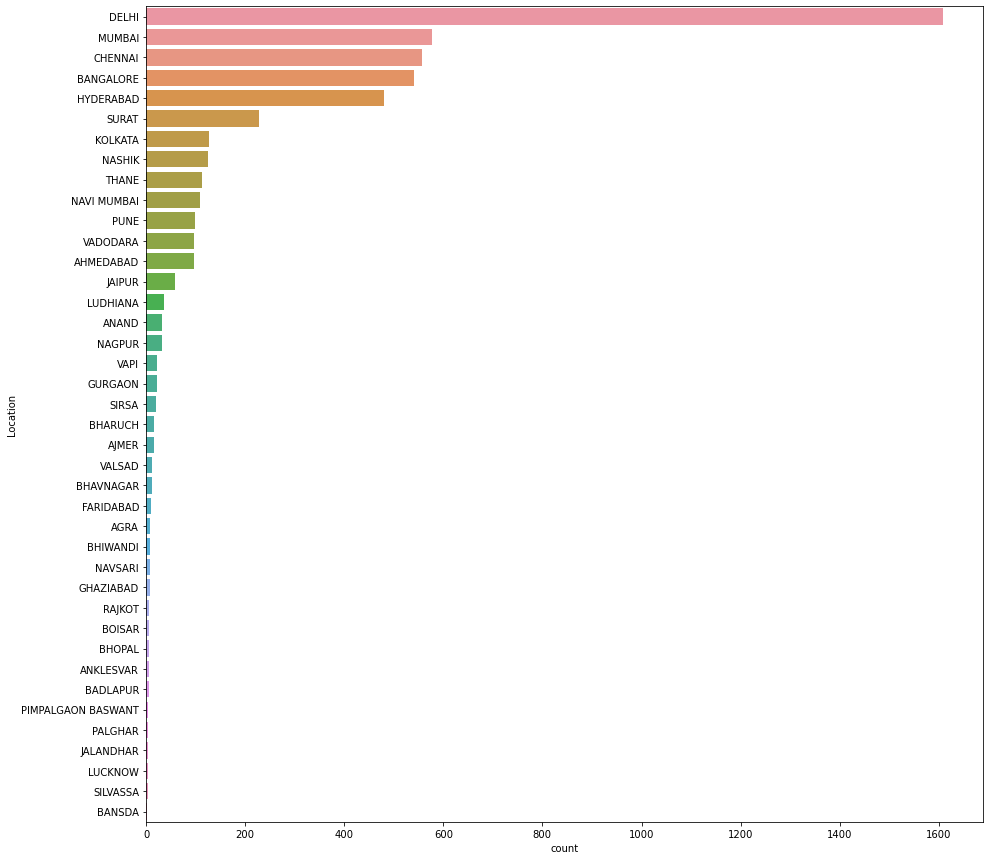

In [20]:
plt.figure(figsize=(15,15))
sns.countplot(y = df["Location"],orient="h",order = df["Location"].value_counts().index)
plt.show()

Most of the used cars are from delhi, mumbai, chennai and bangalore in our dataset. 

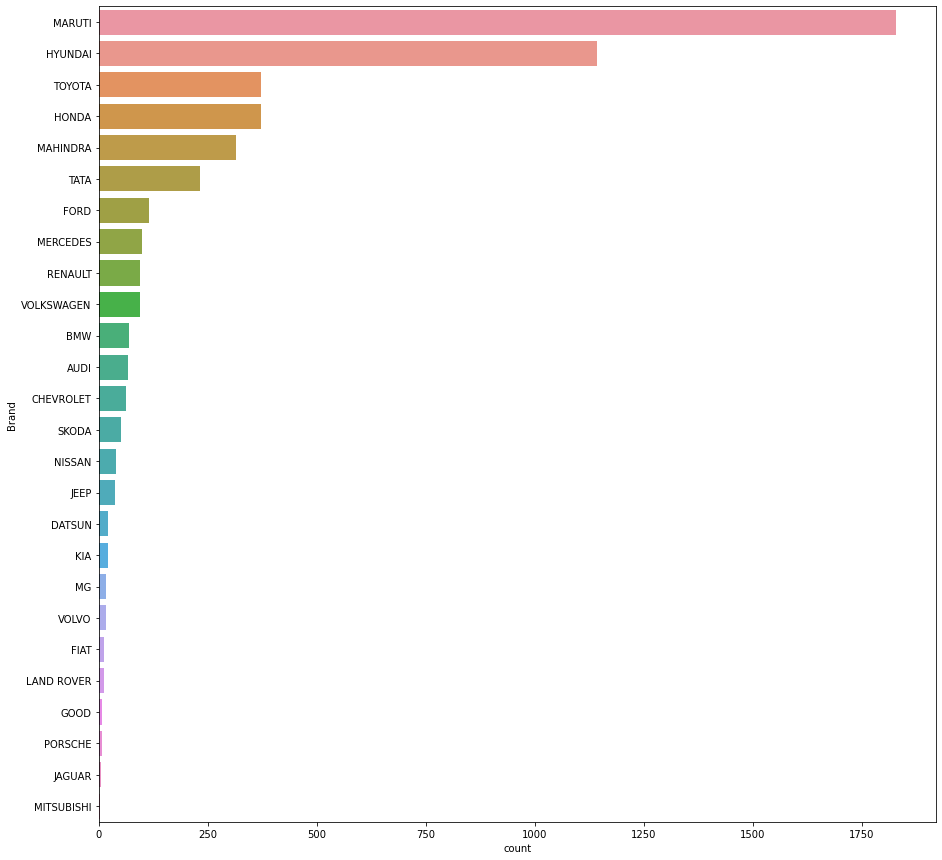

In [21]:
plt.figure(figsize=(15,15))
sns.countplot(y = df["Brand"],orient="h",order = df["Brand"].value_counts().index)
plt.show()

Majority of the car is from maruti company, while lest number of cars is from mitsubishi company.

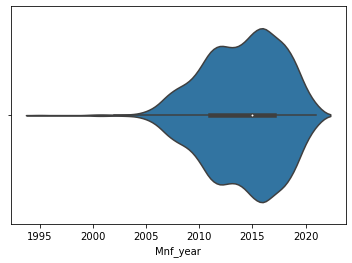

In [22]:
sns.violinplot(df["Mnf_year"])
plt.show()

Most of the cars manufacturing year is between 2011 to 2017.

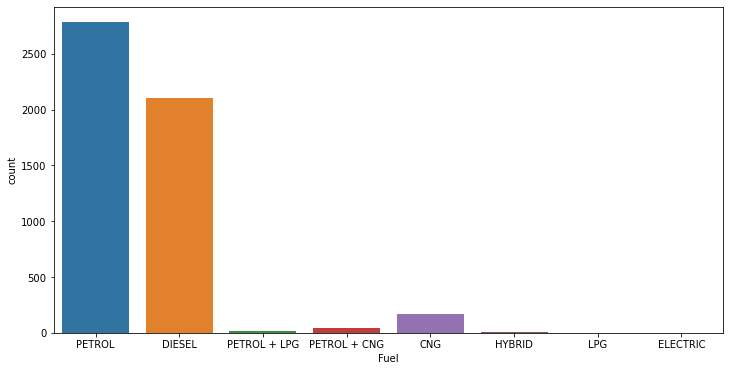

In [23]:
plt.figure(figsize=(12,6))
sns.countplot(df["Fuel"])
plt.show()

Majority number of cars is run by petrol and diesel, while least number of cars is run by electric power. 

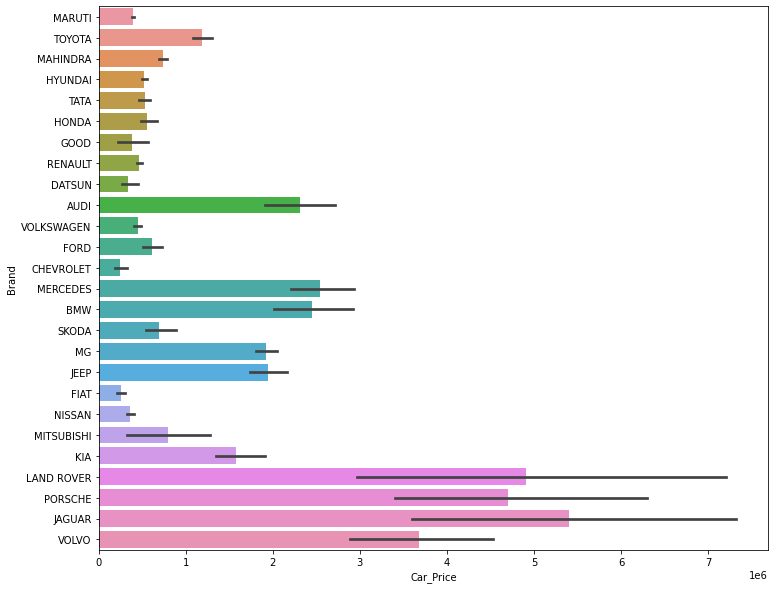

In [24]:
plt.figure(figsize=(12,10))
sns.barplot(x="Car_Price", y="Brand", data=df)
plt.show()

From the above bar plot we can see that, jaguar companies used car have maximum price compare to other companies car. While chevrolet and fiat companies used car have low price among other entities.

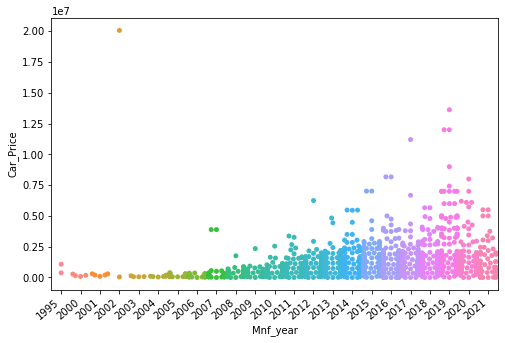

In [25]:
plt.figure(figsize=(8,5))
ax=sns.swarmplot(x='Mnf_year',y='Car_Price',data=df)
ax.set_xticklabels(ax.get_xticklabels(),rotation=40,ha='right')
plt.show()

From the above swarm plot we can see that, car price is gradually increases over the years.

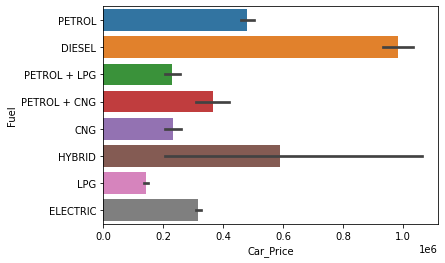

In [26]:
sns.barplot(x="Car_Price", y="Fuel", data=df)
plt.show()

1. From the above bar plot we can see that, diesel cars price is maximum, while LPG cars price is lowest compare to other categories.
2. Petrol+LPG and CNG cars price is almost similar.
3. Hybrid cars price is second highest among all other categories.

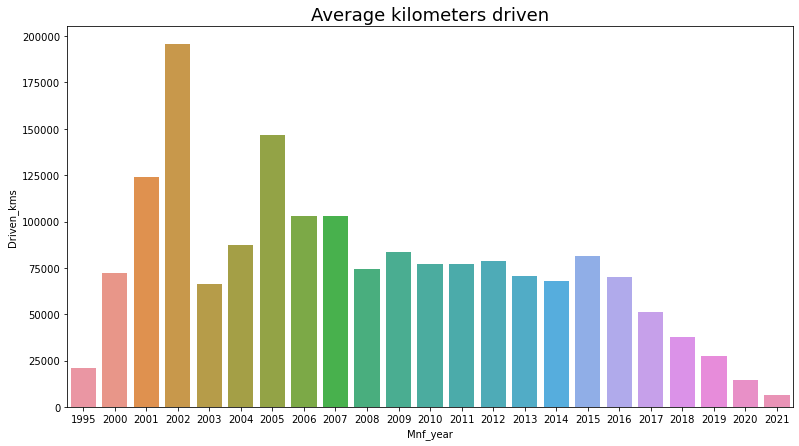

In [27]:
# bar plot of average kilometer driven of used cars each year
plt.figure(figsize=(13,7))
km_mean = df.groupby('Mnf_year')['Driven_kms'].mean()
sns.barplot(km_mean.index,km_mean)
plt.title("Average kilometers driven",fontsize=18)
plt.show()

1. From the above bar plot we can see that, average kilometers driven rises up from 1995 until 2002 and after 2015 it is linearly goes down until 2021. 
2. There is not much difference in average kilometers driven between 2008 to 2015.

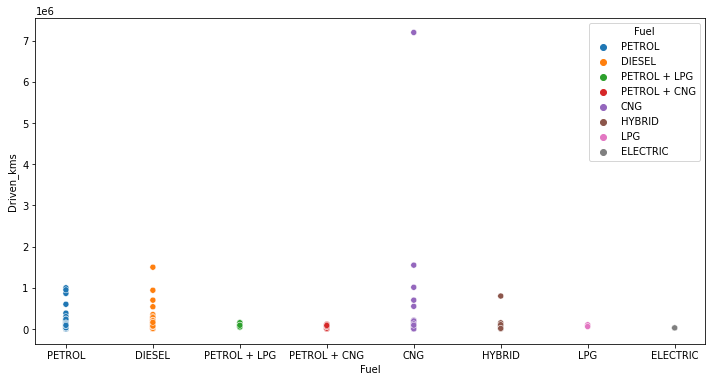

In [28]:
plt.figure(figsize=(12,6))
sns.scatterplot(x='Fuel',y='Driven_kms',data=df,hue='Fuel')
plt.show()

The scatter plot shows that more number of petrol, diesel and CNG cars seems to give more kilometers driven than other fuel type cars.

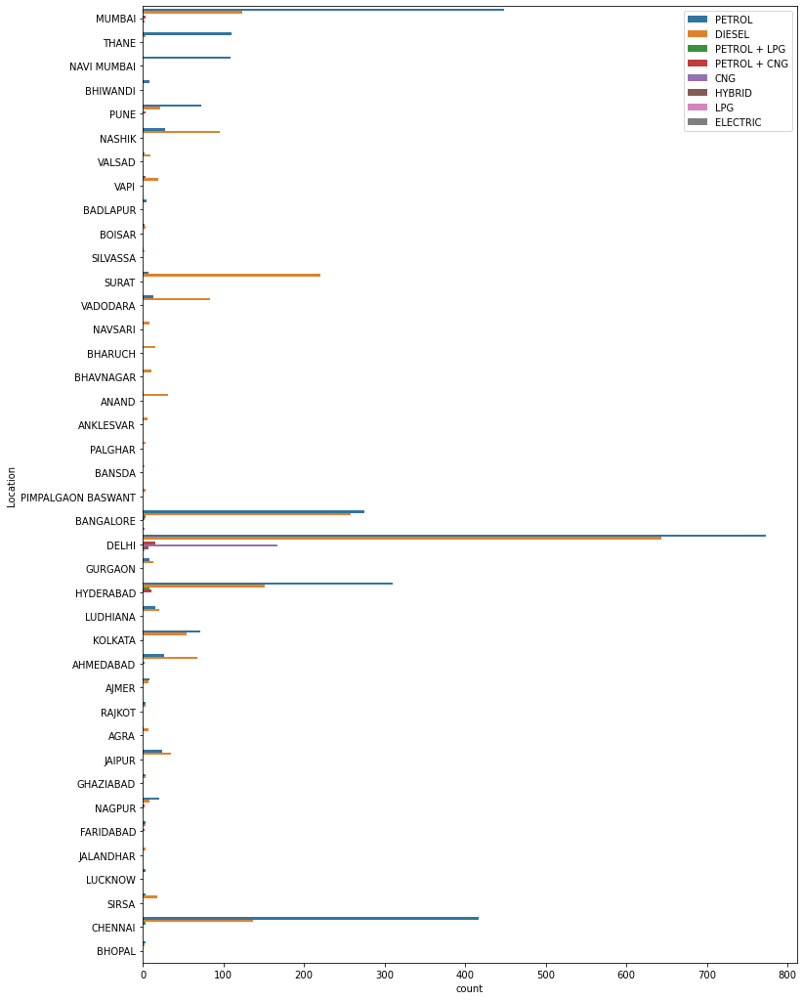

In [29]:
plt.figure(figsize=(12,18))
sns.countplot(y='Location',data=df,hue='Fuel')
plt.legend(loc='upper right')
plt.show()

In majority of the locations petrol and diesel are most used fuel type in used cars.

## Handling Outliers

In [30]:
# split numerical and categorical columns of dataset
numerical_col = df.select_dtypes(include=['float64','int32'])
cat_col = df.select_dtypes(include=['object'])

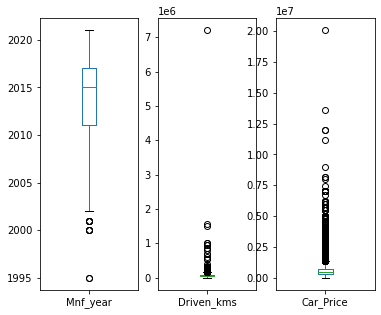

In [31]:
# check outliers through plotting boxplot.
numerical_col.plot.box(subplots=True,figsize=(6,5))
plt.show()

From the above box plot we can see that, outliers present in our numerical data and need to remove.

In [32]:
# Check outliers using zscore
from scipy.stats import zscore
z = np.abs(zscore(numerical_col))
threshold=3
print(np.where(z>3))

(array([ 154,  226,  278,  313,  348,  351,  587,  693,  707,  765,  807,
        874,  884,  907,  981, 1373, 1412, 1412, 1465, 1528, 1613, 1650,
       1705, 1716, 1855, 1895, 2045, 2086, 2094, 2131, 2271, 2314, 2406,
       2428, 2441, 2451, 2476, 2478, 2505, 2517, 2550, 2570, 2614, 2641,
       2643, 2667, 2684, 2685, 2693, 2699, 2716, 2720, 2721, 2731, 2781,
       2852, 2857, 2858, 2859, 2863, 2864, 2931, 2932, 2933, 2934, 2937,
       2940, 2941, 2942, 2959, 3001, 3037, 3038, 3039, 3040, 3042, 3047,
       3049, 3094, 3109, 3110, 3112, 3113, 3114, 3115, 3131, 3193, 3321,
       3367, 3369, 3374, 3375, 3413, 3425, 3430, 3431, 3432, 3434, 3440,
       3477, 3478, 3531, 3534, 3559, 3574, 3579, 3598, 3606, 3633, 3639,
       3647, 3648, 3687, 3699, 3703, 3735, 3803, 3809, 3835, 3864, 3868,
       3870, 3946, 3959, 3973, 3977, 3987, 3995, 4008, 4045, 4063, 4079,
       4082, 4084, 4101, 4102, 4109], dtype=int64), array([0, 1, 1, 1, 1, 0, 0, 0, 2, 0, 0, 0, 1, 1, 1, 1, 0, 2, 1, 1, 0, 0

In [33]:
# creat new data frame without outliers
df_new= numerical_col[(z<3).all(axis=1)]
df_new.head()

,Mnf_year,Driven_kms,Car_Price
0,2014,19000,240000.0
1,2017,34000,850000.0
2,2017,8714,434600.0
3,2016,75532,751800.0
4,2006,70000,65000.0


In [34]:
# check shape of the old and new dataframes
print(df.shape)
print(df_new.shape)

(5124, 7)
(4988, 3)


In [35]:
percentage_loss = ((5124-4988)/5124)*100
percentage_loss

2.6541764246682282

Here, percentage loss of data is low (2.65%) using zscore. So, we use new dataframe in further process.

In [36]:
# merge new data frame and categorical features.
df_New = pd.concat([df_new,cat_col],axis=1)
df_New.head()

,Mnf_year,Driven_kms,Car_Price,Location,Brand,Model,Fuel
0,2014.0,19000.0,240000.0,MUMBAI,MARUTI,MARUTI SUZUKI ALTO 800 2014 CNG &AMP; HYBRIDS ...,PETROL
1,2017.0,34000.0,850000.0,MUMBAI,MARUTI,"MARUTI SUZUKI ERTIGA VXI CNG, 2017, CNG &AMP; ...",PETROL
2,2017.0,8714.0,434600.0,MUMBAI,MARUTI,"MARUTI SUZUKI WAGON R LXI CNG, 2017, CNG & HYB...",PETROL
3,2016.0,75532.0,751800.0,MUMBAI,MARUTI,"MARUTI SUZUKI ERTIGA VXI CNG, 2016, CNG & HYBRIDS",PETROL
4,2006.0,70000.0,65000.0,MUMBAI,MARUTI,MARUTI SUZUKI WAGON R 2006 CNG &AMP; HYBRIDS,PETROL


In [37]:
# Clear dataframe(without outliers)
df_New.dropna(axis=0,inplace=True)
df_New.shape

(4988, 7)

## Prepare data for model training

In [38]:
# Here, our target variable is Car price, so we take it as a y variable. It is a regression type problem. 
x = df_New.drop(["Car_Price"],axis=1)
y = df_New["Car_Price"]

## Handling Skewness

In [39]:
# check skewness
x.skew()

Mnf_year     -0.295823
Driven_kms    1.348025
dtype: float64

From the above observation we can say that skewness is not present in our data.

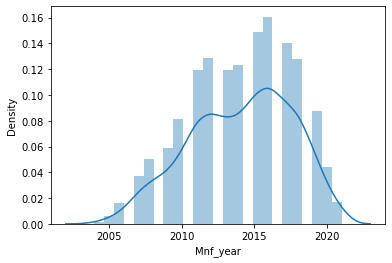

In [40]:
# checking skewness of Manufacturing years
sns.distplot(df_New["Mnf_year"])
plt.show()

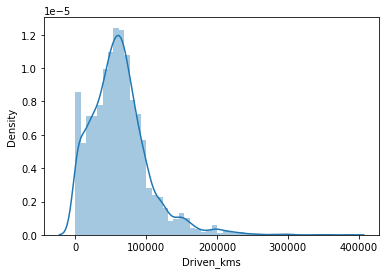

In [41]:
# checking skewness of driven kilometers
sns.distplot(df_New["Driven_kms"])
plt.show()

From the above distribution plot we can see that, skewness is not present in our data.

## Encoding Data

In [42]:
# Here, we convert categorical data into numerical data for model building and we use one hot encoding method.
x_encode = pd.get_dummies(x, drop_first=True)
x_encode.shape

(4988, 2425)

## Scaling data

In [43]:
#scaling data with mean=0 and unit variance using standard scaler mothod
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
x_s = sc.fit_transform(x_encode)

## Find best Model

In [44]:
# split train and test data from dataset.
from sklearn.model_selection import train_test_split,cross_val_score
x_train,x_test,y_train,y_test = train_test_split(x_s,y,test_size=0.15,random_state=0)

In [45]:
# our target variable is car price so it's a regression type problem.
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor,ExtraTreeRegressor
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

model = [LinearRegression(),KNeighborsRegressor(),DecisionTreeRegressor(),ExtraTreeRegressor()]

for i in model:
    i.fit(x_train,y_train)
    train=i.score(x_train,y_train)
    predi=i.predict(x_test)
    print("Accuracy of",i,"is:")
    print("Model training accuracy:",train)
    print("r2 score:",r2_score(y_test,predi))
    print("mean absolute error:",mean_absolute_error(y_test,predi))
    print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predi)))
    print("******************************************************************")
    print("\n")

Accuracy of LinearRegression() is:
Model training accuracy: 0.8197491169166636
r2 score: -3.2660016991379444e+28
mean absolute error: 4.3618479236768104e+19
root mean squared error: 1.003281674686849e+20
******************************************************************


Accuracy of KNeighborsRegressor() is:
Model training accuracy: 0.4656584693973421
r2 score: 0.14600078954470952
mean absolute error: 270426.10040053405
root mean squared error: 513030.76722368476
******************************************************************


Accuracy of DecisionTreeRegressor() is:
Model training accuracy: 0.9997670691411936
r2 score: 0.638832167343137
mean absolute error: 149755.71981689872
root mean squared error: 333633.1593870296
******************************************************************


Accuracy of ExtraTreeRegressor() is:
Model training accuracy: 0.9997670691411936
r2 score: 0.717831952061336
mean absolute error: 139489.22849513637
root mean squared error: 294895.80421578017
*****

## Bagging and Boosting method

In [46]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import ExtraTreesRegressor
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

model = [RandomForestRegressor(),AdaBoostRegressor(),GradientBoostingRegressor(),ExtraTreesRegressor(),XGBRegressor(),CatBoostRegressor()]

for m in model:
    m.fit(x_train,y_train)
    train = m.score(x_train,y_train)
    predm = m.predict(x_test)
    print("Accuracy of",m,"is:")
    print("Model training accuracy:",train)
    print("r2 score:",r2_score(y_test,predm))
    print("mean absolute error:",mean_absolute_error(y_test,predm))
    print("root mean squared error:",np.sqrt(mean_squared_error(y_test,predm)))
    print("******************************************************************")
    print("\n")

Accuracy of RandomForestRegressor() is:
Model training accuracy: 0.9652942393805545
r2 score: 0.722695335758005
mean absolute error: 139807.81471019328
root mean squared error: 292343.3799715453
******************************************************************


Accuracy of AdaBoostRegressor() is:
Model training accuracy: 0.4317702276330434
r2 score: 0.4275756467687589
mean absolute error: 310006.05551978224
root mean squared error: 420023.63358630857
******************************************************************


Accuracy of GradientBoostingRegressor() is:
Model training accuracy: 0.7636621136617993
r2 score: 0.7017221001655286
mean absolute error: 180550.23471799138
root mean squared error: 303197.2199516953
******************************************************************


Accuracy of ExtraTreesRegressor() is:
Model training accuracy: 0.9997670691362789
r2 score: 0.7331081224500697
mean absolute error: 126420.22697162353
root mean squared error: 286802.118543348
************

117:	learn: 266341.1147461	total: 1.9s	remaining: 14.2s
118:	learn: 265733.1974993	total: 1.91s	remaining: 14.2s
119:	learn: 265655.1386155	total: 1.93s	remaining: 14.1s
120:	learn: 265532.4149801	total: 1.94s	remaining: 14.1s
121:	learn: 265107.7066412	total: 1.95s	remaining: 14.1s
122:	learn: 264969.1466770	total: 1.97s	remaining: 14s
123:	learn: 264783.7543747	total: 1.98s	remaining: 14s
124:	learn: 264303.8399090	total: 1.99s	remaining: 14s
125:	learn: 264165.3538143	total: 2.01s	remaining: 13.9s
126:	learn: 264052.4702624	total: 2.02s	remaining: 13.9s
127:	learn: 263714.3182461	total: 2.04s	remaining: 13.9s
128:	learn: 263344.3340934	total: 2.06s	remaining: 13.9s
129:	learn: 263190.7479319	total: 2.08s	remaining: 13.9s
130:	learn: 263060.1364482	total: 2.09s	remaining: 13.9s
131:	learn: 262873.3701959	total: 2.1s	remaining: 13.8s
132:	learn: 262739.0513088	total: 2.12s	remaining: 13.8s
133:	learn: 262615.4740439	total: 2.13s	remaining: 13.8s
134:	learn: 262496.3592429	total: 2.14s

268:	learn: 237431.6708340	total: 4.09s	remaining: 11.1s
269:	learn: 237345.5370758	total: 4.11s	remaining: 11.1s
270:	learn: 237137.2385193	total: 4.12s	remaining: 11.1s
271:	learn: 237050.9973460	total: 4.13s	remaining: 11.1s
272:	learn: 236916.1042194	total: 4.15s	remaining: 11s
273:	learn: 236724.5743843	total: 4.16s	remaining: 11s
274:	learn: 236557.7856906	total: 4.17s	remaining: 11s
275:	learn: 236472.2516200	total: 4.19s	remaining: 11s
276:	learn: 236387.1269817	total: 4.2s	remaining: 11s
277:	learn: 236255.5991982	total: 4.22s	remaining: 10.9s
278:	learn: 236170.8294430	total: 4.23s	remaining: 10.9s
279:	learn: 236086.4112950	total: 4.24s	remaining: 10.9s
280:	learn: 236002.8151637	total: 4.25s	remaining: 10.9s
281:	learn: 235919.5435222	total: 4.27s	remaining: 10.9s
282:	learn: 235469.6358394	total: 4.28s	remaining: 10.8s
283:	learn: 235386.7522475	total: 4.3s	remaining: 10.8s
284:	learn: 235177.3905695	total: 4.32s	remaining: 10.8s
285:	learn: 235094.6353492	total: 4.34s	rem

426:	learn: 219727.5945453	total: 6.87s	remaining: 9.22s
427:	learn: 219668.7771379	total: 6.89s	remaining: 9.21s
428:	learn: 219610.1970637	total: 6.9s	remaining: 9.19s
429:	learn: 219551.7618203	total: 6.92s	remaining: 9.17s
430:	learn: 219381.9687434	total: 6.93s	remaining: 9.15s
431:	learn: 219323.6434841	total: 6.94s	remaining: 9.13s
432:	learn: 219232.1920472	total: 6.96s	remaining: 9.11s
433:	learn: 219142.8066860	total: 6.97s	remaining: 9.09s
434:	learn: 219084.6297108	total: 6.98s	remaining: 9.07s
435:	learn: 218991.9407347	total: 7s	remaining: 9.05s
436:	learn: 218933.7295489	total: 7.01s	remaining: 9.03s
437:	learn: 218875.9260408	total: 7.03s	remaining: 9.02s
438:	learn: 218818.2068216	total: 7.04s	remaining: 9s
439:	learn: 218526.0303724	total: 7.06s	remaining: 8.98s
440:	learn: 218463.4055773	total: 7.07s	remaining: 8.96s
441:	learn: 218180.7530640	total: 7.08s	remaining: 8.94s
442:	learn: 218123.3929936	total: 7.1s	remaining: 8.92s
443:	learn: 218066.0040974	total: 7.11s

573:	learn: 207466.5686818	total: 8.94s	remaining: 6.63s
574:	learn: 207420.2564787	total: 8.95s	remaining: 6.62s
575:	learn: 207374.1536829	total: 8.96s	remaining: 6.6s
576:	learn: 207137.1648488	total: 8.98s	remaining: 6.58s
577:	learn: 207066.0179689	total: 8.99s	remaining: 6.56s
578:	learn: 207019.5895518	total: 9s	remaining: 6.55s
579:	learn: 206973.6306318	total: 9.02s	remaining: 6.53s
580:	learn: 206927.8159096	total: 9.03s	remaining: 6.51s
581:	learn: 206855.7875463	total: 9.04s	remaining: 6.49s
582:	learn: 206619.1403909	total: 9.05s	remaining: 6.48s
583:	learn: 206560.2548972	total: 9.07s	remaining: 6.46s
584:	learn: 206492.8590717	total: 9.08s	remaining: 6.44s
585:	learn: 206446.8176057	total: 9.09s	remaining: 6.42s
586:	learn: 206401.0948858	total: 9.11s	remaining: 6.41s
587:	learn: 206291.7960162	total: 9.12s	remaining: 6.39s
588:	learn: 206223.0956893	total: 9.14s	remaining: 6.38s
589:	learn: 206177.4894095	total: 9.15s	remaining: 6.36s
590:	learn: 206131.7690629	total: 9

718:	learn: 197372.7736471	total: 11s	remaining: 4.28s
719:	learn: 197301.3821681	total: 11s	remaining: 4.27s
720:	learn: 197262.6105981	total: 11s	remaining: 4.25s
721:	learn: 197213.7371528	total: 11s	remaining: 4.24s
722:	learn: 197155.6836073	total: 11s	remaining: 4.22s
723:	learn: 197116.8118414	total: 11s	remaining: 4.2s
724:	learn: 196854.7904256	total: 11s	remaining: 4.19s
725:	learn: 196689.5798577	total: 11.1s	remaining: 4.17s
726:	learn: 196650.8362958	total: 11.1s	remaining: 4.16s
727:	learn: 196612.1705884	total: 11.1s	remaining: 4.14s
728:	learn: 196573.7734741	total: 11.1s	remaining: 4.12s
729:	learn: 196535.3189024	total: 11.1s	remaining: 4.11s
730:	learn: 196496.9712771	total: 11.1s	remaining: 4.09s
731:	learn: 196458.7184952	total: 11.1s	remaining: 4.07s
732:	learn: 196383.1020329	total: 11.1s	remaining: 4.06s
733:	learn: 196309.7018164	total: 11.2s	remaining: 4.05s
734:	learn: 196148.6553302	total: 11.2s	remaining: 4.04s
735:	learn: 196110.3307926	total: 11.2s	remain

871:	learn: 188308.3143096	total: 13.1s	remaining: 1.92s
872:	learn: 188274.4548865	total: 13.1s	remaining: 1.91s
873:	learn: 188167.7830012	total: 13.1s	remaining: 1.89s
874:	learn: 188133.9901529	total: 13.2s	remaining: 1.88s
875:	learn: 188064.6671191	total: 13.2s	remaining: 1.86s
876:	learn: 188030.9791415	total: 13.2s	remaining: 1.85s
877:	learn: 187997.3886488	total: 13.2s	remaining: 1.83s
878:	learn: 187943.7835320	total: 13.2s	remaining: 1.82s
879:	learn: 187910.2328894	total: 13.2s	remaining: 1.8s
880:	learn: 187876.8196766	total: 13.2s	remaining: 1.79s
881:	learn: 187827.1640158	total: 13.2s	remaining: 1.77s
882:	learn: 187793.7312310	total: 13.3s	remaining: 1.76s
883:	learn: 187740.9716088	total: 13.3s	remaining: 1.74s
884:	learn: 187707.5482485	total: 13.3s	remaining: 1.73s
885:	learn: 187674.1813608	total: 13.3s	remaining: 1.71s
886:	learn: 187606.9966591	total: 13.3s	remaining: 1.7s
887:	learn: 187554.5287591	total: 13.3s	remaining: 1.68s
888:	learn: 187521.0711396	total:

## Lasso and Ridge regression with Hyperparameter Tuning

In [48]:
from sklearn.linear_model import Ridge,Lasso
from sklearn.model_selection import GridSearchCV

In [81]:
ls = Lasso()
parameters = {'alpha':[0.02,0.1,0.2,0.3,0.4,0.5,0.6],'max_iter':[1200,1400,1600]}
reg = GridSearchCV(ls,parameters)
reg.fit(x_train,y_train)

print(reg.best_params_)

{'alpha': 0.6, 'max_iter': 1600}


In [82]:
ls = Lasso(alpha=0.6,max_iter=1600)
ls.fit(x_train,y_train)
train=ls.score(x_train,y_train)
pred_ls=ls.predict(x_test)
print("Model training accuracy:",train)
print("r2_score:",r2_score(y_test,pred_ls))
print("mean absolute error:",mean_absolute_error(y_test,pred_ls))
print("root mean squared error", np.sqrt(mean_squared_error(y_test,pred_ls)))

Model training accuracy: 0.9702015602046492
r2_score: 0.816734684420478
mean absolute error: 122474.0760670836
root mean squared error 237659.3013681799


In [83]:
# check accuracy of lasso model with cross-validation
accuracy = cross_val_score(ls,x_s,y,cv=4,scoring="r2")
print(accuracy)
print("Accuracy of Model with Cross Validation is:",accuracy.mean() * 100)

[0.48626838 0.60778538 0.65127243 0.63958446]
Accuracy of Model with Cross Validation is: 59.62276635720879


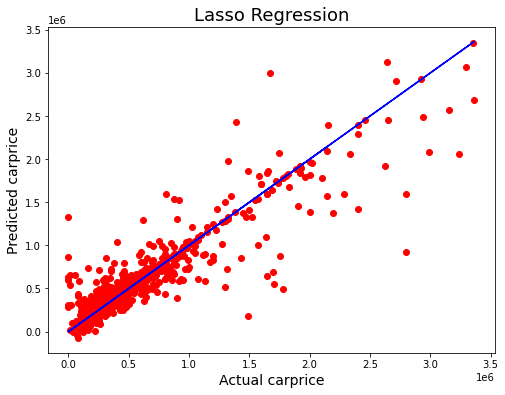

In [84]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=pred_ls, color='r')
plt.plot(y_test,y_test,color='b')
plt.xlabel("Actual carprice",fontsize=14)
plt.ylabel("Predicted carprice",fontsize=14)
plt.title("Lasso Regression",fontsize=18)
plt.show()

In [52]:
rg = Ridge()
parameters={'alpha':[0.001,0.01,0.1,1],'max_iter':[500,1000,1200,1400]}
reg = GridSearchCV(rg,parameters)
reg.fit(x_train,y_train)

print(reg.best_params_)

{'alpha': 1, 'max_iter': 500}


In [53]:
rg = Ridge(alpha=1,max_iter=500)
rg.fit(x_train,y_train)
train=rg.score(x_train,y_train)
pred_rg=rg.predict(x_test)
print("Model training accuracy:",train)
print("r2_score:",r2_score(y_test,pred_rg))
print("mean absolute error:",mean_absolute_error(y_test,pred_rg))
print("root mean squared error", np.sqrt(mean_squared_error(y_test,pred_rg)))

Model training accuracy: 0.9702013344070548
r2_score: 0.7489434999045927
mean absolute error: 134788.41213637337
root mean squared error 278163.67257835


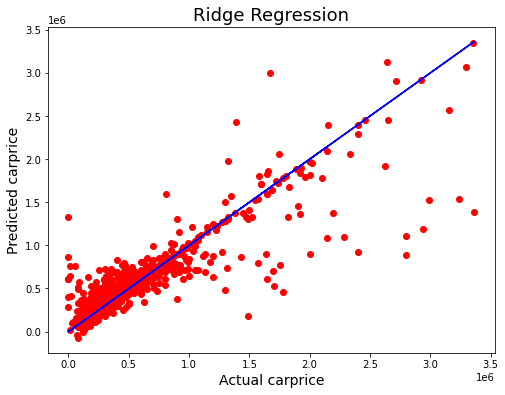

In [54]:
plt.figure(figsize=(8,6))
plt.scatter(x=y_test, y=pred_rg, color='r')
plt.plot(y_test,y_test, color='b')
plt.xlabel("Actual carprice",fontsize=14)
plt.ylabel("Predicted carprice",fontsize=14)
plt.title("Ridge Regression",fontsize=18)
plt.show()

## Hyperparameter Tuning

In [49]:
rf = RandomForestRegressor()
parameters={'n_estimators':[80,100,120],'ccp_alpha':[0.001,0.01,0.1],'max_depth':[4,5,6]}
reg = GridSearchCV(rf,parameters)
reg.fit(x_train,y_train)

print(reg.best_params_)

{'ccp_alpha': 0.01, 'max_depth': 6, 'n_estimators': 100}


In [50]:
rf = RandomForestRegressor(ccp_alpha=0.01,n_estimators=100,max_depth=6)
rf.fit(x_train,y_train)
train = rf.score(x_train,y_train)
pred_rf=rf.predict(x_test)
print("Model training accuracy:",train)
print("r2_score:",r2_score(y_test,pred_rf))
print("mean absolute error:",mean_absolute_error(y_test,pred_rf))
print("root mean squared error", np.sqrt(mean_squared_error(y_test,pred_rf)))

Model training accuracy: 0.7017649863230335
r2_score: 0.601362943358208
mean absolute error: 206434.44076602274
root mean squared error 350512.49995874526


In [56]:
# check accuracy of randomforest model with cross-validation
accuracy = cross_val_score(rf,x_s,y,cv=4,scoring="r2")
print(accuracy)
print("Accuracy of Model with Cross Validation is:",accuracy.mean() * 100)

[0.48500914 0.5905921  0.51444051 0.56937226]
Accuracy of Model with Cross Validation is: 53.985350445665006


In [52]:
gb = GradientBoostingRegressor()
parameters={'learning_rate':[0.001,0.01,0.1],'n_estimators':[100,150,200,250]}
reg = GridSearchCV(gb,parameters)
reg.fit(x_train,y_train)

print(reg.best_params_)

{'learning_rate': 0.1, 'n_estimators': 250}


In [53]:
gb = GradientBoostingRegressor(learning_rate=0.1,n_estimators=250)
gb.fit(x_train,y_train)
train=gb.score(x_train,y_train)
pred_gb=gb.predict(x_test)
print("Model training accuracy:",train)
print("r2_score:",r2_score(y_test,pred_gb))
print("mean absolute error:",mean_absolute_error(y_test,pred_gb))
print("root mean squared error", np.sqrt(mean_squared_error(y_test,pred_gb)))

Model training accuracy: 0.83212783422041
r2_score: 0.7520979412138001
mean absolute error: 165784.24772208033
root mean squared error 276410.63162606524


In [55]:
# check accuracy of gradientboosting model with cross-validation
accuracy = cross_val_score(gb,x_s,y,cv=4,scoring="r2")
print(accuracy)
print("Accuracy of Model with Cross Validation is:",accuracy.mean() * 100)

[0.55822559 0.64489116 0.65226744 0.67299064]
Accuracy of Model with Cross Validation is: 63.20937073660367


<class 'numpy.ndarray'>
<class 'pandas.core.series.Series'>


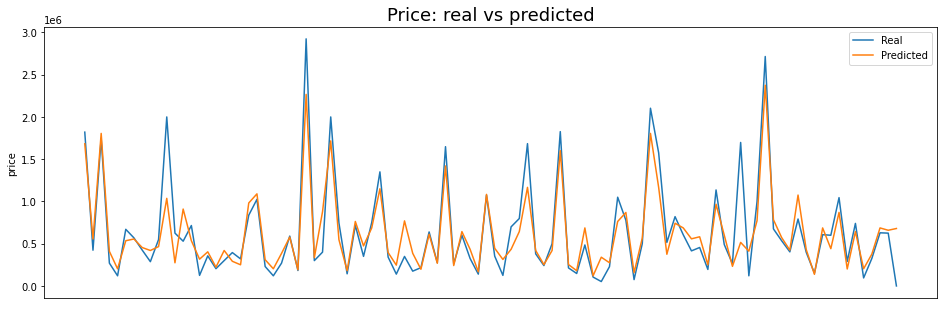

In [60]:
#let's see how the predicted values are comparing to real values for gradientboosting regressor.

A = np.array(y_test).reshape(-1, 1)
B = pred_gb.reshape(-1, 1)
print(type(pred_gb))
print(type(y_test))
plt.rcParams['figure.figsize'] = 16,5
plt.figure()
plt.plot(A[-100:], label="Real")
plt.plot(B[-100:], label="Predicted")
plt.legend()
plt.title("Price: real vs predicted",fontsize=18)
plt.ylabel("price")
plt.xticks(())
plt.show()

In [68]:
xg = XGBRegressor()
parameters={'learning_rate':[0.001,0.1,0.2,0.3]}
reg = GridSearchCV(xg,parameters)
reg.fit(x_train,y_train)

print(reg.best_params_)

{'learning_rate': 0.2}


In [69]:
xg = XGBRegressor(learning_rate=0.2)
xg.fit(x_train,y_train)
train=xg.score(x_train,y_train)
pred_xg=xg.predict(x_test)
print("Model training accuracy:",train)
print("r2_score:",r2_score(y_test,pred_xg))
print("mean absolute error:",mean_absolute_error(y_test,pred_xg))
print("root mean squared error", np.sqrt(mean_squared_error(y_test,pred_xg)))

Model training accuracy: 0.8794413116346405
r2_score: 0.7826779798065819
mean absolute error: 153156.12425942923
root mean squared error 258801.35352717308


In [75]:
# check accuracy of xgboost model with cross-validation
accuracy = cross_val_score(xg,x_s,y,cv=4,scoring="r2")
print(accuracy)
print("Accuracy of Model with Cross Validation is:",accuracy.mean() * 100)

[0.56211053 0.65837053 0.66354432 0.68289357]
Accuracy of Model with Cross Validation is: 64.1729736824898


<class 'numpy.ndarray'>
<class 'pandas.core.series.Series'>


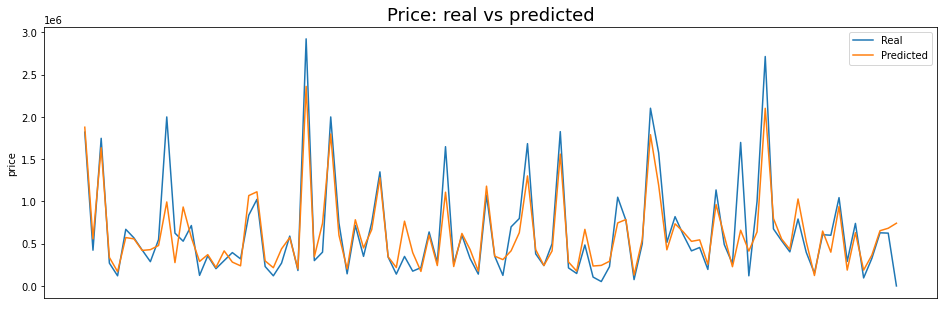

In [76]:
#let's see the how the predicted values are comparing to real values for xgboost regressor.

A = np.array(y_test).reshape(-1, 1)
B = pred_xg.reshape(-1, 1)
print(type(pred_xg))
print(type(y_test))
plt.rcParams['figure.figsize'] = 16,5
plt.figure()
plt.plot(A[-100:], label="Real")
plt.plot(B[-100:], label="Predicted")
plt.legend()
plt.title("Price: real vs predicted",fontsize=18)
plt.ylabel("price")
plt.xticks(())
plt.show()

In [77]:
cat = CatBoostRegressor()
parameters={'iterations':[500,700,1000],'learning_rate':[0.001,0.01,0.1,0.2],'max_depth':[4,5,6,7]}
reg = GridSearchCV(cat,parameters)
reg.fit(x_train,y_train)

print(reg.best_params_)

0:	learn: 480528.5797335	total: 160ms	remaining: 1m 19s
1:	learn: 480341.3957554	total: 177ms	remaining: 44s
2:	learn: 480149.7149590	total: 184ms	remaining: 30.5s
3:	learn: 479960.9274049	total: 191ms	remaining: 23.6s
4:	learn: 479766.0620784	total: 198ms	remaining: 19.6s
5:	learn: 479582.7623459	total: 205ms	remaining: 16.9s
6:	learn: 479411.2279104	total: 212ms	remaining: 15s
7:	learn: 479215.0030297	total: 219ms	remaining: 13.5s
8:	learn: 479028.0671320	total: 225ms	remaining: 12.3s
9:	learn: 478837.3088890	total: 232ms	remaining: 11.3s
10:	learn: 478640.0311150	total: 238ms	remaining: 10.6s
11:	learn: 478444.8202846	total: 245ms	remaining: 9.95s
12:	learn: 478263.3487456	total: 251ms	remaining: 9.41s
13:	learn: 478074.2317254	total: 258ms	remaining: 8.94s
14:	learn: 477878.2203912	total: 264ms	remaining: 8.54s
15:	learn: 477687.4309291	total: 270ms	remaining: 8.18s
16:	learn: 477489.9384532	total: 277ms	remaining: 7.86s
17:	learn: 477299.6257359	total: 284ms	remaining: 7.6s
18:	le

148:	learn: 454818.6333397	total: 1.22s	remaining: 2.87s
149:	learn: 454668.6952313	total: 1.22s	remaining: 2.86s
150:	learn: 454503.7499653	total: 1.23s	remaining: 2.85s
151:	learn: 454348.3282839	total: 1.24s	remaining: 2.85s
152:	learn: 454189.0021674	total: 1.25s	remaining: 2.84s
153:	learn: 454036.3388696	total: 1.26s	remaining: 2.83s
154:	learn: 453891.6032348	total: 1.27s	remaining: 2.82s
155:	learn: 453740.8483308	total: 1.27s	remaining: 2.81s
156:	learn: 453576.2883869	total: 1.28s	remaining: 2.8s
157:	learn: 453410.6320584	total: 1.29s	remaining: 2.79s
158:	learn: 453265.7845301	total: 1.3s	remaining: 2.78s
159:	learn: 453111.8315368	total: 1.31s	remaining: 2.78s
160:	learn: 452966.0806351	total: 1.31s	remaining: 2.77s
161:	learn: 452812.1990719	total: 1.32s	remaining: 2.76s
162:	learn: 452648.4241909	total: 1.33s	remaining: 2.75s
163:	learn: 452490.4067631	total: 1.34s	remaining: 2.74s
164:	learn: 452333.1385133	total: 1.35s	remaining: 2.73s
165:	learn: 452170.1910229	total:

298:	learn: 432959.6730694	total: 2.44s	remaining: 1.64s
299:	learn: 432825.1047238	total: 2.45s	remaining: 1.63s
300:	learn: 432685.4568276	total: 2.46s	remaining: 1.63s
301:	learn: 432551.4057317	total: 2.46s	remaining: 1.62s
302:	learn: 432408.3786583	total: 2.47s	remaining: 1.61s
303:	learn: 432285.2588524	total: 2.48s	remaining: 1.6s
304:	learn: 432162.7665956	total: 2.49s	remaining: 1.59s
305:	learn: 432037.8043524	total: 2.5s	remaining: 1.58s
306:	learn: 431910.7943350	total: 2.5s	remaining: 1.57s
307:	learn: 431773.1414443	total: 2.51s	remaining: 1.57s
308:	learn: 431633.2371036	total: 2.52s	remaining: 1.56s
309:	learn: 431498.8259291	total: 2.53s	remaining: 1.55s
310:	learn: 431368.5660894	total: 2.54s	remaining: 1.54s
311:	learn: 431231.4186928	total: 2.54s	remaining: 1.53s
312:	learn: 431108.2391506	total: 2.55s	remaining: 1.52s
313:	learn: 430972.6267041	total: 2.56s	remaining: 1.52s
314:	learn: 430841.7156612	total: 2.57s	remaining: 1.51s
315:	learn: 430703.7805472	total: 

463:	learn: 412727.1866603	total: 3.64s	remaining: 283ms
464:	learn: 412610.9494296	total: 3.65s	remaining: 275ms
465:	learn: 412490.4235451	total: 3.66s	remaining: 267ms
466:	learn: 412376.8249944	total: 3.67s	remaining: 259ms
467:	learn: 412266.6262183	total: 3.68s	remaining: 251ms
468:	learn: 412158.2661932	total: 3.68s	remaining: 244ms
469:	learn: 412046.0463287	total: 3.69s	remaining: 236ms
470:	learn: 411931.6435540	total: 3.7s	remaining: 228ms
471:	learn: 411822.7621784	total: 3.7s	remaining: 220ms
472:	learn: 411707.9713631	total: 3.71s	remaining: 212ms
473:	learn: 411601.0045700	total: 3.71s	remaining: 204ms
474:	learn: 411488.8762802	total: 3.72s	remaining: 196ms
475:	learn: 411378.1014745	total: 3.73s	remaining: 188ms
476:	learn: 411259.4149297	total: 3.73s	remaining: 180ms
477:	learn: 411145.5085539	total: 3.74s	remaining: 172ms
478:	learn: 411039.8294921	total: 3.75s	remaining: 164ms
479:	learn: 410928.8771456	total: 3.75s	remaining: 156ms
480:	learn: 410818.5267098	total:

130:	learn: 468593.0917155	total: 901ms	remaining: 2.54s
131:	learn: 468415.3232126	total: 909ms	remaining: 2.53s
132:	learn: 468237.8261164	total: 918ms	remaining: 2.53s
133:	learn: 468057.2510333	total: 928ms	remaining: 2.53s
134:	learn: 467883.9773583	total: 934ms	remaining: 2.52s
135:	learn: 467718.4308438	total: 946ms	remaining: 2.53s
136:	learn: 467557.4285491	total: 960ms	remaining: 2.54s
137:	learn: 467380.9444669	total: 974ms	remaining: 2.55s
138:	learn: 467230.5743434	total: 983ms	remaining: 2.55s
139:	learn: 467056.4915780	total: 991ms	remaining: 2.55s
140:	learn: 466880.6786853	total: 999ms	remaining: 2.54s
141:	learn: 466714.4926561	total: 1.01s	remaining: 2.54s
142:	learn: 466539.1137799	total: 1.01s	remaining: 2.54s
143:	learn: 466364.0852241	total: 1.02s	remaining: 2.54s
144:	learn: 466196.9515319	total: 1.03s	remaining: 2.53s
145:	learn: 466033.0421824	total: 1.04s	remaining: 2.53s
146:	learn: 465874.1036567	total: 1.05s	remaining: 2.52s
147:	learn: 465699.7334925	tota

295:	learn: 443207.7365103	total: 2.06s	remaining: 1.42s
296:	learn: 443087.6834335	total: 2.07s	remaining: 1.41s
297:	learn: 442935.7735704	total: 2.07s	remaining: 1.41s
298:	learn: 442788.1943378	total: 2.08s	remaining: 1.4s
299:	learn: 442648.2471214	total: 2.09s	remaining: 1.39s
300:	learn: 442502.5359590	total: 2.1s	remaining: 1.39s
301:	learn: 442362.3317189	total: 2.1s	remaining: 1.38s
302:	learn: 442223.6321331	total: 2.11s	remaining: 1.37s
303:	learn: 442081.5046894	total: 2.11s	remaining: 1.36s
304:	learn: 441935.3334415	total: 2.12s	remaining: 1.35s
305:	learn: 441799.2040298	total: 2.13s	remaining: 1.35s
306:	learn: 441667.5241637	total: 2.13s	remaining: 1.34s
307:	learn: 441542.4083100	total: 2.14s	remaining: 1.33s
308:	learn: 441410.5817830	total: 2.15s	remaining: 1.33s
309:	learn: 441279.1581201	total: 2.17s	remaining: 1.33s
310:	learn: 441137.9115567	total: 2.18s	remaining: 1.33s
311:	learn: 441001.2921184	total: 2.19s	remaining: 1.32s
312:	learn: 440867.4624624	total: 

455:	learn: 422393.5924570	total: 3.23s	remaining: 312ms
456:	learn: 422276.2730666	total: 3.24s	remaining: 305ms
457:	learn: 422163.7501535	total: 3.25s	remaining: 298ms
458:	learn: 422048.8895924	total: 3.25s	remaining: 291ms
459:	learn: 421927.1190276	total: 3.26s	remaining: 284ms
460:	learn: 421805.6673685	total: 3.27s	remaining: 277ms
461:	learn: 421681.5034196	total: 3.28s	remaining: 269ms
462:	learn: 421570.0603547	total: 3.28s	remaining: 262ms
463:	learn: 421450.3066248	total: 3.29s	remaining: 255ms
464:	learn: 421334.7472800	total: 3.29s	remaining: 248ms
465:	learn: 421211.1877267	total: 3.3s	remaining: 241ms
466:	learn: 421093.8105084	total: 3.31s	remaining: 234ms
467:	learn: 420963.3624651	total: 3.31s	remaining: 227ms
468:	learn: 420851.7558486	total: 3.32s	remaining: 220ms
469:	learn: 420734.1965886	total: 3.33s	remaining: 212ms
470:	learn: 420617.5126423	total: 3.33s	remaining: 205ms
471:	learn: 420510.0513238	total: 3.34s	remaining: 198ms
472:	learn: 420396.9797956	total

121:	learn: 471851.8567385	total: 886ms	remaining: 2.75s
122:	learn: 471691.3817686	total: 895ms	remaining: 2.74s
123:	learn: 471518.1636358	total: 904ms	remaining: 2.74s
124:	learn: 471344.7056309	total: 912ms	remaining: 2.74s
125:	learn: 471174.1887803	total: 920ms	remaining: 2.73s
126:	learn: 470991.1771009	total: 929ms	remaining: 2.73s
127:	learn: 470829.5259348	total: 936ms	remaining: 2.72s
128:	learn: 470647.4684762	total: 942ms	remaining: 2.71s
129:	learn: 470479.5658076	total: 948ms	remaining: 2.7s
130:	learn: 470304.0622187	total: 955ms	remaining: 2.69s
131:	learn: 470127.4005003	total: 961ms	remaining: 2.68s
132:	learn: 469951.0094618	total: 967ms	remaining: 2.67s
133:	learn: 469778.5679515	total: 974ms	remaining: 2.66s
134:	learn: 469596.4803727	total: 980ms	remaining: 2.65s
135:	learn: 469418.1404348	total: 986ms	remaining: 2.64s
136:	learn: 469237.6899788	total: 993ms	remaining: 2.63s
137:	learn: 469055.7922007	total: 999ms	remaining: 2.62s
138:	learn: 468873.1495932	total

268:	learn: 448015.1410082	total: 1.9s	remaining: 1.63s
269:	learn: 447865.9187755	total: 1.91s	remaining: 1.63s
270:	learn: 447705.7136567	total: 1.92s	remaining: 1.62s
271:	learn: 447549.2278535	total: 1.93s	remaining: 1.61s
272:	learn: 447404.2206690	total: 1.93s	remaining: 1.61s
273:	learn: 447265.5557884	total: 1.94s	remaining: 1.6s
274:	learn: 447106.0558515	total: 1.95s	remaining: 1.59s
275:	learn: 446974.7603402	total: 1.95s	remaining: 1.58s
276:	learn: 446829.8075707	total: 1.96s	remaining: 1.58s
277:	learn: 446680.7154022	total: 1.97s	remaining: 1.57s
278:	learn: 446525.9650129	total: 1.97s	remaining: 1.56s
279:	learn: 446381.0637774	total: 1.98s	remaining: 1.55s
280:	learn: 446246.0459359	total: 1.98s	remaining: 1.55s
281:	learn: 446096.1864985	total: 1.99s	remaining: 1.54s
282:	learn: 445946.3714629	total: 2s	remaining: 1.53s
283:	learn: 445798.3711241	total: 2s	remaining: 1.52s
284:	learn: 445650.4736094	total: 2.01s	remaining: 1.52s
285:	learn: 445496.3998513	total: 2.02s

416:	learn: 427496.9644605	total: 2.96s	remaining: 588ms
417:	learn: 427383.6168132	total: 2.96s	remaining: 581ms
418:	learn: 427249.8653950	total: 2.97s	remaining: 575ms
419:	learn: 427141.7796304	total: 2.98s	remaining: 569ms
420:	learn: 427009.6164935	total: 2.99s	remaining: 562ms
421:	learn: 426872.2323278	total: 3s	remaining: 555ms
422:	learn: 426766.3438679	total: 3.01s	remaining: 548ms
423:	learn: 426629.2946768	total: 3.02s	remaining: 541ms
424:	learn: 426492.8543629	total: 3.02s	remaining: 534ms
425:	learn: 426357.7158643	total: 3.03s	remaining: 527ms
426:	learn: 426234.4684676	total: 3.04s	remaining: 519ms
427:	learn: 426105.7168990	total: 3.05s	remaining: 512ms
428:	learn: 425986.0167471	total: 3.05s	remaining: 505ms
429:	learn: 425865.5598095	total: 3.06s	remaining: 498ms
430:	learn: 425738.2167765	total: 3.07s	remaining: 491ms
431:	learn: 425618.3420156	total: 3.08s	remaining: 485ms
432:	learn: 425495.9555649	total: 3.09s	remaining: 478ms
433:	learn: 425367.5421797	total: 

80:	learn: 466232.7790381	total: 543ms	remaining: 2.81s
81:	learn: 466075.8066160	total: 550ms	remaining: 2.8s
82:	learn: 465904.9744280	total: 558ms	remaining: 2.8s
83:	learn: 465729.7099705	total: 565ms	remaining: 2.8s
84:	learn: 465555.4137568	total: 573ms	remaining: 2.79s
85:	learn: 465386.2181237	total: 580ms	remaining: 2.79s
86:	learn: 465217.6451785	total: 587ms	remaining: 2.79s
87:	learn: 465058.2191096	total: 593ms	remaining: 2.78s
88:	learn: 464887.1463986	total: 600ms	remaining: 2.77s
89:	learn: 464723.7521861	total: 606ms	remaining: 2.76s
90:	learn: 464561.5553704	total: 612ms	remaining: 2.75s
91:	learn: 464411.8475031	total: 619ms	remaining: 2.74s
92:	learn: 464245.9792362	total: 625ms	remaining: 2.73s
93:	learn: 464081.6698359	total: 632ms	remaining: 2.73s
94:	learn: 463913.0105907	total: 638ms	remaining: 2.72s
95:	learn: 463748.2879689	total: 645ms	remaining: 2.71s
96:	learn: 463575.3931989	total: 651ms	remaining: 2.7s
97:	learn: 463408.7340839	total: 657ms	remaining: 2.

225:	learn: 443553.5262957	total: 1.54s	remaining: 1.87s
226:	learn: 443409.3080718	total: 1.55s	remaining: 1.87s
227:	learn: 443262.1163360	total: 1.56s	remaining: 1.86s
228:	learn: 443118.7003212	total: 1.57s	remaining: 1.86s
229:	learn: 442973.6539836	total: 1.58s	remaining: 1.85s
230:	learn: 442831.6804134	total: 1.58s	remaining: 1.84s
231:	learn: 442690.3360709	total: 1.59s	remaining: 1.83s
232:	learn: 442546.1190209	total: 1.6s	remaining: 1.83s
233:	learn: 442402.4880950	total: 1.6s	remaining: 1.82s
234:	learn: 442252.3388235	total: 1.61s	remaining: 1.81s
235:	learn: 442106.0967621	total: 1.61s	remaining: 1.81s
236:	learn: 441948.3466567	total: 1.62s	remaining: 1.8s
237:	learn: 441815.1948976	total: 1.63s	remaining: 1.79s
238:	learn: 441670.8995331	total: 1.63s	remaining: 1.78s
239:	learn: 441544.5736243	total: 1.64s	remaining: 1.78s
240:	learn: 441403.2342400	total: 1.65s	remaining: 1.77s
241:	learn: 441261.3038390	total: 1.65s	remaining: 1.76s
242:	learn: 441104.4504478	total: 

396:	learn: 420830.5913288	total: 2.72s	remaining: 706ms
397:	learn: 420712.6409311	total: 2.73s	remaining: 699ms
398:	learn: 420578.7522339	total: 2.73s	remaining: 692ms
399:	learn: 420461.3857538	total: 2.74s	remaining: 686ms
400:	learn: 420335.0844958	total: 2.75s	remaining: 679ms
401:	learn: 420213.7806549	total: 2.75s	remaining: 672ms
402:	learn: 420085.8090559	total: 2.76s	remaining: 665ms
403:	learn: 419969.8869819	total: 2.77s	remaining: 658ms
404:	learn: 419849.2792128	total: 2.77s	remaining: 651ms
405:	learn: 419722.7365033	total: 2.78s	remaining: 644ms
406:	learn: 419589.9663505	total: 2.79s	remaining: 637ms
407:	learn: 419479.2135583	total: 2.79s	remaining: 630ms
408:	learn: 419356.4167037	total: 2.8s	remaining: 623ms
409:	learn: 419244.8185700	total: 2.81s	remaining: 616ms
410:	learn: 419129.5472097	total: 2.81s	remaining: 609ms
411:	learn: 419003.9775531	total: 2.82s	remaining: 602ms
412:	learn: 418885.8695131	total: 2.83s	remaining: 595ms
413:	learn: 418765.4618797	total

50:	learn: 489967.9777213	total: 362ms	remaining: 3.19s
51:	learn: 489790.4519996	total: 370ms	remaining: 3.19s
52:	learn: 489595.5299522	total: 379ms	remaining: 3.2s
53:	learn: 489407.9595126	total: 388ms	remaining: 3.2s
54:	learn: 489218.7098838	total: 397ms	remaining: 3.21s
55:	learn: 489040.9176163	total: 405ms	remaining: 3.21s
56:	learn: 488862.6268071	total: 413ms	remaining: 3.21s
57:	learn: 488671.5453622	total: 421ms	remaining: 3.21s
58:	learn: 488473.1430614	total: 428ms	remaining: 3.2s
59:	learn: 488285.4213532	total: 436ms	remaining: 3.2s
60:	learn: 488099.1065562	total: 444ms	remaining: 3.2s
61:	learn: 487913.2342589	total: 452ms	remaining: 3.19s
62:	learn: 487721.9307973	total: 460ms	remaining: 3.19s
63:	learn: 487542.0637311	total: 468ms	remaining: 3.19s
64:	learn: 487352.6409649	total: 477ms	remaining: 3.19s
65:	learn: 487172.6542432	total: 484ms	remaining: 3.19s
66:	learn: 486988.5857585	total: 492ms	remaining: 3.18s
67:	learn: 486797.3172313	total: 500ms	remaining: 3.1

196:	learn: 464620.1146092	total: 1.58s	remaining: 2.44s
197:	learn: 464455.1291669	total: 1.59s	remaining: 2.43s
198:	learn: 464308.4642122	total: 1.6s	remaining: 2.42s
199:	learn: 464143.5085743	total: 1.61s	remaining: 2.41s
200:	learn: 464000.5084564	total: 1.62s	remaining: 2.41s
201:	learn: 463861.1296740	total: 1.63s	remaining: 2.4s
202:	learn: 463693.7183277	total: 1.63s	remaining: 2.39s
203:	learn: 463543.5085697	total: 1.64s	remaining: 2.38s
204:	learn: 463385.7040295	total: 1.65s	remaining: 2.37s
205:	learn: 463229.4200548	total: 1.65s	remaining: 2.36s
206:	learn: 463062.2800002	total: 1.66s	remaining: 2.35s
207:	learn: 462903.3228508	total: 1.66s	remaining: 2.34s
208:	learn: 462748.5602976	total: 1.67s	remaining: 2.33s
209:	learn: 462586.0379158	total: 1.68s	remaining: 2.31s
210:	learn: 462420.4195181	total: 1.68s	remaining: 2.31s
211:	learn: 462268.2362767	total: 1.69s	remaining: 2.29s
212:	learn: 462113.8222418	total: 1.7s	remaining: 2.28s
213:	learn: 461962.2619084	total: 

348:	learn: 442248.9307313	total: 2.62s	remaining: 1.14s
349:	learn: 442109.6269565	total: 2.63s	remaining: 1.13s
350:	learn: 441983.4110538	total: 2.64s	remaining: 1.12s
351:	learn: 441851.0240105	total: 2.64s	remaining: 1.11s
352:	learn: 441710.6534163	total: 2.65s	remaining: 1.1s
353:	learn: 441585.6402458	total: 2.66s	remaining: 1.09s
354:	learn: 441442.4687422	total: 2.66s	remaining: 1.09s
355:	learn: 441304.1460098	total: 2.67s	remaining: 1.08s
356:	learn: 441178.7973708	total: 2.67s	remaining: 1.07s
357:	learn: 441037.0261257	total: 2.68s	remaining: 1.06s
358:	learn: 440895.6944740	total: 2.69s	remaining: 1.05s
359:	learn: 440764.7988368	total: 2.69s	remaining: 1.05s
360:	learn: 440625.8316325	total: 2.7s	remaining: 1.04s
361:	learn: 440494.8865131	total: 2.71s	remaining: 1.03s
362:	learn: 440361.3129685	total: 2.71s	remaining: 1.02s
363:	learn: 440221.9081223	total: 2.72s	remaining: 1.02s
364:	learn: 440087.0235610	total: 2.73s	remaining: 1.01s
365:	learn: 439969.7999534	total:

0:	learn: 480525.7951886	total: 9.25ms	remaining: 4.62s
1:	learn: 480323.5661943	total: 17.9ms	remaining: 4.45s
2:	learn: 480113.5477060	total: 26.1ms	remaining: 4.33s
3:	learn: 479926.0336302	total: 34.6ms	remaining: 4.29s
4:	learn: 479727.3421383	total: 42.9ms	remaining: 4.24s
5:	learn: 479520.7782184	total: 51.1ms	remaining: 4.21s
6:	learn: 479324.4118946	total: 59.4ms	remaining: 4.18s
7:	learn: 479109.7459800	total: 67.6ms	remaining: 4.16s
8:	learn: 478895.5693933	total: 75.9ms	remaining: 4.14s
9:	learn: 478708.6226292	total: 84.3ms	remaining: 4.13s
10:	learn: 478495.3119481	total: 92.6ms	remaining: 4.11s
11:	learn: 478284.4356660	total: 101ms	remaining: 4.1s
12:	learn: 478072.7626735	total: 109ms	remaining: 4.08s
13:	learn: 477858.1630140	total: 117ms	remaining: 4.07s
14:	learn: 477649.8304822	total: 125ms	remaining: 4.05s
15:	learn: 477454.5901452	total: 134ms	remaining: 4.04s
16:	learn: 477272.0143526	total: 142ms	remaining: 4.03s
17:	learn: 477057.5023792	total: 150ms	remaining

146:	learn: 452911.9809177	total: 1.3s	remaining: 3.12s
147:	learn: 452744.6164921	total: 1.31s	remaining: 3.12s
148:	learn: 452565.9437134	total: 1.32s	remaining: 3.11s
149:	learn: 452413.8052908	total: 1.33s	remaining: 3.11s
150:	learn: 452239.0390239	total: 1.34s	remaining: 3.1s
151:	learn: 452054.9149799	total: 1.35s	remaining: 3.09s
152:	learn: 451885.6741960	total: 1.36s	remaining: 3.08s
153:	learn: 451724.7531944	total: 1.37s	remaining: 3.08s
154:	learn: 451577.3492372	total: 1.38s	remaining: 3.07s
155:	learn: 451400.9607022	total: 1.39s	remaining: 3.06s
156:	learn: 451228.0985577	total: 1.4s	remaining: 3.05s
157:	learn: 451045.8139591	total: 1.4s	remaining: 3.04s
158:	learn: 450883.7330852	total: 1.41s	remaining: 3.03s
159:	learn: 450730.5537370	total: 1.43s	remaining: 3.03s
160:	learn: 450565.2953142	total: 1.43s	remaining: 3.02s
161:	learn: 450385.3921421	total: 1.44s	remaining: 3.01s
162:	learn: 450209.0248160	total: 1.45s	remaining: 3s
163:	learn: 450037.3495917	total: 1.46

308:	learn: 427311.7975661	total: 2.74s	remaining: 1.69s
309:	learn: 427164.8863410	total: 2.75s	remaining: 1.69s
310:	learn: 427025.5958086	total: 2.76s	remaining: 1.68s
311:	learn: 426888.6470480	total: 2.77s	remaining: 1.67s
312:	learn: 426741.5926114	total: 2.78s	remaining: 1.66s
313:	learn: 426590.6821071	total: 2.79s	remaining: 1.65s
314:	learn: 426436.2700580	total: 2.8s	remaining: 1.65s
315:	learn: 426301.4545576	total: 2.81s	remaining: 1.64s
316:	learn: 426153.1139557	total: 2.82s	remaining: 1.63s
317:	learn: 426017.1347547	total: 2.83s	remaining: 1.62s
318:	learn: 425870.4201966	total: 2.84s	remaining: 1.61s
319:	learn: 425731.5263130	total: 2.85s	remaining: 1.6s
320:	learn: 425583.0489615	total: 2.85s	remaining: 1.59s
321:	learn: 425438.3178282	total: 2.86s	remaining: 1.58s
322:	learn: 425299.9667063	total: 2.87s	remaining: 1.57s
323:	learn: 425148.8852220	total: 2.88s	remaining: 1.56s
324:	learn: 425000.0602666	total: 2.89s	remaining: 1.56s
325:	learn: 424876.3972125	total:

462:	learn: 406974.0323391	total: 4.14s	remaining: 331ms
463:	learn: 406845.6075716	total: 4.15s	remaining: 322ms
464:	learn: 406719.6056084	total: 4.16s	remaining: 313ms
465:	learn: 406590.8985021	total: 4.17s	remaining: 305ms
466:	learn: 406468.5613045	total: 4.18s	remaining: 296ms
467:	learn: 406351.7078717	total: 4.19s	remaining: 287ms
468:	learn: 406237.9083555	total: 4.2s	remaining: 278ms
469:	learn: 406136.9056343	total: 4.21s	remaining: 269ms
470:	learn: 406030.3712462	total: 4.22s	remaining: 260ms
471:	learn: 405907.9712162	total: 4.23s	remaining: 251ms
472:	learn: 405785.2432853	total: 4.24s	remaining: 242ms
473:	learn: 405661.4700826	total: 4.25s	remaining: 233ms
474:	learn: 405538.2408088	total: 4.25s	remaining: 224ms
475:	learn: 405407.6158309	total: 4.26s	remaining: 215ms
476:	learn: 405286.0535851	total: 4.27s	remaining: 206ms
477:	learn: 405163.9536097	total: 4.28s	remaining: 197ms
478:	learn: 405046.2546995	total: 4.29s	remaining: 188ms
479:	learn: 404920.8786982	total

114:	learn: 469628.9259048	total: 1.04s	remaining: 3.5s
115:	learn: 469443.0487293	total: 1.06s	remaining: 3.5s
116:	learn: 469243.3744426	total: 1.07s	remaining: 3.49s
117:	learn: 469047.7144411	total: 1.08s	remaining: 3.48s
118:	learn: 468845.1459311	total: 1.08s	remaining: 3.47s
119:	learn: 468657.8764846	total: 1.09s	remaining: 3.46s
120:	learn: 468467.4349452	total: 1.1s	remaining: 3.45s
121:	learn: 468291.4408138	total: 1.11s	remaining: 3.44s
122:	learn: 468123.4909562	total: 1.12s	remaining: 3.43s
123:	learn: 467934.9422890	total: 1.13s	remaining: 3.42s
124:	learn: 467743.3758618	total: 1.13s	remaining: 3.4s
125:	learn: 467543.7312902	total: 1.14s	remaining: 3.39s
126:	learn: 467357.9464363	total: 1.15s	remaining: 3.38s
127:	learn: 467202.1385956	total: 1.16s	remaining: 3.37s
128:	learn: 467032.1134549	total: 1.17s	remaining: 3.36s
129:	learn: 466862.9830552	total: 1.18s	remaining: 3.35s
130:	learn: 466660.9562381	total: 1.18s	remaining: 3.34s
131:	learn: 466472.5483504	total: 1

278:	learn: 441423.8418598	total: 2.49s	remaining: 1.97s
279:	learn: 441269.8348747	total: 2.5s	remaining: 1.96s
280:	learn: 441106.5507224	total: 2.51s	remaining: 1.96s
281:	learn: 440941.7706473	total: 2.52s	remaining: 1.95s
282:	learn: 440771.5315700	total: 2.52s	remaining: 1.94s
283:	learn: 440617.8285345	total: 2.53s	remaining: 1.93s
284:	learn: 440451.4666761	total: 2.54s	remaining: 1.92s
285:	learn: 440294.4315182	total: 2.55s	remaining: 1.91s
286:	learn: 440139.1976890	total: 2.56s	remaining: 1.9s
287:	learn: 439990.2645922	total: 2.57s	remaining: 1.89s
288:	learn: 439844.9722591	total: 2.58s	remaining: 1.88s
289:	learn: 439684.9864953	total: 2.59s	remaining: 1.87s
290:	learn: 439524.4168882	total: 2.59s	remaining: 1.86s
291:	learn: 439381.4818494	total: 2.6s	remaining: 1.85s
292:	learn: 439235.5667909	total: 2.61s	remaining: 1.84s
293:	learn: 439071.7333373	total: 2.62s	remaining: 1.83s
294:	learn: 438909.8173246	total: 2.63s	remaining: 1.82s
295:	learn: 438745.5292277	total: 

437:	learn: 418546.9024939	total: 3.92s	remaining: 554ms
438:	learn: 418410.6419248	total: 3.92s	remaining: 545ms
439:	learn: 418274.6917002	total: 3.94s	remaining: 537ms
440:	learn: 418131.8431699	total: 3.95s	remaining: 528ms
441:	learn: 418014.0165495	total: 3.95s	remaining: 519ms
442:	learn: 417875.7290140	total: 3.96s	remaining: 510ms
443:	learn: 417737.9237115	total: 3.97s	remaining: 501ms
444:	learn: 417604.0511194	total: 3.98s	remaining: 492ms
445:	learn: 417461.4913726	total: 3.99s	remaining: 483ms
446:	learn: 417319.7191771	total: 4s	remaining: 474ms
447:	learn: 417188.6899171	total: 4s	remaining: 465ms
448:	learn: 417047.3132393	total: 4.01s	remaining: 456ms
449:	learn: 416918.0300530	total: 4.02s	remaining: 447ms
450:	learn: 416792.8246262	total: 4.03s	remaining: 438ms
451:	learn: 416660.9679194	total: 4.04s	remaining: 429ms
452:	learn: 416547.6029644	total: 4.05s	remaining: 420ms
453:	learn: 416413.1218367	total: 4.05s	remaining: 411ms
454:	learn: 416296.7287483	total: 4.0

99:	learn: 474131.9419680	total: 906ms	remaining: 3.62s
100:	learn: 473940.8992455	total: 920ms	remaining: 3.63s
101:	learn: 473729.7845347	total: 932ms	remaining: 3.64s
102:	learn: 473516.2749834	total: 941ms	remaining: 3.63s
103:	learn: 473323.7411367	total: 949ms	remaining: 3.61s
104:	learn: 473117.0921373	total: 958ms	remaining: 3.6s
105:	learn: 472922.4524521	total: 966ms	remaining: 3.59s
106:	learn: 472735.6006507	total: 974ms	remaining: 3.58s
107:	learn: 472549.2115752	total: 982ms	remaining: 3.57s
108:	learn: 472368.8415201	total: 991ms	remaining: 3.55s
109:	learn: 472187.9259353	total: 1000ms	remaining: 3.54s
110:	learn: 471979.1099288	total: 1.01s	remaining: 3.53s
111:	learn: 471800.7078916	total: 1.02s	remaining: 3.52s
112:	learn: 471613.4941824	total: 1.02s	remaining: 3.51s
113:	learn: 471412.0146942	total: 1.03s	remaining: 3.5s
114:	learn: 471209.1850660	total: 1.04s	remaining: 3.49s
115:	learn: 471008.9846106	total: 1.05s	remaining: 3.48s
116:	learn: 470805.3171518	total:

258:	learn: 445273.8456935	total: 2.34s	remaining: 2.17s
259:	learn: 445096.8949505	total: 2.35s	remaining: 2.17s
260:	learn: 444931.0216091	total: 2.36s	remaining: 2.16s
261:	learn: 444760.8964784	total: 2.37s	remaining: 2.15s
262:	learn: 444599.7890065	total: 2.38s	remaining: 2.14s
263:	learn: 444434.5126379	total: 2.38s	remaining: 2.13s
264:	learn: 444292.3008770	total: 2.39s	remaining: 2.12s
265:	learn: 444129.1776882	total: 2.4s	remaining: 2.11s
266:	learn: 443976.3428422	total: 2.41s	remaining: 2.1s
267:	learn: 443805.3399850	total: 2.42s	remaining: 2.09s
268:	learn: 443670.4845407	total: 2.43s	remaining: 2.08s
269:	learn: 443502.0063884	total: 2.44s	remaining: 2.07s
270:	learn: 443355.6838885	total: 2.44s	remaining: 2.06s
271:	learn: 443194.6347962	total: 2.45s	remaining: 2.06s
272:	learn: 443022.4702442	total: 2.46s	remaining: 2.05s
273:	learn: 442854.7632103	total: 2.47s	remaining: 2.04s
274:	learn: 442686.0411494	total: 2.48s	remaining: 2.03s
275:	learn: 442531.4943319	total:

420:	learn: 421013.9500487	total: 3.77s	remaining: 707ms
421:	learn: 420872.1190590	total: 3.77s	remaining: 698ms
422:	learn: 420751.6766923	total: 3.78s	remaining: 689ms
423:	learn: 420620.1636619	total: 3.79s	remaining: 680ms
424:	learn: 420472.8288733	total: 3.8s	remaining: 671ms
425:	learn: 420322.0062163	total: 3.81s	remaining: 662ms
426:	learn: 420178.8967985	total: 3.82s	remaining: 653ms
427:	learn: 420036.0058628	total: 3.83s	remaining: 644ms
428:	learn: 419922.9940324	total: 3.84s	remaining: 635ms
429:	learn: 419798.6554660	total: 3.84s	remaining: 626ms
430:	learn: 419658.3734344	total: 3.85s	remaining: 617ms
431:	learn: 419517.1648925	total: 3.86s	remaining: 608ms
432:	learn: 419370.4494476	total: 3.87s	remaining: 599ms
433:	learn: 419246.2092047	total: 3.88s	remaining: 590ms
434:	learn: 419114.7649279	total: 3.89s	remaining: 581ms
435:	learn: 418987.9766654	total: 3.9s	remaining: 572ms
436:	learn: 418843.8414264	total: 3.9s	remaining: 563ms
437:	learn: 418697.4134659	total: 

76:	learn: 465816.6103572	total: 717ms	remaining: 3.94s
77:	learn: 465619.4589800	total: 728ms	remaining: 3.94s
78:	learn: 465425.9410069	total: 740ms	remaining: 3.94s
79:	learn: 465229.4069127	total: 750ms	remaining: 3.94s
80:	learn: 465062.4684587	total: 759ms	remaining: 3.93s
81:	learn: 464870.2623561	total: 768ms	remaining: 3.91s
82:	learn: 464697.8304584	total: 776ms	remaining: 3.9s
83:	learn: 464494.1530921	total: 786ms	remaining: 3.89s
84:	learn: 464305.6307165	total: 794ms	remaining: 3.88s
85:	learn: 464131.5074989	total: 803ms	remaining: 3.86s
86:	learn: 463927.0749315	total: 811ms	remaining: 3.85s
87:	learn: 463751.8355914	total: 820ms	remaining: 3.84s
88:	learn: 463563.6957369	total: 828ms	remaining: 3.82s
89:	learn: 463377.3732614	total: 836ms	remaining: 3.81s
90:	learn: 463197.1670833	total: 845ms	remaining: 3.8s
91:	learn: 463003.3324202	total: 853ms	remaining: 3.78s
92:	learn: 462829.4392926	total: 863ms	remaining: 3.77s
93:	learn: 462655.5137897	total: 871ms	remaining: 

234:	learn: 439001.5360959	total: 2.14s	remaining: 2.42s
235:	learn: 438853.3024015	total: 2.15s	remaining: 2.41s
236:	learn: 438713.3735075	total: 2.17s	remaining: 2.4s
237:	learn: 438559.4110288	total: 2.18s	remaining: 2.4s
238:	learn: 438394.3451988	total: 2.19s	remaining: 2.39s
239:	learn: 438238.8223017	total: 2.21s	remaining: 2.39s
240:	learn: 438076.2777098	total: 2.22s	remaining: 2.38s
241:	learn: 437913.7800152	total: 2.23s	remaining: 2.37s
242:	learn: 437779.3615572	total: 2.23s	remaining: 2.36s
243:	learn: 437617.1441494	total: 2.24s	remaining: 2.35s
244:	learn: 437445.2232044	total: 2.25s	remaining: 2.34s
245:	learn: 437287.3034348	total: 2.26s	remaining: 2.33s
246:	learn: 437132.8828927	total: 2.27s	remaining: 2.32s
247:	learn: 436986.4046653	total: 2.28s	remaining: 2.32s
248:	learn: 436817.1691613	total: 2.29s	remaining: 2.31s
249:	learn: 436658.2771047	total: 2.3s	remaining: 2.3s
250:	learn: 436501.3248721	total: 2.31s	remaining: 2.29s
251:	learn: 436359.1606563	total: 2

393:	learn: 416103.0127247	total: 3.58s	remaining: 964ms
394:	learn: 415968.2160914	total: 3.6s	remaining: 956ms
395:	learn: 415838.4346897	total: 3.61s	remaining: 947ms
396:	learn: 415714.9693544	total: 3.62s	remaining: 939ms
397:	learn: 415586.8535647	total: 3.63s	remaining: 930ms
398:	learn: 415461.0610349	total: 3.64s	remaining: 921ms
399:	learn: 415329.5511794	total: 3.65s	remaining: 911ms
400:	learn: 415201.1706601	total: 3.65s	remaining: 902ms
401:	learn: 415065.0863013	total: 3.66s	remaining: 893ms
402:	learn: 414931.5929138	total: 3.67s	remaining: 884ms
403:	learn: 414799.3434712	total: 3.68s	remaining: 875ms
404:	learn: 414661.4590930	total: 3.69s	remaining: 865ms
405:	learn: 414539.7780998	total: 3.7s	remaining: 856ms
406:	learn: 414418.3531700	total: 3.71s	remaining: 847ms
407:	learn: 414295.7464644	total: 3.71s	remaining: 838ms
408:	learn: 414169.9495485	total: 3.72s	remaining: 829ms
409:	learn: 414033.4424077	total: 3.73s	remaining: 819ms
410:	learn: 413894.1176021	total:

55:	learn: 488171.5298461	total: 544ms	remaining: 4.31s
56:	learn: 487963.6898300	total: 555ms	remaining: 4.31s
57:	learn: 487766.2951178	total: 565ms	remaining: 4.3s
58:	learn: 487561.5597776	total: 576ms	remaining: 4.31s
59:	learn: 487348.0986666	total: 585ms	remaining: 4.29s
60:	learn: 487155.9492290	total: 595ms	remaining: 4.28s
61:	learn: 486949.8085617	total: 604ms	remaining: 4.26s
62:	learn: 486743.6452943	total: 612ms	remaining: 4.25s
63:	learn: 486525.6992275	total: 621ms	remaining: 4.23s
64:	learn: 486313.0652451	total: 630ms	remaining: 4.21s
65:	learn: 486128.0705205	total: 640ms	remaining: 4.21s
66:	learn: 485921.3105615	total: 649ms	remaining: 4.2s
67:	learn: 485704.4384629	total: 658ms	remaining: 4.18s
68:	learn: 485502.8498322	total: 668ms	remaining: 4.17s
69:	learn: 485309.6602662	total: 677ms	remaining: 4.16s
70:	learn: 485126.1192774	total: 686ms	remaining: 4.14s
71:	learn: 484946.1074627	total: 695ms	remaining: 4.13s
72:	learn: 484734.6515194	total: 705ms	remaining: 

202:	learn: 460670.0912306	total: 1.9s	remaining: 2.78s
203:	learn: 460502.9570438	total: 1.91s	remaining: 2.77s
204:	learn: 460320.0337632	total: 1.92s	remaining: 2.77s
205:	learn: 460141.2138139	total: 1.93s	remaining: 2.76s
206:	learn: 459965.5923161	total: 1.94s	remaining: 2.75s
207:	learn: 459778.9268128	total: 1.95s	remaining: 2.74s
208:	learn: 459601.2425973	total: 1.96s	remaining: 2.73s
209:	learn: 459423.7878180	total: 1.97s	remaining: 2.72s
210:	learn: 459247.7620242	total: 1.98s	remaining: 2.71s
211:	learn: 459075.0890343	total: 1.98s	remaining: 2.7s
212:	learn: 458909.6139382	total: 2s	remaining: 2.69s
213:	learn: 458735.4280265	total: 2s	remaining: 2.68s
214:	learn: 458563.7745264	total: 2.01s	remaining: 2.67s
215:	learn: 458395.7621072	total: 2.02s	remaining: 2.66s
216:	learn: 458224.7343504	total: 2.03s	remaining: 2.65s
217:	learn: 458058.0463626	total: 2.04s	remaining: 2.64s
218:	learn: 457887.2712811	total: 2.05s	remaining: 2.63s
219:	learn: 457734.4405680	total: 2.05s

348:	learn: 437176.7853607	total: 3.19s	remaining: 1.38s
349:	learn: 437019.7442957	total: 3.21s	remaining: 1.37s
350:	learn: 436861.0491407	total: 3.21s	remaining: 1.36s
351:	learn: 436704.2847048	total: 3.22s	remaining: 1.35s
352:	learn: 436552.9289438	total: 3.23s	remaining: 1.35s
353:	learn: 436402.2783329	total: 3.24s	remaining: 1.34s
354:	learn: 436246.2365195	total: 3.25s	remaining: 1.33s
355:	learn: 436093.6644100	total: 3.26s	remaining: 1.32s
356:	learn: 435945.1486678	total: 3.27s	remaining: 1.31s
357:	learn: 435799.0219104	total: 3.27s	remaining: 1.3s
358:	learn: 435662.1198647	total: 3.28s	remaining: 1.29s
359:	learn: 435509.6336086	total: 3.29s	remaining: 1.28s
360:	learn: 435377.4733215	total: 3.3s	remaining: 1.27s
361:	learn: 435241.3167705	total: 3.31s	remaining: 1.26s
362:	learn: 435098.7515208	total: 3.32s	remaining: 1.25s
363:	learn: 434952.6344781	total: 3.32s	remaining: 1.24s
364:	learn: 434824.6814587	total: 3.33s	remaining: 1.23s
365:	learn: 434665.7603236	total:

0:	learn: 480506.4410612	total: 12.7ms	remaining: 6.33s
1:	learn: 480294.9603272	total: 24.4ms	remaining: 6.08s
2:	learn: 480073.8585774	total: 36.7ms	remaining: 6.09s
3:	learn: 479858.8954278	total: 49.2ms	remaining: 6.09s
4:	learn: 479661.7150836	total: 63ms	remaining: 6.23s
5:	learn: 479428.8416275	total: 75.7ms	remaining: 6.23s
6:	learn: 479215.3880706	total: 87.2ms	remaining: 6.14s
7:	learn: 478995.8513913	total: 98.8ms	remaining: 6.08s
8:	learn: 478782.6759650	total: 110ms	remaining: 6.01s
9:	learn: 478549.3290700	total: 122ms	remaining: 5.99s
10:	learn: 478318.5474642	total: 135ms	remaining: 6s
11:	learn: 478096.6434715	total: 147ms	remaining: 5.99s
12:	learn: 477895.6578268	total: 159ms	remaining: 5.95s
13:	learn: 477702.9166775	total: 170ms	remaining: 5.91s
14:	learn: 477478.1470369	total: 181ms	remaining: 5.87s
15:	learn: 477252.4858717	total: 193ms	remaining: 5.84s
16:	learn: 477024.7779986	total: 210ms	remaining: 5.96s
17:	learn: 476812.2275538	total: 225ms	remaining: 6.02s

156:	learn: 449869.2993013	total: 1.9s	remaining: 4.14s
157:	learn: 449670.2118431	total: 1.91s	remaining: 4.13s
158:	learn: 449480.7717861	total: 1.92s	remaining: 4.12s
159:	learn: 449303.2723835	total: 1.93s	remaining: 4.11s
160:	learn: 449113.6209228	total: 1.95s	remaining: 4.09s
161:	learn: 448934.1812039	total: 1.96s	remaining: 4.08s
162:	learn: 448771.6582414	total: 1.96s	remaining: 4.06s
163:	learn: 448590.3506361	total: 1.98s	remaining: 4.05s
164:	learn: 448425.6157371	total: 1.99s	remaining: 4.03s
165:	learn: 448253.4461715	total: 2s	remaining: 4.02s
166:	learn: 448071.4984127	total: 2.01s	remaining: 4.01s
167:	learn: 447904.1570936	total: 2.02s	remaining: 3.99s
168:	learn: 447751.4871431	total: 2.03s	remaining: 3.98s
169:	learn: 447561.7979908	total: 2.04s	remaining: 3.97s
170:	learn: 447383.2788758	total: 2.05s	remaining: 3.95s
171:	learn: 447196.6015598	total: 2.06s	remaining: 3.94s
172:	learn: 447007.8524955	total: 2.08s	remaining: 3.93s
173:	learn: 446825.1107492	total: 2

310:	learn: 424412.1051774	total: 3.73s	remaining: 2.27s
311:	learn: 424258.9560777	total: 3.75s	remaining: 2.26s
312:	learn: 424115.4182117	total: 3.76s	remaining: 2.25s
313:	learn: 423952.7076897	total: 3.77s	remaining: 2.23s
314:	learn: 423801.3293462	total: 3.78s	remaining: 2.22s
315:	learn: 423663.2932116	total: 3.79s	remaining: 2.21s
316:	learn: 423501.6770124	total: 3.81s	remaining: 2.2s
317:	learn: 423357.8866919	total: 3.82s	remaining: 2.19s
318:	learn: 423209.3398102	total: 3.83s	remaining: 2.17s
319:	learn: 423064.8213991	total: 3.84s	remaining: 2.16s
320:	learn: 422919.4253742	total: 3.85s	remaining: 2.15s
321:	learn: 422788.1161631	total: 3.86s	remaining: 2.13s
322:	learn: 422646.9622125	total: 3.88s	remaining: 2.12s
323:	learn: 422501.1390393	total: 3.89s	remaining: 2.11s
324:	learn: 422357.9808679	total: 3.9s	remaining: 2.1s
325:	learn: 422204.7560802	total: 3.91s	remaining: 2.09s
326:	learn: 422058.6256779	total: 3.92s	remaining: 2.08s
327:	learn: 421908.3690201	total: 

460:	learn: 403503.5767144	total: 5.78s	remaining: 489ms
461:	learn: 403360.7184022	total: 5.8s	remaining: 477ms
462:	learn: 403236.0090525	total: 5.82s	remaining: 465ms
463:	learn: 403110.8692613	total: 5.83s	remaining: 452ms
464:	learn: 402993.8873909	total: 5.84s	remaining: 440ms
465:	learn: 402864.0149709	total: 5.86s	remaining: 427ms
466:	learn: 402726.4915317	total: 5.87s	remaining: 415ms
467:	learn: 402615.4070205	total: 5.89s	remaining: 403ms
468:	learn: 402492.3636202	total: 5.9s	remaining: 390ms
469:	learn: 402364.2662585	total: 5.92s	remaining: 378ms
470:	learn: 402236.4706701	total: 5.93s	remaining: 365ms
471:	learn: 402112.5798150	total: 5.95s	remaining: 353ms
472:	learn: 401988.7089130	total: 5.96s	remaining: 340ms
473:	learn: 401858.1326328	total: 5.98s	remaining: 328ms
474:	learn: 401720.5541026	total: 6s	remaining: 316ms
475:	learn: 401588.1169426	total: 6.01s	remaining: 303ms
476:	learn: 401458.0498588	total: 6.02s	remaining: 290ms
477:	learn: 401338.8587516	total: 6.

107:	learn: 469548.1828104	total: 1.31s	remaining: 4.76s
108:	learn: 469330.0070924	total: 1.32s	remaining: 4.75s
109:	learn: 469140.2558840	total: 1.34s	remaining: 4.75s
110:	learn: 468945.3118464	total: 1.35s	remaining: 4.73s
111:	learn: 468747.6766220	total: 1.36s	remaining: 4.72s
112:	learn: 468530.5488690	total: 1.37s	remaining: 4.7s
113:	learn: 468332.9884321	total: 1.39s	remaining: 4.69s
114:	learn: 468141.0957938	total: 1.4s	remaining: 4.68s
115:	learn: 467947.0427831	total: 1.41s	remaining: 4.66s
116:	learn: 467753.8203589	total: 1.42s	remaining: 4.65s
117:	learn: 467537.5815031	total: 1.43s	remaining: 4.63s
118:	learn: 467364.1478977	total: 1.44s	remaining: 4.62s
119:	learn: 467198.7552515	total: 1.45s	remaining: 4.61s
120:	learn: 466983.2165176	total: 1.47s	remaining: 4.59s
121:	learn: 466801.0181916	total: 1.48s	remaining: 4.58s
122:	learn: 466592.4801494	total: 1.5s	remaining: 4.58s
123:	learn: 466377.7246102	total: 1.51s	remaining: 4.58s
124:	learn: 466164.7341008	total: 

260:	learn: 441488.7902048	total: 3.16s	remaining: 2.89s
261:	learn: 441334.2898795	total: 3.17s	remaining: 2.88s
262:	learn: 441176.3945014	total: 3.19s	remaining: 2.87s
263:	learn: 441022.9166556	total: 3.2s	remaining: 2.86s
264:	learn: 440857.8544815	total: 3.21s	remaining: 2.85s
265:	learn: 440687.1622855	total: 3.22s	remaining: 2.83s
266:	learn: 440510.9489607	total: 3.23s	remaining: 2.82s
267:	learn: 440346.1114899	total: 3.25s	remaining: 2.81s
268:	learn: 440185.6274589	total: 3.26s	remaining: 2.8s
269:	learn: 440014.0926450	total: 3.27s	remaining: 2.78s
270:	learn: 439835.2737414	total: 3.28s	remaining: 2.77s
271:	learn: 439680.0455118	total: 3.29s	remaining: 2.76s
272:	learn: 439515.6673729	total: 3.3s	remaining: 2.75s
273:	learn: 439338.0162190	total: 3.31s	remaining: 2.73s
274:	learn: 439164.5325203	total: 3.33s	remaining: 2.72s
275:	learn: 439033.9241948	total: 3.34s	remaining: 2.71s
276:	learn: 438882.5557848	total: 3.35s	remaining: 2.7s
277:	learn: 438702.7786067	total: 3

414:	learn: 417945.0370962	total: 5.01s	remaining: 1.03s
415:	learn: 417804.4014808	total: 5.03s	remaining: 1.02s
416:	learn: 417675.7955936	total: 5.05s	remaining: 1s
417:	learn: 417534.1684752	total: 5.06s	remaining: 992ms
418:	learn: 417398.1740024	total: 5.07s	remaining: 980ms
419:	learn: 417266.5525716	total: 5.08s	remaining: 968ms
420:	learn: 417118.6476998	total: 5.09s	remaining: 956ms
421:	learn: 416966.4433303	total: 5.11s	remaining: 944ms
422:	learn: 416822.6866658	total: 5.12s	remaining: 931ms
423:	learn: 416677.0835074	total: 5.13s	remaining: 919ms
424:	learn: 416538.4794297	total: 5.14s	remaining: 907ms
425:	learn: 416398.9114976	total: 5.15s	remaining: 895ms
426:	learn: 416256.2630802	total: 5.16s	remaining: 883ms
427:	learn: 416117.2416697	total: 5.17s	remaining: 870ms
428:	learn: 416003.6189640	total: 5.18s	remaining: 858ms
429:	learn: 415868.5906106	total: 5.2s	remaining: 846ms
430:	learn: 415722.0280678	total: 5.21s	remaining: 834ms
431:	learn: 415576.9782866	total: 5

60:	learn: 481348.7576028	total: 747ms	remaining: 5.38s
61:	learn: 481126.7155930	total: 761ms	remaining: 5.37s
62:	learn: 480927.1050895	total: 775ms	remaining: 5.38s
63:	learn: 480702.7396105	total: 787ms	remaining: 5.36s
64:	learn: 480470.2738431	total: 799ms	remaining: 5.34s
65:	learn: 480240.3012588	total: 810ms	remaining: 5.33s
66:	learn: 480011.0206161	total: 822ms	remaining: 5.31s
67:	learn: 479793.7285943	total: 834ms	remaining: 5.3s
68:	learn: 479593.3002994	total: 845ms	remaining: 5.28s
69:	learn: 479374.6576941	total: 857ms	remaining: 5.26s
70:	learn: 479148.6144285	total: 870ms	remaining: 5.25s
71:	learn: 478912.4078735	total: 881ms	remaining: 5.24s
72:	learn: 478699.5746397	total: 893ms	remaining: 5.22s
73:	learn: 478500.9236679	total: 905ms	remaining: 5.21s
74:	learn: 478267.1105923	total: 920ms	remaining: 5.21s
75:	learn: 478050.3355741	total: 935ms	remaining: 5.22s
76:	learn: 477820.0894710	total: 947ms	remaining: 5.2s
77:	learn: 477605.9419699	total: 959ms	remaining: 

207:	learn: 451895.7383761	total: 2.76s	remaining: 3.87s
208:	learn: 451724.8241617	total: 2.77s	remaining: 3.86s
209:	learn: 451532.5879733	total: 2.79s	remaining: 3.85s
210:	learn: 451355.0707703	total: 2.8s	remaining: 3.84s
211:	learn: 451167.4281142	total: 2.82s	remaining: 3.83s
212:	learn: 450979.0550104	total: 2.83s	remaining: 3.81s
213:	learn: 450795.9966159	total: 2.84s	remaining: 3.8s
214:	learn: 450624.0009281	total: 2.86s	remaining: 3.79s
215:	learn: 450429.7242036	total: 2.87s	remaining: 3.77s
216:	learn: 450248.5459791	total: 2.88s	remaining: 3.76s
217:	learn: 450058.4280317	total: 2.9s	remaining: 3.75s
218:	learn: 449880.9072007	total: 2.91s	remaining: 3.74s
219:	learn: 449681.3997336	total: 2.93s	remaining: 3.73s
220:	learn: 449498.4354427	total: 2.94s	remaining: 3.72s
221:	learn: 449314.4251000	total: 2.96s	remaining: 3.71s
222:	learn: 449136.6518687	total: 2.97s	remaining: 3.69s
223:	learn: 448951.5466934	total: 2.99s	remaining: 3.68s
224:	learn: 448785.0054072	total: 

361:	learn: 425740.0175724	total: 4.76s	remaining: 1.82s
362:	learn: 425576.5771404	total: 4.78s	remaining: 1.8s
363:	learn: 425432.8041004	total: 4.79s	remaining: 1.79s
364:	learn: 425297.1632982	total: 4.8s	remaining: 1.77s
365:	learn: 425143.8397124	total: 4.81s	remaining: 1.76s
366:	learn: 424995.0899549	total: 4.82s	remaining: 1.75s
367:	learn: 424849.2279489	total: 4.83s	remaining: 1.73s
368:	learn: 424679.4486940	total: 4.85s	remaining: 1.72s
369:	learn: 424537.0667101	total: 4.86s	remaining: 1.71s
370:	learn: 424366.7523417	total: 4.87s	remaining: 1.69s
371:	learn: 424204.6443849	total: 4.88s	remaining: 1.68s
372:	learn: 424043.0875217	total: 4.9s	remaining: 1.67s
373:	learn: 423890.6377919	total: 4.91s	remaining: 1.65s
374:	learn: 423728.8088799	total: 4.92s	remaining: 1.64s
375:	learn: 423562.2200506	total: 4.93s	remaining: 1.63s
376:	learn: 423399.8068644	total: 4.94s	remaining: 1.61s
377:	learn: 423248.5021465	total: 4.96s	remaining: 1.6s
378:	learn: 423086.9758314	total: 4

17:	learn: 476900.2571563	total: 212ms	remaining: 5.67s
18:	learn: 476691.2938852	total: 228ms	remaining: 5.78s
19:	learn: 476501.5173752	total: 248ms	remaining: 5.94s
20:	learn: 476282.0554866	total: 262ms	remaining: 5.97s
21:	learn: 476067.3786394	total: 277ms	remaining: 6.02s
22:	learn: 475869.7835946	total: 289ms	remaining: 6s
23:	learn: 475662.9959384	total: 300ms	remaining: 5.96s
24:	learn: 475434.9279389	total: 311ms	remaining: 5.92s
25:	learn: 475230.1875291	total: 322ms	remaining: 5.88s
26:	learn: 475048.9472834	total: 334ms	remaining: 5.85s
27:	learn: 474842.3139696	total: 345ms	remaining: 5.82s
28:	learn: 474624.8939679	total: 357ms	remaining: 5.8s
29:	learn: 474415.8356943	total: 368ms	remaining: 5.77s
30:	learn: 474222.9824197	total: 383ms	remaining: 5.8s
31:	learn: 474003.1618799	total: 397ms	remaining: 5.81s
32:	learn: 473795.9343856	total: 409ms	remaining: 5.78s
33:	learn: 473620.0373685	total: 420ms	remaining: 5.76s
34:	learn: 473396.1772027	total: 431ms	remaining: 5.7

170:	learn: 447270.1665649	total: 2.05s	remaining: 3.94s
171:	learn: 447094.7432062	total: 2.06s	remaining: 3.94s
172:	learn: 446933.5629215	total: 2.08s	remaining: 3.93s
173:	learn: 446758.3193200	total: 2.09s	remaining: 3.91s
174:	learn: 446581.9703331	total: 2.1s	remaining: 3.9s
175:	learn: 446430.2773741	total: 2.11s	remaining: 3.89s
176:	learn: 446259.0927179	total: 2.12s	remaining: 3.88s
177:	learn: 446096.3685882	total: 2.13s	remaining: 3.86s
178:	learn: 445902.7390316	total: 2.15s	remaining: 3.85s
179:	learn: 445721.3270778	total: 2.16s	remaining: 3.83s
180:	learn: 445557.8903417	total: 2.17s	remaining: 3.82s
181:	learn: 445381.5933001	total: 2.18s	remaining: 3.81s
182:	learn: 445209.7547945	total: 2.19s	remaining: 3.79s
183:	learn: 445029.8248633	total: 2.2s	remaining: 3.78s
184:	learn: 444841.5416364	total: 2.21s	remaining: 3.77s
185:	learn: 444668.0826146	total: 2.23s	remaining: 3.76s
186:	learn: 444483.0313327	total: 2.24s	remaining: 3.74s
187:	learn: 444315.7183660	total: 

326:	learn: 422064.1550391	total: 3.91s	remaining: 2.07s
327:	learn: 421900.4154150	total: 3.93s	remaining: 2.06s
328:	learn: 421754.3041098	total: 3.94s	remaining: 2.05s
329:	learn: 421602.0637462	total: 3.95s	remaining: 2.04s
330:	learn: 421444.8077409	total: 3.96s	remaining: 2.02s
331:	learn: 421302.7073885	total: 3.97s	remaining: 2.01s
332:	learn: 421169.0073659	total: 3.98s	remaining: 2s
333:	learn: 421015.1046378	total: 4s	remaining: 1.99s
334:	learn: 420860.3475982	total: 4.01s	remaining: 1.97s
335:	learn: 420708.4077439	total: 4.02s	remaining: 1.96s
336:	learn: 420553.5658523	total: 4.03s	remaining: 1.95s
337:	learn: 420402.7987914	total: 4.04s	remaining: 1.94s
338:	learn: 420265.1710666	total: 4.05s	remaining: 1.93s
339:	learn: 420123.6866892	total: 4.07s	remaining: 1.91s
340:	learn: 419957.1824212	total: 4.08s	remaining: 1.9s
341:	learn: 419799.1174964	total: 4.09s	remaining: 1.89s
342:	learn: 419652.6801828	total: 4.1s	remaining: 1.88s
343:	learn: 419497.9268295	total: 4.12s

484:	learn: 400266.7372450	total: 5.79s	remaining: 179ms
485:	learn: 400138.4673831	total: 5.81s	remaining: 167ms
486:	learn: 400018.5208079	total: 5.82s	remaining: 155ms
487:	learn: 399893.0207135	total: 5.83s	remaining: 143ms
488:	learn: 399768.8976729	total: 5.84s	remaining: 131ms
489:	learn: 399648.4681101	total: 5.86s	remaining: 120ms
490:	learn: 399519.2938247	total: 5.87s	remaining: 108ms
491:	learn: 399394.9965566	total: 5.88s	remaining: 95.6ms
492:	learn: 399268.9071045	total: 5.89s	remaining: 83.7ms
493:	learn: 399141.6558645	total: 5.9s	remaining: 71.7ms
494:	learn: 399013.0487853	total: 5.91s	remaining: 59.7ms
495:	learn: 398883.8302256	total: 5.93s	remaining: 47.8ms
496:	learn: 398761.2803376	total: 5.94s	remaining: 35.8ms
497:	learn: 398637.0864188	total: 5.95s	remaining: 23.9ms
498:	learn: 398505.7132572	total: 5.96s	remaining: 11.9ms
499:	learn: 398382.0273992	total: 5.97s	remaining: 0us
0:	learn: 499827.8210078	total: 11.5ms	remaining: 5.73s
1:	learn: 499621.9491637	to

132:	learn: 471734.8327791	total: 1.62s	remaining: 4.48s
133:	learn: 471527.6654083	total: 1.64s	remaining: 4.47s
134:	learn: 471323.5429654	total: 1.65s	remaining: 4.46s
135:	learn: 471112.9556319	total: 1.66s	remaining: 4.45s
136:	learn: 470913.5970274	total: 1.67s	remaining: 4.43s
137:	learn: 470695.0850549	total: 1.68s	remaining: 4.42s
138:	learn: 470486.9919820	total: 1.7s	remaining: 4.4s
139:	learn: 470290.2740147	total: 1.71s	remaining: 4.39s
140:	learn: 470102.6932394	total: 1.72s	remaining: 4.37s
141:	learn: 469897.4638444	total: 1.73s	remaining: 4.36s
142:	learn: 469685.7250673	total: 1.74s	remaining: 4.34s
143:	learn: 469482.3456140	total: 1.75s	remaining: 4.33s
144:	learn: 469296.5412654	total: 1.76s	remaining: 4.32s
145:	learn: 469090.4206124	total: 1.77s	remaining: 4.3s
146:	learn: 468888.4003893	total: 1.79s	remaining: 4.29s
147:	learn: 468700.4937374	total: 1.8s	remaining: 4.28s
148:	learn: 468521.7606467	total: 1.82s	remaining: 4.28s
149:	learn: 468321.8810385	total: 1

283:	learn: 444188.9630267	total: 3.44s	remaining: 2.61s
284:	learn: 444013.5951505	total: 3.45s	remaining: 2.6s
285:	learn: 443837.4451503	total: 3.46s	remaining: 2.59s
286:	learn: 443667.7277951	total: 3.48s	remaining: 2.58s
287:	learn: 443492.8690977	total: 3.49s	remaining: 2.57s
288:	learn: 443331.7331060	total: 3.5s	remaining: 2.55s
289:	learn: 443171.1366520	total: 3.51s	remaining: 2.54s
290:	learn: 443025.9709152	total: 3.52s	remaining: 2.53s
291:	learn: 442857.2143589	total: 3.53s	remaining: 2.52s
292:	learn: 442687.9386031	total: 3.54s	remaining: 2.5s
293:	learn: 442515.5559428	total: 3.56s	remaining: 2.49s
294:	learn: 442364.5107096	total: 3.57s	remaining: 2.48s
295:	learn: 442198.9177399	total: 3.59s	remaining: 2.47s
296:	learn: 442030.8387245	total: 3.6s	remaining: 2.46s
297:	learn: 441880.8360437	total: 3.62s	remaining: 2.45s
298:	learn: 441705.8651269	total: 3.63s	remaining: 2.44s
299:	learn: 441542.9146414	total: 3.64s	remaining: 2.42s
300:	learn: 441389.6632978	total: 3

432:	learn: 421370.0578622	total: 5.22s	remaining: 808ms
433:	learn: 421228.0779550	total: 5.24s	remaining: 797ms
434:	learn: 421076.6413467	total: 5.25s	remaining: 785ms
435:	learn: 420933.0753504	total: 5.26s	remaining: 773ms
436:	learn: 420799.1464326	total: 5.28s	remaining: 761ms
437:	learn: 420658.1064684	total: 5.29s	remaining: 748ms
438:	learn: 420512.2933976	total: 5.3s	remaining: 736ms
439:	learn: 420378.7003626	total: 5.31s	remaining: 724ms
440:	learn: 420241.6612769	total: 5.32s	remaining: 712ms
441:	learn: 420118.0114255	total: 5.33s	remaining: 700ms
442:	learn: 419972.1412188	total: 5.34s	remaining: 688ms
443:	learn: 419842.1419846	total: 5.35s	remaining: 675ms
444:	learn: 419693.8625740	total: 5.37s	remaining: 663ms
445:	learn: 419546.7971875	total: 5.38s	remaining: 651ms
446:	learn: 419399.2115392	total: 5.39s	remaining: 639ms
447:	learn: 419263.8348337	total: 5.4s	remaining: 627ms
448:	learn: 419121.0710557	total: 5.41s	remaining: 615ms
449:	learn: 418977.3529636	total:

79:	learn: 463728.0777391	total: 1.39s	remaining: 7.29s
80:	learn: 463522.2932064	total: 1.41s	remaining: 7.29s
81:	learn: 463301.9633189	total: 1.43s	remaining: 7.27s
82:	learn: 463102.5004660	total: 1.44s	remaining: 7.25s
83:	learn: 462891.3131847	total: 1.46s	remaining: 7.23s
84:	learn: 462687.6805337	total: 1.48s	remaining: 7.21s
85:	learn: 462480.1508214	total: 1.49s	remaining: 7.18s
86:	learn: 462272.0971058	total: 1.51s	remaining: 7.16s
87:	learn: 462070.2917067	total: 1.52s	remaining: 7.14s
88:	learn: 461862.0276865	total: 1.54s	remaining: 7.12s
89:	learn: 461666.9735108	total: 1.56s	remaining: 7.09s
90:	learn: 461471.1381751	total: 1.58s	remaining: 7.12s
91:	learn: 461251.6862124	total: 1.6s	remaining: 7.1s
92:	learn: 461045.9182542	total: 1.62s	remaining: 7.08s
93:	learn: 460859.6361118	total: 1.63s	remaining: 7.06s
94:	learn: 460670.4676174	total: 1.65s	remaining: 7.03s
95:	learn: 460478.3788866	total: 1.67s	remaining: 7.01s
96:	learn: 460295.2753612	total: 1.68s	remaining: 

231:	learn: 435475.7147626	total: 4.03s	remaining: 4.65s
232:	learn: 435294.8942136	total: 4.05s	remaining: 4.64s
233:	learn: 435135.5959110	total: 4.07s	remaining: 4.62s
234:	learn: 434982.1221427	total: 4.08s	remaining: 4.6s
235:	learn: 434796.4499205	total: 4.1s	remaining: 4.58s
236:	learn: 434640.9094561	total: 4.11s	remaining: 4.57s
237:	learn: 434485.9830678	total: 4.13s	remaining: 4.55s
238:	learn: 434323.8222972	total: 4.15s	remaining: 4.53s
239:	learn: 434184.0951991	total: 4.16s	remaining: 4.51s
240:	learn: 434020.9607686	total: 4.18s	remaining: 4.49s
241:	learn: 433850.2910345	total: 4.2s	remaining: 4.47s
242:	learn: 433675.4396996	total: 4.22s	remaining: 4.46s
243:	learn: 433512.1890794	total: 4.24s	remaining: 4.45s
244:	learn: 433345.0404118	total: 4.26s	remaining: 4.43s
245:	learn: 433172.0101639	total: 4.27s	remaining: 4.41s
246:	learn: 432995.2875594	total: 4.29s	remaining: 4.39s
247:	learn: 432824.1485453	total: 4.3s	remaining: 4.37s
248:	learn: 432640.5576532	total: 4

380:	learn: 412029.1746371	total: 6.96s	remaining: 2.17s
381:	learn: 411902.5671267	total: 6.99s	remaining: 2.16s
382:	learn: 411752.0285538	total: 7.01s	remaining: 2.14s
383:	learn: 411618.0271645	total: 7.02s	remaining: 2.12s
384:	learn: 411476.0101268	total: 7.04s	remaining: 2.1s
385:	learn: 411331.9631325	total: 7.06s	remaining: 2.08s
386:	learn: 411192.8474018	total: 7.07s	remaining: 2.06s
387:	learn: 411045.0089454	total: 7.09s	remaining: 2.05s
388:	learn: 410894.6947623	total: 7.11s	remaining: 2.03s
389:	learn: 410748.8516921	total: 7.12s	remaining: 2.01s
390:	learn: 410603.0012225	total: 7.14s	remaining: 1.99s
391:	learn: 410465.3337979	total: 7.16s	remaining: 1.97s
392:	learn: 410324.3443406	total: 7.18s	remaining: 1.95s
393:	learn: 410196.4695162	total: 7.2s	remaining: 1.94s
394:	learn: 410050.1225607	total: 7.21s	remaining: 1.92s
395:	learn: 409906.9287255	total: 7.23s	remaining: 1.9s
396:	learn: 409773.3384947	total: 7.25s	remaining: 1.88s
397:	learn: 409643.9750305	total: 

33:	learn: 484917.3929188	total: 600ms	remaining: 8.23s
34:	learn: 484680.4613238	total: 619ms	remaining: 8.23s
35:	learn: 484462.1173656	total: 631ms	remaining: 8.13s
36:	learn: 484228.9966951	total: 647ms	remaining: 8.1s
37:	learn: 483994.3058054	total: 663ms	remaining: 8.06s
38:	learn: 483776.5430642	total: 680ms	remaining: 8.03s
39:	learn: 483546.5100154	total: 698ms	remaining: 8.03s
40:	learn: 483315.6576539	total: 714ms	remaining: 8s
41:	learn: 483094.1622853	total: 731ms	remaining: 7.97s
42:	learn: 482869.5169296	total: 747ms	remaining: 7.94s
43:	learn: 482639.3199173	total: 764ms	remaining: 7.92s
44:	learn: 482409.1785892	total: 784ms	remaining: 7.93s
45:	learn: 482183.9469404	total: 804ms	remaining: 7.93s
46:	learn: 481961.8194492	total: 820ms	remaining: 7.91s
47:	learn: 481731.1284048	total: 837ms	remaining: 7.88s
48:	learn: 481517.1421095	total: 855ms	remaining: 7.87s
49:	learn: 481318.8929128	total: 873ms	remaining: 7.86s
50:	learn: 481093.4937644	total: 889ms	remaining: 7.

181:	learn: 454261.7417689	total: 3.14s	remaining: 5.49s
182:	learn: 454068.4695168	total: 3.16s	remaining: 5.48s
183:	learn: 453869.2823690	total: 3.18s	remaining: 5.46s
184:	learn: 453680.6131293	total: 3.2s	remaining: 5.44s
185:	learn: 453482.8313840	total: 3.21s	remaining: 5.42s
186:	learn: 453307.4843695	total: 3.23s	remaining: 5.41s
187:	learn: 453127.5504957	total: 3.25s	remaining: 5.39s
188:	learn: 452945.2069630	total: 3.26s	remaining: 5.37s
189:	learn: 452757.8284288	total: 3.28s	remaining: 5.35s
190:	learn: 452572.3993766	total: 3.29s	remaining: 5.33s
191:	learn: 452400.7651025	total: 3.31s	remaining: 5.31s
192:	learn: 452211.1462539	total: 3.33s	remaining: 5.29s
193:	learn: 452022.6875718	total: 3.35s	remaining: 5.29s
194:	learn: 451845.6273195	total: 3.37s	remaining: 5.27s
195:	learn: 451666.0211820	total: 3.38s	remaining: 5.25s
196:	learn: 451454.3534206	total: 3.4s	remaining: 5.23s
197:	learn: 451279.3034545	total: 3.42s	remaining: 5.21s
198:	learn: 451089.8451488	total:

328:	learn: 428577.6459861	total: 5.66s	remaining: 2.94s
329:	learn: 428419.1801126	total: 5.68s	remaining: 2.92s
330:	learn: 428258.9590555	total: 5.7s	remaining: 2.91s
331:	learn: 428098.7990033	total: 5.71s	remaining: 2.89s
332:	learn: 427928.0278482	total: 5.73s	remaining: 2.87s
333:	learn: 427775.0703109	total: 5.75s	remaining: 2.85s
334:	learn: 427636.9053847	total: 5.76s	remaining: 2.84s
335:	learn: 427479.7099581	total: 5.78s	remaining: 2.82s
336:	learn: 427328.1229894	total: 5.79s	remaining: 2.8s
337:	learn: 427166.8417866	total: 5.81s	remaining: 2.78s
338:	learn: 427014.6421757	total: 5.83s	remaining: 2.77s
339:	learn: 426875.3104862	total: 5.85s	remaining: 2.75s
340:	learn: 426721.7901313	total: 5.87s	remaining: 2.73s
341:	learn: 426558.7974919	total: 5.88s	remaining: 2.72s
342:	learn: 426400.2916765	total: 5.9s	remaining: 2.7s
343:	learn: 426257.4996184	total: 5.92s	remaining: 2.68s
344:	learn: 426093.7125813	total: 5.93s	remaining: 2.67s
345:	learn: 425939.1937380	total: 5

473:	learn: 407155.0196282	total: 8.15s	remaining: 447ms
474:	learn: 407027.4042356	total: 8.17s	remaining: 430ms
475:	learn: 406893.5362611	total: 8.2s	remaining: 413ms
476:	learn: 406759.5218457	total: 8.22s	remaining: 396ms
477:	learn: 406620.3055182	total: 8.24s	remaining: 379ms
478:	learn: 406475.1924923	total: 8.26s	remaining: 362ms
479:	learn: 406339.6736608	total: 8.28s	remaining: 345ms
480:	learn: 406228.7184848	total: 8.3s	remaining: 328ms
481:	learn: 406092.5461209	total: 8.32s	remaining: 311ms
482:	learn: 405956.5201781	total: 8.34s	remaining: 294ms
483:	learn: 405826.5939444	total: 8.37s	remaining: 277ms
484:	learn: 405693.6895773	total: 8.39s	remaining: 259ms
485:	learn: 405545.9563515	total: 8.41s	remaining: 242ms
486:	learn: 405427.8269243	total: 8.43s	remaining: 225ms
487:	learn: 405302.6875792	total: 8.45s	remaining: 208ms
488:	learn: 405174.2748494	total: 8.47s	remaining: 190ms
489:	learn: 405043.8868161	total: 8.49s	remaining: 173ms
490:	learn: 404905.3964517	total:

127:	learn: 466210.8406993	total: 2.32s	remaining: 6.74s
128:	learn: 466025.1632601	total: 2.34s	remaining: 6.74s
129:	learn: 465834.4728332	total: 2.36s	remaining: 6.73s
130:	learn: 465630.2499595	total: 2.39s	remaining: 6.72s
131:	learn: 465428.9108173	total: 2.41s	remaining: 6.71s
132:	learn: 465227.4947919	total: 2.43s	remaining: 6.7s
133:	learn: 465017.3837009	total: 2.45s	remaining: 6.69s
134:	learn: 464826.9162373	total: 2.47s	remaining: 6.67s
135:	learn: 464595.9340962	total: 2.49s	remaining: 6.66s
136:	learn: 464381.1069049	total: 2.51s	remaining: 6.65s
137:	learn: 464166.5295981	total: 2.53s	remaining: 6.63s
138:	learn: 463953.0132401	total: 2.55s	remaining: 6.62s
139:	learn: 463771.9035517	total: 2.57s	remaining: 6.6s
140:	learn: 463545.8564969	total: 2.59s	remaining: 6.59s
141:	learn: 463329.8116471	total: 2.6s	remaining: 6.57s
142:	learn: 463118.3831600	total: 2.62s	remaining: 6.55s
143:	learn: 462908.8593485	total: 2.64s	remaining: 6.53s
144:	learn: 462717.5216336	total: 

272:	learn: 438615.3126004	total: 4.96s	remaining: 4.12s
273:	learn: 438460.1935746	total: 4.98s	remaining: 4.11s
274:	learn: 438287.2082083	total: 5s	remaining: 4.09s
275:	learn: 438140.8321996	total: 5.01s	remaining: 4.07s
276:	learn: 437975.9256288	total: 5.03s	remaining: 4.05s
277:	learn: 437789.7015789	total: 5.04s	remaining: 4.03s
278:	learn: 437616.3038925	total: 5.06s	remaining: 4.01s
279:	learn: 437432.4191891	total: 5.08s	remaining: 3.99s
280:	learn: 437246.5862647	total: 5.1s	remaining: 3.97s
281:	learn: 437097.5152302	total: 5.11s	remaining: 3.95s
282:	learn: 436933.2791263	total: 5.13s	remaining: 3.94s
283:	learn: 436758.6405651	total: 5.15s	remaining: 3.92s
284:	learn: 436573.4974932	total: 5.17s	remaining: 3.9s
285:	learn: 436408.4536541	total: 5.18s	remaining: 3.88s
286:	learn: 436223.0851879	total: 5.2s	remaining: 3.86s
287:	learn: 436043.8785182	total: 5.22s	remaining: 3.84s
288:	learn: 435881.9227720	total: 5.23s	remaining: 3.82s
289:	learn: 435717.1602113	total: 5.2

420:	learn: 414512.0702152	total: 7.54s	remaining: 1.42s
421:	learn: 414365.7444976	total: 7.56s	remaining: 1.4s
422:	learn: 414213.0121688	total: 7.58s	remaining: 1.38s
423:	learn: 414071.8580344	total: 7.6s	remaining: 1.36s
424:	learn: 413928.8649276	total: 7.61s	remaining: 1.34s
425:	learn: 413776.4006688	total: 7.63s	remaining: 1.32s
426:	learn: 413621.4236950	total: 7.65s	remaining: 1.31s
427:	learn: 413467.0957965	total: 7.66s	remaining: 1.29s
428:	learn: 413303.7866849	total: 7.68s	remaining: 1.27s
429:	learn: 413157.0073471	total: 7.7s	remaining: 1.25s
430:	learn: 413003.8767139	total: 7.71s	remaining: 1.23s
431:	learn: 412857.8883799	total: 7.73s	remaining: 1.22s
432:	learn: 412724.3980781	total: 7.75s	remaining: 1.2s
433:	learn: 412578.3852362	total: 7.77s	remaining: 1.18s
434:	learn: 412421.8385180	total: 7.79s	remaining: 1.16s
435:	learn: 412266.7257062	total: 7.8s	remaining: 1.15s
436:	learn: 412100.6443376	total: 7.82s	remaining: 1.13s
437:	learn: 411949.8217918	total: 7.

71:	learn: 465550.6832453	total: 1.54s	remaining: 9.15s
72:	learn: 465329.7018612	total: 1.56s	remaining: 9.14s
73:	learn: 465148.8133206	total: 1.59s	remaining: 9.13s
74:	learn: 464952.0757117	total: 1.61s	remaining: 9.11s
75:	learn: 464736.7909941	total: 1.62s	remaining: 9.06s
76:	learn: 464536.9589313	total: 1.64s	remaining: 9.01s
77:	learn: 464329.3140683	total: 1.66s	remaining: 8.96s
78:	learn: 464133.7294591	total: 1.67s	remaining: 8.91s
79:	learn: 463944.9857498	total: 1.69s	remaining: 8.87s
80:	learn: 463735.7877286	total: 1.7s	remaining: 8.82s
81:	learn: 463527.2431057	total: 1.73s	remaining: 8.81s
82:	learn: 463332.1166470	total: 1.75s	remaining: 8.8s
83:	learn: 463140.5196255	total: 1.77s	remaining: 8.78s
84:	learn: 462959.3573970	total: 1.79s	remaining: 8.74s
85:	learn: 462752.7137280	total: 1.81s	remaining: 8.7s
86:	learn: 462565.4455030	total: 1.82s	remaining: 8.66s
87:	learn: 462354.1232922	total: 1.84s	remaining: 8.61s
88:	learn: 462159.8016715	total: 1.86s	remaining: 8

223:	learn: 436970.3527176	total: 4.2s	remaining: 5.17s
224:	learn: 436806.2954929	total: 4.22s	remaining: 5.15s
225:	learn: 436643.0289749	total: 4.23s	remaining: 5.13s
226:	learn: 436482.2821027	total: 4.25s	remaining: 5.11s
227:	learn: 436310.1562917	total: 4.27s	remaining: 5.09s
228:	learn: 436128.1831727	total: 4.28s	remaining: 5.07s
229:	learn: 435945.8007520	total: 4.3s	remaining: 5.05s
230:	learn: 435761.2381991	total: 4.32s	remaining: 5.03s
231:	learn: 435597.6267924	total: 4.33s	remaining: 5.01s
232:	learn: 435420.2087103	total: 4.35s	remaining: 4.99s
233:	learn: 435248.8722072	total: 4.37s	remaining: 4.96s
234:	learn: 435070.4502133	total: 4.39s	remaining: 4.95s
235:	learn: 434922.6279518	total: 4.41s	remaining: 4.93s
236:	learn: 434738.4390348	total: 4.42s	remaining: 4.91s
237:	learn: 434558.2615630	total: 4.44s	remaining: 4.89s
238:	learn: 434394.1441638	total: 4.46s	remaining: 4.87s
239:	learn: 434223.8845821	total: 4.47s	remaining: 4.85s
240:	learn: 434041.7521047	total:

375:	learn: 412851.4533493	total: 6.83s	remaining: 2.25s
376:	learn: 412709.7630332	total: 6.85s	remaining: 2.23s
377:	learn: 412562.0045257	total: 6.87s	remaining: 2.22s
378:	learn: 412412.3768847	total: 6.88s	remaining: 2.2s
379:	learn: 412269.4676953	total: 6.9s	remaining: 2.18s
380:	learn: 412133.9899743	total: 6.92s	remaining: 2.16s
381:	learn: 411988.9264074	total: 6.93s	remaining: 2.14s
382:	learn: 411848.9970571	total: 6.95s	remaining: 2.12s
383:	learn: 411712.6559737	total: 6.97s	remaining: 2.1s
384:	learn: 411577.3235372	total: 6.98s	remaining: 2.08s
385:	learn: 411433.2745315	total: 7s	remaining: 2.07s
386:	learn: 411276.3610002	total: 7.02s	remaining: 2.05s
387:	learn: 411128.7289162	total: 7.04s	remaining: 2.03s
388:	learn: 410991.9880963	total: 7.05s	remaining: 2.01s
389:	learn: 410840.2847334	total: 7.07s	remaining: 1.99s
390:	learn: 410707.7565190	total: 7.09s	remaining: 1.98s
391:	learn: 410569.8737851	total: 7.1s	remaining: 1.96s
392:	learn: 410414.9692310	total: 7.12

23:	learn: 494588.1802300	total: 423ms	remaining: 8.38s
24:	learn: 494347.4894141	total: 444ms	remaining: 8.43s
25:	learn: 494124.4025648	total: 476ms	remaining: 8.68s
26:	learn: 493911.2706532	total: 495ms	remaining: 8.67s
27:	learn: 493701.6942886	total: 511ms	remaining: 8.62s
28:	learn: 493468.0762261	total: 532ms	remaining: 8.64s
29:	learn: 493250.0792765	total: 552ms	remaining: 8.65s
30:	learn: 493023.5389593	total: 569ms	remaining: 8.61s
31:	learn: 492810.9195122	total: 586ms	remaining: 8.56s
32:	learn: 492572.3610270	total: 602ms	remaining: 8.52s
33:	learn: 492333.9090924	total: 619ms	remaining: 8.48s
34:	learn: 492119.5989073	total: 638ms	remaining: 8.47s
35:	learn: 491881.4432411	total: 654ms	remaining: 8.43s
36:	learn: 491632.7541544	total: 670ms	remaining: 8.39s
37:	learn: 491410.2506378	total: 687ms	remaining: 8.35s
38:	learn: 491175.8005754	total: 703ms	remaining: 8.31s
39:	learn: 490949.9582272	total: 720ms	remaining: 8.28s
40:	learn: 490715.8820951	total: 742ms	remaining

176:	learn: 462333.6195034	total: 3.14s	remaining: 5.73s
177:	learn: 462149.7459492	total: 3.17s	remaining: 5.73s
178:	learn: 461960.2963359	total: 3.19s	remaining: 5.72s
179:	learn: 461762.3297226	total: 3.21s	remaining: 5.7s
180:	learn: 461561.6148762	total: 3.23s	remaining: 5.69s
181:	learn: 461360.9963663	total: 3.25s	remaining: 5.67s
182:	learn: 461180.6313051	total: 3.27s	remaining: 5.66s
183:	learn: 460984.7986872	total: 3.29s	remaining: 5.64s
184:	learn: 460793.0828153	total: 3.31s	remaining: 5.64s
185:	learn: 460596.5513691	total: 3.33s	remaining: 5.63s
186:	learn: 460395.0595155	total: 3.35s	remaining: 5.61s
187:	learn: 460198.8668549	total: 3.37s	remaining: 5.6s
188:	learn: 459999.1890630	total: 3.39s	remaining: 5.58s
189:	learn: 459830.8591425	total: 3.41s	remaining: 5.56s
190:	learn: 459649.1206833	total: 3.43s	remaining: 5.54s
191:	learn: 459449.0139885	total: 3.45s	remaining: 5.53s
192:	learn: 459254.4682476	total: 3.46s	remaining: 5.51s
193:	learn: 459056.9014164	total:

322:	learn: 436051.6040655	total: 5.97s	remaining: 3.27s
323:	learn: 435896.2235469	total: 5.99s	remaining: 3.25s
324:	learn: 435735.8610067	total: 6.01s	remaining: 3.23s
325:	learn: 435580.5693142	total: 6.02s	remaining: 3.21s
326:	learn: 435421.2058582	total: 6.04s	remaining: 3.19s
327:	learn: 435270.5174802	total: 6.06s	remaining: 3.18s
328:	learn: 435105.8642065	total: 6.07s	remaining: 3.16s
329:	learn: 434943.9486011	total: 6.09s	remaining: 3.14s
330:	learn: 434772.0070659	total: 6.11s	remaining: 3.12s
331:	learn: 434601.6757418	total: 6.12s	remaining: 3.1s
332:	learn: 434435.2494766	total: 6.14s	remaining: 3.08s
333:	learn: 434269.2903297	total: 6.16s	remaining: 3.06s
334:	learn: 434114.4477046	total: 6.18s	remaining: 3.04s
335:	learn: 433945.4590880	total: 6.19s	remaining: 3.02s
336:	learn: 433778.4456388	total: 6.21s	remaining: 3s
337:	learn: 433599.1754975	total: 6.23s	remaining: 2.98s
338:	learn: 433427.8103791	total: 6.24s	remaining: 2.96s
339:	learn: 433269.6795218	total: 6

474:	learn: 412779.8895468	total: 8.58s	remaining: 452ms
475:	learn: 412638.6819935	total: 8.61s	remaining: 434ms
476:	learn: 412503.6681142	total: 8.62s	remaining: 416ms
477:	learn: 412358.5925126	total: 8.64s	remaining: 398ms
478:	learn: 412222.8563544	total: 8.66s	remaining: 380ms
479:	learn: 412105.0367628	total: 8.67s	remaining: 361ms
480:	learn: 411977.9852792	total: 8.69s	remaining: 343ms
481:	learn: 411835.3023999	total: 8.71s	remaining: 325ms
482:	learn: 411682.8183438	total: 8.72s	remaining: 307ms
483:	learn: 411539.5751782	total: 8.74s	remaining: 289ms
484:	learn: 411398.9200240	total: 8.76s	remaining: 271ms
485:	learn: 411259.8009735	total: 8.77s	remaining: 253ms
486:	learn: 411110.5078499	total: 8.79s	remaining: 235ms
487:	learn: 410989.7025680	total: 8.81s	remaining: 217ms
488:	learn: 410837.6236103	total: 8.83s	remaining: 199ms
489:	learn: 410685.8304622	total: 8.84s	remaining: 181ms
490:	learn: 410545.1684185	total: 8.86s	remaining: 162ms
491:	learn: 410403.4807788	tota

131:	learn: 348206.0224687	total: 898ms	remaining: 2.5s
132:	learn: 347636.0852510	total: 907ms	remaining: 2.5s
133:	learn: 347173.2506061	total: 916ms	remaining: 2.5s
134:	learn: 346591.7288699	total: 924ms	remaining: 2.5s
135:	learn: 346141.8346651	total: 932ms	remaining: 2.49s
136:	learn: 345674.9136301	total: 938ms	remaining: 2.48s
137:	learn: 345155.3916797	total: 944ms	remaining: 2.48s
138:	learn: 344682.6664758	total: 951ms	remaining: 2.47s
139:	learn: 344254.0345829	total: 957ms	remaining: 2.46s
140:	learn: 343858.2547300	total: 963ms	remaining: 2.45s
141:	learn: 343383.6472906	total: 969ms	remaining: 2.44s
142:	learn: 342957.4400139	total: 975ms	remaining: 2.44s
143:	learn: 342523.8144224	total: 982ms	remaining: 2.43s
144:	learn: 342111.4365683	total: 988ms	remaining: 2.42s
145:	learn: 341651.0445021	total: 995ms	remaining: 2.41s
146:	learn: 341247.6498437	total: 1s	remaining: 2.4s
147:	learn: 340743.9964824	total: 1.01s	remaining: 2.4s
148:	learn: 340292.2688743	total: 1.01s	

280:	learn: 306270.5669253	total: 1.91s	remaining: 1.49s
281:	learn: 306072.7198527	total: 1.92s	remaining: 1.48s
282:	learn: 305871.7721027	total: 1.93s	remaining: 1.48s
283:	learn: 305729.5966243	total: 1.93s	remaining: 1.47s
284:	learn: 305502.8018756	total: 1.94s	remaining: 1.46s
285:	learn: 305445.1591600	total: 1.95s	remaining: 1.46s
286:	learn: 305237.0668179	total: 1.95s	remaining: 1.45s
287:	learn: 305149.4494830	total: 1.96s	remaining: 1.44s
288:	learn: 304980.0346940	total: 1.97s	remaining: 1.44s
289:	learn: 304803.3207508	total: 1.97s	remaining: 1.43s
290:	learn: 304705.6183893	total: 1.98s	remaining: 1.42s
291:	learn: 304500.6005447	total: 1.99s	remaining: 1.41s
292:	learn: 304293.3981022	total: 1.99s	remaining: 1.41s
293:	learn: 304123.0472496	total: 2s	remaining: 1.4s
294:	learn: 304069.5296040	total: 2s	remaining: 1.39s
295:	learn: 303948.1393953	total: 2.01s	remaining: 1.39s
296:	learn: 303868.3956505	total: 2.02s	remaining: 1.38s
297:	learn: 303690.4960344	total: 2.02

444:	learn: 289421.5393080	total: 2.98s	remaining: 369ms
445:	learn: 289352.0520659	total: 2.99s	remaining: 362ms
446:	learn: 289311.6088804	total: 3s	remaining: 356ms
447:	learn: 289145.9768612	total: 3.01s	remaining: 349ms
448:	learn: 289103.4562275	total: 3.02s	remaining: 343ms
449:	learn: 288971.4234188	total: 3.02s	remaining: 336ms
450:	learn: 288901.4809321	total: 3.03s	remaining: 329ms
451:	learn: 288855.2375972	total: 3.04s	remaining: 322ms
452:	learn: 288697.3220245	total: 3.04s	remaining: 316ms
453:	learn: 288639.0407534	total: 3.05s	remaining: 309ms
454:	learn: 288548.2195351	total: 3.05s	remaining: 302ms
455:	learn: 288518.5269582	total: 3.06s	remaining: 295ms
456:	learn: 288401.3518098	total: 3.07s	remaining: 289ms
457:	learn: 288356.8909920	total: 3.07s	remaining: 282ms
458:	learn: 288312.0237167	total: 3.08s	remaining: 275ms
459:	learn: 288248.0588903	total: 3.09s	remaining: 268ms
460:	learn: 288210.7916213	total: 3.09s	remaining: 262ms
461:	learn: 288082.9427111	total: 

104:	learn: 369201.3128387	total: 891ms	remaining: 3.35s
105:	learn: 368510.5413736	total: 899ms	remaining: 3.34s
106:	learn: 367821.6865717	total: 908ms	remaining: 3.33s
107:	learn: 367196.7075632	total: 917ms	remaining: 3.33s
108:	learn: 366607.6166759	total: 926ms	remaining: 3.32s
109:	learn: 365971.6601142	total: 934ms	remaining: 3.31s
110:	learn: 365390.6682497	total: 943ms	remaining: 3.3s
111:	learn: 364843.2964436	total: 950ms	remaining: 3.29s
112:	learn: 364160.0604216	total: 958ms	remaining: 3.28s
113:	learn: 363559.6658459	total: 965ms	remaining: 3.27s
114:	learn: 362942.9038069	total: 972ms	remaining: 3.25s
115:	learn: 362365.5077086	total: 980ms	remaining: 3.24s
116:	learn: 361837.4644415	total: 988ms	remaining: 3.23s
117:	learn: 361310.7570494	total: 996ms	remaining: 3.22s
118:	learn: 360720.1812243	total: 1s	remaining: 3.21s
119:	learn: 360165.7889647	total: 1.01s	remaining: 3.2s
120:	learn: 359634.3394169	total: 1.02s	remaining: 3.19s
121:	learn: 359096.1834030	total: 1.

257:	learn: 316422.1026077	total: 2.11s	remaining: 1.98s
258:	learn: 316225.9857820	total: 2.12s	remaining: 1.97s
259:	learn: 316082.3095374	total: 2.13s	remaining: 1.96s
260:	learn: 315855.9421408	total: 2.13s	remaining: 1.96s
261:	learn: 315651.6908717	total: 2.14s	remaining: 1.95s
262:	learn: 315470.9785312	total: 2.15s	remaining: 1.94s
263:	learn: 315297.8340671	total: 2.15s	remaining: 1.93s
264:	learn: 315089.5003974	total: 2.16s	remaining: 1.92s
265:	learn: 314889.1622841	total: 2.17s	remaining: 1.91s
266:	learn: 314699.0295397	total: 2.17s	remaining: 1.9s
267:	learn: 314547.1904548	total: 2.18s	remaining: 1.89s
268:	learn: 314348.1664804	total: 2.19s	remaining: 1.88s
269:	learn: 314229.4565238	total: 2.19s	remaining: 1.87s
270:	learn: 314129.0046306	total: 2.2s	remaining: 1.86s
271:	learn: 314087.9709410	total: 2.2s	remaining: 1.85s
272:	learn: 313942.7857149	total: 2.21s	remaining: 1.84s
273:	learn: 313779.7642568	total: 2.22s	remaining: 1.83s
274:	learn: 313631.1372798	total: 

409:	learn: 296458.3656390	total: 3.12s	remaining: 686ms
410:	learn: 296343.3620072	total: 3.13s	remaining: 678ms
411:	learn: 296268.0321947	total: 3.14s	remaining: 671ms
412:	learn: 296115.7465396	total: 3.15s	remaining: 663ms
413:	learn: 296038.4345145	total: 3.15s	remaining: 655ms
414:	learn: 295924.8942492	total: 3.16s	remaining: 647ms
415:	learn: 295865.4696789	total: 3.17s	remaining: 640ms
416:	learn: 295780.7017029	total: 3.17s	remaining: 632ms
417:	learn: 295611.9517370	total: 3.18s	remaining: 624ms
418:	learn: 295450.8958819	total: 3.19s	remaining: 616ms
419:	learn: 295315.3154355	total: 3.19s	remaining: 608ms
420:	learn: 295179.6218934	total: 3.2s	remaining: 600ms
421:	learn: 295074.4761215	total: 3.21s	remaining: 593ms
422:	learn: 294905.8916131	total: 3.21s	remaining: 585ms
423:	learn: 294835.2591873	total: 3.22s	remaining: 577ms
424:	learn: 294780.5806951	total: 3.22s	remaining: 569ms
425:	learn: 294751.9891286	total: 3.23s	remaining: 561ms
426:	learn: 294644.6489795	total

80:	learn: 385189.1224213	total: 538ms	remaining: 2.78s
81:	learn: 384454.7528930	total: 547ms	remaining: 2.79s
82:	learn: 383602.6174096	total: 556ms	remaining: 2.79s
83:	learn: 382737.7243629	total: 564ms	remaining: 2.79s
84:	learn: 381840.8952964	total: 573ms	remaining: 2.79s
85:	learn: 380985.3414824	total: 579ms	remaining: 2.79s
86:	learn: 380196.6025559	total: 586ms	remaining: 2.78s
87:	learn: 379397.7603318	total: 592ms	remaining: 2.77s
88:	learn: 378585.3449172	total: 599ms	remaining: 2.76s
89:	learn: 377822.9957966	total: 605ms	remaining: 2.76s
90:	learn: 377140.2518674	total: 611ms	remaining: 2.75s
91:	learn: 376364.6262245	total: 619ms	remaining: 2.75s
92:	learn: 375653.6967195	total: 626ms	remaining: 2.74s
93:	learn: 374920.1382355	total: 633ms	remaining: 2.73s
94:	learn: 374247.1404273	total: 639ms	remaining: 2.73s
95:	learn: 373465.2198384	total: 646ms	remaining: 2.72s
96:	learn: 372762.2715970	total: 652ms	remaining: 2.71s
97:	learn: 372093.3048243	total: 658ms	remaining

227:	learn: 318372.7811155	total: 1.53s	remaining: 1.83s
228:	learn: 318190.4452305	total: 1.54s	remaining: 1.82s
229:	learn: 317943.5983995	total: 1.55s	remaining: 1.82s
230:	learn: 317651.9032574	total: 1.56s	remaining: 1.81s
231:	learn: 317462.4763170	total: 1.57s	remaining: 1.81s
232:	learn: 317219.2420919	total: 1.57s	remaining: 1.8s
233:	learn: 317053.4525857	total: 1.58s	remaining: 1.79s
234:	learn: 316887.0167955	total: 1.58s	remaining: 1.79s
235:	learn: 316727.5310230	total: 1.59s	remaining: 1.78s
236:	learn: 316504.6440352	total: 1.6s	remaining: 1.77s
237:	learn: 316319.6527069	total: 1.6s	remaining: 1.76s
238:	learn: 316120.7247165	total: 1.61s	remaining: 1.76s
239:	learn: 315941.2938506	total: 1.61s	remaining: 1.75s
240:	learn: 315673.5211178	total: 1.62s	remaining: 1.74s
241:	learn: 315396.6839259	total: 1.63s	remaining: 1.73s
242:	learn: 315204.5023075	total: 1.63s	remaining: 1.73s
243:	learn: 314973.6909474	total: 1.64s	remaining: 1.72s
244:	learn: 314819.7673390	total: 

380:	learn: 294289.6009362	total: 2.55s	remaining: 795ms
381:	learn: 294173.0517084	total: 2.56s	remaining: 791ms
382:	learn: 294051.9135849	total: 2.57s	remaining: 785ms
383:	learn: 293987.8061332	total: 2.58s	remaining: 779ms
384:	learn: 293918.2834583	total: 2.58s	remaining: 772ms
385:	learn: 293806.3546194	total: 2.59s	remaining: 765ms
386:	learn: 293721.4911150	total: 2.6s	remaining: 759ms
387:	learn: 293551.3266697	total: 2.6s	remaining: 752ms
388:	learn: 293447.9875494	total: 2.61s	remaining: 745ms
389:	learn: 293345.8079567	total: 2.62s	remaining: 738ms
390:	learn: 293179.2942800	total: 2.62s	remaining: 731ms
391:	learn: 293046.9882461	total: 2.63s	remaining: 724ms
392:	learn: 292936.4902660	total: 2.63s	remaining: 718ms
393:	learn: 292838.8666979	total: 2.64s	remaining: 711ms
394:	learn: 292793.2521025	total: 2.65s	remaining: 704ms
395:	learn: 292724.6609534	total: 2.65s	remaining: 697ms
396:	learn: 292658.7168429	total: 2.66s	remaining: 690ms
397:	learn: 292616.3384442	total:

28:	learn: 434408.1425179	total: 185ms	remaining: 3.01s
29:	learn: 432997.9740864	total: 193ms	remaining: 3.02s
30:	learn: 431517.0177845	total: 201ms	remaining: 3.05s
31:	learn: 430258.4692883	total: 211ms	remaining: 3.08s
32:	learn: 428906.1350303	total: 219ms	remaining: 3.1s
33:	learn: 427777.0471146	total: 227ms	remaining: 3.11s
34:	learn: 426358.4623266	total: 235ms	remaining: 3.12s
35:	learn: 425033.7854554	total: 242ms	remaining: 3.13s
36:	learn: 423649.9816063	total: 251ms	remaining: 3.15s
37:	learn: 422601.6302365	total: 264ms	remaining: 3.21s
38:	learn: 421285.6066430	total: 272ms	remaining: 3.21s
39:	learn: 419990.3757615	total: 280ms	remaining: 3.22s
40:	learn: 418742.2482927	total: 287ms	remaining: 3.21s
41:	learn: 417522.9223771	total: 293ms	remaining: 3.19s
42:	learn: 416321.1865539	total: 299ms	remaining: 3.17s
43:	learn: 415256.8842360	total: 305ms	remaining: 3.16s
44:	learn: 414157.7453158	total: 313ms	remaining: 3.16s
45:	learn: 412992.2984720	total: 319ms	remaining:

184:	learn: 327288.3256071	total: 1.24s	remaining: 2.1s
185:	learn: 326986.4270891	total: 1.24s	remaining: 2.1s
186:	learn: 326712.0177947	total: 1.25s	remaining: 2.1s
187:	learn: 326439.8521360	total: 1.26s	remaining: 2.09s
188:	learn: 326166.7795535	total: 1.27s	remaining: 2.09s
189:	learn: 325930.5612043	total: 1.27s	remaining: 2.08s
190:	learn: 325576.4863801	total: 1.28s	remaining: 2.07s
191:	learn: 325281.5797011	total: 1.29s	remaining: 2.06s
192:	learn: 324982.9849653	total: 1.29s	remaining: 2.06s
193:	learn: 324743.1912237	total: 1.3s	remaining: 2.05s
194:	learn: 324497.6030668	total: 1.31s	remaining: 2.04s
195:	learn: 324207.7323908	total: 1.31s	remaining: 2.04s
196:	learn: 323865.8429780	total: 1.32s	remaining: 2.03s
197:	learn: 323763.7249905	total: 1.32s	remaining: 2.02s
198:	learn: 323616.2380628	total: 1.33s	remaining: 2.01s
199:	learn: 323350.4338422	total: 1.34s	remaining: 2.01s
200:	learn: 322998.6952492	total: 1.34s	remaining: 2s
201:	learn: 322668.8801407	total: 1.35

340:	learn: 299709.9022213	total: 2.29s	remaining: 1.07s
341:	learn: 299596.1447190	total: 2.3s	remaining: 1.06s
342:	learn: 299452.6819768	total: 2.31s	remaining: 1.06s
343:	learn: 299350.8625264	total: 2.32s	remaining: 1.05s
344:	learn: 299207.4990201	total: 2.33s	remaining: 1.05s
345:	learn: 299117.9887572	total: 2.34s	remaining: 1.04s
346:	learn: 298989.1309928	total: 2.35s	remaining: 1.03s
347:	learn: 298929.8030879	total: 2.35s	remaining: 1.03s
348:	learn: 298890.5218737	total: 2.36s	remaining: 1.02s
349:	learn: 298775.4725681	total: 2.37s	remaining: 1.01s
350:	learn: 298705.6190498	total: 2.38s	remaining: 1.01s
351:	learn: 298651.9643949	total: 2.39s	remaining: 1s
352:	learn: 298525.5242419	total: 2.39s	remaining: 997ms
353:	learn: 298369.7486405	total: 2.4s	remaining: 990ms
354:	learn: 298327.2600386	total: 2.41s	remaining: 984ms
355:	learn: 298168.3334680	total: 2.42s	remaining: 978ms
356:	learn: 298112.9601061	total: 2.42s	remaining: 971ms
357:	learn: 298020.3447673	total: 2.

489:	learn: 285785.4710355	total: 3.52s	remaining: 71.7ms
490:	learn: 285705.8775808	total: 3.52s	remaining: 64.6ms
491:	learn: 285582.0959927	total: 3.53s	remaining: 57.5ms
492:	learn: 285536.2010764	total: 3.54s	remaining: 50.3ms
493:	learn: 285418.6615882	total: 3.55s	remaining: 43.1ms
494:	learn: 285390.5693919	total: 3.56s	remaining: 36ms
495:	learn: 285329.7030578	total: 3.57s	remaining: 28.8ms
496:	learn: 285256.9733720	total: 3.58s	remaining: 21.6ms
497:	learn: 285159.6366926	total: 3.58s	remaining: 14.4ms
498:	learn: 285113.5717500	total: 3.59s	remaining: 7.2ms
499:	learn: 285065.0091691	total: 3.6s	remaining: 0us
0:	learn: 498059.2835522	total: 6.55ms	remaining: 3.27s
1:	learn: 496125.8179500	total: 12.9ms	remaining: 3.21s
2:	learn: 494107.1750039	total: 19.2ms	remaining: 3.18s
3:	learn: 492059.1163636	total: 25.5ms	remaining: 3.17s
4:	learn: 490085.1955880	total: 31.7ms	remaining: 3.13s
5:	learn: 488089.6155051	total: 37.7ms	remaining: 3.11s
6:	learn: 486201.2257069	total: 4

154:	learn: 347114.4706993	total: 1.05s	remaining: 2.33s
155:	learn: 346628.3138854	total: 1.06s	remaining: 2.33s
156:	learn: 346259.7067224	total: 1.06s	remaining: 2.33s
157:	learn: 345838.2367418	total: 1.07s	remaining: 2.33s
158:	learn: 345496.5698719	total: 1.08s	remaining: 2.32s
159:	learn: 345125.1223520	total: 1.09s	remaining: 2.31s
160:	learn: 344756.2217585	total: 1.09s	remaining: 2.3s
161:	learn: 344424.9911820	total: 1.1s	remaining: 2.29s
162:	learn: 344069.8461561	total: 1.11s	remaining: 2.29s
163:	learn: 343762.1731025	total: 1.11s	remaining: 2.28s
164:	learn: 343355.5067403	total: 1.12s	remaining: 2.27s
165:	learn: 342941.4297633	total: 1.13s	remaining: 2.26s
166:	learn: 342534.5063059	total: 1.13s	remaining: 2.26s
167:	learn: 342155.7952292	total: 1.14s	remaining: 2.25s
168:	learn: 341888.1894132	total: 1.14s	remaining: 2.24s
169:	learn: 341513.5705607	total: 1.15s	remaining: 2.23s
170:	learn: 341174.9408192	total: 1.16s	remaining: 2.22s
171:	learn: 340930.9969573	total:

324:	learn: 306682.1409517	total: 2.19s	remaining: 1.18s
325:	learn: 306558.2794486	total: 2.2s	remaining: 1.17s
326:	learn: 306436.7939593	total: 2.21s	remaining: 1.17s
327:	learn: 306310.4648264	total: 2.22s	remaining: 1.16s
328:	learn: 306200.1012638	total: 2.22s	remaining: 1.16s
329:	learn: 306066.3380265	total: 2.23s	remaining: 1.15s
330:	learn: 305903.1841567	total: 2.24s	remaining: 1.14s
331:	learn: 305763.0529125	total: 2.24s	remaining: 1.14s
332:	learn: 305639.2886093	total: 2.25s	remaining: 1.13s
333:	learn: 305440.1342957	total: 2.26s	remaining: 1.12s
334:	learn: 305267.6412717	total: 2.26s	remaining: 1.11s
335:	learn: 305138.0674568	total: 2.27s	remaining: 1.11s
336:	learn: 305022.4014658	total: 2.27s	remaining: 1.1s
337:	learn: 304880.1748949	total: 2.28s	remaining: 1.09s
338:	learn: 304729.7316367	total: 2.29s	remaining: 1.09s
339:	learn: 304635.0390742	total: 2.29s	remaining: 1.08s
340:	learn: 304546.6935513	total: 2.3s	remaining: 1.07s
341:	learn: 304397.2955901	total: 

473:	learn: 292024.7154281	total: 3.2s	remaining: 175ms
474:	learn: 291969.8759470	total: 3.2s	remaining: 169ms
475:	learn: 291937.2731444	total: 3.21s	remaining: 162ms
476:	learn: 291884.7436212	total: 3.22s	remaining: 155ms
477:	learn: 291859.6670873	total: 3.23s	remaining: 149ms
478:	learn: 291739.0628482	total: 3.23s	remaining: 142ms
479:	learn: 291680.4961028	total: 3.24s	remaining: 135ms
480:	learn: 291652.4896868	total: 3.25s	remaining: 128ms
481:	learn: 291564.9277400	total: 3.26s	remaining: 122ms
482:	learn: 291417.0455857	total: 3.26s	remaining: 115ms
483:	learn: 291379.2451254	total: 3.27s	remaining: 108ms
484:	learn: 291301.0724086	total: 3.28s	remaining: 101ms
485:	learn: 291213.6303805	total: 3.28s	remaining: 94.6ms
486:	learn: 291142.3637485	total: 3.29s	remaining: 87.8ms
487:	learn: 291089.1746554	total: 3.29s	remaining: 81ms
488:	learn: 291049.5446465	total: 3.3s	remaining: 74.3ms
489:	learn: 290927.2280665	total: 3.31s	remaining: 67.5ms
490:	learn: 290899.6204938	tota

121:	learn: 343048.3181946	total: 1.1s	remaining: 3.41s
122:	learn: 342357.7558611	total: 1.11s	remaining: 3.41s
123:	learn: 341726.1740934	total: 1.12s	remaining: 3.4s
124:	learn: 341146.0305323	total: 1.13s	remaining: 3.39s
125:	learn: 340567.9678463	total: 1.14s	remaining: 3.38s
126:	learn: 339999.7838205	total: 1.15s	remaining: 3.37s
127:	learn: 339501.6032469	total: 1.16s	remaining: 3.36s
128:	learn: 338921.5761110	total: 1.17s	remaining: 3.35s
129:	learn: 338413.0669188	total: 1.17s	remaining: 3.34s
130:	learn: 337930.9650478	total: 1.18s	remaining: 3.33s
131:	learn: 337410.4761510	total: 1.19s	remaining: 3.32s
132:	learn: 336895.5102247	total: 1.2s	remaining: 3.31s
133:	learn: 336393.2881306	total: 1.21s	remaining: 3.3s
134:	learn: 335938.9085875	total: 1.22s	remaining: 3.29s
135:	learn: 335424.0410058	total: 1.23s	remaining: 3.28s
136:	learn: 335058.7064997	total: 1.24s	remaining: 3.27s
137:	learn: 334643.7272015	total: 1.24s	remaining: 3.26s
138:	learn: 334191.2524276	total: 1

268:	learn: 298951.8296819	total: 2.38s	remaining: 2.05s
269:	learn: 298793.7151824	total: 2.4s	remaining: 2.04s
270:	learn: 298742.0946178	total: 2.41s	remaining: 2.04s
271:	learn: 298558.3756000	total: 2.42s	remaining: 2.03s
272:	learn: 298496.9935823	total: 2.43s	remaining: 2.02s
273:	learn: 298444.3180322	total: 2.44s	remaining: 2.01s
274:	learn: 298325.7243760	total: 2.44s	remaining: 2s
275:	learn: 298131.2799082	total: 2.45s	remaining: 1.99s
276:	learn: 297986.7542650	total: 2.46s	remaining: 1.98s
277:	learn: 297825.0603894	total: 2.47s	remaining: 1.97s
278:	learn: 297626.0578157	total: 2.48s	remaining: 1.96s
279:	learn: 297493.1504501	total: 2.49s	remaining: 1.95s
280:	learn: 297327.4630911	total: 2.49s	remaining: 1.94s
281:	learn: 297192.8509779	total: 2.5s	remaining: 1.93s
282:	learn: 297030.4364171	total: 2.51s	remaining: 1.93s
283:	learn: 296979.5909228	total: 2.52s	remaining: 1.92s
284:	learn: 296832.3245763	total: 2.53s	remaining: 1.91s
285:	learn: 296781.5076142	total: 2.

414:	learn: 283206.4949781	total: 3.67s	remaining: 751ms
415:	learn: 283176.7950345	total: 3.68s	remaining: 743ms
416:	learn: 283089.7368504	total: 3.69s	remaining: 734ms
417:	learn: 283028.6284080	total: 3.7s	remaining: 726ms
418:	learn: 282986.7049462	total: 3.71s	remaining: 717ms
419:	learn: 282890.1638036	total: 3.72s	remaining: 708ms
420:	learn: 282743.2300434	total: 3.72s	remaining: 699ms
421:	learn: 282609.0133506	total: 3.73s	remaining: 690ms
422:	learn: 282424.8983850	total: 3.74s	remaining: 681ms
423:	learn: 282372.9207302	total: 3.75s	remaining: 672ms
424:	learn: 282327.5805053	total: 3.76s	remaining: 664ms
425:	learn: 282266.8460918	total: 3.77s	remaining: 655ms
426:	learn: 282129.9046440	total: 3.78s	remaining: 646ms
427:	learn: 282073.7764867	total: 3.79s	remaining: 637ms
428:	learn: 282000.3378940	total: 3.8s	remaining: 628ms
429:	learn: 281849.9583866	total: 3.81s	remaining: 619ms
430:	learn: 281812.2842839	total: 3.81s	remaining: 611ms
431:	learn: 281708.9864106	total:

66:	learn: 391641.5315086	total: 618ms	remaining: 3.99s
67:	learn: 390664.7966842	total: 627ms	remaining: 3.98s
68:	learn: 389685.6644525	total: 638ms	remaining: 3.98s
69:	learn: 388853.6864251	total: 646ms	remaining: 3.97s
70:	learn: 388023.2748517	total: 655ms	remaining: 3.96s
71:	learn: 387151.7264315	total: 663ms	remaining: 3.94s
72:	learn: 386262.2444974	total: 671ms	remaining: 3.93s
73:	learn: 385394.1399447	total: 680ms	remaining: 3.91s
74:	learn: 384389.9486993	total: 688ms	remaining: 3.9s
75:	learn: 383423.9698459	total: 696ms	remaining: 3.88s
76:	learn: 382543.1245379	total: 705ms	remaining: 3.87s
77:	learn: 381681.2775604	total: 714ms	remaining: 3.87s
78:	learn: 380741.7439122	total: 723ms	remaining: 3.85s
79:	learn: 379752.2792769	total: 732ms	remaining: 3.84s
80:	learn: 378975.0943059	total: 740ms	remaining: 3.83s
81:	learn: 378179.9999338	total: 748ms	remaining: 3.81s
82:	learn: 377211.4807204	total: 757ms	remaining: 3.8s
83:	learn: 376358.4709672	total: 765ms	remaining: 

214:	learn: 317193.9953020	total: 1.91s	remaining: 2.53s
215:	learn: 316977.6369124	total: 1.92s	remaining: 2.52s
216:	learn: 316778.1625507	total: 1.93s	remaining: 2.51s
217:	learn: 316450.8993407	total: 1.93s	remaining: 2.5s
218:	learn: 316233.8463657	total: 1.94s	remaining: 2.49s
219:	learn: 315992.8865228	total: 1.95s	remaining: 2.48s
220:	learn: 315835.3092536	total: 1.96s	remaining: 2.47s
221:	learn: 315617.0889083	total: 1.97s	remaining: 2.46s
222:	learn: 315357.2918994	total: 1.98s	remaining: 2.45s
223:	learn: 315075.3233613	total: 1.98s	remaining: 2.44s
224:	learn: 314832.4573059	total: 1.99s	remaining: 2.43s
225:	learn: 314657.8540204	total: 2s	remaining: 2.42s
226:	learn: 314338.6649876	total: 2.01s	remaining: 2.42s
227:	learn: 314110.3326404	total: 2.02s	remaining: 2.41s
228:	learn: 313862.8978275	total: 2.03s	remaining: 2.4s
229:	learn: 313684.4899890	total: 2.03s	remaining: 2.39s
230:	learn: 313497.5780142	total: 2.04s	remaining: 2.38s
231:	learn: 313441.3679371	total: 2.

375:	learn: 291835.6546569	total: 3.3s	remaining: 1.09s
376:	learn: 291678.8292486	total: 3.31s	remaining: 1.08s
377:	learn: 291628.4278649	total: 3.32s	remaining: 1.07s
378:	learn: 291545.6980195	total: 3.33s	remaining: 1.06s
379:	learn: 291470.1191188	total: 3.34s	remaining: 1.05s
380:	learn: 291394.9488507	total: 3.35s	remaining: 1.04s
381:	learn: 291237.6139349	total: 3.36s	remaining: 1.04s
382:	learn: 291124.2480254	total: 3.36s	remaining: 1.03s
383:	learn: 291006.1952738	total: 3.37s	remaining: 1.02s
384:	learn: 290967.7588285	total: 3.38s	remaining: 1.01s
385:	learn: 290883.5591003	total: 3.39s	remaining: 1s
386:	learn: 290759.6849673	total: 3.4s	remaining: 992ms
387:	learn: 290687.8125453	total: 3.41s	remaining: 983ms
388:	learn: 290626.5048368	total: 3.41s	remaining: 974ms
389:	learn: 290462.2325185	total: 3.42s	remaining: 965ms
390:	learn: 290321.3578430	total: 3.43s	remaining: 956ms
391:	learn: 290206.7024392	total: 3.44s	remaining: 947ms
392:	learn: 290090.3945532	total: 3.

22:	learn: 450075.6433741	total: 200ms	remaining: 4.15s
23:	learn: 448342.3005000	total: 212ms	remaining: 4.2s
24:	learn: 446699.0040482	total: 224ms	remaining: 4.25s
25:	learn: 444941.6062358	total: 235ms	remaining: 4.29s
26:	learn: 443402.1352494	total: 247ms	remaining: 4.33s
27:	learn: 441665.6645429	total: 258ms	remaining: 4.34s
28:	learn: 440021.2698487	total: 268ms	remaining: 4.35s
29:	learn: 438342.6628872	total: 276ms	remaining: 4.33s
30:	learn: 436696.6279003	total: 285ms	remaining: 4.31s
31:	learn: 435201.3117164	total: 294ms	remaining: 4.29s
32:	learn: 433664.9510789	total: 302ms	remaining: 4.28s
33:	learn: 432082.2396190	total: 311ms	remaining: 4.26s
34:	learn: 430554.4418872	total: 320ms	remaining: 4.25s
35:	learn: 429043.4545776	total: 328ms	remaining: 4.23s
36:	learn: 427625.1609093	total: 337ms	remaining: 4.21s
37:	learn: 426138.9141928	total: 345ms	remaining: 4.2s
38:	learn: 424656.6046438	total: 354ms	remaining: 4.18s
39:	learn: 423148.0756325	total: 362ms	remaining: 

188:	learn: 318200.8226570	total: 1.7s	remaining: 2.79s
189:	learn: 317877.2565651	total: 1.71s	remaining: 2.79s
190:	learn: 317470.8698952	total: 1.72s	remaining: 2.78s
191:	learn: 317211.1899853	total: 1.73s	remaining: 2.77s
192:	learn: 316863.5890028	total: 1.74s	remaining: 2.76s
193:	learn: 316557.3947363	total: 1.75s	remaining: 2.75s
194:	learn: 316286.5823825	total: 1.75s	remaining: 2.74s
195:	learn: 315992.3654588	total: 1.76s	remaining: 2.73s
196:	learn: 315787.2292927	total: 1.77s	remaining: 2.72s
197:	learn: 315437.5585927	total: 1.78s	remaining: 2.71s
198:	learn: 315175.2171981	total: 1.79s	remaining: 2.71s
199:	learn: 314985.0236748	total: 1.8s	remaining: 2.7s
200:	learn: 314703.5441046	total: 1.81s	remaining: 2.69s
201:	learn: 314466.8413825	total: 1.81s	remaining: 2.68s
202:	learn: 314229.4443360	total: 1.82s	remaining: 2.67s
203:	learn: 313953.4312444	total: 1.83s	remaining: 2.66s
204:	learn: 313664.6696994	total: 1.84s	remaining: 2.65s
205:	learn: 313417.2591097	total: 

334:	learn: 291232.4729056	total: 2.97s	remaining: 1.46s
335:	learn: 291120.7723156	total: 2.98s	remaining: 1.46s
336:	learn: 291050.0347966	total: 2.99s	remaining: 1.45s
337:	learn: 290883.7458670	total: 3s	remaining: 1.44s
338:	learn: 290812.2811776	total: 3.01s	remaining: 1.43s
339:	learn: 290604.6263236	total: 3.02s	remaining: 1.42s
340:	learn: 290540.9608125	total: 3.03s	remaining: 1.41s
341:	learn: 290392.6428480	total: 3.04s	remaining: 1.4s
342:	learn: 290260.2511422	total: 3.04s	remaining: 1.39s
343:	learn: 290133.9009009	total: 3.05s	remaining: 1.38s
344:	learn: 289984.0762342	total: 3.06s	remaining: 1.38s
345:	learn: 289867.4886845	total: 3.07s	remaining: 1.36s
346:	learn: 289676.0716577	total: 3.08s	remaining: 1.36s
347:	learn: 289535.6219604	total: 3.08s	remaining: 1.35s
348:	learn: 289464.5940302	total: 3.09s	remaining: 1.34s
349:	learn: 289354.7410830	total: 3.1s	remaining: 1.33s
350:	learn: 289206.1389064	total: 3.11s	remaining: 1.32s
351:	learn: 289140.2084127	total: 3.

482:	learn: 277588.8998435	total: 4.26s	remaining: 150ms
483:	learn: 277554.2645420	total: 4.27s	remaining: 141ms
484:	learn: 277516.7488826	total: 4.28s	remaining: 132ms
485:	learn: 277410.2006134	total: 4.29s	remaining: 124ms
486:	learn: 277324.7829305	total: 4.3s	remaining: 115ms
487:	learn: 277209.0801813	total: 4.31s	remaining: 106ms
488:	learn: 277140.5928147	total: 4.32s	remaining: 97.1ms
489:	learn: 277099.8349112	total: 4.33s	remaining: 88.3ms
490:	learn: 277044.5724120	total: 4.33s	remaining: 79.4ms
491:	learn: 276979.1337296	total: 4.34s	remaining: 70.6ms
492:	learn: 276931.6992813	total: 4.35s	remaining: 61.8ms
493:	learn: 276906.7771064	total: 4.36s	remaining: 52.9ms
494:	learn: 276846.1100483	total: 4.37s	remaining: 44.1ms
495:	learn: 276698.8968938	total: 4.38s	remaining: 35.3ms
496:	learn: 276624.9771443	total: 4.38s	remaining: 26.5ms
497:	learn: 276577.9107286	total: 4.39s	remaining: 17.6ms
498:	learn: 276550.5550194	total: 4.4s	remaining: 8.82ms
499:	learn: 276419.023

134:	learn: 337326.8588373	total: 1.21s	remaining: 3.28s
135:	learn: 336846.2306443	total: 1.23s	remaining: 3.28s
136:	learn: 336384.6249216	total: 1.24s	remaining: 3.28s
137:	learn: 335866.7491059	total: 1.25s	remaining: 3.27s
138:	learn: 335426.6020720	total: 1.26s	remaining: 3.26s
139:	learn: 335002.9337627	total: 1.26s	remaining: 3.25s
140:	learn: 334469.3085838	total: 1.27s	remaining: 3.24s
141:	learn: 333986.3519371	total: 1.28s	remaining: 3.23s
142:	learn: 333595.1233605	total: 1.29s	remaining: 3.22s
143:	learn: 333078.3341769	total: 1.3s	remaining: 3.21s
144:	learn: 332657.2983964	total: 1.31s	remaining: 3.2s
145:	learn: 332139.1494417	total: 1.32s	remaining: 3.2s
146:	learn: 331599.2544458	total: 1.33s	remaining: 3.19s
147:	learn: 331185.2048045	total: 1.33s	remaining: 3.17s
148:	learn: 330806.2821503	total: 1.34s	remaining: 3.16s
149:	learn: 330378.6817014	total: 1.35s	remaining: 3.15s
150:	learn: 330016.6719793	total: 1.36s	remaining: 3.14s
151:	learn: 329704.2324226	total: 

293:	learn: 296711.7291824	total: 2.63s	remaining: 1.84s
294:	learn: 296547.0135199	total: 2.64s	remaining: 1.83s
295:	learn: 296355.2792561	total: 2.65s	remaining: 1.82s
296:	learn: 296268.2077275	total: 2.66s	remaining: 1.82s
297:	learn: 296184.2439467	total: 2.67s	remaining: 1.81s
298:	learn: 295992.9795333	total: 2.68s	remaining: 1.8s
299:	learn: 295813.0052593	total: 2.68s	remaining: 1.79s
300:	learn: 295661.5263823	total: 2.69s	remaining: 1.78s
301:	learn: 295571.4019323	total: 2.7s	remaining: 1.77s
302:	learn: 295508.2194238	total: 2.71s	remaining: 1.76s
303:	learn: 295404.9594828	total: 2.72s	remaining: 1.75s
304:	learn: 295349.2241730	total: 2.73s	remaining: 1.74s
305:	learn: 295270.5222783	total: 2.73s	remaining: 1.73s
306:	learn: 295052.0120149	total: 2.74s	remaining: 1.72s
307:	learn: 294825.2808773	total: 2.75s	remaining: 1.72s
308:	learn: 294658.0256565	total: 2.76s	remaining: 1.71s
309:	learn: 294463.7321257	total: 2.77s	remaining: 1.7s
310:	learn: 294316.5143782	total: 

454:	learn: 280427.7388415	total: 4.07s	remaining: 402ms
455:	learn: 280378.8140470	total: 4.08s	remaining: 394ms
456:	learn: 280274.4823260	total: 4.09s	remaining: 385ms
457:	learn: 280236.4546457	total: 4.1s	remaining: 376ms
458:	learn: 280204.0923512	total: 4.11s	remaining: 367ms
459:	learn: 280153.8891793	total: 4.12s	remaining: 358ms
460:	learn: 280035.7973435	total: 4.13s	remaining: 349ms
461:	learn: 279888.8095827	total: 4.13s	remaining: 340ms
462:	learn: 279834.8002676	total: 4.14s	remaining: 331ms
463:	learn: 279791.4129505	total: 4.15s	remaining: 322ms
464:	learn: 279708.2897723	total: 4.16s	remaining: 313ms
465:	learn: 279647.1244284	total: 4.17s	remaining: 304ms
466:	learn: 279467.3772114	total: 4.18s	remaining: 295ms
467:	learn: 279426.4072428	total: 4.18s	remaining: 286ms
468:	learn: 279360.9963998	total: 4.19s	remaining: 277ms
469:	learn: 279317.1816722	total: 4.2s	remaining: 268ms
470:	learn: 279182.7657029	total: 4.21s	remaining: 259ms
471:	learn: 279092.9769136	total:

101:	learn: 366521.9286282	total: 913ms	remaining: 3.56s
102:	learn: 365744.4105112	total: 923ms	remaining: 3.56s
103:	learn: 365079.7825740	total: 935ms	remaining: 3.56s
104:	learn: 364308.3608786	total: 945ms	remaining: 3.55s
105:	learn: 363681.7538134	total: 953ms	remaining: 3.54s
106:	learn: 362965.6956889	total: 962ms	remaining: 3.53s
107:	learn: 362391.3417886	total: 970ms	remaining: 3.52s
108:	learn: 361742.1355517	total: 978ms	remaining: 3.51s
109:	learn: 361137.4019919	total: 987ms	remaining: 3.5s
110:	learn: 360524.4293823	total: 995ms	remaining: 3.49s
111:	learn: 359874.1843146	total: 1s	remaining: 3.48s
112:	learn: 359254.4599831	total: 1.01s	remaining: 3.46s
113:	learn: 358602.8385003	total: 1.02s	remaining: 3.45s
114:	learn: 358059.2993245	total: 1.03s	remaining: 3.44s
115:	learn: 357395.3478973	total: 1.04s	remaining: 3.43s
116:	learn: 356823.8025085	total: 1.04s	remaining: 3.42s
117:	learn: 356144.1695304	total: 1.05s	remaining: 3.41s
118:	learn: 355644.8126060	total: 1

246:	learn: 309749.9117884	total: 2.18s	remaining: 2.23s
247:	learn: 309511.6056267	total: 2.19s	remaining: 2.23s
248:	learn: 309312.5768381	total: 2.2s	remaining: 2.22s
249:	learn: 309180.8104269	total: 2.21s	remaining: 2.21s
250:	learn: 308987.5801423	total: 2.22s	remaining: 2.2s
251:	learn: 308753.8607087	total: 2.23s	remaining: 2.19s
252:	learn: 308607.5658091	total: 2.24s	remaining: 2.18s
253:	learn: 308418.1650533	total: 2.24s	remaining: 2.17s
254:	learn: 308219.6921856	total: 2.25s	remaining: 2.16s
255:	learn: 308127.1522580	total: 2.26s	remaining: 2.15s
256:	learn: 307939.3679335	total: 2.27s	remaining: 2.15s
257:	learn: 307685.0136715	total: 2.28s	remaining: 2.14s
258:	learn: 307485.2112014	total: 2.29s	remaining: 2.13s
259:	learn: 307273.4384278	total: 2.3s	remaining: 2.12s
260:	learn: 307160.7801439	total: 2.31s	remaining: 2.11s
261:	learn: 306913.4838368	total: 2.31s	remaining: 2.1s
262:	learn: 306765.2184587	total: 2.32s	remaining: 2.09s
263:	learn: 306535.0907217	total: 2

408:	learn: 288618.4622050	total: 3.61s	remaining: 803ms
409:	learn: 288455.9860635	total: 3.62s	remaining: 794ms
410:	learn: 288381.8051886	total: 3.63s	remaining: 786ms
411:	learn: 288316.6472487	total: 3.64s	remaining: 777ms
412:	learn: 288221.6174768	total: 3.65s	remaining: 768ms
413:	learn: 288157.4510304	total: 3.66s	remaining: 760ms
414:	learn: 288038.4385783	total: 3.66s	remaining: 751ms
415:	learn: 287984.3100148	total: 3.67s	remaining: 742ms
416:	learn: 287932.4642644	total: 3.68s	remaining: 733ms
417:	learn: 287859.5795260	total: 3.69s	remaining: 724ms
418:	learn: 287757.2396307	total: 3.7s	remaining: 715ms
419:	learn: 287645.2752996	total: 3.71s	remaining: 706ms
420:	learn: 287580.4715458	total: 3.71s	remaining: 697ms
421:	learn: 287464.4947694	total: 3.72s	remaining: 688ms
422:	learn: 287370.3581081	total: 3.73s	remaining: 679ms
423:	learn: 287334.2081050	total: 3.74s	remaining: 670ms
424:	learn: 287297.4858389	total: 3.75s	remaining: 661ms
425:	learn: 287238.7978804	total

59:	learn: 386175.8184942	total: 748ms	remaining: 5.49s
60:	learn: 385070.6436080	total: 763ms	remaining: 5.49s
61:	learn: 383991.6430186	total: 779ms	remaining: 5.5s
62:	learn: 382911.2596341	total: 790ms	remaining: 5.48s
63:	learn: 381876.8073756	total: 802ms	remaining: 5.46s
64:	learn: 380828.9278032	total: 813ms	remaining: 5.44s
65:	learn: 379680.9253680	total: 825ms	remaining: 5.43s
66:	learn: 378686.8996380	total: 837ms	remaining: 5.41s
67:	learn: 377824.6130607	total: 849ms	remaining: 5.39s
68:	learn: 377043.4512919	total: 857ms	remaining: 5.36s
69:	learn: 376062.3682663	total: 869ms	remaining: 5.34s
70:	learn: 375043.1285248	total: 881ms	remaining: 5.32s
71:	learn: 374214.7119677	total: 892ms	remaining: 5.3s
72:	learn: 373151.3771616	total: 904ms	remaining: 5.29s
73:	learn: 372369.2479294	total: 914ms	remaining: 5.26s
74:	learn: 371297.6785613	total: 932ms	remaining: 5.28s
75:	learn: 370427.8222581	total: 945ms	remaining: 5.27s
76:	learn: 369407.0025749	total: 956ms	remaining: 

212:	learn: 302031.2076970	total: 2.59s	remaining: 3.49s
213:	learn: 301764.9933894	total: 2.61s	remaining: 3.49s
214:	learn: 301522.6863997	total: 2.63s	remaining: 3.48s
215:	learn: 301390.4447648	total: 2.64s	remaining: 3.47s
216:	learn: 301316.1263910	total: 2.65s	remaining: 3.45s
217:	learn: 301237.5371506	total: 2.66s	remaining: 3.44s
218:	learn: 300923.8695522	total: 2.67s	remaining: 3.43s
219:	learn: 300830.9368198	total: 2.68s	remaining: 3.41s
220:	learn: 300589.8191907	total: 2.69s	remaining: 3.4s
221:	learn: 300499.1483397	total: 2.7s	remaining: 3.39s
222:	learn: 300415.6986721	total: 2.71s	remaining: 3.37s
223:	learn: 300172.9855069	total: 2.73s	remaining: 3.36s
224:	learn: 299999.7920737	total: 2.74s	remaining: 3.35s
225:	learn: 299922.8251672	total: 2.75s	remaining: 3.33s
226:	learn: 299841.2686907	total: 2.76s	remaining: 3.32s
227:	learn: 299544.9099965	total: 2.77s	remaining: 3.31s
228:	learn: 299337.7824747	total: 2.79s	remaining: 3.3s
229:	learn: 299131.0175449	total: 

358:	learn: 282011.5426453	total: 4.36s	remaining: 1.71s
359:	learn: 281925.3712859	total: 4.37s	remaining: 1.7s
360:	learn: 281762.4074503	total: 4.39s	remaining: 1.69s
361:	learn: 281697.9472690	total: 4.4s	remaining: 1.68s
362:	learn: 281661.0849468	total: 4.41s	remaining: 1.67s
363:	learn: 281539.9561687	total: 4.42s	remaining: 1.65s
364:	learn: 281428.8891412	total: 4.43s	remaining: 1.64s
365:	learn: 281335.7706219	total: 4.45s	remaining: 1.63s
366:	learn: 281232.1535239	total: 4.46s	remaining: 1.61s
367:	learn: 281078.4442826	total: 4.47s	remaining: 1.6s
368:	learn: 281040.2730487	total: 4.48s	remaining: 1.59s
369:	learn: 280913.4570485	total: 4.49s	remaining: 1.58s
370:	learn: 280777.6925682	total: 4.5s	remaining: 1.56s
371:	learn: 280610.1324926	total: 4.51s	remaining: 1.55s
372:	learn: 280546.5975530	total: 4.53s	remaining: 1.54s
373:	learn: 280507.5673734	total: 4.54s	remaining: 1.53s
374:	learn: 280465.3861591	total: 4.55s	remaining: 1.52s
375:	learn: 280330.4361038	total: 4

16:	learn: 458127.4866352	total: 199ms	remaining: 5.66s
17:	learn: 456199.3179572	total: 214ms	remaining: 5.73s
18:	learn: 454316.6843264	total: 230ms	remaining: 5.81s
19:	learn: 452618.2070422	total: 243ms	remaining: 5.83s
20:	learn: 450780.4775616	total: 259ms	remaining: 5.9s
21:	learn: 448939.9919095	total: 273ms	remaining: 5.93s
22:	learn: 447194.5274306	total: 284ms	remaining: 5.9s
23:	learn: 445425.5905229	total: 296ms	remaining: 5.87s
24:	learn: 443798.2703540	total: 308ms	remaining: 5.86s
25:	learn: 441903.7480437	total: 320ms	remaining: 5.83s
26:	learn: 440338.7074671	total: 331ms	remaining: 5.79s
27:	learn: 438781.0035606	total: 342ms	remaining: 5.76s
28:	learn: 437049.5988324	total: 354ms	remaining: 5.75s
29:	learn: 435486.0691260	total: 368ms	remaining: 5.76s
30:	learn: 433868.7006597	total: 379ms	remaining: 5.74s
31:	learn: 432294.7139515	total: 393ms	remaining: 5.74s
32:	learn: 430609.9501255	total: 408ms	remaining: 5.78s
33:	learn: 428962.7825922	total: 420ms	remaining: 

164:	learn: 323393.3646436	total: 2.02s	remaining: 4.1s
165:	learn: 323066.5829979	total: 2.03s	remaining: 4.09s
166:	learn: 322841.2008646	total: 2.05s	remaining: 4.08s
167:	learn: 322504.2255309	total: 2.06s	remaining: 4.07s
168:	learn: 322230.5297099	total: 2.07s	remaining: 4.06s
169:	learn: 321779.3466417	total: 2.09s	remaining: 4.05s
170:	learn: 321441.8931159	total: 2.1s	remaining: 4.04s
171:	learn: 321038.9656163	total: 2.12s	remaining: 4.03s
172:	learn: 320695.9058209	total: 2.13s	remaining: 4.03s
173:	learn: 320522.2804209	total: 2.14s	remaining: 4.01s
174:	learn: 320165.1149038	total: 2.16s	remaining: 4s
175:	learn: 319957.9171633	total: 2.17s	remaining: 4s
176:	learn: 319601.6902771	total: 2.19s	remaining: 3.99s
177:	learn: 319239.0867462	total: 2.2s	remaining: 3.98s
178:	learn: 318921.1363380	total: 2.21s	remaining: 3.97s
179:	learn: 318641.4216545	total: 2.23s	remaining: 3.96s
180:	learn: 318510.9274038	total: 2.24s	remaining: 3.95s
181:	learn: 318205.6448268	total: 2.26s	

310:	learn: 291101.7408445	total: 4.01s	remaining: 2.44s
311:	learn: 290932.3501053	total: 4.04s	remaining: 2.44s
312:	learn: 290828.6503190	total: 4.06s	remaining: 2.43s
313:	learn: 290693.9178446	total: 4.11s	remaining: 2.43s
314:	learn: 290643.5992957	total: 4.12s	remaining: 2.42s
315:	learn: 290574.8155711	total: 4.14s	remaining: 2.41s
316:	learn: 290346.8622169	total: 4.16s	remaining: 2.4s
317:	learn: 290151.1357490	total: 4.17s	remaining: 2.39s
318:	learn: 289932.1523495	total: 4.19s	remaining: 2.38s
319:	learn: 289783.3205252	total: 4.21s	remaining: 2.37s
320:	learn: 289594.3492797	total: 4.23s	remaining: 2.36s
321:	learn: 289454.4954490	total: 4.25s	remaining: 2.35s
322:	learn: 289364.9644984	total: 4.27s	remaining: 2.34s
323:	learn: 289221.5172555	total: 4.29s	remaining: 2.33s
324:	learn: 289070.6109215	total: 4.31s	remaining: 2.32s
325:	learn: 288945.2451731	total: 4.32s	remaining: 2.31s
326:	learn: 288809.3034724	total: 4.34s	remaining: 2.3s
327:	learn: 288699.9360186	total:

467:	learn: 275666.7544667	total: 6.36s	remaining: 435ms
468:	learn: 275630.9800149	total: 6.37s	remaining: 421ms
469:	learn: 275591.7023598	total: 6.39s	remaining: 408ms
470:	learn: 275567.0812381	total: 6.4s	remaining: 394ms
471:	learn: 275435.5061177	total: 6.41s	remaining: 380ms
472:	learn: 275300.5563934	total: 6.42s	remaining: 367ms
473:	learn: 275263.8596714	total: 6.43s	remaining: 353ms
474:	learn: 275219.0514997	total: 6.45s	remaining: 339ms
475:	learn: 275114.8547475	total: 6.46s	remaining: 326ms
476:	learn: 274986.7629428	total: 6.47s	remaining: 312ms
477:	learn: 274957.4226817	total: 6.48s	remaining: 298ms
478:	learn: 274893.6406514	total: 6.49s	remaining: 285ms
479:	learn: 274834.8663258	total: 6.5s	remaining: 271ms
480:	learn: 274667.8103960	total: 6.51s	remaining: 257ms
481:	learn: 274616.4592763	total: 6.53s	remaining: 244ms
482:	learn: 274538.5342598	total: 6.54s	remaining: 230ms
483:	learn: 274501.5236045	total: 6.55s	remaining: 217ms
484:	learn: 274460.3156576	total:

120:	learn: 339198.6786681	total: 1.47s	remaining: 4.61s
121:	learn: 338629.1858781	total: 1.48s	remaining: 4.6s
122:	learn: 338089.1288612	total: 1.5s	remaining: 4.6s
123:	learn: 337538.9043756	total: 1.51s	remaining: 4.58s
124:	learn: 337004.8555523	total: 1.52s	remaining: 4.57s
125:	learn: 336542.6766982	total: 1.53s	remaining: 4.55s
126:	learn: 336029.6156173	total: 1.54s	remaining: 4.54s
127:	learn: 335469.5605914	total: 1.55s	remaining: 4.52s
128:	learn: 334980.1942702	total: 1.57s	remaining: 4.51s
129:	learn: 334403.1762661	total: 1.58s	remaining: 4.49s
130:	learn: 333889.3551519	total: 1.59s	remaining: 4.48s
131:	learn: 333304.7167736	total: 1.6s	remaining: 4.46s
132:	learn: 332858.0737586	total: 1.61s	remaining: 4.45s
133:	learn: 332252.4046082	total: 1.62s	remaining: 4.43s
134:	learn: 331860.5536819	total: 1.63s	remaining: 4.42s
135:	learn: 331376.6822217	total: 1.65s	remaining: 4.42s
136:	learn: 330873.4664743	total: 1.66s	remaining: 4.41s
137:	learn: 330327.1682833	total: 1

271:	learn: 291939.7676821	total: 3.28s	remaining: 2.75s
272:	learn: 291766.3776027	total: 3.29s	remaining: 2.74s
273:	learn: 291644.5362178	total: 3.31s	remaining: 2.73s
274:	learn: 291494.7006691	total: 3.32s	remaining: 2.72s
275:	learn: 291392.7409765	total: 3.33s	remaining: 2.7s
276:	learn: 291147.2522534	total: 3.34s	remaining: 2.69s
277:	learn: 290993.1093316	total: 3.35s	remaining: 2.68s
278:	learn: 290849.8827646	total: 3.37s	remaining: 2.67s
279:	learn: 290698.7781568	total: 3.38s	remaining: 2.65s
280:	learn: 290531.0482741	total: 3.39s	remaining: 2.64s
281:	learn: 290358.0429926	total: 3.4s	remaining: 2.63s
282:	learn: 290208.3034904	total: 3.41s	remaining: 2.62s
283:	learn: 290068.3556606	total: 3.42s	remaining: 2.6s
284:	learn: 289997.0912573	total: 3.44s	remaining: 2.59s
285:	learn: 289850.1185044	total: 3.45s	remaining: 2.58s
286:	learn: 289739.0277137	total: 3.46s	remaining: 2.57s
287:	learn: 289595.8430907	total: 3.48s	remaining: 2.56s
288:	learn: 289506.5556280	total: 

426:	learn: 274712.3239314	total: 5.14s	remaining: 879ms
427:	learn: 274682.1004974	total: 5.15s	remaining: 867ms
428:	learn: 274628.1591485	total: 5.17s	remaining: 855ms
429:	learn: 274584.2020413	total: 5.18s	remaining: 843ms
430:	learn: 274523.0916286	total: 5.19s	remaining: 831ms
431:	learn: 274487.7308735	total: 5.2s	remaining: 819ms
432:	learn: 274455.9041634	total: 5.21s	remaining: 807ms
433:	learn: 274381.5923210	total: 5.22s	remaining: 794ms
434:	learn: 274276.3970364	total: 5.24s	remaining: 782ms
435:	learn: 274240.1573667	total: 5.25s	remaining: 770ms
436:	learn: 274166.0271805	total: 5.26s	remaining: 758ms
437:	learn: 274102.4045141	total: 5.27s	remaining: 746ms
438:	learn: 274063.2129025	total: 5.28s	remaining: 734ms
439:	learn: 274011.6700069	total: 5.29s	remaining: 722ms
440:	learn: 273904.6114478	total: 5.3s	remaining: 710ms
441:	learn: 273852.1994028	total: 5.32s	remaining: 698ms
442:	learn: 273822.9542439	total: 5.33s	remaining: 687ms
443:	learn: 273725.8696762	total:

83:	learn: 363803.3548965	total: 1.28s	remaining: 6.32s
84:	learn: 362938.6118733	total: 1.29s	remaining: 6.32s
85:	learn: 362210.8587855	total: 1.31s	remaining: 6.31s
86:	learn: 361439.6128483	total: 1.33s	remaining: 6.3s
87:	learn: 360754.3996866	total: 1.34s	remaining: 6.28s
88:	learn: 359925.4023589	total: 1.35s	remaining: 6.25s
89:	learn: 359157.2900192	total: 1.37s	remaining: 6.24s
90:	learn: 358421.0732680	total: 1.38s	remaining: 6.21s
91:	learn: 357751.6010883	total: 1.4s	remaining: 6.19s
92:	learn: 356952.0139412	total: 1.41s	remaining: 6.18s
93:	learn: 356151.9125926	total: 1.43s	remaining: 6.18s
94:	learn: 355374.5198099	total: 1.44s	remaining: 6.15s
95:	learn: 354707.7010949	total: 1.46s	remaining: 6.14s
96:	learn: 354042.2150856	total: 1.48s	remaining: 6.14s
97:	learn: 353257.9440601	total: 1.49s	remaining: 6.13s
98:	learn: 352461.5268859	total: 1.51s	remaining: 6.11s
99:	learn: 351665.8968436	total: 1.52s	remaining: 6.09s
100:	learn: 350938.9844398	total: 1.54s	remaining:

236:	learn: 299031.5857496	total: 3.3s	remaining: 3.67s
237:	learn: 298751.7624391	total: 3.32s	remaining: 3.65s
238:	learn: 298518.5090230	total: 3.33s	remaining: 3.64s
239:	learn: 298327.6465872	total: 3.35s	remaining: 3.62s
240:	learn: 298117.8187841	total: 3.36s	remaining: 3.61s
241:	learn: 297922.2057154	total: 3.37s	remaining: 3.59s
242:	learn: 297774.8723339	total: 3.38s	remaining: 3.57s
243:	learn: 297720.5904125	total: 3.39s	remaining: 3.56s
244:	learn: 297482.2852073	total: 3.4s	remaining: 3.54s
245:	learn: 297283.1359914	total: 3.41s	remaining: 3.52s
246:	learn: 297063.8276570	total: 3.42s	remaining: 3.51s
247:	learn: 296846.3238537	total: 3.44s	remaining: 3.49s
248:	learn: 296728.7314586	total: 3.45s	remaining: 3.48s
249:	learn: 296502.3706843	total: 3.46s	remaining: 3.46s
250:	learn: 296409.9709115	total: 3.47s	remaining: 3.44s
251:	learn: 296288.0358023	total: 3.48s	remaining: 3.43s
252:	learn: 296188.6628931	total: 3.5s	remaining: 3.42s
253:	learn: 295947.7341629	total: 

391:	learn: 278532.0418649	total: 5.18s	remaining: 1.43s
392:	learn: 278475.6269055	total: 5.21s	remaining: 1.42s
393:	learn: 278415.5160734	total: 5.22s	remaining: 1.4s
394:	learn: 278347.5746786	total: 5.23s	remaining: 1.39s
395:	learn: 278261.4141474	total: 5.24s	remaining: 1.38s
396:	learn: 278199.9907393	total: 5.26s	remaining: 1.36s
397:	learn: 278113.1538247	total: 5.26s	remaining: 1.35s
398:	learn: 278072.6658316	total: 5.28s	remaining: 1.33s
399:	learn: 278031.6207260	total: 5.29s	remaining: 1.32s
400:	learn: 277958.6141222	total: 5.3s	remaining: 1.31s
401:	learn: 277867.8700858	total: 5.31s	remaining: 1.29s
402:	learn: 277800.5251760	total: 5.32s	remaining: 1.28s
403:	learn: 277771.2033954	total: 5.33s	remaining: 1.27s
404:	learn: 277649.4813232	total: 5.34s	remaining: 1.25s
405:	learn: 277597.3067491	total: 5.35s	remaining: 1.24s
406:	learn: 277468.8478727	total: 5.37s	remaining: 1.23s
407:	learn: 277425.5499599	total: 5.38s	remaining: 1.21s
408:	learn: 277280.2467179	total:

49:	learn: 411776.7333666	total: 595ms	remaining: 5.35s
50:	learn: 410463.3583681	total: 611ms	remaining: 5.38s
51:	learn: 409040.8872283	total: 626ms	remaining: 5.39s
52:	learn: 407725.8108708	total: 638ms	remaining: 5.38s
53:	learn: 406473.7739471	total: 649ms	remaining: 5.36s
54:	learn: 405283.0041640	total: 661ms	remaining: 5.35s
55:	learn: 403994.6959754	total: 672ms	remaining: 5.33s
56:	learn: 402917.0362941	total: 684ms	remaining: 5.32s
57:	learn: 401660.0434304	total: 696ms	remaining: 5.3s
58:	learn: 400665.4191349	total: 707ms	remaining: 5.29s
59:	learn: 399495.3743671	total: 719ms	remaining: 5.27s
60:	learn: 398391.7775343	total: 730ms	remaining: 5.25s
61:	learn: 397355.5345708	total: 741ms	remaining: 5.24s
62:	learn: 396156.3252735	total: 753ms	remaining: 5.22s
63:	learn: 395036.1798786	total: 764ms	remaining: 5.2s
64:	learn: 393970.6950540	total: 778ms	remaining: 5.21s
65:	learn: 392936.0326365	total: 795ms	remaining: 5.22s
66:	learn: 391891.7863697	total: 806ms	remaining: 

211:	learn: 310563.7490963	total: 2.53s	remaining: 3.44s
212:	learn: 310301.1979536	total: 2.55s	remaining: 3.43s
213:	learn: 310023.3018797	total: 2.56s	remaining: 3.42s
214:	learn: 309771.2729695	total: 2.57s	remaining: 3.41s
215:	learn: 309512.9616103	total: 2.58s	remaining: 3.39s
216:	learn: 309183.8714863	total: 2.6s	remaining: 3.39s
217:	learn: 308841.0299603	total: 2.61s	remaining: 3.37s
218:	learn: 308622.9505245	total: 2.62s	remaining: 3.36s
219:	learn: 308338.3037841	total: 2.63s	remaining: 3.35s
220:	learn: 308015.0905441	total: 2.64s	remaining: 3.34s
221:	learn: 307788.7393366	total: 2.65s	remaining: 3.32s
222:	learn: 307624.2914172	total: 2.66s	remaining: 3.31s
223:	learn: 307393.7192828	total: 2.68s	remaining: 3.3s
224:	learn: 307196.6694225	total: 2.69s	remaining: 3.29s
225:	learn: 306980.4805609	total: 2.7s	remaining: 3.28s
226:	learn: 306740.6694652	total: 2.72s	remaining: 3.27s
227:	learn: 306486.1741922	total: 2.73s	remaining: 3.26s
228:	learn: 306238.9658179	total: 

368:	learn: 285955.9197945	total: 4.4s	remaining: 1.56s
369:	learn: 285821.5478746	total: 4.42s	remaining: 1.55s
370:	learn: 285727.7683446	total: 4.43s	remaining: 1.54s
371:	learn: 285589.8481137	total: 4.45s	remaining: 1.53s
372:	learn: 285469.2923814	total: 4.46s	remaining: 1.52s
373:	learn: 285328.0316554	total: 4.47s	remaining: 1.5s
374:	learn: 285273.4279821	total: 4.48s	remaining: 1.49s
375:	learn: 285220.5374285	total: 4.49s	remaining: 1.48s
376:	learn: 285089.6487190	total: 4.5s	remaining: 1.47s
377:	learn: 285043.2863095	total: 4.51s	remaining: 1.46s
378:	learn: 285004.6982420	total: 4.53s	remaining: 1.45s
379:	learn: 284939.0504714	total: 4.54s	remaining: 1.43s
380:	learn: 284853.8800231	total: 4.55s	remaining: 1.42s
381:	learn: 284792.0210471	total: 4.56s	remaining: 1.41s
382:	learn: 284714.7276766	total: 4.57s	remaining: 1.4s
383:	learn: 284580.7977313	total: 4.58s	remaining: 1.38s
384:	learn: 284451.1683121	total: 4.59s	remaining: 1.37s
385:	learn: 284372.9812275	total: 4

22:	learn: 435230.1674617	total: 406ms	remaining: 8.41s
23:	learn: 433635.0348855	total: 430ms	remaining: 8.53s
24:	learn: 431986.5047197	total: 447ms	remaining: 8.49s
25:	learn: 430742.6164914	total: 456ms	remaining: 8.3s
26:	learn: 429022.4023528	total: 474ms	remaining: 8.31s
27:	learn: 427268.8807430	total: 491ms	remaining: 8.27s
28:	learn: 425642.5808004	total: 507ms	remaining: 8.24s
29:	learn: 423990.5236884	total: 523ms	remaining: 8.2s
30:	learn: 422355.3850722	total: 540ms	remaining: 8.16s
31:	learn: 420751.4820315	total: 556ms	remaining: 8.13s
32:	learn: 419288.7883411	total: 577ms	remaining: 8.17s
33:	learn: 417720.3633552	total: 595ms	remaining: 8.16s
34:	learn: 416350.8394816	total: 612ms	remaining: 8.13s
35:	learn: 414798.6374155	total: 628ms	remaining: 8.09s
36:	learn: 413389.0900105	total: 644ms	remaining: 8.06s
37:	learn: 411975.9667346	total: 660ms	remaining: 8.03s
38:	learn: 410439.8083957	total: 677ms	remaining: 8s
39:	learn: 409118.6362248	total: 696ms	remaining: 8s


174:	learn: 307892.0746587	total: 3.03s	remaining: 5.63s
175:	learn: 307580.3174749	total: 3.05s	remaining: 5.62s
176:	learn: 307211.8356491	total: 3.07s	remaining: 5.6s
177:	learn: 306816.3094144	total: 3.09s	remaining: 5.58s
178:	learn: 306416.6045358	total: 3.1s	remaining: 5.57s
179:	learn: 306104.1296872	total: 3.12s	remaining: 5.55s
180:	learn: 305789.8770860	total: 3.14s	remaining: 5.53s
181:	learn: 305470.1813986	total: 3.15s	remaining: 5.51s
182:	learn: 305151.8973134	total: 3.17s	remaining: 5.49s
183:	learn: 304850.1275565	total: 3.19s	remaining: 5.47s
184:	learn: 304571.2363488	total: 3.2s	remaining: 5.45s
185:	learn: 304270.4826230	total: 3.22s	remaining: 5.43s
186:	learn: 303954.9247385	total: 3.24s	remaining: 5.42s
187:	learn: 303562.7048047	total: 3.26s	remaining: 5.41s
188:	learn: 303315.5470914	total: 3.28s	remaining: 5.39s
189:	learn: 303000.8214035	total: 3.29s	remaining: 5.37s
190:	learn: 302629.8176881	total: 3.31s	remaining: 5.36s
191:	learn: 302373.6572232	total: 

328:	learn: 280275.7421206	total: 5.7s	remaining: 2.96s
329:	learn: 280114.1230307	total: 5.71s	remaining: 2.94s
330:	learn: 280058.5597604	total: 5.73s	remaining: 2.92s
331:	learn: 279932.3541793	total: 5.75s	remaining: 2.91s
332:	learn: 279766.0480002	total: 5.76s	remaining: 2.89s
333:	learn: 279673.8448213	total: 5.78s	remaining: 2.87s
334:	learn: 279552.4357830	total: 5.79s	remaining: 2.85s
335:	learn: 279407.5222057	total: 5.81s	remaining: 2.84s
336:	learn: 279213.9709140	total: 5.83s	remaining: 2.82s
337:	learn: 279077.6798419	total: 5.84s	remaining: 2.8s
338:	learn: 278907.3582652	total: 5.86s	remaining: 2.78s
339:	learn: 278830.0870609	total: 5.88s	remaining: 2.76s
340:	learn: 278652.5005665	total: 5.9s	remaining: 2.75s
341:	learn: 278595.7866071	total: 5.92s	remaining: 2.73s
342:	learn: 278463.0583378	total: 5.93s	remaining: 2.71s
343:	learn: 278338.4923370	total: 5.95s	remaining: 2.7s
344:	learn: 278288.0623348	total: 5.96s	remaining: 2.68s
345:	learn: 278236.5909460	total: 5

473:	learn: 267011.7051675	total: 8.2s	remaining: 450ms
474:	learn: 266859.2530585	total: 8.21s	remaining: 432ms
475:	learn: 266748.8522033	total: 8.23s	remaining: 415ms
476:	learn: 266636.6935914	total: 8.25s	remaining: 398ms
477:	learn: 266580.3507635	total: 8.26s	remaining: 380ms
478:	learn: 266501.8492166	total: 8.28s	remaining: 363ms
479:	learn: 266469.0048001	total: 8.3s	remaining: 346ms
480:	learn: 266429.5511563	total: 8.31s	remaining: 328ms
481:	learn: 266388.0943880	total: 8.33s	remaining: 311ms
482:	learn: 266352.4391074	total: 8.34s	remaining: 294ms
483:	learn: 266282.4156561	total: 8.36s	remaining: 276ms
484:	learn: 266159.3196932	total: 8.38s	remaining: 259ms
485:	learn: 266119.3002935	total: 8.4s	remaining: 242ms
486:	learn: 266079.3312081	total: 8.42s	remaining: 225ms
487:	learn: 266026.7428700	total: 8.44s	remaining: 207ms
488:	learn: 265941.5165055	total: 8.45s	remaining: 190ms
489:	learn: 265811.1200937	total: 8.47s	remaining: 173ms
490:	learn: 265769.5331758	total: 

120:	learn: 338904.9584756	total: 2.44s	remaining: 7.65s
121:	learn: 338360.5878295	total: 2.46s	remaining: 7.63s
122:	learn: 337694.9683397	total: 2.48s	remaining: 7.61s
123:	learn: 337132.6667488	total: 2.5s	remaining: 7.58s
124:	learn: 336504.2401879	total: 2.52s	remaining: 7.55s
125:	learn: 335954.7485292	total: 2.53s	remaining: 7.51s
126:	learn: 335356.2413127	total: 2.55s	remaining: 7.48s
127:	learn: 334727.6043659	total: 2.56s	remaining: 7.45s
128:	learn: 334119.1774864	total: 2.58s	remaining: 7.42s
129:	learn: 333529.6345627	total: 2.6s	remaining: 7.39s
130:	learn: 332928.7618968	total: 2.61s	remaining: 7.36s
131:	learn: 332471.1716565	total: 2.63s	remaining: 7.33s
132:	learn: 331979.6214500	total: 2.65s	remaining: 7.31s
133:	learn: 331568.8967084	total: 2.67s	remaining: 7.29s
134:	learn: 331025.2903384	total: 2.68s	remaining: 7.26s
135:	learn: 330573.1938119	total: 2.7s	remaining: 7.23s
136:	learn: 330080.5678514	total: 2.72s	remaining: 7.2s
137:	learn: 329577.0610450	total: 2

270:	learn: 291441.0844366	total: 5.14s	remaining: 4.34s
271:	learn: 291200.7198902	total: 5.17s	remaining: 4.33s
272:	learn: 290960.0926186	total: 5.2s	remaining: 4.32s
273:	learn: 290770.6853830	total: 5.22s	remaining: 4.3s
274:	learn: 290665.3752172	total: 5.25s	remaining: 4.29s
275:	learn: 290511.7243313	total: 5.27s	remaining: 4.28s
276:	learn: 290335.4259956	total: 5.29s	remaining: 4.26s
277:	learn: 290173.1579673	total: 5.32s	remaining: 4.25s
278:	learn: 290025.5553837	total: 5.35s	remaining: 4.24s
279:	learn: 289865.0359233	total: 5.37s	remaining: 4.22s
280:	learn: 289722.0290112	total: 5.38s	remaining: 4.2s
281:	learn: 289550.3488362	total: 5.4s	remaining: 4.17s
282:	learn: 289430.8175380	total: 5.42s	remaining: 4.15s
283:	learn: 289381.6096339	total: 5.43s	remaining: 4.13s
284:	learn: 289187.4649027	total: 5.45s	remaining: 4.11s
285:	learn: 288956.4279419	total: 5.46s	remaining: 4.09s
286:	learn: 288807.5515081	total: 5.48s	remaining: 4.07s
287:	learn: 288669.2431677	total: 5

422:	learn: 274677.1565183	total: 8.24s	remaining: 1.5s
423:	learn: 274541.2807763	total: 8.27s	remaining: 1.48s
424:	learn: 274503.6211324	total: 8.29s	remaining: 1.46s
425:	learn: 274427.8009393	total: 8.31s	remaining: 1.44s
426:	learn: 274351.9090914	total: 8.33s	remaining: 1.42s
427:	learn: 274244.8401996	total: 8.36s	remaining: 1.41s
428:	learn: 274175.6288037	total: 8.37s	remaining: 1.39s
429:	learn: 274018.9695339	total: 8.39s	remaining: 1.36s
430:	learn: 273941.5317106	total: 8.4s	remaining: 1.34s
431:	learn: 273829.7181121	total: 8.42s	remaining: 1.33s
432:	learn: 273676.8469431	total: 8.44s	remaining: 1.31s
433:	learn: 273572.0593591	total: 8.46s	remaining: 1.29s
434:	learn: 273532.3681148	total: 8.48s	remaining: 1.27s
435:	learn: 273495.5723754	total: 8.5s	remaining: 1.25s
436:	learn: 273427.9365185	total: 8.52s	remaining: 1.23s
437:	learn: 273390.9308835	total: 8.53s	remaining: 1.21s
438:	learn: 273284.8399629	total: 8.55s	remaining: 1.19s
439:	learn: 273249.8245011	total: 

78:	learn: 368945.6436924	total: 1.37s	remaining: 7.32s
79:	learn: 368008.7855111	total: 1.39s	remaining: 7.32s
80:	learn: 366947.4580946	total: 1.41s	remaining: 7.3s
81:	learn: 366005.4260329	total: 1.43s	remaining: 7.28s
82:	learn: 365060.7841326	total: 1.44s	remaining: 7.25s
83:	learn: 364180.0575963	total: 1.46s	remaining: 7.23s
84:	learn: 363312.1983680	total: 1.48s	remaining: 7.21s
85:	learn: 362407.0309776	total: 1.49s	remaining: 7.19s
86:	learn: 361464.9171899	total: 1.51s	remaining: 7.16s
87:	learn: 360564.1692303	total: 1.52s	remaining: 7.14s
88:	learn: 359519.2984012	total: 1.54s	remaining: 7.12s
89:	learn: 358578.5503845	total: 1.56s	remaining: 7.1s
90:	learn: 357793.0660342	total: 1.57s	remaining: 7.08s
91:	learn: 356870.8050114	total: 1.59s	remaining: 7.06s
92:	learn: 355906.0652805	total: 1.61s	remaining: 7.04s
93:	learn: 355051.0270009	total: 1.62s	remaining: 7.01s
94:	learn: 354212.9735250	total: 1.64s	remaining: 6.99s
95:	learn: 353432.5068630	total: 1.66s	remaining: 

229:	learn: 294957.1653076	total: 4.17s	remaining: 4.89s
230:	learn: 294826.2142917	total: 4.19s	remaining: 4.88s
231:	learn: 294549.0942664	total: 4.21s	remaining: 4.87s
232:	learn: 294333.7852101	total: 4.23s	remaining: 4.85s
233:	learn: 294173.7673535	total: 4.25s	remaining: 4.83s
234:	learn: 293932.7588904	total: 4.27s	remaining: 4.81s
235:	learn: 293683.3323316	total: 4.29s	remaining: 4.8s
236:	learn: 293461.7332166	total: 4.31s	remaining: 4.78s
237:	learn: 293331.5051571	total: 4.33s	remaining: 4.76s
238:	learn: 293098.6532517	total: 4.35s	remaining: 4.75s
239:	learn: 292898.5286788	total: 4.37s	remaining: 4.73s
240:	learn: 292704.9139167	total: 4.39s	remaining: 4.72s
241:	learn: 292561.9250989	total: 4.41s	remaining: 4.7s
242:	learn: 292372.5331643	total: 4.43s	remaining: 4.68s
243:	learn: 292145.7929902	total: 4.45s	remaining: 4.67s
244:	learn: 291912.1180486	total: 4.47s	remaining: 4.65s
245:	learn: 291679.0692989	total: 4.49s	remaining: 4.63s
246:	learn: 291497.3245678	total:

381:	learn: 273849.2741564	total: 6.92s	remaining: 2.14s
382:	learn: 273787.8377582	total: 6.94s	remaining: 2.12s
383:	learn: 273651.2217212	total: 6.96s	remaining: 2.1s
384:	learn: 273485.1825492	total: 6.97s	remaining: 2.08s
385:	learn: 273398.6605740	total: 6.99s	remaining: 2.06s
386:	learn: 273311.0347050	total: 7.01s	remaining: 2.04s
387:	learn: 273222.9387855	total: 7.02s	remaining: 2.03s
388:	learn: 273130.7285037	total: 7.04s	remaining: 2.01s
389:	learn: 273027.6736221	total: 7.05s	remaining: 1.99s
390:	learn: 272960.0405095	total: 7.07s	remaining: 1.97s
391:	learn: 272841.7715399	total: 7.09s	remaining: 1.95s
392:	learn: 272815.9166745	total: 7.11s	remaining: 1.93s
393:	learn: 272717.1050938	total: 7.13s	remaining: 1.92s
394:	learn: 272594.7083353	total: 7.15s	remaining: 1.9s
395:	learn: 272548.3592780	total: 7.17s	remaining: 1.88s
396:	learn: 272405.1860288	total: 7.18s	remaining: 1.86s
397:	learn: 272318.6499692	total: 7.2s	remaining: 1.84s
398:	learn: 272286.1557694	total: 

33:	learn: 417336.4529685	total: 601ms	remaining: 8.24s
34:	learn: 415816.0044744	total: 621ms	remaining: 8.26s
35:	learn: 414350.7752887	total: 638ms	remaining: 8.23s
36:	learn: 413075.2346239	total: 654ms	remaining: 8.19s
37:	learn: 411650.9692286	total: 671ms	remaining: 8.16s
38:	learn: 410472.2375560	total: 683ms	remaining: 8.08s
39:	learn: 409026.3965502	total: 700ms	remaining: 8.04s
40:	learn: 407590.9994660	total: 716ms	remaining: 8.01s
41:	learn: 406346.3608890	total: 732ms	remaining: 7.98s
42:	learn: 404880.3654484	total: 748ms	remaining: 7.95s
43:	learn: 403528.1998450	total: 765ms	remaining: 7.92s
44:	learn: 402144.1859830	total: 781ms	remaining: 7.89s
45:	learn: 400821.4242021	total: 802ms	remaining: 7.91s
46:	learn: 399595.3673429	total: 823ms	remaining: 7.93s
47:	learn: 398694.3313716	total: 829ms	remaining: 7.81s
48:	learn: 397345.9151235	total: 846ms	remaining: 7.79s
49:	learn: 396037.0008974	total: 864ms	remaining: 7.77s
50:	learn: 394857.0272843	total: 880ms	remaining

188:	learn: 305130.2834715	total: 3.25s	remaining: 5.35s
189:	learn: 304913.5804087	total: 3.28s	remaining: 5.34s
190:	learn: 304603.2086072	total: 3.29s	remaining: 5.33s
191:	learn: 304493.7237004	total: 3.31s	remaining: 5.31s
192:	learn: 304060.8747770	total: 3.32s	remaining: 5.29s
193:	learn: 303705.2924096	total: 3.34s	remaining: 5.27s
194:	learn: 303371.7953911	total: 3.36s	remaining: 5.25s
195:	learn: 303189.5064373	total: 3.37s	remaining: 5.23s
196:	learn: 302863.5646498	total: 3.39s	remaining: 5.21s
197:	learn: 302621.7266094	total: 3.41s	remaining: 5.2s
198:	learn: 302384.8852766	total: 3.42s	remaining: 5.18s
199:	learn: 302106.8218604	total: 3.44s	remaining: 5.16s
200:	learn: 301773.5185375	total: 3.46s	remaining: 5.15s
201:	learn: 301643.6885168	total: 3.48s	remaining: 5.13s
202:	learn: 301432.7126938	total: 3.5s	remaining: 5.12s
203:	learn: 301185.7265112	total: 3.51s	remaining: 5.1s
204:	learn: 300891.6162067	total: 3.53s	remaining: 5.08s
205:	learn: 300619.8004790	total: 

343:	learn: 278149.8087186	total: 5.91s	remaining: 2.68s
344:	learn: 278056.1844183	total: 5.93s	remaining: 2.66s
345:	learn: 277994.3319755	total: 5.95s	remaining: 2.65s
346:	learn: 277914.2932039	total: 5.96s	remaining: 2.63s
347:	learn: 277795.3756966	total: 5.98s	remaining: 2.61s
348:	learn: 277700.1206263	total: 6s	remaining: 2.59s
349:	learn: 277629.1983844	total: 6.01s	remaining: 2.58s
350:	learn: 277534.5624587	total: 6.03s	remaining: 2.56s
351:	learn: 277382.0549743	total: 6.05s	remaining: 2.54s
352:	learn: 277347.7789515	total: 6.06s	remaining: 2.52s
353:	learn: 277189.2938483	total: 6.08s	remaining: 2.51s
354:	learn: 277129.1468049	total: 6.1s	remaining: 2.49s
355:	learn: 277062.5644449	total: 6.12s	remaining: 2.47s
356:	learn: 276964.5020776	total: 6.14s	remaining: 2.46s
357:	learn: 276928.8372959	total: 6.15s	remaining: 2.44s
358:	learn: 276827.0014260	total: 6.16s	remaining: 2.42s
359:	learn: 276679.3728741	total: 6.18s	remaining: 2.4s
360:	learn: 276604.0811121	total: 6.

497:	learn: 265091.4588395	total: 8.93s	remaining: 35.9ms
498:	learn: 265050.5970486	total: 8.95s	remaining: 17.9ms
499:	learn: 265010.8010264	total: 8.97s	remaining: 0us
0:	learn: 497830.3360452	total: 11.6ms	remaining: 5.8s
1:	learn: 495522.6873140	total: 28.8ms	remaining: 7.18s
2:	learn: 493249.2732953	total: 45.1ms	remaining: 7.47s
3:	learn: 491067.1055911	total: 61.1ms	remaining: 7.58s
4:	learn: 488999.2550719	total: 77.1ms	remaining: 7.63s
5:	learn: 486773.6802854	total: 93.8ms	remaining: 7.72s
6:	learn: 484702.8197761	total: 112ms	remaining: 7.89s
7:	learn: 482489.9820856	total: 128ms	remaining: 7.88s
8:	learn: 480387.5301938	total: 145ms	remaining: 7.9s
9:	learn: 478237.0704121	total: 161ms	remaining: 7.89s
10:	learn: 476266.0358685	total: 177ms	remaining: 7.88s
11:	learn: 474202.3065301	total: 194ms	remaining: 7.87s
12:	learn: 471996.8027984	total: 214ms	remaining: 8s
13:	learn: 470199.9115015	total: 239ms	remaining: 8.31s
14:	learn: 468417.7253142	total: 261ms	remaining: 8.44

146:	learn: 328725.0491201	total: 2.51s	remaining: 6.02s
147:	learn: 328272.9235353	total: 2.53s	remaining: 6.02s
148:	learn: 327832.0543747	total: 2.55s	remaining: 6s
149:	learn: 327293.6000461	total: 2.56s	remaining: 5.98s
150:	learn: 326763.6955283	total: 2.58s	remaining: 5.96s
151:	learn: 326238.9508073	total: 2.6s	remaining: 5.94s
152:	learn: 325870.9662883	total: 2.61s	remaining: 5.92s
153:	learn: 325427.7987682	total: 2.63s	remaining: 5.91s
154:	learn: 325037.2367549	total: 2.64s	remaining: 5.89s
155:	learn: 324591.6308493	total: 2.66s	remaining: 5.87s
156:	learn: 324134.0100481	total: 2.68s	remaining: 5.85s
157:	learn: 323645.5507939	total: 2.69s	remaining: 5.83s
158:	learn: 323188.3790280	total: 2.72s	remaining: 5.83s
159:	learn: 322876.9797901	total: 2.73s	remaining: 5.81s
160:	learn: 322423.7733361	total: 2.75s	remaining: 5.79s
161:	learn: 322050.4584345	total: 2.77s	remaining: 5.77s
162:	learn: 321585.1508585	total: 2.78s	remaining: 5.75s
163:	learn: 321203.2673918	total: 2

292:	learn: 289022.5568710	total: 4.99s	remaining: 3.52s
293:	learn: 288819.2875456	total: 5.01s	remaining: 3.51s
294:	learn: 288626.2019341	total: 5.02s	remaining: 3.49s
295:	learn: 288451.7609466	total: 5.04s	remaining: 3.47s
296:	learn: 288292.7494617	total: 5.06s	remaining: 3.46s
297:	learn: 288169.6389188	total: 5.07s	remaining: 3.44s
298:	learn: 287966.9326859	total: 5.09s	remaining: 3.42s
299:	learn: 287827.0438078	total: 5.1s	remaining: 3.4s
300:	learn: 287704.3960152	total: 5.12s	remaining: 3.38s
301:	learn: 287581.5271500	total: 5.14s	remaining: 3.37s
302:	learn: 287446.9304705	total: 5.15s	remaining: 3.35s
303:	learn: 287287.2364889	total: 5.18s	remaining: 3.34s
304:	learn: 287141.3141576	total: 5.19s	remaining: 3.32s
305:	learn: 287080.1289156	total: 5.21s	remaining: 3.31s
306:	learn: 286921.7447351	total: 5.23s	remaining: 3.29s
307:	learn: 286831.6269463	total: 5.25s	remaining: 3.27s
308:	learn: 286654.3075800	total: 5.26s	remaining: 3.25s
309:	learn: 286598.7149242	total:

447:	learn: 274810.6361059	total: 7.62s	remaining: 884ms
448:	learn: 274726.5535295	total: 7.64s	remaining: 868ms
449:	learn: 274681.8295299	total: 7.66s	remaining: 851ms
450:	learn: 274590.3068779	total: 7.67s	remaining: 834ms
451:	learn: 274497.4381796	total: 7.69s	remaining: 816ms
452:	learn: 274401.4442070	total: 7.7s	remaining: 799ms
453:	learn: 274352.0615760	total: 7.72s	remaining: 782ms
454:	learn: 274303.1753353	total: 7.73s	remaining: 765ms
455:	learn: 274198.8257187	total: 7.75s	remaining: 748ms
456:	learn: 274030.4065261	total: 7.77s	remaining: 731ms
457:	learn: 273959.4872779	total: 7.78s	remaining: 714ms
458:	learn: 273926.6077302	total: 7.8s	remaining: 697ms
459:	learn: 273838.7063305	total: 7.82s	remaining: 680ms
460:	learn: 273730.7214766	total: 7.84s	remaining: 663ms
461:	learn: 273689.6909880	total: 7.86s	remaining: 646ms
462:	learn: 273662.4434717	total: 7.87s	remaining: 629ms
463:	learn: 273535.9007783	total: 7.89s	remaining: 612ms
464:	learn: 273466.1653170	total:

108:	learn: 256301.2135889	total: 717ms	remaining: 2.57s
109:	learn: 255555.9053972	total: 728ms	remaining: 2.58s
110:	learn: 255360.1938461	total: 735ms	remaining: 2.58s
111:	learn: 255164.9140737	total: 743ms	remaining: 2.57s
112:	learn: 254972.6013584	total: 751ms	remaining: 2.57s
113:	learn: 254599.1343949	total: 758ms	remaining: 2.57s
114:	learn: 254283.2835757	total: 764ms	remaining: 2.56s
115:	learn: 254092.0758000	total: 771ms	remaining: 2.55s
116:	learn: 253303.4863421	total: 778ms	remaining: 2.54s
117:	learn: 253116.7651953	total: 786ms	remaining: 2.54s
118:	learn: 252930.9362393	total: 793ms	remaining: 2.54s
119:	learn: 252070.8104831	total: 800ms	remaining: 2.53s
120:	learn: 251884.6842804	total: 806ms	remaining: 2.52s
121:	learn: 251196.8049753	total: 812ms	remaining: 2.52s
122:	learn: 250908.7646000	total: 818ms	remaining: 2.51s
123:	learn: 250725.1688827	total: 824ms	remaining: 2.5s
124:	learn: 250544.6050911	total: 831ms	remaining: 2.49s
125:	learn: 250366.3282275	total

257:	learn: 224875.9091923	total: 1.72s	remaining: 1.61s
258:	learn: 224778.1623553	total: 1.73s	remaining: 1.61s
259:	learn: 224681.5879922	total: 1.74s	remaining: 1.61s
260:	learn: 224527.1939561	total: 1.75s	remaining: 1.6s
261:	learn: 224430.2391151	total: 1.76s	remaining: 1.59s
262:	learn: 224250.8909521	total: 1.76s	remaining: 1.59s
263:	learn: 224154.4938397	total: 1.77s	remaining: 1.58s
264:	learn: 224058.9092518	total: 1.77s	remaining: 1.57s
265:	learn: 223908.9713791	total: 1.78s	remaining: 1.57s
266:	learn: 223813.5240092	total: 1.79s	remaining: 1.56s
267:	learn: 223585.0962361	total: 1.79s	remaining: 1.55s
268:	learn: 223490.3681635	total: 1.8s	remaining: 1.55s
269:	learn: 223345.2532856	total: 1.81s	remaining: 1.54s
270:	learn: 223251.1636946	total: 1.81s	remaining: 1.53s
271:	learn: 223157.3649583	total: 1.82s	remaining: 1.52s
272:	learn: 223064.0392013	total: 1.82s	remaining: 1.52s
273:	learn: 222849.2673944	total: 1.83s	remaining: 1.51s
274:	learn: 222756.1723396	total:

414:	learn: 206369.6785495	total: 2.77s	remaining: 567ms
415:	learn: 206302.2865036	total: 2.78s	remaining: 561ms
416:	learn: 206235.5448673	total: 2.79s	remaining: 555ms
417:	learn: 206094.6815804	total: 2.79s	remaining: 548ms
418:	learn: 205994.8317553	total: 2.8s	remaining: 542ms
419:	learn: 205928.0909877	total: 2.81s	remaining: 535ms
420:	learn: 205861.8030366	total: 2.82s	remaining: 529ms
421:	learn: 205758.1883436	total: 2.82s	remaining: 522ms
422:	learn: 205692.2424834	total: 2.83s	remaining: 515ms
423:	learn: 205626.4470208	total: 2.83s	remaining: 508ms
424:	learn: 205560.8096885	total: 2.84s	remaining: 502ms
425:	learn: 205495.4665322	total: 2.85s	remaining: 495ms
426:	learn: 205430.0317086	total: 2.85s	remaining: 488ms
427:	learn: 205365.0418956	total: 2.86s	remaining: 481ms
428:	learn: 205300.3719703	total: 2.87s	remaining: 474ms
429:	learn: 205184.9582925	total: 2.87s	remaining: 468ms
430:	learn: 204895.7012760	total: 2.88s	remaining: 461ms
431:	learn: 204831.0092315	total

84:	learn: 269342.8379759	total: 543ms	remaining: 2.65s
85:	learn: 269089.9066998	total: 551ms	remaining: 2.65s
86:	learn: 268848.6720641	total: 559ms	remaining: 2.65s
87:	learn: 268559.6533721	total: 566ms	remaining: 2.65s
88:	learn: 268305.0379720	total: 573ms	remaining: 2.65s
89:	learn: 268059.3707338	total: 580ms	remaining: 2.64s
90:	learn: 267840.4421661	total: 586ms	remaining: 2.63s
91:	learn: 267598.7234521	total: 593ms	remaining: 2.63s
92:	learn: 267254.5838904	total: 600ms	remaining: 2.63s
93:	learn: 267014.9973831	total: 606ms	remaining: 2.62s
94:	learn: 266622.2067159	total: 612ms	remaining: 2.61s
95:	learn: 265723.0414781	total: 619ms	remaining: 2.6s
96:	learn: 265503.6372259	total: 625ms	remaining: 2.6s
97:	learn: 264901.4877917	total: 631ms	remaining: 2.59s
98:	learn: 264682.4286045	total: 637ms	remaining: 2.58s
99:	learn: 264454.6179057	total: 643ms	remaining: 2.57s
100:	learn: 264238.4031151	total: 649ms	remaining: 2.56s
101:	learn: 263865.6786665	total: 655ms	remaining

247:	learn: 231172.3467030	total: 1.61s	remaining: 1.63s
248:	learn: 231066.4176348	total: 1.61s	remaining: 1.63s
249:	learn: 230960.7081197	total: 1.62s	remaining: 1.62s
250:	learn: 230855.6425203	total: 1.63s	remaining: 1.62s
251:	learn: 230436.0247283	total: 1.64s	remaining: 1.61s
252:	learn: 230314.7281298	total: 1.65s	remaining: 1.61s
253:	learn: 230209.0686638	total: 1.65s	remaining: 1.6s
254:	learn: 230047.4354232	total: 1.66s	remaining: 1.59s
255:	learn: 229943.8109020	total: 1.66s	remaining: 1.58s
256:	learn: 229840.4431885	total: 1.67s	remaining: 1.58s
257:	learn: 229737.5626875	total: 1.68s	remaining: 1.57s
258:	learn: 229503.5413249	total: 1.68s	remaining: 1.56s
259:	learn: 229344.5310300	total: 1.69s	remaining: 1.56s
260:	learn: 229242.8077218	total: 1.69s	remaining: 1.55s
261:	learn: 229141.4441676	total: 1.7s	remaining: 1.54s
262:	learn: 229041.0506506	total: 1.71s	remaining: 1.54s
263:	learn: 228940.6478619	total: 1.71s	remaining: 1.53s
264:	learn: 228841.4643789	total:

410:	learn: 210295.8719448	total: 2.66s	remaining: 576ms
411:	learn: 210225.8381575	total: 2.67s	remaining: 569ms
412:	learn: 210156.3602173	total: 2.68s	remaining: 564ms
413:	learn: 210055.2891575	total: 2.68s	remaining: 558ms
414:	learn: 209920.2547775	total: 2.69s	remaining: 551ms
415:	learn: 209850.6893428	total: 2.7s	remaining: 545ms
416:	learn: 209742.3606115	total: 2.7s	remaining: 538ms
417:	learn: 209673.2884343	total: 2.71s	remaining: 532ms
418:	learn: 209604.3858692	total: 2.72s	remaining: 526ms
419:	learn: 209512.0603585	total: 2.73s	remaining: 519ms
420:	learn: 209253.9540140	total: 2.73s	remaining: 513ms
421:	learn: 209184.8295503	total: 2.74s	remaining: 506ms
422:	learn: 209095.5785246	total: 2.75s	remaining: 500ms
423:	learn: 209026.8945309	total: 2.75s	remaining: 493ms
424:	learn: 208958.9107443	total: 2.76s	remaining: 487ms
425:	learn: 208891.0345576	total: 2.76s	remaining: 480ms
426:	learn: 208823.8708087	total: 2.77s	remaining: 474ms
427:	learn: 208756.1545260	total:

55:	learn: 279166.4141810	total: 365ms	remaining: 2.9s
56:	learn: 278511.4714035	total: 376ms	remaining: 2.92s
57:	learn: 277568.2762722	total: 384ms	remaining: 2.93s
58:	learn: 277172.7173498	total: 392ms	remaining: 2.93s
59:	learn: 276876.6662504	total: 400ms	remaining: 2.94s
60:	learn: 276346.5060422	total: 407ms	remaining: 2.93s
61:	learn: 276085.4745403	total: 413ms	remaining: 2.92s
62:	learn: 275805.6257299	total: 423ms	remaining: 2.93s
63:	learn: 275496.3435896	total: 431ms	remaining: 2.94s
64:	learn: 275173.9361371	total: 437ms	remaining: 2.92s
65:	learn: 273995.4809919	total: 443ms	remaining: 2.92s
66:	learn: 273158.3161287	total: 450ms	remaining: 2.9s
67:	learn: 272610.6341580	total: 456ms	remaining: 2.89s
68:	learn: 272081.5891889	total: 462ms	remaining: 2.88s
69:	learn: 270914.1734766	total: 468ms	remaining: 2.88s
70:	learn: 270634.5360250	total: 474ms	remaining: 2.87s
71:	learn: 270298.7047765	total: 480ms	remaining: 2.85s
72:	learn: 269641.1868825	total: 487ms	remaining: 

206:	learn: 234718.8902615	total: 1.59s	remaining: 2.25s
207:	learn: 234604.7854515	total: 1.6s	remaining: 2.25s
208:	learn: 234116.6625850	total: 1.61s	remaining: 2.24s
209:	learn: 234002.8399809	total: 1.62s	remaining: 2.23s
210:	learn: 233889.5845228	total: 1.63s	remaining: 2.23s
211:	learn: 233777.5947648	total: 1.64s	remaining: 2.22s
212:	learn: 233666.5948866	total: 1.64s	remaining: 2.21s
213:	learn: 233556.4178205	total: 1.65s	remaining: 2.21s
214:	learn: 233344.8753495	total: 1.66s	remaining: 2.2s
215:	learn: 232951.7967212	total: 1.67s	remaining: 2.19s
216:	learn: 232841.6594547	total: 1.68s	remaining: 2.19s
217:	learn: 232732.5238907	total: 1.68s	remaining: 2.18s
218:	learn: 232559.6496186	total: 1.69s	remaining: 2.17s
219:	learn: 232450.4139418	total: 1.7s	remaining: 2.16s
220:	learn: 232313.4590230	total: 1.71s	remaining: 2.15s
221:	learn: 232204.8386302	total: 1.71s	remaining: 2.15s
222:	learn: 232053.7008472	total: 1.72s	remaining: 2.14s
223:	learn: 231946.2659096	total: 

366:	learn: 214230.1241694	total: 2.81s	remaining: 1.02s
367:	learn: 214155.4393207	total: 2.82s	remaining: 1.01s
368:	learn: 213763.5712373	total: 2.82s	remaining: 1s
369:	learn: 213506.9601763	total: 2.83s	remaining: 995ms
370:	learn: 213389.3031575	total: 2.84s	remaining: 987ms
371:	learn: 213314.8440035	total: 2.85s	remaining: 979ms
372:	learn: 213241.0666595	total: 2.85s	remaining: 971ms
373:	learn: 213146.7378498	total: 2.86s	remaining: 963ms
374:	learn: 213073.4931712	total: 2.86s	remaining: 955ms
375:	learn: 212895.3655973	total: 2.87s	remaining: 947ms
376:	learn: 212822.3457444	total: 2.88s	remaining: 939ms
377:	learn: 212691.3208459	total: 2.88s	remaining: 931ms
378:	learn: 212618.6904086	total: 2.89s	remaining: 922ms
379:	learn: 212545.9165290	total: 2.9s	remaining: 914ms
380:	learn: 212473.3869158	total: 2.9s	remaining: 906ms
381:	learn: 212396.2632231	total: 2.91s	remaining: 898ms
382:	learn: 212324.0815438	total: 2.91s	remaining: 890ms
383:	learn: 212252.1908816	total: 2.

22:	learn: 315072.8110783	total: 182ms	remaining: 3.78s
23:	learn: 313473.4317688	total: 190ms	remaining: 3.77s
24:	learn: 311348.4968547	total: 197ms	remaining: 3.74s
25:	learn: 310013.7661003	total: 204ms	remaining: 3.72s
26:	learn: 307997.1124851	total: 212ms	remaining: 3.71s
27:	learn: 307300.5189531	total: 218ms	remaining: 3.68s
28:	learn: 306012.8657141	total: 225ms	remaining: 3.65s
29:	learn: 304064.0626419	total: 232ms	remaining: 3.63s
30:	learn: 301887.2904258	total: 240ms	remaining: 3.63s
31:	learn: 301041.5831606	total: 248ms	remaining: 3.62s
32:	learn: 300087.8469141	total: 254ms	remaining: 3.59s
33:	learn: 299105.9484462	total: 261ms	remaining: 3.57s
34:	learn: 297616.9930888	total: 268ms	remaining: 3.56s
35:	learn: 295945.4342243	total: 279ms	remaining: 3.6s
36:	learn: 295152.1420850	total: 287ms	remaining: 3.59s
37:	learn: 294550.5042077	total: 294ms	remaining: 3.58s
38:	learn: 293948.3825572	total: 301ms	remaining: 3.56s
39:	learn: 293307.6158009	total: 308ms	remaining:

170:	learn: 240025.6127674	total: 1.23s	remaining: 2.36s
171:	learn: 239386.4533170	total: 1.24s	remaining: 2.36s
172:	learn: 238862.9111996	total: 1.25s	remaining: 2.35s
173:	learn: 238723.9859966	total: 1.25s	remaining: 2.35s
174:	learn: 238586.0028074	total: 1.26s	remaining: 2.34s
175:	learn: 238216.9335228	total: 1.27s	remaining: 2.33s
176:	learn: 238079.9320355	total: 1.27s	remaining: 2.32s
177:	learn: 237599.0465517	total: 1.28s	remaining: 2.31s
178:	learn: 237462.9521234	total: 1.28s	remaining: 2.31s
179:	learn: 237249.2078235	total: 1.29s	remaining: 2.3s
180:	learn: 237114.5665199	total: 1.3s	remaining: 2.29s
181:	learn: 236981.1127704	total: 1.3s	remaining: 2.28s
182:	learn: 236848.7409048	total: 1.31s	remaining: 2.27s
183:	learn: 236583.8711124	total: 1.31s	remaining: 2.26s
184:	learn: 236451.8674841	total: 1.32s	remaining: 2.25s
185:	learn: 236076.8129205	total: 1.33s	remaining: 2.24s
186:	learn: 235870.6023366	total: 1.33s	remaining: 2.23s
187:	learn: 235739.6282523	total: 

334:	learn: 212954.6339036	total: 2.29s	remaining: 1.13s
335:	learn: 212873.0677714	total: 2.3s	remaining: 1.12s
336:	learn: 212792.1165123	total: 2.32s	remaining: 1.12s
337:	learn: 212664.6314362	total: 2.33s	remaining: 1.11s
338:	learn: 212584.0406476	total: 2.33s	remaining: 1.11s
339:	learn: 212504.0325600	total: 2.34s	remaining: 1.1s
340:	learn: 212423.9538490	total: 2.34s	remaining: 1.09s
341:	learn: 212232.4109749	total: 2.35s	remaining: 1.08s
342:	learn: 212153.0821638	total: 2.36s	remaining: 1.08s
343:	learn: 212038.3740130	total: 2.36s	remaining: 1.07s
344:	learn: 211959.7316516	total: 2.37s	remaining: 1.06s
345:	learn: 211880.6343428	total: 2.37s	remaining: 1.06s
346:	learn: 211756.4812428	total: 2.38s	remaining: 1.05s
347:	learn: 211677.7873637	total: 2.39s	remaining: 1.04s
348:	learn: 211555.2349479	total: 2.39s	remaining: 1.03s
349:	learn: 211221.0411116	total: 2.4s	remaining: 1.03s
350:	learn: 210997.4023997	total: 2.4s	remaining: 1.02s
351:	learn: 210918.3106173	total: 2

495:	learn: 196601.8176758	total: 3.35s	remaining: 27.1ms
496:	learn: 196484.9087348	total: 3.36s	remaining: 20.3ms
497:	learn: 196427.1332103	total: 3.37s	remaining: 13.5ms
498:	learn: 196370.0821926	total: 3.38s	remaining: 6.76ms
499:	learn: 196279.9189649	total: 3.38s	remaining: 0us
0:	learn: 480676.6657111	total: 7.58ms	remaining: 3.78s
1:	learn: 464174.9771447	total: 15.3ms	remaining: 3.8s
2:	learn: 448639.2995297	total: 21.6ms	remaining: 3.58s
3:	learn: 434889.7669769	total: 27.9ms	remaining: 3.46s
4:	learn: 421659.1831265	total: 34ms	remaining: 3.37s
5:	learn: 410356.6890521	total: 40.3ms	remaining: 3.32s
6:	learn: 400265.2069740	total: 46.5ms	remaining: 3.27s
7:	learn: 391393.0610364	total: 53.7ms	remaining: 3.3s
8:	learn: 383109.8319440	total: 59.8ms	remaining: 3.26s
9:	learn: 374892.7344793	total: 66.2ms	remaining: 3.24s
10:	learn: 368108.6797573	total: 72.6ms	remaining: 3.23s
11:	learn: 362031.0272807	total: 78.6ms	remaining: 3.2s
12:	learn: 356944.0519777	total: 84.8ms	rema

161:	learn: 247672.1447906	total: 1.06s	remaining: 2.22s
162:	learn: 247350.8394152	total: 1.07s	remaining: 2.21s
163:	learn: 247207.6978897	total: 1.08s	remaining: 2.21s
164:	learn: 246948.0885007	total: 1.08s	remaining: 2.2s
165:	learn: 246806.9299166	total: 1.1s	remaining: 2.21s
166:	learn: 246666.9965166	total: 1.1s	remaining: 2.2s
167:	learn: 246527.2644756	total: 1.11s	remaining: 2.19s
168:	learn: 246389.0360264	total: 1.12s	remaining: 2.19s
169:	learn: 246023.5323707	total: 1.12s	remaining: 2.18s
170:	learn: 245886.2496392	total: 1.13s	remaining: 2.17s
171:	learn: 245548.7002264	total: 1.14s	remaining: 2.17s
172:	learn: 245412.8972915	total: 1.14s	remaining: 2.16s
173:	learn: 245203.4932634	total: 1.15s	remaining: 2.16s
174:	learn: 245069.1564528	total: 1.17s	remaining: 2.17s
175:	learn: 244934.8311777	total: 1.17s	remaining: 2.16s
176:	learn: 244801.1037595	total: 1.18s	remaining: 2.15s
177:	learn: 244668.2112172	total: 1.19s	remaining: 2.15s
178:	learn: 244537.4551782	total: 1

313:	learn: 222954.2734356	total: 2.06s	remaining: 1.22s
314:	learn: 222870.3324297	total: 2.07s	remaining: 1.22s
315:	learn: 222786.7233982	total: 2.08s	remaining: 1.21s
316:	learn: 222703.5982062	total: 2.09s	remaining: 1.21s
317:	learn: 222529.0471643	total: 2.1s	remaining: 1.2s
318:	learn: 222446.5543305	total: 2.1s	remaining: 1.19s
319:	learn: 222364.6398764	total: 2.11s	remaining: 1.19s
320:	learn: 222241.5012936	total: 2.11s	remaining: 1.18s
321:	learn: 222019.0886633	total: 2.12s	remaining: 1.17s
322:	learn: 221936.9906579	total: 2.13s	remaining: 1.17s
323:	learn: 221811.1176896	total: 2.13s	remaining: 1.16s
324:	learn: 221521.4869806	total: 2.14s	remaining: 1.15s
325:	learn: 221439.3486828	total: 2.15s	remaining: 1.14s
326:	learn: 221275.8529775	total: 2.15s	remaining: 1.14s
327:	learn: 221194.0822492	total: 2.16s	remaining: 1.13s
328:	learn: 221112.9936421	total: 2.16s	remaining: 1.12s
329:	learn: 221031.8866788	total: 2.17s	remaining: 1.12s
330:	learn: 220951.3119222	total: 

469:	learn: 205574.2392778	total: 3.25s	remaining: 208ms
470:	learn: 205514.8386659	total: 3.26s	remaining: 201ms
471:	learn: 205454.1657201	total: 3.27s	remaining: 194ms
472:	learn: 205124.5073389	total: 3.29s	remaining: 188ms
473:	learn: 205064.3340581	total: 3.3s	remaining: 181ms
474:	learn: 204838.9671907	total: 3.31s	remaining: 174ms
475:	learn: 204778.8773891	total: 3.32s	remaining: 168ms
476:	learn: 204638.5097701	total: 3.33s	remaining: 161ms
477:	learn: 204546.9689698	total: 3.34s	remaining: 154ms
478:	learn: 204487.0451766	total: 3.35s	remaining: 147ms
479:	learn: 204393.0886897	total: 3.36s	remaining: 140ms
480:	learn: 204333.2644291	total: 3.37s	remaining: 133ms
481:	learn: 204195.2100313	total: 3.37s	remaining: 126ms
482:	learn: 204086.2939122	total: 3.38s	remaining: 119ms
483:	learn: 204026.2810209	total: 3.39s	remaining: 112ms
484:	learn: 203966.7340980	total: 3.4s	remaining: 105ms
485:	learn: 203907.3874530	total: 3.41s	remaining: 98.1ms
486:	learn: 203848.2509403	total

117:	learn: 245892.7744032	total: 1.07s	remaining: 3.47s
118:	learn: 245694.1509524	total: 1.08s	remaining: 3.46s
119:	learn: 245498.8633383	total: 1.09s	remaining: 3.46s
120:	learn: 245305.2964072	total: 1.1s	remaining: 3.45s
121:	learn: 244945.5909769	total: 1.11s	remaining: 3.44s
122:	learn: 244753.7339728	total: 1.12s	remaining: 3.43s
123:	learn: 244033.8068854	total: 1.13s	remaining: 3.42s
124:	learn: 243844.0653211	total: 1.14s	remaining: 3.41s
125:	learn: 243539.8446750	total: 1.14s	remaining: 3.4s
126:	learn: 243353.8234087	total: 1.15s	remaining: 3.38s
127:	learn: 243167.7468059	total: 1.16s	remaining: 3.37s
128:	learn: 242984.7680576	total: 1.17s	remaining: 3.36s
129:	learn: 242339.2709483	total: 1.18s	remaining: 3.35s
130:	learn: 242158.3285830	total: 1.19s	remaining: 3.34s
131:	learn: 241979.4539207	total: 1.19s	remaining: 3.33s
132:	learn: 241801.8244031	total: 1.2s	remaining: 3.32s
133:	learn: 241149.4913621	total: 1.21s	remaining: 3.31s
134:	learn: 240772.7105906	total: 

266:	learn: 215076.7096519	total: 2.37s	remaining: 2.07s
267:	learn: 214886.0573418	total: 2.38s	remaining: 2.06s
268:	learn: 214785.3106840	total: 2.39s	remaining: 2.06s
269:	learn: 214685.5885763	total: 2.4s	remaining: 2.05s
270:	learn: 214586.2851918	total: 2.41s	remaining: 2.04s
271:	learn: 214486.7049743	total: 2.42s	remaining: 2.03s
272:	learn: 214387.6486897	total: 2.43s	remaining: 2.02s
273:	learn: 214289.3487080	total: 2.44s	remaining: 2.01s
274:	learn: 214191.8149893	total: 2.45s	remaining: 2s
275:	learn: 214094.2966963	total: 2.46s	remaining: 1.99s
276:	learn: 213677.7526011	total: 2.46s	remaining: 1.98s
277:	learn: 213147.6188359	total: 2.47s	remaining: 1.98s
278:	learn: 213001.8382648	total: 2.48s	remaining: 1.97s
279:	learn: 212904.1543493	total: 2.49s	remaining: 1.96s
280:	learn: 212807.4839704	total: 2.5s	remaining: 1.95s
281:	learn: 212710.8943932	total: 2.5s	remaining: 1.94s
282:	learn: 212522.1751235	total: 2.51s	remaining: 1.93s
283:	learn: 212298.5473318	total: 2.5

425:	learn: 194432.8130943	total: 3.76s	remaining: 653ms
426:	learn: 194364.9693407	total: 3.77s	remaining: 645ms
427:	learn: 194297.4804145	total: 3.78s	remaining: 636ms
428:	learn: 194230.2649154	total: 3.79s	remaining: 628ms
429:	learn: 194162.9595682	total: 3.8s	remaining: 619ms
430:	learn: 194095.8106006	total: 3.81s	remaining: 610ms
431:	learn: 193965.3256948	total: 3.82s	remaining: 601ms
432:	learn: 193858.8050615	total: 3.83s	remaining: 592ms
433:	learn: 193792.1358548	total: 3.83s	remaining: 583ms
434:	learn: 193725.6922245	total: 3.84s	remaining: 574ms
435:	learn: 193530.3669577	total: 3.85s	remaining: 565ms
436:	learn: 193368.1794876	total: 3.86s	remaining: 556ms
437:	learn: 193301.8127537	total: 3.87s	remaining: 547ms
438:	learn: 193235.6957493	total: 3.87s	remaining: 538ms
439:	learn: 193169.8432843	total: 3.88s	remaining: 529ms
440:	learn: 193066.0307145	total: 3.89s	remaining: 521ms
441:	learn: 193000.4042464	total: 3.9s	remaining: 512ms
442:	learn: 192934.8928549	total:

83:	learn: 262986.6739185	total: 728ms	remaining: 3.6s
84:	learn: 262574.7555183	total: 737ms	remaining: 3.6s
85:	learn: 262326.8699084	total: 750ms	remaining: 3.61s
86:	learn: 261930.6601659	total: 760ms	remaining: 3.61s
87:	learn: 261638.9208956	total: 769ms	remaining: 3.6s
88:	learn: 261270.9512809	total: 777ms	remaining: 3.59s
89:	learn: 261001.5790657	total: 785ms	remaining: 3.58s
90:	learn: 260725.4420200	total: 794ms	remaining: 3.57s
91:	learn: 260470.0503120	total: 802ms	remaining: 3.56s
92:	learn: 259904.0327017	total: 810ms	remaining: 3.54s
93:	learn: 259653.7591598	total: 818ms	remaining: 3.53s
94:	learn: 258860.2648203	total: 828ms	remaining: 3.53s
95:	learn: 258570.3300147	total: 837ms	remaining: 3.52s
96:	learn: 258316.9574598	total: 845ms	remaining: 3.51s
97:	learn: 258072.4975356	total: 853ms	remaining: 3.5s
98:	learn: 257357.6343306	total: 860ms	remaining: 3.48s
99:	learn: 257058.4971824	total: 868ms	remaining: 3.47s
100:	learn: 255932.7988415	total: 877ms	remaining: 3

231:	learn: 222737.5088750	total: 2s	remaining: 2.31s
232:	learn: 222619.1412862	total: 2.01s	remaining: 2.31s
233:	learn: 222495.5316687	total: 2.02s	remaining: 2.3s
234:	learn: 222378.2203797	total: 2.03s	remaining: 2.29s
235:	learn: 222261.2302007	total: 2.04s	remaining: 2.28s
236:	learn: 221391.8604645	total: 2.05s	remaining: 2.27s
237:	learn: 221275.6055939	total: 2.06s	remaining: 2.26s
238:	learn: 221159.9926171	total: 2.06s	remaining: 2.25s
239:	learn: 221044.3975239	total: 2.07s	remaining: 2.24s
240:	learn: 220912.1859702	total: 2.08s	remaining: 2.23s
241:	learn: 220738.6100877	total: 2.09s	remaining: 2.23s
242:	learn: 220625.2515960	total: 2.1s	remaining: 2.22s
243:	learn: 220399.7146838	total: 2.1s	remaining: 2.21s
244:	learn: 219953.9273763	total: 2.11s	remaining: 2.2s
245:	learn: 219664.3257772	total: 2.12s	remaining: 2.19s
246:	learn: 219551.4179493	total: 2.13s	remaining: 2.18s
247:	learn: 219438.0744378	total: 2.14s	remaining: 2.17s
248:	learn: 219325.6559259	total: 2.15

380:	learn: 200649.9127138	total: 3.29s	remaining: 1.03s
381:	learn: 200572.2095021	total: 3.3s	remaining: 1.02s
382:	learn: 200401.4566382	total: 3.31s	remaining: 1.01s
383:	learn: 200324.0946737	total: 3.32s	remaining: 1s
384:	learn: 200082.8442841	total: 3.33s	remaining: 994ms
385:	learn: 200005.3709532	total: 3.34s	remaining: 985ms
386:	learn: 199883.5396009	total: 3.34s	remaining: 977ms
387:	learn: 199806.2101697	total: 3.35s	remaining: 968ms
388:	learn: 199732.3781405	total: 3.36s	remaining: 959ms
389:	learn: 199656.1087624	total: 3.37s	remaining: 950ms
390:	learn: 199537.9949551	total: 3.38s	remaining: 941ms
391:	learn: 199462.0668687	total: 3.38s	remaining: 933ms
392:	learn: 199386.0682313	total: 3.39s	remaining: 924ms
393:	learn: 199232.2503796	total: 3.4s	remaining: 915ms
394:	learn: 199156.8312641	total: 3.41s	remaining: 906ms
395:	learn: 199081.2582716	total: 3.42s	remaining: 898ms
396:	learn: 198961.4424748	total: 3.42s	remaining: 889ms
397:	learn: 198886.4985233	total: 3.

41:	learn: 280958.1114180	total: 374ms	remaining: 4.08s
42:	learn: 280156.0285635	total: 383ms	remaining: 4.07s
43:	learn: 279825.3991326	total: 393ms	remaining: 4.07s
44:	learn: 278765.7693256	total: 404ms	remaining: 4.08s
45:	learn: 277658.8782680	total: 413ms	remaining: 4.07s
46:	learn: 276676.4151440	total: 421ms	remaining: 4.06s
47:	learn: 276324.3616052	total: 430ms	remaining: 4.04s
48:	learn: 275615.1913807	total: 438ms	remaining: 4.03s
49:	learn: 275239.5452428	total: 446ms	remaining: 4.01s
50:	learn: 274842.5164481	total: 454ms	remaining: 4s
51:	learn: 274133.3528144	total: 462ms	remaining: 3.98s
52:	learn: 273703.2095534	total: 471ms	remaining: 3.97s
53:	learn: 273243.2263273	total: 479ms	remaining: 3.95s
54:	learn: 272060.2354255	total: 487ms	remaining: 3.94s
55:	learn: 271102.4035431	total: 495ms	remaining: 3.93s
56:	learn: 270600.8879313	total: 503ms	remaining: 3.91s
57:	learn: 270327.4253407	total: 512ms	remaining: 3.9s
58:	learn: 270031.1018269	total: 520ms	remaining: 3.

206:	learn: 226146.0803142	total: 1.8s	remaining: 2.55s
207:	learn: 226022.9431776	total: 1.81s	remaining: 2.54s
208:	learn: 225900.7997458	total: 1.82s	remaining: 2.53s
209:	learn: 225779.4277712	total: 1.83s	remaining: 2.53s
210:	learn: 225590.2113532	total: 1.84s	remaining: 2.52s
211:	learn: 225468.6386895	total: 1.85s	remaining: 2.51s
212:	learn: 225348.0012732	total: 1.85s	remaining: 2.5s
213:	learn: 225228.6029986	total: 1.86s	remaining: 2.49s
214:	learn: 225110.4860579	total: 1.87s	remaining: 2.48s
215:	learn: 224992.8350656	total: 1.88s	remaining: 2.47s
216:	learn: 224875.9522781	total: 1.89s	remaining: 2.46s
217:	learn: 224759.2642474	total: 1.9s	remaining: 2.45s
218:	learn: 224643.0131950	total: 1.9s	remaining: 2.44s
219:	learn: 224408.4577069	total: 1.91s	remaining: 2.43s
220:	learn: 224292.9313751	total: 1.92s	remaining: 2.42s
221:	learn: 224110.4334551	total: 1.93s	remaining: 2.41s
222:	learn: 223995.5772605	total: 1.94s	remaining: 2.4s
223:	learn: 223819.6515922	total: 1.

354:	learn: 205239.8278549	total: 3.06s	remaining: 1.25s
355:	learn: 205159.3351536	total: 3.07s	remaining: 1.24s
356:	learn: 204993.8973207	total: 3.08s	remaining: 1.23s
357:	learn: 204913.1079118	total: 3.09s	remaining: 1.23s
358:	learn: 204833.2764219	total: 3.1s	remaining: 1.22s
359:	learn: 204754.1303829	total: 3.11s	remaining: 1.21s
360:	learn: 204679.9461911	total: 3.12s	remaining: 1.2s
361:	learn: 204555.1747331	total: 3.13s	remaining: 1.19s
362:	learn: 204437.3529026	total: 3.13s	remaining: 1.18s
363:	learn: 204358.7570712	total: 3.14s	remaining: 1.17s
364:	learn: 204280.2199712	total: 3.15s	remaining: 1.17s
365:	learn: 204201.4344701	total: 3.16s	remaining: 1.16s
366:	learn: 204123.3659735	total: 3.17s	remaining: 1.15s
367:	learn: 204045.6142581	total: 3.18s	remaining: 1.14s
368:	learn: 203967.4908241	total: 3.18s	remaining: 1.13s
369:	learn: 203847.3295596	total: 3.19s	remaining: 1.12s
370:	learn: 203769.5222736	total: 3.2s	remaining: 1.11s
371:	learn: 203692.0214225	total: 

0:	learn: 460690.7729088	total: 12ms	remaining: 5.99s
1:	learn: 443335.8088099	total: 20.8ms	remaining: 5.17s
2:	learn: 426529.2587924	total: 29.1ms	remaining: 4.82s
3:	learn: 412212.6363789	total: 37.5ms	remaining: 4.65s
4:	learn: 399574.8131651	total: 45.8ms	remaining: 4.53s
5:	learn: 389201.7847018	total: 54ms	remaining: 4.45s
6:	learn: 378994.1956846	total: 62.4ms	remaining: 4.39s
7:	learn: 370522.3875149	total: 70.5ms	remaining: 4.34s
8:	learn: 362559.8289024	total: 78.7ms	remaining: 4.29s
9:	learn: 355405.4573118	total: 86.9ms	remaining: 4.26s
10:	learn: 349717.6021217	total: 95.3ms	remaining: 4.23s
11:	learn: 344481.7593364	total: 104ms	remaining: 4.21s
12:	learn: 338917.3798953	total: 112ms	remaining: 4.2s
13:	learn: 333826.4547709	total: 121ms	remaining: 4.18s
14:	learn: 328935.6115414	total: 129ms	remaining: 4.16s
15:	learn: 324967.9474331	total: 137ms	remaining: 4.15s
16:	learn: 321303.0734508	total: 146ms	remaining: 4.13s
17:	learn: 317906.4407953	total: 154ms	remaining: 4.

146:	learn: 234377.3604639	total: 1.3s	remaining: 3.12s
147:	learn: 234212.0592658	total: 1.31s	remaining: 3.11s
148:	learn: 233959.5890010	total: 1.32s	remaining: 3.1s
149:	learn: 233601.7491795	total: 1.33s	remaining: 3.1s
150:	learn: 233438.5707093	total: 1.34s	remaining: 3.09s
151:	learn: 233277.0058975	total: 1.35s	remaining: 3.08s
152:	learn: 232938.0685391	total: 1.35s	remaining: 3.07s
153:	learn: 232778.0606075	total: 1.36s	remaining: 3.06s
154:	learn: 232619.8183298	total: 1.37s	remaining: 3.05s
155:	learn: 232402.1772054	total: 1.38s	remaining: 3.04s
156:	learn: 232084.1105996	total: 1.39s	remaining: 3.03s
157:	learn: 231927.1498581	total: 1.4s	remaining: 3.02s
158:	learn: 231771.9674733	total: 1.4s	remaining: 3.01s
159:	learn: 231532.1089345	total: 1.41s	remaining: 3s
160:	learn: 231378.1602170	total: 1.42s	remaining: 2.99s
161:	learn: 231226.6741263	total: 1.43s	remaining: 2.98s
162:	learn: 231075.2930208	total: 1.44s	remaining: 2.97s
163:	learn: 230926.0870255	total: 1.45s

311:	learn: 203911.6869451	total: 2.75s	remaining: 1.66s
312:	learn: 203719.6352323	total: 2.76s	remaining: 1.65s
313:	learn: 203630.4348277	total: 2.77s	remaining: 1.64s
314:	learn: 203491.5881279	total: 2.78s	remaining: 1.63s
315:	learn: 203402.9116046	total: 2.79s	remaining: 1.62s
316:	learn: 203086.5784873	total: 2.8s	remaining: 1.61s
317:	learn: 202998.0793710	total: 2.81s	remaining: 1.61s
318:	learn: 202910.0455411	total: 2.81s	remaining: 1.6s
319:	learn: 202753.0375175	total: 2.82s	remaining: 1.59s
320:	learn: 202664.8916771	total: 2.83s	remaining: 1.58s
321:	learn: 202577.7180734	total: 2.84s	remaining: 1.57s
322:	learn: 202490.5116752	total: 2.85s	remaining: 1.56s
323:	learn: 202403.9675647	total: 2.86s	remaining: 1.55s
324:	learn: 202289.1233441	total: 2.86s	remaining: 1.54s
325:	learn: 202154.5080125	total: 2.87s	remaining: 1.53s
326:	learn: 202068.7763966	total: 2.88s	remaining: 1.52s
327:	learn: 201935.9564140	total: 2.89s	remaining: 1.51s
328:	learn: 201752.1560642	total:

461:	learn: 185847.1394129	total: 4.06s	remaining: 334ms
462:	learn: 185781.1216275	total: 4.07s	remaining: 325ms
463:	learn: 185715.6098023	total: 4.08s	remaining: 317ms
464:	learn: 185649.5439042	total: 4.09s	remaining: 308ms
465:	learn: 185583.6673936	total: 4.1s	remaining: 299ms
466:	learn: 185518.2667067	total: 4.11s	remaining: 290ms
467:	learn: 185415.9485326	total: 4.12s	remaining: 282ms
468:	learn: 185351.0134558	total: 4.13s	remaining: 273ms
469:	learn: 185078.0760749	total: 4.13s	remaining: 264ms
470:	learn: 184918.3393733	total: 4.14s	remaining: 255ms
471:	learn: 184763.5482144	total: 4.15s	remaining: 246ms
472:	learn: 184700.7338542	total: 4.16s	remaining: 237ms
473:	learn: 184635.7761462	total: 4.17s	remaining: 229ms
474:	learn: 184571.1295535	total: 4.17s	remaining: 220ms
475:	learn: 184471.3698256	total: 4.18s	remaining: 211ms
476:	learn: 184407.1501288	total: 4.19s	remaining: 202ms
477:	learn: 184343.1217311	total: 4.2s	remaining: 193ms
478:	learn: 184245.8236419	total:

123:	learn: 250454.4712681	total: 1.09s	remaining: 3.3s
124:	learn: 249992.6423374	total: 1.1s	remaining: 3.29s
125:	learn: 249782.9006235	total: 1.11s	remaining: 3.29s
126:	learn: 249578.2917251	total: 1.12s	remaining: 3.29s
127:	learn: 249201.6354365	total: 1.13s	remaining: 3.28s
128:	learn: 249002.3742915	total: 1.14s	remaining: 3.27s
129:	learn: 248813.1851095	total: 1.15s	remaining: 3.26s
130:	learn: 248626.8155659	total: 1.15s	remaining: 3.25s
131:	learn: 248441.9758720	total: 1.16s	remaining: 3.24s
132:	learn: 248254.4628445	total: 1.17s	remaining: 3.23s
133:	learn: 247473.5615207	total: 1.18s	remaining: 3.22s
134:	learn: 247293.7695444	total: 1.19s	remaining: 3.21s
135:	learn: 246988.8296721	total: 1.19s	remaining: 3.2s
136:	learn: 246592.7190541	total: 1.2s	remaining: 3.19s
137:	learn: 246414.6528125	total: 1.21s	remaining: 3.17s
138:	learn: 246237.0988858	total: 1.22s	remaining: 3.16s
139:	learn: 245495.5998634	total: 1.23s	remaining: 3.15s
140:	learn: 245320.6814135	total: 1

274:	learn: 218538.7720726	total: 2.39s	remaining: 1.96s
275:	learn: 218370.2647999	total: 2.4s	remaining: 1.95s
276:	learn: 218273.2157011	total: 2.41s	remaining: 1.94s
277:	learn: 218177.3272516	total: 2.42s	remaining: 1.94s
278:	learn: 218011.8040904	total: 2.43s	remaining: 1.93s
279:	learn: 217859.4334659	total: 2.44s	remaining: 1.92s
280:	learn: 217631.1440749	total: 2.45s	remaining: 1.91s
281:	learn: 217541.7758963	total: 2.46s	remaining: 1.9s
282:	learn: 217446.9631803	total: 2.46s	remaining: 1.89s
283:	learn: 217300.0002964	total: 2.47s	remaining: 1.88s
284:	learn: 217001.0160086	total: 2.48s	remaining: 1.87s
285:	learn: 216854.4617823	total: 2.49s	remaining: 1.86s
286:	learn: 216709.2803108	total: 2.5s	remaining: 1.85s
287:	learn: 216536.9930317	total: 2.51s	remaining: 1.84s
288:	learn: 216399.3687187	total: 2.51s	remaining: 1.84s
289:	learn: 216182.8176430	total: 2.52s	remaining: 1.83s
290:	learn: 216087.8034368	total: 2.53s	remaining: 1.82s
291:	learn: 215993.1355868	total: 

419:	learn: 199482.9359721	total: 3.65s	remaining: 695ms
420:	learn: 199411.0873436	total: 3.65s	remaining: 686ms
421:	learn: 199339.8408377	total: 3.67s	remaining: 678ms
422:	learn: 199227.3924193	total: 3.68s	remaining: 669ms
423:	learn: 199156.6614970	total: 3.68s	remaining: 660ms
424:	learn: 199086.2037254	total: 3.69s	remaining: 652ms
425:	learn: 198994.1967472	total: 3.7s	remaining: 643ms
426:	learn: 198889.6615118	total: 3.71s	remaining: 634ms
427:	learn: 198609.7951095	total: 3.72s	remaining: 625ms
428:	learn: 198539.0648902	total: 3.73s	remaining: 617ms
429:	learn: 198067.3384071	total: 3.74s	remaining: 608ms
430:	learn: 197810.4091462	total: 3.75s	remaining: 600ms
431:	learn: 197739.5521976	total: 3.75s	remaining: 591ms
432:	learn: 197446.1637989	total: 3.76s	remaining: 582ms
433:	learn: 197334.5574186	total: 3.77s	remaining: 573ms
434:	learn: 197222.4787831	total: 3.78s	remaining: 565ms
435:	learn: 197131.0003696	total: 3.79s	remaining: 556ms
436:	learn: 197013.4244606	total

73:	learn: 258452.1107149	total: 915ms	remaining: 5.27s
74:	learn: 258190.1640696	total: 934ms	remaining: 5.29s
75:	learn: 257933.8519525	total: 949ms	remaining: 5.29s
76:	learn: 257671.5956912	total: 961ms	remaining: 5.28s
77:	learn: 257001.7473183	total: 972ms	remaining: 5.26s
78:	learn: 256397.7693001	total: 983ms	remaining: 5.24s
79:	learn: 256033.5894020	total: 994ms	remaining: 5.22s
80:	learn: 255073.7354738	total: 1s	remaining: 5.2s
81:	learn: 254771.6305819	total: 1.02s	remaining: 5.19s
82:	learn: 254416.5930785	total: 1.03s	remaining: 5.17s
83:	learn: 253629.6030685	total: 1.04s	remaining: 5.15s
84:	learn: 253342.8494510	total: 1.05s	remaining: 5.13s
85:	learn: 253065.4269123	total: 1.06s	remaining: 5.12s
86:	learn: 252780.1820133	total: 1.07s	remaining: 5.1s
87:	learn: 252511.4754482	total: 1.08s	remaining: 5.08s
88:	learn: 251249.0226118	total: 1.1s	remaining: 5.06s
89:	learn: 250872.5527453	total: 1.11s	remaining: 5.06s
90:	learn: 249875.7469285	total: 1.13s	remaining: 5.06

229:	learn: 212234.1516396	total: 2.78s	remaining: 3.27s
230:	learn: 211992.2611337	total: 2.8s	remaining: 3.26s
231:	learn: 211873.7100741	total: 2.82s	remaining: 3.25s
232:	learn: 211690.4138049	total: 2.83s	remaining: 3.24s
233:	learn: 211308.2073627	total: 2.84s	remaining: 3.23s
234:	learn: 211189.8566324	total: 2.85s	remaining: 3.21s
235:	learn: 211073.6691297	total: 2.86s	remaining: 3.2s
236:	learn: 210957.9104910	total: 2.87s	remaining: 3.19s
237:	learn: 210585.7096333	total: 2.89s	remaining: 3.18s
238:	learn: 210469.7854990	total: 2.9s	remaining: 3.16s
239:	learn: 210355.3051654	total: 2.91s	remaining: 3.15s
240:	learn: 210176.0145872	total: 2.92s	remaining: 3.14s
241:	learn: 209819.8434390	total: 2.93s	remaining: 3.12s
242:	learn: 209697.5078608	total: 2.94s	remaining: 3.11s
243:	learn: 209583.1452206	total: 2.96s	remaining: 3.1s
244:	learn: 209469.5012465	total: 2.97s	remaining: 3.09s
245:	learn: 209356.6577342	total: 2.98s	remaining: 3.08s
246:	learn: 209179.4770075	total: 3

383:	learn: 190262.1277157	total: 4.64s	remaining: 1.4s
384:	learn: 189727.1494175	total: 4.65s	remaining: 1.39s
385:	learn: 189650.8085700	total: 4.67s	remaining: 1.38s
386:	learn: 189575.0158271	total: 4.68s	remaining: 1.37s
387:	learn: 189368.8337812	total: 4.69s	remaining: 1.35s
388:	learn: 189250.5994307	total: 4.7s	remaining: 1.34s
389:	learn: 189174.6222375	total: 4.71s	remaining: 1.33s
390:	learn: 189099.1708151	total: 4.72s	remaining: 1.32s
391:	learn: 189024.1374727	total: 4.74s	remaining: 1.3s
392:	learn: 188949.4467758	total: 4.75s	remaining: 1.29s
393:	learn: 188874.6013110	total: 4.76s	remaining: 1.28s
394:	learn: 188767.8585130	total: 4.77s	remaining: 1.27s
395:	learn: 188452.0074822	total: 4.78s	remaining: 1.25s
396:	learn: 188376.3530512	total: 4.79s	remaining: 1.24s
397:	learn: 188302.1529589	total: 4.8s	remaining: 1.23s
398:	learn: 188228.2487115	total: 4.82s	remaining: 1.22s
399:	learn: 188154.8424559	total: 4.84s	remaining: 1.21s
400:	learn: 188082.9089494	total: 4

33:	learn: 287286.5476431	total: 401ms	remaining: 5.5s
34:	learn: 285723.2547049	total: 417ms	remaining: 5.54s
35:	learn: 284956.6314097	total: 431ms	remaining: 5.56s
36:	learn: 284230.6012738	total: 442ms	remaining: 5.53s
37:	learn: 283456.0646597	total: 453ms	remaining: 5.51s
38:	learn: 282924.1647603	total: 464ms	remaining: 5.49s
39:	learn: 281621.0221513	total: 477ms	remaining: 5.48s
40:	learn: 279750.7972537	total: 491ms	remaining: 5.5s
41:	learn: 278474.4171420	total: 502ms	remaining: 5.47s
42:	learn: 277475.0575418	total: 513ms	remaining: 5.45s
43:	learn: 276414.9364800	total: 524ms	remaining: 5.43s
44:	learn: 275847.6542359	total: 534ms	remaining: 5.4s
45:	learn: 275182.8592230	total: 545ms	remaining: 5.38s
46:	learn: 274828.7969818	total: 556ms	remaining: 5.36s
47:	learn: 274453.9699728	total: 567ms	remaining: 5.34s
48:	learn: 274066.0181910	total: 578ms	remaining: 5.32s
49:	learn: 273427.6889005	total: 591ms	remaining: 5.32s
50:	learn: 273138.6110797	total: 609ms	remaining: 5

179:	learn: 224817.0389479	total: 2.24s	remaining: 3.98s
180:	learn: 224664.8230834	total: 2.25s	remaining: 3.98s
181:	learn: 224233.8685926	total: 2.27s	remaining: 3.97s
182:	learn: 224082.8550513	total: 2.29s	remaining: 3.96s
183:	learn: 223932.6599435	total: 2.3s	remaining: 3.95s
184:	learn: 223783.7330615	total: 2.31s	remaining: 3.94s
185:	learn: 223636.4103137	total: 2.33s	remaining: 3.93s
186:	learn: 223419.4675089	total: 2.34s	remaining: 3.92s
187:	learn: 223128.0214492	total: 2.35s	remaining: 3.91s
188:	learn: 222980.9606455	total: 2.37s	remaining: 3.9s
189:	learn: 222836.0165235	total: 2.38s	remaining: 3.88s
190:	learn: 222692.1009187	total: 2.39s	remaining: 3.87s
191:	learn: 222548.5745334	total: 2.41s	remaining: 3.86s
192:	learn: 222406.3018639	total: 2.43s	remaining: 3.86s
193:	learn: 222265.6701232	total: 2.44s	remaining: 3.85s
194:	learn: 222043.2603504	total: 2.46s	remaining: 3.85s
195:	learn: 221827.4295436	total: 2.47s	remaining: 3.83s
196:	learn: 221687.8746447	total:

330:	learn: 198786.6427413	total: 4.19s	remaining: 2.14s
331:	learn: 198704.1603398	total: 4.2s	remaining: 2.13s
332:	learn: 198614.6685943	total: 4.22s	remaining: 2.11s
333:	learn: 198525.6731327	total: 4.23s	remaining: 2.1s
334:	learn: 198437.0446081	total: 4.24s	remaining: 2.09s
335:	learn: 198348.9041269	total: 4.25s	remaining: 2.07s
336:	learn: 198196.2967131	total: 4.26s	remaining: 2.06s
337:	learn: 198108.6578235	total: 4.27s	remaining: 2.05s
338:	learn: 197927.6351252	total: 4.28s	remaining: 2.03s
339:	learn: 197288.6341286	total: 4.29s	remaining: 2.02s
340:	learn: 197199.8760819	total: 4.3s	remaining: 2.01s
341:	learn: 197111.8704482	total: 4.32s	remaining: 1.99s
342:	learn: 196975.8625902	total: 4.33s	remaining: 1.98s
343:	learn: 196888.6806487	total: 4.34s	remaining: 1.97s
344:	learn: 196801.8599763	total: 4.35s	remaining: 1.95s
345:	learn: 196715.2272961	total: 4.36s	remaining: 1.94s
346:	learn: 196629.1788002	total: 4.37s	remaining: 1.93s
347:	learn: 196543.4363500	total: 

486:	learn: 180844.5319105	total: 6.04s	remaining: 161ms
487:	learn: 180743.8663715	total: 6.06s	remaining: 149ms
488:	learn: 180610.5048908	total: 6.08s	remaining: 137ms
489:	learn: 180388.1638582	total: 6.09s	remaining: 124ms
490:	learn: 180269.7034623	total: 6.1s	remaining: 112ms
491:	learn: 180208.1942049	total: 6.11s	remaining: 99.4ms
492:	learn: 180144.8769334	total: 6.12s	remaining: 86.9ms
493:	learn: 180048.4900193	total: 6.13s	remaining: 74.5ms
494:	learn: 179985.3267784	total: 6.14s	remaining: 62.1ms
495:	learn: 179922.1997865	total: 6.15s	remaining: 49.6ms
496:	learn: 179781.9587749	total: 6.17s	remaining: 37.2ms
497:	learn: 179717.1263696	total: 6.18s	remaining: 24.8ms
498:	learn: 179654.4413105	total: 6.19s	remaining: 12.4ms
499:	learn: 179591.9965885	total: 6.2s	remaining: 0us
0:	learn: 471888.6084722	total: 15ms	remaining: 7.49s
1:	learn: 450660.9017694	total: 26.2ms	remaining: 6.53s
2:	learn: 432697.0240928	total: 37.4ms	remaining: 6.2s
3:	learn: 417975.4300034	total: 4

132:	learn: 235488.5080259	total: 1.67s	remaining: 4.62s
133:	learn: 235299.4705242	total: 1.69s	remaining: 4.62s
134:	learn: 235112.3706157	total: 1.71s	remaining: 4.62s
135:	learn: 234926.7561365	total: 1.72s	remaining: 4.61s
136:	learn: 234551.0852224	total: 1.74s	remaining: 4.6s
137:	learn: 234368.2025866	total: 1.75s	remaining: 4.58s
138:	learn: 233875.5847262	total: 1.76s	remaining: 4.58s
139:	learn: 233594.4103719	total: 1.77s	remaining: 4.56s
140:	learn: 233412.8800474	total: 1.79s	remaining: 4.55s
141:	learn: 233240.1089701	total: 1.8s	remaining: 4.54s
142:	learn: 233069.7314699	total: 1.81s	remaining: 4.53s
143:	learn: 232892.5242492	total: 1.83s	remaining: 4.52s
144:	learn: 232717.8712998	total: 1.85s	remaining: 4.53s
145:	learn: 232545.0253411	total: 1.87s	remaining: 4.53s
146:	learn: 232233.2895010	total: 1.88s	remaining: 4.52s
147:	learn: 231801.3085982	total: 1.9s	remaining: 4.51s
148:	learn: 231628.6928006	total: 1.91s	remaining: 4.5s
149:	learn: 231457.4657315	total: 1

289:	learn: 204780.4838696	total: 3.86s	remaining: 2.79s
290:	learn: 204682.2426691	total: 3.87s	remaining: 2.78s
291:	learn: 204584.1277918	total: 3.89s	remaining: 2.77s
292:	learn: 204486.5954933	total: 3.9s	remaining: 2.75s
293:	learn: 204389.8902737	total: 3.91s	remaining: 2.74s
294:	learn: 203949.1079973	total: 3.92s	remaining: 2.72s
295:	learn: 203851.8472755	total: 3.93s	remaining: 2.71s
296:	learn: 203760.6371136	total: 3.94s	remaining: 2.69s
297:	learn: 203665.4523315	total: 3.95s	remaining: 2.68s
298:	learn: 203570.2724059	total: 3.96s	remaining: 2.67s
299:	learn: 203424.2728526	total: 3.98s	remaining: 2.65s
300:	learn: 202786.4917319	total: 3.99s	remaining: 2.64s
301:	learn: 202628.1775091	total: 4s	remaining: 2.62s
302:	learn: 202532.4745436	total: 4.01s	remaining: 2.61s
303:	learn: 202322.5671375	total: 4.02s	remaining: 2.59s
304:	learn: 202227.4137814	total: 4.04s	remaining: 2.58s
305:	learn: 202132.3696129	total: 4.06s	remaining: 2.57s
306:	learn: 201642.7758779	total: 4

448:	learn: 184545.4905134	total: 5.76s	remaining: 655ms
449:	learn: 184476.7202511	total: 5.78s	remaining: 642ms
450:	learn: 184408.0661339	total: 5.79s	remaining: 629ms
451:	learn: 184304.0006458	total: 5.8s	remaining: 616ms
452:	learn: 184235.5035263	total: 5.81s	remaining: 603ms
453:	learn: 184167.2813274	total: 5.83s	remaining: 590ms
454:	learn: 184060.2674226	total: 5.84s	remaining: 577ms
455:	learn: 183803.8106576	total: 5.85s	remaining: 564ms
456:	learn: 183735.6269689	total: 5.86s	remaining: 552ms
457:	learn: 183335.0925763	total: 5.87s	remaining: 539ms
458:	learn: 183266.8604703	total: 5.88s	remaining: 526ms
459:	learn: 183159.8534817	total: 5.89s	remaining: 513ms
460:	learn: 182698.6833733	total: 5.91s	remaining: 500ms
461:	learn: 182630.4935827	total: 5.92s	remaining: 487ms
462:	learn: 182562.5777193	total: 5.93s	remaining: 474ms
463:	learn: 182231.9185859	total: 5.94s	remaining: 461ms
464:	learn: 182096.0181304	total: 5.96s	remaining: 449ms
465:	learn: 182028.3254849	total

110:	learn: 238807.2726055	total: 1.33s	remaining: 4.66s
111:	learn: 238323.8877798	total: 1.34s	remaining: 4.65s
112:	learn: 238090.7884155	total: 1.36s	remaining: 4.65s
113:	learn: 237862.3174439	total: 1.37s	remaining: 4.63s
114:	learn: 237333.2228026	total: 1.38s	remaining: 4.62s
115:	learn: 237112.8513229	total: 1.39s	remaining: 4.6s
116:	learn: 236764.8397893	total: 1.4s	remaining: 4.59s
117:	learn: 236545.0060493	total: 1.41s	remaining: 4.57s
118:	learn: 236159.0735175	total: 1.42s	remaining: 4.56s
119:	learn: 235944.1627144	total: 1.43s	remaining: 4.54s
120:	learn: 235733.7505301	total: 1.45s	remaining: 4.53s
121:	learn: 234925.1531445	total: 1.46s	remaining: 4.51s
122:	learn: 234602.5727078	total: 1.47s	remaining: 4.5s
123:	learn: 234394.1442803	total: 1.48s	remaining: 4.49s
124:	learn: 233849.3479133	total: 1.49s	remaining: 4.47s
125:	learn: 233643.7140437	total: 1.5s	remaining: 4.47s
126:	learn: 233316.7375738	total: 1.52s	remaining: 4.46s
127:	learn: 232915.9328792	total: 1

260:	learn: 203915.7131117	total: 3.16s	remaining: 2.9s
261:	learn: 203806.2147469	total: 3.18s	remaining: 2.89s
262:	learn: 203639.4219114	total: 3.2s	remaining: 2.88s
263:	learn: 203399.4028537	total: 3.21s	remaining: 2.87s
264:	learn: 203290.9899289	total: 3.23s	remaining: 2.86s
265:	learn: 203182.7118482	total: 3.24s	remaining: 2.85s
266:	learn: 203074.8865032	total: 3.25s	remaining: 2.84s
267:	learn: 202877.7087965	total: 3.27s	remaining: 2.83s
268:	learn: 202665.6599030	total: 3.28s	remaining: 2.82s
269:	learn: 202558.5199099	total: 3.3s	remaining: 2.81s
270:	learn: 202451.8020593	total: 3.31s	remaining: 2.8s
271:	learn: 202345.8954293	total: 3.32s	remaining: 2.79s
272:	learn: 202240.6938791	total: 3.34s	remaining: 2.78s
273:	learn: 202136.2647405	total: 3.35s	remaining: 2.77s
274:	learn: 201972.2143826	total: 3.37s	remaining: 2.75s
275:	learn: 201868.4091277	total: 3.38s	remaining: 2.74s
276:	learn: 201765.0679557	total: 3.39s	remaining: 2.73s
277:	learn: 201662.1777140	total: 3

407:	learn: 182003.0527688	total: 4.97s	remaining: 1.12s
408:	learn: 181927.9329198	total: 4.99s	remaining: 1.11s
409:	learn: 181853.1184019	total: 5s	remaining: 1.1s
410:	learn: 181778.8338694	total: 5.01s	remaining: 1.08s
411:	learn: 181450.6437398	total: 5.02s	remaining: 1.07s
412:	learn: 181336.6378657	total: 5.03s	remaining: 1.06s
413:	learn: 181262.2947816	total: 5.04s	remaining: 1.05s
414:	learn: 181188.3541526	total: 5.06s	remaining: 1.03s
415:	learn: 181114.8453337	total: 5.07s	remaining: 1.02s
416:	learn: 180811.5467682	total: 5.08s	remaining: 1.01s
417:	learn: 180738.6938935	total: 5.09s	remaining: 999ms
418:	learn: 180600.5300645	total: 5.1s	remaining: 986ms
419:	learn: 180453.4097318	total: 5.11s	remaining: 974ms
420:	learn: 180377.0865176	total: 5.12s	remaining: 962ms
421:	learn: 180304.4105988	total: 5.13s	remaining: 949ms
422:	learn: 180229.9153704	total: 5.15s	remaining: 937ms
423:	learn: 180119.2051493	total: 5.16s	remaining: 925ms
424:	learn: 180046.2562322	total: 5.

59:	learn: 270587.7621600	total: 732ms	remaining: 5.37s
60:	learn: 269948.5117089	total: 747ms	remaining: 5.38s
61:	learn: 269688.0427894	total: 761ms	remaining: 5.38s
62:	learn: 269269.8005891	total: 774ms	remaining: 5.37s
63:	learn: 268570.8154092	total: 785ms	remaining: 5.35s
64:	learn: 267832.5526427	total: 797ms	remaining: 5.33s
65:	learn: 267589.8710265	total: 808ms	remaining: 5.31s
66:	learn: 267276.9774010	total: 819ms	remaining: 5.29s
67:	learn: 266799.6066117	total: 830ms	remaining: 5.27s
68:	learn: 265607.9963246	total: 841ms	remaining: 5.25s
69:	learn: 265216.6906663	total: 853ms	remaining: 5.24s
70:	learn: 264777.7695191	total: 864ms	remaining: 5.22s
71:	learn: 264431.8099074	total: 875ms	remaining: 5.2s
72:	learn: 263542.5841572	total: 886ms	remaining: 5.18s
73:	learn: 263006.0739413	total: 897ms	remaining: 5.16s
74:	learn: 262750.4766776	total: 912ms	remaining: 5.17s
75:	learn: 262417.2821465	total: 929ms	remaining: 5.18s
76:	learn: 262111.4192215	total: 941ms	remaining:

208:	learn: 222109.5229136	total: 2.49s	remaining: 3.47s
209:	learn: 221876.3272139	total: 2.51s	remaining: 3.46s
210:	learn: 221748.2780153	total: 2.52s	remaining: 3.45s
211:	learn: 221621.7297686	total: 2.53s	remaining: 3.44s
212:	learn: 221495.3557819	total: 2.54s	remaining: 3.43s
213:	learn: 221370.4156580	total: 2.56s	remaining: 3.42s
214:	learn: 221246.1930068	total: 2.57s	remaining: 3.4s
215:	learn: 220564.8286567	total: 2.58s	remaining: 3.39s
216:	learn: 220206.8523175	total: 2.59s	remaining: 3.38s
217:	learn: 220010.3969025	total: 2.6s	remaining: 3.36s
218:	learn: 219886.6254306	total: 2.61s	remaining: 3.35s
219:	learn: 219692.5313658	total: 2.62s	remaining: 3.34s
220:	learn: 219568.8721323	total: 2.63s	remaining: 3.33s
221:	learn: 219388.4278110	total: 2.65s	remaining: 3.31s
222:	learn: 219264.7214553	total: 2.66s	remaining: 3.3s
223:	learn: 218578.9562790	total: 2.67s	remaining: 3.29s
224:	learn: 218394.1543678	total: 2.68s	remaining: 3.27s
225:	learn: 218270.3745767	total: 

361:	learn: 197432.0384093	total: 4.3s	remaining: 1.64s
362:	learn: 196935.2211501	total: 4.32s	remaining: 1.63s
363:	learn: 196851.0112605	total: 4.33s	remaining: 1.62s
364:	learn: 196731.3569493	total: 4.34s	remaining: 1.61s
365:	learn: 196647.4551373	total: 4.36s	remaining: 1.59s
366:	learn: 196493.8230005	total: 4.37s	remaining: 1.58s
367:	learn: 196410.1761224	total: 4.38s	remaining: 1.57s
368:	learn: 196327.3907362	total: 4.39s	remaining: 1.56s
369:	learn: 196245.0211516	total: 4.4s	remaining: 1.54s
370:	learn: 196163.0843975	total: 4.41s	remaining: 1.53s
371:	learn: 196081.8795659	total: 4.42s	remaining: 1.52s
372:	learn: 195640.1271606	total: 4.43s	remaining: 1.51s
373:	learn: 195458.6935909	total: 4.45s	remaining: 1.5s
374:	learn: 195377.3118363	total: 4.46s	remaining: 1.49s
375:	learn: 195053.8052895	total: 4.47s	remaining: 1.47s
376:	learn: 194971.9511001	total: 4.48s	remaining: 1.46s
377:	learn: 194847.0093983	total: 4.5s	remaining: 1.45s
378:	learn: 194766.2783532	total: 4

12:	learn: 326199.9769767	total: 221ms	remaining: 8.28s
13:	learn: 321879.0927991	total: 246ms	remaining: 8.53s
14:	learn: 318247.1473814	total: 266ms	remaining: 8.61s
15:	learn: 313929.6351693	total: 288ms	remaining: 8.71s
16:	learn: 310351.6724633	total: 308ms	remaining: 8.76s
17:	learn: 306639.9929168	total: 325ms	remaining: 8.7s
18:	learn: 303462.3605188	total: 341ms	remaining: 8.64s
19:	learn: 299423.6498629	total: 358ms	remaining: 8.59s
20:	learn: 296684.1898563	total: 375ms	remaining: 8.54s
21:	learn: 294811.9069390	total: 391ms	remaining: 8.48s
22:	learn: 292667.9637290	total: 411ms	remaining: 8.53s
23:	learn: 290457.7391766	total: 434ms	remaining: 8.61s
24:	learn: 290008.4047437	total: 451ms	remaining: 8.57s
25:	learn: 288724.0427726	total: 470ms	remaining: 8.57s
26:	learn: 286190.1944100	total: 488ms	remaining: 8.54s
27:	learn: 285775.3444235	total: 503ms	remaining: 8.49s
28:	learn: 283565.7111169	total: 520ms	remaining: 8.44s
29:	learn: 282736.0827685	total: 537ms	remaining:

163:	learn: 217655.0539232	total: 2.85s	remaining: 5.85s
164:	learn: 217495.4813314	total: 2.87s	remaining: 5.84s
165:	learn: 217239.3482957	total: 2.9s	remaining: 5.83s
166:	learn: 216567.0119034	total: 2.91s	remaining: 5.81s
167:	learn: 216408.2574328	total: 2.93s	remaining: 5.79s
168:	learn: 216250.0374594	total: 2.94s	remaining: 5.77s
169:	learn: 216094.0389231	total: 2.96s	remaining: 5.75s
170:	learn: 215939.2556356	total: 2.98s	remaining: 5.73s
171:	learn: 215607.3534886	total: 2.99s	remaining: 5.71s
172:	learn: 214930.3431034	total: 3.01s	remaining: 5.69s
173:	learn: 214358.8615936	total: 3.02s	remaining: 5.67s
174:	learn: 214010.9828607	total: 3.05s	remaining: 5.66s
175:	learn: 213856.0358652	total: 3.07s	remaining: 5.65s
176:	learn: 213624.5459276	total: 3.08s	remaining: 5.63s
177:	learn: 213471.7073916	total: 3.1s	remaining: 5.61s
178:	learn: 213319.6475302	total: 3.12s	remaining: 5.59s
179:	learn: 213169.5047225	total: 3.13s	remaining: 5.57s
180:	learn: 213020.1139728	total:

314:	learn: 189184.0459193	total: 5.7s	remaining: 3.35s
315:	learn: 188904.6094372	total: 5.72s	remaining: 3.33s
316:	learn: 188651.0333984	total: 5.74s	remaining: 3.31s
317:	learn: 188559.0543984	total: 5.76s	remaining: 3.3s
318:	learn: 188470.2830395	total: 5.78s	remaining: 3.28s
319:	learn: 188379.3766593	total: 5.8s	remaining: 3.26s
320:	learn: 188204.1369168	total: 5.82s	remaining: 3.25s
321:	learn: 187800.5933908	total: 5.84s	remaining: 3.23s
322:	learn: 187708.7687326	total: 5.86s	remaining: 3.21s
323:	learn: 187617.6401771	total: 5.88s	remaining: 3.19s
324:	learn: 187527.9206259	total: 5.91s	remaining: 3.18s
325:	learn: 187437.8060992	total: 5.93s	remaining: 3.16s
326:	learn: 187349.1669672	total: 5.95s	remaining: 3.15s
327:	learn: 187215.1042833	total: 5.96s	remaining: 3.13s
328:	learn: 187129.2616976	total: 5.98s	remaining: 3.11s
329:	learn: 187041.1352901	total: 6s	remaining: 3.09s
330:	learn: 186905.2735440	total: 6.02s	remaining: 3.08s
331:	learn: 186817.6292248	total: 6.0

462:	learn: 171142.2948606	total: 8.37s	remaining: 669ms
463:	learn: 171077.3447718	total: 8.4s	remaining: 651ms
464:	learn: 170964.9959763	total: 8.41s	remaining: 633ms
465:	learn: 170900.0108019	total: 8.43s	remaining: 615ms
466:	learn: 170835.2539981	total: 8.45s	remaining: 597ms
467:	learn: 170717.9858684	total: 8.46s	remaining: 579ms
468:	learn: 170653.4054199	total: 8.48s	remaining: 560ms
469:	learn: 170589.3716687	total: 8.49s	remaining: 542ms
470:	learn: 170490.4061020	total: 8.51s	remaining: 524ms
471:	learn: 170426.0083366	total: 8.53s	remaining: 506ms
472:	learn: 170335.0108612	total: 8.55s	remaining: 488ms
473:	learn: 170229.2840421	total: 8.57s	remaining: 470ms
474:	learn: 170165.1748285	total: 8.59s	remaining: 452ms
475:	learn: 170101.7608367	total: 8.6s	remaining: 434ms
476:	learn: 170038.3748173	total: 8.62s	remaining: 416ms
477:	learn: 169975.3965315	total: 8.63s	remaining: 397ms
478:	learn: 169912.6127364	total: 8.65s	remaining: 379ms
479:	learn: 169850.0057376	total:

114:	learn: 234304.5154072	total: 1.99s	remaining: 6.67s
115:	learn: 233354.1372071	total: 2.01s	remaining: 6.66s
116:	learn: 232699.7610997	total: 2.03s	remaining: 6.64s
117:	learn: 232460.7167589	total: 2.05s	remaining: 6.62s
118:	learn: 232224.8001847	total: 2.06s	remaining: 6.6s
119:	learn: 231991.4921982	total: 2.08s	remaining: 6.58s
120:	learn: 231637.6543715	total: 2.1s	remaining: 6.56s
121:	learn: 231266.4380298	total: 2.11s	remaining: 6.54s
122:	learn: 230817.2475932	total: 2.13s	remaining: 6.52s
123:	learn: 230480.6374162	total: 2.15s	remaining: 6.52s
124:	learn: 229631.9231997	total: 2.17s	remaining: 6.51s
125:	learn: 229387.6668751	total: 2.2s	remaining: 6.52s
126:	learn: 229148.6890772	total: 2.22s	remaining: 6.52s
127:	learn: 228790.0187621	total: 2.24s	remaining: 6.5s
128:	learn: 228566.3921556	total: 2.25s	remaining: 6.48s
129:	learn: 228346.6508782	total: 2.27s	remaining: 6.45s
130:	learn: 228127.0280561	total: 2.28s	remaining: 6.43s
131:	learn: 227910.1461996	total: 2

271:	learn: 197359.9770301	total: 4.69s	remaining: 3.93s
272:	learn: 197257.1238549	total: 4.71s	remaining: 3.91s
273:	learn: 197100.5370379	total: 4.72s	remaining: 3.9s
274:	learn: 196993.0783341	total: 4.74s	remaining: 3.88s
275:	learn: 196886.2006955	total: 4.76s	remaining: 3.86s
276:	learn: 196779.4523099	total: 4.77s	remaining: 3.84s
277:	learn: 196673.3307108	total: 4.79s	remaining: 3.83s
278:	learn: 196493.5508092	total: 4.81s	remaining: 3.81s
279:	learn: 196212.3770046	total: 4.82s	remaining: 3.79s
280:	learn: 196106.6921759	total: 4.84s	remaining: 3.77s
281:	learn: 196002.0351325	total: 4.85s	remaining: 3.75s
282:	learn: 195898.2160633	total: 4.87s	remaining: 3.73s
283:	learn: 195794.6799486	total: 4.89s	remaining: 3.72s
284:	learn: 195691.4901635	total: 4.91s	remaining: 3.71s
285:	learn: 195587.8449647	total: 4.93s	remaining: 3.69s
286:	learn: 195428.5175059	total: 4.95s	remaining: 3.67s
287:	learn: 195325.9157857	total: 4.97s	remaining: 3.66s
288:	learn: 195074.9934749	total

422:	learn: 177991.6212977	total: 7.48s	remaining: 1.36s
423:	learn: 177805.8678658	total: 7.5s	remaining: 1.34s
424:	learn: 177731.6111135	total: 7.52s	remaining: 1.33s
425:	learn: 177554.1554390	total: 7.54s	remaining: 1.31s
426:	learn: 177434.8433208	total: 7.55s	remaining: 1.29s
427:	learn: 177361.0757415	total: 7.57s	remaining: 1.27s
428:	learn: 177287.4302702	total: 7.58s	remaining: 1.25s
429:	learn: 177178.3090448	total: 7.6s	remaining: 1.24s
430:	learn: 177071.8502921	total: 7.62s	remaining: 1.22s
431:	learn: 176998.3433169	total: 7.63s	remaining: 1.2s
432:	learn: 176928.9834524	total: 7.65s	remaining: 1.18s
433:	learn: 176856.0217367	total: 7.66s	remaining: 1.17s
434:	learn: 176752.0784083	total: 7.69s	remaining: 1.15s
435:	learn: 176679.0322988	total: 7.71s	remaining: 1.13s
436:	learn: 176606.3690826	total: 7.73s	remaining: 1.11s
437:	learn: 176534.4572538	total: 7.74s	remaining: 1.1s
438:	learn: 176462.4991155	total: 7.76s	remaining: 1.08s
439:	learn: 176390.8648353	total: 7

78:	learn: 248383.3969312	total: 1.38s	remaining: 7.33s
79:	learn: 247323.2899687	total: 1.4s	remaining: 7.33s
80:	learn: 247004.0272557	total: 1.41s	remaining: 7.31s
81:	learn: 246637.0632679	total: 1.43s	remaining: 7.29s
82:	learn: 246284.1899765	total: 1.45s	remaining: 7.27s
83:	learn: 246019.9289671	total: 1.46s	remaining: 7.24s
84:	learn: 245700.6515172	total: 1.48s	remaining: 7.22s
85:	learn: 244911.1308795	total: 1.49s	remaining: 7.2s
86:	learn: 244651.2223151	total: 1.51s	remaining: 7.17s
87:	learn: 244367.6635488	total: 1.53s	remaining: 7.15s
88:	learn: 243951.4568344	total: 1.54s	remaining: 7.13s
89:	learn: 243658.8997356	total: 1.57s	remaining: 7.14s
90:	learn: 243355.7241908	total: 1.58s	remaining: 7.12s
91:	learn: 243019.3176148	total: 1.6s	remaining: 7.1s
92:	learn: 242732.4993141	total: 1.62s	remaining: 7.08s
93:	learn: 241920.8528582	total: 1.63s	remaining: 7.05s
94:	learn: 241589.8466679	total: 1.65s	remaining: 7.05s
95:	learn: 241323.3566866	total: 1.67s	remaining: 7.

228:	learn: 207107.7926134	total: 3.94s	remaining: 4.67s
229:	learn: 206982.2461640	total: 3.96s	remaining: 4.65s
230:	learn: 206857.5181455	total: 3.98s	remaining: 4.63s
231:	learn: 206733.5223353	total: 3.99s	remaining: 4.61s
232:	learn: 206610.2129070	total: 4.01s	remaining: 4.59s
233:	learn: 206487.7879219	total: 4.03s	remaining: 4.58s
234:	learn: 206366.4312628	total: 4.04s	remaining: 4.56s
235:	learn: 206246.1106665	total: 4.06s	remaining: 4.54s
236:	learn: 206063.1477515	total: 4.08s	remaining: 4.53s
237:	learn: 205710.2964296	total: 4.09s	remaining: 4.51s
238:	learn: 205507.4172648	total: 4.11s	remaining: 4.49s
239:	learn: 205387.3176558	total: 4.13s	remaining: 4.47s
240:	learn: 205267.1995607	total: 4.15s	remaining: 4.46s
241:	learn: 204982.1510324	total: 4.17s	remaining: 4.44s
242:	learn: 204867.4315201	total: 4.18s	remaining: 4.42s
243:	learn: 204749.1757539	total: 4.2s	remaining: 4.41s
244:	learn: 204631.8682778	total: 4.22s	remaining: 4.39s
245:	learn: 204515.1292588	total

373:	learn: 184314.0829663	total: 6.46s	remaining: 2.17s
374:	learn: 184155.7156957	total: 6.48s	remaining: 2.16s
375:	learn: 183757.7472149	total: 6.5s	remaining: 2.14s
376:	learn: 183606.8028479	total: 6.51s	remaining: 2.13s
377:	learn: 183526.5973598	total: 6.53s	remaining: 2.11s
378:	learn: 183383.3805039	total: 6.55s	remaining: 2.09s
379:	learn: 183247.2003530	total: 6.56s	remaining: 2.07s
380:	learn: 183164.0540173	total: 6.58s	remaining: 2.06s
381:	learn: 183059.7135147	total: 6.6s	remaining: 2.04s
382:	learn: 182977.4522364	total: 6.61s	remaining: 2.02s
383:	learn: 182851.0245883	total: 6.63s	remaining: 2s
384:	learn: 182730.2342560	total: 6.65s	remaining: 1.99s
385:	learn: 182467.9016122	total: 6.67s	remaining: 1.97s
386:	learn: 182385.9082010	total: 6.69s	remaining: 1.95s
387:	learn: 182304.0855211	total: 6.7s	remaining: 1.94s
388:	learn: 182111.9316573	total: 6.72s	remaining: 1.92s
389:	learn: 181982.7887643	total: 6.74s	remaining: 1.9s
390:	learn: 181901.4139936	total: 6.75

26:	learn: 286971.1392970	total: 587ms	remaining: 10.3s
27:	learn: 286042.1142308	total: 612ms	remaining: 10.3s
28:	learn: 285433.3667270	total: 636ms	remaining: 10.3s
29:	learn: 284434.5178670	total: 655ms	remaining: 10.3s
30:	learn: 282778.4727057	total: 677ms	remaining: 10.2s
31:	learn: 280159.8009759	total: 697ms	remaining: 10.2s
32:	learn: 279284.4254418	total: 717ms	remaining: 10.2s
33:	learn: 277203.8848929	total: 738ms	remaining: 10.1s
34:	learn: 276087.5566698	total: 757ms	remaining: 10.1s
35:	learn: 275117.2274836	total: 782ms	remaining: 10.1s
36:	learn: 274389.3772852	total: 804ms	remaining: 10.1s
37:	learn: 273496.4287846	total: 825ms	remaining: 10s
38:	learn: 272529.0313957	total: 845ms	remaining: 9.98s
39:	learn: 271540.6127256	total: 865ms	remaining: 9.95s
40:	learn: 270792.0461073	total: 888ms	remaining: 9.94s
41:	learn: 270326.5828490	total: 907ms	remaining: 9.89s
42:	learn: 269328.4512239	total: 929ms	remaining: 9.88s
43:	learn: 268814.5200049	total: 955ms	remaining: 

176:	learn: 212764.4603537	total: 3.36s	remaining: 6.14s
177:	learn: 212605.0200441	total: 3.38s	remaining: 6.12s
178:	learn: 212447.8488182	total: 3.4s	remaining: 6.09s
179:	learn: 212155.0492999	total: 3.41s	remaining: 6.07s
180:	learn: 211946.5095123	total: 3.43s	remaining: 6.05s
181:	learn: 211789.5001561	total: 3.45s	remaining: 6.02s
182:	learn: 211557.4230618	total: 3.46s	remaining: 6s
183:	learn: 211401.6113487	total: 3.48s	remaining: 5.98s
184:	learn: 211247.6658409	total: 3.5s	remaining: 5.95s
185:	learn: 211101.2077836	total: 3.51s	remaining: 5.93s
186:	learn: 210950.1078294	total: 3.53s	remaining: 5.91s
187:	learn: 210800.4555753	total: 3.54s	remaining: 5.88s
188:	learn: 210652.0193504	total: 3.56s	remaining: 5.86s
189:	learn: 210160.9581439	total: 3.58s	remaining: 5.84s
190:	learn: 209260.7222758	total: 3.6s	remaining: 5.83s
191:	learn: 209111.8500929	total: 3.62s	remaining: 5.8s
192:	learn: 208964.9291455	total: 3.63s	remaining: 5.78s
193:	learn: 208357.3720396	total: 3.65

322:	learn: 185430.0390141	total: 5.87s	remaining: 3.22s
323:	learn: 185212.8861090	total: 5.89s	remaining: 3.2s
324:	learn: 185119.0133705	total: 5.91s	remaining: 3.18s
325:	learn: 185025.9888388	total: 5.92s	remaining: 3.16s
326:	learn: 184863.8274886	total: 5.94s	remaining: 3.14s
327:	learn: 184719.3481860	total: 5.96s	remaining: 3.12s
328:	learn: 184626.7319284	total: 5.97s	remaining: 3.1s
329:	learn: 184534.1560321	total: 5.99s	remaining: 3.08s
330:	learn: 184132.9897422	total: 6s	remaining: 3.06s
331:	learn: 184040.4273839	total: 6.02s	remaining: 3.04s
332:	learn: 183901.4534530	total: 6.04s	remaining: 3.03s
333:	learn: 183809.9383266	total: 6.06s	remaining: 3.01s
334:	learn: 183262.4871562	total: 6.08s	remaining: 2.99s
335:	learn: 183170.9306448	total: 6.1s	remaining: 2.98s
336:	learn: 183080.2914791	total: 6.11s	remaining: 2.96s
337:	learn: 182990.3261987	total: 6.13s	remaining: 2.94s
338:	learn: 182900.5069257	total: 6.14s	remaining: 2.92s
339:	learn: 182760.1232372	total: 6.1

469:	learn: 167154.6036611	total: 8.4s	remaining: 536ms
470:	learn: 167088.4152671	total: 8.42s	remaining: 518ms
471:	learn: 166985.4393668	total: 8.43s	remaining: 500ms
472:	learn: 166919.2386021	total: 8.45s	remaining: 482ms
473:	learn: 166852.8854506	total: 8.46s	remaining: 464ms
474:	learn: 166787.1215653	total: 8.48s	remaining: 446ms
475:	learn: 166722.0832248	total: 8.5s	remaining: 428ms
476:	learn: 166657.1070843	total: 8.51s	remaining: 411ms
477:	learn: 166555.1406298	total: 8.53s	remaining: 393ms
478:	learn: 166379.5083585	total: 8.55s	remaining: 375ms
479:	learn: 166152.6283103	total: 8.56s	remaining: 357ms
480:	learn: 166087.4348263	total: 8.58s	remaining: 339ms
481:	learn: 165805.2577170	total: 8.6s	remaining: 321ms
482:	learn: 165704.8685130	total: 8.62s	remaining: 303ms
483:	learn: 165550.3189965	total: 8.64s	remaining: 286ms
484:	learn: 165485.4359926	total: 8.65s	remaining: 268ms
485:	learn: 165420.9273883	total: 8.67s	remaining: 250ms
486:	learn: 165356.9505881	total: 

123:	learn: 235641.4203392	total: 2.17s	remaining: 6.57s
124:	learn: 235433.6167290	total: 2.19s	remaining: 6.56s
125:	learn: 235226.4649034	total: 2.2s	remaining: 6.54s
126:	learn: 235022.2564193	total: 2.22s	remaining: 6.52s
127:	learn: 234820.1510148	total: 2.24s	remaining: 6.5s
128:	learn: 234443.0308406	total: 2.25s	remaining: 6.48s
129:	learn: 233621.9477401	total: 2.27s	remaining: 6.46s
130:	learn: 233422.9896180	total: 2.29s	remaining: 6.44s
131:	learn: 233226.9453536	total: 2.3s	remaining: 6.42s
132:	learn: 232794.1756316	total: 2.32s	remaining: 6.4s
133:	learn: 232599.4124575	total: 2.34s	remaining: 6.4s
134:	learn: 231737.7984788	total: 2.36s	remaining: 6.39s
135:	learn: 231437.5776091	total: 2.38s	remaining: 6.37s
136:	learn: 231245.1124318	total: 2.4s	remaining: 6.35s
137:	learn: 230699.0979549	total: 2.41s	remaining: 6.33s
138:	learn: 230510.8664628	total: 2.43s	remaining: 6.31s
139:	learn: 229973.7010773	total: 2.44s	remaining: 6.29s
140:	learn: 229786.6225452	total: 2.4

268:	learn: 201851.9250408	total: 5.03s	remaining: 4.32s
269:	learn: 201745.3111194	total: 5.05s	remaining: 4.3s
270:	learn: 201639.3406256	total: 5.07s	remaining: 4.29s
271:	learn: 201478.6610953	total: 5.1s	remaining: 4.27s
272:	learn: 201373.6548354	total: 5.11s	remaining: 4.25s
273:	learn: 200789.8766299	total: 5.13s	remaining: 4.23s
274:	learn: 200684.9107775	total: 5.15s	remaining: 4.21s
275:	learn: 200580.7146665	total: 5.16s	remaining: 4.19s
276:	learn: 200476.5123504	total: 5.18s	remaining: 4.17s
277:	learn: 200280.6857784	total: 5.2s	remaining: 4.15s
278:	learn: 200113.8196264	total: 5.22s	remaining: 4.13s
279:	learn: 200009.3178105	total: 5.24s	remaining: 4.12s
280:	learn: 199801.7381408	total: 5.26s	remaining: 4.1s
281:	learn: 199671.1820840	total: 5.27s	remaining: 4.08s
282:	learn: 199335.7203041	total: 5.29s	remaining: 4.06s
283:	learn: 199231.7595806	total: 5.31s	remaining: 4.04s
284:	learn: 199128.7455045	total: 5.32s	remaining: 4.01s
285:	learn: 199027.2452633	total: 5

420:	learn: 179321.3066876	total: 7.68s	remaining: 1.44s
421:	learn: 178965.0531532	total: 7.7s	remaining: 1.42s
422:	learn: 178833.6133774	total: 7.72s	remaining: 1.41s
423:	learn: 178757.4101937	total: 7.74s	remaining: 1.39s
424:	learn: 178669.5365232	total: 7.75s	remaining: 1.37s
425:	learn: 178485.4176837	total: 7.77s	remaining: 1.35s
426:	learn: 178361.7740848	total: 7.79s	remaining: 1.33s
427:	learn: 178285.9241017	total: 7.8s	remaining: 1.31s
428:	learn: 178200.4811128	total: 7.82s	remaining: 1.29s
429:	learn: 178125.3912031	total: 7.84s	remaining: 1.27s
430:	learn: 178050.3192943	total: 7.85s	remaining: 1.26s
431:	learn: 177975.6152580	total: 7.87s	remaining: 1.24s
432:	learn: 177820.0667853	total: 7.89s	remaining: 1.22s
433:	learn: 177700.0284373	total: 7.91s	remaining: 1.2s
434:	learn: 177573.9246685	total: 7.93s	remaining: 1.18s
435:	learn: 177499.5264678	total: 7.94s	remaining: 1.17s
436:	learn: 177425.6590121	total: 7.96s	remaining: 1.15s
437:	learn: 177351.8189583	total: 

79:	learn: 240565.2686509	total: 532ms	remaining: 2.79s
80:	learn: 240268.7923325	total: 540ms	remaining: 2.79s
81:	learn: 239976.2024899	total: 549ms	remaining: 2.8s
82:	learn: 239542.9911208	total: 557ms	remaining: 2.8s
83:	learn: 239259.0556861	total: 563ms	remaining: 2.79s
84:	learn: 238661.0537322	total: 572ms	remaining: 2.79s
85:	learn: 238382.5116747	total: 578ms	remaining: 2.78s
86:	learn: 238109.3356406	total: 585ms	remaining: 2.77s
87:	learn: 237121.1466151	total: 591ms	remaining: 2.76s
88:	learn: 236850.8391246	total: 597ms	remaining: 2.75s
89:	learn: 236581.8084253	total: 603ms	remaining: 2.75s
90:	learn: 236167.9500588	total: 609ms	remaining: 2.73s
91:	learn: 235902.1199552	total: 615ms	remaining: 2.73s
92:	learn: 235457.8031977	total: 621ms	remaining: 2.72s
93:	learn: 235199.7480971	total: 627ms	remaining: 2.71s
94:	learn: 234561.3485885	total: 633ms	remaining: 2.7s
95:	learn: 234305.4067086	total: 638ms	remaining: 2.69s
96:	learn: 234055.8257236	total: 648ms	remaining: 2

237:	learn: 199617.2454527	total: 1.57s	remaining: 1.73s
238:	learn: 199495.9938974	total: 1.58s	remaining: 1.72s
239:	learn: 199375.0779577	total: 1.59s	remaining: 1.72s
240:	learn: 199262.9578163	total: 1.59s	remaining: 1.71s
241:	learn: 199144.2301322	total: 1.6s	remaining: 1.71s
242:	learn: 199026.5836565	total: 1.61s	remaining: 1.7s
243:	learn: 198602.1095110	total: 1.62s	remaining: 1.7s
244:	learn: 198483.8329560	total: 1.62s	remaining: 1.69s
245:	learn: 198366.8606246	total: 1.63s	remaining: 1.68s
246:	learn: 198185.0317921	total: 1.64s	remaining: 1.67s
247:	learn: 198069.1834671	total: 1.64s	remaining: 1.67s
248:	learn: 197953.9958413	total: 1.65s	remaining: 1.66s
249:	learn: 197470.6496776	total: 1.65s	remaining: 1.65s
250:	learn: 197062.8396413	total: 1.66s	remaining: 1.65s
251:	learn: 196947.5558202	total: 1.67s	remaining: 1.64s
252:	learn: 196833.0763444	total: 1.67s	remaining: 1.63s
253:	learn: 196719.0198513	total: 1.68s	remaining: 1.63s
254:	learn: 196605.7067831	total: 

396:	learn: 176288.8633408	total: 2.62s	remaining: 679ms
397:	learn: 176211.7971048	total: 2.62s	remaining: 672ms
398:	learn: 176092.8700072	total: 2.63s	remaining: 666ms
399:	learn: 176016.2169889	total: 2.64s	remaining: 660ms
400:	learn: 175947.3816364	total: 2.65s	remaining: 653ms
401:	learn: 175870.8711204	total: 2.65s	remaining: 647ms
402:	learn: 175788.5692417	total: 2.66s	remaining: 641ms
403:	learn: 175710.6244012	total: 2.67s	remaining: 634ms
404:	learn: 175636.0463769	total: 2.67s	remaining: 627ms
405:	learn: 175564.0009534	total: 2.68s	remaining: 621ms
406:	learn: 175440.1407045	total: 2.69s	remaining: 614ms
407:	learn: 175285.1375550	total: 2.69s	remaining: 607ms
408:	learn: 175167.4429661	total: 2.7s	remaining: 601ms
409:	learn: 175098.0830767	total: 2.71s	remaining: 594ms
410:	learn: 174886.9330723	total: 2.71s	remaining: 587ms
411:	learn: 174812.3536825	total: 2.72s	remaining: 581ms
412:	learn: 174701.0216988	total: 2.72s	remaining: 574ms
413:	learn: 174568.5671671	total

53:	learn: 260763.5131202	total: 363ms	remaining: 3s
54:	learn: 259082.2477053	total: 373ms	remaining: 3.02s
55:	learn: 258661.7733746	total: 383ms	remaining: 3.04s
56:	learn: 257388.4543383	total: 392ms	remaining: 3.04s
57:	learn: 256999.8355785	total: 400ms	remaining: 3.05s
58:	learn: 256636.6653309	total: 409ms	remaining: 3.06s
59:	learn: 255980.2504897	total: 419ms	remaining: 3.07s
60:	learn: 254942.5434255	total: 426ms	remaining: 3.07s
61:	learn: 254589.6286115	total: 434ms	remaining: 3.07s
62:	learn: 253349.8298274	total: 443ms	remaining: 3.07s
63:	learn: 252710.8916046	total: 451ms	remaining: 3.07s
64:	learn: 252340.2729533	total: 459ms	remaining: 3.07s
65:	learn: 251981.5443194	total: 466ms	remaining: 3.07s
66:	learn: 251627.5569680	total: 473ms	remaining: 3.06s
67:	learn: 251280.4747722	total: 482ms	remaining: 3.06s
68:	learn: 250942.3957856	total: 489ms	remaining: 3.06s
69:	learn: 250196.7031245	total: 498ms	remaining: 3.06s
70:	learn: 249651.3670661	total: 507ms	remaining: 3

201:	learn: 208819.0983984	total: 1.58s	remaining: 2.34s
202:	learn: 208611.3681664	total: 1.59s	remaining: 2.33s
203:	learn: 208470.0399104	total: 1.6s	remaining: 2.33s
204:	learn: 208330.3475972	total: 1.61s	remaining: 2.32s
205:	learn: 208191.4445606	total: 1.62s	remaining: 2.31s
206:	learn: 208053.5996198	total: 1.63s	remaining: 2.31s
207:	learn: 207481.2331723	total: 1.64s	remaining: 2.3s
208:	learn: 207207.4836792	total: 1.64s	remaining: 2.29s
209:	learn: 207069.4075697	total: 1.65s	remaining: 2.28s
210:	learn: 206856.0674691	total: 1.66s	remaining: 2.27s
211:	learn: 206718.4751008	total: 1.67s	remaining: 2.27s
212:	learn: 206583.0364276	total: 1.68s	remaining: 2.26s
213:	learn: 206384.3157718	total: 1.68s	remaining: 2.25s
214:	learn: 206121.5455136	total: 1.69s	remaining: 2.24s
215:	learn: 205984.9606868	total: 1.7s	remaining: 2.23s
216:	learn: 205849.0620969	total: 1.71s	remaining: 2.23s
217:	learn: 205714.0799061	total: 1.71s	remaining: 2.22s
218:	learn: 205580.6446134	total: 

366:	learn: 183148.1257890	total: 2.8s	remaining: 1.02s
367:	learn: 183063.9672612	total: 2.81s	remaining: 1.01s
368:	learn: 182901.1312149	total: 2.82s	remaining: 1s
369:	learn: 182817.0463901	total: 2.83s	remaining: 994ms
370:	learn: 182655.9654787	total: 2.84s	remaining: 986ms
371:	learn: 182525.1278323	total: 2.85s	remaining: 979ms
372:	learn: 182368.4153126	total: 2.85s	remaining: 971ms
373:	learn: 182284.4436358	total: 2.86s	remaining: 963ms
374:	learn: 182200.6139977	total: 2.86s	remaining: 955ms
375:	learn: 182116.8674634	total: 2.87s	remaining: 947ms
376:	learn: 181998.7206787	total: 2.88s	remaining: 939ms
377:	learn: 181915.3779323	total: 2.88s	remaining: 930ms
378:	learn: 181602.0093353	total: 2.89s	remaining: 923ms
379:	learn: 181429.1702253	total: 2.9s	remaining: 914ms
380:	learn: 181345.8602139	total: 2.9s	remaining: 906ms
381:	learn: 181262.2227407	total: 2.91s	remaining: 898ms
382:	learn: 181179.7899110	total: 2.92s	remaining: 892ms
383:	learn: 181097.6965105	total: 2.9

30:	learn: 276077.5588726	total: 196ms	remaining: 2.96s
31:	learn: 274461.5878044	total: 203ms	remaining: 2.96s
32:	learn: 273951.2060565	total: 209ms	remaining: 2.96s
33:	learn: 273115.6265997	total: 217ms	remaining: 2.97s
34:	learn: 272690.4632383	total: 223ms	remaining: 2.96s
35:	learn: 271877.3754452	total: 233ms	remaining: 3.01s
36:	learn: 270279.9128589	total: 241ms	remaining: 3.01s
37:	learn: 269925.7731383	total: 249ms	remaining: 3.02s
38:	learn: 269511.8505781	total: 256ms	remaining: 3.03s
39:	learn: 267924.3227694	total: 266ms	remaining: 3.05s
40:	learn: 267403.4051951	total: 272ms	remaining: 3.04s
41:	learn: 266528.7466711	total: 278ms	remaining: 3.03s
42:	learn: 266065.5090490	total: 284ms	remaining: 3.02s
43:	learn: 265623.4927611	total: 290ms	remaining: 3.01s
44:	learn: 265154.9861482	total: 297ms	remaining: 3s
45:	learn: 263296.3990933	total: 303ms	remaining: 2.99s
46:	learn: 262841.3350576	total: 309ms	remaining: 2.98s
47:	learn: 262166.7076701	total: 315ms	remaining: 2

191:	learn: 213371.9100818	total: 1.25s	remaining: 2s
192:	learn: 213227.2167371	total: 1.25s	remaining: 1.99s
193:	learn: 213006.9618814	total: 1.26s	remaining: 1.99s
194:	learn: 212862.5944626	total: 1.27s	remaining: 1.98s
195:	learn: 212719.0122687	total: 1.28s	remaining: 1.98s
196:	learn: 212576.5362909	total: 1.28s	remaining: 1.98s
197:	learn: 212374.6064713	total: 1.29s	remaining: 1.97s
198:	learn: 212140.4059326	total: 1.3s	remaining: 1.96s
199:	learn: 211954.1561324	total: 1.3s	remaining: 1.96s
200:	learn: 211226.0894119	total: 1.31s	remaining: 1.95s
201:	learn: 211080.8258002	total: 1.32s	remaining: 1.94s
202:	learn: 210940.2345185	total: 1.32s	remaining: 1.94s
203:	learn: 210800.7674313	total: 1.33s	remaining: 1.93s
204:	learn: 210663.0073155	total: 1.33s	remaining: 1.92s
205:	learn: 210526.1467480	total: 1.34s	remaining: 1.91s
206:	learn: 210389.2554499	total: 1.35s	remaining: 1.91s
207:	learn: 210252.9116424	total: 1.35s	remaining: 1.9s
208:	learn: 210117.4839350	total: 1.3

354:	learn: 186737.4289251	total: 2.31s	remaining: 944ms
355:	learn: 186650.4921587	total: 2.32s	remaining: 939ms
356:	learn: 186563.8679229	total: 2.33s	remaining: 933ms
357:	learn: 186477.7926509	total: 2.34s	remaining: 928ms
358:	learn: 186344.0511695	total: 2.35s	remaining: 922ms
359:	learn: 186258.5636381	total: 2.35s	remaining: 916ms
360:	learn: 185988.7487494	total: 2.36s	remaining: 909ms
361:	learn: 185902.7349142	total: 2.37s	remaining: 903ms
362:	learn: 185745.7183664	total: 2.37s	remaining: 896ms
363:	learn: 185660.3578715	total: 2.38s	remaining: 890ms
364:	learn: 185524.7344552	total: 2.39s	remaining: 883ms
365:	learn: 185439.7182905	total: 2.4s	remaining: 878ms
366:	learn: 185355.6939845	total: 2.4s	remaining: 871ms
367:	learn: 185271.8295209	total: 2.41s	remaining: 864ms
368:	learn: 185141.1256984	total: 2.42s	remaining: 857ms
369:	learn: 185057.4408880	total: 2.42s	remaining: 851ms
370:	learn: 184974.0431877	total: 2.43s	remaining: 844ms
371:	learn: 184891.5266317	total:

0:	learn: 446204.9760974	total: 7.46ms	remaining: 3.73s
1:	learn: 418000.5566711	total: 13.8ms	remaining: 3.43s
2:	learn: 392956.6564605	total: 20.1ms	remaining: 3.32s
3:	learn: 376673.5273814	total: 26.3ms	remaining: 3.26s
4:	learn: 361478.9501549	total: 32.6ms	remaining: 3.23s
5:	learn: 351698.9230685	total: 38.9ms	remaining: 3.2s
6:	learn: 340734.0900830	total: 45.1ms	remaining: 3.17s
7:	learn: 330979.1053198	total: 51.3ms	remaining: 3.16s
8:	learn: 323677.5807932	total: 57.6ms	remaining: 3.14s
9:	learn: 318292.4729245	total: 63.8ms	remaining: 3.12s
10:	learn: 313593.8894948	total: 69.9ms	remaining: 3.11s
11:	learn: 311483.5241308	total: 76.1ms	remaining: 3.1s
12:	learn: 309942.0907593	total: 82.3ms	remaining: 3.08s
13:	learn: 305986.6542445	total: 88.4ms	remaining: 3.07s
14:	learn: 303483.7677571	total: 94.7ms	remaining: 3.06s
15:	learn: 300178.3664243	total: 101ms	remaining: 3.05s
16:	learn: 299040.2802966	total: 107ms	remaining: 3.04s
17:	learn: 295329.2012140	total: 113ms	remain

159:	learn: 212438.4530996	total: 1.06s	remaining: 2.25s
160:	learn: 212274.1115914	total: 1.06s	remaining: 2.24s
161:	learn: 212110.8970317	total: 1.07s	remaining: 2.24s
162:	learn: 211476.1200524	total: 1.08s	remaining: 2.23s
163:	learn: 211218.7009432	total: 1.09s	remaining: 2.23s
164:	learn: 210830.2375893	total: 1.1s	remaining: 2.23s
165:	learn: 210666.7409720	total: 1.1s	remaining: 2.22s
166:	learn: 210505.0441349	total: 1.11s	remaining: 2.21s
167:	learn: 210249.8189461	total: 1.12s	remaining: 2.21s
168:	learn: 209431.2175227	total: 1.12s	remaining: 2.2s
169:	learn: 209270.2102565	total: 1.13s	remaining: 2.19s
170:	learn: 209112.4753462	total: 1.14s	remaining: 2.18s
171:	learn: 208954.1293075	total: 1.14s	remaining: 2.18s
172:	learn: 208563.2407430	total: 1.15s	remaining: 2.17s
173:	learn: 208292.1040387	total: 1.15s	remaining: 2.16s
174:	learn: 208134.0783249	total: 1.16s	remaining: 2.15s
175:	learn: 207976.9309629	total: 1.17s	remaining: 2.15s
176:	learn: 207820.7320477	total: 

312:	learn: 183952.7624253	total: 2.09s	remaining: 1.25s
313:	learn: 183556.0041100	total: 2.1s	remaining: 1.24s
314:	learn: 183459.6508898	total: 2.1s	remaining: 1.24s
315:	learn: 183266.4619170	total: 2.11s	remaining: 1.23s
316:	learn: 183170.8256147	total: 2.12s	remaining: 1.23s
317:	learn: 183076.6409758	total: 2.13s	remaining: 1.22s
318:	learn: 182931.6402018	total: 2.14s	remaining: 1.21s
319:	learn: 182789.9653461	total: 2.15s	remaining: 1.21s
320:	learn: 182703.4386010	total: 2.15s	remaining: 1.2s
321:	learn: 182444.3230257	total: 2.16s	remaining: 1.2s
322:	learn: 182350.6421681	total: 2.17s	remaining: 1.19s
323:	learn: 182257.2596133	total: 2.18s	remaining: 1.18s
324:	learn: 181768.8760252	total: 2.19s	remaining: 1.18s
325:	learn: 181534.2531426	total: 2.19s	remaining: 1.17s
326:	learn: 181322.5639530	total: 2.2s	remaining: 1.17s
327:	learn: 181228.9410817	total: 2.21s	remaining: 1.16s
328:	learn: 181034.0459721	total: 2.22s	remaining: 1.15s
329:	learn: 180941.5740141	total: 2.

459:	learn: 166038.7831462	total: 3.3s	remaining: 287ms
460:	learn: 165973.2772138	total: 3.31s	remaining: 280ms
461:	learn: 165855.6048416	total: 3.32s	remaining: 273ms
462:	learn: 165649.0505847	total: 3.33s	remaining: 266ms
463:	learn: 165551.7488355	total: 3.33s	remaining: 259ms
464:	learn: 165482.7903511	total: 3.34s	remaining: 252ms
465:	learn: 165157.4819379	total: 3.35s	remaining: 245ms
466:	learn: 165087.8300395	total: 3.36s	remaining: 237ms
467:	learn: 165023.8105080	total: 3.37s	remaining: 230ms
468:	learn: 164955.4012055	total: 3.37s	remaining: 223ms
469:	learn: 164887.1246183	total: 3.38s	remaining: 216ms
470:	learn: 164646.4648481	total: 3.39s	remaining: 209ms
471:	learn: 164578.2315557	total: 3.4s	remaining: 202ms
472:	learn: 164415.6278141	total: 3.41s	remaining: 194ms
473:	learn: 164255.8164337	total: 3.41s	remaining: 187ms
474:	learn: 164187.7932347	total: 3.42s	remaining: 180ms
475:	learn: 164074.8788710	total: 3.43s	remaining: 173ms
476:	learn: 164007.0244272	total:

128:	learn: 232589.6061035	total: 875ms	remaining: 2.52s
129:	learn: 232260.8715768	total: 883ms	remaining: 2.51s
130:	learn: 232061.8367009	total: 892ms	remaining: 2.51s
131:	learn: 231887.4324172	total: 901ms	remaining: 2.51s
132:	learn: 230963.2090909	total: 908ms	remaining: 2.51s
133:	learn: 230356.0251910	total: 917ms	remaining: 2.5s
134:	learn: 229840.2103148	total: 924ms	remaining: 2.5s
135:	learn: 229660.8998798	total: 930ms	remaining: 2.49s
136:	learn: 229467.3277816	total: 936ms	remaining: 2.48s
137:	learn: 229296.1320021	total: 943ms	remaining: 2.47s
138:	learn: 229104.4216099	total: 949ms	remaining: 2.46s
139:	learn: 228916.4340110	total: 955ms	remaining: 2.46s
140:	learn: 228732.5558019	total: 961ms	remaining: 2.45s
141:	learn: 228549.1645244	total: 968ms	remaining: 2.44s
142:	learn: 228367.5007773	total: 974ms	remaining: 2.43s
143:	learn: 228088.9488016	total: 980ms	remaining: 2.42s
144:	learn: 227906.8584073	total: 986ms	remaining: 2.41s
145:	learn: 227728.0113304	total:

284:	learn: 198482.7984406	total: 1.93s	remaining: 1.45s
285:	learn: 198372.7839698	total: 1.94s	remaining: 1.45s
286:	learn: 198180.3019358	total: 1.94s	remaining: 1.44s
287:	learn: 198071.4581860	total: 1.95s	remaining: 1.44s
288:	learn: 197962.6156158	total: 1.96s	remaining: 1.43s
289:	learn: 197801.2426412	total: 1.96s	remaining: 1.42s
290:	learn: 197693.2896573	total: 1.97s	remaining: 1.42s
291:	learn: 197586.1402847	total: 1.98s	remaining: 1.41s
292:	learn: 197366.0131387	total: 1.98s	remaining: 1.4s
293:	learn: 197258.8355357	total: 1.99s	remaining: 1.39s
294:	learn: 197107.8398230	total: 2s	remaining: 1.39s
295:	learn: 196726.2232199	total: 2s	remaining: 1.38s
296:	learn: 196619.1096006	total: 2.01s	remaining: 1.37s
297:	learn: 196439.0930664	total: 2.02s	remaining: 1.37s
298:	learn: 196332.8456838	total: 2.02s	remaining: 1.36s
299:	learn: 196227.1971062	total: 2.03s	remaining: 1.35s
300:	learn: 196122.3364502	total: 2.03s	remaining: 1.34s
301:	learn: 196017.7463702	total: 2.04

441:	learn: 176734.2423760	total: 2.97s	remaining: 390ms
442:	learn: 176617.1694739	total: 2.98s	remaining: 383ms
443:	learn: 176508.5209708	total: 2.99s	remaining: 377ms
444:	learn: 176440.0158802	total: 3s	remaining: 370ms
445:	learn: 176365.7432993	total: 3s	remaining: 364ms
446:	learn: 176291.6649851	total: 3.01s	remaining: 357ms
447:	learn: 176218.2416127	total: 3.02s	remaining: 350ms
448:	learn: 176073.2125395	total: 3.02s	remaining: 343ms
449:	learn: 175999.0039412	total: 3.03s	remaining: 337ms
450:	learn: 175798.4718866	total: 3.04s	remaining: 330ms
451:	learn: 175731.0296628	total: 3.04s	remaining: 323ms
452:	learn: 175657.4888940	total: 3.05s	remaining: 316ms
453:	learn: 175584.1324400	total: 3.06s	remaining: 310ms
454:	learn: 175511.0444544	total: 3.06s	remaining: 303ms
455:	learn: 175438.4434110	total: 3.07s	remaining: 296ms
456:	learn: 175365.9716027	total: 3.07s	remaining: 289ms
457:	learn: 175226.4921227	total: 3.08s	remaining: 282ms
458:	learn: 175112.9075111	total: 3.0

105:	learn: 223840.4722307	total: 955ms	remaining: 3.55s
106:	learn: 223600.2231676	total: 966ms	remaining: 3.55s
107:	learn: 223363.3345484	total: 980ms	remaining: 3.56s
108:	learn: 222877.4528397	total: 989ms	remaining: 3.55s
109:	learn: 222641.0975298	total: 999ms	remaining: 3.54s
110:	learn: 222407.7785796	total: 1.01s	remaining: 3.53s
111:	learn: 221362.9537380	total: 1.02s	remaining: 3.52s
112:	learn: 221009.7672117	total: 1.02s	remaining: 3.51s
113:	learn: 220778.0025402	total: 1.03s	remaining: 3.5s
114:	learn: 220548.6971388	total: 1.04s	remaining: 3.48s
115:	learn: 219653.3948648	total: 1.05s	remaining: 3.47s
116:	learn: 219426.5609561	total: 1.06s	remaining: 3.46s
117:	learn: 219203.3265916	total: 1.06s	remaining: 3.45s
118:	learn: 218792.3052989	total: 1.07s	remaining: 3.44s
119:	learn: 218235.8164037	total: 1.08s	remaining: 3.42s
120:	learn: 218015.4914934	total: 1.09s	remaining: 3.41s
121:	learn: 217796.9759798	total: 1.1s	remaining: 3.4s
122:	learn: 217464.3806342	total: 

269:	learn: 183390.6804249	total: 2.4s	remaining: 2.04s
270:	learn: 183281.3706809	total: 2.41s	remaining: 2.04s
271:	learn: 183048.7779006	total: 2.42s	remaining: 2.03s
272:	learn: 182937.4366044	total: 2.43s	remaining: 2.02s
273:	learn: 182826.7394816	total: 2.44s	remaining: 2.01s
274:	learn: 182717.2487224	total: 2.45s	remaining: 2s
275:	learn: 182607.9799293	total: 2.46s	remaining: 2s
276:	learn: 182503.3174914	total: 2.47s	remaining: 1.99s
277:	learn: 182308.9912273	total: 2.48s	remaining: 1.98s
278:	learn: 182076.0627398	total: 2.48s	remaining: 1.97s
279:	learn: 181886.9471753	total: 2.49s	remaining: 1.96s
280:	learn: 181777.1593582	total: 2.5s	remaining: 1.95s
281:	learn: 181668.0552410	total: 2.51s	remaining: 1.94s
282:	learn: 181559.5162487	total: 2.52s	remaining: 1.93s
283:	learn: 181452.7234905	total: 2.53s	remaining: 1.92s
284:	learn: 181121.0685613	total: 2.54s	remaining: 1.91s
285:	learn: 181013.8806801	total: 2.54s	remaining: 1.9s
286:	learn: 180847.9777056	total: 2.55s	

421:	learn: 162153.0820074	total: 3.77s	remaining: 697ms
422:	learn: 162076.1875183	total: 3.78s	remaining: 688ms
423:	learn: 161942.8559908	total: 3.79s	remaining: 680ms
424:	learn: 161867.0845866	total: 3.8s	remaining: 671ms
425:	learn: 161482.4329158	total: 3.81s	remaining: 662ms
426:	learn: 161405.4489837	total: 3.82s	remaining: 653ms
427:	learn: 161299.9092367	total: 3.83s	remaining: 644ms
428:	learn: 161228.9850628	total: 3.84s	remaining: 635ms
429:	learn: 161153.7198929	total: 3.85s	remaining: 626ms
430:	learn: 161078.7786773	total: 3.85s	remaining: 617ms
431:	learn: 161004.1169338	total: 3.86s	remaining: 608ms
432:	learn: 160929.6351322	total: 3.87s	remaining: 599ms
433:	learn: 160766.7868415	total: 3.88s	remaining: 590ms
434:	learn: 160692.4884496	total: 3.89s	remaining: 581ms
435:	learn: 160618.5327737	total: 3.9s	remaining: 572ms
436:	learn: 160439.6654411	total: 3.9s	remaining: 563ms
437:	learn: 160326.7782633	total: 3.91s	remaining: 554ms
438:	learn: 159939.1030108	total: 

83:	learn: 234576.2087996	total: 744ms	remaining: 3.69s
84:	learn: 233491.4572661	total: 756ms	remaining: 3.69s
85:	learn: 232615.1692688	total: 767ms	remaining: 3.69s
86:	learn: 232308.2470868	total: 776ms	remaining: 3.68s
87:	learn: 232011.1995327	total: 786ms	remaining: 3.68s
88:	learn: 231719.9893981	total: 795ms	remaining: 3.67s
89:	learn: 231273.1090105	total: 803ms	remaining: 3.66s
90:	learn: 230986.8081577	total: 811ms	remaining: 3.65s
91:	learn: 230427.0089644	total: 820ms	remaining: 3.64s
92:	learn: 229999.7908001	total: 829ms	remaining: 3.63s
93:	learn: 229715.9357512	total: 837ms	remaining: 3.62s
94:	learn: 229437.5759027	total: 845ms	remaining: 3.6s
95:	learn: 229162.4438946	total: 854ms	remaining: 3.59s
96:	learn: 228891.3398297	total: 862ms	remaining: 3.58s
97:	learn: 228418.3532785	total: 871ms	remaining: 3.57s
98:	learn: 228150.3267736	total: 879ms	remaining: 3.56s
99:	learn: 227887.2246476	total: 887ms	remaining: 3.55s
100:	learn: 227626.9520786	total: 895ms	remaining

245:	learn: 189303.5684440	total: 2.17s	remaining: 2.23s
246:	learn: 189181.6259274	total: 2.18s	remaining: 2.23s
247:	learn: 188997.7797179	total: 2.19s	remaining: 2.22s
248:	learn: 188876.6326476	total: 2.2s	remaining: 2.21s
249:	learn: 188755.9541774	total: 2.21s	remaining: 2.21s
250:	learn: 188635.5726692	total: 2.22s	remaining: 2.2s
251:	learn: 188515.4764077	total: 2.22s	remaining: 2.19s
252:	learn: 188396.2629753	total: 2.23s	remaining: 2.18s
253:	learn: 188277.2505696	total: 2.24s	remaining: 2.17s
254:	learn: 188159.4125975	total: 2.25s	remaining: 2.16s
255:	learn: 187973.5831084	total: 2.26s	remaining: 2.15s
256:	learn: 187857.7392182	total: 2.27s	remaining: 2.14s
257:	learn: 187620.4835429	total: 2.27s	remaining: 2.13s
258:	learn: 187503.3815402	total: 2.28s	remaining: 2.12s
259:	learn: 187322.0556637	total: 2.29s	remaining: 2.11s
260:	learn: 187204.7775655	total: 2.3s	remaining: 2.1s
261:	learn: 186700.0208350	total: 2.31s	remaining: 2.09s
262:	learn: 186502.6618902	total: 2

394:	learn: 167482.7474345	total: 3.45s	remaining: 917ms
395:	learn: 167401.4441076	total: 3.46s	remaining: 909ms
396:	learn: 167320.7527271	total: 3.47s	remaining: 901ms
397:	learn: 167194.5074428	total: 3.48s	remaining: 893ms
398:	learn: 167122.0878944	total: 3.49s	remaining: 884ms
399:	learn: 167041.7138096	total: 3.5s	remaining: 876ms
400:	learn: 166961.6213519	total: 3.51s	remaining: 867ms
401:	learn: 166881.2291253	total: 3.52s	remaining: 858ms
402:	learn: 166759.5424526	total: 3.53s	remaining: 849ms
403:	learn: 166643.0681157	total: 3.54s	remaining: 840ms
404:	learn: 166563.2114239	total: 3.54s	remaining: 831ms
405:	learn: 166483.4211110	total: 3.55s	remaining: 823ms
406:	learn: 166158.4092940	total: 3.56s	remaining: 814ms
407:	learn: 166078.7521210	total: 3.57s	remaining: 805ms
408:	learn: 165906.5301051	total: 3.58s	remaining: 796ms
409:	learn: 165782.7914983	total: 3.59s	remaining: 787ms
410:	learn: 165703.5965403	total: 3.59s	remaining: 778ms
411:	learn: 165437.2599412	total

41:	learn: 257470.5522440	total: 374ms	remaining: 4.08s
42:	learn: 256741.9537699	total: 386ms	remaining: 4.1s
43:	learn: 255715.5612872	total: 398ms	remaining: 4.12s
44:	learn: 255235.9263629	total: 408ms	remaining: 4.13s
45:	learn: 254733.8705545	total: 417ms	remaining: 4.11s
46:	learn: 253352.0403003	total: 425ms	remaining: 4.1s
47:	learn: 252872.2193498	total: 434ms	remaining: 4.08s
48:	learn: 252398.8372121	total: 442ms	remaining: 4.07s
49:	learn: 251701.2047750	total: 450ms	remaining: 4.05s
50:	learn: 250232.0553359	total: 459ms	remaining: 4.04s
51:	learn: 249765.4139774	total: 467ms	remaining: 4.03s
52:	learn: 248795.5042683	total: 475ms	remaining: 4.01s
53:	learn: 248339.8210725	total: 484ms	remaining: 3.99s
54:	learn: 247761.4808944	total: 492ms	remaining: 3.98s
55:	learn: 247335.4927596	total: 500ms	remaining: 3.96s
56:	learn: 246930.1735450	total: 509ms	remaining: 3.96s
57:	learn: 245515.3244498	total: 520ms	remaining: 3.96s
58:	learn: 244351.4313695	total: 528ms	remaining: 

204:	learn: 195730.5247449	total: 1.82s	remaining: 2.62s
205:	learn: 195480.1262013	total: 1.83s	remaining: 2.61s
206:	learn: 195334.4126523	total: 1.84s	remaining: 2.6s
207:	learn: 195189.2088194	total: 1.85s	remaining: 2.6s
208:	learn: 195045.4045904	total: 1.86s	remaining: 2.59s
209:	learn: 194901.7792065	total: 1.87s	remaining: 2.58s
210:	learn: 194457.4163183	total: 1.88s	remaining: 2.57s
211:	learn: 194315.0378773	total: 1.89s	remaining: 2.56s
212:	learn: 194174.4242790	total: 1.89s	remaining: 2.55s
213:	learn: 194035.2323768	total: 1.9s	remaining: 2.54s
214:	learn: 193737.1281349	total: 1.91s	remaining: 2.54s
215:	learn: 193598.5275128	total: 1.92s	remaining: 2.53s
216:	learn: 193460.8836527	total: 1.93s	remaining: 2.52s
217:	learn: 193228.0673339	total: 1.94s	remaining: 2.51s
218:	learn: 193090.4613842	total: 1.95s	remaining: 2.5s
219:	learn: 192954.4021833	total: 1.96s	remaining: 2.49s
220:	learn: 192818.9127956	total: 1.96s	remaining: 2.48s
221:	learn: 192635.9573009	total: 1

362:	learn: 170216.1328659	total: 3.23s	remaining: 1.22s
363:	learn: 169979.0080046	total: 3.24s	remaining: 1.21s
364:	learn: 169889.3896517	total: 3.25s	remaining: 1.2s
365:	learn: 169800.5497175	total: 3.26s	remaining: 1.19s
366:	learn: 169711.8607992	total: 3.27s	remaining: 1.19s
367:	learn: 169623.5762136	total: 3.29s	remaining: 1.18s
368:	learn: 169281.8840487	total: 3.3s	remaining: 1.17s
369:	learn: 169192.1247762	total: 3.31s	remaining: 1.16s
370:	learn: 169061.0034153	total: 3.32s	remaining: 1.15s
371:	learn: 168897.0687016	total: 3.33s	remaining: 1.14s
372:	learn: 168809.9673201	total: 3.33s	remaining: 1.14s
373:	learn: 168723.3631842	total: 3.34s	remaining: 1.13s
374:	learn: 168547.8363744	total: 3.35s	remaining: 1.12s
375:	learn: 168468.1289565	total: 3.36s	remaining: 1.11s
376:	learn: 168382.0615369	total: 3.37s	remaining: 1.1s
377:	learn: 168249.7223264	total: 3.38s	remaining: 1.09s
378:	learn: 168120.8250285	total: 3.4s	remaining: 1.08s
379:	learn: 168035.3296637	total: 3

22:	learn: 277855.5115100	total: 200ms	remaining: 4.14s
23:	learn: 275678.4861744	total: 212ms	remaining: 4.21s
24:	learn: 274207.6556646	total: 222ms	remaining: 4.22s
25:	learn: 272129.2571652	total: 233ms	remaining: 4.25s
26:	learn: 271373.0693966	total: 249ms	remaining: 4.37s
27:	learn: 269635.6441929	total: 259ms	remaining: 4.37s
28:	learn: 268579.7580638	total: 269ms	remaining: 4.38s
29:	learn: 267723.6357945	total: 280ms	remaining: 4.38s
30:	learn: 266871.3248349	total: 288ms	remaining: 4.36s
31:	learn: 266120.7342620	total: 296ms	remaining: 4.33s
32:	learn: 265453.0182021	total: 305ms	remaining: 4.31s
33:	learn: 264685.4554108	total: 313ms	remaining: 4.28s
34:	learn: 264236.2124008	total: 321ms	remaining: 4.26s
35:	learn: 262928.3916467	total: 329ms	remaining: 4.23s
36:	learn: 262022.5518526	total: 337ms	remaining: 4.21s
37:	learn: 261302.1326599	total: 344ms	remaining: 4.19s
38:	learn: 260565.8037775	total: 353ms	remaining: 4.17s
39:	learn: 260069.6668050	total: 361ms	remaining

185:	learn: 196902.2268419	total: 1.64s	remaining: 2.77s
186:	learn: 196659.7103283	total: 1.66s	remaining: 2.77s
187:	learn: 196504.0244934	total: 1.67s	remaining: 2.77s
188:	learn: 196350.1043867	total: 1.68s	remaining: 2.76s
189:	learn: 196089.9840011	total: 1.69s	remaining: 2.75s
190:	learn: 195936.9352544	total: 1.7s	remaining: 2.75s
191:	learn: 195786.2607414	total: 1.71s	remaining: 2.74s
192:	learn: 195337.8630233	total: 1.71s	remaining: 2.73s
193:	learn: 195102.2292943	total: 1.72s	remaining: 2.72s
194:	learn: 194951.0323036	total: 1.73s	remaining: 2.71s
195:	learn: 194802.0903408	total: 1.74s	remaining: 2.7s
196:	learn: 194655.1568979	total: 1.75s	remaining: 2.69s
197:	learn: 194424.4303332	total: 1.75s	remaining: 2.68s
198:	learn: 194278.1905804	total: 1.76s	remaining: 2.67s
199:	learn: 194132.8659606	total: 1.77s	remaining: 2.66s
200:	learn: 193988.5587626	total: 1.78s	remaining: 2.65s
201:	learn: 193772.7744156	total: 1.79s	remaining: 2.64s
202:	learn: 193419.4961983	total:

350:	learn: 167869.7102818	total: 3.1s	remaining: 1.31s
351:	learn: 167672.6877585	total: 3.11s	remaining: 1.31s
352:	learn: 167581.7869241	total: 3.12s	remaining: 1.3s
353:	learn: 167469.1283456	total: 3.13s	remaining: 1.29s
354:	learn: 167328.0414349	total: 3.15s	remaining: 1.28s
355:	learn: 167237.1780835	total: 3.15s	remaining: 1.27s
356:	learn: 167146.5973123	total: 3.16s	remaining: 1.27s
357:	learn: 167010.7179478	total: 3.17s	remaining: 1.26s
358:	learn: 166920.3768143	total: 3.18s	remaining: 1.25s
359:	learn: 166710.1607469	total: 3.19s	remaining: 1.24s
360:	learn: 166619.9653353	total: 3.19s	remaining: 1.23s
361:	learn: 166530.0504084	total: 3.2s	remaining: 1.22s
362:	learn: 166440.4846500	total: 3.21s	remaining: 1.21s
363:	learn: 166310.5388173	total: 3.22s	remaining: 1.2s
364:	learn: 166221.2907643	total: 3.23s	remaining: 1.19s
365:	learn: 166051.0889494	total: 3.23s	remaining: 1.18s
366:	learn: 165957.1023769	total: 3.24s	remaining: 1.18s
367:	learn: 165867.1591329	total: 3

499:	learn: 150968.6509888	total: 4.4s	remaining: 0us
0:	learn: 457951.3268659	total: 9.22ms	remaining: 4.6s
1:	learn: 425963.1423049	total: 17.7ms	remaining: 4.4s
2:	learn: 397668.4224880	total: 26.1ms	remaining: 4.32s
3:	learn: 376612.2766347	total: 34.5ms	remaining: 4.27s
4:	learn: 361608.1257461	total: 43.2ms	remaining: 4.27s
5:	learn: 350869.6195478	total: 51.6ms	remaining: 4.25s
6:	learn: 340896.9659754	total: 60.2ms	remaining: 4.24s
7:	learn: 330646.6092309	total: 68.4ms	remaining: 4.21s
8:	learn: 324024.4076251	total: 76.9ms	remaining: 4.2s
9:	learn: 318439.0817448	total: 85.3ms	remaining: 4.18s
10:	learn: 312795.4960097	total: 93.5ms	remaining: 4.16s
11:	learn: 306976.1441036	total: 102ms	remaining: 4.14s
12:	learn: 304646.4912521	total: 110ms	remaining: 4.11s
13:	learn: 301482.1708373	total: 118ms	remaining: 4.09s
14:	learn: 299723.4157339	total: 126ms	remaining: 4.07s
15:	learn: 296624.6778358	total: 134ms	remaining: 4.05s
16:	learn: 293461.8398030	total: 142ms	remaining: 4.

164:	learn: 209531.7320424	total: 1.45s	remaining: 2.94s
165:	learn: 209260.3750369	total: 1.45s	remaining: 2.93s
166:	learn: 208945.7903046	total: 1.46s	remaining: 2.92s
167:	learn: 208648.3572703	total: 1.47s	remaining: 2.91s
168:	learn: 208479.9743491	total: 1.48s	remaining: 2.91s
169:	learn: 208312.7474559	total: 1.49s	remaining: 2.9s
170:	learn: 208148.1056180	total: 1.5s	remaining: 2.89s
171:	learn: 207983.1496097	total: 1.51s	remaining: 2.88s
172:	learn: 207464.2404505	total: 1.52s	remaining: 2.87s
173:	learn: 207299.9060845	total: 1.52s	remaining: 2.86s
174:	learn: 207138.1284187	total: 1.53s	remaining: 2.85s
175:	learn: 206977.6443145	total: 1.54s	remaining: 2.83s
176:	learn: 206819.7274988	total: 1.55s	remaining: 2.83s
177:	learn: 206574.7490072	total: 1.56s	remaining: 2.81s
178:	learn: 205870.4905706	total: 1.56s	remaining: 2.8s
179:	learn: 205532.1873270	total: 1.57s	remaining: 2.79s
180:	learn: 205373.2732538	total: 1.58s	remaining: 2.79s
181:	learn: 205217.4039367	total: 

322:	learn: 177991.8812188	total: 2.84s	remaining: 1.55s
323:	learn: 177891.9321207	total: 2.85s	remaining: 1.55s
324:	learn: 177792.2966273	total: 2.86s	remaining: 1.54s
325:	learn: 177647.4910251	total: 2.87s	remaining: 1.53s
326:	learn: 177549.4095830	total: 2.88s	remaining: 1.52s
327:	learn: 177451.5993752	total: 2.89s	remaining: 1.52s
328:	learn: 177354.5852263	total: 2.9s	remaining: 1.51s
329:	learn: 177206.1731050	total: 2.91s	remaining: 1.5s
330:	learn: 176819.1840290	total: 2.92s	remaining: 1.49s
331:	learn: 176719.8578374	total: 2.92s	remaining: 1.48s
332:	learn: 176628.5640166	total: 2.93s	remaining: 1.47s
333:	learn: 176532.7922984	total: 2.94s	remaining: 1.46s
334:	learn: 176437.7931824	total: 2.95s	remaining: 1.45s
335:	learn: 176247.1275584	total: 2.95s	remaining: 1.44s
336:	learn: 176091.0991041	total: 2.96s	remaining: 1.43s
337:	learn: 175986.8851124	total: 2.97s	remaining: 1.42s
338:	learn: 175838.2615386	total: 2.98s	remaining: 1.41s
339:	learn: 175743.4714497	total:

483:	learn: 157485.0788302	total: 4.26s	remaining: 141ms
484:	learn: 157416.8358390	total: 4.27s	remaining: 132ms
485:	learn: 157348.6884487	total: 4.28s	remaining: 123ms
486:	learn: 157280.6140898	total: 4.29s	remaining: 115ms
487:	learn: 157212.3290161	total: 4.3s	remaining: 106ms
488:	learn: 157109.8121532	total: 4.31s	remaining: 97ms
489:	learn: 156984.4851022	total: 4.32s	remaining: 88.2ms
490:	learn: 156878.6383358	total: 4.33s	remaining: 79.4ms
491:	learn: 156811.0881321	total: 4.34s	remaining: 70.5ms
492:	learn: 156561.9798772	total: 4.35s	remaining: 61.7ms
493:	learn: 156502.7106418	total: 4.36s	remaining: 53ms
494:	learn: 156435.3995116	total: 4.37s	remaining: 44.2ms
495:	learn: 156337.3215791	total: 4.38s	remaining: 35.4ms
496:	learn: 156198.9216951	total: 4.39s	remaining: 26.5ms
497:	learn: 156127.5506715	total: 4.4s	remaining: 17.7ms
498:	learn: 156057.5720450	total: 4.42s	remaining: 8.85ms
499:	learn: 155990.5724734	total: 4.42s	remaining: 0us
0:	learn: 438309.9053609	tot

140:	learn: 200131.8182655	total: 1.69s	remaining: 4.31s
141:	learn: 199895.7930435	total: 1.71s	remaining: 4.3s
142:	learn: 199294.6894369	total: 1.72s	remaining: 4.29s
143:	learn: 199003.0085756	total: 1.73s	remaining: 4.28s
144:	learn: 198805.2431299	total: 1.75s	remaining: 4.27s
145:	learn: 198607.9976997	total: 1.76s	remaining: 4.26s
146:	learn: 198321.6256057	total: 1.77s	remaining: 4.26s
147:	learn: 198127.0260114	total: 1.79s	remaining: 4.25s
148:	learn: 197933.1858709	total: 1.8s	remaining: 4.24s
149:	learn: 197741.8059433	total: 1.81s	remaining: 4.24s
150:	learn: 197551.0706620	total: 1.83s	remaining: 4.23s
151:	learn: 197363.2530310	total: 1.84s	remaining: 4.22s
152:	learn: 197177.1581726	total: 1.86s	remaining: 4.21s
153:	learn: 196788.4653289	total: 1.87s	remaining: 4.21s
154:	learn: 196605.7175603	total: 1.89s	remaining: 4.21s
155:	learn: 196424.2332004	total: 1.9s	remaining: 4.2s
156:	learn: 196243.7697926	total: 1.92s	remaining: 4.19s
157:	learn: 196064.6925577	total: 1

294:	learn: 167308.9065592	total: 3.88s	remaining: 2.7s
295:	learn: 167122.9571480	total: 3.9s	remaining: 2.69s
296:	learn: 167020.9108005	total: 3.91s	remaining: 2.67s
297:	learn: 166919.3058773	total: 3.93s	remaining: 2.67s
298:	learn: 166762.4307346	total: 3.95s	remaining: 2.66s
299:	learn: 166662.0498460	total: 3.97s	remaining: 2.64s
300:	learn: 166462.7215489	total: 3.98s	remaining: 2.63s
301:	learn: 166362.5413697	total: 4s	remaining: 2.62s
302:	learn: 166142.4302991	total: 4.01s	remaining: 2.61s
303:	learn: 166042.9563335	total: 4.03s	remaining: 2.6s
304:	learn: 165944.1228886	total: 4.04s	remaining: 2.58s
305:	learn: 165796.1962601	total: 4.06s	remaining: 2.57s
306:	learn: 165706.2504201	total: 4.07s	remaining: 2.56s
307:	learn: 165606.8760437	total: 4.09s	remaining: 2.55s
308:	learn: 165511.5278449	total: 4.1s	remaining: 2.54s
309:	learn: 165090.4770722	total: 4.12s	remaining: 2.52s
310:	learn: 164996.6350010	total: 4.13s	remaining: 2.51s
311:	learn: 164793.6103659	total: 4.14

443:	learn: 148063.0726490	total: 5.72s	remaining: 722ms
444:	learn: 147990.0985876	total: 5.74s	remaining: 709ms
445:	learn: 147916.4012649	total: 5.75s	remaining: 697ms
446:	learn: 147850.1020085	total: 5.76s	remaining: 684ms
447:	learn: 147712.5907871	total: 5.78s	remaining: 671ms
448:	learn: 147604.5762773	total: 5.79s	remaining: 657ms
449:	learn: 147531.9285821	total: 5.8s	remaining: 644ms
450:	learn: 147411.1905732	total: 5.81s	remaining: 631ms
451:	learn: 147058.8623435	total: 5.82s	remaining: 618ms
452:	learn: 146908.8688068	total: 5.83s	remaining: 605ms
453:	learn: 146836.0370234	total: 5.84s	remaining: 592ms
454:	learn: 146763.4741126	total: 5.86s	remaining: 580ms
455:	learn: 146690.8468779	total: 5.87s	remaining: 567ms
456:	learn: 146456.2553877	total: 5.88s	remaining: 554ms
457:	learn: 146383.8908152	total: 5.9s	remaining: 541ms
458:	learn: 146311.7445015	total: 5.91s	remaining: 528ms
459:	learn: 146239.5942683	total: 5.93s	remaining: 515ms
460:	learn: 145886.7320412	total:

91:	learn: 224533.6206012	total: 1.11s	remaining: 4.95s
92:	learn: 224031.8324268	total: 1.13s	remaining: 4.95s
93:	learn: 223729.4626208	total: 1.14s	remaining: 4.94s
94:	learn: 223428.8504477	total: 1.16s	remaining: 4.95s
95:	learn: 223134.5705873	total: 1.18s	remaining: 4.96s
96:	learn: 222286.4125036	total: 1.19s	remaining: 4.96s
97:	learn: 221999.8205275	total: 1.21s	remaining: 4.95s
98:	learn: 221500.0899342	total: 1.22s	remaining: 4.93s
99:	learn: 221217.4762339	total: 1.23s	remaining: 4.94s
100:	learn: 220939.4101705	total: 1.25s	remaining: 4.93s
101:	learn: 220663.1141928	total: 1.26s	remaining: 4.92s
102:	learn: 218622.3159609	total: 1.27s	remaining: 4.92s
103:	learn: 218346.2583041	total: 1.29s	remaining: 4.9s
104:	learn: 217939.3213947	total: 1.3s	remaining: 4.88s
105:	learn: 217287.4721617	total: 1.31s	remaining: 4.87s
106:	learn: 217018.0730948	total: 1.32s	remaining: 4.85s
107:	learn: 216755.7502216	total: 1.33s	remaining: 4.83s
108:	learn: 216497.1663386	total: 1.34s	re

246:	learn: 179474.5030898	total: 3.1s	remaining: 3.17s
247:	learn: 178695.8768933	total: 3.11s	remaining: 3.16s
248:	learn: 178567.1860659	total: 3.13s	remaining: 3.15s
249:	learn: 178364.4495005	total: 3.14s	remaining: 3.14s
250:	learn: 178238.9434121	total: 3.16s	remaining: 3.13s
251:	learn: 178113.9057820	total: 3.17s	remaining: 3.12s
252:	learn: 177863.1647481	total: 3.18s	remaining: 3.11s
253:	learn: 177738.3399829	total: 3.19s	remaining: 3.1s
254:	learn: 177431.1552461	total: 3.21s	remaining: 3.08s
255:	learn: 176491.5033544	total: 3.23s	remaining: 3.07s
256:	learn: 176371.2799033	total: 3.24s	remaining: 3.06s
257:	learn: 176195.2136150	total: 3.25s	remaining: 3.05s
258:	learn: 175967.9990896	total: 3.27s	remaining: 3.04s
259:	learn: 175844.4072837	total: 3.28s	remaining: 3.03s
260:	learn: 175721.4977045	total: 3.3s	remaining: 3.02s
261:	learn: 175599.5400699	total: 3.31s	remaining: 3.01s
262:	learn: 175478.6066337	total: 3.33s	remaining: 3s
263:	learn: 175358.4636664	total: 3.3

398:	learn: 155931.7979763	total: 5.24s	remaining: 1.32s
399:	learn: 155850.3251686	total: 5.25s	remaining: 1.31s
400:	learn: 155711.4843502	total: 5.26s	remaining: 1.3s
401:	learn: 155634.4659256	total: 5.28s	remaining: 1.29s
402:	learn: 155553.3646025	total: 5.29s	remaining: 1.27s
403:	learn: 155426.4178194	total: 5.3s	remaining: 1.26s
404:	learn: 155294.3660538	total: 5.31s	remaining: 1.25s
405:	learn: 154681.8068594	total: 5.32s	remaining: 1.23s
406:	learn: 154561.0356546	total: 5.33s	remaining: 1.22s
407:	learn: 154479.1330436	total: 5.34s	remaining: 1.21s
408:	learn: 154398.8801055	total: 5.35s	remaining: 1.19s
409:	learn: 154279.8317790	total: 5.37s	remaining: 1.18s
410:	learn: 154199.4571895	total: 5.38s	remaining: 1.16s
411:	learn: 154078.9942305	total: 5.39s	remaining: 1.15s
412:	learn: 153925.8572909	total: 5.4s	remaining: 1.14s
413:	learn: 153808.7942083	total: 5.41s	remaining: 1.12s
414:	learn: 153728.7695991	total: 5.42s	remaining: 1.11s
415:	learn: 153648.0906437	total: 

46:	learn: 247342.6668711	total: 570ms	remaining: 5.49s
47:	learn: 246844.4706342	total: 583ms	remaining: 5.49s
48:	learn: 245529.6007397	total: 598ms	remaining: 5.51s
49:	learn: 243876.3376583	total: 613ms	remaining: 5.51s
50:	learn: 243376.2110063	total: 624ms	remaining: 5.49s
51:	learn: 242907.7916599	total: 635ms	remaining: 5.47s
52:	learn: 242170.0546669	total: 646ms	remaining: 5.45s
53:	learn: 240856.3380813	total: 657ms	remaining: 5.43s
54:	learn: 240381.0874149	total: 668ms	remaining: 5.41s
55:	learn: 239941.9298117	total: 679ms	remaining: 5.38s
56:	learn: 239509.5542451	total: 690ms	remaining: 5.37s
57:	learn: 239066.5522406	total: 702ms	remaining: 5.35s
58:	learn: 238419.4481581	total: 713ms	remaining: 5.33s
59:	learn: 238007.0560847	total: 723ms	remaining: 5.3s
60:	learn: 237286.3261951	total: 734ms	remaining: 5.29s
61:	learn: 236882.4186807	total: 750ms	remaining: 5.29s
62:	learn: 235265.2138599	total: 763ms	remaining: 5.29s
63:	learn: 233372.3453022	total: 776ms	remaining:

198:	learn: 188025.7708458	total: 2.36s	remaining: 3.58s
199:	learn: 187363.3914219	total: 2.38s	remaining: 3.58s
200:	learn: 187047.5663643	total: 2.4s	remaining: 3.57s
201:	learn: 186896.5687203	total: 2.41s	remaining: 3.56s
202:	learn: 186611.3195506	total: 2.42s	remaining: 3.55s
203:	learn: 186461.3091050	total: 2.44s	remaining: 3.53s
204:	learn: 186313.0405466	total: 2.45s	remaining: 3.52s
205:	learn: 186029.9187078	total: 2.46s	remaining: 3.51s
206:	learn: 185882.4609994	total: 2.47s	remaining: 3.5s
207:	learn: 185651.2313340	total: 2.48s	remaining: 3.48s
208:	learn: 185450.4426309	total: 2.49s	remaining: 3.47s
209:	learn: 185141.7467199	total: 2.5s	remaining: 3.46s
210:	learn: 184994.5404802	total: 2.52s	remaining: 3.44s
211:	learn: 184364.7862826	total: 2.53s	remaining: 3.43s
212:	learn: 184217.4612671	total: 2.54s	remaining: 3.42s
213:	learn: 184072.3456856	total: 2.55s	remaining: 3.4s
214:	learn: 183928.1234775	total: 2.57s	remaining: 3.4s
215:	learn: 183785.0305508	total: 2.

355:	learn: 159153.8907811	total: 4.22s	remaining: 1.71s
356:	learn: 159067.9350597	total: 4.23s	remaining: 1.7s
357:	learn: 158976.2943695	total: 4.25s	remaining: 1.68s
358:	learn: 158888.2927224	total: 4.26s	remaining: 1.67s
359:	learn: 158797.1339654	total: 4.27s	remaining: 1.66s
360:	learn: 158703.6925028	total: 4.28s	remaining: 1.65s
361:	learn: 158613.5336785	total: 4.29s	remaining: 1.64s
362:	learn: 158046.1852019	total: 4.3s	remaining: 1.62s
363:	learn: 157955.4046285	total: 4.32s	remaining: 1.61s
364:	learn: 157865.8065472	total: 4.33s	remaining: 1.6s
365:	learn: 157776.0719760	total: 4.34s	remaining: 1.59s
366:	learn: 157596.7439948	total: 4.35s	remaining: 1.58s
367:	learn: 157508.1805727	total: 4.36s	remaining: 1.56s
368:	learn: 157370.4465265	total: 4.37s	remaining: 1.55s
369:	learn: 157282.3141856	total: 4.38s	remaining: 1.54s
370:	learn: 157194.7826317	total: 4.4s	remaining: 1.53s
371:	learn: 157012.0342717	total: 4.41s	remaining: 1.52s
372:	learn: 156851.2016590	total: 4

0:	learn: 441336.2702491	total: 13.8ms	remaining: 6.91s
1:	learn: 407702.4869511	total: 27.8ms	remaining: 6.91s
2:	learn: 383297.2261710	total: 42.5ms	remaining: 7.04s
3:	learn: 365680.5750436	total: 56.5ms	remaining: 7.01s
4:	learn: 351760.6379907	total: 69.9ms	remaining: 6.92s
5:	learn: 339669.6673980	total: 85.1ms	remaining: 7.01s
6:	learn: 328626.8898748	total: 98.1ms	remaining: 6.91s
7:	learn: 320901.5345895	total: 112ms	remaining: 6.91s
8:	learn: 315100.8544176	total: 127ms	remaining: 6.93s
9:	learn: 311317.3351013	total: 141ms	remaining: 6.89s
10:	learn: 305920.1751976	total: 156ms	remaining: 6.94s
11:	learn: 304853.2672833	total: 170ms	remaining: 6.89s
12:	learn: 299668.6527895	total: 186ms	remaining: 6.96s
13:	learn: 296883.3773607	total: 200ms	remaining: 6.93s
14:	learn: 293546.2042827	total: 217ms	remaining: 7.02s
15:	learn: 291732.4402795	total: 232ms	remaining: 7.03s
16:	learn: 289225.0307697	total: 250ms	remaining: 7.11s
17:	learn: 285782.9366996	total: 266ms	remaining: 7

153:	learn: 196992.6586480	total: 2.2s	remaining: 4.95s
154:	learn: 196704.7870633	total: 2.22s	remaining: 4.94s
155:	learn: 196517.7708049	total: 2.23s	remaining: 4.92s
156:	learn: 196330.3741778	total: 2.25s	remaining: 4.91s
157:	learn: 196142.9726651	total: 2.26s	remaining: 4.89s
158:	learn: 195852.7649352	total: 2.27s	remaining: 4.87s
159:	learn: 195570.3808068	total: 2.28s	remaining: 4.85s
160:	learn: 195389.9774335	total: 2.29s	remaining: 4.83s
161:	learn: 195209.9006390	total: 2.3s	remaining: 4.81s
162:	learn: 194745.9361811	total: 2.31s	remaining: 4.79s
163:	learn: 194566.8494756	total: 2.33s	remaining: 4.76s
164:	learn: 194257.3132550	total: 2.34s	remaining: 4.75s
165:	learn: 194089.1316598	total: 2.35s	remaining: 4.73s
166:	learn: 193718.1229726	total: 2.36s	remaining: 4.71s
167:	learn: 193540.7706286	total: 2.38s	remaining: 4.71s
168:	learn: 193366.5501416	total: 2.4s	remaining: 4.69s
169:	learn: 193098.4688277	total: 2.41s	remaining: 4.68s
170:	learn: 192082.9384939	total: 

304:	learn: 164162.3826499	total: 4.04s	remaining: 2.58s
305:	learn: 164063.5706353	total: 4.05s	remaining: 2.57s
306:	learn: 163863.7545126	total: 4.07s	remaining: 2.56s
307:	learn: 163636.4971591	total: 4.08s	remaining: 2.54s
308:	learn: 163477.3443057	total: 4.09s	remaining: 2.53s
309:	learn: 163371.8013859	total: 4.1s	remaining: 2.51s
310:	learn: 163266.9710820	total: 4.11s	remaining: 2.5s
311:	learn: 163163.2056034	total: 4.13s	remaining: 2.48s
312:	learn: 163005.0789577	total: 4.14s	remaining: 2.47s
313:	learn: 162901.2961858	total: 4.15s	remaining: 2.46s
314:	learn: 162798.0205206	total: 4.16s	remaining: 2.44s
315:	learn: 162695.5877850	total: 4.17s	remaining: 2.43s
316:	learn: 162595.8227813	total: 4.18s	remaining: 2.41s
317:	learn: 162494.7464940	total: 4.19s	remaining: 2.4s
318:	learn: 162394.1009043	total: 4.2s	remaining: 2.38s
319:	learn: 162220.6330016	total: 4.21s	remaining: 2.37s
320:	learn: 162120.4407610	total: 4.23s	remaining: 2.36s
321:	learn: 162021.0104641	total: 4

452:	learn: 144325.1798239	total: 5.82s	remaining: 603ms
453:	learn: 144221.1617706	total: 5.83s	remaining: 591ms
454:	learn: 144147.0721129	total: 5.84s	remaining: 578ms
455:	learn: 144005.5542455	total: 5.86s	remaining: 565ms
456:	learn: 143931.9523164	total: 5.87s	remaining: 552ms
457:	learn: 143820.4511258	total: 5.88s	remaining: 539ms
458:	learn: 143747.2692959	total: 5.89s	remaining: 526ms
459:	learn: 143649.6982951	total: 5.9s	remaining: 513ms
460:	learn: 143518.0711334	total: 5.91s	remaining: 500ms
461:	learn: 143444.3260835	total: 5.92s	remaining: 487ms
462:	learn: 143334.4198497	total: 5.93s	remaining: 474ms
463:	learn: 143194.9665054	total: 5.95s	remaining: 461ms
464:	learn: 143121.4886245	total: 5.96s	remaining: 448ms
465:	learn: 143048.7060802	total: 5.97s	remaining: 435ms
466:	learn: 142975.8889330	total: 5.98s	remaining: 422ms
467:	learn: 142903.5808104	total: 5.99s	remaining: 410ms
468:	learn: 142832.0609352	total: 6.01s	remaining: 397ms
469:	learn: 142760.9887463	total

112:	learn: 216143.7137840	total: 1.34s	remaining: 4.61s
113:	learn: 215897.9831587	total: 1.36s	remaining: 4.6s
114:	learn: 215663.5563901	total: 1.37s	remaining: 4.6s
115:	learn: 215431.3490093	total: 1.39s	remaining: 4.59s
116:	learn: 215076.9817211	total: 1.4s	remaining: 4.57s
117:	learn: 214847.5510144	total: 1.41s	remaining: 4.56s
118:	learn: 214453.5584791	total: 1.42s	remaining: 4.54s
119:	learn: 214224.0281125	total: 1.43s	remaining: 4.53s
120:	learn: 213998.0102693	total: 1.44s	remaining: 4.51s
121:	learn: 213774.5380784	total: 1.45s	remaining: 4.5s
122:	learn: 213456.2758442	total: 1.46s	remaining: 4.48s
123:	learn: 212824.9880565	total: 1.47s	remaining: 4.47s
124:	learn: 212603.6690675	total: 1.48s	remaining: 4.45s
125:	learn: 212386.0650916	total: 1.5s	remaining: 4.44s
126:	learn: 210909.2639810	total: 1.51s	remaining: 4.42s
127:	learn: 210258.1691761	total: 1.52s	remaining: 4.41s
128:	learn: 210038.3551824	total: 1.53s	remaining: 4.4s
129:	learn: 209823.9277055	total: 1.5

273:	learn: 176782.6592864	total: 3.25s	remaining: 2.68s
274:	learn: 176567.8555172	total: 3.26s	remaining: 2.67s
275:	learn: 176454.4126786	total: 3.28s	remaining: 2.66s
276:	learn: 176340.8312477	total: 3.29s	remaining: 2.65s
277:	learn: 176130.4576352	total: 3.3s	remaining: 2.64s
278:	learn: 175816.1114013	total: 3.31s	remaining: 2.62s
279:	learn: 175703.7595056	total: 3.32s	remaining: 2.61s
280:	learn: 175592.0510787	total: 3.33s	remaining: 2.6s
281:	learn: 175418.3953820	total: 3.35s	remaining: 2.58s
282:	learn: 175255.7804257	total: 3.36s	remaining: 2.57s
283:	learn: 175096.7725909	total: 3.37s	remaining: 2.56s
284:	learn: 174878.6001947	total: 3.38s	remaining: 2.55s
285:	learn: 174764.3536784	total: 3.39s	remaining: 2.54s
286:	learn: 174655.3569498	total: 3.4s	remaining: 2.53s
287:	learn: 174544.0987607	total: 3.42s	remaining: 2.52s
288:	learn: 174371.1195463	total: 3.44s	remaining: 2.51s
289:	learn: 174260.6257663	total: 3.45s	remaining: 2.5s
290:	learn: 174151.1611252	total: 3

430:	learn: 153812.3007261	total: 5.09s	remaining: 815ms
431:	learn: 153736.3901281	total: 5.11s	remaining: 804ms
432:	learn: 153660.8673982	total: 5.12s	remaining: 792ms
433:	learn: 153591.1211471	total: 5.13s	remaining: 781ms
434:	learn: 153493.8128314	total: 5.14s	remaining: 769ms
435:	learn: 153419.0216304	total: 5.16s	remaining: 757ms
436:	learn: 153302.6464759	total: 5.17s	remaining: 745ms
437:	learn: 153228.0787950	total: 5.18s	remaining: 733ms
438:	learn: 153115.0781835	total: 5.19s	remaining: 721ms
439:	learn: 152995.9087529	total: 5.2s	remaining: 709ms
440:	learn: 152925.2013298	total: 5.21s	remaining: 697ms
441:	learn: 152438.1302559	total: 5.22s	remaining: 685ms
442:	learn: 152276.1169080	total: 5.23s	remaining: 673ms
443:	learn: 152201.6969535	total: 5.25s	remaining: 662ms
444:	learn: 152128.0552050	total: 5.25s	remaining: 650ms
445:	learn: 152054.8224400	total: 5.27s	remaining: 638ms
446:	learn: 151981.5556818	total: 5.29s	remaining: 627ms
447:	learn: 151908.6171775	total

78:	learn: 217948.1609040	total: 1.38s	remaining: 7.37s
79:	learn: 217399.1715347	total: 1.4s	remaining: 7.36s
80:	learn: 216668.5757257	total: 1.42s	remaining: 7.35s
81:	learn: 216323.3212320	total: 1.44s	remaining: 7.33s
82:	learn: 215982.2923101	total: 1.45s	remaining: 7.3s
83:	learn: 215652.5793617	total: 1.48s	remaining: 7.32s
84:	learn: 215139.0939419	total: 1.49s	remaining: 7.29s
85:	learn: 214816.1191451	total: 1.51s	remaining: 7.26s
86:	learn: 214497.8523969	total: 1.53s	remaining: 7.28s
87:	learn: 214186.2453320	total: 1.55s	remaining: 7.28s
88:	learn: 213876.7650128	total: 1.57s	remaining: 7.25s
89:	learn: 213271.0334855	total: 1.59s	remaining: 7.23s
90:	learn: 212967.0313830	total: 1.6s	remaining: 7.21s
91:	learn: 212522.7193239	total: 1.62s	remaining: 7.18s
92:	learn: 212225.5457134	total: 1.64s	remaining: 7.16s
93:	learn: 211932.2995335	total: 1.65s	remaining: 7.14s
94:	learn: 210945.9208447	total: 1.67s	remaining: 7.13s
95:	learn: 210657.0887945	total: 1.69s	remaining: 7

233:	learn: 170670.4920463	total: 4.05s	remaining: 4.61s
234:	learn: 170430.0060866	total: 4.07s	remaining: 4.59s
235:	learn: 170299.8668074	total: 4.09s	remaining: 4.57s
236:	learn: 170179.4112833	total: 4.1s	remaining: 4.55s
237:	learn: 170050.5420431	total: 4.12s	remaining: 4.54s
238:	learn: 169146.5288433	total: 4.14s	remaining: 4.52s
239:	learn: 168697.7430003	total: 4.15s	remaining: 4.5s
240:	learn: 168568.4518986	total: 4.17s	remaining: 4.48s
241:	learn: 168287.1801587	total: 4.19s	remaining: 4.46s
242:	learn: 167453.3004326	total: 4.2s	remaining: 4.45s
243:	learn: 167323.5151189	total: 4.22s	remaining: 4.43s
244:	learn: 167196.4490777	total: 4.25s	remaining: 4.42s
245:	learn: 167007.5051387	total: 4.26s	remaining: 4.4s
246:	learn: 166823.0508136	total: 4.28s	remaining: 4.38s
247:	learn: 166695.9936448	total: 4.3s	remaining: 4.37s
248:	learn: 166570.4229790	total: 4.31s	remaining: 4.35s
249:	learn: 166445.3367228	total: 4.33s	remaining: 4.33s
250:	learn: 166321.5940161	total: 4.

384:	learn: 145196.3374737	total: 6.7s	remaining: 2s
385:	learn: 144828.4133199	total: 6.72s	remaining: 1.99s
386:	learn: 144670.0881184	total: 6.74s	remaining: 1.97s
387:	learn: 144590.4146206	total: 6.76s	remaining: 1.95s
388:	learn: 144462.7578351	total: 6.78s	remaining: 1.93s
389:	learn: 144341.9727926	total: 6.79s	remaining: 1.92s
390:	learn: 144181.2224718	total: 6.81s	remaining: 1.9s
391:	learn: 143861.0546193	total: 6.83s	remaining: 1.88s
392:	learn: 143734.9760599	total: 6.84s	remaining: 1.86s
393:	learn: 143651.1556733	total: 6.86s	remaining: 1.84s
394:	learn: 143568.2266503	total: 6.87s	remaining: 1.83s
395:	learn: 143486.2237275	total: 6.89s	remaining: 1.81s
396:	learn: 143404.5367843	total: 6.91s	remaining: 1.79s
397:	learn: 143323.1223588	total: 6.93s	remaining: 1.78s
398:	learn: 143241.9344770	total: 6.95s	remaining: 1.76s
399:	learn: 143160.9987280	total: 6.96s	remaining: 1.74s
400:	learn: 143080.5206956	total: 6.98s	remaining: 1.72s
401:	learn: 142924.0602946	total: 7s

34:	learn: 257943.2176442	total: 610ms	remaining: 8.1s
35:	learn: 257330.7148087	total: 640ms	remaining: 8.25s
36:	learn: 256642.4058560	total: 664ms	remaining: 8.31s
37:	learn: 255957.9226137	total: 683ms	remaining: 8.3s
38:	learn: 253603.6235058	total: 701ms	remaining: 8.29s
39:	learn: 252737.6735444	total: 719ms	remaining: 8.27s
40:	learn: 252130.2644987	total: 737ms	remaining: 8.25s
41:	learn: 250368.7503230	total: 755ms	remaining: 8.23s
42:	learn: 249774.8806811	total: 772ms	remaining: 8.21s
43:	learn: 248950.6511337	total: 798ms	remaining: 8.27s
44:	learn: 247636.4745321	total: 820ms	remaining: 8.29s
45:	learn: 245706.0295520	total: 839ms	remaining: 8.28s
46:	learn: 245096.5189728	total: 860ms	remaining: 8.29s
47:	learn: 244468.7840160	total: 882ms	remaining: 8.31s
48:	learn: 242790.0879899	total: 906ms	remaining: 8.34s
49:	learn: 241975.1727147	total: 925ms	remaining: 8.33s
50:	learn: 241384.9775835	total: 944ms	remaining: 8.31s
51:	learn: 240828.8408469	total: 963ms	remaining: 

191:	learn: 180481.1989531	total: 3.61s	remaining: 5.79s
192:	learn: 180317.3382220	total: 3.63s	remaining: 5.77s
193:	learn: 180154.0503243	total: 3.65s	remaining: 5.75s
194:	learn: 179993.5224025	total: 3.66s	remaining: 5.73s
195:	learn: 179834.5660611	total: 3.68s	remaining: 5.7s
196:	learn: 179676.2993171	total: 3.69s	remaining: 5.68s
197:	learn: 179520.1630606	total: 3.71s	remaining: 5.66s
198:	learn: 179279.8010115	total: 3.73s	remaining: 5.63s
199:	learn: 179123.2485617	total: 3.74s	remaining: 5.61s
200:	learn: 178969.4945324	total: 3.76s	remaining: 5.59s
201:	learn: 178629.2196123	total: 3.77s	remaining: 5.57s
202:	learn: 178475.0658924	total: 3.8s	remaining: 5.55s
203:	learn: 178243.3515024	total: 3.81s	remaining: 5.54s
204:	learn: 178090.7729721	total: 3.83s	remaining: 5.51s
205:	learn: 177938.9630415	total: 3.85s	remaining: 5.49s
206:	learn: 177788.9077370	total: 3.86s	remaining: 5.47s
207:	learn: 177521.0406733	total: 3.88s	remaining: 5.45s
208:	learn: 177371.8114192	total:

336:	learn: 155324.4466375	total: 6.07s	remaining: 2.94s
337:	learn: 155229.0285277	total: 6.09s	remaining: 2.92s
338:	learn: 155128.3750505	total: 6.11s	remaining: 2.9s
339:	learn: 155030.6350014	total: 6.13s	remaining: 2.88s
340:	learn: 154936.0988058	total: 6.14s	remaining: 2.86s
341:	learn: 154844.0929567	total: 6.16s	remaining: 2.85s
342:	learn: 154468.9051593	total: 6.17s	remaining: 2.83s
343:	learn: 154378.0212934	total: 6.19s	remaining: 2.81s
344:	learn: 154170.4777972	total: 6.21s	remaining: 2.79s
345:	learn: 154032.1669039	total: 6.22s	remaining: 2.77s
346:	learn: 153873.6687527	total: 6.24s	remaining: 2.75s
347:	learn: 153785.0921888	total: 6.26s	remaining: 2.73s
348:	learn: 153692.1358888	total: 6.28s	remaining: 2.72s
349:	learn: 153599.7588121	total: 6.3s	remaining: 2.7s
350:	learn: 153455.7763684	total: 6.31s	remaining: 2.68s
351:	learn: 153364.1863108	total: 6.33s	remaining: 2.66s
352:	learn: 153272.7760092	total: 6.34s	remaining: 2.64s
353:	learn: 153181.8370925	total: 

488:	learn: 136550.2996638	total: 8.67s	remaining: 195ms
489:	learn: 136481.2912415	total: 8.69s	remaining: 177ms
490:	learn: 136412.5202623	total: 8.71s	remaining: 160ms
491:	learn: 136336.4311131	total: 8.73s	remaining: 142ms
492:	learn: 136268.0618147	total: 8.74s	remaining: 124ms
493:	learn: 136165.4523371	total: 8.76s	remaining: 106ms
494:	learn: 135936.0895598	total: 8.78s	remaining: 88.6ms
495:	learn: 135867.9828803	total: 8.79s	remaining: 70.9ms
496:	learn: 135796.2908504	total: 8.81s	remaining: 53.2ms
497:	learn: 135727.0608828	total: 8.82s	remaining: 35.4ms
498:	learn: 135569.3153577	total: 8.84s	remaining: 17.7ms
499:	learn: 135502.2192297	total: 8.86s	remaining: 0us
0:	learn: 450060.3861443	total: 18.6ms	remaining: 9.29s
1:	learn: 416072.4073212	total: 37.6ms	remaining: 9.35s
2:	learn: 386020.3665646	total: 54.5ms	remaining: 9.03s
3:	learn: 363502.8968887	total: 70.8ms	remaining: 8.78s
4:	learn: 348455.5601550	total: 87.2ms	remaining: 8.63s
5:	learn: 332074.6427052	total: 1

140:	learn: 197559.1213857	total: 2.46s	remaining: 6.27s
141:	learn: 197343.7748300	total: 2.49s	remaining: 6.27s
142:	learn: 197129.7644930	total: 2.51s	remaining: 6.26s
143:	learn: 196917.7225807	total: 2.52s	remaining: 6.24s
144:	learn: 196425.9101666	total: 2.54s	remaining: 6.22s
145:	learn: 196218.9740792	total: 2.55s	remaining: 6.19s
146:	learn: 196012.8021423	total: 2.57s	remaining: 6.17s
147:	learn: 195550.4835127	total: 2.59s	remaining: 6.15s
148:	learn: 195240.3895611	total: 2.6s	remaining: 6.13s
149:	learn: 194885.7214712	total: 2.62s	remaining: 6.11s
150:	learn: 194682.8800099	total: 2.63s	remaining: 6.09s
151:	learn: 194480.6540459	total: 2.65s	remaining: 6.08s
152:	learn: 194069.7202476	total: 2.68s	remaining: 6.08s
153:	learn: 193869.6680684	total: 2.7s	remaining: 6.06s
154:	learn: 193669.6258684	total: 2.71s	remaining: 6.04s
155:	learn: 193375.9228990	total: 2.73s	remaining: 6.02s
156:	learn: 192887.8308887	total: 2.74s	remaining: 6s
157:	learn: 192418.2610312	total: 2.

290:	learn: 163435.0880809	total: 5.29s	remaining: 3.8s
291:	learn: 162758.5121704	total: 5.31s	remaining: 3.78s
292:	learn: 162644.5783284	total: 5.33s	remaining: 3.77s
293:	learn: 162419.2361017	total: 5.36s	remaining: 3.75s
294:	learn: 162306.7834248	total: 5.38s	remaining: 3.74s
295:	learn: 162195.1420991	total: 5.4s	remaining: 3.72s
296:	learn: 161925.6369899	total: 5.42s	remaining: 3.71s
297:	learn: 161814.3527393	total: 5.44s	remaining: 3.69s
298:	learn: 161688.4258058	total: 5.47s	remaining: 3.68s
299:	learn: 161578.0247773	total: 5.5s	remaining: 3.66s
300:	learn: 161189.2941885	total: 5.52s	remaining: 3.65s
301:	learn: 161078.9215441	total: 5.54s	remaining: 3.63s
302:	learn: 160969.0417930	total: 5.56s	remaining: 3.61s
303:	learn: 160802.5251947	total: 5.58s	remaining: 3.6s
304:	learn: 160693.0903509	total: 5.6s	remaining: 3.58s
305:	learn: 160584.9708678	total: 5.62s	remaining: 3.56s
306:	learn: 160365.9338179	total: 5.65s	remaining: 3.55s
307:	learn: 160130.4916179	total: 5.

444:	learn: 140873.1222834	total: 8.24s	remaining: 1.02s
445:	learn: 140795.7933922	total: 8.26s	remaining: 1s
446:	learn: 140490.7860469	total: 8.28s	remaining: 981ms
447:	learn: 140413.8510472	total: 8.29s	remaining: 963ms
448:	learn: 139944.5507560	total: 8.31s	remaining: 944ms
449:	learn: 139866.4941957	total: 8.33s	remaining: 925ms
450:	learn: 139656.9416871	total: 8.34s	remaining: 906ms
451:	learn: 139580.4674815	total: 8.36s	remaining: 888ms
452:	learn: 139464.2380464	total: 8.37s	remaining: 869ms
453:	learn: 139388.1476133	total: 8.39s	remaining: 850ms
454:	learn: 139274.5143321	total: 8.41s	remaining: 832ms
455:	learn: 139198.6675772	total: 8.42s	remaining: 813ms
456:	learn: 139083.1880431	total: 8.45s	remaining: 795ms
457:	learn: 138937.0124959	total: 8.46s	remaining: 776ms
458:	learn: 138861.2043830	total: 8.48s	remaining: 758ms
459:	learn: 138785.4336123	total: 8.5s	remaining: 739ms
460:	learn: 138710.1370212	total: 8.51s	remaining: 720ms
461:	learn: 138636.5654596	total: 8

91:	learn: 214828.7222986	total: 1.58s	remaining: 7.02s
92:	learn: 214523.6614213	total: 1.6s	remaining: 7.01s
93:	learn: 214226.4032470	total: 1.62s	remaining: 7.01s
94:	learn: 213928.4650999	total: 1.64s	remaining: 6.99s
95:	learn: 213641.2151740	total: 1.66s	remaining: 6.96s
96:	learn: 213183.0455653	total: 1.67s	remaining: 6.94s
97:	learn: 212903.7578350	total: 1.69s	remaining: 6.92s
98:	learn: 210748.9598940	total: 1.7s	remaining: 6.9s
99:	learn: 210220.4634165	total: 1.72s	remaining: 6.88s
100:	learn: 209939.5306083	total: 1.74s	remaining: 6.86s
101:	learn: 209385.8393501	total: 1.75s	remaining: 6.85s
102:	learn: 208262.3997150	total: 1.77s	remaining: 6.84s
103:	learn: 207982.0416384	total: 1.79s	remaining: 6.83s
104:	learn: 207710.9019317	total: 1.81s	remaining: 6.8s
105:	learn: 207271.6300671	total: 1.82s	remaining: 6.78s
106:	learn: 207004.3179353	total: 1.84s	remaining: 6.76s
107:	learn: 206548.6660876	total: 1.86s	remaining: 6.74s
108:	learn: 206282.9211921	total: 1.87s	rema

246:	learn: 165541.3308443	total: 4.25s	remaining: 4.35s
247:	learn: 165416.8694705	total: 4.27s	remaining: 4.34s
248:	learn: 165224.4330584	total: 4.29s	remaining: 4.32s
249:	learn: 165051.5277185	total: 4.31s	remaining: 4.31s
250:	learn: 164925.9575396	total: 4.32s	remaining: 4.29s
251:	learn: 164710.8480803	total: 4.35s	remaining: 4.28s
252:	learn: 164585.8943464	total: 4.36s	remaining: 4.26s
253:	learn: 164465.7695085	total: 4.38s	remaining: 4.24s
254:	learn: 164291.4736498	total: 4.39s	remaining: 4.22s
255:	learn: 164168.3497306	total: 4.41s	remaining: 4.21s
256:	learn: 164044.8978263	total: 4.43s	remaining: 4.19s
257:	learn: 163794.8414511	total: 4.46s	remaining: 4.18s
258:	learn: 163673.4194226	total: 4.47s	remaining: 4.16s
259:	learn: 163553.0742883	total: 4.49s	remaining: 4.14s
260:	learn: 163433.2458530	total: 4.5s	remaining: 4.13s
261:	learn: 163231.5375258	total: 4.52s	remaining: 4.11s
262:	learn: 163117.6542249	total: 4.54s	remaining: 4.09s
263:	learn: 162832.1633236	total

398:	learn: 141443.6321541	total: 6.9s	remaining: 1.75s
399:	learn: 141363.2057790	total: 6.92s	remaining: 1.73s
400:	learn: 141280.2497569	total: 6.94s	remaining: 1.71s
401:	learn: 141195.6797217	total: 6.96s	remaining: 1.7s
402:	learn: 141110.7661868	total: 6.97s	remaining: 1.68s
403:	learn: 141026.8724004	total: 6.99s	remaining: 1.66s
404:	learn: 140890.9428570	total: 7.01s	remaining: 1.64s
405:	learn: 140693.7602449	total: 7.02s	remaining: 1.63s
406:	learn: 140610.1955519	total: 7.04s	remaining: 1.61s
407:	learn: 140526.9862741	total: 7.05s	remaining: 1.59s
408:	learn: 140448.4380776	total: 7.08s	remaining: 1.57s
409:	learn: 140366.6216994	total: 7.1s	remaining: 1.56s
410:	learn: 140289.6569147	total: 7.12s	remaining: 1.54s
411:	learn: 139844.3188976	total: 7.13s	remaining: 1.52s
412:	learn: 139766.6649369	total: 7.15s	remaining: 1.5s
413:	learn: 139644.3558477	total: 7.16s	remaining: 1.49s
414:	learn: 139522.6637108	total: 7.18s	remaining: 1.47s
415:	learn: 139440.1439063	total: 7

54:	learn: 243432.9907904	total: 960ms	remaining: 7.76s
55:	learn: 242943.8680692	total: 979ms	remaining: 7.76s
56:	learn: 241021.4044069	total: 999ms	remaining: 7.76s
57:	learn: 240137.7269308	total: 1.01s	remaining: 7.74s
58:	learn: 238982.4491266	total: 1.03s	remaining: 7.71s
59:	learn: 238505.4671458	total: 1.05s	remaining: 7.69s
60:	learn: 238038.3282496	total: 1.06s	remaining: 7.67s
61:	learn: 237589.7239916	total: 1.08s	remaining: 7.64s
62:	learn: 237155.9011335	total: 1.1s	remaining: 7.61s
63:	learn: 236752.3106735	total: 1.13s	remaining: 7.67s
64:	learn: 235989.8443326	total: 1.15s	remaining: 7.68s
65:	learn: 234780.5895807	total: 1.17s	remaining: 7.66s
66:	learn: 234360.2510138	total: 1.18s	remaining: 7.64s
67:	learn: 233982.6671338	total: 1.2s	remaining: 7.61s
68:	learn: 232939.6943131	total: 1.22s	remaining: 7.59s
69:	learn: 232391.2844893	total: 1.23s	remaining: 7.56s
70:	learn: 231991.9025001	total: 1.25s	remaining: 7.53s
71:	learn: 231601.8831901	total: 1.26s	remaining: 

204:	learn: 184180.0051594	total: 3.57s	remaining: 5.14s
205:	learn: 183416.7682812	total: 3.59s	remaining: 5.13s
206:	learn: 183261.1497912	total: 3.61s	remaining: 5.11s
207:	learn: 183107.0011382	total: 3.63s	remaining: 5.09s
208:	learn: 182954.4697569	total: 3.64s	remaining: 5.07s
209:	learn: 182716.2657396	total: 3.66s	remaining: 5.05s
210:	learn: 182565.1452620	total: 3.68s	remaining: 5.03s
211:	learn: 182416.5088474	total: 3.69s	remaining: 5.01s
212:	learn: 182185.1187694	total: 3.71s	remaining: 5s
213:	learn: 181931.3622139	total: 3.72s	remaining: 4.98s
214:	learn: 181781.4056870	total: 3.74s	remaining: 4.96s
215:	learn: 181504.4056966	total: 3.76s	remaining: 4.94s
216:	learn: 181355.6329673	total: 3.78s	remaining: 4.92s
217:	learn: 181132.2236028	total: 3.8s	remaining: 4.91s
218:	learn: 180923.6787766	total: 3.81s	remaining: 4.89s
219:	learn: 180776.7077777	total: 3.83s	remaining: 4.88s
220:	learn: 180630.9582080	total: 3.85s	remaining: 4.86s
221:	learn: 180486.6643113	total: 3

349:	learn: 154504.8155470	total: 6.09s	remaining: 2.61s
350:	learn: 154356.8363892	total: 6.11s	remaining: 2.59s
351:	learn: 154263.4427667	total: 6.13s	remaining: 2.58s
352:	learn: 154136.2006479	total: 6.14s	remaining: 2.56s
353:	learn: 154042.9490232	total: 6.16s	remaining: 2.54s
354:	learn: 153862.4220716	total: 6.18s	remaining: 2.52s
355:	learn: 153697.8468065	total: 6.19s	remaining: 2.5s
356:	learn: 153555.6162768	total: 6.21s	remaining: 2.49s
357:	learn: 153462.7978036	total: 6.22s	remaining: 2.47s
358:	learn: 153013.5484447	total: 6.24s	remaining: 2.45s
359:	learn: 152838.1523847	total: 6.26s	remaining: 2.44s
360:	learn: 152232.8837419	total: 6.28s	remaining: 2.42s
361:	learn: 152075.7361525	total: 6.3s	remaining: 2.4s
362:	learn: 151982.3370121	total: 6.32s	remaining: 2.38s
363:	learn: 151889.9310319	total: 6.33s	remaining: 2.37s
364:	learn: 151803.2313671	total: 6.35s	remaining: 2.35s
365:	learn: 151711.4284999	total: 6.36s	remaining: 2.33s
366:	learn: 151568.5013167	total: 

0:	learn: 480528.5797335	total: 9.7ms	remaining: 6.78s
1:	learn: 480341.3957554	total: 18.3ms	remaining: 6.38s
2:	learn: 480149.7149590	total: 26.5ms	remaining: 6.17s
3:	learn: 479960.9274049	total: 33.8ms	remaining: 5.87s
4:	learn: 479766.0620784	total: 42.6ms	remaining: 5.93s
5:	learn: 479582.7623459	total: 49.8ms	remaining: 5.76s
6:	learn: 479411.2279104	total: 57ms	remaining: 5.65s
7:	learn: 479215.0030297	total: 64.5ms	remaining: 5.58s
8:	learn: 479028.0671320	total: 72.4ms	remaining: 5.56s
9:	learn: 478837.3088890	total: 80.1ms	remaining: 5.53s
10:	learn: 478640.0311150	total: 86.9ms	remaining: 5.44s
11:	learn: 478444.8202846	total: 94.4ms	remaining: 5.41s
12:	learn: 478263.3487456	total: 102ms	remaining: 5.37s
13:	learn: 478074.2317254	total: 109ms	remaining: 5.36s
14:	learn: 477878.2203912	total: 117ms	remaining: 5.34s
15:	learn: 477687.4309291	total: 125ms	remaining: 5.32s
16:	learn: 477489.9384532	total: 134ms	remaining: 5.38s
17:	learn: 477299.6257359	total: 142ms	remaining:

147:	learn: 454977.9919841	total: 1.24s	remaining: 4.62s
148:	learn: 454818.6333397	total: 1.25s	remaining: 4.61s
149:	learn: 454668.6952313	total: 1.26s	remaining: 4.61s
150:	learn: 454503.7499653	total: 1.26s	remaining: 4.6s
151:	learn: 454348.3282839	total: 1.27s	remaining: 4.58s
152:	learn: 454189.0021674	total: 1.28s	remaining: 4.58s
153:	learn: 454036.3388696	total: 1.29s	remaining: 4.56s
154:	learn: 453891.6032348	total: 1.29s	remaining: 4.55s
155:	learn: 453740.8483308	total: 1.3s	remaining: 4.54s
156:	learn: 453576.2883869	total: 1.31s	remaining: 4.52s
157:	learn: 453410.6320584	total: 1.31s	remaining: 4.51s
158:	learn: 453265.7845301	total: 1.32s	remaining: 4.5s
159:	learn: 453111.8315368	total: 1.33s	remaining: 4.49s
160:	learn: 452966.0806351	total: 1.34s	remaining: 4.48s
161:	learn: 452812.1990719	total: 1.34s	remaining: 4.46s
162:	learn: 452648.4241909	total: 1.35s	remaining: 4.45s
163:	learn: 452490.4067631	total: 1.36s	remaining: 4.44s
164:	learn: 452333.1385133	total: 

295:	learn: 433362.9280081	total: 2.28s	remaining: 3.11s
296:	learn: 433231.9219067	total: 2.29s	remaining: 3.1s
297:	learn: 433100.8335408	total: 2.29s	remaining: 3.1s
298:	learn: 432959.6730694	total: 2.31s	remaining: 3.09s
299:	learn: 432825.1047238	total: 2.31s	remaining: 3.08s
300:	learn: 432685.4568276	total: 2.32s	remaining: 3.08s
301:	learn: 432551.4057317	total: 2.33s	remaining: 3.07s
302:	learn: 432408.3786583	total: 2.33s	remaining: 3.06s
303:	learn: 432285.2588524	total: 2.34s	remaining: 3.05s
304:	learn: 432162.7665956	total: 2.35s	remaining: 3.04s
305:	learn: 432037.8043524	total: 2.35s	remaining: 3.03s
306:	learn: 431910.7943350	total: 2.36s	remaining: 3.02s
307:	learn: 431773.1414443	total: 2.37s	remaining: 3.01s
308:	learn: 431633.2371036	total: 2.37s	remaining: 3s
309:	learn: 431498.8259291	total: 2.38s	remaining: 2.99s
310:	learn: 431368.5660894	total: 2.38s	remaining: 2.98s
311:	learn: 431231.4186928	total: 2.39s	remaining: 2.97s
312:	learn: 431108.2391506	total: 2.

447:	learn: 414534.2482100	total: 3.5s	remaining: 1.97s
448:	learn: 414422.3226175	total: 3.51s	remaining: 1.96s
449:	learn: 414303.1052394	total: 3.52s	remaining: 1.95s
450:	learn: 414193.1053684	total: 3.53s	remaining: 1.95s
451:	learn: 414080.4118820	total: 3.54s	remaining: 1.94s
452:	learn: 413965.8458881	total: 3.54s	remaining: 1.93s
453:	learn: 413863.0165027	total: 3.55s	remaining: 1.92s
454:	learn: 413753.9816093	total: 3.56s	remaining: 1.92s
455:	learn: 413636.6909239	total: 3.57s	remaining: 1.91s
456:	learn: 413518.9374678	total: 3.58s	remaining: 1.9s
457:	learn: 413398.7657525	total: 3.58s	remaining: 1.89s
458:	learn: 413285.7803408	total: 3.59s	remaining: 1.89s
459:	learn: 413171.0902612	total: 3.6s	remaining: 1.88s
460:	learn: 413057.5740101	total: 3.6s	remaining: 1.87s
461:	learn: 412947.3461856	total: 3.61s	remaining: 1.86s
462:	learn: 412835.4603244	total: 3.62s	remaining: 1.85s
463:	learn: 412727.1866603	total: 3.63s	remaining: 1.84s
464:	learn: 412610.9494296	total: 3

609:	learn: 397515.9705430	total: 4.71s	remaining: 695ms
610:	learn: 397427.2271785	total: 4.72s	remaining: 687ms
611:	learn: 397327.7273014	total: 4.72s	remaining: 679ms
612:	learn: 397239.3652738	total: 4.73s	remaining: 671ms
613:	learn: 397151.4693835	total: 4.74s	remaining: 663ms
614:	learn: 397056.1193749	total: 4.74s	remaining: 655ms
615:	learn: 396965.0085411	total: 4.75s	remaining: 647ms
616:	learn: 396870.5731400	total: 4.75s	remaining: 640ms
617:	learn: 396774.1841176	total: 4.76s	remaining: 632ms
618:	learn: 396680.2343542	total: 4.77s	remaining: 624ms
619:	learn: 396581.9633674	total: 4.77s	remaining: 616ms
620:	learn: 396496.9311419	total: 4.78s	remaining: 608ms
621:	learn: 396400.4685982	total: 4.79s	remaining: 600ms
622:	learn: 396305.6266789	total: 4.79s	remaining: 592ms
623:	learn: 396202.4079858	total: 4.8s	remaining: 585ms
624:	learn: 396104.6930267	total: 4.8s	remaining: 577ms
625:	learn: 396002.8449463	total: 4.81s	remaining: 569ms
626:	learn: 395904.1416300	total:

78:	learn: 477709.8832581	total: 534ms	remaining: 4.2s
79:	learn: 477531.3357119	total: 541ms	remaining: 4.2s
80:	learn: 477341.9760894	total: 548ms	remaining: 4.19s
81:	learn: 477168.3912053	total: 555ms	remaining: 4.19s
82:	learn: 476977.4863637	total: 562ms	remaining: 4.18s
83:	learn: 476792.4593870	total: 569ms	remaining: 4.17s
84:	learn: 476624.2362927	total: 577ms	remaining: 4.17s
85:	learn: 476436.7880331	total: 583ms	remaining: 4.16s
86:	learn: 476263.9339626	total: 589ms	remaining: 4.15s
87:	learn: 476086.6814105	total: 596ms	remaining: 4.14s
88:	learn: 475910.1159534	total: 602ms	remaining: 4.13s
89:	learn: 475727.8680528	total: 608ms	remaining: 4.12s
90:	learn: 475553.0770948	total: 614ms	remaining: 4.11s
91:	learn: 475366.7481943	total: 620ms	remaining: 4.1s
92:	learn: 475183.4416437	total: 626ms	remaining: 4.08s
93:	learn: 474997.6514240	total: 632ms	remaining: 4.07s
94:	learn: 474830.9226762	total: 638ms	remaining: 4.06s
95:	learn: 474655.7345689	total: 644ms	remaining: 4

231:	learn: 452460.7891053	total: 1.55s	remaining: 3.13s
232:	learn: 452302.9874978	total: 1.56s	remaining: 3.13s
233:	learn: 452170.2462192	total: 1.57s	remaining: 3.12s
234:	learn: 452025.6436986	total: 1.57s	remaining: 3.12s
235:	learn: 451882.7239161	total: 1.58s	remaining: 3.11s
236:	learn: 451731.0907190	total: 1.59s	remaining: 3.11s
237:	learn: 451581.5121090	total: 1.6s	remaining: 3.1s
238:	learn: 451416.2371885	total: 1.6s	remaining: 3.1s
239:	learn: 451254.6682450	total: 1.61s	remaining: 3.09s
240:	learn: 451101.7444803	total: 1.62s	remaining: 3.08s
241:	learn: 450959.2367332	total: 1.63s	remaining: 3.08s
242:	learn: 450819.2508960	total: 1.63s	remaining: 3.07s
243:	learn: 450673.3521951	total: 1.64s	remaining: 3.06s
244:	learn: 450525.0678817	total: 1.64s	remaining: 3.05s
245:	learn: 450372.4364270	total: 1.65s	remaining: 3.05s
246:	learn: 450229.4930739	total: 1.66s	remaining: 3.04s
247:	learn: 450087.6760545	total: 1.66s	remaining: 3.03s
248:	learn: 449945.2632018	total: 1

391:	learn: 430261.7030700	total: 2.61s	remaining: 2.05s
392:	learn: 430138.1634949	total: 2.62s	remaining: 2.05s
393:	learn: 430009.4563415	total: 2.63s	remaining: 2.04s
394:	learn: 429880.6019703	total: 2.64s	remaining: 2.04s
395:	learn: 429761.4681625	total: 2.65s	remaining: 2.03s
396:	learn: 429639.7036657	total: 2.65s	remaining: 2.02s
397:	learn: 429514.4902510	total: 2.66s	remaining: 2.02s
398:	learn: 429381.2680059	total: 2.67s	remaining: 2.01s
399:	learn: 429255.5559468	total: 2.67s	remaining: 2s
400:	learn: 429134.8506583	total: 2.68s	remaining: 2s
401:	learn: 429009.1618097	total: 2.69s	remaining: 1.99s
402:	learn: 428876.7747244	total: 2.69s	remaining: 1.98s
403:	learn: 428751.3245249	total: 2.7s	remaining: 1.98s
404:	learn: 428627.9603103	total: 2.71s	remaining: 1.97s
405:	learn: 428495.5606002	total: 2.71s	remaining: 1.96s
406:	learn: 428363.3758750	total: 2.72s	remaining: 1.96s
407:	learn: 428236.6880256	total: 2.72s	remaining: 1.95s
408:	learn: 428113.5839010	total: 2.73

548:	learn: 411802.7841795	total: 3.66s	remaining: 1.01s
549:	learn: 411701.7407602	total: 3.67s	remaining: 1000ms
550:	learn: 411600.4149837	total: 3.67s	remaining: 994ms
551:	learn: 411487.4170494	total: 3.68s	remaining: 987ms
552:	learn: 411372.8781228	total: 3.69s	remaining: 981ms
553:	learn: 411269.5763640	total: 3.7s	remaining: 974ms
554:	learn: 411155.9636461	total: 3.71s	remaining: 969ms
555:	learn: 411063.7743118	total: 3.72s	remaining: 963ms
556:	learn: 410955.8101998	total: 3.73s	remaining: 957ms
557:	learn: 410848.9873354	total: 3.73s	remaining: 950ms
558:	learn: 410748.5988522	total: 3.76s	remaining: 949ms
559:	learn: 410634.9403382	total: 3.77s	remaining: 942ms
560:	learn: 410532.3327548	total: 3.77s	remaining: 936ms
561:	learn: 410425.0595690	total: 3.78s	remaining: 929ms
562:	learn: 410325.5803768	total: 3.79s	remaining: 922ms
563:	learn: 410218.5378917	total: 3.8s	remaining: 916ms
564:	learn: 410111.7936956	total: 3.81s	remaining: 910ms
565:	learn: 410011.8842108	total

0:	learn: 494720.8077341	total: 7.82ms	remaining: 5.46s
1:	learn: 494513.0614736	total: 14.3ms	remaining: 4.97s
2:	learn: 494300.4740400	total: 20.3ms	remaining: 4.73s
3:	learn: 494107.8646725	total: 26.5ms	remaining: 4.61s
4:	learn: 493909.4146904	total: 32.8ms	remaining: 4.56s
5:	learn: 493717.7552249	total: 39.4ms	remaining: 4.56s
6:	learn: 493511.3584519	total: 47.4ms	remaining: 4.69s
7:	learn: 493307.6980535	total: 53.9ms	remaining: 4.66s
8:	learn: 493101.7638853	total: 60.3ms	remaining: 4.63s
9:	learn: 492901.9184438	total: 66.6ms	remaining: 4.6s
10:	learn: 492720.4172380	total: 73ms	remaining: 4.57s
11:	learn: 492520.6748470	total: 79.4ms	remaining: 4.55s
12:	learn: 492318.4726998	total: 85.7ms	remaining: 4.53s
13:	learn: 492127.3640719	total: 92ms	remaining: 4.51s
14:	learn: 491927.9817966	total: 98.3ms	remaining: 4.49s
15:	learn: 491717.4200090	total: 105ms	remaining: 4.47s
16:	learn: 491514.7721371	total: 111ms	remaining: 4.45s
17:	learn: 491308.8248565	total: 117ms	remaining

157:	learn: 465627.4089567	total: 1.08s	remaining: 3.7s
158:	learn: 465462.0072817	total: 1.08s	remaining: 3.69s
159:	learn: 465291.8894877	total: 1.09s	remaining: 3.68s
160:	learn: 465114.7760092	total: 1.1s	remaining: 3.68s
161:	learn: 464939.4427228	total: 1.1s	remaining: 3.67s
162:	learn: 464765.9708420	total: 1.11s	remaining: 3.66s
163:	learn: 464590.9458812	total: 1.12s	remaining: 3.65s
164:	learn: 464414.7524411	total: 1.12s	remaining: 3.64s
165:	learn: 464240.3414847	total: 1.13s	remaining: 3.63s
166:	learn: 464090.6018862	total: 1.14s	remaining: 3.63s
167:	learn: 463921.7011505	total: 1.14s	remaining: 3.62s
168:	learn: 463781.6588086	total: 1.15s	remaining: 3.61s
169:	learn: 463617.8458796	total: 1.15s	remaining: 3.6s
170:	learn: 463469.2492271	total: 1.16s	remaining: 3.59s
171:	learn: 463294.4096642	total: 1.17s	remaining: 3.58s
172:	learn: 463124.4161899	total: 1.17s	remaining: 3.58s
173:	learn: 462956.6067810	total: 1.18s	remaining: 3.57s
174:	learn: 462787.0448813	total: 1

309:	learn: 441966.4824192	total: 2.1s	remaining: 2.65s
310:	learn: 441824.4722351	total: 2.11s	remaining: 2.64s
311:	learn: 441671.1006337	total: 2.12s	remaining: 2.63s
312:	learn: 441533.5175724	total: 2.13s	remaining: 2.63s
313:	learn: 441396.1097877	total: 2.14s	remaining: 2.63s
314:	learn: 441247.7531982	total: 2.14s	remaining: 2.62s
315:	learn: 441104.7859944	total: 2.15s	remaining: 2.61s
316:	learn: 440962.6553452	total: 2.16s	remaining: 2.61s
317:	learn: 440810.3279704	total: 2.16s	remaining: 2.6s
318:	learn: 440668.1668214	total: 2.17s	remaining: 2.59s
319:	learn: 440527.1587813	total: 2.18s	remaining: 2.58s
320:	learn: 440393.8334384	total: 2.18s	remaining: 2.58s
321:	learn: 440252.0106461	total: 2.19s	remaining: 2.57s
322:	learn: 440114.5162637	total: 2.19s	remaining: 2.56s
323:	learn: 439991.2330433	total: 2.2s	remaining: 2.56s
324:	learn: 439841.0899022	total: 2.21s	remaining: 2.55s
325:	learn: 439701.9224569	total: 2.22s	remaining: 2.55s
326:	learn: 439563.3770046	total: 

466:	learn: 421309.6305808	total: 3.16s	remaining: 1.58s
467:	learn: 421190.0841704	total: 3.17s	remaining: 1.57s
468:	learn: 421069.8867458	total: 3.18s	remaining: 1.56s
469:	learn: 420940.4131700	total: 3.19s	remaining: 1.56s
470:	learn: 420810.4148974	total: 3.19s	remaining: 1.55s
471:	learn: 420679.5991108	total: 3.2s	remaining: 1.55s
472:	learn: 420550.5383577	total: 3.21s	remaining: 1.54s
473:	learn: 420433.4141170	total: 3.21s	remaining: 1.53s
474:	learn: 420316.7857419	total: 3.22s	remaining: 1.52s
475:	learn: 420196.9739139	total: 3.23s	remaining: 1.52s
476:	learn: 420068.5385045	total: 3.23s	remaining: 1.51s
477:	learn: 419950.1033763	total: 3.24s	remaining: 1.5s
478:	learn: 419821.2614341	total: 3.25s	remaining: 1.5s
479:	learn: 419691.8083780	total: 3.25s	remaining: 1.49s
480:	learn: 419566.8296024	total: 3.26s	remaining: 1.48s
481:	learn: 419444.0302329	total: 3.26s	remaining: 1.48s
482:	learn: 419322.4892957	total: 3.27s	remaining: 1.47s
483:	learn: 419203.8185423	total: 

612:	learn: 404853.7346447	total: 4.17s	remaining: 591ms
613:	learn: 404748.5569442	total: 4.17s	remaining: 585ms
614:	learn: 404644.7270676	total: 4.18s	remaining: 578ms
615:	learn: 404539.9784056	total: 4.19s	remaining: 571ms
616:	learn: 404447.8057559	total: 4.2s	remaining: 565ms
617:	learn: 404346.2104149	total: 4.21s	remaining: 558ms
618:	learn: 404242.8329551	total: 4.21s	remaining: 551ms
619:	learn: 404136.0699014	total: 4.22s	remaining: 545ms
620:	learn: 404032.4285242	total: 4.23s	remaining: 538ms
621:	learn: 403922.0068634	total: 4.23s	remaining: 531ms
622:	learn: 403811.1594185	total: 4.24s	remaining: 524ms
623:	learn: 403710.0369166	total: 4.25s	remaining: 517ms
624:	learn: 403603.3905640	total: 4.25s	remaining: 510ms
625:	learn: 403504.9946247	total: 4.26s	remaining: 503ms
626:	learn: 403405.9388678	total: 4.26s	remaining: 497ms
627:	learn: 403302.7376744	total: 4.27s	remaining: 490ms
628:	learn: 403194.9502620	total: 4.28s	remaining: 483ms
629:	learn: 403086.1148518	total

79:	learn: 466408.7493992	total: 534ms	remaining: 4.14s
80:	learn: 466232.7790381	total: 541ms	remaining: 4.14s
81:	learn: 466075.8066160	total: 549ms	remaining: 4.14s
82:	learn: 465904.9744280	total: 560ms	remaining: 4.16s
83:	learn: 465729.7099705	total: 568ms	remaining: 4.16s
84:	learn: 465555.4137568	total: 576ms	remaining: 4.16s
85:	learn: 465386.2181237	total: 582ms	remaining: 4.16s
86:	learn: 465217.6451785	total: 589ms	remaining: 4.15s
87:	learn: 465058.2191096	total: 595ms	remaining: 4.14s
88:	learn: 464887.1463986	total: 602ms	remaining: 4.13s
89:	learn: 464723.7521861	total: 608ms	remaining: 4.12s
90:	learn: 464561.5553704	total: 614ms	remaining: 4.11s
91:	learn: 464411.8475031	total: 621ms	remaining: 4.1s
92:	learn: 464245.9792362	total: 627ms	remaining: 4.09s
93:	learn: 464081.6698359	total: 633ms	remaining: 4.08s
94:	learn: 463913.0105907	total: 639ms	remaining: 4.07s
95:	learn: 463748.2879689	total: 645ms	remaining: 4.06s
96:	learn: 463575.3931989	total: 652ms	remaining:

234:	learn: 442252.3388235	total: 1.58s	remaining: 3.14s
235:	learn: 442106.0967621	total: 1.59s	remaining: 3.13s
236:	learn: 441948.3466567	total: 1.6s	remaining: 3.13s
237:	learn: 441815.1948976	total: 1.61s	remaining: 3.13s
238:	learn: 441670.8995331	total: 1.62s	remaining: 3.13s
239:	learn: 441544.5736243	total: 1.63s	remaining: 3.12s
240:	learn: 441403.2342400	total: 1.64s	remaining: 3.12s
241:	learn: 441261.3038390	total: 1.64s	remaining: 3.11s
242:	learn: 441104.4504478	total: 1.65s	remaining: 3.1s
243:	learn: 440953.6960427	total: 1.65s	remaining: 3.09s
244:	learn: 440813.7199438	total: 1.66s	remaining: 3.08s
245:	learn: 440657.4180589	total: 1.67s	remaining: 3.08s
246:	learn: 440521.7084955	total: 1.67s	remaining: 3.07s
247:	learn: 440370.3266070	total: 1.68s	remaining: 3.06s
248:	learn: 440228.1136090	total: 1.69s	remaining: 3.05s
249:	learn: 440085.3633164	total: 1.69s	remaining: 3.04s
250:	learn: 439944.7370182	total: 1.7s	remaining: 3.04s
251:	learn: 439789.4180999	total: 

382:	learn: 422551.6961532	total: 2.6s	remaining: 2.15s
383:	learn: 422438.0539631	total: 2.6s	remaining: 2.14s
384:	learn: 422312.9464698	total: 2.61s	remaining: 2.14s
385:	learn: 422187.6879544	total: 2.62s	remaining: 2.13s
386:	learn: 422070.6720828	total: 2.63s	remaining: 2.13s
387:	learn: 421947.2037880	total: 2.64s	remaining: 2.12s
388:	learn: 421825.6793613	total: 2.65s	remaining: 2.12s
389:	learn: 421700.0503185	total: 2.65s	remaining: 2.11s
390:	learn: 421578.6417514	total: 2.66s	remaining: 2.1s
391:	learn: 421454.6023496	total: 2.67s	remaining: 2.1s
392:	learn: 421325.3087894	total: 2.67s	remaining: 2.09s
393:	learn: 421201.3681984	total: 2.68s	remaining: 2.08s
394:	learn: 421076.8376441	total: 2.69s	remaining: 2.07s
395:	learn: 420942.5198178	total: 2.69s	remaining: 2.07s
396:	learn: 420830.5913288	total: 2.7s	remaining: 2.06s
397:	learn: 420712.6409311	total: 2.7s	remaining: 2.05s
398:	learn: 420578.7522339	total: 2.71s	remaining: 2.04s
399:	learn: 420461.3857538	total: 2.7

551:	learn: 403562.4146863	total: 3.77s	remaining: 1.01s
552:	learn: 403459.2871146	total: 3.78s	remaining: 1s
553:	learn: 403349.0531423	total: 3.79s	remaining: 998ms
554:	learn: 403241.3549841	total: 3.79s	remaining: 991ms
555:	learn: 403155.4625294	total: 3.8s	remaining: 984ms
556:	learn: 403054.4413926	total: 3.81s	remaining: 978ms
557:	learn: 402945.8955868	total: 3.82s	remaining: 971ms
558:	learn: 402832.1574657	total: 3.82s	remaining: 964ms
559:	learn: 402727.0546612	total: 3.83s	remaining: 957ms
560:	learn: 402626.2383164	total: 3.83s	remaining: 950ms
561:	learn: 402517.1867434	total: 3.84s	remaining: 943ms
562:	learn: 402411.8291051	total: 3.85s	remaining: 936ms
563:	learn: 402305.4610890	total: 3.85s	remaining: 929ms
564:	learn: 402214.6723562	total: 3.86s	remaining: 923ms
565:	learn: 402114.3352472	total: 3.87s	remaining: 916ms
566:	learn: 402006.9557959	total: 3.87s	remaining: 909ms
567:	learn: 401909.1113960	total: 3.88s	remaining: 902ms
568:	learn: 401804.5578078	total: 3

0:	learn: 499850.6979314	total: 8.86ms	remaining: 6.19s
1:	learn: 499660.5524121	total: 15.3ms	remaining: 5.34s
2:	learn: 499454.2521073	total: 21.4ms	remaining: 4.97s
3:	learn: 499249.7382968	total: 27.5ms	remaining: 4.79s
4:	learn: 499042.8563251	total: 33.8ms	remaining: 4.7s
5:	learn: 498831.5066106	total: 40.1ms	remaining: 4.64s
6:	learn: 498628.7667947	total: 46.2ms	remaining: 4.57s
7:	learn: 498423.5089817	total: 52.3ms	remaining: 4.52s
8:	learn: 498212.7436781	total: 58.4ms	remaining: 4.48s
9:	learn: 498010.8129071	total: 64.6ms	remaining: 4.46s
10:	learn: 497813.1777752	total: 70.7ms	remaining: 4.43s
11:	learn: 497619.3672569	total: 77ms	remaining: 4.41s
12:	learn: 497430.5202722	total: 83.3ms	remaining: 4.4s
13:	learn: 497221.9974895	total: 89.6ms	remaining: 4.39s
14:	learn: 497028.4627877	total: 95.8ms	remaining: 4.38s
15:	learn: 496832.7259544	total: 102ms	remaining: 4.36s
16:	learn: 496624.2102594	total: 108ms	remaining: 4.35s
17:	learn: 496416.7599914	total: 114ms	remainin

156:	learn: 471123.7102560	total: 1.06s	remaining: 3.68s
157:	learn: 470954.9369835	total: 1.07s	remaining: 3.68s
158:	learn: 470791.9383382	total: 1.08s	remaining: 3.67s
159:	learn: 470616.1692699	total: 1.09s	remaining: 3.67s
160:	learn: 470451.1342954	total: 1.09s	remaining: 3.66s
161:	learn: 470300.2301600	total: 1.1s	remaining: 3.67s
162:	learn: 470128.0862621	total: 1.11s	remaining: 3.66s
163:	learn: 469978.1297716	total: 1.12s	remaining: 3.65s
164:	learn: 469810.2713790	total: 1.12s	remaining: 3.64s
165:	learn: 469651.3156457	total: 1.13s	remaining: 3.63s
166:	learn: 469490.1049075	total: 1.14s	remaining: 3.63s
167:	learn: 469340.4567054	total: 1.14s	remaining: 3.62s
168:	learn: 469179.9441003	total: 1.15s	remaining: 3.61s
169:	learn: 469013.1381633	total: 1.16s	remaining: 3.6s
170:	learn: 468848.3101519	total: 1.16s	remaining: 3.59s
171:	learn: 468698.9504138	total: 1.17s	remaining: 3.58s
172:	learn: 468534.4694090	total: 1.17s	remaining: 3.58s
173:	learn: 468371.0743271	total:

311:	learn: 447390.0915554	total: 2.11s	remaining: 2.63s
312:	learn: 447267.2562307	total: 2.12s	remaining: 2.62s
313:	learn: 447132.9150558	total: 2.13s	remaining: 2.62s
314:	learn: 446984.6813337	total: 2.14s	remaining: 2.62s
315:	learn: 446846.5243695	total: 2.15s	remaining: 2.61s
316:	learn: 446695.7626008	total: 2.16s	remaining: 2.61s
317:	learn: 446549.1355136	total: 2.17s	remaining: 2.6s
318:	learn: 446407.3494244	total: 2.17s	remaining: 2.59s
319:	learn: 446261.1649010	total: 2.18s	remaining: 2.59s
320:	learn: 446114.0418238	total: 2.19s	remaining: 2.58s
321:	learn: 445983.2827894	total: 2.19s	remaining: 2.57s
322:	learn: 445844.1035148	total: 2.2s	remaining: 2.57s
323:	learn: 445710.2241937	total: 2.2s	remaining: 2.56s
324:	learn: 445571.1156028	total: 2.21s	remaining: 2.55s
325:	learn: 445421.8488893	total: 2.22s	remaining: 2.54s
326:	learn: 445283.9735650	total: 2.22s	remaining: 2.54s
327:	learn: 445149.2254243	total: 2.23s	remaining: 2.53s
328:	learn: 445016.2755867	total: 

463:	learn: 427487.1444132	total: 3.16s	remaining: 1.61s
464:	learn: 427376.7555774	total: 3.17s	remaining: 1.6s
465:	learn: 427249.7941343	total: 3.18s	remaining: 1.59s
466:	learn: 427134.7129145	total: 3.19s	remaining: 1.59s
467:	learn: 427004.3024341	total: 3.19s	remaining: 1.58s
468:	learn: 426889.2576380	total: 3.2s	remaining: 1.58s
469:	learn: 426773.9329533	total: 3.21s	remaining: 1.57s
470:	learn: 426658.2127860	total: 3.22s	remaining: 1.56s
471:	learn: 426542.6838271	total: 3.22s	remaining: 1.56s
472:	learn: 426417.7711950	total: 3.23s	remaining: 1.55s
473:	learn: 426294.2641429	total: 3.24s	remaining: 1.54s
474:	learn: 426178.5862441	total: 3.24s	remaining: 1.53s
475:	learn: 426064.4053266	total: 3.25s	remaining: 1.53s
476:	learn: 425950.9657476	total: 3.25s	remaining: 1.52s
477:	learn: 425840.8993666	total: 3.26s	remaining: 1.51s
478:	learn: 425724.7346484	total: 3.27s	remaining: 1.51s
479:	learn: 425628.4757428	total: 3.27s	remaining: 1.5s
480:	learn: 425513.2389487	total: 

617:	learn: 410470.4870606	total: 4.21s	remaining: 558ms
618:	learn: 410367.3900681	total: 4.22s	remaining: 552ms
619:	learn: 410263.1047397	total: 4.22s	remaining: 545ms
620:	learn: 410158.8456386	total: 4.23s	remaining: 538ms
621:	learn: 410050.1688659	total: 4.24s	remaining: 532ms
622:	learn: 409948.2049208	total: 4.25s	remaining: 525ms
623:	learn: 409839.7289772	total: 4.25s	remaining: 518ms
624:	learn: 409740.1209576	total: 4.26s	remaining: 511ms
625:	learn: 409637.0144455	total: 4.27s	remaining: 504ms
626:	learn: 409526.2162934	total: 4.27s	remaining: 498ms
627:	learn: 409427.1159812	total: 4.28s	remaining: 491ms
628:	learn: 409331.1242343	total: 4.29s	remaining: 484ms
629:	learn: 409224.4024969	total: 4.29s	remaining: 477ms
630:	learn: 409122.5876331	total: 4.3s	remaining: 470ms
631:	learn: 409021.0018746	total: 4.3s	remaining: 463ms
632:	learn: 408913.4579116	total: 4.31s	remaining: 456ms
633:	learn: 408808.3351598	total: 4.32s	remaining: 450ms
634:	learn: 408698.4886953	total:

63:	learn: 468060.8079967	total: 577ms	remaining: 5.74s
64:	learn: 467856.5221837	total: 587ms	remaining: 5.74s
65:	learn: 467655.1020003	total: 597ms	remaining: 5.74s
66:	learn: 467472.4705228	total: 607ms	remaining: 5.73s
67:	learn: 467311.1532930	total: 617ms	remaining: 5.73s
68:	learn: 467114.2686398	total: 625ms	remaining: 5.72s
69:	learn: 466910.8916855	total: 634ms	remaining: 5.71s
70:	learn: 466717.4170665	total: 642ms	remaining: 5.69s
71:	learn: 466514.7916045	total: 651ms	remaining: 5.68s
72:	learn: 466341.1310177	total: 660ms	remaining: 5.67s
73:	learn: 466140.9022079	total: 668ms	remaining: 5.65s
74:	learn: 465968.4708962	total: 677ms	remaining: 5.64s
75:	learn: 465779.5060980	total: 685ms	remaining: 5.63s
76:	learn: 465580.0937587	total: 694ms	remaining: 5.62s
77:	learn: 465399.4531650	total: 703ms	remaining: 5.6s
78:	learn: 465200.1625928	total: 711ms	remaining: 5.59s
79:	learn: 465025.6404042	total: 719ms	remaining: 5.57s
80:	learn: 464863.4278801	total: 728ms	remaining:

228:	learn: 439399.0718662	total: 2.07s	remaining: 4.26s
229:	learn: 439226.6066284	total: 2.08s	remaining: 4.25s
230:	learn: 439064.1299878	total: 2.09s	remaining: 4.25s
231:	learn: 438902.8456277	total: 2.1s	remaining: 4.24s
232:	learn: 438757.9100092	total: 2.11s	remaining: 4.23s
233:	learn: 438605.4720035	total: 2.12s	remaining: 4.22s
234:	learn: 438456.3925021	total: 2.13s	remaining: 4.22s
235:	learn: 438289.5307828	total: 2.14s	remaining: 4.21s
236:	learn: 438139.7763598	total: 2.15s	remaining: 4.2s
237:	learn: 438003.1617476	total: 2.16s	remaining: 4.19s
238:	learn: 437836.8806368	total: 2.17s	remaining: 4.18s
239:	learn: 437681.8914965	total: 2.17s	remaining: 4.17s
240:	learn: 437520.2605262	total: 2.18s	remaining: 4.16s
241:	learn: 437367.1808322	total: 2.19s	remaining: 4.15s
242:	learn: 437226.3167026	total: 2.2s	remaining: 4.14s
243:	learn: 437088.4026867	total: 2.21s	remaining: 4.13s
244:	learn: 436933.4889845	total: 2.22s	remaining: 4.12s
245:	learn: 436772.8770338	total: 

384:	learn: 416812.9559337	total: 3.5s	remaining: 2.87s
385:	learn: 416671.8039195	total: 3.51s	remaining: 2.86s
386:	learn: 416552.3604543	total: 3.52s	remaining: 2.85s
387:	learn: 416419.6892642	total: 3.53s	remaining: 2.84s
388:	learn: 416295.3794774	total: 3.54s	remaining: 2.83s
389:	learn: 416159.5586337	total: 3.55s	remaining: 2.83s
390:	learn: 416019.9824044	total: 3.56s	remaining: 2.81s
391:	learn: 415881.1008501	total: 3.57s	remaining: 2.81s
392:	learn: 415766.6796000	total: 3.58s	remaining: 2.8s
393:	learn: 415646.4502038	total: 3.59s	remaining: 2.79s
394:	learn: 415517.7616381	total: 3.6s	remaining: 2.78s
395:	learn: 415375.1412138	total: 3.6s	remaining: 2.77s
396:	learn: 415249.5946431	total: 3.61s	remaining: 2.76s
397:	learn: 415133.9668401	total: 3.62s	remaining: 2.75s
398:	learn: 415015.4012055	total: 3.63s	remaining: 2.74s
399:	learn: 414884.3765026	total: 3.64s	remaining: 2.73s
400:	learn: 414753.9111933	total: 3.65s	remaining: 2.72s
401:	learn: 414615.4733775	total: 3

534:	learn: 398731.5447317	total: 4.97s	remaining: 1.53s
535:	learn: 398621.4986952	total: 4.99s	remaining: 1.53s
536:	learn: 398507.9893947	total: 5s	remaining: 1.52s
537:	learn: 398389.2743265	total: 5.01s	remaining: 1.51s
538:	learn: 398272.5867840	total: 5.03s	remaining: 1.5s
539:	learn: 398157.6315280	total: 5.04s	remaining: 1.49s
540:	learn: 398040.9403626	total: 5.05s	remaining: 1.48s
541:	learn: 397931.0600712	total: 5.06s	remaining: 1.48s
542:	learn: 397815.6734020	total: 5.07s	remaining: 1.47s
543:	learn: 397697.8063139	total: 5.08s	remaining: 1.46s
544:	learn: 397594.7803593	total: 5.09s	remaining: 1.45s
545:	learn: 397475.7416673	total: 5.1s	remaining: 1.44s
546:	learn: 397378.1031254	total: 5.11s	remaining: 1.43s
547:	learn: 397260.1193276	total: 5.12s	remaining: 1.42s
548:	learn: 397142.8569891	total: 5.13s	remaining: 1.41s
549:	learn: 397037.6555395	total: 5.14s	remaining: 1.4s
550:	learn: 396938.5774768	total: 5.16s	remaining: 1.39s
551:	learn: 396823.4097981	total: 5.1

683:	learn: 383399.6050857	total: 6.57s	remaining: 154ms
684:	learn: 383307.2267825	total: 6.58s	remaining: 144ms
685:	learn: 383209.4479831	total: 6.59s	remaining: 134ms
686:	learn: 383127.8300183	total: 6.6s	remaining: 125ms
687:	learn: 383028.7255926	total: 6.61s	remaining: 115ms
688:	learn: 382937.5207320	total: 6.62s	remaining: 106ms
689:	learn: 382834.6509481	total: 6.63s	remaining: 96.1ms
690:	learn: 382740.3343931	total: 6.64s	remaining: 86.5ms
691:	learn: 382648.7225794	total: 6.66s	remaining: 77ms
692:	learn: 382543.9816040	total: 6.67s	remaining: 67.4ms
693:	learn: 382449.6810822	total: 6.68s	remaining: 57.7ms
694:	learn: 382358.8242125	total: 6.68s	remaining: 48.1ms
695:	learn: 382262.0073351	total: 6.69s	remaining: 38.5ms
696:	learn: 382174.1113972	total: 6.7s	remaining: 28.8ms
697:	learn: 382082.7038993	total: 6.71s	remaining: 19.2ms
698:	learn: 381984.4786265	total: 6.72s	remaining: 9.61ms
699:	learn: 381897.2007008	total: 6.73s	remaining: 0us
0:	learn: 492387.0857842	to

142:	learn: 464393.6332358	total: 1.29s	remaining: 5.01s
143:	learn: 464205.1743827	total: 1.3s	remaining: 5.01s
144:	learn: 464027.1685909	total: 1.31s	remaining: 5.01s
145:	learn: 463858.1280084	total: 1.32s	remaining: 5.01s
146:	learn: 463678.1068913	total: 1.33s	remaining: 5.01s
147:	learn: 463512.2869530	total: 1.34s	remaining: 5s
148:	learn: 463335.4055197	total: 1.35s	remaining: 4.99s
149:	learn: 463160.5588469	total: 1.36s	remaining: 4.98s
150:	learn: 462968.9086584	total: 1.37s	remaining: 4.97s
151:	learn: 462777.9886356	total: 1.38s	remaining: 4.96s
152:	learn: 462601.4162048	total: 1.38s	remaining: 4.95s
153:	learn: 462428.6048519	total: 1.39s	remaining: 4.94s
154:	learn: 462264.0078693	total: 1.4s	remaining: 4.92s
155:	learn: 462100.2185860	total: 1.41s	remaining: 4.91s
156:	learn: 461915.2605492	total: 1.42s	remaining: 4.9s
157:	learn: 461725.0165924	total: 1.43s	remaining: 4.89s
158:	learn: 461529.3397263	total: 1.43s	remaining: 4.88s
159:	learn: 461353.3368673	total: 1.4

297:	learn: 438437.8015113	total: 2.69s	remaining: 3.63s
298:	learn: 438277.9440419	total: 2.7s	remaining: 3.62s
299:	learn: 438151.8086298	total: 2.71s	remaining: 3.61s
300:	learn: 437986.8776975	total: 2.72s	remaining: 3.61s
301:	learn: 437843.4479151	total: 2.73s	remaining: 3.6s
302:	learn: 437706.6711459	total: 2.74s	remaining: 3.59s
303:	learn: 437547.5388761	total: 2.75s	remaining: 3.58s
304:	learn: 437398.3392560	total: 2.76s	remaining: 3.57s
305:	learn: 437266.5020285	total: 2.77s	remaining: 3.56s
306:	learn: 437107.3329114	total: 2.77s	remaining: 3.55s
307:	learn: 436974.1960266	total: 2.78s	remaining: 3.54s
308:	learn: 436828.3955842	total: 2.79s	remaining: 3.53s
309:	learn: 436666.4354656	total: 2.81s	remaining: 3.53s
310:	learn: 436505.3870400	total: 2.82s	remaining: 3.53s
311:	learn: 436359.9560137	total: 2.83s	remaining: 3.52s
312:	learn: 436217.0108978	total: 2.85s	remaining: 3.52s
313:	learn: 436067.4591004	total: 2.86s	remaining: 3.51s
314:	learn: 435912.5753965	total:

447:	learn: 417188.6899171	total: 4.08s	remaining: 2.3s
448:	learn: 417047.3132393	total: 4.1s	remaining: 2.29s
449:	learn: 416918.0300530	total: 4.11s	remaining: 2.28s
450:	learn: 416792.8246262	total: 4.12s	remaining: 2.27s
451:	learn: 416660.9679194	total: 4.13s	remaining: 2.27s
452:	learn: 416547.6029644	total: 4.14s	remaining: 2.25s
453:	learn: 416413.1218367	total: 4.15s	remaining: 2.25s
454:	learn: 416296.7287483	total: 4.15s	remaining: 2.24s
455:	learn: 416166.1542713	total: 4.16s	remaining: 2.23s
456:	learn: 416047.0721456	total: 4.17s	remaining: 2.22s
457:	learn: 415910.2216300	total: 4.18s	remaining: 2.21s
458:	learn: 415773.5878559	total: 4.19s	remaining: 2.2s
459:	learn: 415656.8933306	total: 4.2s	remaining: 2.19s
460:	learn: 415517.5659739	total: 4.21s	remaining: 2.18s
461:	learn: 415395.2678278	total: 4.21s	remaining: 2.17s
462:	learn: 415290.6621750	total: 4.22s	remaining: 2.16s
463:	learn: 415153.4856298	total: 4.23s	remaining: 2.15s
464:	learn: 415020.6452903	total: 4

600:	learn: 399152.7944677	total: 5.48s	remaining: 902ms
601:	learn: 399032.9335808	total: 5.49s	remaining: 894ms
602:	learn: 398930.1871772	total: 5.5s	remaining: 885ms
603:	learn: 398812.4761088	total: 5.51s	remaining: 876ms
604:	learn: 398705.7435573	total: 5.52s	remaining: 867ms
605:	learn: 398592.1662449	total: 5.53s	remaining: 858ms
606:	learn: 398481.9250851	total: 5.54s	remaining: 849ms
607:	learn: 398371.6816072	total: 5.55s	remaining: 840ms
608:	learn: 398261.9054623	total: 5.56s	remaining: 831ms
609:	learn: 398161.0878175	total: 5.57s	remaining: 821ms
610:	learn: 398046.6021531	total: 5.57s	remaining: 812ms
611:	learn: 397933.3491436	total: 5.58s	remaining: 803ms
612:	learn: 397835.1393652	total: 5.59s	remaining: 794ms
613:	learn: 397730.9759184	total: 5.6s	remaining: 784ms
614:	learn: 397614.0619616	total: 5.61s	remaining: 775ms
615:	learn: 397502.3847658	total: 5.62s	remaining: 766ms
616:	learn: 397397.4497019	total: 5.62s	remaining: 757ms
617:	learn: 397288.5617276	total:

60:	learn: 481952.7753504	total: 557ms	remaining: 5.83s
61:	learn: 481748.7537433	total: 571ms	remaining: 5.88s
62:	learn: 481536.6607779	total: 588ms	remaining: 5.94s
63:	learn: 481321.4331067	total: 600ms	remaining: 5.96s
64:	learn: 481118.9910835	total: 612ms	remaining: 5.98s
65:	learn: 480898.7699890	total: 624ms	remaining: 5.99s
66:	learn: 480708.9296496	total: 635ms	remaining: 6s
67:	learn: 480514.2000769	total: 651ms	remaining: 6.05s
68:	learn: 480334.2865106	total: 661ms	remaining: 6.05s
69:	learn: 480138.4821546	total: 671ms	remaining: 6.04s
70:	learn: 479958.8082663	total: 682ms	remaining: 6.04s
71:	learn: 479756.3189068	total: 692ms	remaining: 6.03s
72:	learn: 479549.9373801	total: 701ms	remaining: 6.02s
73:	learn: 479336.6018427	total: 713ms	remaining: 6.03s
74:	learn: 479130.3030377	total: 724ms	remaining: 6.03s
75:	learn: 478932.6383661	total: 734ms	remaining: 6.02s
76:	learn: 478723.3096071	total: 746ms	remaining: 6.04s
77:	learn: 478503.6534386	total: 759ms	remaining: 6

220:	learn: 451678.2837924	total: 2.35s	remaining: 5.1s
221:	learn: 451514.0179127	total: 2.37s	remaining: 5.1s
222:	learn: 451331.1049110	total: 2.38s	remaining: 5.09s
223:	learn: 451157.8474977	total: 2.39s	remaining: 5.08s
224:	learn: 450978.1565545	total: 2.4s	remaining: 5.07s
225:	learn: 450801.8384350	total: 2.41s	remaining: 5.06s
226:	learn: 450619.4238981	total: 2.42s	remaining: 5.05s
227:	learn: 450463.7082355	total: 2.44s	remaining: 5.04s
228:	learn: 450287.0069613	total: 2.45s	remaining: 5.03s
229:	learn: 450111.9830971	total: 2.46s	remaining: 5.03s
230:	learn: 449942.0531445	total: 2.48s	remaining: 5.03s
231:	learn: 449761.1357045	total: 2.49s	remaining: 5.02s
232:	learn: 449606.3079351	total: 2.5s	remaining: 5s
233:	learn: 449434.0480381	total: 2.5s	remaining: 4.99s
234:	learn: 449269.9516691	total: 2.52s	remaining: 4.98s
235:	learn: 449087.9897974	total: 2.53s	remaining: 4.97s
236:	learn: 448938.6202691	total: 2.54s	remaining: 4.96s
237:	learn: 448757.1502274	total: 2.55s

374:	learn: 427516.5475394	total: 3.77s	remaining: 3.27s
375:	learn: 427370.3217397	total: 3.78s	remaining: 3.26s
376:	learn: 427225.3870225	total: 3.79s	remaining: 3.25s
377:	learn: 427067.8801020	total: 3.8s	remaining: 3.24s
378:	learn: 426948.2882651	total: 3.81s	remaining: 3.23s
379:	learn: 426805.3566208	total: 3.82s	remaining: 3.22s
380:	learn: 426654.0173637	total: 3.83s	remaining: 3.21s
381:	learn: 426506.1507017	total: 3.84s	remaining: 3.2s
382:	learn: 426352.7156311	total: 3.85s	remaining: 3.19s
383:	learn: 426204.4013709	total: 3.86s	remaining: 3.17s
384:	learn: 426084.4247840	total: 3.86s	remaining: 3.16s
385:	learn: 425929.3610034	total: 3.87s	remaining: 3.15s
386:	learn: 425788.2670906	total: 3.88s	remaining: 3.14s
387:	learn: 425643.5431913	total: 3.89s	remaining: 3.13s
388:	learn: 425490.0287933	total: 3.9s	remaining: 3.12s
389:	learn: 425353.8724680	total: 3.9s	remaining: 3.1s
390:	learn: 425232.2554332	total: 3.91s	remaining: 3.09s
391:	learn: 425095.2834850	total: 3.

536:	learn: 406053.1117009	total: 5.23s	remaining: 1.59s
537:	learn: 405946.1753634	total: 5.24s	remaining: 1.58s
538:	learn: 405822.6362353	total: 5.25s	remaining: 1.57s
539:	learn: 405710.0736647	total: 5.26s	remaining: 1.56s
540:	learn: 405583.1009939	total: 5.27s	remaining: 1.55s
541:	learn: 405455.7852743	total: 5.28s	remaining: 1.54s
542:	learn: 405330.8026397	total: 5.29s	remaining: 1.53s
543:	learn: 405212.8561095	total: 5.3s	remaining: 1.52s
544:	learn: 405085.3352246	total: 5.31s	remaining: 1.51s
545:	learn: 404980.3259344	total: 5.32s	remaining: 1.5s
546:	learn: 404863.6771153	total: 5.32s	remaining: 1.49s
547:	learn: 404747.5434771	total: 5.33s	remaining: 1.48s
548:	learn: 404626.3639021	total: 5.34s	remaining: 1.47s
549:	learn: 404493.8679997	total: 5.35s	remaining: 1.46s
550:	learn: 404385.8690985	total: 5.36s	remaining: 1.45s
551:	learn: 404273.9887973	total: 5.37s	remaining: 1.44s
552:	learn: 404149.8752621	total: 5.38s	remaining: 1.43s
553:	learn: 404052.1487783	total:

696:	learn: 388288.4492428	total: 6.69s	remaining: 28.8ms
697:	learn: 388187.2915723	total: 6.7s	remaining: 19.2ms
698:	learn: 388098.3618629	total: 6.71s	remaining: 9.6ms
699:	learn: 388003.1542837	total: 6.72s	remaining: 0us
0:	learn: 480437.4865772	total: 9.65ms	remaining: 6.74s
1:	learn: 480232.8267800	total: 18ms	remaining: 6.29s
2:	learn: 480018.4898958	total: 26.4ms	remaining: 6.13s
3:	learn: 479820.9884161	total: 34.8ms	remaining: 6.06s
4:	learn: 479616.1827442	total: 43.4ms	remaining: 6.03s
5:	learn: 479420.2918504	total: 51.8ms	remaining: 5.99s
6:	learn: 479249.4092281	total: 60.3ms	remaining: 5.97s
7:	learn: 479058.4741641	total: 68.6ms	remaining: 5.93s
8:	learn: 478850.7799381	total: 77ms	remaining: 5.91s
9:	learn: 478649.2719986	total: 85.6ms	remaining: 5.91s
10:	learn: 478459.2939579	total: 94.2ms	remaining: 5.9s
11:	learn: 478266.3119575	total: 102ms	remaining: 5.87s
12:	learn: 478071.0844187	total: 111ms	remaining: 5.85s
13:	learn: 477865.9825831	total: 119ms	remaining:

158:	learn: 451287.3192450	total: 1.46s	remaining: 4.98s
159:	learn: 451114.9426493	total: 1.47s	remaining: 4.97s
160:	learn: 450941.6136297	total: 1.48s	remaining: 4.97s
161:	learn: 450787.8670665	total: 1.49s	remaining: 4.96s
162:	learn: 450628.3859611	total: 1.51s	remaining: 4.97s
163:	learn: 450452.1857531	total: 1.52s	remaining: 4.96s
164:	learn: 450279.4159813	total: 1.52s	remaining: 4.94s
165:	learn: 450130.5785745	total: 1.53s	remaining: 4.93s
166:	learn: 449964.4861862	total: 1.54s	remaining: 4.92s
167:	learn: 449788.6132778	total: 1.55s	remaining: 4.91s
168:	learn: 449621.8833758	total: 1.56s	remaining: 4.89s
169:	learn: 449437.8041567	total: 1.57s	remaining: 4.88s
170:	learn: 449273.1776551	total: 1.57s	remaining: 4.87s
171:	learn: 449099.3976752	total: 1.58s	remaining: 4.86s
172:	learn: 448941.2326330	total: 1.59s	remaining: 4.85s
173:	learn: 448779.6974600	total: 1.6s	remaining: 4.83s
174:	learn: 448612.0109299	total: 1.61s	remaining: 4.82s
175:	learn: 448428.2104514	total

318:	learn: 426434.2187434	total: 2.92s	remaining: 3.48s
319:	learn: 426312.4213879	total: 2.93s	remaining: 3.48s
320:	learn: 426174.8980020	total: 2.94s	remaining: 3.47s
321:	learn: 426029.8207995	total: 2.95s	remaining: 3.46s
322:	learn: 425902.6098795	total: 2.96s	remaining: 3.46s
323:	learn: 425771.9638767	total: 2.97s	remaining: 3.45s
324:	learn: 425642.0657492	total: 2.98s	remaining: 3.44s
325:	learn: 425508.7925283	total: 2.99s	remaining: 3.43s
326:	learn: 425368.2148956	total: 3s	remaining: 3.42s
327:	learn: 425229.8432602	total: 3s	remaining: 3.41s
328:	learn: 425083.5561758	total: 3.01s	remaining: 3.4s
329:	learn: 424939.6254498	total: 3.02s	remaining: 3.39s
330:	learn: 424802.9140064	total: 3.03s	remaining: 3.38s
331:	learn: 424665.7296040	total: 3.04s	remaining: 3.37s
332:	learn: 424532.3803164	total: 3.05s	remaining: 3.36s
333:	learn: 424387.1678041	total: 3.06s	remaining: 3.35s
334:	learn: 424242.9377946	total: 3.06s	remaining: 3.34s
335:	learn: 424090.9987220	total: 3.07

476:	learn: 405701.6030035	total: 4.35s	remaining: 2.03s
477:	learn: 405570.4706744	total: 4.36s	remaining: 2.03s
478:	learn: 405460.3782991	total: 4.37s	remaining: 2.02s
479:	learn: 405336.2906590	total: 4.38s	remaining: 2.01s
480:	learn: 405207.1276621	total: 4.39s	remaining: 2s
481:	learn: 405081.6409524	total: 4.4s	remaining: 1.99s
482:	learn: 404969.5866216	total: 4.41s	remaining: 1.98s
483:	learn: 404840.0417832	total: 4.42s	remaining: 1.97s
484:	learn: 404711.9189122	total: 4.43s	remaining: 1.96s
485:	learn: 404580.7565547	total: 4.44s	remaining: 1.95s
486:	learn: 404463.8081415	total: 4.45s	remaining: 1.95s
487:	learn: 404342.7278847	total: 4.46s	remaining: 1.94s
488:	learn: 404236.8048415	total: 4.46s	remaining: 1.93s
489:	learn: 404129.2388353	total: 4.47s	remaining: 1.92s
490:	learn: 404003.5590376	total: 4.48s	remaining: 1.91s
491:	learn: 403875.5043190	total: 4.49s	remaining: 1.9s
492:	learn: 403767.9057204	total: 4.5s	remaining: 1.89s
493:	learn: 403646.3674680	total: 4.5

636:	learn: 388099.2793296	total: 5.79s	remaining: 573ms
637:	learn: 387991.8047957	total: 5.81s	remaining: 564ms
638:	learn: 387901.9011738	total: 5.82s	remaining: 555ms
639:	learn: 387806.9751478	total: 5.83s	remaining: 546ms
640:	learn: 387703.7588194	total: 5.84s	remaining: 537ms
641:	learn: 387611.6682755	total: 5.85s	remaining: 528ms
642:	learn: 387527.1365195	total: 5.86s	remaining: 519ms
643:	learn: 387421.4816000	total: 5.86s	remaining: 510ms
644:	learn: 387317.5325907	total: 5.87s	remaining: 501ms
645:	learn: 387224.8916400	total: 5.88s	remaining: 492ms
646:	learn: 387124.5530275	total: 5.89s	remaining: 482ms
647:	learn: 387019.8997312	total: 5.9s	remaining: 473ms
648:	learn: 386924.2074497	total: 5.91s	remaining: 464ms
649:	learn: 386821.4207702	total: 5.91s	remaining: 455ms
650:	learn: 386717.8067482	total: 5.92s	remaining: 446ms
651:	learn: 386613.9395640	total: 5.93s	remaining: 437ms
652:	learn: 386514.9497054	total: 5.94s	remaining: 427ms
653:	learn: 386424.6236492	total

97:	learn: 479781.1402067	total: 903ms	remaining: 5.54s
98:	learn: 479572.0416516	total: 917ms	remaining: 5.56s
99:	learn: 479369.4954998	total: 927ms	remaining: 5.56s
100:	learn: 479164.4516633	total: 937ms	remaining: 5.56s
101:	learn: 479005.3673794	total: 949ms	remaining: 5.57s
102:	learn: 478833.7752827	total: 958ms	remaining: 5.55s
103:	learn: 478639.4337773	total: 967ms	remaining: 5.54s
104:	learn: 478440.3148380	total: 976ms	remaining: 5.53s
105:	learn: 478244.3546994	total: 984ms	remaining: 5.51s
106:	learn: 478052.9570720	total: 993ms	remaining: 5.5s
107:	learn: 477871.3201594	total: 1s	remaining: 5.49s
108:	learn: 477698.1137979	total: 1.01s	remaining: 5.47s
109:	learn: 477489.9960138	total: 1.02s	remaining: 5.46s
110:	learn: 477288.9801150	total: 1.03s	remaining: 5.45s
111:	learn: 477104.9158127	total: 1.03s	remaining: 5.43s
112:	learn: 476911.7201107	total: 1.04s	remaining: 5.42s
113:	learn: 476733.1823547	total: 1.05s	remaining: 5.41s
114:	learn: 476585.2825282	total: 1.06

256:	learn: 451509.2188264	total: 2.35s	remaining: 4.05s
257:	learn: 451337.8411164	total: 2.36s	remaining: 4.05s
258:	learn: 451169.5176928	total: 2.37s	remaining: 4.04s
259:	learn: 450998.1563954	total: 2.38s	remaining: 4.04s
260:	learn: 450824.5331496	total: 2.4s	remaining: 4.03s
261:	learn: 450663.4907738	total: 2.41s	remaining: 4.02s
262:	learn: 450485.7298896	total: 2.41s	remaining: 4.01s
263:	learn: 450336.7740946	total: 2.42s	remaining: 4s
264:	learn: 450179.3222530	total: 2.43s	remaining: 3.99s
265:	learn: 450024.7121777	total: 2.44s	remaining: 3.98s
266:	learn: 449861.1923917	total: 2.45s	remaining: 3.97s
267:	learn: 449693.8263848	total: 2.46s	remaining: 3.96s
268:	learn: 449535.1867524	total: 2.46s	remaining: 3.95s
269:	learn: 449361.3506864	total: 2.47s	remaining: 3.94s
270:	learn: 449198.1910632	total: 2.48s	remaining: 3.93s
271:	learn: 449041.4125037	total: 2.49s	remaining: 3.92s
272:	learn: 448873.0863116	total: 2.5s	remaining: 3.91s
273:	learn: 448711.5079508	total: 2.

414:	learn: 427828.1400656	total: 3.79s	remaining: 2.6s
415:	learn: 427702.4340080	total: 3.8s	remaining: 2.59s
416:	learn: 427555.3942029	total: 3.81s	remaining: 2.58s
417:	learn: 427426.1396207	total: 3.82s	remaining: 2.58s
418:	learn: 427298.9304551	total: 3.83s	remaining: 2.57s
419:	learn: 427154.7641725	total: 3.84s	remaining: 2.56s
420:	learn: 427032.9095654	total: 3.85s	remaining: 2.55s
421:	learn: 426891.6137903	total: 3.85s	remaining: 2.54s
422:	learn: 426779.0601247	total: 3.86s	remaining: 2.53s
423:	learn: 426648.4872409	total: 3.87s	remaining: 2.52s
424:	learn: 426509.4988365	total: 3.88s	remaining: 2.51s
425:	learn: 426382.8276586	total: 3.89s	remaining: 2.5s
426:	learn: 426252.7013419	total: 3.9s	remaining: 2.49s
427:	learn: 426110.9280193	total: 3.9s	remaining: 2.48s
428:	learn: 425969.8551600	total: 3.91s	remaining: 2.47s
429:	learn: 425829.7412008	total: 3.92s	remaining: 2.46s
430:	learn: 425681.6367644	total: 3.93s	remaining: 2.45s
431:	learn: 425553.5397739	total: 3.

573:	learn: 407908.3294153	total: 5.23s	remaining: 1.15s
574:	learn: 407792.4855229	total: 5.24s	remaining: 1.14s
575:	learn: 407674.6573829	total: 5.25s	remaining: 1.13s
576:	learn: 407564.5657347	total: 5.26s	remaining: 1.12s
577:	learn: 407447.2317598	total: 5.27s	remaining: 1.11s
578:	learn: 407335.2816819	total: 5.28s	remaining: 1.1s
579:	learn: 407210.1050586	total: 5.29s	remaining: 1.09s
580:	learn: 407083.6582649	total: 5.3s	remaining: 1.08s
581:	learn: 406958.3500843	total: 5.31s	remaining: 1.08s
582:	learn: 406839.1554216	total: 5.32s	remaining: 1.07s
583:	learn: 406744.6675663	total: 5.33s	remaining: 1.06s
584:	learn: 406622.9942586	total: 5.33s	remaining: 1.05s
585:	learn: 406504.8232030	total: 5.34s	remaining: 1.04s
586:	learn: 406385.8670478	total: 5.35s	remaining: 1.03s
587:	learn: 406268.3384320	total: 5.36s	remaining: 1.02s
588:	learn: 406154.6746687	total: 5.37s	remaining: 1.01s
589:	learn: 406029.9693062	total: 5.38s	remaining: 1s
590:	learn: 405921.5400420	total: 5.

30:	learn: 474147.7374962	total: 390ms	remaining: 8.42s
31:	learn: 473935.2141087	total: 405ms	remaining: 8.46s
32:	learn: 473716.8876259	total: 423ms	remaining: 8.54s
33:	learn: 473504.9896585	total: 436ms	remaining: 8.55s
34:	learn: 473294.9967423	total: 448ms	remaining: 8.51s
35:	learn: 473073.5510624	total: 459ms	remaining: 8.47s
36:	learn: 472864.9296307	total: 471ms	remaining: 8.44s
37:	learn: 472687.0801561	total: 482ms	remaining: 8.4s
38:	learn: 472487.8274303	total: 494ms	remaining: 8.37s
39:	learn: 472268.1515186	total: 505ms	remaining: 8.34s
40:	learn: 472081.5018395	total: 517ms	remaining: 8.3s
41:	learn: 471862.9415815	total: 528ms	remaining: 8.27s
42:	learn: 471658.1634618	total: 539ms	remaining: 8.24s
43:	learn: 471465.2837666	total: 553ms	remaining: 8.25s
44:	learn: 471248.6981935	total: 567ms	remaining: 8.26s
45:	learn: 471072.2650333	total: 584ms	remaining: 8.3s
46:	learn: 470873.5513801	total: 596ms	remaining: 8.28s
47:	learn: 470677.7042814	total: 608ms	remaining: 8

189:	learn: 444034.6033226	total: 2.39s	remaining: 6.41s
190:	learn: 443850.2682225	total: 2.4s	remaining: 6.4s
191:	learn: 443658.6687608	total: 2.41s	remaining: 6.39s
192:	learn: 443483.0976883	total: 2.43s	remaining: 6.38s
193:	learn: 443329.2270994	total: 2.44s	remaining: 6.37s
194:	learn: 443141.8045138	total: 2.45s	remaining: 6.35s
195:	learn: 442973.0489321	total: 2.46s	remaining: 6.34s
196:	learn: 442821.2127183	total: 2.48s	remaining: 6.32s
197:	learn: 442657.8543000	total: 2.49s	remaining: 6.31s
198:	learn: 442479.0514781	total: 2.5s	remaining: 6.29s
199:	learn: 442297.4717346	total: 2.51s	remaining: 6.28s
200:	learn: 442144.6011554	total: 2.53s	remaining: 6.28s
201:	learn: 441978.7536705	total: 2.54s	remaining: 6.27s
202:	learn: 441803.8068766	total: 2.56s	remaining: 6.26s
203:	learn: 441643.4509445	total: 2.57s	remaining: 6.25s
204:	learn: 441463.1097332	total: 2.59s	remaining: 6.26s
205:	learn: 441301.0851744	total: 2.61s	remaining: 6.26s
206:	learn: 441146.9804390	total: 

335:	learn: 420757.6790033	total: 4.56s	remaining: 4.94s
336:	learn: 420602.3724525	total: 4.58s	remaining: 4.93s
337:	learn: 420466.6750211	total: 4.59s	remaining: 4.92s
338:	learn: 420320.1402407	total: 4.61s	remaining: 4.91s
339:	learn: 420162.6143258	total: 4.62s	remaining: 4.89s
340:	learn: 420017.9686073	total: 4.63s	remaining: 4.88s
341:	learn: 419873.0770012	total: 4.64s	remaining: 4.86s
342:	learn: 419732.4006881	total: 4.66s	remaining: 4.85s
343:	learn: 419581.0622750	total: 4.67s	remaining: 4.83s
344:	learn: 419422.0394046	total: 4.68s	remaining: 4.81s
345:	learn: 419259.5492816	total: 4.69s	remaining: 4.8s
346:	learn: 419108.0652846	total: 4.7s	remaining: 4.78s
347:	learn: 418969.6535074	total: 4.71s	remaining: 4.77s
348:	learn: 418829.3471659	total: 4.72s	remaining: 4.75s
349:	learn: 418694.5552211	total: 4.74s	remaining: 4.74s
350:	learn: 418546.9436761	total: 4.75s	remaining: 4.73s
351:	learn: 418397.7499003	total: 4.77s	remaining: 4.72s
352:	learn: 418247.3777142	total:

487:	learn: 400113.3859659	total: 6.44s	remaining: 2.8s
488:	learn: 399990.5258499	total: 6.45s	remaining: 2.78s
489:	learn: 399881.1047555	total: 6.46s	remaining: 2.77s
490:	learn: 399769.3340562	total: 6.48s	remaining: 2.76s
491:	learn: 399650.6667624	total: 6.49s	remaining: 2.74s
492:	learn: 399521.0624994	total: 6.5s	remaining: 2.73s
493:	learn: 399380.9656260	total: 6.51s	remaining: 2.72s
494:	learn: 399256.4257945	total: 6.53s	remaining: 2.7s
495:	learn: 399131.5947922	total: 6.54s	remaining: 2.69s
496:	learn: 399014.2782861	total: 6.55s	remaining: 2.67s
497:	learn: 398888.5163499	total: 6.56s	remaining: 2.66s
498:	learn: 398769.1878574	total: 6.57s	remaining: 2.65s
499:	learn: 398644.3325183	total: 6.58s	remaining: 2.63s
500:	learn: 398529.7008514	total: 6.59s	remaining: 2.62s
501:	learn: 398415.3002929	total: 6.61s	remaining: 2.61s
502:	learn: 398295.1850435	total: 6.63s	remaining: 2.6s
503:	learn: 398176.0640185	total: 6.64s	remaining: 2.58s
504:	learn: 398051.5778600	total: 6

641:	learn: 382490.4716401	total: 8.33s	remaining: 753ms
642:	learn: 382387.5478711	total: 8.35s	remaining: 741ms
643:	learn: 382281.9021096	total: 8.37s	remaining: 728ms
644:	learn: 382173.1960884	total: 8.38s	remaining: 715ms
645:	learn: 382066.5454856	total: 8.39s	remaining: 702ms
646:	learn: 381952.0829390	total: 8.41s	remaining: 689ms
647:	learn: 381848.9737177	total: 8.42s	remaining: 676ms
648:	learn: 381747.4452625	total: 8.43s	remaining: 662ms
649:	learn: 381656.7426899	total: 8.44s	remaining: 649ms
650:	learn: 381539.1890522	total: 8.45s	remaining: 636ms
651:	learn: 381441.8903870	total: 8.46s	remaining: 623ms
652:	learn: 381324.3395979	total: 8.47s	remaining: 610ms
653:	learn: 381214.4854950	total: 8.49s	remaining: 597ms
654:	learn: 381109.9179382	total: 8.5s	remaining: 584ms
655:	learn: 381014.3660455	total: 8.51s	remaining: 571ms
656:	learn: 380922.0168819	total: 8.52s	remaining: 558ms
657:	learn: 380838.1249279	total: 8.54s	remaining: 545ms
658:	learn: 380724.5786430	total

91:	learn: 472804.5903377	total: 1.13s	remaining: 7.47s
92:	learn: 472586.3030639	total: 1.14s	remaining: 7.47s
93:	learn: 472364.3280887	total: 1.16s	remaining: 7.46s
94:	learn: 472169.3333655	total: 1.17s	remaining: 7.47s
95:	learn: 471981.3233934	total: 1.18s	remaining: 7.45s
96:	learn: 471793.2077478	total: 1.2s	remaining: 7.43s
97:	learn: 471582.0556287	total: 1.21s	remaining: 7.41s
98:	learn: 471373.7069749	total: 1.22s	remaining: 7.39s
99:	learn: 471180.0713602	total: 1.23s	remaining: 7.38s
100:	learn: 470977.4079838	total: 1.24s	remaining: 7.36s
101:	learn: 470757.4247720	total: 1.25s	remaining: 7.34s
102:	learn: 470549.4794540	total: 1.26s	remaining: 7.32s
103:	learn: 470353.1956595	total: 1.27s	remaining: 7.3s
104:	learn: 470153.7592524	total: 1.28s	remaining: 7.28s
105:	learn: 469934.5836988	total: 1.3s	remaining: 7.27s
106:	learn: 469752.5305167	total: 1.31s	remaining: 7.25s
107:	learn: 469548.1828104	total: 1.32s	remaining: 7.26s
108:	learn: 469330.0070924	total: 1.34s	rem

241:	learn: 444701.8283802	total: 2.97s	remaining: 5.62s
242:	learn: 444512.9249447	total: 2.98s	remaining: 5.61s
243:	learn: 444338.9143332	total: 3s	remaining: 5.61s
244:	learn: 444164.6974457	total: 3.02s	remaining: 5.6s
245:	learn: 444013.9398859	total: 3.03s	remaining: 5.59s
246:	learn: 443828.0814182	total: 3.04s	remaining: 5.57s
247:	learn: 443657.6695405	total: 3.05s	remaining: 5.56s
248:	learn: 443492.8899501	total: 3.06s	remaining: 5.54s
249:	learn: 443330.6908043	total: 3.07s	remaining: 5.53s
250:	learn: 443165.4026382	total: 3.08s	remaining: 5.52s
251:	learn: 442999.8403773	total: 3.1s	remaining: 5.5s
252:	learn: 442822.4198162	total: 3.11s	remaining: 5.49s
253:	learn: 442653.0461811	total: 3.12s	remaining: 5.48s
254:	learn: 442473.7684638	total: 3.13s	remaining: 5.46s
255:	learn: 442311.2115725	total: 3.14s	remaining: 5.45s
256:	learn: 442137.3614210	total: 3.16s	remaining: 5.45s
257:	learn: 441974.5141488	total: 3.17s	remaining: 5.44s
258:	learn: 441800.0270424	total: 3.1

392:	learn: 421058.0935143	total: 4.86s	remaining: 3.8s
393:	learn: 420930.5789793	total: 4.87s	remaining: 3.79s
394:	learn: 420789.6408378	total: 4.89s	remaining: 3.77s
395:	learn: 420642.6345813	total: 4.9s	remaining: 3.77s
396:	learn: 420499.5607745	total: 4.92s	remaining: 3.75s
397:	learn: 420361.1064862	total: 4.93s	remaining: 3.74s
398:	learn: 420225.0078209	total: 4.95s	remaining: 3.73s
399:	learn: 420086.3076052	total: 4.96s	remaining: 3.72s
400:	learn: 419939.5957941	total: 4.97s	remaining: 3.71s
401:	learn: 419789.6595135	total: 4.98s	remaining: 3.69s
402:	learn: 419643.8218382	total: 4.99s	remaining: 3.68s
403:	learn: 419489.6215244	total: 5.01s	remaining: 3.67s
404:	learn: 419340.4777730	total: 5.02s	remaining: 3.66s
405:	learn: 419197.4837763	total: 5.04s	remaining: 3.65s
406:	learn: 419055.3310927	total: 5.05s	remaining: 3.63s
407:	learn: 418913.4091928	total: 5.06s	remaining: 3.62s
408:	learn: 418791.2687541	total: 5.07s	remaining: 3.61s
409:	learn: 418655.6023755	total:

548:	learn: 400468.2366498	total: 6.98s	remaining: 1.92s
549:	learn: 400332.0010978	total: 7s	remaining: 1.91s
550:	learn: 400202.9308490	total: 7.01s	remaining: 1.9s
551:	learn: 400070.0888389	total: 7.03s	remaining: 1.89s
552:	learn: 399951.9593894	total: 7.04s	remaining: 1.87s
553:	learn: 399818.8322351	total: 7.06s	remaining: 1.86s
554:	learn: 399684.2651351	total: 7.07s	remaining: 1.85s
555:	learn: 399548.9369718	total: 7.08s	remaining: 1.83s
556:	learn: 399430.0658583	total: 7.1s	remaining: 1.82s
557:	learn: 399312.6405565	total: 7.11s	remaining: 1.81s
558:	learn: 399184.0938015	total: 7.13s	remaining: 1.8s
559:	learn: 399079.8544318	total: 7.14s	remaining: 1.78s
560:	learn: 398957.5850845	total: 7.16s	remaining: 1.77s
561:	learn: 398838.7707607	total: 7.17s	remaining: 1.76s
562:	learn: 398719.1803780	total: 7.19s	remaining: 1.75s
563:	learn: 398604.5020305	total: 7.2s	remaining: 1.74s
564:	learn: 398482.8461029	total: 7.21s	remaining: 1.72s
565:	learn: 398367.2697810	total: 7.23

697:	learn: 383840.5998947	total: 8.93s	remaining: 25.6ms
698:	learn: 383751.7287641	total: 8.94s	remaining: 12.8ms
699:	learn: 383651.7217935	total: 8.96s	remaining: 0us
0:	learn: 494699.2301515	total: 14.6ms	remaining: 10.2s
1:	learn: 494474.3400211	total: 25.7ms	remaining: 8.98s
2:	learn: 494240.9890366	total: 37.1ms	remaining: 8.61s
3:	learn: 494005.1198369	total: 48.3ms	remaining: 8.41s
4:	learn: 493763.0063733	total: 59.6ms	remaining: 8.29s
5:	learn: 493529.1056108	total: 70.8ms	remaining: 8.19s
6:	learn: 493314.9249850	total: 82.2ms	remaining: 8.13s
7:	learn: 493068.8858572	total: 93.5ms	remaining: 8.08s
8:	learn: 492849.1696233	total: 105ms	remaining: 8.04s
9:	learn: 492627.9896365	total: 116ms	remaining: 8s
10:	learn: 492398.9897941	total: 127ms	remaining: 7.97s
11:	learn: 492166.1946316	total: 139ms	remaining: 7.94s
12:	learn: 491944.0519637	total: 150ms	remaining: 7.92s
13:	learn: 491743.3674740	total: 161ms	remaining: 7.89s
14:	learn: 491538.3291144	total: 173ms	remaining: 

150:	learn: 462674.0401954	total: 1.86s	remaining: 6.77s
151:	learn: 462491.2311429	total: 1.88s	remaining: 6.76s
152:	learn: 462275.7550519	total: 1.89s	remaining: 6.76s
153:	learn: 462080.1006334	total: 1.91s	remaining: 6.76s
154:	learn: 461903.8342018	total: 1.92s	remaining: 6.74s
155:	learn: 461709.8022324	total: 1.93s	remaining: 6.73s
156:	learn: 461527.0784676	total: 1.94s	remaining: 6.71s
157:	learn: 461349.3086959	total: 1.95s	remaining: 6.7s
158:	learn: 461167.0089599	total: 1.96s	remaining: 6.68s
159:	learn: 460976.2213959	total: 1.98s	remaining: 6.67s
160:	learn: 460768.0180455	total: 1.99s	remaining: 6.65s
161:	learn: 460561.2265942	total: 2s	remaining: 6.63s
162:	learn: 460357.7734555	total: 2.01s	remaining: 6.62s
163:	learn: 460170.3547161	total: 2.02s	remaining: 6.61s
164:	learn: 459965.0449286	total: 2.03s	remaining: 6.59s
165:	learn: 459772.8623503	total: 2.05s	remaining: 6.59s
166:	learn: 459590.0242676	total: 2.07s	remaining: 6.59s
167:	learn: 459405.4538268	total: 2

297:	learn: 436017.9720485	total: 3.71s	remaining: 5.01s
298:	learn: 435851.2923618	total: 3.73s	remaining: 5s
299:	learn: 435684.8004205	total: 3.74s	remaining: 4.99s
300:	learn: 435528.5440492	total: 3.76s	remaining: 4.98s
301:	learn: 435372.8293301	total: 3.77s	remaining: 4.97s
302:	learn: 435215.7495010	total: 3.78s	remaining: 4.95s
303:	learn: 435033.9128375	total: 3.79s	remaining: 4.94s
304:	learn: 434865.4183219	total: 3.8s	remaining: 4.93s
305:	learn: 434701.2091945	total: 3.81s	remaining: 4.91s
306:	learn: 434533.5660039	total: 3.83s	remaining: 4.9s
307:	learn: 434358.2612968	total: 3.84s	remaining: 4.88s
308:	learn: 434176.9885658	total: 3.85s	remaining: 4.87s
309:	learn: 434031.6700619	total: 3.86s	remaining: 4.86s
310:	learn: 433870.7277104	total: 3.87s	remaining: 4.84s
311:	learn: 433717.0339377	total: 3.89s	remaining: 4.83s
312:	learn: 433559.4618028	total: 3.9s	remaining: 4.83s
313:	learn: 433395.3046787	total: 3.92s	remaining: 4.82s
314:	learn: 433238.5903359	total: 3.9

455:	learn: 411839.7731153	total: 5.7s	remaining: 3.05s
456:	learn: 411709.8945474	total: 5.71s	remaining: 3.04s
457:	learn: 411570.2944505	total: 5.72s	remaining: 3.02s
458:	learn: 411419.5019832	total: 5.74s	remaining: 3.01s
459:	learn: 411277.5065956	total: 5.75s	remaining: 3s
460:	learn: 411137.8495541	total: 5.76s	remaining: 2.99s
461:	learn: 410993.3829968	total: 5.77s	remaining: 2.97s
462:	learn: 410860.9156339	total: 5.78s	remaining: 2.96s
463:	learn: 410741.0467745	total: 5.79s	remaining: 2.95s
464:	learn: 410603.5389532	total: 5.81s	remaining: 2.93s
465:	learn: 410487.1908034	total: 5.82s	remaining: 2.92s
466:	learn: 410346.7205576	total: 5.83s	remaining: 2.91s
467:	learn: 410213.2196287	total: 5.84s	remaining: 2.9s
468:	learn: 410087.4229052	total: 5.85s	remaining: 2.88s
469:	learn: 409948.6363399	total: 5.87s	remaining: 2.87s
470:	learn: 409808.1263916	total: 5.88s	remaining: 2.86s
471:	learn: 409674.0244808	total: 5.89s	remaining: 2.85s
472:	learn: 409544.1429342	total: 5.

612:	learn: 391894.5571309	total: 7.66s	remaining: 1.09s
613:	learn: 391776.4092051	total: 7.68s	remaining: 1.07s
614:	learn: 391659.4370356	total: 7.69s	remaining: 1.06s
615:	learn: 391544.9746578	total: 7.71s	remaining: 1.05s
616:	learn: 391418.5544435	total: 7.72s	remaining: 1.04s
617:	learn: 391294.1027396	total: 7.73s	remaining: 1.02s
618:	learn: 391174.6582233	total: 7.74s	remaining: 1.01s
619:	learn: 391058.0206609	total: 7.75s	remaining: 1s
620:	learn: 390936.2707355	total: 7.76s	remaining: 988ms
621:	learn: 390818.7339960	total: 7.78s	remaining: 975ms
622:	learn: 390723.2225053	total: 7.79s	remaining: 963ms
623:	learn: 390618.7638795	total: 7.8s	remaining: 950ms
624:	learn: 390509.4017855	total: 7.81s	remaining: 937ms
625:	learn: 390395.3493869	total: 7.82s	remaining: 925ms
626:	learn: 390288.1305217	total: 7.84s	remaining: 913ms
627:	learn: 390172.8268950	total: 7.86s	remaining: 901ms
628:	learn: 390065.7804616	total: 7.87s	remaining: 888ms
629:	learn: 389965.1462240	total: 7

71:	learn: 465842.4282143	total: 903ms	remaining: 7.87s
72:	learn: 465639.4551589	total: 916ms	remaining: 7.87s
73:	learn: 465434.6435782	total: 931ms	remaining: 7.88s
74:	learn: 465232.9856490	total: 945ms	remaining: 7.88s
75:	learn: 465044.1385796	total: 957ms	remaining: 7.86s
76:	learn: 464834.5917115	total: 969ms	remaining: 7.84s
77:	learn: 464647.5311993	total: 981ms	remaining: 7.82s
78:	learn: 464455.9008398	total: 992ms	remaining: 7.8s
79:	learn: 464268.3116736	total: 1s	remaining: 7.77s
80:	learn: 464094.4054982	total: 1.01s	remaining: 7.75s
81:	learn: 463899.1153644	total: 1.02s	remaining: 7.73s
82:	learn: 463702.3222071	total: 1.04s	remaining: 7.71s
83:	learn: 463518.6141881	total: 1.05s	remaining: 7.68s
84:	learn: 463316.3643892	total: 1.06s	remaining: 7.66s
85:	learn: 463110.4626018	total: 1.07s	remaining: 7.64s
86:	learn: 462920.1910913	total: 1.08s	remaining: 7.63s
87:	learn: 462709.2675734	total: 1.09s	remaining: 7.61s
88:	learn: 462503.0837406	total: 1.11s	remaining: 7.

226:	learn: 437605.1122628	total: 2.8s	remaining: 5.84s
227:	learn: 437425.5718192	total: 2.81s	remaining: 5.83s
228:	learn: 437252.4680246	total: 2.83s	remaining: 5.82s
229:	learn: 437085.0882725	total: 2.84s	remaining: 5.81s
230:	learn: 436910.4315056	total: 2.85s	remaining: 5.8s
231:	learn: 436753.4700613	total: 2.87s	remaining: 5.79s
232:	learn: 436583.7863173	total: 2.88s	remaining: 5.78s
233:	learn: 436405.5026738	total: 2.89s	remaining: 5.76s
234:	learn: 436252.8078010	total: 2.9s	remaining: 5.75s
235:	learn: 436091.2133218	total: 2.92s	remaining: 5.73s
236:	learn: 435912.7128365	total: 2.93s	remaining: 5.72s
237:	learn: 435759.3629663	total: 2.94s	remaining: 5.7s
238:	learn: 435593.0043646	total: 2.95s	remaining: 5.69s
239:	learn: 435429.3002715	total: 2.96s	remaining: 5.67s
240:	learn: 435276.8314885	total: 2.98s	remaining: 5.67s
241:	learn: 435105.2980957	total: 2.99s	remaining: 5.66s
242:	learn: 434961.6686562	total: 3s	remaining: 5.64s
243:	learn: 434792.6057969	total: 3.01

380:	learn: 414222.4278162	total: 4.92s	remaining: 4.12s
381:	learn: 414088.3552192	total: 4.94s	remaining: 4.11s
382:	learn: 413950.9431537	total: 4.95s	remaining: 4.1s
383:	learn: 413805.9469503	total: 4.96s	remaining: 4.09s
384:	learn: 413654.7101172	total: 4.98s	remaining: 4.07s
385:	learn: 413514.8642647	total: 4.99s	remaining: 4.06s
386:	learn: 413359.6571703	total: 5s	remaining: 4.04s
387:	learn: 413209.7565161	total: 5.01s	remaining: 4.03s
388:	learn: 413064.3241009	total: 5.02s	remaining: 4.02s
389:	learn: 412916.8753076	total: 5.03s	remaining: 4s
390:	learn: 412777.7453955	total: 5.04s	remaining: 3.99s
391:	learn: 412625.3878450	total: 5.06s	remaining: 3.97s
392:	learn: 412498.5997076	total: 5.07s	remaining: 3.96s
393:	learn: 412350.4843175	total: 5.08s	remaining: 3.94s
394:	learn: 412236.8324021	total: 5.09s	remaining: 3.93s
395:	learn: 412084.3455866	total: 5.11s	remaining: 3.92s
396:	learn: 411941.3015647	total: 5.13s	remaining: 3.92s
397:	learn: 411810.6506267	total: 5.14

538:	learn: 393747.7606219	total: 7.09s	remaining: 2.12s
539:	learn: 393620.7591403	total: 7.11s	remaining: 2.1s
540:	learn: 393497.4898419	total: 7.12s	remaining: 2.09s
541:	learn: 393381.8730556	total: 7.13s	remaining: 2.08s
542:	learn: 393274.3248840	total: 7.14s	remaining: 2.07s
543:	learn: 393160.8933371	total: 7.16s	remaining: 2.05s
544:	learn: 393047.3365464	total: 7.17s	remaining: 2.04s
545:	learn: 392928.7051702	total: 7.18s	remaining: 2.02s
546:	learn: 392797.4268370	total: 7.19s	remaining: 2.01s
547:	learn: 392680.8494753	total: 7.2s	remaining: 2s
548:	learn: 392552.1717115	total: 7.21s	remaining: 1.98s
549:	learn: 392438.8754774	total: 7.23s	remaining: 1.97s
550:	learn: 392336.2042412	total: 7.24s	remaining: 1.96s
551:	learn: 392211.1678479	total: 7.25s	remaining: 1.94s
552:	learn: 392092.2251821	total: 7.26s	remaining: 1.93s
553:	learn: 391975.8447009	total: 7.28s	remaining: 1.92s
554:	learn: 391852.7885197	total: 7.29s	remaining: 1.91s
555:	learn: 391736.7925227	total: 7.

689:	learn: 377552.2550689	total: 8.92s	remaining: 129ms
690:	learn: 377447.8574464	total: 8.93s	remaining: 116ms
691:	learn: 377358.1713041	total: 8.95s	remaining: 103ms
692:	learn: 377254.9239715	total: 8.96s	remaining: 90.5ms
693:	learn: 377141.3910595	total: 8.97s	remaining: 77.6ms
694:	learn: 377042.3478904	total: 8.99s	remaining: 64.7ms
695:	learn: 376957.3587319	total: 9s	remaining: 51.7ms
696:	learn: 376853.6029088	total: 9.01s	remaining: 38.8ms
697:	learn: 376760.3067251	total: 9.02s	remaining: 25.9ms
698:	learn: 376674.5738063	total: 9.03s	remaining: 12.9ms
699:	learn: 376579.5776888	total: 9.04s	remaining: 0us
0:	learn: 499827.8210078	total: 11.6ms	remaining: 8.12s
1:	learn: 499621.9491637	total: 23.3ms	remaining: 8.13s
2:	learn: 499398.8957639	total: 34.6ms	remaining: 8.05s
3:	learn: 499146.1742354	total: 45.7ms	remaining: 7.96s
4:	learn: 498930.9137588	total: 56.9ms	remaining: 7.9s
5:	learn: 498702.9748548	total: 68ms	remaining: 7.86s
6:	learn: 498462.7199367	total: 79.2ms

139:	learn: 470290.2740147	total: 2.18s	remaining: 8.74s
140:	learn: 470102.6932394	total: 2.2s	remaining: 8.72s
141:	learn: 469897.4638444	total: 2.21s	remaining: 8.7s
142:	learn: 469685.7250673	total: 2.23s	remaining: 8.69s
143:	learn: 469482.3456140	total: 2.25s	remaining: 8.67s
144:	learn: 469296.5412654	total: 2.26s	remaining: 8.65s
145:	learn: 469090.4206124	total: 2.27s	remaining: 8.62s
146:	learn: 468888.4003893	total: 2.29s	remaining: 8.6s
147:	learn: 468700.4937374	total: 2.3s	remaining: 8.58s
148:	learn: 468521.7606467	total: 2.32s	remaining: 8.57s
149:	learn: 468321.8810385	total: 2.33s	remaining: 8.55s
150:	learn: 468140.3726060	total: 2.35s	remaining: 8.53s
151:	learn: 467938.7391209	total: 2.36s	remaining: 8.52s
152:	learn: 467746.4032093	total: 2.38s	remaining: 8.51s
153:	learn: 467559.5867126	total: 2.39s	remaining: 8.49s
154:	learn: 467376.7018855	total: 2.41s	remaining: 8.47s
155:	learn: 467185.5926334	total: 2.42s	remaining: 8.45s
156:	learn: 466988.8176960	total: 2

294:	learn: 442364.5107096	total: 4.19s	remaining: 5.76s
295:	learn: 442198.9177399	total: 4.21s	remaining: 5.75s
296:	learn: 442030.8387245	total: 4.22s	remaining: 5.73s
297:	learn: 441880.8360437	total: 4.24s	remaining: 5.72s
298:	learn: 441705.8651269	total: 4.25s	remaining: 5.7s
299:	learn: 441542.9146414	total: 4.26s	remaining: 5.68s
300:	learn: 441389.6632978	total: 4.27s	remaining: 5.67s
301:	learn: 441225.1452758	total: 4.29s	remaining: 5.65s
302:	learn: 441062.5384619	total: 4.3s	remaining: 5.63s
303:	learn: 440907.7955859	total: 4.31s	remaining: 5.61s
304:	learn: 440750.4565677	total: 4.32s	remaining: 5.59s
305:	learn: 440589.7610894	total: 4.33s	remaining: 5.58s
306:	learn: 440419.6730722	total: 4.34s	remaining: 5.56s
307:	learn: 440254.9649014	total: 4.35s	remaining: 5.54s
308:	learn: 440090.3672583	total: 4.36s	remaining: 5.52s
309:	learn: 439910.9973231	total: 4.38s	remaining: 5.51s
310:	learn: 439744.6062365	total: 4.39s	remaining: 5.5s
311:	learn: 439588.0609192	total: 

444:	learn: 419693.8625740	total: 6.05s	remaining: 3.47s
445:	learn: 419546.7971875	total: 6.06s	remaining: 3.45s
446:	learn: 419399.2115392	total: 6.08s	remaining: 3.44s
447:	learn: 419263.8348337	total: 6.09s	remaining: 3.43s
448:	learn: 419121.0710557	total: 6.1s	remaining: 3.41s
449:	learn: 418977.3529636	total: 6.11s	remaining: 3.4s
450:	learn: 418838.5268952	total: 6.13s	remaining: 3.38s
451:	learn: 418693.2574600	total: 6.14s	remaining: 3.37s
452:	learn: 418548.8084180	total: 6.15s	remaining: 3.35s
453:	learn: 418407.8218802	total: 6.16s	remaining: 3.34s
454:	learn: 418265.2813015	total: 6.17s	remaining: 3.32s
455:	learn: 418128.2191384	total: 6.18s	remaining: 3.31s
456:	learn: 417995.5663408	total: 6.19s	remaining: 3.29s
457:	learn: 417864.2839188	total: 6.2s	remaining: 3.28s
458:	learn: 417725.8913096	total: 6.22s	remaining: 3.27s
459:	learn: 417584.9424072	total: 6.23s	remaining: 3.25s
460:	learn: 417453.5540829	total: 6.24s	remaining: 3.24s
461:	learn: 417318.5123232	total: 

597:	learn: 400120.0014027	total: 7.93s	remaining: 1.35s
598:	learn: 399996.1708024	total: 7.95s	remaining: 1.34s
599:	learn: 399879.1421431	total: 7.96s	remaining: 1.33s
600:	learn: 399765.3583911	total: 7.97s	remaining: 1.31s
601:	learn: 399644.1567598	total: 7.99s	remaining: 1.3s
602:	learn: 399533.4510811	total: 8s	remaining: 1.29s
603:	learn: 399418.5878625	total: 8.01s	remaining: 1.27s
604:	learn: 399313.0527416	total: 8.02s	remaining: 1.26s
605:	learn: 399186.1669781	total: 8.03s	remaining: 1.25s
606:	learn: 399064.3499764	total: 8.05s	remaining: 1.23s
607:	learn: 398946.3460614	total: 8.06s	remaining: 1.22s
608:	learn: 398827.5931752	total: 8.07s	remaining: 1.21s
609:	learn: 398707.4160254	total: 8.08s	remaining: 1.19s
610:	learn: 398593.1368057	total: 8.09s	remaining: 1.18s
611:	learn: 398484.7951372	total: 8.1s	remaining: 1.17s
612:	learn: 398369.2606008	total: 8.11s	remaining: 1.15s
613:	learn: 398245.5627786	total: 8.13s	remaining: 1.14s
614:	learn: 398130.4309237	total: 8.

45:	learn: 470798.0120095	total: 815ms	remaining: 11.6s
46:	learn: 470592.9666933	total: 839ms	remaining: 11.7s
47:	learn: 470398.0708953	total: 859ms	remaining: 11.7s
48:	learn: 470201.6018301	total: 876ms	remaining: 11.6s
49:	learn: 469979.5529985	total: 893ms	remaining: 11.6s
50:	learn: 469771.4935700	total: 909ms	remaining: 11.6s
51:	learn: 469561.7502265	total: 926ms	remaining: 11.5s
52:	learn: 469340.1324402	total: 944ms	remaining: 11.5s
53:	learn: 469136.8543189	total: 961ms	remaining: 11.5s
54:	learn: 468916.5731447	total: 978ms	remaining: 11.5s
55:	learn: 468706.5885706	total: 1s	remaining: 11.5s
56:	learn: 468499.8998076	total: 1.02s	remaining: 11.5s
57:	learn: 468305.8744251	total: 1.04s	remaining: 11.5s
58:	learn: 468093.3638764	total: 1.06s	remaining: 11.5s
59:	learn: 467878.0192716	total: 1.07s	remaining: 11.4s
60:	learn: 467676.6805950	total: 1.09s	remaining: 11.4s
61:	learn: 467486.9358037	total: 1.1s	remaining: 11.4s
62:	learn: 467282.2286788	total: 1.12s	remaining: 11

199:	learn: 440944.9309472	total: 3.56s	remaining: 8.9s
200:	learn: 440756.6322603	total: 3.58s	remaining: 8.89s
201:	learn: 440599.2832366	total: 3.6s	remaining: 8.89s
202:	learn: 440416.5425227	total: 3.63s	remaining: 8.89s
203:	learn: 440262.8458439	total: 3.65s	remaining: 8.88s
204:	learn: 440093.9373643	total: 3.67s	remaining: 8.87s
205:	learn: 439910.5083234	total: 3.69s	remaining: 8.86s
206:	learn: 439750.7410807	total: 3.71s	remaining: 8.85s
207:	learn: 439569.3286636	total: 3.74s	remaining: 8.84s
208:	learn: 439400.8411579	total: 3.76s	remaining: 8.84s
209:	learn: 439218.4233514	total: 3.78s	remaining: 8.83s
210:	learn: 439052.4321671	total: 3.8s	remaining: 8.82s
211:	learn: 438886.7230225	total: 3.82s	remaining: 8.8s
212:	learn: 438720.8139762	total: 3.84s	remaining: 8.79s
213:	learn: 438541.6454701	total: 3.86s	remaining: 8.77s
214:	learn: 438359.7860298	total: 3.88s	remaining: 8.76s
215:	learn: 438191.6506970	total: 3.9s	remaining: 8.75s
216:	learn: 438030.3331258	total: 3.

344:	learn: 417385.4751477	total: 6.49s	remaining: 6.68s
345:	learn: 417239.3351308	total: 6.51s	remaining: 6.66s
346:	learn: 417099.0349690	total: 6.53s	remaining: 6.64s
347:	learn: 416937.8703140	total: 6.55s	remaining: 6.62s
348:	learn: 416781.6496313	total: 6.56s	remaining: 6.6s
349:	learn: 416627.7006954	total: 6.58s	remaining: 6.58s
350:	learn: 416471.1243231	total: 6.6s	remaining: 6.56s
351:	learn: 416325.2460203	total: 6.62s	remaining: 6.54s
352:	learn: 416175.6371551	total: 6.63s	remaining: 6.52s
353:	learn: 416026.3320698	total: 6.65s	remaining: 6.5s
354:	learn: 415867.9464530	total: 6.66s	remaining: 6.48s
355:	learn: 415741.5447940	total: 6.68s	remaining: 6.45s
356:	learn: 415594.1885124	total: 6.7s	remaining: 6.44s
357:	learn: 415439.4301671	total: 6.72s	remaining: 6.42s
358:	learn: 415289.5441066	total: 6.74s	remaining: 6.4s
359:	learn: 415130.6483484	total: 6.75s	remaining: 6.38s
360:	learn: 414978.2443606	total: 6.77s	remaining: 6.36s
361:	learn: 414826.6617734	total: 6.

493:	learn: 396659.2996593	total: 9.1s	remaining: 3.79s
494:	learn: 396532.9416671	total: 9.12s	remaining: 3.78s
495:	learn: 396414.8413881	total: 9.14s	remaining: 3.76s
496:	learn: 396278.6839160	total: 9.16s	remaining: 3.74s
497:	learn: 396150.8428801	total: 9.18s	remaining: 3.72s
498:	learn: 396030.6240834	total: 9.19s	remaining: 3.7s
499:	learn: 395902.0478536	total: 9.21s	remaining: 3.68s
500:	learn: 395787.3969389	total: 9.22s	remaining: 3.66s
501:	learn: 395663.6843965	total: 9.24s	remaining: 3.64s
502:	learn: 395529.2820072	total: 9.26s	remaining: 3.63s
503:	learn: 395386.4698258	total: 9.27s	remaining: 3.6s
504:	learn: 395268.8504248	total: 9.29s	remaining: 3.59s
505:	learn: 395136.2822642	total: 9.31s	remaining: 3.57s
506:	learn: 395019.2745297	total: 9.33s	remaining: 3.55s
507:	learn: 394881.2059042	total: 9.35s	remaining: 3.53s
508:	learn: 394749.2057540	total: 9.36s	remaining: 3.51s
509:	learn: 394621.9037464	total: 9.38s	remaining: 3.49s
510:	learn: 394490.4455389	total: 

639:	learn: 379366.2767052	total: 11.7s	remaining: 1.1s
640:	learn: 379248.5103857	total: 11.8s	remaining: 1.08s
641:	learn: 379128.2932087	total: 11.8s	remaining: 1.06s
642:	learn: 379013.8489761	total: 11.8s	remaining: 1.04s
643:	learn: 378909.3705282	total: 11.8s	remaining: 1.03s
644:	learn: 378784.8106546	total: 11.8s	remaining: 1.01s
645:	learn: 378689.5133804	total: 11.8s	remaining: 990ms
646:	learn: 378582.0747576	total: 11.9s	remaining: 971ms
647:	learn: 378471.1136740	total: 11.9s	remaining: 953ms
648:	learn: 378363.5017899	total: 11.9s	remaining: 935ms
649:	learn: 378253.8302476	total: 11.9s	remaining: 916ms
650:	learn: 378141.6130111	total: 11.9s	remaining: 898ms
651:	learn: 378034.7186356	total: 12s	remaining: 880ms
652:	learn: 377916.6634667	total: 12s	remaining: 862ms
653:	learn: 377802.4693384	total: 12s	remaining: 843ms
654:	learn: 377694.3000407	total: 12s	remaining: 825ms
655:	learn: 377572.7463790	total: 12s	remaining: 806ms
656:	learn: 377463.7946928	total: 12s	rema

86:	learn: 473442.7504309	total: 1.55s	remaining: 10.9s
87:	learn: 473228.4291643	total: 1.57s	remaining: 10.9s
88:	learn: 473027.8977780	total: 1.59s	remaining: 10.9s
89:	learn: 472814.5726428	total: 1.61s	remaining: 10.9s
90:	learn: 472602.2614228	total: 1.63s	remaining: 10.9s
91:	learn: 472386.0587028	total: 1.64s	remaining: 10.8s
92:	learn: 472163.9867421	total: 1.66s	remaining: 10.8s
93:	learn: 471956.4042346	total: 1.67s	remaining: 10.8s
94:	learn: 471762.3036781	total: 1.69s	remaining: 10.8s
95:	learn: 471529.1705540	total: 1.71s	remaining: 10.7s
96:	learn: 471333.4321809	total: 1.72s	remaining: 10.7s
97:	learn: 471107.2835186	total: 1.75s	remaining: 10.7s
98:	learn: 470887.3117134	total: 1.77s	remaining: 10.7s
99:	learn: 470691.0029532	total: 1.79s	remaining: 10.7s
100:	learn: 470479.0875886	total: 1.8s	remaining: 10.7s
101:	learn: 470254.4669665	total: 1.82s	remaining: 10.7s
102:	learn: 470052.3770790	total: 1.84s	remaining: 10.6s
103:	learn: 469834.3989888	total: 1.85s	remain

235:	learn: 444408.3187270	total: 4.41s	remaining: 8.66s
236:	learn: 444224.1845093	total: 4.43s	remaining: 8.65s
237:	learn: 444040.8412366	total: 4.45s	remaining: 8.64s
238:	learn: 443861.8528636	total: 4.47s	remaining: 8.63s
239:	learn: 443700.9975257	total: 4.49s	remaining: 8.61s
240:	learn: 443521.4226231	total: 4.51s	remaining: 8.59s
241:	learn: 443345.2982518	total: 4.53s	remaining: 8.57s
242:	learn: 443166.7382593	total: 4.55s	remaining: 8.56s
243:	learn: 442992.1944445	total: 4.57s	remaining: 8.54s
244:	learn: 442802.7068563	total: 4.6s	remaining: 8.54s
245:	learn: 442612.9693686	total: 4.62s	remaining: 8.53s
246:	learn: 442428.6486661	total: 4.64s	remaining: 8.51s
247:	learn: 442252.1132472	total: 4.66s	remaining: 8.5s
248:	learn: 442080.2096383	total: 4.68s	remaining: 8.48s
249:	learn: 441901.8440605	total: 4.7s	remaining: 8.47s
250:	learn: 441731.0508892	total: 4.72s	remaining: 8.45s
251:	learn: 441563.3075912	total: 4.74s	remaining: 8.43s
252:	learn: 441383.2414902	total: 

389:	learn: 419176.7831945	total: 7.26s	remaining: 5.77s
390:	learn: 419025.7891561	total: 7.28s	remaining: 5.75s
391:	learn: 418885.6247289	total: 7.3s	remaining: 5.73s
392:	learn: 418737.2842056	total: 7.31s	remaining: 5.71s
393:	learn: 418585.4991526	total: 7.33s	remaining: 5.69s
394:	learn: 418445.3833899	total: 7.35s	remaining: 5.67s
395:	learn: 418290.9796867	total: 7.36s	remaining: 5.65s
396:	learn: 418138.0834981	total: 7.38s	remaining: 5.63s
397:	learn: 417983.2907939	total: 7.4s	remaining: 5.61s
398:	learn: 417834.7853710	total: 7.41s	remaining: 5.59s
399:	learn: 417697.0231220	total: 7.43s	remaining: 5.58s
400:	learn: 417562.3684927	total: 7.45s	remaining: 5.56s
401:	learn: 417416.7833913	total: 7.47s	remaining: 5.54s
402:	learn: 417271.5562194	total: 7.49s	remaining: 5.52s
403:	learn: 417110.3653264	total: 7.5s	remaining: 5.5s
404:	learn: 416967.0885434	total: 7.52s	remaining: 5.48s
405:	learn: 416818.9302797	total: 7.54s	remaining: 5.46s
406:	learn: 416659.7168491	total: 7

540:	learn: 398514.2191566	total: 9.93s	remaining: 2.92s
541:	learn: 398377.0927643	total: 9.95s	remaining: 2.9s
542:	learn: 398247.1818035	total: 9.97s	remaining: 2.88s
543:	learn: 398123.3290877	total: 9.98s	remaining: 2.86s
544:	learn: 398013.1231756	total: 10s	remaining: 2.84s
545:	learn: 397889.7548034	total: 10s	remaining: 2.83s
546:	learn: 397761.7130143	total: 10s	remaining: 2.81s
547:	learn: 397652.7201720	total: 10.1s	remaining: 2.79s
548:	learn: 397530.1193729	total: 10.1s	remaining: 2.77s
549:	learn: 397388.7268219	total: 10.1s	remaining: 2.75s
550:	learn: 397262.0754790	total: 10.1s	remaining: 2.73s
551:	learn: 397126.0951450	total: 10.1s	remaining: 2.71s
552:	learn: 397007.9812085	total: 10.1s	remaining: 2.69s
553:	learn: 396898.0975432	total: 10.2s	remaining: 2.68s
554:	learn: 396790.3860853	total: 10.2s	remaining: 2.66s
555:	learn: 396656.2814792	total: 10.2s	remaining: 2.64s
556:	learn: 396525.4953582	total: 10.2s	remaining: 2.62s
557:	learn: 396409.3695155	total: 10.2

690:	learn: 381171.3193282	total: 12.6s	remaining: 164ms
691:	learn: 381070.2786563	total: 12.6s	remaining: 146ms
692:	learn: 380967.3129603	total: 12.6s	remaining: 128ms
693:	learn: 380855.8874389	total: 12.7s	remaining: 109ms
694:	learn: 380751.6625990	total: 12.7s	remaining: 91.2ms
695:	learn: 380659.4399611	total: 12.7s	remaining: 72.9ms
696:	learn: 380537.8068536	total: 12.7s	remaining: 54.7ms
697:	learn: 380434.8041093	total: 12.7s	remaining: 36.5ms
698:	learn: 380331.1736118	total: 12.7s	remaining: 18.2ms
699:	learn: 380222.8140211	total: 12.8s	remaining: 0us
0:	learn: 494699.1691947	total: 17.8ms	remaining: 12.4s
1:	learn: 494467.6189503	total: 34.2ms	remaining: 11.9s
2:	learn: 494211.3752035	total: 51ms	remaining: 11.9s
3:	learn: 493985.4506644	total: 67.3ms	remaining: 11.7s
4:	learn: 493774.9829672	total: 83.7ms	remaining: 11.6s
5:	learn: 493526.7797407	total: 100ms	remaining: 11.6s
6:	learn: 493304.0793980	total: 116ms	remaining: 11.5s
7:	learn: 493070.8178997	total: 132ms	r

141:	learn: 463329.8116471	total: 2.48s	remaining: 9.77s
142:	learn: 463118.3831600	total: 2.5s	remaining: 9.75s
143:	learn: 462908.8593485	total: 2.53s	remaining: 9.75s
144:	learn: 462717.5216336	total: 2.54s	remaining: 9.73s
145:	learn: 462515.6326772	total: 2.56s	remaining: 9.71s
146:	learn: 462306.4087400	total: 2.58s	remaining: 9.69s
147:	learn: 462102.8325305	total: 2.59s	remaining: 9.67s
148:	learn: 461909.3123559	total: 2.61s	remaining: 9.65s
149:	learn: 461746.3969194	total: 2.63s	remaining: 9.63s
150:	learn: 461548.4272975	total: 2.64s	remaining: 9.6s
151:	learn: 461367.1055297	total: 2.65s	remaining: 9.57s
152:	learn: 461177.4512686	total: 2.68s	remaining: 9.57s
153:	learn: 460969.0226161	total: 2.7s	remaining: 9.56s
154:	learn: 460760.3808234	total: 2.71s	remaining: 9.54s
155:	learn: 460563.2895706	total: 2.73s	remaining: 9.52s
156:	learn: 460362.3051376	total: 2.75s	remaining: 9.5s
157:	learn: 460165.2097336	total: 2.76s	remaining: 9.47s
158:	learn: 459962.8983095	total: 2

292:	learn: 435196.3831229	total: 5.49s	remaining: 7.63s
293:	learn: 435027.1241240	total: 5.51s	remaining: 7.61s
294:	learn: 434849.8297868	total: 5.53s	remaining: 7.59s
295:	learn: 434672.7808137	total: 5.55s	remaining: 7.57s
296:	learn: 434502.8263643	total: 5.56s	remaining: 7.55s
297:	learn: 434334.7771427	total: 5.58s	remaining: 7.53s
298:	learn: 434153.6946828	total: 5.6s	remaining: 7.5s
299:	learn: 433976.9832979	total: 5.61s	remaining: 7.48s
300:	learn: 433814.0271152	total: 5.63s	remaining: 7.46s
301:	learn: 433648.0646810	total: 5.64s	remaining: 7.44s
302:	learn: 433476.6144007	total: 5.67s	remaining: 7.42s
303:	learn: 433294.4200750	total: 5.68s	remaining: 7.41s
304:	learn: 433123.5284158	total: 5.71s	remaining: 7.39s
305:	learn: 432974.1482252	total: 5.72s	remaining: 7.37s
306:	learn: 432801.9453427	total: 5.74s	remaining: 7.34s
307:	learn: 432640.7975575	total: 5.75s	remaining: 7.32s
308:	learn: 432480.3852422	total: 5.77s	remaining: 7.3s
309:	learn: 432308.3358545	total: 

442:	learn: 411195.3237073	total: 8.13s	remaining: 4.72s
443:	learn: 411040.4683704	total: 8.16s	remaining: 4.7s
444:	learn: 410894.2937605	total: 8.18s	remaining: 4.68s
445:	learn: 410751.1246621	total: 8.19s	remaining: 4.67s
446:	learn: 410614.0473734	total: 8.21s	remaining: 4.65s
447:	learn: 410471.9011437	total: 8.22s	remaining: 4.63s
448:	learn: 410313.5041248	total: 8.24s	remaining: 4.61s
449:	learn: 410167.9723414	total: 8.26s	remaining: 4.59s
450:	learn: 410028.1165881	total: 8.28s	remaining: 4.57s
451:	learn: 409876.2082549	total: 8.29s	remaining: 4.55s
452:	learn: 409724.5663547	total: 8.31s	remaining: 4.53s
453:	learn: 409595.6600680	total: 8.33s	remaining: 4.51s
454:	learn: 409439.4284745	total: 8.35s	remaining: 4.5s
455:	learn: 409287.6033841	total: 8.37s	remaining: 4.48s
456:	learn: 409122.2652435	total: 8.39s	remaining: 4.46s
457:	learn: 408982.7172440	total: 8.4s	remaining: 4.44s
458:	learn: 408835.8914566	total: 8.42s	remaining: 4.42s
459:	learn: 408702.8976745	total: 

593:	learn: 391085.6293787	total: 10.8s	remaining: 1.93s
594:	learn: 390971.9810579	total: 10.8s	remaining: 1.91s
595:	learn: 390842.7830329	total: 10.8s	remaining: 1.89s
596:	learn: 390725.9218230	total: 10.9s	remaining: 1.87s
597:	learn: 390599.2221734	total: 10.9s	remaining: 1.85s
598:	learn: 390490.4464607	total: 10.9s	remaining: 1.84s
599:	learn: 390375.1978529	total: 10.9s	remaining: 1.82s
600:	learn: 390266.4467048	total: 10.9s	remaining: 1.8s
601:	learn: 390163.7543371	total: 10.9s	remaining: 1.78s
602:	learn: 390044.2664188	total: 11s	remaining: 1.76s
603:	learn: 389910.4339372	total: 11s	remaining: 1.75s
604:	learn: 389775.0381915	total: 11s	remaining: 1.73s
605:	learn: 389660.5231549	total: 11s	remaining: 1.71s
606:	learn: 389552.0410485	total: 11s	remaining: 1.69s
607:	learn: 389430.8114754	total: 11.1s	remaining: 1.67s
608:	learn: 389310.1432093	total: 11.1s	remaining: 1.65s
609:	learn: 389168.9899952	total: 11.1s	remaining: 1.64s
610:	learn: 389056.2316414	total: 11.1s	re

45:	learn: 470844.8337142	total: 814ms	remaining: 11.6s
46:	learn: 470635.9971865	total: 834ms	remaining: 11.6s
47:	learn: 470424.0342109	total: 855ms	remaining: 11.6s
48:	learn: 470217.9266498	total: 874ms	remaining: 11.6s
49:	learn: 470039.7179286	total: 891ms	remaining: 11.6s
50:	learn: 469840.7122580	total: 907ms	remaining: 11.5s
51:	learn: 469629.5743816	total: 923ms	remaining: 11.5s
52:	learn: 469414.1924238	total: 940ms	remaining: 11.5s
53:	learn: 469226.6525773	total: 956ms	remaining: 11.4s
54:	learn: 469019.8405920	total: 973ms	remaining: 11.4s
55:	learn: 468838.5041236	total: 994ms	remaining: 11.4s
56:	learn: 468620.6138977	total: 1.01s	remaining: 11.4s
57:	learn: 468406.2241536	total: 1.03s	remaining: 11.5s
58:	learn: 468211.7254466	total: 1.05s	remaining: 11.4s
59:	learn: 468010.0021893	total: 1.07s	remaining: 11.4s
60:	learn: 467797.0731642	total: 1.08s	remaining: 11.4s
61:	learn: 467584.1876562	total: 1.1s	remaining: 11.3s
62:	learn: 467381.2003233	total: 1.12s	remaining:

198:	learn: 441314.3201125	total: 3.76s	remaining: 9.46s
199:	learn: 441137.1697141	total: 3.78s	remaining: 9.45s
200:	learn: 440969.2116745	total: 3.8s	remaining: 9.44s
201:	learn: 440791.4729502	total: 3.82s	remaining: 9.42s
202:	learn: 440617.7115586	total: 3.84s	remaining: 9.41s
203:	learn: 440439.8219994	total: 3.86s	remaining: 9.39s
204:	learn: 440269.3234039	total: 3.88s	remaining: 9.38s
205:	learn: 440077.5610424	total: 3.9s	remaining: 9.36s
206:	learn: 439899.1170926	total: 3.93s	remaining: 9.37s
207:	learn: 439712.7398074	total: 3.96s	remaining: 9.36s
208:	learn: 439531.9438497	total: 3.98s	remaining: 9.34s
209:	learn: 439367.5787745	total: 3.99s	remaining: 9.31s
210:	learn: 439197.2717640	total: 4.01s	remaining: 9.29s
211:	learn: 439026.3700329	total: 4.03s	remaining: 9.27s
212:	learn: 438853.0900272	total: 4.05s	remaining: 9.25s
213:	learn: 438675.6438668	total: 4.07s	remaining: 9.23s
214:	learn: 438528.8807351	total: 4.08s	remaining: 9.21s
215:	learn: 438367.9652221	total:

345:	learn: 417415.7822045	total: 6.53s	remaining: 6.68s
346:	learn: 417265.1549881	total: 6.55s	remaining: 6.66s
347:	learn: 417104.7766540	total: 6.57s	remaining: 6.64s
348:	learn: 416953.7938598	total: 6.58s	remaining: 6.62s
349:	learn: 416797.0024939	total: 6.6s	remaining: 6.6s
350:	learn: 416624.4567304	total: 6.62s	remaining: 6.58s
351:	learn: 416465.3447425	total: 6.63s	remaining: 6.56s
352:	learn: 416303.7924699	total: 6.65s	remaining: 6.54s
353:	learn: 416145.9653202	total: 6.67s	remaining: 6.52s
354:	learn: 415998.1719078	total: 6.68s	remaining: 6.5s
355:	learn: 415858.4124636	total: 6.71s	remaining: 6.48s
356:	learn: 415699.3518786	total: 6.73s	remaining: 6.46s
357:	learn: 415534.7573293	total: 6.75s	remaining: 6.44s
358:	learn: 415371.2769593	total: 6.76s	remaining: 6.42s
359:	learn: 415212.4282742	total: 6.78s	remaining: 6.41s
360:	learn: 415067.4326429	total: 6.8s	remaining: 6.39s
361:	learn: 414920.2529194	total: 6.82s	remaining: 6.37s
362:	learn: 414776.2056568	total: 6

491:	learn: 397202.4497623	total: 9.14s	remaining: 3.86s
492:	learn: 397077.8633543	total: 9.16s	remaining: 3.85s
493:	learn: 396956.2552995	total: 9.18s	remaining: 3.83s
494:	learn: 396828.1690514	total: 9.2s	remaining: 3.81s
495:	learn: 396715.3216834	total: 9.21s	remaining: 3.79s
496:	learn: 396595.6316496	total: 9.23s	remaining: 3.77s
497:	learn: 396450.4472061	total: 9.25s	remaining: 3.75s
498:	learn: 396334.7487604	total: 9.26s	remaining: 3.73s
499:	learn: 396217.4107264	total: 9.28s	remaining: 3.71s
500:	learn: 396090.9932148	total: 9.29s	remaining: 3.69s
501:	learn: 395974.9285304	total: 9.32s	remaining: 3.67s
502:	learn: 395841.5837451	total: 9.34s	remaining: 3.66s
503:	learn: 395711.9133669	total: 9.36s	remaining: 3.64s
504:	learn: 395594.1479538	total: 9.37s	remaining: 3.62s
505:	learn: 395470.9267699	total: 9.39s	remaining: 3.6s
506:	learn: 395346.2478470	total: 9.41s	remaining: 3.58s
507:	learn: 395215.6784346	total: 9.42s	remaining: 3.56s
508:	learn: 395069.6013409	total:

642:	learn: 379464.6525611	total: 11.8s	remaining: 1.05s
643:	learn: 379358.2265492	total: 11.8s	remaining: 1.03s
644:	learn: 379246.2312335	total: 11.8s	remaining: 1.01s
645:	learn: 379127.4020375	total: 11.9s	remaining: 991ms
646:	learn: 379014.5492333	total: 11.9s	remaining: 973ms
647:	learn: 378924.8197510	total: 11.9s	remaining: 954ms
648:	learn: 378812.1893001	total: 11.9s	remaining: 936ms
649:	learn: 378690.0096189	total: 11.9s	remaining: 917ms
650:	learn: 378566.4567206	total: 11.9s	remaining: 899ms
651:	learn: 378457.2544125	total: 12s	remaining: 880ms
652:	learn: 378339.8539085	total: 12s	remaining: 862ms
653:	learn: 378246.4893758	total: 12s	remaining: 844ms
654:	learn: 378137.0171287	total: 12s	remaining: 825ms
655:	learn: 378049.7477980	total: 12s	remaining: 807ms
656:	learn: 377953.0214035	total: 12s	remaining: 788ms
657:	learn: 377859.6892851	total: 12.1s	remaining: 770ms
658:	learn: 377742.4119349	total: 12.1s	remaining: 751ms
659:	learn: 377626.8890616	total: 12.1s	rem

94:	learn: 478949.3642183	total: 1.69s	remaining: 10.8s
95:	learn: 478748.1127593	total: 1.71s	remaining: 10.8s
96:	learn: 478537.2866702	total: 1.73s	remaining: 10.8s
97:	learn: 478313.6650188	total: 1.75s	remaining: 10.7s
98:	learn: 478100.9038713	total: 1.77s	remaining: 10.7s
99:	learn: 477879.4865186	total: 1.78s	remaining: 10.7s
100:	learn: 477672.3517919	total: 1.8s	remaining: 10.7s
101:	learn: 477453.7735691	total: 1.81s	remaining: 10.6s
102:	learn: 477245.7310654	total: 1.83s	remaining: 10.6s
103:	learn: 477035.1150961	total: 1.85s	remaining: 10.6s
104:	learn: 476849.1746097	total: 1.86s	remaining: 10.6s
105:	learn: 476627.4799450	total: 1.89s	remaining: 10.6s
106:	learn: 476393.1034733	total: 1.9s	remaining: 10.6s
107:	learn: 476190.9400252	total: 1.92s	remaining: 10.5s
108:	learn: 476003.0083441	total: 1.94s	remaining: 10.5s
109:	learn: 475790.2796955	total: 1.96s	remaining: 10.5s
110:	learn: 475573.8307316	total: 1.97s	remaining: 10.5s
111:	learn: 475381.2250758	total: 1.99s

241:	learn: 450064.6814459	total: 4.6s	remaining: 8.71s
242:	learn: 449872.2981530	total: 4.62s	remaining: 8.7s
243:	learn: 449698.3276699	total: 4.64s	remaining: 8.68s
244:	learn: 449524.8892215	total: 4.66s	remaining: 8.65s
245:	learn: 449335.5220367	total: 4.67s	remaining: 8.63s
246:	learn: 449156.1409978	total: 4.69s	remaining: 8.6s
247:	learn: 448992.4300063	total: 4.71s	remaining: 8.58s
248:	learn: 448812.7623970	total: 4.72s	remaining: 8.56s
249:	learn: 448634.4476273	total: 4.74s	remaining: 8.53s
250:	learn: 448461.0639588	total: 4.76s	remaining: 8.51s
251:	learn: 448270.6893061	total: 4.78s	remaining: 8.49s
252:	learn: 448091.4989200	total: 4.8s	remaining: 8.48s
253:	learn: 447926.2278712	total: 4.82s	remaining: 8.46s
254:	learn: 447746.6216619	total: 4.83s	remaining: 8.44s
255:	learn: 447556.2543141	total: 4.85s	remaining: 8.41s
256:	learn: 447396.4053278	total: 4.87s	remaining: 8.4s
257:	learn: 447209.9186377	total: 4.9s	remaining: 8.39s
258:	learn: 447031.1154425	total: 4.9

386:	learn: 425815.3384358	total: 7.17s	remaining: 5.8s
387:	learn: 425677.9048379	total: 7.19s	remaining: 5.78s
388:	learn: 425535.1353929	total: 7.21s	remaining: 5.76s
389:	learn: 425393.8151008	total: 7.23s	remaining: 5.74s
390:	learn: 425243.4980870	total: 7.24s	remaining: 5.72s
391:	learn: 425098.4324252	total: 7.26s	remaining: 5.7s
392:	learn: 424945.6719166	total: 7.28s	remaining: 5.68s
393:	learn: 424782.5895393	total: 7.29s	remaining: 5.66s
394:	learn: 424622.6021307	total: 7.31s	remaining: 5.64s
395:	learn: 424478.3471866	total: 7.33s	remaining: 5.63s
396:	learn: 424310.1559527	total: 7.36s	remaining: 5.61s
397:	learn: 424149.5503173	total: 7.38s	remaining: 5.6s
398:	learn: 423985.6716933	total: 7.39s	remaining: 5.58s
399:	learn: 423841.6333097	total: 7.41s	remaining: 5.56s
400:	learn: 423692.7050215	total: 7.43s	remaining: 5.54s
401:	learn: 423536.1140565	total: 7.44s	remaining: 5.52s
402:	learn: 423378.5110715	total: 7.46s	remaining: 5.5s
403:	learn: 423239.0382989	total: 7

531:	learn: 405116.2910514	total: 9.74s	remaining: 3.08s
532:	learn: 404978.5561435	total: 9.76s	remaining: 3.06s
533:	learn: 404836.3845665	total: 9.79s	remaining: 3.04s
534:	learn: 404701.7405634	total: 9.8s	remaining: 3.02s
535:	learn: 404582.3428233	total: 9.82s	remaining: 3s
536:	learn: 404451.1590126	total: 9.83s	remaining: 2.98s
537:	learn: 404320.7424604	total: 9.85s	remaining: 2.97s
538:	learn: 404187.9529184	total: 9.87s	remaining: 2.95s
539:	learn: 404059.6755759	total: 9.88s	remaining: 2.93s
540:	learn: 403916.7951374	total: 9.9s	remaining: 2.91s
541:	learn: 403805.4575411	total: 9.92s	remaining: 2.89s
542:	learn: 403686.8489754	total: 9.93s	remaining: 2.87s
543:	learn: 403551.4677185	total: 9.95s	remaining: 2.85s
544:	learn: 403404.4998568	total: 9.97s	remaining: 2.84s
545:	learn: 403273.7155781	total: 9.99s	remaining: 2.82s
546:	learn: 403141.6651705	total: 10s	remaining: 2.8s
547:	learn: 403011.7108900	total: 10s	remaining: 2.78s
548:	learn: 402881.7027668	total: 10s	rem

681:	learn: 386859.6614373	total: 12.4s	remaining: 327ms
682:	learn: 386749.2487714	total: 12.4s	remaining: 309ms
683:	learn: 386633.9036102	total: 12.4s	remaining: 291ms
684:	learn: 386541.1854747	total: 12.5s	remaining: 273ms
685:	learn: 386437.7580299	total: 12.5s	remaining: 255ms
686:	learn: 386320.0053518	total: 12.5s	remaining: 236ms
687:	learn: 386200.9827097	total: 12.5s	remaining: 218ms
688:	learn: 386081.0205487	total: 12.5s	remaining: 200ms
689:	learn: 385974.4264197	total: 12.5s	remaining: 182ms
690:	learn: 385855.9641712	total: 12.6s	remaining: 164ms
691:	learn: 385734.5998030	total: 12.6s	remaining: 145ms
692:	learn: 385640.3527504	total: 12.6s	remaining: 127ms
693:	learn: 385547.9880138	total: 12.6s	remaining: 109ms
694:	learn: 385436.3006493	total: 12.6s	remaining: 90.9ms
695:	learn: 385322.3100000	total: 12.6s	remaining: 72.7ms
696:	learn: 385214.1826491	total: 12.7s	remaining: 54.5ms
697:	learn: 385112.5973026	total: 12.7s	remaining: 36.3ms
698:	learn: 385015.6388697	

128:	learn: 349647.7337446	total: 883ms	remaining: 3.91s
129:	learn: 349185.0134642	total: 891ms	remaining: 3.9s
130:	learn: 348625.4851855	total: 901ms	remaining: 3.91s
131:	learn: 348206.0224687	total: 908ms	remaining: 3.91s
132:	learn: 347636.0852510	total: 915ms	remaining: 3.9s
133:	learn: 347173.2506061	total: 923ms	remaining: 3.9s
134:	learn: 346591.7288699	total: 934ms	remaining: 3.91s
135:	learn: 346141.8346651	total: 940ms	remaining: 3.9s
136:	learn: 345674.9136301	total: 946ms	remaining: 3.89s
137:	learn: 345155.3916797	total: 953ms	remaining: 3.88s
138:	learn: 344682.6664758	total: 959ms	remaining: 3.87s
139:	learn: 344254.0345829	total: 965ms	remaining: 3.86s
140:	learn: 343858.2547300	total: 971ms	remaining: 3.85s
141:	learn: 343383.6472906	total: 977ms	remaining: 3.84s
142:	learn: 342957.4400139	total: 983ms	remaining: 3.83s
143:	learn: 342523.8144224	total: 990ms	remaining: 3.82s
144:	learn: 342111.4365683	total: 996ms	remaining: 3.81s
145:	learn: 341651.0445021	total: 1

275:	learn: 306875.2014549	total: 1.94s	remaining: 2.97s
276:	learn: 306700.8371968	total: 1.94s	remaining: 2.97s
277:	learn: 306523.8968840	total: 1.95s	remaining: 2.96s
278:	learn: 306358.8033703	total: 1.96s	remaining: 2.96s
279:	learn: 306302.8539259	total: 1.97s	remaining: 2.95s
280:	learn: 306270.5669253	total: 1.98s	remaining: 2.95s
281:	learn: 306072.7198527	total: 1.99s	remaining: 2.94s
282:	learn: 305871.7721027	total: 2s	remaining: 2.94s
283:	learn: 305729.5966243	total: 2s	remaining: 2.94s
284:	learn: 305502.8018756	total: 2.01s	remaining: 2.93s
285:	learn: 305445.1591600	total: 2.02s	remaining: 2.92s
286:	learn: 305237.0668179	total: 2.03s	remaining: 2.92s
287:	learn: 305149.4494830	total: 2.04s	remaining: 2.91s
288:	learn: 304980.0346940	total: 2.04s	remaining: 2.9s
289:	learn: 304803.3207508	total: 2.05s	remaining: 2.9s
290:	learn: 304705.6183893	total: 2.06s	remaining: 2.9s
291:	learn: 304500.6005447	total: 2.07s	remaining: 2.89s
292:	learn: 304293.3981022	total: 2.07s	

422:	learn: 291169.8331092	total: 3.17s	remaining: 2.07s
423:	learn: 291134.1176874	total: 3.18s	remaining: 2.07s
424:	learn: 291080.8911058	total: 3.19s	remaining: 2.06s
425:	learn: 290956.2457766	total: 3.2s	remaining: 2.06s
426:	learn: 290861.0374477	total: 3.21s	remaining: 2.05s
427:	learn: 290731.8987202	total: 3.21s	remaining: 2.04s
428:	learn: 290575.3173175	total: 3.23s	remaining: 2.04s
429:	learn: 290503.8230490	total: 3.24s	remaining: 2.03s
430:	learn: 290454.2338009	total: 3.25s	remaining: 2.02s
431:	learn: 290340.0826234	total: 3.25s	remaining: 2.02s
432:	learn: 290313.7800195	total: 3.26s	remaining: 2.01s
433:	learn: 290281.6050800	total: 3.27s	remaining: 2s
434:	learn: 290235.4759006	total: 3.28s	remaining: 2s
435:	learn: 290143.1689771	total: 3.29s	remaining: 1.99s
436:	learn: 290055.7922593	total: 3.3s	remaining: 1.98s
437:	learn: 290011.3892265	total: 3.31s	remaining: 1.98s
438:	learn: 289925.6805826	total: 3.32s	remaining: 1.97s
439:	learn: 289753.8669098	total: 3.33s

582:	learn: 279649.4269574	total: 4.55s	remaining: 914ms
583:	learn: 279605.8500094	total: 4.56s	remaining: 906ms
584:	learn: 279576.2804661	total: 4.57s	remaining: 899ms
585:	learn: 279536.6121353	total: 4.58s	remaining: 891ms
586:	learn: 279502.6997849	total: 4.59s	remaining: 884ms
587:	learn: 279468.4746730	total: 4.6s	remaining: 876ms
588:	learn: 279387.2717509	total: 4.61s	remaining: 868ms
589:	learn: 279347.9837545	total: 4.62s	remaining: 861ms
590:	learn: 279292.4614321	total: 4.62s	remaining: 853ms
591:	learn: 279161.8020277	total: 4.63s	remaining: 845ms
592:	learn: 279102.6336753	total: 4.64s	remaining: 837ms
593:	learn: 279064.2067180	total: 4.65s	remaining: 830ms
594:	learn: 279047.0517343	total: 4.66s	remaining: 822ms
595:	learn: 279013.1354869	total: 4.66s	remaining: 814ms
596:	learn: 278965.9483858	total: 4.67s	remaining: 806ms
597:	learn: 278935.7714180	total: 4.68s	remaining: 798ms
598:	learn: 278832.7411488	total: 4.69s	remaining: 790ms
599:	learn: 278803.5374222	total

29:	learn: 442295.8806627	total: 193ms	remaining: 4.3s
30:	learn: 440943.0928144	total: 201ms	remaining: 4.34s
31:	learn: 439612.0138287	total: 210ms	remaining: 4.38s
32:	learn: 438296.3144244	total: 220ms	remaining: 4.44s
33:	learn: 436935.6430037	total: 228ms	remaining: 4.46s
34:	learn: 435605.2333295	total: 236ms	remaining: 4.48s
35:	learn: 434516.0272611	total: 245ms	remaining: 4.52s
36:	learn: 433222.5755047	total: 254ms	remaining: 4.55s
37:	learn: 431909.9123633	total: 262ms	remaining: 4.56s
38:	learn: 430617.3435025	total: 269ms	remaining: 4.56s
39:	learn: 429197.8426962	total: 277ms	remaining: 4.57s
40:	learn: 427879.2271011	total: 285ms	remaining: 4.58s
41:	learn: 426706.6487131	total: 291ms	remaining: 4.56s
42:	learn: 425534.3622322	total: 298ms	remaining: 4.55s
43:	learn: 424313.1138242	total: 304ms	remaining: 4.53s
44:	learn: 423142.8397740	total: 310ms	remaining: 4.51s
45:	learn: 421955.9004194	total: 316ms	remaining: 4.49s
46:	learn: 420766.1750971	total: 322ms	remaining:

192:	learn: 331004.2327140	total: 1.43s	remaining: 3.75s
193:	learn: 330669.7234982	total: 1.44s	remaining: 3.74s
194:	learn: 330369.6904978	total: 1.44s	remaining: 3.74s
195:	learn: 330050.3552864	total: 1.45s	remaining: 3.74s
196:	learn: 329732.3179891	total: 1.46s	remaining: 3.74s
197:	learn: 329432.1317268	total: 1.47s	remaining: 3.73s
198:	learn: 329215.6058122	total: 1.48s	remaining: 3.74s
199:	learn: 328911.0746952	total: 1.49s	remaining: 3.73s
200:	learn: 328627.5544609	total: 1.5s	remaining: 3.73s
201:	learn: 328439.3970830	total: 1.51s	remaining: 3.73s
202:	learn: 328121.6464246	total: 1.52s	remaining: 3.72s
203:	learn: 327911.9865545	total: 1.53s	remaining: 3.71s
204:	learn: 327626.0923138	total: 1.53s	remaining: 3.71s
205:	learn: 327403.0151302	total: 1.54s	remaining: 3.7s
206:	learn: 327095.9625120	total: 1.55s	remaining: 3.69s
207:	learn: 326860.5827434	total: 1.56s	remaining: 3.69s
208:	learn: 326613.9968984	total: 1.57s	remaining: 3.68s
209:	learn: 326289.3601794	total:

340:	learn: 303995.6308001	total: 2.64s	remaining: 2.78s
341:	learn: 303820.0847365	total: 2.65s	remaining: 2.77s
342:	learn: 303695.6710906	total: 2.66s	remaining: 2.76s
343:	learn: 303534.6198086	total: 2.66s	remaining: 2.76s
344:	learn: 303449.4953361	total: 2.67s	remaining: 2.75s
345:	learn: 303288.2250344	total: 2.68s	remaining: 2.74s
346:	learn: 303185.0975516	total: 2.69s	remaining: 2.74s
347:	learn: 303043.6371997	total: 2.71s	remaining: 2.74s
348:	learn: 302863.7935740	total: 2.71s	remaining: 2.73s
349:	learn: 302770.2835274	total: 2.72s	remaining: 2.72s
350:	learn: 302706.2439843	total: 2.73s	remaining: 2.71s
351:	learn: 302565.5463917	total: 2.73s	remaining: 2.7s
352:	learn: 302393.6308387	total: 2.74s	remaining: 2.69s
353:	learn: 302280.4096028	total: 2.75s	remaining: 2.69s
354:	learn: 302152.5020301	total: 2.76s	remaining: 2.68s
355:	learn: 302113.2750226	total: 2.76s	remaining: 2.67s
356:	learn: 301971.0692641	total: 2.77s	remaining: 2.66s
357:	learn: 301913.6946733	total

509:	learn: 287912.9600198	total: 3.87s	remaining: 1.44s
510:	learn: 287839.7915483	total: 3.88s	remaining: 1.43s
511:	learn: 287790.8773523	total: 3.88s	remaining: 1.43s
512:	learn: 287739.7437286	total: 3.89s	remaining: 1.42s
513:	learn: 287699.1598660	total: 3.9s	remaining: 1.41s
514:	learn: 287651.5786639	total: 3.9s	remaining: 1.4s
515:	learn: 287540.0944756	total: 3.91s	remaining: 1.39s
516:	learn: 287461.0036932	total: 3.92s	remaining: 1.39s
517:	learn: 287376.6842045	total: 3.92s	remaining: 1.38s
518:	learn: 287296.1460423	total: 3.93s	remaining: 1.37s
519:	learn: 287246.8157744	total: 3.94s	remaining: 1.36s
520:	learn: 287158.4971851	total: 3.95s	remaining: 1.36s
521:	learn: 287057.5463167	total: 3.96s	remaining: 1.35s
522:	learn: 287017.6151787	total: 3.96s	remaining: 1.34s
523:	learn: 286986.5802968	total: 3.97s	remaining: 1.33s
524:	learn: 286925.3402272	total: 3.98s	remaining: 1.32s
525:	learn: 286894.4121544	total: 3.98s	remaining: 1.32s
526:	learn: 286796.3489738	total: 

666:	learn: 279554.2447576	total: 4.92s	remaining: 244ms
667:	learn: 279495.1788066	total: 4.93s	remaining: 236ms
668:	learn: 279459.3127063	total: 4.94s	remaining: 229ms
669:	learn: 279421.1927038	total: 4.95s	remaining: 221ms
670:	learn: 279389.0951621	total: 4.95s	remaining: 214ms
671:	learn: 279337.6169934	total: 4.96s	remaining: 207ms
672:	learn: 279298.6513077	total: 4.97s	remaining: 199ms
673:	learn: 279226.9582989	total: 4.97s	remaining: 192ms
674:	learn: 279196.3481284	total: 4.98s	remaining: 184ms
675:	learn: 279165.3268948	total: 4.99s	remaining: 177ms
676:	learn: 279141.4748767	total: 4.99s	remaining: 170ms
677:	learn: 279055.9963393	total: 5s	remaining: 162ms
678:	learn: 279020.1085169	total: 5s	remaining: 155ms
679:	learn: 278994.7459970	total: 5.01s	remaining: 147ms
680:	learn: 278969.5891233	total: 5.02s	remaining: 140ms
681:	learn: 278933.9691194	total: 5.02s	remaining: 133ms
682:	learn: 278910.4434203	total: 5.03s	remaining: 125ms
683:	learn: 278882.9213998	total: 5.0

129:	learn: 352661.7688774	total: 1.06s	remaining: 4.66s
130:	learn: 352045.0207864	total: 1.07s	remaining: 4.65s
131:	learn: 351559.4220261	total: 1.08s	remaining: 4.66s
132:	learn: 351058.9627051	total: 1.09s	remaining: 4.67s
133:	learn: 350571.6825174	total: 1.1s	remaining: 4.66s
134:	learn: 350153.6460390	total: 1.11s	remaining: 4.65s
135:	learn: 349656.7453399	total: 1.12s	remaining: 4.65s
136:	learn: 349209.0832469	total: 1.13s	remaining: 4.65s
137:	learn: 348734.1137337	total: 1.14s	remaining: 4.64s
138:	learn: 348126.7439320	total: 1.15s	remaining: 4.63s
139:	learn: 347626.2502970	total: 1.16s	remaining: 4.63s
140:	learn: 347112.7420387	total: 1.16s	remaining: 4.61s
141:	learn: 346611.3465007	total: 1.17s	remaining: 4.6s
142:	learn: 346171.1759885	total: 1.18s	remaining: 4.59s
143:	learn: 345673.4197805	total: 1.19s	remaining: 4.58s
144:	learn: 345153.8891781	total: 1.19s	remaining: 4.56s
145:	learn: 344733.2073684	total: 1.2s	remaining: 4.55s
146:	learn: 344317.3648780	total: 

286:	learn: 306777.6317923	total: 2.28s	remaining: 3.29s
287:	learn: 306656.3355856	total: 2.29s	remaining: 3.28s
288:	learn: 306489.3539992	total: 2.3s	remaining: 3.27s
289:	learn: 306302.7789043	total: 2.31s	remaining: 3.26s
290:	learn: 306101.0202262	total: 2.31s	remaining: 3.25s
291:	learn: 305969.7177120	total: 2.32s	remaining: 3.24s
292:	learn: 305872.5679620	total: 2.33s	remaining: 3.23s
293:	learn: 305642.1188151	total: 2.34s	remaining: 3.23s
294:	learn: 305495.2971373	total: 2.34s	remaining: 3.21s
295:	learn: 305390.3874134	total: 2.35s	remaining: 3.21s
296:	learn: 305324.0845608	total: 2.35s	remaining: 3.19s
297:	learn: 305186.4969258	total: 2.36s	remaining: 3.18s
298:	learn: 305075.2793732	total: 2.37s	remaining: 3.17s
299:	learn: 304923.9423994	total: 2.37s	remaining: 3.16s
300:	learn: 304746.7457965	total: 2.38s	remaining: 3.15s
301:	learn: 304587.3195686	total: 2.39s	remaining: 3.14s
302:	learn: 304359.9840979	total: 2.39s	remaining: 3.13s
303:	learn: 304122.2519455	total

446:	learn: 288469.4062521	total: 3.33s	remaining: 1.89s
447:	learn: 288437.3701221	total: 3.34s	remaining: 1.88s
448:	learn: 288299.6097350	total: 3.35s	remaining: 1.87s
449:	learn: 288219.1208505	total: 3.35s	remaining: 1.86s
450:	learn: 288171.6517107	total: 3.36s	remaining: 1.86s
451:	learn: 288106.6045848	total: 3.37s	remaining: 1.85s
452:	learn: 287940.6809489	total: 3.38s	remaining: 1.84s
453:	learn: 287813.3360111	total: 3.38s	remaining: 1.83s
454:	learn: 287768.5148904	total: 3.39s	remaining: 1.83s
455:	learn: 287729.5985557	total: 3.4s	remaining: 1.82s
456:	learn: 287585.9182017	total: 3.4s	remaining: 1.81s
457:	learn: 287461.5909342	total: 3.41s	remaining: 1.8s
458:	learn: 287414.2148879	total: 3.42s	remaining: 1.79s
459:	learn: 287372.8620922	total: 3.42s	remaining: 1.78s
460:	learn: 287238.2779141	total: 3.43s	remaining: 1.78s
461:	learn: 287192.3811873	total: 3.43s	remaining: 1.77s
462:	learn: 287066.6385728	total: 3.44s	remaining: 1.76s
463:	learn: 287020.4505040	total: 

610:	learn: 277565.4440343	total: 4.39s	remaining: 640ms
611:	learn: 277533.5848558	total: 4.4s	remaining: 633ms
612:	learn: 277453.0052047	total: 4.41s	remaining: 626ms
613:	learn: 277321.9676428	total: 4.42s	remaining: 619ms
614:	learn: 277290.5009581	total: 4.42s	remaining: 612ms
615:	learn: 277259.9046835	total: 4.43s	remaining: 605ms
616:	learn: 277128.2194535	total: 4.44s	remaining: 597ms
617:	learn: 277032.5159162	total: 4.45s	remaining: 590ms
618:	learn: 277008.8946362	total: 4.45s	remaining: 583ms
619:	learn: 276966.6298011	total: 4.46s	remaining: 576ms
620:	learn: 276945.2495059	total: 4.47s	remaining: 568ms
621:	learn: 276861.6774602	total: 4.47s	remaining: 561ms
622:	learn: 276832.2920300	total: 4.48s	remaining: 553ms
623:	learn: 276801.0321965	total: 4.48s	remaining: 546ms
624:	learn: 276756.2556465	total: 4.49s	remaining: 539ms
625:	learn: 276725.9971857	total: 4.5s	remaining: 531ms
626:	learn: 276691.1847980	total: 4.5s	remaining: 524ms
627:	learn: 276658.9279267	total: 

77:	learn: 382200.6408129	total: 538ms	remaining: 4.29s
78:	learn: 381342.0710740	total: 545ms	remaining: 4.28s
79:	learn: 380540.2254393	total: 552ms	remaining: 4.28s
80:	learn: 379709.7957638	total: 559ms	remaining: 4.28s
81:	learn: 378886.2995662	total: 567ms	remaining: 4.28s
82:	learn: 378018.6299255	total: 574ms	remaining: 4.27s
83:	learn: 377215.0493967	total: 583ms	remaining: 4.28s
84:	learn: 376402.1267630	total: 593ms	remaining: 4.29s
85:	learn: 375706.4706489	total: 600ms	remaining: 4.28s
86:	learn: 374938.6806759	total: 606ms	remaining: 4.27s
87:	learn: 374250.8378598	total: 612ms	remaining: 4.26s
88:	learn: 373545.0786918	total: 618ms	remaining: 4.24s
89:	learn: 372808.5075634	total: 624ms	remaining: 4.23s
90:	learn: 372034.2136847	total: 630ms	remaining: 4.22s
91:	learn: 371414.4651969	total: 636ms	remaining: 4.21s
92:	learn: 370756.1261744	total: 643ms	remaining: 4.19s
93:	learn: 370007.3079285	total: 649ms	remaining: 4.18s
94:	learn: 369244.2791052	total: 655ms	remaining

231:	learn: 315943.2616101	total: 1.58s	remaining: 3.19s
232:	learn: 315674.3408424	total: 1.59s	remaining: 3.19s
233:	learn: 315514.6553620	total: 1.6s	remaining: 3.18s
234:	learn: 315243.6488853	total: 1.6s	remaining: 3.18s
235:	learn: 315130.4516253	total: 1.61s	remaining: 3.17s
236:	learn: 314851.5835232	total: 1.62s	remaining: 3.17s
237:	learn: 314620.3208524	total: 1.63s	remaining: 3.17s
238:	learn: 314440.7963465	total: 1.64s	remaining: 3.16s
239:	learn: 314370.0576813	total: 1.64s	remaining: 3.15s
240:	learn: 314267.4692532	total: 1.65s	remaining: 3.14s
241:	learn: 314067.5885166	total: 1.66s	remaining: 3.13s
242:	learn: 313828.3386681	total: 1.66s	remaining: 3.13s
243:	learn: 313641.2637570	total: 1.67s	remaining: 3.12s
244:	learn: 313395.0588870	total: 1.68s	remaining: 3.11s
245:	learn: 313287.0804766	total: 1.68s	remaining: 3.1s
246:	learn: 313162.9973110	total: 1.69s	remaining: 3.1s
247:	learn: 313064.0849452	total: 1.69s	remaining: 3.09s
248:	learn: 312848.8017971	total: 1

387:	learn: 294807.7462374	total: 2.63s	remaining: 2.12s
388:	learn: 294668.6088333	total: 2.64s	remaining: 2.11s
389:	learn: 294479.7218720	total: 2.65s	remaining: 2.11s
390:	learn: 294438.9824823	total: 2.66s	remaining: 2.1s
391:	learn: 294332.1339302	total: 2.67s	remaining: 2.1s
392:	learn: 294260.7340019	total: 2.68s	remaining: 2.09s
393:	learn: 294153.8220228	total: 2.69s	remaining: 2.09s
394:	learn: 294079.0900245	total: 2.69s	remaining: 2.08s
395:	learn: 293982.4867142	total: 2.7s	remaining: 2.07s
396:	learn: 293905.3833140	total: 2.71s	remaining: 2.06s
397:	learn: 293837.3144585	total: 2.71s	remaining: 2.06s
398:	learn: 293800.7367370	total: 2.72s	remaining: 2.05s
399:	learn: 293671.2137224	total: 2.72s	remaining: 2.04s
400:	learn: 293540.1101025	total: 2.73s	remaining: 2.04s
401:	learn: 293471.5163594	total: 2.74s	remaining: 2.03s
402:	learn: 293366.7068168	total: 2.74s	remaining: 2.02s
403:	learn: 293341.4430832	total: 2.75s	remaining: 2.01s
404:	learn: 293158.7513651	total: 

538:	learn: 282300.1980420	total: 3.66s	remaining: 1.09s
539:	learn: 282267.1063183	total: 3.67s	remaining: 1.09s
540:	learn: 282194.5844384	total: 3.68s	remaining: 1.08s
541:	learn: 282163.9353500	total: 3.69s	remaining: 1.07s
542:	learn: 282117.1768365	total: 3.7s	remaining: 1.07s
543:	learn: 282076.3293262	total: 3.7s	remaining: 1.06s
544:	learn: 282030.6020919	total: 3.71s	remaining: 1.05s
545:	learn: 281947.9494978	total: 3.72s	remaining: 1.05s
546:	learn: 281905.8400339	total: 3.73s	remaining: 1.04s
547:	learn: 281754.0354056	total: 3.74s	remaining: 1.04s
548:	learn: 281715.2908605	total: 3.74s	remaining: 1.03s
549:	learn: 281596.6697443	total: 3.75s	remaining: 1.02s
550:	learn: 281514.8330331	total: 3.75s	remaining: 1.01s
551:	learn: 281465.1741283	total: 3.76s	remaining: 1.01s
552:	learn: 281360.3274986	total: 3.77s	remaining: 1s
553:	learn: 281299.6923288	total: 3.77s	remaining: 994ms
554:	learn: 281236.7699698	total: 3.78s	remaining: 987ms
555:	learn: 281078.1065879	total: 3.

692:	learn: 274073.7093106	total: 4.69s	remaining: 47.4ms
693:	learn: 274024.7085260	total: 4.7s	remaining: 40.6ms
694:	learn: 273996.0389134	total: 4.71s	remaining: 33.9ms
695:	learn: 273968.2610257	total: 4.71s	remaining: 27.1ms
696:	learn: 273927.2386635	total: 4.72s	remaining: 20.3ms
697:	learn: 273894.4090678	total: 4.73s	remaining: 13.6ms
698:	learn: 273864.2439283	total: 4.74s	remaining: 6.78ms
699:	learn: 273822.5101065	total: 4.74s	remaining: 0us
0:	learn: 498059.2835522	total: 8.75ms	remaining: 6.12s
1:	learn: 496125.8179500	total: 18.4ms	remaining: 6.41s
2:	learn: 494107.1750039	total: 25.9ms	remaining: 6.03s
3:	learn: 492059.1163636	total: 34.4ms	remaining: 5.99s
4:	learn: 490085.1955880	total: 41.9ms	remaining: 5.82s
5:	learn: 488089.6155051	total: 51.8ms	remaining: 5.99s
6:	learn: 486201.2257069	total: 59.2ms	remaining: 5.86s
7:	learn: 484392.7883715	total: 66.2ms	remaining: 5.73s
8:	learn: 482610.2230445	total: 73.2ms	remaining: 5.62s
9:	learn: 480732.7417637	total: 80.7

159:	learn: 345125.1223520	total: 1.25s	remaining: 4.2s
160:	learn: 344756.2217585	total: 1.25s	remaining: 4.2s
161:	learn: 344424.9911820	total: 1.26s	remaining: 4.2s
162:	learn: 344069.8461561	total: 1.27s	remaining: 4.19s
163:	learn: 343762.1731025	total: 1.28s	remaining: 4.18s
164:	learn: 343355.5067403	total: 1.29s	remaining: 4.18s
165:	learn: 342941.4297633	total: 1.3s	remaining: 4.17s
166:	learn: 342534.5063059	total: 1.31s	remaining: 4.17s
167:	learn: 342155.7952292	total: 1.31s	remaining: 4.16s
168:	learn: 341888.1894132	total: 1.32s	remaining: 4.14s
169:	learn: 341513.5705607	total: 1.32s	remaining: 4.13s
170:	learn: 341174.9408192	total: 1.33s	remaining: 4.12s
171:	learn: 340930.9969573	total: 1.34s	remaining: 4.11s
172:	learn: 340570.6733373	total: 1.34s	remaining: 4.09s
173:	learn: 340214.7354543	total: 1.35s	remaining: 4.08s
174:	learn: 339825.9928261	total: 1.35s	remaining: 4.07s
175:	learn: 339443.7566856	total: 1.36s	remaining: 4.05s
176:	learn: 339073.2567046	total: 1

307:	learn: 309124.4146051	total: 2.27s	remaining: 2.89s
308:	learn: 309010.9123624	total: 2.28s	remaining: 2.88s
309:	learn: 308872.1804070	total: 2.28s	remaining: 2.87s
310:	learn: 308712.1637323	total: 2.29s	remaining: 2.87s
311:	learn: 308557.7886046	total: 2.3s	remaining: 2.86s
312:	learn: 308407.7844796	total: 2.31s	remaining: 2.85s
313:	learn: 308257.2835621	total: 2.31s	remaining: 2.85s
314:	learn: 308149.5578131	total: 2.32s	remaining: 2.84s
315:	learn: 307926.4471313	total: 2.33s	remaining: 2.83s
316:	learn: 307811.3477588	total: 2.33s	remaining: 2.82s
317:	learn: 307670.3980586	total: 2.34s	remaining: 2.81s
318:	learn: 307524.5435006	total: 2.35s	remaining: 2.8s
319:	learn: 307424.9936984	total: 2.35s	remaining: 2.79s
320:	learn: 307272.6180103	total: 2.36s	remaining: 2.79s
321:	learn: 307116.7857506	total: 2.37s	remaining: 2.78s
322:	learn: 306973.1929322	total: 2.37s	remaining: 2.77s
323:	learn: 306801.7920389	total: 2.38s	remaining: 2.76s
324:	learn: 306682.1409517	total:

453:	learn: 293643.9271927	total: 3.27s	remaining: 1.77s
454:	learn: 293603.8355356	total: 3.28s	remaining: 1.77s
455:	learn: 293470.7655058	total: 3.29s	remaining: 1.76s
456:	learn: 293364.9031584	total: 3.3s	remaining: 1.75s
457:	learn: 293319.5660119	total: 3.31s	remaining: 1.75s
458:	learn: 293171.9993446	total: 3.31s	remaining: 1.74s
459:	learn: 293134.0092356	total: 3.32s	remaining: 1.73s
460:	learn: 293014.0186542	total: 3.33s	remaining: 1.73s
461:	learn: 292951.6126358	total: 3.34s	remaining: 1.72s
462:	learn: 292871.7811077	total: 3.34s	remaining: 1.71s
463:	learn: 292842.2788275	total: 3.35s	remaining: 1.7s
464:	learn: 292802.1822427	total: 3.35s	remaining: 1.7s
465:	learn: 292765.0938293	total: 3.36s	remaining: 1.69s
466:	learn: 292726.0922400	total: 3.37s	remaining: 1.68s
467:	learn: 292652.9894019	total: 3.37s	remaining: 1.67s
468:	learn: 292489.3054049	total: 3.38s	remaining: 1.66s
469:	learn: 292373.1420142	total: 3.38s	remaining: 1.66s
470:	learn: 292303.6676050	total: 

603:	learn: 284261.8527083	total: 4.28s	remaining: 681ms
604:	learn: 284198.3175672	total: 4.29s	remaining: 674ms
605:	learn: 284150.4072967	total: 4.3s	remaining: 667ms
606:	learn: 284127.2355833	total: 4.31s	remaining: 660ms
607:	learn: 284072.2239687	total: 4.31s	remaining: 653ms
608:	learn: 284046.5049358	total: 4.32s	remaining: 646ms
609:	learn: 283993.2457218	total: 4.33s	remaining: 639ms
610:	learn: 283924.7663843	total: 4.34s	remaining: 632ms
611:	learn: 283868.9375437	total: 4.34s	remaining: 625ms
612:	learn: 283777.3455333	total: 4.35s	remaining: 617ms
613:	learn: 283704.1426553	total: 4.36s	remaining: 610ms
614:	learn: 283662.4642111	total: 4.36s	remaining: 603ms
615:	learn: 283633.2227205	total: 4.37s	remaining: 596ms
616:	learn: 283572.7244912	total: 4.38s	remaining: 589ms
617:	learn: 283533.3165613	total: 4.38s	remaining: 581ms
618:	learn: 283450.0969586	total: 4.39s	remaining: 574ms
619:	learn: 283400.2334819	total: 4.39s	remaining: 567ms
620:	learn: 283330.4126242	total

63:	learn: 386511.9175631	total: 572ms	remaining: 5.68s
64:	learn: 385477.8623542	total: 584ms	remaining: 5.7s
65:	learn: 384403.6155302	total: 594ms	remaining: 5.71s
66:	learn: 383493.3701318	total: 605ms	remaining: 5.71s
67:	learn: 382528.6208811	total: 615ms	remaining: 5.72s
68:	learn: 381593.9977101	total: 626ms	remaining: 5.72s
69:	learn: 380669.7141884	total: 635ms	remaining: 5.71s
70:	learn: 379683.2032058	total: 643ms	remaining: 5.69s
71:	learn: 378651.3915897	total: 651ms	remaining: 5.68s
72:	learn: 377725.4477141	total: 660ms	remaining: 5.67s
73:	learn: 376844.7269703	total: 669ms	remaining: 5.66s
74:	learn: 375994.5150555	total: 677ms	remaining: 5.64s
75:	learn: 375124.3488138	total: 685ms	remaining: 5.63s
76:	learn: 374262.1775219	total: 693ms	remaining: 5.61s
77:	learn: 373452.0577454	total: 702ms	remaining: 5.6s
78:	learn: 372569.7502656	total: 710ms	remaining: 5.58s
79:	learn: 371679.7224583	total: 719ms	remaining: 5.57s
80:	learn: 370906.7944782	total: 727ms	remaining: 

216:	learn: 307648.6982196	total: 1.98s	remaining: 4.4s
217:	learn: 307463.2885282	total: 1.99s	remaining: 4.39s
218:	learn: 307391.7216353	total: 2s	remaining: 4.39s
219:	learn: 307071.7399577	total: 2.01s	remaining: 4.38s
220:	learn: 306795.5550567	total: 2.02s	remaining: 4.38s
221:	learn: 306502.6611903	total: 2.03s	remaining: 4.37s
222:	learn: 306320.8146654	total: 2.04s	remaining: 4.36s
223:	learn: 306209.1986808	total: 2.05s	remaining: 4.35s
224:	learn: 305942.9252834	total: 2.05s	remaining: 4.34s
225:	learn: 305848.1108948	total: 2.06s	remaining: 4.33s
226:	learn: 305671.8483962	total: 2.07s	remaining: 4.32s
227:	learn: 305453.0920183	total: 2.08s	remaining: 4.3s
228:	learn: 305290.9395136	total: 2.09s	remaining: 4.29s
229:	learn: 305085.4786086	total: 2.1s	remaining: 4.28s
230:	learn: 304954.1500010	total: 2.1s	remaining: 4.27s
231:	learn: 304744.7546853	total: 2.11s	remaining: 4.26s
232:	learn: 304666.2787823	total: 2.12s	remaining: 4.26s
233:	learn: 304528.9715356	total: 2.13

380:	learn: 286224.3100705	total: 3.43s	remaining: 2.87s
381:	learn: 286177.0848930	total: 3.44s	remaining: 2.86s
382:	learn: 286137.4254740	total: 3.45s	remaining: 2.86s
383:	learn: 286048.8996046	total: 3.46s	remaining: 2.85s
384:	learn: 285896.6131187	total: 3.47s	remaining: 2.84s
385:	learn: 285855.3636988	total: 3.48s	remaining: 2.83s
386:	learn: 285705.7975929	total: 3.49s	remaining: 2.82s
387:	learn: 285523.5914114	total: 3.5s	remaining: 2.81s
388:	learn: 285378.7714062	total: 3.51s	remaining: 2.8s
389:	learn: 285336.8002276	total: 3.52s	remaining: 2.79s
390:	learn: 285288.9484230	total: 3.52s	remaining: 2.79s
391:	learn: 285221.0414294	total: 3.53s	remaining: 2.77s
392:	learn: 285076.7330565	total: 3.54s	remaining: 2.77s
393:	learn: 285046.5805727	total: 3.55s	remaining: 2.76s
394:	learn: 284884.7526773	total: 3.56s	remaining: 2.75s
395:	learn: 284780.0544144	total: 3.56s	remaining: 2.74s
396:	learn: 284696.3158367	total: 3.57s	remaining: 2.73s
397:	learn: 284601.9328273	total:

534:	learn: 274411.0624232	total: 4.82s	remaining: 1.49s
535:	learn: 274366.7019696	total: 4.83s	remaining: 1.48s
536:	learn: 274330.7962464	total: 4.84s	remaining: 1.47s
537:	learn: 274293.9543221	total: 4.86s	remaining: 1.46s
538:	learn: 274256.9006153	total: 4.87s	remaining: 1.45s
539:	learn: 274192.1633622	total: 4.88s	remaining: 1.45s
540:	learn: 274065.1853980	total: 4.89s	remaining: 1.44s
541:	learn: 273939.8947470	total: 4.9s	remaining: 1.43s
542:	learn: 273909.7863867	total: 4.9s	remaining: 1.42s
543:	learn: 273876.8125950	total: 4.91s	remaining: 1.41s
544:	learn: 273755.8414059	total: 4.92s	remaining: 1.4s
545:	learn: 273682.5413067	total: 4.93s	remaining: 1.39s
546:	learn: 273634.5183328	total: 4.94s	remaining: 1.38s
547:	learn: 273611.9854953	total: 4.94s	remaining: 1.37s
548:	learn: 273566.2236911	total: 4.95s	remaining: 1.36s
549:	learn: 273478.3699544	total: 4.96s	remaining: 1.35s
550:	learn: 273453.4859825	total: 4.97s	remaining: 1.34s
551:	learn: 273424.8631257	total: 

685:	learn: 266164.0733352	total: 6.22s	remaining: 127ms
686:	learn: 266139.9882602	total: 6.24s	remaining: 118ms
687:	learn: 266108.8573244	total: 6.25s	remaining: 109ms
688:	learn: 266022.0929369	total: 6.26s	remaining: 100ms
689:	learn: 265971.8184439	total: 6.27s	remaining: 90.9ms
690:	learn: 265942.3005165	total: 6.28s	remaining: 81.9ms
691:	learn: 265917.7900435	total: 6.29s	remaining: 72.8ms
692:	learn: 265873.0915686	total: 6.31s	remaining: 63.7ms
693:	learn: 265836.8127487	total: 6.32s	remaining: 54.6ms
694:	learn: 265811.1920670	total: 6.33s	remaining: 45.5ms
695:	learn: 265752.4501154	total: 6.34s	remaining: 36.4ms
696:	learn: 265719.4428404	total: 6.35s	remaining: 27.3ms
697:	learn: 265675.3939940	total: 6.36s	remaining: 18.2ms
698:	learn: 265640.6943165	total: 6.37s	remaining: 9.11ms
699:	learn: 265593.3359200	total: 6.38s	remaining: 0us
0:	learn: 490335.9853608	total: 8.53ms	remaining: 5.96s
1:	learn: 488160.6628463	total: 16.8ms	remaining: 5.86s
2:	learn: 486141.7323077	

133:	learn: 343996.0180688	total: 1.25s	remaining: 5.29s
134:	learn: 343506.2774979	total: 1.26s	remaining: 5.29s
135:	learn: 342956.5729384	total: 1.27s	remaining: 5.29s
136:	learn: 342499.8075777	total: 1.29s	remaining: 5.29s
137:	learn: 342057.0558404	total: 1.3s	remaining: 5.28s
138:	learn: 341489.7780252	total: 1.31s	remaining: 5.28s
139:	learn: 341017.0140159	total: 1.32s	remaining: 5.26s
140:	learn: 340545.3270526	total: 1.32s	remaining: 5.25s
141:	learn: 339991.6409709	total: 1.33s	remaining: 5.24s
142:	learn: 339539.5805048	total: 1.34s	remaining: 5.22s
143:	learn: 339054.9627587	total: 1.35s	remaining: 5.21s
144:	learn: 338627.4214890	total: 1.36s	remaining: 5.2s
145:	learn: 338146.9875577	total: 1.37s	remaining: 5.18s
146:	learn: 337740.8370516	total: 1.37s	remaining: 5.17s
147:	learn: 337310.4929391	total: 1.38s	remaining: 5.16s
148:	learn: 336926.7810875	total: 1.39s	remaining: 5.14s
149:	learn: 336523.8967745	total: 1.4s	remaining: 5.13s
150:	learn: 336092.7222372	total: 

287:	learn: 303380.3061168	total: 2.66s	remaining: 3.8s
288:	learn: 303267.6351927	total: 2.67s	remaining: 3.79s
289:	learn: 303122.1101636	total: 2.68s	remaining: 3.79s
290:	learn: 302971.3601651	total: 2.69s	remaining: 3.78s
291:	learn: 302891.7728103	total: 2.7s	remaining: 3.77s
292:	learn: 302722.9777649	total: 2.71s	remaining: 3.77s
293:	learn: 302522.2493419	total: 2.72s	remaining: 3.76s
294:	learn: 302343.9220677	total: 2.73s	remaining: 3.75s
295:	learn: 302218.0562026	total: 2.74s	remaining: 3.73s
296:	learn: 302029.9796123	total: 2.75s	remaining: 3.73s
297:	learn: 301919.4904409	total: 2.75s	remaining: 3.71s
298:	learn: 301818.9658276	total: 2.76s	remaining: 3.7s
299:	learn: 301671.2025252	total: 2.77s	remaining: 3.69s
300:	learn: 301508.7914292	total: 2.78s	remaining: 3.68s
301:	learn: 301325.6824361	total: 2.79s	remaining: 3.67s
302:	learn: 301248.5247453	total: 2.79s	remaining: 3.66s
303:	learn: 301044.5642538	total: 2.8s	remaining: 3.65s
304:	learn: 300888.8085262	total: 2

441:	learn: 285698.8781731	total: 4.07s	remaining: 2.37s
442:	learn: 285604.7798233	total: 4.08s	remaining: 2.36s
443:	learn: 285559.9516584	total: 4.08s	remaining: 2.35s
444:	learn: 285521.5408640	total: 4.09s	remaining: 2.35s
445:	learn: 285478.4176098	total: 4.1s	remaining: 2.34s
446:	learn: 285380.2833575	total: 4.11s	remaining: 2.33s
447:	learn: 285315.3724321	total: 4.12s	remaining: 2.32s
448:	learn: 285260.0984072	total: 4.13s	remaining: 2.31s
449:	learn: 285211.8641920	total: 4.14s	remaining: 2.3s
450:	learn: 285148.8062966	total: 4.15s	remaining: 2.29s
451:	learn: 285105.5065359	total: 4.16s	remaining: 2.28s
452:	learn: 284944.2847606	total: 4.16s	remaining: 2.27s
453:	learn: 284810.8400810	total: 4.17s	remaining: 2.26s
454:	learn: 284753.7666201	total: 4.18s	remaining: 2.25s
455:	learn: 284606.4865290	total: 4.19s	remaining: 2.24s
456:	learn: 284481.0815725	total: 4.2s	remaining: 2.23s
457:	learn: 284432.7593266	total: 4.2s	remaining: 2.22s
458:	learn: 284404.8190661	total: 4

603:	learn: 274865.7378001	total: 5.5s	remaining: 875ms
604:	learn: 274835.9045915	total: 5.52s	remaining: 866ms
605:	learn: 274791.1730820	total: 5.53s	remaining: 857ms
606:	learn: 274765.3649909	total: 5.54s	remaining: 848ms
607:	learn: 274677.5699293	total: 5.55s	remaining: 839ms
608:	learn: 274654.8579706	total: 5.56s	remaining: 830ms
609:	learn: 274582.8748056	total: 5.57s	remaining: 821ms
610:	learn: 274508.8644218	total: 5.57s	remaining: 812ms
611:	learn: 274474.8863056	total: 5.58s	remaining: 803ms
612:	learn: 274441.8342706	total: 5.59s	remaining: 793ms
613:	learn: 274412.7782961	total: 5.6s	remaining: 784ms
614:	learn: 274371.9380866	total: 5.61s	remaining: 775ms
615:	learn: 274335.9187010	total: 5.61s	remaining: 766ms
616:	learn: 274317.9756256	total: 5.62s	remaining: 756ms
617:	learn: 274214.3961682	total: 5.63s	remaining: 747ms
618:	learn: 274185.6106674	total: 5.64s	remaining: 738ms
619:	learn: 274094.7426056	total: 5.65s	remaining: 729ms
620:	learn: 274064.6364683	total:

62:	learn: 394545.9254013	total: 570ms	remaining: 5.76s
63:	learn: 393532.2233630	total: 580ms	remaining: 5.76s
64:	learn: 392454.7941054	total: 593ms	remaining: 5.79s
65:	learn: 391353.6512635	total: 602ms	remaining: 5.79s
66:	learn: 390292.1112719	total: 612ms	remaining: 5.78s
67:	learn: 389305.4588398	total: 623ms	remaining: 5.79s
68:	learn: 388270.6121321	total: 633ms	remaining: 5.79s
69:	learn: 387135.9534330	total: 643ms	remaining: 5.79s
70:	learn: 386229.4146971	total: 651ms	remaining: 5.77s
71:	learn: 385125.6737196	total: 659ms	remaining: 5.75s
72:	learn: 384142.2943435	total: 668ms	remaining: 5.73s
73:	learn: 383104.9254928	total: 676ms	remaining: 5.71s
74:	learn: 382250.6073081	total: 684ms	remaining: 5.7s
75:	learn: 381236.0985901	total: 692ms	remaining: 5.68s
76:	learn: 380267.3599753	total: 700ms	remaining: 5.67s
77:	learn: 379264.2934099	total: 709ms	remaining: 5.65s
78:	learn: 378273.5855155	total: 717ms	remaining: 5.63s
79:	learn: 377433.0394429	total: 725ms	remaining:

217:	learn: 310299.0330274	total: 1.97s	remaining: 4.36s
218:	learn: 310026.2647294	total: 1.98s	remaining: 4.35s
219:	learn: 309888.7666020	total: 1.99s	remaining: 4.35s
220:	learn: 309652.0006282	total: 2s	remaining: 4.34s
221:	learn: 309529.0186619	total: 2.01s	remaining: 4.33s
222:	learn: 309298.9560127	total: 2.02s	remaining: 4.33s
223:	learn: 309148.6671377	total: 2.03s	remaining: 4.32s
224:	learn: 308887.8028337	total: 2.04s	remaining: 4.31s
225:	learn: 308684.2232295	total: 2.05s	remaining: 4.3s
226:	learn: 308362.9493874	total: 2.06s	remaining: 4.29s
227:	learn: 308239.9580708	total: 2.06s	remaining: 4.28s
228:	learn: 308019.7934694	total: 2.07s	remaining: 4.26s
229:	learn: 307869.8075489	total: 2.08s	remaining: 4.25s
230:	learn: 307600.7055057	total: 2.09s	remaining: 4.24s
231:	learn: 307346.1408625	total: 2.1s	remaining: 4.23s
232:	learn: 307100.5720154	total: 2.11s	remaining: 4.22s
233:	learn: 306948.3397631	total: 2.11s	remaining: 4.21s
234:	learn: 306689.3517134	total: 2.

371:	learn: 287069.1574355	total: 3.59s	remaining: 3.16s
372:	learn: 287028.7996896	total: 3.6s	remaining: 3.15s
373:	learn: 286887.7564327	total: 3.61s	remaining: 3.15s
374:	learn: 286841.8083041	total: 3.62s	remaining: 3.14s
375:	learn: 286741.7086136	total: 3.63s	remaining: 3.13s
376:	learn: 286676.1251030	total: 3.65s	remaining: 3.12s
377:	learn: 286612.9728458	total: 3.66s	remaining: 3.11s
378:	learn: 286461.2509125	total: 3.67s	remaining: 3.1s
379:	learn: 286268.7159531	total: 3.68s	remaining: 3.1s
380:	learn: 286223.3175731	total: 3.69s	remaining: 3.08s
381:	learn: 286157.7942556	total: 3.69s	remaining: 3.08s
382:	learn: 286036.1801362	total: 3.71s	remaining: 3.07s
383:	learn: 285957.9401774	total: 3.71s	remaining: 3.06s
384:	learn: 285866.0414833	total: 3.73s	remaining: 3.05s
385:	learn: 285731.4580529	total: 3.74s	remaining: 3.04s
386:	learn: 285678.4830834	total: 3.75s	remaining: 3.03s
387:	learn: 285522.0145481	total: 3.76s	remaining: 3.02s
388:	learn: 285439.1624561	total: 

532:	learn: 274459.2812315	total: 5.14s	remaining: 1.61s
533:	learn: 274417.0660830	total: 5.15s	remaining: 1.6s
534:	learn: 274396.2154894	total: 5.16s	remaining: 1.59s
535:	learn: 274363.8808506	total: 5.17s	remaining: 1.58s
536:	learn: 274321.6384788	total: 5.18s	remaining: 1.57s
537:	learn: 274258.2287009	total: 5.19s	remaining: 1.56s
538:	learn: 274220.7307431	total: 5.2s	remaining: 1.55s
539:	learn: 274117.6123934	total: 5.21s	remaining: 1.54s
540:	learn: 274074.7256138	total: 5.22s	remaining: 1.53s
541:	learn: 274034.4541680	total: 5.23s	remaining: 1.52s
542:	learn: 273987.1143670	total: 5.23s	remaining: 1.51s
543:	learn: 273962.0331829	total: 5.24s	remaining: 1.5s
544:	learn: 273871.5456019	total: 5.25s	remaining: 1.49s
545:	learn: 273832.5441747	total: 5.26s	remaining: 1.48s
546:	learn: 273744.0800576	total: 5.27s	remaining: 1.47s
547:	learn: 273697.8796394	total: 5.28s	remaining: 1.46s
548:	learn: 273662.6377063	total: 5.28s	remaining: 1.45s
549:	learn: 273544.4801118	total: 

687:	learn: 266380.0545571	total: 6.54s	remaining: 114ms
688:	learn: 266342.6682829	total: 6.55s	remaining: 105ms
689:	learn: 266316.2313149	total: 6.56s	remaining: 95.1ms
690:	learn: 266236.6299416	total: 6.57s	remaining: 85.6ms
691:	learn: 266214.2721579	total: 6.58s	remaining: 76.1ms
692:	learn: 266142.9402404	total: 6.59s	remaining: 66.6ms
693:	learn: 266118.6205485	total: 6.6s	remaining: 57.1ms
694:	learn: 266021.3349635	total: 6.61s	remaining: 47.6ms
695:	learn: 265990.4583081	total: 6.62s	remaining: 38ms
696:	learn: 265967.5919139	total: 6.63s	remaining: 28.5ms
697:	learn: 265891.4965014	total: 6.63s	remaining: 19ms
698:	learn: 265857.8314802	total: 6.64s	remaining: 9.5ms
699:	learn: 265824.0795772	total: 6.66s	remaining: 0us
0:	learn: 478597.5758619	total: 8.68ms	remaining: 6.07s
1:	learn: 476579.6434365	total: 17ms	remaining: 5.94s
2:	learn: 474488.4743829	total: 25.2ms	remaining: 5.85s
3:	learn: 472656.6737041	total: 33.4ms	remaining: 5.82s
4:	learn: 470700.2027357	total: 41.

143:	learn: 333078.3341769	total: 1.31s	remaining: 5.05s
144:	learn: 332657.2983964	total: 1.32s	remaining: 5.04s
145:	learn: 332139.1494417	total: 1.33s	remaining: 5.05s
146:	learn: 331599.2544458	total: 1.34s	remaining: 5.04s
147:	learn: 331185.2048045	total: 1.35s	remaining: 5.04s
148:	learn: 330806.2821503	total: 1.36s	remaining: 5.05s
149:	learn: 330378.6817014	total: 1.38s	remaining: 5.04s
150:	learn: 330016.6719793	total: 1.38s	remaining: 5.03s
151:	learn: 329704.2324226	total: 1.39s	remaining: 5.02s
152:	learn: 329275.8485057	total: 1.4s	remaining: 5.01s
153:	learn: 328810.9699677	total: 1.41s	remaining: 4.99s
154:	learn: 328470.9472987	total: 1.42s	remaining: 4.98s
155:	learn: 328130.9490101	total: 1.43s	remaining: 4.98s
156:	learn: 327704.7417878	total: 1.44s	remaining: 4.97s
157:	learn: 327400.6835882	total: 1.45s	remaining: 4.96s
158:	learn: 326959.2307392	total: 1.45s	remaining: 4.95s
159:	learn: 326573.8734433	total: 1.46s	remaining: 4.93s
160:	learn: 326261.9058271	total

307:	learn: 294825.2808773	total: 2.8s	remaining: 3.56s
308:	learn: 294658.0256565	total: 2.81s	remaining: 3.55s
309:	learn: 294463.7321257	total: 2.82s	remaining: 3.55s
310:	learn: 294316.5143782	total: 2.83s	remaining: 3.54s
311:	learn: 294153.2706969	total: 2.84s	remaining: 3.53s
312:	learn: 294001.3342727	total: 2.85s	remaining: 3.53s
313:	learn: 293842.2506193	total: 2.86s	remaining: 3.52s
314:	learn: 293678.0761362	total: 2.87s	remaining: 3.51s
315:	learn: 293625.2169826	total: 2.88s	remaining: 3.5s
316:	learn: 293518.7645503	total: 2.88s	remaining: 3.49s
317:	learn: 293377.4054742	total: 2.89s	remaining: 3.48s
318:	learn: 293189.6702500	total: 2.9s	remaining: 3.47s
319:	learn: 293127.5510842	total: 2.91s	remaining: 3.46s
320:	learn: 292992.5493802	total: 2.92s	remaining: 3.44s
321:	learn: 292800.1130964	total: 2.93s	remaining: 3.44s
322:	learn: 292717.4524387	total: 2.93s	remaining: 3.42s
323:	learn: 292653.3659099	total: 2.94s	remaining: 3.41s
324:	learn: 292531.0345093	total: 

464:	learn: 279708.2897723	total: 4.2s	remaining: 2.12s
465:	learn: 279647.1244284	total: 4.21s	remaining: 2.11s
466:	learn: 279467.3772114	total: 4.22s	remaining: 2.1s
467:	learn: 279426.4072428	total: 4.23s	remaining: 2.1s
468:	learn: 279360.9963998	total: 4.24s	remaining: 2.09s
469:	learn: 279317.1816722	total: 4.25s	remaining: 2.08s
470:	learn: 279182.7657029	total: 4.26s	remaining: 2.07s
471:	learn: 279092.9769136	total: 4.27s	remaining: 2.06s
472:	learn: 278955.3382285	total: 4.28s	remaining: 2.05s
473:	learn: 278903.8234432	total: 4.28s	remaining: 2.04s
474:	learn: 278791.7360987	total: 4.29s	remaining: 2.03s
475:	learn: 278755.0062411	total: 4.3s	remaining: 2.02s
476:	learn: 278714.8602614	total: 4.31s	remaining: 2.01s
477:	learn: 278605.1093902	total: 4.32s	remaining: 2s
478:	learn: 278541.8540971	total: 4.33s	remaining: 2s
479:	learn: 278374.7978235	total: 4.33s	remaining: 1.99s
480:	learn: 278341.1142175	total: 4.34s	remaining: 1.98s
481:	learn: 278286.5928205	total: 4.35s	r

624:	learn: 269176.2098903	total: 5.65s	remaining: 678ms
625:	learn: 269118.2672257	total: 5.66s	remaining: 669ms
626:	learn: 269076.8164139	total: 5.67s	remaining: 660ms
627:	learn: 269022.6277344	total: 5.68s	remaining: 651ms
628:	learn: 268992.1560130	total: 5.69s	remaining: 642ms
629:	learn: 268962.5878544	total: 5.7s	remaining: 633ms
630:	learn: 268892.2709460	total: 5.71s	remaining: 624ms
631:	learn: 268789.8319389	total: 5.71s	remaining: 615ms
632:	learn: 268760.9043305	total: 5.72s	remaining: 606ms
633:	learn: 268722.1772297	total: 5.73s	remaining: 597ms
634:	learn: 268688.6796730	total: 5.74s	remaining: 588ms
635:	learn: 268654.8040595	total: 5.75s	remaining: 578ms
636:	learn: 268623.8733149	total: 5.75s	remaining: 569ms
637:	learn: 268578.8802861	total: 5.76s	remaining: 560ms
638:	learn: 268529.4921773	total: 5.77s	remaining: 551ms
639:	learn: 268429.2938280	total: 5.78s	remaining: 542ms
640:	learn: 268392.5056295	total: 5.79s	remaining: 533ms
641:	learn: 268369.1531333	total

81:	learn: 383079.5866670	total: 746ms	remaining: 5.62s
82:	learn: 382268.7015805	total: 756ms	remaining: 5.62s
83:	learn: 381333.1177581	total: 769ms	remaining: 5.64s
84:	learn: 380389.5101004	total: 778ms	remaining: 5.63s
85:	learn: 379558.3858943	total: 787ms	remaining: 5.62s
86:	learn: 378758.3051126	total: 800ms	remaining: 5.63s
87:	learn: 377890.1831061	total: 809ms	remaining: 5.62s
88:	learn: 377030.6031998	total: 817ms	remaining: 5.61s
89:	learn: 376236.2492125	total: 829ms	remaining: 5.62s
90:	learn: 375273.5828811	total: 837ms	remaining: 5.6s
91:	learn: 374343.4870035	total: 847ms	remaining: 5.6s
92:	learn: 373666.4639118	total: 856ms	remaining: 5.58s
93:	learn: 372831.7400469	total: 864ms	remaining: 5.57s
94:	learn: 372068.9561300	total: 872ms	remaining: 5.55s
95:	learn: 371237.1583083	total: 881ms	remaining: 5.54s
96:	learn: 370525.7435611	total: 889ms	remaining: 5.52s
97:	learn: 369752.4745034	total: 897ms	remaining: 5.51s
98:	learn: 368922.0915036	total: 905ms	remaining: 

232:	learn: 313069.3047085	total: 2.13s	remaining: 4.28s
233:	learn: 312877.7423123	total: 2.15s	remaining: 4.27s
234:	learn: 312576.7456506	total: 2.15s	remaining: 4.26s
235:	learn: 312277.7842233	total: 2.16s	remaining: 4.26s
236:	learn: 312096.1573889	total: 2.17s	remaining: 4.25s
237:	learn: 311847.7026712	total: 2.18s	remaining: 4.24s
238:	learn: 311553.7313295	total: 2.19s	remaining: 4.23s
239:	learn: 311265.4636273	total: 2.2s	remaining: 4.22s
240:	learn: 311051.0670118	total: 2.21s	remaining: 4.21s
241:	learn: 310951.3045163	total: 2.22s	remaining: 4.2s
242:	learn: 310692.6186840	total: 2.23s	remaining: 4.19s
243:	learn: 310490.7263081	total: 2.23s	remaining: 4.17s
244:	learn: 310247.2146237	total: 2.24s	remaining: 4.16s
245:	learn: 310024.7615327	total: 2.25s	remaining: 4.15s
246:	learn: 309749.9117884	total: 2.26s	remaining: 4.14s
247:	learn: 309511.6056267	total: 2.27s	remaining: 4.13s
248:	learn: 309312.5768381	total: 2.27s	remaining: 4.12s
249:	learn: 309180.8104269	total:

389:	learn: 290303.2991810	total: 3.54s	remaining: 2.82s
390:	learn: 290166.5332417	total: 3.55s	remaining: 2.81s
391:	learn: 290094.1017592	total: 3.56s	remaining: 2.8s
392:	learn: 289966.9537538	total: 3.58s	remaining: 2.79s
393:	learn: 289843.4384987	total: 3.59s	remaining: 2.79s
394:	learn: 289728.8185579	total: 3.6s	remaining: 2.78s
395:	learn: 289624.9722578	total: 3.61s	remaining: 2.77s
396:	learn: 289577.5237974	total: 3.61s	remaining: 2.76s
397:	learn: 289515.3769213	total: 3.62s	remaining: 2.75s
398:	learn: 289436.7288230	total: 3.63s	remaining: 2.74s
399:	learn: 289378.0032306	total: 3.64s	remaining: 2.73s
400:	learn: 289323.4763753	total: 3.65s	remaining: 2.72s
401:	learn: 289255.9296271	total: 3.66s	remaining: 2.71s
402:	learn: 289187.8902945	total: 3.67s	remaining: 2.7s
403:	learn: 289075.4687053	total: 3.67s	remaining: 2.69s
404:	learn: 288989.5488797	total: 3.68s	remaining: 2.68s
405:	learn: 288849.9341928	total: 3.69s	remaining: 2.67s
406:	learn: 288769.5139185	total: 

549:	learn: 279284.8546880	total: 4.97s	remaining: 1.36s
550:	learn: 279248.7320770	total: 4.99s	remaining: 1.35s
551:	learn: 279221.9315372	total: 5s	remaining: 1.34s
552:	learn: 279171.6130226	total: 5.01s	remaining: 1.33s
553:	learn: 279064.6040054	total: 5.02s	remaining: 1.32s
554:	learn: 279032.7989628	total: 5.03s	remaining: 1.31s
555:	learn: 278995.6836971	total: 5.03s	remaining: 1.3s
556:	learn: 278972.9926088	total: 5.04s	remaining: 1.29s
557:	learn: 278946.2614036	total: 5.05s	remaining: 1.28s
558:	learn: 278851.7731576	total: 5.06s	remaining: 1.28s
559:	learn: 278778.9648159	total: 5.07s	remaining: 1.27s
560:	learn: 278740.8539748	total: 5.08s	remaining: 1.26s
561:	learn: 278718.3226998	total: 5.08s	remaining: 1.25s
562:	learn: 278690.0844859	total: 5.09s	remaining: 1.24s
563:	learn: 278617.3849578	total: 5.1s	remaining: 1.23s
564:	learn: 278562.2480327	total: 5.11s	remaining: 1.22s
565:	learn: 278530.9042032	total: 5.11s	remaining: 1.21s
566:	learn: 278428.6059544	total: 5.

0:	learn: 478499.6800550	total: 12.3ms	remaining: 8.62s
1:	learn: 476402.8059243	total: 23.9ms	remaining: 8.36s
2:	learn: 474243.5413866	total: 35.3ms	remaining: 8.19s
3:	learn: 472020.8701550	total: 47.2ms	remaining: 8.21s
4:	learn: 470000.2064773	total: 60.7ms	remaining: 8.44s
5:	learn: 467796.0963070	total: 72.2ms	remaining: 8.35s
6:	learn: 465846.7697419	total: 83.5ms	remaining: 8.26s
7:	learn: 463705.9805953	total: 94.8ms	remaining: 8.2s
8:	learn: 461664.3747814	total: 106ms	remaining: 8.15s
9:	learn: 459533.1526825	total: 118ms	remaining: 8.11s
10:	learn: 457457.5134089	total: 129ms	remaining: 8.07s
11:	learn: 455465.3032840	total: 140ms	remaining: 8.04s
12:	learn: 453739.2455948	total: 151ms	remaining: 8.01s
13:	learn: 452140.9172483	total: 163ms	remaining: 8s
14:	learn: 450176.2062645	total: 175ms	remaining: 7.97s
15:	learn: 448248.1619908	total: 186ms	remaining: 7.94s
16:	learn: 446328.2531487	total: 197ms	remaining: 7.92s
17:	learn: 444448.9168298	total: 211ms	remaining: 7.99

159:	learn: 318329.2107268	total: 2.01s	remaining: 6.8s
160:	learn: 317945.0303586	total: 2.03s	remaining: 6.81s
161:	learn: 317548.9649039	total: 2.05s	remaining: 6.8s
162:	learn: 317151.0129368	total: 2.06s	remaining: 6.8s
163:	learn: 316762.9154558	total: 2.08s	remaining: 6.79s
164:	learn: 316350.0277608	total: 2.09s	remaining: 6.77s
165:	learn: 315954.8114705	total: 2.1s	remaining: 6.75s
166:	learn: 315548.5122748	total: 2.11s	remaining: 6.74s
167:	learn: 315341.5298747	total: 2.12s	remaining: 6.72s
168:	learn: 315033.7330528	total: 2.13s	remaining: 6.7s
169:	learn: 314708.0999461	total: 2.14s	remaining: 6.69s
170:	learn: 314319.3796672	total: 2.16s	remaining: 6.67s
171:	learn: 313953.6583985	total: 2.17s	remaining: 6.65s
172:	learn: 313647.8929649	total: 2.18s	remaining: 6.64s
173:	learn: 313251.9928384	total: 2.2s	remaining: 6.65s
174:	learn: 312889.1994942	total: 2.21s	remaining: 6.64s
175:	learn: 312485.4658727	total: 2.23s	remaining: 6.64s
176:	learn: 312165.5002419	total: 2.2

307:	learn: 287260.9090637	total: 3.86s	remaining: 4.91s
308:	learn: 287222.3394265	total: 3.87s	remaining: 4.9s
309:	learn: 287154.8745789	total: 3.89s	remaining: 4.89s
310:	learn: 287108.1294430	total: 3.9s	remaining: 4.88s
311:	learn: 286941.5538930	total: 3.92s	remaining: 4.87s
312:	learn: 286786.6550927	total: 3.93s	remaining: 4.86s
313:	learn: 286631.9202060	total: 3.94s	remaining: 4.84s
314:	learn: 286517.0360329	total: 3.95s	remaining: 4.83s
315:	learn: 286464.6815339	total: 3.96s	remaining: 4.82s
316:	learn: 286266.5451680	total: 3.97s	remaining: 4.8s
317:	learn: 286209.4992625	total: 3.98s	remaining: 4.79s
318:	learn: 286023.6677523	total: 4s	remaining: 4.77s
319:	learn: 285888.3978853	total: 4.01s	remaining: 4.76s
320:	learn: 285783.1443922	total: 4.02s	remaining: 4.75s
321:	learn: 285650.1432451	total: 4.03s	remaining: 4.73s
322:	learn: 285610.8980697	total: 4.04s	remaining: 4.72s
323:	learn: 285559.2458188	total: 4.06s	remaining: 4.71s
324:	learn: 285527.9282176	total: 4.0

460:	learn: 273465.8868953	total: 6.14s	remaining: 3.18s
461:	learn: 273403.9253004	total: 6.16s	remaining: 3.17s
462:	learn: 273367.8565336	total: 6.17s	remaining: 3.16s
463:	learn: 273323.5083544	total: 6.18s	remaining: 3.15s
464:	learn: 273271.8370513	total: 6.2s	remaining: 3.13s
465:	learn: 273135.3069164	total: 6.21s	remaining: 3.12s
466:	learn: 273098.6488233	total: 6.22s	remaining: 3.1s
467:	learn: 273028.7838517	total: 6.23s	remaining: 3.09s
468:	learn: 272983.9077861	total: 6.25s	remaining: 3.08s
469:	learn: 272936.9073936	total: 6.26s	remaining: 3.06s
470:	learn: 272906.4319339	total: 6.27s	remaining: 3.05s
471:	learn: 272882.4860852	total: 6.28s	remaining: 3.03s
472:	learn: 272793.8825840	total: 6.29s	remaining: 3.02s
473:	learn: 272745.6306062	total: 6.3s	remaining: 3s
474:	learn: 272616.8074903	total: 6.31s	remaining: 2.99s
475:	learn: 272580.1888793	total: 6.33s	remaining: 2.98s
476:	learn: 272484.4308811	total: 6.34s	remaining: 2.96s
477:	learn: 272429.9009830	total: 6.3

608:	learn: 264080.6378185	total: 7.97s	remaining: 1.19s
609:	learn: 264054.2140136	total: 7.99s	remaining: 1.18s
610:	learn: 264029.9382186	total: 8s	remaining: 1.17s
611:	learn: 263966.9692910	total: 8.02s	remaining: 1.15s
612:	learn: 263842.7659310	total: 8.03s	remaining: 1.14s
613:	learn: 263781.3621132	total: 8.04s	remaining: 1.13s
614:	learn: 263673.0824324	total: 8.05s	remaining: 1.11s
615:	learn: 263613.8967593	total: 8.06s	remaining: 1.1s
616:	learn: 263530.4715788	total: 8.07s	remaining: 1.09s
617:	learn: 263434.0116455	total: 8.09s	remaining: 1.07s
618:	learn: 263410.0368488	total: 8.1s	remaining: 1.06s
619:	learn: 263279.2367835	total: 8.11s	remaining: 1.05s
620:	learn: 263244.3202247	total: 8.12s	remaining: 1.03s
621:	learn: 263212.0700328	total: 8.13s	remaining: 1.02s
622:	learn: 263172.2913079	total: 8.14s	remaining: 1.01s
623:	learn: 263144.5202318	total: 8.15s	remaining: 993ms
624:	learn: 263115.4343737	total: 8.16s	remaining: 980ms
625:	learn: 263062.1334100	total: 8.

60:	learn: 392768.1505999	total: 758ms	remaining: 7.94s
61:	learn: 391673.4800959	total: 777ms	remaining: 8s
62:	learn: 390604.1571774	total: 791ms	remaining: 7.99s
63:	learn: 389532.2222790	total: 805ms	remaining: 8s
64:	learn: 388502.7355406	total: 819ms	remaining: 8s
65:	learn: 387476.0467388	total: 830ms	remaining: 7.98s
66:	learn: 386534.6118839	total: 842ms	remaining: 7.95s
67:	learn: 385475.0312772	total: 853ms	remaining: 7.93s
68:	learn: 384520.2742569	total: 865ms	remaining: 7.91s
69:	learn: 383468.7418915	total: 876ms	remaining: 7.88s
70:	learn: 382358.1379936	total: 887ms	remaining: 7.86s
71:	learn: 381464.9712346	total: 898ms	remaining: 7.83s
72:	learn: 380420.4113249	total: 910ms	remaining: 7.81s
73:	learn: 379421.0891784	total: 921ms	remaining: 7.79s
74:	learn: 378489.7081849	total: 936ms	remaining: 7.79s
75:	learn: 377520.3168266	total: 949ms	remaining: 7.79s
76:	learn: 376512.5412470	total: 965ms	remaining: 7.81s
77:	learn: 375657.9955964	total: 979ms	remaining: 7.8s
78

208:	learn: 310042.5409879	total: 2.59s	remaining: 6.08s
209:	learn: 309755.1054733	total: 2.6s	remaining: 6.08s
210:	learn: 309484.2268800	total: 2.62s	remaining: 6.07s
211:	learn: 309229.3653923	total: 2.63s	remaining: 6.06s
212:	learn: 309045.9204725	total: 2.64s	remaining: 6.04s
213:	learn: 308723.8094543	total: 2.65s	remaining: 6.03s
214:	learn: 308606.5151984	total: 2.67s	remaining: 6.02s
215:	learn: 308396.5770029	total: 2.68s	remaining: 6s
216:	learn: 308204.1502821	total: 2.69s	remaining: 5.99s
217:	learn: 307942.6762813	total: 2.7s	remaining: 5.97s
218:	learn: 307653.7217697	total: 2.71s	remaining: 5.96s
219:	learn: 307513.6953397	total: 2.72s	remaining: 5.94s
220:	learn: 307178.2736071	total: 2.73s	remaining: 5.93s
221:	learn: 306922.5890746	total: 2.75s	remaining: 5.91s
222:	learn: 306734.3312836	total: 2.76s	remaining: 5.9s
223:	learn: 306487.4309328	total: 2.77s	remaining: 5.88s
224:	learn: 306216.5577069	total: 2.78s	remaining: 5.88s
225:	learn: 306007.4356456	total: 2.8

361:	learn: 284823.0501117	total: 4.45s	remaining: 4.15s
362:	learn: 284757.2502686	total: 4.47s	remaining: 4.15s
363:	learn: 284701.9476618	total: 4.48s	remaining: 4.14s
364:	learn: 284653.0376106	total: 4.49s	remaining: 4.12s
365:	learn: 284534.8040551	total: 4.51s	remaining: 4.11s
366:	learn: 284403.2349781	total: 4.52s	remaining: 4.1s
367:	learn: 284281.4712825	total: 4.53s	remaining: 4.09s
368:	learn: 284232.3199274	total: 4.54s	remaining: 4.07s
369:	learn: 284066.5292036	total: 4.55s	remaining: 4.06s
370:	learn: 283905.6935176	total: 4.56s	remaining: 4.05s
371:	learn: 283835.1727616	total: 4.58s	remaining: 4.03s
372:	learn: 283760.2579067	total: 4.59s	remaining: 4.02s
373:	learn: 283595.8661067	total: 4.6s	remaining: 4.01s
374:	learn: 283543.1217209	total: 4.61s	remaining: 3.99s
375:	learn: 283413.0247145	total: 4.62s	remaining: 3.98s
376:	learn: 283336.1636735	total: 4.63s	remaining: 3.97s
377:	learn: 283212.0815497	total: 4.65s	remaining: 3.96s
378:	learn: 283016.8603166	total:

516:	learn: 272565.8927912	total: 6.33s	remaining: 2.24s
517:	learn: 272525.5946340	total: 6.34s	remaining: 2.23s
518:	learn: 272487.4448685	total: 6.35s	remaining: 2.21s
519:	learn: 272432.6215343	total: 6.37s	remaining: 2.2s
520:	learn: 272339.9940784	total: 6.38s	remaining: 2.19s
521:	learn: 272285.3890715	total: 6.39s	remaining: 2.18s
522:	learn: 272220.2916019	total: 6.41s	remaining: 2.17s
523:	learn: 272185.3547504	total: 6.42s	remaining: 2.15s
524:	learn: 272074.7410188	total: 6.43s	remaining: 2.14s
525:	learn: 272029.6095714	total: 6.44s	remaining: 2.13s
526:	learn: 271985.1096947	total: 6.45s	remaining: 2.12s
527:	learn: 271956.3795628	total: 6.46s	remaining: 2.1s
528:	learn: 271903.3262211	total: 6.47s	remaining: 2.09s
529:	learn: 271845.8482257	total: 6.5s	remaining: 2.08s
530:	learn: 271804.2252114	total: 6.51s	remaining: 2.07s
531:	learn: 271739.9141759	total: 6.53s	remaining: 2.06s
532:	learn: 271638.6524255	total: 6.54s	remaining: 2.05s
533:	learn: 271567.8888329	total: 

662:	learn: 264584.5669507	total: 8.29s	remaining: 463ms
663:	learn: 264552.4269867	total: 8.31s	remaining: 451ms
664:	learn: 264521.0079208	total: 8.33s	remaining: 438ms
665:	learn: 264383.0325807	total: 8.34s	remaining: 426ms
666:	learn: 264309.2359263	total: 8.36s	remaining: 413ms
667:	learn: 264284.0408872	total: 8.37s	remaining: 401ms
668:	learn: 264204.2741038	total: 8.38s	remaining: 389ms
669:	learn: 264158.8273462	total: 8.4s	remaining: 376ms
670:	learn: 264118.9200128	total: 8.41s	remaining: 364ms
671:	learn: 264057.2529413	total: 8.43s	remaining: 351ms
672:	learn: 264015.4313180	total: 8.44s	remaining: 339ms
673:	learn: 263951.3999360	total: 8.46s	remaining: 326ms
674:	learn: 263926.5976775	total: 8.47s	remaining: 314ms
675:	learn: 263891.0819930	total: 8.49s	remaining: 301ms
676:	learn: 263867.0652569	total: 8.51s	remaining: 289ms
677:	learn: 263768.4424624	total: 8.53s	remaining: 277ms
678:	learn: 263726.5191252	total: 8.54s	remaining: 264ms
679:	learn: 263649.8439035	total

117:	learn: 341056.6520568	total: 1.48s	remaining: 7.29s
118:	learn: 340452.4004566	total: 1.49s	remaining: 7.28s
119:	learn: 339782.8814800	total: 1.51s	remaining: 7.28s
120:	learn: 339198.6786681	total: 1.52s	remaining: 7.27s
121:	learn: 338629.1858781	total: 1.53s	remaining: 7.26s
122:	learn: 338089.1288612	total: 1.54s	remaining: 7.25s
123:	learn: 337538.9043756	total: 1.56s	remaining: 7.23s
124:	learn: 337004.8555523	total: 1.57s	remaining: 7.21s
125:	learn: 336542.6766982	total: 1.58s	remaining: 7.19s
126:	learn: 336029.6156173	total: 1.59s	remaining: 7.18s
127:	learn: 335469.5605914	total: 1.6s	remaining: 7.16s
128:	learn: 334980.1942702	total: 1.61s	remaining: 7.14s
129:	learn: 334403.1762661	total: 1.62s	remaining: 7.12s
130:	learn: 333889.3551519	total: 1.64s	remaining: 7.11s
131:	learn: 333304.7167736	total: 1.65s	remaining: 7.1s
132:	learn: 332858.0737586	total: 1.67s	remaining: 7.11s
133:	learn: 332252.4046082	total: 1.68s	remaining: 7.1s
134:	learn: 331860.5536819	total: 

262:	learn: 293614.4048768	total: 3.28s	remaining: 5.45s
263:	learn: 293542.3799490	total: 3.29s	remaining: 5.44s
264:	learn: 293375.5213823	total: 3.31s	remaining: 5.43s
265:	learn: 293070.3150130	total: 3.32s	remaining: 5.42s
266:	learn: 292849.3708434	total: 3.33s	remaining: 5.41s
267:	learn: 292650.8935647	total: 3.35s	remaining: 5.39s
268:	learn: 292501.6992807	total: 3.36s	remaining: 5.38s
269:	learn: 292326.5690848	total: 3.37s	remaining: 5.37s
270:	learn: 292134.8107299	total: 3.38s	remaining: 5.35s
271:	learn: 291939.7676821	total: 3.39s	remaining: 5.33s
272:	learn: 291766.3776027	total: 3.4s	remaining: 5.32s
273:	learn: 291644.5362178	total: 3.41s	remaining: 5.31s
274:	learn: 291494.7006691	total: 3.42s	remaining: 5.29s
275:	learn: 291392.7409765	total: 3.44s	remaining: 5.28s
276:	learn: 291147.2522534	total: 3.45s	remaining: 5.26s
277:	learn: 290993.1093316	total: 3.46s	remaining: 5.25s
278:	learn: 290849.8827646	total: 3.47s	remaining: 5.24s
279:	learn: 290698.7781568	total

421:	learn: 275153.2272151	total: 5.25s	remaining: 3.46s
422:	learn: 275109.2645296	total: 5.26s	remaining: 3.45s
423:	learn: 274958.0957665	total: 5.28s	remaining: 3.44s
424:	learn: 274917.2926817	total: 5.29s	remaining: 3.42s
425:	learn: 274778.4782430	total: 5.31s	remaining: 3.41s
426:	learn: 274712.3239314	total: 5.32s	remaining: 3.4s
427:	learn: 274682.1004974	total: 5.33s	remaining: 3.39s
428:	learn: 274628.1591485	total: 5.34s	remaining: 3.37s
429:	learn: 274584.2020413	total: 5.35s	remaining: 3.36s
430:	learn: 274523.0916286	total: 5.36s	remaining: 3.35s
431:	learn: 274487.7308735	total: 5.37s	remaining: 3.33s
432:	learn: 274455.9041634	total: 5.38s	remaining: 3.32s
433:	learn: 274381.5923210	total: 5.4s	remaining: 3.31s
434:	learn: 274276.3970364	total: 5.41s	remaining: 3.29s
435:	learn: 274240.1573667	total: 5.42s	remaining: 3.28s
436:	learn: 274166.0271805	total: 5.43s	remaining: 3.27s
437:	learn: 274102.4045141	total: 5.45s	remaining: 3.26s
438:	learn: 274063.2129025	total:

574:	learn: 265715.7945097	total: 7.12s	remaining: 1.55s
575:	learn: 265681.9470098	total: 7.13s	remaining: 1.53s
576:	learn: 265644.9371837	total: 7.14s	remaining: 1.52s
577:	learn: 265553.9200582	total: 7.16s	remaining: 1.51s
578:	learn: 265475.9960815	total: 7.17s	remaining: 1.5s
579:	learn: 265425.1482467	total: 7.18s	remaining: 1.49s
580:	learn: 265384.3301967	total: 7.19s	remaining: 1.47s
581:	learn: 265306.0758413	total: 7.21s	remaining: 1.46s
582:	learn: 265276.9423062	total: 7.22s	remaining: 1.45s
583:	learn: 265243.5139740	total: 7.23s	remaining: 1.44s
584:	learn: 265206.6686612	total: 7.24s	remaining: 1.42s
585:	learn: 265183.7010525	total: 7.25s	remaining: 1.41s
586:	learn: 265117.8632116	total: 7.26s	remaining: 1.4s
587:	learn: 265035.2242965	total: 7.27s	remaining: 1.39s
588:	learn: 264981.4149792	total: 7.29s	remaining: 1.37s
589:	learn: 264941.9180013	total: 7.3s	remaining: 1.36s
590:	learn: 264908.7210544	total: 7.31s	remaining: 1.35s
591:	learn: 264879.6481442	total: 

24:	learn: 434337.2410144	total: 386ms	remaining: 10.4s
25:	learn: 432759.8143820	total: 402ms	remaining: 10.4s
26:	learn: 431418.6791112	total: 419ms	remaining: 10.5s
27:	learn: 429743.4534172	total: 437ms	remaining: 10.5s
28:	learn: 428168.8382244	total: 452ms	remaining: 10.5s
29:	learn: 426502.9977035	total: 467ms	remaining: 10.4s
30:	learn: 425061.3888399	total: 482ms	remaining: 10.4s
31:	learn: 423490.4716708	total: 497ms	remaining: 10.4s
32:	learn: 422008.7703742	total: 517ms	remaining: 10.5s
33:	learn: 420784.2811828	total: 538ms	remaining: 10.5s
34:	learn: 419297.5008567	total: 550ms	remaining: 10.5s
35:	learn: 417898.0889510	total: 564ms	remaining: 10.4s
36:	learn: 416499.3470880	total: 579ms	remaining: 10.4s
37:	learn: 415062.1150928	total: 594ms	remaining: 10.3s
38:	learn: 413737.2643790	total: 607ms	remaining: 10.3s
39:	learn: 412247.0438994	total: 620ms	remaining: 10.2s
40:	learn: 410704.9967457	total: 631ms	remaining: 10.1s
41:	learn: 409276.2248578	total: 643ms	remaining

180:	learn: 312485.7949671	total: 2.39s	remaining: 6.86s
181:	learn: 312217.7455555	total: 2.4s	remaining: 6.85s
182:	learn: 311867.1174528	total: 2.42s	remaining: 6.84s
183:	learn: 311518.1020915	total: 2.44s	remaining: 6.84s
184:	learn: 311197.0239720	total: 2.45s	remaining: 6.82s
185:	learn: 310924.0030691	total: 2.46s	remaining: 6.8s
186:	learn: 310586.2573270	total: 2.47s	remaining: 6.79s
187:	learn: 310350.2180846	total: 2.48s	remaining: 6.77s
188:	learn: 310126.1291997	total: 2.5s	remaining: 6.75s
189:	learn: 309927.6755983	total: 2.51s	remaining: 6.73s
190:	learn: 309547.6099209	total: 2.52s	remaining: 6.71s
191:	learn: 309219.3292114	total: 2.53s	remaining: 6.7s
192:	learn: 309053.3373284	total: 2.54s	remaining: 6.68s
193:	learn: 308770.9818878	total: 2.55s	remaining: 6.66s
194:	learn: 308469.2662371	total: 2.56s	remaining: 6.64s
195:	learn: 308227.2063711	total: 2.58s	remaining: 6.64s
196:	learn: 307942.9351069	total: 2.6s	remaining: 6.63s
197:	learn: 307800.9195314	total: 2.

336:	learn: 284042.9502261	total: 4.31s	remaining: 4.64s
337:	learn: 283957.9160046	total: 4.33s	remaining: 4.64s
338:	learn: 283849.5223262	total: 4.34s	remaining: 4.63s
339:	learn: 283781.1226232	total: 4.36s	remaining: 4.62s
340:	learn: 283674.6509986	total: 4.37s	remaining: 4.6s
341:	learn: 283587.8420023	total: 4.38s	remaining: 4.59s
342:	learn: 283453.6091881	total: 4.39s	remaining: 4.57s
343:	learn: 283364.4564877	total: 4.41s	remaining: 4.56s
344:	learn: 283290.8075535	total: 4.42s	remaining: 4.54s
345:	learn: 283155.2956511	total: 4.43s	remaining: 4.53s
346:	learn: 283125.6021712	total: 4.44s	remaining: 4.52s
347:	learn: 283027.7789473	total: 4.45s	remaining: 4.5s
348:	learn: 282984.6718022	total: 4.46s	remaining: 4.49s
349:	learn: 282945.2656733	total: 4.47s	remaining: 4.47s
350:	learn: 282885.7562433	total: 4.49s	remaining: 4.46s
351:	learn: 282827.9940454	total: 4.5s	remaining: 4.45s
352:	learn: 282655.5490388	total: 4.52s	remaining: 4.44s
353:	learn: 282544.1749708	total: 

482:	learn: 271510.2177596	total: 6.3s	remaining: 2.83s
483:	learn: 271414.5705218	total: 6.31s	remaining: 2.82s
484:	learn: 271364.2439906	total: 6.32s	remaining: 2.8s
485:	learn: 271329.3711417	total: 6.34s	remaining: 2.79s
486:	learn: 271212.2692382	total: 6.35s	remaining: 2.78s
487:	learn: 271170.1544549	total: 6.37s	remaining: 2.77s
488:	learn: 271034.8295321	total: 6.38s	remaining: 2.75s
489:	learn: 270983.4865563	total: 6.39s	remaining: 2.74s
490:	learn: 270948.0558181	total: 6.41s	remaining: 2.73s
491:	learn: 270901.0134844	total: 6.42s	remaining: 2.71s
492:	learn: 270855.3738301	total: 6.44s	remaining: 2.7s
493:	learn: 270806.7603068	total: 6.45s	remaining: 2.69s
494:	learn: 270692.0044700	total: 6.47s	remaining: 2.68s
495:	learn: 270609.3504493	total: 6.48s	remaining: 2.67s
496:	learn: 270515.4252728	total: 6.5s	remaining: 2.65s
497:	learn: 270479.7863449	total: 6.51s	remaining: 2.64s
498:	learn: 270312.4977820	total: 6.52s	remaining: 2.63s
499:	learn: 270255.4009330	total: 6

634:	learn: 261800.0109733	total: 8.29s	remaining: 849ms
635:	learn: 261758.0538095	total: 8.3s	remaining: 836ms
636:	learn: 261711.7958150	total: 8.32s	remaining: 823ms
637:	learn: 261658.4070553	total: 8.34s	remaining: 810ms
638:	learn: 261582.4710820	total: 8.35s	remaining: 797ms
639:	learn: 261480.6018248	total: 8.36s	remaining: 784ms
640:	learn: 261414.1667907	total: 8.37s	remaining: 771ms
641:	learn: 261293.2345959	total: 8.38s	remaining: 758ms
642:	learn: 261196.1249746	total: 8.4s	remaining: 744ms
643:	learn: 261168.7580641	total: 8.41s	remaining: 731ms
644:	learn: 261135.5380528	total: 8.42s	remaining: 718ms
645:	learn: 261103.2081912	total: 8.43s	remaining: 705ms
646:	learn: 260991.7480908	total: 8.44s	remaining: 691ms
647:	learn: 260907.7075803	total: 8.45s	remaining: 678ms
648:	learn: 260881.3065774	total: 8.46s	remaining: 665ms
649:	learn: 260783.9091651	total: 8.48s	remaining: 652ms
650:	learn: 260661.0069785	total: 8.49s	remaining: 639ms
651:	learn: 260607.6208298	total:

87:	learn: 371089.2333115	total: 1.11s	remaining: 7.7s
88:	learn: 370301.2312066	total: 1.12s	remaining: 7.71s
89:	learn: 369316.1164362	total: 1.14s	remaining: 7.71s
90:	learn: 368415.7576186	total: 1.15s	remaining: 7.7s
91:	learn: 367594.9593052	total: 1.17s	remaining: 7.71s
92:	learn: 366765.8982017	total: 1.18s	remaining: 7.7s
93:	learn: 365977.0221158	total: 1.19s	remaining: 7.67s
94:	learn: 365231.6968561	total: 1.2s	remaining: 7.66s
95:	learn: 364450.2934874	total: 1.21s	remaining: 7.63s
96:	learn: 363753.1665144	total: 1.22s	remaining: 7.61s
97:	learn: 362903.4993499	total: 1.24s	remaining: 7.6s
98:	learn: 362173.8137942	total: 1.25s	remaining: 7.58s
99:	learn: 361299.7175436	total: 1.26s	remaining: 7.56s
100:	learn: 360612.2464015	total: 1.27s	remaining: 7.54s
101:	learn: 359886.4834935	total: 1.28s	remaining: 7.53s
102:	learn: 359087.8101566	total: 1.3s	remaining: 7.54s
103:	learn: 358341.3605997	total: 1.31s	remaining: 7.54s
104:	learn: 357622.4808989	total: 1.33s	remaining:

241:	learn: 303394.3954243	total: 3.3s	remaining: 6.24s
242:	learn: 303167.8136546	total: 3.31s	remaining: 6.24s
243:	learn: 302983.0269615	total: 3.33s	remaining: 6.23s
244:	learn: 302832.4387930	total: 3.35s	remaining: 6.22s
245:	learn: 302627.9099659	total: 3.37s	remaining: 6.22s
246:	learn: 302387.4527913	total: 3.38s	remaining: 6.2s
247:	learn: 302233.3137007	total: 3.4s	remaining: 6.19s
248:	learn: 301990.7651863	total: 3.41s	remaining: 6.18s
249:	learn: 301868.0672608	total: 3.42s	remaining: 6.16s
250:	learn: 301639.3589940	total: 3.44s	remaining: 6.15s
251:	learn: 301546.6358442	total: 3.45s	remaining: 6.13s
252:	learn: 301476.4596028	total: 3.46s	remaining: 6.12s
253:	learn: 301287.7032015	total: 3.48s	remaining: 6.11s
254:	learn: 301093.4260495	total: 3.5s	remaining: 6.1s
255:	learn: 300887.5783224	total: 3.51s	remaining: 6.09s
256:	learn: 300657.6581426	total: 3.53s	remaining: 6.09s
257:	learn: 300472.2314603	total: 3.55s	remaining: 6.08s
258:	learn: 300280.0394296	total: 3.

391:	learn: 283967.9469962	total: 5.31s	remaining: 4.17s
392:	learn: 283831.1373791	total: 5.33s	remaining: 4.16s
393:	learn: 283791.9188908	total: 5.34s	remaining: 4.15s
394:	learn: 283754.6800728	total: 5.35s	remaining: 4.13s
395:	learn: 283651.6925072	total: 5.37s	remaining: 4.12s
396:	learn: 283584.5233686	total: 5.38s	remaining: 4.11s
397:	learn: 283538.7091979	total: 5.39s	remaining: 4.09s
398:	learn: 283496.7238744	total: 5.4s	remaining: 4.08s
399:	learn: 283456.2174213	total: 5.41s	remaining: 4.06s
400:	learn: 283400.0285313	total: 5.42s	remaining: 4.04s
401:	learn: 283328.7994160	total: 5.44s	remaining: 4.03s
402:	learn: 283190.1049297	total: 5.45s	remaining: 4.01s
403:	learn: 283080.6914371	total: 5.46s	remaining: 4s
404:	learn: 282940.2245855	total: 5.47s	remaining: 3.98s
405:	learn: 282860.6284746	total: 5.48s	remaining: 3.97s
406:	learn: 282772.5143535	total: 5.49s	remaining: 3.95s
407:	learn: 282727.0778070	total: 5.51s	remaining: 3.94s
408:	learn: 282573.9194629	total: 5

537:	learn: 273853.3766303	total: 7.11s	remaining: 2.14s
538:	learn: 273766.5311040	total: 7.12s	remaining: 2.13s
539:	learn: 273708.8490352	total: 7.13s	remaining: 2.11s
540:	learn: 273642.4307398	total: 7.14s	remaining: 2.1s
541:	learn: 273543.0112865	total: 7.16s	remaining: 2.08s
542:	learn: 273508.5658763	total: 7.17s	remaining: 2.07s
543:	learn: 273466.2180518	total: 7.18s	remaining: 2.06s
544:	learn: 273368.8670884	total: 7.19s	remaining: 2.04s
545:	learn: 273304.6190669	total: 7.2s	remaining: 2.03s
546:	learn: 273267.0980110	total: 7.21s	remaining: 2.02s
547:	learn: 273204.6811613	total: 7.22s	remaining: 2s
548:	learn: 273119.5310187	total: 7.24s	remaining: 1.99s
549:	learn: 273051.4577168	total: 7.25s	remaining: 1.98s
550:	learn: 273012.0435890	total: 7.26s	remaining: 1.96s
551:	learn: 272947.7159321	total: 7.28s	remaining: 1.95s
552:	learn: 272890.2805251	total: 7.29s	remaining: 1.94s
553:	learn: 272840.8842592	total: 7.3s	remaining: 1.92s
554:	learn: 272816.9835779	total: 7.3

685:	learn: 265795.3064412	total: 8.9s	remaining: 182ms
686:	learn: 265759.2668278	total: 8.91s	remaining: 169ms
687:	learn: 265676.3780044	total: 8.93s	remaining: 156ms
688:	learn: 265644.6052857	total: 8.94s	remaining: 143ms
689:	learn: 265617.4180848	total: 8.96s	remaining: 130ms
690:	learn: 265576.3135718	total: 8.97s	remaining: 117ms
691:	learn: 265542.3060287	total: 8.98s	remaining: 104ms
692:	learn: 265465.9183242	total: 8.99s	remaining: 90.8ms
693:	learn: 265408.6074536	total: 9s	remaining: 77.8ms
694:	learn: 265379.1286373	total: 9.01s	remaining: 64.8ms
695:	learn: 265356.1316849	total: 9.02s	remaining: 51.9ms
696:	learn: 265322.1523642	total: 9.03s	remaining: 38.9ms
697:	learn: 265287.4555933	total: 9.04s	remaining: 25.9ms
698:	learn: 265205.5317453	total: 9.05s	remaining: 13ms
699:	learn: 265169.4725393	total: 9.07s	remaining: 0us
0:	learn: 478488.1628886	total: 17.2ms	remaining: 12s
1:	learn: 476375.5573154	total: 35.3ms	remaining: 12.3s
2:	learn: 474248.3244239	total: 53ms

141:	learn: 321627.8904866	total: 2.51s	remaining: 9.88s
142:	learn: 321123.8911953	total: 2.53s	remaining: 9.87s
143:	learn: 320716.5100438	total: 2.55s	remaining: 9.83s
144:	learn: 320296.5297194	total: 2.57s	remaining: 9.82s
145:	learn: 319892.2150189	total: 2.58s	remaining: 9.8s
146:	learn: 319378.3158452	total: 2.6s	remaining: 9.78s
147:	learn: 318874.6525377	total: 2.62s	remaining: 9.76s
148:	learn: 318409.9901696	total: 2.63s	remaining: 9.73s
149:	learn: 317926.9292169	total: 2.65s	remaining: 9.71s
150:	learn: 317436.5046997	total: 2.67s	remaining: 9.69s
151:	learn: 317013.5819656	total: 2.69s	remaining: 9.68s
152:	learn: 316589.9489564	total: 2.71s	remaining: 9.69s
153:	learn: 316079.4104961	total: 2.73s	remaining: 9.68s
154:	learn: 315680.0737678	total: 2.75s	remaining: 9.66s
155:	learn: 315318.0929207	total: 2.76s	remaining: 9.63s
156:	learn: 314844.7379867	total: 2.78s	remaining: 9.61s
157:	learn: 314393.2754849	total: 2.79s	remaining: 9.59s
158:	learn: 313864.0861597	total:

287:	learn: 284918.6326237	total: 5.08s	remaining: 7.26s
288:	learn: 284811.1528639	total: 5.1s	remaining: 7.25s
289:	learn: 284646.9805609	total: 5.12s	remaining: 7.23s
290:	learn: 284521.0410136	total: 5.13s	remaining: 7.22s
291:	learn: 284307.0587404	total: 5.15s	remaining: 7.2s
292:	learn: 284230.2847876	total: 5.17s	remaining: 7.18s
293:	learn: 284113.0728096	total: 5.18s	remaining: 7.16s
294:	learn: 283995.8098725	total: 5.2s	remaining: 7.14s
295:	learn: 283911.4624965	total: 5.21s	remaining: 7.12s
296:	learn: 283739.2768635	total: 5.23s	remaining: 7.1s
297:	learn: 283605.0066635	total: 5.25s	remaining: 7.08s
298:	learn: 283532.0058676	total: 5.27s	remaining: 7.06s
299:	learn: 283461.2956325	total: 5.29s	remaining: 7.05s
300:	learn: 283287.7104404	total: 5.31s	remaining: 7.04s
301:	learn: 283244.8026346	total: 5.32s	remaining: 7.02s
302:	learn: 283137.4151964	total: 5.34s	remaining: 7s
303:	learn: 283083.1502592	total: 5.36s	remaining: 6.98s
304:	learn: 283023.9903544	total: 5.37

436:	learn: 269818.1241761	total: 8.04s	remaining: 4.84s
437:	learn: 269769.4284161	total: 8.06s	remaining: 4.82s
438:	learn: 269734.8843512	total: 8.08s	remaining: 4.8s
439:	learn: 269679.9231794	total: 8.1s	remaining: 4.79s
440:	learn: 269585.9861465	total: 8.12s	remaining: 4.77s
441:	learn: 269523.2047438	total: 8.13s	remaining: 4.75s
442:	learn: 269457.8532830	total: 8.15s	remaining: 4.73s
443:	learn: 269419.7252117	total: 8.19s	remaining: 4.72s
444:	learn: 269373.9145331	total: 8.21s	remaining: 4.7s
445:	learn: 269311.4315461	total: 8.23s	remaining: 4.69s
446:	learn: 269165.8818412	total: 8.25s	remaining: 4.67s
447:	learn: 269032.8212835	total: 8.26s	remaining: 4.65s
448:	learn: 268961.9284506	total: 8.28s	remaining: 4.63s
449:	learn: 268931.5326686	total: 8.29s	remaining: 4.61s
450:	learn: 268892.2052891	total: 8.31s	remaining: 4.59s
451:	learn: 268732.4640682	total: 8.32s	remaining: 4.57s
452:	learn: 268621.7357292	total: 8.35s	remaining: 4.55s
453:	learn: 268548.8965250	total: 

583:	learn: 259540.6391431	total: 10.6s	remaining: 2.11s
584:	learn: 259501.3442788	total: 10.7s	remaining: 2.1s
585:	learn: 259466.4369483	total: 10.7s	remaining: 2.08s
586:	learn: 259422.9499520	total: 10.7s	remaining: 2.06s
587:	learn: 259366.8680394	total: 10.7s	remaining: 2.04s
588:	learn: 259315.6457673	total: 10.7s	remaining: 2.02s
589:	learn: 259275.5758651	total: 10.7s	remaining: 2s
590:	learn: 259174.8207142	total: 10.8s	remaining: 1.99s
591:	learn: 259142.2404651	total: 10.8s	remaining: 1.97s
592:	learn: 259040.1515818	total: 10.8s	remaining: 1.95s
593:	learn: 259001.9135202	total: 10.8s	remaining: 1.94s
594:	learn: 258974.6411058	total: 10.9s	remaining: 1.92s
595:	learn: 258924.5627187	total: 10.9s	remaining: 1.9s
596:	learn: 258882.3648943	total: 10.9s	remaining: 1.88s
597:	learn: 258800.8567123	total: 10.9s	remaining: 1.86s
598:	learn: 258718.1610976	total: 10.9s	remaining: 1.84s
599:	learn: 258682.4724586	total: 10.9s	remaining: 1.82s
600:	learn: 258609.6228198	total: 11

33:	learn: 426704.8137399	total: 603ms	remaining: 11.8s
34:	learn: 425043.0289688	total: 628ms	remaining: 11.9s
35:	learn: 423389.3566645	total: 645ms	remaining: 11.9s
36:	learn: 421730.3469696	total: 665ms	remaining: 11.9s
37:	learn: 420218.9280314	total: 682ms	remaining: 11.9s
38:	learn: 418825.9474208	total: 698ms	remaining: 11.8s
39:	learn: 417221.0286573	total: 715ms	remaining: 11.8s
40:	learn: 415715.2971417	total: 731ms	remaining: 11.8s
41:	learn: 414277.1607136	total: 748ms	remaining: 11.7s
42:	learn: 412825.7618776	total: 765ms	remaining: 11.7s
43:	learn: 411587.6202673	total: 788ms	remaining: 11.7s
44:	learn: 410261.2769597	total: 807ms	remaining: 11.7s
45:	learn: 408829.7654609	total: 827ms	remaining: 11.8s
46:	learn: 407520.4813226	total: 844ms	remaining: 11.7s
47:	learn: 406104.4215675	total: 860ms	remaining: 11.7s
48:	learn: 404997.8707480	total: 878ms	remaining: 11.7s
49:	learn: 403590.3828169	total: 896ms	remaining: 11.6s
50:	learn: 402310.6485308	total: 913ms	remaining

188:	learn: 309980.5909230	total: 3.34s	remaining: 9.03s
189:	learn: 309589.7640806	total: 3.36s	remaining: 9.01s
190:	learn: 309233.1274537	total: 3.38s	remaining: 9s
191:	learn: 308921.5506106	total: 3.4s	remaining: 8.98s
192:	learn: 308608.2618853	total: 3.41s	remaining: 8.96s
193:	learn: 308245.1788473	total: 3.43s	remaining: 8.95s
194:	learn: 307931.1462009	total: 3.45s	remaining: 8.93s
195:	learn: 307681.3160038	total: 3.46s	remaining: 8.9s
196:	learn: 307386.5588376	total: 3.48s	remaining: 8.89s
197:	learn: 307189.3413632	total: 3.5s	remaining: 8.87s
198:	learn: 306903.1117715	total: 3.51s	remaining: 8.85s
199:	learn: 306658.2643998	total: 3.53s	remaining: 8.83s
200:	learn: 306369.9667099	total: 3.55s	remaining: 8.82s
201:	learn: 306102.7187497	total: 3.57s	remaining: 8.81s
202:	learn: 305798.3108578	total: 3.59s	remaining: 8.8s
203:	learn: 305585.4983597	total: 3.61s	remaining: 8.78s
204:	learn: 305446.9355882	total: 3.63s	remaining: 8.75s
205:	learn: 305206.1628957	total: 3.66

337:	learn: 282344.8561927	total: 6.21s	remaining: 6.65s
338:	learn: 282296.2690198	total: 6.23s	remaining: 6.63s
339:	learn: 282187.8938326	total: 6.25s	remaining: 6.62s
340:	learn: 281997.6657413	total: 6.27s	remaining: 6.6s
341:	learn: 281830.7374304	total: 6.29s	remaining: 6.58s
342:	learn: 281750.0355836	total: 6.31s	remaining: 6.56s
343:	learn: 281545.6591631	total: 6.32s	remaining: 6.54s
344:	learn: 281497.9269775	total: 6.34s	remaining: 6.53s
345:	learn: 281332.1112044	total: 6.36s	remaining: 6.51s
346:	learn: 281231.6948544	total: 6.38s	remaining: 6.5s
347:	learn: 281082.5634224	total: 6.41s	remaining: 6.48s
348:	learn: 281001.1424337	total: 6.43s	remaining: 6.47s
349:	learn: 280932.1985123	total: 6.45s	remaining: 6.45s
350:	learn: 280778.7173057	total: 6.47s	remaining: 6.43s
351:	learn: 280729.3387609	total: 6.48s	remaining: 6.41s
352:	learn: 280615.7675190	total: 6.5s	remaining: 6.39s
353:	learn: 280477.7740334	total: 6.52s	remaining: 6.38s
354:	learn: 280410.8249926	total: 

489:	learn: 269173.3324716	total: 8.95s	remaining: 3.84s
490:	learn: 269070.8995297	total: 8.97s	remaining: 3.82s
491:	learn: 269022.4857393	total: 8.99s	remaining: 3.8s
492:	learn: 268970.6514141	total: 9.01s	remaining: 3.78s
493:	learn: 268924.2034732	total: 9.02s	remaining: 3.76s
494:	learn: 268887.0263337	total: 9.04s	remaining: 3.74s
495:	learn: 268844.0086909	total: 9.06s	remaining: 3.72s
496:	learn: 268814.1618867	total: 9.07s	remaining: 3.71s
497:	learn: 268738.4437268	total: 9.09s	remaining: 3.69s
498:	learn: 268665.0921198	total: 9.11s	remaining: 3.67s
499:	learn: 268574.6153620	total: 9.12s	remaining: 3.65s
500:	learn: 268543.5714720	total: 9.14s	remaining: 3.63s
501:	learn: 268482.5606364	total: 9.16s	remaining: 3.61s
502:	learn: 268452.2759640	total: 9.18s	remaining: 3.59s
503:	learn: 268408.3508437	total: 9.19s	remaining: 3.58s
504:	learn: 268331.0858732	total: 9.21s	remaining: 3.56s
505:	learn: 268239.5002540	total: 9.23s	remaining: 3.54s
506:	learn: 268110.0115643	total

643:	learn: 260165.1390854	total: 11.6s	remaining: 1.01s
644:	learn: 260115.6232883	total: 11.6s	remaining: 993ms
645:	learn: 260065.6080624	total: 11.7s	remaining: 975ms
646:	learn: 260027.5940544	total: 11.7s	remaining: 957ms
647:	learn: 260002.6171782	total: 11.7s	remaining: 939ms
648:	learn: 259931.5938236	total: 11.7s	remaining: 920ms
649:	learn: 259860.3984651	total: 11.7s	remaining: 902ms
650:	learn: 259824.7998288	total: 11.7s	remaining: 884ms
651:	learn: 259723.4481454	total: 11.8s	remaining: 866ms
652:	learn: 259700.5292653	total: 11.8s	remaining: 848ms
653:	learn: 259666.2705955	total: 11.8s	remaining: 830ms
654:	learn: 259596.1491424	total: 11.8s	remaining: 812ms
655:	learn: 259536.2799436	total: 11.8s	remaining: 794ms
656:	learn: 259500.4181534	total: 11.9s	remaining: 776ms
657:	learn: 259465.5364499	total: 11.9s	remaining: 759ms
658:	learn: 259337.7473159	total: 11.9s	remaining: 740ms
659:	learn: 259251.9311703	total: 11.9s	remaining: 722ms
660:	learn: 259208.1891705	tota

94:	learn: 354212.9735250	total: 1.7s	remaining: 10.8s
95:	learn: 353432.5068630	total: 1.72s	remaining: 10.8s
96:	learn: 352630.5592402	total: 1.74s	remaining: 10.8s
97:	learn: 351892.8166535	total: 1.76s	remaining: 10.8s
98:	learn: 351107.8310956	total: 1.78s	remaining: 10.8s
99:	learn: 350366.5067819	total: 1.79s	remaining: 10.8s
100:	learn: 349479.1719350	total: 1.81s	remaining: 10.7s
101:	learn: 348662.1883671	total: 1.83s	remaining: 10.7s
102:	learn: 347941.8776248	total: 1.84s	remaining: 10.7s
103:	learn: 347221.8236374	total: 1.86s	remaining: 10.7s
104:	learn: 346521.9004288	total: 1.88s	remaining: 10.6s
105:	learn: 345694.1130227	total: 1.89s	remaining: 10.6s
106:	learn: 344857.7662289	total: 1.92s	remaining: 10.6s
107:	learn: 344211.9953439	total: 1.94s	remaining: 10.6s
108:	learn: 343489.8823125	total: 1.96s	remaining: 10.6s
109:	learn: 342761.9454241	total: 1.97s	remaining: 10.6s
110:	learn: 342075.3269178	total: 1.99s	remaining: 10.6s
111:	learn: 341274.2634856	total: 2.01

241:	learn: 292561.9250989	total: 4.28s	remaining: 8.11s
242:	learn: 292372.5331643	total: 4.3s	remaining: 8.09s
243:	learn: 292145.7929902	total: 4.32s	remaining: 8.08s
244:	learn: 291912.1180486	total: 4.34s	remaining: 8.06s
245:	learn: 291679.0692989	total: 4.36s	remaining: 8.04s
246:	learn: 291497.3245678	total: 4.37s	remaining: 8.02s
247:	learn: 291336.4930763	total: 4.39s	remaining: 8s
248:	learn: 291067.1926725	total: 4.41s	remaining: 7.98s
249:	learn: 290909.9384072	total: 4.43s	remaining: 7.97s
250:	learn: 290816.7047140	total: 4.44s	remaining: 7.95s
251:	learn: 290633.7372141	total: 4.46s	remaining: 7.93s
252:	learn: 290470.6395156	total: 4.49s	remaining: 7.94s
253:	learn: 290258.8114706	total: 4.52s	remaining: 7.93s
254:	learn: 290073.0659707	total: 4.54s	remaining: 7.93s
255:	learn: 289926.3343504	total: 4.56s	remaining: 7.92s
256:	learn: 289863.0648920	total: 4.58s	remaining: 7.9s
257:	learn: 289638.3255991	total: 4.6s	remaining: 7.88s
258:	learn: 289550.3920775	total: 4.6

395:	learn: 272548.3592780	total: 7.36s	remaining: 5.65s
396:	learn: 272405.1860288	total: 7.38s	remaining: 5.64s
397:	learn: 272318.6499692	total: 7.4s	remaining: 5.62s
398:	learn: 272286.1557694	total: 7.42s	remaining: 5.6s
399:	learn: 272230.7264907	total: 7.44s	remaining: 5.58s
400:	learn: 272130.3874026	total: 7.45s	remaining: 5.56s
401:	learn: 272016.8495529	total: 7.47s	remaining: 5.54s
402:	learn: 271981.4079495	total: 7.49s	remaining: 5.52s
403:	learn: 271887.8354150	total: 7.5s	remaining: 5.5s
404:	learn: 271813.2125184	total: 7.52s	remaining: 5.47s
405:	learn: 271725.6430056	total: 7.53s	remaining: 5.46s
406:	learn: 271621.8836040	total: 7.55s	remaining: 5.44s
407:	learn: 271581.1481617	total: 7.57s	remaining: 5.42s
408:	learn: 271553.7249359	total: 7.58s	remaining: 5.4s
409:	learn: 271484.8481381	total: 7.6s	remaining: 5.38s
410:	learn: 271424.6143045	total: 7.62s	remaining: 5.36s
411:	learn: 271374.1914776	total: 7.63s	remaining: 5.33s
412:	learn: 271245.3066336	total: 7.6

543:	learn: 262682.8257418	total: 10.2s	remaining: 2.94s
544:	learn: 262654.8703709	total: 10.3s	remaining: 2.92s
545:	learn: 262520.8510367	total: 10.3s	remaining: 2.9s
546:	learn: 262491.9578777	total: 10.3s	remaining: 2.88s
547:	learn: 262402.6471458	total: 10.3s	remaining: 2.86s
548:	learn: 262379.1672564	total: 10.3s	remaining: 2.84s
549:	learn: 262322.2899662	total: 10.4s	remaining: 2.82s
550:	learn: 262225.1088202	total: 10.4s	remaining: 2.8s
551:	learn: 262078.1556716	total: 10.4s	remaining: 2.78s
552:	learn: 262015.9201467	total: 10.4s	remaining: 2.77s
553:	learn: 261946.6218072	total: 10.4s	remaining: 2.75s
554:	learn: 261868.3851646	total: 10.4s	remaining: 2.73s
555:	learn: 261810.9566999	total: 10.5s	remaining: 2.71s
556:	learn: 261718.6879274	total: 10.5s	remaining: 2.69s
557:	learn: 261684.1734293	total: 10.5s	remaining: 2.67s
558:	learn: 261534.0959589	total: 10.5s	remaining: 2.66s
559:	learn: 261453.9794034	total: 10.6s	remaining: 2.64s
560:	learn: 261418.9501511	total:

693:	learn: 255011.5504186	total: 13.1s	remaining: 113ms
694:	learn: 254971.7734737	total: 13.1s	remaining: 94.4ms
695:	learn: 254946.9421774	total: 13.1s	remaining: 75.5ms
696:	learn: 254916.0177291	total: 13.2s	remaining: 56.6ms
697:	learn: 254884.9443216	total: 13.2s	remaining: 37.8ms
698:	learn: 254845.2980225	total: 13.2s	remaining: 18.9ms
699:	learn: 254815.5081035	total: 13.2s	remaining: 0us
0:	learn: 478575.8570258	total: 18ms	remaining: 12.6s
1:	learn: 476439.1111500	total: 34.3ms	remaining: 12s
2:	learn: 474152.2687662	total: 50.8ms	remaining: 11.8s
3:	learn: 471960.2763628	total: 69.1ms	remaining: 12s
4:	learn: 469709.8695838	total: 86.3ms	remaining: 12s
5:	learn: 467717.6571330	total: 103ms	remaining: 11.9s
6:	learn: 465684.6165981	total: 119ms	remaining: 11.8s
7:	learn: 463555.5013070	total: 135ms	remaining: 11.7s
8:	learn: 461636.7132107	total: 151ms	remaining: 11.6s
9:	learn: 459714.2585069	total: 168ms	remaining: 11.6s
10:	learn: 457920.0067161	total: 184ms	remaining: 1

146:	learn: 320270.0907283	total: 2.64s	remaining: 9.94s
147:	learn: 319794.5104610	total: 2.66s	remaining: 9.93s
148:	learn: 319277.7910255	total: 2.68s	remaining: 9.92s
149:	learn: 318905.4076928	total: 2.7s	remaining: 9.91s
150:	learn: 318453.7169930	total: 2.72s	remaining: 9.89s
151:	learn: 317993.2744149	total: 2.73s	remaining: 9.86s
152:	learn: 317449.1594914	total: 2.75s	remaining: 9.84s
153:	learn: 317040.0700959	total: 2.77s	remaining: 9.81s
154:	learn: 316595.8194774	total: 2.78s	remaining: 9.79s
155:	learn: 316253.3483432	total: 2.8s	remaining: 9.77s
156:	learn: 315941.3285914	total: 2.82s	remaining: 9.76s
157:	learn: 315488.0755079	total: 2.84s	remaining: 9.74s
158:	learn: 314981.5928714	total: 2.86s	remaining: 9.73s
159:	learn: 314539.4788647	total: 2.88s	remaining: 9.71s
160:	learn: 314127.8887027	total: 2.9s	remaining: 9.7s
161:	learn: 313738.5356862	total: 2.91s	remaining: 9.68s
162:	learn: 313346.8649438	total: 2.93s	remaining: 9.65s
163:	learn: 313036.4573861	total: 2

291:	learn: 284890.8608828	total: 5.52s	remaining: 7.71s
292:	learn: 284694.4122501	total: 5.55s	remaining: 7.71s
293:	learn: 284590.4877993	total: 5.57s	remaining: 7.69s
294:	learn: 284532.9983916	total: 5.59s	remaining: 7.67s
295:	learn: 284388.3686077	total: 5.61s	remaining: 7.65s
296:	learn: 284184.0526646	total: 5.62s	remaining: 7.63s
297:	learn: 283930.4143461	total: 5.64s	remaining: 7.61s
298:	learn: 283823.2108262	total: 5.65s	remaining: 7.58s
299:	learn: 283703.4339375	total: 5.67s	remaining: 7.56s
300:	learn: 283606.3892805	total: 5.69s	remaining: 7.54s
301:	learn: 283454.7679148	total: 5.71s	remaining: 7.52s
302:	learn: 283328.4044139	total: 5.73s	remaining: 7.5s
303:	learn: 283182.0614323	total: 5.75s	remaining: 7.49s
304:	learn: 283112.2006261	total: 5.76s	remaining: 7.46s
305:	learn: 283047.3431121	total: 5.78s	remaining: 7.44s
306:	learn: 282882.6923142	total: 5.8s	remaining: 7.42s
307:	learn: 282800.8334227	total: 5.81s	remaining: 7.4s
308:	learn: 282664.4045671	total: 

438:	learn: 269880.6685390	total: 8.12s	remaining: 4.83s
439:	learn: 269741.3424551	total: 8.14s	remaining: 4.81s
440:	learn: 269676.4836110	total: 8.16s	remaining: 4.79s
441:	learn: 269577.9778131	total: 8.18s	remaining: 4.78s
442:	learn: 269522.1835988	total: 8.2s	remaining: 4.76s
443:	learn: 269423.2301825	total: 8.21s	remaining: 4.74s
444:	learn: 269362.4022818	total: 8.23s	remaining: 4.72s
445:	learn: 269323.2303165	total: 8.25s	remaining: 4.7s
446:	learn: 269290.3428649	total: 8.26s	remaining: 4.68s
447:	learn: 269199.1165174	total: 8.28s	remaining: 4.66s
448:	learn: 269123.6824215	total: 8.29s	remaining: 4.64s
449:	learn: 268936.6735878	total: 8.31s	remaining: 4.62s
450:	learn: 268898.0494586	total: 8.33s	remaining: 4.6s
451:	learn: 268735.6388026	total: 8.35s	remaining: 4.58s
452:	learn: 268688.8108677	total: 8.37s	remaining: 4.56s
453:	learn: 268611.9437734	total: 8.39s	remaining: 4.54s
454:	learn: 268547.0533031	total: 8.4s	remaining: 4.53s
455:	learn: 268414.5674192	total: 8

583:	learn: 259514.5599190	total: 10.7s	remaining: 2.13s
584:	learn: 259463.3927731	total: 10.7s	remaining: 2.11s
585:	learn: 259405.6771532	total: 10.8s	remaining: 2.09s
586:	learn: 259376.3575340	total: 10.8s	remaining: 2.07s
587:	learn: 259302.4555739	total: 10.8s	remaining: 2.05s
588:	learn: 259194.0632156	total: 10.8s	remaining: 2.04s
589:	learn: 259122.3872584	total: 10.8s	remaining: 2.02s
590:	learn: 259024.9325325	total: 10.8s	remaining: 2s
591:	learn: 258943.2387582	total: 10.8s	remaining: 1.98s
592:	learn: 258853.8087296	total: 10.9s	remaining: 1.96s
593:	learn: 258790.2741855	total: 10.9s	remaining: 1.94s
594:	learn: 258724.6454795	total: 10.9s	remaining: 1.92s
595:	learn: 258685.6403560	total: 10.9s	remaining: 1.91s
596:	learn: 258594.2250909	total: 10.9s	remaining: 1.89s
597:	learn: 258550.6776480	total: 11s	remaining: 1.87s
598:	learn: 258516.7548655	total: 11s	remaining: 1.85s
599:	learn: 258422.8153653	total: 11s	remaining: 1.83s
600:	learn: 258367.4854698	total: 11s	re

32:	learn: 436481.4362774	total: 585ms	remaining: 11.8s
33:	learn: 434886.8261070	total: 607ms	remaining: 11.9s
34:	learn: 433410.6292600	total: 626ms	remaining: 11.9s
35:	learn: 431778.0051081	total: 642ms	remaining: 11.8s
36:	learn: 430141.2344141	total: 659ms	remaining: 11.8s
37:	learn: 428530.3423380	total: 675ms	remaining: 11.8s
38:	learn: 426965.6901613	total: 692ms	remaining: 11.7s
39:	learn: 425398.9904425	total: 708ms	remaining: 11.7s
40:	learn: 423828.4294992	total: 724ms	remaining: 11.6s
41:	learn: 422231.8012165	total: 740ms	remaining: 11.6s
42:	learn: 420872.0092032	total: 756ms	remaining: 11.6s
43:	learn: 419478.6265038	total: 777ms	remaining: 11.6s
44:	learn: 418058.2761393	total: 797ms	remaining: 11.6s
45:	learn: 416575.7954075	total: 816ms	remaining: 11.6s
46:	learn: 415150.9479567	total: 833ms	remaining: 11.6s
47:	learn: 413622.3540619	total: 849ms	remaining: 11.5s
48:	learn: 412244.3480135	total: 867ms	remaining: 11.5s
49:	learn: 410895.2640431	total: 886ms	remaining

184:	learn: 313132.8302087	total: 3.27s	remaining: 9.12s
185:	learn: 312781.3189491	total: 3.3s	remaining: 9.11s
186:	learn: 312480.9957089	total: 3.32s	remaining: 9.11s
187:	learn: 312088.0698152	total: 3.34s	remaining: 9.1s
188:	learn: 311649.9897906	total: 3.36s	remaining: 9.08s
189:	learn: 311385.9489115	total: 3.38s	remaining: 9.07s
190:	learn: 311059.3542520	total: 3.4s	remaining: 9.06s
191:	learn: 310750.1936522	total: 3.42s	remaining: 9.04s
192:	learn: 310444.4460191	total: 3.44s	remaining: 9.03s
193:	learn: 310082.3647244	total: 3.46s	remaining: 9.02s
194:	learn: 309813.1696582	total: 3.48s	remaining: 9.02s
195:	learn: 309518.8852068	total: 3.5s	remaining: 9.01s
196:	learn: 309287.5471895	total: 3.52s	remaining: 9s
197:	learn: 308955.2395250	total: 3.54s	remaining: 8.99s
198:	learn: 308638.8624461	total: 3.56s	remaining: 8.97s
199:	learn: 308309.2489748	total: 3.58s	remaining: 8.96s
200:	learn: 307958.0597418	total: 3.6s	remaining: 8.95s
201:	learn: 307693.2960879	total: 3.63s

330:	learn: 284217.7774097	total: 6.19s	remaining: 6.9s
331:	learn: 284159.1244819	total: 6.21s	remaining: 6.88s
332:	learn: 284119.8005520	total: 6.23s	remaining: 6.87s
333:	learn: 283932.9520253	total: 6.25s	remaining: 6.85s
334:	learn: 283751.1572665	total: 6.26s	remaining: 6.82s
335:	learn: 283628.2922205	total: 6.28s	remaining: 6.8s
336:	learn: 283551.6907256	total: 6.3s	remaining: 6.78s
337:	learn: 283429.6979421	total: 6.31s	remaining: 6.76s
338:	learn: 283329.8832288	total: 6.33s	remaining: 6.74s
339:	learn: 283199.8684320	total: 6.34s	remaining: 6.72s
340:	learn: 283145.1745286	total: 6.36s	remaining: 6.7s
341:	learn: 283019.2346252	total: 6.38s	remaining: 6.68s
342:	learn: 282971.7273895	total: 6.4s	remaining: 6.66s
343:	learn: 282858.1373996	total: 6.42s	remaining: 6.64s
344:	learn: 282798.3177474	total: 6.44s	remaining: 6.62s
345:	learn: 282742.7300498	total: 6.45s	remaining: 6.6s
346:	learn: 282602.0151204	total: 6.47s	remaining: 6.58s
347:	learn: 282559.4044220	total: 6.4

478:	learn: 272432.6802338	total: 8.78s	remaining: 4.05s
479:	learn: 272297.9039968	total: 8.8s	remaining: 4.03s
480:	learn: 272260.8119509	total: 8.82s	remaining: 4.01s
481:	learn: 272227.0555629	total: 8.83s	remaining: 3.99s
482:	learn: 272177.1068163	total: 8.85s	remaining: 3.98s
483:	learn: 272126.3045000	total: 8.86s	remaining: 3.96s
484:	learn: 272085.2104263	total: 8.88s	remaining: 3.94s
485:	learn: 271928.2707690	total: 8.9s	remaining: 3.92s
486:	learn: 271848.9760873	total: 8.91s	remaining: 3.9s
487:	learn: 271753.0284188	total: 8.93s	remaining: 3.88s
488:	learn: 271712.2178748	total: 8.94s	remaining: 3.86s
489:	learn: 271671.8589275	total: 8.96s	remaining: 3.84s
490:	learn: 271585.5633250	total: 8.99s	remaining: 3.83s
491:	learn: 271543.9758868	total: 9.01s	remaining: 3.81s
492:	learn: 271509.3302296	total: 9.03s	remaining: 3.79s
493:	learn: 271469.8351060	total: 9.04s	remaining: 3.77s
494:	learn: 271442.6911741	total: 9.06s	remaining: 3.75s
495:	learn: 271413.4329036	total: 

628:	learn: 263899.2375190	total: 11.4s	remaining: 1.29s
629:	learn: 263820.1462663	total: 11.4s	remaining: 1.27s
630:	learn: 263765.8786179	total: 11.5s	remaining: 1.25s
631:	learn: 263720.5645865	total: 11.5s	remaining: 1.23s
632:	learn: 263649.8704829	total: 11.5s	remaining: 1.22s
633:	learn: 263619.8832312	total: 11.5s	remaining: 1.2s
634:	learn: 263501.3860537	total: 11.5s	remaining: 1.18s
635:	learn: 263471.9531445	total: 11.5s	remaining: 1.16s
636:	learn: 263401.1885334	total: 11.6s	remaining: 1.14s
637:	learn: 263332.6298468	total: 11.6s	remaining: 1.12s
638:	learn: 263297.3682248	total: 11.6s	remaining: 1.11s
639:	learn: 263267.6978267	total: 11.6s	remaining: 1.09s
640:	learn: 263186.7042469	total: 11.6s	remaining: 1.07s
641:	learn: 263139.5908858	total: 11.6s	remaining: 1.05s
642:	learn: 263011.0297157	total: 11.7s	remaining: 1.03s
643:	learn: 262889.8700054	total: 11.7s	remaining: 1.01s
644:	learn: 262791.5321601	total: 11.7s	remaining: 998ms
645:	learn: 262705.2091758	total

83:	learn: 265828.4882402	total: 603ms	remaining: 4.42s
84:	learn: 265585.2375221	total: 611ms	remaining: 4.42s
85:	learn: 265301.9674212	total: 618ms	remaining: 4.41s
86:	learn: 265080.5262208	total: 625ms	remaining: 4.41s
87:	learn: 264143.1229596	total: 633ms	remaining: 4.4s
88:	learn: 263918.0146392	total: 640ms	remaining: 4.39s
89:	learn: 263706.4311757	total: 648ms	remaining: 4.39s
90:	learn: 263215.3856334	total: 656ms	remaining: 4.39s
91:	learn: 262960.5363911	total: 662ms	remaining: 4.38s
92:	learn: 262494.1144091	total: 668ms	remaining: 4.36s
93:	learn: 262183.1743527	total: 675ms	remaining: 4.35s
94:	learn: 261956.0202576	total: 682ms	remaining: 4.34s
95:	learn: 261744.0720326	total: 690ms	remaining: 4.34s
96:	learn: 261404.8442471	total: 698ms	remaining: 4.34s
97:	learn: 261193.4088302	total: 704ms	remaining: 4.32s
98:	learn: 260982.6336454	total: 710ms	remaining: 4.31s
99:	learn: 260336.0252656	total: 716ms	remaining: 4.3s
100:	learn: 259825.0603352	total: 722ms	remaining:

231:	learn: 228382.6755016	total: 1.62s	remaining: 3.26s
232:	learn: 228274.2312072	total: 1.63s	remaining: 3.26s
233:	learn: 228167.1768256	total: 1.64s	remaining: 3.26s
234:	learn: 228060.0868427	total: 1.64s	remaining: 3.25s
235:	learn: 227953.3963099	total: 1.65s	remaining: 3.25s
236:	learn: 227734.6273220	total: 1.66s	remaining: 3.24s
237:	learn: 227629.1885587	total: 1.67s	remaining: 3.23s
238:	learn: 227464.2780349	total: 1.68s	remaining: 3.23s
239:	learn: 227359.3613702	total: 1.68s	remaining: 3.22s
240:	learn: 227254.3801744	total: 1.69s	remaining: 3.22s
241:	learn: 227150.1886124	total: 1.7s	remaining: 3.21s
242:	learn: 227046.8490216	total: 1.7s	remaining: 3.21s
243:	learn: 226886.1483594	total: 1.71s	remaining: 3.2s
244:	learn: 226600.5189946	total: 1.72s	remaining: 3.19s
245:	learn: 226497.9399949	total: 1.72s	remaining: 3.18s
246:	learn: 226395.6342613	total: 1.73s	remaining: 3.17s
247:	learn: 226293.9148628	total: 1.74s	remaining: 3.17s
248:	learn: 226192.6919707	total: 

392:	learn: 209147.1228589	total: 2.84s	remaining: 2.22s
393:	learn: 209077.6167739	total: 2.86s	remaining: 2.22s
394:	learn: 209008.0685222	total: 2.87s	remaining: 2.21s
395:	learn: 208860.6198369	total: 2.88s	remaining: 2.21s
396:	learn: 208730.5263382	total: 2.89s	remaining: 2.2s
397:	learn: 208661.0051179	total: 2.9s	remaining: 2.2s
398:	learn: 208591.9373848	total: 2.91s	remaining: 2.19s
399:	learn: 208523.2126204	total: 2.92s	remaining: 2.19s
400:	learn: 208454.7244505	total: 2.92s	remaining: 2.18s
401:	learn: 208356.2882527	total: 2.93s	remaining: 2.17s
402:	learn: 208287.9902553	total: 2.94s	remaining: 2.17s
403:	learn: 208219.9732796	total: 2.95s	remaining: 2.16s
404:	learn: 208152.3887308	total: 2.96s	remaining: 2.15s
405:	learn: 208085.0558319	total: 2.97s	remaining: 2.15s
406:	learn: 207466.4518367	total: 2.97s	remaining: 2.14s
407:	learn: 207058.3159713	total: 2.98s	remaining: 2.13s
408:	learn: 206989.8216116	total: 2.99s	remaining: 2.13s
409:	learn: 206801.2465899	total: 

556:	learn: 194079.3158914	total: 4.21s	remaining: 1.08s
557:	learn: 194026.7900358	total: 4.21s	remaining: 1.07s
558:	learn: 193974.5893385	total: 4.22s	remaining: 1.06s
559:	learn: 193922.3875531	total: 4.23s	remaining: 1.06s
560:	learn: 193870.6210382	total: 4.24s	remaining: 1.05s
561:	learn: 193756.1208870	total: 4.25s	remaining: 1.04s
562:	learn: 193704.4399914	total: 4.26s	remaining: 1.03s
563:	learn: 193605.5950056	total: 4.27s	remaining: 1.03s
564:	learn: 193554.0997541	total: 4.27s	remaining: 1.02s
565:	learn: 193502.4499199	total: 4.28s	remaining: 1.01s
566:	learn: 193421.1336389	total: 4.29s	remaining: 1s
567:	learn: 193369.6403971	total: 4.29s	remaining: 998ms
568:	learn: 193291.4045614	total: 4.3s	remaining: 990ms
569:	learn: 193214.4419954	total: 4.31s	remaining: 982ms
570:	learn: 193139.7015201	total: 4.31s	remaining: 974ms
571:	learn: 192940.3938847	total: 4.32s	remaining: 966ms
572:	learn: 192889.0389381	total: 4.33s	remaining: 959ms
573:	learn: 192833.1284755	total: 4

0:	learn: 472697.9201663	total: 6.31ms	remaining: 4.41s
1:	learn: 457866.6288205	total: 12.6ms	remaining: 4.4s
2:	learn: 442735.1872743	total: 18.8ms	remaining: 4.38s
3:	learn: 428576.5767988	total: 25.1ms	remaining: 4.37s
4:	learn: 416148.3982869	total: 31.5ms	remaining: 4.37s
5:	learn: 406597.7521708	total: 37.7ms	remaining: 4.36s
6:	learn: 395963.4981667	total: 44ms	remaining: 4.36s
7:	learn: 386310.8381071	total: 50.2ms	remaining: 4.34s
8:	learn: 377755.8544686	total: 56.5ms	remaining: 4.34s
9:	learn: 369727.0799872	total: 62.7ms	remaining: 4.33s
10:	learn: 362988.1289101	total: 69.3ms	remaining: 4.34s
11:	learn: 356560.4979742	total: 75.4ms	remaining: 4.32s
12:	learn: 351259.4717312	total: 81.7ms	remaining: 4.32s
13:	learn: 346380.3026687	total: 87.8ms	remaining: 4.3s
14:	learn: 341920.9384379	total: 94.1ms	remaining: 4.3s
15:	learn: 338204.4778659	total: 100ms	remaining: 4.29s
16:	learn: 335059.6134825	total: 107ms	remaining: 4.29s
17:	learn: 331466.6166470	total: 113ms	remaining

153:	learn: 248099.0345232	total: 1.03s	remaining: 3.66s
154:	learn: 247944.2658776	total: 1.05s	remaining: 3.68s
155:	learn: 247790.6254139	total: 1.06s	remaining: 3.69s
156:	learn: 247638.9855623	total: 1.07s	remaining: 3.69s
157:	learn: 247400.6642375	total: 1.07s	remaining: 3.69s
158:	learn: 247249.4051500	total: 1.08s	remaining: 3.68s
159:	learn: 246940.3629972	total: 1.09s	remaining: 3.68s
160:	learn: 246789.9888872	total: 1.1s	remaining: 3.68s
161:	learn: 246640.8201811	total: 1.11s	remaining: 3.67s
162:	learn: 246409.9485410	total: 1.11s	remaining: 3.67s
163:	learn: 245981.9671315	total: 1.12s	remaining: 3.66s
164:	learn: 245833.9494546	total: 1.13s	remaining: 3.65s
165:	learn: 245687.3112856	total: 1.13s	remaining: 3.64s
166:	learn: 245447.8353284	total: 1.14s	remaining: 3.63s
167:	learn: 245302.6195426	total: 1.14s	remaining: 3.63s
168:	learn: 245157.9938659	total: 1.15s	remaining: 3.62s
169:	learn: 245014.4877411	total: 1.16s	remaining: 3.6s
170:	learn: 244794.7770441	total:

308:	learn: 222302.3082000	total: 2.08s	remaining: 2.63s
309:	learn: 222214.9826329	total: 2.09s	remaining: 2.62s
310:	learn: 222079.2852996	total: 2.09s	remaining: 2.62s
311:	learn: 221991.9376814	total: 2.1s	remaining: 2.61s
312:	learn: 221904.8619620	total: 2.11s	remaining: 2.61s
313:	learn: 221772.0456828	total: 2.12s	remaining: 2.6s
314:	learn: 221685.3543644	total: 2.12s	remaining: 2.6s
315:	learn: 221599.4369783	total: 2.13s	remaining: 2.59s
316:	learn: 221513.4454525	total: 2.14s	remaining: 2.58s
317:	learn: 221427.7967195	total: 2.15s	remaining: 2.58s
318:	learn: 221342.4960627	total: 2.15s	remaining: 2.57s
319:	learn: 220921.3756396	total: 2.16s	remaining: 2.56s
320:	learn: 220836.9421680	total: 2.16s	remaining: 2.55s
321:	learn: 220658.6585933	total: 2.17s	remaining: 2.55s
322:	learn: 220526.0013221	total: 2.17s	remaining: 2.54s
323:	learn: 220441.4637268	total: 2.18s	remaining: 2.53s
324:	learn: 220357.1523419	total: 2.19s	remaining: 2.52s
325:	learn: 220273.0708186	total: 

466:	learn: 204676.7381291	total: 3.13s	remaining: 1.56s
467:	learn: 204613.5921166	total: 3.15s	remaining: 1.56s
468:	learn: 204508.7370391	total: 3.15s	remaining: 1.55s
469:	learn: 204450.5028541	total: 3.16s	remaining: 1.55s
470:	learn: 204387.6271141	total: 3.17s	remaining: 1.54s
471:	learn: 204180.2327444	total: 3.18s	remaining: 1.53s
472:	learn: 204040.1220124	total: 3.19s	remaining: 1.53s
473:	learn: 203963.5210723	total: 3.19s	remaining: 1.52s
474:	learn: 203861.9999106	total: 3.2s	remaining: 1.52s
475:	learn: 203764.1051011	total: 3.21s	remaining: 1.51s
476:	learn: 203701.3124877	total: 3.21s	remaining: 1.5s
477:	learn: 203638.5778686	total: 3.22s	remaining: 1.5s
478:	learn: 203576.1723797	total: 3.23s	remaining: 1.49s
479:	learn: 203513.7018505	total: 3.23s	remaining: 1.48s
480:	learn: 203449.9034505	total: 3.24s	remaining: 1.47s
481:	learn: 203387.9199650	total: 3.25s	remaining: 1.47s
482:	learn: 203292.6925658	total: 3.25s	remaining: 1.46s
483:	learn: 203230.4990545	total: 

613:	learn: 192307.9039223	total: 4.15s	remaining: 581ms
614:	learn: 192256.9336412	total: 4.16s	remaining: 574ms
615:	learn: 192206.2417959	total: 4.16s	remaining: 568ms
616:	learn: 192155.2698185	total: 4.17s	remaining: 561ms
617:	learn: 192104.4645742	total: 4.18s	remaining: 555ms
618:	learn: 192009.0425225	total: 4.19s	remaining: 548ms
619:	learn: 191958.7124751	total: 4.19s	remaining: 541ms
620:	learn: 191908.4107045	total: 4.2s	remaining: 535ms
621:	learn: 191858.2388312	total: 4.21s	remaining: 528ms
622:	learn: 191784.0212705	total: 4.21s	remaining: 521ms
623:	learn: 191705.7642223	total: 4.22s	remaining: 514ms
624:	learn: 191655.6496886	total: 4.23s	remaining: 507ms
625:	learn: 191555.7172648	total: 4.23s	remaining: 501ms
626:	learn: 191505.3999804	total: 4.24s	remaining: 494ms
627:	learn: 191455.5795147	total: 4.25s	remaining: 487ms
628:	learn: 191263.6608453	total: 4.25s	remaining: 480ms
629:	learn: 191213.7949423	total: 4.26s	remaining: 473ms
630:	learn: 191164.2119984	total

60:	learn: 276346.5060422	total: 535ms	remaining: 5.6s
61:	learn: 276085.4745403	total: 543ms	remaining: 5.58s
62:	learn: 275805.6257299	total: 551ms	remaining: 5.57s
63:	learn: 275496.3435896	total: 559ms	remaining: 5.56s
64:	learn: 275173.9361371	total: 568ms	remaining: 5.55s
65:	learn: 273995.4809919	total: 576ms	remaining: 5.53s
66:	learn: 273158.3161287	total: 585ms	remaining: 5.52s
67:	learn: 272610.6341580	total: 593ms	remaining: 5.51s
68:	learn: 272081.5891889	total: 601ms	remaining: 5.5s
69:	learn: 270914.1734766	total: 609ms	remaining: 5.48s
70:	learn: 270634.5360250	total: 617ms	remaining: 5.47s
71:	learn: 270298.7047765	total: 626ms	remaining: 5.46s
72:	learn: 269641.1868825	total: 634ms	remaining: 5.44s
73:	learn: 269391.4766568	total: 642ms	remaining: 5.43s
74:	learn: 269046.9065584	total: 650ms	remaining: 5.42s
75:	learn: 268701.5152286	total: 658ms	remaining: 5.4s
76:	learn: 268414.8911616	total: 666ms	remaining: 5.39s
77:	learn: 267662.8943197	total: 674ms	remaining: 5

216:	learn: 232841.6594547	total: 1.88s	remaining: 4.19s
217:	learn: 232732.5238907	total: 1.89s	remaining: 4.18s
218:	learn: 232559.6496186	total: 1.9s	remaining: 4.17s
219:	learn: 232450.4139418	total: 1.91s	remaining: 4.16s
220:	learn: 232313.4590230	total: 1.92s	remaining: 4.15s
221:	learn: 232204.8386302	total: 1.92s	remaining: 4.14s
222:	learn: 232053.7008472	total: 1.93s	remaining: 4.13s
223:	learn: 231946.2659096	total: 1.94s	remaining: 4.13s
224:	learn: 231839.8810414	total: 1.95s	remaining: 4.12s
225:	learn: 231626.0540610	total: 1.96s	remaining: 4.11s
226:	learn: 231520.0772923	total: 1.97s	remaining: 4.1s
227:	learn: 231414.6437272	total: 1.98s	remaining: 4.09s
228:	learn: 231309.7515495	total: 1.98s	remaining: 4.08s
229:	learn: 231205.1189784	total: 1.99s	remaining: 4.07s
230:	learn: 231100.9581192	total: 2s	remaining: 4.06s
231:	learn: 230936.9378271	total: 2.01s	remaining: 4.05s
232:	learn: 230774.9340933	total: 2.01s	remaining: 4.04s
233:	learn: 230487.6523915	total: 2.

375:	learn: 212895.3655973	total: 3.28s	remaining: 2.83s
376:	learn: 212822.3457444	total: 3.29s	remaining: 2.82s
377:	learn: 212691.3208459	total: 3.3s	remaining: 2.81s
378:	learn: 212618.6904086	total: 3.31s	remaining: 2.81s
379:	learn: 212545.9165290	total: 3.33s	remaining: 2.81s
380:	learn: 212473.3869158	total: 3.34s	remaining: 2.8s
381:	learn: 212396.2632231	total: 3.35s	remaining: 2.79s
382:	learn: 212324.0815438	total: 3.36s	remaining: 2.78s
383:	learn: 212252.1908816	total: 3.37s	remaining: 2.77s
384:	learn: 212180.6356728	total: 3.37s	remaining: 2.76s
385:	learn: 212109.1112354	total: 3.38s	remaining: 2.75s
386:	learn: 212037.8672988	total: 3.39s	remaining: 2.74s
387:	learn: 211967.0864887	total: 3.39s	remaining: 2.73s
388:	learn: 211835.6870694	total: 3.4s	remaining: 2.72s
389:	learn: 211765.0847236	total: 3.41s	remaining: 2.71s
390:	learn: 211663.7593260	total: 3.42s	remaining: 2.71s
391:	learn: 211570.2031245	total: 3.43s	remaining: 2.7s
392:	learn: 211444.5732440	total: 3

521:	learn: 199582.0740281	total: 4.33s	remaining: 1.48s
522:	learn: 199525.4419910	total: 4.33s	remaining: 1.47s
523:	learn: 199415.1704827	total: 4.34s	remaining: 1.46s
524:	learn: 199358.0629160	total: 4.35s	remaining: 1.45s
525:	learn: 199059.2432277	total: 4.36s	remaining: 1.44s
526:	learn: 199002.1961815	total: 4.36s	remaining: 1.43s
527:	learn: 198945.7413613	total: 4.37s	remaining: 1.42s
528:	learn: 198889.0592313	total: 4.38s	remaining: 1.42s
529:	learn: 198781.3986787	total: 4.39s	remaining: 1.41s
530:	learn: 198724.8310774	total: 4.39s	remaining: 1.4s
531:	learn: 198507.7057024	total: 4.4s	remaining: 1.39s
532:	learn: 198451.5411709	total: 4.41s	remaining: 1.38s
533:	learn: 198395.2642056	total: 4.41s	remaining: 1.37s
534:	learn: 198339.0908027	total: 4.42s	remaining: 1.36s
535:	learn: 198283.1033463	total: 4.42s	remaining: 1.35s
536:	learn: 198027.7611332	total: 4.43s	remaining: 1.34s
537:	learn: 197939.5104793	total: 4.44s	remaining: 1.33s
538:	learn: 197883.7811086	total:

677:	learn: 187244.9297961	total: 5.37s	remaining: 174ms
678:	learn: 187044.0469251	total: 5.38s	remaining: 166ms
679:	learn: 186971.1641811	total: 5.38s	remaining: 158ms
680:	learn: 186899.2824848	total: 5.39s	remaining: 150ms
681:	learn: 186852.7473545	total: 5.4s	remaining: 143ms
682:	learn: 186806.5030574	total: 5.41s	remaining: 135ms
683:	learn: 186718.9366656	total: 5.42s	remaining: 127ms
684:	learn: 186672.9154969	total: 5.42s	remaining: 119ms
685:	learn: 186626.8521286	total: 5.43s	remaining: 111ms
686:	learn: 186538.9042319	total: 5.44s	remaining: 103ms
687:	learn: 186492.9594471	total: 5.44s	remaining: 94.9ms
688:	learn: 186447.1355723	total: 5.45s	remaining: 87ms
689:	learn: 186401.4398600	total: 5.46s	remaining: 79.1ms
690:	learn: 186355.8874050	total: 5.46s	remaining: 71.1ms
691:	learn: 186310.4035201	total: 5.47s	remaining: 63.2ms
692:	learn: 186265.2292712	total: 5.47s	remaining: 55.3ms
693:	learn: 186222.6853690	total: 5.48s	remaining: 47.4ms
694:	learn: 186177.6343151	

128:	learn: 249811.6898355	total: 886ms	remaining: 3.92s
129:	learn: 249634.5252334	total: 892ms	remaining: 3.91s
130:	learn: 249461.0983642	total: 900ms	remaining: 3.91s
131:	learn: 249289.7286597	total: 906ms	remaining: 3.9s
132:	learn: 248946.1974450	total: 914ms	remaining: 3.9s
133:	learn: 248677.4062602	total: 925ms	remaining: 3.91s
134:	learn: 248506.0324789	total: 933ms	remaining: 3.9s
135:	learn: 248337.5850982	total: 940ms	remaining: 3.9s
136:	learn: 248079.0055420	total: 947ms	remaining: 3.89s
137:	learn: 247913.0136316	total: 953ms	remaining: 3.88s
138:	learn: 247358.3683318	total: 959ms	remaining: 3.87s
139:	learn: 247193.6062897	total: 966ms	remaining: 3.86s
140:	learn: 247029.5949006	total: 972ms	remaining: 3.85s
141:	learn: 246867.3120995	total: 978ms	remaining: 3.84s
142:	learn: 246458.7678174	total: 984ms	remaining: 3.83s
143:	learn: 246299.4748651	total: 990ms	remaining: 3.82s
144:	learn: 246048.0320886	total: 996ms	remaining: 3.81s
145:	learn: 245889.6929901	total: 1

298:	learn: 217821.0735858	total: 2.06s	remaining: 2.77s
299:	learn: 217681.8848202	total: 2.07s	remaining: 2.76s
300:	learn: 217515.3970295	total: 2.08s	remaining: 2.76s
301:	learn: 217360.0613878	total: 2.09s	remaining: 2.75s
302:	learn: 217270.7254298	total: 2.1s	remaining: 2.75s
303:	learn: 217181.9770709	total: 2.1s	remaining: 2.74s
304:	learn: 217056.3091467	total: 2.11s	remaining: 2.74s
305:	learn: 216968.1151502	total: 2.12s	remaining: 2.73s
306:	learn: 216880.8081215	total: 2.13s	remaining: 2.73s
307:	learn: 216794.1349016	total: 2.14s	remaining: 2.72s
308:	learn: 216707.0793914	total: 2.14s	remaining: 2.71s
309:	learn: 216620.7053258	total: 2.15s	remaining: 2.7s
310:	learn: 216441.0500349	total: 2.16s	remaining: 2.7s
311:	learn: 216305.1632234	total: 2.16s	remaining: 2.69s
312:	learn: 215848.3632612	total: 2.17s	remaining: 2.68s
313:	learn: 215762.4624047	total: 2.18s	remaining: 2.68s
314:	learn: 215676.5630970	total: 2.19s	remaining: 2.67s
315:	learn: 215543.6840309	total: 2

461:	learn: 199699.3731683	total: 3.24s	remaining: 1.67s
462:	learn: 199637.9096501	total: 3.25s	remaining: 1.66s
463:	learn: 199576.6768897	total: 3.26s	remaining: 1.66s
464:	learn: 199478.4288979	total: 3.27s	remaining: 1.65s
465:	learn: 199417.4298493	total: 3.28s	remaining: 1.65s
466:	learn: 199356.5025562	total: 3.28s	remaining: 1.64s
467:	learn: 199001.4516847	total: 3.29s	remaining: 1.63s
468:	learn: 198940.4803011	total: 3.3s	remaining: 1.63s
469:	learn: 198879.7391301	total: 3.31s	remaining: 1.62s
470:	learn: 198819.2446997	total: 3.31s	remaining: 1.61s
471:	learn: 198664.6740483	total: 3.32s	remaining: 1.6s
472:	learn: 198604.1301580	total: 3.33s	remaining: 1.6s
473:	learn: 198513.4663870	total: 3.33s	remaining: 1.59s
474:	learn: 198453.2098732	total: 3.34s	remaining: 1.58s
475:	learn: 198393.3060664	total: 3.35s	remaining: 1.57s
476:	learn: 198299.2499664	total: 3.35s	remaining: 1.57s
477:	learn: 198239.9094441	total: 3.36s	remaining: 1.56s
478:	learn: 198149.5892760	total: 

608:	learn: 187430.0141282	total: 4.45s	remaining: 665ms
609:	learn: 187380.0610443	total: 4.46s	remaining: 657ms
610:	learn: 187329.9711360	total: 4.46s	remaining: 650ms
611:	learn: 187280.3320574	total: 4.47s	remaining: 643ms
612:	learn: 187230.9068159	total: 4.48s	remaining: 636ms
613:	learn: 187181.6004774	total: 4.49s	remaining: 629ms
614:	learn: 187132.2226957	total: 4.5s	remaining: 622ms
615:	learn: 187083.0022779	total: 4.51s	remaining: 614ms
616:	learn: 187005.4992489	total: 4.51s	remaining: 607ms
617:	learn: 186864.3345180	total: 4.52s	remaining: 600ms
618:	learn: 186815.4711389	total: 4.53s	remaining: 593ms
619:	learn: 186766.4712015	total: 4.54s	remaining: 585ms
620:	learn: 186717.9457747	total: 4.54s	remaining: 578ms
621:	learn: 186612.3287985	total: 4.55s	remaining: 571ms
622:	learn: 186266.0844876	total: 4.56s	remaining: 563ms
623:	learn: 186217.4518071	total: 4.57s	remaining: 556ms
624:	learn: 186140.8206258	total: 4.58s	remaining: 550ms
625:	learn: 186092.0842895	total

64:	learn: 280904.3950889	total: 541ms	remaining: 5.28s
65:	learn: 280712.2772823	total: 549ms	remaining: 5.27s
66:	learn: 280032.1011739	total: 558ms	remaining: 5.27s
67:	learn: 279334.1469990	total: 567ms	remaining: 5.27s
68:	learn: 278945.1904887	total: 575ms	remaining: 5.26s
69:	learn: 278664.4384883	total: 584ms	remaining: 5.26s
70:	learn: 278136.0903142	total: 593ms	remaining: 5.25s
71:	learn: 277298.6280483	total: 603ms	remaining: 5.26s
72:	learn: 277093.8434685	total: 611ms	remaining: 5.25s
73:	learn: 276882.0078836	total: 619ms	remaining: 5.24s
74:	learn: 276330.2926850	total: 626ms	remaining: 5.22s
75:	learn: 276112.6482210	total: 635ms	remaining: 5.21s
76:	learn: 275859.4376972	total: 641ms	remaining: 5.19s
77:	learn: 275594.9234379	total: 649ms	remaining: 5.18s
78:	learn: 275292.5509330	total: 657ms	remaining: 5.16s
79:	learn: 274564.5817081	total: 664ms	remaining: 5.14s
80:	learn: 274062.1250060	total: 671ms	remaining: 5.12s
81:	learn: 273812.6938949	total: 678ms	remaining

212:	learn: 238788.6114874	total: 1.73s	remaining: 3.95s
213:	learn: 238675.9274707	total: 1.74s	remaining: 3.94s
214:	learn: 238525.6787030	total: 1.74s	remaining: 3.94s
215:	learn: 238412.5407465	total: 1.75s	remaining: 3.92s
216:	learn: 238046.6519204	total: 1.76s	remaining: 3.91s
217:	learn: 237559.3872888	total: 1.77s	remaining: 3.9s
218:	learn: 237446.2802061	total: 1.77s	remaining: 3.89s
219:	learn: 237269.8241807	total: 1.78s	remaining: 3.88s
220:	learn: 237157.5819314	total: 1.79s	remaining: 3.88s
221:	learn: 237053.1350656	total: 1.79s	remaining: 3.86s
222:	learn: 236942.8749979	total: 1.8s	remaining: 3.85s
223:	learn: 236715.0984851	total: 1.81s	remaining: 3.84s
224:	learn: 236605.5578655	total: 1.81s	remaining: 3.83s
225:	learn: 236373.6815070	total: 1.82s	remaining: 3.81s
226:	learn: 236264.7489878	total: 1.82s	remaining: 3.8s
227:	learn: 236156.7912736	total: 1.83s	remaining: 3.79s
228:	learn: 235923.7057644	total: 1.84s	remaining: 3.78s
229:	learn: 235753.2769332	total: 

361:	learn: 217804.4698184	total: 2.71s	remaining: 2.54s
362:	learn: 217687.0913132	total: 2.72s	remaining: 2.53s
363:	learn: 217511.5023426	total: 2.73s	remaining: 2.52s
364:	learn: 217442.7701640	total: 2.74s	remaining: 2.51s
365:	learn: 217368.8352649	total: 2.75s	remaining: 2.5s
366:	learn: 217227.9763154	total: 2.75s	remaining: 2.5s
367:	learn: 217154.3654777	total: 2.76s	remaining: 2.49s
368:	learn: 217080.7288853	total: 2.77s	remaining: 2.48s
369:	learn: 217007.3849617	total: 2.77s	remaining: 2.47s
370:	learn: 216714.5219562	total: 2.78s	remaining: 2.46s
371:	learn: 216328.2954776	total: 2.79s	remaining: 2.46s
372:	learn: 216255.4136011	total: 2.79s	remaining: 2.45s
373:	learn: 216147.1010612	total: 2.8s	remaining: 2.44s
374:	learn: 216074.6330215	total: 2.8s	remaining: 2.43s
375:	learn: 216001.8717099	total: 2.81s	remaining: 2.42s
376:	learn: 215929.6680040	total: 2.82s	remaining: 2.41s
377:	learn: 215863.5481855	total: 2.82s	remaining: 2.4s
378:	learn: 215688.3757461	total: 2.

509:	learn: 201789.4256770	total: 3.71s	remaining: 1.38s
510:	learn: 201732.4462972	total: 3.72s	remaining: 1.38s
511:	learn: 201378.8582815	total: 3.73s	remaining: 1.37s
512:	learn: 201222.3306935	total: 3.73s	remaining: 1.36s
513:	learn: 201165.2100593	total: 3.74s	remaining: 1.35s
514:	learn: 201108.3310584	total: 3.75s	remaining: 1.35s
515:	learn: 201051.8194138	total: 3.76s	remaining: 1.34s
516:	learn: 200962.0387521	total: 3.77s	remaining: 1.33s
517:	learn: 200905.2499517	total: 3.77s	remaining: 1.32s
518:	learn: 200790.6214807	total: 3.78s	remaining: 1.32s
519:	learn: 200638.1461012	total: 3.78s	remaining: 1.31s
520:	learn: 200489.3345619	total: 3.79s	remaining: 1.3s
521:	learn: 200400.2010675	total: 3.8s	remaining: 1.29s
522:	learn: 200344.0622284	total: 3.8s	remaining: 1.29s
523:	learn: 200287.6752063	total: 3.81s	remaining: 1.28s
524:	learn: 200231.8463978	total: 3.81s	remaining: 1.27s
525:	learn: 200175.8960928	total: 3.82s	remaining: 1.26s
526:	learn: 200120.1832802	total: 

660:	learn: 189509.6404998	total: 4.72s	remaining: 279ms
661:	learn: 189463.1097053	total: 4.73s	remaining: 272ms
662:	learn: 189416.6128958	total: 4.74s	remaining: 264ms
663:	learn: 189348.3606518	total: 4.75s	remaining: 257ms
664:	learn: 189302.1484661	total: 4.75s	remaining: 250ms
665:	learn: 189255.8585547	total: 4.76s	remaining: 243ms
666:	learn: 189209.8027052	total: 4.77s	remaining: 236ms
667:	learn: 189163.9402438	total: 4.77s	remaining: 229ms
668:	learn: 189093.3348305	total: 4.78s	remaining: 222ms
669:	learn: 189047.5395098	total: 4.79s	remaining: 214ms
670:	learn: 188948.5927706	total: 4.79s	remaining: 207ms
671:	learn: 188902.9023681	total: 4.8s	remaining: 200ms
672:	learn: 188800.4387358	total: 4.81s	remaining: 193ms
673:	learn: 188754.8526099	total: 4.81s	remaining: 186ms
674:	learn: 188682.6322919	total: 4.82s	remaining: 178ms
675:	learn: 188636.9448368	total: 4.83s	remaining: 171ms
676:	learn: 188591.5844215	total: 4.83s	remaining: 164ms
677:	learn: 188444.0653661	total

121:	learn: 244945.5909769	total: 1.12s	remaining: 5.32s
122:	learn: 244753.7339728	total: 1.14s	remaining: 5.33s
123:	learn: 244033.8068854	total: 1.15s	remaining: 5.33s
124:	learn: 243844.0653211	total: 1.16s	remaining: 5.33s
125:	learn: 243539.8446750	total: 1.17s	remaining: 5.33s
126:	learn: 243353.8234087	total: 1.18s	remaining: 5.33s
127:	learn: 243167.7468059	total: 1.19s	remaining: 5.32s
128:	learn: 242984.7680576	total: 1.2s	remaining: 5.31s
129:	learn: 242339.2709483	total: 1.21s	remaining: 5.29s
130:	learn: 242158.3285830	total: 1.22s	remaining: 5.28s
131:	learn: 241979.4539207	total: 1.22s	remaining: 5.26s
132:	learn: 241801.8244031	total: 1.23s	remaining: 5.25s
133:	learn: 241149.4913621	total: 1.24s	remaining: 5.24s
134:	learn: 240772.7105906	total: 1.25s	remaining: 5.23s
135:	learn: 240597.1827242	total: 1.26s	remaining: 5.21s
136:	learn: 240325.8454171	total: 1.26s	remaining: 5.2s
137:	learn: 239618.2453348	total: 1.27s	remaining: 5.19s
138:	learn: 239444.4280370	total:

286:	learn: 211956.6386490	total: 2.61s	remaining: 3.76s
287:	learn: 211861.0618909	total: 2.62s	remaining: 3.75s
288:	learn: 211714.7684607	total: 2.63s	remaining: 3.74s
289:	learn: 211620.2061490	total: 2.64s	remaining: 3.73s
290:	learn: 211525.6312168	total: 2.65s	remaining: 3.73s
291:	learn: 211431.3851808	total: 2.66s	remaining: 3.72s
292:	learn: 211338.0264668	total: 2.67s	remaining: 3.71s
293:	learn: 211245.1949232	total: 2.68s	remaining: 3.7s
294:	learn: 211152.8859547	total: 2.69s	remaining: 3.69s
295:	learn: 211060.8808670	total: 2.69s	remaining: 3.68s
296:	learn: 210968.8370621	total: 2.7s	remaining: 3.67s
297:	learn: 210688.0435871	total: 2.71s	remaining: 3.66s
298:	learn: 210596.7995061	total: 2.72s	remaining: 3.65s
299:	learn: 210507.5357081	total: 2.73s	remaining: 3.64s
300:	learn: 210364.3023814	total: 2.73s	remaining: 3.63s
301:	learn: 210273.2514274	total: 2.74s	remaining: 3.62s
302:	learn: 210108.5768074	total: 2.75s	remaining: 3.6s
303:	learn: 209790.6909923	total: 

446:	learn: 192298.2443225	total: 4.04s	remaining: 2.29s
447:	learn: 192232.6091567	total: 4.05s	remaining: 2.28s
448:	learn: 192167.5609054	total: 4.06s	remaining: 2.27s
449:	learn: 191793.2268962	total: 4.07s	remaining: 2.26s
450:	learn: 191678.3982915	total: 4.08s	remaining: 2.25s
451:	learn: 191613.1878714	total: 4.09s	remaining: 2.24s
452:	learn: 191548.5847643	total: 4.1s	remaining: 2.24s
453:	learn: 191483.9648789	total: 4.11s	remaining: 2.23s
454:	learn: 191419.9675567	total: 4.12s	remaining: 2.22s
455:	learn: 191356.0863295	total: 4.13s	remaining: 2.21s
456:	learn: 191254.9524859	total: 4.13s	remaining: 2.2s
457:	learn: 191191.1037313	total: 4.14s	remaining: 2.19s
458:	learn: 190982.9719934	total: 4.15s	remaining: 2.18s
459:	learn: 190700.7126214	total: 4.16s	remaining: 2.17s
460:	learn: 190636.4250516	total: 4.17s	remaining: 2.16s
461:	learn: 190572.7320030	total: 4.17s	remaining: 2.15s
462:	learn: 190509.5157544	total: 4.18s	remaining: 2.14s
463:	learn: 190303.4303510	total:

608:	learn: 177835.4479976	total: 5.49s	remaining: 821ms
609:	learn: 177687.0579636	total: 5.5s	remaining: 812ms
610:	learn: 177640.0657787	total: 5.51s	remaining: 803ms
611:	learn: 177589.9880717	total: 5.52s	remaining: 794ms
612:	learn: 177540.0696525	total: 5.53s	remaining: 785ms
613:	learn: 177490.4089591	total: 5.54s	remaining: 776ms
614:	learn: 177440.4101180	total: 5.55s	remaining: 767ms
615:	learn: 177274.6383084	total: 5.56s	remaining: 758ms
616:	learn: 177220.1676174	total: 5.57s	remaining: 749ms
617:	learn: 177170.5543316	total: 5.58s	remaining: 740ms
618:	learn: 177121.2516976	total: 5.58s	remaining: 731ms
619:	learn: 177007.5917815	total: 5.59s	remaining: 722ms
620:	learn: 176958.3334479	total: 5.6s	remaining: 712ms
621:	learn: 176906.2137048	total: 5.61s	remaining: 703ms
622:	learn: 176855.4377952	total: 5.62s	remaining: 694ms
623:	learn: 176805.8621734	total: 5.62s	remaining: 685ms
624:	learn: 176728.0828961	total: 5.63s	remaining: 676ms
625:	learn: 176679.5100314	total:

60:	learn: 274025.2379779	total: 555ms	remaining: 5.81s
61:	learn: 273248.6326673	total: 567ms	remaining: 5.84s
62:	learn: 272936.7023243	total: 579ms	remaining: 5.85s
63:	learn: 272615.8163274	total: 588ms	remaining: 5.84s
64:	learn: 271613.4549545	total: 598ms	remaining: 5.85s
65:	learn: 270286.9395735	total: 609ms	remaining: 5.85s
66:	learn: 269695.0426155	total: 619ms	remaining: 5.85s
67:	learn: 269302.5965343	total: 627ms	remaining: 5.83s
68:	learn: 269091.6261248	total: 636ms	remaining: 5.81s
69:	learn: 268166.2440360	total: 644ms	remaining: 5.8s
70:	learn: 267926.9864139	total: 653ms	remaining: 5.78s
71:	learn: 267442.7884447	total: 661ms	remaining: 5.77s
72:	learn: 266993.4532848	total: 669ms	remaining: 5.75s
73:	learn: 266653.5341643	total: 678ms	remaining: 5.73s
74:	learn: 265850.3786712	total: 686ms	remaining: 5.72s
75:	learn: 265498.3317793	total: 695ms	remaining: 5.7s
76:	learn: 265203.6087474	total: 703ms	remaining: 5.68s
77:	learn: 264880.6241246	total: 711ms	remaining: 

220:	learn: 224941.0789178	total: 2s	remaining: 4.35s
221:	learn: 224274.9215805	total: 2.02s	remaining: 4.34s
222:	learn: 224150.6949518	total: 2.03s	remaining: 4.34s
223:	learn: 224027.0650534	total: 2.04s	remaining: 4.33s
224:	learn: 223904.7131738	total: 2.05s	remaining: 4.33s
225:	learn: 223659.1288347	total: 2.06s	remaining: 4.32s
226:	learn: 223537.1662346	total: 2.07s	remaining: 4.32s
227:	learn: 223358.3199912	total: 2.08s	remaining: 4.3s
228:	learn: 223237.0590432	total: 2.09s	remaining: 4.29s
229:	learn: 223117.2079991	total: 2.1s	remaining: 4.28s
230:	learn: 222857.3307565	total: 2.1s	remaining: 4.27s
231:	learn: 222737.5088750	total: 2.11s	remaining: 4.26s
232:	learn: 222619.1412862	total: 2.12s	remaining: 4.25s
233:	learn: 222495.5316687	total: 2.13s	remaining: 4.24s
234:	learn: 222378.2203797	total: 2.13s	remaining: 4.23s
235:	learn: 222261.2302007	total: 2.14s	remaining: 4.21s
236:	learn: 221391.8604645	total: 2.15s	remaining: 4.21s
237:	learn: 221275.6055939	total: 2.1

381:	learn: 200572.2095021	total: 3.44s	remaining: 2.87s
382:	learn: 200401.4566382	total: 3.45s	remaining: 2.86s
383:	learn: 200324.0946737	total: 3.46s	remaining: 2.85s
384:	learn: 200082.8442841	total: 3.47s	remaining: 2.84s
385:	learn: 200005.3709532	total: 3.48s	remaining: 2.83s
386:	learn: 199883.5396009	total: 3.49s	remaining: 2.83s
387:	learn: 199806.2101697	total: 3.5s	remaining: 2.82s
388:	learn: 199732.3781405	total: 3.51s	remaining: 2.81s
389:	learn: 199656.1087624	total: 3.52s	remaining: 2.8s
390:	learn: 199537.9949551	total: 3.53s	remaining: 2.79s
391:	learn: 199462.0668687	total: 3.54s	remaining: 2.78s
392:	learn: 199386.0682313	total: 3.55s	remaining: 2.77s
393:	learn: 199232.2503796	total: 3.55s	remaining: 2.76s
394:	learn: 199156.8312641	total: 3.56s	remaining: 2.75s
395:	learn: 199081.2582716	total: 3.57s	remaining: 2.74s
396:	learn: 198961.4424748	total: 3.58s	remaining: 2.73s
397:	learn: 198886.4985233	total: 3.59s	remaining: 2.72s
398:	learn: 198500.5363559	total:

546:	learn: 185075.1753696	total: 4.93s	remaining: 1.38s
547:	learn: 185018.3429824	total: 4.95s	remaining: 1.37s
548:	learn: 184804.5136926	total: 4.96s	remaining: 1.36s
549:	learn: 184715.5756235	total: 4.97s	remaining: 1.35s
550:	learn: 184658.7043495	total: 4.98s	remaining: 1.35s
551:	learn: 184602.1393462	total: 4.99s	remaining: 1.34s
552:	learn: 184398.5312512	total: 5s	remaining: 1.33s
553:	learn: 184315.2926684	total: 5.01s	remaining: 1.32s
554:	learn: 184241.2416097	total: 5.02s	remaining: 1.31s
555:	learn: 184184.7623301	total: 5.03s	remaining: 1.3s
556:	learn: 184128.5597703	total: 5.03s	remaining: 1.29s
557:	learn: 184017.7695119	total: 5.04s	remaining: 1.28s
558:	learn: 183961.6150756	total: 5.05s	remaining: 1.27s
559:	learn: 183905.5961936	total: 5.06s	remaining: 1.26s
560:	learn: 183849.9272561	total: 5.07s	remaining: 1.25s
561:	learn: 183767.3100074	total: 5.08s	remaining: 1.25s
562:	learn: 183711.4901486	total: 5.08s	remaining: 1.24s
563:	learn: 183614.2703903	total: 5

0:	learn: 472577.9964973	total: 9.71ms	remaining: 6.79s
1:	learn: 452526.2519183	total: 18.8ms	remaining: 6.58s
2:	learn: 434938.8529537	total: 27.3ms	remaining: 6.35s
3:	learn: 419489.4179614	total: 35.6ms	remaining: 6.2s
4:	learn: 405929.4373161	total: 44.1ms	remaining: 6.13s
5:	learn: 393617.5452349	total: 52.6ms	remaining: 6.08s
6:	learn: 382422.0384706	total: 61.1ms	remaining: 6.04s
7:	learn: 374527.9628393	total: 69.4ms	remaining: 6.01s
8:	learn: 365705.4883357	total: 78ms	remaining: 5.99s
9:	learn: 357564.6213694	total: 88.3ms	remaining: 6.09s
10:	learn: 350991.1286166	total: 97.7ms	remaining: 6.12s
11:	learn: 345072.2842126	total: 106ms	remaining: 6.09s
12:	learn: 339876.2448290	total: 115ms	remaining: 6.06s
13:	learn: 334867.3579473	total: 123ms	remaining: 6.04s
14:	learn: 330783.7004222	total: 131ms	remaining: 6s
15:	learn: 325551.5106544	total: 140ms	remaining: 5.97s
16:	learn: 322442.5872218	total: 148ms	remaining: 5.95s
17:	learn: 319417.5120044	total: 156ms	remaining: 5.9

159:	learn: 235798.5868297	total: 1.47s	remaining: 4.97s
160:	learn: 235646.8435641	total: 1.48s	remaining: 4.96s
161:	learn: 235495.4713910	total: 1.49s	remaining: 4.96s
162:	learn: 235181.1909430	total: 1.5s	remaining: 4.96s
163:	learn: 234950.1057298	total: 1.51s	remaining: 4.95s
164:	learn: 234799.1164101	total: 1.52s	remaining: 4.94s
165:	learn: 234649.5901167	total: 1.53s	remaining: 4.93s
166:	learn: 234501.7323136	total: 1.54s	remaining: 4.92s
167:	learn: 234364.1682015	total: 1.55s	remaining: 4.91s
168:	learn: 234218.9604890	total: 1.56s	remaining: 4.9s
169:	learn: 234073.9184320	total: 1.57s	remaining: 4.89s
170:	learn: 233929.6604122	total: 1.57s	remaining: 4.87s
171:	learn: 233786.5588633	total: 1.58s	remaining: 4.86s
172:	learn: 233644.4417342	total: 1.59s	remaining: 4.85s
173:	learn: 233347.4368612	total: 1.6s	remaining: 4.84s
174:	learn: 233126.0763022	total: 1.61s	remaining: 4.83s
175:	learn: 232523.5208573	total: 1.62s	remaining: 4.81s
176:	learn: 232383.2731631	total: 

317:	learn: 209886.8241235	total: 2.94s	remaining: 3.53s
318:	learn: 209799.3499730	total: 2.95s	remaining: 3.52s
319:	learn: 209711.7847131	total: 2.96s	remaining: 3.51s
320:	learn: 209624.6508129	total: 2.97s	remaining: 3.51s
321:	learn: 209538.0207516	total: 2.98s	remaining: 3.5s
322:	learn: 209451.7524567	total: 2.99s	remaining: 3.49s
323:	learn: 209366.0357280	total: 3s	remaining: 3.48s
324:	learn: 209280.6508738	total: 3.01s	remaining: 3.47s
325:	learn: 209195.5778558	total: 3.02s	remaining: 3.46s
326:	learn: 208821.3271239	total: 3.02s	remaining: 3.45s
327:	learn: 208736.3291374	total: 3.03s	remaining: 3.44s
328:	learn: 208651.9417164	total: 3.04s	remaining: 3.43s
329:	learn: 208567.4278296	total: 3.05s	remaining: 3.42s
330:	learn: 208483.8095765	total: 3.06s	remaining: 3.41s
331:	learn: 208203.8315831	total: 3.06s	remaining: 3.4s
332:	learn: 208064.2336455	total: 3.07s	remaining: 3.39s
333:	learn: 207980.5330852	total: 3.08s	remaining: 3.38s
334:	learn: 207897.2818294	total: 3.

467:	learn: 193425.7094920	total: 4.54s	remaining: 2.25s
468:	learn: 193361.4668744	total: 4.55s	remaining: 2.24s
469:	learn: 193296.9860232	total: 4.57s	remaining: 2.23s
470:	learn: 193118.3706253	total: 4.58s	remaining: 2.23s
471:	learn: 193002.1799641	total: 4.59s	remaining: 2.22s
472:	learn: 192937.8650262	total: 4.6s	remaining: 2.21s
473:	learn: 192874.0838795	total: 4.62s	remaining: 2.2s
474:	learn: 192810.0911666	total: 4.62s	remaining: 2.19s
475:	learn: 192746.6037230	total: 4.63s	remaining: 2.18s
476:	learn: 192647.3423179	total: 4.64s	remaining: 2.17s
477:	learn: 192584.0950314	total: 4.66s	remaining: 2.16s
478:	learn: 192454.9006557	total: 4.67s	remaining: 2.15s
479:	learn: 192186.5188863	total: 4.68s	remaining: 2.14s
480:	learn: 192123.5190482	total: 4.69s	remaining: 2.13s
481:	learn: 192060.9283842	total: 4.7s	remaining: 2.12s
482:	learn: 191918.9231725	total: 4.71s	remaining: 2.11s
483:	learn: 191795.4400797	total: 4.72s	remaining: 2.11s
484:	learn: 191733.0407781	total: 

629:	learn: 179259.5111047	total: 6.17s	remaining: 686ms
630:	learn: 179180.4021004	total: 6.18s	remaining: 676ms
631:	learn: 179129.7055997	total: 6.19s	remaining: 666ms
632:	learn: 179079.1782411	total: 6.2s	remaining: 657ms
633:	learn: 179031.3820703	total: 6.21s	remaining: 647ms
634:	learn: 178980.8507516	total: 6.22s	remaining: 637ms
635:	learn: 178853.4493102	total: 6.23s	remaining: 627ms
636:	learn: 178803.2222917	total: 6.24s	remaining: 617ms
637:	learn: 178705.2251819	total: 6.25s	remaining: 608ms
638:	learn: 178655.5338861	total: 6.26s	remaining: 598ms
639:	learn: 178605.6096223	total: 6.27s	remaining: 588ms
640:	learn: 178238.4541685	total: 6.28s	remaining: 578ms
641:	learn: 178165.0066661	total: 6.29s	remaining: 568ms
642:	learn: 178080.4615874	total: 6.29s	remaining: 558ms
643:	learn: 178033.6454926	total: 6.3s	remaining: 548ms
644:	learn: 177984.6026182	total: 6.31s	remaining: 538ms
645:	learn: 177879.4446689	total: 6.32s	remaining: 528ms
646:	learn: 177829.6329812	total:

80:	learn: 257886.7203503	total: 736ms	remaining: 5.62s
81:	learn: 257494.8355854	total: 747ms	remaining: 5.63s
82:	learn: 256349.4075798	total: 759ms	remaining: 5.64s
83:	learn: 256042.1985453	total: 769ms	remaining: 5.64s
84:	learn: 255709.4316471	total: 779ms	remaining: 5.64s
85:	learn: 255485.1158447	total: 789ms	remaining: 5.63s
86:	learn: 255198.8355400	total: 799ms	remaining: 5.63s
87:	learn: 254923.1539035	total: 808ms	remaining: 5.62s
88:	learn: 254655.2413531	total: 815ms	remaining: 5.6s
89:	learn: 254397.3775009	total: 824ms	remaining: 5.58s
90:	learn: 254147.1279405	total: 832ms	remaining: 5.57s
91:	learn: 253624.6515559	total: 840ms	remaining: 5.55s
92:	learn: 253365.1458896	total: 848ms	remaining: 5.54s
93:	learn: 252971.5874139	total: 856ms	remaining: 5.52s
94:	learn: 252724.9033167	total: 864ms	remaining: 5.5s
95:	learn: 251742.3468010	total: 873ms	remaining: 5.49s
96:	learn: 251283.9009893	total: 881ms	remaining: 5.47s
97:	learn: 250885.2891927	total: 889ms	remaining: 

241:	learn: 214862.7328564	total: 2.19s	remaining: 4.14s
242:	learn: 214751.6306425	total: 2.2s	remaining: 4.14s
243:	learn: 214641.7819170	total: 2.21s	remaining: 4.13s
244:	learn: 214471.6076953	total: 2.22s	remaining: 4.13s
245:	learn: 214362.3156607	total: 2.23s	remaining: 4.12s
246:	learn: 214130.1177567	total: 2.24s	remaining: 4.11s
247:	learn: 214021.3362469	total: 2.25s	remaining: 4.11s
248:	learn: 213913.4549606	total: 2.26s	remaining: 4.09s
249:	learn: 213663.6616386	total: 2.27s	remaining: 4.08s
250:	learn: 213250.5517023	total: 2.28s	remaining: 4.08s
251:	learn: 212623.4415580	total: 2.29s	remaining: 4.07s
252:	learn: 212515.5849297	total: 2.29s	remaining: 4.05s
253:	learn: 212403.0321197	total: 2.3s	remaining: 4.04s
254:	learn: 212293.1934469	total: 2.31s	remaining: 4.03s
255:	learn: 212185.8701632	total: 2.32s	remaining: 4.02s
256:	learn: 212081.0570163	total: 2.33s	remaining: 4.01s
257:	learn: 211959.8103563	total: 2.34s	remaining: 4s
258:	learn: 211856.7751506	total: 2.

399:	learn: 193150.0660410	total: 3.61s	remaining: 2.7s
400:	learn: 193072.5759398	total: 3.62s	remaining: 2.7s
401:	learn: 192917.5188825	total: 3.63s	remaining: 2.69s
402:	learn: 192745.2650727	total: 3.64s	remaining: 2.68s
403:	learn: 192434.5207845	total: 3.65s	remaining: 2.67s
404:	learn: 192362.3397691	total: 3.66s	remaining: 2.67s
405:	learn: 192248.0046517	total: 3.67s	remaining: 2.66s
406:	learn: 192107.0944414	total: 3.68s	remaining: 2.65s
407:	learn: 192035.3137002	total: 3.69s	remaining: 2.64s
408:	learn: 191963.1948144	total: 3.69s	remaining: 2.63s
409:	learn: 191850.6975731	total: 3.7s	remaining: 2.62s
410:	learn: 191714.9865144	total: 3.71s	remaining: 2.61s
411:	learn: 191643.0961645	total: 3.72s	remaining: 2.6s
412:	learn: 191490.9512545	total: 3.73s	remaining: 2.59s
413:	learn: 191366.3025529	total: 3.73s	remaining: 2.58s
414:	learn: 191227.0982445	total: 3.74s	remaining: 2.57s
415:	learn: 190872.5258282	total: 3.75s	remaining: 2.56s
416:	learn: 190759.7230121	total: 3

556:	learn: 177293.6363396	total: 5.01s	remaining: 1.28s
557:	learn: 177238.8247335	total: 5.02s	remaining: 1.28s
558:	learn: 177149.7608682	total: 5.03s	remaining: 1.27s
559:	learn: 176939.8913692	total: 5.04s	remaining: 1.26s
560:	learn: 176884.7452453	total: 5.05s	remaining: 1.25s
561:	learn: 176797.9754612	total: 5.06s	remaining: 1.24s
562:	learn: 176692.0485474	total: 5.07s	remaining: 1.23s
563:	learn: 176611.7222840	total: 5.08s	remaining: 1.22s
564:	learn: 176557.0123763	total: 5.09s	remaining: 1.22s
565:	learn: 176502.7142569	total: 5.1s	remaining: 1.21s
566:	learn: 176448.5045747	total: 5.1s	remaining: 1.2s
567:	learn: 176394.5346297	total: 5.11s	remaining: 1.19s
568:	learn: 176309.9114639	total: 5.12s	remaining: 1.18s
569:	learn: 176255.9827114	total: 5.13s	remaining: 1.17s
570:	learn: 176123.7937748	total: 5.14s	remaining: 1.16s
571:	learn: 176069.6949961	total: 5.14s	remaining: 1.15s
572:	learn: 176015.9627552	total: 5.15s	remaining: 1.14s
573:	learn: 175899.0498326	total: 

18:	learn: 323641.1335216	total: 201ms	remaining: 7.21s
19:	learn: 320908.3593314	total: 215ms	remaining: 7.32s
20:	learn: 317985.2370622	total: 228ms	remaining: 7.37s
21:	learn: 315796.5413674	total: 240ms	remaining: 7.39s
22:	learn: 313853.4616860	total: 253ms	remaining: 7.46s
23:	learn: 311513.3982915	total: 267ms	remaining: 7.52s
24:	learn: 309765.5347018	total: 280ms	remaining: 7.56s
25:	learn: 306868.3772472	total: 294ms	remaining: 7.62s
26:	learn: 304665.7494215	total: 305ms	remaining: 7.6s
27:	learn: 303187.3302174	total: 317ms	remaining: 7.62s
28:	learn: 301266.6886083	total: 329ms	remaining: 7.62s
29:	learn: 300674.7489873	total: 341ms	remaining: 7.62s
30:	learn: 298708.0937416	total: 351ms	remaining: 7.57s
31:	learn: 297185.4967577	total: 360ms	remaining: 7.52s
32:	learn: 295552.7117197	total: 373ms	remaining: 7.55s
33:	learn: 294613.1475410	total: 385ms	remaining: 7.55s
34:	learn: 293295.7939314	total: 398ms	remaining: 7.56s
35:	learn: 292362.0361165	total: 410ms	remaining:

174:	learn: 236789.7175731	total: 1.79s	remaining: 5.38s
175:	learn: 236649.4995641	total: 1.8s	remaining: 5.37s
176:	learn: 236510.8894635	total: 1.81s	remaining: 5.36s
177:	learn: 236373.4890196	total: 1.82s	remaining: 5.35s
178:	learn: 236236.9910745	total: 1.84s	remaining: 5.34s
179:	learn: 236100.5078727	total: 1.85s	remaining: 5.34s
180:	learn: 235678.2223626	total: 1.86s	remaining: 5.32s
181:	learn: 235408.4362400	total: 1.86s	remaining: 5.31s
182:	learn: 235272.3096054	total: 1.87s	remaining: 5.29s
183:	learn: 235143.5740121	total: 1.88s	remaining: 5.27s
184:	learn: 234683.8180797	total: 1.89s	remaining: 5.26s
185:	learn: 234557.5277834	total: 1.9s	remaining: 5.24s
186:	learn: 234348.8257249	total: 1.9s	remaining: 5.22s
187:	learn: 233763.5311158	total: 1.91s	remaining: 5.21s
188:	learn: 233630.8241435	total: 1.92s	remaining: 5.19s
189:	learn: 233499.2357362	total: 1.93s	remaining: 5.17s
190:	learn: 233368.0715197	total: 1.94s	remaining: 5.16s
191:	learn: 232638.4123156	total: 

334:	learn: 210504.9843750	total: 3.24s	remaining: 3.53s
335:	learn: 210421.3148904	total: 3.25s	remaining: 3.52s
336:	learn: 210262.5253852	total: 3.26s	remaining: 3.51s
337:	learn: 210183.8099191	total: 3.27s	remaining: 3.5s
338:	learn: 210052.5194518	total: 3.28s	remaining: 3.5s
339:	learn: 209969.6373090	total: 3.29s	remaining: 3.49s
340:	learn: 209886.9551113	total: 3.3s	remaining: 3.48s
341:	learn: 209526.3721703	total: 3.31s	remaining: 3.47s
342:	learn: 209333.9863073	total: 3.32s	remaining: 3.45s
343:	learn: 209250.5394080	total: 3.33s	remaining: 3.44s
344:	learn: 209167.6881864	total: 3.33s	remaining: 3.43s
345:	learn: 209045.9748854	total: 3.34s	remaining: 3.42s
346:	learn: 208924.3027600	total: 3.35s	remaining: 3.41s
347:	learn: 208842.1900334	total: 3.36s	remaining: 3.4s
348:	learn: 208760.5905839	total: 3.37s	remaining: 3.39s
349:	learn: 208678.9721871	total: 3.38s	remaining: 3.38s
350:	learn: 208295.1783168	total: 3.38s	remaining: 3.36s
351:	learn: 208213.9999569	total: 3

495:	learn: 191581.2756645	total: 4.68s	remaining: 1.93s
496:	learn: 191519.3667310	total: 4.69s	remaining: 1.92s
497:	learn: 191359.7507922	total: 4.7s	remaining: 1.91s
498:	learn: 191298.0042790	total: 4.71s	remaining: 1.9s
499:	learn: 191236.4915953	total: 4.72s	remaining: 1.89s
500:	learn: 191139.2328994	total: 4.74s	remaining: 1.88s
501:	learn: 190949.6087733	total: 4.75s	remaining: 1.87s
502:	learn: 190888.1784955	total: 4.75s	remaining: 1.86s
503:	learn: 190664.2564598	total: 4.76s	remaining: 1.85s
504:	learn: 190602.9468987	total: 4.77s	remaining: 1.84s
505:	learn: 190475.5379553	total: 4.78s	remaining: 1.83s
506:	learn: 190383.4237972	total: 4.79s	remaining: 1.82s
507:	learn: 190322.2116150	total: 4.8s	remaining: 1.81s
508:	learn: 190210.9152665	total: 4.8s	remaining: 1.8s
509:	learn: 190149.9244987	total: 4.81s	remaining: 1.79s
510:	learn: 190089.1655928	total: 4.82s	remaining: 1.78s
511:	learn: 190028.6118261	total: 4.83s	remaining: 1.77s
512:	learn: 189933.1367082	total: 4.

658:	learn: 177792.2558787	total: 6.15s	remaining: 382ms
659:	learn: 177630.4148521	total: 6.16s	remaining: 373ms
660:	learn: 177582.2868600	total: 6.17s	remaining: 364ms
661:	learn: 177534.0699125	total: 6.18s	remaining: 355ms
662:	learn: 177485.9948366	total: 6.19s	remaining: 345ms
663:	learn: 177407.6352230	total: 6.2s	remaining: 336ms
664:	learn: 177331.9064050	total: 6.21s	remaining: 327ms
665:	learn: 177284.0233855	total: 6.21s	remaining: 317ms
666:	learn: 177236.1691833	total: 6.22s	remaining: 308ms
667:	learn: 177188.1271172	total: 6.23s	remaining: 299ms
668:	learn: 177140.5137211	total: 6.24s	remaining: 289ms
669:	learn: 177093.0461269	total: 6.25s	remaining: 280ms
670:	learn: 177017.3215246	total: 6.25s	remaining: 270ms
671:	learn: 176909.9655293	total: 6.26s	remaining: 261ms
672:	learn: 176835.1385499	total: 6.27s	remaining: 252ms
673:	learn: 176666.6874762	total: 6.28s	remaining: 242ms
674:	learn: 176469.5612537	total: 6.29s	remaining: 233ms
675:	learn: 176421.8366898	total

112:	learn: 240670.0451110	total: 1.62s	remaining: 8.41s
113:	learn: 239965.3690134	total: 1.63s	remaining: 8.4s
114:	learn: 239739.7777485	total: 1.65s	remaining: 8.38s
115:	learn: 239521.0592558	total: 1.66s	remaining: 8.37s
116:	learn: 239169.7984688	total: 1.68s	remaining: 8.36s
117:	learn: 238508.0226916	total: 1.69s	remaining: 8.34s
118:	learn: 238116.0499381	total: 1.7s	remaining: 8.32s
119:	learn: 237639.9876530	total: 1.71s	remaining: 8.29s
120:	learn: 237422.8522393	total: 1.73s	remaining: 8.26s
121:	learn: 236559.7686266	total: 1.74s	remaining: 8.23s
122:	learn: 236347.3392832	total: 1.75s	remaining: 8.21s
123:	learn: 236136.9445452	total: 1.76s	remaining: 8.2s
124:	learn: 235477.2007369	total: 1.78s	remaining: 8.19s
125:	learn: 235154.5371140	total: 1.8s	remaining: 8.19s
126:	learn: 234948.7452946	total: 1.81s	remaining: 8.18s
127:	learn: 234745.2432702	total: 1.83s	remaining: 8.16s
128:	learn: 234544.6316133	total: 1.84s	remaining: 8.15s
129:	learn: 234346.3196137	total: 1

268:	learn: 206071.9647913	total: 3.77s	remaining: 6.04s
269:	learn: 205910.7978226	total: 3.78s	remaining: 6.03s
270:	learn: 205806.8130586	total: 3.8s	remaining: 6.01s
271:	learn: 205649.2926758	total: 3.81s	remaining: 6s
272:	learn: 205545.7623982	total: 3.83s	remaining: 5.99s
273:	learn: 205442.9233763	total: 3.84s	remaining: 5.98s
274:	learn: 205340.7916366	total: 3.86s	remaining: 5.96s
275:	learn: 205185.1223434	total: 3.87s	remaining: 5.94s
276:	learn: 204880.5463391	total: 3.88s	remaining: 5.92s
277:	learn: 204778.4476376	total: 3.89s	remaining: 5.9s
278:	learn: 204677.0651889	total: 3.9s	remaining: 5.89s
279:	learn: 204526.7721514	total: 3.91s	remaining: 5.87s
280:	learn: 204425.7851446	total: 3.92s	remaining: 5.85s
281:	learn: 204325.1606732	total: 3.93s	remaining: 5.83s
282:	learn: 204159.3734587	total: 3.95s	remaining: 5.82s
283:	learn: 203425.5632700	total: 3.96s	remaining: 5.81s
284:	learn: 203324.9065967	total: 3.98s	remaining: 5.79s
285:	learn: 203147.0534981	total: 3.9

418:	learn: 186401.1120195	total: 5.9s	remaining: 3.96s
419:	learn: 186330.8876201	total: 5.92s	remaining: 3.94s
420:	learn: 186260.4577537	total: 5.94s	remaining: 3.93s
421:	learn: 186150.4520362	total: 5.95s	remaining: 3.92s
422:	learn: 185853.5248157	total: 5.97s	remaining: 3.91s
423:	learn: 185252.9202469	total: 5.99s	remaining: 3.9s
424:	learn: 185139.8954105	total: 6.02s	remaining: 3.89s
425:	learn: 185069.1425584	total: 6.04s	remaining: 3.88s
426:	learn: 184998.5915227	total: 6.06s	remaining: 3.87s
427:	learn: 184638.2643472	total: 6.08s	remaining: 3.86s
428:	learn: 184568.2889116	total: 6.1s	remaining: 3.85s
429:	learn: 184459.5914109	total: 6.12s	remaining: 3.84s
430:	learn: 184085.4091908	total: 6.13s	remaining: 3.83s
431:	learn: 184018.2807632	total: 6.15s	remaining: 3.81s
432:	learn: 183948.9518392	total: 6.17s	remaining: 3.8s
433:	learn: 183807.5752264	total: 6.18s	remaining: 3.79s
434:	learn: 183738.2407025	total: 6.2s	remaining: 3.78s
435:	learn: 183632.0387438	total: 6.

571:	learn: 170907.2839942	total: 8.2s	remaining: 1.83s
572:	learn: 170809.0275125	total: 8.22s	remaining: 1.82s
573:	learn: 170675.7177170	total: 8.23s	remaining: 1.81s
574:	learn: 170446.6237347	total: 8.25s	remaining: 1.79s
575:	learn: 170392.6445002	total: 8.26s	remaining: 1.78s
576:	learn: 170335.8615188	total: 8.28s	remaining: 1.76s
577:	learn: 170280.1484273	total: 8.29s	remaining: 1.75s
578:	learn: 170230.0946398	total: 8.3s	remaining: 1.73s
579:	learn: 170176.4334545	total: 8.31s	remaining: 1.72s
580:	learn: 170123.4279817	total: 8.32s	remaining: 1.7s
581:	learn: 169981.6813161	total: 8.34s	remaining: 1.69s
582:	learn: 169929.1041781	total: 8.35s	remaining: 1.68s
583:	learn: 169846.7936482	total: 8.36s	remaining: 1.66s
584:	learn: 169795.5038314	total: 8.38s	remaining: 1.65s
585:	learn: 169744.4492522	total: 8.39s	remaining: 1.63s
586:	learn: 169509.8955644	total: 8.41s	remaining: 1.62s
587:	learn: 169459.8379146	total: 8.42s	remaining: 1.6s
588:	learn: 169377.9991041	total: 8

17:	learn: 317600.0889646	total: 212ms	remaining: 8.04s
18:	learn: 315076.1890441	total: 226ms	remaining: 8.1s
19:	learn: 312884.0519379	total: 240ms	remaining: 8.14s
20:	learn: 309810.2883003	total: 254ms	remaining: 8.21s
21:	learn: 307264.8179880	total: 269ms	remaining: 8.3s
22:	learn: 305135.8840276	total: 280ms	remaining: 8.25s
23:	learn: 302962.6396463	total: 292ms	remaining: 8.23s
24:	learn: 301078.7060152	total: 303ms	remaining: 8.19s
25:	learn: 300087.4924628	total: 314ms	remaining: 8.15s
26:	learn: 298850.8438136	total: 325ms	remaining: 8.11s
27:	learn: 296755.8125727	total: 336ms	remaining: 8.07s
28:	learn: 295907.2703262	total: 347ms	remaining: 8.04s
29:	learn: 294050.5953867	total: 358ms	remaining: 8.01s
30:	learn: 292987.2745023	total: 370ms	remaining: 7.97s
31:	learn: 290517.5413843	total: 381ms	remaining: 7.95s
32:	learn: 289077.4226357	total: 392ms	remaining: 7.92s
33:	learn: 287286.5476431	total: 410ms	remaining: 8.03s
34:	learn: 285723.2547049	total: 425ms	remaining: 

167:	learn: 227584.9264003	total: 2.18s	remaining: 6.91s
168:	learn: 227246.7594320	total: 2.19s	remaining: 6.9s
169:	learn: 227084.3881410	total: 2.21s	remaining: 6.9s
170:	learn: 226925.4243071	total: 2.23s	remaining: 6.89s
171:	learn: 226767.0223580	total: 2.24s	remaining: 6.88s
172:	learn: 226522.4573817	total: 2.25s	remaining: 6.87s
173:	learn: 226211.0464419	total: 2.27s	remaining: 6.85s
174:	learn: 226053.8644570	total: 2.28s	remaining: 6.83s
175:	learn: 225897.2695468	total: 2.29s	remaining: 6.82s
176:	learn: 225741.5790701	total: 2.3s	remaining: 6.8s
177:	learn: 225206.6574607	total: 2.31s	remaining: 6.78s
178:	learn: 225052.8915351	total: 2.32s	remaining: 6.76s
179:	learn: 224817.0389479	total: 2.34s	remaining: 6.75s
180:	learn: 224664.8230834	total: 2.35s	remaining: 6.73s
181:	learn: 224233.8685926	total: 2.36s	remaining: 6.72s
182:	learn: 224082.8550513	total: 2.38s	remaining: 6.72s
183:	learn: 223932.6599435	total: 2.39s	remaining: 6.71s
184:	learn: 223783.7330615	total: 2

323:	learn: 199505.8926899	total: 4.17s	remaining: 4.83s
324:	learn: 199371.4336889	total: 4.18s	remaining: 4.82s
325:	learn: 199279.7969334	total: 4.19s	remaining: 4.81s
326:	learn: 199188.6688449	total: 4.21s	remaining: 4.8s
327:	learn: 199097.9483303	total: 4.22s	remaining: 4.79s
328:	learn: 199007.7055942	total: 4.24s	remaining: 4.78s
329:	learn: 198917.7479959	total: 4.25s	remaining: 4.77s
330:	learn: 198786.6427413	total: 4.27s	remaining: 4.76s
331:	learn: 198704.1603398	total: 4.28s	remaining: 4.74s
332:	learn: 198614.6685943	total: 4.29s	remaining: 4.73s
333:	learn: 198525.6731327	total: 4.31s	remaining: 4.72s
334:	learn: 198437.0446081	total: 4.32s	remaining: 4.71s
335:	learn: 198348.9041269	total: 4.34s	remaining: 4.7s
336:	learn: 198196.2967131	total: 4.35s	remaining: 4.68s
337:	learn: 198108.6578235	total: 4.37s	remaining: 4.68s
338:	learn: 197927.6351252	total: 4.38s	remaining: 4.67s
339:	learn: 197288.6341286	total: 4.4s	remaining: 4.66s
340:	learn: 197199.8760819	total: 

468:	learn: 182408.0166023	total: 6.12s	remaining: 3.01s
469:	learn: 182341.6137864	total: 6.14s	remaining: 3s
470:	learn: 182242.3590917	total: 6.15s	remaining: 2.99s
471:	learn: 182176.5133828	total: 6.17s	remaining: 2.98s
472:	learn: 182110.6398803	total: 6.18s	remaining: 2.97s
473:	learn: 181816.4985288	total: 6.19s	remaining: 2.95s
474:	learn: 181745.8721678	total: 6.2s	remaining: 2.94s
475:	learn: 181667.9015968	total: 6.21s	remaining: 2.92s
476:	learn: 181602.8562061	total: 6.22s	remaining: 2.91s
477:	learn: 181537.8071730	total: 6.24s	remaining: 2.9s
478:	learn: 181440.6259050	total: 6.25s	remaining: 2.88s
479:	learn: 181375.6585757	total: 6.26s	remaining: 2.87s
480:	learn: 181310.9365203	total: 6.27s	remaining: 2.85s
481:	learn: 181246.7472071	total: 6.29s	remaining: 2.84s
482:	learn: 181182.7230838	total: 6.3s	remaining: 2.83s
483:	learn: 181107.0454493	total: 6.31s	remaining: 2.82s
484:	learn: 181043.1191690	total: 6.33s	remaining: 2.81s
485:	learn: 180918.2027793	total: 6.3

614:	learn: 169653.6684791	total: 8.35s	remaining: 1.15s
615:	learn: 169601.0348830	total: 8.37s	remaining: 1.14s
616:	learn: 169274.8000725	total: 8.38s	remaining: 1.13s
617:	learn: 169222.2878302	total: 8.4s	remaining: 1.11s
618:	learn: 169163.1498214	total: 8.41s	remaining: 1.1s
619:	learn: 169074.1306235	total: 8.43s	remaining: 1.09s
620:	learn: 168984.1956144	total: 8.44s	remaining: 1.07s
621:	learn: 168932.1118385	total: 8.46s	remaining: 1.06s
622:	learn: 168884.8693771	total: 8.48s	remaining: 1.05s
623:	learn: 168806.1080572	total: 8.49s	remaining: 1.03s
624:	learn: 168754.2327625	total: 8.51s	remaining: 1.02s
625:	learn: 168649.7740083	total: 8.53s	remaining: 1.01s
626:	learn: 168597.8746486	total: 8.54s	remaining: 995ms
627:	learn: 168444.0324816	total: 8.56s	remaining: 982ms
628:	learn: 168392.3049158	total: 8.58s	remaining: 968ms
629:	learn: 168311.3190662	total: 8.6s	remaining: 955ms
630:	learn: 168259.6973265	total: 8.61s	remaining: 942ms
631:	learn: 168208.3147355	total: 

72:	learn: 257970.6605024	total: 916ms	remaining: 7.87s
73:	learn: 257725.3123778	total: 933ms	remaining: 7.89s
74:	learn: 257421.6289898	total: 946ms	remaining: 7.88s
75:	learn: 257115.1803027	total: 960ms	remaining: 7.88s
76:	learn: 256779.9408785	total: 973ms	remaining: 7.87s
77:	learn: 256487.9161190	total: 985ms	remaining: 7.85s
78:	learn: 256124.2811608	total: 996ms	remaining: 7.83s
79:	learn: 255857.6340320	total: 1.01s	remaining: 7.81s
80:	learn: 255481.4016930	total: 1.02s	remaining: 7.79s
81:	learn: 254813.7399581	total: 1.03s	remaining: 7.77s
82:	learn: 253711.5971334	total: 1.04s	remaining: 7.75s
83:	learn: 253058.4270092	total: 1.05s	remaining: 7.73s
84:	learn: 252656.0512716	total: 1.06s	remaining: 7.71s
85:	learn: 252364.5346983	total: 1.07s	remaining: 7.68s
86:	learn: 252066.3010854	total: 1.09s	remaining: 7.71s
87:	learn: 251788.6643505	total: 1.11s	remaining: 7.71s
88:	learn: 251535.2083985	total: 1.12s	remaining: 7.71s
89:	learn: 251258.1344346	total: 1.14s	remaining

218:	learn: 216899.8447791	total: 2.74s	remaining: 6.03s
219:	learn: 216780.6729813	total: 2.76s	remaining: 6.02s
220:	learn: 216667.9208351	total: 2.77s	remaining: 6.01s
221:	learn: 216479.7352301	total: 2.79s	remaining: 6s
222:	learn: 216368.8376616	total: 2.8s	remaining: 5.99s
223:	learn: 215809.5355630	total: 2.81s	remaining: 5.97s
224:	learn: 215690.9479394	total: 2.82s	remaining: 5.96s
225:	learn: 215183.1151871	total: 2.83s	remaining: 5.94s
226:	learn: 215064.7978702	total: 2.84s	remaining: 5.93s
227:	learn: 214812.5940581	total: 2.85s	remaining: 5.91s
228:	learn: 214703.2999003	total: 2.87s	remaining: 5.89s
229:	learn: 214561.6526482	total: 2.88s	remaining: 5.88s
230:	learn: 214373.4682869	total: 2.89s	remaining: 5.86s
231:	learn: 214255.9312396	total: 2.9s	remaining: 5.85s
232:	learn: 214021.9961593	total: 2.91s	remaining: 5.83s
233:	learn: 213904.9645982	total: 2.92s	remaining: 5.82s
234:	learn: 213789.0551573	total: 2.94s	remaining: 5.82s
235:	learn: 213673.5594777	total: 2.

368:	learn: 193505.2613646	total: 4.57s	remaining: 4.1s
369:	learn: 193299.2009837	total: 4.58s	remaining: 4.09s
370:	learn: 193217.5168611	total: 4.6s	remaining: 4.08s
371:	learn: 193136.0712284	total: 4.61s	remaining: 4.07s
372:	learn: 193055.2058807	total: 4.63s	remaining: 4.06s
373:	learn: 192633.7671716	total: 4.64s	remaining: 4.04s
374:	learn: 192530.0080686	total: 4.65s	remaining: 4.03s
375:	learn: 192404.4890094	total: 4.66s	remaining: 4.02s
376:	learn: 192323.8882416	total: 4.67s	remaining: 4s
377:	learn: 192243.6473773	total: 4.68s	remaining: 3.99s
378:	learn: 192163.9301776	total: 4.69s	remaining: 3.98s
379:	learn: 192084.5554792	total: 4.71s	remaining: 3.96s
380:	learn: 191696.4977038	total: 4.72s	remaining: 3.95s
381:	learn: 191617.3501644	total: 4.73s	remaining: 3.94s
382:	learn: 191538.6839529	total: 4.74s	remaining: 3.92s
383:	learn: 191381.1143374	total: 4.75s	remaining: 3.91s
384:	learn: 191257.6626539	total: 4.77s	remaining: 3.9s
385:	learn: 191179.0338455	total: 4.7

513:	learn: 177931.7337013	total: 6.37s	remaining: 2.31s
514:	learn: 177870.4745034	total: 6.39s	remaining: 2.29s
515:	learn: 177809.5596141	total: 6.4s	remaining: 2.28s
516:	learn: 177717.2231104	total: 6.42s	remaining: 2.27s
517:	learn: 177656.2346667	total: 6.43s	remaining: 2.26s
518:	learn: 177595.4500725	total: 6.44s	remaining: 2.25s
519:	learn: 177534.7853577	total: 6.46s	remaining: 2.23s
520:	learn: 177474.2693670	total: 6.47s	remaining: 2.22s
521:	learn: 177202.2868454	total: 6.48s	remaining: 2.21s
522:	learn: 177141.2558820	total: 6.49s	remaining: 2.2s
523:	learn: 177045.5021868	total: 6.5s	remaining: 2.18s
524:	learn: 176928.7016588	total: 6.51s	remaining: 2.17s
525:	learn: 176837.5138563	total: 6.53s	remaining: 2.16s
526:	learn: 176777.0251530	total: 6.54s	remaining: 2.15s
527:	learn: 176683.8515181	total: 6.56s	remaining: 2.13s
528:	learn: 176623.4995132	total: 6.57s	remaining: 2.12s
529:	learn: 176506.6177569	total: 6.58s	remaining: 2.11s
530:	learn: 176446.2385041	total: 

669:	learn: 165186.2258594	total: 8.33s	remaining: 373ms
670:	learn: 165091.8042023	total: 8.34s	remaining: 360ms
671:	learn: 165043.4245460	total: 8.36s	remaining: 348ms
672:	learn: 164967.1164788	total: 8.37s	remaining: 336ms
673:	learn: 164918.6491292	total: 8.39s	remaining: 324ms
674:	learn: 164870.3347794	total: 8.4s	remaining: 311ms
675:	learn: 164824.4646594	total: 8.41s	remaining: 299ms
676:	learn: 164776.5211899	total: 8.42s	remaining: 286ms
677:	learn: 164678.7639438	total: 8.43s	remaining: 274ms
678:	learn: 164630.7907311	total: 8.44s	remaining: 261ms
679:	learn: 164583.0928987	total: 8.45s	remaining: 249ms
680:	learn: 164301.7212040	total: 8.46s	remaining: 236ms
681:	learn: 164218.0316597	total: 8.48s	remaining: 224ms
682:	learn: 164147.8803902	total: 8.49s	remaining: 211ms
683:	learn: 164100.0804081	total: 8.5s	remaining: 199ms
684:	learn: 163897.0054638	total: 8.51s	remaining: 186ms
685:	learn: 163848.9258841	total: 8.53s	remaining: 174ms
686:	learn: 163749.5744987	total:

116:	learn: 236764.8397893	total: 1.46s	remaining: 7.29s
117:	learn: 236545.0060493	total: 1.48s	remaining: 7.3s
118:	learn: 236159.0735175	total: 1.49s	remaining: 7.29s
119:	learn: 235944.1627144	total: 1.51s	remaining: 7.29s
120:	learn: 235733.7505301	total: 1.52s	remaining: 7.29s
121:	learn: 234925.1531445	total: 1.53s	remaining: 7.28s
122:	learn: 234602.5727078	total: 1.55s	remaining: 7.26s
123:	learn: 234394.1442803	total: 1.56s	remaining: 7.24s
124:	learn: 233849.3479133	total: 1.57s	remaining: 7.22s
125:	learn: 233643.7140437	total: 1.58s	remaining: 7.2s
126:	learn: 233316.7375738	total: 1.59s	remaining: 7.18s
127:	learn: 232915.9328792	total: 1.6s	remaining: 7.16s
128:	learn: 232252.2469386	total: 1.61s	remaining: 7.14s
129:	learn: 232048.7180366	total: 1.63s	remaining: 7.13s
130:	learn: 231848.0485252	total: 1.64s	remaining: 7.11s
131:	learn: 231650.5975928	total: 1.65s	remaining: 7.1s
132:	learn: 231455.5385929	total: 1.67s	remaining: 7.11s
133:	learn: 231155.1509035	total: 1

264:	learn: 203290.9899289	total: 3.29s	remaining: 5.41s
265:	learn: 203182.7118482	total: 3.31s	remaining: 5.4s
266:	learn: 203074.8865032	total: 3.33s	remaining: 5.39s
267:	learn: 202877.7087965	total: 3.34s	remaining: 5.38s
268:	learn: 202665.6599030	total: 3.35s	remaining: 5.37s
269:	learn: 202558.5199099	total: 3.36s	remaining: 5.36s
270:	learn: 202451.8020593	total: 3.38s	remaining: 5.34s
271:	learn: 202345.8954293	total: 3.39s	remaining: 5.33s
272:	learn: 202240.6938791	total: 3.4s	remaining: 5.31s
273:	learn: 202136.2647405	total: 3.41s	remaining: 5.3s
274:	learn: 201972.2143826	total: 3.42s	remaining: 5.29s
275:	learn: 201868.4091277	total: 3.43s	remaining: 5.27s
276:	learn: 201765.0679557	total: 3.44s	remaining: 5.26s
277:	learn: 201662.1777140	total: 3.46s	remaining: 5.25s
278:	learn: 201500.2386295	total: 3.5s	remaining: 5.28s
279:	learn: 201294.1512842	total: 3.51s	remaining: 5.27s
280:	learn: 201191.4045254	total: 3.53s	remaining: 5.26s
281:	learn: 201089.1401684	total: 3

419:	learn: 180453.4097318	total: 5.44s	remaining: 3.63s
420:	learn: 180377.0865176	total: 5.45s	remaining: 3.61s
421:	learn: 180304.4105988	total: 5.46s	remaining: 3.6s
422:	learn: 180229.9153704	total: 5.48s	remaining: 3.59s
423:	learn: 180119.2051493	total: 5.49s	remaining: 3.57s
424:	learn: 180046.2562322	total: 5.5s	remaining: 3.56s
425:	learn: 179933.7243358	total: 5.51s	remaining: 3.55s
426:	learn: 179862.0382010	total: 5.53s	remaining: 3.53s
427:	learn: 179790.9782848	total: 5.54s	remaining: 3.52s
428:	learn: 179679.6055239	total: 5.55s	remaining: 3.51s
429:	learn: 179608.5347200	total: 5.57s	remaining: 3.5s
430:	learn: 179537.7279366	total: 5.58s	remaining: 3.48s
431:	learn: 179431.7676025	total: 5.6s	remaining: 3.48s
432:	learn: 179361.1677859	total: 5.62s	remaining: 3.47s
433:	learn: 179290.7544431	total: 5.64s	remaining: 3.46s
434:	learn: 179220.6955724	total: 5.66s	remaining: 3.45s
435:	learn: 179150.8773794	total: 5.68s	remaining: 3.44s
436:	learn: 179081.2463383	total: 5

577:	learn: 166147.2373499	total: 7.47s	remaining: 1.58s
578:	learn: 166067.8526816	total: 7.49s	remaining: 1.56s
579:	learn: 166014.4005273	total: 7.51s	remaining: 1.55s
580:	learn: 165882.9886650	total: 7.52s	remaining: 1.54s
581:	learn: 165829.4395636	total: 7.53s	remaining: 1.53s
582:	learn: 165745.5791667	total: 7.55s	remaining: 1.51s
583:	learn: 165604.8918209	total: 7.56s	remaining: 1.5s
584:	learn: 165547.2702379	total: 7.57s	remaining: 1.49s
585:	learn: 165448.8921338	total: 7.59s	remaining: 1.48s
586:	learn: 165320.4428818	total: 7.6s	remaining: 1.46s
587:	learn: 165267.1933761	total: 7.61s	remaining: 1.45s
588:	learn: 165216.4530540	total: 7.62s	remaining: 1.44s
589:	learn: 165120.8424820	total: 7.64s	remaining: 1.42s
590:	learn: 165067.5156971	total: 7.65s	remaining: 1.41s
591:	learn: 164846.0305285	total: 7.67s	remaining: 1.4s
592:	learn: 164762.9181126	total: 7.68s	remaining: 1.39s
593:	learn: 164706.3319339	total: 7.69s	remaining: 1.37s
594:	learn: 164651.3380402	total: 

32:	learn: 287681.8220744	total: 398ms	remaining: 8.04s
33:	learn: 286803.6644300	total: 414ms	remaining: 8.1s
34:	learn: 285621.3508028	total: 426ms	remaining: 8.09s
35:	learn: 284861.0368154	total: 438ms	remaining: 8.08s
36:	learn: 283351.1426770	total: 453ms	remaining: 8.12s
37:	learn: 282546.8736662	total: 465ms	remaining: 8.11s
38:	learn: 281146.5733480	total: 478ms	remaining: 8.11s
39:	learn: 280703.7640568	total: 490ms	remaining: 8.09s
40:	learn: 279792.0584956	total: 502ms	remaining: 8.06s
41:	learn: 279176.8401362	total: 512ms	remaining: 8.03s
42:	learn: 278082.3607786	total: 523ms	remaining: 7.99s
43:	learn: 277721.4242356	total: 534ms	remaining: 7.96s
44:	learn: 277121.5737704	total: 546ms	remaining: 7.94s
45:	learn: 276796.8825411	total: 556ms	remaining: 7.91s
46:	learn: 276323.3086555	total: 567ms	remaining: 7.88s
47:	learn: 275906.9882297	total: 585ms	remaining: 7.95s
48:	learn: 275460.4759798	total: 599ms	remaining: 7.95s
49:	learn: 274739.2906633	total: 611ms	remaining:

183:	learn: 226842.0890921	total: 2.54s	remaining: 7.13s
184:	learn: 226698.7196618	total: 2.56s	remaining: 7.11s
185:	learn: 226424.1563983	total: 2.57s	remaining: 7.1s
186:	learn: 226281.5249708	total: 2.58s	remaining: 7.09s
187:	learn: 226056.5267577	total: 2.6s	remaining: 7.08s
188:	learn: 225916.0161529	total: 2.62s	remaining: 7.07s
189:	learn: 225776.0535794	total: 2.63s	remaining: 7.06s
190:	learn: 225637.0053942	total: 2.65s	remaining: 7.05s
191:	learn: 225499.2220687	total: 2.66s	remaining: 7.04s
192:	learn: 225289.6624279	total: 2.67s	remaining: 7.02s
193:	learn: 225152.4538689	total: 2.69s	remaining: 7.01s
194:	learn: 225016.4151665	total: 2.7s	remaining: 7s
195:	learn: 224881.5977353	total: 2.71s	remaining: 6.98s
196:	learn: 224562.2989746	total: 2.73s	remaining: 6.97s
197:	learn: 224252.8887130	total: 2.75s	remaining: 6.96s
198:	learn: 224118.9486520	total: 2.76s	remaining: 6.95s
199:	learn: 223985.3082487	total: 2.78s	remaining: 6.94s
200:	learn: 223530.1394890	total: 2.7

337:	learn: 200340.1215328	total: 4.5s	remaining: 4.82s
338:	learn: 200252.6304589	total: 4.52s	remaining: 4.82s
339:	learn: 200165.5863475	total: 4.54s	remaining: 4.81s
340:	learn: 200078.7706133	total: 4.55s	remaining: 4.79s
341:	learn: 199853.8646980	total: 4.57s	remaining: 4.78s
342:	learn: 199767.2610966	total: 4.58s	remaining: 4.77s
343:	learn: 199631.7721229	total: 4.59s	remaining: 4.75s
344:	learn: 199456.6364943	total: 4.61s	remaining: 4.74s
345:	learn: 199369.6853832	total: 4.62s	remaining: 4.72s
346:	learn: 199283.5595741	total: 4.63s	remaining: 4.71s
347:	learn: 199197.2683444	total: 4.64s	remaining: 4.69s
348:	learn: 199001.5261050	total: 4.65s	remaining: 4.68s
349:	learn: 198850.3764850	total: 4.66s	remaining: 4.66s
350:	learn: 198764.8014172	total: 4.67s	remaining: 4.65s
351:	learn: 198482.5378805	total: 4.68s	remaining: 4.63s
352:	learn: 198377.2739485	total: 4.7s	remaining: 4.62s
353:	learn: 198295.7008203	total: 4.71s	remaining: 4.61s
354:	learn: 198165.0449912	total:

491:	learn: 181308.5055036	total: 6.37s	remaining: 2.69s
492:	learn: 181246.6588557	total: 6.39s	remaining: 2.68s
493:	learn: 181033.4598879	total: 6.4s	remaining: 2.67s
494:	learn: 180967.1838892	total: 6.41s	remaining: 2.65s
495:	learn: 180900.7796044	total: 6.43s	remaining: 2.64s
496:	learn: 180834.6312843	total: 6.44s	remaining: 2.63s
497:	learn: 180768.7792535	total: 6.45s	remaining: 2.62s
498:	learn: 180696.5698824	total: 6.46s	remaining: 2.6s
499:	learn: 180580.4234386	total: 6.47s	remaining: 2.59s
500:	learn: 180514.6594861	total: 6.48s	remaining: 2.57s
501:	learn: 180425.6612759	total: 6.49s	remaining: 2.56s
502:	learn: 180338.1615636	total: 6.5s	remaining: 2.55s
503:	learn: 180272.6794735	total: 6.51s	remaining: 2.53s
504:	learn: 180179.7227094	total: 6.53s	remaining: 2.52s
505:	learn: 180114.5673921	total: 6.54s	remaining: 2.51s
506:	learn: 180014.3993267	total: 6.55s	remaining: 2.49s
507:	learn: 179949.4917125	total: 6.56s	remaining: 2.48s
508:	learn: 179884.6863363	total: 

642:	learn: 168192.7978892	total: 8.2s	remaining: 727ms
643:	learn: 168106.0395055	total: 8.21s	remaining: 714ms
644:	learn: 168006.3591346	total: 8.23s	remaining: 702ms
645:	learn: 167805.3038980	total: 8.24s	remaining: 689ms
646:	learn: 167753.8920347	total: 8.26s	remaining: 676ms
647:	learn: 167505.6224725	total: 8.27s	remaining: 664ms
648:	learn: 167424.5229863	total: 8.28s	remaining: 651ms
649:	learn: 167373.3064769	total: 8.29s	remaining: 638ms
650:	learn: 167292.8786581	total: 8.31s	remaining: 625ms
651:	learn: 167212.8181464	total: 8.32s	remaining: 613ms
652:	learn: 167161.2722581	total: 8.33s	remaining: 600ms
653:	learn: 167110.1540523	total: 8.35s	remaining: 587ms
654:	learn: 166995.2816006	total: 8.36s	remaining: 575ms
655:	learn: 166904.2968350	total: 8.38s	remaining: 562ms
656:	learn: 166855.7575816	total: 8.39s	remaining: 549ms
657:	learn: 166805.0962873	total: 8.4s	remaining: 536ms
658:	learn: 166754.4401465	total: 8.41s	remaining: 523ms
659:	learn: 166704.1733319	total:

89:	learn: 241831.6148214	total: 1.59s	remaining: 10.8s
90:	learn: 241545.7872151	total: 1.61s	remaining: 10.8s
91:	learn: 241264.3884697	total: 1.63s	remaining: 10.8s
92:	learn: 240992.1760322	total: 1.65s	remaining: 10.8s
93:	learn: 239931.9405886	total: 1.67s	remaining: 10.8s
94:	learn: 239651.2624776	total: 1.69s	remaining: 10.7s
95:	learn: 239375.0874551	total: 1.7s	remaining: 10.7s
96:	learn: 238937.1682065	total: 1.72s	remaining: 10.7s
97:	learn: 238398.0249096	total: 1.73s	remaining: 10.6s
98:	learn: 238128.9790964	total: 1.75s	remaining: 10.6s
99:	learn: 237871.7116189	total: 1.77s	remaining: 10.6s
100:	learn: 236989.2078941	total: 1.79s	remaining: 10.6s
101:	learn: 236723.9704544	total: 1.81s	remaining: 10.6s
102:	learn: 235959.5036207	total: 1.83s	remaining: 10.6s
103:	learn: 235701.6800710	total: 1.85s	remaining: 10.6s
104:	learn: 235380.8537057	total: 1.86s	remaining: 10.6s
105:	learn: 235010.0376972	total: 1.88s	remaining: 10.5s
106:	learn: 234762.3778763	total: 1.9s	rema

240:	learn: 201045.9210615	total: 4.25s	remaining: 8.09s
241:	learn: 200929.3842621	total: 4.27s	remaining: 8.07s
242:	learn: 200813.9259306	total: 4.29s	remaining: 8.07s
243:	learn: 200699.8200926	total: 4.31s	remaining: 8.06s
244:	learn: 200585.5344497	total: 4.33s	remaining: 8.05s
245:	learn: 200377.0793521	total: 4.35s	remaining: 8.03s
246:	learn: 200201.6117999	total: 4.37s	remaining: 8.01s
247:	learn: 200087.8187288	total: 4.39s	remaining: 8s
248:	learn: 199975.1330072	total: 4.41s	remaining: 7.98s
249:	learn: 199781.2333800	total: 4.43s	remaining: 7.98s
250:	learn: 199503.5044193	total: 4.46s	remaining: 7.97s
251:	learn: 199338.4925730	total: 4.48s	remaining: 7.96s
252:	learn: 199145.4544933	total: 4.5s	remaining: 7.94s
253:	learn: 199032.4299522	total: 4.51s	remaining: 7.93s
254:	learn: 198668.2153046	total: 4.53s	remaining: 7.91s
255:	learn: 198555.7378151	total: 4.55s	remaining: 7.89s
256:	learn: 198444.8329647	total: 4.57s	remaining: 7.88s
257:	learn: 198285.6809115	total: 4

388:	learn: 179645.3560482	total: 7.2s	remaining: 5.76s
389:	learn: 179573.0762127	total: 7.22s	remaining: 5.74s
390:	learn: 179497.7769833	total: 7.24s	remaining: 5.72s
391:	learn: 179135.4885390	total: 7.26s	remaining: 5.7s
392:	learn: 178858.9400219	total: 7.27s	remaining: 5.68s
393:	learn: 178783.7726293	total: 7.29s	remaining: 5.66s
394:	learn: 178712.7078679	total: 7.31s	remaining: 5.64s
395:	learn: 178638.2683098	total: 7.32s	remaining: 5.62s
396:	learn: 178564.1429986	total: 7.34s	remaining: 5.6s
397:	learn: 178449.4412062	total: 7.35s	remaining: 5.58s
398:	learn: 178103.0851650	total: 7.37s	remaining: 5.56s
399:	learn: 178028.4739428	total: 7.39s	remaining: 5.54s
400:	learn: 177954.8537943	total: 7.41s	remaining: 5.53s
401:	learn: 177835.6191387	total: 7.43s	remaining: 5.51s
402:	learn: 177689.6848139	total: 7.45s	remaining: 5.49s
403:	learn: 177381.1873913	total: 7.47s	remaining: 5.47s
404:	learn: 177307.1704517	total: 7.48s	remaining: 5.45s
405:	learn: 177234.2175014	total: 

544:	learn: 163479.2967989	total: 9.95s	remaining: 2.83s
545:	learn: 163423.1645336	total: 9.97s	remaining: 2.81s
546:	learn: 163367.2167913	total: 9.99s	remaining: 2.79s
547:	learn: 163311.3578646	total: 10s	remaining: 2.77s
548:	learn: 163187.7357651	total: 10s	remaining: 2.76s
549:	learn: 163103.9036318	total: 10s	remaining: 2.74s
550:	learn: 163048.0795367	total: 10.1s	remaining: 2.72s
551:	learn: 162873.3990837	total: 10.1s	remaining: 2.7s
552:	learn: 162814.5723912	total: 10.1s	remaining: 2.68s
553:	learn: 162758.8517658	total: 10.1s	remaining: 2.66s
554:	learn: 162700.7884333	total: 10.1s	remaining: 2.65s
555:	learn: 162643.8394414	total: 10.1s	remaining: 2.63s
556:	learn: 162562.5087744	total: 10.2s	remaining: 2.61s
557:	learn: 162507.1712035	total: 10.2s	remaining: 2.59s
558:	learn: 162452.6027782	total: 10.2s	remaining: 2.57s
559:	learn: 162398.6251176	total: 10.2s	remaining: 2.56s
560:	learn: 162345.3054161	total: 10.2s	remaining: 2.54s
561:	learn: 162290.3161719	total: 10.3

0:	learn: 468016.5398118	total: 16.6ms	remaining: 11.6s
1:	learn: 448290.8525988	total: 35.5ms	remaining: 12.4s
2:	learn: 430210.6451336	total: 52.7ms	remaining: 12.2s
3:	learn: 415522.9734258	total: 68.8ms	remaining: 12s
4:	learn: 402470.0528166	total: 84.8ms	remaining: 11.8s
5:	learn: 389212.7269684	total: 101ms	remaining: 11.7s
6:	learn: 377798.4792694	total: 117ms	remaining: 11.6s
7:	learn: 367381.6978664	total: 133ms	remaining: 11.5s
8:	learn: 358628.3698474	total: 151ms	remaining: 11.6s
9:	learn: 351263.6100884	total: 168ms	remaining: 11.6s
10:	learn: 344805.9179206	total: 184ms	remaining: 11.5s
11:	learn: 338240.8020595	total: 200ms	remaining: 11.5s
12:	learn: 332199.3757960	total: 220ms	remaining: 11.6s
13:	learn: 326305.0190852	total: 244ms	remaining: 12s
14:	learn: 320912.1966325	total: 267ms	remaining: 12.2s
15:	learn: 317029.2466809	total: 288ms	remaining: 12.3s
16:	learn: 314246.4440844	total: 307ms	remaining: 12.3s
17:	learn: 310639.4500982	total: 325ms	remaining: 12.3s
1

151:	learn: 222283.2715161	total: 2.67s	remaining: 9.63s
152:	learn: 222102.0455174	total: 2.69s	remaining: 9.63s
153:	learn: 221923.3613468	total: 2.71s	remaining: 9.63s
154:	learn: 221642.3428118	total: 2.73s	remaining: 9.62s
155:	learn: 221147.1198495	total: 2.75s	remaining: 9.6s
156:	learn: 220969.9666557	total: 2.77s	remaining: 9.57s
157:	learn: 220585.7312309	total: 2.78s	remaining: 9.55s
158:	learn: 220409.8770857	total: 2.8s	remaining: 9.52s
159:	learn: 220141.2922643	total: 2.81s	remaining: 9.5s
160:	learn: 219744.0576164	total: 2.83s	remaining: 9.48s
161:	learn: 219569.1073799	total: 2.85s	remaining: 9.47s
162:	learn: 219395.9438446	total: 2.87s	remaining: 9.46s
163:	learn: 219225.3182141	total: 2.89s	remaining: 9.44s
164:	learn: 218966.2969976	total: 2.91s	remaining: 9.42s
165:	learn: 218635.4344129	total: 2.92s	remaining: 9.4s
166:	learn: 218465.6688487	total: 2.94s	remaining: 9.38s
167:	learn: 218298.2788375	total: 2.95s	remaining: 9.36s
168:	learn: 218130.9779900	total: 2

303:	learn: 192802.9122044	total: 5.64s	remaining: 7.34s
304:	learn: 192705.0028139	total: 5.66s	remaining: 7.33s
305:	learn: 192552.7198966	total: 5.69s	remaining: 7.32s
306:	learn: 192449.2142237	total: 5.71s	remaining: 7.3s
307:	learn: 192258.0746893	total: 5.72s	remaining: 7.29s
308:	learn: 192161.0398510	total: 5.75s	remaining: 7.27s
309:	learn: 192064.5333360	total: 5.77s	remaining: 7.26s
310:	learn: 191920.6509049	total: 5.8s	remaining: 7.25s
311:	learn: 191821.3267065	total: 5.82s	remaining: 7.24s
312:	learn: 191723.3750757	total: 5.84s	remaining: 7.22s
313:	learn: 191626.8849520	total: 5.86s	remaining: 7.2s
314:	learn: 191532.1092815	total: 5.88s	remaining: 7.18s
315:	learn: 190993.8342413	total: 5.9s	remaining: 7.17s
316:	learn: 190898.1909497	total: 5.92s	remaining: 7.15s
317:	learn: 190803.1176192	total: 5.93s	remaining: 7.13s
318:	learn: 190709.0164134	total: 5.95s	remaining: 7.11s
319:	learn: 190563.2427811	total: 5.97s	remaining: 7.09s
320:	learn: 190469.2278441	total: 5

455:	learn: 174511.9340023	total: 8.33s	remaining: 4.46s
456:	learn: 174442.9529594	total: 8.35s	remaining: 4.44s
457:	learn: 174374.1109041	total: 8.37s	remaining: 4.42s
458:	learn: 173984.2898981	total: 8.39s	remaining: 4.41s
459:	learn: 173916.0343877	total: 8.41s	remaining: 4.39s
460:	learn: 173781.1254828	total: 8.43s	remaining: 4.37s
461:	learn: 173712.9826915	total: 8.44s	remaining: 4.35s
462:	learn: 173645.0998024	total: 8.46s	remaining: 4.33s
463:	learn: 173538.3266759	total: 8.47s	remaining: 4.31s
464:	learn: 173322.7416473	total: 8.49s	remaining: 4.29s
465:	learn: 173254.8761912	total: 8.51s	remaining: 4.27s
466:	learn: 173187.3796646	total: 8.53s	remaining: 4.25s
467:	learn: 173119.8869490	total: 8.55s	remaining: 4.24s
468:	learn: 173052.5444576	total: 8.56s	remaining: 4.22s
469:	learn: 172989.3808166	total: 8.58s	remaining: 4.2s
470:	learn: 172836.4623565	total: 8.6s	remaining: 4.18s
471:	learn: 172769.1519819	total: 8.61s	remaining: 4.16s
472:	learn: 172702.2744672	total:

600:	learn: 160381.4302176	total: 10.9s	remaining: 1.8s
601:	learn: 160297.4161012	total: 10.9s	remaining: 1.78s
602:	learn: 160227.7854011	total: 11s	remaining: 1.76s
603:	learn: 160173.8868173	total: 11s	remaining: 1.74s
604:	learn: 160120.1017522	total: 11s	remaining: 1.73s
605:	learn: 159988.4977618	total: 11s	remaining: 1.71s
606:	learn: 159934.7446007	total: 11s	remaining: 1.69s
607:	learn: 159785.5102400	total: 11s	remaining: 1.67s
608:	learn: 159731.9498352	total: 11.1s	remaining: 1.65s
609:	learn: 159678.5058503	total: 11.1s	remaining: 1.64s
610:	learn: 159625.1853859	total: 11.1s	remaining: 1.62s
611:	learn: 159572.0079573	total: 11.1s	remaining: 1.6s
612:	learn: 159518.8899822	total: 11.1s	remaining: 1.58s
613:	learn: 159466.1886851	total: 11.2s	remaining: 1.56s
614:	learn: 159381.2912989	total: 11.2s	remaining: 1.54s
615:	learn: 159301.3069594	total: 11.2s	remaining: 1.53s
616:	learn: 159248.7934274	total: 11.2s	remaining: 1.51s
617:	learn: 159196.1116519	total: 11.2s	remai

53:	learn: 259981.2135976	total: 960ms	remaining: 11.5s
54:	learn: 259630.5085067	total: 985ms	remaining: 11.5s
55:	learn: 258857.3337972	total: 1s	remaining: 11.6s
56:	learn: 257965.8505086	total: 1.02s	remaining: 11.6s
57:	learn: 257725.0051679	total: 1.04s	remaining: 11.5s
58:	learn: 256844.2030509	total: 1.06s	remaining: 11.5s
59:	learn: 256531.2956692	total: 1.07s	remaining: 11.5s
60:	learn: 255835.4252074	total: 1.09s	remaining: 11.4s
61:	learn: 255573.1341622	total: 1.11s	remaining: 11.4s
62:	learn: 255284.7571866	total: 1.12s	remaining: 11.4s
63:	learn: 254903.2246774	total: 1.15s	remaining: 11.4s
64:	learn: 254622.5967197	total: 1.17s	remaining: 11.4s
65:	learn: 254081.4108974	total: 1.19s	remaining: 11.4s
66:	learn: 253752.2219642	total: 1.2s	remaining: 11.4s
67:	learn: 253411.5728457	total: 1.22s	remaining: 11.3s
68:	learn: 252858.9295070	total: 1.24s	remaining: 11.3s
69:	learn: 251644.1594908	total: 1.25s	remaining: 11.3s
70:	learn: 251113.2086488	total: 1.27s	remaining: 11

206:	learn: 211603.6012551	total: 3.68s	remaining: 8.77s
207:	learn: 211468.5818458	total: 3.71s	remaining: 8.77s
208:	learn: 211073.5110245	total: 3.73s	remaining: 8.76s
209:	learn: 210939.2962765	total: 3.75s	remaining: 8.76s
210:	learn: 210806.3355508	total: 3.77s	remaining: 8.74s
211:	learn: 210606.3343705	total: 3.79s	remaining: 8.72s
212:	learn: 210473.9061661	total: 3.81s	remaining: 8.71s
213:	learn: 209886.4694701	total: 3.83s	remaining: 8.69s
214:	learn: 209754.5268127	total: 3.85s	remaining: 8.68s
215:	learn: 209623.9611592	total: 3.87s	remaining: 8.68s
216:	learn: 209493.8026705	total: 3.89s	remaining: 8.67s
217:	learn: 209361.9925585	total: 3.92s	remaining: 8.66s
218:	learn: 209166.0686653	total: 3.94s	remaining: 8.65s
219:	learn: 209037.1916048	total: 3.96s	remaining: 8.63s
220:	learn: 208908.8988294	total: 3.98s	remaining: 8.62s
221:	learn: 208670.0335439	total: 4s	remaining: 8.61s
222:	learn: 208542.5622631	total: 4.01s	remaining: 8.59s
223:	learn: 208355.8728953	total: 

357:	learn: 186561.0472298	total: 6.69s	remaining: 6.39s
358:	learn: 186473.1767355	total: 6.71s	remaining: 6.37s
359:	learn: 186386.6272478	total: 6.72s	remaining: 6.35s
360:	learn: 186300.5634212	total: 6.74s	remaining: 6.33s
361:	learn: 186137.9684267	total: 6.76s	remaining: 6.31s
362:	learn: 185588.4030763	total: 6.78s	remaining: 6.29s
363:	learn: 185506.4707802	total: 6.79s	remaining: 6.27s
364:	learn: 185420.2730114	total: 6.81s	remaining: 6.25s
365:	learn: 185039.3155841	total: 6.82s	remaining: 6.23s
366:	learn: 184952.9522150	total: 6.84s	remaining: 6.21s
367:	learn: 184867.5640302	total: 6.86s	remaining: 6.18s
368:	learn: 184782.3030158	total: 6.87s	remaining: 6.16s
369:	learn: 184650.4197369	total: 6.89s	remaining: 6.15s
370:	learn: 184565.9343960	total: 6.91s	remaining: 6.13s
371:	learn: 184482.3064062	total: 6.93s	remaining: 6.11s
372:	learn: 184397.6674119	total: 6.95s	remaining: 6.09s
373:	learn: 184314.0829663	total: 6.96s	remaining: 6.07s
374:	learn: 184155.7156957	tota

513:	learn: 167187.8461343	total: 9.41s	remaining: 3.41s
514:	learn: 167122.6163344	total: 9.43s	remaining: 3.39s
515:	learn: 167028.7943544	total: 9.45s	remaining: 3.37s
516:	learn: 166964.0024664	total: 9.47s	remaining: 3.35s
517:	learn: 166815.6495460	total: 9.49s	remaining: 3.33s
518:	learn: 166751.0823113	total: 9.51s	remaining: 3.31s
519:	learn: 166688.7063431	total: 9.52s	remaining: 3.3s
520:	learn: 166624.7555123	total: 9.54s	remaining: 3.28s
521:	learn: 166561.0718201	total: 9.55s	remaining: 3.26s
522:	learn: 166448.8773268	total: 9.57s	remaining: 3.24s
523:	learn: 166385.0252825	total: 9.59s	remaining: 3.22s
524:	learn: 166321.9601827	total: 9.61s	remaining: 3.2s
525:	learn: 166259.3535751	total: 9.63s	remaining: 3.19s
526:	learn: 166196.6247392	total: 9.65s	remaining: 3.17s
527:	learn: 166134.4363474	total: 9.66s	remaining: 3.15s
528:	learn: 166037.2372446	total: 9.68s	remaining: 3.13s
529:	learn: 165974.9893237	total: 9.7s	remaining: 3.11s
530:	learn: 165912.9331284	total: 

661:	learn: 154049.8735838	total: 12s	remaining: 689ms
662:	learn: 153967.0431508	total: 12s	remaining: 671ms
663:	learn: 153893.0220376	total: 12s	remaining: 653ms
664:	learn: 153766.3827646	total: 12.1s	remaining: 635ms
665:	learn: 153683.9229212	total: 12.1s	remaining: 616ms
666:	learn: 153633.6546212	total: 12.1s	remaining: 598ms
667:	learn: 153583.0223839	total: 12.1s	remaining: 580ms
668:	learn: 153506.8535325	total: 12.1s	remaining: 562ms
669:	learn: 153432.9682742	total: 12.1s	remaining: 544ms
670:	learn: 153382.5058674	total: 12.2s	remaining: 525ms
671:	learn: 153332.2056328	total: 12.2s	remaining: 507ms
672:	learn: 153212.3671651	total: 12.2s	remaining: 489ms
673:	learn: 153162.1979037	total: 12.2s	remaining: 471ms
674:	learn: 153112.2905774	total: 12.2s	remaining: 453ms
675:	learn: 153040.5264768	total: 12.2s	remaining: 435ms
676:	learn: 152617.2550385	total: 12.3s	remaining: 417ms
677:	learn: 152567.2579418	total: 12.3s	remaining: 398ms
678:	learn: 152478.9823164	total: 12.

115:	learn: 230467.9015824	total: 2.15s	remaining: 10.8s
116:	learn: 230233.6674082	total: 2.17s	remaining: 10.8s
117:	learn: 230003.7300615	total: 2.19s	remaining: 10.8s
118:	learn: 229778.6368102	total: 2.21s	remaining: 10.8s
119:	learn: 229556.2830984	total: 2.22s	remaining: 10.7s
120:	learn: 229131.6773461	total: 2.24s	remaining: 10.7s
121:	learn: 228795.4895358	total: 2.26s	remaining: 10.7s
122:	learn: 228575.7751803	total: 2.27s	remaining: 10.7s
123:	learn: 228358.3207504	total: 2.29s	remaining: 10.6s
124:	learn: 228144.4274585	total: 2.3s	remaining: 10.6s
125:	learn: 227369.6462876	total: 2.32s	remaining: 10.6s
126:	learn: 226794.5750241	total: 2.34s	remaining: 10.6s
127:	learn: 226361.4996879	total: 2.36s	remaining: 10.6s
128:	learn: 226148.8946867	total: 2.38s	remaining: 10.5s
129:	learn: 225796.3732225	total: 2.4s	remaining: 10.5s
130:	learn: 225422.2984591	total: 2.41s	remaining: 10.5s
131:	learn: 224539.6756773	total: 2.43s	remaining: 10.5s
132:	learn: 224329.9985179	total:

268:	learn: 193807.7873634	total: 5.28s	remaining: 8.45s
269:	learn: 193657.8627745	total: 5.3s	remaining: 8.44s
270:	learn: 193482.5655167	total: 5.32s	remaining: 8.43s
271:	learn: 193055.0810686	total: 5.34s	remaining: 8.4s
272:	learn: 192945.5396615	total: 5.36s	remaining: 8.38s
273:	learn: 192836.5474682	total: 5.37s	remaining: 8.35s
274:	learn: 192728.2386226	total: 5.39s	remaining: 8.33s
275:	learn: 192621.2060984	total: 5.4s	remaining: 8.3s
276:	learn: 192514.9029505	total: 5.42s	remaining: 8.28s
277:	learn: 192346.9617486	total: 5.43s	remaining: 8.25s
278:	learn: 192209.8101049	total: 5.46s	remaining: 8.23s
279:	learn: 191986.6449210	total: 5.47s	remaining: 8.21s
280:	learn: 191881.0796641	total: 5.49s	remaining: 8.19s
281:	learn: 191776.3658896	total: 5.51s	remaining: 8.17s
282:	learn: 191565.2840216	total: 5.53s	remaining: 8.15s
283:	learn: 191460.6055567	total: 5.55s	remaining: 8.13s
284:	learn: 191261.0177830	total: 5.56s	remaining: 8.1s
285:	learn: 191072.3745734	total: 5.

417:	learn: 173044.9634904	total: 7.93s	remaining: 5.35s
418:	learn: 172970.7928930	total: 7.95s	remaining: 5.33s
419:	learn: 172897.2191672	total: 7.97s	remaining: 5.31s
420:	learn: 172823.8271894	total: 7.99s	remaining: 5.3s
421:	learn: 172711.5368329	total: 8.01s	remaining: 5.28s
422:	learn: 172602.6567544	total: 8.02s	remaining: 5.25s
423:	learn: 172529.7225334	total: 8.04s	remaining: 5.23s
424:	learn: 172457.2457862	total: 8.06s	remaining: 5.21s
425:	learn: 172324.4070385	total: 8.07s	remaining: 5.19s
426:	learn: 172252.0134845	total: 8.09s	remaining: 5.17s
427:	learn: 172131.6692633	total: 8.1s	remaining: 5.15s
428:	learn: 172059.5674053	total: 8.12s	remaining: 5.13s
429:	learn: 171987.7238955	total: 8.14s	remaining: 5.11s
430:	learn: 171916.2370652	total: 8.16s	remaining: 5.09s
431:	learn: 171844.8993939	total: 8.18s	remaining: 5.08s
432:	learn: 171773.8056844	total: 8.2s	remaining: 5.06s
433:	learn: 171702.9551328	total: 8.22s	remaining: 5.04s
434:	learn: 171509.9308887	total: 

569:	learn: 158161.8951706	total: 10.6s	remaining: 2.43s
570:	learn: 158076.3668660	total: 10.7s	remaining: 2.41s
571:	learn: 157971.0958002	total: 10.7s	remaining: 2.39s
572:	learn: 157916.8072463	total: 10.7s	remaining: 2.37s
573:	learn: 157860.6988524	total: 10.7s	remaining: 2.35s
574:	learn: 157771.4641322	total: 10.7s	remaining: 2.33s
575:	learn: 157715.8155208	total: 10.8s	remaining: 2.31s
576:	learn: 157660.2850678	total: 10.8s	remaining: 2.3s
577:	learn: 157604.8845490	total: 10.8s	remaining: 2.28s
578:	learn: 157482.1180635	total: 10.8s	remaining: 2.26s
579:	learn: 157151.5405146	total: 10.8s	remaining: 2.24s
580:	learn: 157071.0736158	total: 10.8s	remaining: 2.22s
581:	learn: 156880.2673463	total: 10.9s	remaining: 2.2s
582:	learn: 156824.4865614	total: 10.9s	remaining: 2.18s
583:	learn: 156771.8967116	total: 10.9s	remaining: 2.16s
584:	learn: 156716.9160124	total: 10.9s	remaining: 2.14s
585:	learn: 156610.6949766	total: 10.9s	remaining: 2.12s
586:	learn: 156555.7648218	total:

22:	learn: 297173.7261938	total: 403ms	remaining: 11.9s
23:	learn: 295079.7012744	total: 424ms	remaining: 11.9s
24:	learn: 293957.1028785	total: 443ms	remaining: 12s
25:	learn: 291426.2564712	total: 465ms	remaining: 12.1s
26:	learn: 289811.8525186	total: 483ms	remaining: 12s
27:	learn: 288260.4093712	total: 500ms	remaining: 12s
28:	learn: 286490.8253629	total: 516ms	remaining: 11.9s
29:	learn: 285549.2676477	total: 532ms	remaining: 11.9s
30:	learn: 285110.9789081	total: 549ms	remaining: 11.8s
31:	learn: 284049.1045087	total: 565ms	remaining: 11.8s
32:	learn: 283467.3872825	total: 587ms	remaining: 11.9s
33:	learn: 283034.5138027	total: 607ms	remaining: 11.9s
34:	learn: 282430.5320447	total: 628ms	remaining: 11.9s
35:	learn: 281329.0649990	total: 645ms	remaining: 11.9s
36:	learn: 279710.8992540	total: 661ms	remaining: 11.8s
37:	learn: 278978.7481818	total: 677ms	remaining: 11.8s
38:	learn: 277852.5778642	total: 694ms	remaining: 11.8s
39:	learn: 276275.4572536	total: 710ms	remaining: 11.7

175:	learn: 220578.9215733	total: 3.24s	remaining: 9.65s
176:	learn: 220291.1132252	total: 3.26s	remaining: 9.64s
177:	learn: 220139.6436235	total: 3.29s	remaining: 9.63s
178:	learn: 219989.6806767	total: 3.31s	remaining: 9.63s
179:	learn: 219756.5762212	total: 3.33s	remaining: 9.62s
180:	learn: 219606.9208681	total: 3.35s	remaining: 9.61s
181:	learn: 219458.1784452	total: 3.37s	remaining: 9.59s
182:	learn: 219310.1731004	total: 3.39s	remaining: 9.58s
183:	learn: 219164.4341698	total: 3.41s	remaining: 9.56s
184:	learn: 218794.9826777	total: 3.43s	remaining: 9.55s
185:	learn: 218650.5220623	total: 3.46s	remaining: 9.56s
186:	learn: 218507.3484669	total: 3.48s	remaining: 9.55s
187:	learn: 218364.0396575	total: 3.5s	remaining: 9.53s
188:	learn: 218082.7338962	total: 3.52s	remaining: 9.51s
189:	learn: 217862.3806638	total: 3.54s	remaining: 9.5s
190:	learn: 217132.6182503	total: 3.56s	remaining: 9.48s
191:	learn: 216988.4668670	total: 3.58s	remaining: 9.46s
192:	learn: 216845.3382653	total:

324:	learn: 192547.2929958	total: 6.08s	remaining: 7.01s
325:	learn: 192456.1588061	total: 6.1s	remaining: 7s
326:	learn: 192320.6499338	total: 6.12s	remaining: 6.98s
327:	learn: 192126.0914652	total: 6.14s	remaining: 6.96s
328:	learn: 192035.0982241	total: 6.15s	remaining: 6.94s
329:	learn: 191944.1704783	total: 6.17s	remaining: 6.92s
330:	learn: 191437.4517597	total: 6.19s	remaining: 6.9s
331:	learn: 191346.1184692	total: 6.2s	remaining: 6.88s
332:	learn: 191130.4030385	total: 6.22s	remaining: 6.86s
333:	learn: 191014.6034142	total: 6.24s	remaining: 6.83s
334:	learn: 190924.2776949	total: 6.26s	remaining: 6.82s
335:	learn: 190834.2971118	total: 6.28s	remaining: 6.8s
336:	learn: 190744.7385302	total: 6.3s	remaining: 6.79s
337:	learn: 190294.7067909	total: 6.32s	remaining: 6.77s
338:	learn: 190205.0630317	total: 6.34s	remaining: 6.75s
339:	learn: 190116.4930205	total: 6.35s	remaining: 6.72s
340:	learn: 190028.5838586	total: 6.37s	remaining: 6.7s
341:	learn: 189574.6920888	total: 6.38s	

469:	learn: 174241.0887637	total: 8.65s	remaining: 4.23s
470:	learn: 174172.3986993	total: 8.67s	remaining: 4.21s
471:	learn: 174048.8266425	total: 8.69s	remaining: 4.2s
472:	learn: 173560.7859949	total: 8.71s	remaining: 4.18s
473:	learn: 173491.2684175	total: 8.73s	remaining: 4.16s
474:	learn: 173384.0432444	total: 8.74s	remaining: 4.14s
475:	learn: 173315.5020955	total: 8.76s	remaining: 4.12s
476:	learn: 173247.3919094	total: 8.78s	remaining: 4.1s
477:	learn: 173179.9051579	total: 8.79s	remaining: 4.08s
478:	learn: 173112.5708455	total: 8.81s	remaining: 4.06s
479:	learn: 173007.0405506	total: 8.83s	remaining: 4.05s
480:	learn: 172939.9979831	total: 8.85s	remaining: 4.03s
481:	learn: 172512.5064982	total: 8.87s	remaining: 4.01s
482:	learn: 172445.3878080	total: 8.89s	remaining: 3.99s
483:	learn: 172378.4521293	total: 8.9s	remaining: 3.97s
484:	learn: 172180.9728684	total: 8.92s	remaining: 3.95s
485:	learn: 172114.6932704	total: 8.93s	remaining: 3.93s
486:	learn: 172050.7408308	total: 

618:	learn: 159985.8029925	total: 11.3s	remaining: 1.48s
619:	learn: 159679.1048506	total: 11.3s	remaining: 1.46s
620:	learn: 159628.2949778	total: 11.3s	remaining: 1.44s
621:	learn: 159527.4621778	total: 11.3s	remaining: 1.42s
622:	learn: 159477.3437880	total: 11.4s	remaining: 1.4s
623:	learn: 159403.6784925	total: 11.4s	remaining: 1.39s
624:	learn: 159351.2137697	total: 11.4s	remaining: 1.37s
625:	learn: 159301.6301550	total: 11.4s	remaining: 1.35s
626:	learn: 159249.5682185	total: 11.4s	remaining: 1.33s
627:	learn: 159197.7593024	total: 11.4s	remaining: 1.31s
628:	learn: 159115.5832334	total: 11.5s	remaining: 1.29s
629:	learn: 159041.6507601	total: 11.5s	remaining: 1.28s
630:	learn: 158987.8097809	total: 11.5s	remaining: 1.26s
631:	learn: 158901.9459330	total: 11.5s	remaining: 1.24s
632:	learn: 158679.2716033	total: 11.5s	remaining: 1.22s
633:	learn: 158456.1295948	total: 11.6s	remaining: 1.2s
634:	learn: 158407.0546339	total: 11.6s	remaining: 1.18s
635:	learn: 158137.7130824	total:

78:	learn: 241669.1118531	total: 531ms	remaining: 4.17s
79:	learn: 240565.2686509	total: 538ms	remaining: 4.17s
80:	learn: 240268.7923325	total: 546ms	remaining: 4.17s
81:	learn: 239976.2024899	total: 555ms	remaining: 4.18s
82:	learn: 239542.9911208	total: 561ms	remaining: 4.17s
83:	learn: 239259.0556861	total: 569ms	remaining: 4.17s
84:	learn: 238661.0537322	total: 577ms	remaining: 4.17s
85:	learn: 238382.5116747	total: 583ms	remaining: 4.17s
86:	learn: 238109.3356406	total: 592ms	remaining: 4.17s
87:	learn: 237121.1466151	total: 599ms	remaining: 4.16s
88:	learn: 236850.8391246	total: 605ms	remaining: 4.15s
89:	learn: 236581.8084253	total: 611ms	remaining: 4.14s
90:	learn: 236167.9500588	total: 617ms	remaining: 4.13s
91:	learn: 235902.1199552	total: 623ms	remaining: 4.12s
92:	learn: 235457.8031977	total: 630ms	remaining: 4.11s
93:	learn: 235199.7480971	total: 636ms	remaining: 4.1s
94:	learn: 234561.3485885	total: 642ms	remaining: 4.09s
95:	learn: 234305.4067086	total: 648ms	remaining:

231:	learn: 200538.0924126	total: 1.54s	remaining: 3.11s
232:	learn: 200415.6621596	total: 1.55s	remaining: 3.1s
233:	learn: 200233.5746727	total: 1.55s	remaining: 3.1s
234:	learn: 200111.5967837	total: 1.56s	remaining: 3.09s
235:	learn: 199859.3097016	total: 1.57s	remaining: 3.08s
236:	learn: 199738.2316913	total: 1.58s	remaining: 3.08s
237:	learn: 199617.2454527	total: 1.58s	remaining: 3.08s
238:	learn: 199495.9938974	total: 1.59s	remaining: 3.07s
239:	learn: 199375.0779577	total: 1.6s	remaining: 3.07s
240:	learn: 199262.9578163	total: 1.61s	remaining: 3.06s
241:	learn: 199144.2301322	total: 1.61s	remaining: 3.05s
242:	learn: 199026.5836565	total: 1.62s	remaining: 3.05s
243:	learn: 198602.1095110	total: 1.63s	remaining: 3.04s
244:	learn: 198483.8329560	total: 1.63s	remaining: 3.03s
245:	learn: 198366.8606246	total: 1.64s	remaining: 3.02s
246:	learn: 198185.0317921	total: 1.64s	remaining: 3.02s
247:	learn: 198069.1834671	total: 1.65s	remaining: 3.01s
248:	learn: 197953.9958413	total: 

390:	learn: 176799.9769821	total: 2.73s	remaining: 2.16s
391:	learn: 176721.6989419	total: 2.75s	remaining: 2.16s
392:	learn: 176643.9737546	total: 2.75s	remaining: 2.15s
393:	learn: 176566.4127920	total: 2.76s	remaining: 2.14s
394:	learn: 176443.6735174	total: 2.77s	remaining: 2.14s
395:	learn: 176365.9922854	total: 2.78s	remaining: 2.13s
396:	learn: 176288.8633408	total: 2.79s	remaining: 2.13s
397:	learn: 176211.7971048	total: 2.8s	remaining: 2.12s
398:	learn: 176092.8700072	total: 2.81s	remaining: 2.12s
399:	learn: 176016.2169889	total: 2.81s	remaining: 2.11s
400:	learn: 175947.3816364	total: 2.82s	remaining: 2.1s
401:	learn: 175870.8711204	total: 2.83s	remaining: 2.1s
402:	learn: 175788.5692417	total: 2.84s	remaining: 2.09s
403:	learn: 175710.6244012	total: 2.84s	remaining: 2.08s
404:	learn: 175636.0463769	total: 2.85s	remaining: 2.08s
405:	learn: 175564.0009534	total: 2.86s	remaining: 2.07s
406:	learn: 175440.1407045	total: 2.87s	remaining: 2.07s
407:	learn: 175285.1375550	total: 

538:	learn: 162150.3077980	total: 3.95s	remaining: 1.18s
539:	learn: 162091.1159843	total: 3.96s	remaining: 1.17s
540:	learn: 162032.4517946	total: 3.96s	remaining: 1.17s
541:	learn: 161973.5976003	total: 3.97s	remaining: 1.16s
542:	learn: 161915.0359375	total: 3.98s	remaining: 1.15s
543:	learn: 161856.9453604	total: 3.99s	remaining: 1.14s
544:	learn: 161799.1451269	total: 3.99s	remaining: 1.14s
545:	learn: 161741.4705323	total: 4s	remaining: 1.13s
546:	learn: 161646.7134704	total: 4.01s	remaining: 1.12s
547:	learn: 161589.0893254	total: 4.02s	remaining: 1.11s
548:	learn: 161531.5691773	total: 4.03s	remaining: 1.11s
549:	learn: 161432.8187673	total: 4.04s	remaining: 1.1s
550:	learn: 161347.5369319	total: 4.05s	remaining: 1.09s
551:	learn: 161290.1123342	total: 4.05s	remaining: 1.09s
552:	learn: 161232.6467111	total: 4.06s	remaining: 1.08s
553:	learn: 161175.3753670	total: 4.07s	remaining: 1.07s
554:	learn: 161118.3222717	total: 4.07s	remaining: 1.06s
555:	learn: 161061.3392089	total: 4

691:	learn: 150625.1149523	total: 5s	remaining: 57.7ms
692:	learn: 150577.4804381	total: 5s	remaining: 50.5ms
693:	learn: 150530.2261349	total: 5.01s	remaining: 43.3ms
694:	learn: 150483.1879621	total: 5.02s	remaining: 36.1ms
695:	learn: 150435.8289858	total: 5.03s	remaining: 28.9ms
696:	learn: 150388.8185970	total: 5.04s	remaining: 21.7ms
697:	learn: 150264.9861586	total: 5.04s	remaining: 14.4ms
698:	learn: 150218.0095824	total: 5.05s	remaining: 7.22ms
699:	learn: 150171.0533495	total: 5.06s	remaining: 0us
0:	learn: 454046.6766822	total: 6.58ms	remaining: 4.6s
1:	learn: 428779.3654740	total: 13.1ms	remaining: 4.57s
2:	learn: 404437.2987332	total: 19.2ms	remaining: 4.47s
3:	learn: 385316.8804319	total: 25.8ms	remaining: 4.48s
4:	learn: 371324.3777660	total: 32.2ms	remaining: 4.48s
5:	learn: 358261.1685759	total: 38.4ms	remaining: 4.44s
6:	learn: 347094.2839619	total: 44.8ms	remaining: 4.44s
7:	learn: 339266.3813591	total: 51.2ms	remaining: 4.43s
8:	learn: 332143.1460575	total: 57.6ms	r

151:	learn: 220983.0184390	total: 1.02s	remaining: 3.67s
152:	learn: 220675.4415919	total: 1.02s	remaining: 3.67s
153:	learn: 220495.1411793	total: 1.03s	remaining: 3.67s
154:	learn: 220316.2113789	total: 1.04s	remaining: 3.66s
155:	learn: 220139.1302239	total: 1.05s	remaining: 3.66s
156:	learn: 219770.6828489	total: 1.05s	remaining: 3.65s
157:	learn: 219594.0376995	total: 1.06s	remaining: 3.64s
158:	learn: 219418.5115971	total: 1.07s	remaining: 3.64s
159:	learn: 219244.9060209	total: 1.08s	remaining: 3.63s
160:	learn: 218729.9521198	total: 1.08s	remaining: 3.63s
161:	learn: 218572.2127222	total: 1.09s	remaining: 3.62s
162:	learn: 218401.2319981	total: 1.1s	remaining: 3.61s
163:	learn: 218231.5278717	total: 1.1s	remaining: 3.6s
164:	learn: 217969.5801141	total: 1.11s	remaining: 3.6s
165:	learn: 217802.8365695	total: 1.11s	remaining: 3.59s
166:	learn: 217544.7129221	total: 1.12s	remaining: 3.58s
167:	learn: 217377.9606608	total: 1.13s	remaining: 3.57s
168:	learn: 217213.0656179	total: 1

308:	learn: 190821.3217370	total: 2.06s	remaining: 2.61s
309:	learn: 190722.2125300	total: 2.07s	remaining: 2.6s
310:	learn: 190580.3308192	total: 2.08s	remaining: 2.6s
311:	learn: 190481.3281223	total: 2.08s	remaining: 2.59s
312:	learn: 190383.3001477	total: 2.09s	remaining: 2.59s
313:	learn: 190231.7261119	total: 2.1s	remaining: 2.58s
314:	learn: 190133.8430748	total: 2.11s	remaining: 2.58s
315:	learn: 190036.2258382	total: 2.12s	remaining: 2.57s
316:	learn: 189939.3066443	total: 2.13s	remaining: 2.57s
317:	learn: 189842.9496935	total: 2.13s	remaining: 2.56s
318:	learn: 189747.2493454	total: 2.14s	remaining: 2.55s
319:	learn: 189578.1897044	total: 2.14s	remaining: 2.55s
320:	learn: 189482.7319252	total: 2.15s	remaining: 2.54s
321:	learn: 189334.9084402	total: 2.16s	remaining: 2.53s
322:	learn: 188910.2837483	total: 2.16s	remaining: 2.52s
323:	learn: 188815.2138659	total: 2.17s	remaining: 2.52s
324:	learn: 188719.5138891	total: 2.17s	remaining: 2.51s
325:	learn: 188625.2482779	total: 

462:	learn: 172654.4403106	total: 3.09s	remaining: 1.58s
463:	learn: 172549.8947447	total: 3.09s	remaining: 1.57s
464:	learn: 172438.3866282	total: 3.1s	remaining: 1.57s
465:	learn: 172377.9888210	total: 3.11s	remaining: 1.56s
466:	learn: 172308.8454823	total: 3.12s	remaining: 1.55s
467:	learn: 172240.1340811	total: 3.12s	remaining: 1.55s
468:	learn: 172096.6029949	total: 3.13s	remaining: 1.54s
469:	learn: 172028.0608689	total: 3.14s	remaining: 1.53s
470:	learn: 171959.6152659	total: 3.15s	remaining: 1.53s
471:	learn: 171891.1905334	total: 3.15s	remaining: 1.52s
472:	learn: 171829.5521948	total: 3.16s	remaining: 1.51s
473:	learn: 171761.6134304	total: 3.17s	remaining: 1.51s
474:	learn: 171693.9091842	total: 3.17s	remaining: 1.5s
475:	learn: 171594.6547881	total: 3.18s	remaining: 1.5s
476:	learn: 171527.1389472	total: 3.18s	remaining: 1.49s
477:	learn: 171421.2262930	total: 3.19s	remaining: 1.48s
478:	learn: 171353.8676974	total: 3.2s	remaining: 1.47s
479:	learn: 171286.7317690	total: 3

621:	learn: 158453.4100779	total: 4.14s	remaining: 519ms
622:	learn: 158398.9051212	total: 4.14s	remaining: 512ms
623:	learn: 158344.6739070	total: 4.15s	remaining: 506ms
624:	learn: 158229.4524855	total: 4.16s	remaining: 499ms
625:	learn: 158145.4953799	total: 4.17s	remaining: 493ms
626:	learn: 158091.5185362	total: 4.17s	remaining: 486ms
627:	learn: 158037.5210651	total: 4.18s	remaining: 480ms
628:	learn: 157845.0850702	total: 4.19s	remaining: 473ms
629:	learn: 157791.1392720	total: 4.2s	remaining: 466ms
630:	learn: 157685.4123726	total: 4.2s	remaining: 460ms
631:	learn: 157631.7022558	total: 4.21s	remaining: 453ms
632:	learn: 157578.0090019	total: 4.21s	remaining: 446ms
633:	learn: 157517.7022818	total: 4.22s	remaining: 439ms
634:	learn: 157434.6563738	total: 4.23s	remaining: 433ms
635:	learn: 157386.2351815	total: 4.23s	remaining: 426ms
636:	learn: 157332.7950473	total: 4.24s	remaining: 419ms
637:	learn: 156986.8327990	total: 4.25s	remaining: 413ms
638:	learn: 156914.2007783	total:

68:	learn: 249807.7523989	total: 538ms	remaining: 4.92s
69:	learn: 249486.5831637	total: 545ms	remaining: 4.9s
70:	learn: 249171.0594799	total: 552ms	remaining: 4.89s
71:	learn: 248684.4649328	total: 560ms	remaining: 4.88s
72:	learn: 248376.1919979	total: 567ms	remaining: 4.87s
73:	learn: 248072.9984055	total: 575ms	remaining: 4.86s
74:	learn: 247259.3080966	total: 583ms	remaining: 4.85s
75:	learn: 246958.8862248	total: 591ms	remaining: 4.85s
76:	learn: 246665.2836264	total: 600ms	remaining: 4.85s
77:	learn: 246379.9668862	total: 609ms	remaining: 4.86s
78:	learn: 246112.7331958	total: 618ms	remaining: 4.86s
79:	learn: 245628.0059074	total: 625ms	remaining: 4.85s
80:	learn: 244439.4818422	total: 633ms	remaining: 4.84s
81:	learn: 243886.4045289	total: 641ms	remaining: 4.83s
82:	learn: 243605.1701751	total: 648ms	remaining: 4.82s
83:	learn: 243329.9952352	total: 656ms	remaining: 4.81s
84:	learn: 243056.8051037	total: 664ms	remaining: 4.8s
85:	learn: 242785.9166419	total: 672ms	remaining: 

225:	learn: 206746.8461997	total: 1.94s	remaining: 4.08s
226:	learn: 206620.1261862	total: 1.95s	remaining: 4.07s
227:	learn: 206276.0210206	total: 1.96s	remaining: 4.07s
228:	learn: 206148.8693597	total: 1.97s	remaining: 4.06s
229:	learn: 206022.5975198	total: 1.98s	remaining: 4.05s
230:	learn: 205897.0435250	total: 2s	remaining: 4.06s
231:	learn: 205712.5211470	total: 2.01s	remaining: 4.05s
232:	learn: 205587.8186441	total: 2.02s	remaining: 4.04s
233:	learn: 205463.8339713	total: 2.03s	remaining: 4.04s
234:	learn: 204931.1366573	total: 2.04s	remaining: 4.03s
235:	learn: 204815.3568177	total: 2.05s	remaining: 4.03s
236:	learn: 204692.3019504	total: 2.06s	remaining: 4.02s
237:	learn: 204569.9688460	total: 2.07s	remaining: 4.02s
238:	learn: 204291.2843183	total: 2.08s	remaining: 4.01s
239:	learn: 204169.8592217	total: 2.09s	remaining: 4.01s
240:	learn: 204048.5922399	total: 2.1s	remaining: 4s
241:	learn: 203859.9778174	total: 2.11s	remaining: 4s
242:	learn: 203666.0461640	total: 2.12s	r

381:	learn: 183668.2576004	total: 3.34s	remaining: 2.78s
382:	learn: 183587.5509864	total: 3.35s	remaining: 2.77s
383:	learn: 183506.9362839	total: 3.36s	remaining: 2.76s
384:	learn: 183344.6378123	total: 3.37s	remaining: 2.75s
385:	learn: 183219.4918475	total: 3.38s	remaining: 2.75s
386:	learn: 182748.8839829	total: 3.38s	remaining: 2.74s
387:	learn: 182675.5387059	total: 3.39s	remaining: 2.73s
388:	learn: 182574.5888174	total: 3.4s	remaining: 2.72s
389:	learn: 182494.0369963	total: 3.41s	remaining: 2.71s
390:	learn: 182413.3789417	total: 3.42s	remaining: 2.7s
391:	learn: 182333.2127108	total: 3.43s	remaining: 2.69s
392:	learn: 182165.5003737	total: 3.44s	remaining: 2.69s
393:	learn: 182085.6158293	total: 3.45s	remaining: 2.68s
394:	learn: 181962.0052586	total: 3.46s	remaining: 2.67s
395:	learn: 181882.1959418	total: 3.48s	remaining: 2.67s
396:	learn: 181655.8239846	total: 3.48s	remaining: 2.66s
397:	learn: 181576.2400906	total: 3.49s	remaining: 2.65s
398:	learn: 181466.1127226	total:

550:	learn: 164348.0419211	total: 4.55s	remaining: 1.23s
551:	learn: 164288.5750851	total: 4.56s	remaining: 1.22s
552:	learn: 164229.3251046	total: 4.57s	remaining: 1.21s
553:	learn: 164087.3942758	total: 4.57s	remaining: 1.21s
554:	learn: 164028.1323278	total: 4.58s	remaining: 1.2s
555:	learn: 163969.0593191	total: 4.59s	remaining: 1.19s
556:	learn: 163910.3058715	total: 4.6s	remaining: 1.18s
557:	learn: 163793.8784458	total: 4.61s	remaining: 1.17s
558:	learn: 163735.3142422	total: 4.61s	remaining: 1.16s
559:	learn: 163676.8676816	total: 4.62s	remaining: 1.16s
560:	learn: 163558.8556190	total: 4.63s	remaining: 1.15s
561:	learn: 163465.8108273	total: 4.64s	remaining: 1.14s
562:	learn: 163346.0784695	total: 4.64s	remaining: 1.13s
563:	learn: 163255.8769920	total: 4.65s	remaining: 1.12s
564:	learn: 163197.2947059	total: 4.65s	remaining: 1.11s
565:	learn: 163138.8436938	total: 4.66s	remaining: 1.1s
566:	learn: 163080.2465528	total: 4.67s	remaining: 1.09s
567:	learn: 163021.8739423	total: 

0:	learn: 446204.9760974	total: 6.69ms	remaining: 4.68s
1:	learn: 418000.5566711	total: 13.3ms	remaining: 4.63s
2:	learn: 392956.6564605	total: 19.7ms	remaining: 4.57s
3:	learn: 376673.5273814	total: 26.1ms	remaining: 4.54s
4:	learn: 361478.9501549	total: 33.6ms	remaining: 4.67s
5:	learn: 351698.9230685	total: 40ms	remaining: 4.62s
6:	learn: 340734.0900830	total: 46.1ms	remaining: 4.56s
7:	learn: 330979.1053198	total: 52.5ms	remaining: 4.54s
8:	learn: 323677.5807932	total: 58.9ms	remaining: 4.52s
9:	learn: 318292.4729245	total: 65ms	remaining: 4.48s
10:	learn: 313593.8894948	total: 71.1ms	remaining: 4.45s
11:	learn: 311483.5241308	total: 77.3ms	remaining: 4.43s
12:	learn: 309942.0907593	total: 83.6ms	remaining: 4.42s
13:	learn: 305986.6542445	total: 89.7ms	remaining: 4.39s
14:	learn: 303483.7677571	total: 96.2ms	remaining: 4.39s
15:	learn: 300178.3664243	total: 102ms	remaining: 4.38s
16:	learn: 299040.2802966	total: 108ms	remaining: 4.36s
17:	learn: 295329.2012140	total: 115ms	remainin

153:	learn: 213622.5650280	total: 1.05s	remaining: 3.73s
154:	learn: 213452.7049895	total: 1.06s	remaining: 3.73s
155:	learn: 213284.0719254	total: 1.07s	remaining: 3.73s
156:	learn: 213115.3635266	total: 1.08s	remaining: 3.73s
157:	learn: 212948.3085570	total: 1.08s	remaining: 3.72s
158:	learn: 212626.1467884	total: 1.1s	remaining: 3.73s
159:	learn: 212438.4530996	total: 1.11s	remaining: 3.76s
160:	learn: 212274.1115914	total: 1.13s	remaining: 3.79s
161:	learn: 212110.8970317	total: 1.14s	remaining: 3.78s
162:	learn: 211476.1200524	total: 1.15s	remaining: 3.78s
163:	learn: 211218.7009432	total: 1.16s	remaining: 3.78s
164:	learn: 210830.2375893	total: 1.16s	remaining: 3.77s
165:	learn: 210666.7409720	total: 1.17s	remaining: 3.77s
166:	learn: 210505.0441349	total: 1.18s	remaining: 3.77s
167:	learn: 210249.8189461	total: 1.19s	remaining: 3.76s
168:	learn: 209431.2175227	total: 1.19s	remaining: 3.75s
169:	learn: 209270.2102565	total: 1.2s	remaining: 3.74s
170:	learn: 209112.4753462	total:

312:	learn: 183952.7624253	total: 2.16s	remaining: 2.67s
313:	learn: 183556.0041100	total: 2.17s	remaining: 2.67s
314:	learn: 183459.6508898	total: 2.17s	remaining: 2.66s
315:	learn: 183266.4619170	total: 2.19s	remaining: 2.65s
316:	learn: 183170.8256147	total: 2.19s	remaining: 2.65s
317:	learn: 183076.6409758	total: 2.2s	remaining: 2.64s
318:	learn: 182931.6402018	total: 2.21s	remaining: 2.63s
319:	learn: 182789.9653461	total: 2.21s	remaining: 2.63s
320:	learn: 182703.4386010	total: 2.22s	remaining: 2.62s
321:	learn: 182444.3230257	total: 2.23s	remaining: 2.62s
322:	learn: 182350.6421681	total: 2.23s	remaining: 2.61s
323:	learn: 182257.2596133	total: 2.24s	remaining: 2.6s
324:	learn: 181768.8760252	total: 2.25s	remaining: 2.59s
325:	learn: 181534.2531426	total: 2.25s	remaining: 2.58s
326:	learn: 181322.5639530	total: 2.26s	remaining: 2.58s
327:	learn: 181228.9410817	total: 2.27s	remaining: 2.57s
328:	learn: 181034.0459721	total: 2.27s	remaining: 2.56s
329:	learn: 180941.5740141	total:

467:	learn: 165023.8105080	total: 3.21s	remaining: 1.59s
468:	learn: 164955.4012055	total: 3.22s	remaining: 1.59s
469:	learn: 164887.1246183	total: 3.23s	remaining: 1.58s
470:	learn: 164646.4648481	total: 3.24s	remaining: 1.57s
471:	learn: 164578.2315557	total: 3.24s	remaining: 1.57s
472:	learn: 164415.6278141	total: 3.25s	remaining: 1.56s
473:	learn: 164255.8164337	total: 3.26s	remaining: 1.55s
474:	learn: 164187.7932347	total: 3.27s	remaining: 1.55s
475:	learn: 164074.8788710	total: 3.27s	remaining: 1.54s
476:	learn: 164007.0244272	total: 3.28s	remaining: 1.53s
477:	learn: 163939.4638575	total: 3.29s	remaining: 1.53s
478:	learn: 163834.6768980	total: 3.29s	remaining: 1.52s
479:	learn: 163766.8496866	total: 3.3s	remaining: 1.51s
480:	learn: 163699.8275501	total: 3.31s	remaining: 1.5s
481:	learn: 163632.7081258	total: 3.31s	remaining: 1.5s
482:	learn: 163505.4769480	total: 3.32s	remaining: 1.49s
483:	learn: 163439.0905201	total: 3.32s	remaining: 1.48s
484:	learn: 163335.1524232	total: 

621:	learn: 151915.3936174	total: 4.24s	remaining: 532ms
622:	learn: 151862.6946562	total: 4.25s	remaining: 526ms
623:	learn: 151810.3189458	total: 4.26s	remaining: 519ms
624:	learn: 151758.0172952	total: 4.27s	remaining: 512ms
625:	learn: 151659.5107178	total: 4.27s	remaining: 505ms
626:	learn: 151607.0737927	total: 4.28s	remaining: 498ms
627:	learn: 151389.9427706	total: 4.29s	remaining: 492ms
628:	learn: 151337.5455190	total: 4.3s	remaining: 485ms
629:	learn: 151242.1599285	total: 4.3s	remaining: 478ms
630:	learn: 151160.8824351	total: 4.31s	remaining: 471ms
631:	learn: 151108.9562071	total: 4.32s	remaining: 465ms
632:	learn: 151057.3679095	total: 4.32s	remaining: 458ms
633:	learn: 150972.5495729	total: 4.33s	remaining: 451ms
634:	learn: 150920.8429161	total: 4.33s	remaining: 444ms
635:	learn: 150874.0989681	total: 4.34s	remaining: 437ms
636:	learn: 150795.0524227	total: 4.35s	remaining: 430ms
637:	learn: 150743.4747060	total: 4.35s	remaining: 423ms
638:	learn: 150614.4650597	total:

79:	learn: 252329.9048203	total: 718ms	remaining: 5.57s
80:	learn: 252042.2108883	total: 728ms	remaining: 5.56s
81:	learn: 251759.0552881	total: 737ms	remaining: 5.55s
82:	learn: 251479.8233086	total: 747ms	remaining: 5.55s
83:	learn: 250040.4715279	total: 756ms	remaining: 5.55s
84:	learn: 248759.7672156	total: 766ms	remaining: 5.54s
85:	learn: 248479.6456715	total: 775ms	remaining: 5.53s
86:	learn: 247753.3764225	total: 786ms	remaining: 5.54s
87:	learn: 247477.3519493	total: 794ms	remaining: 5.52s
88:	learn: 246997.9066332	total: 803ms	remaining: 5.51s
89:	learn: 246728.8069375	total: 812ms	remaining: 5.5s
90:	learn: 246465.3688634	total: 821ms	remaining: 5.5s
91:	learn: 246206.2761176	total: 831ms	remaining: 5.49s
92:	learn: 245521.1082471	total: 839ms	remaining: 5.47s
93:	learn: 245265.4649467	total: 847ms	remaining: 5.46s
94:	learn: 245013.0368587	total: 856ms	remaining: 5.45s
95:	learn: 244761.1917180	total: 864ms	remaining: 5.43s
96:	learn: 243649.3722370	total: 872ms	remaining: 

241:	learn: 206108.1698380	total: 2.07s	remaining: 3.92s
242:	learn: 205468.9899170	total: 2.08s	remaining: 3.91s
243:	learn: 205273.3968320	total: 2.09s	remaining: 3.9s
244:	learn: 205150.9025354	total: 2.1s	remaining: 3.89s
245:	learn: 204925.2524871	total: 2.1s	remaining: 3.88s
246:	learn: 204735.6327193	total: 2.11s	remaining: 3.88s
247:	learn: 204559.5070050	total: 2.12s	remaining: 3.87s
248:	learn: 204322.3823396	total: 2.13s	remaining: 3.86s
249:	learn: 204199.0427338	total: 2.14s	remaining: 3.86s
250:	learn: 204077.1416884	total: 2.15s	remaining: 3.85s
251:	learn: 203955.9382149	total: 2.16s	remaining: 3.84s
252:	learn: 203835.3652622	total: 2.17s	remaining: 3.83s
253:	learn: 203714.1543039	total: 2.18s	remaining: 3.82s
254:	learn: 203594.0938945	total: 2.19s	remaining: 3.82s
255:	learn: 203475.7296644	total: 2.2s	remaining: 3.81s
256:	learn: 203357.5700839	total: 2.21s	remaining: 3.8s
257:	learn: 203241.0400815	total: 2.21s	remaining: 3.79s
258:	learn: 203125.2663872	total: 2.

388:	learn: 183189.8606268	total: 3.12s	remaining: 2.49s
389:	learn: 183105.9152547	total: 3.13s	remaining: 2.49s
390:	learn: 182974.2336021	total: 3.14s	remaining: 2.48s
391:	learn: 182847.4981159	total: 3.15s	remaining: 2.47s
392:	learn: 182764.1286578	total: 3.15s	remaining: 2.46s
393:	learn: 182681.1217595	total: 3.16s	remaining: 2.45s
394:	learn: 182598.1924144	total: 3.17s	remaining: 2.45s
395:	learn: 182515.2862251	total: 3.17s	remaining: 2.44s
396:	learn: 182432.7063921	total: 3.18s	remaining: 2.43s
397:	learn: 182005.1290863	total: 3.19s	remaining: 2.42s
398:	learn: 181876.4707858	total: 3.2s	remaining: 2.41s
399:	learn: 181655.9154871	total: 3.2s	remaining: 2.4s
400:	learn: 181573.6287154	total: 3.21s	remaining: 2.39s
401:	learn: 181491.7739258	total: 3.22s	remaining: 2.38s
402:	learn: 181410.6677366	total: 3.22s	remaining: 2.38s
403:	learn: 181329.9515443	total: 3.23s	remaining: 2.37s
404:	learn: 181204.1056541	total: 3.23s	remaining: 2.36s
405:	learn: 181123.9213708	total: 

552:	learn: 164203.8303226	total: 4.33s	remaining: 1.15s
553:	learn: 164141.5026469	total: 4.34s	remaining: 1.14s
554:	learn: 164056.5044989	total: 4.35s	remaining: 1.14s
555:	learn: 163873.7611309	total: 4.36s	remaining: 1.13s
556:	learn: 163812.3033230	total: 4.36s	remaining: 1.12s
557:	learn: 163751.0474016	total: 4.37s	remaining: 1.11s
558:	learn: 163694.0999544	total: 4.38s	remaining: 1.1s
559:	learn: 163633.3667394	total: 4.39s	remaining: 1.1s
560:	learn: 163555.1057312	total: 4.4s	remaining: 1.09s
561:	learn: 163494.1007319	total: 4.4s	remaining: 1.08s
562:	learn: 163433.2824105	total: 4.41s	remaining: 1.07s
563:	learn: 163342.0045535	total: 4.42s	remaining: 1.06s
564:	learn: 163281.7153373	total: 4.42s	remaining: 1.06s
565:	learn: 163215.4506551	total: 4.43s	remaining: 1.05s
566:	learn: 163155.5174105	total: 4.43s	remaining: 1.04s
567:	learn: 163096.1072964	total: 4.44s	remaining: 1.03s
568:	learn: 163037.1731019	total: 4.45s	remaining: 1.02s
569:	learn: 162944.4513232	total: 4

0:	learn: 442206.1845325	total: 8.65ms	remaining: 6.05s
1:	learn: 413963.1637060	total: 17ms	remaining: 5.94s
2:	learn: 390739.2307021	total: 25.4ms	remaining: 5.89s
3:	learn: 372875.3883546	total: 33.7ms	remaining: 5.87s
4:	learn: 356439.9067377	total: 42.1ms	remaining: 5.85s
5:	learn: 342817.2842658	total: 50.5ms	remaining: 5.84s
6:	learn: 332163.6532141	total: 58.8ms	remaining: 5.82s
7:	learn: 323173.1840548	total: 67ms	remaining: 5.8s
8:	learn: 314939.1103025	total: 75.4ms	remaining: 5.79s
9:	learn: 308730.1586982	total: 83.7ms	remaining: 5.78s
10:	learn: 302889.4024905	total: 91.9ms	remaining: 5.76s
11:	learn: 300290.4197799	total: 100ms	remaining: 5.74s
12:	learn: 299380.7251670	total: 108ms	remaining: 5.71s
13:	learn: 298181.4213570	total: 116ms	remaining: 5.7s
14:	learn: 296308.9146729	total: 124ms	remaining: 5.68s
15:	learn: 295263.8063721	total: 133ms	remaining: 5.67s
16:	learn: 292329.6035626	total: 141ms	remaining: 5.65s
17:	learn: 287608.1263722	total: 149ms	remaining: 5.6

162:	learn: 206634.7148393	total: 1.46s	remaining: 4.8s
163:	learn: 205991.3928073	total: 1.47s	remaining: 4.8s
164:	learn: 205646.8634805	total: 1.48s	remaining: 4.8s
165:	learn: 204408.1010957	total: 1.49s	remaining: 4.8s
166:	learn: 204129.4548903	total: 1.5s	remaining: 4.8s
167:	learn: 203957.2341707	total: 1.52s	remaining: 4.8s
168:	learn: 202974.6145947	total: 1.53s	remaining: 4.8s
169:	learn: 202802.7432168	total: 1.53s	remaining: 4.79s
170:	learn: 202632.5621476	total: 1.54s	remaining: 4.78s
171:	learn: 202464.0859953	total: 1.55s	remaining: 4.76s
172:	learn: 202297.7538649	total: 1.56s	remaining: 4.75s
173:	learn: 202018.3835498	total: 1.57s	remaining: 4.74s
174:	learn: 201853.0302541	total: 1.57s	remaining: 4.72s
175:	learn: 201606.8820965	total: 1.58s	remaining: 4.71s
176:	learn: 201443.1601305	total: 1.59s	remaining: 4.7s
177:	learn: 201279.5306239	total: 1.6s	remaining: 4.69s
178:	learn: 201117.2949306	total: 1.61s	remaining: 4.68s
179:	learn: 200955.5550000	total: 1.61s	r

318:	learn: 176456.8646104	total: 2.88s	remaining: 3.43s
319:	learn: 176096.2239761	total: 2.89s	remaining: 3.43s
320:	learn: 175999.8484319	total: 2.9s	remaining: 3.42s
321:	learn: 175851.7134367	total: 2.91s	remaining: 3.42s
322:	learn: 175756.1959214	total: 2.92s	remaining: 3.41s
323:	learn: 175548.4611492	total: 2.93s	remaining: 3.4s
324:	learn: 175453.2694831	total: 2.94s	remaining: 3.4s
325:	learn: 175357.8961401	total: 2.95s	remaining: 3.39s
326:	learn: 174753.6483393	total: 2.96s	remaining: 3.38s
327:	learn: 174654.7405957	total: 2.97s	remaining: 3.37s
328:	learn: 174559.6745752	total: 2.98s	remaining: 3.36s
329:	learn: 174411.8615926	total: 2.99s	remaining: 3.35s
330:	learn: 174252.0199921	total: 2.99s	remaining: 3.34s
331:	learn: 174041.3376501	total: 3s	remaining: 3.33s
332:	learn: 173946.3159370	total: 3.01s	remaining: 3.32s
333:	learn: 173610.9188195	total: 3.02s	remaining: 3.31s
334:	learn: 173211.5816431	total: 3.03s	remaining: 3.3s
335:	learn: 172920.0153378	total: 3.04

475:	learn: 156176.3935907	total: 4.3s	remaining: 2.02s
476:	learn: 156103.6110534	total: 4.31s	remaining: 2.02s
477:	learn: 156039.0582777	total: 4.32s	remaining: 2.01s
478:	learn: 155969.2378672	total: 4.33s	remaining: 2s
479:	learn: 155902.0822664	total: 4.34s	remaining: 1.99s
480:	learn: 155730.8525260	total: 4.35s	remaining: 1.98s
481:	learn: 155662.7757088	total: 4.36s	remaining: 1.97s
482:	learn: 155565.2003974	total: 4.37s	remaining: 1.96s
483:	learn: 155497.3644931	total: 4.38s	remaining: 1.95s
484:	learn: 155432.4081959	total: 4.39s	remaining: 1.95s
485:	learn: 155364.7268576	total: 4.39s	remaining: 1.94s
486:	learn: 155296.8956455	total: 4.4s	remaining: 1.93s
487:	learn: 155229.5732766	total: 4.41s	remaining: 1.92s
488:	learn: 155162.5423819	total: 4.42s	remaining: 1.91s
489:	learn: 155095.7904752	total: 4.43s	remaining: 1.9s
490:	learn: 155029.4165016	total: 4.43s	remaining: 1.89s
491:	learn: 154871.7869647	total: 4.44s	remaining: 1.88s
492:	learn: 154767.2884159	total: 4.4

629:	learn: 143112.0389870	total: 5.71s	remaining: 635ms
630:	learn: 143058.5800926	total: 5.72s	remaining: 626ms
631:	learn: 143005.3368179	total: 5.73s	remaining: 617ms
632:	learn: 142922.2033638	total: 5.74s	remaining: 608ms
633:	learn: 142845.5168025	total: 5.75s	remaining: 599ms
634:	learn: 142792.2951323	total: 5.76s	remaining: 590ms
635:	learn: 142739.2470663	total: 5.77s	remaining: 581ms
636:	learn: 142686.4087647	total: 5.78s	remaining: 572ms
637:	learn: 142604.9951111	total: 5.79s	remaining: 563ms
638:	learn: 142489.1976780	total: 5.8s	remaining: 554ms
639:	learn: 142436.1959067	total: 5.81s	remaining: 544ms
640:	learn: 142347.8794398	total: 5.81s	remaining: 535ms
641:	learn: 142295.1111224	total: 5.82s	remaining: 526ms
642:	learn: 142242.4705942	total: 5.83s	remaining: 517ms
643:	learn: 142190.0079027	total: 5.84s	remaining: 508ms
644:	learn: 142137.6694190	total: 5.85s	remaining: 499ms
645:	learn: 141866.9223288	total: 5.86s	remaining: 489ms
646:	learn: 141791.0556737	total

80:	learn: 235729.7212416	total: 749ms	remaining: 5.72s
81:	learn: 235417.6728892	total: 761ms	remaining: 5.73s
82:	learn: 234880.1371413	total: 770ms	remaining: 5.72s
83:	learn: 234576.2087996	total: 781ms	remaining: 5.72s
84:	learn: 233491.4572661	total: 792ms	remaining: 5.73s
85:	learn: 232615.1692688	total: 803ms	remaining: 5.73s
86:	learn: 232308.2470868	total: 816ms	remaining: 5.75s
87:	learn: 232011.1995327	total: 829ms	remaining: 5.77s
88:	learn: 231719.9893981	total: 839ms	remaining: 5.76s
89:	learn: 231273.1090105	total: 850ms	remaining: 5.76s
90:	learn: 230986.8081577	total: 858ms	remaining: 5.74s
91:	learn: 230427.0089644	total: 866ms	remaining: 5.72s
92:	learn: 229999.7908001	total: 874ms	remaining: 5.7s
93:	learn: 229715.9357512	total: 882ms	remaining: 5.68s
94:	learn: 229437.5759027	total: 890ms	remaining: 5.67s
95:	learn: 229162.4438946	total: 898ms	remaining: 5.65s
96:	learn: 228891.3398297	total: 905ms	remaining: 5.63s
97:	learn: 228418.3532785	total: 913ms	remaining:

237:	learn: 190315.4756416	total: 2.18s	remaining: 4.23s
238:	learn: 190185.4878660	total: 2.19s	remaining: 4.22s
239:	learn: 190056.2809446	total: 2.2s	remaining: 4.22s
240:	learn: 189928.2952764	total: 2.21s	remaining: 4.21s
241:	learn: 189801.1891188	total: 2.22s	remaining: 4.2s
242:	learn: 189674.7000830	total: 2.23s	remaining: 4.2s
243:	learn: 189549.8319994	total: 2.24s	remaining: 4.19s
244:	learn: 189426.1880787	total: 2.25s	remaining: 4.18s
245:	learn: 189303.5684440	total: 2.26s	remaining: 4.17s
246:	learn: 189181.6259274	total: 2.27s	remaining: 4.16s
247:	learn: 188997.7797179	total: 2.28s	remaining: 4.15s
248:	learn: 188876.6326476	total: 2.28s	remaining: 4.14s
249:	learn: 188755.9541774	total: 2.29s	remaining: 4.13s
250:	learn: 188635.5726692	total: 2.3s	remaining: 4.12s
251:	learn: 188515.4764077	total: 2.31s	remaining: 4.11s
252:	learn: 188396.2629753	total: 2.32s	remaining: 4.09s
253:	learn: 188277.2505696	total: 2.33s	remaining: 4.08s
254:	learn: 188159.4125975	total: 2

396:	learn: 167320.7527271	total: 3.64s	remaining: 2.77s
397:	learn: 167194.5074428	total: 3.65s	remaining: 2.77s
398:	learn: 167122.0878944	total: 3.66s	remaining: 2.76s
399:	learn: 167041.7138096	total: 3.67s	remaining: 2.75s
400:	learn: 166961.6213519	total: 3.68s	remaining: 2.74s
401:	learn: 166881.2291253	total: 3.69s	remaining: 2.73s
402:	learn: 166759.5424526	total: 3.7s	remaining: 2.73s
403:	learn: 166643.0681157	total: 3.71s	remaining: 2.72s
404:	learn: 166563.2114239	total: 3.72s	remaining: 2.71s
405:	learn: 166483.4211110	total: 3.73s	remaining: 2.7s
406:	learn: 166158.4092940	total: 3.73s	remaining: 2.69s
407:	learn: 166078.7521210	total: 3.74s	remaining: 2.68s
408:	learn: 165906.5301051	total: 3.75s	remaining: 2.67s
409:	learn: 165782.7914983	total: 3.76s	remaining: 2.66s
410:	learn: 165703.5965403	total: 3.77s	remaining: 2.65s
411:	learn: 165437.2599412	total: 3.77s	remaining: 2.64s
412:	learn: 165316.4027910	total: 3.78s	remaining: 2.63s
413:	learn: 165237.1115734	total:

551:	learn: 150710.5416917	total: 5.05s	remaining: 1.35s
552:	learn: 150614.9709889	total: 5.06s	remaining: 1.34s
553:	learn: 150552.1245036	total: 5.07s	remaining: 1.34s
554:	learn: 150420.5507910	total: 5.08s	remaining: 1.33s
555:	learn: 150358.7250437	total: 5.09s	remaining: 1.32s
556:	learn: 150297.1871439	total: 5.1s	remaining: 1.31s
557:	learn: 150235.8729287	total: 5.11s	remaining: 1.3s
558:	learn: 150174.6918196	total: 5.13s	remaining: 1.29s
559:	learn: 150036.1843605	total: 5.13s	remaining: 1.28s
560:	learn: 149975.3734605	total: 5.14s	remaining: 1.27s
561:	learn: 149914.6063680	total: 5.15s	remaining: 1.26s
562:	learn: 149853.7599021	total: 5.16s	remaining: 1.25s
563:	learn: 149793.3209594	total: 5.17s	remaining: 1.25s
564:	learn: 149733.2608905	total: 5.17s	remaining: 1.24s
565:	learn: 149631.8442905	total: 5.18s	remaining: 1.23s
566:	learn: 149572.2256608	total: 5.19s	remaining: 1.22s
567:	learn: 149480.1742245	total: 5.2s	remaining: 1.21s
568:	learn: 149420.8019153	total: 

0:	learn: 451465.5152908	total: 11.9ms	remaining: 8.31s
1:	learn: 417207.1936920	total: 20.6ms	remaining: 7.18s
2:	learn: 391588.1717677	total: 29.1ms	remaining: 6.77s
3:	learn: 372805.6787820	total: 37.6ms	remaining: 6.54s
4:	learn: 355132.4554559	total: 46ms	remaining: 6.39s
5:	learn: 341130.2571617	total: 54.2ms	remaining: 6.27s
6:	learn: 331857.9822357	total: 62.4ms	remaining: 6.18s
7:	learn: 323511.3065266	total: 70.6ms	remaining: 6.1s
8:	learn: 315875.6384920	total: 78.7ms	remaining: 6.04s
9:	learn: 311485.1665295	total: 86.8ms	remaining: 5.99s
10:	learn: 308264.0911419	total: 94.8ms	remaining: 5.94s
11:	learn: 303229.1554481	total: 103ms	remaining: 5.91s
12:	learn: 299930.9482561	total: 111ms	remaining: 5.87s
13:	learn: 298689.8591159	total: 119ms	remaining: 5.84s
14:	learn: 295452.9344284	total: 127ms	remaining: 5.82s
15:	learn: 291441.2559678	total: 136ms	remaining: 5.79s
16:	learn: 288305.8640271	total: 144ms	remaining: 5.77s
17:	learn: 285800.9730567	total: 152ms	remaining: 

163:	learn: 205039.5316737	total: 1.47s	remaining: 4.79s
164:	learn: 204864.6750998	total: 1.47s	remaining: 4.78s
165:	learn: 204691.3822057	total: 1.48s	remaining: 4.77s
166:	learn: 204519.6241870	total: 1.49s	remaining: 4.77s
167:	learn: 204349.5597217	total: 1.5s	remaining: 4.76s
168:	learn: 204182.7998646	total: 1.51s	remaining: 4.75s
169:	learn: 203925.4495913	total: 1.52s	remaining: 4.75s
170:	learn: 203621.0991488	total: 1.53s	remaining: 4.74s
171:	learn: 203453.9165573	total: 1.54s	remaining: 4.72s
172:	learn: 203289.0163233	total: 1.55s	remaining: 4.71s
173:	learn: 203125.6958343	total: 1.56s	remaining: 4.7s
174:	learn: 202812.6000679	total: 1.56s	remaining: 4.69s
175:	learn: 202651.1743931	total: 1.57s	remaining: 4.68s
176:	learn: 202490.7964590	total: 1.58s	remaining: 4.67s
177:	learn: 202331.5536997	total: 1.59s	remaining: 4.66s
178:	learn: 202120.1672948	total: 1.6s	remaining: 4.65s
179:	learn: 201567.0636503	total: 1.61s	remaining: 4.64s
180:	learn: 201408.2543292	total: 

317:	learn: 177225.2528100	total: 2.91s	remaining: 3.5s
318:	learn: 177125.5744138	total: 2.92s	remaining: 3.49s
319:	learn: 177026.3453481	total: 2.93s	remaining: 3.48s
320:	learn: 176876.7988157	total: 2.94s	remaining: 3.48s
321:	learn: 176778.2513582	total: 2.96s	remaining: 3.47s
322:	learn: 176679.8953778	total: 2.96s	remaining: 3.46s
323:	learn: 176481.6948256	total: 2.98s	remaining: 3.46s
324:	learn: 175821.6355151	total: 2.99s	remaining: 3.45s
325:	learn: 175684.5391665	total: 3s	remaining: 3.44s
326:	learn: 175151.4436071	total: 3.01s	remaining: 3.43s
327:	learn: 175050.5755758	total: 3.02s	remaining: 3.42s
328:	learn: 174951.8787509	total: 3.03s	remaining: 3.42s
329:	learn: 174853.7335655	total: 3.04s	remaining: 3.41s
330:	learn: 174653.1780329	total: 3.06s	remaining: 3.4s
331:	learn: 174555.3778863	total: 3.06s	remaining: 3.4s
332:	learn: 174407.2428658	total: 3.08s	remaining: 3.4s
333:	learn: 174310.0109178	total: 3.09s	remaining: 3.39s
334:	learn: 174176.7940650	total: 3.1s

477:	learn: 156855.6258175	total: 4.69s	remaining: 2.18s
478:	learn: 156755.9165860	total: 4.7s	remaining: 2.17s
479:	learn: 156687.2372682	total: 4.71s	remaining: 2.16s
480:	learn: 156487.7269814	total: 4.72s	remaining: 2.15s
481:	learn: 156419.1981269	total: 4.74s	remaining: 2.14s
482:	learn: 156351.2307865	total: 4.75s	remaining: 2.14s
483:	learn: 156094.5189633	total: 4.77s	remaining: 2.13s
484:	learn: 155948.4255561	total: 4.78s	remaining: 2.12s
485:	learn: 155831.4322682	total: 4.79s	remaining: 2.11s
486:	learn: 155763.5689963	total: 4.8s	remaining: 2.1s
487:	learn: 155695.5123579	total: 4.81s	remaining: 2.09s
488:	learn: 155627.7123976	total: 4.82s	remaining: 2.08s
489:	learn: 155523.8626483	total: 4.83s	remaining: 2.07s
490:	learn: 155456.2208315	total: 4.83s	remaining: 2.06s
491:	learn: 155389.2627732	total: 4.84s	remaining: 2.05s
492:	learn: 155321.8961240	total: 4.85s	remaining: 2.04s
493:	learn: 155255.4254156	total: 4.86s	remaining: 2.03s
494:	learn: 155182.3892357	total: 

637:	learn: 142327.6001227	total: 6.16s	remaining: 598ms
638:	learn: 142275.1943879	total: 6.17s	remaining: 589ms
639:	learn: 142222.9651788	total: 6.17s	remaining: 579ms
640:	learn: 142170.8219101	total: 6.18s	remaining: 569ms
641:	learn: 142118.7182156	total: 6.19s	remaining: 560ms
642:	learn: 142022.0140287	total: 6.2s	remaining: 550ms
643:	learn: 141970.1491252	total: 6.22s	remaining: 541ms
644:	learn: 141918.2823961	total: 6.22s	remaining: 531ms
645:	learn: 141839.3596911	total: 6.23s	remaining: 521ms
646:	learn: 141783.9743693	total: 6.24s	remaining: 511ms
647:	learn: 141693.4940768	total: 6.25s	remaining: 502ms
648:	learn: 141613.1839144	total: 6.26s	remaining: 492ms
649:	learn: 141561.6644575	total: 6.27s	remaining: 482ms
650:	learn: 141510.2393588	total: 6.28s	remaining: 472ms
651:	learn: 141462.8361801	total: 6.28s	remaining: 463ms
652:	learn: 141410.1088673	total: 6.29s	remaining: 453ms
653:	learn: 141359.3203987	total: 6.3s	remaining: 443ms
654:	learn: 141308.0104533	total:

98:	learn: 222356.1170725	total: 907ms	remaining: 5.5s
99:	learn: 222092.7416419	total: 916ms	remaining: 5.5s
100:	learn: 221832.6103048	total: 930ms	remaining: 5.51s
101:	learn: 221434.6321727	total: 940ms	remaining: 5.51s
102:	learn: 221177.8909473	total: 951ms	remaining: 5.51s
103:	learn: 220925.3896970	total: 962ms	remaining: 5.51s
104:	learn: 220676.1044610	total: 972ms	remaining: 5.5s
105:	learn: 220295.7446839	total: 981ms	remaining: 5.5s
106:	learn: 220051.1983891	total: 989ms	remaining: 5.48s
107:	learn: 219810.3538707	total: 997ms	remaining: 5.47s
108:	learn: 219571.5911138	total: 1s	remaining: 5.45s
109:	learn: 219055.3503609	total: 1.01s	remaining: 5.43s
110:	learn: 218688.0981207	total: 1.02s	remaining: 5.42s
111:	learn: 218452.6690197	total: 1.03s	remaining: 5.4s
112:	learn: 217307.5319942	total: 1.04s	remaining: 5.39s
113:	learn: 216999.0609664	total: 1.04s	remaining: 5.38s
114:	learn: 216764.2763218	total: 1.05s	remaining: 5.36s
115:	learn: 216533.7596733	total: 1.06s	r

256:	learn: 182801.3401908	total: 2.34s	remaining: 4.03s
257:	learn: 182680.5759804	total: 2.35s	remaining: 4.03s
258:	learn: 182494.9829808	total: 2.36s	remaining: 4.02s
259:	learn: 182373.7199105	total: 2.37s	remaining: 4.01s
260:	learn: 182253.4101285	total: 2.38s	remaining: 4.01s
261:	learn: 182134.7432156	total: 2.39s	remaining: 4s
262:	learn: 182016.6087500	total: 2.4s	remaining: 4s
263:	learn: 181812.7666441	total: 2.41s	remaining: 3.99s
264:	learn: 181695.1994296	total: 2.42s	remaining: 3.98s
265:	learn: 181129.8621023	total: 2.43s	remaining: 3.96s
266:	learn: 181011.9149972	total: 2.44s	remaining: 3.96s
267:	learn: 180829.9993163	total: 2.45s	remaining: 3.94s
268:	learn: 180713.9810063	total: 2.46s	remaining: 3.93s
269:	learn: 180598.4063194	total: 2.46s	remaining: 3.92s
270:	learn: 180463.1822489	total: 2.47s	remaining: 3.91s
271:	learn: 180353.4504573	total: 2.48s	remaining: 3.9s
272:	learn: 180183.3717850	total: 2.49s	remaining: 3.89s
273:	learn: 180068.9047637	total: 2.5s	

418:	learn: 160021.8251702	total: 3.82s	remaining: 2.56s
419:	learn: 159944.4992421	total: 3.83s	remaining: 2.55s
420:	learn: 159741.2094085	total: 3.83s	remaining: 2.54s
421:	learn: 159664.5978015	total: 3.84s	remaining: 2.53s
422:	learn: 159529.2576951	total: 3.85s	remaining: 2.52s
423:	learn: 159413.0787502	total: 3.87s	remaining: 2.52s
424:	learn: 159336.4934620	total: 3.88s	remaining: 2.51s
425:	learn: 159260.2064646	total: 3.88s	remaining: 2.5s
426:	learn: 159124.1968331	total: 3.89s	remaining: 2.49s
427:	learn: 159047.1102414	total: 3.9s	remaining: 2.48s
428:	learn: 158971.0122222	total: 3.91s	remaining: 2.47s
429:	learn: 158894.7643636	total: 3.92s	remaining: 2.46s
430:	learn: 158818.9986920	total: 3.92s	remaining: 2.45s
431:	learn: 158743.8890574	total: 3.93s	remaining: 2.44s
432:	learn: 158669.0375986	total: 3.94s	remaining: 2.43s
433:	learn: 158558.5599092	total: 3.95s	remaining: 2.42s
434:	learn: 158447.6855496	total: 3.96s	remaining: 2.41s
435:	learn: 158373.0890338	total:

575:	learn: 144049.2537132	total: 5.25s	remaining: 1.13s
576:	learn: 143991.9932896	total: 5.26s	remaining: 1.12s
577:	learn: 143934.9687363	total: 5.27s	remaining: 1.11s
578:	learn: 143878.0501254	total: 5.28s	remaining: 1.1s
579:	learn: 143821.3424752	total: 5.29s	remaining: 1.09s
580:	learn: 143764.9195560	total: 5.3s	remaining: 1.09s
581:	learn: 143549.0790158	total: 5.32s	remaining: 1.08s
582:	learn: 143492.3130709	total: 5.33s	remaining: 1.07s
583:	learn: 143300.7191922	total: 5.33s	remaining: 1.06s
584:	learn: 143215.1838577	total: 5.34s	remaining: 1.05s
585:	learn: 143158.8902326	total: 5.35s	remaining: 1.04s
586:	learn: 143102.3645991	total: 5.37s	remaining: 1.03s
587:	learn: 143046.0727285	total: 5.38s	remaining: 1.02s
588:	learn: 142990.0347764	total: 5.4s	remaining: 1.02s
589:	learn: 142934.3081076	total: 5.41s	remaining: 1.01s
590:	learn: 142878.5358386	total: 5.42s	remaining: 1s
591:	learn: 142823.0954921	total: 5.43s	remaining: 991ms
592:	learn: 142763.6352249	total: 5.4

32:	learn: 273660.8462328	total: 379ms	remaining: 7.67s
33:	learn: 272839.9826169	total: 392ms	remaining: 7.67s
34:	learn: 272302.7071196	total: 404ms	remaining: 7.68s
35:	learn: 270241.9957036	total: 415ms	remaining: 7.66s
36:	learn: 269686.7262151	total: 426ms	remaining: 7.63s
37:	learn: 269203.9526376	total: 439ms	remaining: 7.64s
38:	learn: 268775.6866292	total: 450ms	remaining: 7.62s
39:	learn: 267712.2858297	total: 458ms	remaining: 7.56s
40:	learn: 266328.4796700	total: 467ms	remaining: 7.51s
41:	learn: 265123.3095966	total: 475ms	remaining: 7.44s
42:	learn: 264594.5858579	total: 483ms	remaining: 7.38s
43:	learn: 264063.8241391	total: 491ms	remaining: 7.32s
44:	learn: 263516.1158681	total: 499ms	remaining: 7.26s
45:	learn: 262139.4093532	total: 507ms	remaining: 7.21s
46:	learn: 261636.1473050	total: 515ms	remaining: 7.15s
47:	learn: 261129.0328375	total: 523ms	remaining: 7.1s
48:	learn: 259325.8739895	total: 532ms	remaining: 7.07s
49:	learn: 258861.7949363	total: 540ms	remaining:

186:	learn: 204272.5811578	total: 1.81s	remaining: 4.96s
187:	learn: 204120.5469806	total: 1.82s	remaining: 4.95s
188:	learn: 203968.7928556	total: 1.83s	remaining: 4.94s
189:	learn: 203704.5401256	total: 1.84s	remaining: 4.94s
190:	learn: 203469.1704429	total: 1.85s	remaining: 4.93s
191:	learn: 203319.1252111	total: 1.86s	remaining: 4.93s
192:	learn: 203170.3414143	total: 1.87s	remaining: 4.92s
193:	learn: 202948.4165220	total: 1.88s	remaining: 4.91s
194:	learn: 202634.9719691	total: 1.89s	remaining: 4.89s
195:	learn: 202486.9029126	total: 1.9s	remaining: 4.88s
196:	learn: 201814.7002216	total: 1.91s	remaining: 4.87s
197:	learn: 201666.3627953	total: 1.91s	remaining: 4.85s
198:	learn: 201519.0410220	total: 1.92s	remaining: 4.84s
199:	learn: 201373.6055235	total: 1.93s	remaining: 4.83s
200:	learn: 201233.0111540	total: 1.94s	remaining: 4.81s
201:	learn: 201090.0293531	total: 1.95s	remaining: 4.8s
202:	learn: 200877.5427800	total: 1.96s	remaining: 4.79s
203:	learn: 200587.5337917	total:

344:	learn: 175162.5594688	total: 3.24s	remaining: 3.33s
345:	learn: 175068.4025507	total: 3.25s	remaining: 3.33s
346:	learn: 174898.9915604	total: 3.26s	remaining: 3.32s
347:	learn: 174234.9619562	total: 3.27s	remaining: 3.31s
348:	learn: 174140.4510769	total: 3.28s	remaining: 3.3s
349:	learn: 174045.2937132	total: 3.29s	remaining: 3.29s
350:	learn: 173902.6912510	total: 3.3s	remaining: 3.28s
351:	learn: 173808.9225969	total: 3.31s	remaining: 3.27s
352:	learn: 173719.6554419	total: 3.32s	remaining: 3.26s
353:	learn: 173626.9054322	total: 3.33s	remaining: 3.25s
354:	learn: 173415.5782955	total: 3.34s	remaining: 3.24s
355:	learn: 173323.3380212	total: 3.34s	remaining: 3.23s
356:	learn: 172897.8981188	total: 3.35s	remaining: 3.22s
357:	learn: 172753.6312407	total: 3.36s	remaining: 3.21s
358:	learn: 172660.2875415	total: 3.37s	remaining: 3.2s
359:	learn: 172526.5315522	total: 3.38s	remaining: 3.19s
360:	learn: 172434.7890474	total: 3.38s	remaining: 3.18s
361:	learn: 172349.1445053	total: 

502:	learn: 155724.4807244	total: 4.68s	remaining: 1.83s
503:	learn: 155661.4903288	total: 4.7s	remaining: 1.83s
504:	learn: 155595.9707359	total: 4.71s	remaining: 1.82s
505:	learn: 155539.8063336	total: 4.72s	remaining: 1.81s
506:	learn: 155474.5785442	total: 4.73s	remaining: 1.8s
507:	learn: 155372.7769224	total: 4.74s	remaining: 1.79s
508:	learn: 155307.6866291	total: 4.75s	remaining: 1.78s
509:	learn: 155081.1062753	total: 4.76s	remaining: 1.77s
510:	learn: 155016.2172000	total: 4.77s	remaining: 1.76s
511:	learn: 154951.3136636	total: 4.78s	remaining: 1.75s
512:	learn: 154886.8311635	total: 4.79s	remaining: 1.74s
513:	learn: 154821.9894180	total: 4.79s	remaining: 1.73s
514:	learn: 154757.8414312	total: 4.8s	remaining: 1.72s
515:	learn: 154657.8629447	total: 4.81s	remaining: 1.72s
516:	learn: 154509.3269038	total: 4.82s	remaining: 1.71s
517:	learn: 154397.3889603	total: 4.83s	remaining: 1.7s
518:	learn: 154333.3082556	total: 4.83s	remaining: 1.69s
519:	learn: 154269.4956078	total: 4

665:	learn: 141609.4802934	total: 6.16s	remaining: 315ms
666:	learn: 141563.0249126	total: 6.18s	remaining: 306ms
667:	learn: 141511.9074798	total: 6.19s	remaining: 296ms
668:	learn: 141421.8341875	total: 6.2s	remaining: 287ms
669:	learn: 141370.8135211	total: 6.21s	remaining: 278ms
670:	learn: 141323.0387186	total: 6.22s	remaining: 269ms
671:	learn: 141210.8769193	total: 6.24s	remaining: 260ms
672:	learn: 141160.4043545	total: 6.25s	remaining: 251ms
673:	learn: 140980.9207990	total: 6.25s	remaining: 241ms
674:	learn: 140930.4974400	total: 6.26s	remaining: 232ms
675:	learn: 140811.2626098	total: 6.27s	remaining: 223ms
676:	learn: 140730.4527844	total: 6.28s	remaining: 213ms
677:	learn: 140652.2826444	total: 6.29s	remaining: 204ms
678:	learn: 140571.2154115	total: 6.29s	remaining: 195ms
679:	learn: 140497.8557979	total: 6.3s	remaining: 185ms
680:	learn: 140447.2691842	total: 6.31s	remaining: 176ms
681:	learn: 140401.0847460	total: 6.32s	remaining: 167ms
682:	learn: 140348.2416252	total:

120:	learn: 207419.4354925	total: 1.52s	remaining: 7.3s
121:	learn: 207193.9559054	total: 1.54s	remaining: 7.29s
122:	learn: 206692.2822567	total: 1.55s	remaining: 7.28s
123:	learn: 206468.6397259	total: 1.57s	remaining: 7.28s
124:	learn: 206247.6209396	total: 1.58s	remaining: 7.27s
125:	learn: 205916.6981591	total: 1.59s	remaining: 7.25s
126:	learn: 205699.8941532	total: 1.6s	remaining: 7.24s
127:	learn: 204342.3144027	total: 1.61s	remaining: 7.22s
128:	learn: 204125.6513731	total: 1.63s	remaining: 7.2s
129:	learn: 202978.2172690	total: 1.64s	remaining: 7.18s
130:	learn: 202762.9489493	total: 1.65s	remaining: 7.16s
131:	learn: 202549.4684501	total: 1.66s	remaining: 7.15s
132:	learn: 202339.4697575	total: 1.67s	remaining: 7.13s
133:	learn: 201885.1802338	total: 1.68s	remaining: 7.11s
134:	learn: 201676.2856574	total: 1.7s	remaining: 7.1s
135:	learn: 201269.2245396	total: 1.71s	remaining: 7.11s
136:	learn: 200949.1346209	total: 1.73s	remaining: 7.1s
137:	learn: 200739.9561817	total: 1.7

269:	learn: 171350.4695713	total: 3.39s	remaining: 5.39s
270:	learn: 171238.8489099	total: 3.4s	remaining: 5.39s
271:	learn: 171128.2295666	total: 3.42s	remaining: 5.38s
272:	learn: 170911.1282935	total: 3.43s	remaining: 5.37s
273:	learn: 170801.6221176	total: 3.45s	remaining: 5.36s
274:	learn: 170636.8462032	total: 3.46s	remaining: 5.35s
275:	learn: 170535.8005514	total: 3.47s	remaining: 5.33s
276:	learn: 170427.6442765	total: 3.48s	remaining: 5.32s
277:	learn: 169816.8013394	total: 3.49s	remaining: 5.3s
278:	learn: 169707.3621170	total: 3.5s	remaining: 5.29s
279:	learn: 169526.3281562	total: 3.52s	remaining: 5.27s
280:	learn: 169186.9210237	total: 3.53s	remaining: 5.26s
281:	learn: 169078.6977063	total: 3.54s	remaining: 5.25s
282:	learn: 168971.0277870	total: 3.55s	remaining: 5.23s
283:	learn: 168770.1192788	total: 3.56s	remaining: 5.21s
284:	learn: 168662.9959555	total: 3.58s	remaining: 5.21s
285:	learn: 168377.9349780	total: 3.59s	remaining: 5.2s
286:	learn: 168190.1918274	total: 3

420:	learn: 150074.0283464	total: 5.41s	remaining: 3.58s
421:	learn: 149997.5485904	total: 5.43s	remaining: 3.58s
422:	learn: 149923.2323662	total: 5.45s	remaining: 3.57s
423:	learn: 149806.6164001	total: 5.46s	remaining: 3.56s
424:	learn: 149734.6424052	total: 5.48s	remaining: 3.54s
425:	learn: 149657.5088154	total: 5.5s	remaining: 3.54s
426:	learn: 149580.3634677	total: 5.51s	remaining: 3.52s
427:	learn: 149510.1885225	total: 5.53s	remaining: 3.51s
428:	learn: 149433.4666978	total: 5.54s	remaining: 3.5s
429:	learn: 149357.3449735	total: 5.55s	remaining: 3.49s
430:	learn: 149281.5566045	total: 5.57s	remaining: 3.48s
431:	learn: 149206.2381496	total: 5.58s	remaining: 3.46s
432:	learn: 149133.5268134	total: 5.6s	remaining: 3.45s
433:	learn: 149058.8150075	total: 5.62s	remaining: 3.44s
434:	learn: 148984.4894625	total: 5.63s	remaining: 3.43s
435:	learn: 148799.6868133	total: 5.65s	remaining: 3.42s
436:	learn: 148725.4186851	total: 5.66s	remaining: 3.41s
437:	learn: 148592.9004188	total: 

566:	learn: 136461.4992938	total: 7.5s	remaining: 1.76s
567:	learn: 136401.8821069	total: 7.51s	remaining: 1.75s
568:	learn: 136314.5554929	total: 7.53s	remaining: 1.73s
569:	learn: 136091.8258331	total: 7.54s	remaining: 1.72s
570:	learn: 135995.1386138	total: 7.56s	remaining: 1.71s
571:	learn: 135935.6258183	total: 7.57s	remaining: 1.69s
572:	learn: 135876.3397255	total: 7.58s	remaining: 1.68s
573:	learn: 135744.2715158	total: 7.59s	remaining: 1.67s
574:	learn: 135635.5821610	total: 7.6s	remaining: 1.65s
575:	learn: 135576.5088227	total: 7.62s	remaining: 1.64s
576:	learn: 135517.2693214	total: 7.63s	remaining: 1.63s
577:	learn: 135458.8545541	total: 7.64s	remaining: 1.61s
578:	learn: 135402.5734430	total: 7.65s	remaining: 1.6s
579:	learn: 135344.1386176	total: 7.66s	remaining: 1.58s
580:	learn: 135211.2926256	total: 7.67s	remaining: 1.57s
581:	learn: 135153.3530211	total: 7.68s	remaining: 1.56s
582:	learn: 135095.3547484	total: 7.7s	remaining: 1.54s
583:	learn: 135041.6785505	total: 7

16:	learn: 286678.5129168	total: 202ms	remaining: 8.13s
17:	learn: 285407.2156187	total: 215ms	remaining: 8.16s
18:	learn: 283244.0988737	total: 231ms	remaining: 8.26s
19:	learn: 281336.0707726	total: 243ms	remaining: 8.27s
20:	learn: 280164.2707634	total: 257ms	remaining: 8.32s
21:	learn: 278932.3123642	total: 273ms	remaining: 8.42s
22:	learn: 277615.2222711	total: 289ms	remaining: 8.51s
23:	learn: 275342.9616010	total: 303ms	remaining: 8.52s
24:	learn: 273154.9090450	total: 314ms	remaining: 8.49s
25:	learn: 272262.5770253	total: 325ms	remaining: 8.43s
26:	learn: 271344.3353231	total: 337ms	remaining: 8.39s
27:	learn: 270465.7121418	total: 347ms	remaining: 8.34s
28:	learn: 269895.9454784	total: 358ms	remaining: 8.29s
29:	learn: 267918.3249963	total: 369ms	remaining: 8.24s
30:	learn: 267123.8300268	total: 380ms	remaining: 8.2s
31:	learn: 265058.8414025	total: 399ms	remaining: 8.33s
32:	learn: 264384.6938077	total: 413ms	remaining: 8.34s
33:	learn: 263963.5601621	total: 429ms	remaining:

166:	learn: 196884.2290192	total: 2.05s	remaining: 6.54s
167:	learn: 196617.1267418	total: 2.06s	remaining: 6.52s
168:	learn: 196257.1287201	total: 2.08s	remaining: 6.52s
169:	learn: 196081.6442935	total: 2.09s	remaining: 6.51s
170:	learn: 195908.1562353	total: 2.1s	remaining: 6.51s
171:	learn: 195646.1537206	total: 2.12s	remaining: 6.5s
172:	learn: 195353.6180153	total: 2.13s	remaining: 6.48s
173:	learn: 194913.5568086	total: 2.14s	remaining: 6.47s
174:	learn: 194741.6465187	total: 2.15s	remaining: 6.45s
175:	learn: 194584.6431246	total: 2.16s	remaining: 6.43s
176:	learn: 194415.2491530	total: 2.17s	remaining: 6.42s
177:	learn: 193338.2659986	total: 2.18s	remaining: 6.4s
178:	learn: 193168.3998997	total: 2.19s	remaining: 6.38s
179:	learn: 192666.1465285	total: 2.2s	remaining: 6.37s
180:	learn: 192495.2980039	total: 2.22s	remaining: 6.36s
181:	learn: 192326.1135391	total: 2.24s	remaining: 6.37s
182:	learn: 192159.4485129	total: 2.25s	remaining: 6.36s
183:	learn: 191891.3634252	total: 2

314:	learn: 167960.5207930	total: 3.9s	remaining: 4.77s
315:	learn: 167858.7701713	total: 3.92s	remaining: 4.76s
316:	learn: 167686.8837748	total: 3.93s	remaining: 4.75s
317:	learn: 167134.9779778	total: 3.94s	remaining: 4.74s
318:	learn: 167032.8569874	total: 3.96s	remaining: 4.73s
319:	learn: 166635.2575093	total: 3.97s	remaining: 4.72s
320:	learn: 166482.9495167	total: 3.98s	remaining: 4.7s
321:	learn: 166381.4670505	total: 4s	remaining: 4.69s
322:	learn: 166281.4875132	total: 4.01s	remaining: 4.68s
323:	learn: 166181.6468673	total: 4.02s	remaining: 4.66s
324:	learn: 166082.4858214	total: 4.03s	remaining: 4.65s
325:	learn: 165983.9443097	total: 4.04s	remaining: 4.64s
326:	learn: 165687.9987389	total: 4.05s	remaining: 4.62s
327:	learn: 165538.2709826	total: 4.06s	remaining: 4.61s
328:	learn: 165344.5102810	total: 4.08s	remaining: 4.6s
329:	learn: 164802.5958759	total: 4.09s	remaining: 4.59s
330:	learn: 164655.2298006	total: 4.11s	remaining: 4.58s
331:	learn: 164556.4564274	total: 4.1

465:	learn: 148227.1107883	total: 5.77s	remaining: 2.9s
466:	learn: 148121.4611148	total: 5.78s	remaining: 2.88s
467:	learn: 148050.8455568	total: 5.8s	remaining: 2.87s
468:	learn: 147980.0506811	total: 5.81s	remaining: 2.86s
469:	learn: 147816.0570661	total: 5.82s	remaining: 2.85s
470:	learn: 147671.5850508	total: 5.84s	remaining: 2.84s
471:	learn: 147601.1598211	total: 5.85s	remaining: 2.83s
472:	learn: 147530.2712418	total: 5.86s	remaining: 2.81s
473:	learn: 147460.0517145	total: 5.87s	remaining: 2.8s
474:	learn: 147352.3143981	total: 5.88s	remaining: 2.79s
475:	learn: 147247.7974017	total: 5.89s	remaining: 2.77s
476:	learn: 147126.9425225	total: 5.91s	remaining: 2.76s
477:	learn: 147003.8413225	total: 5.92s	remaining: 2.75s
478:	learn: 146525.5480712	total: 5.93s	remaining: 2.73s
479:	learn: 146455.0032880	total: 5.94s	remaining: 2.72s
480:	learn: 146385.2322051	total: 5.95s	remaining: 2.71s
481:	learn: 146315.7638756	total: 5.97s	remaining: 2.7s
482:	learn: 146220.0855533	total: 5

618:	learn: 133752.1071772	total: 7.82s	remaining: 1.02s
619:	learn: 133696.0819960	total: 7.83s	remaining: 1.01s
620:	learn: 133640.0295798	total: 7.85s	remaining: 999ms
621:	learn: 133557.4888136	total: 7.87s	remaining: 987ms
622:	learn: 133501.7175704	total: 7.88s	remaining: 974ms
623:	learn: 133449.1954000	total: 7.9s	remaining: 962ms
624:	learn: 133393.7330062	total: 7.91s	remaining: 949ms
625:	learn: 133338.1851335	total: 7.93s	remaining: 937ms
626:	learn: 133127.4081177	total: 7.94s	remaining: 925ms
627:	learn: 133048.0804556	total: 7.96s	remaining: 912ms
628:	learn: 132992.4685240	total: 7.97s	remaining: 900ms
629:	learn: 132721.0978832	total: 7.99s	remaining: 887ms
630:	learn: 132634.7106782	total: 8.01s	remaining: 876ms
631:	learn: 132579.3024559	total: 8.02s	remaining: 863ms
632:	learn: 132282.4952640	total: 8.04s	remaining: 851ms
633:	learn: 132226.4599955	total: 8.05s	remaining: 839ms
634:	learn: 132171.3096906	total: 8.07s	remaining: 826ms
635:	learn: 132119.3801489	total

75:	learn: 227143.9965239	total: 928ms	remaining: 7.62s
76:	learn: 226611.3364887	total: 941ms	remaining: 7.61s
77:	learn: 226273.6492101	total: 953ms	remaining: 7.6s
78:	learn: 225121.5635133	total: 969ms	remaining: 7.62s
79:	learn: 224788.5925033	total: 983ms	remaining: 7.61s
80:	learn: 224457.3846387	total: 997ms	remaining: 7.62s
81:	learn: 223471.2688654	total: 1.01s	remaining: 7.59s
82:	learn: 223150.3222982	total: 1.02s	remaining: 7.57s
83:	learn: 222833.8718711	total: 1.03s	remaining: 7.55s
84:	learn: 222525.1272725	total: 1.04s	remaining: 7.53s
85:	learn: 222086.3245878	total: 1.05s	remaining: 7.5s
86:	learn: 221781.6266710	total: 1.06s	remaining: 7.48s
87:	learn: 220990.1351266	total: 1.08s	remaining: 7.48s
88:	learn: 220688.4666641	total: 1.09s	remaining: 7.46s
89:	learn: 220380.5621467	total: 1.1s	remaining: 7.44s
90:	learn: 219803.9558314	total: 1.11s	remaining: 7.44s
91:	learn: 219511.7564138	total: 1.13s	remaining: 7.47s
92:	learn: 219224.4834364	total: 1.14s	remaining: 7

228:	learn: 180588.9977886	total: 2.78s	remaining: 5.71s
229:	learn: 180454.9371730	total: 2.79s	remaining: 5.7s
230:	learn: 180251.9826182	total: 2.81s	remaining: 5.7s
231:	learn: 180056.2884729	total: 2.82s	remaining: 5.69s
232:	learn: 179921.8873005	total: 2.83s	remaining: 5.68s
233:	learn: 179521.3575645	total: 2.85s	remaining: 5.67s
234:	learn: 179388.9074062	total: 2.86s	remaining: 5.66s
235:	learn: 179142.9623136	total: 2.87s	remaining: 5.65s
236:	learn: 179011.7168266	total: 2.89s	remaining: 5.64s
237:	learn: 178880.8005194	total: 2.9s	remaining: 5.63s
238:	learn: 178654.3346696	total: 2.91s	remaining: 5.62s
239:	learn: 178523.4948065	total: 2.93s	remaining: 5.61s
240:	learn: 177701.0803888	total: 2.94s	remaining: 5.61s
241:	learn: 177570.2514003	total: 2.96s	remaining: 5.59s
242:	learn: 177300.4251001	total: 2.98s	remaining: 5.59s
243:	learn: 177179.2788899	total: 2.99s	remaining: 5.58s
244:	learn: 177051.4307542	total: 3s	remaining: 5.57s
245:	learn: 176924.6932824	total: 3.0

377:	learn: 156075.9511390	total: 4.77s	remaining: 4.06s
378:	learn: 155989.6274931	total: 4.78s	remaining: 4.05s
379:	learn: 155903.4557209	total: 4.79s	remaining: 4.04s
380:	learn: 155773.3168692	total: 4.81s	remaining: 4.02s
381:	learn: 155691.0669714	total: 4.82s	remaining: 4.01s
382:	learn: 155443.4619371	total: 4.83s	remaining: 4s
383:	learn: 155309.3293059	total: 4.84s	remaining: 3.99s
384:	learn: 155223.0019100	total: 4.86s	remaining: 3.97s
385:	learn: 154762.0589656	total: 4.87s	remaining: 3.96s
386:	learn: 154676.2579221	total: 4.88s	remaining: 3.95s
387:	learn: 154589.3197819	total: 4.89s	remaining: 3.93s
388:	learn: 154503.3209367	total: 4.9s	remaining: 3.92s
389:	learn: 154417.9110607	total: 4.91s	remaining: 3.91s
390:	learn: 154331.9927922	total: 4.92s	remaining: 3.89s
391:	learn: 154246.9350277	total: 4.94s	remaining: 3.88s
392:	learn: 154113.4917753	total: 4.96s	remaining: 3.87s
393:	learn: 154028.7912149	total: 4.97s	remaining: 3.86s
394:	learn: 153944.6358735	total: 4

529:	learn: 138865.4825319	total: 6.72s	remaining: 2.15s
530:	learn: 138801.1329232	total: 6.73s	remaining: 2.14s
531:	learn: 138736.3936150	total: 6.75s	remaining: 2.13s
532:	learn: 138637.5249625	total: 6.76s	remaining: 2.12s
533:	learn: 138524.8135088	total: 6.77s	remaining: 2.1s
534:	learn: 138459.8002046	total: 6.79s	remaining: 2.09s
535:	learn: 138346.2713131	total: 6.8s	remaining: 2.08s
536:	learn: 138073.4707129	total: 6.81s	remaining: 2.07s
537:	learn: 138009.2083355	total: 6.83s	remaining: 2.06s
538:	learn: 137945.2299828	total: 6.84s	remaining: 2.04s
539:	learn: 137848.7707512	total: 6.85s	remaining: 2.03s
540:	learn: 137784.6701458	total: 6.86s	remaining: 2.02s
541:	learn: 137720.7192066	total: 6.87s	remaining: 2s
542:	learn: 137656.5516287	total: 6.88s	remaining: 1.99s
543:	learn: 137593.1624448	total: 6.89s	remaining: 1.98s
544:	learn: 137529.8210798	total: 6.91s	remaining: 1.96s
545:	learn: 137466.4512428	total: 6.92s	remaining: 1.95s
546:	learn: 137403.9409193	total: 6.

679:	learn: 127061.5545679	total: 8.6s	remaining: 253ms
680:	learn: 127010.8548821	total: 8.61s	remaining: 240ms
681:	learn: 126840.7698035	total: 8.62s	remaining: 228ms
682:	learn: 126790.2209422	total: 8.63s	remaining: 215ms
683:	learn: 126739.6616146	total: 8.65s	remaining: 202ms
684:	learn: 126349.4434733	total: 8.66s	remaining: 190ms
685:	learn: 126297.8423531	total: 8.68s	remaining: 177ms
686:	learn: 126223.9176044	total: 8.69s	remaining: 164ms
687:	learn: 126098.0132774	total: 8.7s	remaining: 152ms
688:	learn: 126044.7184617	total: 8.71s	remaining: 139ms
689:	learn: 125994.6940656	total: 8.73s	remaining: 126ms
690:	learn: 125943.2712857	total: 8.74s	remaining: 114ms
691:	learn: 125627.9828989	total: 8.75s	remaining: 101ms
692:	learn: 125577.7200874	total: 8.76s	remaining: 88.5ms
693:	learn: 125529.3651640	total: 8.77s	remaining: 75.8ms
694:	learn: 125479.1226782	total: 8.79s	remaining: 63.2ms
695:	learn: 125332.3047099	total: 8.8s	remaining: 50.6ms
696:	learn: 125282.2519811	tot

133:	learn: 203569.2111804	total: 1.82s	remaining: 7.7s
134:	learn: 203352.7420297	total: 1.84s	remaining: 7.69s
135:	learn: 203140.1857706	total: 1.85s	remaining: 7.67s
136:	learn: 202929.8827938	total: 1.86s	remaining: 7.66s
137:	learn: 202383.6562016	total: 1.88s	remaining: 7.65s
138:	learn: 202176.4713284	total: 1.89s	remaining: 7.64s
139:	learn: 201290.1221021	total: 1.91s	remaining: 7.62s
140:	learn: 201083.4298592	total: 1.92s	remaining: 7.6s
141:	learn: 200878.7311103	total: 1.93s	remaining: 7.57s
142:	learn: 200551.7199769	total: 1.94s	remaining: 7.55s
143:	learn: 200136.7861445	total: 1.95s	remaining: 7.53s
144:	learn: 199933.5893599	total: 1.96s	remaining: 7.5s
145:	learn: 199733.1016023	total: 1.97s	remaining: 7.48s
146:	learn: 199205.5717314	total: 1.98s	remaining: 7.45s
147:	learn: 199007.2938199	total: 2s	remaining: 7.44s
148:	learn: 198811.8640200	total: 2.01s	remaining: 7.43s
149:	learn: 198513.8644594	total: 2.02s	remaining: 7.41s
150:	learn: 198320.7325943	total: 2.0

291:	learn: 166737.9568785	total: 3.78s	remaining: 5.28s
292:	learn: 166629.1238167	total: 3.79s	remaining: 5.27s
293:	learn: 166458.1667132	total: 3.81s	remaining: 5.26s
294:	learn: 166350.7540989	total: 3.82s	remaining: 5.24s
295:	learn: 165843.9527308	total: 3.83s	remaining: 5.23s
296:	learn: 165676.2451644	total: 3.85s	remaining: 5.22s
297:	learn: 165516.9722531	total: 3.86s	remaining: 5.21s
298:	learn: 165409.2793642	total: 3.87s	remaining: 5.19s
299:	learn: 164918.6363752	total: 3.88s	remaining: 5.18s
300:	learn: 164811.1220211	total: 3.9s	remaining: 5.16s
301:	learn: 164704.1972860	total: 3.91s	remaining: 5.15s
302:	learn: 164540.3434788	total: 3.92s	remaining: 5.13s
303:	learn: 164268.8112958	total: 3.93s	remaining: 5.12s
304:	learn: 164162.3826499	total: 3.94s	remaining: 5.1s
305:	learn: 164063.5706353	total: 3.95s	remaining: 5.08s
306:	learn: 163863.7545126	total: 3.96s	remaining: 5.07s
307:	learn: 163636.4971591	total: 3.98s	remaining: 5.06s
308:	learn: 163477.3443057	total:

445:	learn: 145265.8361844	total: 5.79s	remaining: 3.3s
446:	learn: 145125.4272420	total: 5.8s	remaining: 3.28s
447:	learn: 145011.0307087	total: 5.81s	remaining: 3.27s
448:	learn: 144702.7691587	total: 5.83s	remaining: 3.26s
449:	learn: 144626.7302938	total: 5.84s	remaining: 3.24s
450:	learn: 144552.0554967	total: 5.85s	remaining: 3.23s
451:	learn: 144399.4990760	total: 5.86s	remaining: 3.22s
452:	learn: 144325.1798239	total: 5.88s	remaining: 3.21s
453:	learn: 144221.1617706	total: 5.89s	remaining: 3.19s
454:	learn: 144147.0721129	total: 5.91s	remaining: 3.18s
455:	learn: 144005.5542455	total: 5.92s	remaining: 3.17s
456:	learn: 143931.9523164	total: 5.93s	remaining: 3.15s
457:	learn: 143820.4511258	total: 5.95s	remaining: 3.14s
458:	learn: 143747.2692959	total: 5.96s	remaining: 3.13s
459:	learn: 143649.6982951	total: 5.97s	remaining: 3.11s
460:	learn: 143518.0711334	total: 5.98s	remaining: 3.1s
461:	learn: 143444.3260835	total: 5.99s	remaining: 3.09s
462:	learn: 143334.4198497	total: 

590:	learn: 131326.4084200	total: 7.72s	remaining: 1.42s
591:	learn: 131234.4429997	total: 7.73s	remaining: 1.41s
592:	learn: 131180.6962308	total: 7.75s	remaining: 1.4s
593:	learn: 131122.6807266	total: 7.76s	remaining: 1.39s
594:	learn: 130985.4872630	total: 7.78s	remaining: 1.37s
595:	learn: 130924.7758391	total: 7.79s	remaining: 1.36s
596:	learn: 130866.4781690	total: 7.8s	remaining: 1.35s
597:	learn: 130815.0271559	total: 7.81s	remaining: 1.33s
598:	learn: 130757.3489711	total: 7.83s	remaining: 1.32s
599:	learn: 130700.3063047	total: 7.84s	remaining: 1.31s
600:	learn: 130618.9209760	total: 7.86s	remaining: 1.29s
601:	learn: 130567.8723252	total: 7.87s	remaining: 1.28s
602:	learn: 130479.3524189	total: 7.88s	remaining: 1.27s
603:	learn: 130425.3811377	total: 7.9s	remaining: 1.25s
604:	learn: 130304.8104585	total: 7.91s	remaining: 1.24s
605:	learn: 130174.1030090	total: 7.93s	remaining: 1.23s
606:	learn: 130123.2406992	total: 7.94s	remaining: 1.22s
607:	learn: 130066.7350054	total: 

41:	learn: 256728.5553492	total: 572ms	remaining: 8.96s
42:	learn: 256101.2621375	total: 585ms	remaining: 8.94s
43:	learn: 253352.8628138	total: 602ms	remaining: 8.97s
44:	learn: 252810.6428427	total: 617ms	remaining: 8.97s
45:	learn: 252254.8744759	total: 633ms	remaining: 9s
46:	learn: 251713.2088329	total: 648ms	remaining: 9s
47:	learn: 250533.0530695	total: 660ms	remaining: 8.97s
48:	learn: 249187.8169880	total: 673ms	remaining: 8.94s
49:	learn: 248690.9182194	total: 684ms	remaining: 8.89s
50:	learn: 248188.1934418	total: 696ms	remaining: 8.86s
51:	learn: 246569.1273155	total: 707ms	remaining: 8.81s
52:	learn: 246103.5938293	total: 719ms	remaining: 8.78s
53:	learn: 245624.4470130	total: 731ms	remaining: 8.75s
54:	learn: 244833.1788090	total: 744ms	remaining: 8.73s
55:	learn: 243253.9080211	total: 758ms	remaining: 8.72s
56:	learn: 242767.1477096	total: 772ms	remaining: 8.71s
57:	learn: 242315.9113199	total: 787ms	remaining: 8.71s
58:	learn: 241235.1795384	total: 801ms	remaining: 8.7s

187:	learn: 194712.8111808	total: 2.45s	remaining: 6.67s
188:	learn: 194471.9908369	total: 2.46s	remaining: 6.66s
189:	learn: 194188.2791187	total: 2.48s	remaining: 6.66s
190:	learn: 194034.4040906	total: 2.5s	remaining: 6.66s
191:	learn: 193793.8903431	total: 2.51s	remaining: 6.65s
192:	learn: 192959.1660430	total: 2.53s	remaining: 6.64s
193:	learn: 192744.8535450	total: 2.54s	remaining: 6.63s
194:	learn: 192590.0220716	total: 2.56s	remaining: 6.62s
195:	learn: 192436.3659253	total: 2.57s	remaining: 6.62s
196:	learn: 191868.7470912	total: 2.59s	remaining: 6.61s
197:	learn: 191716.0182755	total: 2.6s	remaining: 6.59s
198:	learn: 191564.0183562	total: 2.62s	remaining: 6.58s
199:	learn: 191414.1257622	total: 2.63s	remaining: 6.59s
200:	learn: 191265.5966254	total: 2.65s	remaining: 6.59s
201:	learn: 191118.0996317	total: 2.67s	remaining: 6.58s
202:	learn: 190972.0622385	total: 2.69s	remaining: 6.58s
203:	learn: 190602.7145748	total: 2.7s	remaining: 6.57s
204:	learn: 190381.2168737	total: 

334:	learn: 166736.5856349	total: 4.58s	remaining: 4.99s
335:	learn: 166547.4642501	total: 4.6s	remaining: 4.98s
336:	learn: 166456.0076932	total: 4.61s	remaining: 4.97s
337:	learn: 166359.8035561	total: 4.63s	remaining: 4.96s
338:	learn: 166153.2441168	total: 4.64s	remaining: 4.94s
339:	learn: 166016.8743030	total: 4.65s	remaining: 4.93s
340:	learn: 165927.0647347	total: 4.67s	remaining: 4.91s
341:	learn: 165831.1641116	total: 4.68s	remaining: 4.89s
342:	learn: 165675.3297869	total: 4.69s	remaining: 4.88s
343:	learn: 165577.4572296	total: 4.7s	remaining: 4.86s
344:	learn: 165388.3195878	total: 4.71s	remaining: 4.85s
345:	learn: 165293.7814151	total: 4.72s	remaining: 4.83s
346:	learn: 165199.9682336	total: 4.73s	remaining: 4.81s
347:	learn: 165106.7583136	total: 4.74s	remaining: 4.8s
348:	learn: 165013.8247737	total: 4.76s	remaining: 4.78s
349:	learn: 164878.1143374	total: 4.77s	remaining: 4.77s
350:	learn: 164749.6864522	total: 4.79s	remaining: 4.76s
351:	learn: 164594.4464494	total: 

483:	learn: 147375.2769179	total: 6.42s	remaining: 2.87s
484:	learn: 147306.6182982	total: 6.43s	remaining: 2.85s
485:	learn: 147238.3656334	total: 6.45s	remaining: 2.84s
486:	learn: 147170.3438676	total: 6.46s	remaining: 2.83s
487:	learn: 147072.0812333	total: 6.48s	remaining: 2.81s
488:	learn: 147001.1504168	total: 6.49s	remaining: 2.8s
489:	learn: 146933.9487331	total: 6.5s	remaining: 2.79s
490:	learn: 146866.1050144	total: 6.52s	remaining: 2.77s
491:	learn: 146800.3059806	total: 6.53s	remaining: 2.76s
492:	learn: 146736.3888003	total: 6.54s	remaining: 2.75s
493:	learn: 146614.6655079	total: 6.55s	remaining: 2.73s
494:	learn: 146548.8145319	total: 6.56s	remaining: 2.72s
495:	learn: 146483.1810540	total: 6.57s	remaining: 2.7s
496:	learn: 146342.9991894	total: 6.58s	remaining: 2.69s
497:	learn: 146244.9216481	total: 6.59s	remaining: 2.67s
498:	learn: 146146.0831818	total: 6.61s	remaining: 2.66s
499:	learn: 146080.2897682	total: 6.62s	remaining: 2.65s
500:	learn: 146018.9894962	total: 

629:	learn: 133357.8657414	total: 8.23s	remaining: 915ms
630:	learn: 133052.9982583	total: 8.24s	remaining: 901ms
631:	learn: 132999.7950239	total: 8.26s	remaining: 888ms
632:	learn: 132678.5300539	total: 8.27s	remaining: 876ms
633:	learn: 132624.4809341	total: 8.29s	remaining: 863ms
634:	learn: 132546.2993999	total: 8.3s	remaining: 849ms
635:	learn: 132493.0237353	total: 8.31s	remaining: 836ms
636:	learn: 132393.9123280	total: 8.32s	remaining: 823ms
637:	learn: 132340.4308885	total: 8.33s	remaining: 810ms
638:	learn: 132285.6873682	total: 8.34s	remaining: 796ms
639:	learn: 132095.2444906	total: 8.35s	remaining: 783ms
640:	learn: 132045.3990761	total: 8.36s	remaining: 770ms
641:	learn: 131992.7699782	total: 8.38s	remaining: 757ms
642:	learn: 131940.5439170	total: 8.39s	remaining: 743ms
643:	learn: 131888.6967465	total: 8.4s	remaining: 730ms
644:	learn: 131797.6183936	total: 8.41s	remaining: 717ms
645:	learn: 131745.3839835	total: 8.42s	remaining: 704ms
646:	learn: 131617.5075821	total:

83:	learn: 215652.5793617	total: 1.51s	remaining: 11s
84:	learn: 215139.0939419	total: 1.53s	remaining: 11.1s
85:	learn: 214816.1191451	total: 1.55s	remaining: 11.1s
86:	learn: 214497.8523969	total: 1.57s	remaining: 11.1s
87:	learn: 214186.2453320	total: 1.58s	remaining: 11s
88:	learn: 213876.7650128	total: 1.6s	remaining: 11s
89:	learn: 213271.0334855	total: 1.62s	remaining: 11s
90:	learn: 212967.0313830	total: 1.63s	remaining: 10.9s
91:	learn: 212522.7193239	total: 1.65s	remaining: 10.9s
92:	learn: 212225.5457134	total: 1.67s	remaining: 10.9s
93:	learn: 211932.2995335	total: 1.69s	remaining: 10.9s
94:	learn: 210945.9208447	total: 1.71s	remaining: 10.9s
95:	learn: 210657.0887945	total: 1.73s	remaining: 10.9s
96:	learn: 210062.8573444	total: 1.75s	remaining: 10.9s
97:	learn: 209634.3165011	total: 1.77s	remaining: 10.9s
98:	learn: 209348.4149991	total: 1.79s	remaining: 10.8s
99:	learn: 209062.4948088	total: 1.8s	remaining: 10.8s
100:	learn: 208780.1334877	total: 1.82s	remaining: 10.8s
1

228:	learn: 171405.9755621	total: 4.11s	remaining: 8.46s
229:	learn: 171205.3493078	total: 4.13s	remaining: 8.45s
230:	learn: 171069.8516453	total: 4.15s	remaining: 8.43s
231:	learn: 170936.4212016	total: 4.17s	remaining: 8.41s
232:	learn: 170802.6775782	total: 4.19s	remaining: 8.4s
233:	learn: 170670.4920463	total: 4.21s	remaining: 8.37s
234:	learn: 170430.0060866	total: 4.22s	remaining: 8.35s
235:	learn: 170299.8668074	total: 4.24s	remaining: 8.33s
236:	learn: 170179.4112833	total: 4.25s	remaining: 8.31s
237:	learn: 170050.5420431	total: 4.27s	remaining: 8.29s
238:	learn: 169146.5288433	total: 4.29s	remaining: 8.28s
239:	learn: 168697.7430003	total: 4.31s	remaining: 8.27s
240:	learn: 168568.4518986	total: 4.33s	remaining: 8.25s
241:	learn: 168287.1801587	total: 4.35s	remaining: 8.23s
242:	learn: 167453.3004326	total: 4.37s	remaining: 8.21s
243:	learn: 167323.5151189	total: 4.38s	remaining: 8.19s
244:	learn: 167196.4490777	total: 4.4s	remaining: 8.17s
245:	learn: 167007.5051387	total:

380:	learn: 145534.1888763	total: 7.13s	remaining: 5.96s
381:	learn: 145446.3940863	total: 7.15s	remaining: 5.95s
382:	learn: 145360.4300079	total: 7.17s	remaining: 5.93s
383:	learn: 145276.9970363	total: 7.19s	remaining: 5.92s
384:	learn: 145196.3374737	total: 7.21s	remaining: 5.9s
385:	learn: 144828.4133199	total: 7.23s	remaining: 5.88s
386:	learn: 144670.0881184	total: 7.25s	remaining: 5.87s
387:	learn: 144590.4146206	total: 7.27s	remaining: 5.85s
388:	learn: 144462.7578351	total: 7.29s	remaining: 5.83s
389:	learn: 144341.9727926	total: 7.31s	remaining: 5.81s
390:	learn: 144181.2224718	total: 7.34s	remaining: 5.8s
391:	learn: 143861.0546193	total: 7.37s	remaining: 5.79s
392:	learn: 143734.9760599	total: 7.39s	remaining: 5.77s
393:	learn: 143651.1556733	total: 7.4s	remaining: 5.75s
394:	learn: 143568.2266503	total: 7.42s	remaining: 5.73s
395:	learn: 143486.2237275	total: 7.43s	remaining: 5.71s
396:	learn: 143404.5367843	total: 7.45s	remaining: 5.69s
397:	learn: 143323.1223588	total: 

531:	learn: 130216.6997837	total: 9.87s	remaining: 3.12s
532:	learn: 130125.7650987	total: 9.89s	remaining: 3.1s
533:	learn: 130063.1865131	total: 9.91s	remaining: 3.08s
534:	learn: 129957.6594664	total: 9.93s	remaining: 3.06s
535:	learn: 129602.9754827	total: 9.94s	remaining: 3.04s
536:	learn: 129539.7118262	total: 9.96s	remaining: 3.02s
537:	learn: 129379.6334118	total: 9.98s	remaining: 3s
538:	learn: 129317.2116774	total: 9.99s	remaining: 2.98s
539:	learn: 129079.6039414	total: 10s	remaining: 2.96s
540:	learn: 128990.2594399	total: 10s	remaining: 2.95s
541:	learn: 128926.8568162	total: 10s	remaining: 2.93s
542:	learn: 128864.5722787	total: 10.1s	remaining: 2.91s
543:	learn: 128803.7022540	total: 10.1s	remaining: 2.89s
544:	learn: 128694.3055750	total: 10.1s	remaining: 2.87s
545:	learn: 128594.4907079	total: 10.1s	remaining: 2.85s
546:	learn: 128447.6547500	total: 10.1s	remaining: 2.83s
547:	learn: 128385.5260419	total: 10.2s	remaining: 2.81s
548:	learn: 128303.3526912	total: 10.2s	r

685:	learn: 117221.1447654	total: 12.6s	remaining: 257ms
686:	learn: 117176.6749472	total: 12.6s	remaining: 239ms
687:	learn: 117130.6500055	total: 12.6s	remaining: 220ms
688:	learn: 117085.2492764	total: 12.7s	remaining: 202ms
689:	learn: 117036.4061778	total: 12.7s	remaining: 184ms
690:	learn: 116986.1060483	total: 12.7s	remaining: 165ms
691:	learn: 116841.3068204	total: 12.7s	remaining: 147ms
692:	learn: 116792.4273938	total: 12.7s	remaining: 129ms
693:	learn: 116745.1294975	total: 12.7s	remaining: 110ms
694:	learn: 116676.8705876	total: 12.8s	remaining: 91.8ms
695:	learn: 116630.7350613	total: 12.8s	remaining: 73.4ms
696:	learn: 116587.6614823	total: 12.8s	remaining: 55.1ms
697:	learn: 116498.0480274	total: 12.8s	remaining: 36.7ms
698:	learn: 116449.9129793	total: 12.8s	remaining: 18.4ms
699:	learn: 116367.5697382	total: 12.9s	remaining: 0us
0:	learn: 444664.4691574	total: 17.1ms	remaining: 11.9s
1:	learn: 411021.7073732	total: 33.9ms	remaining: 11.8s
2:	learn: 383953.9459664	total

137:	learn: 196934.4022021	total: 2.45s	remaining: 9.97s
138:	learn: 196718.3184806	total: 2.47s	remaining: 9.96s
139:	learn: 196504.1570187	total: 2.49s	remaining: 9.95s
140:	learn: 196187.9102953	total: 2.5s	remaining: 9.93s
141:	learn: 195983.2453858	total: 2.52s	remaining: 9.92s
142:	learn: 195772.0708753	total: 2.54s	remaining: 9.9s
143:	learn: 195562.9647990	total: 2.56s	remaining: 9.87s
144:	learn: 195156.8568879	total: 2.57s	remaining: 9.85s
145:	learn: 194949.4281508	total: 2.59s	remaining: 9.82s
146:	learn: 194744.9734020	total: 2.6s	remaining: 9.8s
147:	learn: 194434.6633332	total: 2.62s	remaining: 9.78s
148:	learn: 194231.9175483	total: 2.64s	remaining: 9.78s
149:	learn: 194030.7003498	total: 2.66s	remaining: 9.76s
150:	learn: 193841.9898856	total: 2.69s	remaining: 9.76s
151:	learn: 193644.5333931	total: 2.7s	remaining: 9.74s
152:	learn: 193448.6912095	total: 2.72s	remaining: 9.72s
153:	learn: 192951.7277223	total: 2.73s	remaining: 9.69s
154:	learn: 192756.9531363	total: 2.

285:	learn: 162936.3158365	total: 5.13s	remaining: 7.43s
286:	learn: 162833.9055797	total: 5.15s	remaining: 7.42s
287:	learn: 162723.1892313	total: 5.18s	remaining: 7.41s
288:	learn: 162613.2295778	total: 5.2s	remaining: 7.4s
289:	learn: 162504.4056081	total: 5.23s	remaining: 7.39s
290:	learn: 162277.3706621	total: 5.25s	remaining: 7.38s
291:	learn: 162169.6710382	total: 5.26s	remaining: 7.36s
292:	learn: 162061.6861307	total: 5.29s	remaining: 7.34s
293:	learn: 161847.1529368	total: 5.31s	remaining: 7.33s
294:	learn: 161679.1972269	total: 5.34s	remaining: 7.33s
295:	learn: 161571.8753942	total: 5.37s	remaining: 7.32s
296:	learn: 161003.7355205	total: 5.39s	remaining: 7.31s
297:	learn: 160895.3615791	total: 5.41s	remaining: 7.29s
298:	learn: 160737.6788621	total: 5.43s	remaining: 7.28s
299:	learn: 160630.0398480	total: 5.45s	remaining: 7.27s
300:	learn: 160523.1799039	total: 5.47s	remaining: 7.25s
301:	learn: 160417.4349607	total: 5.49s	remaining: 7.24s
302:	learn: 160259.6542181	total:

434:	learn: 141959.9608388	total: 8.11s	remaining: 4.94s
435:	learn: 141883.9085018	total: 8.13s	remaining: 4.92s
436:	learn: 141705.8340943	total: 8.15s	remaining: 4.91s
437:	learn: 141630.1748034	total: 8.17s	remaining: 4.89s
438:	learn: 141555.6331977	total: 8.19s	remaining: 4.87s
439:	learn: 141480.3466374	total: 8.2s	remaining: 4.85s
440:	learn: 141406.3235873	total: 8.22s	remaining: 4.83s
441:	learn: 141294.0093926	total: 8.24s	remaining: 4.81s
442:	learn: 141219.2765968	total: 8.25s	remaining: 4.79s
443:	learn: 141007.4254954	total: 8.27s	remaining: 4.77s
444:	learn: 140932.9826887	total: 8.29s	remaining: 4.75s
445:	learn: 140858.4619143	total: 8.31s	remaining: 4.73s
446:	learn: 140783.8578196	total: 8.33s	remaining: 4.71s
447:	learn: 140709.9428260	total: 8.35s	remaining: 4.7s
448:	learn: 140586.9197067	total: 8.37s	remaining: 4.68s
449:	learn: 140455.4596030	total: 8.38s	remaining: 4.66s
450:	learn: 140381.6575770	total: 8.4s	remaining: 4.64s
451:	learn: 140278.6921065	total: 

583:	learn: 127184.8411593	total: 10.8s	remaining: 2.14s
584:	learn: 127078.7492847	total: 10.8s	remaining: 2.12s
585:	learn: 126980.7297230	total: 10.8s	remaining: 2.1s
586:	learn: 126921.7625980	total: 10.8s	remaining: 2.08s
587:	learn: 126863.1128562	total: 10.8s	remaining: 2.06s
588:	learn: 126774.9359790	total: 10.9s	remaining: 2.04s
589:	learn: 126719.7189353	total: 10.9s	remaining: 2.03s
590:	learn: 126661.4128476	total: 10.9s	remaining: 2.01s
591:	learn: 126608.5352228	total: 10.9s	remaining: 1.99s
592:	learn: 126550.4477809	total: 10.9s	remaining: 1.97s
593:	learn: 126489.2105777	total: 10.9s	remaining: 1.95s
594:	learn: 126429.9648909	total: 11s	remaining: 1.93s
595:	learn: 126372.1529447	total: 11s	remaining: 1.92s
596:	learn: 126314.6949743	total: 11s	remaining: 1.9s
597:	learn: 126257.0535865	total: 11s	remaining: 1.88s
598:	learn: 126124.5546489	total: 11s	remaining: 1.86s
599:	learn: 126024.9274690	total: 11s	remaining: 1.84s
600:	learn: 125968.7345522	total: 11.1s	remai

33:	learn: 255141.5599878	total: 616ms	remaining: 12.1s
34:	learn: 254614.1325049	total: 637ms	remaining: 12.1s
35:	learn: 253974.1421622	total: 657ms	remaining: 12.1s
36:	learn: 253464.1800286	total: 677ms	remaining: 12.1s
37:	learn: 251527.3358082	total: 695ms	remaining: 12.1s
38:	learn: 250375.8799907	total: 713ms	remaining: 12.1s
39:	learn: 249700.6157373	total: 729ms	remaining: 12s
40:	learn: 249174.8306105	total: 745ms	remaining: 12s
41:	learn: 247758.9676282	total: 761ms	remaining: 11.9s
42:	learn: 247096.3872151	total: 777ms	remaining: 11.9s
43:	learn: 246474.4307990	total: 797ms	remaining: 11.9s
44:	learn: 245881.0114006	total: 820ms	remaining: 11.9s
45:	learn: 245215.6027449	total: 840ms	remaining: 11.9s
46:	learn: 244210.2098229	total: 862ms	remaining: 12s
47:	learn: 243651.6773007	total: 878ms	remaining: 11.9s
48:	learn: 243056.3098928	total: 894ms	remaining: 11.9s
49:	learn: 241608.3373736	total: 910ms	remaining: 11.8s
50:	learn: 240594.4368881	total: 926ms	remaining: 11.8

182:	learn: 186594.5279920	total: 3.27s	remaining: 9.24s
183:	learn: 185503.3167144	total: 3.29s	remaining: 9.23s
184:	learn: 185329.6071189	total: 3.31s	remaining: 9.22s
185:	learn: 185039.9498940	total: 3.33s	remaining: 9.21s
186:	learn: 184000.9545552	total: 3.35s	remaining: 9.19s
187:	learn: 183705.6109462	total: 3.37s	remaining: 9.16s
188:	learn: 183533.4139567	total: 3.38s	remaining: 9.14s
189:	learn: 183362.3072636	total: 3.4s	remaining: 9.12s
190:	learn: 183192.9387999	total: 3.41s	remaining: 9.1s
191:	learn: 182933.5037745	total: 3.43s	remaining: 9.07s
192:	learn: 182765.2462899	total: 3.45s	remaining: 9.07s
193:	learn: 182598.6972647	total: 3.47s	remaining: 9.05s
194:	learn: 182246.2429879	total: 3.49s	remaining: 9.04s
195:	learn: 182082.0558493	total: 3.53s	remaining: 9.08s
196:	learn: 181919.9604767	total: 3.55s	remaining: 9.07s
197:	learn: 181759.6412072	total: 3.57s	remaining: 9.06s
198:	learn: 181486.1872535	total: 3.59s	remaining: 9.04s
199:	learn: 181326.7053006	total:

334:	learn: 154863.9671790	total: 6.4s	remaining: 6.97s
335:	learn: 154767.5451155	total: 6.42s	remaining: 6.96s
336:	learn: 154665.5108973	total: 6.44s	remaining: 6.94s
337:	learn: 154566.3486070	total: 6.47s	remaining: 6.93s
338:	learn: 154469.7500514	total: 6.5s	remaining: 6.92s
339:	learn: 154269.8491403	total: 6.51s	remaining: 6.89s
340:	learn: 154175.3237677	total: 6.53s	remaining: 6.88s
341:	learn: 154076.9207004	total: 6.57s	remaining: 6.87s
342:	learn: 153924.6251601	total: 6.59s	remaining: 6.86s
343:	learn: 153747.5544082	total: 6.62s	remaining: 6.85s
344:	learn: 153649.5877379	total: 6.64s	remaining: 6.83s
345:	learn: 153552.4000269	total: 6.66s	remaining: 6.81s
346:	learn: 153421.4314254	total: 6.67s	remaining: 6.79s
347:	learn: 153198.0303765	total: 6.69s	remaining: 6.76s
348:	learn: 153101.0281245	total: 6.7s	remaining: 6.74s
349:	learn: 152955.2653152	total: 6.72s	remaining: 6.72s
350:	learn: 152858.3624855	total: 6.74s	remaining: 6.7s
351:	learn: 152762.2643733	total: 6

480:	learn: 136296.0594842	total: 9.1s	remaining: 4.14s
481:	learn: 136190.6245268	total: 9.12s	remaining: 4.12s
482:	learn: 136118.1610003	total: 9.13s	remaining: 4.1s
483:	learn: 136045.7745862	total: 9.15s	remaining: 4.08s
484:	learn: 135908.1563461	total: 9.18s	remaining: 4.07s
485:	learn: 135785.7653592	total: 9.19s	remaining: 4.05s
486:	learn: 135667.7727350	total: 9.21s	remaining: 4.03s
487:	learn: 135595.6730010	total: 9.22s	remaining: 4.01s
488:	learn: 135481.7242285	total: 9.24s	remaining: 3.99s
489:	learn: 135343.3287337	total: 9.26s	remaining: 3.97s
490:	learn: 135271.9073266	total: 9.27s	remaining: 3.95s
491:	learn: 134927.3792056	total: 9.29s	remaining: 3.93s
492:	learn: 134825.6918459	total: 9.31s	remaining: 3.91s
493:	learn: 134760.2421746	total: 9.34s	remaining: 3.89s
494:	learn: 134688.7663486	total: 9.35s	remaining: 3.87s
495:	learn: 134508.2264275	total: 9.37s	remaining: 3.85s
496:	learn: 134400.5183964	total: 9.39s	remaining: 3.83s
497:	learn: 134321.8145673	total:

631:	learn: 121928.6978486	total: 11.8s	remaining: 1.27s
632:	learn: 121873.6903870	total: 11.8s	remaining: 1.25s
633:	learn: 121818.7498037	total: 11.8s	remaining: 1.23s
634:	learn: 121764.0076690	total: 11.9s	remaining: 1.21s
635:	learn: 121537.2024726	total: 11.9s	remaining: 1.2s
636:	learn: 121481.6220299	total: 11.9s	remaining: 1.18s
637:	learn: 121379.5516757	total: 11.9s	remaining: 1.16s
638:	learn: 121324.4893142	total: 11.9s	remaining: 1.14s
639:	learn: 121270.0832342	total: 11.9s	remaining: 1.12s
640:	learn: 121215.8767765	total: 12s	remaining: 1.1s
641:	learn: 121167.9968510	total: 12s	remaining: 1.08s
642:	learn: 121114.1731861	total: 12s	remaining: 1.06s
643:	learn: 121060.5251933	total: 12s	remaining: 1.04s
644:	learn: 121006.8378859	total: 12s	remaining: 1.03s
645:	learn: 120922.0815966	total: 12.1s	remaining: 1.01s
646:	learn: 120868.6638836	total: 12.1s	remaining: 990ms
647:	learn: 120815.3422972	total: 12.1s	remaining: 971ms
648:	learn: 120735.8031744	total: 12.1s	rem

77:	learn: 220681.7281944	total: 1.37s	remaining: 11s
78:	learn: 220131.5758435	total: 1.4s	remaining: 11s
79:	learn: 219775.3861564	total: 1.41s	remaining: 11s
80:	learn: 219428.1444707	total: 1.43s	remaining: 11s
81:	learn: 218913.6524517	total: 1.45s	remaining: 10.9s
82:	learn: 218571.6977654	total: 1.47s	remaining: 10.9s
83:	learn: 218235.0380103	total: 1.48s	remaining: 10.9s
84:	learn: 217643.8804586	total: 1.5s	remaining: 10.8s
85:	learn: 217312.1870847	total: 1.51s	remaining: 10.8s
86:	learn: 216833.1654122	total: 1.53s	remaining: 10.8s
87:	learn: 216087.4525842	total: 1.55s	remaining: 10.8s
88:	learn: 215763.9697834	total: 1.57s	remaining: 10.8s
89:	learn: 215447.4375184	total: 1.59s	remaining: 10.8s
90:	learn: 215134.9463318	total: 1.61s	remaining: 10.8s
91:	learn: 214828.7222986	total: 1.62s	remaining: 10.7s
92:	learn: 214523.6614213	total: 1.64s	remaining: 10.7s
93:	learn: 214226.4032470	total: 1.66s	remaining: 10.7s
94:	learn: 213928.4650999	total: 1.67s	remaining: 10.6s
95

224:	learn: 169749.3160550	total: 3.99s	remaining: 8.42s
225:	learn: 169609.2274906	total: 4.01s	remaining: 8.41s
226:	learn: 169472.2074831	total: 4.03s	remaining: 8.39s
227:	learn: 169335.8752103	total: 4.05s	remaining: 8.39s
228:	learn: 169111.2486050	total: 4.07s	remaining: 8.38s
229:	learn: 168413.2969394	total: 4.09s	remaining: 8.36s
230:	learn: 168252.3707817	total: 4.11s	remaining: 8.35s
231:	learn: 168116.3395796	total: 4.13s	remaining: 8.33s
232:	learn: 167981.4627661	total: 4.15s	remaining: 8.31s
233:	learn: 167848.5686829	total: 4.17s	remaining: 8.3s
234:	learn: 167642.8453693	total: 4.19s	remaining: 8.29s
235:	learn: 167510.3151958	total: 4.21s	remaining: 8.29s
236:	learn: 167322.1485937	total: 4.23s	remaining: 8.27s
237:	learn: 167197.6718690	total: 4.25s	remaining: 8.26s
238:	learn: 167068.2034993	total: 4.28s	remaining: 8.24s
239:	learn: 166775.4456279	total: 4.29s	remaining: 8.23s
240:	learn: 166521.6438475	total: 4.31s	remaining: 8.22s
241:	learn: 166392.5922362	total

370:	learn: 144809.7013187	total: 6.86s	remaining: 6.08s
371:	learn: 144637.1469056	total: 6.88s	remaining: 6.07s
372:	learn: 144544.5914595	total: 6.9s	remaining: 6.05s
373:	learn: 144453.0663594	total: 6.92s	remaining: 6.03s
374:	learn: 144361.8329263	total: 6.93s	remaining: 6.01s
375:	learn: 144271.3139959	total: 6.95s	remaining: 5.99s
376:	learn: 144131.0614791	total: 6.96s	remaining: 5.97s
377:	learn: 144003.7622321	total: 6.98s	remaining: 5.95s
378:	learn: 143797.0577075	total: 7s	remaining: 5.93s
379:	learn: 143707.0447050	total: 7.01s	remaining: 5.91s
380:	learn: 143622.5870586	total: 7.03s	remaining: 5.88s
381:	learn: 143541.9680451	total: 7.04s	remaining: 5.86s
382:	learn: 143453.7456144	total: 7.07s	remaining: 5.85s
383:	learn: 143365.2814100	total: 7.09s	remaining: 5.83s
384:	learn: 143277.2507172	total: 7.11s	remaining: 5.82s
385:	learn: 143189.7855223	total: 7.13s	remaining: 5.8s
386:	learn: 142735.0189259	total: 7.14s	remaining: 5.78s
387:	learn: 142598.3216119	total: 7.

519:	learn: 127076.8014851	total: 9.49s	remaining: 3.29s
520:	learn: 126810.6427374	total: 9.51s	remaining: 3.27s
521:	learn: 126749.6487663	total: 9.53s	remaining: 3.25s
522:	learn: 126684.7745998	total: 9.55s	remaining: 3.23s
523:	learn: 126622.8042080	total: 9.57s	remaining: 3.21s
524:	learn: 126503.3940554	total: 9.59s	remaining: 3.19s
525:	learn: 126369.5427747	total: 9.6s	remaining: 3.18s
526:	learn: 126305.1146935	total: 9.62s	remaining: 3.16s
527:	learn: 126240.6927447	total: 9.64s	remaining: 3.14s
528:	learn: 126176.4213106	total: 9.65s	remaining: 3.12s
529:	learn: 126112.4912169	total: 9.67s	remaining: 3.1s
530:	learn: 125826.9015855	total: 9.69s	remaining: 3.08s
531:	learn: 125761.0460385	total: 9.71s	remaining: 3.06s
532:	learn: 125697.5538313	total: 9.72s	remaining: 3.05s
533:	learn: 125599.6140313	total: 9.74s	remaining: 3.03s
534:	learn: 125536.7753678	total: 9.76s	remaining: 3.01s
535:	learn: 125433.7539717	total: 9.78s	remaining: 2.99s
536:	learn: 125372.0572259	total:

668:	learn: 115012.1496140	total: 12.1s	remaining: 562ms
669:	learn: 114961.8088231	total: 12.2s	remaining: 544ms
670:	learn: 114916.2433020	total: 12.2s	remaining: 526ms
671:	learn: 114869.3157761	total: 12.2s	remaining: 508ms
672:	learn: 114707.8127928	total: 12.2s	remaining: 490ms
673:	learn: 114629.7265730	total: 12.2s	remaining: 472ms
674:	learn: 114526.9871735	total: 12.2s	remaining: 453ms
675:	learn: 114476.9576327	total: 12.3s	remaining: 435ms
676:	learn: 114400.9690416	total: 12.3s	remaining: 417ms
677:	learn: 114351.0595736	total: 12.3s	remaining: 399ms
678:	learn: 114302.3989476	total: 12.3s	remaining: 381ms
679:	learn: 114252.7230069	total: 12.3s	remaining: 362ms
680:	learn: 114203.2133121	total: 12.3s	remaining: 344ms
681:	learn: 114153.8176765	total: 12.4s	remaining: 326ms
682:	learn: 114104.5626884	total: 12.4s	remaining: 308ms
683:	learn: 114028.5765641	total: 12.4s	remaining: 290ms
684:	learn: 113956.0992812	total: 12.4s	remaining: 272ms
685:	learn: 113906.8824221	tota

117:	learn: 209656.0902438	total: 2.1s	remaining: 10.4s
118:	learn: 209392.4939424	total: 2.13s	remaining: 10.4s
119:	learn: 209151.3761520	total: 2.15s	remaining: 10.4s
120:	learn: 208565.5776548	total: 2.17s	remaining: 10.4s
121:	learn: 208319.7363282	total: 2.18s	remaining: 10.3s
122:	learn: 208079.5149333	total: 2.2s	remaining: 10.3s
123:	learn: 207841.0277208	total: 2.21s	remaining: 10.3s
124:	learn: 207613.1839857	total: 2.23s	remaining: 10.3s
125:	learn: 207379.1198348	total: 2.25s	remaining: 10.2s
126:	learn: 207147.4720652	total: 2.26s	remaining: 10.2s
127:	learn: 206631.1301370	total: 2.29s	remaining: 10.2s
128:	learn: 206313.0445622	total: 2.31s	remaining: 10.2s
129:	learn: 206083.1026455	total: 2.33s	remaining: 10.2s
130:	learn: 205857.2866436	total: 2.35s	remaining: 10.2s
131:	learn: 205520.6957987	total: 2.36s	remaining: 10.2s
132:	learn: 205298.1919596	total: 2.38s	remaining: 10.1s
133:	learn: 205078.0449598	total: 2.4s	remaining: 10.1s
134:	learn: 204859.5968148	total: 

269:	learn: 169118.9892810	total: 5.12s	remaining: 8.15s
270:	learn: 168996.5421761	total: 5.14s	remaining: 8.13s
271:	learn: 168874.8491693	total: 5.16s	remaining: 8.12s
272:	learn: 168691.4542468	total: 5.18s	remaining: 8.11s
273:	learn: 168570.4241400	total: 5.2s	remaining: 8.09s
274:	learn: 168450.8548589	total: 5.22s	remaining: 8.07s
275:	learn: 168081.3787538	total: 5.24s	remaining: 8.05s
276:	learn: 167961.8858469	total: 5.26s	remaining: 8.04s
277:	learn: 167771.9763319	total: 5.28s	remaining: 8.02s
278:	learn: 167619.7261312	total: 5.31s	remaining: 8.01s
279:	learn: 167415.5541209	total: 5.33s	remaining: 8s
280:	learn: 166872.6314624	total: 5.35s	remaining: 7.98s
281:	learn: 166758.0755998	total: 5.38s	remaining: 7.98s
282:	learn: 166588.1976386	total: 5.4s	remaining: 7.96s
283:	learn: 165670.8590144	total: 5.42s	remaining: 7.94s
284:	learn: 165550.8277405	total: 5.44s	remaining: 7.93s
285:	learn: 165202.0832667	total: 5.46s	remaining: 7.91s
286:	learn: 164309.8565339	total: 5.

417:	learn: 145199.2252498	total: 7.85s	remaining: 5.29s
418:	learn: 145043.3338607	total: 7.87s	remaining: 5.28s
419:	learn: 144964.2017933	total: 7.89s	remaining: 5.26s
420:	learn: 144816.7980618	total: 7.91s	remaining: 5.24s
421:	learn: 144703.8167268	total: 7.92s	remaining: 5.22s
422:	learn: 144624.8362938	total: 7.94s	remaining: 5.2s
423:	learn: 144546.1913632	total: 7.96s	remaining: 5.18s
424:	learn: 144423.6344132	total: 7.98s	remaining: 5.16s
425:	learn: 144090.9357904	total: 7.99s	remaining: 5.14s
426:	learn: 143953.8662809	total: 8.01s	remaining: 5.12s
427:	learn: 143834.8694965	total: 8.03s	remaining: 5.1s
428:	learn: 143754.9825139	total: 8.04s	remaining: 5.08s
429:	learn: 143676.5367203	total: 8.07s	remaining: 5.06s
430:	learn: 143598.2668682	total: 8.09s	remaining: 5.05s
431:	learn: 143520.2769414	total: 8.1s	remaining: 5.03s
432:	learn: 143388.7819078	total: 8.12s	remaining: 5.01s
433:	learn: 143315.1510062	total: 8.13s	remaining: 4.99s
434:	learn: 143244.4503324	total: 

570:	learn: 130223.5724689	total: 10.6s	remaining: 2.39s
571:	learn: 130164.9520402	total: 10.6s	remaining: 2.38s
572:	learn: 130100.7376205	total: 10.6s	remaining: 2.36s
573:	learn: 130041.5470772	total: 10.7s	remaining: 2.34s
574:	learn: 129946.0080120	total: 10.7s	remaining: 2.32s
575:	learn: 129832.6307673	total: 10.7s	remaining: 2.3s
576:	learn: 129773.6029947	total: 10.7s	remaining: 2.28s
577:	learn: 129717.9235490	total: 10.7s	remaining: 2.26s
578:	learn: 129544.3337578	total: 10.7s	remaining: 2.24s
579:	learn: 129489.8431082	total: 10.8s	remaining: 2.23s
580:	learn: 129431.9480318	total: 10.8s	remaining: 2.21s
581:	learn: 129373.1407474	total: 10.8s	remaining: 2.19s
582:	learn: 129249.7612476	total: 10.8s	remaining: 2.17s
583:	learn: 129189.8758241	total: 10.8s	remaining: 2.15s
584:	learn: 129135.8071256	total: 10.9s	remaining: 2.13s
585:	learn: 129079.8002154	total: 10.9s	remaining: 2.12s
586:	learn: 129025.3404483	total: 10.9s	remaining: 2.1s
587:	learn: 128972.0435254	total:

28:	learn: 475301.5772478	total: 186ms	remaining: 6.23s
29:	learn: 475108.4805852	total: 195ms	remaining: 6.3s
30:	learn: 474930.8190833	total: 202ms	remaining: 6.32s
31:	learn: 474741.2279666	total: 211ms	remaining: 6.37s
32:	learn: 474559.9529943	total: 219ms	remaining: 6.4s
33:	learn: 474378.9508614	total: 228ms	remaining: 6.47s
34:	learn: 474198.0937704	total: 235ms	remaining: 6.48s
35:	learn: 474006.6769855	total: 243ms	remaining: 6.52s
36:	learn: 473829.1715067	total: 252ms	remaining: 6.57s
37:	learn: 473643.5395554	total: 262ms	remaining: 6.63s
38:	learn: 473479.7666338	total: 270ms	remaining: 6.64s
39:	learn: 473303.8734801	total: 277ms	remaining: 6.65s
40:	learn: 473120.7456082	total: 286ms	remaining: 6.69s
41:	learn: 472930.8700241	total: 294ms	remaining: 6.7s
42:	learn: 472752.6670262	total: 300ms	remaining: 6.68s
43:	learn: 472561.3493449	total: 306ms	remaining: 6.65s
44:	learn: 472379.6667800	total: 313ms	remaining: 6.63s
45:	learn: 472216.2266025	total: 319ms	remaining: 6

191:	learn: 448162.4160210	total: 1.36s	remaining: 5.71s
192:	learn: 448012.0373152	total: 1.36s	remaining: 5.7s
193:	learn: 447851.4808033	total: 1.37s	remaining: 5.7s
194:	learn: 447697.9118319	total: 1.38s	remaining: 5.69s
195:	learn: 447547.3228208	total: 1.39s	remaining: 5.69s
196:	learn: 447403.4175453	total: 1.4s	remaining: 5.69s
197:	learn: 447275.0591069	total: 1.4s	remaining: 5.69s
198:	learn: 447124.7884275	total: 1.41s	remaining: 5.68s
199:	learn: 446967.5012872	total: 1.42s	remaining: 5.69s
200:	learn: 446816.6772282	total: 1.43s	remaining: 5.68s
201:	learn: 446673.4442026	total: 1.44s	remaining: 5.67s
202:	learn: 446523.0600753	total: 1.44s	remaining: 5.66s
203:	learn: 446367.1650646	total: 1.45s	remaining: 5.66s
204:	learn: 446226.0974882	total: 1.46s	remaining: 5.65s
205:	learn: 446071.3566229	total: 1.46s	remaining: 5.64s
206:	learn: 445917.4855964	total: 1.47s	remaining: 5.63s
207:	learn: 445782.4550260	total: 1.48s	remaining: 5.62s
208:	learn: 445634.8927647	total: 1

357:	learn: 425317.6026989	total: 2.54s	remaining: 4.56s
358:	learn: 425189.7171657	total: 2.55s	remaining: 4.56s
359:	learn: 425057.7409532	total: 2.56s	remaining: 4.55s
360:	learn: 424939.2935962	total: 2.57s	remaining: 4.54s
361:	learn: 424811.9236452	total: 2.58s	remaining: 4.54s
362:	learn: 424682.1562102	total: 2.58s	remaining: 4.54s
363:	learn: 424555.5450050	total: 2.59s	remaining: 4.53s
364:	learn: 424424.7624589	total: 2.6s	remaining: 4.52s
365:	learn: 424300.5259151	total: 2.61s	remaining: 4.52s
366:	learn: 424175.0323159	total: 2.62s	remaining: 4.51s
367:	learn: 424053.2342941	total: 2.62s	remaining: 4.51s
368:	learn: 423924.8941788	total: 2.63s	remaining: 4.5s
369:	learn: 423799.0231513	total: 2.64s	remaining: 4.5s
370:	learn: 423665.6759370	total: 2.65s	remaining: 4.5s
371:	learn: 423544.7235147	total: 2.66s	remaining: 4.49s
372:	learn: 423419.2451976	total: 2.67s	remaining: 4.49s
373:	learn: 423291.6295389	total: 2.68s	remaining: 4.49s
374:	learn: 423181.9266578	total: 2

516:	learn: 406925.9472669	total: 3.91s	remaining: 3.66s
517:	learn: 406819.2974039	total: 3.92s	remaining: 3.65s
518:	learn: 406720.8336594	total: 3.93s	remaining: 3.65s
519:	learn: 406614.0198493	total: 3.94s	remaining: 3.64s
520:	learn: 406504.9170725	total: 3.95s	remaining: 3.63s
521:	learn: 406400.8063035	total: 3.96s	remaining: 3.63s
522:	learn: 406296.7754366	total: 3.97s	remaining: 3.62s
523:	learn: 406195.5396475	total: 3.98s	remaining: 3.62s
524:	learn: 406090.5665500	total: 3.99s	remaining: 3.61s
525:	learn: 405984.0312936	total: 4s	remaining: 3.6s
526:	learn: 405876.1254435	total: 4s	remaining: 3.59s
527:	learn: 405765.9302450	total: 4.01s	remaining: 3.59s
528:	learn: 405664.4271550	total: 4.02s	remaining: 3.58s
529:	learn: 405556.9590568	total: 4.03s	remaining: 3.57s
530:	learn: 405458.9741907	total: 4.04s	remaining: 3.56s
531:	learn: 405349.8762620	total: 4.04s	remaining: 3.56s
532:	learn: 405242.6135889	total: 4.05s	remaining: 3.55s
533:	learn: 405137.3332638	total: 4.06

670:	learn: 391870.6372449	total: 5.1s	remaining: 2.5s
671:	learn: 391785.8773334	total: 5.11s	remaining: 2.49s
672:	learn: 391694.4604460	total: 5.12s	remaining: 2.49s
673:	learn: 391601.6227385	total: 5.13s	remaining: 2.48s
674:	learn: 391513.9655815	total: 5.14s	remaining: 2.47s
675:	learn: 391421.4566847	total: 5.15s	remaining: 2.47s
676:	learn: 391329.4709026	total: 5.15s	remaining: 2.46s
677:	learn: 391246.1586748	total: 5.16s	remaining: 2.45s
678:	learn: 391153.0795174	total: 5.17s	remaining: 2.44s
679:	learn: 391053.1471721	total: 5.18s	remaining: 2.44s
680:	learn: 390954.6049334	total: 5.18s	remaining: 2.43s
681:	learn: 390859.7610836	total: 5.19s	remaining: 2.42s
682:	learn: 390766.4309636	total: 5.2s	remaining: 2.41s
683:	learn: 390685.0272842	total: 5.2s	remaining: 2.4s
684:	learn: 390609.3018795	total: 5.21s	remaining: 2.4s
685:	learn: 390523.0937717	total: 5.22s	remaining: 2.39s
686:	learn: 390435.7058474	total: 5.22s	remaining: 2.38s
687:	learn: 390355.5759608	total: 5.2

817:	learn: 379581.6734682	total: 6.14s	remaining: 1.37s
818:	learn: 379512.5338929	total: 6.15s	remaining: 1.36s
819:	learn: 379434.2451598	total: 6.16s	remaining: 1.35s
820:	learn: 379355.0872761	total: 6.17s	remaining: 1.34s
821:	learn: 379284.2141352	total: 6.18s	remaining: 1.34s
822:	learn: 379203.4715433	total: 6.19s	remaining: 1.33s
823:	learn: 379123.6671023	total: 6.19s	remaining: 1.32s
824:	learn: 379045.7598665	total: 6.2s	remaining: 1.31s
825:	learn: 378964.8392837	total: 6.21s	remaining: 1.31s
826:	learn: 378889.8952362	total: 6.22s	remaining: 1.3s
827:	learn: 378803.5513881	total: 6.22s	remaining: 1.29s
828:	learn: 378722.7763625	total: 6.23s	remaining: 1.28s
829:	learn: 378648.7265852	total: 6.24s	remaining: 1.28s
830:	learn: 378569.5617062	total: 6.24s	remaining: 1.27s
831:	learn: 378488.4493928	total: 6.25s	remaining: 1.26s
832:	learn: 378416.6355555	total: 6.25s	remaining: 1.25s
833:	learn: 378340.3085416	total: 6.26s	remaining: 1.25s
834:	learn: 378273.7348738	total:

967:	learn: 368735.0923383	total: 7.19s	remaining: 238ms
968:	learn: 368665.7837467	total: 7.2s	remaining: 230ms
969:	learn: 368598.1958886	total: 7.21s	remaining: 223ms
970:	learn: 368533.9438878	total: 7.22s	remaining: 216ms
971:	learn: 368476.0534613	total: 7.23s	remaining: 208ms
972:	learn: 368409.9274904	total: 7.23s	remaining: 201ms
973:	learn: 368335.4758636	total: 7.24s	remaining: 193ms
974:	learn: 368269.0400724	total: 7.25s	remaining: 186ms
975:	learn: 368202.8040063	total: 7.26s	remaining: 179ms
976:	learn: 368140.7546665	total: 7.27s	remaining: 171ms
977:	learn: 368069.1071415	total: 7.27s	remaining: 164ms
978:	learn: 367999.5802615	total: 7.28s	remaining: 156ms
979:	learn: 367926.7785163	total: 7.29s	remaining: 149ms
980:	learn: 367868.3808677	total: 7.29s	remaining: 141ms
981:	learn: 367795.9770004	total: 7.3s	remaining: 134ms
982:	learn: 367737.0905612	total: 7.3s	remaining: 126ms
983:	learn: 367665.8630106	total: 7.31s	remaining: 119ms
984:	learn: 367602.6301062	total: 

124:	learn: 469622.6666347	total: 877ms	remaining: 6.14s
125:	learn: 469459.9026469	total: 885ms	remaining: 6.14s
126:	learn: 469281.2182483	total: 893ms	remaining: 6.13s
127:	learn: 469105.0398545	total: 902ms	remaining: 6.14s
128:	learn: 468937.9667030	total: 910ms	remaining: 6.14s
129:	learn: 468770.9300085	total: 918ms	remaining: 6.14s
130:	learn: 468593.0917155	total: 926ms	remaining: 6.14s
131:	learn: 468415.3232126	total: 934ms	remaining: 6.14s
132:	learn: 468237.8261164	total: 942ms	remaining: 6.14s
133:	learn: 468057.2510333	total: 950ms	remaining: 6.14s
134:	learn: 467883.9773583	total: 957ms	remaining: 6.13s
135:	learn: 467718.4308438	total: 964ms	remaining: 6.12s
136:	learn: 467557.4285491	total: 970ms	remaining: 6.11s
137:	learn: 467380.9444669	total: 976ms	remaining: 6.1s
138:	learn: 467230.5743434	total: 983ms	remaining: 6.09s
139:	learn: 467056.4915780	total: 989ms	remaining: 6.07s
140:	learn: 466880.6786853	total: 995ms	remaining: 6.06s
141:	learn: 466714.4926561	total

272:	learn: 446428.5137685	total: 1.92s	remaining: 5.11s
273:	learn: 446286.5662581	total: 1.93s	remaining: 5.11s
274:	learn: 446148.9035907	total: 1.94s	remaining: 5.11s
275:	learn: 446006.9232277	total: 1.94s	remaining: 5.1s
276:	learn: 445861.5676493	total: 1.95s	remaining: 5.09s
277:	learn: 445710.7306942	total: 1.96s	remaining: 5.1s
278:	learn: 445574.6333617	total: 1.97s	remaining: 5.09s
279:	learn: 445443.3097374	total: 1.98s	remaining: 5.08s
280:	learn: 445306.9886381	total: 1.99s	remaining: 5.08s
281:	learn: 445167.2018345	total: 1.99s	remaining: 5.07s
282:	learn: 445017.4821616	total: 2s	remaining: 5.06s
283:	learn: 444892.2487564	total: 2s	remaining: 5.05s
284:	learn: 444770.5283033	total: 2.01s	remaining: 5.04s
285:	learn: 444631.3345425	total: 2.02s	remaining: 5.04s
286:	learn: 444478.6702507	total: 2.02s	remaining: 5.03s
287:	learn: 444342.2530720	total: 2.03s	remaining: 5.02s
288:	learn: 444197.0608469	total: 2.04s	remaining: 5.01s
289:	learn: 444052.9687967	total: 2.04s

440:	learn: 424197.0115310	total: 3.12s	remaining: 3.95s
441:	learn: 424074.1741631	total: 3.12s	remaining: 3.94s
442:	learn: 423957.2633582	total: 3.13s	remaining: 3.94s
443:	learn: 423837.1467699	total: 3.14s	remaining: 3.93s
444:	learn: 423703.5651080	total: 3.15s	remaining: 3.92s
445:	learn: 423577.6075874	total: 3.15s	remaining: 3.92s
446:	learn: 423451.3457552	total: 3.16s	remaining: 3.91s
447:	learn: 423323.1089785	total: 3.17s	remaining: 3.91s
448:	learn: 423195.0760327	total: 3.18s	remaining: 3.9s
449:	learn: 423083.5860077	total: 3.19s	remaining: 3.9s
450:	learn: 422970.9347120	total: 3.19s	remaining: 3.89s
451:	learn: 422851.1898059	total: 3.2s	remaining: 3.88s
452:	learn: 422730.3740154	total: 3.21s	remaining: 3.87s
453:	learn: 422630.5419077	total: 3.21s	remaining: 3.87s
454:	learn: 422511.8572962	total: 3.22s	remaining: 3.86s
455:	learn: 422393.5924570	total: 3.23s	remaining: 3.85s
456:	learn: 422276.2730666	total: 3.23s	remaining: 3.84s
457:	learn: 422163.7501535	total: 

605:	learn: 405833.4362406	total: 4.29s	remaining: 2.79s
606:	learn: 405734.2258550	total: 4.29s	remaining: 2.78s
607:	learn: 405634.1957584	total: 4.3s	remaining: 2.77s
608:	learn: 405536.8196712	total: 4.31s	remaining: 2.77s
609:	learn: 405433.1271686	total: 4.32s	remaining: 2.76s
610:	learn: 405334.7450529	total: 4.33s	remaining: 2.76s
611:	learn: 405244.1805050	total: 4.34s	remaining: 2.75s
612:	learn: 405150.9674260	total: 4.34s	remaining: 2.74s
613:	learn: 405054.7268232	total: 4.35s	remaining: 2.74s
614:	learn: 404952.2196853	total: 4.36s	remaining: 2.73s
615:	learn: 404854.0499901	total: 4.37s	remaining: 2.72s
616:	learn: 404752.5545038	total: 4.38s	remaining: 2.72s
617:	learn: 404641.0467917	total: 4.38s	remaining: 2.71s
618:	learn: 404541.0403376	total: 4.39s	remaining: 2.7s
619:	learn: 404447.7266954	total: 4.39s	remaining: 2.69s
620:	learn: 404357.2444775	total: 4.4s	remaining: 2.69s
621:	learn: 404250.8068346	total: 4.41s	remaining: 2.68s
622:	learn: 404153.3668484	total: 

765:	learn: 390895.0794003	total: 5.49s	remaining: 1.68s
766:	learn: 390805.7791909	total: 5.49s	remaining: 1.67s
767:	learn: 390713.8980259	total: 5.5s	remaining: 1.66s
768:	learn: 390628.4170207	total: 5.51s	remaining: 1.66s
769:	learn: 390541.0733384	total: 5.52s	remaining: 1.65s
770:	learn: 390451.9532223	total: 5.53s	remaining: 1.64s
771:	learn: 390362.5393485	total: 5.53s	remaining: 1.63s
772:	learn: 390271.5610602	total: 5.54s	remaining: 1.63s
773:	learn: 390188.5172889	total: 5.55s	remaining: 1.62s
774:	learn: 390096.4091497	total: 5.56s	remaining: 1.61s
775:	learn: 390013.9625466	total: 5.57s	remaining: 1.61s
776:	learn: 389933.1528135	total: 5.57s	remaining: 1.6s
777:	learn: 389842.2794742	total: 5.58s	remaining: 1.59s
778:	learn: 389758.3933836	total: 5.59s	remaining: 1.58s
779:	learn: 389672.7438106	total: 5.59s	remaining: 1.58s
780:	learn: 389590.0637134	total: 5.6s	remaining: 1.57s
781:	learn: 389501.2403974	total: 5.61s	remaining: 1.56s
782:	learn: 389421.3725593	total: 

928:	learn: 377887.4726554	total: 6.71s	remaining: 513ms
929:	learn: 377812.0180823	total: 6.71s	remaining: 505ms
930:	learn: 377735.4257805	total: 6.72s	remaining: 498ms
931:	learn: 377667.5580261	total: 6.73s	remaining: 491ms
932:	learn: 377599.8055999	total: 6.74s	remaining: 484ms
933:	learn: 377529.9741255	total: 6.75s	remaining: 477ms
934:	learn: 377460.2243500	total: 6.75s	remaining: 470ms
935:	learn: 377384.2106508	total: 6.76s	remaining: 462ms
936:	learn: 377307.2945650	total: 6.77s	remaining: 455ms
937:	learn: 377234.5015644	total: 6.78s	remaining: 448ms
938:	learn: 377160.4409260	total: 6.78s	remaining: 441ms
939:	learn: 377081.3782497	total: 6.79s	remaining: 433ms
940:	learn: 377005.7554118	total: 6.8s	remaining: 426ms
941:	learn: 376937.7732909	total: 6.8s	remaining: 419ms
942:	learn: 376860.6581272	total: 6.81s	remaining: 412ms
943:	learn: 376781.0896183	total: 6.82s	remaining: 405ms
944:	learn: 376710.0798427	total: 6.83s	remaining: 397ms
945:	learn: 376633.9412907	total:

77:	learn: 479789.7637113	total: 539ms	remaining: 6.37s
78:	learn: 479623.1265638	total: 547ms	remaining: 6.38s
79:	learn: 479429.7722030	total: 556ms	remaining: 6.39s
80:	learn: 479243.1973684	total: 565ms	remaining: 6.41s
81:	learn: 479075.2264002	total: 572ms	remaining: 6.41s
82:	learn: 478884.6557704	total: 580ms	remaining: 6.41s
83:	learn: 478697.7586800	total: 589ms	remaining: 6.42s
84:	learn: 478504.9709476	total: 598ms	remaining: 6.43s
85:	learn: 478312.4721691	total: 606ms	remaining: 6.44s
86:	learn: 478149.6302536	total: 615ms	remaining: 6.45s
87:	learn: 477983.8294186	total: 621ms	remaining: 6.44s
88:	learn: 477811.3310687	total: 628ms	remaining: 6.43s
89:	learn: 477633.3036106	total: 634ms	remaining: 6.42s
90:	learn: 477441.9184573	total: 641ms	remaining: 6.4s
91:	learn: 477247.3676224	total: 647ms	remaining: 6.39s
92:	learn: 477072.8240647	total: 653ms	remaining: 6.37s
93:	learn: 476881.1050102	total: 660ms	remaining: 6.36s
94:	learn: 476701.8954272	total: 666ms	remaining:

223:	learn: 454874.4686773	total: 1.58s	remaining: 5.49s
224:	learn: 454723.1170817	total: 1.59s	remaining: 5.48s
225:	learn: 454559.2661069	total: 1.6s	remaining: 5.48s
226:	learn: 454406.1750463	total: 1.61s	remaining: 5.47s
227:	learn: 454245.4901707	total: 1.61s	remaining: 5.47s
228:	learn: 454090.3334908	total: 1.62s	remaining: 5.47s
229:	learn: 453927.2726052	total: 1.63s	remaining: 5.46s
230:	learn: 453774.9533070	total: 1.64s	remaining: 5.46s
231:	learn: 453626.6399386	total: 1.65s	remaining: 5.46s
232:	learn: 453462.1579775	total: 1.66s	remaining: 5.45s
233:	learn: 453297.4064450	total: 1.66s	remaining: 5.44s
234:	learn: 453155.9274149	total: 1.67s	remaining: 5.43s
235:	learn: 452999.8876652	total: 1.68s	remaining: 5.42s
236:	learn: 452852.4011214	total: 1.68s	remaining: 5.41s
237:	learn: 452702.7658972	total: 1.69s	remaining: 5.4s
238:	learn: 452552.4349999	total: 1.69s	remaining: 5.39s
239:	learn: 452391.1335863	total: 1.7s	remaining: 5.38s
240:	learn: 452244.4614099	total: 

373:	learn: 433136.9284253	total: 2.64s	remaining: 4.43s
374:	learn: 433009.3728280	total: 2.65s	remaining: 4.42s
375:	learn: 432878.3121477	total: 2.66s	remaining: 4.42s
376:	learn: 432741.8001781	total: 2.67s	remaining: 4.42s
377:	learn: 432607.3396827	total: 2.68s	remaining: 4.41s
378:	learn: 432480.5064619	total: 2.69s	remaining: 4.41s
379:	learn: 432342.8482848	total: 2.7s	remaining: 4.4s
380:	learn: 432212.3228348	total: 2.71s	remaining: 4.4s
381:	learn: 432080.1455512	total: 2.71s	remaining: 4.39s
382:	learn: 431947.6294766	total: 2.72s	remaining: 4.39s
383:	learn: 431812.2236793	total: 2.73s	remaining: 4.38s
384:	learn: 431682.4938821	total: 2.74s	remaining: 4.37s
385:	learn: 431552.6147881	total: 2.74s	remaining: 4.36s
386:	learn: 431411.9502927	total: 2.75s	remaining: 4.36s
387:	learn: 431280.7280253	total: 2.76s	remaining: 4.35s
388:	learn: 431144.8697281	total: 2.76s	remaining: 4.34s
389:	learn: 431013.7001860	total: 2.77s	remaining: 4.33s
390:	learn: 430883.6188942	total: 

521:	learn: 414755.0287556	total: 3.69s	remaining: 3.38s
522:	learn: 414635.5238359	total: 3.7s	remaining: 3.38s
523:	learn: 414521.8511319	total: 3.71s	remaining: 3.37s
524:	learn: 414414.0781495	total: 3.72s	remaining: 3.37s
525:	learn: 414306.3022190	total: 3.73s	remaining: 3.36s
526:	learn: 414205.3096331	total: 3.74s	remaining: 3.35s
527:	learn: 414086.4342102	total: 3.74s	remaining: 3.35s
528:	learn: 413964.7875227	total: 3.75s	remaining: 3.34s
529:	learn: 413851.7890613	total: 3.76s	remaining: 3.33s
530:	learn: 413762.7972236	total: 3.77s	remaining: 3.33s
531:	learn: 413647.6246632	total: 3.77s	remaining: 3.32s
532:	learn: 413529.2762091	total: 3.78s	remaining: 3.31s
533:	learn: 413411.1185404	total: 3.79s	remaining: 3.31s
534:	learn: 413290.9544282	total: 3.79s	remaining: 3.3s
535:	learn: 413182.3029250	total: 3.8s	remaining: 3.29s
536:	learn: 413071.8235368	total: 3.81s	remaining: 3.28s
537:	learn: 412962.6868360	total: 3.81s	remaining: 3.27s
538:	learn: 412847.4445229	total: 

669:	learn: 399101.7403427	total: 4.74s	remaining: 2.33s
670:	learn: 398996.7794339	total: 4.75s	remaining: 2.33s
671:	learn: 398906.4834317	total: 4.75s	remaining: 2.32s
672:	learn: 398819.2840704	total: 4.76s	remaining: 2.31s
673:	learn: 398712.2226149	total: 4.77s	remaining: 2.31s
674:	learn: 398620.1804859	total: 4.78s	remaining: 2.3s
675:	learn: 398514.4465627	total: 4.79s	remaining: 2.29s
676:	learn: 398408.2595111	total: 4.79s	remaining: 2.29s
677:	learn: 398306.6088811	total: 4.8s	remaining: 2.28s
678:	learn: 398205.8057808	total: 4.81s	remaining: 2.27s
679:	learn: 398109.6481162	total: 4.82s	remaining: 2.27s
680:	learn: 398007.3267941	total: 4.82s	remaining: 2.26s
681:	learn: 397903.2934353	total: 4.83s	remaining: 2.25s
682:	learn: 397804.0541097	total: 4.83s	remaining: 2.24s
683:	learn: 397702.9798468	total: 4.84s	remaining: 2.24s
684:	learn: 397611.8754093	total: 4.85s	remaining: 2.23s
685:	learn: 397512.4310451	total: 4.85s	remaining: 2.22s
686:	learn: 397413.9605860	total:

837:	learn: 383936.1109604	total: 5.94s	remaining: 1.15s
838:	learn: 383848.1639550	total: 5.95s	remaining: 1.14s
839:	learn: 383781.3992651	total: 5.95s	remaining: 1.13s
840:	learn: 383694.8261398	total: 5.96s	remaining: 1.13s
841:	learn: 383610.1961414	total: 5.97s	remaining: 1.12s
842:	learn: 383535.7985238	total: 5.98s	remaining: 1.11s
843:	learn: 383455.2878965	total: 5.99s	remaining: 1.11s
844:	learn: 383362.8531486	total: 6s	remaining: 1.1s
845:	learn: 383279.2967640	total: 6s	remaining: 1.09s
846:	learn: 383190.9552454	total: 6.01s	remaining: 1.09s
847:	learn: 383108.5260030	total: 6.02s	remaining: 1.08s
848:	learn: 383027.1268755	total: 6.03s	remaining: 1.07s
849:	learn: 382950.4692817	total: 6.03s	remaining: 1.06s
850:	learn: 382870.6091398	total: 6.04s	remaining: 1.06s
851:	learn: 382786.9591294	total: 6.04s	remaining: 1.05s
852:	learn: 382712.4185299	total: 6.05s	remaining: 1.04s
853:	learn: 382625.8796032	total: 6.06s	remaining: 1.03s
854:	learn: 382534.3041031	total: 6.06

985:	learn: 372484.4290752	total: 6.98s	remaining: 99.2ms
986:	learn: 372412.6917222	total: 6.99s	remaining: 92.1ms
987:	learn: 372331.1636066	total: 7s	remaining: 85ms
988:	learn: 372263.4069134	total: 7.01s	remaining: 77.9ms
989:	learn: 372187.1630788	total: 7.01s	remaining: 70.9ms
990:	learn: 372111.1693038	total: 7.02s	remaining: 63.8ms
991:	learn: 372041.6054593	total: 7.03s	remaining: 56.7ms
992:	learn: 371959.8178569	total: 7.04s	remaining: 49.6ms
993:	learn: 371903.6621220	total: 7.05s	remaining: 42.5ms
994:	learn: 371836.2612181	total: 7.06s	remaining: 35.5ms
995:	learn: 371771.8246988	total: 7.06s	remaining: 28.4ms
996:	learn: 371699.7683206	total: 7.07s	remaining: 21.3ms
997:	learn: 371628.9595542	total: 7.08s	remaining: 14.2ms
998:	learn: 371551.9713081	total: 7.08s	remaining: 7.09ms
999:	learn: 371480.1489836	total: 7.09s	remaining: 0us
0:	learn: 480458.9864006	total: 6.49ms	remaining: 6.48s
1:	learn: 480267.8791195	total: 12.8ms	remaining: 6.4s
2:	learn: 480091.9360882	to

150:	learn: 454848.4778827	total: 1.06s	remaining: 5.98s
151:	learn: 454696.3659342	total: 1.07s	remaining: 5.97s
152:	learn: 454534.8831968	total: 1.08s	remaining: 5.97s
153:	learn: 454372.7025393	total: 1.08s	remaining: 5.96s
154:	learn: 454214.6089137	total: 1.09s	remaining: 5.96s
155:	learn: 454060.0841371	total: 1.1s	remaining: 5.97s
156:	learn: 453895.9786866	total: 1.11s	remaining: 5.97s
157:	learn: 453741.5078173	total: 1.12s	remaining: 5.97s
158:	learn: 453581.6772551	total: 1.13s	remaining: 5.96s
159:	learn: 453423.8851096	total: 1.14s	remaining: 5.97s
160:	learn: 453291.0797159	total: 1.14s	remaining: 5.96s
161:	learn: 453124.9353519	total: 1.15s	remaining: 5.95s
162:	learn: 452964.9632685	total: 1.16s	remaining: 5.94s
163:	learn: 452804.0082409	total: 1.16s	remaining: 5.93s
164:	learn: 452652.6514854	total: 1.17s	remaining: 5.92s
165:	learn: 452504.1031199	total: 1.18s	remaining: 5.91s
166:	learn: 452343.1228796	total: 1.18s	remaining: 5.9s
167:	learn: 452196.8018489	total:

298:	learn: 433412.3434615	total: 2.24s	remaining: 5.25s
299:	learn: 433272.7693604	total: 2.25s	remaining: 5.24s
300:	learn: 433135.3909224	total: 2.26s	remaining: 5.24s
301:	learn: 433002.8516810	total: 2.27s	remaining: 5.24s
302:	learn: 432886.5814389	total: 2.28s	remaining: 5.24s
303:	learn: 432761.0257514	total: 2.29s	remaining: 5.23s
304:	learn: 432624.2932880	total: 2.29s	remaining: 5.23s
305:	learn: 432485.5708736	total: 2.31s	remaining: 5.23s
306:	learn: 432351.1558763	total: 2.31s	remaining: 5.22s
307:	learn: 432216.5244737	total: 2.32s	remaining: 5.22s
308:	learn: 432086.1583052	total: 2.33s	remaining: 5.22s
309:	learn: 431949.7749204	total: 2.34s	remaining: 5.21s
310:	learn: 431811.4649622	total: 2.35s	remaining: 5.21s
311:	learn: 431686.3322640	total: 2.36s	remaining: 5.2s
312:	learn: 431562.2658861	total: 2.37s	remaining: 5.2s
313:	learn: 431431.5291529	total: 2.38s	remaining: 5.19s
314:	learn: 431294.2119237	total: 2.38s	remaining: 5.19s
315:	learn: 431158.9623835	total:

460:	learn: 413355.9584511	total: 3.64s	remaining: 4.25s
461:	learn: 413241.7786660	total: 3.64s	remaining: 4.24s
462:	learn: 413126.2745896	total: 3.65s	remaining: 4.23s
463:	learn: 413006.1567661	total: 3.66s	remaining: 4.23s
464:	learn: 412897.5402270	total: 3.67s	remaining: 4.22s
465:	learn: 412792.2904690	total: 3.67s	remaining: 4.21s
466:	learn: 412683.6693166	total: 3.68s	remaining: 4.21s
467:	learn: 412573.3050397	total: 3.7s	remaining: 4.2s
468:	learn: 412462.1640052	total: 3.71s	remaining: 4.2s
469:	learn: 412346.9699401	total: 3.72s	remaining: 4.2s
470:	learn: 412240.4655123	total: 3.73s	remaining: 4.19s
471:	learn: 412126.2637957	total: 3.74s	remaining: 4.18s
472:	learn: 412013.1484213	total: 3.75s	remaining: 4.17s
473:	learn: 411897.5693911	total: 3.75s	remaining: 4.16s
474:	learn: 411785.0577735	total: 3.76s	remaining: 4.16s
475:	learn: 411675.6332574	total: 3.77s	remaining: 4.14s
476:	learn: 411568.5501220	total: 3.77s	remaining: 4.13s
477:	learn: 411459.4173435	total: 3

628:	learn: 395908.9011430	total: 4.86s	remaining: 2.86s
629:	learn: 395819.6037410	total: 4.86s	remaining: 2.86s
630:	learn: 395738.9897135	total: 4.87s	remaining: 2.85s
631:	learn: 395648.4362332	total: 4.88s	remaining: 2.84s
632:	learn: 395551.2429962	total: 4.89s	remaining: 2.83s
633:	learn: 395460.8440041	total: 4.89s	remaining: 2.83s
634:	learn: 395362.2027321	total: 4.9s	remaining: 2.82s
635:	learn: 395272.8382098	total: 4.91s	remaining: 2.81s
636:	learn: 395176.1073503	total: 4.92s	remaining: 2.8s
637:	learn: 395081.6803003	total: 4.93s	remaining: 2.8s
638:	learn: 394988.6907852	total: 4.93s	remaining: 2.79s
639:	learn: 394899.0464803	total: 4.94s	remaining: 2.78s
640:	learn: 394802.3510458	total: 4.95s	remaining: 2.77s
641:	learn: 394702.9740323	total: 4.95s	remaining: 2.76s
642:	learn: 394598.4833440	total: 4.96s	remaining: 2.75s
643:	learn: 394517.9880285	total: 4.97s	remaining: 2.75s
644:	learn: 394425.4139816	total: 4.97s	remaining: 2.74s
645:	learn: 394328.8346274	total: 

775:	learn: 382963.2127906	total: 5.9s	remaining: 1.7s
776:	learn: 382881.3070757	total: 5.91s	remaining: 1.7s
777:	learn: 382800.4400284	total: 5.92s	remaining: 1.69s
778:	learn: 382717.8793396	total: 5.92s	remaining: 1.68s
779:	learn: 382637.1907885	total: 5.93s	remaining: 1.67s
780:	learn: 382552.1146972	total: 5.94s	remaining: 1.67s
781:	learn: 382465.4923973	total: 5.95s	remaining: 1.66s
782:	learn: 382388.5216691	total: 5.96s	remaining: 1.65s
783:	learn: 382303.3092012	total: 5.96s	remaining: 1.64s
784:	learn: 382225.2505471	total: 5.97s	remaining: 1.64s
785:	learn: 382142.3173746	total: 5.98s	remaining: 1.63s
786:	learn: 382061.2761204	total: 5.98s	remaining: 1.62s
787:	learn: 381982.4272399	total: 5.99s	remaining: 1.61s
788:	learn: 381916.5010115	total: 6s	remaining: 1.6s
789:	learn: 381834.5656598	total: 6s	remaining: 1.6s
790:	learn: 381752.2442210	total: 6.01s	remaining: 1.59s
791:	learn: 381667.8359254	total: 6.02s	remaining: 1.58s
792:	learn: 381591.6557226	total: 6.02s	re

939:	learn: 370592.2683064	total: 7.08s	remaining: 452ms
940:	learn: 370513.5229861	total: 7.09s	remaining: 444ms
941:	learn: 370434.9083162	total: 7.09s	remaining: 437ms
942:	learn: 370362.1122242	total: 7.1s	remaining: 429ms
943:	learn: 370295.6931785	total: 7.11s	remaining: 422ms
944:	learn: 370226.8948170	total: 7.12s	remaining: 415ms
945:	learn: 370158.4887206	total: 7.13s	remaining: 407ms
946:	learn: 370092.0865933	total: 7.14s	remaining: 400ms
947:	learn: 370020.0705774	total: 7.15s	remaining: 392ms
948:	learn: 369954.4923675	total: 7.15s	remaining: 384ms
949:	learn: 369881.2114817	total: 7.16s	remaining: 377ms
950:	learn: 369811.8435886	total: 7.17s	remaining: 369ms
951:	learn: 369741.5317967	total: 7.17s	remaining: 362ms
952:	learn: 369671.3627801	total: 7.18s	remaining: 354ms
953:	learn: 369603.7061299	total: 7.19s	remaining: 347ms
954:	learn: 369539.0620349	total: 7.19s	remaining: 339ms
955:	learn: 369473.1218804	total: 7.2s	remaining: 331ms
956:	learn: 369398.4981659	total:

101:	learn: 480602.2559753	total: 705ms	remaining: 6.21s
102:	learn: 480433.8480500	total: 713ms	remaining: 6.21s
103:	learn: 480245.7226004	total: 723ms	remaining: 6.23s
104:	learn: 480065.0699942	total: 731ms	remaining: 6.23s
105:	learn: 479888.9571889	total: 739ms	remaining: 6.24s
106:	learn: 479701.5505905	total: 748ms	remaining: 6.24s
107:	learn: 479522.8174792	total: 756ms	remaining: 6.25s
108:	learn: 479337.1984877	total: 765ms	remaining: 6.25s
109:	learn: 479172.6057772	total: 773ms	remaining: 6.25s
110:	learn: 479008.7922241	total: 780ms	remaining: 6.25s
111:	learn: 478825.3676714	total: 788ms	remaining: 6.25s
112:	learn: 478666.6320667	total: 796ms	remaining: 6.25s
113:	learn: 478493.0042496	total: 804ms	remaining: 6.25s
114:	learn: 478314.7397522	total: 810ms	remaining: 6.23s
115:	learn: 478147.3338744	total: 817ms	remaining: 6.22s
116:	learn: 477966.5248780	total: 823ms	remaining: 6.21s
117:	learn: 477788.2720798	total: 829ms	remaining: 6.2s
118:	learn: 477619.9999842	total

249:	learn: 456410.7408905	total: 1.75s	remaining: 5.26s
250:	learn: 456276.2301982	total: 1.76s	remaining: 5.26s
251:	learn: 456133.7440424	total: 1.77s	remaining: 5.25s
252:	learn: 455974.9199633	total: 1.78s	remaining: 5.25s
253:	learn: 455832.5125063	total: 1.78s	remaining: 5.24s
254:	learn: 455676.8107697	total: 1.79s	remaining: 5.24s
255:	learn: 455545.8899134	total: 1.8s	remaining: 5.24s
256:	learn: 455393.8818327	total: 1.81s	remaining: 5.24s
257:	learn: 455237.0181165	total: 1.82s	remaining: 5.23s
258:	learn: 455091.4029133	total: 1.83s	remaining: 5.22s
259:	learn: 454964.9763560	total: 1.83s	remaining: 5.21s
260:	learn: 454814.2374596	total: 1.84s	remaining: 5.21s
261:	learn: 454676.6294558	total: 1.84s	remaining: 5.2s
262:	learn: 454538.7968326	total: 1.85s	remaining: 5.19s
263:	learn: 454393.7314162	total: 1.86s	remaining: 5.18s
264:	learn: 454238.0297211	total: 1.86s	remaining: 5.17s
265:	learn: 454082.3254155	total: 1.87s	remaining: 5.16s
266:	learn: 453926.2965973	total:

415:	learn: 433421.0322639	total: 2.92s	remaining: 4.09s
416:	learn: 433296.0457633	total: 2.92s	remaining: 4.08s
417:	learn: 433180.7335188	total: 2.93s	remaining: 4.08s
418:	learn: 433064.7904468	total: 2.94s	remaining: 4.07s
419:	learn: 432942.7901154	total: 2.95s	remaining: 4.07s
420:	learn: 432812.2737793	total: 2.95s	remaining: 4.06s
421:	learn: 432684.1213550	total: 2.96s	remaining: 4.06s
422:	learn: 432562.9391076	total: 2.97s	remaining: 4.05s
423:	learn: 432441.0656491	total: 2.98s	remaining: 4.05s
424:	learn: 432311.6521732	total: 2.99s	remaining: 4.04s
425:	learn: 432177.7005301	total: 3s	remaining: 4.04s
426:	learn: 432053.1615952	total: 3s	remaining: 4.03s
427:	learn: 431925.3422703	total: 3.01s	remaining: 4.02s
428:	learn: 431803.6913570	total: 3.02s	remaining: 4.01s
429:	learn: 431683.3057969	total: 3.02s	remaining: 4s
430:	learn: 431555.6681278	total: 3.03s	remaining: 4s
431:	learn: 431425.0802828	total: 3.03s	remaining: 3.99s
432:	learn: 431308.3732414	total: 3.04s	rem

577:	learn: 414679.8902467	total: 4.08s	remaining: 2.98s
578:	learn: 414579.6830076	total: 4.09s	remaining: 2.98s
579:	learn: 414477.7730022	total: 4.1s	remaining: 2.97s
580:	learn: 414370.9993801	total: 4.11s	remaining: 2.96s
581:	learn: 414258.9764907	total: 4.12s	remaining: 2.96s
582:	learn: 414154.4999700	total: 4.13s	remaining: 2.95s
583:	learn: 414049.8970243	total: 4.13s	remaining: 2.94s
584:	learn: 413944.1029000	total: 4.14s	remaining: 2.94s
585:	learn: 413839.1917703	total: 4.15s	remaining: 2.93s
586:	learn: 413727.9678429	total: 4.16s	remaining: 2.93s
587:	learn: 413623.7129454	total: 4.17s	remaining: 2.92s
588:	learn: 413508.2923061	total: 4.17s	remaining: 2.91s
589:	learn: 413401.1913262	total: 4.18s	remaining: 2.9s
590:	learn: 413302.9662259	total: 4.18s	remaining: 2.9s
591:	learn: 413209.9879921	total: 4.19s	remaining: 2.89s
592:	learn: 413110.4221988	total: 4.2s	remaining: 2.88s
593:	learn: 412998.5669115	total: 4.21s	remaining: 2.87s
594:	learn: 412888.0009886	total: 4

746:	learn: 398008.3934856	total: 5.26s	remaining: 1.78s
747:	learn: 397914.9477865	total: 5.27s	remaining: 1.77s
748:	learn: 397821.8618798	total: 5.28s	remaining: 1.77s
749:	learn: 397732.0968031	total: 5.29s	remaining: 1.76s
750:	learn: 397634.2864042	total: 5.29s	remaining: 1.75s
751:	learn: 397536.2122204	total: 5.3s	remaining: 1.75s
752:	learn: 397438.6742122	total: 5.31s	remaining: 1.74s
753:	learn: 397341.2968359	total: 5.32s	remaining: 1.74s
754:	learn: 397245.4258922	total: 5.33s	remaining: 1.73s
755:	learn: 397159.9309777	total: 5.33s	remaining: 1.72s
756:	learn: 397062.9197015	total: 5.34s	remaining: 1.72s
757:	learn: 396982.1333316	total: 5.35s	remaining: 1.71s
758:	learn: 396887.9146653	total: 5.36s	remaining: 1.7s
759:	learn: 396796.4034842	total: 5.36s	remaining: 1.69s
760:	learn: 396714.3670980	total: 5.37s	remaining: 1.69s
761:	learn: 396634.6477011	total: 5.38s	remaining: 1.68s
762:	learn: 396547.1362676	total: 5.38s	remaining: 1.67s
763:	learn: 396449.7775012	total:

901:	learn: 385031.7558217	total: 6.44s	remaining: 700ms
902:	learn: 384961.9040931	total: 6.46s	remaining: 694ms
903:	learn: 384890.0431006	total: 6.47s	remaining: 687ms
904:	learn: 384805.8890451	total: 6.48s	remaining: 680ms
905:	learn: 384735.4773644	total: 6.49s	remaining: 673ms
906:	learn: 384656.9971472	total: 6.5s	remaining: 666ms
907:	learn: 384595.4982165	total: 6.51s	remaining: 659ms
908:	learn: 384508.0541874	total: 6.51s	remaining: 652ms
909:	learn: 384423.8611840	total: 6.52s	remaining: 645ms
910:	learn: 384345.5889317	total: 6.53s	remaining: 638ms
911:	learn: 384268.9317843	total: 6.54s	remaining: 631ms
912:	learn: 384184.6417410	total: 6.55s	remaining: 624ms
913:	learn: 384106.1723981	total: 6.56s	remaining: 617ms
914:	learn: 384023.3678596	total: 6.57s	remaining: 610ms
915:	learn: 383937.8120113	total: 6.58s	remaining: 603ms
916:	learn: 383852.2036079	total: 6.58s	remaining: 596ms
917:	learn: 383772.9998981	total: 6.59s	remaining: 589ms
918:	learn: 383700.2827310	total

57:	learn: 469196.3103679	total: 541ms	remaining: 8.79s
58:	learn: 469003.8758366	total: 552ms	remaining: 8.81s
59:	learn: 468824.1393601	total: 565ms	remaining: 8.84s
60:	learn: 468631.4392491	total: 575ms	remaining: 8.86s
61:	learn: 468442.7108617	total: 586ms	remaining: 8.87s
62:	learn: 468252.7817410	total: 597ms	remaining: 8.88s
63:	learn: 468060.8079967	total: 608ms	remaining: 8.89s
64:	learn: 467856.5221837	total: 619ms	remaining: 8.9s
65:	learn: 467655.1020003	total: 628ms	remaining: 8.88s
66:	learn: 467472.4705228	total: 637ms	remaining: 8.87s
67:	learn: 467311.1532930	total: 645ms	remaining: 8.84s
68:	learn: 467114.2686398	total: 653ms	remaining: 8.81s
69:	learn: 466910.8916855	total: 661ms	remaining: 8.79s
70:	learn: 466717.4170665	total: 670ms	remaining: 8.76s
71:	learn: 466514.7916045	total: 678ms	remaining: 8.74s
72:	learn: 466341.1310177	total: 687ms	remaining: 8.72s
73:	learn: 466140.9022079	total: 695ms	remaining: 8.69s
74:	learn: 465968.4708962	total: 705ms	remaining:

216:	learn: 441264.4906690	total: 2.08s	remaining: 7.49s
217:	learn: 441112.1875861	total: 2.09s	remaining: 7.5s
218:	learn: 440961.4427599	total: 2.1s	remaining: 7.49s
219:	learn: 440810.1407940	total: 2.11s	remaining: 7.49s
220:	learn: 440671.6783798	total: 2.12s	remaining: 7.49s
221:	learn: 440504.1202118	total: 2.13s	remaining: 7.48s
222:	learn: 440341.2001740	total: 2.15s	remaining: 7.48s
223:	learn: 440188.3904405	total: 2.15s	remaining: 7.47s
224:	learn: 440042.0174511	total: 2.16s	remaining: 7.46s
225:	learn: 439880.6643694	total: 2.17s	remaining: 7.44s
226:	learn: 439726.4954334	total: 2.18s	remaining: 7.43s
227:	learn: 439558.3223987	total: 2.19s	remaining: 7.42s
228:	learn: 439399.0718662	total: 2.2s	remaining: 7.41s
229:	learn: 439226.6066284	total: 2.21s	remaining: 7.39s
230:	learn: 439064.1299878	total: 2.22s	remaining: 7.38s
231:	learn: 438902.8456277	total: 2.23s	remaining: 7.37s
232:	learn: 438757.9100092	total: 2.23s	remaining: 7.35s
233:	learn: 438605.4720035	total: 

363:	learn: 419600.2960294	total: 3.48s	remaining: 6.07s
364:	learn: 419469.2848448	total: 3.48s	remaining: 6.06s
365:	learn: 419356.4901957	total: 3.5s	remaining: 6.06s
366:	learn: 419212.3448341	total: 3.51s	remaining: 6.05s
367:	learn: 419079.7503343	total: 3.52s	remaining: 6.04s
368:	learn: 418935.8589853	total: 3.53s	remaining: 6.03s
369:	learn: 418792.4662337	total: 3.54s	remaining: 6.03s
370:	learn: 418649.5778179	total: 3.55s	remaining: 6.02s
371:	learn: 418523.8836053	total: 3.56s	remaining: 6.01s
372:	learn: 418391.9519548	total: 3.57s	remaining: 6s
373:	learn: 418273.9517391	total: 3.58s	remaining: 5.99s
374:	learn: 418138.5605734	total: 3.58s	remaining: 5.97s
375:	learn: 418011.9854183	total: 3.59s	remaining: 5.96s
376:	learn: 417875.1294219	total: 3.6s	remaining: 5.95s
377:	learn: 417732.2005771	total: 3.61s	remaining: 5.94s
378:	learn: 417623.4547247	total: 3.62s	remaining: 5.93s
379:	learn: 417488.6264748	total: 3.63s	remaining: 5.92s
380:	learn: 417360.1057065	total: 3.

511:	learn: 401268.5174516	total: 4.87s	remaining: 4.64s
512:	learn: 401168.7384669	total: 4.88s	remaining: 4.63s
513:	learn: 401069.6442990	total: 4.89s	remaining: 4.62s
514:	learn: 400947.4949484	total: 4.9s	remaining: 4.62s
515:	learn: 400845.6396945	total: 4.91s	remaining: 4.61s
516:	learn: 400725.1084842	total: 4.92s	remaining: 4.6s
517:	learn: 400609.8159061	total: 4.94s	remaining: 4.59s
518:	learn: 400493.2308689	total: 4.95s	remaining: 4.58s
519:	learn: 400390.4092108	total: 4.95s	remaining: 4.57s
520:	learn: 400281.2961245	total: 4.96s	remaining: 4.56s
521:	learn: 400171.9522825	total: 4.97s	remaining: 4.55s
522:	learn: 400072.5087110	total: 4.98s	remaining: 4.54s
523:	learn: 399965.5964894	total: 4.99s	remaining: 4.53s
524:	learn: 399863.7509614	total: 5s	remaining: 4.52s
525:	learn: 399760.7323610	total: 5s	remaining: 4.51s
526:	learn: 399639.9596198	total: 5.01s	remaining: 4.5s
527:	learn: 399521.5830775	total: 5.02s	remaining: 4.49s
528:	learn: 399411.9832954	total: 5.03s	

664:	learn: 385210.5462399	total: 6.31s	remaining: 3.18s
665:	learn: 385121.2076272	total: 6.32s	remaining: 3.17s
666:	learn: 385018.9777240	total: 6.33s	remaining: 3.16s
667:	learn: 384922.5741572	total: 6.35s	remaining: 3.15s
668:	learn: 384827.7812089	total: 6.36s	remaining: 3.15s
669:	learn: 384725.2263460	total: 6.37s	remaining: 3.14s
670:	learn: 384631.2199965	total: 6.38s	remaining: 3.13s
671:	learn: 384533.4056013	total: 6.39s	remaining: 3.12s
672:	learn: 384436.1813915	total: 6.4s	remaining: 3.11s
673:	learn: 384340.1099842	total: 6.41s	remaining: 3.1s
674:	learn: 384234.3850270	total: 6.42s	remaining: 3.09s
675:	learn: 384156.9991107	total: 6.42s	remaining: 3.08s
676:	learn: 384062.6741023	total: 6.43s	remaining: 3.07s
677:	learn: 383981.1887218	total: 6.44s	remaining: 3.06s
678:	learn: 383896.5507726	total: 6.45s	remaining: 3.05s
679:	learn: 383794.5831807	total: 6.46s	remaining: 3.04s
680:	learn: 383686.8298507	total: 6.47s	remaining: 3.03s
681:	learn: 383584.4432345	total:

827:	learn: 370731.5174435	total: 7.86s	remaining: 1.63s
828:	learn: 370649.1215277	total: 7.87s	remaining: 1.62s
829:	learn: 370566.7721437	total: 7.88s	remaining: 1.61s
830:	learn: 370484.8024316	total: 7.89s	remaining: 1.6s
831:	learn: 370406.4933352	total: 7.9s	remaining: 1.59s
832:	learn: 370318.4411670	total: 7.91s	remaining: 1.59s
833:	learn: 370230.2940939	total: 7.92s	remaining: 1.58s
834:	learn: 370144.7396308	total: 7.93s	remaining: 1.57s
835:	learn: 370052.7388845	total: 7.94s	remaining: 1.56s
836:	learn: 369974.9131356	total: 7.95s	remaining: 1.55s
837:	learn: 369894.8625460	total: 7.96s	remaining: 1.54s
838:	learn: 369821.4421792	total: 7.97s	remaining: 1.53s
839:	learn: 369735.5078598	total: 7.98s	remaining: 1.52s
840:	learn: 369644.0097678	total: 7.99s	remaining: 1.51s
841:	learn: 369567.7566672	total: 7.99s	remaining: 1.5s
842:	learn: 369500.1725309	total: 8s	remaining: 1.49s
843:	learn: 369427.2923997	total: 8.01s	remaining: 1.48s
844:	learn: 369346.3289467	total: 8.0

983:	learn: 358887.9736307	total: 9.32s	remaining: 152ms
984:	learn: 358815.3667511	total: 9.34s	remaining: 142ms
985:	learn: 358756.5951608	total: 9.35s	remaining: 133ms
986:	learn: 358682.7348024	total: 9.36s	remaining: 123ms
987:	learn: 358610.5568418	total: 9.37s	remaining: 114ms
988:	learn: 358534.9519881	total: 9.38s	remaining: 104ms
989:	learn: 358459.4922413	total: 9.39s	remaining: 94.9ms
990:	learn: 358384.6843478	total: 9.4s	remaining: 85.4ms
991:	learn: 358314.5830507	total: 9.41s	remaining: 75.9ms
992:	learn: 358256.8419100	total: 9.42s	remaining: 66.4ms
993:	learn: 358191.7640186	total: 9.43s	remaining: 56.9ms
994:	learn: 358127.1010497	total: 9.43s	remaining: 47.4ms
995:	learn: 358063.3798489	total: 9.44s	remaining: 37.9ms
996:	learn: 358005.4733846	total: 9.45s	remaining: 28.4ms
997:	learn: 357942.9418196	total: 9.46s	remaining: 19ms
998:	learn: 357886.6416859	total: 9.47s	remaining: 9.48ms
999:	learn: 357817.9530823	total: 9.47s	remaining: 0us
0:	learn: 492387.0857842	t

135:	learn: 465725.9469722	total: 1.26s	remaining: 8.02s
136:	learn: 465525.3959029	total: 1.27s	remaining: 8.01s
137:	learn: 465329.1783373	total: 1.28s	remaining: 8.01s
138:	learn: 465134.6087162	total: 1.29s	remaining: 8.01s
139:	learn: 464944.6465266	total: 1.3s	remaining: 8.01s
140:	learn: 464778.6223085	total: 1.31s	remaining: 8s
141:	learn: 464586.8583593	total: 1.32s	remaining: 8.01s
142:	learn: 464393.6332358	total: 1.33s	remaining: 8s
143:	learn: 464205.1743827	total: 1.34s	remaining: 7.98s
144:	learn: 464027.1685909	total: 1.35s	remaining: 7.97s
145:	learn: 463858.1280084	total: 1.36s	remaining: 7.95s
146:	learn: 463678.1068913	total: 1.37s	remaining: 7.93s
147:	learn: 463512.2869530	total: 1.38s	remaining: 7.92s
148:	learn: 463335.4055197	total: 1.38s	remaining: 7.9s
149:	learn: 463160.5588469	total: 1.39s	remaining: 7.89s
150:	learn: 462968.9086584	total: 1.4s	remaining: 7.87s
151:	learn: 462777.9886356	total: 1.41s	remaining: 7.86s
152:	learn: 462601.4162048	total: 1.42s	

293:	learn: 439071.7333373	total: 2.71s	remaining: 6.51s
294:	learn: 438909.8173246	total: 2.72s	remaining: 6.5s
295:	learn: 438745.5292277	total: 2.73s	remaining: 6.49s
296:	learn: 438605.1463534	total: 2.74s	remaining: 6.49s
297:	learn: 438437.8015113	total: 2.75s	remaining: 6.48s
298:	learn: 438277.9440419	total: 2.76s	remaining: 6.48s
299:	learn: 438151.8086298	total: 2.77s	remaining: 6.47s
300:	learn: 437986.8776975	total: 2.78s	remaining: 6.46s
301:	learn: 437843.4479151	total: 2.79s	remaining: 6.46s
302:	learn: 437706.6711459	total: 2.8s	remaining: 6.45s
303:	learn: 437547.5388761	total: 2.81s	remaining: 6.44s
304:	learn: 437398.3392560	total: 2.82s	remaining: 6.43s
305:	learn: 437266.5020285	total: 2.83s	remaining: 6.42s
306:	learn: 437107.3329114	total: 2.84s	remaining: 6.4s
307:	learn: 436974.1960266	total: 2.85s	remaining: 6.39s
308:	learn: 436828.3955842	total: 2.85s	remaining: 6.38s
309:	learn: 436666.4354656	total: 2.86s	remaining: 6.37s
310:	learn: 436505.3870400	total: 

446:	learn: 417319.7191771	total: 4.14s	remaining: 5.13s
447:	learn: 417188.6899171	total: 4.15s	remaining: 5.12s
448:	learn: 417047.3132393	total: 4.16s	remaining: 5.11s
449:	learn: 416918.0300530	total: 4.17s	remaining: 5.1s
450:	learn: 416792.8246262	total: 4.18s	remaining: 5.09s
451:	learn: 416660.9679194	total: 4.19s	remaining: 5.08s
452:	learn: 416547.6029644	total: 4.2s	remaining: 5.08s
453:	learn: 416413.1218367	total: 4.21s	remaining: 5.07s
454:	learn: 416296.7287483	total: 4.22s	remaining: 5.06s
455:	learn: 416166.1542713	total: 4.23s	remaining: 5.05s
456:	learn: 416047.0721456	total: 4.24s	remaining: 5.04s
457:	learn: 415910.2216300	total: 4.25s	remaining: 5.02s
458:	learn: 415773.5878559	total: 4.25s	remaining: 5.01s
459:	learn: 415656.8933306	total: 4.26s	remaining: 5s
460:	learn: 415517.5659739	total: 4.27s	remaining: 4.99s
461:	learn: 415395.2678278	total: 4.28s	remaining: 4.98s
462:	learn: 415290.6621750	total: 4.29s	remaining: 4.97s
463:	learn: 415153.4856298	total: 4.

599:	learn: 399266.8801629	total: 5.55s	remaining: 3.7s
600:	learn: 399152.7944677	total: 5.56s	remaining: 3.69s
601:	learn: 399032.9335808	total: 5.57s	remaining: 3.69s
602:	learn: 398930.1871772	total: 5.58s	remaining: 3.68s
603:	learn: 398812.4761088	total: 5.6s	remaining: 3.67s
604:	learn: 398705.7435573	total: 5.61s	remaining: 3.66s
605:	learn: 398592.1662449	total: 5.62s	remaining: 3.65s
606:	learn: 398481.9250851	total: 5.63s	remaining: 3.64s
607:	learn: 398371.6816072	total: 5.63s	remaining: 3.63s
608:	learn: 398261.9054623	total: 5.65s	remaining: 3.62s
609:	learn: 398161.0878175	total: 5.66s	remaining: 3.62s
610:	learn: 398046.6021531	total: 5.66s	remaining: 3.6s
611:	learn: 397933.3491436	total: 5.67s	remaining: 3.6s
612:	learn: 397835.1393652	total: 5.68s	remaining: 3.59s
613:	learn: 397730.9759184	total: 5.69s	remaining: 3.58s
614:	learn: 397614.0619616	total: 5.7s	remaining: 3.57s
615:	learn: 397502.3847658	total: 5.71s	remaining: 3.56s
616:	learn: 397397.4497019	total: 5.

754:	learn: 383762.2796386	total: 6.98s	remaining: 2.26s
755:	learn: 383662.0409037	total: 6.99s	remaining: 2.25s
756:	learn: 383566.8647982	total: 7s	remaining: 2.25s
757:	learn: 383476.7496460	total: 7.01s	remaining: 2.24s
758:	learn: 383384.5135986	total: 7.02s	remaining: 2.23s
759:	learn: 383290.4149943	total: 7.03s	remaining: 2.22s
760:	learn: 383209.3061793	total: 7.04s	remaining: 2.21s
761:	learn: 383112.1494686	total: 7.05s	remaining: 2.2s
762:	learn: 383022.7124724	total: 7.06s	remaining: 2.19s
763:	learn: 382930.2424823	total: 7.07s	remaining: 2.18s
764:	learn: 382843.5554369	total: 7.08s	remaining: 2.17s
765:	learn: 382760.3386066	total: 7.08s	remaining: 2.16s
766:	learn: 382664.3215930	total: 7.09s	remaining: 2.15s
767:	learn: 382574.8438301	total: 7.1s	remaining: 2.15s
768:	learn: 382476.3942502	total: 7.11s	remaining: 2.13s
769:	learn: 382386.0345920	total: 7.12s	remaining: 2.13s
770:	learn: 382307.7052694	total: 7.13s	remaining: 2.12s
771:	learn: 382213.2579147	total: 7.

902:	learn: 371161.0619848	total: 8.35s	remaining: 897ms
903:	learn: 371093.0603897	total: 8.36s	remaining: 888ms
904:	learn: 371007.4686524	total: 8.37s	remaining: 879ms
905:	learn: 370930.4323544	total: 8.38s	remaining: 870ms
906:	learn: 370842.7266716	total: 8.39s	remaining: 861ms
907:	learn: 370765.9558052	total: 8.4s	remaining: 852ms
908:	learn: 370687.4131921	total: 8.41s	remaining: 843ms
909:	learn: 370622.2594886	total: 8.43s	remaining: 834ms
910:	learn: 370545.9569595	total: 8.44s	remaining: 824ms
911:	learn: 370463.6893343	total: 8.45s	remaining: 815ms
912:	learn: 370387.0606164	total: 8.46s	remaining: 806ms
913:	learn: 370308.6243355	total: 8.46s	remaining: 796ms
914:	learn: 370230.9498905	total: 8.47s	remaining: 787ms
915:	learn: 370149.3534730	total: 8.48s	remaining: 778ms
916:	learn: 370074.1900284	total: 8.49s	remaining: 768ms
917:	learn: 369991.8963859	total: 8.5s	remaining: 759ms
918:	learn: 369919.7838127	total: 8.5s	remaining: 750ms
919:	learn: 369846.6260727	total: 

58:	learn: 482378.3487017	total: 547ms	remaining: 8.72s
59:	learn: 482154.4447020	total: 556ms	remaining: 8.71s
60:	learn: 481952.7753504	total: 569ms	remaining: 8.77s
61:	learn: 481748.7537433	total: 580ms	remaining: 8.78s
62:	learn: 481536.6607779	total: 590ms	remaining: 8.77s
63:	learn: 481321.4331067	total: 603ms	remaining: 8.81s
64:	learn: 481118.9910835	total: 615ms	remaining: 8.85s
65:	learn: 480898.7699890	total: 629ms	remaining: 8.9s
66:	learn: 480708.9296496	total: 639ms	remaining: 8.89s
67:	learn: 480514.2000769	total: 649ms	remaining: 8.89s
68:	learn: 480334.2865106	total: 660ms	remaining: 8.9s
69:	learn: 480138.4821546	total: 669ms	remaining: 8.89s
70:	learn: 479958.8082663	total: 679ms	remaining: 8.88s
71:	learn: 479756.3189068	total: 689ms	remaining: 8.87s
72:	learn: 479549.9373801	total: 698ms	remaining: 8.86s
73:	learn: 479336.6018427	total: 708ms	remaining: 8.86s
74:	learn: 479130.3030377	total: 718ms	remaining: 8.85s
75:	learn: 478932.6383661	total: 733ms	remaining: 

214:	learn: 452713.5539742	total: 2.32s	remaining: 8.49s
215:	learn: 452533.9925619	total: 2.34s	remaining: 8.48s
216:	learn: 452354.2872513	total: 2.35s	remaining: 8.48s
217:	learn: 452173.1417973	total: 2.36s	remaining: 8.47s
218:	learn: 452010.7486497	total: 2.37s	remaining: 8.47s
219:	learn: 451833.7620307	total: 2.38s	remaining: 8.46s
220:	learn: 451678.2837924	total: 2.4s	remaining: 8.45s
221:	learn: 451514.0179127	total: 2.41s	remaining: 8.46s
222:	learn: 451331.1049110	total: 2.42s	remaining: 8.45s
223:	learn: 451157.8474977	total: 2.44s	remaining: 8.44s
224:	learn: 450978.1565545	total: 2.45s	remaining: 8.43s
225:	learn: 450801.8384350	total: 2.46s	remaining: 8.42s
226:	learn: 450619.4238981	total: 2.47s	remaining: 8.4s
227:	learn: 450463.7082355	total: 2.48s	remaining: 8.39s
228:	learn: 450287.0069613	total: 2.49s	remaining: 8.38s
229:	learn: 450111.9830971	total: 2.5s	remaining: 8.37s
230:	learn: 449942.0531445	total: 2.51s	remaining: 8.36s
231:	learn: 449761.1357045	total: 

374:	learn: 427516.5475394	total: 3.89s	remaining: 6.49s
375:	learn: 427370.3217397	total: 3.9s	remaining: 6.48s
376:	learn: 427225.3870225	total: 3.91s	remaining: 6.46s
377:	learn: 427067.8801020	total: 3.92s	remaining: 6.45s
378:	learn: 426948.2882651	total: 3.93s	remaining: 6.44s
379:	learn: 426805.3566208	total: 3.94s	remaining: 6.43s
380:	learn: 426654.0173637	total: 3.95s	remaining: 6.42s
381:	learn: 426506.1507017	total: 3.96s	remaining: 6.41s
382:	learn: 426352.7156311	total: 3.97s	remaining: 6.39s
383:	learn: 426204.4013709	total: 3.98s	remaining: 6.38s
384:	learn: 426084.4247840	total: 3.98s	remaining: 6.37s
385:	learn: 425929.3610034	total: 3.99s	remaining: 6.35s
386:	learn: 425788.2670906	total: 4s	remaining: 6.34s
387:	learn: 425643.5431913	total: 4.01s	remaining: 6.33s
388:	learn: 425490.0287933	total: 4.02s	remaining: 6.31s
389:	learn: 425353.8724680	total: 4.03s	remaining: 6.3s
390:	learn: 425232.2554332	total: 4.04s	remaining: 6.29s
391:	learn: 425095.2834850	total: 4.

519:	learn: 408102.9852747	total: 5.26s	remaining: 4.85s
520:	learn: 407971.0531816	total: 5.27s	remaining: 4.84s
521:	learn: 407847.6018345	total: 5.28s	remaining: 4.83s
522:	learn: 407721.7320921	total: 5.29s	remaining: 4.82s
523:	learn: 407596.5938367	total: 5.3s	remaining: 4.81s
524:	learn: 407471.8298263	total: 5.31s	remaining: 4.8s
525:	learn: 407342.9910944	total: 5.32s	remaining: 4.79s
526:	learn: 407213.6296406	total: 5.33s	remaining: 4.79s
527:	learn: 407086.2772438	total: 5.34s	remaining: 4.78s
528:	learn: 406965.3352464	total: 5.35s	remaining: 4.76s
529:	learn: 406877.9993971	total: 5.36s	remaining: 4.75s
530:	learn: 406747.5721644	total: 5.37s	remaining: 4.74s
531:	learn: 406618.9510325	total: 5.38s	remaining: 4.73s
532:	learn: 406494.1471644	total: 5.38s	remaining: 4.72s
533:	learn: 406378.8227844	total: 5.39s	remaining: 4.71s
534:	learn: 406283.4209353	total: 5.4s	remaining: 4.69s
535:	learn: 406173.7626675	total: 5.41s	remaining: 4.68s
536:	learn: 406053.1117009	total: 

674:	learn: 390541.5949318	total: 6.7s	remaining: 3.23s
675:	learn: 390448.6105842	total: 6.71s	remaining: 3.22s
676:	learn: 390339.4325744	total: 6.72s	remaining: 3.21s
677:	learn: 390228.5702999	total: 6.73s	remaining: 3.2s
678:	learn: 390121.7585385	total: 6.74s	remaining: 3.19s
679:	learn: 390012.8368955	total: 6.75s	remaining: 3.18s
680:	learn: 389907.8339859	total: 6.76s	remaining: 3.17s
681:	learn: 389808.4746185	total: 6.77s	remaining: 3.16s
682:	learn: 389723.9856374	total: 6.78s	remaining: 3.15s
683:	learn: 389617.3817585	total: 6.79s	remaining: 3.14s
684:	learn: 389516.4732599	total: 6.8s	remaining: 3.13s
685:	learn: 389420.8451226	total: 6.81s	remaining: 3.12s
686:	learn: 389312.7812124	total: 6.82s	remaining: 3.11s
687:	learn: 389219.5885279	total: 6.83s	remaining: 3.1s
688:	learn: 389119.7065531	total: 6.84s	remaining: 3.09s
689:	learn: 389010.2513577	total: 6.84s	remaining: 3.08s
690:	learn: 388898.1547145	total: 6.85s	remaining: 3.06s
691:	learn: 388792.8368119	total: 6

827:	learn: 375919.7407277	total: 8.11s	remaining: 1.69s
828:	learn: 375841.4083667	total: 8.12s	remaining: 1.68s
829:	learn: 375755.6256320	total: 8.13s	remaining: 1.67s
830:	learn: 375653.5624712	total: 8.14s	remaining: 1.66s
831:	learn: 375568.6238746	total: 8.15s	remaining: 1.65s
832:	learn: 375482.1568382	total: 8.16s	remaining: 1.64s
833:	learn: 375396.9843899	total: 8.17s	remaining: 1.63s
834:	learn: 375308.3932315	total: 8.18s	remaining: 1.62s
835:	learn: 375218.7204783	total: 8.19s	remaining: 1.61s
836:	learn: 375124.5634151	total: 8.2s	remaining: 1.6s
837:	learn: 375027.2276257	total: 8.21s	remaining: 1.59s
838:	learn: 374947.1448075	total: 8.22s	remaining: 1.58s
839:	learn: 374855.4172406	total: 8.22s	remaining: 1.57s
840:	learn: 374769.6154510	total: 8.23s	remaining: 1.56s
841:	learn: 374690.3768915	total: 8.24s	remaining: 1.55s
842:	learn: 374596.6483970	total: 8.25s	remaining: 1.54s
843:	learn: 374502.8746095	total: 8.26s	remaining: 1.53s
844:	learn: 374415.6280968	total:

980:	learn: 363354.7187450	total: 9.55s	remaining: 185ms
981:	learn: 363272.1355955	total: 9.56s	remaining: 175ms
982:	learn: 363200.3184371	total: 9.57s	remaining: 165ms
983:	learn: 363126.4866373	total: 9.58s	remaining: 156ms
984:	learn: 363046.2461726	total: 9.59s	remaining: 146ms
985:	learn: 362973.0408262	total: 9.6s	remaining: 136ms
986:	learn: 362899.4654460	total: 9.61s	remaining: 127ms
987:	learn: 362822.3114416	total: 9.62s	remaining: 117ms
988:	learn: 362756.1593233	total: 9.62s	remaining: 107ms
989:	learn: 362686.8141737	total: 9.63s	remaining: 97.3ms
990:	learn: 362621.2424396	total: 9.64s	remaining: 87.6ms
991:	learn: 362549.0766189	total: 9.65s	remaining: 77.8ms
992:	learn: 362462.5583734	total: 9.66s	remaining: 68.1ms
993:	learn: 362384.2060720	total: 9.67s	remaining: 58.4ms
994:	learn: 362309.7471823	total: 9.68s	remaining: 48.6ms
995:	learn: 362237.5653933	total: 9.68s	remaining: 38.9ms
996:	learn: 362157.5199494	total: 9.69s	remaining: 29.2ms
997:	learn: 362084.63122

137:	learn: 454921.1513890	total: 1.28s	remaining: 7.99s
138:	learn: 454746.0574243	total: 1.29s	remaining: 7.99s
139:	learn: 454585.2590167	total: 1.3s	remaining: 7.98s
140:	learn: 454400.9812713	total: 1.31s	remaining: 7.98s
141:	learn: 454221.7101731	total: 1.32s	remaining: 7.98s
142:	learn: 454064.2898126	total: 1.33s	remaining: 7.98s
143:	learn: 453884.1868850	total: 1.34s	remaining: 7.98s
144:	learn: 453703.8889548	total: 1.35s	remaining: 7.98s
145:	learn: 453522.7632073	total: 1.36s	remaining: 7.96s
146:	learn: 453337.8882672	total: 1.37s	remaining: 7.95s
147:	learn: 453155.1020838	total: 1.38s	remaining: 7.94s
148:	learn: 452982.2599452	total: 1.39s	remaining: 7.93s
149:	learn: 452808.8740851	total: 1.4s	remaining: 7.91s
150:	learn: 452641.6511387	total: 1.4s	remaining: 7.9s
151:	learn: 452467.6839493	total: 1.41s	remaining: 7.88s
152:	learn: 452291.8137391	total: 1.42s	remaining: 7.87s
153:	learn: 452138.4664930	total: 1.43s	remaining: 7.86s
154:	learn: 451967.1010819	total: 1

285:	learn: 431247.7426813	total: 2.69s	remaining: 6.72s
286:	learn: 431085.7238783	total: 2.7s	remaining: 6.72s
287:	learn: 430940.2247798	total: 2.71s	remaining: 6.71s
288:	learn: 430778.6201057	total: 2.72s	remaining: 6.7s
289:	learn: 430628.0427509	total: 2.73s	remaining: 6.7s
290:	learn: 430473.5930261	total: 2.75s	remaining: 6.7s
291:	learn: 430335.7410747	total: 2.76s	remaining: 6.69s
292:	learn: 430193.6477343	total: 2.77s	remaining: 6.69s
293:	learn: 430051.8561153	total: 2.78s	remaining: 6.67s
294:	learn: 429926.3473360	total: 2.79s	remaining: 6.66s
295:	learn: 429772.1078778	total: 2.8s	remaining: 6.65s
296:	learn: 429611.9360429	total: 2.8s	remaining: 6.64s
297:	learn: 429468.0603593	total: 2.81s	remaining: 6.63s
298:	learn: 429337.2263018	total: 2.82s	remaining: 6.61s
299:	learn: 429198.2690603	total: 2.83s	remaining: 6.61s
300:	learn: 429047.0869132	total: 2.84s	remaining: 6.6s
301:	learn: 428907.6787509	total: 2.85s	remaining: 6.6s
302:	learn: 428765.9887128	total: 2.86s

434:	learn: 410851.9925516	total: 4.4s	remaining: 5.71s
435:	learn: 410721.4008451	total: 4.41s	remaining: 5.71s
436:	learn: 410597.4915655	total: 4.42s	remaining: 5.7s
437:	learn: 410470.3697337	total: 4.44s	remaining: 5.69s
438:	learn: 410337.0725401	total: 4.45s	remaining: 5.69s
439:	learn: 410236.4458052	total: 4.46s	remaining: 5.68s
440:	learn: 410126.7601131	total: 4.47s	remaining: 5.67s
441:	learn: 410009.8562802	total: 4.49s	remaining: 5.66s
442:	learn: 409889.0085435	total: 4.5s	remaining: 5.65s
443:	learn: 409754.3833533	total: 4.51s	remaining: 5.64s
444:	learn: 409618.7559419	total: 4.52s	remaining: 5.63s
445:	learn: 409510.1644768	total: 4.53s	remaining: 5.62s
446:	learn: 409399.8648187	total: 4.54s	remaining: 5.61s
447:	learn: 409273.1818289	total: 4.55s	remaining: 5.61s
448:	learn: 409148.4825492	total: 4.56s	remaining: 5.59s
449:	learn: 409019.2601508	total: 4.57s	remaining: 5.58s
450:	learn: 408891.4090743	total: 4.58s	remaining: 5.58s
451:	learn: 408761.7141789	total: 

594:	learn: 392413.1774281	total: 6.01s	remaining: 4.09s
595:	learn: 392315.3876777	total: 6.02s	remaining: 4.08s
596:	learn: 392211.2315318	total: 6.03s	remaining: 4.07s
597:	learn: 392102.4968587	total: 6.04s	remaining: 4.06s
598:	learn: 391986.5673302	total: 6.05s	remaining: 4.05s
599:	learn: 391876.4649368	total: 6.06s	remaining: 4.04s
600:	learn: 391761.9155646	total: 6.08s	remaining: 4.03s
601:	learn: 391660.9600208	total: 6.09s	remaining: 4.02s
602:	learn: 391571.0307136	total: 6.09s	remaining: 4.01s
603:	learn: 391475.9103782	total: 6.1s	remaining: 4s
604:	learn: 391378.1504727	total: 6.11s	remaining: 3.99s
605:	learn: 391270.0139533	total: 6.12s	remaining: 3.98s
606:	learn: 391182.0502917	total: 6.13s	remaining: 3.97s
607:	learn: 391083.5580022	total: 6.14s	remaining: 3.96s
608:	learn: 390978.8880298	total: 6.14s	remaining: 3.94s
609:	learn: 390884.0993015	total: 6.15s	remaining: 3.93s
610:	learn: 390794.2471763	total: 6.16s	remaining: 3.92s
611:	learn: 390686.5226863	total: 6

748:	learn: 377476.6091308	total: 7.44s	remaining: 2.49s
749:	learn: 377388.5942219	total: 7.45s	remaining: 2.48s
750:	learn: 377293.8267538	total: 7.46s	remaining: 2.47s
751:	learn: 377207.9188428	total: 7.47s	remaining: 2.46s
752:	learn: 377116.1778653	total: 7.48s	remaining: 2.45s
753:	learn: 377037.3700730	total: 7.49s	remaining: 2.44s
754:	learn: 376946.9381084	total: 7.5s	remaining: 2.43s
755:	learn: 376849.6102712	total: 7.51s	remaining: 2.42s
756:	learn: 376765.0560567	total: 7.52s	remaining: 2.41s
757:	learn: 376685.7673703	total: 7.53s	remaining: 2.4s
758:	learn: 376601.3901559	total: 7.54s	remaining: 2.39s
759:	learn: 376505.0670375	total: 7.54s	remaining: 2.38s
760:	learn: 376425.3140102	total: 7.55s	remaining: 2.37s
761:	learn: 376341.8644036	total: 7.56s	remaining: 2.36s
762:	learn: 376256.7345726	total: 7.57s	remaining: 2.35s
763:	learn: 376175.7400871	total: 7.58s	remaining: 2.34s
764:	learn: 376082.1703956	total: 7.59s	remaining: 2.33s
765:	learn: 375994.3902720	total:

897:	learn: 365263.7162765	total: 8.84s	remaining: 1s
898:	learn: 365181.8895379	total: 8.85s	remaining: 995ms
899:	learn: 365095.6748371	total: 8.86s	remaining: 985ms
900:	learn: 365012.0031823	total: 8.88s	remaining: 975ms
901:	learn: 364932.6236657	total: 8.89s	remaining: 965ms
902:	learn: 364872.6489469	total: 8.9s	remaining: 956ms
903:	learn: 364802.7079296	total: 8.91s	remaining: 946ms
904:	learn: 364725.2683837	total: 8.92s	remaining: 936ms
905:	learn: 364652.1874478	total: 8.93s	remaining: 926ms
906:	learn: 364578.5197058	total: 8.94s	remaining: 916ms
907:	learn: 364491.3535981	total: 8.95s	remaining: 906ms
908:	learn: 364417.8646228	total: 8.95s	remaining: 896ms
909:	learn: 364335.9266743	total: 8.96s	remaining: 886ms
910:	learn: 364264.0013048	total: 8.97s	remaining: 876ms
911:	learn: 364186.8641558	total: 8.98s	remaining: 866ms
912:	learn: 364117.5236989	total: 8.99s	remaining: 856ms
913:	learn: 364032.5836429	total: 8.99s	remaining: 846ms
914:	learn: 363945.2902190	total: 9

59:	learn: 487348.0986666	total: 569ms	remaining: 8.91s
60:	learn: 487155.9492290	total: 582ms	remaining: 8.96s
61:	learn: 486949.8085617	total: 592ms	remaining: 8.96s
62:	learn: 486743.6452943	total: 602ms	remaining: 8.96s
63:	learn: 486525.6992275	total: 616ms	remaining: 9.01s
64:	learn: 486313.0652451	total: 627ms	remaining: 9.02s
65:	learn: 486128.0705205	total: 638ms	remaining: 9.02s
66:	learn: 485921.3105615	total: 647ms	remaining: 9.01s
67:	learn: 485704.4384629	total: 656ms	remaining: 8.99s
68:	learn: 485502.8498322	total: 664ms	remaining: 8.96s
69:	learn: 485309.6602662	total: 673ms	remaining: 8.94s
70:	learn: 485126.1192774	total: 681ms	remaining: 8.91s
71:	learn: 484946.1074627	total: 689ms	remaining: 8.88s
72:	learn: 484734.6515194	total: 698ms	remaining: 8.86s
73:	learn: 484537.0648635	total: 706ms	remaining: 8.83s
74:	learn: 484341.8414259	total: 717ms	remaining: 8.84s
75:	learn: 484147.2365620	total: 726ms	remaining: 8.83s
76:	learn: 483935.1054546	total: 735ms	remaining

214:	learn: 458563.7745264	total: 2.03s	remaining: 7.4s
215:	learn: 458395.7621072	total: 2.04s	remaining: 7.4s
216:	learn: 458224.7343504	total: 2.05s	remaining: 7.39s
217:	learn: 458058.0463626	total: 2.06s	remaining: 7.4s
218:	learn: 457887.2712811	total: 2.07s	remaining: 7.4s
219:	learn: 457734.4405680	total: 2.08s	remaining: 7.39s
220:	learn: 457563.8888294	total: 2.1s	remaining: 7.39s
221:	learn: 457389.6898317	total: 2.11s	remaining: 7.38s
222:	learn: 457218.5263469	total: 2.12s	remaining: 7.37s
223:	learn: 457052.1252397	total: 2.12s	remaining: 7.36s
224:	learn: 456888.5803784	total: 2.13s	remaining: 7.35s
225:	learn: 456740.3757976	total: 2.14s	remaining: 7.33s
226:	learn: 456555.7887059	total: 2.15s	remaining: 7.32s
227:	learn: 456383.2042668	total: 2.16s	remaining: 7.31s
228:	learn: 456218.5178013	total: 2.17s	remaining: 7.3s
229:	learn: 456036.5734966	total: 2.18s	remaining: 7.29s
230:	learn: 455858.8959874	total: 2.19s	remaining: 7.27s
231:	learn: 455679.6212425	total: 2.1

360:	learn: 435377.4733215	total: 3.43s	remaining: 6.07s
361:	learn: 435241.3167705	total: 3.44s	remaining: 6.06s
362:	learn: 435098.7515208	total: 3.45s	remaining: 6.05s
363:	learn: 434952.6344781	total: 3.46s	remaining: 6.05s
364:	learn: 434824.6814587	total: 3.47s	remaining: 6.04s
365:	learn: 434665.7603236	total: 3.48s	remaining: 6.04s
366:	learn: 434509.6953116	total: 3.5s	remaining: 6.03s
367:	learn: 434369.7807981	total: 3.51s	remaining: 6.02s
368:	learn: 434214.2885313	total: 3.52s	remaining: 6.01s
369:	learn: 434085.9034687	total: 3.52s	remaining: 6s
370:	learn: 433940.2439671	total: 3.53s	remaining: 5.99s
371:	learn: 433785.9659493	total: 3.54s	remaining: 5.98s
372:	learn: 433639.6135425	total: 3.55s	remaining: 5.96s
373:	learn: 433492.0865856	total: 3.56s	remaining: 5.95s
374:	learn: 433357.8964596	total: 3.56s	remaining: 5.94s
375:	learn: 433221.4578201	total: 3.57s	remaining: 5.93s
376:	learn: 433085.5878687	total: 3.58s	remaining: 5.92s
377:	learn: 432937.9337721	total: 3

523:	learn: 413800.6465519	total: 4.99s	remaining: 4.54s
524:	learn: 413669.9282237	total: 5s	remaining: 4.53s
525:	learn: 413558.2219117	total: 5.02s	remaining: 4.52s
526:	learn: 413433.3619180	total: 5.03s	remaining: 4.51s
527:	learn: 413305.4504119	total: 5.04s	remaining: 4.5s
528:	learn: 413180.6797845	total: 5.05s	remaining: 4.5s
529:	learn: 413070.2716324	total: 5.06s	remaining: 4.49s
530:	learn: 412937.7321097	total: 5.07s	remaining: 4.48s
531:	learn: 412833.2413607	total: 5.08s	remaining: 4.47s
532:	learn: 412704.5789016	total: 5.09s	remaining: 4.46s
533:	learn: 412579.6518986	total: 5.1s	remaining: 4.45s
534:	learn: 412465.8231047	total: 5.11s	remaining: 4.44s
535:	learn: 412341.0186952	total: 5.12s	remaining: 4.43s
536:	learn: 412216.6524866	total: 5.13s	remaining: 4.42s
537:	learn: 412094.5049862	total: 5.15s	remaining: 4.42s
538:	learn: 411969.7195683	total: 5.16s	remaining: 4.41s
539:	learn: 411856.1511196	total: 5.17s	remaining: 4.4s
540:	learn: 411729.6948551	total: 5.18

672:	learn: 397042.8325980	total: 6.69s	remaining: 3.25s
673:	learn: 396942.4464704	total: 6.71s	remaining: 3.25s
674:	learn: 396849.5223054	total: 6.72s	remaining: 3.24s
675:	learn: 396749.8066255	total: 6.73s	remaining: 3.23s
676:	learn: 396654.5796946	total: 6.75s	remaining: 3.22s
677:	learn: 396563.7067979	total: 6.76s	remaining: 3.21s
678:	learn: 396467.2748665	total: 6.77s	remaining: 3.2s
679:	learn: 396383.1523795	total: 6.78s	remaining: 3.19s
680:	learn: 396282.6696301	total: 6.79s	remaining: 3.18s
681:	learn: 396170.4092482	total: 6.8s	remaining: 3.17s
682:	learn: 396070.6434942	total: 6.82s	remaining: 3.16s
683:	learn: 395975.3022244	total: 6.83s	remaining: 3.15s
684:	learn: 395876.6285963	total: 6.84s	remaining: 3.14s
685:	learn: 395774.1942630	total: 6.85s	remaining: 3.13s
686:	learn: 395674.9641412	total: 6.86s	remaining: 3.13s
687:	learn: 395568.9985700	total: 6.87s	remaining: 3.12s
688:	learn: 395458.4735371	total: 6.89s	remaining: 3.11s
689:	learn: 395365.1644400	total:

819:	learn: 382948.1404905	total: 8.13s	remaining: 1.78s
820:	learn: 382861.1267291	total: 8.14s	remaining: 1.77s
821:	learn: 382768.3482200	total: 8.15s	remaining: 1.76s
822:	learn: 382672.0900998	total: 8.16s	remaining: 1.75s
823:	learn: 382578.7241586	total: 8.17s	remaining: 1.75s
824:	learn: 382489.5972237	total: 8.18s	remaining: 1.74s
825:	learn: 382395.6927841	total: 8.19s	remaining: 1.73s
826:	learn: 382308.0240213	total: 8.2s	remaining: 1.72s
827:	learn: 382233.4297889	total: 8.21s	remaining: 1.71s
828:	learn: 382142.5495664	total: 8.22s	remaining: 1.7s
829:	learn: 382047.8300535	total: 8.23s	remaining: 1.69s
830:	learn: 381968.5984649	total: 8.24s	remaining: 1.68s
831:	learn: 381881.6817771	total: 8.25s	remaining: 1.67s
832:	learn: 381796.0119686	total: 8.26s	remaining: 1.66s
833:	learn: 381704.1684825	total: 8.26s	remaining: 1.64s
834:	learn: 381615.3390746	total: 8.27s	remaining: 1.63s
835:	learn: 381531.0173247	total: 8.28s	remaining: 1.62s
836:	learn: 381434.3180068	total:

970:	learn: 370431.4434642	total: 9.52s	remaining: 284ms
971:	learn: 370351.6360627	total: 9.53s	remaining: 275ms
972:	learn: 370274.4317336	total: 9.54s	remaining: 265ms
973:	learn: 370197.5814125	total: 9.55s	remaining: 255ms
974:	learn: 370113.9822514	total: 9.56s	remaining: 245ms
975:	learn: 370046.3427491	total: 9.57s	remaining: 235ms
976:	learn: 369976.3745224	total: 9.58s	remaining: 226ms
977:	learn: 369899.0081098	total: 9.59s	remaining: 216ms
978:	learn: 369824.4374636	total: 9.6s	remaining: 206ms
979:	learn: 369759.0628468	total: 9.61s	remaining: 196ms
980:	learn: 369683.7401838	total: 9.62s	remaining: 186ms
981:	learn: 369599.7161492	total: 9.63s	remaining: 176ms
982:	learn: 369524.5806960	total: 9.63s	remaining: 167ms
983:	learn: 369448.2889999	total: 9.64s	remaining: 157ms
984:	learn: 369371.0990180	total: 9.65s	remaining: 147ms
985:	learn: 369294.8222336	total: 9.66s	remaining: 137ms
986:	learn: 369219.3915691	total: 9.67s	remaining: 127ms
987:	learn: 369152.0288858	total

127:	learn: 455249.9614492	total: 1.65s	remaining: 11.2s
128:	learn: 455079.2702441	total: 1.67s	remaining: 11.2s
129:	learn: 454904.4097945	total: 1.68s	remaining: 11.2s
130:	learn: 454731.5144710	total: 1.69s	remaining: 11.2s
131:	learn: 454538.2517747	total: 1.71s	remaining: 11.2s
132:	learn: 454373.5958946	total: 1.72s	remaining: 11.2s
133:	learn: 454187.0535431	total: 1.74s	remaining: 11.2s
134:	learn: 453988.7516974	total: 1.75s	remaining: 11.2s
135:	learn: 453804.5313833	total: 1.76s	remaining: 11.2s
136:	learn: 453610.6185374	total: 1.77s	remaining: 11.2s
137:	learn: 453413.9597873	total: 1.78s	remaining: 11.1s
138:	learn: 453215.9255624	total: 1.79s	remaining: 11.1s
139:	learn: 453043.0271200	total: 1.8s	remaining: 11.1s
140:	learn: 452868.3737862	total: 1.81s	remaining: 11.1s
141:	learn: 452682.3527922	total: 1.83s	remaining: 11s
142:	learn: 452512.2372305	total: 1.84s	remaining: 11s
143:	learn: 452317.2870957	total: 1.86s	remaining: 11s
144:	learn: 452124.5878037	total: 1.87

274:	learn: 430013.4445780	total: 3.53s	remaining: 9.32s
275:	learn: 429841.4982690	total: 3.55s	remaining: 9.31s
276:	learn: 429672.7235096	total: 3.56s	remaining: 9.3s
277:	learn: 429510.2325099	total: 3.58s	remaining: 9.29s
278:	learn: 429349.4560915	total: 3.59s	remaining: 9.28s
279:	learn: 429200.3907707	total: 3.61s	remaining: 9.28s
280:	learn: 429041.5017909	total: 3.62s	remaining: 9.26s
281:	learn: 428888.3178981	total: 3.63s	remaining: 9.24s
282:	learn: 428741.6857183	total: 3.64s	remaining: 9.23s
283:	learn: 428586.6035192	total: 3.65s	remaining: 9.21s
284:	learn: 428427.3500782	total: 3.66s	remaining: 9.19s
285:	learn: 428281.8654184	total: 3.68s	remaining: 9.18s
286:	learn: 428121.6306415	total: 3.69s	remaining: 9.16s
287:	learn: 427971.6066424	total: 3.7s	remaining: 9.14s
288:	learn: 427817.5458269	total: 3.71s	remaining: 9.13s
289:	learn: 427662.6779437	total: 3.73s	remaining: 9.13s
290:	learn: 427522.3551056	total: 3.74s	remaining: 9.12s
291:	learn: 427363.6643329	total:

423:	learn: 408375.7575214	total: 5.48s	remaining: 7.45s
424:	learn: 408235.7497566	total: 5.5s	remaining: 7.44s
425:	learn: 408107.6717178	total: 5.51s	remaining: 7.43s
426:	learn: 407969.0895263	total: 5.53s	remaining: 7.42s
427:	learn: 407833.3822436	total: 5.54s	remaining: 7.4s
428:	learn: 407695.7586435	total: 5.55s	remaining: 7.39s
429:	learn: 407564.1923573	total: 5.57s	remaining: 7.38s
430:	learn: 407432.1064035	total: 5.58s	remaining: 7.37s
431:	learn: 407292.5248174	total: 5.59s	remaining: 7.36s
432:	learn: 407159.5447775	total: 5.61s	remaining: 7.34s
433:	learn: 407016.0264060	total: 5.62s	remaining: 7.33s
434:	learn: 406894.4515207	total: 5.63s	remaining: 7.31s
435:	learn: 406763.1530946	total: 5.64s	remaining: 7.3s
436:	learn: 406633.1763353	total: 5.65s	remaining: 7.28s
437:	learn: 406496.3144321	total: 5.66s	remaining: 7.27s
438:	learn: 406366.4994415	total: 5.68s	remaining: 7.26s
439:	learn: 406236.6190698	total: 5.69s	remaining: 7.25s
440:	learn: 406101.0745956	total: 

579:	learn: 389175.4531090	total: 7.51s	remaining: 5.44s
580:	learn: 389083.3154864	total: 7.53s	remaining: 5.43s
581:	learn: 388969.4461564	total: 7.55s	remaining: 5.42s
582:	learn: 388859.4917736	total: 7.57s	remaining: 5.41s
583:	learn: 388739.9626988	total: 7.58s	remaining: 5.4s
584:	learn: 388628.1602219	total: 7.6s	remaining: 5.39s
585:	learn: 388508.0544069	total: 7.61s	remaining: 5.38s
586:	learn: 388403.7440256	total: 7.63s	remaining: 5.37s
587:	learn: 388283.9402380	total: 7.64s	remaining: 5.36s
588:	learn: 388185.5961867	total: 7.66s	remaining: 5.34s
589:	learn: 388069.0615933	total: 7.67s	remaining: 5.33s
590:	learn: 387962.8183521	total: 7.69s	remaining: 5.32s
591:	learn: 387840.5743470	total: 7.7s	remaining: 5.31s
592:	learn: 387739.3586264	total: 7.72s	remaining: 5.3s
593:	learn: 387626.6885700	total: 7.74s	remaining: 5.29s
594:	learn: 387523.7643868	total: 7.76s	remaining: 5.28s
595:	learn: 387417.5191433	total: 7.77s	remaining: 5.27s
596:	learn: 387308.4973155	total: 7

729:	learn: 373804.5203881	total: 9.77s	remaining: 3.61s
730:	learn: 373716.3133899	total: 9.79s	remaining: 3.6s
731:	learn: 373627.9708180	total: 9.8s	remaining: 3.59s
732:	learn: 373534.1624530	total: 9.81s	remaining: 3.58s
733:	learn: 373443.4374439	total: 9.83s	remaining: 3.56s
734:	learn: 373341.7588897	total: 9.85s	remaining: 3.55s
735:	learn: 373248.1169034	total: 9.86s	remaining: 3.54s
736:	learn: 373143.8219009	total: 9.87s	remaining: 3.52s
737:	learn: 373041.8980793	total: 9.88s	remaining: 3.51s
738:	learn: 372950.2143094	total: 9.89s	remaining: 3.49s
739:	learn: 372856.7638395	total: 9.9s	remaining: 3.48s
740:	learn: 372778.2324397	total: 9.91s	remaining: 3.46s
741:	learn: 372692.1655980	total: 9.93s	remaining: 3.45s
742:	learn: 372594.5214400	total: 9.94s	remaining: 3.44s
743:	learn: 372500.7165175	total: 9.95s	remaining: 3.42s
744:	learn: 372400.1127755	total: 9.96s	remaining: 3.41s
745:	learn: 372295.8264564	total: 9.98s	remaining: 3.4s
746:	learn: 372209.9030592	total: 1

877:	learn: 360770.6736118	total: 11.7s	remaining: 1.63s
878:	learn: 360688.3692165	total: 11.8s	remaining: 1.62s
879:	learn: 360625.4609148	total: 11.8s	remaining: 1.6s
880:	learn: 360536.0847896	total: 11.8s	remaining: 1.59s
881:	learn: 360449.2514190	total: 11.8s	remaining: 1.58s
882:	learn: 360357.2783410	total: 11.8s	remaining: 1.56s
883:	learn: 360284.2678880	total: 11.8s	remaining: 1.55s
884:	learn: 360193.3948555	total: 11.8s	remaining: 1.54s
885:	learn: 360118.2876602	total: 11.8s	remaining: 1.52s
886:	learn: 360037.9866206	total: 11.9s	remaining: 1.51s
887:	learn: 359953.9629578	total: 11.9s	remaining: 1.5s
888:	learn: 359864.0801691	total: 11.9s	remaining: 1.48s
889:	learn: 359777.6711350	total: 11.9s	remaining: 1.47s
890:	learn: 359698.4658960	total: 11.9s	remaining: 1.46s
891:	learn: 359605.8086981	total: 11.9s	remaining: 1.44s
892:	learn: 359521.3194366	total: 11.9s	remaining: 1.43s
893:	learn: 359438.8981709	total: 11.9s	remaining: 1.42s
894:	learn: 359360.5495655	total:

31:	learn: 485510.2161458	total: 394ms	remaining: 11.9s
32:	learn: 485293.0181463	total: 408ms	remaining: 12s
33:	learn: 485077.9376735	total: 424ms	remaining: 12s
34:	learn: 484863.5977135	total: 437ms	remaining: 12s
35:	learn: 484641.4655557	total: 450ms	remaining: 12s
36:	learn: 484451.4833855	total: 464ms	remaining: 12.1s
37:	learn: 484216.6611981	total: 481ms	remaining: 12.2s
38:	learn: 483990.7750317	total: 494ms	remaining: 12.2s
39:	learn: 483762.4008571	total: 507ms	remaining: 12.2s
40:	learn: 483539.0544227	total: 518ms	remaining: 12.1s
41:	learn: 483321.6359466	total: 530ms	remaining: 12.1s
42:	learn: 483096.4636485	total: 541ms	remaining: 12.1s
43:	learn: 482885.8882123	total: 553ms	remaining: 12s
44:	learn: 482680.2933687	total: 566ms	remaining: 12s
45:	learn: 482458.4944996	total: 583ms	remaining: 12.1s
46:	learn: 482233.5907557	total: 596ms	remaining: 12.1s
47:	learn: 482027.1550128	total: 610ms	remaining: 12.1s
48:	learn: 481817.3570671	total: 624ms	remaining: 12.1s
49:	

188:	learn: 454201.2977747	total: 2.39s	remaining: 10.3s
189:	learn: 454019.1286428	total: 2.41s	remaining: 10.3s
190:	learn: 453841.6458476	total: 2.42s	remaining: 10.3s
191:	learn: 453659.2493006	total: 2.43s	remaining: 10.2s
192:	learn: 453460.2828060	total: 2.45s	remaining: 10.2s
193:	learn: 453282.1666135	total: 2.46s	remaining: 10.2s
194:	learn: 453097.2137410	total: 2.48s	remaining: 10.2s
195:	learn: 452921.0151230	total: 2.49s	remaining: 10.2s
196:	learn: 452722.6782973	total: 2.5s	remaining: 10.2s
197:	learn: 452543.0695940	total: 2.51s	remaining: 10.2s
198:	learn: 452379.6411834	total: 2.52s	remaining: 10.1s
199:	learn: 452197.3243313	total: 2.53s	remaining: 10.1s
200:	learn: 452011.8571639	total: 2.54s	remaining: 10.1s
201:	learn: 451840.1662319	total: 2.56s	remaining: 10.1s
202:	learn: 451649.9858040	total: 2.57s	remaining: 10.1s
203:	learn: 451475.2930437	total: 2.59s	remaining: 10.1s
204:	learn: 451290.9925137	total: 2.6s	remaining: 10.1s
205:	learn: 451107.0818778	total:

334:	learn: 429673.3597641	total: 4.39s	remaining: 8.71s
335:	learn: 429514.2391757	total: 4.4s	remaining: 8.7s
336:	learn: 429355.3108628	total: 4.42s	remaining: 8.7s
337:	learn: 429200.3482777	total: 4.44s	remaining: 8.7s
338:	learn: 429044.4283086	total: 4.46s	remaining: 8.69s
339:	learn: 428892.0694863	total: 4.47s	remaining: 8.69s
340:	learn: 428742.5077175	total: 4.49s	remaining: 8.68s
341:	learn: 428582.0699237	total: 4.51s	remaining: 8.67s
342:	learn: 428423.9659173	total: 4.52s	remaining: 8.66s
343:	learn: 428260.9250216	total: 4.54s	remaining: 8.65s
344:	learn: 428112.1901434	total: 4.55s	remaining: 8.64s
345:	learn: 427975.6077667	total: 4.57s	remaining: 8.63s
346:	learn: 427829.5200055	total: 4.58s	remaining: 8.62s
347:	learn: 427672.3340784	total: 4.6s	remaining: 8.62s
348:	learn: 427508.2140102	total: 4.61s	remaining: 8.61s
349:	learn: 427352.2817459	total: 4.63s	remaining: 8.6s
350:	learn: 427223.2346550	total: 4.64s	remaining: 8.58s
351:	learn: 427092.5361337	total: 4.6

487:	learn: 408119.8631912	total: 6.92s	remaining: 7.26s
488:	learn: 407995.6359449	total: 6.94s	remaining: 7.25s
489:	learn: 407866.3015217	total: 6.95s	remaining: 7.24s
490:	learn: 407750.6739313	total: 6.97s	remaining: 7.23s
491:	learn: 407611.1892106	total: 6.99s	remaining: 7.21s
492:	learn: 407488.0785225	total: 7s	remaining: 7.2s
493:	learn: 407355.9183992	total: 7.02s	remaining: 7.19s
494:	learn: 407229.4692893	total: 7.03s	remaining: 7.17s
495:	learn: 407110.6805079	total: 7.05s	remaining: 7.16s
496:	learn: 406987.0070468	total: 7.06s	remaining: 7.14s
497:	learn: 406856.6673269	total: 7.07s	remaining: 7.13s
498:	learn: 406734.4620149	total: 7.09s	remaining: 7.12s
499:	learn: 406597.1184185	total: 7.11s	remaining: 7.11s
500:	learn: 406466.5047542	total: 7.12s	remaining: 7.09s
501:	learn: 406332.9467346	total: 7.14s	remaining: 7.08s
502:	learn: 406198.3290295	total: 7.16s	remaining: 7.07s
503:	learn: 406070.1479929	total: 7.17s	remaining: 7.06s
504:	learn: 405936.8891105	total: 7

633:	learn: 390659.7245673	total: 9.04s	remaining: 5.22s
634:	learn: 390550.1335002	total: 9.06s	remaining: 5.21s
635:	learn: 390434.4027671	total: 9.07s	remaining: 5.19s
636:	learn: 390316.6952991	total: 9.09s	remaining: 5.18s
637:	learn: 390224.9432244	total: 9.1s	remaining: 5.17s
638:	learn: 390128.1810326	total: 9.12s	remaining: 5.15s
639:	learn: 390011.8836252	total: 9.13s	remaining: 5.13s
640:	learn: 389887.5657607	total: 9.14s	remaining: 5.12s
641:	learn: 389771.5030142	total: 9.15s	remaining: 5.1s
642:	learn: 389665.1546641	total: 9.16s	remaining: 5.09s
643:	learn: 389550.1615403	total: 9.18s	remaining: 5.07s
644:	learn: 389446.4733215	total: 9.19s	remaining: 5.06s
645:	learn: 389337.0385098	total: 9.2s	remaining: 5.04s
646:	learn: 389221.4982497	total: 9.21s	remaining: 5.02s
647:	learn: 389102.9239545	total: 9.22s	remaining: 5.01s
648:	learn: 388991.1021078	total: 9.24s	remaining: 5s
649:	learn: 388884.8052602	total: 9.26s	remaining: 4.98s
650:	learn: 388768.0673285	total: 9.2

780:	learn: 375708.5022157	total: 10.9s	remaining: 3.05s
781:	learn: 375606.6696027	total: 10.9s	remaining: 3.04s
782:	learn: 375507.9542778	total: 10.9s	remaining: 3.02s
783:	learn: 375413.6657723	total: 10.9s	remaining: 3.01s
784:	learn: 375319.0990602	total: 10.9s	remaining: 3s
785:	learn: 375232.1281960	total: 11s	remaining: 2.98s
786:	learn: 375140.9942462	total: 11s	remaining: 2.97s
787:	learn: 375039.1664670	total: 11s	remaining: 2.96s
788:	learn: 374954.1465037	total: 11s	remaining: 2.94s
789:	learn: 374862.0490725	total: 11s	remaining: 2.93s
790:	learn: 374775.7335822	total: 11s	remaining: 2.91s
791:	learn: 374692.9528682	total: 11s	remaining: 2.9s
792:	learn: 374593.6088507	total: 11s	remaining: 2.88s
793:	learn: 374503.2916490	total: 11.1s	remaining: 2.87s
794:	learn: 374403.6422730	total: 11.1s	remaining: 2.85s
795:	learn: 374321.1322278	total: 11.1s	remaining: 2.84s
796:	learn: 374221.1143625	total: 11.1s	remaining: 2.83s
797:	learn: 374132.4758369	total: 11.1s	remaining: 

934:	learn: 362363.6229336	total: 12.8s	remaining: 893ms
935:	learn: 362288.9664886	total: 12.9s	remaining: 880ms
936:	learn: 362209.4078245	total: 12.9s	remaining: 866ms
937:	learn: 362133.0606277	total: 12.9s	remaining: 853ms
938:	learn: 362050.5713969	total: 12.9s	remaining: 839ms
939:	learn: 361961.5670683	total: 12.9s	remaining: 825ms
940:	learn: 361877.0797177	total: 12.9s	remaining: 811ms
941:	learn: 361796.2685010	total: 12.9s	remaining: 797ms
942:	learn: 361717.2167137	total: 13s	remaining: 783ms
943:	learn: 361639.2911983	total: 13s	remaining: 770ms
944:	learn: 361556.2454781	total: 13s	remaining: 756ms
945:	learn: 361482.2537599	total: 13s	remaining: 742ms
946:	learn: 361404.8447154	total: 13s	remaining: 728ms
947:	learn: 361333.5029803	total: 13s	remaining: 714ms
948:	learn: 361253.3634472	total: 13s	remaining: 700ms
949:	learn: 361176.8270711	total: 13s	remaining: 687ms
950:	learn: 361096.6674103	total: 13.1s	remaining: 673ms
951:	learn: 361009.8827752	total: 13.1s	remaini

85:	learn: 475918.3996897	total: 1.09s	remaining: 11.6s
86:	learn: 475702.7023095	total: 1.1s	remaining: 11.6s
87:	learn: 475497.2808320	total: 1.12s	remaining: 11.6s
88:	learn: 475310.5111895	total: 1.13s	remaining: 11.6s
89:	learn: 475093.6456236	total: 1.15s	remaining: 11.6s
90:	learn: 474871.4584418	total: 1.16s	remaining: 11.6s
91:	learn: 474656.7846715	total: 1.17s	remaining: 11.6s
92:	learn: 474440.8148182	total: 1.19s	remaining: 11.6s
93:	learn: 474228.3885085	total: 1.2s	remaining: 11.5s
94:	learn: 474023.1151042	total: 1.21s	remaining: 11.5s
95:	learn: 473811.3814151	total: 1.22s	remaining: 11.5s
96:	learn: 473587.3446637	total: 1.24s	remaining: 11.5s
97:	learn: 473430.9795201	total: 1.25s	remaining: 11.5s
98:	learn: 473227.2862494	total: 1.26s	remaining: 11.5s
99:	learn: 473004.8816811	total: 1.28s	remaining: 11.5s
100:	learn: 472797.6219912	total: 1.29s	remaining: 11.5s
101:	learn: 472619.4830485	total: 1.31s	remaining: 11.5s
102:	learn: 472394.0401714	total: 1.33s	remainin

239:	learn: 446083.2706860	total: 3.1s	remaining: 9.8s
240:	learn: 445919.6988456	total: 3.11s	remaining: 9.79s
241:	learn: 445745.6102157	total: 3.12s	remaining: 9.79s
242:	learn: 445570.6417683	total: 3.14s	remaining: 9.78s
243:	learn: 445382.0124126	total: 3.15s	remaining: 9.77s
244:	learn: 445210.7127805	total: 3.17s	remaining: 9.76s
245:	learn: 445045.8048136	total: 3.18s	remaining: 9.74s
246:	learn: 444860.6449316	total: 3.19s	remaining: 9.73s
247:	learn: 444683.0300803	total: 3.2s	remaining: 9.71s
248:	learn: 444509.7729751	total: 3.21s	remaining: 9.69s
249:	learn: 444326.0256138	total: 3.22s	remaining: 9.67s
250:	learn: 444137.9893794	total: 3.23s	remaining: 9.66s
251:	learn: 443968.4344455	total: 3.25s	remaining: 9.64s
252:	learn: 443814.0922749	total: 3.26s	remaining: 9.62s
253:	learn: 443621.9283626	total: 3.27s	remaining: 9.62s
254:	learn: 443449.4719566	total: 3.29s	remaining: 9.61s
255:	learn: 443267.6245075	total: 3.3s	remaining: 9.59s
256:	learn: 443084.9994699	total: 3

392:	learn: 420947.3643513	total: 5.24s	remaining: 8.1s
393:	learn: 420785.1061248	total: 5.26s	remaining: 8.09s
394:	learn: 420635.5044832	total: 5.28s	remaining: 8.08s
395:	learn: 420486.0404138	total: 5.29s	remaining: 8.07s
396:	learn: 420338.2731490	total: 5.31s	remaining: 8.06s
397:	learn: 420197.8909196	total: 5.33s	remaining: 8.06s
398:	learn: 420043.3543043	total: 5.34s	remaining: 8.05s
399:	learn: 419916.3417102	total: 5.36s	remaining: 8.03s
400:	learn: 419755.3530895	total: 5.37s	remaining: 8.02s
401:	learn: 419605.1263164	total: 5.38s	remaining: 8.01s
402:	learn: 419457.5406263	total: 5.4s	remaining: 8s
403:	learn: 419303.7475955	total: 5.41s	remaining: 7.98s
404:	learn: 419157.1861328	total: 5.43s	remaining: 7.97s
405:	learn: 419009.7296462	total: 5.45s	remaining: 7.97s
406:	learn: 418854.1404358	total: 5.46s	remaining: 7.96s
407:	learn: 418699.8037310	total: 5.48s	remaining: 7.95s
408:	learn: 418555.6339984	total: 5.5s	remaining: 7.94s
409:	learn: 418403.5319235	total: 5.5

538:	learn: 400848.3218424	total: 7.23s	remaining: 6.19s
539:	learn: 400717.5723188	total: 7.25s	remaining: 6.17s
540:	learn: 400586.2628649	total: 7.26s	remaining: 6.16s
541:	learn: 400450.6115543	total: 7.28s	remaining: 6.15s
542:	learn: 400312.5772788	total: 7.29s	remaining: 6.14s
543:	learn: 400198.7823741	total: 7.31s	remaining: 6.13s
544:	learn: 400076.4538804	total: 7.32s	remaining: 6.11s
545:	learn: 399937.5584173	total: 7.33s	remaining: 6.1s
546:	learn: 399821.5722493	total: 7.34s	remaining: 6.08s
547:	learn: 399703.2490921	total: 7.36s	remaining: 6.07s
548:	learn: 399572.8572255	total: 7.37s	remaining: 6.05s
549:	learn: 399432.8122076	total: 7.38s	remaining: 6.04s
550:	learn: 399307.0599156	total: 7.39s	remaining: 6.02s
551:	learn: 399192.5028013	total: 7.4s	remaining: 6.01s
552:	learn: 399064.0573657	total: 7.42s	remaining: 6s
553:	learn: 398942.7629843	total: 7.43s	remaining: 5.98s
554:	learn: 398830.2914922	total: 7.45s	remaining: 5.97s
555:	learn: 398711.1406258	total: 7.

690:	learn: 383214.8719185	total: 9.18s	remaining: 4.11s
691:	learn: 383111.5602998	total: 9.19s	remaining: 4.09s
692:	learn: 383013.2992830	total: 9.21s	remaining: 4.08s
693:	learn: 382902.9457121	total: 9.22s	remaining: 4.07s
694:	learn: 382813.0144092	total: 9.24s	remaining: 4.05s
695:	learn: 382711.6104536	total: 9.26s	remaining: 4.04s
696:	learn: 382611.4171848	total: 9.27s	remaining: 4.03s
697:	learn: 382498.9957409	total: 9.28s	remaining: 4.01s
698:	learn: 382403.8737826	total: 9.29s	remaining: 4s
699:	learn: 382308.7986088	total: 9.3s	remaining: 3.99s
700:	learn: 382219.4063671	total: 9.31s	remaining: 3.97s
701:	learn: 382123.2013779	total: 9.33s	remaining: 3.96s
702:	learn: 382021.9944462	total: 9.34s	remaining: 3.94s
703:	learn: 381924.0175409	total: 9.35s	remaining: 3.93s
704:	learn: 381823.3058480	total: 9.36s	remaining: 3.92s
705:	learn: 381731.7673858	total: 9.37s	remaining: 3.9s
706:	learn: 381628.6193664	total: 9.38s	remaining: 3.89s
707:	learn: 381536.4928371	total: 9.

845:	learn: 368080.1096932	total: 11.2s	remaining: 2.04s
846:	learn: 367983.4222644	total: 11.2s	remaining: 2.02s
847:	learn: 367881.9328170	total: 11.2s	remaining: 2.01s
848:	learn: 367808.5669864	total: 11.2s	remaining: 2s
849:	learn: 367713.2413755	total: 11.2s	remaining: 1.98s
850:	learn: 367628.8540371	total: 11.3s	remaining: 1.97s
851:	learn: 367531.5816370	total: 11.3s	remaining: 1.96s
852:	learn: 367447.2889417	total: 11.3s	remaining: 1.94s
853:	learn: 367367.2310559	total: 11.3s	remaining: 1.93s
854:	learn: 367273.4477041	total: 11.3s	remaining: 1.92s
855:	learn: 367175.3354493	total: 11.3s	remaining: 1.9s
856:	learn: 367091.8995661	total: 11.3s	remaining: 1.89s
857:	learn: 367007.7771405	total: 11.3s	remaining: 1.88s
858:	learn: 366927.9560748	total: 11.3s	remaining: 1.86s
859:	learn: 366828.8197035	total: 11.4s	remaining: 1.85s
860:	learn: 366749.5572413	total: 11.4s	remaining: 1.84s
861:	learn: 366670.1513460	total: 11.4s	remaining: 1.82s
862:	learn: 366581.9138335	total: 1

994:	learn: 355629.9118831	total: 13.1s	remaining: 65.9ms
995:	learn: 355562.9072500	total: 13.1s	remaining: 52.7ms
996:	learn: 355489.0025805	total: 13.1s	remaining: 39.5ms
997:	learn: 355414.2109741	total: 13.2s	remaining: 26.4ms
998:	learn: 355332.0875947	total: 13.2s	remaining: 13.2ms
999:	learn: 355256.0029710	total: 13.2s	remaining: 0us
0:	learn: 480435.2633893	total: 11.4ms	remaining: 11.4s
1:	learn: 480209.2163436	total: 22.7ms	remaining: 11.3s
2:	learn: 479977.0565960	total: 34ms	remaining: 11.3s
3:	learn: 479781.5851928	total: 45.6ms	remaining: 11.3s
4:	learn: 479571.8625471	total: 56.7ms	remaining: 11.3s
5:	learn: 479393.2791122	total: 68ms	remaining: 11.3s
6:	learn: 479179.7008999	total: 79.2ms	remaining: 11.2s
7:	learn: 478966.0933000	total: 90.5ms	remaining: 11.2s
8:	learn: 478757.6254702	total: 102ms	remaining: 11.2s
9:	learn: 478559.8668668	total: 113ms	remaining: 11.2s
10:	learn: 478356.6168682	total: 125ms	remaining: 11.3s
11:	learn: 478150.6177961	total: 136ms	remain

142:	learn: 452286.7818092	total: 1.82s	remaining: 10.9s
143:	learn: 452113.5967388	total: 1.84s	remaining: 10.9s
144:	learn: 451936.2143945	total: 1.85s	remaining: 10.9s
145:	learn: 451742.7128556	total: 1.87s	remaining: 10.9s
146:	learn: 451557.0575454	total: 1.88s	remaining: 10.9s
147:	learn: 451364.1301502	total: 1.9s	remaining: 10.9s
148:	learn: 451174.5874172	total: 1.91s	remaining: 10.9s
149:	learn: 451005.2727348	total: 1.92s	remaining: 10.9s
150:	learn: 450812.7218159	total: 1.93s	remaining: 10.9s
151:	learn: 450635.8916329	total: 1.94s	remaining: 10.8s
152:	learn: 450445.0070300	total: 1.95s	remaining: 10.8s
153:	learn: 450286.3401372	total: 1.96s	remaining: 10.8s
154:	learn: 450111.8754275	total: 1.98s	remaining: 10.8s
155:	learn: 449947.2484859	total: 1.99s	remaining: 10.8s
156:	learn: 449756.4669001	total: 2s	remaining: 10.7s
157:	learn: 449580.0837884	total: 2.01s	remaining: 10.7s
158:	learn: 449409.6602625	total: 2.03s	remaining: 10.7s
159:	learn: 449215.0682749	total: 2

288:	learn: 427810.5004155	total: 3.87s	remaining: 9.51s
289:	learn: 427660.4444011	total: 3.88s	remaining: 9.5s
290:	learn: 427512.7135282	total: 3.9s	remaining: 9.5s
291:	learn: 427361.2289325	total: 3.91s	remaining: 9.49s
292:	learn: 427188.4582031	total: 3.93s	remaining: 9.48s
293:	learn: 427047.0408460	total: 3.94s	remaining: 9.47s
294:	learn: 426879.6389956	total: 3.96s	remaining: 9.46s
295:	learn: 426713.5855491	total: 3.97s	remaining: 9.45s
296:	learn: 426569.9061854	total: 3.99s	remaining: 9.44s
297:	learn: 426402.3060809	total: 4s	remaining: 9.43s
298:	learn: 426265.6267379	total: 4.02s	remaining: 9.41s
299:	learn: 426135.6155074	total: 4.03s	remaining: 9.41s
300:	learn: 425978.0404798	total: 4.05s	remaining: 9.41s
301:	learn: 425819.8995304	total: 4.07s	remaining: 9.4s
302:	learn: 425663.2547540	total: 4.08s	remaining: 9.39s
303:	learn: 425524.7748622	total: 4.1s	remaining: 9.39s
304:	learn: 425364.9851644	total: 4.12s	remaining: 9.38s
305:	learn: 425207.0764531	total: 4.13s

438:	learn: 406194.8627841	total: 6s	remaining: 7.67s
439:	learn: 406073.2622548	total: 6.02s	remaining: 7.66s
440:	learn: 405935.9320042	total: 6.03s	remaining: 7.65s
441:	learn: 405807.0423123	total: 6.05s	remaining: 7.64s
442:	learn: 405671.0199325	total: 6.06s	remaining: 7.62s
443:	learn: 405532.0801719	total: 6.08s	remaining: 7.61s
444:	learn: 405393.3260512	total: 6.09s	remaining: 7.59s
445:	learn: 405261.2149835	total: 6.1s	remaining: 7.58s
446:	learn: 405155.7934412	total: 6.11s	remaining: 7.56s
447:	learn: 405026.8136120	total: 6.12s	remaining: 7.55s
448:	learn: 404887.6284144	total: 6.13s	remaining: 7.53s
449:	learn: 404745.6666792	total: 6.15s	remaining: 7.51s
450:	learn: 404615.0239268	total: 6.16s	remaining: 7.5s
451:	learn: 404477.2666065	total: 6.17s	remaining: 7.48s
452:	learn: 404347.7617136	total: 6.18s	remaining: 7.47s
453:	learn: 404228.5305622	total: 6.2s	remaining: 7.45s
454:	learn: 404100.5346999	total: 6.21s	remaining: 7.44s
455:	learn: 403974.6597646	total: 6.2

591:	learn: 387696.3353077	total: 7.97s	remaining: 5.49s
592:	learn: 387573.1739833	total: 7.98s	remaining: 5.48s
593:	learn: 387459.1924374	total: 8s	remaining: 5.47s
594:	learn: 387340.2406497	total: 8.01s	remaining: 5.45s
595:	learn: 387241.1220957	total: 8.03s	remaining: 5.44s
596:	learn: 387130.4797566	total: 8.04s	remaining: 5.43s
597:	learn: 387024.0443330	total: 8.05s	remaining: 5.41s
598:	learn: 386917.9335255	total: 8.06s	remaining: 5.4s
599:	learn: 386816.1963836	total: 8.07s	remaining: 5.38s
600:	learn: 386710.4711937	total: 8.09s	remaining: 5.37s
601:	learn: 386595.0916273	total: 8.1s	remaining: 5.35s
602:	learn: 386487.7211334	total: 8.11s	remaining: 5.34s
603:	learn: 386372.7310971	total: 8.12s	remaining: 5.32s
604:	learn: 386254.4644149	total: 8.13s	remaining: 5.31s
605:	learn: 386148.7351071	total: 8.14s	remaining: 5.29s
606:	learn: 386027.4825956	total: 8.15s	remaining: 5.28s
607:	learn: 385922.0841706	total: 8.17s	remaining: 5.27s
608:	learn: 385819.5354587	total: 8.

742:	learn: 372404.9686580	total: 9.92s	remaining: 3.43s
743:	learn: 372325.9912343	total: 9.94s	remaining: 3.42s
744:	learn: 372221.9729372	total: 9.95s	remaining: 3.41s
745:	learn: 372132.4166317	total: 9.96s	remaining: 3.39s
746:	learn: 372034.2227286	total: 9.98s	remaining: 3.38s
747:	learn: 371946.8813956	total: 9.99s	remaining: 3.37s
748:	learn: 371843.9354678	total: 10s	remaining: 3.35s
749:	learn: 371764.2887961	total: 10s	remaining: 3.34s
750:	learn: 371662.8632059	total: 10s	remaining: 3.33s
751:	learn: 371554.4612404	total: 10.1s	remaining: 3.32s
752:	learn: 371474.8192254	total: 10.1s	remaining: 3.31s
753:	learn: 371374.4938008	total: 10.1s	remaining: 3.29s
754:	learn: 371291.3838005	total: 10.1s	remaining: 3.28s
755:	learn: 371193.4756119	total: 10.1s	remaining: 3.26s
756:	learn: 371105.0396650	total: 10.1s	remaining: 3.25s
757:	learn: 371023.1023651	total: 10.1s	remaining: 3.24s
758:	learn: 370933.4584962	total: 10.2s	remaining: 3.23s
759:	learn: 370840.4028076	total: 10.

893:	learn: 359358.5240067	total: 11.9s	remaining: 1.41s
894:	learn: 359273.5620430	total: 11.9s	remaining: 1.4s
895:	learn: 359202.2698871	total: 11.9s	remaining: 1.38s
896:	learn: 359112.3265397	total: 11.9s	remaining: 1.37s
897:	learn: 359035.1978385	total: 12s	remaining: 1.36s
898:	learn: 358948.9960123	total: 12s	remaining: 1.34s
899:	learn: 358860.8991752	total: 12s	remaining: 1.33s
900:	learn: 358780.0300683	total: 12s	remaining: 1.32s
901:	learn: 358700.0694660	total: 12s	remaining: 1.3s
902:	learn: 358621.1335611	total: 12s	remaining: 1.29s
903:	learn: 358556.1817661	total: 12s	remaining: 1.28s
904:	learn: 358468.4639331	total: 12s	remaining: 1.26s
905:	learn: 358387.6152978	total: 12s	remaining: 1.25s
906:	learn: 358315.5935478	total: 12.1s	remaining: 1.24s
907:	learn: 358238.1453036	total: 12.1s	remaining: 1.22s
908:	learn: 358159.4828291	total: 12.1s	remaining: 1.21s
909:	learn: 358090.1521473	total: 12.1s	remaining: 1.2s
910:	learn: 358017.4238934	total: 12.1s	remaining: 1

43:	learn: 490184.2987790	total: 559ms	remaining: 12.2s
44:	learn: 489980.6824611	total: 573ms	remaining: 12.2s
45:	learn: 489746.6305976	total: 590ms	remaining: 12.2s
46:	learn: 489512.8953033	total: 605ms	remaining: 12.3s
47:	learn: 489289.8518567	total: 618ms	remaining: 12.3s
48:	learn: 489092.2334233	total: 633ms	remaining: 12.3s
49:	learn: 488885.5999677	total: 645ms	remaining: 12.3s
50:	learn: 488682.6171359	total: 657ms	remaining: 12.2s
51:	learn: 488465.7728215	total: 668ms	remaining: 12.2s
52:	learn: 488245.1444510	total: 680ms	remaining: 12.2s
53:	learn: 488023.6543532	total: 691ms	remaining: 12.1s
54:	learn: 487815.5427124	total: 703ms	remaining: 12.1s
55:	learn: 487597.8710008	total: 714ms	remaining: 12s
56:	learn: 487390.0620438	total: 726ms	remaining: 12s
57:	learn: 487175.0451609	total: 741ms	remaining: 12s
58:	learn: 486957.5115398	total: 755ms	remaining: 12s
59:	learn: 486735.7388546	total: 768ms	remaining: 12s
60:	learn: 486549.3743841	total: 784ms	remaining: 12.1s
61

190:	learn: 460617.0343926	total: 2.6s	remaining: 11s
191:	learn: 460435.2256562	total: 2.62s	remaining: 11s
192:	learn: 460247.1565347	total: 2.64s	remaining: 11s
193:	learn: 460076.4026354	total: 2.66s	remaining: 11s
194:	learn: 459906.8726755	total: 2.67s	remaining: 11s
195:	learn: 459734.6989950	total: 2.69s	remaining: 11s
196:	learn: 459547.8049126	total: 2.71s	remaining: 11s
197:	learn: 459343.0697421	total: 2.73s	remaining: 11s
198:	learn: 459155.6119529	total: 2.74s	remaining: 11s
199:	learn: 458956.6003955	total: 2.75s	remaining: 11s
200:	learn: 458760.9284615	total: 2.77s	remaining: 11s
201:	learn: 458583.1414794	total: 2.78s	remaining: 11s
202:	learn: 458408.1182251	total: 2.8s	remaining: 11s
203:	learn: 458229.3447887	total: 2.82s	remaining: 11s
204:	learn: 458046.2524123	total: 2.83s	remaining: 11s
205:	learn: 457857.1970681	total: 2.85s	remaining: 11s
206:	learn: 457687.1262945	total: 2.87s	remaining: 11s
207:	learn: 457501.7195738	total: 2.88s	remaining: 11s
208:	learn: 

338:	learn: 435271.2913401	total: 4.79s	remaining: 9.34s
339:	learn: 435106.5147733	total: 4.8s	remaining: 9.33s
340:	learn: 434949.8706740	total: 4.82s	remaining: 9.32s
341:	learn: 434788.0816895	total: 4.83s	remaining: 9.3s
342:	learn: 434649.5558599	total: 4.85s	remaining: 9.29s
343:	learn: 434487.2277407	total: 4.87s	remaining: 9.28s
344:	learn: 434326.3237509	total: 4.88s	remaining: 9.26s
345:	learn: 434185.2426425	total: 4.89s	remaining: 9.24s
346:	learn: 434037.1831221	total: 4.9s	remaining: 9.22s
347:	learn: 433891.2781728	total: 4.91s	remaining: 9.2s
348:	learn: 433731.2366941	total: 4.92s	remaining: 9.18s
349:	learn: 433575.1423090	total: 4.93s	remaining: 9.16s
350:	learn: 433417.8877796	total: 4.95s	remaining: 9.15s
351:	learn: 433259.6660462	total: 4.96s	remaining: 9.14s
352:	learn: 433119.9177585	total: 4.98s	remaining: 9.12s
353:	learn: 432959.9269959	total: 4.99s	remaining: 9.11s
354:	learn: 432808.0938299	total: 5.01s	remaining: 9.1s
355:	learn: 432654.5449603	total: 5.

490:	learn: 413491.0477233	total: 6.75s	remaining: 7s
491:	learn: 413360.6083556	total: 6.76s	remaining: 6.98s
492:	learn: 413229.6544274	total: 6.78s	remaining: 6.97s
493:	learn: 413088.2097094	total: 6.79s	remaining: 6.96s
494:	learn: 412948.0697088	total: 6.8s	remaining: 6.94s
495:	learn: 412809.3278021	total: 6.82s	remaining: 6.93s
496:	learn: 412675.7682607	total: 6.83s	remaining: 6.91s
497:	learn: 412529.7246156	total: 6.84s	remaining: 6.9s
498:	learn: 412401.0304910	total: 6.85s	remaining: 6.88s
499:	learn: 412270.5797073	total: 6.87s	remaining: 6.87s
500:	learn: 412143.0978499	total: 6.88s	remaining: 6.85s
501:	learn: 412021.1563767	total: 6.89s	remaining: 6.83s
502:	learn: 411892.5091557	total: 6.9s	remaining: 6.82s
503:	learn: 411765.5160365	total: 6.91s	remaining: 6.8s
504:	learn: 411625.9843668	total: 6.92s	remaining: 6.79s
505:	learn: 411482.5611107	total: 6.94s	remaining: 6.78s
506:	learn: 411336.3615704	total: 6.96s	remaining: 6.76s
507:	learn: 411201.2693538	total: 6.97

642:	learn: 394911.6023741	total: 8.72s	remaining: 4.84s
643:	learn: 394798.4851527	total: 8.74s	remaining: 4.83s
644:	learn: 394689.9025816	total: 8.75s	remaining: 4.82s
645:	learn: 394577.4347815	total: 8.77s	remaining: 4.8s
646:	learn: 394469.1220184	total: 8.78s	remaining: 4.79s
647:	learn: 394358.4597251	total: 8.79s	remaining: 4.78s
648:	learn: 394245.4028878	total: 8.8s	remaining: 4.76s
649:	learn: 394137.8828480	total: 8.82s	remaining: 4.75s
650:	learn: 394020.9582198	total: 8.83s	remaining: 4.73s
651:	learn: 393905.7754993	total: 8.84s	remaining: 4.72s
652:	learn: 393785.1317512	total: 8.85s	remaining: 4.7s
653:	learn: 393665.7219992	total: 8.86s	remaining: 4.69s
654:	learn: 393548.4157973	total: 8.87s	remaining: 4.67s
655:	learn: 393431.6234277	total: 8.88s	remaining: 4.66s
656:	learn: 393342.6408707	total: 8.9s	remaining: 4.65s
657:	learn: 393231.4426190	total: 8.92s	remaining: 4.63s
658:	learn: 393119.2896126	total: 8.93s	remaining: 4.62s
659:	learn: 393006.2037865	total: 8

799:	learn: 378603.3620004	total: 10.9s	remaining: 2.72s
800:	learn: 378506.0159097	total: 10.9s	remaining: 2.7s
801:	learn: 378421.2951697	total: 10.9s	remaining: 2.69s
802:	learn: 378330.6061400	total: 10.9s	remaining: 2.67s
803:	learn: 378230.2950302	total: 10.9s	remaining: 2.66s
804:	learn: 378142.0669346	total: 10.9s	remaining: 2.65s
805:	learn: 378048.4767760	total: 10.9s	remaining: 2.63s
806:	learn: 377963.5825494	total: 11s	remaining: 2.62s
807:	learn: 377880.1273057	total: 11s	remaining: 2.61s
808:	learn: 377793.5490327	total: 11s	remaining: 2.59s
809:	learn: 377711.3533222	total: 11s	remaining: 2.58s
810:	learn: 377609.1252111	total: 11s	remaining: 2.56s
811:	learn: 377536.2436599	total: 11s	remaining: 2.55s
812:	learn: 377436.3435208	total: 11s	remaining: 2.54s
813:	learn: 377350.8068112	total: 11s	remaining: 2.52s
814:	learn: 377263.9194235	total: 11.1s	remaining: 2.51s
815:	learn: 377160.4376390	total: 11.1s	remaining: 2.5s
816:	learn: 377063.3989880	total: 11.1s	remaining

951:	learn: 365385.4980760	total: 12.8s	remaining: 647ms
952:	learn: 365313.9563436	total: 12.8s	remaining: 634ms
953:	learn: 365240.1315864	total: 12.9s	remaining: 620ms
954:	learn: 365155.4599382	total: 12.9s	remaining: 607ms
955:	learn: 365066.4479191	total: 12.9s	remaining: 593ms
956:	learn: 364978.8234070	total: 12.9s	remaining: 580ms
957:	learn: 364904.2418706	total: 12.9s	remaining: 566ms
958:	learn: 364818.8624788	total: 12.9s	remaining: 553ms
959:	learn: 364741.2930341	total: 12.9s	remaining: 539ms
960:	learn: 364670.8958347	total: 12.9s	remaining: 525ms
961:	learn: 364586.5523830	total: 13s	remaining: 512ms
962:	learn: 364513.8069833	total: 13s	remaining: 498ms
963:	learn: 364430.1415922	total: 13s	remaining: 485ms
964:	learn: 364350.2974095	total: 13s	remaining: 471ms
965:	learn: 364269.7150193	total: 13s	remaining: 458ms
966:	learn: 364189.4240160	total: 13s	remaining: 444ms
967:	learn: 364105.2425720	total: 13s	remaining: 431ms
968:	learn: 364036.2257402	total: 13s	remaini

103:	learn: 458905.3201150	total: 2.21s	remaining: 19.1s
104:	learn: 458719.5663392	total: 2.24s	remaining: 19.1s
105:	learn: 458523.5131300	total: 2.26s	remaining: 19.1s
106:	learn: 458325.9031889	total: 2.29s	remaining: 19.1s
107:	learn: 458125.1284368	total: 2.31s	remaining: 19.1s
108:	learn: 457933.1061445	total: 2.33s	remaining: 19s
109:	learn: 457726.4296692	total: 2.35s	remaining: 19s
110:	learn: 457556.6740208	total: 2.36s	remaining: 18.9s
111:	learn: 457358.6854532	total: 2.38s	remaining: 18.9s
112:	learn: 457163.7959874	total: 2.4s	remaining: 18.9s
113:	learn: 456965.1688061	total: 2.43s	remaining: 18.9s
114:	learn: 456780.7472727	total: 2.45s	remaining: 18.9s
115:	learn: 456575.3857553	total: 2.48s	remaining: 18.9s
116:	learn: 456392.2783029	total: 2.5s	remaining: 18.9s
117:	learn: 456188.2285984	total: 2.52s	remaining: 18.9s
118:	learn: 455989.8996409	total: 2.54s	remaining: 18.8s
119:	learn: 455788.3482797	total: 2.56s	remaining: 18.8s
120:	learn: 455593.3041763	total: 2.5

249:	learn: 432478.6602922	total: 5s	remaining: 15s
250:	learn: 432296.3388416	total: 5.02s	remaining: 15s
251:	learn: 432146.6853918	total: 5.04s	remaining: 15s
252:	learn: 431989.1972891	total: 5.06s	remaining: 14.9s
253:	learn: 431826.2294337	total: 5.08s	remaining: 14.9s
254:	learn: 431656.0428873	total: 5.09s	remaining: 14.9s
255:	learn: 431494.9834418	total: 5.11s	remaining: 14.9s
256:	learn: 431343.1945561	total: 5.13s	remaining: 14.8s
257:	learn: 431189.9882902	total: 5.14s	remaining: 14.8s
258:	learn: 431029.3197135	total: 5.16s	remaining: 14.8s
259:	learn: 430859.5406725	total: 5.18s	remaining: 14.7s
260:	learn: 430681.3163492	total: 5.2s	remaining: 14.7s
261:	learn: 430513.1033728	total: 5.23s	remaining: 14.7s
262:	learn: 430352.5838834	total: 5.25s	remaining: 14.7s
263:	learn: 430185.0841388	total: 5.26s	remaining: 14.7s
264:	learn: 430013.5392530	total: 5.28s	remaining: 14.6s
265:	learn: 429840.6788827	total: 5.29s	remaining: 14.6s
266:	learn: 429682.4733472	total: 5.31s	r

401:	learn: 409098.0502079	total: 7.75s	remaining: 11.5s
402:	learn: 408943.6169049	total: 7.77s	remaining: 11.5s
403:	learn: 408819.1652921	total: 7.79s	remaining: 11.5s
404:	learn: 408664.8054153	total: 7.81s	remaining: 11.5s
405:	learn: 408526.9917005	total: 7.83s	remaining: 11.5s
406:	learn: 408377.7863646	total: 7.85s	remaining: 11.4s
407:	learn: 408244.4373023	total: 7.86s	remaining: 11.4s
408:	learn: 408110.5640731	total: 7.88s	remaining: 11.4s
409:	learn: 407954.4414658	total: 7.9s	remaining: 11.4s
410:	learn: 407808.8617653	total: 7.91s	remaining: 11.3s
411:	learn: 407662.1339505	total: 7.94s	remaining: 11.3s
412:	learn: 407501.7886643	total: 7.96s	remaining: 11.3s
413:	learn: 407363.5287141	total: 7.98s	remaining: 11.3s
414:	learn: 407221.8293685	total: 8s	remaining: 11.3s
415:	learn: 407089.2008354	total: 8.02s	remaining: 11.3s
416:	learn: 406951.0421147	total: 8.04s	remaining: 11.2s
417:	learn: 406827.7865753	total: 8.05s	remaining: 11.2s
418:	learn: 406683.2310145	total: 8

551:	learn: 389555.9264493	total: 10.5s	remaining: 8.54s
552:	learn: 389443.0793708	total: 10.5s	remaining: 8.53s
553:	learn: 389319.4807290	total: 10.6s	remaining: 8.51s
554:	learn: 389198.2304561	total: 10.6s	remaining: 8.49s
555:	learn: 389086.7053045	total: 10.6s	remaining: 8.47s
556:	learn: 388973.5074083	total: 10.6s	remaining: 8.45s
557:	learn: 388855.0856338	total: 10.6s	remaining: 8.43s
558:	learn: 388738.4311955	total: 10.7s	remaining: 8.41s
559:	learn: 388629.2557754	total: 10.7s	remaining: 8.39s
560:	learn: 388498.0092449	total: 10.7s	remaining: 8.37s
561:	learn: 388374.1163373	total: 10.7s	remaining: 8.35s
562:	learn: 388257.2015740	total: 10.7s	remaining: 8.33s
563:	learn: 388138.8163654	total: 10.8s	remaining: 8.32s
564:	learn: 388016.5420510	total: 10.8s	remaining: 8.3s
565:	learn: 387899.9055972	total: 10.8s	remaining: 8.28s
566:	learn: 387786.1272017	total: 10.8s	remaining: 8.26s
567:	learn: 387658.4963785	total: 10.8s	remaining: 8.24s
568:	learn: 387538.6489375	total

697:	learn: 373111.1398482	total: 13.2s	remaining: 5.73s
698:	learn: 373018.4289365	total: 13.3s	remaining: 5.71s
699:	learn: 372911.8740176	total: 13.3s	remaining: 5.69s
700:	learn: 372797.2154870	total: 13.3s	remaining: 5.67s
701:	learn: 372690.4923984	total: 13.3s	remaining: 5.65s
702:	learn: 372601.6101663	total: 13.3s	remaining: 5.63s
703:	learn: 372499.0256462	total: 13.4s	remaining: 5.62s
704:	learn: 372401.7538067	total: 13.4s	remaining: 5.59s
705:	learn: 372305.7791525	total: 13.4s	remaining: 5.58s
706:	learn: 372208.1350300	total: 13.4s	remaining: 5.55s
707:	learn: 372112.5220365	total: 13.4s	remaining: 5.54s
708:	learn: 372019.0050706	total: 13.4s	remaining: 5.52s
709:	learn: 371913.5141993	total: 13.5s	remaining: 5.5s
710:	learn: 371803.0312837	total: 13.5s	remaining: 5.48s
711:	learn: 371699.5513975	total: 13.5s	remaining: 5.46s
712:	learn: 371592.7138246	total: 13.5s	remaining: 5.44s
713:	learn: 371477.7806270	total: 13.5s	remaining: 5.42s
714:	learn: 371373.8565279	total

845:	learn: 359196.9759956	total: 16s	remaining: 2.92s
846:	learn: 359111.6313765	total: 16s	remaining: 2.9s
847:	learn: 359018.0076255	total: 16.1s	remaining: 2.88s
848:	learn: 358945.3279818	total: 16.1s	remaining: 2.86s
849:	learn: 358873.5063953	total: 16.1s	remaining: 2.84s
850:	learn: 358769.8042492	total: 16.1s	remaining: 2.83s
851:	learn: 358682.9199034	total: 16.2s	remaining: 2.81s
852:	learn: 358606.7617316	total: 16.2s	remaining: 2.79s
853:	learn: 358514.4617092	total: 16.2s	remaining: 2.77s
854:	learn: 358435.1753190	total: 16.2s	remaining: 2.75s
855:	learn: 358350.9416250	total: 16.2s	remaining: 2.73s
856:	learn: 358263.7153799	total: 16.3s	remaining: 2.71s
857:	learn: 358178.7545609	total: 16.3s	remaining: 2.7s
858:	learn: 358093.7722284	total: 16.3s	remaining: 2.68s
859:	learn: 358009.1981470	total: 16.3s	remaining: 2.66s
860:	learn: 357928.5892366	total: 16.4s	remaining: 2.64s
861:	learn: 357838.4933824	total: 16.4s	remaining: 2.62s
862:	learn: 357743.7829360	total: 16.

990:	learn: 347538.3917621	total: 19s	remaining: 173ms
991:	learn: 347452.2106774	total: 19s	remaining: 153ms
992:	learn: 347396.0029735	total: 19s	remaining: 134ms
993:	learn: 347324.7519440	total: 19.1s	remaining: 115ms
994:	learn: 347240.9226639	total: 19.1s	remaining: 95.9ms
995:	learn: 347155.7379734	total: 19.1s	remaining: 76.7ms
996:	learn: 347091.2927818	total: 19.1s	remaining: 57.5ms
997:	learn: 347011.1577754	total: 19.1s	remaining: 38.3ms
998:	learn: 346929.5917444	total: 19.2s	remaining: 19.2ms
999:	learn: 346867.2178224	total: 19.2s	remaining: 0us
0:	learn: 492364.0008531	total: 16.8ms	remaining: 16.8s
1:	learn: 492136.7840439	total: 33.3ms	remaining: 16.6s
2:	learn: 491914.7755326	total: 49.5ms	remaining: 16.4s
3:	learn: 491702.8378035	total: 66ms	remaining: 16.4s
4:	learn: 491478.7478901	total: 82.4ms	remaining: 16.4s
5:	learn: 491235.1141960	total: 98.9ms	remaining: 16.4s
6:	learn: 491025.0249312	total: 116ms	remaining: 16.4s
7:	learn: 490801.6934876	total: 132ms	remain

145:	learn: 461261.3312211	total: 2.67s	remaining: 15.6s
146:	learn: 461067.2444683	total: 2.69s	remaining: 15.6s
147:	learn: 460877.4985054	total: 2.71s	remaining: 15.6s
148:	learn: 460676.9785549	total: 2.73s	remaining: 15.6s
149:	learn: 460479.6886823	total: 2.75s	remaining: 15.6s
150:	learn: 460293.5396584	total: 2.77s	remaining: 15.6s
151:	learn: 460097.0370673	total: 2.79s	remaining: 15.5s
152:	learn: 459898.9404803	total: 2.8s	remaining: 15.5s
153:	learn: 459702.0686558	total: 2.82s	remaining: 15.5s
154:	learn: 459494.2014196	total: 2.84s	remaining: 15.5s
155:	learn: 459299.1624265	total: 2.86s	remaining: 15.5s
156:	learn: 459101.4217873	total: 2.88s	remaining: 15.5s
157:	learn: 458891.1561308	total: 2.9s	remaining: 15.5s
158:	learn: 458716.3677348	total: 2.92s	remaining: 15.4s
159:	learn: 458511.7631833	total: 2.94s	remaining: 15.4s
160:	learn: 458310.3968108	total: 2.95s	remaining: 15.4s
161:	learn: 458105.1422972	total: 2.97s	remaining: 15.4s
162:	learn: 457910.2590537	total:

299:	learn: 433369.1888186	total: 5.49s	remaining: 12.8s
300:	learn: 433191.9246507	total: 5.51s	remaining: 12.8s
301:	learn: 433030.3253534	total: 5.53s	remaining: 12.8s
302:	learn: 432854.4809200	total: 5.55s	remaining: 12.8s
303:	learn: 432695.9751589	total: 5.57s	remaining: 12.8s
304:	learn: 432532.0834622	total: 5.58s	remaining: 12.7s
305:	learn: 432358.1474429	total: 5.6s	remaining: 12.7s
306:	learn: 432182.5877997	total: 5.62s	remaining: 12.7s
307:	learn: 432012.4566806	total: 5.63s	remaining: 12.7s
308:	learn: 431845.3725781	total: 5.66s	remaining: 12.6s
309:	learn: 431686.7289871	total: 5.67s	remaining: 12.6s
310:	learn: 431531.9206292	total: 5.7s	remaining: 12.6s
311:	learn: 431371.5660017	total: 5.72s	remaining: 12.6s
312:	learn: 431205.7140416	total: 5.73s	remaining: 12.6s
313:	learn: 431039.8107000	total: 5.75s	remaining: 12.6s
314:	learn: 430863.9927899	total: 5.77s	remaining: 12.5s
315:	learn: 430700.8018280	total: 5.78s	remaining: 12.5s
316:	learn: 430530.5876019	total:

449:	learn: 410458.3695745	total: 8.23s	remaining: 10.1s
450:	learn: 410322.2844809	total: 8.25s	remaining: 10s
451:	learn: 410192.1748118	total: 8.27s	remaining: 10s
452:	learn: 410050.3688113	total: 8.29s	remaining: 10s
453:	learn: 409920.8149158	total: 8.31s	remaining: 9.99s
454:	learn: 409774.8044519	total: 8.33s	remaining: 9.97s
455:	learn: 409637.3406495	total: 8.34s	remaining: 9.95s
456:	learn: 409503.7901037	total: 8.36s	remaining: 9.93s
457:	learn: 409358.5122381	total: 8.38s	remaining: 9.91s
458:	learn: 409223.7331739	total: 8.39s	remaining: 9.89s
459:	learn: 409063.9407226	total: 8.41s	remaining: 9.88s
460:	learn: 408915.7064382	total: 8.43s	remaining: 9.86s
461:	learn: 408772.8459054	total: 8.45s	remaining: 9.85s
462:	learn: 408635.7265482	total: 8.47s	remaining: 9.83s
463:	learn: 408491.2207096	total: 8.49s	remaining: 9.81s
464:	learn: 408352.1584870	total: 8.51s	remaining: 9.79s
465:	learn: 408225.2970763	total: 8.52s	remaining: 9.77s
466:	learn: 408081.3682426	total: 8.5

601:	learn: 391220.4410864	total: 11.4s	remaining: 7.54s
602:	learn: 391105.9727801	total: 11.4s	remaining: 7.52s
603:	learn: 390980.2634314	total: 11.4s	remaining: 7.5s
604:	learn: 390850.1571774	total: 11.5s	remaining: 7.49s
605:	learn: 390733.9341841	total: 11.5s	remaining: 7.47s
606:	learn: 390613.4256794	total: 11.5s	remaining: 7.45s
607:	learn: 390500.0706059	total: 11.5s	remaining: 7.43s
608:	learn: 390385.7085045	total: 11.5s	remaining: 7.41s
609:	learn: 390269.4534664	total: 11.6s	remaining: 7.39s
610:	learn: 390163.7946302	total: 11.6s	remaining: 7.37s
611:	learn: 390040.2126056	total: 11.6s	remaining: 7.36s
612:	learn: 389921.3998930	total: 11.6s	remaining: 7.34s
613:	learn: 389805.6264582	total: 11.6s	remaining: 7.32s
614:	learn: 389689.3339567	total: 11.7s	remaining: 7.3s
615:	learn: 389576.0260065	total: 11.7s	remaining: 7.28s
616:	learn: 389466.1612760	total: 11.7s	remaining: 7.26s
617:	learn: 389348.9424067	total: 11.7s	remaining: 7.24s
618:	learn: 389225.0718133	total:

750:	learn: 374929.7055803	total: 14.2s	remaining: 4.69s
751:	learn: 374823.8352994	total: 14.2s	remaining: 4.68s
752:	learn: 374709.6421051	total: 14.2s	remaining: 4.66s
753:	learn: 374613.5299297	total: 14.2s	remaining: 4.64s
754:	learn: 374513.0985966	total: 14.2s	remaining: 4.62s
755:	learn: 374410.7828293	total: 14.3s	remaining: 4.6s
756:	learn: 374318.8584808	total: 14.3s	remaining: 4.58s
757:	learn: 374220.7550286	total: 14.3s	remaining: 4.56s
758:	learn: 374126.8204328	total: 14.3s	remaining: 4.54s
759:	learn: 374026.3107188	total: 14.3s	remaining: 4.52s
760:	learn: 373928.8010775	total: 14.3s	remaining: 4.5s
761:	learn: 373826.8275152	total: 14.4s	remaining: 4.49s
762:	learn: 373725.2781651	total: 14.4s	remaining: 4.47s
763:	learn: 373615.1987783	total: 14.4s	remaining: 4.45s
764:	learn: 373519.5173622	total: 14.4s	remaining: 4.43s
765:	learn: 373430.3568018	total: 14.4s	remaining: 4.41s
766:	learn: 373326.0732386	total: 14.5s	remaining: 4.39s
767:	learn: 373238.4765914	total:

901:	learn: 361028.7105310	total: 16.9s	remaining: 1.84s
902:	learn: 360938.7344664	total: 17s	remaining: 1.82s
903:	learn: 360857.1934929	total: 17s	remaining: 1.8s
904:	learn: 360771.9455324	total: 17s	remaining: 1.78s
905:	learn: 360685.8335970	total: 17s	remaining: 1.77s
906:	learn: 360598.7407627	total: 17s	remaining: 1.75s
907:	learn: 360526.6417659	total: 17.1s	remaining: 1.73s
908:	learn: 360447.8834680	total: 17.1s	remaining: 1.71s
909:	learn: 360389.3423744	total: 17.1s	remaining: 1.69s
910:	learn: 360314.3579621	total: 17.1s	remaining: 1.67s
911:	learn: 360224.6264866	total: 17.1s	remaining: 1.65s
912:	learn: 360137.8484418	total: 17.1s	remaining: 1.63s
913:	learn: 360054.8808887	total: 17.2s	remaining: 1.61s
914:	learn: 359971.6009814	total: 17.2s	remaining: 1.59s
915:	learn: 359891.1873935	total: 17.2s	remaining: 1.58s
916:	learn: 359810.1581426	total: 17.2s	remaining: 1.56s
917:	learn: 359733.6632393	total: 17.2s	remaining: 1.54s
918:	learn: 359651.4987291	total: 17.2s	re

49:	learn: 483310.3136415	total: 944ms	remaining: 17.9s
50:	learn: 483072.9530976	total: 964ms	remaining: 17.9s
51:	learn: 482841.6502633	total: 982ms	remaining: 17.9s
52:	learn: 482618.2664550	total: 1000ms	remaining: 17.9s
53:	learn: 482373.6745742	total: 1.02s	remaining: 17.8s
54:	learn: 482167.9330281	total: 1.04s	remaining: 17.8s
55:	learn: 481951.2342130	total: 1.06s	remaining: 17.9s
56:	learn: 481715.7370353	total: 1.08s	remaining: 18s
57:	learn: 481485.6087007	total: 1.11s	remaining: 18s
58:	learn: 481253.5998467	total: 1.14s	remaining: 18.2s
59:	learn: 481037.3048892	total: 1.16s	remaining: 18.2s
60:	learn: 480831.7521941	total: 1.19s	remaining: 18.3s
61:	learn: 480601.0430068	total: 1.21s	remaining: 18.3s
62:	learn: 480388.2282576	total: 1.23s	remaining: 18.3s
63:	learn: 480154.3479770	total: 1.25s	remaining: 18.2s
64:	learn: 479916.9413489	total: 1.27s	remaining: 18.2s
65:	learn: 479679.5760162	total: 1.29s	remaining: 18.2s
66:	learn: 479449.0417709	total: 1.31s	remaining: 1

200:	learn: 451738.7067408	total: 4.08s	remaining: 16.2s
201:	learn: 451543.0208450	total: 4.11s	remaining: 16.2s
202:	learn: 451339.5891555	total: 4.13s	remaining: 16.2s
203:	learn: 451158.9137639	total: 4.16s	remaining: 16.2s
204:	learn: 450967.9123214	total: 4.18s	remaining: 16.2s
205:	learn: 450784.1780254	total: 4.2s	remaining: 16.2s
206:	learn: 450588.1373598	total: 4.23s	remaining: 16.2s
207:	learn: 450398.5971876	total: 4.26s	remaining: 16.2s
208:	learn: 450214.2589047	total: 4.28s	remaining: 16.2s
209:	learn: 450015.3386346	total: 4.3s	remaining: 16.2s
210:	learn: 449818.0076925	total: 4.33s	remaining: 16.2s
211:	learn: 449624.3077919	total: 4.35s	remaining: 16.2s
212:	learn: 449423.2959583	total: 4.37s	remaining: 16.1s
213:	learn: 449246.9006094	total: 4.39s	remaining: 16.1s
214:	learn: 449088.6150661	total: 4.41s	remaining: 16.1s
215:	learn: 448912.4069809	total: 4.43s	remaining: 16.1s
216:	learn: 448738.5344225	total: 4.45s	remaining: 16.1s
217:	learn: 448532.6564167	total:

352:	learn: 425145.9903622	total: 7.02s	remaining: 12.9s
353:	learn: 424998.2822071	total: 7.04s	remaining: 12.8s
354:	learn: 424825.6089502	total: 7.06s	remaining: 12.8s
355:	learn: 424670.8256470	total: 7.08s	remaining: 12.8s
356:	learn: 424507.8300908	total: 7.1s	remaining: 12.8s
357:	learn: 424333.3121487	total: 7.11s	remaining: 12.8s
358:	learn: 424172.8411887	total: 7.13s	remaining: 12.7s
359:	learn: 424003.1119976	total: 7.15s	remaining: 12.7s
360:	learn: 423839.9618481	total: 7.16s	remaining: 12.7s
361:	learn: 423684.1110061	total: 7.18s	remaining: 12.7s
362:	learn: 423520.4539300	total: 7.2s	remaining: 12.6s
363:	learn: 423351.2302150	total: 7.22s	remaining: 12.6s
364:	learn: 423186.8548217	total: 7.24s	remaining: 12.6s
365:	learn: 423027.3839067	total: 7.26s	remaining: 12.6s
366:	learn: 422865.7743711	total: 7.28s	remaining: 12.6s
367:	learn: 422725.5939254	total: 7.3s	remaining: 12.5s
368:	learn: 422571.2690992	total: 7.32s	remaining: 12.5s
369:	learn: 422394.2626703	total: 

502:	learn: 402809.2851140	total: 9.76s	remaining: 9.64s
503:	learn: 402671.7480307	total: 9.78s	remaining: 9.62s
504:	learn: 402529.3931696	total: 9.8s	remaining: 9.61s
505:	learn: 402373.6766294	total: 9.82s	remaining: 9.59s
506:	learn: 402236.8694724	total: 9.84s	remaining: 9.57s
507:	learn: 402110.9652806	total: 9.85s	remaining: 9.54s
508:	learn: 401973.5438474	total: 9.87s	remaining: 9.52s
509:	learn: 401833.1450071	total: 9.89s	remaining: 9.5s
510:	learn: 401705.8735695	total: 9.91s	remaining: 9.48s
511:	learn: 401560.6994532	total: 9.92s	remaining: 9.46s
512:	learn: 401423.5443571	total: 9.94s	remaining: 9.44s
513:	learn: 401289.7406854	total: 9.96s	remaining: 9.42s
514:	learn: 401145.3348296	total: 9.98s	remaining: 9.4s
515:	learn: 400998.3214098	total: 10s	remaining: 9.38s
516:	learn: 400866.0343087	total: 10s	remaining: 9.36s
517:	learn: 400726.9889583	total: 10s	remaining: 9.34s
518:	learn: 400597.0566806	total: 10.1s	remaining: 9.31s
519:	learn: 400464.1787287	total: 10.1s	

652:	learn: 384108.6199398	total: 12.5s	remaining: 6.64s
653:	learn: 383993.9557117	total: 12.5s	remaining: 6.63s
654:	learn: 383874.8180441	total: 12.5s	remaining: 6.61s
655:	learn: 383755.0949578	total: 12.6s	remaining: 6.59s
656:	learn: 383643.6250163	total: 12.6s	remaining: 6.57s
657:	learn: 383527.5647503	total: 12.6s	remaining: 6.55s
658:	learn: 383402.8476295	total: 12.6s	remaining: 6.53s
659:	learn: 383282.0142376	total: 12.6s	remaining: 6.51s
660:	learn: 383184.6911083	total: 12.7s	remaining: 6.49s
661:	learn: 383082.8152360	total: 12.7s	remaining: 6.47s
662:	learn: 382956.5153852	total: 12.7s	remaining: 6.45s
663:	learn: 382857.0161428	total: 12.7s	remaining: 6.43s
664:	learn: 382739.1145293	total: 12.7s	remaining: 6.41s
665:	learn: 382634.4806641	total: 12.7s	remaining: 6.39s
666:	learn: 382530.2368861	total: 12.8s	remaining: 6.37s
667:	learn: 382423.9052872	total: 12.8s	remaining: 6.35s
668:	learn: 382309.3855447	total: 12.8s	remaining: 6.33s
669:	learn: 382190.0025207	tota

799:	learn: 368431.0416829	total: 15.1s	remaining: 3.79s
800:	learn: 368341.8699065	total: 15.2s	remaining: 3.77s
801:	learn: 368235.9267641	total: 15.2s	remaining: 3.75s
802:	learn: 368160.5971508	total: 15.2s	remaining: 3.73s
803:	learn: 368076.5617913	total: 15.2s	remaining: 3.71s
804:	learn: 367964.2786486	total: 15.2s	remaining: 3.69s
805:	learn: 367871.3610190	total: 15.2s	remaining: 3.67s
806:	learn: 367779.4814699	total: 15.3s	remaining: 3.65s
807:	learn: 367684.2799838	total: 15.3s	remaining: 3.63s
808:	learn: 367594.0370594	total: 15.3s	remaining: 3.61s
809:	learn: 367483.7872316	total: 15.3s	remaining: 3.59s
810:	learn: 367401.9432585	total: 15.3s	remaining: 3.57s
811:	learn: 367311.8096565	total: 15.4s	remaining: 3.56s
812:	learn: 367215.4844902	total: 15.4s	remaining: 3.54s
813:	learn: 367114.2025826	total: 15.4s	remaining: 3.52s
814:	learn: 367020.9764553	total: 15.4s	remaining: 3.5s
815:	learn: 366939.7181956	total: 15.4s	remaining: 3.48s
816:	learn: 366839.8876569	total

948:	learn: 354890.1516720	total: 17.8s	remaining: 959ms
949:	learn: 354809.9324344	total: 17.9s	remaining: 940ms
950:	learn: 354714.3365186	total: 17.9s	remaining: 921ms
951:	learn: 354630.4091011	total: 17.9s	remaining: 902ms
952:	learn: 354539.3492828	total: 17.9s	remaining: 883ms
953:	learn: 354455.5490156	total: 17.9s	remaining: 864ms
954:	learn: 354382.8310339	total: 17.9s	remaining: 846ms
955:	learn: 354300.0342505	total: 18s	remaining: 827ms
956:	learn: 354228.2380909	total: 18s	remaining: 808ms
957:	learn: 354140.4128674	total: 18s	remaining: 789ms
958:	learn: 354048.2420736	total: 18s	remaining: 771ms
959:	learn: 353959.2879543	total: 18s	remaining: 752ms
960:	learn: 353868.2358903	total: 18.1s	remaining: 733ms
961:	learn: 353780.2146198	total: 18.1s	remaining: 714ms
962:	learn: 353687.2008985	total: 18.1s	remaining: 695ms
963:	learn: 353606.1602504	total: 18.1s	remaining: 677ms
964:	learn: 353526.2099058	total: 18.1s	remaining: 658ms
965:	learn: 353452.4932599	total: 18.2s	r

100:	learn: 459790.2255496	total: 1.91s	remaining: 17s
101:	learn: 459582.8372099	total: 1.93s	remaining: 17s
102:	learn: 459371.7300012	total: 1.95s	remaining: 17s
103:	learn: 459164.2772463	total: 1.97s	remaining: 17s
104:	learn: 458991.1847460	total: 2s	remaining: 17s
105:	learn: 458819.9422483	total: 2.01s	remaining: 17s
106:	learn: 458605.9811320	total: 2.03s	remaining: 16.9s
107:	learn: 458403.9800944	total: 2.04s	remaining: 16.9s
108:	learn: 458198.1303134	total: 2.06s	remaining: 16.8s
109:	learn: 457991.4559196	total: 2.08s	remaining: 16.8s
110:	learn: 457795.0400699	total: 2.1s	remaining: 16.8s
111:	learn: 457602.4316725	total: 2.12s	remaining: 16.8s
112:	learn: 457424.0917819	total: 2.14s	remaining: 16.8s
113:	learn: 457207.3031501	total: 2.16s	remaining: 16.8s
114:	learn: 456995.5318710	total: 2.18s	remaining: 16.7s
115:	learn: 456798.6530545	total: 2.19s	remaining: 16.7s
116:	learn: 456593.9412772	total: 2.21s	remaining: 16.7s
117:	learn: 456399.8797206	total: 2.23s	remaini

248:	learn: 432717.6043072	total: 4.64s	remaining: 14s
249:	learn: 432534.5964229	total: 4.66s	remaining: 14s
250:	learn: 432386.6196718	total: 4.67s	remaining: 14s
251:	learn: 432218.6990931	total: 4.7s	remaining: 13.9s
252:	learn: 432048.7616385	total: 4.72s	remaining: 13.9s
253:	learn: 431905.4736215	total: 4.73s	remaining: 13.9s
254:	learn: 431751.2765365	total: 4.75s	remaining: 13.9s
255:	learn: 431570.6340911	total: 4.77s	remaining: 13.9s
256:	learn: 431401.7486017	total: 4.78s	remaining: 13.8s
257:	learn: 431228.8971208	total: 4.8s	remaining: 13.8s
258:	learn: 431080.2438281	total: 4.82s	remaining: 13.8s
259:	learn: 430923.0185091	total: 4.84s	remaining: 13.8s
260:	learn: 430772.2965268	total: 4.87s	remaining: 13.8s
261:	learn: 430603.2028575	total: 4.88s	remaining: 13.8s
262:	learn: 430446.7972754	total: 4.9s	remaining: 13.7s
263:	learn: 430289.4876528	total: 4.92s	remaining: 13.7s
264:	learn: 430141.2700312	total: 4.93s	remaining: 13.7s
265:	learn: 429966.0074020	total: 4.95s	

401:	learn: 409126.5170734	total: 7.42s	remaining: 11s
402:	learn: 408969.2862029	total: 7.44s	remaining: 11s
403:	learn: 408821.5422527	total: 7.46s	remaining: 11s
404:	learn: 408663.1286919	total: 7.48s	remaining: 11s
405:	learn: 408528.3098911	total: 7.5s	remaining: 11s
406:	learn: 408384.0025270	total: 7.51s	remaining: 10.9s
407:	learn: 408249.0437058	total: 7.53s	remaining: 10.9s
408:	learn: 408108.5456952	total: 7.55s	remaining: 10.9s
409:	learn: 407978.9535092	total: 7.56s	remaining: 10.9s
410:	learn: 407841.7369465	total: 7.58s	remaining: 10.9s
411:	learn: 407712.6962247	total: 7.6s	remaining: 10.8s
412:	learn: 407576.0600188	total: 7.62s	remaining: 10.8s
413:	learn: 407444.5055448	total: 7.64s	remaining: 10.8s
414:	learn: 407304.2899818	total: 7.66s	remaining: 10.8s
415:	learn: 407181.4123712	total: 7.68s	remaining: 10.8s
416:	learn: 407049.8123846	total: 7.7s	remaining: 10.8s
417:	learn: 406924.7307443	total: 7.71s	remaining: 10.7s
418:	learn: 406786.6642081	total: 7.73s	rema

553:	learn: 389608.3769116	total: 10.2s	remaining: 8.19s
554:	learn: 389485.3250520	total: 10.2s	remaining: 8.17s
555:	learn: 389367.6493658	total: 10.2s	remaining: 8.15s
556:	learn: 389265.0362867	total: 10.2s	remaining: 8.13s
557:	learn: 389138.0327637	total: 10.2s	remaining: 8.11s
558:	learn: 389024.4027266	total: 10.3s	remaining: 8.1s
559:	learn: 388923.7370037	total: 10.3s	remaining: 8.07s
560:	learn: 388805.8206629	total: 10.3s	remaining: 8.06s
561:	learn: 388688.0559501	total: 10.3s	remaining: 8.04s
562:	learn: 388575.0027821	total: 10.3s	remaining: 8.02s
563:	learn: 388461.9314163	total: 10.4s	remaining: 8.01s
564:	learn: 388335.5340123	total: 10.4s	remaining: 7.99s
565:	learn: 388211.7282955	total: 10.4s	remaining: 7.97s
566:	learn: 388092.7924298	total: 10.4s	remaining: 7.95s
567:	learn: 387984.2246124	total: 10.4s	remaining: 7.93s
568:	learn: 387860.2135878	total: 10.4s	remaining: 7.91s
569:	learn: 387744.3090298	total: 10.5s	remaining: 7.89s
570:	learn: 387653.7611983	total

698:	learn: 373611.3530194	total: 13s	remaining: 5.61s
699:	learn: 373506.0765148	total: 13s	remaining: 5.59s
700:	learn: 373415.2022494	total: 13.1s	remaining: 5.57s
701:	learn: 373313.1615515	total: 13.1s	remaining: 5.56s
702:	learn: 373212.1845462	total: 13.1s	remaining: 5.54s
703:	learn: 373110.2517879	total: 13.1s	remaining: 5.52s
704:	learn: 373017.0135987	total: 13.2s	remaining: 5.5s
705:	learn: 372905.5259788	total: 13.2s	remaining: 5.49s
706:	learn: 372807.3755695	total: 13.2s	remaining: 5.47s
707:	learn: 372693.6254761	total: 13.2s	remaining: 5.45s
708:	learn: 372589.8183588	total: 13.2s	remaining: 5.44s
709:	learn: 372494.1980784	total: 13.3s	remaining: 5.42s
710:	learn: 372412.7963590	total: 13.3s	remaining: 5.4s
711:	learn: 372324.6476262	total: 13.3s	remaining: 5.38s
712:	learn: 372223.0771511	total: 13.3s	remaining: 5.36s
713:	learn: 372117.1109268	total: 13.3s	remaining: 5.35s
714:	learn: 372017.6322189	total: 13.4s	remaining: 5.33s
715:	learn: 371914.7308858	total: 13.

850:	learn: 359546.1815927	total: 15.8s	remaining: 2.77s
851:	learn: 359460.4297302	total: 15.8s	remaining: 2.75s
852:	learn: 359376.2428107	total: 15.8s	remaining: 2.73s
853:	learn: 359298.6735017	total: 15.9s	remaining: 2.71s
854:	learn: 359222.1067616	total: 15.9s	remaining: 2.69s
855:	learn: 359129.0910282	total: 15.9s	remaining: 2.67s
856:	learn: 359028.1862962	total: 15.9s	remaining: 2.65s
857:	learn: 358942.1620439	total: 15.9s	remaining: 2.64s
858:	learn: 358866.4412433	total: 15.9s	remaining: 2.62s
859:	learn: 358775.8656902	total: 16s	remaining: 2.6s
860:	learn: 358688.0589157	total: 16s	remaining: 2.58s
861:	learn: 358594.8323484	total: 16s	remaining: 2.56s
862:	learn: 358513.7564099	total: 16s	remaining: 2.54s
863:	learn: 358431.3768873	total: 16s	remaining: 2.52s
864:	learn: 358342.8114638	total: 16.1s	remaining: 2.51s
865:	learn: 358260.8544330	total: 16.1s	remaining: 2.49s
866:	learn: 358166.1871101	total: 16.1s	remaining: 2.47s
867:	learn: 358089.6572781	total: 16.1s	re

0:	learn: 499827.8210078	total: 11.5ms	remaining: 11.5s
1:	learn: 499594.2078312	total: 28.4ms	remaining: 14.2s
2:	learn: 499362.2699848	total: 44.7ms	remaining: 14.8s
3:	learn: 499136.4107246	total: 61.1ms	remaining: 15.2s
4:	learn: 498929.6712011	total: 77.3ms	remaining: 15.4s
5:	learn: 498673.0187534	total: 93.6ms	remaining: 15.5s
6:	learn: 498462.2888362	total: 110ms	remaining: 15.6s
7:	learn: 498205.4832567	total: 126ms	remaining: 15.6s
8:	learn: 497971.1093704	total: 142ms	remaining: 15.7s
9:	learn: 497724.4627689	total: 159ms	remaining: 15.7s
10:	learn: 497505.0036973	total: 175ms	remaining: 15.8s
11:	learn: 497272.8793896	total: 192ms	remaining: 15.8s
12:	learn: 497042.5517291	total: 212ms	remaining: 16.1s
13:	learn: 496830.6927549	total: 235ms	remaining: 16.5s
14:	learn: 496606.3557796	total: 254ms	remaining: 16.7s
15:	learn: 496378.6842664	total: 273ms	remaining: 16.8s
16:	learn: 496160.6218214	total: 295ms	remaining: 17.1s
17:	learn: 495934.4903944	total: 315ms	remaining: 17

147:	learn: 468082.9971447	total: 2.68s	remaining: 15.4s
148:	learn: 467887.9145240	total: 2.7s	remaining: 15.4s
149:	learn: 467691.8448760	total: 2.72s	remaining: 15.4s
150:	learn: 467485.8814401	total: 2.74s	remaining: 15.4s
151:	learn: 467278.5367346	total: 2.76s	remaining: 15.4s
152:	learn: 467113.0705954	total: 2.78s	remaining: 15.4s
153:	learn: 466908.2614639	total: 2.79s	remaining: 15.4s
154:	learn: 466720.6220077	total: 2.81s	remaining: 15.3s
155:	learn: 466526.4371272	total: 2.83s	remaining: 15.3s
156:	learn: 466331.1487079	total: 2.84s	remaining: 15.3s
157:	learn: 466120.4264899	total: 2.87s	remaining: 15.3s
158:	learn: 465922.5527614	total: 2.88s	remaining: 15.3s
159:	learn: 465711.6683350	total: 2.9s	remaining: 15.2s
160:	learn: 465515.4193751	total: 2.92s	remaining: 15.2s
161:	learn: 465318.5328008	total: 2.94s	remaining: 15.2s
162:	learn: 465098.1546410	total: 2.96s	remaining: 15.2s
163:	learn: 464898.5722841	total: 2.97s	remaining: 15.2s
164:	learn: 464713.5114759	total:

300:	learn: 439741.6471517	total: 5.45s	remaining: 12.7s
301:	learn: 439575.3547113	total: 5.47s	remaining: 12.7s
302:	learn: 439400.8604522	total: 5.5s	remaining: 12.6s
303:	learn: 439224.6815470	total: 5.52s	remaining: 12.6s
304:	learn: 439058.0172517	total: 5.54s	remaining: 12.6s
305:	learn: 438900.1829406	total: 5.56s	remaining: 12.6s
306:	learn: 438749.9121505	total: 5.58s	remaining: 12.6s
307:	learn: 438576.2486289	total: 5.6s	remaining: 12.6s
308:	learn: 438414.8709629	total: 5.62s	remaining: 12.6s
309:	learn: 438244.3813393	total: 5.64s	remaining: 12.6s
310:	learn: 438072.6044822	total: 5.67s	remaining: 12.6s
311:	learn: 437883.2790801	total: 5.69s	remaining: 12.6s
312:	learn: 437722.6922498	total: 5.71s	remaining: 12.5s
313:	learn: 437561.8801349	total: 5.74s	remaining: 12.5s
314:	learn: 437397.4117099	total: 5.75s	remaining: 12.5s
315:	learn: 437218.8587231	total: 5.78s	remaining: 12.5s
316:	learn: 437063.1739927	total: 5.81s	remaining: 12.5s
317:	learn: 436884.5475208	total:

448:	learn: 416460.2042662	total: 8.37s	remaining: 10.3s
449:	learn: 416326.8564846	total: 8.39s	remaining: 10.3s
450:	learn: 416185.8943011	total: 8.41s	remaining: 10.2s
451:	learn: 416039.5921517	total: 8.43s	remaining: 10.2s
452:	learn: 415897.8427143	total: 8.45s	remaining: 10.2s
453:	learn: 415755.6305362	total: 8.47s	remaining: 10.2s
454:	learn: 415621.7073596	total: 8.48s	remaining: 10.2s
455:	learn: 415476.2068701	total: 8.5s	remaining: 10.1s
456:	learn: 415321.2642741	total: 8.51s	remaining: 10.1s
457:	learn: 415178.6234895	total: 8.53s	remaining: 10.1s
458:	learn: 415047.6300713	total: 8.55s	remaining: 10.1s
459:	learn: 414912.9429412	total: 8.56s	remaining: 10.1s
460:	learn: 414767.8886051	total: 8.59s	remaining: 10s
461:	learn: 414621.4683413	total: 8.61s	remaining: 10s
462:	learn: 414478.9158026	total: 8.62s	remaining: 10s
463:	learn: 414329.2892762	total: 8.64s	remaining: 9.98s
464:	learn: 414204.0711973	total: 8.66s	remaining: 9.96s
465:	learn: 414066.1353281	total: 8.68

595:	learn: 396929.8026530	total: 11s	remaining: 7.45s
596:	learn: 396790.0224359	total: 11s	remaining: 7.43s
597:	learn: 396671.3034884	total: 11s	remaining: 7.42s
598:	learn: 396551.3115574	total: 11.1s	remaining: 7.4s
599:	learn: 396434.2749685	total: 11.1s	remaining: 7.39s
600:	learn: 396312.0751222	total: 11.1s	remaining: 7.37s
601:	learn: 396187.1683068	total: 11.1s	remaining: 7.35s
602:	learn: 396071.1842559	total: 11.1s	remaining: 7.33s
603:	learn: 395952.1114837	total: 11.2s	remaining: 7.31s
604:	learn: 395843.9272520	total: 11.2s	remaining: 7.3s
605:	learn: 395729.6022697	total: 11.2s	remaining: 7.28s
606:	learn: 395602.5323326	total: 11.2s	remaining: 7.27s
607:	learn: 395471.5818839	total: 11.2s	remaining: 7.25s
608:	learn: 395354.9832938	total: 11.3s	remaining: 7.23s
609:	learn: 395229.4414335	total: 11.3s	remaining: 7.21s
610:	learn: 395103.8842142	total: 11.3s	remaining: 7.2s
611:	learn: 394983.4189113	total: 11.3s	remaining: 7.18s
612:	learn: 394858.0908360	total: 11.3s	

740:	learn: 380581.0229877	total: 14s	remaining: 4.89s
741:	learn: 380483.7855554	total: 14s	remaining: 4.87s
742:	learn: 380368.3411431	total: 14s	remaining: 4.85s
743:	learn: 380258.9054803	total: 14s	remaining: 4.83s
744:	learn: 380143.8131108	total: 14.1s	remaining: 4.81s
745:	learn: 380038.3369205	total: 14.1s	remaining: 4.79s
746:	learn: 379934.8140127	total: 14.1s	remaining: 4.77s
747:	learn: 379846.0565444	total: 14.1s	remaining: 4.75s
748:	learn: 379750.4256088	total: 14.1s	remaining: 4.73s
749:	learn: 379643.1823063	total: 14.1s	remaining: 4.71s
750:	learn: 379553.7178606	total: 14.2s	remaining: 4.7s
751:	learn: 379459.7558907	total: 14.2s	remaining: 4.68s
752:	learn: 379372.9742958	total: 14.2s	remaining: 4.66s
753:	learn: 379270.4422342	total: 14.2s	remaining: 4.64s
754:	learn: 379177.9001670	total: 14.2s	remaining: 4.62s
755:	learn: 379073.6200328	total: 14.3s	remaining: 4.6s
756:	learn: 378971.6836096	total: 14.3s	remaining: 4.58s
757:	learn: 378888.0110638	total: 14.3s	r

894:	learn: 365857.4344746	total: 16.7s	remaining: 1.96s
895:	learn: 365764.3188749	total: 16.8s	remaining: 1.95s
896:	learn: 365675.2240459	total: 16.8s	remaining: 1.93s
897:	learn: 365598.8000043	total: 16.8s	remaining: 1.91s
898:	learn: 365513.7645427	total: 16.8s	remaining: 1.89s
899:	learn: 365425.5566244	total: 16.8s	remaining: 1.87s
900:	learn: 365337.1915771	total: 16.9s	remaining: 1.85s
901:	learn: 365261.5972873	total: 16.9s	remaining: 1.83s
902:	learn: 365181.6503677	total: 16.9s	remaining: 1.81s
903:	learn: 365086.5572144	total: 16.9s	remaining: 1.79s
904:	learn: 364993.7540456	total: 16.9s	remaining: 1.78s
905:	learn: 364903.1816819	total: 16.9s	remaining: 1.76s
906:	learn: 364807.1019372	total: 17s	remaining: 1.74s
907:	learn: 364711.2866570	total: 17s	remaining: 1.72s
908:	learn: 364627.9911203	total: 17s	remaining: 1.7s
909:	learn: 364524.9010390	total: 17s	remaining: 1.68s
910:	learn: 364440.6351843	total: 17s	remaining: 1.66s
911:	learn: 364353.4832845	total: 17.1s	re

39:	learn: 419868.0536986	total: 362ms	remaining: 8.69s
40:	learn: 418804.9799822	total: 369ms	remaining: 8.64s
41:	learn: 417573.9278865	total: 377ms	remaining: 8.6s
42:	learn: 416449.5992063	total: 389ms	remaining: 8.65s
43:	learn: 415232.2345010	total: 398ms	remaining: 8.65s
44:	learn: 414110.5238557	total: 408ms	remaining: 8.66s
45:	learn: 412961.8552015	total: 418ms	remaining: 8.67s
46:	learn: 411873.7165217	total: 432ms	remaining: 8.75s
47:	learn: 410724.0563446	total: 441ms	remaining: 8.75s
48:	learn: 409569.4359013	total: 450ms	remaining: 8.73s
49:	learn: 408491.8543731	total: 460ms	remaining: 8.73s
50:	learn: 407464.2613372	total: 466ms	remaining: 8.67s
51:	learn: 406549.1550887	total: 473ms	remaining: 8.62s
52:	learn: 405543.0478572	total: 479ms	remaining: 8.56s
53:	learn: 404450.8497295	total: 485ms	remaining: 8.5s
54:	learn: 403552.7266616	total: 492ms	remaining: 8.45s
55:	learn: 402589.7215641	total: 498ms	remaining: 8.39s
56:	learn: 401559.2480718	total: 504ms	remaining: 

202:	learn: 321251.5583393	total: 1.57s	remaining: 6.18s
203:	learn: 320989.0179882	total: 1.58s	remaining: 6.18s
204:	learn: 320684.2075738	total: 1.59s	remaining: 6.17s
205:	learn: 320439.3648451	total: 1.6s	remaining: 6.17s
206:	learn: 320208.8270540	total: 1.61s	remaining: 6.16s
207:	learn: 319962.9476688	total: 1.62s	remaining: 6.16s
208:	learn: 319680.6858285	total: 1.63s	remaining: 6.15s
209:	learn: 319427.4631284	total: 1.63s	remaining: 6.14s
210:	learn: 319355.3900810	total: 1.64s	remaining: 6.14s
211:	learn: 319111.8270909	total: 1.65s	remaining: 6.13s
212:	learn: 318946.0446918	total: 1.66s	remaining: 6.13s
213:	learn: 318719.7532061	total: 1.67s	remaining: 6.12s
214:	learn: 318657.2494507	total: 1.67s	remaining: 6.11s
215:	learn: 318410.4597085	total: 1.68s	remaining: 6.11s
216:	learn: 318211.5421598	total: 1.69s	remaining: 6.09s
217:	learn: 318017.0563920	total: 1.7s	remaining: 6.08s
218:	learn: 317663.6440744	total: 1.7s	remaining: 6.07s
219:	learn: 317377.9909356	total: 

347:	learn: 297891.2584254	total: 2.62s	remaining: 4.91s
348:	learn: 297781.3260078	total: 2.63s	remaining: 4.91s
349:	learn: 297717.1011749	total: 2.64s	remaining: 4.9s
350:	learn: 297671.1399389	total: 2.65s	remaining: 4.9s
351:	learn: 297493.1677589	total: 2.66s	remaining: 4.89s
352:	learn: 297440.4336203	total: 2.67s	remaining: 4.89s
353:	learn: 297320.7796272	total: 2.68s	remaining: 4.88s
354:	learn: 297267.6565086	total: 2.69s	remaining: 4.88s
355:	learn: 297151.1152967	total: 2.69s	remaining: 4.87s
356:	learn: 297092.8961282	total: 2.7s	remaining: 4.87s
357:	learn: 297047.2962720	total: 2.71s	remaining: 4.86s
358:	learn: 296914.1981988	total: 2.72s	remaining: 4.85s
359:	learn: 296751.5491258	total: 2.72s	remaining: 4.84s
360:	learn: 296610.0094587	total: 2.73s	remaining: 4.83s
361:	learn: 296560.0535633	total: 2.73s	remaining: 4.82s
362:	learn: 296513.5280494	total: 2.74s	remaining: 4.81s
363:	learn: 296387.9750412	total: 2.75s	remaining: 4.8s
364:	learn: 296275.3734103	total: 2

509:	learn: 284401.7576180	total: 3.8s	remaining: 3.65s
510:	learn: 284300.2989852	total: 3.8s	remaining: 3.64s
511:	learn: 284249.3748188	total: 3.81s	remaining: 3.63s
512:	learn: 284210.8649121	total: 3.82s	remaining: 3.63s
513:	learn: 284122.4463548	total: 3.83s	remaining: 3.62s
514:	learn: 284040.3597651	total: 3.83s	remaining: 3.61s
515:	learn: 284006.5660098	total: 3.84s	remaining: 3.6s
516:	learn: 283965.2313104	total: 3.85s	remaining: 3.6s
517:	learn: 283890.6565592	total: 3.86s	remaining: 3.59s
518:	learn: 283769.2033917	total: 3.87s	remaining: 3.58s
519:	learn: 283742.4776039	total: 3.87s	remaining: 3.58s
520:	learn: 283654.4899016	total: 3.88s	remaining: 3.57s
521:	learn: 283539.4528218	total: 3.89s	remaining: 3.56s
522:	learn: 283500.8056763	total: 3.89s	remaining: 3.55s
523:	learn: 283474.3918179	total: 3.9s	remaining: 3.54s
524:	learn: 283413.6343772	total: 3.9s	remaining: 3.53s
525:	learn: 283383.8506868	total: 3.91s	remaining: 3.52s
526:	learn: 283337.8304873	total: 3.9

673:	learn: 274820.7384248	total: 4.96s	remaining: 2.4s
674:	learn: 274782.9536361	total: 4.97s	remaining: 2.39s
675:	learn: 274697.7479953	total: 4.98s	remaining: 2.39s
676:	learn: 274672.0331684	total: 4.99s	remaining: 2.38s
677:	learn: 274647.7784438	total: 5s	remaining: 2.37s
678:	learn: 274623.0564120	total: 5s	remaining: 2.37s
679:	learn: 274593.5019457	total: 5.01s	remaining: 2.36s
680:	learn: 274566.9629456	total: 5.02s	remaining: 2.35s
681:	learn: 274473.2008694	total: 5.03s	remaining: 2.34s
682:	learn: 274441.6408892	total: 5.04s	remaining: 2.34s
683:	learn: 274316.3482536	total: 5.05s	remaining: 2.33s
684:	learn: 274295.5972386	total: 5.05s	remaining: 2.32s
685:	learn: 274269.2541712	total: 5.06s	remaining: 2.32s
686:	learn: 274220.5832714	total: 5.07s	remaining: 2.31s
687:	learn: 274125.9540385	total: 5.07s	remaining: 2.3s
688:	learn: 274103.7435602	total: 5.08s	remaining: 2.29s
689:	learn: 274043.8619358	total: 5.09s	remaining: 2.29s
690:	learn: 273979.5672413	total: 5.09s

820:	learn: 268221.9747285	total: 6s	remaining: 1.31s
821:	learn: 268196.6952458	total: 6s	remaining: 1.3s
822:	learn: 268171.6075331	total: 6.01s	remaining: 1.29s
823:	learn: 268094.5659949	total: 6.02s	remaining: 1.28s
824:	learn: 268038.4610037	total: 6.03s	remaining: 1.28s
825:	learn: 267965.8011288	total: 6.04s	remaining: 1.27s
826:	learn: 267906.4651607	total: 6.04s	remaining: 1.26s
827:	learn: 267861.0164244	total: 6.05s	remaining: 1.26s
828:	learn: 267824.5581884	total: 6.06s	remaining: 1.25s
829:	learn: 267742.3724749	total: 6.07s	remaining: 1.24s
830:	learn: 267711.6105810	total: 6.07s	remaining: 1.23s
831:	learn: 267686.9252238	total: 6.08s	remaining: 1.23s
832:	learn: 267663.1141348	total: 6.08s	remaining: 1.22s
833:	learn: 267637.5601007	total: 6.09s	remaining: 1.21s
834:	learn: 267531.1978708	total: 6.1s	remaining: 1.2s
835:	learn: 267507.1468781	total: 6.1s	remaining: 1.2s
836:	learn: 267480.0160533	total: 6.11s	remaining: 1.19s
837:	learn: 267401.1763443	total: 6.12s	re

971:	learn: 261626.7384069	total: 7.06s	remaining: 203ms
972:	learn: 261604.8517407	total: 7.07s	remaining: 196ms
973:	learn: 261582.5784065	total: 7.08s	remaining: 189ms
974:	learn: 261534.7498002	total: 7.08s	remaining: 182ms
975:	learn: 261492.3592375	total: 7.09s	remaining: 174ms
976:	learn: 261470.8194491	total: 7.1s	remaining: 167ms
977:	learn: 261401.4602444	total: 7.11s	remaining: 160ms
978:	learn: 261376.6527644	total: 7.12s	remaining: 153ms
979:	learn: 261354.8884373	total: 7.13s	remaining: 145ms
980:	learn: 261308.0008795	total: 7.13s	remaining: 138ms
981:	learn: 261286.4508037	total: 7.14s	remaining: 131ms
982:	learn: 261265.0547924	total: 7.15s	remaining: 124ms
983:	learn: 261243.5724586	total: 7.16s	remaining: 116ms
984:	learn: 261221.7284520	total: 7.16s	remaining: 109ms
985:	learn: 261199.9047655	total: 7.17s	remaining: 102ms
986:	learn: 261174.8329598	total: 7.17s	remaining: 94.5ms
987:	learn: 261153.5424123	total: 7.18s	remaining: 87.2ms
988:	learn: 261132.3752988	tot

127:	learn: 355988.3330697	total: 881ms	remaining: 6s
128:	learn: 355427.4316330	total: 888ms	remaining: 6s
129:	learn: 354920.7325506	total: 897ms	remaining: 6s
130:	learn: 354382.2820977	total: 905ms	remaining: 6s
131:	learn: 353856.5940735	total: 914ms	remaining: 6.01s
132:	learn: 353310.1792381	total: 923ms	remaining: 6.01s
133:	learn: 352814.8446656	total: 931ms	remaining: 6.01s
134:	learn: 352432.1070950	total: 939ms	remaining: 6.01s
135:	learn: 352010.9186676	total: 948ms	remaining: 6.02s
136:	learn: 351605.2562653	total: 955ms	remaining: 6.01s
137:	learn: 351073.8424022	total: 962ms	remaining: 6.01s
138:	learn: 350611.3989074	total: 969ms	remaining: 6s
139:	learn: 350110.2909778	total: 975ms	remaining: 5.99s
140:	learn: 349619.5836875	total: 982ms	remaining: 5.98s
141:	learn: 349111.5686979	total: 988ms	remaining: 5.97s
142:	learn: 348725.5895342	total: 994ms	remaining: 5.96s
143:	learn: 348250.6671367	total: 1s	remaining: 5.95s
144:	learn: 347808.1656394	total: 1.01s	remaining

280:	learn: 312749.3844228	total: 1.92s	remaining: 4.92s
281:	learn: 312586.9334111	total: 1.93s	remaining: 4.92s
282:	learn: 312374.4986193	total: 1.94s	remaining: 4.91s
283:	learn: 312235.0951676	total: 1.95s	remaining: 4.91s
284:	learn: 312068.8750219	total: 1.96s	remaining: 4.91s
285:	learn: 311886.4707794	total: 1.96s	remaining: 4.9s
286:	learn: 311730.4127583	total: 1.97s	remaining: 4.9s
287:	learn: 311674.5809583	total: 1.98s	remaining: 4.9s
288:	learn: 311451.1799794	total: 1.99s	remaining: 4.89s
289:	learn: 311270.6380390	total: 2s	remaining: 4.89s
290:	learn: 311177.4307944	total: 2s	remaining: 4.88s
291:	learn: 310998.3568752	total: 2.01s	remaining: 4.87s
292:	learn: 310860.7254621	total: 2.02s	remaining: 4.87s
293:	learn: 310700.9059218	total: 2.02s	remaining: 4.86s
294:	learn: 310603.3516990	total: 2.03s	remaining: 4.85s
295:	learn: 310505.1047641	total: 2.03s	remaining: 4.84s
296:	learn: 310356.4785614	total: 2.04s	remaining: 4.83s
297:	learn: 310190.7183190	total: 2.05s	

435:	learn: 293959.7886532	total: 2.97s	remaining: 3.85s
436:	learn: 293891.7100883	total: 2.98s	remaining: 3.84s
437:	learn: 293849.2240178	total: 2.99s	remaining: 3.83s
438:	learn: 293783.4889888	total: 3s	remaining: 3.83s
439:	learn: 293677.0743875	total: 3.01s	remaining: 3.83s
440:	learn: 293650.9649164	total: 3.01s	remaining: 3.82s
441:	learn: 293567.1739567	total: 3.02s	remaining: 3.81s
442:	learn: 293522.6299513	total: 3.03s	remaining: 3.81s
443:	learn: 293434.2603005	total: 3.04s	remaining: 3.81s
444:	learn: 293246.0959500	total: 3.05s	remaining: 3.8s
445:	learn: 293145.6061590	total: 3.06s	remaining: 3.79s
446:	learn: 293109.5225381	total: 3.06s	remaining: 3.79s
447:	learn: 292981.8035282	total: 3.07s	remaining: 3.78s
448:	learn: 292938.6860653	total: 3.07s	remaining: 3.77s
449:	learn: 292862.5016891	total: 3.08s	remaining: 3.77s
450:	learn: 292739.6826406	total: 3.09s	remaining: 3.76s
451:	learn: 292683.4010051	total: 3.1s	remaining: 3.75s
452:	learn: 292639.0211113	total: 3.

592:	learn: 283265.5514331	total: 4.16s	remaining: 2.85s
593:	learn: 283237.6988939	total: 4.17s	remaining: 2.85s
594:	learn: 283213.2658967	total: 4.17s	remaining: 2.84s
595:	learn: 283175.4247401	total: 4.18s	remaining: 2.83s
596:	learn: 283093.3737226	total: 4.19s	remaining: 2.83s
597:	learn: 283051.2448585	total: 4.2s	remaining: 2.83s
598:	learn: 282955.7036304	total: 4.21s	remaining: 2.82s
599:	learn: 282870.4175177	total: 4.22s	remaining: 2.81s
600:	learn: 282841.3850380	total: 4.23s	remaining: 2.81s
601:	learn: 282815.0815188	total: 4.24s	remaining: 2.8s
602:	learn: 282713.0738974	total: 4.25s	remaining: 2.8s
603:	learn: 282681.6669799	total: 4.26s	remaining: 2.79s
604:	learn: 282648.5042085	total: 4.27s	remaining: 2.79s
605:	learn: 282568.0676420	total: 4.28s	remaining: 2.78s
606:	learn: 282486.6185488	total: 4.28s	remaining: 2.77s
607:	learn: 282432.0426307	total: 4.29s	remaining: 2.77s
608:	learn: 282378.5056986	total: 4.3s	remaining: 2.76s
609:	learn: 282337.3195903	total: 4

738:	learn: 276286.4577700	total: 5.38s	remaining: 1.9s
739:	learn: 276255.0976831	total: 5.39s	remaining: 1.89s
740:	learn: 276221.7334613	total: 5.4s	remaining: 1.89s
741:	learn: 276174.5603112	total: 5.41s	remaining: 1.88s
742:	learn: 276107.5065309	total: 5.41s	remaining: 1.87s
743:	learn: 276074.6609816	total: 5.42s	remaining: 1.87s
744:	learn: 276042.4137491	total: 5.43s	remaining: 1.86s
745:	learn: 276003.4030985	total: 5.45s	remaining: 1.85s
746:	learn: 275973.1467275	total: 5.46s	remaining: 1.85s
747:	learn: 275894.2587269	total: 5.46s	remaining: 1.84s
748:	learn: 275842.9078777	total: 5.47s	remaining: 1.83s
749:	learn: 275817.5815963	total: 5.48s	remaining: 1.82s
750:	learn: 275785.1151898	total: 5.48s	remaining: 1.82s
751:	learn: 275758.4623903	total: 5.49s	remaining: 1.81s
752:	learn: 275683.8410552	total: 5.5s	remaining: 1.8s
753:	learn: 275658.8670244	total: 5.51s	remaining: 1.8s
754:	learn: 275630.6565902	total: 5.52s	remaining: 1.79s
755:	learn: 275600.3254233	total: 5.

884:	learn: 270023.9547093	total: 6.43s	remaining: 835ms
885:	learn: 269985.9788803	total: 6.43s	remaining: 828ms
886:	learn: 269962.6594384	total: 6.44s	remaining: 820ms
887:	learn: 269938.8422743	total: 6.45s	remaining: 813ms
888:	learn: 269916.8338630	total: 6.45s	remaining: 806ms
889:	learn: 269892.4211470	total: 6.46s	remaining: 799ms
890:	learn: 269861.3603133	total: 6.47s	remaining: 791ms
891:	learn: 269750.2746120	total: 6.48s	remaining: 784ms
892:	learn: 269722.1169374	total: 6.49s	remaining: 777ms
893:	learn: 269697.6696060	total: 6.49s	remaining: 770ms
894:	learn: 269674.6626401	total: 6.5s	remaining: 763ms
895:	learn: 269651.9811123	total: 6.51s	remaining: 756ms
896:	learn: 269588.9331068	total: 6.52s	remaining: 748ms
897:	learn: 269507.3273631	total: 6.52s	remaining: 741ms
898:	learn: 269478.6446255	total: 6.53s	remaining: 733ms
899:	learn: 269456.0827219	total: 6.53s	remaining: 726ms
900:	learn: 269431.8567132	total: 6.54s	remaining: 719ms
901:	learn: 269407.7382707	total

29:	learn: 442738.5128223	total: 191ms	remaining: 6.16s
30:	learn: 441285.4454073	total: 198ms	remaining: 6.18s
31:	learn: 439816.0688212	total: 206ms	remaining: 6.24s
32:	learn: 438333.4236782	total: 214ms	remaining: 6.27s
33:	learn: 436972.8806533	total: 222ms	remaining: 6.3s
34:	learn: 435566.5440307	total: 229ms	remaining: 6.32s
35:	learn: 434202.8570765	total: 240ms	remaining: 6.41s
36:	learn: 432754.9121322	total: 248ms	remaining: 6.46s
37:	learn: 431422.4501697	total: 256ms	remaining: 6.49s
38:	learn: 430030.4428791	total: 265ms	remaining: 6.52s
39:	learn: 428884.1609034	total: 278ms	remaining: 6.67s
40:	learn: 427474.5173659	total: 285ms	remaining: 6.66s
41:	learn: 426176.1773521	total: 293ms	remaining: 6.69s
42:	learn: 424859.6052177	total: 301ms	remaining: 6.69s
43:	learn: 423771.7200913	total: 309ms	remaining: 6.7s
44:	learn: 422527.7222783	total: 315ms	remaining: 6.68s
45:	learn: 421264.9194530	total: 323ms	remaining: 6.69s
46:	learn: 420042.5635576	total: 329ms	remaining: 

195:	learn: 326886.2195846	total: 1.4s	remaining: 5.74s
196:	learn: 326581.8982295	total: 1.41s	remaining: 5.73s
197:	learn: 326344.2744164	total: 1.42s	remaining: 5.73s
198:	learn: 326019.1511455	total: 1.43s	remaining: 5.74s
199:	learn: 325748.1919452	total: 1.43s	remaining: 5.74s
200:	learn: 325409.2462454	total: 1.44s	remaining: 5.74s
201:	learn: 325121.0655831	total: 1.45s	remaining: 5.74s
202:	learn: 324793.1470991	total: 1.46s	remaining: 5.73s
203:	learn: 324559.9704109	total: 1.47s	remaining: 5.73s
204:	learn: 324272.8093943	total: 1.48s	remaining: 5.72s
205:	learn: 324021.3773294	total: 1.49s	remaining: 5.73s
206:	learn: 323649.0445091	total: 1.49s	remaining: 5.71s
207:	learn: 323374.6232222	total: 1.5s	remaining: 5.7s
208:	learn: 323098.1358649	total: 1.5s	remaining: 5.69s
209:	learn: 322778.1427821	total: 1.51s	remaining: 5.68s
210:	learn: 322573.2986616	total: 1.52s	remaining: 5.67s
211:	learn: 322291.5745600	total: 1.52s	remaining: 5.66s
212:	learn: 322162.1875610	total: 1

351:	learn: 297495.4734775	total: 2.62s	remaining: 4.83s
352:	learn: 297405.7295180	total: 2.63s	remaining: 4.82s
353:	learn: 297349.8935497	total: 2.64s	remaining: 4.81s
354:	learn: 297311.4564304	total: 2.65s	remaining: 4.81s
355:	learn: 297198.5384722	total: 2.65s	remaining: 4.8s
356:	learn: 297136.8415884	total: 2.66s	remaining: 4.79s
357:	learn: 296963.8396865	total: 2.67s	remaining: 4.79s
358:	learn: 296859.8680319	total: 2.68s	remaining: 4.79s
359:	learn: 296736.3699901	total: 2.69s	remaining: 4.78s
360:	learn: 296627.9492328	total: 2.7s	remaining: 4.78s
361:	learn: 296532.5010024	total: 2.71s	remaining: 4.77s
362:	learn: 296305.6451764	total: 2.72s	remaining: 4.77s
363:	learn: 296261.4020263	total: 2.73s	remaining: 4.76s
364:	learn: 296190.2221752	total: 2.73s	remaining: 4.75s
365:	learn: 296136.6859392	total: 2.74s	remaining: 4.75s
366:	learn: 296031.3672775	total: 2.75s	remaining: 4.74s
367:	learn: 295904.0923389	total: 2.75s	remaining: 4.72s
368:	learn: 295873.4817219	total:

518:	learn: 283157.0530505	total: 3.84s	remaining: 3.56s
519:	learn: 283117.7585014	total: 3.85s	remaining: 3.56s
520:	learn: 283076.9412984	total: 3.86s	remaining: 3.55s
521:	learn: 282946.8866909	total: 3.87s	remaining: 3.54s
522:	learn: 282861.0718929	total: 3.88s	remaining: 3.53s
523:	learn: 282827.6423834	total: 3.88s	remaining: 3.53s
524:	learn: 282793.9730850	total: 3.89s	remaining: 3.52s
525:	learn: 282722.6785910	total: 3.9s	remaining: 3.52s
526:	learn: 282686.6801503	total: 3.91s	remaining: 3.51s
527:	learn: 282597.8385306	total: 3.92s	remaining: 3.5s
528:	learn: 282522.9247817	total: 3.93s	remaining: 3.5s
529:	learn: 282473.5760351	total: 3.93s	remaining: 3.49s
530:	learn: 282392.5314292	total: 3.94s	remaining: 3.48s
531:	learn: 282317.5691099	total: 3.94s	remaining: 3.47s
532:	learn: 282250.8548078	total: 3.95s	remaining: 3.46s
533:	learn: 282182.5344957	total: 3.96s	remaining: 3.45s
534:	learn: 282086.3013487	total: 3.96s	remaining: 3.44s
535:	learn: 281997.9805472	total: 

669:	learn: 274472.5507343	total: 4.89s	remaining: 2.41s
670:	learn: 274441.6668062	total: 4.9s	remaining: 2.4s
671:	learn: 274409.2353545	total: 4.91s	remaining: 2.4s
672:	learn: 274366.1234262	total: 4.92s	remaining: 2.39s
673:	learn: 274308.6693551	total: 4.93s	remaining: 2.38s
674:	learn: 274286.3956695	total: 4.93s	remaining: 2.38s
675:	learn: 274219.4279151	total: 4.94s	remaining: 2.37s
676:	learn: 274199.7115659	total: 4.95s	remaining: 2.36s
677:	learn: 274170.9983265	total: 4.96s	remaining: 2.35s
678:	learn: 274128.8912785	total: 4.97s	remaining: 2.35s
679:	learn: 274065.6815101	total: 4.98s	remaining: 2.34s
680:	learn: 274039.3775311	total: 4.98s	remaining: 2.33s
681:	learn: 273914.2520614	total: 4.99s	remaining: 2.33s
682:	learn: 273884.0586696	total: 5s	remaining: 2.32s
683:	learn: 273850.8699913	total: 5s	remaining: 2.31s
684:	learn: 273822.8343591	total: 5.01s	remaining: 2.3s
685:	learn: 273794.3973097	total: 5.01s	remaining: 2.29s
686:	learn: 273735.7592573	total: 5.02s	r

818:	learn: 267914.2324834	total: 5.94s	remaining: 1.31s
819:	learn: 267882.9271639	total: 5.95s	remaining: 1.31s
820:	learn: 267793.2604441	total: 5.96s	remaining: 1.3s
821:	learn: 267766.3797959	total: 5.97s	remaining: 1.29s
822:	learn: 267721.8754030	total: 5.98s	remaining: 1.28s
823:	learn: 267696.7743248	total: 5.99s	remaining: 1.28s
824:	learn: 267673.4178505	total: 5.99s	remaining: 1.27s
825:	learn: 267632.8955918	total: 6s	remaining: 1.26s
826:	learn: 267564.9574069	total: 6.01s	remaining: 1.26s
827:	learn: 267532.9610611	total: 6.02s	remaining: 1.25s
828:	learn: 267510.4228805	total: 6.03s	remaining: 1.24s
829:	learn: 267473.3473929	total: 6.03s	remaining: 1.24s
830:	learn: 267450.3435264	total: 6.04s	remaining: 1.23s
831:	learn: 267425.7296593	total: 6.04s	remaining: 1.22s
832:	learn: 267300.0445879	total: 6.05s	remaining: 1.21s
833:	learn: 267276.4423043	total: 6.06s	remaining: 1.21s
834:	learn: 267242.3287040	total: 6.06s	remaining: 1.2s
835:	learn: 267174.7883365	total: 6.

969:	learn: 262438.2852469	total: 6.99s	remaining: 216ms
970:	learn: 262351.6413989	total: 7s	remaining: 209ms
971:	learn: 262316.5341198	total: 7.01s	remaining: 202ms
972:	learn: 262231.3132619	total: 7.02s	remaining: 195ms
973:	learn: 262211.0690903	total: 7.02s	remaining: 188ms
974:	learn: 262189.9946394	total: 7.03s	remaining: 180ms
975:	learn: 262106.1258795	total: 7.04s	remaining: 173ms
976:	learn: 262075.8560549	total: 7.05s	remaining: 166ms
977:	learn: 262055.5913498	total: 7.06s	remaining: 159ms
978:	learn: 262032.3653339	total: 7.07s	remaining: 152ms
979:	learn: 262000.4406592	total: 7.07s	remaining: 144ms
980:	learn: 261979.5275264	total: 7.08s	remaining: 137ms
981:	learn: 261958.7412870	total: 7.09s	remaining: 130ms
982:	learn: 261938.8398911	total: 7.09s	remaining: 123ms
983:	learn: 261918.9387073	total: 7.1s	remaining: 115ms
984:	learn: 261846.9638218	total: 7.1s	remaining: 108ms
985:	learn: 261812.3409444	total: 7.11s	remaining: 101ms
986:	learn: 261791.5947570	total: 7.

125:	learn: 351057.9354243	total: 885ms	remaining: 6.14s
126:	learn: 350531.0404931	total: 893ms	remaining: 6.14s
127:	learn: 349948.1753480	total: 902ms	remaining: 6.15s
128:	learn: 349481.3338339	total: 911ms	remaining: 6.15s
129:	learn: 348990.9669227	total: 918ms	remaining: 6.15s
130:	learn: 348516.4860664	total: 927ms	remaining: 6.15s
131:	learn: 348034.9699199	total: 934ms	remaining: 6.14s
132:	learn: 347542.0430256	total: 942ms	remaining: 6.14s
133:	learn: 347084.6901454	total: 950ms	remaining: 6.14s
134:	learn: 346636.6070966	total: 958ms	remaining: 6.14s
135:	learn: 346249.9687825	total: 967ms	remaining: 6.14s
136:	learn: 345843.8255381	total: 973ms	remaining: 6.13s
137:	learn: 345333.3090195	total: 980ms	remaining: 6.12s
138:	learn: 344929.3736442	total: 986ms	remaining: 6.11s
139:	learn: 344546.7108101	total: 993ms	remaining: 6.1s
140:	learn: 344100.6744179	total: 999ms	remaining: 6.08s
141:	learn: 343650.7922125	total: 1s	remaining: 6.07s
142:	learn: 343133.4946685	total: 1

275:	learn: 308339.7469307	total: 1.93s	remaining: 5.05s
276:	learn: 308267.3097846	total: 1.93s	remaining: 5.05s
277:	learn: 308029.1174415	total: 1.94s	remaining: 5.05s
278:	learn: 307808.9692847	total: 1.95s	remaining: 5.04s
279:	learn: 307611.2630445	total: 1.96s	remaining: 5.04s
280:	learn: 307519.2984106	total: 1.97s	remaining: 5.04s
281:	learn: 307282.1242713	total: 1.98s	remaining: 5.03s
282:	learn: 307087.3800380	total: 1.98s	remaining: 5.03s
283:	learn: 307025.7143949	total: 1.99s	remaining: 5.02s
284:	learn: 306837.1780912	total: 2s	remaining: 5.01s
285:	learn: 306766.1577597	total: 2.01s	remaining: 5.01s
286:	learn: 306689.8740221	total: 2.01s	remaining: 5s
287:	learn: 306571.4894853	total: 2.02s	remaining: 5s
288:	learn: 306347.5204316	total: 2.03s	remaining: 4.99s
289:	learn: 306249.9333813	total: 2.03s	remaining: 4.98s
290:	learn: 306096.0531251	total: 2.04s	remaining: 4.97s
291:	learn: 305991.2010187	total: 2.04s	remaining: 4.96s
292:	learn: 305923.7157533	total: 2.05s	

426:	learn: 291090.1189091	total: 2.97s	remaining: 3.98s
427:	learn: 290940.2755432	total: 2.97s	remaining: 3.98s
428:	learn: 290906.0308486	total: 2.98s	remaining: 3.97s
429:	learn: 290867.6141044	total: 2.99s	remaining: 3.96s
430:	learn: 290836.4768100	total: 3s	remaining: 3.95s
431:	learn: 290712.0664489	total: 3s	remaining: 3.95s
432:	learn: 290532.7924486	total: 3.01s	remaining: 3.94s
433:	learn: 290477.7343094	total: 3.02s	remaining: 3.93s
434:	learn: 290436.6699847	total: 3.02s	remaining: 3.93s
435:	learn: 290276.3725177	total: 3.03s	remaining: 3.92s
436:	learn: 290209.3326073	total: 3.04s	remaining: 3.92s
437:	learn: 290142.3171554	total: 3.04s	remaining: 3.91s
438:	learn: 290011.2961182	total: 3.05s	remaining: 3.9s
439:	learn: 289918.5044043	total: 3.06s	remaining: 3.89s
440:	learn: 289791.7839518	total: 3.06s	remaining: 3.88s
441:	learn: 289657.6824873	total: 3.07s	remaining: 3.88s
442:	learn: 289526.1001752	total: 3.08s	remaining: 3.87s
443:	learn: 289470.1746162	total: 3.08

578:	learn: 279642.9826197	total: 4.01s	remaining: 2.91s
579:	learn: 279609.8921070	total: 4.01s	remaining: 2.91s
580:	learn: 279568.8908022	total: 4.02s	remaining: 2.9s
581:	learn: 279540.7410029	total: 4.03s	remaining: 2.9s
582:	learn: 279477.9680296	total: 4.04s	remaining: 2.89s
583:	learn: 279445.6944021	total: 4.05s	remaining: 2.88s
584:	learn: 279381.8055835	total: 4.05s	remaining: 2.88s
585:	learn: 279354.5331008	total: 4.06s	remaining: 2.87s
586:	learn: 279237.5346874	total: 4.07s	remaining: 2.86s
587:	learn: 279202.6477654	total: 4.08s	remaining: 2.85s
588:	learn: 279172.6453134	total: 4.08s	remaining: 2.85s
589:	learn: 279096.7504561	total: 4.09s	remaining: 2.84s
590:	learn: 278998.4756551	total: 4.1s	remaining: 2.83s
591:	learn: 278954.2759275	total: 4.1s	remaining: 2.83s
592:	learn: 278917.5318964	total: 4.11s	remaining: 2.82s
593:	learn: 278860.8705702	total: 4.12s	remaining: 2.81s
594:	learn: 278813.2313971	total: 4.12s	remaining: 2.81s
595:	learn: 278751.4867206	total: 4

731:	learn: 272305.8058009	total: 5.05s	remaining: 1.85s
732:	learn: 272277.6328181	total: 5.06s	remaining: 1.84s
733:	learn: 272229.9268454	total: 5.07s	remaining: 1.84s
734:	learn: 272197.7976929	total: 5.07s	remaining: 1.83s
735:	learn: 272126.9045383	total: 5.08s	remaining: 1.82s
736:	learn: 272091.2919601	total: 5.09s	remaining: 1.81s
737:	learn: 272061.2185988	total: 5.09s	remaining: 1.81s
738:	learn: 272025.3849956	total: 5.1s	remaining: 1.8s
739:	learn: 271993.8222979	total: 5.11s	remaining: 1.79s
740:	learn: 271955.9530051	total: 5.12s	remaining: 1.79s
741:	learn: 271879.9884279	total: 5.13s	remaining: 1.78s
742:	learn: 271848.0084493	total: 5.13s	remaining: 1.77s
743:	learn: 271807.1311092	total: 5.14s	remaining: 1.77s
744:	learn: 271746.0519396	total: 5.14s	remaining: 1.76s
745:	learn: 271651.7984775	total: 5.15s	remaining: 1.75s
746:	learn: 271602.2583679	total: 5.16s	remaining: 1.75s
747:	learn: 271548.3266331	total: 5.16s	remaining: 1.74s
748:	learn: 271512.6306293	total:

887:	learn: 265134.7316651	total: 6.11s	remaining: 771ms
888:	learn: 265047.8390124	total: 6.12s	remaining: 764ms
889:	learn: 265021.6719693	total: 6.12s	remaining: 757ms
890:	learn: 264972.7644540	total: 6.13s	remaining: 750ms
891:	learn: 264869.4120649	total: 6.14s	remaining: 743ms
892:	learn: 264840.9306325	total: 6.15s	remaining: 737ms
893:	learn: 264776.0821981	total: 6.15s	remaining: 730ms
894:	learn: 264658.1059860	total: 6.16s	remaining: 723ms
895:	learn: 264626.1864779	total: 6.17s	remaining: 716ms
896:	learn: 264601.8143478	total: 6.18s	remaining: 709ms
897:	learn: 264572.9818514	total: 6.18s	remaining: 703ms
898:	learn: 264550.0964868	total: 6.19s	remaining: 696ms
899:	learn: 264511.6019550	total: 6.2s	remaining: 689ms
900:	learn: 264484.8389255	total: 6.2s	remaining: 682ms
901:	learn: 264461.0596804	total: 6.21s	remaining: 675ms
902:	learn: 264434.3752430	total: 6.22s	remaining: 668ms
903:	learn: 264409.3661763	total: 6.22s	remaining: 661ms
904:	learn: 264386.3131601	total:

50:	learn: 421650.3910258	total: 359ms	remaining: 6.68s
51:	learn: 420653.5323423	total: 366ms	remaining: 6.68s
52:	learn: 419442.9871424	total: 374ms	remaining: 6.68s
53:	learn: 418397.2761358	total: 383ms	remaining: 6.71s
54:	learn: 417270.4349238	total: 391ms	remaining: 6.71s
55:	learn: 416212.6803275	total: 399ms	remaining: 6.72s
56:	learn: 415158.7293330	total: 407ms	remaining: 6.74s
57:	learn: 414151.4977181	total: 415ms	remaining: 6.75s
58:	learn: 413053.0047253	total: 423ms	remaining: 6.75s
59:	learn: 412047.6991741	total: 431ms	remaining: 6.76s
60:	learn: 411011.6324045	total: 441ms	remaining: 6.79s
61:	learn: 410001.5898931	total: 448ms	remaining: 6.78s
62:	learn: 408939.6023273	total: 454ms	remaining: 6.75s
63:	learn: 407985.5834051	total: 461ms	remaining: 6.74s
64:	learn: 406959.4579760	total: 467ms	remaining: 6.72s
65:	learn: 405882.0736067	total: 474ms	remaining: 6.7s
66:	learn: 404881.1991175	total: 480ms	remaining: 6.68s
67:	learn: 403877.3896273	total: 486ms	remaining:

219:	learn: 326620.3079574	total: 1.58s	remaining: 5.6s
220:	learn: 326402.9240954	total: 1.59s	remaining: 5.59s
221:	learn: 326182.2860682	total: 1.59s	remaining: 5.58s
222:	learn: 325951.0732260	total: 1.6s	remaining: 5.58s
223:	learn: 325727.1958892	total: 1.61s	remaining: 5.58s
224:	learn: 325457.9086239	total: 1.62s	remaining: 5.57s
225:	learn: 325241.5033631	total: 1.63s	remaining: 5.57s
226:	learn: 325006.5600441	total: 1.63s	remaining: 5.57s
227:	learn: 324725.4802092	total: 1.64s	remaining: 5.56s
228:	learn: 324436.7487141	total: 1.65s	remaining: 5.55s
229:	learn: 324266.0514821	total: 1.66s	remaining: 5.55s
230:	learn: 324013.1876209	total: 1.67s	remaining: 5.54s
231:	learn: 323827.4287547	total: 1.67s	remaining: 5.53s
232:	learn: 323600.9473573	total: 1.68s	remaining: 5.52s
233:	learn: 323348.2655762	total: 1.68s	remaining: 5.51s
234:	learn: 323075.5876180	total: 1.69s	remaining: 5.5s
235:	learn: 322844.3555406	total: 1.7s	remaining: 5.49s
236:	learn: 322544.4959504	total: 1

384:	learn: 299675.8677233	total: 2.76s	remaining: 4.41s
385:	learn: 299600.0924405	total: 2.77s	remaining: 4.41s
386:	learn: 299553.8799425	total: 2.78s	remaining: 4.4s
387:	learn: 299420.2342888	total: 2.78s	remaining: 4.39s
388:	learn: 299273.7998443	total: 2.79s	remaining: 4.38s
389:	learn: 299180.9267906	total: 2.8s	remaining: 4.38s
390:	learn: 299061.8508063	total: 2.81s	remaining: 4.37s
391:	learn: 298940.7818369	total: 2.81s	remaining: 4.37s
392:	learn: 298837.0984377	total: 2.82s	remaining: 4.36s
393:	learn: 298730.8107605	total: 2.83s	remaining: 4.36s
394:	learn: 298710.5257773	total: 2.84s	remaining: 4.35s
395:	learn: 298590.1825314	total: 2.85s	remaining: 4.34s
396:	learn: 298511.0429652	total: 2.85s	remaining: 4.34s
397:	learn: 298443.2063239	total: 2.88s	remaining: 4.35s
398:	learn: 298404.1311675	total: 2.88s	remaining: 4.34s
399:	learn: 298328.2976233	total: 2.89s	remaining: 4.33s
400:	learn: 298213.6238401	total: 2.9s	remaining: 4.32s
401:	learn: 298149.3037708	total: 

529:	learn: 288274.1686342	total: 3.99s	remaining: 3.53s
530:	learn: 288192.0521370	total: 4s	remaining: 3.53s
531:	learn: 288132.9785176	total: 4s	remaining: 3.52s
532:	learn: 288098.1312816	total: 4.01s	remaining: 3.52s
533:	learn: 288044.4885462	total: 4.02s	remaining: 3.51s
534:	learn: 287958.2309439	total: 4.03s	remaining: 3.5s
535:	learn: 287888.4440314	total: 4.04s	remaining: 3.5s
536:	learn: 287774.6174255	total: 4.05s	remaining: 3.49s
537:	learn: 287738.6703102	total: 4.06s	remaining: 3.49s
538:	learn: 287608.0294054	total: 4.07s	remaining: 3.48s
539:	learn: 287532.0920395	total: 4.08s	remaining: 3.48s
540:	learn: 287482.8608395	total: 4.09s	remaining: 3.47s
541:	learn: 287442.1829867	total: 4.1s	remaining: 3.46s
542:	learn: 287402.3545793	total: 4.11s	remaining: 3.46s
543:	learn: 287333.1554129	total: 4.11s	remaining: 3.45s
544:	learn: 287302.0683072	total: 4.12s	remaining: 3.44s
545:	learn: 287274.0132398	total: 4.13s	remaining: 3.43s
546:	learn: 287209.6473509	total: 4.13s	

678:	learn: 280724.7389550	total: 5.21s	remaining: 2.46s
679:	learn: 280681.6828030	total: 5.22s	remaining: 2.46s
680:	learn: 280645.6037689	total: 5.22s	remaining: 2.45s
681:	learn: 280621.0646876	total: 5.23s	remaining: 2.44s
682:	learn: 280591.5891727	total: 5.24s	remaining: 2.43s
683:	learn: 280563.5314104	total: 5.25s	remaining: 2.42s
684:	learn: 280497.8596154	total: 5.26s	remaining: 2.42s
685:	learn: 280473.0002726	total: 5.26s	remaining: 2.41s
686:	learn: 280396.8588330	total: 5.27s	remaining: 2.4s
687:	learn: 280372.8468308	total: 5.28s	remaining: 2.4s
688:	learn: 280300.1165433	total: 5.29s	remaining: 2.39s
689:	learn: 280264.7745886	total: 5.3s	remaining: 2.38s
690:	learn: 280236.1814498	total: 5.31s	remaining: 2.37s
691:	learn: 280195.0756087	total: 5.31s	remaining: 2.37s
692:	learn: 280155.6942124	total: 5.32s	remaining: 2.36s
693:	learn: 280128.3708690	total: 5.33s	remaining: 2.35s
694:	learn: 280103.0122890	total: 5.33s	remaining: 2.34s
695:	learn: 280073.1963980	total: 

827:	learn: 273991.8151705	total: 6.25s	remaining: 1.3s
828:	learn: 273965.5137796	total: 6.26s	remaining: 1.29s
829:	learn: 273943.4980882	total: 6.26s	remaining: 1.28s
830:	learn: 273883.6201168	total: 6.27s	remaining: 1.27s
831:	learn: 273858.8631035	total: 6.28s	remaining: 1.27s
832:	learn: 273787.3336806	total: 6.29s	remaining: 1.26s
833:	learn: 273753.5070160	total: 6.3s	remaining: 1.25s
834:	learn: 273691.7991184	total: 6.31s	remaining: 1.25s
835:	learn: 273649.0805198	total: 6.31s	remaining: 1.24s
836:	learn: 273627.1634312	total: 6.32s	remaining: 1.23s
837:	learn: 273602.6202973	total: 6.33s	remaining: 1.22s
838:	learn: 273577.2132512	total: 6.34s	remaining: 1.22s
839:	learn: 273551.9690378	total: 6.34s	remaining: 1.21s
840:	learn: 273526.7092859	total: 6.35s	remaining: 1.2s
841:	learn: 273503.4162565	total: 6.36s	remaining: 1.19s
842:	learn: 273463.1913448	total: 6.36s	remaining: 1.18s
843:	learn: 273389.5731387	total: 6.37s	remaining: 1.18s
844:	learn: 273367.9860358	total: 

974:	learn: 268212.0832135	total: 7.3s	remaining: 187ms
975:	learn: 268177.1249303	total: 7.3s	remaining: 180ms
976:	learn: 268155.6401429	total: 7.31s	remaining: 172ms
977:	learn: 268134.1505077	total: 7.32s	remaining: 165ms
978:	learn: 268112.9728488	total: 7.33s	remaining: 157ms
979:	learn: 268000.8006163	total: 7.33s	remaining: 150ms
980:	learn: 267978.9288500	total: 7.34s	remaining: 142ms
981:	learn: 267954.3334779	total: 7.35s	remaining: 135ms
982:	learn: 267932.5078413	total: 7.36s	remaining: 127ms
983:	learn: 267910.8344747	total: 7.37s	remaining: 120ms
984:	learn: 267870.5518179	total: 7.38s	remaining: 112ms
985:	learn: 267848.9614460	total: 7.38s	remaining: 105ms
986:	learn: 267827.6513556	total: 7.39s	remaining: 97.3ms
987:	learn: 267806.9614739	total: 7.4s	remaining: 89.8ms
988:	learn: 267710.8481689	total: 7.4s	remaining: 82.3ms
989:	learn: 267689.6022268	total: 7.41s	remaining: 74.8ms
990:	learn: 267669.0512638	total: 7.42s	remaining: 67.3ms
991:	learn: 267626.8144260	tot

124:	learn: 341146.0305323	total: 1.45s	remaining: 10.1s
125:	learn: 340567.9678463	total: 1.46s	remaining: 10.1s
126:	learn: 339999.7838205	total: 1.47s	remaining: 10.1s
127:	learn: 339501.6032469	total: 1.48s	remaining: 10.1s
128:	learn: 338921.5761110	total: 1.49s	remaining: 10.1s
129:	learn: 338413.0669188	total: 1.5s	remaining: 10.1s
130:	learn: 337930.9650478	total: 1.52s	remaining: 10.1s
131:	learn: 337410.4761510	total: 1.53s	remaining: 10s
132:	learn: 336895.5102247	total: 1.54s	remaining: 10s
133:	learn: 336393.2881306	total: 1.54s	remaining: 9.99s
134:	learn: 335938.9085875	total: 1.55s	remaining: 9.96s
135:	learn: 335424.0410058	total: 1.56s	remaining: 9.93s
136:	learn: 335058.7064997	total: 1.57s	remaining: 9.9s
137:	learn: 334643.7272015	total: 1.58s	remaining: 9.87s
138:	learn: 334191.2524276	total: 1.59s	remaining: 9.83s
139:	learn: 333712.8793331	total: 1.59s	remaining: 9.8s
140:	learn: 333295.5762077	total: 1.6s	remaining: 9.77s
141:	learn: 332823.6937701	total: 1.61s

273:	learn: 298444.3180322	total: 2.89s	remaining: 7.66s
274:	learn: 298325.7243760	total: 2.9s	remaining: 7.64s
275:	learn: 298131.2799082	total: 2.91s	remaining: 7.63s
276:	learn: 297986.7542650	total: 2.92s	remaining: 7.62s
277:	learn: 297825.0603894	total: 2.93s	remaining: 7.61s
278:	learn: 297626.0578157	total: 2.94s	remaining: 7.6s
279:	learn: 297493.1504501	total: 2.95s	remaining: 7.59s
280:	learn: 297327.4630911	total: 2.96s	remaining: 7.58s
281:	learn: 297192.8509779	total: 2.98s	remaining: 7.58s
282:	learn: 297030.4364171	total: 2.98s	remaining: 7.56s
283:	learn: 296979.5909228	total: 2.99s	remaining: 7.54s
284:	learn: 296832.3245763	total: 3s	remaining: 7.53s
285:	learn: 296781.5076142	total: 3.01s	remaining: 7.51s
286:	learn: 296676.6700073	total: 3.02s	remaining: 7.49s
287:	learn: 296621.6939192	total: 3.02s	remaining: 7.48s
288:	learn: 296451.8119120	total: 3.03s	remaining: 7.46s
289:	learn: 296243.4945741	total: 3.04s	remaining: 7.45s
290:	learn: 296089.3108309	total: 3.

426:	learn: 282129.9046440	total: 4.32s	remaining: 5.8s
427:	learn: 282073.7764867	total: 4.33s	remaining: 5.79s
428:	learn: 282000.3378940	total: 4.34s	remaining: 5.78s
429:	learn: 281849.9583866	total: 4.36s	remaining: 5.77s
430:	learn: 281812.2842839	total: 4.37s	remaining: 5.76s
431:	learn: 281708.9864106	total: 4.38s	remaining: 5.76s
432:	learn: 281608.2618118	total: 4.39s	remaining: 5.75s
433:	learn: 281500.5855969	total: 4.4s	remaining: 5.74s
434:	learn: 281442.8980564	total: 4.41s	remaining: 5.73s
435:	learn: 281369.3621172	total: 4.42s	remaining: 5.72s
436:	learn: 281339.7389898	total: 4.43s	remaining: 5.7s
437:	learn: 281316.1116273	total: 4.43s	remaining: 5.69s
438:	learn: 281251.8594322	total: 4.44s	remaining: 5.68s
439:	learn: 281199.7361502	total: 4.45s	remaining: 5.67s
440:	learn: 281062.7723740	total: 4.46s	remaining: 5.65s
441:	learn: 281006.3172649	total: 4.47s	remaining: 5.64s
442:	learn: 280972.1297529	total: 4.48s	remaining: 5.63s
443:	learn: 280935.5665956	total: 

577:	learn: 271722.5878419	total: 5.75s	remaining: 4.2s
578:	learn: 271661.3532223	total: 5.76s	remaining: 4.19s
579:	learn: 271600.3469051	total: 5.77s	remaining: 4.18s
580:	learn: 271579.0158432	total: 5.78s	remaining: 4.17s
581:	learn: 271544.0866211	total: 5.79s	remaining: 4.16s
582:	learn: 271514.4707183	total: 5.8s	remaining: 4.15s
583:	learn: 271486.7554604	total: 5.81s	remaining: 4.14s
584:	learn: 271453.9685418	total: 5.82s	remaining: 4.13s
585:	learn: 271397.0583427	total: 5.83s	remaining: 4.12s
586:	learn: 271319.3814987	total: 5.84s	remaining: 4.11s
587:	learn: 271289.3277322	total: 5.85s	remaining: 4.1s
588:	learn: 271251.3446715	total: 5.86s	remaining: 4.09s
589:	learn: 271209.0793003	total: 5.87s	remaining: 4.08s
590:	learn: 271148.2732098	total: 5.88s	remaining: 4.07s
591:	learn: 271115.9634724	total: 5.88s	remaining: 4.05s
592:	learn: 271082.4325726	total: 5.89s	remaining: 4.04s
593:	learn: 271004.6065970	total: 5.9s	remaining: 4.03s
594:	learn: 270964.0063889	total: 5

731:	learn: 264065.4669056	total: 7.18s	remaining: 2.63s
732:	learn: 263961.2410246	total: 7.2s	remaining: 2.62s
733:	learn: 263930.2961034	total: 7.21s	remaining: 2.61s
734:	learn: 263858.6328530	total: 7.22s	remaining: 2.6s
735:	learn: 263817.4550328	total: 7.23s	remaining: 2.59s
736:	learn: 263777.9866139	total: 7.24s	remaining: 2.58s
737:	learn: 263744.0397483	total: 7.25s	remaining: 2.57s
738:	learn: 263627.0636936	total: 7.26s	remaining: 2.56s
739:	learn: 263600.0692803	total: 7.27s	remaining: 2.55s
740:	learn: 263564.6163165	total: 7.28s	remaining: 2.54s
741:	learn: 263538.8402306	total: 7.29s	remaining: 2.53s
742:	learn: 263516.2978181	total: 7.29s	remaining: 2.52s
743:	learn: 263426.9930075	total: 7.3s	remaining: 2.51s
744:	learn: 263360.8233034	total: 7.31s	remaining: 2.5s
745:	learn: 263337.2517652	total: 7.32s	remaining: 2.49s
746:	learn: 263313.5120935	total: 7.33s	remaining: 2.48s
747:	learn: 263279.6098530	total: 7.34s	remaining: 2.47s
748:	learn: 263249.7381137	total: 7

890:	learn: 256984.1658258	total: 8.98s	remaining: 1.1s
891:	learn: 256916.6756364	total: 9s	remaining: 1.09s
892:	learn: 256852.6545814	total: 9.01s	remaining: 1.08s
893:	learn: 256823.9563180	total: 9.02s	remaining: 1.07s
894:	learn: 256797.9885960	total: 9.03s	remaining: 1.06s
895:	learn: 256741.0700878	total: 9.04s	remaining: 1.05s
896:	learn: 256660.2190839	total: 9.06s	remaining: 1.04s
897:	learn: 256627.3307457	total: 9.07s	remaining: 1.03s
898:	learn: 256599.6476273	total: 9.08s	remaining: 1.02s
899:	learn: 256574.8821091	total: 9.09s	remaining: 1.01s
900:	learn: 256549.7126247	total: 9.11s	remaining: 1s
901:	learn: 256523.7894089	total: 9.12s	remaining: 990ms
902:	learn: 256498.9628618	total: 9.13s	remaining: 980ms
903:	learn: 256460.3513731	total: 9.13s	remaining: 970ms
904:	learn: 256394.6257878	total: 9.15s	remaining: 960ms
905:	learn: 256369.3852756	total: 9.16s	remaining: 950ms
906:	learn: 256344.0905674	total: 9.17s	remaining: 940ms
907:	learn: 256313.2539404	total: 9.18

41:	learn: 420697.8179310	total: 382ms	remaining: 8.72s
42:	learn: 419517.1729031	total: 393ms	remaining: 8.74s
43:	learn: 418332.8967956	total: 404ms	remaining: 8.79s
44:	learn: 417053.5659656	total: 415ms	remaining: 8.81s
45:	learn: 415789.2367609	total: 426ms	remaining: 8.83s
46:	learn: 414550.8501065	total: 437ms	remaining: 8.86s
47:	learn: 413425.3334256	total: 447ms	remaining: 8.87s
48:	learn: 412114.4888008	total: 458ms	remaining: 8.89s
49:	learn: 410784.1667513	total: 468ms	remaining: 8.9s
50:	learn: 409516.5032844	total: 477ms	remaining: 8.88s
51:	learn: 408327.8551287	total: 485ms	remaining: 8.85s
52:	learn: 407094.5039740	total: 494ms	remaining: 8.83s
53:	learn: 405946.9823451	total: 503ms	remaining: 8.8s
54:	learn: 404891.6705195	total: 511ms	remaining: 8.78s
55:	learn: 403748.8263110	total: 519ms	remaining: 8.76s
56:	learn: 402601.8480345	total: 528ms	remaining: 8.73s
57:	learn: 401480.2019049	total: 536ms	remaining: 8.71s
58:	learn: 400258.8033961	total: 544ms	remaining: 

188:	learn: 322952.1234944	total: 1.79s	remaining: 7.7s
189:	learn: 322879.9327494	total: 1.8s	remaining: 7.69s
190:	learn: 322606.0818249	total: 1.81s	remaining: 7.68s
191:	learn: 322471.7568549	total: 1.82s	remaining: 7.68s
192:	learn: 322206.5036711	total: 1.83s	remaining: 7.67s
193:	learn: 322042.0804212	total: 1.84s	remaining: 7.67s
194:	learn: 321758.7667396	total: 1.86s	remaining: 7.66s
195:	learn: 321518.1981683	total: 1.86s	remaining: 7.65s
196:	learn: 321223.1710608	total: 1.88s	remaining: 7.65s
197:	learn: 320989.6979759	total: 1.89s	remaining: 7.64s
198:	learn: 320870.7231048	total: 1.9s	remaining: 7.64s
199:	learn: 320753.6390719	total: 1.91s	remaining: 7.63s
200:	learn: 320528.2053807	total: 1.92s	remaining: 7.62s
201:	learn: 320178.9311684	total: 1.92s	remaining: 7.6s
202:	learn: 319908.1721706	total: 1.93s	remaining: 7.59s
203:	learn: 319700.1860534	total: 1.94s	remaining: 7.57s
204:	learn: 319528.3769375	total: 1.95s	remaining: 7.56s
205:	learn: 319205.8493607	total: 1

341:	learn: 295890.6311402	total: 3.39s	remaining: 6.51s
342:	learn: 295764.3985409	total: 3.4s	remaining: 6.5s
343:	learn: 295591.1490782	total: 3.41s	remaining: 6.5s
344:	learn: 295489.5327188	total: 3.42s	remaining: 6.5s
345:	learn: 295317.0635850	total: 3.43s	remaining: 6.49s
346:	learn: 295257.2599064	total: 3.45s	remaining: 6.48s
347:	learn: 295095.5997113	total: 3.46s	remaining: 6.48s
348:	learn: 294940.8240286	total: 3.47s	remaining: 6.48s
349:	learn: 294755.6000432	total: 3.48s	remaining: 6.47s
350:	learn: 294721.5950717	total: 3.5s	remaining: 6.46s
351:	learn: 294637.9478090	total: 3.51s	remaining: 6.46s
352:	learn: 294467.1801403	total: 3.52s	remaining: 6.45s
353:	learn: 294367.1238059	total: 3.53s	remaining: 6.44s
354:	learn: 294238.1847212	total: 3.54s	remaining: 6.43s
355:	learn: 294126.4559260	total: 3.55s	remaining: 6.42s
356:	learn: 293990.2063295	total: 3.56s	remaining: 6.41s
357:	learn: 293871.4188700	total: 3.58s	remaining: 6.41s
358:	learn: 293717.5972442	total: 3.

493:	learn: 281599.3196822	total: 4.98s	remaining: 5.11s
494:	learn: 281486.6401391	total: 5s	remaining: 5.1s
495:	learn: 281377.5161648	total: 5.01s	remaining: 5.09s
496:	learn: 281345.1761067	total: 5.02s	remaining: 5.08s
497:	learn: 281311.4343816	total: 5.03s	remaining: 5.07s
498:	learn: 281229.6198659	total: 5.04s	remaining: 5.06s
499:	learn: 281172.1020106	total: 5.05s	remaining: 5.05s
500:	learn: 281027.3051260	total: 5.06s	remaining: 5.04s
501:	learn: 280964.5491036	total: 5.07s	remaining: 5.03s
502:	learn: 280914.5594202	total: 5.08s	remaining: 5.02s
503:	learn: 280837.6991917	total: 5.09s	remaining: 5.01s
504:	learn: 280805.1035759	total: 5.1s	remaining: 5s
505:	learn: 280725.7487518	total: 5.11s	remaining: 4.99s
506:	learn: 280685.5026155	total: 5.12s	remaining: 4.97s
507:	learn: 280602.8038564	total: 5.12s	remaining: 4.96s
508:	learn: 280490.1339901	total: 5.13s	remaining: 4.95s
509:	learn: 280425.9962954	total: 5.14s	remaining: 4.94s
510:	learn: 280336.7030756	total: 5.15s

654:	learn: 272261.2379172	total: 6.59s	remaining: 3.47s
655:	learn: 272216.9464813	total: 6.6s	remaining: 3.46s
656:	learn: 272117.1474324	total: 6.61s	remaining: 3.45s
657:	learn: 272084.4120629	total: 6.62s	remaining: 3.44s
658:	learn: 271989.9216101	total: 6.63s	remaining: 3.43s
659:	learn: 271968.8954301	total: 6.65s	remaining: 3.42s
660:	learn: 271941.4216419	total: 6.66s	remaining: 3.41s
661:	learn: 271907.5099795	total: 6.67s	remaining: 3.4s
662:	learn: 271872.3869146	total: 6.68s	remaining: 3.4s
663:	learn: 271840.2351331	total: 6.69s	remaining: 3.38s
664:	learn: 271805.3457688	total: 6.7s	remaining: 3.37s
665:	learn: 271769.0547576	total: 6.7s	remaining: 3.36s
666:	learn: 271746.1808848	total: 6.71s	remaining: 3.35s
667:	learn: 271707.4316991	total: 6.72s	remaining: 3.34s
668:	learn: 271667.6042717	total: 6.73s	remaining: 3.33s
669:	learn: 271591.2821391	total: 6.74s	remaining: 3.32s
670:	learn: 271506.0574311	total: 6.74s	remaining: 3.31s
671:	learn: 271468.5804668	total: 6.

804:	learn: 265508.3439558	total: 8s	remaining: 1.94s
805:	learn: 265480.2947065	total: 8.01s	remaining: 1.93s
806:	learn: 265447.7582604	total: 8.02s	remaining: 1.92s
807:	learn: 265352.7706595	total: 8.03s	remaining: 1.91s
808:	learn: 265292.7582608	total: 8.04s	remaining: 1.9s
809:	learn: 265229.2890694	total: 8.05s	remaining: 1.89s
810:	learn: 265196.7018068	total: 8.06s	remaining: 1.88s
811:	learn: 265155.4302601	total: 8.07s	remaining: 1.87s
812:	learn: 265097.0524543	total: 8.08s	remaining: 1.86s
813:	learn: 264988.6067545	total: 8.09s	remaining: 1.85s
814:	learn: 264953.6345990	total: 8.1s	remaining: 1.84s
815:	learn: 264925.0492714	total: 8.11s	remaining: 1.83s
816:	learn: 264851.1628337	total: 8.12s	remaining: 1.82s
817:	learn: 264816.0032403	total: 8.12s	remaining: 1.81s
818:	learn: 264769.4054227	total: 8.13s	remaining: 1.8s
819:	learn: 264738.8008183	total: 8.14s	remaining: 1.79s
820:	learn: 264711.4643166	total: 8.15s	remaining: 1.78s
821:	learn: 264680.4330148	total: 8.1

957:	learn: 258893.8700807	total: 9.43s	remaining: 413ms
958:	learn: 258869.4347997	total: 9.44s	remaining: 404ms
959:	learn: 258844.6288750	total: 9.45s	remaining: 394ms
960:	learn: 258772.4904799	total: 9.46s	remaining: 384ms
961:	learn: 258724.6228474	total: 9.47s	remaining: 374ms
962:	learn: 258700.5193137	total: 9.48s	remaining: 364ms
963:	learn: 258672.5193796	total: 9.49s	remaining: 355ms
964:	learn: 258630.7601578	total: 9.51s	remaining: 345ms
965:	learn: 258502.9879922	total: 9.52s	remaining: 335ms
966:	learn: 258478.1815984	total: 9.53s	remaining: 325ms
967:	learn: 258453.6664333	total: 9.53s	remaining: 315ms
968:	learn: 258429.7005130	total: 9.54s	remaining: 305ms
969:	learn: 258405.9451911	total: 9.55s	remaining: 295ms
970:	learn: 258327.2078875	total: 9.56s	remaining: 285ms
971:	learn: 258302.5751481	total: 9.56s	remaining: 276ms
972:	learn: 258278.2607125	total: 9.57s	remaining: 266ms
973:	learn: 258253.7745840	total: 9.58s	remaining: 256ms
974:	learn: 258229.1422399	tota

114:	learn: 351101.4062038	total: 1.1s	remaining: 8.45s
115:	learn: 350427.4338274	total: 1.11s	remaining: 8.46s
116:	learn: 349695.6034261	total: 1.12s	remaining: 8.45s
117:	learn: 349088.2836367	total: 1.13s	remaining: 8.45s
118:	learn: 348517.0290146	total: 1.14s	remaining: 8.45s
119:	learn: 347878.8937977	total: 1.15s	remaining: 8.45s
120:	learn: 347256.2049598	total: 1.16s	remaining: 8.45s
121:	learn: 346731.7160163	total: 1.18s	remaining: 8.46s
122:	learn: 346125.3028258	total: 1.19s	remaining: 8.46s
123:	learn: 345537.6857230	total: 1.19s	remaining: 8.44s
124:	learn: 344926.2371677	total: 1.2s	remaining: 8.42s
125:	learn: 344434.9596400	total: 1.21s	remaining: 8.4s
126:	learn: 343828.4874513	total: 1.22s	remaining: 8.38s
127:	learn: 343293.4772594	total: 1.23s	remaining: 8.37s
128:	learn: 342724.9786002	total: 1.24s	remaining: 8.35s
129:	learn: 342143.8803124	total: 1.24s	remaining: 8.33s
130:	learn: 341730.1329162	total: 1.25s	remaining: 8.31s
131:	learn: 341069.0847227	total: 

264:	learn: 301303.9644259	total: 2.52s	remaining: 7s
265:	learn: 301125.1854586	total: 2.54s	remaining: 7s
266:	learn: 300930.4809581	total: 2.55s	remaining: 6.99s
267:	learn: 300772.0527952	total: 2.56s	remaining: 6.98s
268:	learn: 300584.6660022	total: 2.57s	remaining: 6.97s
269:	learn: 300386.2134121	total: 2.58s	remaining: 6.97s
270:	learn: 300151.1642828	total: 2.59s	remaining: 6.96s
271:	learn: 299927.0378772	total: 2.6s	remaining: 6.96s
272:	learn: 299827.2106555	total: 2.61s	remaining: 6.95s
273:	learn: 299597.6284879	total: 2.62s	remaining: 6.94s
274:	learn: 299400.8168963	total: 2.63s	remaining: 6.93s
275:	learn: 299235.5872958	total: 2.63s	remaining: 6.91s
276:	learn: 299063.7920745	total: 2.64s	remaining: 6.9s
277:	learn: 298950.6564538	total: 2.65s	remaining: 6.89s
278:	learn: 298723.3268070	total: 2.66s	remaining: 6.87s
279:	learn: 298558.4491733	total: 2.67s	remaining: 6.86s
280:	learn: 298340.0924710	total: 2.68s	remaining: 6.85s
281:	learn: 298170.0927897	total: 2.68s

416:	learn: 282702.6546931	total: 3.95s	remaining: 5.52s
417:	learn: 282677.4819563	total: 3.96s	remaining: 5.52s
418:	learn: 282593.1435686	total: 3.97s	remaining: 5.51s
419:	learn: 282422.3551594	total: 3.98s	remaining: 5.5s
420:	learn: 282324.5843898	total: 3.99s	remaining: 5.49s
421:	learn: 282292.8641518	total: 4s	remaining: 5.49s
422:	learn: 282167.6909621	total: 4.01s	remaining: 5.48s
423:	learn: 281997.5363128	total: 4.03s	remaining: 5.47s
424:	learn: 281863.9140135	total: 4.04s	remaining: 5.46s
425:	learn: 281735.6753275	total: 4.04s	remaining: 5.45s
426:	learn: 281689.7670798	total: 4.05s	remaining: 5.44s
427:	learn: 281651.8060826	total: 4.06s	remaining: 5.43s
428:	learn: 281613.0684869	total: 4.07s	remaining: 5.42s
429:	learn: 281568.3214761	total: 4.08s	remaining: 5.4s
430:	learn: 281491.4190482	total: 4.08s	remaining: 5.39s
431:	learn: 281400.5552692	total: 4.09s	remaining: 5.38s
432:	learn: 281251.6118937	total: 4.1s	remaining: 5.37s
433:	learn: 281229.9539842	total: 4.1

567:	learn: 272523.5238902	total: 5.37s	remaining: 4.08s
568:	learn: 272463.1718579	total: 5.38s	remaining: 4.07s
569:	learn: 272368.6940777	total: 5.39s	remaining: 4.07s
570:	learn: 272330.5893963	total: 5.4s	remaining: 4.06s
571:	learn: 272272.2855762	total: 5.41s	remaining: 4.05s
572:	learn: 272244.3854320	total: 5.42s	remaining: 4.04s
573:	learn: 272203.7318634	total: 5.43s	remaining: 4.03s
574:	learn: 272142.6485033	total: 5.44s	remaining: 4.02s
575:	learn: 272116.3475696	total: 5.45s	remaining: 4.01s
576:	learn: 272082.2142069	total: 5.46s	remaining: 4s
577:	learn: 272005.6348638	total: 5.47s	remaining: 3.99s
578:	learn: 271969.9743418	total: 5.48s	remaining: 3.98s
579:	learn: 271939.4177706	total: 5.49s	remaining: 3.97s
580:	learn: 271873.0203924	total: 5.49s	remaining: 3.96s
581:	learn: 271837.9448356	total: 5.5s	remaining: 3.95s
582:	learn: 271791.9518297	total: 5.51s	remaining: 3.94s
583:	learn: 271757.7962354	total: 5.52s	remaining: 3.93s
584:	learn: 271684.4616149	total: 5.

717:	learn: 264954.0000963	total: 6.78s	remaining: 2.66s
718:	learn: 264929.9185455	total: 6.8s	remaining: 2.66s
719:	learn: 264896.6698375	total: 6.81s	remaining: 2.65s
720:	learn: 264814.9071780	total: 6.82s	remaining: 2.64s
721:	learn: 264779.0903249	total: 6.83s	remaining: 2.63s
722:	learn: 264644.3042661	total: 6.84s	remaining: 2.62s
723:	learn: 264613.3353832	total: 6.85s	remaining: 2.61s
724:	learn: 264579.7765581	total: 6.86s	remaining: 2.6s
725:	learn: 264551.8104977	total: 6.87s	remaining: 2.59s
726:	learn: 264522.9624128	total: 6.88s	remaining: 2.58s
727:	learn: 264498.0508881	total: 6.89s	remaining: 2.57s
728:	learn: 264468.7539926	total: 6.9s	remaining: 2.56s
729:	learn: 264404.7990147	total: 6.91s	remaining: 2.55s
730:	learn: 264380.2682187	total: 6.91s	remaining: 2.54s
731:	learn: 264288.0010157	total: 6.92s	remaining: 2.53s
732:	learn: 264263.3958013	total: 6.93s	remaining: 2.52s
733:	learn: 264232.1525570	total: 6.94s	remaining: 2.52s
734:	learn: 264204.4355354	total: 

869:	learn: 258685.9811492	total: 8.23s	remaining: 1.23s
870:	learn: 258657.1078910	total: 8.24s	remaining: 1.22s
871:	learn: 258632.0168305	total: 8.25s	remaining: 1.21s
872:	learn: 258606.2451762	total: 8.26s	remaining: 1.2s
873:	learn: 258521.2509956	total: 8.27s	remaining: 1.19s
874:	learn: 258495.2293434	total: 8.28s	remaining: 1.18s
875:	learn: 258457.1409068	total: 8.29s	remaining: 1.17s
876:	learn: 258431.4207045	total: 8.3s	remaining: 1.16s
877:	learn: 258394.9405324	total: 8.31s	remaining: 1.16s
878:	learn: 258370.3409676	total: 8.32s	remaining: 1.15s
879:	learn: 258345.4796630	total: 8.33s	remaining: 1.14s
880:	learn: 258300.0386802	total: 8.34s	remaining: 1.13s
881:	learn: 258268.5106090	total: 8.35s	remaining: 1.12s
882:	learn: 258200.2753696	total: 8.36s	remaining: 1.11s
883:	learn: 258172.4212747	total: 8.36s	remaining: 1.1s
884:	learn: 258102.1403131	total: 8.37s	remaining: 1.09s
885:	learn: 258077.9559516	total: 8.38s	remaining: 1.08s
886:	learn: 258052.4354904	total: 

17:	learn: 448132.0019069	total: 204ms	remaining: 11.2s
18:	learn: 446316.9925279	total: 215ms	remaining: 11.1s
19:	learn: 444875.0630898	total: 229ms	remaining: 11.2s
20:	learn: 443109.4548917	total: 241ms	remaining: 11.2s
21:	learn: 441323.7314594	total: 253ms	remaining: 11.2s
22:	learn: 439850.9961135	total: 267ms	remaining: 11.4s
23:	learn: 438418.4707195	total: 280ms	remaining: 11.4s
24:	learn: 437019.4473919	total: 295ms	remaining: 11.5s
25:	learn: 435496.8878365	total: 309ms	remaining: 11.6s
26:	learn: 433908.0337493	total: 322ms	remaining: 11.6s
27:	learn: 432278.7340957	total: 339ms	remaining: 11.8s
28:	learn: 430692.9650245	total: 350ms	remaining: 11.7s
29:	learn: 429326.3928635	total: 361ms	remaining: 11.7s
30:	learn: 427950.6744675	total: 373ms	remaining: 11.7s
31:	learn: 426608.8586898	total: 386ms	remaining: 11.7s
32:	learn: 425255.5008706	total: 398ms	remaining: 11.7s
33:	learn: 423747.6013390	total: 412ms	remaining: 11.7s
34:	learn: 422316.7299108	total: 424ms	remaining

179:	learn: 319757.3183374	total: 1.97s	remaining: 8.98s
180:	learn: 319459.6417979	total: 1.98s	remaining: 8.96s
181:	learn: 319157.1142432	total: 1.99s	remaining: 8.96s
182:	learn: 318872.0102566	total: 2s	remaining: 8.94s
183:	learn: 318481.2845564	total: 2.01s	remaining: 8.93s
184:	learn: 318210.2838683	total: 2.02s	remaining: 8.91s
185:	learn: 317886.7637410	total: 2.03s	remaining: 8.9s
186:	learn: 317712.0209947	total: 2.04s	remaining: 8.89s
187:	learn: 317451.0283251	total: 2.06s	remaining: 8.88s
188:	learn: 317331.9024109	total: 2.06s	remaining: 8.86s
189:	learn: 317007.0709437	total: 2.07s	remaining: 8.84s
190:	learn: 316685.7525549	total: 2.08s	remaining: 8.82s
191:	learn: 316364.4917639	total: 2.09s	remaining: 8.79s
192:	learn: 316218.8492437	total: 2.1s	remaining: 8.77s
193:	learn: 315898.1496803	total: 2.11s	remaining: 8.75s
194:	learn: 315619.2783390	total: 2.11s	remaining: 8.73s
195:	learn: 315321.8433487	total: 2.12s	remaining: 8.71s
196:	learn: 315016.8430444	total: 2.

330:	learn: 291889.1660061	total: 3.4s	remaining: 6.88s
331:	learn: 291664.1498326	total: 3.41s	remaining: 6.87s
332:	learn: 291502.5661786	total: 3.42s	remaining: 6.86s
333:	learn: 291439.8891829	total: 3.44s	remaining: 6.85s
334:	learn: 291279.3924252	total: 3.45s	remaining: 6.84s
335:	learn: 291091.8995208	total: 3.46s	remaining: 6.83s
336:	learn: 291008.1827498	total: 3.47s	remaining: 6.82s
337:	learn: 290839.4507008	total: 3.48s	remaining: 6.81s
338:	learn: 290723.3793829	total: 3.49s	remaining: 6.8s
339:	learn: 290570.3884871	total: 3.5s	remaining: 6.79s
340:	learn: 290430.1405902	total: 3.5s	remaining: 6.77s
341:	learn: 290355.7169046	total: 3.51s	remaining: 6.76s
342:	learn: 290223.9317774	total: 3.52s	remaining: 6.75s
343:	learn: 290086.4886270	total: 3.53s	remaining: 6.73s
344:	learn: 290000.4103104	total: 3.54s	remaining: 6.72s
345:	learn: 289851.1657219	total: 3.55s	remaining: 6.7s
346:	learn: 289732.4295386	total: 3.55s	remaining: 6.69s
347:	learn: 289638.9072200	total: 3.

482:	learn: 278220.8556924	total: 4.82s	remaining: 5.16s
483:	learn: 278127.8845068	total: 4.83s	remaining: 5.15s
484:	learn: 278041.7482058	total: 4.84s	remaining: 5.14s
485:	learn: 277930.7080630	total: 4.85s	remaining: 5.13s
486:	learn: 277882.2866126	total: 4.86s	remaining: 5.12s
487:	learn: 277746.3191245	total: 4.88s	remaining: 5.11s
488:	learn: 277709.3392575	total: 4.88s	remaining: 5.11s
489:	learn: 277666.0642078	total: 4.89s	remaining: 5.09s
490:	learn: 277551.1790013	total: 4.91s	remaining: 5.08s
491:	learn: 277505.1124405	total: 4.91s	remaining: 5.07s
492:	learn: 277425.9051597	total: 4.92s	remaining: 5.06s
493:	learn: 277369.9472806	total: 4.93s	remaining: 5.05s
494:	learn: 277277.3861771	total: 4.94s	remaining: 5.04s
495:	learn: 277238.7418583	total: 4.95s	remaining: 5.03s
496:	learn: 277128.2755079	total: 4.96s	remaining: 5.02s
497:	learn: 277092.6757252	total: 4.97s	remaining: 5.01s
498:	learn: 277027.4470397	total: 4.97s	remaining: 4.99s
499:	learn: 276950.2250715	tota

630:	learn: 268892.2709460	total: 6.21s	remaining: 3.63s
631:	learn: 268789.8319389	total: 6.22s	remaining: 3.62s
632:	learn: 268760.9043305	total: 6.23s	remaining: 3.61s
633:	learn: 268722.1772297	total: 6.24s	remaining: 3.6s
634:	learn: 268688.6796730	total: 6.25s	remaining: 3.59s
635:	learn: 268654.8040595	total: 6.26s	remaining: 3.58s
636:	learn: 268623.8733149	total: 6.28s	remaining: 3.58s
637:	learn: 268578.8802861	total: 6.29s	remaining: 3.57s
638:	learn: 268529.4921773	total: 6.3s	remaining: 3.56s
639:	learn: 268429.2938280	total: 6.31s	remaining: 3.55s
640:	learn: 268392.5056295	total: 6.31s	remaining: 3.54s
641:	learn: 268369.1531333	total: 6.32s	remaining: 3.52s
642:	learn: 268345.3415349	total: 6.33s	remaining: 3.51s
643:	learn: 268310.1097580	total: 6.34s	remaining: 3.5s
644:	learn: 268278.4260045	total: 6.35s	remaining: 3.49s
645:	learn: 268167.4353322	total: 6.36s	remaining: 3.48s
646:	learn: 268140.0516677	total: 6.36s	remaining: 3.47s
647:	learn: 268094.8384797	total: 

779:	learn: 261538.1730153	total: 7.61s	remaining: 2.15s
780:	learn: 261502.7224993	total: 7.62s	remaining: 2.14s
781:	learn: 261465.6145382	total: 7.63s	remaining: 2.13s
782:	learn: 261397.5710958	total: 7.64s	remaining: 2.12s
783:	learn: 261368.2126634	total: 7.65s	remaining: 2.11s
784:	learn: 261341.0427645	total: 7.66s	remaining: 2.1s
785:	learn: 261271.2043984	total: 7.67s	remaining: 2.09s
786:	learn: 261239.0885388	total: 7.68s	remaining: 2.08s
787:	learn: 261209.8443988	total: 7.69s	remaining: 2.07s
788:	learn: 261175.8982449	total: 7.7s	remaining: 2.06s
789:	learn: 261142.2985641	total: 7.71s	remaining: 2.05s
790:	learn: 261116.8139231	total: 7.72s	remaining: 2.04s
791:	learn: 261088.0296375	total: 7.73s	remaining: 2.03s
792:	learn: 261058.2053089	total: 7.74s	remaining: 2.02s
793:	learn: 261030.4388885	total: 7.74s	remaining: 2.01s
794:	learn: 260994.3146916	total: 7.75s	remaining: 2s
795:	learn: 260963.7889435	total: 7.76s	remaining: 1.99s
796:	learn: 260914.4182500	total: 7.

926:	learn: 254750.7003685	total: 9s	remaining: 709ms
927:	learn: 254724.6499026	total: 9.01s	remaining: 699ms
928:	learn: 254648.0380013	total: 9.02s	remaining: 689ms
929:	learn: 254611.7243743	total: 9.03s	remaining: 680ms
930:	learn: 254585.8608293	total: 9.04s	remaining: 670ms
931:	learn: 254541.2008585	total: 9.05s	remaining: 660ms
932:	learn: 254515.7811737	total: 9.06s	remaining: 651ms
933:	learn: 254424.3692435	total: 9.07s	remaining: 641ms
934:	learn: 254394.7968411	total: 9.09s	remaining: 632ms
935:	learn: 254369.6316616	total: 9.09s	remaining: 622ms
936:	learn: 254330.8616896	total: 9.1s	remaining: 612ms
937:	learn: 254305.9004486	total: 9.11s	remaining: 602ms
938:	learn: 254269.6431383	total: 9.12s	remaining: 592ms
939:	learn: 254202.5960517	total: 9.13s	remaining: 583ms
940:	learn: 254177.0885143	total: 9.13s	remaining: 573ms
941:	learn: 254057.9379335	total: 9.14s	remaining: 563ms
942:	learn: 254032.9750906	total: 9.15s	remaining: 553ms
943:	learn: 253948.2650496	total: 9

72:	learn: 391486.1811679	total: 723ms	remaining: 9.18s
73:	learn: 390412.9750062	total: 733ms	remaining: 9.17s
74:	learn: 389550.1106936	total: 744ms	remaining: 9.17s
75:	learn: 388656.8214063	total: 754ms	remaining: 9.17s
76:	learn: 387669.1784422	total: 766ms	remaining: 9.18s
77:	learn: 386720.4257923	total: 776ms	remaining: 9.18s
78:	learn: 385762.8161327	total: 789ms	remaining: 9.19s
79:	learn: 384871.1867573	total: 799ms	remaining: 9.19s
80:	learn: 383885.7866990	total: 810ms	remaining: 9.19s
81:	learn: 383079.5866670	total: 819ms	remaining: 9.16s
82:	learn: 382268.7015805	total: 827ms	remaining: 9.14s
83:	learn: 381333.1177581	total: 836ms	remaining: 9.11s
84:	learn: 380389.5101004	total: 844ms	remaining: 9.08s
85:	learn: 379558.3858943	total: 852ms	remaining: 9.06s
86:	learn: 378758.3051126	total: 860ms	remaining: 9.03s
87:	learn: 377890.1831061	total: 869ms	remaining: 9s
88:	learn: 377030.6031998	total: 877ms	remaining: 8.98s
89:	learn: 376236.2492125	total: 886ms	remaining: 8

223:	learn: 315100.3264585	total: 2.3s	remaining: 7.96s
224:	learn: 314903.3296171	total: 2.31s	remaining: 7.95s
225:	learn: 314700.1305552	total: 2.32s	remaining: 7.95s
226:	learn: 314510.0394361	total: 2.33s	remaining: 7.94s
227:	learn: 314249.6079085	total: 2.35s	remaining: 7.94s
228:	learn: 314047.7826484	total: 2.36s	remaining: 7.94s
229:	learn: 313864.2985691	total: 2.37s	remaining: 7.94s
230:	learn: 313586.9854897	total: 2.38s	remaining: 7.93s
231:	learn: 313268.0529940	total: 2.4s	remaining: 7.93s
232:	learn: 313069.3047085	total: 2.41s	remaining: 7.92s
233:	learn: 312877.7423123	total: 2.42s	remaining: 7.91s
234:	learn: 312576.7456506	total: 2.43s	remaining: 7.91s
235:	learn: 312277.7842233	total: 2.44s	remaining: 7.91s
236:	learn: 312096.1573889	total: 2.46s	remaining: 7.91s
237:	learn: 311847.7026712	total: 2.47s	remaining: 7.92s
238:	learn: 311553.7313295	total: 2.48s	remaining: 7.91s
239:	learn: 311265.4636273	total: 2.5s	remaining: 7.91s
240:	learn: 311051.0670118	total: 

375:	learn: 291599.0298580	total: 3.99s	remaining: 6.63s
376:	learn: 291466.7073378	total: 4s	remaining: 6.62s
377:	learn: 291336.3957579	total: 4.01s	remaining: 6.61s
378:	learn: 291307.8501317	total: 4.03s	remaining: 6.6s
379:	learn: 291277.7299277	total: 4.04s	remaining: 6.58s
380:	learn: 291249.2021919	total: 4.05s	remaining: 6.58s
381:	learn: 291204.2399018	total: 4.06s	remaining: 6.56s
382:	learn: 291089.1598371	total: 4.07s	remaining: 6.55s
383:	learn: 290946.8113192	total: 4.08s	remaining: 6.54s
384:	learn: 290831.2899266	total: 4.09s	remaining: 6.53s
385:	learn: 290772.4708874	total: 4.09s	remaining: 6.51s
386:	learn: 290621.2586700	total: 4.1s	remaining: 6.5s
387:	learn: 290495.4927972	total: 4.11s	remaining: 6.49s
388:	learn: 290422.3427808	total: 4.12s	remaining: 6.47s
389:	learn: 290303.2991810	total: 4.13s	remaining: 6.46s
390:	learn: 290166.5332417	total: 4.14s	remaining: 6.44s
391:	learn: 290094.1017592	total: 4.14s	remaining: 6.43s
392:	learn: 289966.9537538	total: 4.1

527:	learn: 280528.5748103	total: 5.41s	remaining: 4.83s
528:	learn: 280492.0523158	total: 5.42s	remaining: 4.82s
529:	learn: 280399.6408175	total: 5.43s	remaining: 4.81s
530:	learn: 280366.8128394	total: 5.44s	remaining: 4.8s
531:	learn: 280258.3070640	total: 5.45s	remaining: 4.79s
532:	learn: 280221.0862323	total: 5.46s	remaining: 4.78s
533:	learn: 280140.3936830	total: 5.47s	remaining: 4.77s
534:	learn: 280088.0858055	total: 5.48s	remaining: 4.76s
535:	learn: 280056.2426518	total: 5.49s	remaining: 4.75s
536:	learn: 280029.8627304	total: 5.5s	remaining: 4.74s
537:	learn: 279949.6544691	total: 5.5s	remaining: 4.73s
538:	learn: 279912.1916279	total: 5.51s	remaining: 4.71s
539:	learn: 279884.6877833	total: 5.52s	remaining: 4.7s
540:	learn: 279858.7736211	total: 5.53s	remaining: 4.69s
541:	learn: 279738.2480058	total: 5.54s	remaining: 4.68s
542:	learn: 279709.0075385	total: 5.54s	remaining: 4.67s
543:	learn: 279640.4904568	total: 5.55s	remaining: 4.66s
544:	learn: 279554.7104886	total: 5

682:	learn: 272305.3306287	total: 6.82s	remaining: 3.17s
683:	learn: 272258.6962975	total: 6.83s	remaining: 3.16s
684:	learn: 272204.4889609	total: 6.84s	remaining: 3.15s
685:	learn: 272182.7264431	total: 6.85s	remaining: 3.14s
686:	learn: 272155.7446128	total: 6.87s	remaining: 3.13s
687:	learn: 272129.5550097	total: 6.88s	remaining: 3.12s
688:	learn: 272099.6120614	total: 6.89s	remaining: 3.11s
689:	learn: 272071.3595398	total: 6.9s	remaining: 3.1s
690:	learn: 272046.8041790	total: 6.91s	remaining: 3.09s
691:	learn: 272027.6513300	total: 6.92s	remaining: 3.08s
692:	learn: 271998.4266924	total: 6.93s	remaining: 3.07s
693:	learn: 271967.7642585	total: 6.93s	remaining: 3.06s
694:	learn: 271948.1176550	total: 6.94s	remaining: 3.05s
695:	learn: 271924.0122987	total: 6.95s	remaining: 3.04s
696:	learn: 271897.1526365	total: 6.96s	remaining: 3.02s
697:	learn: 271872.2751939	total: 6.97s	remaining: 3.01s
698:	learn: 271843.1333778	total: 6.97s	remaining: 3s
699:	learn: 271816.0409993	total: 6.

836:	learn: 265293.4044912	total: 8.24s	remaining: 1.6s
837:	learn: 265266.3923096	total: 8.26s	remaining: 1.6s
838:	learn: 265225.6590625	total: 8.27s	remaining: 1.59s
839:	learn: 265199.7308792	total: 8.28s	remaining: 1.58s
840:	learn: 265173.4228963	total: 8.29s	remaining: 1.57s
841:	learn: 265145.1204358	total: 8.3s	remaining: 1.56s
842:	learn: 265124.1458593	total: 8.31s	remaining: 1.55s
843:	learn: 265046.8578989	total: 8.32s	remaining: 1.54s
844:	learn: 264945.2047336	total: 8.33s	remaining: 1.53s
845:	learn: 264923.2782723	total: 8.34s	remaining: 1.52s
846:	learn: 264855.5433416	total: 8.35s	remaining: 1.51s
847:	learn: 264814.9390768	total: 8.36s	remaining: 1.5s
848:	learn: 264752.8201762	total: 8.36s	remaining: 1.49s
849:	learn: 264687.9733710	total: 8.37s	remaining: 1.48s
850:	learn: 264631.8916891	total: 8.38s	remaining: 1.47s
851:	learn: 264594.8654404	total: 8.39s	remaining: 1.46s
852:	learn: 264564.6600458	total: 8.39s	remaining: 1.45s
853:	learn: 264524.6549581	total: 8

989:	learn: 258979.3299723	total: 9.66s	remaining: 97.6ms
990:	learn: 258956.0459849	total: 9.67s	remaining: 87.8ms
991:	learn: 258932.9527764	total: 9.68s	remaining: 78.1ms
992:	learn: 258833.2799927	total: 9.69s	remaining: 68.3ms
993:	learn: 258809.2140267	total: 9.7s	remaining: 58.6ms
994:	learn: 258710.7664642	total: 9.71s	remaining: 48.8ms
995:	learn: 258666.7829670	total: 9.72s	remaining: 39ms
996:	learn: 258628.1619782	total: 9.73s	remaining: 29.3ms
997:	learn: 258604.9104529	total: 9.74s	remaining: 19.5ms
998:	learn: 258582.3532978	total: 9.75s	remaining: 9.76ms
999:	learn: 258492.5321993	total: 9.76s	remaining: 0us
0:	learn: 478499.6800550	total: 11.6ms	remaining: 11.6s
1:	learn: 476402.8059243	total: 23.1ms	remaining: 11.5s
2:	learn: 474243.5413866	total: 34.5ms	remaining: 11.5s
3:	learn: 472020.8701550	total: 46ms	remaining: 11.4s
4:	learn: 470000.2064773	total: 57.2ms	remaining: 11.4s
5:	learn: 467796.0963070	total: 68.6ms	remaining: 11.4s
6:	learn: 465846.7697419	total: 79

145:	learn: 324184.4566166	total: 2s	remaining: 11.7s
146:	learn: 323801.8774748	total: 2.01s	remaining: 11.7s
147:	learn: 323301.7688880	total: 2.03s	remaining: 11.7s
148:	learn: 322917.5859076	total: 2.04s	remaining: 11.7s
149:	learn: 322565.3501095	total: 2.06s	remaining: 11.7s
150:	learn: 322069.6665413	total: 2.07s	remaining: 11.6s
151:	learn: 321690.4355108	total: 2.08s	remaining: 11.6s
152:	learn: 321337.3479524	total: 2.1s	remaining: 11.6s
153:	learn: 320900.2298399	total: 2.11s	remaining: 11.6s
154:	learn: 320355.7725048	total: 2.12s	remaining: 11.6s
155:	learn: 319893.9633896	total: 2.13s	remaining: 11.5s
156:	learn: 319548.9814320	total: 2.14s	remaining: 11.5s
157:	learn: 319074.2283474	total: 2.15s	remaining: 11.5s
158:	learn: 318678.6695339	total: 2.17s	remaining: 11.5s
159:	learn: 318329.2107268	total: 2.19s	remaining: 11.5s
160:	learn: 317945.0303586	total: 2.2s	remaining: 11.5s
161:	learn: 317548.9649039	total: 2.21s	remaining: 11.4s
162:	learn: 317151.0129368	total: 2.

297:	learn: 288697.5392474	total: 4.15s	remaining: 9.77s
298:	learn: 288596.5736960	total: 4.17s	remaining: 9.77s
299:	learn: 288418.3646422	total: 4.18s	remaining: 9.76s
300:	learn: 288264.4398408	total: 4.2s	remaining: 9.75s
301:	learn: 288120.9475689	total: 4.22s	remaining: 9.74s
302:	learn: 287964.2165652	total: 4.23s	remaining: 9.74s
303:	learn: 287770.9297005	total: 4.25s	remaining: 9.73s
304:	learn: 287629.2009064	total: 4.26s	remaining: 9.71s
305:	learn: 287467.2288793	total: 4.28s	remaining: 9.7s
306:	learn: 287423.3035855	total: 4.29s	remaining: 9.69s
307:	learn: 287260.9090637	total: 4.31s	remaining: 9.68s
308:	learn: 287222.3394265	total: 4.33s	remaining: 9.67s
309:	learn: 287154.8745789	total: 4.34s	remaining: 9.66s
310:	learn: 287108.1294430	total: 4.36s	remaining: 9.66s
311:	learn: 286941.5538930	total: 4.38s	remaining: 9.65s
312:	learn: 286786.6550927	total: 4.39s	remaining: 9.64s
313:	learn: 286631.9202060	total: 4.41s	remaining: 9.63s
314:	learn: 286517.0360329	total:

446:	learn: 274489.6156979	total: 6.63s	remaining: 8.2s
447:	learn: 274457.9764682	total: 6.64s	remaining: 8.18s
448:	learn: 274393.3021039	total: 6.66s	remaining: 8.17s
449:	learn: 274274.9271567	total: 6.67s	remaining: 8.16s
450:	learn: 274229.8423596	total: 6.69s	remaining: 8.14s
451:	learn: 274155.1926229	total: 6.7s	remaining: 8.13s
452:	learn: 274069.5370523	total: 6.72s	remaining: 8.12s
453:	learn: 274021.1193092	total: 6.74s	remaining: 8.1s
454:	learn: 273981.3808396	total: 6.75s	remaining: 8.08s
455:	learn: 273835.3265378	total: 6.76s	remaining: 8.07s
456:	learn: 273697.4022798	total: 6.77s	remaining: 8.05s
457:	learn: 273585.3697906	total: 6.78s	remaining: 8.03s
458:	learn: 273531.4620868	total: 6.8s	remaining: 8.01s
459:	learn: 273498.3246287	total: 6.81s	remaining: 7.99s
460:	learn: 273465.8868953	total: 6.82s	remaining: 7.98s
461:	learn: 273403.9253004	total: 6.84s	remaining: 7.96s
462:	learn: 273367.8565336	total: 6.85s	remaining: 7.95s
463:	learn: 273323.5083544	total: 6

601:	learn: 264447.4139751	total: 8.64s	remaining: 5.72s
602:	learn: 264349.2144475	total: 8.66s	remaining: 5.7s
603:	learn: 264318.9594103	total: 8.67s	remaining: 5.69s
604:	learn: 264283.8800939	total: 8.69s	remaining: 5.67s
605:	learn: 264187.5949096	total: 8.7s	remaining: 5.66s
606:	learn: 264158.9158851	total: 8.72s	remaining: 5.65s
607:	learn: 264123.2365638	total: 8.73s	remaining: 5.63s
608:	learn: 264080.6378185	total: 8.75s	remaining: 5.62s
609:	learn: 264054.2140136	total: 8.76s	remaining: 5.6s
610:	learn: 264029.9382186	total: 8.77s	remaining: 5.58s
611:	learn: 263966.9692910	total: 8.78s	remaining: 5.57s
612:	learn: 263842.7659310	total: 8.79s	remaining: 5.55s
613:	learn: 263781.3621132	total: 8.8s	remaining: 5.53s
614:	learn: 263673.0824324	total: 8.81s	remaining: 5.52s
615:	learn: 263613.8967593	total: 8.83s	remaining: 5.5s
616:	learn: 263530.4715788	total: 8.85s	remaining: 5.49s
617:	learn: 263434.0116455	total: 8.86s	remaining: 5.47s
618:	learn: 263410.0368488	total: 8.

754:	learn: 255879.0928069	total: 10.6s	remaining: 3.44s
755:	learn: 255850.1463745	total: 10.6s	remaining: 3.43s
756:	learn: 255822.5004576	total: 10.6s	remaining: 3.41s
757:	learn: 255773.8548747	total: 10.6s	remaining: 3.4s
758:	learn: 255692.8168058	total: 10.7s	remaining: 3.38s
759:	learn: 255668.8029963	total: 10.7s	remaining: 3.37s
760:	learn: 255641.2297564	total: 10.7s	remaining: 3.36s
761:	learn: 255566.7379486	total: 10.7s	remaining: 3.34s
762:	learn: 255532.4496637	total: 10.7s	remaining: 3.33s
763:	learn: 255498.8897687	total: 10.7s	remaining: 3.31s
764:	learn: 255473.4344627	total: 10.7s	remaining: 3.3s
765:	learn: 255402.4306780	total: 10.7s	remaining: 3.28s
766:	learn: 255370.3083996	total: 10.8s	remaining: 3.27s
767:	learn: 255335.0801178	total: 10.8s	remaining: 3.25s
768:	learn: 255301.3696854	total: 10.8s	remaining: 3.24s
769:	learn: 255264.9962406	total: 10.8s	remaining: 3.23s
770:	learn: 255225.7485500	total: 10.8s	remaining: 3.21s
771:	learn: 255114.4345255	total:

906:	learn: 249184.6607363	total: 12.6s	remaining: 1.29s
907:	learn: 249159.0761594	total: 12.6s	remaining: 1.27s
908:	learn: 249132.3220429	total: 12.6s	remaining: 1.26s
909:	learn: 249072.9418763	total: 12.6s	remaining: 1.25s
910:	learn: 249047.3312829	total: 12.6s	remaining: 1.23s
911:	learn: 249002.2438567	total: 12.7s	remaining: 1.22s
912:	learn: 248969.6568489	total: 12.7s	remaining: 1.21s
913:	learn: 248937.7315433	total: 12.7s	remaining: 1.19s
914:	learn: 248866.3679578	total: 12.7s	remaining: 1.18s
915:	learn: 248840.1106261	total: 12.7s	remaining: 1.17s
916:	learn: 248812.0778710	total: 12.7s	remaining: 1.15s
917:	learn: 248778.4117253	total: 12.7s	remaining: 1.14s
918:	learn: 248748.5849640	total: 12.8s	remaining: 1.12s
919:	learn: 248721.4465656	total: 12.8s	remaining: 1.11s
920:	learn: 248694.2002447	total: 12.8s	remaining: 1.1s
921:	learn: 248665.5662414	total: 12.8s	remaining: 1.08s
922:	learn: 248638.5228744	total: 12.8s	remaining: 1.07s
923:	learn: 248611.1581855	total

60:	learn: 392768.1505999	total: 764ms	remaining: 11.8s
61:	learn: 391673.4800959	total: 778ms	remaining: 11.8s
62:	learn: 390604.1571774	total: 793ms	remaining: 11.8s
63:	learn: 389532.2222790	total: 807ms	remaining: 11.8s
64:	learn: 388502.7355406	total: 820ms	remaining: 11.8s
65:	learn: 387476.0467388	total: 831ms	remaining: 11.8s
66:	learn: 386534.6118839	total: 845ms	remaining: 11.8s
67:	learn: 385475.0312772	total: 856ms	remaining: 11.7s
68:	learn: 384520.2742569	total: 868ms	remaining: 11.7s
69:	learn: 383468.7418915	total: 879ms	remaining: 11.7s
70:	learn: 382358.1379936	total: 893ms	remaining: 11.7s
71:	learn: 381464.9712346	total: 908ms	remaining: 11.7s
72:	learn: 380420.4113249	total: 924ms	remaining: 11.7s
73:	learn: 379421.0891784	total: 938ms	remaining: 11.7s
74:	learn: 378489.7081849	total: 951ms	remaining: 11.7s
75:	learn: 377520.3168266	total: 966ms	remaining: 11.7s
76:	learn: 376512.5412470	total: 977ms	remaining: 11.7s
77:	learn: 375657.9955964	total: 988ms	remaining

210:	learn: 309484.2268800	total: 2.87s	remaining: 10.7s
211:	learn: 309229.3653923	total: 2.89s	remaining: 10.7s
212:	learn: 309045.9204725	total: 2.9s	remaining: 10.7s
213:	learn: 308723.8094543	total: 2.92s	remaining: 10.7s
214:	learn: 308606.5151984	total: 2.94s	remaining: 10.7s
215:	learn: 308396.5770029	total: 2.95s	remaining: 10.7s
216:	learn: 308204.1502821	total: 2.97s	remaining: 10.7s
217:	learn: 307942.6762813	total: 2.98s	remaining: 10.7s
218:	learn: 307653.7217697	total: 3s	remaining: 10.7s
219:	learn: 307513.6953397	total: 3.01s	remaining: 10.7s
220:	learn: 307178.2736071	total: 3.02s	remaining: 10.7s
221:	learn: 306922.5890746	total: 3.04s	remaining: 10.6s
222:	learn: 306734.3312836	total: 3.05s	remaining: 10.6s
223:	learn: 306487.4309328	total: 3.07s	remaining: 10.6s
224:	learn: 306216.5577069	total: 3.08s	remaining: 10.6s
225:	learn: 306007.4356456	total: 3.1s	remaining: 10.6s
226:	learn: 305821.7541645	total: 3.12s	remaining: 10.6s
227:	learn: 305613.5989748	total: 3.

364:	learn: 284653.0376106	total: 5.01s	remaining: 8.71s
365:	learn: 284534.8040551	total: 5.02s	remaining: 8.69s
366:	learn: 284403.2349781	total: 5.03s	remaining: 8.68s
367:	learn: 284281.4712825	total: 5.05s	remaining: 8.67s
368:	learn: 284232.3199274	total: 5.06s	remaining: 8.66s
369:	learn: 284066.5292036	total: 5.08s	remaining: 8.65s
370:	learn: 283905.6935176	total: 5.09s	remaining: 8.63s
371:	learn: 283835.1727616	total: 5.1s	remaining: 8.61s
372:	learn: 283760.2579067	total: 5.11s	remaining: 8.6s
373:	learn: 283595.8661067	total: 5.12s	remaining: 8.58s
374:	learn: 283543.1217209	total: 5.13s	remaining: 8.56s
375:	learn: 283413.0247145	total: 5.14s	remaining: 8.54s
376:	learn: 283336.1636735	total: 5.16s	remaining: 8.52s
377:	learn: 283212.0815497	total: 5.17s	remaining: 8.5s
378:	learn: 283016.8603166	total: 5.18s	remaining: 8.49s
379:	learn: 282843.9989423	total: 5.2s	remaining: 8.48s
380:	learn: 282780.5079745	total: 5.21s	remaining: 8.47s
381:	learn: 282730.3727164	total: 5

511:	learn: 272808.9984064	total: 6.87s	remaining: 6.54s
512:	learn: 272770.0298544	total: 6.88s	remaining: 6.53s
513:	learn: 272696.6491647	total: 6.89s	remaining: 6.52s
514:	learn: 272669.4300402	total: 6.91s	remaining: 6.51s
515:	learn: 272628.2614724	total: 6.92s	remaining: 6.49s
516:	learn: 272565.8927912	total: 6.94s	remaining: 6.48s
517:	learn: 272525.5946340	total: 6.95s	remaining: 6.47s
518:	learn: 272487.4448685	total: 6.97s	remaining: 6.46s
519:	learn: 272432.6215343	total: 6.98s	remaining: 6.44s
520:	learn: 272339.9940784	total: 6.99s	remaining: 6.42s
521:	learn: 272285.3890715	total: 7s	remaining: 6.41s
522:	learn: 272220.2916019	total: 7.01s	remaining: 6.39s
523:	learn: 272185.3547504	total: 7.02s	remaining: 6.38s
524:	learn: 272074.7410188	total: 7.04s	remaining: 6.37s
525:	learn: 272029.6095714	total: 7.05s	remaining: 6.35s
526:	learn: 271985.1096947	total: 7.06s	remaining: 6.34s
527:	learn: 271956.3795628	total: 7.08s	remaining: 6.33s
528:	learn: 271903.3262211	total: 

665:	learn: 264383.0325807	total: 8.81s	remaining: 4.42s
666:	learn: 264309.2359263	total: 8.82s	remaining: 4.41s
667:	learn: 264284.0408872	total: 8.84s	remaining: 4.39s
668:	learn: 264204.2741038	total: 8.85s	remaining: 4.38s
669:	learn: 264158.8273462	total: 8.87s	remaining: 4.37s
670:	learn: 264118.9200128	total: 8.88s	remaining: 4.36s
671:	learn: 264057.2529413	total: 8.9s	remaining: 4.34s
672:	learn: 264015.4313180	total: 8.91s	remaining: 4.33s
673:	learn: 263951.3999360	total: 8.92s	remaining: 4.31s
674:	learn: 263926.5976775	total: 8.93s	remaining: 4.3s
675:	learn: 263891.0819930	total: 8.94s	remaining: 4.29s
676:	learn: 263867.0652569	total: 8.95s	remaining: 4.27s
677:	learn: 263768.4424624	total: 8.96s	remaining: 4.26s
678:	learn: 263726.5191252	total: 8.97s	remaining: 4.24s
679:	learn: 263649.8439035	total: 8.99s	remaining: 4.23s
680:	learn: 263620.8544844	total: 9s	remaining: 4.22s
681:	learn: 263589.5834434	total: 9.02s	remaining: 4.21s
682:	learn: 263513.0401313	total: 9.

820:	learn: 257177.1554664	total: 10.8s	remaining: 2.35s
821:	learn: 257146.8901201	total: 10.8s	remaining: 2.34s
822:	learn: 257050.7952795	total: 10.8s	remaining: 2.32s
823:	learn: 257021.6341162	total: 10.8s	remaining: 2.31s
824:	learn: 256995.1326619	total: 10.8s	remaining: 2.3s
825:	learn: 256967.2872227	total: 10.9s	remaining: 2.29s
826:	learn: 256849.3637509	total: 10.9s	remaining: 2.27s
827:	learn: 256823.3589708	total: 10.9s	remaining: 2.26s
828:	learn: 256715.3021244	total: 10.9s	remaining: 2.25s
829:	learn: 256686.3129212	total: 10.9s	remaining: 2.23s
830:	learn: 256579.5686145	total: 10.9s	remaining: 2.22s
831:	learn: 256549.3673982	total: 10.9s	remaining: 2.21s
832:	learn: 256517.6690878	total: 10.9s	remaining: 2.19s
833:	learn: 256483.5171172	total: 10.9s	remaining: 2.18s
834:	learn: 256456.5614405	total: 11s	remaining: 2.17s
835:	learn: 256376.4030729	total: 11s	remaining: 2.15s
836:	learn: 256343.3993610	total: 11s	remaining: 2.14s
837:	learn: 256257.9876541	total: 11s	

975:	learn: 249896.8812740	total: 12.8s	remaining: 314ms
976:	learn: 249870.7556257	total: 12.8s	remaining: 301ms
977:	learn: 249787.6302206	total: 12.8s	remaining: 288ms
978:	learn: 249749.6327459	total: 12.8s	remaining: 275ms
979:	learn: 249649.8047091	total: 12.8s	remaining: 262ms
980:	learn: 249624.4745084	total: 12.9s	remaining: 249ms
981:	learn: 249598.1831806	total: 12.9s	remaining: 236ms
982:	learn: 249572.3891704	total: 12.9s	remaining: 223ms
983:	learn: 249523.6018558	total: 12.9s	remaining: 210ms
984:	learn: 249482.3011886	total: 12.9s	remaining: 197ms
985:	learn: 249447.3851539	total: 12.9s	remaining: 183ms
986:	learn: 249422.7278849	total: 12.9s	remaining: 170ms
987:	learn: 249397.3025961	total: 12.9s	remaining: 157ms
988:	learn: 249371.4555222	total: 13s	remaining: 144ms
989:	learn: 249347.1221990	total: 13s	remaining: 131ms
990:	learn: 249296.1542275	total: 13s	remaining: 118ms
991:	learn: 249270.7471304	total: 13s	remaining: 105ms
992:	learn: 249245.3925135	total: 13s	r

125:	learn: 336542.6766982	total: 1.84s	remaining: 12.8s
126:	learn: 336029.6156173	total: 1.86s	remaining: 12.8s
127:	learn: 335469.5605914	total: 1.88s	remaining: 12.8s
128:	learn: 334980.1942702	total: 1.89s	remaining: 12.8s
129:	learn: 334403.1762661	total: 1.91s	remaining: 12.8s
130:	learn: 333889.3551519	total: 1.93s	remaining: 12.8s
131:	learn: 333304.7167736	total: 1.94s	remaining: 12.8s
132:	learn: 332858.0737586	total: 1.96s	remaining: 12.8s
133:	learn: 332252.4046082	total: 1.97s	remaining: 12.7s
134:	learn: 331860.5536819	total: 1.98s	remaining: 12.7s
135:	learn: 331376.6822217	total: 2s	remaining: 12.7s
136:	learn: 330873.4664743	total: 2.02s	remaining: 12.7s
137:	learn: 330327.1682833	total: 2.03s	remaining: 12.7s
138:	learn: 329762.0287202	total: 2.05s	remaining: 12.7s
139:	learn: 329309.4670139	total: 2.06s	remaining: 12.7s
140:	learn: 328855.0517214	total: 2.08s	remaining: 12.7s
141:	learn: 328369.1096623	total: 2.1s	remaining: 12.7s
142:	learn: 327851.8461818	total: 2

280:	learn: 290531.0482741	total: 4.04s	remaining: 10.3s
281:	learn: 290358.0429926	total: 4.05s	remaining: 10.3s
282:	learn: 290208.3034904	total: 4.06s	remaining: 10.3s
283:	learn: 290068.3556606	total: 4.08s	remaining: 10.3s
284:	learn: 289997.0912573	total: 4.09s	remaining: 10.3s
285:	learn: 289850.1185044	total: 4.11s	remaining: 10.3s
286:	learn: 289739.0277137	total: 4.12s	remaining: 10.2s
287:	learn: 289595.8430907	total: 4.13s	remaining: 10.2s
288:	learn: 289506.5556280	total: 4.14s	remaining: 10.2s
289:	learn: 289347.2553828	total: 4.16s	remaining: 10.2s
290:	learn: 289153.2334438	total: 4.17s	remaining: 10.2s
291:	learn: 289087.3873991	total: 4.18s	remaining: 10.1s
292:	learn: 289013.0640112	total: 4.19s	remaining: 10.1s
293:	learn: 288911.7356863	total: 4.2s	remaining: 10.1s
294:	learn: 288765.0208509	total: 4.21s	remaining: 10.1s
295:	learn: 288683.1270949	total: 4.23s	remaining: 10.1s
296:	learn: 288624.8859396	total: 4.24s	remaining: 10s
297:	learn: 288484.5848317	total: 

436:	learn: 274166.0271805	total: 6.05s	remaining: 7.79s
437:	learn: 274102.4045141	total: 6.06s	remaining: 7.78s
438:	learn: 274063.2129025	total: 6.07s	remaining: 7.76s
439:	learn: 274011.6700069	total: 6.09s	remaining: 7.75s
440:	learn: 273904.6114478	total: 6.1s	remaining: 7.74s
441:	learn: 273852.1994028	total: 6.12s	remaining: 7.72s
442:	learn: 273822.9542439	total: 6.13s	remaining: 7.71s
443:	learn: 273725.8696762	total: 6.14s	remaining: 7.69s
444:	learn: 273611.1087728	total: 6.16s	remaining: 7.68s
445:	learn: 273546.0932209	total: 6.17s	remaining: 7.66s
446:	learn: 273460.8068890	total: 6.18s	remaining: 7.64s
447:	learn: 273372.4264534	total: 6.19s	remaining: 7.63s
448:	learn: 273330.6127400	total: 6.2s	remaining: 7.61s
449:	learn: 273290.3498203	total: 6.21s	remaining: 7.59s
450:	learn: 273235.6574642	total: 6.23s	remaining: 7.58s
451:	learn: 273205.0664332	total: 6.24s	remaining: 7.57s
452:	learn: 273161.4728123	total: 6.26s	remaining: 7.56s
453:	learn: 273071.8932853	total:

587:	learn: 265035.2242965	total: 8.01s	remaining: 5.61s
588:	learn: 264981.4149792	total: 8.03s	remaining: 5.6s
589:	learn: 264941.9180013	total: 8.04s	remaining: 5.59s
590:	learn: 264908.7210544	total: 8.05s	remaining: 5.57s
591:	learn: 264879.6481442	total: 8.07s	remaining: 5.56s
592:	learn: 264779.1362617	total: 8.09s	remaining: 5.55s
593:	learn: 264747.9862362	total: 8.1s	remaining: 5.54s
594:	learn: 264729.8567344	total: 8.11s	remaining: 5.52s
595:	learn: 264709.2918951	total: 8.12s	remaining: 5.5s
596:	learn: 264683.7284530	total: 8.13s	remaining: 5.49s
597:	learn: 264615.0316699	total: 8.14s	remaining: 5.47s
598:	learn: 264519.4862553	total: 8.15s	remaining: 5.46s
599:	learn: 264489.0651355	total: 8.16s	remaining: 5.44s
600:	learn: 264457.4395971	total: 8.18s	remaining: 5.43s
601:	learn: 264419.7464685	total: 8.19s	remaining: 5.42s
602:	learn: 264380.6102705	total: 8.21s	remaining: 5.4s
603:	learn: 264350.3895235	total: 8.22s	remaining: 5.39s
604:	learn: 264313.0992350	total: 8

742:	learn: 257487.3240842	total: 10s	remaining: 3.46s
743:	learn: 257465.2886799	total: 10s	remaining: 3.45s
744:	learn: 257438.6015601	total: 10s	remaining: 3.43s
745:	learn: 257413.0258701	total: 10s	remaining: 3.42s
746:	learn: 257386.0305695	total: 10.1s	remaining: 3.41s
747:	learn: 257354.8800687	total: 10.1s	remaining: 3.39s
748:	learn: 257324.4189383	total: 10.1s	remaining: 3.38s
749:	learn: 257299.7593251	total: 10.1s	remaining: 3.37s
750:	learn: 257215.8452927	total: 10.1s	remaining: 3.35s
751:	learn: 257122.9141586	total: 10.1s	remaining: 3.34s
752:	learn: 257088.3075208	total: 10.1s	remaining: 3.33s
753:	learn: 257050.0919132	total: 10.1s	remaining: 3.31s
754:	learn: 257014.5927086	total: 10.2s	remaining: 3.3s
755:	learn: 256979.8862239	total: 10.2s	remaining: 3.28s
756:	learn: 256943.2663108	total: 10.2s	remaining: 3.27s
757:	learn: 256898.2461328	total: 10.2s	remaining: 3.26s
758:	learn: 256866.1137904	total: 10.2s	remaining: 3.24s
759:	learn: 256837.5249536	total: 10.2s	

893:	learn: 251161.4300025	total: 12s	remaining: 1.42s
894:	learn: 251133.3587180	total: 12s	remaining: 1.41s
895:	learn: 251107.5904822	total: 12s	remaining: 1.39s
896:	learn: 251038.2605749	total: 12s	remaining: 1.38s
897:	learn: 250996.9397688	total: 12s	remaining: 1.36s
898:	learn: 250970.1098718	total: 12s	remaining: 1.35s
899:	learn: 250943.7591588	total: 12.1s	remaining: 1.34s
900:	learn: 250914.5952552	total: 12.1s	remaining: 1.32s
901:	learn: 250887.3203595	total: 12.1s	remaining: 1.31s
902:	learn: 250862.2524338	total: 12.1s	remaining: 1.3s
903:	learn: 250817.0631995	total: 12.1s	remaining: 1.28s
904:	learn: 250791.5785586	total: 12.1s	remaining: 1.27s
905:	learn: 250762.4357934	total: 12.1s	remaining: 1.26s
906:	learn: 250721.8100935	total: 12.1s	remaining: 1.24s
907:	learn: 250607.7689302	total: 12.1s	remaining: 1.23s
908:	learn: 250583.4761593	total: 12.2s	remaining: 1.22s
909:	learn: 250551.9191611	total: 12.2s	remaining: 1.2s
910:	learn: 250524.8989684	total: 12.2s	remai

48:	learn: 400107.2985417	total: 746ms	remaining: 14.5s
49:	learn: 398823.2294452	total: 765ms	remaining: 14.5s
50:	learn: 397599.5305511	total: 789ms	remaining: 14.7s
51:	learn: 396468.9766846	total: 804ms	remaining: 14.7s
52:	learn: 395243.7140850	total: 818ms	remaining: 14.6s
53:	learn: 393863.9175669	total: 832ms	remaining: 14.6s
54:	learn: 392785.7630732	total: 847ms	remaining: 14.6s
55:	learn: 391567.5724093	total: 859ms	remaining: 14.5s
56:	learn: 390400.1197751	total: 871ms	remaining: 14.4s
57:	learn: 389413.5452111	total: 882ms	remaining: 14.3s
58:	learn: 388474.5054467	total: 892ms	remaining: 14.2s
59:	learn: 387180.1262687	total: 905ms	remaining: 14.2s
60:	learn: 386158.9603036	total: 916ms	remaining: 14.1s
61:	learn: 385067.1431974	total: 931ms	remaining: 14.1s
62:	learn: 384043.0575983	total: 944ms	remaining: 14s
63:	learn: 383078.0655396	total: 960ms	remaining: 14s
64:	learn: 381944.2251539	total: 978ms	remaining: 14.1s
65:	learn: 380788.0498135	total: 994ms	remaining: 14

198:	learn: 307550.8101818	total: 2.71s	remaining: 10.9s
199:	learn: 307225.5953034	total: 2.73s	remaining: 10.9s
200:	learn: 307112.0956702	total: 2.75s	remaining: 10.9s
201:	learn: 306768.4895573	total: 2.76s	remaining: 10.9s
202:	learn: 306576.6446614	total: 2.78s	remaining: 10.9s
203:	learn: 306509.7549916	total: 2.79s	remaining: 10.9s
204:	learn: 306299.4401106	total: 2.8s	remaining: 10.9s
205:	learn: 306004.1096383	total: 2.82s	remaining: 10.9s
206:	learn: 305719.8231335	total: 2.83s	remaining: 10.8s
207:	learn: 305408.1877884	total: 2.84s	remaining: 10.8s
208:	learn: 305288.6216749	total: 2.85s	remaining: 10.8s
209:	learn: 305095.8671011	total: 2.87s	remaining: 10.8s
210:	learn: 304809.2500999	total: 2.88s	remaining: 10.8s
211:	learn: 304648.7173399	total: 2.89s	remaining: 10.7s
212:	learn: 304341.2674505	total: 2.91s	remaining: 10.7s
213:	learn: 304099.9655730	total: 2.92s	remaining: 10.7s
214:	learn: 303824.2154005	total: 2.94s	remaining: 10.7s
215:	learn: 303708.1216000	total

353:	learn: 282544.1749708	total: 4.72s	remaining: 8.61s
354:	learn: 282370.2377108	total: 4.74s	remaining: 8.61s
355:	learn: 282203.8473384	total: 4.75s	remaining: 8.59s
356:	learn: 282145.0134236	total: 4.76s	remaining: 8.58s
357:	learn: 282010.2288042	total: 4.78s	remaining: 8.57s
358:	learn: 281870.1492622	total: 4.79s	remaining: 8.56s
359:	learn: 281688.3942026	total: 4.8s	remaining: 8.54s
360:	learn: 281626.9672455	total: 4.82s	remaining: 8.53s
361:	learn: 281445.9398116	total: 4.83s	remaining: 8.51s
362:	learn: 281377.1422282	total: 4.84s	remaining: 8.49s
363:	learn: 281188.7216751	total: 4.85s	remaining: 8.47s
364:	learn: 281074.2566581	total: 4.86s	remaining: 8.46s
365:	learn: 280954.5314360	total: 4.87s	remaining: 8.44s
366:	learn: 280882.4667844	total: 4.88s	remaining: 8.42s
367:	learn: 280758.3303248	total: 4.9s	remaining: 8.42s
368:	learn: 280677.0841785	total: 4.92s	remaining: 8.41s
369:	learn: 280543.0997748	total: 4.93s	remaining: 8.4s
370:	learn: 280454.7494280	total: 

511:	learn: 269496.6523669	total: 6.71s	remaining: 6.39s
512:	learn: 269360.3983217	total: 6.72s	remaining: 6.38s
513:	learn: 269311.7280082	total: 6.74s	remaining: 6.37s
514:	learn: 269268.7238473	total: 6.76s	remaining: 6.36s
515:	learn: 269195.4396213	total: 6.77s	remaining: 6.35s
516:	learn: 269109.0010192	total: 6.79s	remaining: 6.34s
517:	learn: 269060.1830253	total: 6.8s	remaining: 6.33s
518:	learn: 268965.9173412	total: 6.81s	remaining: 6.31s
519:	learn: 268913.3341037	total: 6.82s	remaining: 6.3s
520:	learn: 268825.9655815	total: 6.83s	remaining: 6.28s
521:	learn: 268751.0129588	total: 6.84s	remaining: 6.27s
522:	learn: 268724.4817040	total: 6.86s	remaining: 6.25s
523:	learn: 268668.6501070	total: 6.87s	remaining: 6.24s
524:	learn: 268637.8594576	total: 6.88s	remaining: 6.22s
525:	learn: 268590.2400922	total: 6.89s	remaining: 6.21s
526:	learn: 268550.3099430	total: 6.91s	remaining: 6.2s
527:	learn: 268518.2790498	total: 6.92s	remaining: 6.19s
528:	learn: 268487.1507077	total: 

667:	learn: 259701.0037842	total: 8.69s	remaining: 4.32s
668:	learn: 259629.7818966	total: 8.71s	remaining: 4.31s
669:	learn: 259568.9625675	total: 8.72s	remaining: 4.3s
670:	learn: 259534.6076446	total: 8.74s	remaining: 4.29s
671:	learn: 259500.6331101	total: 8.75s	remaining: 4.27s
672:	learn: 259467.9863729	total: 8.76s	remaining: 4.26s
673:	learn: 259435.7700947	total: 8.78s	remaining: 4.25s
674:	learn: 259389.6557593	total: 8.79s	remaining: 4.23s
675:	learn: 259347.2297817	total: 8.8s	remaining: 4.22s
676:	learn: 259244.5886720	total: 8.81s	remaining: 4.2s
677:	learn: 259223.3463391	total: 8.82s	remaining: 4.19s
678:	learn: 259172.1568285	total: 8.83s	remaining: 4.18s
679:	learn: 259080.9721968	total: 8.85s	remaining: 4.16s
680:	learn: 259009.7378357	total: 8.86s	remaining: 4.15s
681:	learn: 258934.9183011	total: 8.87s	remaining: 4.13s
682:	learn: 258896.4360982	total: 8.88s	remaining: 4.12s
683:	learn: 258811.2797124	total: 8.9s	remaining: 4.11s
684:	learn: 258778.6986750	total: 8

825:	learn: 252178.2651507	total: 10.7s	remaining: 2.25s
826:	learn: 252097.4904827	total: 10.7s	remaining: 2.24s
827:	learn: 252054.3666298	total: 10.7s	remaining: 2.23s
828:	learn: 252021.5465568	total: 10.7s	remaining: 2.21s
829:	learn: 251985.0528642	total: 10.7s	remaining: 2.2s
830:	learn: 251955.5722783	total: 10.8s	remaining: 2.19s
831:	learn: 251872.6346406	total: 10.8s	remaining: 2.17s
832:	learn: 251845.0277519	total: 10.8s	remaining: 2.16s
833:	learn: 251814.0504268	total: 10.8s	remaining: 2.15s
834:	learn: 251783.4341468	total: 10.8s	remaining: 2.13s
835:	learn: 251727.1725212	total: 10.8s	remaining: 2.12s
836:	learn: 251678.8293692	total: 10.8s	remaining: 2.11s
837:	learn: 251541.1166673	total: 10.8s	remaining: 2.1s
838:	learn: 251444.9690393	total: 10.9s	remaining: 2.08s
839:	learn: 251411.6819011	total: 10.9s	remaining: 2.07s
840:	learn: 251315.6126051	total: 10.9s	remaining: 2.06s
841:	learn: 251279.1314295	total: 10.9s	remaining: 2.04s
842:	learn: 251245.5739032	total:

981:	learn: 245648.1130442	total: 12.7s	remaining: 232ms
982:	learn: 245622.1831714	total: 12.7s	remaining: 219ms
983:	learn: 245579.7082453	total: 12.7s	remaining: 206ms
984:	learn: 245554.2215737	total: 12.7s	remaining: 193ms
985:	learn: 245429.8635428	total: 12.7s	remaining: 181ms
986:	learn: 245388.1253082	total: 12.7s	remaining: 168ms
987:	learn: 245341.4341215	total: 12.7s	remaining: 155ms
988:	learn: 245315.8233979	total: 12.8s	remaining: 142ms
989:	learn: 245277.1533310	total: 12.8s	remaining: 129ms
990:	learn: 245237.9492032	total: 12.8s	remaining: 116ms
991:	learn: 245123.4667005	total: 12.8s	remaining: 103ms
992:	learn: 245097.3169516	total: 12.8s	remaining: 90.3ms
993:	learn: 245020.9591302	total: 12.8s	remaining: 77.4ms
994:	learn: 244996.4315948	total: 12.8s	remaining: 64.5ms
995:	learn: 244886.8105039	total: 12.8s	remaining: 51.6ms
996:	learn: 244858.2020239	total: 12.9s	remaining: 38.7ms
997:	learn: 244833.0149088	total: 12.9s	remaining: 25.8ms
998:	learn: 244726.578027

129:	learn: 341885.2862012	total: 1.66s	remaining: 11.1s
130:	learn: 341417.3442704	total: 1.68s	remaining: 11.2s
131:	learn: 340782.7669386	total: 1.7s	remaining: 11.2s
132:	learn: 340287.1663127	total: 1.71s	remaining: 11.2s
133:	learn: 339733.2911126	total: 1.73s	remaining: 11.2s
134:	learn: 339256.1348419	total: 1.74s	remaining: 11.2s
135:	learn: 338727.2497139	total: 1.75s	remaining: 11.1s
136:	learn: 338260.4032556	total: 1.76s	remaining: 11.1s
137:	learn: 337687.1382521	total: 1.78s	remaining: 11.1s
138:	learn: 337165.3798538	total: 1.79s	remaining: 11.1s
139:	learn: 336680.1304570	total: 1.8s	remaining: 11.1s
140:	learn: 336289.0431025	total: 1.81s	remaining: 11s
141:	learn: 335812.0417932	total: 1.82s	remaining: 11s
142:	learn: 335441.2757998	total: 1.83s	remaining: 11s
143:	learn: 334866.6301152	total: 1.85s	remaining: 11s
144:	learn: 334471.2755305	total: 1.86s	remaining: 11s
145:	learn: 334052.8360476	total: 1.88s	remaining: 11s
146:	learn: 333541.9812374	total: 1.89s	remai

279:	learn: 296432.9389188	total: 3.61s	remaining: 9.27s
280:	learn: 296240.0441391	total: 3.62s	remaining: 9.27s
281:	learn: 296060.6466734	total: 3.64s	remaining: 9.26s
282:	learn: 295971.7086409	total: 3.65s	remaining: 9.25s
283:	learn: 295824.4982842	total: 3.66s	remaining: 9.24s
284:	learn: 295579.7608956	total: 3.68s	remaining: 9.23s
285:	learn: 295433.7536357	total: 3.69s	remaining: 9.22s
286:	learn: 295221.6604063	total: 3.71s	remaining: 9.21s
287:	learn: 295014.9231169	total: 3.72s	remaining: 9.19s
288:	learn: 294931.3928049	total: 3.73s	remaining: 9.17s
289:	learn: 294787.1648958	total: 3.74s	remaining: 9.16s
290:	learn: 294603.5725592	total: 3.75s	remaining: 9.14s
291:	learn: 294485.4208459	total: 3.76s	remaining: 9.12s
292:	learn: 294280.0173958	total: 3.77s	remaining: 9.1s
293:	learn: 294111.5521180	total: 3.79s	remaining: 9.11s
294:	learn: 293978.9788855	total: 3.8s	remaining: 9.09s
295:	learn: 293842.5432412	total: 3.82s	remaining: 9.08s
296:	learn: 293687.4423756	total:

436:	learn: 280374.7651958	total: 5.58s	remaining: 7.19s
437:	learn: 280286.6472173	total: 5.59s	remaining: 7.17s
438:	learn: 280231.2055568	total: 5.61s	remaining: 7.16s
439:	learn: 280203.1903627	total: 5.62s	remaining: 7.15s
440:	learn: 280154.1475948	total: 5.63s	remaining: 7.14s
441:	learn: 280020.0809815	total: 5.65s	remaining: 7.13s
442:	learn: 279910.7944071	total: 5.66s	remaining: 7.12s
443:	learn: 279833.7840128	total: 5.67s	remaining: 7.1s
444:	learn: 279808.1953021	total: 5.68s	remaining: 7.09s
445:	learn: 279733.0395993	total: 5.69s	remaining: 7.07s
446:	learn: 279651.8886409	total: 5.71s	remaining: 7.06s
447:	learn: 279593.4258671	total: 5.72s	remaining: 7.04s
448:	learn: 279552.9870622	total: 5.73s	remaining: 7.03s
449:	learn: 279460.1276490	total: 5.74s	remaining: 7.01s
450:	learn: 279421.7467563	total: 5.75s	remaining: 7s
451:	learn: 279308.4622114	total: 5.76s	remaining: 6.98s
452:	learn: 279160.0275668	total: 5.78s	remaining: 6.97s
453:	learn: 279128.7439338	total: 5

594:	learn: 270804.1480020	total: 7.55s	remaining: 5.14s
595:	learn: 270717.3060756	total: 7.57s	remaining: 5.13s
596:	learn: 270682.0331757	total: 7.58s	remaining: 5.12s
597:	learn: 270645.3980362	total: 7.6s	remaining: 5.11s
598:	learn: 270596.4568445	total: 7.61s	remaining: 5.1s
599:	learn: 270575.2664812	total: 7.63s	remaining: 5.08s
600:	learn: 270543.6065553	total: 7.64s	remaining: 5.07s
601:	learn: 270515.8479182	total: 7.65s	remaining: 5.06s
602:	learn: 270490.7585366	total: 7.66s	remaining: 5.05s
603:	learn: 270440.6990858	total: 7.67s	remaining: 5.03s
604:	learn: 270341.8601437	total: 7.69s	remaining: 5.02s
605:	learn: 270302.6424008	total: 7.7s	remaining: 5s
606:	learn: 270206.7038517	total: 7.71s	remaining: 4.99s
607:	learn: 270174.9425130	total: 7.72s	remaining: 4.98s
608:	learn: 270095.3240074	total: 7.74s	remaining: 4.97s
609:	learn: 270061.9659451	total: 7.75s	remaining: 4.96s
610:	learn: 270027.0246445	total: 7.76s	remaining: 4.94s
611:	learn: 269884.5075107	total: 7.7

750:	learn: 262484.8585056	total: 9.54s	remaining: 3.16s
751:	learn: 262455.4596889	total: 9.55s	remaining: 3.15s
752:	learn: 262428.9281192	total: 9.56s	remaining: 3.14s
753:	learn: 262338.2520736	total: 9.58s	remaining: 3.12s
754:	learn: 262316.5296412	total: 9.59s	remaining: 3.11s
755:	learn: 262288.0008946	total: 9.6s	remaining: 3.1s
756:	learn: 262262.0856923	total: 9.62s	remaining: 3.09s
757:	learn: 262223.9260585	total: 9.63s	remaining: 3.07s
758:	learn: 262198.4237421	total: 9.64s	remaining: 3.06s
759:	learn: 262117.4255855	total: 9.65s	remaining: 3.05s
760:	learn: 262088.9747147	total: 9.66s	remaining: 3.03s
761:	learn: 262061.9331169	total: 9.67s	remaining: 3.02s
762:	learn: 262035.1974972	total: 9.68s	remaining: 3.01s
763:	learn: 262007.9054516	total: 9.7s	remaining: 2.99s
764:	learn: 261973.0334193	total: 9.71s	remaining: 2.98s
765:	learn: 261926.2141398	total: 9.73s	remaining: 2.97s
766:	learn: 261848.2774372	total: 9.74s	remaining: 2.96s
767:	learn: 261742.2821802	total: 

910:	learn: 255556.3607165	total: 11.5s	remaining: 1.12s
911:	learn: 255497.8604226	total: 11.5s	remaining: 1.11s
912:	learn: 255470.7262945	total: 11.5s	remaining: 1.1s
913:	learn: 255341.6702470	total: 11.6s	remaining: 1.09s
914:	learn: 255315.0697543	total: 11.6s	remaining: 1.07s
915:	learn: 255260.6247023	total: 11.6s	remaining: 1.06s
916:	learn: 255191.3267560	total: 11.6s	remaining: 1.05s
917:	learn: 255164.5563606	total: 11.6s	remaining: 1.04s
918:	learn: 255137.5712846	total: 11.6s	remaining: 1.02s
919:	learn: 255109.8577899	total: 11.6s	remaining: 1.01s
920:	learn: 255083.7447704	total: 11.6s	remaining: 998ms
921:	learn: 255056.1198295	total: 11.7s	remaining: 986ms
922:	learn: 255005.5509993	total: 11.7s	remaining: 973ms
923:	learn: 254951.8768612	total: 11.7s	remaining: 960ms
924:	learn: 254924.8464412	total: 11.7s	remaining: 948ms
925:	learn: 254868.5399552	total: 11.7s	remaining: 935ms
926:	learn: 254841.9064624	total: 11.7s	remaining: 922ms
927:	learn: 254747.9455796	total

62:	learn: 380515.6151085	total: 1.13s	remaining: 16.8s
63:	learn: 379450.9984538	total: 1.15s	remaining: 16.8s
64:	learn: 378342.2654240	total: 1.17s	remaining: 16.8s
65:	learn: 377221.1322450	total: 1.19s	remaining: 16.8s
66:	learn: 376138.0382200	total: 1.21s	remaining: 16.8s
67:	learn: 375131.5108199	total: 1.22s	remaining: 16.8s
68:	learn: 374064.2827240	total: 1.24s	remaining: 16.7s
69:	learn: 373100.0962245	total: 1.26s	remaining: 16.7s
70:	learn: 372078.0225954	total: 1.27s	remaining: 16.7s
71:	learn: 370951.7918588	total: 1.29s	remaining: 16.6s
72:	learn: 369841.5512724	total: 1.31s	remaining: 16.6s
73:	learn: 368721.8913523	total: 1.33s	remaining: 16.7s
74:	learn: 367706.6764559	total: 1.35s	remaining: 16.6s
75:	learn: 366849.3770656	total: 1.37s	remaining: 16.6s
76:	learn: 365934.1815660	total: 1.39s	remaining: 16.6s
77:	learn: 364986.2482076	total: 1.4s	remaining: 16.6s
78:	learn: 364077.8431345	total: 1.42s	remaining: 16.6s
79:	learn: 363286.8911792	total: 1.44s	remaining:

215:	learn: 296850.5624403	total: 3.91s	remaining: 14.2s
216:	learn: 296711.6901866	total: 3.93s	remaining: 14.2s
217:	learn: 296578.2429469	total: 3.95s	remaining: 14.2s
218:	learn: 296313.6155615	total: 3.97s	remaining: 14.2s
219:	learn: 295965.6830191	total: 3.99s	remaining: 14.2s
220:	learn: 295886.5093685	total: 4.01s	remaining: 14.1s
221:	learn: 295645.7645266	total: 4.02s	remaining: 14.1s
222:	learn: 295541.8774098	total: 4.04s	remaining: 14.1s
223:	learn: 295349.1133269	total: 4.06s	remaining: 14.1s
224:	learn: 295139.4953440	total: 4.07s	remaining: 14s
225:	learn: 295043.1943154	total: 4.09s	remaining: 14s
226:	learn: 294787.4479364	total: 4.11s	remaining: 14s
227:	learn: 294730.6553034	total: 4.13s	remaining: 14s
228:	learn: 294660.0405694	total: 4.15s	remaining: 14s
229:	learn: 294546.3276365	total: 4.18s	remaining: 14s
230:	learn: 294258.7563651	total: 4.2s	remaining: 14s
231:	learn: 294057.3872530	total: 4.21s	remaining: 14s
232:	learn: 293892.7031034	total: 4.23s	remainin

367:	learn: 275233.7374893	total: 6.69s	remaining: 11.5s
368:	learn: 275131.2628035	total: 6.71s	remaining: 11.5s
369:	learn: 274990.6422557	total: 6.72s	remaining: 11.5s
370:	learn: 274899.4377427	total: 6.74s	remaining: 11.4s
371:	learn: 274779.3826252	total: 6.76s	remaining: 11.4s
372:	learn: 274736.4545320	total: 6.79s	remaining: 11.4s
373:	learn: 274681.4868311	total: 6.81s	remaining: 11.4s
374:	learn: 274599.4801878	total: 6.83s	remaining: 11.4s
375:	learn: 274469.6308704	total: 6.85s	remaining: 11.4s
376:	learn: 274416.8652323	total: 6.87s	remaining: 11.4s
377:	learn: 274362.7532443	total: 6.89s	remaining: 11.3s
378:	learn: 274284.6975837	total: 6.91s	remaining: 11.3s
379:	learn: 274202.7871978	total: 6.92s	remaining: 11.3s
380:	learn: 274089.4076064	total: 6.94s	remaining: 11.3s
381:	learn: 274054.7453037	total: 6.96s	remaining: 11.3s
382:	learn: 273953.8066649	total: 6.97s	remaining: 11.2s
383:	learn: 273838.7630855	total: 6.99s	remaining: 11.2s
384:	learn: 273692.8803010	tota

517:	learn: 263868.0770513	total: 9.39s	remaining: 8.74s
518:	learn: 263765.9214809	total: 9.42s	remaining: 8.73s
519:	learn: 263721.1287008	total: 9.44s	remaining: 8.71s
520:	learn: 263681.2119275	total: 9.46s	remaining: 8.69s
521:	learn: 263646.5651470	total: 9.48s	remaining: 8.68s
522:	learn: 263604.0147494	total: 9.49s	remaining: 8.66s
523:	learn: 263509.6469808	total: 9.51s	remaining: 8.64s
524:	learn: 263408.6199768	total: 9.53s	remaining: 8.62s
525:	learn: 263369.7241252	total: 9.54s	remaining: 8.6s
526:	learn: 263301.3753361	total: 9.56s	remaining: 8.58s
527:	learn: 263213.1819286	total: 9.58s	remaining: 8.56s
528:	learn: 263166.6966682	total: 9.6s	remaining: 8.55s
529:	learn: 263079.3970492	total: 9.62s	remaining: 8.53s
530:	learn: 262926.9592527	total: 9.64s	remaining: 8.51s
531:	learn: 262792.3846382	total: 9.66s	remaining: 8.5s
532:	learn: 262754.6869339	total: 9.68s	remaining: 8.48s
533:	learn: 262704.6554874	total: 9.69s	remaining: 8.46s
534:	learn: 262677.3699078	total: 

671:	learn: 254700.3158706	total: 12.2s	remaining: 5.94s
672:	learn: 254658.9451739	total: 12.2s	remaining: 5.93s
673:	learn: 254588.2938635	total: 12.2s	remaining: 5.91s
674:	learn: 254552.1376836	total: 12.2s	remaining: 5.89s
675:	learn: 254527.2305508	total: 12.3s	remaining: 5.87s
676:	learn: 254487.1331700	total: 12.3s	remaining: 5.85s
677:	learn: 254460.2462000	total: 12.3s	remaining: 5.83s
678:	learn: 254434.5766413	total: 12.3s	remaining: 5.82s
679:	learn: 254387.3328045	total: 12.3s	remaining: 5.8s
680:	learn: 254346.8451243	total: 12.3s	remaining: 5.78s
681:	learn: 254312.7845577	total: 12.4s	remaining: 5.76s
682:	learn: 254278.7334139	total: 12.4s	remaining: 5.74s
683:	learn: 254247.5259872	total: 12.4s	remaining: 5.73s
684:	learn: 254218.1786900	total: 12.4s	remaining: 5.71s
685:	learn: 254133.9310312	total: 12.4s	remaining: 5.69s
686:	learn: 254100.6771628	total: 12.4s	remaining: 5.67s
687:	learn: 254003.8765111	total: 12.5s	remaining: 5.65s
688:	learn: 253971.1874105	total

817:	learn: 247422.8381469	total: 15.1s	remaining: 3.36s
818:	learn: 247387.1113340	total: 15.1s	remaining: 3.34s
819:	learn: 247243.8222526	total: 15.1s	remaining: 3.32s
820:	learn: 247195.3262359	total: 15.1s	remaining: 3.3s
821:	learn: 247164.0137531	total: 15.2s	remaining: 3.28s
822:	learn: 247131.8875634	total: 15.2s	remaining: 3.27s
823:	learn: 247094.9462691	total: 15.2s	remaining: 3.25s
824:	learn: 247059.0342315	total: 15.2s	remaining: 3.23s
825:	learn: 247029.2804992	total: 15.2s	remaining: 3.21s
826:	learn: 246934.6158206	total: 15.3s	remaining: 3.19s
827:	learn: 246893.3454950	total: 15.3s	remaining: 3.17s
828:	learn: 246833.1792751	total: 15.3s	remaining: 3.15s
829:	learn: 246787.5489496	total: 15.3s	remaining: 3.14s
830:	learn: 246752.2113035	total: 15.3s	remaining: 3.12s
831:	learn: 246720.1848151	total: 15.3s	remaining: 3.1s
832:	learn: 246685.6924971	total: 15.4s	remaining: 3.08s
833:	learn: 246656.0953812	total: 15.4s	remaining: 3.06s
834:	learn: 246622.2438394	total:

962:	learn: 240619.6890692	total: 17.7s	remaining: 678ms
963:	learn: 240591.3472066	total: 17.7s	remaining: 660ms
964:	learn: 240548.1807447	total: 17.7s	remaining: 642ms
965:	learn: 240521.5591613	total: 17.7s	remaining: 623ms
966:	learn: 240493.3878256	total: 17.7s	remaining: 605ms
967:	learn: 240465.6532289	total: 17.8s	remaining: 587ms
968:	learn: 240361.5376791	total: 17.8s	remaining: 568ms
969:	learn: 240263.5650566	total: 17.8s	remaining: 550ms
970:	learn: 240236.1496143	total: 17.8s	remaining: 532ms
971:	learn: 240147.6171063	total: 17.8s	remaining: 513ms
972:	learn: 240120.0219659	total: 17.8s	remaining: 495ms
973:	learn: 240090.4870766	total: 17.9s	remaining: 477ms
974:	learn: 240063.1064606	total: 17.9s	remaining: 458ms
975:	learn: 240036.1435007	total: 17.9s	remaining: 440ms
976:	learn: 239987.7336966	total: 17.9s	remaining: 422ms
977:	learn: 239948.4777038	total: 17.9s	remaining: 403ms
978:	learn: 239840.7587750	total: 17.9s	remaining: 385ms
979:	learn: 239804.8134833	tota

114:	learn: 342643.6873321	total: 2.09s	remaining: 16.1s
115:	learn: 342017.3821859	total: 2.11s	remaining: 16.1s
116:	learn: 341338.4915679	total: 2.13s	remaining: 16.1s
117:	learn: 340748.9170695	total: 2.15s	remaining: 16.1s
118:	learn: 340095.7549135	total: 2.17s	remaining: 16.1s
119:	learn: 339432.8689975	total: 2.19s	remaining: 16s
120:	learn: 338904.9584756	total: 2.2s	remaining: 16s
121:	learn: 338360.5878295	total: 2.22s	remaining: 16s
122:	learn: 337694.9683397	total: 2.23s	remaining: 15.9s
123:	learn: 337132.6667488	total: 2.25s	remaining: 15.9s
124:	learn: 336504.2401879	total: 2.27s	remaining: 15.9s
125:	learn: 335954.7485292	total: 2.29s	remaining: 15.9s
126:	learn: 335356.2413127	total: 2.31s	remaining: 15.9s
127:	learn: 334727.6043659	total: 2.33s	remaining: 15.9s
128:	learn: 334119.1774864	total: 2.35s	remaining: 15.9s
129:	learn: 333529.6345627	total: 2.37s	remaining: 15.9s
130:	learn: 332928.7618968	total: 2.39s	remaining: 15.8s
131:	learn: 332471.1716565	total: 2.4s

261:	learn: 293103.7882842	total: 4.75s	remaining: 13.4s
262:	learn: 292936.8682561	total: 4.78s	remaining: 13.4s
263:	learn: 292746.6882532	total: 4.8s	remaining: 13.4s
264:	learn: 292553.9874015	total: 4.82s	remaining: 13.4s
265:	learn: 292348.3800754	total: 4.84s	remaining: 13.4s
266:	learn: 292135.9369828	total: 4.86s	remaining: 13.3s
267:	learn: 291968.9274559	total: 4.87s	remaining: 13.3s
268:	learn: 291796.7259289	total: 4.89s	remaining: 13.3s
269:	learn: 291691.0432799	total: 4.9s	remaining: 13.3s
270:	learn: 291441.0844366	total: 4.92s	remaining: 13.2s
271:	learn: 291200.7198902	total: 4.94s	remaining: 13.2s
272:	learn: 290960.0926186	total: 4.96s	remaining: 13.2s
273:	learn: 290770.6853830	total: 4.98s	remaining: 13.2s
274:	learn: 290665.3752172	total: 5s	remaining: 13.2s
275:	learn: 290511.7243313	total: 5.02s	remaining: 13.2s
276:	learn: 290335.4259956	total: 5.03s	remaining: 13.1s
277:	learn: 290173.1579673	total: 5.05s	remaining: 13.1s
278:	learn: 290025.5553837	total: 5.

409:	learn: 275736.4676174	total: 7.58s	remaining: 10.9s
410:	learn: 275684.7447266	total: 7.6s	remaining: 10.9s
411:	learn: 275620.5916337	total: 7.62s	remaining: 10.9s
412:	learn: 275489.1002589	total: 7.65s	remaining: 10.9s
413:	learn: 275434.5583412	total: 7.67s	remaining: 10.9s
414:	learn: 275258.2606545	total: 7.69s	remaining: 10.8s
415:	learn: 275192.5608692	total: 7.71s	remaining: 10.8s
416:	learn: 275081.9663276	total: 7.73s	remaining: 10.8s
417:	learn: 275040.3242463	total: 7.75s	remaining: 10.8s
418:	learn: 274977.6517246	total: 7.78s	remaining: 10.8s
419:	learn: 274867.1806949	total: 7.8s	remaining: 10.8s
420:	learn: 274800.0395433	total: 7.82s	remaining: 10.8s
421:	learn: 274725.8201604	total: 7.85s	remaining: 10.7s
422:	learn: 274677.1565183	total: 7.87s	remaining: 10.7s
423:	learn: 274541.2807763	total: 7.89s	remaining: 10.7s
424:	learn: 274503.6211324	total: 7.91s	remaining: 10.7s
425:	learn: 274427.8009393	total: 7.93s	remaining: 10.7s
426:	learn: 274351.9090914	total:

554:	learn: 265340.1621227	total: 10.4s	remaining: 8.32s
555:	learn: 265305.1407373	total: 10.4s	remaining: 8.31s
556:	learn: 265271.0185870	total: 10.4s	remaining: 8.29s
557:	learn: 265235.8771521	total: 10.4s	remaining: 8.27s
558:	learn: 265150.9124247	total: 10.5s	remaining: 8.26s
559:	learn: 265084.0676281	total: 10.5s	remaining: 8.24s
560:	learn: 264974.0081718	total: 10.5s	remaining: 8.22s
561:	learn: 264904.6964062	total: 10.5s	remaining: 8.2s
562:	learn: 264853.9758635	total: 10.5s	remaining: 8.18s
563:	learn: 264810.8135827	total: 10.6s	remaining: 8.16s
564:	learn: 264760.7058117	total: 10.6s	remaining: 8.14s
565:	learn: 264721.3552433	total: 10.6s	remaining: 8.13s
566:	learn: 264598.2812425	total: 10.6s	remaining: 8.11s
567:	learn: 264564.4507459	total: 10.6s	remaining: 8.09s
568:	learn: 264474.6711393	total: 10.7s	remaining: 8.07s
569:	learn: 264396.4834986	total: 10.7s	remaining: 8.05s
570:	learn: 264337.7646116	total: 10.7s	remaining: 8.03s
571:	learn: 264316.8472645	total

702:	learn: 257069.4422066	total: 13.1s	remaining: 5.53s
703:	learn: 257041.4775753	total: 13.1s	remaining: 5.51s
704:	learn: 257012.1067618	total: 13.1s	remaining: 5.49s
705:	learn: 256974.0757493	total: 13.1s	remaining: 5.47s
706:	learn: 256858.7845797	total: 13.2s	remaining: 5.46s
707:	learn: 256819.4699650	total: 13.2s	remaining: 5.44s
708:	learn: 256787.4122637	total: 13.2s	remaining: 5.42s
709:	learn: 256756.5153242	total: 13.2s	remaining: 5.4s
710:	learn: 256646.4433224	total: 13.2s	remaining: 5.38s
711:	learn: 256599.6750466	total: 13.2s	remaining: 5.36s
712:	learn: 256569.0980228	total: 13.3s	remaining: 5.34s
713:	learn: 256532.7663025	total: 13.3s	remaining: 5.32s
714:	learn: 256504.4352231	total: 13.3s	remaining: 5.3s
715:	learn: 256459.5187335	total: 13.3s	remaining: 5.29s
716:	learn: 256429.5064055	total: 13.3s	remaining: 5.27s
717:	learn: 256313.5571941	total: 13.4s	remaining: 5.25s
718:	learn: 256288.1091666	total: 13.4s	remaining: 5.23s
719:	learn: 256226.4885300	total:

850:	learn: 250238.1487206	total: 15.8s	remaining: 2.76s
851:	learn: 250166.5123159	total: 15.8s	remaining: 2.74s
852:	learn: 250135.8662764	total: 15.8s	remaining: 2.73s
853:	learn: 250018.6613563	total: 15.8s	remaining: 2.71s
854:	learn: 249947.4479022	total: 15.9s	remaining: 2.69s
855:	learn: 249918.6389678	total: 15.9s	remaining: 2.67s
856:	learn: 249853.3775218	total: 15.9s	remaining: 2.65s
857:	learn: 249819.7730247	total: 15.9s	remaining: 2.63s
858:	learn: 249785.2035635	total: 15.9s	remaining: 2.61s
859:	learn: 249752.9152376	total: 15.9s	remaining: 2.59s
860:	learn: 249727.0917178	total: 16s	remaining: 2.58s
861:	learn: 249694.6891114	total: 16s	remaining: 2.56s
862:	learn: 249662.9646872	total: 16s	remaining: 2.54s
863:	learn: 249632.7708338	total: 16s	remaining: 2.52s
864:	learn: 249600.0806981	total: 16s	remaining: 2.5s
865:	learn: 249560.4378924	total: 16.1s	remaining: 2.48s
866:	learn: 249519.0364911	total: 16.1s	remaining: 2.46s
867:	learn: 249401.8394172	total: 16.1s	re

999:	learn: 243024.4173804	total: 18.5s	remaining: 0us
0:	learn: 492579.0102670	total: 17.4ms	remaining: 17.4s
1:	learn: 490346.8472278	total: 34ms	remaining: 17s
2:	learn: 487903.4532324	total: 50.8ms	remaining: 16.9s
3:	learn: 485719.3869974	total: 68.2ms	remaining: 17s
4:	learn: 483695.5620794	total: 84.9ms	remaining: 16.9s
5:	learn: 481337.1131326	total: 101ms	remaining: 16.8s
6:	learn: 479246.9734754	total: 118ms	remaining: 16.7s
7:	learn: 477067.5067460	total: 135ms	remaining: 16.7s
8:	learn: 475013.7877981	total: 151ms	remaining: 16.6s
9:	learn: 472910.6967770	total: 167ms	remaining: 16.6s
10:	learn: 470797.6357498	total: 184ms	remaining: 16.5s
11:	learn: 468770.6725274	total: 201ms	remaining: 16.6s
12:	learn: 466692.7520818	total: 221ms	remaining: 16.8s
13:	learn: 464527.8974635	total: 244ms	remaining: 17.2s
14:	learn: 462702.6577681	total: 263ms	remaining: 17.3s
15:	learn: 460566.4788639	total: 283ms	remaining: 17.4s
16:	learn: 458488.5329006	total: 307ms	remaining: 17.7s
17:	

151:	learn: 319080.9527628	total: 3.18s	remaining: 17.7s
152:	learn: 318676.4536454	total: 3.2s	remaining: 17.7s
153:	learn: 318277.3391851	total: 3.22s	remaining: 17.7s
154:	learn: 317849.2199522	total: 3.24s	remaining: 17.6s
155:	learn: 317496.2725267	total: 3.26s	remaining: 17.6s
156:	learn: 317092.9748540	total: 3.27s	remaining: 17.6s
157:	learn: 316648.5953923	total: 3.29s	remaining: 17.5s
158:	learn: 316250.4210279	total: 3.31s	remaining: 17.5s
159:	learn: 315899.8960754	total: 3.32s	remaining: 17.4s
160:	learn: 315405.4538672	total: 3.34s	remaining: 17.4s
161:	learn: 314986.6065708	total: 3.36s	remaining: 17.4s
162:	learn: 314567.7942347	total: 3.38s	remaining: 17.4s
163:	learn: 314241.7137639	total: 3.4s	remaining: 17.3s
164:	learn: 313847.3638697	total: 3.42s	remaining: 17.3s
165:	learn: 313486.8212136	total: 3.44s	remaining: 17.3s
166:	learn: 313141.2821088	total: 3.46s	remaining: 17.2s
167:	learn: 312698.4298672	total: 3.47s	remaining: 17.2s
168:	learn: 312268.4163873	total:

297:	learn: 283335.2421037	total: 5.85s	remaining: 13.8s
298:	learn: 283147.3325814	total: 5.88s	remaining: 13.8s
299:	learn: 282937.0098722	total: 5.9s	remaining: 13.8s
300:	learn: 282790.7289619	total: 5.92s	remaining: 13.7s
301:	learn: 282574.5079579	total: 5.94s	remaining: 13.7s
302:	learn: 282385.0985687	total: 5.96s	remaining: 13.7s
303:	learn: 282310.6164179	total: 5.98s	remaining: 13.7s
304:	learn: 282154.6276540	total: 5.99s	remaining: 13.7s
305:	learn: 281967.7203387	total: 6.01s	remaining: 13.6s
306:	learn: 281800.3555988	total: 6.03s	remaining: 13.6s
307:	learn: 281623.3832493	total: 6.05s	remaining: 13.6s
308:	learn: 281441.3953364	total: 6.07s	remaining: 13.6s
309:	learn: 281334.7933922	total: 6.09s	remaining: 13.6s
310:	learn: 281246.2580398	total: 6.11s	remaining: 13.5s
311:	learn: 281183.8574508	total: 6.13s	remaining: 13.5s
312:	learn: 281039.7631953	total: 6.14s	remaining: 13.5s
313:	learn: 280920.0481274	total: 6.16s	remaining: 13.5s
314:	learn: 280852.3345097	total

446:	learn: 268738.5518293	total: 8.56s	remaining: 10.6s
447:	learn: 268690.5341422	total: 8.59s	remaining: 10.6s
448:	learn: 268575.7341694	total: 8.61s	remaining: 10.6s
449:	learn: 268458.7212985	total: 8.63s	remaining: 10.5s
450:	learn: 268435.5613487	total: 8.65s	remaining: 10.5s
451:	learn: 268310.9224289	total: 8.66s	remaining: 10.5s
452:	learn: 268220.0795188	total: 8.68s	remaining: 10.5s
453:	learn: 268176.3030978	total: 8.7s	remaining: 10.5s
454:	learn: 268136.4143720	total: 8.71s	remaining: 10.4s
455:	learn: 268056.4119657	total: 8.73s	remaining: 10.4s
456:	learn: 267911.1594024	total: 8.75s	remaining: 10.4s
457:	learn: 267868.2970252	total: 8.77s	remaining: 10.4s
458:	learn: 267815.9432571	total: 8.79s	remaining: 10.4s
459:	learn: 267737.6428513	total: 8.8s	remaining: 10.3s
460:	learn: 267685.7787181	total: 8.82s	remaining: 10.3s
461:	learn: 267639.4922252	total: 8.85s	remaining: 10.3s
462:	learn: 267596.3063470	total: 8.86s	remaining: 10.3s
463:	learn: 267546.7651778	total:

597:	learn: 259437.1596951	total: 11.3s	remaining: 7.59s
598:	learn: 259401.5390887	total: 11.3s	remaining: 7.57s
599:	learn: 259362.6003651	total: 11.3s	remaining: 7.55s
600:	learn: 259331.6297193	total: 11.3s	remaining: 7.53s
601:	learn: 259248.0178851	total: 11.4s	remaining: 7.51s
602:	learn: 259210.3876887	total: 11.4s	remaining: 7.49s
603:	learn: 259183.9745275	total: 11.4s	remaining: 7.47s
604:	learn: 259151.4441105	total: 11.4s	remaining: 7.45s
605:	learn: 259087.1774321	total: 11.4s	remaining: 7.43s
606:	learn: 259056.2611682	total: 11.4s	remaining: 7.41s
607:	learn: 258935.9933664	total: 11.5s	remaining: 7.39s
608:	learn: 258911.9542167	total: 11.5s	remaining: 7.38s
609:	learn: 258845.4556692	total: 11.5s	remaining: 7.36s
610:	learn: 258798.5487892	total: 11.5s	remaining: 7.34s
611:	learn: 258723.5910706	total: 11.5s	remaining: 7.32s
612:	learn: 258642.8815958	total: 11.6s	remaining: 7.3s
613:	learn: 258579.1093361	total: 11.6s	remaining: 7.28s
614:	learn: 258550.5126463	total

744:	learn: 252446.5240030	total: 14s	remaining: 4.78s
745:	learn: 252379.2492344	total: 14s	remaining: 4.76s
746:	learn: 252344.6968803	total: 14s	remaining: 4.74s
747:	learn: 252270.9363739	total: 14s	remaining: 4.72s
748:	learn: 252243.0014583	total: 14s	remaining: 4.71s
749:	learn: 252217.1177330	total: 14.1s	remaining: 4.68s
750:	learn: 252158.0254828	total: 14.1s	remaining: 4.67s
751:	learn: 252040.9416538	total: 14.1s	remaining: 4.65s
752:	learn: 252014.6444545	total: 14.1s	remaining: 4.63s
753:	learn: 251989.2938427	total: 14.1s	remaining: 4.61s
754:	learn: 251960.9884957	total: 14.1s	remaining: 4.59s
755:	learn: 251867.1289645	total: 14.2s	remaining: 4.57s
756:	learn: 251832.0698132	total: 14.2s	remaining: 4.55s
757:	learn: 251806.2989960	total: 14.2s	remaining: 4.53s
758:	learn: 251781.3071953	total: 14.2s	remaining: 4.52s
759:	learn: 251743.4257086	total: 14.2s	remaining: 4.5s
760:	learn: 251676.6625781	total: 14.3s	remaining: 4.48s
761:	learn: 251588.5196628	total: 14.3s	re

897:	learn: 245547.2498617	total: 16.9s	remaining: 1.92s
898:	learn: 245517.9741927	total: 17s	remaining: 1.9s
899:	learn: 245488.5123797	total: 17s	remaining: 1.89s
900:	learn: 245459.8789576	total: 17s	remaining: 1.87s
901:	learn: 245429.4465144	total: 17s	remaining: 1.85s
902:	learn: 245399.0256646	total: 17s	remaining: 1.83s
903:	learn: 245330.3604199	total: 17.1s	remaining: 1.81s
904:	learn: 245300.0886353	total: 17.1s	remaining: 1.79s
905:	learn: 245274.0165299	total: 17.1s	remaining: 1.77s
906:	learn: 245245.2191286	total: 17.1s	remaining: 1.75s
907:	learn: 245217.5589682	total: 17.1s	remaining: 1.74s
908:	learn: 245188.9102435	total: 17.2s	remaining: 1.72s
909:	learn: 245158.5511013	total: 17.2s	remaining: 1.7s
910:	learn: 245129.5022628	total: 17.2s	remaining: 1.68s
911:	learn: 245100.6004360	total: 17.2s	remaining: 1.66s
912:	learn: 245063.0160734	total: 17.3s	remaining: 1.64s
913:	learn: 245032.9188161	total: 17.3s	remaining: 1.63s
914:	learn: 245003.7742876	total: 17.3s	rem

47:	learn: 398694.3313716	total: 895ms	remaining: 17.8s
48:	learn: 397345.9151235	total: 922ms	remaining: 17.9s
49:	learn: 396037.0008974	total: 941ms	remaining: 17.9s
50:	learn: 394857.0272843	total: 961ms	remaining: 17.9s
51:	learn: 393629.4737982	total: 981ms	remaining: 17.9s
52:	learn: 392354.0965299	total: 998ms	remaining: 17.8s
53:	learn: 391087.3067247	total: 1.01s	remaining: 17.8s
54:	learn: 390077.3306102	total: 1.03s	remaining: 17.7s
55:	learn: 388849.2663373	total: 1.05s	remaining: 17.6s
56:	learn: 387755.0962278	total: 1.06s	remaining: 17.6s
57:	learn: 386554.6373312	total: 1.08s	remaining: 17.6s
58:	learn: 385384.0594810	total: 1.1s	remaining: 17.6s
59:	learn: 384273.8961471	total: 1.13s	remaining: 17.6s
60:	learn: 383112.3294371	total: 1.15s	remaining: 17.6s
61:	learn: 382114.9709707	total: 1.17s	remaining: 17.6s
62:	learn: 380994.2211926	total: 1.18s	remaining: 17.6s
63:	learn: 379867.4094181	total: 1.2s	remaining: 17.5s
64:	learn: 378769.9935757	total: 1.22s	remaining: 

199:	learn: 302106.8218604	total: 3.69s	remaining: 14.8s
200:	learn: 301773.5185375	total: 3.72s	remaining: 14.8s
201:	learn: 301643.6885168	total: 3.74s	remaining: 14.8s
202:	learn: 301432.7126938	total: 3.76s	remaining: 14.8s
203:	learn: 301185.7265112	total: 3.78s	remaining: 14.7s
204:	learn: 300891.6162067	total: 3.79s	remaining: 14.7s
205:	learn: 300619.8004790	total: 3.81s	remaining: 14.7s
206:	learn: 300336.5768395	total: 3.83s	remaining: 14.7s
207:	learn: 300093.4736031	total: 3.84s	remaining: 14.6s
208:	learn: 299835.3852028	total: 3.86s	remaining: 14.6s
209:	learn: 299734.3409484	total: 3.88s	remaining: 14.6s
210:	learn: 299512.0169033	total: 3.9s	remaining: 14.6s
211:	learn: 299325.7235656	total: 3.92s	remaining: 14.6s
212:	learn: 299062.3685003	total: 3.94s	remaining: 14.5s
213:	learn: 298800.1085602	total: 3.96s	remaining: 14.5s
214:	learn: 298527.0286371	total: 3.98s	remaining: 14.5s
215:	learn: 298378.5925284	total: 3.99s	remaining: 14.5s
216:	learn: 298123.6544331	total

344:	learn: 278056.1844183	total: 6.34s	remaining: 12s
345:	learn: 277994.3319755	total: 6.37s	remaining: 12s
346:	learn: 277914.2932039	total: 6.39s	remaining: 12s
347:	learn: 277795.3756966	total: 6.41s	remaining: 12s
348:	learn: 277700.1206263	total: 6.43s	remaining: 12s
349:	learn: 277629.1983844	total: 6.44s	remaining: 12s
350:	learn: 277534.5624587	total: 6.46s	remaining: 11.9s
351:	learn: 277382.0549743	total: 6.48s	remaining: 11.9s
352:	learn: 277347.7789515	total: 6.49s	remaining: 11.9s
353:	learn: 277189.2938483	total: 6.51s	remaining: 11.9s
354:	learn: 277129.1468049	total: 6.53s	remaining: 11.9s
355:	learn: 277062.5644449	total: 6.55s	remaining: 11.8s
356:	learn: 276964.5020776	total: 6.57s	remaining: 11.8s
357:	learn: 276928.8372959	total: 6.58s	remaining: 11.8s
358:	learn: 276827.0014260	total: 6.6s	remaining: 11.8s
359:	learn: 276679.3728741	total: 6.62s	remaining: 11.8s
360:	learn: 276604.0811121	total: 6.63s	remaining: 11.7s
361:	learn: 276523.3668754	total: 6.65s	rema

493:	learn: 265405.6382528	total: 9.09s	remaining: 9.31s
494:	learn: 265350.0740337	total: 9.11s	remaining: 9.29s
495:	learn: 265299.6482546	total: 9.13s	remaining: 9.28s
496:	learn: 265200.0234187	total: 9.15s	remaining: 9.26s
497:	learn: 265091.4588395	total: 9.18s	remaining: 9.25s
498:	learn: 265050.5970486	total: 9.19s	remaining: 9.23s
499:	learn: 265010.8010264	total: 9.21s	remaining: 9.21s
500:	learn: 264960.4348982	total: 9.23s	remaining: 9.2s
501:	learn: 264925.6196521	total: 9.25s	remaining: 9.18s
502:	learn: 264883.0323231	total: 9.28s	remaining: 9.17s
503:	learn: 264838.6549923	total: 9.3s	remaining: 9.15s
504:	learn: 264701.7418749	total: 9.32s	remaining: 9.14s
505:	learn: 264646.9017565	total: 9.35s	remaining: 9.13s
506:	learn: 264563.4521913	total: 9.37s	remaining: 9.11s
507:	learn: 264510.6450442	total: 9.39s	remaining: 9.1s
508:	learn: 264463.9175476	total: 9.41s	remaining: 9.08s
509:	learn: 264398.2124003	total: 9.43s	remaining: 9.06s
510:	learn: 264364.2169627	total: 

643:	learn: 255821.1411540	total: 12.2s	remaining: 6.73s
644:	learn: 255790.1553656	total: 12.2s	remaining: 6.71s
645:	learn: 255759.1174704	total: 12.2s	remaining: 6.69s
646:	learn: 255718.5816168	total: 12.2s	remaining: 6.67s
647:	learn: 255628.1453224	total: 12.3s	remaining: 6.65s
648:	learn: 255576.9589904	total: 12.3s	remaining: 6.63s
649:	learn: 255537.6991266	total: 12.3s	remaining: 6.62s
650:	learn: 255508.0597149	total: 12.3s	remaining: 6.59s
651:	learn: 255443.8069628	total: 12.3s	remaining: 6.57s
652:	learn: 255421.5899945	total: 12.3s	remaining: 6.55s
653:	learn: 255385.1254844	total: 12.4s	remaining: 6.54s
654:	learn: 255348.2805845	total: 12.4s	remaining: 6.52s
655:	learn: 255278.9793253	total: 12.4s	remaining: 6.5s
656:	learn: 255244.6615824	total: 12.4s	remaining: 6.48s
657:	learn: 255093.5889034	total: 12.4s	remaining: 6.46s
658:	learn: 255044.8965528	total: 12.5s	remaining: 6.44s
659:	learn: 254871.9883994	total: 12.5s	remaining: 6.42s
660:	learn: 254826.0480589	total

791:	learn: 247715.6195460	total: 14.9s	remaining: 3.92s
792:	learn: 247668.6764762	total: 15s	remaining: 3.91s
793:	learn: 247639.1174353	total: 15s	remaining: 3.89s
794:	learn: 247607.2718686	total: 15s	remaining: 3.87s
795:	learn: 247572.2054156	total: 15.1s	remaining: 3.86s
796:	learn: 247511.0714254	total: 15.1s	remaining: 3.84s
797:	learn: 247379.2557270	total: 15.1s	remaining: 3.82s
798:	learn: 247290.5712572	total: 15.1s	remaining: 3.8s
799:	learn: 247244.4258726	total: 15.1s	remaining: 3.79s
800:	learn: 247169.8809541	total: 15.2s	remaining: 3.77s
801:	learn: 247101.0349957	total: 15.2s	remaining: 3.75s
802:	learn: 247070.6555719	total: 15.2s	remaining: 3.73s
803:	learn: 247039.8221077	total: 15.2s	remaining: 3.71s
804:	learn: 247002.9135062	total: 15.3s	remaining: 3.69s
805:	learn: 246971.8570844	total: 15.3s	remaining: 3.67s
806:	learn: 246941.9628684	total: 15.3s	remaining: 3.66s
807:	learn: 246907.6331252	total: 15.3s	remaining: 3.64s
808:	learn: 246873.2884855	total: 15.3

943:	learn: 240995.3371415	total: 17.9s	remaining: 1.06s
944:	learn: 240854.4154403	total: 18s	remaining: 1.04s
945:	learn: 240824.4157090	total: 18s	remaining: 1.03s
946:	learn: 240794.0448663	total: 18s	remaining: 1.01s
947:	learn: 240733.2442594	total: 18s	remaining: 989ms
948:	learn: 240594.3851470	total: 18.1s	remaining: 970ms
949:	learn: 240563.9523579	total: 18.1s	remaining: 951ms
950:	learn: 240534.1811574	total: 18.1s	remaining: 932ms
951:	learn: 240489.5962884	total: 18.1s	remaining: 913ms
952:	learn: 240459.5856046	total: 18.1s	remaining: 894ms
953:	learn: 240430.7798690	total: 18.1s	remaining: 875ms
954:	learn: 240402.3348698	total: 18.2s	remaining: 856ms
955:	learn: 240372.6130025	total: 18.2s	remaining: 837ms
956:	learn: 240342.6561966	total: 18.2s	remaining: 819ms
957:	learn: 240312.4480401	total: 18.3s	remaining: 800ms
958:	learn: 240283.0215149	total: 18.3s	remaining: 781ms
959:	learn: 240253.0328508	total: 18.3s	remaining: 763ms
960:	learn: 240223.9034012	total: 18.3s

92:	learn: 364241.8623957	total: 1.7s	remaining: 16.6s
93:	learn: 363498.6237351	total: 1.73s	remaining: 16.6s
94:	learn: 362644.2983504	total: 1.75s	remaining: 16.6s
95:	learn: 361979.1662826	total: 1.76s	remaining: 16.5s
96:	learn: 361104.9649156	total: 1.77s	remaining: 16.5s
97:	learn: 360279.6823477	total: 1.79s	remaining: 16.5s
98:	learn: 359566.5436651	total: 1.81s	remaining: 16.5s
99:	learn: 358735.3679564	total: 1.83s	remaining: 16.4s
100:	learn: 357938.0574422	total: 1.84s	remaining: 16.4s
101:	learn: 357063.5747625	total: 1.86s	remaining: 16.4s
102:	learn: 356320.8694654	total: 1.88s	remaining: 16.4s
103:	learn: 355550.6892847	total: 1.9s	remaining: 16.4s
104:	learn: 354788.6129537	total: 1.92s	remaining: 16.4s
105:	learn: 353957.9511549	total: 1.94s	remaining: 16.4s
106:	learn: 353146.8016357	total: 1.96s	remaining: 16.4s
107:	learn: 352308.9736903	total: 1.98s	remaining: 16.4s
108:	learn: 351530.0035508	total: 2s	remaining: 16.3s
109:	learn: 350857.0757687	total: 2.01s	rema

245:	learn: 296699.5648843	total: 4.85s	remaining: 14.9s
246:	learn: 296499.4590506	total: 4.87s	remaining: 14.9s
247:	learn: 296289.9429188	total: 4.89s	remaining: 14.8s
248:	learn: 296125.5490762	total: 4.92s	remaining: 14.8s
249:	learn: 295879.9797434	total: 4.93s	remaining: 14.8s
250:	learn: 295699.0897478	total: 4.95s	remaining: 14.8s
251:	learn: 295545.0393261	total: 4.97s	remaining: 14.7s
252:	learn: 295489.3732565	total: 4.98s	remaining: 14.7s
253:	learn: 295303.8809408	total: 5s	remaining: 14.7s
254:	learn: 295081.8623412	total: 5.02s	remaining: 14.7s
255:	learn: 294998.7250198	total: 5.04s	remaining: 14.6s
256:	learn: 294741.9816266	total: 5.05s	remaining: 14.6s
257:	learn: 294552.7541425	total: 5.08s	remaining: 14.6s
258:	learn: 294317.3722925	total: 5.09s	remaining: 14.6s
259:	learn: 294134.7515293	total: 5.11s	remaining: 14.6s
260:	learn: 293946.6370609	total: 5.13s	remaining: 14.5s
261:	learn: 293755.8210503	total: 5.15s	remaining: 14.5s
262:	learn: 293581.6097544	total: 

390:	learn: 278943.2173933	total: 7.51s	remaining: 11.7s
391:	learn: 278856.9213311	total: 7.53s	remaining: 11.7s
392:	learn: 278737.6379951	total: 7.54s	remaining: 11.7s
393:	learn: 278703.8978986	total: 7.57s	remaining: 11.6s
394:	learn: 278598.4682466	total: 7.59s	remaining: 11.6s
395:	learn: 278493.6312970	total: 7.6s	remaining: 11.6s
396:	learn: 278458.3647763	total: 7.62s	remaining: 11.6s
397:	learn: 278409.4066903	total: 7.63s	remaining: 11.5s
398:	learn: 278378.4398964	total: 7.65s	remaining: 11.5s
399:	learn: 278339.7558416	total: 7.67s	remaining: 11.5s
400:	learn: 278306.9113275	total: 7.69s	remaining: 11.5s
401:	learn: 278228.6879707	total: 7.71s	remaining: 11.5s
402:	learn: 278092.3460819	total: 7.73s	remaining: 11.5s
403:	learn: 278051.1994523	total: 7.75s	remaining: 11.4s
404:	learn: 277918.9051643	total: 7.77s	remaining: 11.4s
405:	learn: 277879.0292484	total: 7.79s	remaining: 11.4s
406:	learn: 277845.0072868	total: 7.8s	remaining: 11.4s
407:	learn: 277688.8493399	total:

539:	learn: 268640.0438626	total: 10.2s	remaining: 8.72s
540:	learn: 268609.5840554	total: 10.3s	remaining: 8.7s
541:	learn: 268578.7106898	total: 10.3s	remaining: 8.69s
542:	learn: 268546.8412077	total: 10.3s	remaining: 8.67s
543:	learn: 268472.5295262	total: 10.3s	remaining: 8.65s
544:	learn: 268424.6206395	total: 10.3s	remaining: 8.63s
545:	learn: 268380.2998945	total: 10.4s	remaining: 8.61s
546:	learn: 268345.2987028	total: 10.4s	remaining: 8.59s
547:	learn: 268280.4010948	total: 10.4s	remaining: 8.57s
548:	learn: 268259.6341036	total: 10.4s	remaining: 8.55s
549:	learn: 268085.2937369	total: 10.4s	remaining: 8.53s
550:	learn: 268020.3096858	total: 10.4s	remaining: 8.51s
551:	learn: 267930.9261652	total: 10.5s	remaining: 8.49s
552:	learn: 267816.6983596	total: 10.5s	remaining: 8.48s
553:	learn: 267784.3963118	total: 10.5s	remaining: 8.46s
554:	learn: 267683.6667294	total: 10.5s	remaining: 8.44s
555:	learn: 267641.7854091	total: 10.5s	remaining: 8.41s
556:	learn: 267582.8229670	total

687:	learn: 260613.5857629	total: 12.9s	remaining: 5.87s
688:	learn: 260584.1283914	total: 13s	remaining: 5.85s
689:	learn: 260523.6790144	total: 13s	remaining: 5.83s
690:	learn: 260467.7841031	total: 13s	remaining: 5.82s
691:	learn: 260422.7377018	total: 13s	remaining: 5.8s
692:	learn: 260384.3111193	total: 13s	remaining: 5.78s
693:	learn: 260359.6231220	total: 13.1s	remaining: 5.76s
694:	learn: 260329.1671398	total: 13.1s	remaining: 5.74s
695:	learn: 260276.9683486	total: 13.1s	remaining: 5.72s
696:	learn: 260237.8565645	total: 13.1s	remaining: 5.7s
697:	learn: 260155.1755240	total: 13.1s	remaining: 5.68s
698:	learn: 260119.6261936	total: 13.1s	remaining: 5.66s
699:	learn: 260073.6850844	total: 13.2s	remaining: 5.64s
700:	learn: 259994.0598897	total: 13.2s	remaining: 5.63s
701:	learn: 259967.1749006	total: 13.2s	remaining: 5.61s
702:	learn: 259941.0579603	total: 13.2s	remaining: 5.59s
703:	learn: 259889.6775371	total: 13.2s	remaining: 5.57s
704:	learn: 259861.4314309	total: 13.3s	rem

841:	learn: 253275.2390574	total: 15.8s	remaining: 2.97s
842:	learn: 253229.1814277	total: 15.8s	remaining: 2.95s
843:	learn: 253196.1234675	total: 15.8s	remaining: 2.93s
844:	learn: 253167.0936622	total: 15.9s	remaining: 2.91s
845:	learn: 253135.7973056	total: 15.9s	remaining: 2.89s
846:	learn: 253103.6783486	total: 15.9s	remaining: 2.87s
847:	learn: 253041.5723672	total: 15.9s	remaining: 2.85s
848:	learn: 253009.5214310	total: 15.9s	remaining: 2.83s
849:	learn: 252962.3913109	total: 16s	remaining: 2.81s
850:	learn: 252922.9349311	total: 16s	remaining: 2.8s
851:	learn: 252894.0243210	total: 16s	remaining: 2.78s
852:	learn: 252863.0288238	total: 16s	remaining: 2.76s
853:	learn: 252830.9640493	total: 16s	remaining: 2.74s
854:	learn: 252751.5496338	total: 16.1s	remaining: 2.72s
855:	learn: 252721.0512797	total: 16.1s	remaining: 2.7s
856:	learn: 252633.3791032	total: 16.1s	remaining: 2.68s
857:	learn: 252602.2779887	total: 16.1s	remaining: 2.67s
858:	learn: 252571.2420150	total: 16.1s	rem

987:	learn: 246657.3229692	total: 18.6s	remaining: 226ms
988:	learn: 246534.9157359	total: 18.7s	remaining: 208ms
989:	learn: 246507.4957462	total: 18.7s	remaining: 189ms
990:	learn: 246460.3544598	total: 18.7s	remaining: 170ms
991:	learn: 246430.5665973	total: 18.7s	remaining: 151ms
992:	learn: 246403.3828582	total: 18.8s	remaining: 132ms
993:	learn: 246342.7911940	total: 18.8s	remaining: 113ms
994:	learn: 246274.4233106	total: 18.8s	remaining: 94.4ms
995:	learn: 246223.3559193	total: 18.8s	remaining: 75.6ms
996:	learn: 246105.4427015	total: 18.8s	remaining: 56.7ms
997:	learn: 246010.5122633	total: 18.9s	remaining: 37.8ms
998:	learn: 245983.6349547	total: 18.9s	remaining: 18.9ms
999:	learn: 245954.8765677	total: 18.9s	remaining: 0us
0:	learn: 461149.0468193	total: 6.49ms	remaining: 6.48s
1:	learn: 445155.0161645	total: 12.8ms	remaining: 6.38s
2:	learn: 431248.2285109	total: 19.2ms	remaining: 6.39s
3:	learn: 418240.4084372	total: 25.6ms	remaining: 6.38s
4:	learn: 406507.6718902	total: 

141:	learn: 245707.4873022	total: 1.03s	remaining: 6.23s
142:	learn: 245547.8364096	total: 1.04s	remaining: 6.26s
143:	learn: 245297.5968167	total: 1.06s	remaining: 6.32s
144:	learn: 245139.1682013	total: 1.07s	remaining: 6.31s
145:	learn: 244982.4868593	total: 1.08s	remaining: 6.3s
146:	learn: 244650.9809124	total: 1.08s	remaining: 6.3s
147:	learn: 244497.6350371	total: 1.09s	remaining: 6.3s
148:	learn: 244260.9633710	total: 1.1s	remaining: 6.29s
149:	learn: 243726.4265043	total: 1.11s	remaining: 6.29s
150:	learn: 243573.7741876	total: 1.12s	remaining: 6.29s
151:	learn: 243421.7813564	total: 1.13s	remaining: 6.29s
152:	learn: 243271.3294574	total: 1.13s	remaining: 6.28s
153:	learn: 243122.4304373	total: 1.14s	remaining: 6.28s
154:	learn: 242975.4611075	total: 1.15s	remaining: 6.27s
155:	learn: 242567.8481551	total: 1.16s	remaining: 6.26s
156:	learn: 242292.9916899	total: 1.16s	remaining: 6.24s
157:	learn: 242067.6714265	total: 1.17s	remaining: 6.23s
158:	learn: 241920.9034550	total: 1

307:	learn: 218239.6016801	total: 2.24s	remaining: 5.03s
308:	learn: 218155.0604003	total: 2.25s	remaining: 5.02s
309:	learn: 218023.4073339	total: 2.25s	remaining: 5.02s
310:	learn: 217947.1064238	total: 2.26s	remaining: 5.01s
311:	learn: 217863.5115450	total: 2.27s	remaining: 5.01s
312:	learn: 217780.3054940	total: 2.28s	remaining: 5s
313:	learn: 217697.4794319	total: 2.29s	remaining: 5s
314:	learn: 217615.0407350	total: 2.3s	remaining: 4.99s
315:	learn: 217453.6074221	total: 2.3s	remaining: 4.99s
316:	learn: 217324.8843215	total: 2.31s	remaining: 4.98s
317:	learn: 217242.5000684	total: 2.32s	remaining: 4.97s
318:	learn: 217111.0783661	total: 2.32s	remaining: 4.96s
319:	learn: 217028.9160172	total: 2.33s	remaining: 4.95s
320:	learn: 216902.6573059	total: 2.34s	remaining: 4.94s
321:	learn: 216715.3482514	total: 2.34s	remaining: 4.93s
322:	learn: 216575.8086457	total: 2.35s	remaining: 4.92s
323:	learn: 216447.9569088	total: 2.36s	remaining: 4.92s
324:	learn: 216243.5005992	total: 2.36s

456:	learn: 202573.5732582	total: 3.29s	remaining: 3.91s
457:	learn: 202512.4657307	total: 3.3s	remaining: 3.91s
458:	learn: 202416.4787018	total: 3.31s	remaining: 3.9s
459:	learn: 202355.1066465	total: 3.31s	remaining: 3.89s
460:	learn: 202293.9083766	total: 3.32s	remaining: 3.88s
461:	learn: 202233.1000624	total: 3.33s	remaining: 3.88s
462:	learn: 202023.9378190	total: 3.34s	remaining: 3.87s
463:	learn: 201963.4256974	total: 3.35s	remaining: 3.87s
464:	learn: 201840.7596314	total: 3.36s	remaining: 3.86s
465:	learn: 201746.4487505	total: 3.36s	remaining: 3.85s
466:	learn: 201490.0080898	total: 3.37s	remaining: 3.85s
467:	learn: 201429.4336976	total: 3.38s	remaining: 3.84s
468:	learn: 201369.0729166	total: 3.39s	remaining: 3.83s
469:	learn: 201258.4004708	total: 3.39s	remaining: 3.83s
470:	learn: 201198.2600245	total: 3.4s	remaining: 3.82s
471:	learn: 201138.1861905	total: 3.41s	remaining: 3.81s
472:	learn: 201077.9710362	total: 3.41s	remaining: 3.8s
473:	learn: 200855.8242719	total: 3

606:	learn: 190517.7648027	total: 4.36s	remaining: 2.83s
607:	learn: 190414.3340190	total: 4.37s	remaining: 2.82s
608:	learn: 190365.6126644	total: 4.38s	remaining: 2.81s
609:	learn: 190316.9530237	total: 4.39s	remaining: 2.81s
610:	learn: 190222.2134008	total: 4.39s	remaining: 2.8s
611:	learn: 190173.6225903	total: 4.4s	remaining: 2.79s
612:	learn: 190079.1449136	total: 4.41s	remaining: 2.79s
613:	learn: 190000.3830438	total: 4.42s	remaining: 2.78s
614:	learn: 189951.5795573	total: 4.43s	remaining: 2.77s
615:	learn: 189902.8382647	total: 4.44s	remaining: 2.77s
616:	learn: 189854.1449583	total: 4.45s	remaining: 2.76s
617:	learn: 189778.2551048	total: 4.45s	remaining: 2.75s
618:	learn: 189729.9854082	total: 4.46s	remaining: 2.75s
619:	learn: 189428.4899912	total: 4.47s	remaining: 2.74s
620:	learn: 189380.3187194	total: 4.47s	remaining: 2.73s
621:	learn: 189332.0390917	total: 4.48s	remaining: 2.72s
622:	learn: 189196.8142838	total: 4.49s	remaining: 2.71s
623:	learn: 189121.4965104	total:

769:	learn: 179165.4673076	total: 5.53s	remaining: 1.65s
770:	learn: 179126.1300067	total: 5.54s	remaining: 1.65s
771:	learn: 179063.9291762	total: 5.55s	remaining: 1.64s
772:	learn: 179024.4699252	total: 5.56s	remaining: 1.63s
773:	learn: 178945.4532817	total: 5.57s	remaining: 1.63s
774:	learn: 178882.0865987	total: 5.57s	remaining: 1.62s
775:	learn: 178842.9030468	total: 5.58s	remaining: 1.61s
776:	learn: 178781.3418401	total: 5.59s	remaining: 1.6s
777:	learn: 178741.9603901	total: 5.6s	remaining: 1.6s
778:	learn: 178702.7098360	total: 5.61s	remaining: 1.59s
779:	learn: 178663.7886020	total: 5.61s	remaining: 1.58s
780:	learn: 178594.4998777	total: 5.62s	remaining: 1.58s
781:	learn: 178555.6706628	total: 5.63s	remaining: 1.57s
782:	learn: 178438.1016920	total: 5.64s	remaining: 1.56s
783:	learn: 178399.3548972	total: 5.64s	remaining: 1.55s
784:	learn: 178338.2884045	total: 5.65s	remaining: 1.55s
785:	learn: 178299.3498286	total: 5.66s	remaining: 1.54s
786:	learn: 178239.5947987	total: 

932:	learn: 170184.2206510	total: 6.71s	remaining: 482ms
933:	learn: 170150.8767050	total: 6.71s	remaining: 474ms
934:	learn: 170085.8383674	total: 6.72s	remaining: 467ms
935:	learn: 170052.2034093	total: 6.73s	remaining: 460ms
936:	learn: 169999.9090908	total: 6.74s	remaining: 453ms
937:	learn: 169884.9382999	total: 6.75s	remaining: 446ms
938:	learn: 169851.4406272	total: 6.75s	remaining: 439ms
939:	learn: 169818.1713899	total: 6.76s	remaining: 432ms
940:	learn: 169784.9533731	total: 6.77s	remaining: 425ms
941:	learn: 169718.8018040	total: 6.78s	remaining: 417ms
942:	learn: 169685.6689498	total: 6.79s	remaining: 410ms
943:	learn: 169633.7450120	total: 6.8s	remaining: 403ms
944:	learn: 169602.8626756	total: 6.8s	remaining: 396ms
945:	learn: 169569.8239319	total: 6.81s	remaining: 389ms
946:	learn: 169536.8579482	total: 6.82s	remaining: 381ms
947:	learn: 169503.8197724	total: 6.82s	remaining: 374ms
948:	learn: 169470.9721097	total: 6.83s	remaining: 367ms
949:	learn: 169333.4477326	total:

94:	learn: 266622.2067159	total: 713ms	remaining: 6.79s
95:	learn: 265723.0414781	total: 721ms	remaining: 6.79s
96:	learn: 265503.6372259	total: 729ms	remaining: 6.79s
97:	learn: 264901.4877917	total: 738ms	remaining: 6.8s
98:	learn: 264682.4286045	total: 748ms	remaining: 6.8s
99:	learn: 264454.6179057	total: 757ms	remaining: 6.81s
100:	learn: 264238.4031151	total: 766ms	remaining: 6.82s
101:	learn: 263865.6786665	total: 774ms	remaining: 6.81s
102:	learn: 263505.1430984	total: 783ms	remaining: 6.82s
103:	learn: 262905.7852427	total: 792ms	remaining: 6.82s
104:	learn: 262690.6969917	total: 800ms	remaining: 6.82s
105:	learn: 262477.4064461	total: 812ms	remaining: 6.85s
106:	learn: 261374.1638030	total: 820ms	remaining: 6.84s
107:	learn: 260749.4900700	total: 827ms	remaining: 6.83s
108:	learn: 260544.1988624	total: 834ms	remaining: 6.82s
109:	learn: 260340.8787323	total: 841ms	remaining: 6.81s
110:	learn: 260140.6239690	total: 849ms	remaining: 6.8s
111:	learn: 259946.6671849	total: 857ms	

253:	learn: 230209.0686638	total: 2.07s	remaining: 6.08s
254:	learn: 230047.4354232	total: 2.08s	remaining: 6.08s
255:	learn: 229943.8109020	total: 2.09s	remaining: 6.07s
256:	learn: 229840.4431885	total: 2.1s	remaining: 6.07s
257:	learn: 229737.5626875	total: 2.11s	remaining: 6.06s
258:	learn: 229503.5413249	total: 2.12s	remaining: 6.06s
259:	learn: 229344.5310300	total: 2.13s	remaining: 6.06s
260:	learn: 229242.8077218	total: 2.14s	remaining: 6.05s
261:	learn: 229141.4441676	total: 2.15s	remaining: 6.04s
262:	learn: 229041.0506506	total: 2.15s	remaining: 6.04s
263:	learn: 228940.6478619	total: 2.16s	remaining: 6.03s
264:	learn: 228841.4643789	total: 2.17s	remaining: 6.03s
265:	learn: 228741.9952309	total: 2.18s	remaining: 6.03s
266:	learn: 228541.1570259	total: 2.19s	remaining: 6.01s
267:	learn: 228442.1118488	total: 2.2s	remaining: 6.01s
268:	learn: 228145.4840754	total: 2.21s	remaining: 6s
269:	learn: 227990.6638230	total: 2.21s	remaining: 5.99s
270:	learn: 227891.8621050	total: 2.

413:	learn: 210055.2891575	total: 3.29s	remaining: 4.65s
414:	learn: 209920.2547775	total: 3.29s	remaining: 4.64s
415:	learn: 209850.6893428	total: 3.3s	remaining: 4.63s
416:	learn: 209742.3606115	total: 3.31s	remaining: 4.62s
417:	learn: 209673.2884343	total: 3.31s	remaining: 4.61s
418:	learn: 209604.3858692	total: 3.32s	remaining: 4.61s
419:	learn: 209512.0603585	total: 3.33s	remaining: 4.6s
420:	learn: 209253.9540140	total: 3.34s	remaining: 4.59s
421:	learn: 209184.8295503	total: 3.35s	remaining: 4.58s
422:	learn: 209095.5785246	total: 3.35s	remaining: 4.58s
423:	learn: 209026.8945309	total: 3.36s	remaining: 4.57s
424:	learn: 208958.9107443	total: 3.37s	remaining: 4.56s
425:	learn: 208891.0345576	total: 3.38s	remaining: 4.55s
426:	learn: 208823.8708087	total: 3.38s	remaining: 4.54s
427:	learn: 208756.1545260	total: 3.39s	remaining: 4.53s
428:	learn: 208688.7130775	total: 3.4s	remaining: 4.52s
429:	learn: 208596.6047210	total: 3.4s	remaining: 4.51s
430:	learn: 208529.2738513	total: 3

561:	learn: 196394.6951031	total: 4.33s	remaining: 3.38s
562:	learn: 196339.7793405	total: 4.34s	remaining: 3.37s
563:	learn: 196285.1717210	total: 4.34s	remaining: 3.36s
564:	learn: 196199.6518470	total: 4.35s	remaining: 3.35s
565:	learn: 195985.0765960	total: 4.36s	remaining: 3.34s
566:	learn: 195898.7679087	total: 4.37s	remaining: 3.34s
567:	learn: 195844.2417591	total: 4.38s	remaining: 3.33s
568:	learn: 195789.8687586	total: 4.38s	remaining: 3.32s
569:	learn: 195678.7523798	total: 4.39s	remaining: 3.31s
570:	learn: 195624.2093526	total: 4.4s	remaining: 3.31s
571:	learn: 195569.7591091	total: 4.41s	remaining: 3.3s
572:	learn: 195515.8251149	total: 4.42s	remaining: 3.29s
573:	learn: 195462.0287885	total: 4.43s	remaining: 3.29s
574:	learn: 195408.0450219	total: 4.43s	remaining: 3.28s
575:	learn: 195354.2436028	total: 4.44s	remaining: 3.27s
576:	learn: 195190.0404697	total: 4.44s	remaining: 3.26s
577:	learn: 195136.8282263	total: 4.45s	remaining: 3.25s
578:	learn: 195034.7408308	total:

727:	learn: 184935.1085130	total: 5.52s	remaining: 2.06s
728:	learn: 184837.2043223	total: 5.53s	remaining: 2.06s
729:	learn: 184793.3379270	total: 5.54s	remaining: 2.05s
730:	learn: 184746.2924074	total: 5.55s	remaining: 2.04s
731:	learn: 184700.4080659	total: 5.55s	remaining: 2.03s
732:	learn: 184655.6422557	total: 5.56s	remaining: 2.03s
733:	learn: 184611.9703520	total: 5.57s	remaining: 2.02s
734:	learn: 184568.6287284	total: 5.58s	remaining: 2.01s
735:	learn: 184526.0257984	total: 5.59s	remaining: 2s
736:	learn: 184482.6402414	total: 5.59s	remaining: 2s
737:	learn: 184219.0179896	total: 5.6s	remaining: 1.99s
738:	learn: 184175.0961043	total: 5.61s	remaining: 1.98s
739:	learn: 184133.1565795	total: 5.62s	remaining: 1.97s
740:	learn: 184058.9285272	total: 5.63s	remaining: 1.97s
741:	learn: 184015.8459866	total: 5.63s	remaining: 1.96s
742:	learn: 183974.7957327	total: 5.64s	remaining: 1.95s
743:	learn: 183934.6929892	total: 5.64s	remaining: 1.94s
744:	learn: 183866.6179544	total: 5.65

882:	learn: 175025.4604049	total: 6.58s	remaining: 872ms
883:	learn: 174988.3446888	total: 6.59s	remaining: 865ms
884:	learn: 174951.3009309	total: 6.6s	remaining: 857ms
885:	learn: 174740.8836426	total: 6.6s	remaining: 850ms
886:	learn: 174703.7649456	total: 6.61s	remaining: 842ms
887:	learn: 174645.4304640	total: 6.62s	remaining: 835ms
888:	learn: 174588.9882243	total: 6.63s	remaining: 827ms
889:	learn: 174551.7656814	total: 6.63s	remaining: 820ms
890:	learn: 174484.2903692	total: 6.64s	remaining: 813ms
891:	learn: 174436.8297148	total: 6.65s	remaining: 806ms
892:	learn: 174399.9326266	total: 6.66s	remaining: 798ms
893:	learn: 174319.7722799	total: 6.67s	remaining: 791ms
894:	learn: 174282.9182441	total: 6.67s	remaining: 783ms
895:	learn: 174247.8212812	total: 6.68s	remaining: 775ms
896:	learn: 174211.0136788	total: 6.69s	remaining: 768ms
897:	learn: 174174.2521761	total: 6.69s	remaining: 760ms
898:	learn: 174141.7643832	total: 6.7s	remaining: 753ms
899:	learn: 174105.3098662	total: 

29:	learn: 303429.6231933	total: 189ms	remaining: 6.11s
30:	learn: 301827.7852392	total: 198ms	remaining: 6.18s
31:	learn: 300457.8713168	total: 206ms	remaining: 6.25s
32:	learn: 298795.8948683	total: 214ms	remaining: 6.27s
33:	learn: 297058.3436645	total: 222ms	remaining: 6.3s
34:	learn: 295195.4525105	total: 229ms	remaining: 6.32s
35:	learn: 294715.7912443	total: 238ms	remaining: 6.36s
36:	learn: 293250.5726545	total: 246ms	remaining: 6.39s
37:	learn: 292163.2202068	total: 254ms	remaining: 6.42s
38:	learn: 290951.7998092	total: 264ms	remaining: 6.5s
39:	learn: 290504.4885255	total: 272ms	remaining: 6.52s
40:	learn: 290199.9911801	total: 281ms	remaining: 6.56s
41:	learn: 288941.2044556	total: 289ms	remaining: 6.59s
42:	learn: 287677.0325788	total: 296ms	remaining: 6.59s
43:	learn: 286952.1547147	total: 304ms	remaining: 6.6s
44:	learn: 286756.6724746	total: 312ms	remaining: 6.62s
45:	learn: 285437.1947062	total: 320ms	remaining: 6.64s
46:	learn: 284194.0377919	total: 327ms	remaining: 6

176:	learn: 239607.7064499	total: 1.24s	remaining: 5.75s
177:	learn: 239477.3040553	total: 1.25s	remaining: 5.75s
178:	learn: 239347.5048443	total: 1.26s	remaining: 5.76s
179:	learn: 239218.8914572	total: 1.26s	remaining: 5.75s
180:	learn: 239020.8240631	total: 1.27s	remaining: 5.75s
181:	learn: 238894.0077738	total: 1.28s	remaining: 5.74s
182:	learn: 238776.6588212	total: 1.28s	remaining: 5.74s
183:	learn: 238651.6478297	total: 1.29s	remaining: 5.74s
184:	learn: 238527.3546491	total: 1.3s	remaining: 5.73s
185:	learn: 238403.2906456	total: 1.31s	remaining: 5.73s
186:	learn: 238279.6890822	total: 1.32s	remaining: 5.73s
187:	learn: 238157.6480174	total: 1.33s	remaining: 5.73s
188:	learn: 237778.0995709	total: 1.33s	remaining: 5.72s
189:	learn: 237656.6226619	total: 1.34s	remaining: 5.71s
190:	learn: 237536.6371928	total: 1.34s	remaining: 5.7s
191:	learn: 237297.7402880	total: 1.35s	remaining: 5.69s
192:	learn: 237178.1820641	total: 1.36s	remaining: 5.68s
193:	learn: 236762.2299835	total:

328:	learn: 218972.1523951	total: 2.28s	remaining: 4.66s
329:	learn: 218892.4037617	total: 2.29s	remaining: 4.65s
330:	learn: 218790.7912175	total: 2.3s	remaining: 4.64s
331:	learn: 218711.2727746	total: 2.31s	remaining: 4.64s
332:	learn: 218600.8272174	total: 2.31s	remaining: 4.64s
333:	learn: 218521.7536018	total: 2.32s	remaining: 4.63s
334:	learn: 218442.8192404	total: 2.33s	remaining: 4.62s
335:	learn: 218318.3898423	total: 2.34s	remaining: 4.62s
336:	learn: 218239.7511082	total: 2.35s	remaining: 4.62s
337:	learn: 218160.9308480	total: 2.35s	remaining: 4.61s
338:	learn: 218082.2668661	total: 2.36s	remaining: 4.61s
339:	learn: 218004.2439414	total: 2.37s	remaining: 4.61s
340:	learn: 217926.1692611	total: 2.38s	remaining: 4.6s
341:	learn: 217740.4297341	total: 2.38s	remaining: 4.59s
342:	learn: 217642.4573323	total: 2.39s	remaining: 4.58s
343:	learn: 217275.9884226	total: 2.4s	remaining: 4.57s
344:	learn: 217197.8055983	total: 2.4s	remaining: 4.56s
345:	learn: 217120.4144629	total: 2

476:	learn: 203097.7269791	total: 3.33s	remaining: 3.65s
477:	learn: 203022.5824209	total: 3.34s	remaining: 3.65s
478:	learn: 202961.7207890	total: 3.35s	remaining: 3.64s
479:	learn: 202838.1323921	total: 3.35s	remaining: 3.63s
480:	learn: 202777.1790350	total: 3.36s	remaining: 3.63s
481:	learn: 202716.6040882	total: 3.37s	remaining: 3.62s
482:	learn: 202598.8662504	total: 3.38s	remaining: 3.62s
483:	learn: 202538.1749476	total: 3.39s	remaining: 3.61s
484:	learn: 202477.7710424	total: 3.39s	remaining: 3.6s
485:	learn: 202417.4266814	total: 3.4s	remaining: 3.6s
486:	learn: 202357.3147875	total: 3.41s	remaining: 3.59s
487:	learn: 202297.3359501	total: 3.42s	remaining: 3.59s
488:	learn: 202237.8428080	total: 3.43s	remaining: 3.58s
489:	learn: 202178.4637401	total: 3.43s	remaining: 3.57s
490:	learn: 202085.8100956	total: 3.44s	remaining: 3.57s
491:	learn: 201945.8838087	total: 3.45s	remaining: 3.56s
492:	learn: 201856.2270382	total: 3.45s	remaining: 3.55s
493:	learn: 201796.5417951	total: 

625:	learn: 190772.7984343	total: 4.37s	remaining: 2.61s
626:	learn: 190723.0472251	total: 4.38s	remaining: 2.6s
627:	learn: 190673.6961869	total: 4.39s	remaining: 2.6s
628:	learn: 190624.1803080	total: 4.39s	remaining: 2.59s
629:	learn: 190546.6100514	total: 4.4s	remaining: 2.58s
630:	learn: 190451.9503811	total: 4.41s	remaining: 2.58s
631:	learn: 190402.5023923	total: 4.42s	remaining: 2.57s
632:	learn: 190353.3245331	total: 4.42s	remaining: 2.56s
633:	learn: 190239.9958976	total: 4.43s	remaining: 2.56s
634:	learn: 190190.6340786	total: 4.44s	remaining: 2.55s
635:	learn: 190141.5363177	total: 4.45s	remaining: 2.54s
636:	learn: 190064.9937444	total: 4.45s	remaining: 2.54s
637:	learn: 190016.0186311	total: 4.46s	remaining: 2.53s
638:	learn: 189967.1463100	total: 4.47s	remaining: 2.52s
639:	learn: 189918.3785926	total: 4.47s	remaining: 2.52s
640:	learn: 189869.7687158	total: 4.48s	remaining: 2.51s
641:	learn: 189821.2193274	total: 4.49s	remaining: 2.5s
642:	learn: 189772.7346591	total: 4

788:	learn: 180288.0666156	total: 5.6s	remaining: 1.5s
789:	learn: 180247.3183257	total: 5.61s	remaining: 1.49s
790:	learn: 180206.6030858	total: 5.62s	remaining: 1.49s
791:	learn: 180025.0589768	total: 5.63s	remaining: 1.48s
792:	learn: 179956.5627078	total: 5.64s	remaining: 1.47s
793:	learn: 179915.6167544	total: 5.65s	remaining: 1.47s
794:	learn: 179851.2209640	total: 5.66s	remaining: 1.46s
795:	learn: 179810.6691498	total: 5.67s	remaining: 1.45s
796:	learn: 179715.6567118	total: 5.67s	remaining: 1.45s
797:	learn: 179629.1148106	total: 5.68s	remaining: 1.44s
798:	learn: 179588.6336214	total: 5.69s	remaining: 1.43s
799:	learn: 179525.0648313	total: 5.7s	remaining: 1.43s
800:	learn: 179484.6679883	total: 5.71s	remaining: 1.42s
801:	learn: 179444.1439232	total: 5.72s	remaining: 1.41s
802:	learn: 179403.7252495	total: 5.73s	remaining: 1.41s
803:	learn: 179366.5297976	total: 5.74s	remaining: 1.4s
804:	learn: 179293.7462404	total: 5.75s	remaining: 1.39s
805:	learn: 179253.8997839	total: 5

950:	learn: 170717.8090541	total: 7s	remaining: 361ms
951:	learn: 170683.1031184	total: 7s	remaining: 353ms
952:	learn: 170598.1293868	total: 7.01s	remaining: 346ms
953:	learn: 170527.4717623	total: 7.02s	remaining: 338ms
954:	learn: 170492.6377341	total: 7.03s	remaining: 331ms
955:	learn: 170338.8374800	total: 7.04s	remaining: 324ms
956:	learn: 170304.0105221	total: 7.05s	remaining: 317ms
957:	learn: 170269.3684587	total: 7.06s	remaining: 309ms
958:	learn: 170215.1580464	total: 7.07s	remaining: 302ms
959:	learn: 170146.6622416	total: 7.07s	remaining: 295ms
960:	learn: 170112.0737822	total: 7.08s	remaining: 287ms
961:	learn: 169912.0797098	total: 7.09s	remaining: 280ms
962:	learn: 169877.5114778	total: 7.1s	remaining: 273ms
963:	learn: 169843.0394603	total: 7.1s	remaining: 265ms
964:	learn: 169808.7757935	total: 7.11s	remaining: 258ms
965:	learn: 169745.8554968	total: 7.11s	remaining: 250ms
966:	learn: 169711.3708719	total: 7.12s	remaining: 243ms
967:	learn: 169677.2373403	total: 7.13s

104:	learn: 257488.4383915	total: 730ms	remaining: 6.22s
105:	learn: 257103.0695603	total: 738ms	remaining: 6.22s
106:	learn: 256891.1013371	total: 745ms	remaining: 6.21s
107:	learn: 256578.8012965	total: 752ms	remaining: 6.21s
108:	learn: 256375.2674594	total: 760ms	remaining: 6.21s
109:	learn: 256156.5442774	total: 767ms	remaining: 6.2s
110:	learn: 255949.5835082	total: 775ms	remaining: 6.2s
111:	learn: 255748.3154197	total: 782ms	remaining: 6.2s
112:	learn: 255553.2031241	total: 789ms	remaining: 6.2s
113:	learn: 255108.8386195	total: 796ms	remaining: 6.19s
114:	learn: 254919.4526385	total: 803ms	remaining: 6.18s
115:	learn: 254597.8359438	total: 810ms	remaining: 6.17s
116:	learn: 254305.3516354	total: 818ms	remaining: 6.17s
117:	learn: 254114.3964692	total: 824ms	remaining: 6.16s
118:	learn: 253385.6204994	total: 831ms	remaining: 6.15s
119:	learn: 253197.6587855	total: 837ms	remaining: 6.14s
120:	learn: 252353.6901422	total: 844ms	remaining: 6.13s
121:	learn: 251968.6096721	total: 8

269:	learn: 222237.1601077	total: 1.9s	remaining: 5.15s
270:	learn: 222043.2578630	total: 1.91s	remaining: 5.14s
271:	learn: 221901.6846677	total: 1.92s	remaining: 5.13s
272:	learn: 221625.3396066	total: 1.93s	remaining: 5.13s
273:	learn: 221529.1704380	total: 1.94s	remaining: 5.13s
274:	learn: 221333.0732707	total: 1.94s	remaining: 5.12s
275:	learn: 221180.0978858	total: 1.95s	remaining: 5.12s
276:	learn: 221025.0905081	total: 1.96s	remaining: 5.11s
277:	learn: 220892.1262184	total: 1.97s	remaining: 5.1s
278:	learn: 220796.5965377	total: 1.97s	remaining: 5.1s
279:	learn: 220385.0637165	total: 1.98s	remaining: 5.09s
280:	learn: 220290.0548658	total: 1.99s	remaining: 5.09s
281:	learn: 220196.1953676	total: 2s	remaining: 5.08s
282:	learn: 220103.6596390	total: 2s	remaining: 5.07s
283:	learn: 220018.4166623	total: 2.01s	remaining: 5.06s
284:	learn: 219707.1101067	total: 2.01s	remaining: 5.05s
285:	learn: 219614.3982904	total: 2.02s	remaining: 5.05s
286:	learn: 219337.8201206	total: 2.03s	

419:	learn: 203298.6993574	total: 2.94s	remaining: 4.06s
420:	learn: 203232.0261928	total: 2.95s	remaining: 4.06s
421:	learn: 203165.4861830	total: 2.96s	remaining: 4.05s
422:	learn: 203099.4216764	total: 2.97s	remaining: 4.05s
423:	learn: 202927.6362124	total: 2.97s	remaining: 4.04s
424:	learn: 202861.6180294	total: 2.98s	remaining: 4.03s
425:	learn: 202795.8212535	total: 2.99s	remaining: 4.03s
426:	learn: 202729.8964858	total: 3s	remaining: 4.02s
427:	learn: 202626.2568871	total: 3.01s	remaining: 4.02s
428:	learn: 202491.1453238	total: 3.01s	remaining: 4.01s
429:	learn: 202425.4440946	total: 3.02s	remaining: 4s
430:	learn: 202359.9346711	total: 3.03s	remaining: 4s
431:	learn: 202295.2297434	total: 3.04s	remaining: 3.99s
432:	learn: 202204.7270579	total: 3.04s	remaining: 3.99s
433:	learn: 202140.3282721	total: 3.05s	remaining: 3.98s
434:	learn: 202076.0401008	total: 3.06s	remaining: 3.97s
435:	learn: 202011.5268511	total: 3.06s	remaining: 3.96s
436:	learn: 201947.5910177	total: 3.07s	

570:	learn: 190289.7210712	total: 3.99s	remaining: 3s
571:	learn: 190206.1449377	total: 4s	remaining: 2.99s
572:	learn: 190100.3292520	total: 4.01s	remaining: 2.98s
573:	learn: 190050.9768545	total: 4.02s	remaining: 2.98s
574:	learn: 189971.2419700	total: 4.02s	remaining: 2.97s
575:	learn: 189894.7190511	total: 4.03s	remaining: 2.97s
576:	learn: 189842.4557055	total: 4.04s	remaining: 2.96s
577:	learn: 189789.7697977	total: 4.04s	remaining: 2.95s
578:	learn: 189737.6722395	total: 4.05s	remaining: 2.95s
579:	learn: 189685.5067772	total: 4.06s	remaining: 2.94s
580:	learn: 189578.8322151	total: 4.07s	remaining: 2.93s
581:	learn: 189526.5503227	total: 4.08s	remaining: 2.93s
582:	learn: 189474.6110926	total: 4.08s	remaining: 2.92s
583:	learn: 189422.7756393	total: 4.09s	remaining: 2.91s
584:	learn: 189371.3671011	total: 4.09s	remaining: 2.9s
585:	learn: 189319.6881805	total: 4.1s	remaining: 2.9s
586:	learn: 189268.4203814	total: 4.11s	remaining: 2.89s
587:	learn: 189187.3420238	total: 4.11s	

718:	learn: 180226.0301847	total: 5s	remaining: 1.95s
719:	learn: 180147.5373781	total: 5s	remaining: 1.95s
720:	learn: 180080.7943598	total: 5.01s	remaining: 1.94s
721:	learn: 180009.9073360	total: 5.02s	remaining: 1.93s
722:	learn: 179909.4688267	total: 5.03s	remaining: 1.93s
723:	learn: 179867.2765513	total: 5.04s	remaining: 1.92s
724:	learn: 179824.9108206	total: 5.04s	remaining: 1.91s
725:	learn: 179661.7828254	total: 5.05s	remaining: 1.91s
726:	learn: 179619.4189026	total: 5.06s	remaining: 1.9s
727:	learn: 179577.3400800	total: 5.07s	remaining: 1.89s
728:	learn: 179511.5589624	total: 5.07s	remaining: 1.89s
729:	learn: 179469.3704487	total: 5.08s	remaining: 1.88s
730:	learn: 179427.3893924	total: 5.09s	remaining: 1.87s
731:	learn: 179385.3149665	total: 5.09s	remaining: 1.86s
732:	learn: 179343.4330461	total: 5.1s	remaining: 1.86s
733:	learn: 179301.5940017	total: 5.11s	remaining: 1.85s
734:	learn: 179259.7807658	total: 5.11s	remaining: 1.84s
735:	learn: 179218.1705509	total: 5.12s

884:	learn: 170258.7571769	total: 6.17s	remaining: 801ms
885:	learn: 170202.8868164	total: 6.18s	remaining: 795ms
886:	learn: 170140.6356837	total: 6.18s	remaining: 788ms
887:	learn: 170029.6139608	total: 6.19s	remaining: 781ms
888:	learn: 169959.3718418	total: 6.2s	remaining: 774ms
889:	learn: 169924.2890104	total: 6.21s	remaining: 767ms
890:	learn: 169889.1591031	total: 6.22s	remaining: 760ms
891:	learn: 169833.8220685	total: 6.22s	remaining: 753ms
892:	learn: 169778.9500560	total: 6.23s	remaining: 747ms
893:	learn: 169743.9325313	total: 6.24s	remaining: 740ms
894:	learn: 169708.9489686	total: 6.24s	remaining: 733ms
895:	learn: 169673.7856591	total: 6.25s	remaining: 726ms
896:	learn: 169638.7249990	total: 6.26s	remaining: 719ms
897:	learn: 169577.1068460	total: 6.27s	remaining: 712ms
898:	learn: 169542.1005990	total: 6.27s	remaining: 705ms
899:	learn: 169293.7499553	total: 6.28s	remaining: 698ms
900:	learn: 169261.6964952	total: 6.29s	remaining: 691ms
901:	learn: 169226.7070491	total

39:	learn: 296321.7733183	total: 358ms	remaining: 8.58s
40:	learn: 295238.4360754	total: 367ms	remaining: 8.57s
41:	learn: 294630.6406368	total: 375ms	remaining: 8.56s
42:	learn: 293601.1941726	total: 387ms	remaining: 8.6s
43:	learn: 293290.4550544	total: 396ms	remaining: 8.61s
44:	learn: 292934.4672611	total: 406ms	remaining: 8.61s
45:	learn: 292212.7598450	total: 415ms	remaining: 8.61s
46:	learn: 291652.9821795	total: 424ms	remaining: 8.6s
47:	learn: 290401.1716807	total: 433ms	remaining: 8.59s
48:	learn: 290110.9991786	total: 442ms	remaining: 8.57s
49:	learn: 289465.7419669	total: 451ms	remaining: 8.58s
50:	learn: 289175.3055090	total: 460ms	remaining: 8.56s
51:	learn: 287743.0105829	total: 470ms	remaining: 8.57s
52:	learn: 287465.2906817	total: 479ms	remaining: 8.56s
53:	learn: 287203.4713333	total: 487ms	remaining: 8.53s
54:	learn: 286033.1695489	total: 495ms	remaining: 8.51s
55:	learn: 285785.1372549	total: 503ms	remaining: 8.48s
56:	learn: 285055.3336773	total: 511ms	remaining: 

200:	learn: 240638.4634361	total: 1.7s	remaining: 6.77s
201:	learn: 240392.3296874	total: 1.71s	remaining: 6.76s
202:	learn: 240273.9487149	total: 1.72s	remaining: 6.76s
203:	learn: 240155.5441826	total: 1.73s	remaining: 6.75s
204:	learn: 240037.5855812	total: 1.74s	remaining: 6.74s
205:	learn: 239675.4720384	total: 1.75s	remaining: 6.73s
206:	learn: 239558.1719342	total: 1.75s	remaining: 6.72s
207:	learn: 239364.7145329	total: 1.76s	remaining: 6.71s
208:	learn: 239247.2092255	total: 1.77s	remaining: 6.7s
209:	learn: 239131.0922960	total: 1.78s	remaining: 6.68s
210:	learn: 239015.7592812	total: 1.78s	remaining: 6.68s
211:	learn: 238902.2170323	total: 1.79s	remaining: 6.66s
212:	learn: 238788.6114874	total: 1.8s	remaining: 6.65s
213:	learn: 238675.9274707	total: 1.81s	remaining: 6.63s
214:	learn: 238525.6787030	total: 1.81s	remaining: 6.62s
215:	learn: 238412.5407465	total: 1.83s	remaining: 6.63s
216:	learn: 238046.6519204	total: 1.84s	remaining: 6.63s
217:	learn: 237559.3872888	total: 

360:	learn: 218017.0877746	total: 2.88s	remaining: 5.1s
361:	learn: 217804.4698184	total: 2.89s	remaining: 5.09s
362:	learn: 217687.0913132	total: 2.9s	remaining: 5.08s
363:	learn: 217511.5023426	total: 2.9s	remaining: 5.08s
364:	learn: 217442.7701640	total: 2.91s	remaining: 5.07s
365:	learn: 217368.8352649	total: 2.92s	remaining: 5.06s
366:	learn: 217227.9763154	total: 2.93s	remaining: 5.05s
367:	learn: 217154.3654777	total: 2.94s	remaining: 5.04s
368:	learn: 217080.7288853	total: 2.94s	remaining: 5.04s
369:	learn: 217007.3849617	total: 2.95s	remaining: 5.03s
370:	learn: 216714.5219562	total: 2.96s	remaining: 5.02s
371:	learn: 216328.2954776	total: 2.97s	remaining: 5.01s
372:	learn: 216255.4136011	total: 2.98s	remaining: 5s
373:	learn: 216147.1010612	total: 2.98s	remaining: 4.99s
374:	learn: 216074.6330215	total: 2.99s	remaining: 4.98s
375:	learn: 216001.8717099	total: 2.99s	remaining: 4.97s
376:	learn: 215929.6680040	total: 3s	remaining: 4.96s
377:	learn: 215863.5481855	total: 3.01s	

525:	learn: 200175.8960928	total: 4.08s	remaining: 3.68s
526:	learn: 200120.1832802	total: 4.09s	remaining: 3.67s
527:	learn: 200032.3727169	total: 4.1s	remaining: 3.66s
528:	learn: 199976.9358396	total: 4.1s	remaining: 3.65s
529:	learn: 199921.8464618	total: 4.11s	remaining: 3.65s
530:	learn: 199866.9670777	total: 4.12s	remaining: 3.64s
531:	learn: 199743.1819646	total: 4.13s	remaining: 3.63s
532:	learn: 199661.6622354	total: 4.13s	remaining: 3.62s
533:	learn: 199606.8099841	total: 4.14s	remaining: 3.62s
534:	learn: 199552.0546230	total: 4.15s	remaining: 3.61s
535:	learn: 199294.5519901	total: 4.16s	remaining: 3.6s
536:	learn: 199239.5116768	total: 4.17s	remaining: 3.59s
537:	learn: 199152.9413148	total: 4.17s	remaining: 3.58s
538:	learn: 199049.0053714	total: 4.18s	remaining: 3.57s
539:	learn: 198915.9529729	total: 4.18s	remaining: 3.56s
540:	learn: 198737.1248088	total: 4.19s	remaining: 3.56s
541:	learn: 198682.4263492	total: 4.2s	remaining: 3.55s
542:	learn: 198627.5024023	total: 4

674:	learn: 188682.6322919	total: 5.13s	remaining: 2.47s
675:	learn: 188636.9448368	total: 5.13s	remaining: 2.46s
676:	learn: 188591.5844215	total: 5.14s	remaining: 2.45s
677:	learn: 188444.0653661	total: 5.15s	remaining: 2.45s
678:	learn: 188398.7538381	total: 5.16s	remaining: 2.44s
679:	learn: 188353.3057793	total: 5.17s	remaining: 2.43s
680:	learn: 188307.9346071	total: 5.18s	remaining: 2.42s
681:	learn: 188181.3909443	total: 5.19s	remaining: 2.42s
682:	learn: 188092.5292874	total: 5.19s	remaining: 2.41s
683:	learn: 187915.7627010	total: 5.2s	remaining: 2.4s
684:	learn: 187848.2476656	total: 5.21s	remaining: 2.4s
685:	learn: 187803.0508058	total: 5.22s	remaining: 2.39s
686:	learn: 187758.0670663	total: 5.23s	remaining: 2.38s
687:	learn: 187712.8967219	total: 5.23s	remaining: 2.37s
688:	learn: 187668.0285409	total: 5.24s	remaining: 2.37s
689:	learn: 187623.2792446	total: 5.25s	remaining: 2.36s
690:	learn: 187552.2938576	total: 5.25s	remaining: 2.35s
691:	learn: 187507.6216086	total: 

838:	learn: 178270.9761593	total: 6.3s	remaining: 1.21s
839:	learn: 178232.7859044	total: 6.3s	remaining: 1.2s
840:	learn: 178194.7821864	total: 6.31s	remaining: 1.19s
841:	learn: 178156.8692147	total: 6.32s	remaining: 1.19s
842:	learn: 178119.0472171	total: 6.32s	remaining: 1.18s
843:	learn: 178061.3257854	total: 6.33s	remaining: 1.17s
844:	learn: 178001.6375295	total: 6.34s	remaining: 1.16s
845:	learn: 177963.7282916	total: 6.35s	remaining: 1.16s
846:	learn: 177904.3310419	total: 6.36s	remaining: 1.15s
847:	learn: 177866.6051201	total: 6.37s	remaining: 1.14s
848:	learn: 177828.7444176	total: 6.37s	remaining: 1.13s
849:	learn: 177791.0644772	total: 6.38s	remaining: 1.13s
850:	learn: 177703.0435683	total: 6.39s	remaining: 1.12s
851:	learn: 177529.4305106	total: 6.4s	remaining: 1.11s
852:	learn: 177491.6857209	total: 6.4s	remaining: 1.1s
853:	learn: 177453.9275388	total: 6.41s	remaining: 1.09s
854:	learn: 177394.2835331	total: 6.42s	remaining: 1.09s
855:	learn: 177356.7813322	total: 6.4

0:	learn: 460864.6594381	total: 9.28ms	remaining: 9.27s
1:	learn: 444218.7680997	total: 18.9ms	remaining: 9.45s
2:	learn: 429165.1381923	total: 27ms	remaining: 8.98s
3:	learn: 416590.2711319	total: 35.2ms	remaining: 8.76s
4:	learn: 403947.0086595	total: 43.4ms	remaining: 8.63s
5:	learn: 392046.0116759	total: 51.8ms	remaining: 8.58s
6:	learn: 381768.6513331	total: 59.9ms	remaining: 8.5s
7:	learn: 372594.7875009	total: 68.1ms	remaining: 8.44s
8:	learn: 364783.0519368	total: 76.4ms	remaining: 8.41s
9:	learn: 355993.4590754	total: 84.7ms	remaining: 8.38s
10:	learn: 349408.9672006	total: 92.8ms	remaining: 8.35s
11:	learn: 343535.2772167	total: 101ms	remaining: 8.33s
12:	learn: 337965.8761727	total: 109ms	remaining: 8.29s
13:	learn: 332596.5651133	total: 117ms	remaining: 8.27s
14:	learn: 329231.4100366	total: 126ms	remaining: 8.29s
15:	learn: 325615.4839262	total: 135ms	remaining: 8.32s
16:	learn: 322985.1259246	total: 143ms	remaining: 8.29s
17:	learn: 319308.8450777	total: 152ms	remaining: 

155:	learn: 235641.4535336	total: 1.47s	remaining: 7.96s
156:	learn: 235402.4531207	total: 1.48s	remaining: 7.96s
157:	learn: 235084.8193307	total: 1.49s	remaining: 7.96s
158:	learn: 234929.5768444	total: 1.5s	remaining: 7.95s
159:	learn: 234776.1081922	total: 1.51s	remaining: 7.95s
160:	learn: 234623.8540375	total: 1.52s	remaining: 7.94s
161:	learn: 234156.2535386	total: 1.53s	remaining: 7.94s
162:	learn: 234006.0437997	total: 1.55s	remaining: 7.94s
163:	learn: 233692.9104000	total: 1.56s	remaining: 7.94s
164:	learn: 233542.4514639	total: 1.57s	remaining: 7.93s
165:	learn: 233308.5294684	total: 1.58s	remaining: 7.92s
166:	learn: 233159.0676363	total: 1.58s	remaining: 7.9s
167:	learn: 232871.1193266	total: 1.59s	remaining: 7.88s
168:	learn: 232723.5173958	total: 1.6s	remaining: 7.87s
169:	learn: 232577.4070795	total: 1.61s	remaining: 7.85s
170:	learn: 231994.5670586	total: 1.62s	remaining: 7.83s
171:	learn: 231848.9239069	total: 1.62s	remaining: 7.82s
172:	learn: 231705.6427703	total: 

304:	learn: 209699.9662656	total: 2.88s	remaining: 6.56s
305:	learn: 209609.7873500	total: 2.89s	remaining: 6.56s
306:	learn: 209476.7209244	total: 2.9s	remaining: 6.55s
307:	learn: 209387.2427981	total: 2.91s	remaining: 6.54s
308:	learn: 209298.0193762	total: 2.92s	remaining: 6.54s
309:	learn: 209090.3990684	total: 2.93s	remaining: 6.53s
310:	learn: 209001.1429871	total: 2.94s	remaining: 6.52s
311:	learn: 208912.1894845	total: 2.96s	remaining: 6.52s
312:	learn: 208755.6205389	total: 2.96s	remaining: 6.51s
313:	learn: 208667.0433668	total: 2.98s	remaining: 6.5s
314:	learn: 208578.7394536	total: 2.98s	remaining: 6.49s
315:	learn: 208490.8189818	total: 2.99s	remaining: 6.48s
316:	learn: 208403.7000993	total: 3s	remaining: 6.46s
317:	learn: 208268.1510547	total: 3.01s	remaining: 6.45s
318:	learn: 207874.8309823	total: 3.02s	remaining: 6.44s
319:	learn: 207787.6338542	total: 3.02s	remaining: 6.43s
320:	learn: 207700.7280905	total: 3.03s	remaining: 6.42s
321:	learn: 207614.2958165	total: 3.

462:	learn: 190509.5157544	total: 4.49s	remaining: 5.2s
463:	learn: 190303.4303510	total: 4.5s	remaining: 5.2s
464:	learn: 190240.5843781	total: 4.52s	remaining: 5.2s
465:	learn: 190177.2437622	total: 4.53s	remaining: 5.2s
466:	learn: 190077.9920388	total: 4.55s	remaining: 5.19s
467:	learn: 189902.8126927	total: 4.56s	remaining: 5.18s
468:	learn: 189840.1447951	total: 4.57s	remaining: 5.17s
469:	learn: 189718.1547440	total: 4.58s	remaining: 5.17s
470:	learn: 189655.4931387	total: 4.6s	remaining: 5.16s
471:	learn: 189592.9878806	total: 4.61s	remaining: 5.16s
472:	learn: 189486.3572884	total: 4.62s	remaining: 5.15s
473:	learn: 189423.6047813	total: 4.63s	remaining: 5.14s
474:	learn: 189361.4979016	total: 4.64s	remaining: 5.13s
475:	learn: 189263.9936770	total: 4.65s	remaining: 5.12s
476:	learn: 189126.1757241	total: 4.66s	remaining: 5.11s
477:	learn: 189064.4514748	total: 4.67s	remaining: 5.11s
478:	learn: 188970.9150211	total: 4.69s	remaining: 5.1s
479:	learn: 188909.3344989	total: 4.7s

616:	learn: 177220.1676174	total: 6.25s	remaining: 3.88s
617:	learn: 177170.5543316	total: 6.27s	remaining: 3.87s
618:	learn: 177121.2516976	total: 6.28s	remaining: 3.86s
619:	learn: 177007.5917815	total: 6.29s	remaining: 3.85s
620:	learn: 176958.3334479	total: 6.3s	remaining: 3.85s
621:	learn: 176906.2137048	total: 6.31s	remaining: 3.84s
622:	learn: 176855.4377952	total: 6.32s	remaining: 3.83s
623:	learn: 176805.8621734	total: 6.34s	remaining: 3.82s
624:	learn: 176728.0828961	total: 6.35s	remaining: 3.81s
625:	learn: 176679.5100314	total: 6.36s	remaining: 3.8s
626:	learn: 176415.6490321	total: 6.37s	remaining: 3.79s
627:	learn: 176367.4571853	total: 6.37s	remaining: 3.77s
628:	learn: 176318.5720997	total: 6.38s	remaining: 3.77s
629:	learn: 176271.2657199	total: 6.39s	remaining: 3.75s
630:	learn: 176204.4961528	total: 6.4s	remaining: 3.74s
631:	learn: 176112.5102741	total: 6.41s	remaining: 3.73s
632:	learn: 176063.8549071	total: 6.42s	remaining: 3.72s
633:	learn: 176015.0475625	total: 

765:	learn: 167304.8170116	total: 7.68s	remaining: 2.35s
766:	learn: 167010.9297660	total: 7.69s	remaining: 2.34s
767:	learn: 166969.9554170	total: 7.71s	remaining: 2.33s
768:	learn: 166929.1275807	total: 7.71s	remaining: 2.32s
769:	learn: 166856.7305837	total: 7.73s	remaining: 2.31s
770:	learn: 166793.2264831	total: 7.74s	remaining: 2.3s
771:	learn: 166752.4707017	total: 7.75s	remaining: 2.29s
772:	learn: 166712.0274241	total: 7.76s	remaining: 2.28s
773:	learn: 166572.9752176	total: 7.77s	remaining: 2.27s
774:	learn: 166532.5577242	total: 7.78s	remaining: 2.26s
775:	learn: 166470.7724579	total: 7.79s	remaining: 2.25s
776:	learn: 166430.3176608	total: 7.8s	remaining: 2.24s
777:	learn: 166390.0771616	total: 7.81s	remaining: 2.23s
778:	learn: 166326.5802279	total: 7.82s	remaining: 2.22s
779:	learn: 166286.2194673	total: 7.82s	remaining: 2.21s
780:	learn: 166246.0855265	total: 7.83s	remaining: 2.19s
781:	learn: 166205.8504850	total: 7.84s	remaining: 2.19s
782:	learn: 166165.7159780	total:

916:	learn: 158631.3423616	total: 9.12s	remaining: 825ms
917:	learn: 158596.1137915	total: 9.13s	remaining: 816ms
918:	learn: 158561.0439082	total: 9.14s	remaining: 806ms
919:	learn: 158506.7767086	total: 9.15s	remaining: 796ms
920:	learn: 158474.8200850	total: 9.16s	remaining: 786ms
921:	learn: 158395.2654353	total: 9.17s	remaining: 776ms
922:	learn: 158360.1874732	total: 9.19s	remaining: 766ms
923:	learn: 158325.1564483	total: 9.2s	remaining: 757ms
924:	learn: 158290.2767404	total: 9.21s	remaining: 747ms
925:	learn: 158255.4674243	total: 9.22s	remaining: 737ms
926:	learn: 158220.7327750	total: 9.24s	remaining: 728ms
927:	learn: 158176.5848717	total: 9.26s	remaining: 718ms
928:	learn: 158141.8955405	total: 9.27s	remaining: 708ms
929:	learn: 157988.6000512	total: 9.28s	remaining: 699ms
930:	learn: 157953.7883049	total: 9.29s	remaining: 689ms
931:	learn: 157918.9676114	total: 9.3s	remaining: 679ms
932:	learn: 157884.2278275	total: 9.31s	remaining: 669ms
933:	learn: 157849.6220462	total:

79:	learn: 264247.5615000	total: 726ms	remaining: 8.35s
80:	learn: 263996.0375197	total: 736ms	remaining: 8.35s
81:	learn: 263745.7471092	total: 745ms	remaining: 8.34s
82:	learn: 263394.4837135	total: 755ms	remaining: 8.34s
83:	learn: 262986.6739185	total: 766ms	remaining: 8.35s
84:	learn: 262574.7555183	total: 776ms	remaining: 8.36s
85:	learn: 262326.8699084	total: 787ms	remaining: 8.36s
86:	learn: 261930.6601659	total: 796ms	remaining: 8.35s
87:	learn: 261638.9208956	total: 805ms	remaining: 8.34s
88:	learn: 261270.9512809	total: 813ms	remaining: 8.32s
89:	learn: 261001.5790657	total: 823ms	remaining: 8.32s
90:	learn: 260725.4420200	total: 832ms	remaining: 8.31s
91:	learn: 260470.0503120	total: 842ms	remaining: 8.31s
92:	learn: 259904.0327017	total: 852ms	remaining: 8.31s
93:	learn: 259653.7591598	total: 861ms	remaining: 8.29s
94:	learn: 258860.2648203	total: 869ms	remaining: 8.28s
95:	learn: 258570.3300147	total: 877ms	remaining: 8.26s
96:	learn: 258316.9574598	total: 885ms	remaining

236:	learn: 221391.8604645	total: 2.17s	remaining: 6.99s
237:	learn: 221275.6055939	total: 2.18s	remaining: 6.98s
238:	learn: 221159.9926171	total: 2.19s	remaining: 6.97s
239:	learn: 221044.3975239	total: 2.2s	remaining: 6.97s
240:	learn: 220912.1859702	total: 2.21s	remaining: 6.96s
241:	learn: 220738.6100877	total: 2.22s	remaining: 6.95s
242:	learn: 220625.2515960	total: 2.23s	remaining: 6.94s
243:	learn: 220399.7146838	total: 2.24s	remaining: 6.93s
244:	learn: 219953.9273763	total: 2.25s	remaining: 6.92s
245:	learn: 219664.3257772	total: 2.26s	remaining: 6.92s
246:	learn: 219551.4179493	total: 2.27s	remaining: 6.91s
247:	learn: 219438.0744378	total: 2.27s	remaining: 6.89s
248:	learn: 219325.6559259	total: 2.28s	remaining: 6.88s
249:	learn: 218741.5123667	total: 2.29s	remaining: 6.87s
250:	learn: 218564.0475623	total: 2.3s	remaining: 6.86s
251:	learn: 218312.6706551	total: 2.31s	remaining: 6.85s
252:	learn: 218201.0451170	total: 2.31s	remaining: 6.83s
253:	learn: 218089.4400688	total:

392:	learn: 199386.0682313	total: 3.59s	remaining: 5.54s
393:	learn: 199232.2503796	total: 3.6s	remaining: 5.54s
394:	learn: 199156.8312641	total: 3.61s	remaining: 5.53s
395:	learn: 199081.2582716	total: 3.62s	remaining: 5.52s
396:	learn: 198961.4424748	total: 3.63s	remaining: 5.51s
397:	learn: 198886.4985233	total: 3.64s	remaining: 5.51s
398:	learn: 198500.5363559	total: 3.65s	remaining: 5.5s
399:	learn: 198382.4185832	total: 3.66s	remaining: 5.49s
400:	learn: 198267.3090763	total: 3.67s	remaining: 5.48s
401:	learn: 198191.8634329	total: 3.68s	remaining: 5.47s
402:	learn: 198116.8712346	total: 3.69s	remaining: 5.46s
403:	learn: 198042.5862586	total: 3.7s	remaining: 5.45s
404:	learn: 197872.5230320	total: 3.71s	remaining: 5.44s
405:	learn: 197797.9452188	total: 3.71s	remaining: 5.43s
406:	learn: 197678.4658752	total: 3.72s	remaining: 5.42s
407:	learn: 197566.9412159	total: 3.73s	remaining: 5.41s
408:	learn: 197423.6044500	total: 3.74s	remaining: 5.4s
409:	learn: 197349.2259666	total: 3

542:	learn: 185397.0935624	total: 4.96s	remaining: 4.18s
543:	learn: 185316.9622925	total: 4.97s	remaining: 4.17s
544:	learn: 185210.0984139	total: 4.98s	remaining: 4.16s
545:	learn: 185132.3081843	total: 5s	remaining: 4.15s
546:	learn: 185075.1753696	total: 5s	remaining: 4.14s
547:	learn: 185018.3429824	total: 5.01s	remaining: 4.13s
548:	learn: 184804.5136926	total: 5.02s	remaining: 4.13s
549:	learn: 184715.5756235	total: 5.03s	remaining: 4.12s
550:	learn: 184658.7043495	total: 5.04s	remaining: 4.11s
551:	learn: 184602.1393462	total: 5.05s	remaining: 4.1s
552:	learn: 184398.5312512	total: 5.06s	remaining: 4.09s
553:	learn: 184315.2926684	total: 5.07s	remaining: 4.08s
554:	learn: 184241.2416097	total: 5.08s	remaining: 4.07s
555:	learn: 184184.7623301	total: 5.08s	remaining: 4.06s
556:	learn: 184128.5597703	total: 5.09s	remaining: 4.05s
557:	learn: 184017.7695119	total: 5.1s	remaining: 4.04s
558:	learn: 183961.6150756	total: 5.12s	remaining: 4.04s
559:	learn: 183905.5961936	total: 5.13s

698:	learn: 173722.2258025	total: 6.49s	remaining: 2.79s
699:	learn: 173676.0032768	total: 6.5s	remaining: 2.79s
700:	learn: 173580.6111434	total: 6.51s	remaining: 2.78s
701:	learn: 173534.4719201	total: 6.53s	remaining: 2.77s
702:	learn: 173468.2677334	total: 6.54s	remaining: 2.76s
703:	learn: 173227.3998857	total: 6.55s	remaining: 2.75s
704:	learn: 173180.8938630	total: 6.56s	remaining: 2.75s
705:	learn: 173134.8654371	total: 6.58s	remaining: 2.74s
706:	learn: 173088.9711063	total: 6.59s	remaining: 2.73s
707:	learn: 172999.8748101	total: 6.6s	remaining: 2.72s
708:	learn: 172798.4338958	total: 6.61s	remaining: 2.71s
709:	learn: 172752.5401709	total: 6.62s	remaining: 2.7s
710:	learn: 172706.8672364	total: 6.63s	remaining: 2.69s
711:	learn: 172639.5397897	total: 6.64s	remaining: 2.69s
712:	learn: 172593.8946034	total: 6.65s	remaining: 2.68s
713:	learn: 172548.3804249	total: 6.66s	remaining: 2.67s
714:	learn: 172452.2587555	total: 6.68s	remaining: 2.66s
715:	learn: 172369.0724061	total: 

857:	learn: 163393.1042675	total: 8.15s	remaining: 1.35s
858:	learn: 163354.6675879	total: 8.16s	remaining: 1.34s
859:	learn: 163316.3416379	total: 8.17s	remaining: 1.33s
860:	learn: 163278.0501598	total: 8.18s	remaining: 1.32s
861:	learn: 163239.9485955	total: 8.19s	remaining: 1.31s
862:	learn: 163203.5679167	total: 8.2s	remaining: 1.3s
863:	learn: 163038.0264559	total: 8.21s	remaining: 1.29s
864:	learn: 162950.0856064	total: 8.22s	remaining: 1.28s
865:	learn: 162912.1219180	total: 8.23s	remaining: 1.27s
866:	learn: 162874.1205282	total: 8.24s	remaining: 1.26s
867:	learn: 162816.2056548	total: 8.25s	remaining: 1.25s
868:	learn: 162571.2474862	total: 8.26s	remaining: 1.24s
869:	learn: 162497.8933250	total: 8.26s	remaining: 1.23s
870:	learn: 162459.9826224	total: 8.27s	remaining: 1.23s
871:	learn: 162399.7800560	total: 8.28s	remaining: 1.22s
872:	learn: 162362.0484413	total: 8.29s	remaining: 1.21s
873:	learn: 162324.2735138	total: 8.29s	remaining: 1.2s
874:	learn: 162253.2890332	total: 

22:	learn: 305035.4590595	total: 202ms	remaining: 8.59s
23:	learn: 303898.4786953	total: 212ms	remaining: 8.6s
24:	learn: 302362.2212642	total: 223ms	remaining: 8.71s
25:	learn: 301989.7273201	total: 234ms	remaining: 8.76s
26:	learn: 300127.5980607	total: 245ms	remaining: 8.81s
27:	learn: 298340.0979864	total: 256ms	remaining: 8.9s
28:	learn: 296690.6263884	total: 267ms	remaining: 8.93s
29:	learn: 295318.8871320	total: 277ms	remaining: 8.95s
30:	learn: 294156.7066580	total: 286ms	remaining: 8.95s
31:	learn: 292597.0034027	total: 298ms	remaining: 9.02s
32:	learn: 290867.8899908	total: 308ms	remaining: 9.03s
33:	learn: 290129.6143629	total: 320ms	remaining: 9.1s
34:	learn: 289637.7935557	total: 331ms	remaining: 9.14s
35:	learn: 288092.9195698	total: 340ms	remaining: 9.1s
36:	learn: 286596.6415876	total: 348ms	remaining: 9.06s
37:	learn: 285099.8161462	total: 356ms	remaining: 9.02s
38:	learn: 283757.1335450	total: 365ms	remaining: 8.99s
39:	learn: 283243.9815138	total: 373ms	remaining: 8.

177:	learn: 232119.4797711	total: 1.66s	remaining: 7.67s
178:	learn: 231869.2571860	total: 1.68s	remaining: 7.68s
179:	learn: 231729.2932167	total: 1.68s	remaining: 7.67s
180:	learn: 231590.1861076	total: 1.69s	remaining: 7.66s
181:	learn: 231451.6803290	total: 1.7s	remaining: 7.65s
182:	learn: 231314.2644124	total: 1.71s	remaining: 7.64s
183:	learn: 231177.6382705	total: 1.72s	remaining: 7.64s
184:	learn: 231043.2209522	total: 1.73s	remaining: 7.63s
185:	learn: 230796.6503928	total: 1.74s	remaining: 7.62s
186:	learn: 230590.3099751	total: 1.75s	remaining: 7.62s
187:	learn: 230456.6796353	total: 1.76s	remaining: 7.6s
188:	learn: 230323.4429416	total: 1.77s	remaining: 7.59s
189:	learn: 229597.2141647	total: 1.78s	remaining: 7.57s
190:	learn: 229464.7757180	total: 1.78s	remaining: 7.56s
191:	learn: 229332.3482020	total: 1.79s	remaining: 7.54s
192:	learn: 229200.5903723	total: 1.8s	remaining: 7.53s
193:	learn: 228831.4538263	total: 1.81s	remaining: 7.52s
194:	learn: 228637.9003486	total: 

333:	learn: 207980.5330852	total: 3.08s	remaining: 6.15s
334:	learn: 207897.2818294	total: 3.09s	remaining: 6.14s
335:	learn: 207814.3746033	total: 3.11s	remaining: 6.14s
336:	learn: 207645.8723200	total: 3.12s	remaining: 6.13s
337:	learn: 207519.8938561	total: 3.13s	remaining: 6.13s
338:	learn: 207437.1259636	total: 3.14s	remaining: 6.12s
339:	learn: 207235.0928956	total: 3.15s	remaining: 6.11s
340:	learn: 207078.8467462	total: 3.16s	remaining: 6.1s
341:	learn: 206996.4010873	total: 3.17s	remaining: 6.09s
342:	learn: 206914.0337784	total: 3.18s	remaining: 6.09s
343:	learn: 206832.4529218	total: 3.19s	remaining: 6.08s
344:	learn: 206750.7120338	total: 3.19s	remaining: 6.07s
345:	learn: 206582.6146691	total: 3.2s	remaining: 6.05s
346:	learn: 206190.4772530	total: 3.21s	remaining: 6.04s
347:	learn: 205992.0159181	total: 3.22s	remaining: 6.03s
348:	learn: 205910.4104050	total: 3.23s	remaining: 6.02s
349:	learn: 205784.4077818	total: 3.23s	remaining: 6.01s
350:	learn: 205707.9450840	total:

486:	learn: 191582.8772484	total: 4.5s	remaining: 4.74s
487:	learn: 191467.9679630	total: 4.51s	remaining: 4.73s
488:	learn: 191405.2786727	total: 4.52s	remaining: 4.72s
489:	learn: 191211.2365902	total: 4.53s	remaining: 4.71s
490:	learn: 191148.5584740	total: 4.54s	remaining: 4.71s
491:	learn: 191086.1508912	total: 4.55s	remaining: 4.7s
492:	learn: 191023.9990046	total: 4.56s	remaining: 4.69s
493:	learn: 190961.9804573	total: 4.57s	remaining: 4.68s
494:	learn: 190865.3068532	total: 4.58s	remaining: 4.67s
495:	learn: 190803.3836446	total: 4.59s	remaining: 4.67s
496:	learn: 190741.5678722	total: 4.6s	remaining: 4.66s
497:	learn: 190679.8744513	total: 4.61s	remaining: 4.65s
498:	learn: 190618.3075709	total: 4.62s	remaining: 4.64s
499:	learn: 190489.0320562	total: 4.63s	remaining: 4.63s
500:	learn: 190427.6548707	total: 4.63s	remaining: 4.62s
501:	learn: 190366.4685280	total: 4.64s	remaining: 4.61s
502:	learn: 190083.9307777	total: 4.65s	remaining: 4.59s
503:	learn: 189988.9549271	total: 

641:	learn: 178165.0066661	total: 5.9s	remaining: 3.29s
642:	learn: 178080.4615874	total: 5.92s	remaining: 3.29s
643:	learn: 178033.6454926	total: 5.93s	remaining: 3.28s
644:	learn: 177984.6026182	total: 5.94s	remaining: 3.27s
645:	learn: 177879.4446689	total: 5.95s	remaining: 3.26s
646:	learn: 177829.6329812	total: 5.96s	remaining: 3.25s
647:	learn: 177729.9845061	total: 5.97s	remaining: 3.24s
648:	learn: 177680.1901023	total: 5.98s	remaining: 3.23s
649:	learn: 177365.2319613	total: 5.99s	remaining: 3.22s
650:	learn: 177319.2250940	total: 6s	remaining: 3.21s
651:	learn: 177042.4041384	total: 6.01s	remaining: 3.21s
652:	learn: 176960.4384648	total: 6.01s	remaining: 3.2s
653:	learn: 176910.6056249	total: 6.02s	remaining: 3.19s
654:	learn: 176860.8488731	total: 6.03s	remaining: 3.18s
655:	learn: 176814.4039255	total: 6.04s	remaining: 3.17s
656:	learn: 176737.3915146	total: 6.05s	remaining: 3.16s
657:	learn: 176613.9464229	total: 6.05s	remaining: 3.15s
658:	learn: 176564.5705300	total: 6.

794:	learn: 167872.4373740	total: 7.46s	remaining: 1.92s
795:	learn: 167778.1402954	total: 7.47s	remaining: 1.91s
796:	learn: 167736.9259540	total: 7.48s	remaining: 1.9s
797:	learn: 167485.6110649	total: 7.49s	remaining: 1.9s
798:	learn: 167444.3498158	total: 7.5s	remaining: 1.89s
799:	learn: 167403.1681471	total: 7.5s	remaining: 1.88s
800:	learn: 167339.3327280	total: 7.51s	remaining: 1.87s
801:	learn: 167298.2545490	total: 7.52s	remaining: 1.86s
802:	learn: 167257.3083089	total: 7.53s	remaining: 1.85s
803:	learn: 167184.0751170	total: 7.54s	remaining: 1.84s
804:	learn: 167143.1918424	total: 7.56s	remaining: 1.83s
805:	learn: 167103.9215726	total: 7.57s	remaining: 1.82s
806:	learn: 166843.2050628	total: 7.58s	remaining: 1.81s
807:	learn: 166762.5284274	total: 7.59s	remaining: 1.8s
808:	learn: 166620.1072680	total: 7.6s	remaining: 1.79s
809:	learn: 166579.4440272	total: 7.61s	remaining: 1.78s
810:	learn: 166538.4127762	total: 7.62s	remaining: 1.77s
811:	learn: 166497.7017198	total: 7.6

945:	learn: 158797.9544923	total: 9.02s	remaining: 515ms
946:	learn: 158762.9213495	total: 9.03s	remaining: 505ms
947:	learn: 158727.8612066	total: 9.04s	remaining: 496ms
948:	learn: 158650.3551473	total: 9.05s	remaining: 487ms
949:	learn: 158615.3675636	total: 9.06s	remaining: 477ms
950:	learn: 158580.4293921	total: 9.08s	remaining: 468ms
951:	learn: 158525.5075597	total: 9.09s	remaining: 458ms
952:	learn: 158490.8241483	total: 9.1s	remaining: 449ms
953:	learn: 158437.4360674	total: 9.12s	remaining: 440ms
954:	learn: 158371.7219254	total: 9.13s	remaining: 430ms
955:	learn: 158336.8891739	total: 9.14s	remaining: 421ms
956:	learn: 158302.2555974	total: 9.15s	remaining: 411ms
957:	learn: 158267.5656004	total: 9.17s	remaining: 402ms
958:	learn: 158235.4928893	total: 9.18s	remaining: 392ms
959:	learn: 158168.7657103	total: 9.19s	remaining: 383ms
960:	learn: 158044.2929158	total: 9.2s	remaining: 374ms
961:	learn: 158009.7271804	total: 9.22s	remaining: 364ms
962:	learn: 157975.2402902	total:

95:	learn: 251742.3468010	total: 897ms	remaining: 8.45s
96:	learn: 251283.9009893	total: 907ms	remaining: 8.45s
97:	learn: 250885.2891927	total: 919ms	remaining: 8.46s
98:	learn: 250647.3671711	total: 928ms	remaining: 8.45s
99:	learn: 250414.8606394	total: 938ms	remaining: 8.44s
100:	learn: 250180.1910272	total: 949ms	remaining: 8.44s
101:	learn: 249837.5728251	total: 959ms	remaining: 8.44s
102:	learn: 249005.7300530	total: 968ms	remaining: 8.43s
103:	learn: 248771.8043539	total: 977ms	remaining: 8.42s
104:	learn: 248464.5525236	total: 993ms	remaining: 8.46s
105:	learn: 247885.1676711	total: 1s	remaining: 8.45s
106:	learn: 246945.2099580	total: 1.01s	remaining: 8.43s
107:	learn: 246719.7906069	total: 1.02s	remaining: 8.41s
108:	learn: 246502.3306055	total: 1.02s	remaining: 8.39s
109:	learn: 246096.1967409	total: 1.03s	remaining: 8.37s
110:	learn: 245880.5483746	total: 1.04s	remaining: 8.34s
111:	learn: 245671.6856498	total: 1.05s	remaining: 8.32s
112:	learn: 245240.1089758	total: 1.06s

249:	learn: 213663.6616386	total: 2.31s	remaining: 6.92s
250:	learn: 213250.5517023	total: 2.32s	remaining: 6.92s
251:	learn: 212623.4415580	total: 2.33s	remaining: 6.92s
252:	learn: 212515.5849297	total: 2.34s	remaining: 6.91s
253:	learn: 212403.0321197	total: 2.35s	remaining: 6.9s
254:	learn: 212293.1934469	total: 2.36s	remaining: 6.89s
255:	learn: 212185.8701632	total: 2.37s	remaining: 6.89s
256:	learn: 212081.0570163	total: 2.38s	remaining: 6.88s
257:	learn: 211959.8103563	total: 2.39s	remaining: 6.87s
258:	learn: 211856.7751506	total: 2.4s	remaining: 6.87s
259:	learn: 211755.6438915	total: 2.41s	remaining: 6.86s
260:	learn: 211651.8503387	total: 2.42s	remaining: 6.84s
261:	learn: 211552.9323104	total: 2.42s	remaining: 6.83s
262:	learn: 211061.1333428	total: 2.43s	remaining: 6.82s
263:	learn: 210896.2647262	total: 2.44s	remaining: 6.81s
264:	learn: 210718.3493116	total: 2.45s	remaining: 6.79s
265:	learn: 210292.6036976	total: 2.46s	remaining: 6.78s
266:	learn: 210129.7799993	total:

401:	learn: 192917.5188825	total: 3.72s	remaining: 5.53s
402:	learn: 192745.2650727	total: 3.73s	remaining: 5.52s
403:	learn: 192434.5207845	total: 3.74s	remaining: 5.52s
404:	learn: 192362.3397691	total: 3.75s	remaining: 5.51s
405:	learn: 192248.0046517	total: 3.76s	remaining: 5.5s
406:	learn: 192107.0944414	total: 3.77s	remaining: 5.49s
407:	learn: 192035.3137002	total: 3.78s	remaining: 5.48s
408:	learn: 191963.1948144	total: 3.79s	remaining: 5.47s
409:	learn: 191850.6975731	total: 3.8s	remaining: 5.46s
410:	learn: 191714.9865144	total: 3.81s	remaining: 5.46s
411:	learn: 191643.0961645	total: 3.81s	remaining: 5.45s
412:	learn: 191490.9512545	total: 3.82s	remaining: 5.43s
413:	learn: 191366.3025529	total: 3.83s	remaining: 5.42s
414:	learn: 191227.0982445	total: 3.84s	remaining: 5.41s
415:	learn: 190872.5258282	total: 3.85s	remaining: 5.4s
416:	learn: 190759.7230121	total: 3.86s	remaining: 5.39s
417:	learn: 190688.1848311	total: 3.86s	remaining: 5.38s
418:	learn: 190547.2794391	total: 

554:	learn: 177403.8374064	total: 5.14s	remaining: 4.12s
555:	learn: 177348.6347393	total: 5.15s	remaining: 4.11s
556:	learn: 177293.6363396	total: 5.16s	remaining: 4.1s
557:	learn: 177238.8247335	total: 5.17s	remaining: 4.09s
558:	learn: 177149.7608682	total: 5.18s	remaining: 4.09s
559:	learn: 176939.8913692	total: 5.19s	remaining: 4.08s
560:	learn: 176884.7452453	total: 5.2s	remaining: 4.07s
561:	learn: 176797.9754612	total: 5.21s	remaining: 4.06s
562:	learn: 176692.0485474	total: 5.22s	remaining: 4.05s
563:	learn: 176611.7222840	total: 5.23s	remaining: 4.04s
564:	learn: 176557.0123763	total: 5.24s	remaining: 4.03s
565:	learn: 176502.7142569	total: 5.25s	remaining: 4.02s
566:	learn: 176448.5045747	total: 5.26s	remaining: 4.01s
567:	learn: 176394.5346297	total: 5.26s	remaining: 4s
568:	learn: 176309.9114639	total: 5.27s	remaining: 3.99s
569:	learn: 176255.9827114	total: 5.28s	remaining: 3.98s
570:	learn: 176123.7937748	total: 5.29s	remaining: 3.98s
571:	learn: 176069.6949961	total: 5.

706:	learn: 166461.9056534	total: 6.55s	remaining: 2.71s
707:	learn: 166417.5332719	total: 6.56s	remaining: 2.71s
708:	learn: 166373.0485678	total: 6.57s	remaining: 2.7s
709:	learn: 166328.3376190	total: 6.58s	remaining: 2.69s
710:	learn: 166284.0723860	total: 6.59s	remaining: 2.68s
711:	learn: 166213.9161864	total: 6.6s	remaining: 2.67s
712:	learn: 166075.4059830	total: 6.61s	remaining: 2.66s
713:	learn: 166007.9074461	total: 6.62s	remaining: 2.65s
714:	learn: 165963.4811955	total: 6.63s	remaining: 2.64s
715:	learn: 165919.3253921	total: 6.64s	remaining: 2.63s
716:	learn: 165875.3704445	total: 6.65s	remaining: 2.63s
717:	learn: 165775.0825987	total: 6.66s	remaining: 2.62s
718:	learn: 165705.6816333	total: 6.67s	remaining: 2.61s
719:	learn: 165661.9772665	total: 6.68s	remaining: 2.6s
720:	learn: 165620.1563700	total: 6.68s	remaining: 2.59s
721:	learn: 165576.5189985	total: 6.69s	remaining: 2.58s
722:	learn: 165492.1628415	total: 6.7s	remaining: 2.57s
723:	learn: 165448.4555592	total: 6

855:	learn: 158107.3526243	total: 7.93s	remaining: 1.33s
856:	learn: 158072.0320550	total: 7.94s	remaining: 1.32s
857:	learn: 157982.3073014	total: 7.95s	remaining: 1.31s
858:	learn: 157945.4486170	total: 7.96s	remaining: 1.31s
859:	learn: 157907.0859783	total: 7.97s	remaining: 1.3s
860:	learn: 157869.6799885	total: 7.98s	remaining: 1.29s
861:	learn: 157833.1020714	total: 7.99s	remaining: 1.28s
862:	learn: 157796.7387787	total: 8s	remaining: 1.27s
863:	learn: 157761.1349362	total: 8.01s	remaining: 1.26s
864:	learn: 157686.9733547	total: 8.02s	remaining: 1.25s
865:	learn: 157613.1897134	total: 8.03s	remaining: 1.24s
866:	learn: 157554.8052733	total: 8.04s	remaining: 1.23s
867:	learn: 157502.2439260	total: 8.05s	remaining: 1.22s
868:	learn: 157463.9876130	total: 8.05s	remaining: 1.21s
869:	learn: 157429.3793651	total: 8.06s	remaining: 1.2s
870:	learn: 157370.7242219	total: 8.07s	remaining: 1.2s
871:	learn: 157336.3545331	total: 8.08s	remaining: 1.19s
872:	learn: 157277.9538607	total: 8.0

0:	learn: 478371.1062743	total: 10.7ms	remaining: 10.7s
1:	learn: 459790.0141254	total: 20.3ms	remaining: 10.2s
2:	learn: 442927.7639525	total: 28.5ms	remaining: 9.48s
3:	learn: 427636.5620990	total: 36.9ms	remaining: 9.18s
4:	learn: 416076.7083732	total: 45.3ms	remaining: 9s
5:	learn: 403622.4493070	total: 53.7ms	remaining: 8.89s
6:	learn: 393782.9126900	total: 63.1ms	remaining: 8.95s
7:	learn: 382863.0239143	total: 73.9ms	remaining: 9.17s
8:	learn: 374310.0672950	total: 83.2ms	remaining: 9.16s
9:	learn: 366955.8809555	total: 91.6ms	remaining: 9.07s
10:	learn: 359880.6079874	total: 100ms	remaining: 8.99s
11:	learn: 353809.6832847	total: 108ms	remaining: 8.92s
12:	learn: 347520.5752323	total: 117ms	remaining: 8.86s
13:	learn: 342613.5443033	total: 125ms	remaining: 8.8s
14:	learn: 338742.0237427	total: 133ms	remaining: 8.74s
15:	learn: 334023.1267401	total: 141ms	remaining: 8.69s
16:	learn: 329818.5562137	total: 150ms	remaining: 8.65s
17:	learn: 327224.0021998	total: 158ms	remaining: 8.

151:	learn: 241933.6102204	total: 1.43s	remaining: 8s
152:	learn: 241773.5527248	total: 1.45s	remaining: 8.01s
153:	learn: 241154.2394316	total: 1.46s	remaining: 8.01s
154:	learn: 240746.7929766	total: 1.47s	remaining: 8s
155:	learn: 240586.3366596	total: 1.48s	remaining: 8.01s
156:	learn: 240427.9038612	total: 1.49s	remaining: 8.01s
157:	learn: 240271.6027955	total: 1.5s	remaining: 8.01s
158:	learn: 240032.7171079	total: 1.51s	remaining: 8s
159:	learn: 239878.4530308	total: 1.52s	remaining: 8s
160:	learn: 239582.0160182	total: 1.53s	remaining: 8s
161:	learn: 239429.4174333	total: 1.55s	remaining: 8s
162:	learn: 239277.4537537	total: 1.55s	remaining: 7.99s
163:	learn: 239127.2139800	total: 1.56s	remaining: 7.97s
164:	learn: 238978.2659415	total: 1.57s	remaining: 7.95s
165:	learn: 238607.3968287	total: 1.58s	remaining: 7.94s
166:	learn: 238460.2828198	total: 1.59s	remaining: 7.93s
167:	learn: 238314.6165448	total: 1.6s	remaining: 7.93s
168:	learn: 238170.0250272	total: 1.61s	remaining: 

296:	learn: 215525.3262807	total: 2.81s	remaining: 6.66s
297:	learn: 215433.2577687	total: 2.84s	remaining: 6.68s
298:	learn: 215342.1584287	total: 2.85s	remaining: 6.68s
299:	learn: 215163.6921133	total: 2.86s	remaining: 6.67s
300:	learn: 215072.9028838	total: 2.87s	remaining: 6.66s
301:	learn: 214777.9724117	total: 2.88s	remaining: 6.66s
302:	learn: 214686.9014116	total: 2.89s	remaining: 6.65s
303:	learn: 214601.1988454	total: 2.9s	remaining: 6.64s
304:	learn: 214510.6015915	total: 2.91s	remaining: 6.63s
305:	learn: 214380.9194968	total: 2.92s	remaining: 6.61s
306:	learn: 214296.7488729	total: 2.92s	remaining: 6.6s
307:	learn: 214206.9512754	total: 2.93s	remaining: 6.59s
308:	learn: 214117.7548103	total: 2.94s	remaining: 6.57s
309:	learn: 213830.4650509	total: 2.95s	remaining: 6.56s
310:	learn: 213741.7727209	total: 2.96s	remaining: 6.55s
311:	learn: 213653.0556539	total: 2.96s	remaining: 6.54s
312:	learn: 213565.3705601	total: 2.97s	remaining: 6.52s
313:	learn: 213477.4539373	total:

444:	learn: 196387.3255727	total: 4.22s	remaining: 5.26s
445:	learn: 196318.7461675	total: 4.23s	remaining: 5.25s
446:	learn: 196250.6442972	total: 4.24s	remaining: 5.25s
447:	learn: 196182.7884596	total: 4.25s	remaining: 5.24s
448:	learn: 196115.1772080	total: 4.26s	remaining: 5.23s
449:	learn: 196047.7484983	total: 4.27s	remaining: 5.22s
450:	learn: 195943.6985683	total: 4.28s	remaining: 5.21s
451:	learn: 195683.1116235	total: 4.29s	remaining: 5.2s
452:	learn: 195615.8460811	total: 4.3s	remaining: 5.2s
453:	learn: 195510.8096403	total: 4.31s	remaining: 5.19s
454:	learn: 195358.8635719	total: 4.32s	remaining: 5.18s
455:	learn: 195291.4422187	total: 4.33s	remaining: 5.17s
456:	learn: 195144.5725659	total: 4.34s	remaining: 5.16s
457:	learn: 194862.8540056	total: 4.35s	remaining: 5.14s
458:	learn: 194795.4257065	total: 4.36s	remaining: 5.13s
459:	learn: 194728.5837134	total: 4.36s	remaining: 5.12s
460:	learn: 194662.0371034	total: 4.37s	remaining: 5.11s
461:	learn: 194595.3852517	total: 

596:	learn: 182581.3970403	total: 5.65s	remaining: 3.81s
597:	learn: 182348.1990837	total: 5.66s	remaining: 3.81s
598:	learn: 182261.0092524	total: 5.67s	remaining: 3.8s
599:	learn: 182208.1436693	total: 5.68s	remaining: 3.79s
600:	learn: 181962.8722428	total: 5.7s	remaining: 3.78s
601:	learn: 181910.0367464	total: 5.71s	remaining: 3.77s
602:	learn: 181726.5309660	total: 5.72s	remaining: 3.76s
603:	learn: 181673.6290658	total: 5.73s	remaining: 3.75s
604:	learn: 181621.2021871	total: 5.74s	remaining: 3.75s
605:	learn: 181569.0005153	total: 5.75s	remaining: 3.74s
606:	learn: 181516.8496322	total: 5.76s	remaining: 3.73s
607:	learn: 181465.1555178	total: 5.76s	remaining: 3.72s
608:	learn: 181413.4738094	total: 5.77s	remaining: 3.71s
609:	learn: 181331.6672266	total: 5.78s	remaining: 3.7s
610:	learn: 181280.1017179	total: 5.79s	remaining: 3.69s
611:	learn: 181228.6315814	total: 5.8s	remaining: 3.67s
612:	learn: 181126.2359550	total: 5.8s	remaining: 3.67s
613:	learn: 181074.8210727	total: 5.

752:	learn: 170934.2887724	total: 7.12s	remaining: 2.34s
753:	learn: 170827.0639587	total: 7.13s	remaining: 2.33s
754:	learn: 170783.7880205	total: 7.14s	remaining: 2.32s
755:	learn: 170718.7184996	total: 7.15s	remaining: 2.31s
756:	learn: 170675.2847634	total: 7.16s	remaining: 2.3s
757:	learn: 170632.3234781	total: 7.17s	remaining: 2.29s
758:	learn: 170589.3218948	total: 7.19s	remaining: 2.28s
759:	learn: 170484.8072693	total: 7.2s	remaining: 2.27s
760:	learn: 170441.8712257	total: 7.21s	remaining: 2.26s
761:	learn: 170398.8086583	total: 7.22s	remaining: 2.25s
762:	learn: 170330.1187282	total: 7.23s	remaining: 2.25s
763:	learn: 170287.2012377	total: 7.24s	remaining: 2.23s
764:	learn: 170244.5517796	total: 7.25s	remaining: 2.23s
765:	learn: 170157.1019134	total: 7.26s	remaining: 2.22s
766:	learn: 170114.5614969	total: 7.26s	remaining: 2.21s
767:	learn: 170047.4229631	total: 7.27s	remaining: 2.2s
768:	learn: 170004.9114555	total: 7.28s	remaining: 2.19s
769:	learn: 169938.1056035	total: 

902:	learn: 161647.0211631	total: 8.56s	remaining: 919ms
903:	learn: 161610.5778351	total: 8.57s	remaining: 910ms
904:	learn: 161574.2955255	total: 8.58s	remaining: 901ms
905:	learn: 161537.9791146	total: 8.59s	remaining: 892ms
906:	learn: 161412.4451755	total: 8.6s	remaining: 882ms
907:	learn: 161238.7430738	total: 8.61s	remaining: 873ms
908:	learn: 161202.4690824	total: 8.63s	remaining: 863ms
909:	learn: 161166.2026339	total: 8.64s	remaining: 854ms
910:	learn: 161094.2067005	total: 8.65s	remaining: 845ms
911:	learn: 161006.5238044	total: 8.66s	remaining: 835ms
912:	learn: 160949.1988697	total: 8.67s	remaining: 826ms
913:	learn: 160873.3722839	total: 8.67s	remaining: 816ms
914:	learn: 160837.3569070	total: 8.68s	remaining: 807ms
915:	learn: 160801.4875353	total: 8.69s	remaining: 797ms
916:	learn: 160751.1439809	total: 8.7s	remaining: 787ms
917:	learn: 160715.1992135	total: 8.71s	remaining: 778ms
918:	learn: 160679.3347781	total: 8.71s	remaining: 768ms
919:	learn: 160622.8069162	total:

49:	learn: 270843.7616728	total: 729ms	remaining: 13.8s
50:	learn: 270555.3249147	total: 745ms	remaining: 13.9s
51:	learn: 269780.7654419	total: 763ms	remaining: 13.9s
52:	learn: 268556.1953812	total: 779ms	remaining: 13.9s
53:	learn: 267927.7794682	total: 797ms	remaining: 14s
54:	learn: 266907.0851679	total: 813ms	remaining: 14s
55:	learn: 266578.5705626	total: 833ms	remaining: 14s
56:	learn: 266195.7006734	total: 848ms	remaining: 14s
57:	learn: 265864.8268234	total: 863ms	remaining: 14s
58:	learn: 265590.9537674	total: 877ms	remaining: 14s
59:	learn: 264539.3222752	total: 891ms	remaining: 14s
60:	learn: 264039.8269491	total: 907ms	remaining: 14s
61:	learn: 263268.9521877	total: 923ms	remaining: 14s
62:	learn: 263003.3549063	total: 937ms	remaining: 13.9s
63:	learn: 262311.8459480	total: 953ms	remaining: 13.9s
64:	learn: 262040.6029782	total: 971ms	remaining: 14s
65:	learn: 261588.4144457	total: 986ms	remaining: 14s
66:	learn: 261286.3241141	total: 1s	remaining: 13.9s
67:	learn: 260967

205:	learn: 216958.4954444	total: 3.06s	remaining: 11.8s
206:	learn: 216829.9633331	total: 3.07s	remaining: 11.8s
207:	learn: 216702.0328015	total: 3.09s	remaining: 11.8s
208:	learn: 216575.3213096	total: 3.1s	remaining: 11.7s
209:	learn: 216146.6133249	total: 3.11s	remaining: 11.7s
210:	learn: 215840.9831673	total: 3.12s	remaining: 11.7s
211:	learn: 215714.9932736	total: 3.13s	remaining: 11.6s
212:	learn: 215272.9558738	total: 3.14s	remaining: 11.6s
213:	learn: 214837.3040274	total: 3.16s	remaining: 11.6s
214:	learn: 214711.7175102	total: 3.17s	remaining: 11.6s
215:	learn: 214587.2296077	total: 3.18s	remaining: 11.6s
216:	learn: 214338.5606665	total: 3.19s	remaining: 11.5s
217:	learn: 214146.4684268	total: 3.21s	remaining: 11.5s
218:	learn: 214021.7472082	total: 3.23s	remaining: 11.5s
219:	learn: 213624.8939541	total: 3.24s	remaining: 11.5s
220:	learn: 213500.8800755	total: 3.26s	remaining: 11.5s
221:	learn: 213315.7938192	total: 3.27s	remaining: 11.5s
222:	learn: 213192.3084361	total

354:	learn: 193643.4537027	total: 4.99s	remaining: 9.06s
355:	learn: 193561.6559096	total: 5s	remaining: 9.05s
356:	learn: 193183.3779791	total: 5.01s	remaining: 9.03s
357:	learn: 193050.1570560	total: 5.03s	remaining: 9.02s
358:	learn: 192932.3925090	total: 5.04s	remaining: 9.01s
359:	learn: 192850.9004064	total: 5.06s	remaining: 8.99s
360:	learn: 192769.6020058	total: 5.07s	remaining: 8.98s
361:	learn: 192688.5900373	total: 5.08s	remaining: 8.96s
362:	learn: 192608.1785711	total: 5.1s	remaining: 8.94s
363:	learn: 192528.3842184	total: 5.11s	remaining: 8.93s
364:	learn: 192357.2316597	total: 5.12s	remaining: 8.91s
365:	learn: 192207.6820653	total: 5.13s	remaining: 8.89s
366:	learn: 192127.1613544	total: 5.14s	remaining: 8.87s
367:	learn: 192047.5387489	total: 5.16s	remaining: 8.85s
368:	learn: 191967.9825782	total: 5.17s	remaining: 8.84s
369:	learn: 191844.0100120	total: 5.18s	remaining: 8.82s
370:	learn: 191636.1702990	total: 5.2s	remaining: 8.81s
371:	learn: 191557.4834602	total: 5.

499:	learn: 177254.4102267	total: 6.9s	remaining: 6.9s
500:	learn: 177193.8795049	total: 6.92s	remaining: 6.89s
501:	learn: 177087.6302828	total: 6.93s	remaining: 6.88s
502:	learn: 177026.8978710	total: 6.94s	remaining: 6.86s
503:	learn: 176933.5370434	total: 6.96s	remaining: 6.85s
504:	learn: 176872.4678041	total: 6.97s	remaining: 6.83s
505:	learn: 176812.0745024	total: 6.99s	remaining: 6.83s
506:	learn: 176752.0410323	total: 7s	remaining: 6.81s
507:	learn: 176692.2184072	total: 7.01s	remaining: 6.79s
508:	learn: 176632.5565991	total: 7.02s	remaining: 6.78s
509:	learn: 176573.3430590	total: 7.04s	remaining: 6.76s
510:	learn: 176515.9244971	total: 7.05s	remaining: 6.74s
511:	learn: 176369.0892664	total: 7.06s	remaining: 6.73s
512:	learn: 176309.3049070	total: 7.07s	remaining: 6.71s
513:	learn: 176058.6035788	total: 7.09s	remaining: 6.7s
514:	learn: 175999.6919987	total: 7.1s	remaining: 6.69s
515:	learn: 175907.1072866	total: 7.12s	remaining: 6.68s
516:	learn: 175730.5991473	total: 7.13

647:	learn: 164713.2383858	total: 8.84s	remaining: 4.8s
648:	learn: 164665.3906872	total: 8.85s	remaining: 4.79s
649:	learn: 164615.1497591	total: 8.87s	remaining: 4.78s
650:	learn: 164567.3932304	total: 8.88s	remaining: 4.76s
651:	learn: 164519.4183329	total: 8.9s	remaining: 4.75s
652:	learn: 164471.8512270	total: 8.91s	remaining: 4.73s
653:	learn: 164423.8016634	total: 8.92s	remaining: 4.72s
654:	learn: 164376.7440226	total: 8.94s	remaining: 4.71s
655:	learn: 164302.1764997	total: 8.95s	remaining: 4.69s
656:	learn: 164255.9445457	total: 8.96s	remaining: 4.68s
657:	learn: 164210.4501621	total: 8.97s	remaining: 4.66s
658:	learn: 164163.3145416	total: 8.98s	remaining: 4.65s
659:	learn: 164118.5442722	total: 8.99s	remaining: 4.63s
660:	learn: 164074.3541679	total: 9.01s	remaining: 4.62s
661:	learn: 164027.3805027	total: 9.02s	remaining: 4.61s
662:	learn: 163925.4883781	total: 9.04s	remaining: 4.59s
663:	learn: 163851.9424423	total: 9.05s	remaining: 4.58s
664:	learn: 163768.8650816	total:

793:	learn: 155669.8953260	total: 10.7s	remaining: 2.79s
794:	learn: 155629.8052788	total: 10.8s	remaining: 2.77s
795:	learn: 155570.1528199	total: 10.8s	remaining: 2.76s
796:	learn: 155532.2790937	total: 10.8s	remaining: 2.75s
797:	learn: 155492.2744818	total: 10.8s	remaining: 2.73s
798:	learn: 155415.4632647	total: 10.8s	remaining: 2.72s
799:	learn: 155330.5288515	total: 10.8s	remaining: 2.71s
800:	learn: 155290.5270410	total: 10.8s	remaining: 2.69s
801:	learn: 155209.7562498	total: 10.9s	remaining: 2.68s
802:	learn: 155147.0416952	total: 10.9s	remaining: 2.67s
803:	learn: 155085.5721849	total: 10.9s	remaining: 2.65s
804:	learn: 155045.7061558	total: 10.9s	remaining: 2.64s
805:	learn: 155003.8844672	total: 10.9s	remaining: 2.62s
806:	learn: 154962.9679206	total: 10.9s	remaining: 2.61s
807:	learn: 154923.2894808	total: 10.9s	remaining: 2.6s
808:	learn: 154883.7142110	total: 10.9s	remaining: 2.58s
809:	learn: 154844.1912667	total: 11s	remaining: 2.57s
810:	learn: 154784.6277960	total: 

946:	learn: 146666.4109138	total: 12.7s	remaining: 713ms
947:	learn: 146588.8750474	total: 12.7s	remaining: 699ms
948:	learn: 146554.0601125	total: 12.8s	remaining: 686ms
949:	learn: 146519.1918780	total: 12.8s	remaining: 672ms
950:	learn: 146466.3472954	total: 12.8s	remaining: 659ms
951:	learn: 146431.5379143	total: 12.8s	remaining: 646ms
952:	learn: 146396.9392985	total: 12.8s	remaining: 632ms
953:	learn: 146362.3402941	total: 12.8s	remaining: 619ms
954:	learn: 146327.8688639	total: 12.8s	remaining: 605ms
955:	learn: 146293.4759737	total: 12.9s	remaining: 592ms
956:	learn: 146259.1906827	total: 12.9s	remaining: 578ms
957:	learn: 146224.6928380	total: 12.9s	remaining: 565ms
958:	learn: 146190.2540707	total: 12.9s	remaining: 551ms
959:	learn: 146155.8874678	total: 12.9s	remaining: 537ms
960:	learn: 146122.0706587	total: 12.9s	remaining: 524ms
961:	learn: 146087.7545003	total: 12.9s	remaining: 511ms
962:	learn: 146053.3214056	total: 12.9s	remaining: 497ms
963:	learn: 146017.0405785	tota

103:	learn: 247569.0829146	total: 1.47s	remaining: 12.7s
104:	learn: 247325.8184251	total: 1.48s	remaining: 12.6s
105:	learn: 247081.5691568	total: 1.5s	remaining: 12.6s
106:	learn: 246598.5971927	total: 1.51s	remaining: 12.6s
107:	learn: 245495.5345909	total: 1.53s	remaining: 12.6s
108:	learn: 245249.4958572	total: 1.54s	remaining: 12.6s
109:	learn: 245012.6391013	total: 1.56s	remaining: 12.6s
110:	learn: 244607.0484655	total: 1.57s	remaining: 12.6s
111:	learn: 244372.9772051	total: 1.58s	remaining: 12.6s
112:	learn: 244146.6355186	total: 1.6s	remaining: 12.6s
113:	learn: 243779.1655761	total: 1.62s	remaining: 12.6s
114:	learn: 242727.1764025	total: 1.65s	remaining: 12.7s
115:	learn: 242502.7008171	total: 1.66s	remaining: 12.7s
116:	learn: 241765.5819071	total: 1.68s	remaining: 12.7s
117:	learn: 241536.2006688	total: 1.7s	remaining: 12.7s
118:	learn: 241314.5104183	total: 1.72s	remaining: 12.7s
119:	learn: 240915.7735411	total: 1.74s	remaining: 12.7s
120:	learn: 240592.4407229	total: 

253:	learn: 209324.4721605	total: 3.79s	remaining: 11.1s
254:	learn: 209209.5511231	total: 3.81s	remaining: 11.1s
255:	learn: 209095.4599699	total: 3.82s	remaining: 11.1s
256:	learn: 208982.3039393	total: 3.84s	remaining: 11.1s
257:	learn: 208869.7464030	total: 3.85s	remaining: 11.1s
258:	learn: 208707.8483596	total: 3.86s	remaining: 11.1s
259:	learn: 208596.0403300	total: 3.88s	remaining: 11s
260:	learn: 208484.6885372	total: 3.89s	remaining: 11s
261:	learn: 208373.7129134	total: 3.91s	remaining: 11s
262:	learn: 208263.8895171	total: 3.92s	remaining: 11s
263:	learn: 208132.1713054	total: 3.93s	remaining: 11s
264:	learn: 208022.9859917	total: 3.94s	remaining: 10.9s
265:	learn: 207830.0972180	total: 3.95s	remaining: 10.9s
266:	learn: 207414.7925231	total: 3.96s	remaining: 10.9s
267:	learn: 207286.2274201	total: 3.98s	remaining: 10.9s
268:	learn: 207177.1532093	total: 3.99s	remaining: 10.8s
269:	learn: 207069.1241892	total: 4.01s	remaining: 10.8s
270:	learn: 206615.5274189	total: 4.02s	r

405:	learn: 188870.9133100	total: 5.75s	remaining: 8.41s
406:	learn: 188795.1851705	total: 5.76s	remaining: 8.39s
407:	learn: 188680.7708332	total: 5.77s	remaining: 8.38s
408:	learn: 188605.7622448	total: 5.79s	remaining: 8.37s
409:	learn: 188490.2585124	total: 5.8s	remaining: 8.35s
410:	learn: 188415.4881864	total: 5.82s	remaining: 8.34s
411:	learn: 188340.7440279	total: 5.83s	remaining: 8.32s
412:	learn: 188170.0148917	total: 5.85s	remaining: 8.31s
413:	learn: 188095.5274556	total: 5.86s	remaining: 8.29s
414:	learn: 187960.8485931	total: 5.87s	remaining: 8.28s
415:	learn: 187862.3480614	total: 5.88s	remaining: 8.26s
416:	learn: 187788.6649585	total: 5.89s	remaining: 8.24s
417:	learn: 187715.4314194	total: 5.9s	remaining: 8.22s
418:	learn: 187619.8248845	total: 5.92s	remaining: 8.21s
419:	learn: 187546.6894863	total: 5.93s	remaining: 8.19s
420:	learn: 187433.0326588	total: 5.95s	remaining: 8.18s
421:	learn: 187360.3515438	total: 5.96s	remaining: 8.16s
422:	learn: 187287.3814420	total:

556:	learn: 175044.7996510	total: 7.7s	remaining: 6.12s
557:	learn: 174897.0098183	total: 7.71s	remaining: 6.11s
558:	learn: 174635.6918877	total: 7.72s	remaining: 6.09s
559:	learn: 174525.8235186	total: 7.74s	remaining: 6.08s
560:	learn: 174436.6116096	total: 7.75s	remaining: 6.07s
561:	learn: 174382.6683226	total: 7.77s	remaining: 6.05s
562:	learn: 174300.8012630	total: 7.78s	remaining: 6.04s
563:	learn: 174192.5743675	total: 7.8s	remaining: 6.03s
564:	learn: 174136.0728261	total: 7.81s	remaining: 6.01s
565:	learn: 174031.6150138	total: 7.82s	remaining: 5.99s
566:	learn: 173899.2321713	total: 7.83s	remaining: 5.98s
567:	learn: 173842.9382800	total: 7.84s	remaining: 5.97s
568:	learn: 173786.9225311	total: 7.86s	remaining: 5.95s
569:	learn: 173731.1967903	total: 7.88s	remaining: 5.94s
570:	learn: 173516.9224226	total: 7.89s	remaining: 5.93s
571:	learn: 173460.8515459	total: 7.9s	remaining: 5.91s
572:	learn: 173197.6747247	total: 7.92s	remaining: 5.9s
573:	learn: 173118.0108603	total: 7

705:	learn: 162874.4847373	total: 9.65s	remaining: 4.02s
706:	learn: 162827.8740340	total: 9.67s	remaining: 4s
707:	learn: 162781.4852582	total: 9.68s	remaining: 3.99s
708:	learn: 162735.1829984	total: 9.7s	remaining: 3.98s
709:	learn: 162688.8913540	total: 9.71s	remaining: 3.97s
710:	learn: 162642.8188338	total: 9.72s	remaining: 3.95s
711:	learn: 162596.7581606	total: 9.74s	remaining: 3.94s
712:	learn: 162315.6261152	total: 9.75s	remaining: 3.92s
713:	learn: 162240.4720449	total: 9.76s	remaining: 3.91s
714:	learn: 162194.4666276	total: 9.77s	remaining: 3.9s
715:	learn: 162148.7758662	total: 9.79s	remaining: 3.88s
716:	learn: 162103.2061724	total: 9.8s	remaining: 3.87s
717:	learn: 162057.5655104	total: 9.81s	remaining: 3.85s
718:	learn: 161993.4214459	total: 9.82s	remaining: 3.84s
719:	learn: 161948.1285275	total: 9.84s	remaining: 3.82s
720:	learn: 161772.3920842	total: 9.85s	remaining: 3.81s
721:	learn: 161729.2805768	total: 9.86s	remaining: 3.8s
722:	learn: 161683.5608810	total: 9.88

852:	learn: 153060.3722964	total: 11.6s	remaining: 2s
853:	learn: 153021.1366181	total: 11.7s	remaining: 1.99s
854:	learn: 152981.9779348	total: 11.7s	remaining: 1.98s
855:	learn: 152943.1220089	total: 11.7s	remaining: 1.96s
856:	learn: 152870.7759481	total: 11.7s	remaining: 1.95s
857:	learn: 152831.4755173	total: 11.7s	remaining: 1.94s
858:	learn: 152736.4012853	total: 11.7s	remaining: 1.92s
859:	learn: 152697.5068258	total: 11.7s	remaining: 1.91s
860:	learn: 152658.5797884	total: 11.7s	remaining: 1.9s
861:	learn: 152526.6525928	total: 11.8s	remaining: 1.88s
862:	learn: 152487.6655118	total: 11.8s	remaining: 1.87s
863:	learn: 152448.6035215	total: 11.8s	remaining: 1.85s
864:	learn: 152410.0793841	total: 11.8s	remaining: 1.84s
865:	learn: 152371.5424469	total: 11.8s	remaining: 1.83s
866:	learn: 152335.3618889	total: 11.8s	remaining: 1.81s
867:	learn: 152274.7780647	total: 11.8s	remaining: 1.8s
868:	learn: 152230.1367309	total: 11.8s	remaining: 1.79s
869:	learn: 152191.6519458	total: 11

0:	learn: 471888.6084722	total: 11.8ms	remaining: 11.8s
1:	learn: 450660.9017694	total: 23.4ms	remaining: 11.7s
2:	learn: 432697.0240928	total: 34.6ms	remaining: 11.5s
3:	learn: 417975.4300034	total: 46.1ms	remaining: 11.5s
4:	learn: 405222.7533993	total: 57.9ms	remaining: 11.5s
5:	learn: 393658.7703914	total: 69.1ms	remaining: 11.4s
6:	learn: 383592.0614196	total: 80.5ms	remaining: 11.4s
7:	learn: 373486.4694346	total: 91.7ms	remaining: 11.4s
8:	learn: 363920.9732820	total: 103ms	remaining: 11.4s
9:	learn: 355682.0314746	total: 114ms	remaining: 11.3s
10:	learn: 348587.8508808	total: 126ms	remaining: 11.3s
11:	learn: 340632.0501172	total: 137ms	remaining: 11.3s
12:	learn: 335031.1975230	total: 148ms	remaining: 11.3s
13:	learn: 330026.6755205	total: 160ms	remaining: 11.2s
14:	learn: 325347.7185059	total: 171ms	remaining: 11.2s
15:	learn: 320660.7700615	total: 182ms	remaining: 11.2s
16:	learn: 317032.0257327	total: 194ms	remaining: 11.2s
17:	learn: 314450.9795606	total: 209ms	remaining: 

155:	learn: 229872.4385730	total: 2.01s	remaining: 10.9s
156:	learn: 229708.7868236	total: 2.03s	remaining: 10.9s
157:	learn: 228929.2047761	total: 2.04s	remaining: 10.9s
158:	learn: 228146.9089303	total: 2.06s	remaining: 10.9s
159:	learn: 227984.2098048	total: 2.07s	remaining: 10.9s
160:	learn: 227825.8149034	total: 2.09s	remaining: 10.9s
161:	learn: 227578.6367960	total: 2.1s	remaining: 10.9s
162:	learn: 227426.2044403	total: 2.11s	remaining: 10.9s
163:	learn: 227103.2730751	total: 2.13s	remaining: 10.8s
164:	learn: 226946.1709886	total: 2.14s	remaining: 10.8s
165:	learn: 226789.8195280	total: 2.15s	remaining: 10.8s
166:	learn: 226634.8956529	total: 2.16s	remaining: 10.8s
167:	learn: 226429.5510439	total: 2.17s	remaining: 10.7s
168:	learn: 226276.7915995	total: 2.19s	remaining: 10.7s
169:	learn: 226004.8728255	total: 2.2s	remaining: 10.7s
170:	learn: 225455.1937791	total: 2.22s	remaining: 10.7s
171:	learn: 225304.1498130	total: 2.23s	remaining: 10.7s
172:	learn: 225154.2776000	total:

306:	learn: 201642.7758779	total: 3.98s	remaining: 8.97s
307:	learn: 201496.6254757	total: 3.99s	remaining: 8.97s
308:	learn: 201265.3198144	total: 4.01s	remaining: 8.96s
309:	learn: 201170.7179530	total: 4.02s	remaining: 8.95s
310:	learn: 201076.7731280	total: 4.04s	remaining: 8.94s
311:	learn: 200983.6571950	total: 4.05s	remaining: 8.93s
312:	learn: 200890.8843721	total: 4.06s	remaining: 8.92s
313:	learn: 200798.1817330	total: 4.08s	remaining: 8.91s
314:	learn: 200625.1426809	total: 4.09s	remaining: 8.89s
315:	learn: 200533.1873430	total: 4.1s	remaining: 8.87s
316:	learn: 200441.4270756	total: 4.11s	remaining: 8.86s
317:	learn: 200350.3131578	total: 4.12s	remaining: 8.85s
318:	learn: 200259.5267092	total: 4.13s	remaining: 8.83s
319:	learn: 200168.9860070	total: 4.15s	remaining: 8.81s
320:	learn: 200002.3990628	total: 4.16s	remaining: 8.8s
321:	learn: 199638.9617483	total: 4.17s	remaining: 8.79s
322:	learn: 199502.4484474	total: 4.19s	remaining: 8.78s
323:	learn: 199367.0902228	total:

460:	learn: 182698.6833733	total: 6.08s	remaining: 7.1s
461:	learn: 182630.4935827	total: 6.09s	remaining: 7.09s
462:	learn: 182562.5777193	total: 6.1s	remaining: 7.08s
463:	learn: 182231.9185859	total: 6.12s	remaining: 7.07s
464:	learn: 182096.0181304	total: 6.13s	remaining: 7.06s
465:	learn: 182028.3254849	total: 6.15s	remaining: 7.05s
466:	learn: 181960.9014889	total: 6.16s	remaining: 7.03s
467:	learn: 181856.2424589	total: 6.17s	remaining: 7.02s
468:	learn: 181788.9269294	total: 6.19s	remaining: 7s
469:	learn: 181722.0872183	total: 6.2s	remaining: 6.99s
470:	learn: 181655.2257567	total: 6.21s	remaining: 6.97s
471:	learn: 181588.7734415	total: 6.22s	remaining: 6.96s
472:	learn: 181489.5632375	total: 6.23s	remaining: 6.94s
473:	learn: 181423.3167996	total: 6.24s	remaining: 6.93s
474:	learn: 181298.7923186	total: 6.25s	remaining: 6.91s
475:	learn: 181234.2568860	total: 6.27s	remaining: 6.9s
476:	learn: 181168.1469123	total: 6.28s	remaining: 6.89s
477:	learn: 181102.6231553	total: 6.3s

611:	learn: 169420.5332551	total: 8.03s	remaining: 5.09s
612:	learn: 169367.4969693	total: 8.04s	remaining: 5.08s
613:	learn: 169314.5855160	total: 8.06s	remaining: 5.07s
614:	learn: 169200.9235204	total: 8.07s	remaining: 5.05s
615:	learn: 169118.6460207	total: 8.09s	remaining: 5.04s
616:	learn: 169070.8727812	total: 8.1s	remaining: 5.03s
617:	learn: 169018.4270885	total: 8.12s	remaining: 5.02s
618:	learn: 168930.1802799	total: 8.13s	remaining: 5s
619:	learn: 168877.7109707	total: 8.14s	remaining: 4.99s
620:	learn: 168825.1020719	total: 8.15s	remaining: 4.98s
621:	learn: 168772.9362900	total: 8.17s	remaining: 4.96s
622:	learn: 168532.6794776	total: 8.18s	remaining: 4.95s
623:	learn: 168440.6006730	total: 8.19s	remaining: 4.93s
624:	learn: 168388.6282929	total: 8.2s	remaining: 4.92s
625:	learn: 168273.8706800	total: 8.21s	remaining: 4.91s
626:	learn: 168190.1204261	total: 8.23s	remaining: 4.89s
627:	learn: 168138.3985401	total: 8.24s	remaining: 4.88s
628:	learn: 168086.5774382	total: 8.

764:	learn: 158259.4414341	total: 10s	remaining: 3.08s
765:	learn: 158102.6705202	total: 10.1s	remaining: 3.07s
766:	learn: 157906.3321344	total: 10.1s	remaining: 3.06s
767:	learn: 157862.7524458	total: 10.1s	remaining: 3.04s
768:	learn: 157819.3194063	total: 10.1s	remaining: 3.03s
769:	learn: 157751.1770294	total: 10.1s	remaining: 3.02s
770:	learn: 157594.2702597	total: 10.1s	remaining: 3.01s
771:	learn: 157551.1796277	total: 10.1s	remaining: 2.99s
772:	learn: 157508.0478204	total: 10.1s	remaining: 2.98s
773:	learn: 157465.1492642	total: 10.2s	remaining: 2.97s
774:	learn: 157384.5019926	total: 10.2s	remaining: 2.95s
775:	learn: 157341.5412894	total: 10.2s	remaining: 2.94s
776:	learn: 157298.9004626	total: 10.2s	remaining: 2.93s
777:	learn: 157253.0982258	total: 10.2s	remaining: 2.92s
778:	learn: 157172.2866078	total: 10.2s	remaining: 2.9s
779:	learn: 157105.3103391	total: 10.2s	remaining: 2.89s
780:	learn: 156888.4219075	total: 10.3s	remaining: 2.88s
781:	learn: 156607.5785757	total: 

913:	learn: 148563.3528510	total: 12s	remaining: 1.13s
914:	learn: 148525.5475507	total: 12s	remaining: 1.11s
915:	learn: 148488.0879198	total: 12s	remaining: 1.1s
916:	learn: 148450.6775422	total: 12s	remaining: 1.09s
917:	learn: 148413.4588691	total: 12.1s	remaining: 1.08s
918:	learn: 148376.1804575	total: 12.1s	remaining: 1.06s
919:	learn: 148309.3937404	total: 12.1s	remaining: 1.05s
920:	learn: 148272.1759112	total: 12.1s	remaining: 1.04s
921:	learn: 148163.2604903	total: 12.1s	remaining: 1.02s
922:	learn: 148090.8783736	total: 12.1s	remaining: 1.01s
923:	learn: 148053.7013465	total: 12.1s	remaining: 998ms
924:	learn: 148000.7819390	total: 12.1s	remaining: 984ms
925:	learn: 147947.8871558	total: 12.2s	remaining: 971ms
926:	learn: 147910.8862009	total: 12.2s	remaining: 958ms
927:	learn: 147873.9849544	total: 12.2s	remaining: 945ms
928:	learn: 147837.1024172	total: 12.2s	remaining: 932ms
929:	learn: 147800.3559237	total: 12.2s	remaining: 919ms
930:	learn: 147763.2309530	total: 12.2s	

60:	learn: 261758.9235324	total: 767ms	remaining: 11.8s
61:	learn: 261360.1180390	total: 784ms	remaining: 11.9s
62:	learn: 260712.9414412	total: 798ms	remaining: 11.9s
63:	learn: 260327.3220494	total: 810ms	remaining: 11.9s
64:	learn: 260039.6236980	total: 825ms	remaining: 11.9s
65:	learn: 259676.3661073	total: 839ms	remaining: 11.9s
66:	learn: 259286.0909865	total: 851ms	remaining: 11.9s
67:	learn: 258727.8728944	total: 865ms	remaining: 11.9s
68:	learn: 257875.2756154	total: 877ms	remaining: 11.8s
69:	learn: 257002.0392640	total: 888ms	remaining: 11.8s
70:	learn: 256645.8403777	total: 899ms	remaining: 11.8s
71:	learn: 255936.8557628	total: 910ms	remaining: 11.7s
72:	learn: 255608.1119234	total: 921ms	remaining: 11.7s
73:	learn: 255314.7820955	total: 932ms	remaining: 11.7s
74:	learn: 255015.3873835	total: 946ms	remaining: 11.7s
75:	learn: 254644.8391691	total: 960ms	remaining: 11.7s
76:	learn: 254089.8856165	total: 975ms	remaining: 11.7s
77:	learn: 253754.5137922	total: 988ms	remaining

206:	learn: 213261.2674296	total: 2.72s	remaining: 10.4s
207:	learn: 213130.1014382	total: 2.74s	remaining: 10.4s
208:	learn: 212930.3601764	total: 2.75s	remaining: 10.4s
209:	learn: 212799.8097236	total: 2.77s	remaining: 10.4s
210:	learn: 212670.0525931	total: 2.78s	remaining: 10.4s
211:	learn: 212478.3820002	total: 2.8s	remaining: 10.4s
212:	learn: 212348.8894704	total: 2.81s	remaining: 10.4s
213:	learn: 212220.9630439	total: 2.83s	remaining: 10.4s
214:	learn: 212021.3833837	total: 2.84s	remaining: 10.4s
215:	learn: 211894.6592710	total: 2.85s	remaining: 10.4s
216:	learn: 211610.6834939	total: 2.87s	remaining: 10.3s
217:	learn: 211080.3971438	total: 2.88s	remaining: 10.3s
218:	learn: 210953.4705431	total: 2.9s	remaining: 10.3s
219:	learn: 210827.8361521	total: 2.91s	remaining: 10.3s
220:	learn: 210703.1392813	total: 2.93s	remaining: 10.3s
221:	learn: 210453.3355855	total: 2.94s	remaining: 10.3s
222:	learn: 210259.0638805	total: 2.96s	remaining: 10.3s
223:	learn: 209881.8200100	total:

358:	learn: 188501.6487011	total: 4.66s	remaining: 8.32s
359:	learn: 188417.3404814	total: 4.67s	remaining: 8.31s
360:	learn: 188333.4880166	total: 4.68s	remaining: 8.29s
361:	learn: 188173.1629735	total: 4.7s	remaining: 8.28s
362:	learn: 188042.4272012	total: 4.71s	remaining: 8.27s
363:	learn: 187855.9055729	total: 4.72s	remaining: 8.26s
364:	learn: 187772.5090106	total: 4.74s	remaining: 8.24s
365:	learn: 187628.3387333	total: 4.75s	remaining: 8.23s
366:	learn: 187545.9663180	total: 4.76s	remaining: 8.21s
367:	learn: 187417.4860049	total: 4.77s	remaining: 8.2s
368:	learn: 187334.8037423	total: 4.79s	remaining: 8.18s
369:	learn: 187207.8516056	total: 4.8s	remaining: 8.17s
370:	learn: 187130.1657721	total: 4.81s	remaining: 8.15s
371:	learn: 187048.6144079	total: 4.82s	remaining: 8.13s
372:	learn: 186535.3622347	total: 4.83s	remaining: 8.12s
373:	learn: 186453.4958213	total: 4.85s	remaining: 8.11s
374:	learn: 186119.2908980	total: 4.86s	remaining: 8.1s
375:	learn: 186037.6537265	total: 4

513:	learn: 171662.1170451	total: 6.63s	remaining: 6.27s
514:	learn: 171385.4945460	total: 6.64s	remaining: 6.25s
515:	learn: 171325.2122546	total: 6.65s	remaining: 6.24s
516:	learn: 171230.4912360	total: 6.67s	remaining: 6.23s
517:	learn: 171170.4312781	total: 6.68s	remaining: 6.21s
518:	learn: 171110.5871819	total: 6.69s	remaining: 6.2s
519:	learn: 171050.9813593	total: 6.71s	remaining: 6.19s
520:	learn: 170991.1591243	total: 6.72s	remaining: 6.18s
521:	learn: 170931.7630944	total: 6.73s	remaining: 6.16s
522:	learn: 170872.5894530	total: 6.74s	remaining: 6.15s
523:	learn: 170771.2145670	total: 6.75s	remaining: 6.13s
524:	learn: 170532.2201848	total: 6.76s	remaining: 6.12s
525:	learn: 170440.8562297	total: 6.78s	remaining: 6.11s
526:	learn: 170384.3305695	total: 6.79s	remaining: 6.09s
527:	learn: 170325.1603498	total: 6.8s	remaining: 6.08s
528:	learn: 170266.7066139	total: 6.82s	remaining: 6.07s
529:	learn: 170153.6645449	total: 6.83s	remaining: 6.06s
530:	learn: 170095.2492200	total:

666:	learn: 159606.1082537	total: 8.56s	remaining: 4.27s
667:	learn: 159530.9110695	total: 8.57s	remaining: 4.26s
668:	learn: 159483.3524885	total: 8.58s	remaining: 4.25s
669:	learn: 159437.7189458	total: 8.6s	remaining: 4.23s
670:	learn: 159390.4667390	total: 8.61s	remaining: 4.22s
671:	learn: 159321.5541488	total: 8.63s	remaining: 4.21s
672:	learn: 159274.2775305	total: 8.64s	remaining: 4.2s
673:	learn: 159227.1320370	total: 8.65s	remaining: 4.18s
674:	learn: 159155.0407717	total: 8.66s	remaining: 4.17s
675:	learn: 159108.0140014	total: 8.68s	remaining: 4.16s
676:	learn: 159021.8827657	total: 8.69s	remaining: 4.14s
677:	learn: 158974.9463192	total: 8.7s	remaining: 4.13s
678:	learn: 158928.1517148	total: 8.71s	remaining: 4.12s
679:	learn: 158858.3391455	total: 8.72s	remaining: 4.1s
680:	learn: 158783.8455104	total: 8.73s	remaining: 4.09s
681:	learn: 158736.8762571	total: 8.75s	remaining: 4.08s
682:	learn: 158596.8266408	total: 8.76s	remaining: 4.07s
683:	learn: 158550.1400472	total: 8

815:	learn: 149610.0107976	total: 10.5s	remaining: 2.36s
816:	learn: 149545.2813791	total: 10.5s	remaining: 2.35s
817:	learn: 149505.9358735	total: 10.5s	remaining: 2.34s
818:	learn: 149468.7055475	total: 10.5s	remaining: 2.33s
819:	learn: 149429.2941860	total: 10.5s	remaining: 2.31s
820:	learn: 149353.7892927	total: 10.6s	remaining: 2.3s
821:	learn: 149292.3637186	total: 10.6s	remaining: 2.29s
822:	learn: 149250.0194422	total: 10.6s	remaining: 2.27s
823:	learn: 149210.8332336	total: 10.6s	remaining: 2.26s
824:	learn: 149165.8881247	total: 10.6s	remaining: 2.25s
825:	learn: 148981.3855590	total: 10.6s	remaining: 2.23s
826:	learn: 148941.1302890	total: 10.6s	remaining: 2.22s
827:	learn: 148901.7111966	total: 10.6s	remaining: 2.21s
828:	learn: 148865.4386349	total: 10.6s	remaining: 2.2s
829:	learn: 148827.4915084	total: 10.7s	remaining: 2.18s
830:	learn: 148790.0142748	total: 10.7s	remaining: 2.17s
831:	learn: 148716.1575965	total: 10.7s	remaining: 2.16s
832:	learn: 148677.3542407	total:

963:	learn: 141769.1167108	total: 12.6s	remaining: 472ms
964:	learn: 141733.6574157	total: 12.6s	remaining: 459ms
965:	learn: 141701.1395131	total: 12.7s	remaining: 446ms
966:	learn: 141666.9616801	total: 12.7s	remaining: 433ms
967:	learn: 141633.3131149	total: 12.7s	remaining: 420ms
968:	learn: 141600.1875276	total: 12.7s	remaining: 407ms
969:	learn: 141567.4524733	total: 12.7s	remaining: 394ms
970:	learn: 141470.8921119	total: 12.7s	remaining: 381ms
971:	learn: 141343.9127875	total: 12.8s	remaining: 368ms
972:	learn: 141311.3604934	total: 12.8s	remaining: 354ms
973:	learn: 141279.5287543	total: 12.8s	remaining: 341ms
974:	learn: 141196.8278992	total: 12.8s	remaining: 328ms
975:	learn: 141164.8508286	total: 12.8s	remaining: 315ms
976:	learn: 141086.8279109	total: 12.8s	remaining: 302ms
977:	learn: 141037.3238825	total: 12.9s	remaining: 289ms
978:	learn: 140744.1204957	total: 12.9s	remaining: 276ms
979:	learn: 140690.5007863	total: 12.9s	remaining: 263ms
980:	learn: 140656.4438838	tota

112:	learn: 247737.7496840	total: 1.47s	remaining: 11.6s
113:	learn: 247512.5600672	total: 1.49s	remaining: 11.5s
114:	learn: 246826.0930310	total: 1.5s	remaining: 11.5s
115:	learn: 246455.7323981	total: 1.51s	remaining: 11.5s
116:	learn: 245898.9629693	total: 1.53s	remaining: 11.5s
117:	learn: 245678.2777639	total: 1.54s	remaining: 11.5s
118:	learn: 245475.6276700	total: 1.56s	remaining: 11.5s
119:	learn: 245259.4701587	total: 1.57s	remaining: 11.5s
120:	learn: 244968.8722279	total: 1.58s	remaining: 11.5s
121:	learn: 244755.5211855	total: 1.59s	remaining: 11.5s
122:	learn: 244055.0243404	total: 1.6s	remaining: 11.4s
123:	learn: 243846.1376786	total: 1.61s	remaining: 11.4s
124:	learn: 243280.3340329	total: 1.63s	remaining: 11.4s
125:	learn: 243074.4059467	total: 1.64s	remaining: 11.4s
126:	learn: 242870.6769740	total: 1.65s	remaining: 11.4s
127:	learn: 242668.7257808	total: 1.67s	remaining: 11.4s
128:	learn: 242351.8009225	total: 1.68s	remaining: 11.4s
129:	learn: 242165.9306706	total:

268:	learn: 210592.3697112	total: 3.54s	remaining: 9.62s
269:	learn: 210418.2468082	total: 3.56s	remaining: 9.61s
270:	learn: 210226.3987115	total: 3.57s	remaining: 9.6s
271:	learn: 210127.0843190	total: 3.58s	remaining: 9.59s
272:	learn: 209509.6578708	total: 3.6s	remaining: 9.59s
273:	learn: 209404.9563144	total: 3.61s	remaining: 9.57s
274:	learn: 209241.3409033	total: 3.63s	remaining: 9.57s
275:	learn: 209136.6341396	total: 3.64s	remaining: 9.56s
276:	learn: 208781.8930954	total: 3.65s	remaining: 9.54s
277:	learn: 208677.9655450	total: 3.67s	remaining: 9.52s
278:	learn: 208575.2129292	total: 3.68s	remaining: 9.5s
279:	learn: 208476.2905204	total: 3.69s	remaining: 9.48s
280:	learn: 208317.9743130	total: 3.7s	remaining: 9.46s
281:	learn: 208215.8863203	total: 3.71s	remaining: 9.45s
282:	learn: 207978.4563815	total: 3.73s	remaining: 9.44s
283:	learn: 207877.1843098	total: 3.74s	remaining: 9.43s
284:	learn: 207775.3730409	total: 3.75s	remaining: 9.42s
285:	learn: 207596.3599833	total: 3

416:	learn: 190353.0389395	total: 5.46s	remaining: 7.63s
417:	learn: 190261.1196348	total: 5.47s	remaining: 7.62s
418:	learn: 190186.5991509	total: 5.49s	remaining: 7.61s
419:	learn: 190112.1534905	total: 5.5s	remaining: 7.6s
420:	learn: 189941.8629675	total: 5.52s	remaining: 7.59s
421:	learn: 189867.4741924	total: 5.53s	remaining: 7.57s
422:	learn: 189793.4134898	total: 5.54s	remaining: 7.56s
423:	learn: 189671.6408037	total: 5.56s	remaining: 7.55s
424:	learn: 189460.0516220	total: 5.57s	remaining: 7.54s
425:	learn: 189096.4026521	total: 5.58s	remaining: 7.52s
426:	learn: 188963.5999145	total: 5.59s	remaining: 7.5s
427:	learn: 188889.2306033	total: 5.6s	remaining: 7.49s
428:	learn: 188772.3257055	total: 5.61s	remaining: 7.47s
429:	learn: 188418.4483801	total: 5.63s	remaining: 7.46s
430:	learn: 188308.7205992	total: 5.64s	remaining: 7.44s
431:	learn: 188196.3909765	total: 5.66s	remaining: 7.44s
432:	learn: 188122.3628792	total: 5.67s	remaining: 7.43s
433:	learn: 188048.2024652	total: 5

561:	learn: 174573.1788447	total: 7.39s	remaining: 5.76s
562:	learn: 174465.1726903	total: 7.4s	remaining: 5.74s
563:	learn: 174370.9757494	total: 7.41s	remaining: 5.73s
564:	learn: 174278.6982083	total: 7.43s	remaining: 5.72s
565:	learn: 174188.5529031	total: 7.45s	remaining: 5.71s
566:	learn: 174130.2349045	total: 7.46s	remaining: 5.7s
567:	learn: 174041.7588693	total: 7.47s	remaining: 5.68s
568:	learn: 173888.3309117	total: 7.49s	remaining: 5.67s
569:	learn: 173829.8508930	total: 7.5s	remaining: 5.66s
570:	learn: 173771.5769761	total: 7.51s	remaining: 5.64s
571:	learn: 173713.5872720	total: 7.52s	remaining: 5.63s
572:	learn: 173588.0876727	total: 7.53s	remaining: 5.61s
573:	learn: 173530.2234942	total: 7.54s	remaining: 5.6s
574:	learn: 173150.4200528	total: 7.55s	remaining: 5.58s
575:	learn: 173050.5165882	total: 7.57s	remaining: 5.58s
576:	learn: 172992.7857105	total: 7.59s	remaining: 5.56s
577:	learn: 172932.1262539	total: 7.6s	remaining: 5.55s
578:	learn: 172874.3692200	total: 7.

712:	learn: 162810.4523202	total: 9.35s	remaining: 3.77s
713:	learn: 162764.0511600	total: 9.37s	remaining: 3.75s
714:	learn: 162717.7655420	total: 9.38s	remaining: 3.74s
715:	learn: 162635.8736035	total: 9.4s	remaining: 3.73s
716:	learn: 162553.9104768	total: 9.41s	remaining: 3.71s
717:	learn: 162474.4556193	total: 9.43s	remaining: 3.7s
718:	learn: 162429.9777248	total: 9.44s	remaining: 3.69s
719:	learn: 162358.0358339	total: 9.46s	remaining: 3.68s
720:	learn: 162287.9225563	total: 9.47s	remaining: 3.66s
721:	learn: 162241.9003683	total: 9.48s	remaining: 3.65s
722:	learn: 162170.6448289	total: 9.49s	remaining: 3.63s
723:	learn: 162124.7314603	total: 9.5s	remaining: 3.62s
724:	learn: 162079.0474908	total: 9.51s	remaining: 3.61s
725:	learn: 162033.4469543	total: 9.52s	remaining: 3.59s
726:	learn: 161987.6963955	total: 9.54s	remaining: 3.58s
727:	learn: 161942.1372399	total: 9.55s	remaining: 3.57s
728:	learn: 161714.3045835	total: 9.56s	remaining: 3.56s
729:	learn: 161643.0674278	total: 

862:	learn: 152592.0103848	total: 11.5s	remaining: 1.83s
863:	learn: 152553.4477598	total: 11.6s	remaining: 1.82s
864:	learn: 152517.1394464	total: 11.6s	remaining: 1.81s
865:	learn: 152253.7518854	total: 11.6s	remaining: 1.79s
866:	learn: 152181.7398072	total: 11.6s	remaining: 1.78s
867:	learn: 152143.2613964	total: 11.6s	remaining: 1.77s
868:	learn: 152080.8577304	total: 11.6s	remaining: 1.75s
869:	learn: 151996.5261097	total: 11.7s	remaining: 1.74s
870:	learn: 151958.1762877	total: 11.7s	remaining: 1.73s
871:	learn: 151919.9326191	total: 11.7s	remaining: 1.72s
872:	learn: 151882.9058868	total: 11.7s	remaining: 1.7s
873:	learn: 151844.8104496	total: 11.7s	remaining: 1.69s
874:	learn: 151808.9622032	total: 11.7s	remaining: 1.68s
875:	learn: 151750.1066829	total: 11.8s	remaining: 1.66s
876:	learn: 151714.3262149	total: 11.8s	remaining: 1.65s
877:	learn: 151676.4440248	total: 11.8s	remaining: 1.64s
878:	learn: 151638.6378317	total: 11.8s	remaining: 1.62s
879:	learn: 151579.1013584	total

11:	learn: 331996.5013778	total: 244ms	remaining: 20.1s
12:	learn: 326199.9769767	total: 267ms	remaining: 20.2s
13:	learn: 321879.0927991	total: 286ms	remaining: 20.2s
14:	learn: 318247.1473814	total: 306ms	remaining: 20.1s
15:	learn: 313929.6351693	total: 325ms	remaining: 20s
16:	learn: 310351.6724633	total: 346ms	remaining: 20s
17:	learn: 306639.9929168	total: 366ms	remaining: 20s
18:	learn: 303462.3605188	total: 385ms	remaining: 19.9s
19:	learn: 299423.6498629	total: 405ms	remaining: 19.8s
20:	learn: 296684.1898563	total: 426ms	remaining: 19.9s
21:	learn: 294811.9069390	total: 446ms	remaining: 19.8s
22:	learn: 292667.9637290	total: 466ms	remaining: 19.8s
23:	learn: 290457.7391766	total: 485ms	remaining: 19.7s
24:	learn: 290008.4047437	total: 504ms	remaining: 19.7s
25:	learn: 288724.0427726	total: 524ms	remaining: 19.6s
26:	learn: 286190.1944100	total: 544ms	remaining: 19.6s
27:	learn: 285775.3444235	total: 565ms	remaining: 19.6s
28:	learn: 283565.7111169	total: 584ms	remaining: 19.6

158:	learn: 218556.6810186	total: 3.17s	remaining: 16.8s
159:	learn: 218390.6643273	total: 3.19s	remaining: 16.8s
160:	learn: 218226.6832642	total: 3.21s	remaining: 16.7s
161:	learn: 217979.8068796	total: 3.23s	remaining: 16.7s
162:	learn: 217816.0945202	total: 3.25s	remaining: 16.7s
163:	learn: 217655.0539232	total: 3.27s	remaining: 16.7s
164:	learn: 217495.4813314	total: 3.29s	remaining: 16.7s
165:	learn: 217239.3482957	total: 3.31s	remaining: 16.6s
166:	learn: 216567.0119034	total: 3.33s	remaining: 16.6s
167:	learn: 216408.2574328	total: 3.35s	remaining: 16.6s
168:	learn: 216250.0374594	total: 3.37s	remaining: 16.6s
169:	learn: 216094.0389231	total: 3.39s	remaining: 16.6s
170:	learn: 215939.2556356	total: 3.41s	remaining: 16.5s
171:	learn: 215607.3534886	total: 3.43s	remaining: 16.5s
172:	learn: 214930.3431034	total: 3.45s	remaining: 16.5s
173:	learn: 214358.8615936	total: 3.47s	remaining: 16.5s
174:	learn: 214010.9828607	total: 3.49s	remaining: 16.4s
175:	learn: 213856.0358652	tota

304:	learn: 190731.2938234	total: 5.92s	remaining: 13.5s
305:	learn: 190542.7090199	total: 5.95s	remaining: 13.5s
306:	learn: 190447.5339989	total: 5.97s	remaining: 13.5s
307:	learn: 190353.4136972	total: 5.99s	remaining: 13.5s
308:	learn: 190259.7934257	total: 6.01s	remaining: 13.4s
309:	learn: 189870.6866647	total: 6.03s	remaining: 13.4s
310:	learn: 189727.0612936	total: 6.04s	remaining: 13.4s
311:	learn: 189633.9473543	total: 6.06s	remaining: 13.4s
312:	learn: 189541.3740344	total: 6.08s	remaining: 13.3s
313:	learn: 189449.4426775	total: 6.09s	remaining: 13.3s
314:	learn: 189184.0459193	total: 6.11s	remaining: 13.3s
315:	learn: 188904.6094372	total: 6.13s	remaining: 13.3s
316:	learn: 188651.0333984	total: 6.16s	remaining: 13.3s
317:	learn: 188559.0543984	total: 6.17s	remaining: 13.2s
318:	learn: 188470.2830395	total: 6.2s	remaining: 13.2s
319:	learn: 188379.3766593	total: 6.21s	remaining: 13.2s
320:	learn: 188204.1369168	total: 6.23s	remaining: 13.2s
321:	learn: 187800.5933908	total

451:	learn: 172384.4525220	total: 8.68s	remaining: 10.5s
452:	learn: 172318.5131827	total: 8.71s	remaining: 10.5s
453:	learn: 172218.4480320	total: 8.73s	remaining: 10.5s
454:	learn: 172152.7072951	total: 8.75s	remaining: 10.5s
455:	learn: 172087.2556618	total: 8.77s	remaining: 10.5s
456:	learn: 171945.3350936	total: 8.79s	remaining: 10.4s
457:	learn: 171880.0604756	total: 8.8s	remaining: 10.4s
458:	learn: 171594.2884524	total: 8.82s	remaining: 10.4s
459:	learn: 171376.0045879	total: 8.84s	remaining: 10.4s
460:	learn: 171273.3174466	total: 8.85s	remaining: 10.3s
461:	learn: 171207.7049770	total: 8.87s	remaining: 10.3s
462:	learn: 171142.2948606	total: 8.89s	remaining: 10.3s
463:	learn: 171077.3447718	total: 8.91s	remaining: 10.3s
464:	learn: 170964.9959763	total: 8.94s	remaining: 10.3s
465:	learn: 170900.0108019	total: 8.96s	remaining: 10.3s
466:	learn: 170835.2539981	total: 8.97s	remaining: 10.2s
467:	learn: 170717.9858684	total: 8.99s	remaining: 10.2s
468:	learn: 170653.4054199	total

602:	learn: 157871.7147915	total: 11.9s	remaining: 7.83s
603:	learn: 157781.8282401	total: 11.9s	remaining: 7.81s
604:	learn: 157729.7750196	total: 11.9s	remaining: 7.79s
605:	learn: 157642.6181667	total: 11.9s	remaining: 7.77s
606:	learn: 157590.9547870	total: 12s	remaining: 7.75s
607:	learn: 157323.1675548	total: 12s	remaining: 7.73s
608:	learn: 157270.9640478	total: 12s	remaining: 7.71s
609:	learn: 157219.1557535	total: 12s	remaining: 7.69s
610:	learn: 157167.5817204	total: 12s	remaining: 7.67s
611:	learn: 157090.8869494	total: 12.1s	remaining: 7.65s
612:	learn: 157042.1405126	total: 12.1s	remaining: 7.63s
613:	learn: 156991.2820620	total: 12.1s	remaining: 7.61s
614:	learn: 156940.4112499	total: 12.1s	remaining: 7.59s
615:	learn: 156786.6011162	total: 12.1s	remaining: 7.57s
616:	learn: 156735.7917443	total: 12.2s	remaining: 7.55s
617:	learn: 156685.0627239	total: 12.2s	remaining: 7.53s
618:	learn: 156380.2471054	total: 12.2s	remaining: 7.51s
619:	learn: 156329.5846982	total: 12.2s	r

754:	learn: 147297.1751444	total: 14.7s	remaining: 4.78s
755:	learn: 147254.8858014	total: 14.8s	remaining: 4.76s
756:	learn: 147173.9292791	total: 14.8s	remaining: 4.75s
757:	learn: 147100.5749634	total: 14.8s	remaining: 4.73s
758:	learn: 147058.5061496	total: 14.8s	remaining: 4.71s
759:	learn: 146994.3946900	total: 14.8s	remaining: 4.69s
760:	learn: 146952.1406961	total: 14.9s	remaining: 4.67s
761:	learn: 146909.9876248	total: 14.9s	remaining: 4.65s
762:	learn: 146758.8508678	total: 14.9s	remaining: 4.63s
763:	learn: 146718.0614914	total: 14.9s	remaining: 4.61s
764:	learn: 146676.2059196	total: 14.9s	remaining: 4.59s
765:	learn: 146633.9126630	total: 15s	remaining: 4.57s
766:	learn: 146592.0026146	total: 15s	remaining: 4.55s
767:	learn: 146550.2931384	total: 15s	remaining: 4.53s
768:	learn: 146508.7798069	total: 15s	remaining: 4.51s
769:	learn: 146467.3840919	total: 15s	remaining: 4.49s
770:	learn: 146425.9274200	total: 15s	remaining: 4.47s
771:	learn: 146384.3617368	total: 15.1s	rem

901:	learn: 138631.1773614	total: 17.5s	remaining: 1.9s
902:	learn: 138594.9423699	total: 17.5s	remaining: 1.88s
903:	learn: 138372.7531974	total: 17.5s	remaining: 1.86s
904:	learn: 138336.1205709	total: 17.5s	remaining: 1.84s
905:	learn: 138299.8724362	total: 17.6s	remaining: 1.82s
906:	learn: 138263.7567950	total: 17.6s	remaining: 1.8s
907:	learn: 138226.1329591	total: 17.6s	remaining: 1.78s
908:	learn: 138042.9898639	total: 17.6s	remaining: 1.76s
909:	learn: 137990.2447612	total: 17.6s	remaining: 1.74s
910:	learn: 137912.1269332	total: 17.6s	remaining: 1.72s
911:	learn: 137875.8430794	total: 17.7s	remaining: 1.7s
912:	learn: 137839.9560040	total: 17.7s	remaining: 1.68s
913:	learn: 137804.0624813	total: 17.7s	remaining: 1.67s
914:	learn: 137739.7768097	total: 17.7s	remaining: 1.65s
915:	learn: 137654.6116796	total: 17.7s	remaining: 1.63s
916:	learn: 137617.5066584	total: 17.8s	remaining: 1.61s
917:	learn: 137581.6952932	total: 17.8s	remaining: 1.59s
918:	learn: 137547.2929105	total: 

50:	learn: 267053.5720672	total: 934ms	remaining: 17.4s
51:	learn: 266817.5746676	total: 960ms	remaining: 17.5s
52:	learn: 266360.9621550	total: 979ms	remaining: 17.5s
53:	learn: 265691.6277028	total: 998ms	remaining: 17.5s
54:	learn: 265333.2252920	total: 1.02s	remaining: 17.5s
55:	learn: 264907.3815505	total: 1.04s	remaining: 17.5s
56:	learn: 264389.2579175	total: 1.05s	remaining: 17.4s
57:	learn: 262736.9201209	total: 1.07s	remaining: 17.4s
58:	learn: 262405.5670899	total: 1.09s	remaining: 17.3s
59:	learn: 261899.6229402	total: 1.1s	remaining: 17.3s
60:	learn: 261612.3845407	total: 1.12s	remaining: 17.3s
61:	learn: 261400.7121389	total: 1.14s	remaining: 17.3s
62:	learn: 261116.3965138	total: 1.16s	remaining: 17.3s
63:	learn: 260878.8497917	total: 1.18s	remaining: 17.3s
64:	learn: 259841.9173397	total: 1.2s	remaining: 17.3s
65:	learn: 259105.4898427	total: 1.22s	remaining: 17.2s
66:	learn: 258702.2161005	total: 1.23s	remaining: 17.2s
67:	learn: 258426.7073093	total: 1.25s	remaining: 

199:	learn: 211086.1002162	total: 4.04s	remaining: 16.2s
200:	learn: 210521.1934705	total: 4.07s	remaining: 16.2s
201:	learn: 210378.4332041	total: 4.09s	remaining: 16.2s
202:	learn: 210176.0384585	total: 4.11s	remaining: 16.2s
203:	learn: 209902.1861708	total: 4.13s	remaining: 16.1s
204:	learn: 209691.5979234	total: 4.15s	remaining: 16.1s
205:	learn: 209550.3941301	total: 4.17s	remaining: 16.1s
206:	learn: 209411.1278537	total: 4.19s	remaining: 16s
207:	learn: 209272.4128550	total: 4.21s	remaining: 16s
208:	learn: 209060.8902663	total: 4.22s	remaining: 16s
209:	learn: 208922.3231284	total: 4.25s	remaining: 16s
210:	learn: 208785.4179018	total: 4.27s	remaining: 16s
211:	learn: 208649.4609110	total: 4.29s	remaining: 15.9s
212:	learn: 208514.7854343	total: 4.31s	remaining: 15.9s
213:	learn: 207744.0217419	total: 4.33s	remaining: 15.9s
214:	learn: 207609.4962603	total: 4.34s	remaining: 15.9s
215:	learn: 207476.2329450	total: 4.36s	remaining: 15.8s
216:	learn: 207351.5318303	total: 4.38s	r

346:	learn: 187094.9081703	total: 6.8s	remaining: 12.8s
347:	learn: 186958.0582789	total: 6.82s	remaining: 12.8s
348:	learn: 186870.3159602	total: 6.84s	remaining: 12.8s
349:	learn: 186782.9229141	total: 6.86s	remaining: 12.7s
350:	learn: 186696.1580176	total: 6.88s	remaining: 12.7s
351:	learn: 186610.2419729	total: 6.9s	remaining: 12.7s
352:	learn: 186475.2210658	total: 6.92s	remaining: 12.7s
353:	learn: 186222.9182157	total: 6.93s	remaining: 12.6s
354:	learn: 186136.8066506	total: 6.95s	remaining: 12.6s
355:	learn: 186005.6434640	total: 6.97s	remaining: 12.6s
356:	learn: 185919.7798099	total: 6.99s	remaining: 12.6s
357:	learn: 185834.6004534	total: 7.01s	remaining: 12.6s
358:	learn: 185749.6248278	total: 7.03s	remaining: 12.6s
359:	learn: 185664.6405149	total: 7.05s	remaining: 12.5s
360:	learn: 185580.3778032	total: 7.07s	remaining: 12.5s
361:	learn: 185495.9951352	total: 7.08s	remaining: 12.5s
362:	learn: 185316.8121186	total: 7.1s	remaining: 12.5s
363:	learn: 185190.5612217	total: 

500:	learn: 169756.2452394	total: 9.65s	remaining: 9.61s
501:	learn: 169620.8596938	total: 9.67s	remaining: 9.59s
502:	learn: 169562.6291516	total: 9.69s	remaining: 9.57s
503:	learn: 169500.1076120	total: 9.71s	remaining: 9.55s
504:	learn: 169401.3837265	total: 9.72s	remaining: 9.53s
505:	learn: 169150.4853244	total: 9.74s	remaining: 9.51s
506:	learn: 169087.6060698	total: 9.78s	remaining: 9.51s
507:	learn: 168963.2867371	total: 9.8s	remaining: 9.49s
508:	learn: 168905.5335858	total: 9.83s	remaining: 9.48s
509:	learn: 168843.3510715	total: 9.85s	remaining: 9.46s
510:	learn: 168780.9324816	total: 9.87s	remaining: 9.44s
511:	learn: 168673.8761909	total: 9.89s	remaining: 9.42s
512:	learn: 168616.4565626	total: 9.9s	remaining: 9.4s
513:	learn: 168456.4778697	total: 9.92s	remaining: 9.38s
514:	learn: 168334.5224935	total: 9.94s	remaining: 9.36s
515:	learn: 168240.4414440	total: 9.95s	remaining: 9.33s
516:	learn: 168178.5221301	total: 9.97s	remaining: 9.31s
517:	learn: 168116.8261538	total: 

652:	learn: 156678.5742616	total: 12.5s	remaining: 6.63s
653:	learn: 156606.3798268	total: 12.5s	remaining: 6.62s
654:	learn: 156556.2786587	total: 12.5s	remaining: 6.6s
655:	learn: 156448.3545392	total: 12.5s	remaining: 6.58s
656:	learn: 156367.6483258	total: 12.6s	remaining: 6.56s
657:	learn: 156050.5102118	total: 12.6s	remaining: 6.54s
658:	learn: 155999.9350345	total: 12.6s	remaining: 6.52s
659:	learn: 155921.9413523	total: 12.6s	remaining: 6.5s
660:	learn: 155871.7942143	total: 12.6s	remaining: 6.48s
661:	learn: 155823.5956110	total: 12.7s	remaining: 6.46s
662:	learn: 155741.2607826	total: 12.7s	remaining: 6.44s
663:	learn: 155691.4071417	total: 12.7s	remaining: 6.42s
664:	learn: 155617.0672485	total: 12.7s	remaining: 6.41s
665:	learn: 155567.3698612	total: 12.7s	remaining: 6.39s
666:	learn: 155517.8285011	total: 12.8s	remaining: 6.37s
667:	learn: 155468.3824822	total: 12.8s	remaining: 6.34s
668:	learn: 155419.1022597	total: 12.8s	remaining: 6.32s
669:	learn: 155370.0478359	total:

799:	learn: 145291.8982277	total: 15.2s	remaining: 3.79s
800:	learn: 145249.4720349	total: 15.2s	remaining: 3.77s
801:	learn: 145207.3339176	total: 15.2s	remaining: 3.75s
802:	learn: 145081.0212183	total: 15.2s	remaining: 3.74s
803:	learn: 145038.9810041	total: 15.3s	remaining: 3.72s
804:	learn: 144999.5303121	total: 15.3s	remaining: 3.7s
805:	learn: 144942.9156519	total: 15.3s	remaining: 3.68s
806:	learn: 144894.8834354	total: 15.3s	remaining: 3.66s
807:	learn: 144853.1299851	total: 15.3s	remaining: 3.64s
808:	learn: 144783.2947977	total: 15.3s	remaining: 3.62s
809:	learn: 144719.1061287	total: 15.4s	remaining: 3.6s
810:	learn: 144655.0297502	total: 15.4s	remaining: 3.58s
811:	learn: 144612.7931144	total: 15.4s	remaining: 3.56s
812:	learn: 144529.2975201	total: 15.4s	remaining: 3.55s
813:	learn: 144487.5561852	total: 15.4s	remaining: 3.53s
814:	learn: 144445.9515472	total: 15.5s	remaining: 3.51s
815:	learn: 144404.5428913	total: 15.5s	remaining: 3.49s
816:	learn: 144363.1679528	total:

947:	learn: 137434.6654062	total: 18.1s	remaining: 991ms
948:	learn: 137379.0116041	total: 18.1s	remaining: 972ms
949:	learn: 137343.5358786	total: 18.1s	remaining: 954ms
950:	learn: 137308.1158729	total: 18.1s	remaining: 935ms
951:	learn: 137272.7219508	total: 18.2s	remaining: 916ms
952:	learn: 137198.2217302	total: 18.2s	remaining: 897ms
953:	learn: 137162.7828440	total: 18.2s	remaining: 878ms
954:	learn: 137109.7828720	total: 18.2s	remaining: 859ms
955:	learn: 137074.5018089	total: 18.2s	remaining: 840ms
956:	learn: 137039.3312608	total: 18.3s	remaining: 821ms
957:	learn: 137003.9197451	total: 18.3s	remaining: 802ms
958:	learn: 136968.8387089	total: 18.3s	remaining: 783ms
959:	learn: 136920.0531944	total: 18.3s	remaining: 764ms
960:	learn: 136884.9980561	total: 18.4s	remaining: 745ms
961:	learn: 136849.6948106	total: 18.4s	remaining: 726ms
962:	learn: 136814.7163049	total: 18.4s	remaining: 707ms
963:	learn: 136779.7247398	total: 18.4s	remaining: 688ms
964:	learn: 136744.7916602	tota

99:	learn: 238717.8723511	total: 1.87s	remaining: 16.8s
100:	learn: 238429.4442701	total: 1.89s	remaining: 16.8s
101:	learn: 238151.5414603	total: 1.91s	remaining: 16.8s
102:	learn: 237878.4776890	total: 1.93s	remaining: 16.8s
103:	learn: 237621.6366352	total: 1.95s	remaining: 16.8s
104:	learn: 237360.8235772	total: 1.97s	remaining: 16.8s
105:	learn: 236929.7432772	total: 1.99s	remaining: 16.8s
106:	learn: 236677.4922443	total: 2s	remaining: 16.7s
107:	learn: 235960.5168379	total: 2.02s	remaining: 16.7s
108:	learn: 235584.3130532	total: 2.04s	remaining: 16.6s
109:	learn: 235061.0993477	total: 2.06s	remaining: 16.6s
110:	learn: 234815.5477191	total: 2.08s	remaining: 16.6s
111:	learn: 234553.3523370	total: 2.1s	remaining: 16.6s
112:	learn: 234314.0748043	total: 2.12s	remaining: 16.6s
113:	learn: 234081.3172012	total: 2.14s	remaining: 16.6s
114:	learn: 233672.9339471	total: 2.15s	remaining: 16.6s
115:	learn: 233440.2632330	total: 2.17s	remaining: 16.6s
116:	learn: 233210.4637321	total: 2.

246:	learn: 204398.9628748	total: 4.61s	remaining: 14s
247:	learn: 204283.1592573	total: 4.62s	remaining: 14s
248:	learn: 204106.8022059	total: 4.64s	remaining: 14s
249:	learn: 203881.3500629	total: 4.66s	remaining: 14s
250:	learn: 203766.6604146	total: 4.68s	remaining: 14s
251:	learn: 203651.1855444	total: 4.7s	remaining: 14s
252:	learn: 203536.3161735	total: 4.72s	remaining: 13.9s
253:	learn: 203422.7307822	total: 4.74s	remaining: 13.9s
254:	learn: 202648.8007728	total: 4.75s	remaining: 13.9s
255:	learn: 202535.0065460	total: 4.77s	remaining: 13.9s
256:	learn: 202422.2426652	total: 4.79s	remaining: 13.8s
257:	learn: 202310.2094718	total: 4.81s	remaining: 13.8s
258:	learn: 202128.0185642	total: 4.83s	remaining: 13.8s
259:	learn: 202016.7827086	total: 4.85s	remaining: 13.8s
260:	learn: 201842.0602477	total: 4.87s	remaining: 13.8s
261:	learn: 201678.7133196	total: 4.89s	remaining: 13.8s
262:	learn: 201476.5139951	total: 4.91s	remaining: 13.8s
263:	learn: 201320.7937600	total: 4.92s	rema

392:	learn: 181739.1975841	total: 7.32s	remaining: 11.3s
393:	learn: 181612.7097681	total: 7.34s	remaining: 11.3s
394:	learn: 181532.0144523	total: 7.36s	remaining: 11.3s
395:	learn: 181451.7852328	total: 7.38s	remaining: 11.3s
396:	learn: 181295.7749949	total: 7.4s	remaining: 11.2s
397:	learn: 181215.8254429	total: 7.42s	remaining: 11.2s
398:	learn: 181136.2916174	total: 7.43s	remaining: 11.2s
399:	learn: 181057.3289376	total: 7.45s	remaining: 11.2s
400:	learn: 180745.6290295	total: 7.47s	remaining: 11.2s
401:	learn: 180666.5173137	total: 7.48s	remaining: 11.1s
402:	learn: 180588.0616303	total: 7.5s	remaining: 11.1s
403:	learn: 180465.0946991	total: 7.52s	remaining: 11.1s
404:	learn: 180386.7083969	total: 7.54s	remaining: 11.1s
405:	learn: 180194.9011579	total: 7.56s	remaining: 11.1s
406:	learn: 180116.2476822	total: 7.58s	remaining: 11.1s
407:	learn: 180038.2017917	total: 7.6s	remaining: 11s
408:	learn: 179960.9344657	total: 7.62s	remaining: 11s
409:	learn: 179883.9897790	total: 7.63

545:	learn: 164145.4355861	total: 10.2s	remaining: 8.48s
546:	learn: 164061.7727544	total: 10.2s	remaining: 8.47s
547:	learn: 164001.4846247	total: 10.2s	remaining: 8.45s
548:	learn: 163773.3307551	total: 10.3s	remaining: 8.44s
549:	learn: 163532.1154691	total: 10.3s	remaining: 8.42s
550:	learn: 163324.8480502	total: 10.3s	remaining: 8.41s
551:	learn: 163188.3170033	total: 10.3s	remaining: 8.39s
552:	learn: 163126.9917347	total: 10.4s	remaining: 8.38s
553:	learn: 163036.3922852	total: 10.4s	remaining: 8.36s
554:	learn: 162952.8019983	total: 10.4s	remaining: 8.35s
555:	learn: 162701.8322356	total: 10.4s	remaining: 8.33s
556:	learn: 162640.7760172	total: 10.5s	remaining: 8.31s
557:	learn: 162580.7490685	total: 10.5s	remaining: 8.3s
558:	learn: 162522.9163103	total: 10.5s	remaining: 8.28s
559:	learn: 162463.2487445	total: 10.5s	remaining: 8.26s
560:	learn: 162376.2678206	total: 10.5s	remaining: 8.24s
561:	learn: 162317.0624173	total: 10.6s	remaining: 8.22s
562:	learn: 162258.0418465	total

699:	learn: 150911.8894096	total: 13.4s	remaining: 5.74s
700:	learn: 150838.6742497	total: 13.4s	remaining: 5.72s
701:	learn: 150790.6338056	total: 13.4s	remaining: 5.7s
702:	learn: 150706.7916994	total: 13.4s	remaining: 5.68s
703:	learn: 150658.8479418	total: 13.5s	remaining: 5.66s
704:	learn: 150610.6279831	total: 13.5s	remaining: 5.64s
705:	learn: 150562.7882580	total: 13.5s	remaining: 5.62s
706:	learn: 150514.8914182	total: 13.5s	remaining: 5.6s
707:	learn: 150467.2978775	total: 13.5s	remaining: 5.58s
708:	learn: 150263.0094928	total: 13.6s	remaining: 5.56s
709:	learn: 150149.2129394	total: 13.6s	remaining: 5.55s
710:	learn: 150014.1923461	total: 13.6s	remaining: 5.53s
711:	learn: 149966.3719248	total: 13.6s	remaining: 5.51s
712:	learn: 149918.9175351	total: 13.6s	remaining: 5.49s
713:	learn: 149871.7103210	total: 13.7s	remaining: 5.47s
714:	learn: 149798.2155409	total: 13.7s	remaining: 5.45s
715:	learn: 149751.0758628	total: 13.7s	remaining: 5.43s
716:	learn: 149613.8738229	total:

853:	learn: 141658.9366504	total: 16.3s	remaining: 2.78s
854:	learn: 141619.0959590	total: 16.3s	remaining: 2.76s
855:	learn: 141577.6731347	total: 16.3s	remaining: 2.74s
856:	learn: 141538.0864607	total: 16.3s	remaining: 2.73s
857:	learn: 141497.4304778	total: 16.4s	remaining: 2.71s
858:	learn: 141458.2664516	total: 16.4s	remaining: 2.69s
859:	learn: 141418.0392146	total: 16.4s	remaining: 2.67s
860:	learn: 141378.3518921	total: 16.4s	remaining: 2.65s
861:	learn: 141338.9830667	total: 16.4s	remaining: 2.63s
862:	learn: 141300.1227998	total: 16.4s	remaining: 2.61s
863:	learn: 141260.9367248	total: 16.5s	remaining: 2.59s
864:	learn: 141222.8473206	total: 16.5s	remaining: 2.57s
865:	learn: 141183.7130662	total: 16.5s	remaining: 2.55s
866:	learn: 141146.1104761	total: 16.5s	remaining: 2.53s
867:	learn: 141109.3153872	total: 16.5s	remaining: 2.51s
868:	learn: 141035.9595185	total: 16.6s	remaining: 2.5s
869:	learn: 140960.1310529	total: 16.6s	remaining: 2.48s
870:	learn: 140854.3148458	total

999:	learn: 133908.4537436	total: 19s	remaining: 0us
0:	learn: 460439.0631168	total: 17.1ms	remaining: 17.1s
1:	learn: 441572.7621751	total: 34ms	remaining: 17s
2:	learn: 421817.3166761	total: 50.3ms	remaining: 16.7s
3:	learn: 406793.6623427	total: 66.6ms	remaining: 16.6s
4:	learn: 392428.1652003	total: 82.8ms	remaining: 16.5s
5:	learn: 380471.3718323	total: 99.2ms	remaining: 16.4s
6:	learn: 369540.2222127	total: 116ms	remaining: 16.4s
7:	learn: 359430.7396514	total: 132ms	remaining: 16.4s
8:	learn: 352531.7779197	total: 148ms	remaining: 16.3s
9:	learn: 344342.4051085	total: 166ms	remaining: 16.4s
10:	learn: 337866.7247151	total: 183ms	remaining: 16.4s
11:	learn: 331240.9490311	total: 199ms	remaining: 16.4s
12:	learn: 326119.3584528	total: 219ms	remaining: 16.6s
13:	learn: 321044.7184689	total: 240ms	remaining: 16.9s
14:	learn: 316362.9561027	total: 258ms	remaining: 16.9s
15:	learn: 312343.9324727	total: 276ms	remaining: 17s
16:	learn: 308713.7498860	total: 296ms	remaining: 17.1s
17:	l

151:	learn: 218437.4831201	total: 2.78s	remaining: 15.5s
152:	learn: 218261.2229028	total: 2.8s	remaining: 15.5s
153:	learn: 217953.5245624	total: 2.82s	remaining: 15.5s
154:	learn: 217774.5109431	total: 2.84s	remaining: 15.5s
155:	learn: 217597.4560357	total: 2.86s	remaining: 15.5s
156:	learn: 217227.7800489	total: 2.87s	remaining: 15.4s
157:	learn: 216952.1426533	total: 2.89s	remaining: 15.4s
158:	learn: 216775.7759673	total: 2.91s	remaining: 15.4s
159:	learn: 216606.9439479	total: 2.92s	remaining: 15.4s
160:	learn: 216434.8992027	total: 2.94s	remaining: 15.3s
161:	learn: 216016.5301589	total: 2.96s	remaining: 15.3s
162:	learn: 215745.2903643	total: 2.98s	remaining: 15.3s
163:	learn: 215479.9704235	total: 3s	remaining: 15.3s
164:	learn: 215315.3269334	total: 3.02s	remaining: 15.3s
165:	learn: 215144.9212373	total: 3.03s	remaining: 15.2s
166:	learn: 214888.5371566	total: 3.05s	remaining: 15.2s
167:	learn: 214720.4326263	total: 3.06s	remaining: 15.2s
168:	learn: 214553.7265355	total: 3

306:	learn: 187511.0647369	total: 6.03s	remaining: 13.6s
307:	learn: 187136.1487316	total: 6.04s	remaining: 13.6s
308:	learn: 187037.4100757	total: 6.06s	remaining: 13.6s
309:	learn: 186939.6511862	total: 6.08s	remaining: 13.5s
310:	learn: 186842.6703792	total: 6.1s	remaining: 13.5s
311:	learn: 186745.7535607	total: 6.12s	remaining: 13.5s
312:	learn: 186562.0792450	total: 6.13s	remaining: 13.5s
313:	learn: 186465.6551083	total: 6.15s	remaining: 13.4s
314:	learn: 186315.9368222	total: 6.17s	remaining: 13.4s
315:	learn: 186219.6894394	total: 6.18s	remaining: 13.4s
316:	learn: 186047.5329201	total: 6.2s	remaining: 13.4s
317:	learn: 185950.8391719	total: 6.22s	remaining: 13.3s
318:	learn: 185855.5883276	total: 6.24s	remaining: 13.3s
319:	learn: 185708.4623808	total: 6.26s	remaining: 13.3s
320:	learn: 185613.3449742	total: 6.28s	remaining: 13.3s
321:	learn: 185523.8892053	total: 6.3s	remaining: 13.3s
322:	learn: 185430.0390141	total: 6.31s	remaining: 13.2s
323:	learn: 185212.8861090	total: 

456:	learn: 168909.4085965	total: 8.76s	remaining: 10.4s
457:	learn: 168690.4422399	total: 8.77s	remaining: 10.4s
458:	learn: 168597.6211540	total: 8.8s	remaining: 10.4s
459:	learn: 168494.9059729	total: 8.82s	remaining: 10.3s
460:	learn: 168106.1877200	total: 8.84s	remaining: 10.3s
461:	learn: 168038.6602553	total: 8.85s	remaining: 10.3s
462:	learn: 167971.7244338	total: 8.87s	remaining: 10.3s
463:	learn: 167852.4631318	total: 8.89s	remaining: 10.3s
464:	learn: 167782.5908696	total: 8.9s	remaining: 10.2s
465:	learn: 167716.2768603	total: 8.92s	remaining: 10.2s
466:	learn: 167650.0849713	total: 8.94s	remaining: 10.2s
467:	learn: 167548.5360382	total: 8.96s	remaining: 10.2s
468:	learn: 167256.3337311	total: 8.98s	remaining: 10.2s
469:	learn: 167154.6036611	total: 9s	remaining: 10.1s
470:	learn: 167088.4152671	total: 9.02s	remaining: 10.1s
471:	learn: 166985.4393668	total: 9.04s	remaining: 10.1s
472:	learn: 166919.2386021	total: 9.06s	remaining: 10.1s
473:	learn: 166852.8854506	total: 9.

608:	learn: 155001.1193040	total: 11.5s	remaining: 7.39s
609:	learn: 154949.2666260	total: 11.5s	remaining: 7.38s
610:	learn: 154897.5302170	total: 11.6s	remaining: 7.36s
611:	learn: 154844.0992781	total: 11.6s	remaining: 7.34s
612:	learn: 154762.4620948	total: 11.6s	remaining: 7.32s
613:	learn: 154645.4626604	total: 11.6s	remaining: 7.3s
614:	learn: 154593.8445074	total: 11.6s	remaining: 7.28s
615:	learn: 154544.7673768	total: 11.6s	remaining: 7.26s
616:	learn: 154443.7159133	total: 11.7s	remaining: 7.24s
617:	learn: 154169.8199187	total: 11.7s	remaining: 7.22s
618:	learn: 154118.1311781	total: 11.7s	remaining: 7.2s
619:	learn: 153998.1023402	total: 11.7s	remaining: 7.18s
620:	learn: 153835.2258469	total: 11.7s	remaining: 7.16s
621:	learn: 153783.8630762	total: 11.8s	remaining: 7.14s
622:	learn: 153732.5222934	total: 11.8s	remaining: 7.13s
623:	learn: 153681.1783256	total: 11.8s	remaining: 7.11s
624:	learn: 153630.2036646	total: 11.8s	remaining: 7.08s
625:	learn: 153555.0841608	total:

755:	learn: 143620.4094799	total: 14.2s	remaining: 4.59s
756:	learn: 143577.0322282	total: 14.3s	remaining: 4.57s
757:	learn: 143533.5796223	total: 14.3s	remaining: 4.55s
758:	learn: 143490.4575201	total: 14.3s	remaining: 4.54s
759:	learn: 143447.4488039	total: 14.3s	remaining: 4.52s
760:	learn: 143404.6115266	total: 14.3s	remaining: 4.5s
761:	learn: 143361.7733966	total: 14.3s	remaining: 4.48s
762:	learn: 143319.1935257	total: 14.4s	remaining: 4.46s
763:	learn: 143252.7338650	total: 14.4s	remaining: 4.44s
764:	learn: 143210.1222510	total: 14.4s	remaining: 4.42s
765:	learn: 143167.2346935	total: 14.4s	remaining: 4.41s
766:	learn: 143052.6694452	total: 14.4s	remaining: 4.39s
767:	learn: 143010.3580374	total: 14.5s	remaining: 4.37s
768:	learn: 142968.1929121	total: 14.5s	remaining: 4.35s
769:	learn: 142925.9767464	total: 14.5s	remaining: 4.33s
770:	learn: 142841.5020706	total: 14.5s	remaining: 4.31s
771:	learn: 142777.4992519	total: 14.5s	remaining: 4.29s
772:	learn: 142711.8596527	total

902:	learn: 134925.1052324	total: 16.9s	remaining: 1.82s
903:	learn: 134886.9404759	total: 17s	remaining: 1.8s
904:	learn: 134849.7539433	total: 17s	remaining: 1.78s
905:	learn: 134812.0580779	total: 17s	remaining: 1.76s
906:	learn: 134775.4514675	total: 17s	remaining: 1.74s
907:	learn: 134737.5208555	total: 17s	remaining: 1.73s
908:	learn: 134703.6005589	total: 17s	remaining: 1.71s
909:	learn: 134669.3087815	total: 17.1s	remaining: 1.69s
910:	learn: 134593.7741421	total: 17.1s	remaining: 1.67s
911:	learn: 134562.4575026	total: 17.1s	remaining: 1.65s
912:	learn: 134393.8758651	total: 17.1s	remaining: 1.63s
913:	learn: 134357.0950245	total: 17.1s	remaining: 1.61s
914:	learn: 134321.0986436	total: 17.2s	remaining: 1.59s
915:	learn: 134284.5588948	total: 17.2s	remaining: 1.57s
916:	learn: 134252.1125668	total: 17.2s	remaining: 1.56s
917:	learn: 134195.6624020	total: 17.2s	remaining: 1.54s
918:	learn: 134161.8440304	total: 17.2s	remaining: 1.52s
919:	learn: 134128.4031316	total: 17.2s	rema

50:	learn: 268496.7134780	total: 964ms	remaining: 17.9s
51:	learn: 268197.4083243	total: 987ms	remaining: 18s
52:	learn: 267879.1060770	total: 1s	remaining: 18s
53:	learn: 267489.0825071	total: 1.02s	remaining: 17.9s
54:	learn: 267256.7311801	total: 1.04s	remaining: 17.9s
55:	learn: 266782.8589511	total: 1.06s	remaining: 17.9s
56:	learn: 265915.7571614	total: 1.08s	remaining: 17.9s
57:	learn: 265614.7153155	total: 1.1s	remaining: 17.9s
58:	learn: 265382.2441619	total: 1.12s	remaining: 17.8s
59:	learn: 265061.5501000	total: 1.14s	remaining: 17.8s
60:	learn: 264254.8855463	total: 1.16s	remaining: 17.9s
61:	learn: 263909.4681427	total: 1.18s	remaining: 17.8s
62:	learn: 263251.9126792	total: 1.2s	remaining: 17.8s
63:	learn: 262459.5924408	total: 1.22s	remaining: 17.8s
64:	learn: 261624.0488236	total: 1.23s	remaining: 17.8s
65:	learn: 259891.4306555	total: 1.25s	remaining: 17.7s
66:	learn: 259211.7949992	total: 1.27s	remaining: 17.6s
67:	learn: 258286.8001193	total: 1.28s	remaining: 17.6s
6

198:	learn: 215529.4907589	total: 3.66s	remaining: 14.7s
199:	learn: 215319.4100796	total: 3.68s	remaining: 14.7s
200:	learn: 215131.6688032	total: 3.7s	remaining: 14.7s
201:	learn: 214635.2587449	total: 3.72s	remaining: 14.7s
202:	learn: 214055.4038323	total: 3.74s	remaining: 14.7s
203:	learn: 213916.5457063	total: 3.76s	remaining: 14.7s
204:	learn: 213779.2912468	total: 3.77s	remaining: 14.6s
205:	learn: 213643.8106081	total: 3.79s	remaining: 14.6s
206:	learn: 213508.7684780	total: 3.81s	remaining: 14.6s
207:	learn: 213375.2944362	total: 3.82s	remaining: 14.6s
208:	learn: 213242.8956063	total: 3.84s	remaining: 14.5s
209:	learn: 213018.3310544	total: 3.86s	remaining: 14.5s
210:	learn: 212884.9355649	total: 3.88s	remaining: 14.5s
211:	learn: 212758.2385299	total: 3.9s	remaining: 14.5s
212:	learn: 212626.2186587	total: 3.92s	remaining: 14.5s
213:	learn: 212496.2263723	total: 3.94s	remaining: 14.5s
214:	learn: 212372.0507493	total: 3.96s	remaining: 14.4s
215:	learn: 211778.6759390	total:

351:	learn: 188400.3442860	total: 6.55s	remaining: 12.1s
352:	learn: 188314.4842553	total: 6.58s	remaining: 12.1s
353:	learn: 187895.4383290	total: 6.6s	remaining: 12s
354:	learn: 187809.2130593	total: 6.62s	remaining: 12s
355:	learn: 187510.4862158	total: 6.63s	remaining: 12s
356:	learn: 187309.9711012	total: 6.66s	remaining: 12s
357:	learn: 187224.6561401	total: 6.68s	remaining: 12s
358:	learn: 187139.4194394	total: 6.7s	remaining: 12s
359:	learn: 187054.8788823	total: 6.72s	remaining: 11.9s
360:	learn: 186923.9973779	total: 6.75s	remaining: 11.9s
361:	learn: 186727.9811186	total: 6.77s	remaining: 11.9s
362:	learn: 186644.0374028	total: 6.79s	remaining: 11.9s
363:	learn: 186559.9590103	total: 6.8s	remaining: 11.9s
364:	learn: 186476.3512677	total: 6.82s	remaining: 11.9s
365:	learn: 186315.3370009	total: 6.85s	remaining: 11.9s
366:	learn: 186186.5952189	total: 6.87s	remaining: 11.8s
367:	learn: 186102.7462608	total: 6.88s	remaining: 11.8s
368:	learn: 186019.2272396	total: 6.9s	remaini

504:	learn: 170083.3464206	total: 9.64s	remaining: 9.45s
505:	learn: 169969.8912254	total: 9.66s	remaining: 9.43s
506:	learn: 169867.1142552	total: 9.68s	remaining: 9.41s
507:	learn: 169802.7870224	total: 9.7s	remaining: 9.39s
508:	learn: 169738.6199151	total: 9.71s	remaining: 9.37s
509:	learn: 169674.5926482	total: 9.73s	remaining: 9.35s
510:	learn: 169575.7103936	total: 9.76s	remaining: 9.34s
511:	learn: 169514.0562809	total: 9.78s	remaining: 9.32s
512:	learn: 169416.2238415	total: 9.81s	remaining: 9.31s
513:	learn: 169352.8087122	total: 9.83s	remaining: 9.3s
514:	learn: 169289.1634250	total: 9.85s	remaining: 9.28s
515:	learn: 169226.1976118	total: 9.87s	remaining: 9.26s
516:	learn: 169163.3108006	total: 9.89s	remaining: 9.24s
517:	learn: 169063.4080149	total: 9.91s	remaining: 9.22s
518:	learn: 168942.3125396	total: 9.93s	remaining: 9.21s
519:	learn: 168793.9438234	total: 9.95s	remaining: 9.19s
520:	learn: 168696.5631630	total: 9.97s	remaining: 9.17s
521:	learn: 168601.1423199	total:

649:	learn: 157232.0236564	total: 12.8s	remaining: 6.88s
650:	learn: 157181.7800029	total: 12.8s	remaining: 6.86s
651:	learn: 157131.9317035	total: 12.8s	remaining: 6.84s
652:	learn: 157056.1033108	total: 12.8s	remaining: 6.82s
653:	learn: 156966.0169589	total: 12.9s	remaining: 6.81s
654:	learn: 156916.2328232	total: 12.9s	remaining: 6.79s
655:	learn: 156642.0925227	total: 12.9s	remaining: 6.77s
656:	learn: 156504.0610008	total: 12.9s	remaining: 6.76s
657:	learn: 156456.8533318	total: 13s	remaining: 6.74s
658:	learn: 156406.9551699	total: 13s	remaining: 6.72s
659:	learn: 156357.3319553	total: 13s	remaining: 6.71s
660:	learn: 156307.8807475	total: 13s	remaining: 6.69s
661:	learn: 156258.4827416	total: 13.1s	remaining: 6.67s
662:	learn: 156158.5601788	total: 13.1s	remaining: 6.65s
663:	learn: 156109.2275295	total: 13.1s	remaining: 6.63s
664:	learn: 156040.1383556	total: 13.1s	remaining: 6.62s
665:	learn: 155965.5990849	total: 13.2s	remaining: 6.6s
666:	learn: 155889.1349254	total: 13.2s	

803:	learn: 146022.6082199	total: 16.1s	remaining: 3.93s
804:	learn: 145819.0964434	total: 16.2s	remaining: 3.91s
805:	learn: 145778.6058299	total: 16.2s	remaining: 3.89s
806:	learn: 145718.2402822	total: 16.2s	remaining: 3.87s
807:	learn: 145677.7062655	total: 16.2s	remaining: 3.85s
808:	learn: 145618.3629359	total: 16.2s	remaining: 3.83s
809:	learn: 145534.9141693	total: 16.3s	remaining: 3.81s
810:	learn: 145433.8062441	total: 16.3s	remaining: 3.79s
811:	learn: 145194.3943126	total: 16.3s	remaining: 3.77s
812:	learn: 145150.9945357	total: 16.3s	remaining: 3.75s
813:	learn: 145112.2978484	total: 16.3s	remaining: 3.73s
814:	learn: 145070.5375457	total: 16.4s	remaining: 3.71s
815:	learn: 145029.4164237	total: 16.4s	remaining: 3.69s
816:	learn: 144988.8870437	total: 16.4s	remaining: 3.67s
817:	learn: 144948.7012546	total: 16.4s	remaining: 3.65s
818:	learn: 144909.0644958	total: 16.4s	remaining: 3.63s
819:	learn: 144870.2335630	total: 16.4s	remaining: 3.61s
820:	learn: 144831.7498186	tota

951:	learn: 136756.2847207	total: 19.1s	remaining: 961ms
952:	learn: 136703.0302557	total: 19.1s	remaining: 941ms
953:	learn: 136668.6354852	total: 19.1s	remaining: 921ms
954:	learn: 136634.0872390	total: 19.1s	remaining: 901ms
955:	learn: 136599.6631183	total: 19.1s	remaining: 881ms
956:	learn: 136540.4179193	total: 19.2s	remaining: 861ms
957:	learn: 136506.1804226	total: 19.2s	remaining: 841ms
958:	learn: 136472.0895206	total: 19.2s	remaining: 821ms
959:	learn: 136382.9814126	total: 19.2s	remaining: 800ms
960:	learn: 136321.1470297	total: 19.2s	remaining: 781ms
961:	learn: 136272.6388765	total: 19.3s	remaining: 761ms
962:	learn: 136222.8702915	total: 19.3s	remaining: 741ms
963:	learn: 136188.6600341	total: 19.3s	remaining: 721ms
964:	learn: 136047.3044439	total: 19.3s	remaining: 700ms
965:	learn: 135993.6693585	total: 19.3s	remaining: 680ms
966:	learn: 135959.3726555	total: 19.3s	remaining: 660ms
967:	learn: 135925.9368869	total: 19.4s	remaining: 640ms
968:	learn: 135891.9251357	tota

114:	learn: 228110.7532364	total: 835ms	remaining: 6.42s
115:	learn: 227777.6752703	total: 846ms	remaining: 6.44s
116:	learn: 227564.3292859	total: 854ms	remaining: 6.44s
117:	learn: 227148.6491913	total: 862ms	remaining: 6.44s
118:	learn: 226935.6175298	total: 870ms	remaining: 6.44s
119:	learn: 226724.7885609	total: 878ms	remaining: 6.44s
120:	learn: 226515.0248013	total: 886ms	remaining: 6.43s
121:	learn: 226307.6287862	total: 894ms	remaining: 6.43s
122:	learn: 225806.8532757	total: 902ms	remaining: 6.43s
123:	learn: 225601.2924070	total: 910ms	remaining: 6.43s
124:	learn: 225285.5372966	total: 919ms	remaining: 6.43s
125:	learn: 225082.3634624	total: 928ms	remaining: 6.44s
126:	learn: 224742.7142413	total: 936ms	remaining: 6.44s
127:	learn: 223696.1490966	total: 945ms	remaining: 6.43s
128:	learn: 223496.8006269	total: 952ms	remaining: 6.42s
129:	learn: 223298.7947278	total: 958ms	remaining: 6.41s
130:	learn: 223103.1783536	total: 964ms	remaining: 6.39s
131:	learn: 222909.3059176	tota

260:	learn: 195768.7888263	total: 2.01s	remaining: 5.69s
261:	learn: 195657.5235764	total: 2.02s	remaining: 5.68s
262:	learn: 195547.0884119	total: 2.03s	remaining: 5.68s
263:	learn: 195437.2184925	total: 2.04s	remaining: 5.69s
264:	learn: 195145.2320995	total: 2.05s	remaining: 5.69s
265:	learn: 195036.1571079	total: 2.06s	remaining: 5.69s
266:	learn: 194865.1462056	total: 2.07s	remaining: 5.68s
267:	learn: 194677.5203329	total: 2.08s	remaining: 5.68s
268:	learn: 194569.8491319	total: 2.09s	remaining: 5.68s
269:	learn: 194361.0481972	total: 2.1s	remaining: 5.67s
270:	learn: 194252.6750095	total: 2.11s	remaining: 5.67s
271:	learn: 194145.2573673	total: 2.12s	remaining: 5.67s
272:	learn: 194038.7156814	total: 2.13s	remaining: 5.66s
273:	learn: 193932.8465453	total: 2.13s	remaining: 5.66s
274:	learn: 193827.3710930	total: 2.15s	remaining: 5.66s
275:	learn: 193722.5383412	total: 2.15s	remaining: 5.65s
276:	learn: 193388.0323270	total: 2.16s	remaining: 5.64s
277:	learn: 193224.6547550	total

407:	learn: 175285.1375550	total: 3.18s	remaining: 4.61s
408:	learn: 175167.4429661	total: 3.19s	remaining: 4.6s
409:	learn: 175098.0830767	total: 3.19s	remaining: 4.59s
410:	learn: 174886.9330723	total: 3.2s	remaining: 4.59s
411:	learn: 174812.3536825	total: 3.21s	remaining: 4.58s
412:	learn: 174701.0216988	total: 3.22s	remaining: 4.57s
413:	learn: 174568.5671671	total: 3.22s	remaining: 4.56s
414:	learn: 174494.1937809	total: 3.23s	remaining: 4.55s
415:	learn: 174420.1554922	total: 3.24s	remaining: 4.55s
416:	learn: 174346.1052195	total: 3.25s	remaining: 4.54s
417:	learn: 174271.8543091	total: 3.25s	remaining: 4.53s
418:	learn: 174198.2813588	total: 3.26s	remaining: 4.52s
419:	learn: 174125.2525821	total: 3.27s	remaining: 4.52s
420:	learn: 174052.2377692	total: 3.28s	remaining: 4.51s
421:	learn: 173872.1554917	total: 3.29s	remaining: 4.5s
422:	learn: 173799.2218211	total: 3.29s	remaining: 4.49s
423:	learn: 173685.3181679	total: 3.3s	remaining: 4.49s
424:	learn: 173544.2455301	total: 3

552:	learn: 161232.6467111	total: 4.58s	remaining: 3.71s
553:	learn: 161175.3753670	total: 4.59s	remaining: 3.7s
554:	learn: 161118.3222717	total: 4.6s	remaining: 3.69s
555:	learn: 161061.3392089	total: 4.61s	remaining: 3.68s
556:	learn: 161004.4937019	total: 4.62s	remaining: 3.67s
557:	learn: 160908.8831314	total: 4.63s	remaining: 3.67s
558:	learn: 160750.4095628	total: 4.64s	remaining: 3.66s
559:	learn: 160514.0840189	total: 4.65s	remaining: 3.65s
560:	learn: 160456.6078341	total: 4.66s	remaining: 3.65s
561:	learn: 160399.6489070	total: 4.67s	remaining: 3.64s
562:	learn: 160310.5710592	total: 4.68s	remaining: 3.63s
563:	learn: 160253.8206771	total: 4.69s	remaining: 3.62s
564:	learn: 160073.8260406	total: 4.7s	remaining: 3.62s
565:	learn: 159985.0992349	total: 4.71s	remaining: 3.61s
566:	learn: 159928.6174839	total: 4.72s	remaining: 3.6s
567:	learn: 159872.1670125	total: 4.73s	remaining: 3.6s
568:	learn: 159816.0935615	total: 4.74s	remaining: 3.59s
569:	learn: 159704.7410411	total: 4.

711:	learn: 149437.8883351	total: 6.14s	remaining: 2.48s
712:	learn: 149391.8294844	total: 6.15s	remaining: 2.48s
713:	learn: 149345.6034629	total: 6.16s	remaining: 2.47s
714:	learn: 149299.4840907	total: 6.17s	remaining: 2.46s
715:	learn: 149253.6448624	total: 6.17s	remaining: 2.45s
716:	learn: 149210.4477332	total: 6.18s	remaining: 2.44s
717:	learn: 149164.4888980	total: 6.19s	remaining: 2.43s
718:	learn: 149118.8935531	total: 6.2s	remaining: 2.42s
719:	learn: 148854.3322773	total: 6.21s	remaining: 2.41s
720:	learn: 148765.7719279	total: 6.22s	remaining: 2.4s
721:	learn: 148693.9818495	total: 6.22s	remaining: 2.4s
722:	learn: 148648.2777046	total: 6.23s	remaining: 2.39s
723:	learn: 148577.5351044	total: 6.24s	remaining: 2.38s
724:	learn: 148307.4987087	total: 6.25s	remaining: 2.37s
725:	learn: 148257.7147806	total: 6.26s	remaining: 2.36s
726:	learn: 148168.8792217	total: 6.27s	remaining: 2.35s
727:	learn: 148121.6511279	total: 6.28s	remaining: 2.35s
728:	learn: 148076.3829135	total: 

874:	learn: 139381.6030827	total: 7.36s	remaining: 1.05s
875:	learn: 139342.1639122	total: 7.36s	remaining: 1.04s
876:	learn: 139302.9009347	total: 7.37s	remaining: 1.03s
877:	learn: 139263.5584203	total: 7.38s	remaining: 1.02s
878:	learn: 139224.2726964	total: 7.39s	remaining: 1.02s
879:	learn: 139185.2165500	total: 7.39s	remaining: 1.01s
880:	learn: 139153.3539258	total: 7.4s	remaining: 1000ms
881:	learn: 139114.4299039	total: 7.41s	remaining: 992ms
882:	learn: 139075.4532803	total: 7.42s	remaining: 983ms
883:	learn: 138966.2865180	total: 7.43s	remaining: 975ms
884:	learn: 138883.6897917	total: 7.43s	remaining: 966ms
885:	learn: 138844.6945148	total: 7.44s	remaining: 958ms
886:	learn: 138805.8384450	total: 7.45s	remaining: 949ms
887:	learn: 138472.4669049	total: 7.46s	remaining: 941ms
888:	learn: 138432.4369523	total: 7.46s	remaining: 932ms
889:	learn: 138363.9271239	total: 7.47s	remaining: 923ms
890:	learn: 138324.7059827	total: 7.48s	remaining: 915ms
891:	learn: 138285.7289813	tota

28:	learn: 283524.9272895	total: 189ms	remaining: 6.34s
29:	learn: 282422.6872704	total: 196ms	remaining: 6.35s
30:	learn: 281774.9197226	total: 203ms	remaining: 6.35s
31:	learn: 280946.4403215	total: 211ms	remaining: 6.38s
32:	learn: 278884.2352949	total: 219ms	remaining: 6.41s
33:	learn: 277702.5677257	total: 228ms	remaining: 6.47s
34:	learn: 277129.8388510	total: 236ms	remaining: 6.5s
35:	learn: 275813.5786526	total: 245ms	remaining: 6.56s
36:	learn: 274294.7490367	total: 253ms	remaining: 6.58s
37:	learn: 273784.3664797	total: 261ms	remaining: 6.62s
38:	learn: 273389.8583811	total: 270ms	remaining: 6.65s
39:	learn: 272338.1959685	total: 278ms	remaining: 6.67s
40:	learn: 271811.1232391	total: 285ms	remaining: 6.68s
41:	learn: 271207.8612108	total: 295ms	remaining: 6.72s
42:	learn: 270719.5701441	total: 302ms	remaining: 6.73s
43:	learn: 269973.3899704	total: 310ms	remaining: 6.74s
44:	learn: 269092.5128303	total: 318ms	remaining: 6.75s
45:	learn: 268475.2870779	total: 328ms	remaining:

194:	learn: 210536.6456959	total: 1.41s	remaining: 5.82s
195:	learn: 210309.7860836	total: 1.42s	remaining: 5.82s
196:	learn: 210163.5888937	total: 1.43s	remaining: 5.83s
197:	learn: 210018.4690241	total: 1.44s	remaining: 5.83s
198:	learn: 209874.2316469	total: 1.45s	remaining: 5.82s
199:	learn: 209731.3510959	total: 1.45s	remaining: 5.82s
200:	learn: 209589.2797999	total: 1.46s	remaining: 5.81s
201:	learn: 208819.0983984	total: 1.47s	remaining: 5.81s
202:	learn: 208611.3681664	total: 1.48s	remaining: 5.81s
203:	learn: 208470.0399104	total: 1.49s	remaining: 5.81s
204:	learn: 208330.3475972	total: 1.5s	remaining: 5.8s
205:	learn: 208191.4445606	total: 1.5s	remaining: 5.79s
206:	learn: 208053.5996198	total: 1.51s	remaining: 5.79s
207:	learn: 207481.2331723	total: 1.52s	remaining: 5.78s
208:	learn: 207207.4836792	total: 1.52s	remaining: 5.77s
209:	learn: 207069.4075697	total: 1.53s	remaining: 5.76s
210:	learn: 206856.0674691	total: 1.54s	remaining: 5.75s
211:	learn: 206718.4751008	total: 

339:	learn: 186613.0278856	total: 2.45s	remaining: 4.76s
340:	learn: 186521.7502443	total: 2.46s	remaining: 4.76s
341:	learn: 186430.6904809	total: 2.47s	remaining: 4.75s
342:	learn: 186340.3569680	total: 2.48s	remaining: 4.74s
343:	learn: 186250.2758009	total: 2.48s	remaining: 4.74s
344:	learn: 186160.1309976	total: 2.49s	remaining: 4.73s
345:	learn: 186018.7947641	total: 2.5s	remaining: 4.73s
346:	learn: 185652.9800401	total: 2.51s	remaining: 4.72s
347:	learn: 185561.4512161	total: 2.52s	remaining: 4.72s
348:	learn: 185471.4612574	total: 2.52s	remaining: 4.71s
349:	learn: 185382.4471685	total: 2.53s	remaining: 4.71s
350:	learn: 185169.7354424	total: 2.54s	remaining: 4.7s
351:	learn: 185081.1898100	total: 2.55s	remaining: 4.69s
352:	learn: 184931.6915252	total: 2.56s	remaining: 4.69s
353:	learn: 184794.4550629	total: 2.56s	remaining: 4.68s
354:	learn: 184660.5952164	total: 2.57s	remaining: 4.67s
355:	learn: 184572.5167657	total: 2.58s	remaining: 4.66s
356:	learn: 184484.9781499	total:

497:	learn: 169544.6659263	total: 3.63s	remaining: 3.66s
498:	learn: 169479.6825589	total: 3.64s	remaining: 3.65s
499:	learn: 169310.6398063	total: 3.65s	remaining: 3.65s
500:	learn: 169245.5825643	total: 3.65s	remaining: 3.64s
501:	learn: 169144.7104488	total: 3.66s	remaining: 3.63s
502:	learn: 169079.9427191	total: 3.67s	remaining: 3.63s
503:	learn: 169015.7977558	total: 3.68s	remaining: 3.62s
504:	learn: 168951.5610351	total: 3.69s	remaining: 3.62s
505:	learn: 168887.9070991	total: 3.7s	remaining: 3.61s
506:	learn: 168824.2499231	total: 3.71s	remaining: 3.6s
507:	learn: 168760.8134639	total: 3.71s	remaining: 3.6s
508:	learn: 168643.4324337	total: 3.72s	remaining: 3.59s
509:	learn: 168522.4884287	total: 3.73s	remaining: 3.58s
510:	learn: 168468.0103585	total: 3.74s	remaining: 3.58s
511:	learn: 168297.4412048	total: 3.74s	remaining: 3.57s
512:	learn: 168199.8326190	total: 3.75s	remaining: 3.56s
513:	learn: 168136.6690705	total: 3.75s	remaining: 3.55s
514:	learn: 168042.1698339	total: 

644:	learn: 156547.5755856	total: 4.68s	remaining: 2.58s
645:	learn: 156416.3934597	total: 4.69s	remaining: 2.57s
646:	learn: 156334.9129636	total: 4.7s	remaining: 2.56s
647:	learn: 156290.0680672	total: 4.7s	remaining: 2.55s
648:	learn: 156237.2693777	total: 4.71s	remaining: 2.55s
649:	learn: 156184.6464074	total: 4.72s	remaining: 2.54s
650:	learn: 156132.1777335	total: 4.73s	remaining: 2.53s
651:	learn: 156079.7584752	total: 4.74s	remaining: 2.53s
652:	learn: 156027.4482182	total: 4.74s	remaining: 2.52s
653:	learn: 155975.3661670	total: 4.75s	remaining: 2.51s
654:	learn: 155880.4589940	total: 4.76s	remaining: 2.51s
655:	learn: 155828.4408098	total: 4.77s	remaining: 2.5s
656:	learn: 155776.5806420	total: 4.78s	remaining: 2.49s
657:	learn: 155695.5016227	total: 4.78s	remaining: 2.49s
658:	learn: 155643.6789819	total: 4.79s	remaining: 2.48s
659:	learn: 155592.0671551	total: 4.8s	remaining: 2.47s
660:	learn: 155540.6144101	total: 4.8s	remaining: 2.46s
661:	learn: 155406.0775073	total: 4.

789:	learn: 147225.2066528	total: 5.72s	remaining: 1.52s
790:	learn: 147157.2908195	total: 5.73s	remaining: 1.51s
791:	learn: 147113.2017598	total: 5.74s	remaining: 1.51s
792:	learn: 147069.1940356	total: 5.75s	remaining: 1.5s
793:	learn: 147025.5442897	total: 5.75s	remaining: 1.49s
794:	learn: 146970.5334872	total: 5.76s	remaining: 1.49s
795:	learn: 146926.9990715	total: 5.77s	remaining: 1.48s
796:	learn: 146883.5074174	total: 5.77s	remaining: 1.47s
797:	learn: 146840.1752687	total: 5.78s	remaining: 1.46s
798:	learn: 146746.1124582	total: 5.79s	remaining: 1.46s
799:	learn: 146659.0870457	total: 5.79s	remaining: 1.45s
800:	learn: 146615.6416362	total: 5.8s	remaining: 1.44s
801:	learn: 146547.8143290	total: 5.8s	remaining: 1.43s
802:	learn: 146480.3516118	total: 5.81s	remaining: 1.43s
803:	learn: 146437.0626069	total: 5.82s	remaining: 1.42s
804:	learn: 146393.9116281	total: 5.82s	remaining: 1.41s
805:	learn: 146354.6711941	total: 5.83s	remaining: 1.4s
806:	learn: 146261.5409284	total: 5

958:	learn: 137323.3794788	total: 6.9s	remaining: 295ms
959:	learn: 137286.3716815	total: 6.91s	remaining: 288ms
960:	learn: 137211.8235450	total: 6.92s	remaining: 281ms
961:	learn: 137174.5588401	total: 6.93s	remaining: 274ms
962:	learn: 137128.9369544	total: 6.94s	remaining: 267ms
963:	learn: 137092.0554602	total: 6.95s	remaining: 259ms
964:	learn: 137060.0865782	total: 6.96s	remaining: 252ms
965:	learn: 137007.7719011	total: 6.96s	remaining: 245ms
966:	learn: 136939.9307183	total: 6.97s	remaining: 238ms
967:	learn: 136902.9427402	total: 6.97s	remaining: 231ms
968:	learn: 136866.2246934	total: 6.98s	remaining: 223ms
969:	learn: 136829.5394651	total: 6.99s	remaining: 216ms
970:	learn: 136772.9465482	total: 6.99s	remaining: 209ms
971:	learn: 136736.0813046	total: 7s	remaining: 202ms
972:	learn: 136629.2699039	total: 7.01s	remaining: 194ms
973:	learn: 136591.9339210	total: 7.01s	remaining: 187ms
974:	learn: 136524.6565278	total: 7.02s	remaining: 180ms
975:	learn: 136478.7091822	total: 7

113:	learn: 231562.9425717	total: 835ms	remaining: 6.49s
114:	learn: 231349.6273163	total: 844ms	remaining: 6.49s
115:	learn: 231140.9416041	total: 852ms	remaining: 6.49s
116:	learn: 230934.6763564	total: 860ms	remaining: 6.49s
117:	learn: 230744.5433325	total: 871ms	remaining: 6.51s
118:	learn: 230562.5331114	total: 879ms	remaining: 6.51s
119:	learn: 230248.2691250	total: 887ms	remaining: 6.5s
120:	learn: 230045.2465808	total: 895ms	remaining: 6.5s
121:	learn: 229843.6835703	total: 902ms	remaining: 6.49s
122:	learn: 229644.2620718	total: 911ms	remaining: 6.5s
123:	learn: 229288.5914452	total: 919ms	remaining: 6.49s
124:	learn: 229089.1662012	total: 927ms	remaining: 6.49s
125:	learn: 228892.9973113	total: 935ms	remaining: 6.48s
126:	learn: 228701.6305510	total: 943ms	remaining: 6.48s
127:	learn: 228512.5972238	total: 949ms	remaining: 6.47s
128:	learn: 228220.8481140	total: 955ms	remaining: 6.45s
129:	learn: 227583.3966916	total: 962ms	remaining: 6.44s
130:	learn: 227394.9178308	total: 

268:	learn: 198774.5710751	total: 2.01s	remaining: 5.47s
269:	learn: 198664.9141342	total: 2.02s	remaining: 5.46s
270:	learn: 198555.8656836	total: 2.03s	remaining: 5.45s
271:	learn: 198450.2659535	total: 2.03s	remaining: 5.44s
272:	learn: 197789.9547674	total: 2.04s	remaining: 5.43s
273:	learn: 197680.7521050	total: 2.05s	remaining: 5.43s
274:	learn: 197397.6234249	total: 2.06s	remaining: 5.42s
275:	learn: 197289.3034410	total: 2.06s	remaining: 5.42s
276:	learn: 197122.0801214	total: 2.07s	remaining: 5.41s
277:	learn: 197014.5926026	total: 2.08s	remaining: 5.4s
278:	learn: 196908.1854022	total: 2.09s	remaining: 5.4s
279:	learn: 196462.4239470	total: 2.1s	remaining: 5.39s
280:	learn: 196365.3350747	total: 2.1s	remaining: 5.38s
281:	learn: 196109.7860887	total: 2.11s	remaining: 5.38s
282:	learn: 196004.5770323	total: 2.12s	remaining: 5.37s
283:	learn: 195834.9724116	total: 2.12s	remaining: 5.36s
284:	learn: 195729.5871486	total: 2.13s	remaining: 5.34s
285:	learn: 195624.5247854	total: 2

436:	learn: 176110.5975174	total: 3.22s	remaining: 4.15s
437:	learn: 175899.3158676	total: 3.23s	remaining: 4.14s
438:	learn: 175824.6506851	total: 3.24s	remaining: 4.14s
439:	learn: 175750.5267571	total: 3.25s	remaining: 4.13s
440:	learn: 175617.1057155	total: 3.25s	remaining: 4.12s
441:	learn: 175543.0870555	total: 3.26s	remaining: 4.12s
442:	learn: 175360.4115173	total: 3.27s	remaining: 4.11s
443:	learn: 175254.1602869	total: 3.28s	remaining: 4.1s
444:	learn: 175188.6712536	total: 3.28s	remaining: 4.1s
445:	learn: 175115.5847195	total: 3.29s	remaining: 4.09s
446:	learn: 175042.7218618	total: 3.3s	remaining: 4.08s
447:	learn: 174970.1430530	total: 3.31s	remaining: 4.08s
448:	learn: 174898.0806121	total: 3.32s	remaining: 4.07s
449:	learn: 174588.6422383	total: 3.33s	remaining: 4.06s
450:	learn: 174122.8898105	total: 3.33s	remaining: 4.05s
451:	learn: 174047.0209545	total: 3.34s	remaining: 4.05s
452:	learn: 173973.0807359	total: 3.34s	remaining: 4.04s
453:	learn: 173899.6983949	total: 

603:	learn: 159425.6700060	total: 4.43s	remaining: 2.9s
604:	learn: 159369.6247207	total: 4.44s	remaining: 2.9s
605:	learn: 159309.8180101	total: 4.45s	remaining: 2.89s
606:	learn: 159252.7962065	total: 4.45s	remaining: 2.88s
607:	learn: 159197.2065016	total: 4.46s	remaining: 2.88s
608:	learn: 159142.6942244	total: 4.47s	remaining: 2.87s
609:	learn: 159090.2099722	total: 4.48s	remaining: 2.87s
610:	learn: 159034.9585401	total: 4.49s	remaining: 2.86s
611:	learn: 158980.0292981	total: 4.5s	remaining: 2.85s
612:	learn: 158873.4722602	total: 4.5s	remaining: 2.84s
613:	learn: 158818.5702307	total: 4.51s	remaining: 2.84s
614:	learn: 158718.9025012	total: 4.52s	remaining: 2.83s
615:	learn: 158640.7633246	total: 4.53s	remaining: 2.82s
616:	learn: 158585.9018268	total: 4.54s	remaining: 2.82s
617:	learn: 158531.3186870	total: 4.54s	remaining: 2.81s
618:	learn: 158476.7924650	total: 4.55s	remaining: 2.8s
619:	learn: 158422.5627832	total: 4.56s	remaining: 2.79s
620:	learn: 158368.1373126	total: 4.

761:	learn: 148939.3682940	total: 5.61s	remaining: 1.75s
762:	learn: 148854.2065837	total: 5.61s	remaining: 1.74s
763:	learn: 148809.8458624	total: 5.62s	remaining: 1.74s
764:	learn: 148765.1430927	total: 5.63s	remaining: 1.73s
765:	learn: 148701.7843449	total: 5.64s	remaining: 1.72s
766:	learn: 148576.0651428	total: 5.65s	remaining: 1.72s
767:	learn: 148495.5431917	total: 5.66s	remaining: 1.71s
768:	learn: 148450.8918267	total: 5.67s	remaining: 1.7s
769:	learn: 148350.0682496	total: 5.67s	remaining: 1.69s
770:	learn: 148281.9848915	total: 5.68s	remaining: 1.69s
771:	learn: 148237.4301906	total: 5.69s	remaining: 1.68s
772:	learn: 148193.0367681	total: 5.7s	remaining: 1.67s
773:	learn: 148148.8633524	total: 5.71s	remaining: 1.67s
774:	learn: 148104.7041258	total: 5.71s	remaining: 1.66s
775:	learn: 148037.3149223	total: 5.72s	remaining: 1.65s
776:	learn: 147996.4261248	total: 5.73s	remaining: 1.64s
777:	learn: 147917.8513481	total: 5.73s	remaining: 1.64s
778:	learn: 147873.7631025	total:

906:	learn: 139394.8888188	total: 6.65s	remaining: 682ms
907:	learn: 139356.3314814	total: 6.67s	remaining: 675ms
908:	learn: 139317.8499137	total: 6.67s	remaining: 668ms
909:	learn: 139279.1941557	total: 6.68s	remaining: 661ms
910:	learn: 139240.6576952	total: 6.69s	remaining: 654ms
911:	learn: 139175.8274394	total: 6.7s	remaining: 646ms
912:	learn: 139110.1542104	total: 6.71s	remaining: 639ms
913:	learn: 139039.4543183	total: 6.71s	remaining: 632ms
914:	learn: 139000.9883465	total: 6.72s	remaining: 625ms
915:	learn: 138962.7917070	total: 6.73s	remaining: 617ms
916:	learn: 138827.0029293	total: 6.74s	remaining: 610ms
917:	learn: 138788.5177030	total: 6.75s	remaining: 603ms
918:	learn: 138584.9710135	total: 6.76s	remaining: 596ms
919:	learn: 138546.1347953	total: 6.77s	remaining: 589ms
920:	learn: 138507.7352441	total: 6.78s	remaining: 581ms
921:	learn: 138469.3955311	total: 6.78s	remaining: 574ms
922:	learn: 138431.2813561	total: 6.79s	remaining: 566ms
923:	learn: 138393.1523948	total

51:	learn: 256682.5573617	total: 366ms	remaining: 6.68s
52:	learn: 256264.9814267	total: 373ms	remaining: 6.67s
53:	learn: 255495.8490436	total: 380ms	remaining: 6.67s
54:	learn: 254296.1302102	total: 388ms	remaining: 6.67s
55:	learn: 253898.0861889	total: 397ms	remaining: 6.69s
56:	learn: 253285.9815461	total: 405ms	remaining: 6.69s
57:	learn: 252895.2757812	total: 412ms	remaining: 6.69s
58:	learn: 252516.1907067	total: 422ms	remaining: 6.73s
59:	learn: 252150.2855542	total: 429ms	remaining: 6.72s
60:	learn: 251591.0819806	total: 437ms	remaining: 6.73s
61:	learn: 251232.7253193	total: 445ms	remaining: 6.74s
62:	learn: 250469.2782752	total: 455ms	remaining: 6.76s
63:	learn: 249023.8484786	total: 463ms	remaining: 6.78s
64:	learn: 247202.7476618	total: 470ms	remaining: 6.76s
65:	learn: 246853.1219668	total: 477ms	remaining: 6.74s
66:	learn: 246251.9407787	total: 483ms	remaining: 6.73s
67:	learn: 245912.4990964	total: 490ms	remaining: 6.71s
68:	learn: 245580.3944823	total: 496ms	remaining

209:	learn: 200464.7387138	total: 1.54s	remaining: 5.8s
210:	learn: 200328.4575579	total: 1.55s	remaining: 5.8s
211:	learn: 200194.5967611	total: 1.56s	remaining: 5.81s
212:	learn: 200059.6772318	total: 1.57s	remaining: 5.8s
213:	learn: 199925.6787836	total: 1.58s	remaining: 5.81s
214:	learn: 199793.6930102	total: 1.59s	remaining: 5.81s
215:	learn: 199662.8517292	total: 1.6s	remaining: 5.81s
216:	learn: 199533.8790675	total: 1.61s	remaining: 5.81s
217:	learn: 199331.1559539	total: 1.62s	remaining: 5.8s
218:	learn: 199202.6378666	total: 1.63s	remaining: 5.8s
219:	learn: 198983.1202242	total: 1.64s	remaining: 5.8s
220:	learn: 198794.5470649	total: 1.65s	remaining: 5.8s
221:	learn: 198202.9562853	total: 1.66s	remaining: 5.8s
222:	learn: 198074.3243893	total: 1.66s	remaining: 5.79s
223:	learn: 197946.5801676	total: 1.67s	remaining: 5.79s
224:	learn: 197819.1656995	total: 1.68s	remaining: 5.79s
225:	learn: 197692.2509572	total: 1.69s	remaining: 5.78s
226:	learn: 197495.2156429	total: 1.7s	r

366:	learn: 175772.6858564	total: 2.94s	remaining: 5.07s
367:	learn: 175682.0339466	total: 2.95s	remaining: 5.06s
368:	learn: 175596.7526625	total: 2.96s	remaining: 5.06s
369:	learn: 175512.0706688	total: 2.96s	remaining: 5.05s
370:	learn: 175385.8921269	total: 2.97s	remaining: 5.04s
371:	learn: 175301.4443559	total: 2.98s	remaining: 5.04s
372:	learn: 175217.7544803	total: 2.99s	remaining: 5.03s
373:	learn: 174979.7761013	total: 3s	remaining: 5.02s
374:	learn: 174896.2242835	total: 3.01s	remaining: 5.02s
375:	learn: 174813.3725458	total: 3.02s	remaining: 5.01s
376:	learn: 174685.1916874	total: 3.03s	remaining: 5s
377:	learn: 174601.6481801	total: 3.04s	remaining: 5s
378:	learn: 174519.4455880	total: 3.05s	remaining: 5s
379:	learn: 174437.5973713	total: 3.06s	remaining: 4.99s
380:	learn: 174304.3261029	total: 3.07s	remaining: 4.98s
381:	learn: 174058.0537956	total: 3.07s	remaining: 4.97s
382:	learn: 173976.4486330	total: 3.08s	remaining: 4.97s
383:	learn: 173894.7782401	total: 3.09s	rem

521:	learn: 160210.5193142	total: 4.15s	remaining: 3.8s
522:	learn: 160098.6337876	total: 4.16s	remaining: 3.79s
523:	learn: 160002.7212245	total: 4.17s	remaining: 3.79s
524:	learn: 159908.3265586	total: 4.17s	remaining: 3.78s
525:	learn: 159846.3440382	total: 4.18s	remaining: 3.77s
526:	learn: 159789.5063726	total: 4.19s	remaining: 3.76s
527:	learn: 159731.5763778	total: 4.2s	remaining: 3.75s
528:	learn: 159670.6786994	total: 4.21s	remaining: 3.74s
529:	learn: 159604.7100397	total: 4.21s	remaining: 3.74s
530:	learn: 159544.4616051	total: 4.22s	remaining: 3.73s
531:	learn: 159454.5804853	total: 4.23s	remaining: 3.72s
532:	learn: 159391.8974304	total: 4.24s	remaining: 3.71s
533:	learn: 159332.0684064	total: 4.25s	remaining: 3.7s
534:	learn: 159274.8023440	total: 4.25s	remaining: 3.7s
535:	learn: 159175.7086505	total: 4.26s	remaining: 3.69s
536:	learn: 159066.5855569	total: 4.26s	remaining: 3.68s
537:	learn: 159006.4755362	total: 4.27s	remaining: 3.67s
538:	learn: 158952.6082369	total: 4

668:	learn: 148639.3260234	total: 5.19s	remaining: 2.57s
669:	learn: 148590.4306309	total: 5.2s	remaining: 2.56s
670:	learn: 148541.4328739	total: 5.21s	remaining: 2.56s
671:	learn: 148492.7789948	total: 5.22s	remaining: 2.55s
672:	learn: 148418.7114391	total: 5.23s	remaining: 2.54s
673:	learn: 148344.2321754	total: 5.24s	remaining: 2.53s
674:	learn: 148295.4404433	total: 5.25s	remaining: 2.52s
675:	learn: 148222.1452519	total: 5.25s	remaining: 2.52s
676:	learn: 148129.9185042	total: 5.26s	remaining: 2.51s
677:	learn: 148081.5211517	total: 5.27s	remaining: 2.5s
678:	learn: 148019.5641691	total: 5.28s	remaining: 2.49s
679:	learn: 147971.3341977	total: 5.28s	remaining: 2.49s
680:	learn: 147923.1182301	total: 5.29s	remaining: 2.48s
681:	learn: 147875.0878370	total: 5.3s	remaining: 2.47s
682:	learn: 147827.1943936	total: 5.3s	remaining: 2.46s
683:	learn: 147779.5122075	total: 5.31s	remaining: 2.45s
684:	learn: 147694.5843848	total: 5.32s	remaining: 2.44s
685:	learn: 147646.8509410	total: 5

813:	learn: 139784.4269857	total: 6.24s	remaining: 1.43s
814:	learn: 139743.1069230	total: 6.24s	remaining: 1.42s
815:	learn: 139701.8392532	total: 6.25s	remaining: 1.41s
816:	learn: 139637.9280540	total: 6.26s	remaining: 1.4s
817:	learn: 139564.7805242	total: 6.27s	remaining: 1.39s
818:	learn: 139500.3615298	total: 6.28s	remaining: 1.39s
819:	learn: 139459.2149119	total: 6.29s	remaining: 1.38s
820:	learn: 139395.9866567	total: 6.29s	remaining: 1.37s
821:	learn: 139354.9264943	total: 6.3s	remaining: 1.36s
822:	learn: 139313.9352168	total: 6.31s	remaining: 1.36s
823:	learn: 139273.0080755	total: 6.32s	remaining: 1.35s
824:	learn: 139232.0593768	total: 6.33s	remaining: 1.34s
825:	learn: 139191.3665453	total: 6.33s	remaining: 1.33s
826:	learn: 139119.6683985	total: 6.34s	remaining: 1.33s
827:	learn: 139079.0165860	total: 6.35s	remaining: 1.32s
828:	learn: 139038.5241617	total: 6.35s	remaining: 1.31s
829:	learn: 138997.7519146	total: 6.36s	remaining: 1.3s
830:	learn: 138957.1285514	total: 

980:	learn: 131393.9954210	total: 7.46s	remaining: 144ms
981:	learn: 131301.1589848	total: 7.46s	remaining: 137ms
982:	learn: 131204.5321695	total: 7.47s	remaining: 129ms
983:	learn: 131138.6628186	total: 7.48s	remaining: 122ms
984:	learn: 131009.4611262	total: 7.49s	remaining: 114ms
985:	learn: 130974.4003335	total: 7.49s	remaining: 106ms
986:	learn: 130924.3481879	total: 7.5s	remaining: 98.8ms
987:	learn: 130856.0345742	total: 7.51s	remaining: 91.2ms
988:	learn: 130820.6185031	total: 7.52s	remaining: 83.6ms
989:	learn: 130785.3023639	total: 7.53s	remaining: 76ms
990:	learn: 130750.4574670	total: 7.54s	remaining: 68.4ms
991:	learn: 130715.7128939	total: 7.54s	remaining: 60.8ms
992:	learn: 130681.0193064	total: 7.55s	remaining: 53.2ms
993:	learn: 130645.9499897	total: 7.56s	remaining: 45.6ms
994:	learn: 130611.1981299	total: 7.57s	remaining: 38ms
995:	learn: 130565.8567123	total: 7.57s	remaining: 30.4ms
996:	learn: 130531.1719153	total: 7.58s	remaining: 22.8ms
997:	learn: 130477.913881

147:	learn: 227030.6213373	total: 1.06s	remaining: 6.08s
148:	learn: 226853.9897112	total: 1.07s	remaining: 6.09s
149:	learn: 225871.7597754	total: 1.07s	remaining: 6.09s
150:	learn: 225520.7232816	total: 1.08s	remaining: 6.09s
151:	learn: 224971.1488981	total: 1.09s	remaining: 6.09s
152:	learn: 224793.0783136	total: 1.1s	remaining: 6.09s
153:	learn: 224522.5827101	total: 1.11s	remaining: 6.09s
154:	learn: 224138.7924967	total: 1.12s	remaining: 6.09s
155:	learn: 223962.2136253	total: 1.12s	remaining: 6.08s
156:	learn: 223788.5132821	total: 1.13s	remaining: 6.08s
157:	learn: 223616.6524134	total: 1.14s	remaining: 6.07s
158:	learn: 223446.7473910	total: 1.15s	remaining: 6.07s
159:	learn: 223278.5191117	total: 1.16s	remaining: 6.07s
160:	learn: 223110.0456160	total: 1.16s	remaining: 6.06s
161:	learn: 222965.5405952	total: 1.17s	remaining: 6.04s
162:	learn: 222676.4516353	total: 1.17s	remaining: 6.03s
163:	learn: 222510.6632805	total: 1.18s	remaining: 6.02s
164:	learn: 222257.1784418	total

296:	learn: 196619.1096006	total: 2.12s	remaining: 5.02s
297:	learn: 196439.0930664	total: 2.13s	remaining: 5.01s
298:	learn: 196332.8456838	total: 2.13s	remaining: 5s
299:	learn: 196227.1971062	total: 2.14s	remaining: 5s
300:	learn: 196122.3364502	total: 2.15s	remaining: 4.99s
301:	learn: 196017.7463702	total: 2.16s	remaining: 4.99s
302:	learn: 195914.0047678	total: 2.17s	remaining: 4.98s
303:	learn: 195810.8693805	total: 2.17s	remaining: 4.98s
304:	learn: 195651.2452957	total: 2.18s	remaining: 4.97s
305:	learn: 195548.6862130	total: 2.19s	remaining: 4.97s
306:	learn: 195446.3220568	total: 2.2s	remaining: 4.96s
307:	learn: 195344.4849068	total: 2.21s	remaining: 4.96s
308:	learn: 194856.2673366	total: 2.21s	remaining: 4.96s
309:	learn: 194642.4507087	total: 2.22s	remaining: 4.95s
310:	learn: 194483.9257206	total: 2.23s	remaining: 4.94s
311:	learn: 194382.3001531	total: 2.23s	remaining: 4.93s
312:	learn: 193780.9117183	total: 2.24s	remaining: 4.92s
313:	learn: 193678.8914154	total: 2.25

464:	learn: 174641.5504638	total: 3.34s	remaining: 3.85s
465:	learn: 174570.2506934	total: 3.35s	remaining: 3.84s
466:	learn: 174499.6395981	total: 3.36s	remaining: 3.83s
467:	learn: 174429.0758012	total: 3.37s	remaining: 3.83s
468:	learn: 174290.0320518	total: 3.38s	remaining: 3.82s
469:	learn: 174219.6757721	total: 3.38s	remaining: 3.82s
470:	learn: 174059.3951291	total: 3.39s	remaining: 3.81s
471:	learn: 173918.7169962	total: 3.4s	remaining: 3.8s
472:	learn: 173854.8616094	total: 3.41s	remaining: 3.8s
473:	learn: 173309.0857293	total: 3.42s	remaining: 3.79s
474:	learn: 173194.2732791	total: 3.42s	remaining: 3.79s
475:	learn: 173122.8129634	total: 3.43s	remaining: 3.78s
476:	learn: 173052.1486558	total: 3.44s	remaining: 3.77s
477:	learn: 172818.7635809	total: 3.45s	remaining: 3.77s
478:	learn: 172748.4321092	total: 3.46s	remaining: 3.76s
479:	learn: 172588.5271419	total: 3.46s	remaining: 3.75s
480:	learn: 172479.0715182	total: 3.47s	remaining: 3.74s
481:	learn: 172409.3053205	total: 

630:	learn: 158118.8246720	total: 4.53s	remaining: 2.65s
631:	learn: 158065.7380593	total: 4.54s	remaining: 2.64s
632:	learn: 157957.8799208	total: 4.54s	remaining: 2.63s
633:	learn: 157874.9719970	total: 4.55s	remaining: 2.63s
634:	learn: 157817.3250378	total: 4.56s	remaining: 2.62s
635:	learn: 157714.3415574	total: 4.57s	remaining: 2.61s
636:	learn: 157661.5122776	total: 4.58s	remaining: 2.61s
637:	learn: 157606.4098678	total: 4.58s	remaining: 2.6s
638:	learn: 157524.5869258	total: 4.59s	remaining: 2.59s
639:	learn: 157471.5451814	total: 4.6s	remaining: 2.59s
640:	learn: 157418.6784205	total: 4.61s	remaining: 2.58s
641:	learn: 157366.2165258	total: 4.62s	remaining: 2.57s
642:	learn: 157309.1058277	total: 4.62s	remaining: 2.57s
643:	learn: 157258.8589529	total: 4.63s	remaining: 2.56s
644:	learn: 157163.9471152	total: 4.64s	remaining: 2.55s
645:	learn: 157111.6168909	total: 4.64s	remaining: 2.54s
646:	learn: 157059.2168738	total: 4.65s	remaining: 2.54s
647:	learn: 157007.2045239	total:

778:	learn: 147856.0711852	total: 5.58s	remaining: 1.58s
779:	learn: 147812.4279138	total: 5.58s	remaining: 1.57s
780:	learn: 147705.3942747	total: 5.59s	remaining: 1.57s
781:	learn: 147661.6557343	total: 5.6s	remaining: 1.56s
782:	learn: 147618.2130911	total: 5.6s	remaining: 1.55s
783:	learn: 147551.2240974	total: 5.61s	remaining: 1.55s
784:	learn: 147508.1275570	total: 5.62s	remaining: 1.54s
785:	learn: 147447.8286733	total: 5.63s	remaining: 1.53s
786:	learn: 147380.3301474	total: 5.64s	remaining: 1.53s
787:	learn: 147342.0281441	total: 5.65s	remaining: 1.52s
788:	learn: 147299.1493516	total: 5.65s	remaining: 1.51s
789:	learn: 147204.3734343	total: 5.66s	remaining: 1.5s
790:	learn: 147161.2550026	total: 5.67s	remaining: 1.5s
791:	learn: 147093.8275329	total: 5.68s	remaining: 1.49s
792:	learn: 147019.2848808	total: 5.68s	remaining: 1.48s
793:	learn: 146788.0050013	total: 5.69s	remaining: 1.48s
794:	learn: 146747.5602761	total: 5.7s	remaining: 1.47s
795:	learn: 146651.8172418	total: 5.

938:	learn: 137530.8773918	total: 6.94s	remaining: 451ms
939:	learn: 137495.1604831	total: 6.94s	remaining: 443ms
940:	learn: 137458.3531733	total: 6.95s	remaining: 436ms
941:	learn: 137421.0731077	total: 6.96s	remaining: 429ms
942:	learn: 137384.1230052	total: 6.97s	remaining: 421ms
943:	learn: 137308.3917158	total: 6.98s	remaining: 414ms
944:	learn: 137271.5168620	total: 6.99s	remaining: 407ms
945:	learn: 137239.9860649	total: 7s	remaining: 400ms
946:	learn: 137203.2097647	total: 7.01s	remaining: 392ms
947:	learn: 137166.5887273	total: 7.02s	remaining: 385ms
948:	learn: 137130.0615566	total: 7.03s	remaining: 378ms
949:	learn: 137093.4090612	total: 7.04s	remaining: 370ms
950:	learn: 137036.4948556	total: 7.04s	remaining: 363ms
951:	learn: 136999.9362946	total: 7.05s	remaining: 356ms
952:	learn: 136960.6371564	total: 7.06s	remaining: 348ms
953:	learn: 136927.0448132	total: 7.07s	remaining: 341ms
954:	learn: 136890.7879124	total: 7.07s	remaining: 333ms
955:	learn: 136833.3132249	total: 

92:	learn: 229203.7942157	total: 909ms	remaining: 8.86s
93:	learn: 228935.1799246	total: 919ms	remaining: 8.86s
94:	learn: 228024.9799420	total: 933ms	remaining: 8.89s
95:	learn: 227758.8099388	total: 943ms	remaining: 8.88s
96:	learn: 227499.5527997	total: 954ms	remaining: 8.88s
97:	learn: 227243.3707581	total: 964ms	remaining: 8.87s
98:	learn: 226788.7078951	total: 974ms	remaining: 8.86s
99:	learn: 226073.3973768	total: 984ms	remaining: 8.86s
100:	learn: 225822.3627381	total: 998ms	remaining: 8.88s
101:	learn: 225269.5545069	total: 1.01s	remaining: 8.88s
102:	learn: 225022.3322152	total: 1.02s	remaining: 8.87s
103:	learn: 224459.0915031	total: 1.03s	remaining: 8.85s
104:	learn: 224085.5059787	total: 1.03s	remaining: 8.82s
105:	learn: 223840.4722307	total: 1.04s	remaining: 8.8s
106:	learn: 223600.2231676	total: 1.05s	remaining: 8.78s
107:	learn: 223363.3345484	total: 1.06s	remaining: 8.75s
108:	learn: 222877.4528397	total: 1.07s	remaining: 8.72s
109:	learn: 222641.0975298	total: 1.07s	

240:	learn: 188287.8284929	total: 2.33s	remaining: 7.33s
241:	learn: 188162.9867523	total: 2.34s	remaining: 7.32s
242:	learn: 188039.0701345	total: 2.35s	remaining: 7.32s
243:	learn: 187915.4719141	total: 2.36s	remaining: 7.31s
244:	learn: 187793.4080357	total: 2.37s	remaining: 7.31s
245:	learn: 187672.0197528	total: 2.38s	remaining: 7.3s
246:	learn: 187552.0273488	total: 2.39s	remaining: 7.29s
247:	learn: 187364.8504836	total: 2.4s	remaining: 7.29s
248:	learn: 187244.5557648	total: 2.42s	remaining: 7.28s
249:	learn: 186878.5835644	total: 2.42s	remaining: 7.28s
250:	learn: 186759.3956794	total: 2.44s	remaining: 7.27s
251:	learn: 186468.7300835	total: 2.45s	remaining: 7.27s
252:	learn: 186350.3872753	total: 2.46s	remaining: 7.26s
253:	learn: 186166.3991577	total: 2.47s	remaining: 7.24s
254:	learn: 186047.5260750	total: 2.47s	remaining: 7.23s
255:	learn: 185929.5964882	total: 2.48s	remaining: 7.21s
256:	learn: 185812.9437478	total: 2.49s	remaining: 7.2s
257:	learn: 185631.9098699	total: 

386:	learn: 165860.5940994	total: 3.74s	remaining: 5.93s
387:	learn: 165777.3552314	total: 3.75s	remaining: 5.92s
388:	learn: 165694.6862567	total: 3.76s	remaining: 5.91s
389:	learn: 165612.2719800	total: 3.77s	remaining: 5.9s
390:	learn: 165486.2321505	total: 3.78s	remaining: 5.89s
391:	learn: 165404.4689750	total: 3.79s	remaining: 5.88s
392:	learn: 165323.0425713	total: 3.81s	remaining: 5.88s
393:	learn: 165197.5035016	total: 3.82s	remaining: 5.87s
394:	learn: 165116.5955393	total: 3.83s	remaining: 5.86s
395:	learn: 165036.5083116	total: 3.84s	remaining: 5.86s
396:	learn: 164956.4852533	total: 3.85s	remaining: 5.85s
397:	learn: 164876.3770154	total: 3.86s	remaining: 5.84s
398:	learn: 164724.6017755	total: 3.87s	remaining: 5.83s
399:	learn: 164604.4690357	total: 3.88s	remaining: 5.81s
400:	learn: 164155.9669741	total: 3.88s	remaining: 5.8s
401:	learn: 164040.8145780	total: 3.89s	remaining: 5.79s
402:	learn: 163959.8731202	total: 3.9s	remaining: 5.78s
403:	learn: 163875.3743821	total: 

537:	learn: 150051.1275720	total: 5.18s	remaining: 4.45s
538:	learn: 149869.5017642	total: 5.19s	remaining: 4.44s
539:	learn: 149807.1043316	total: 5.21s	remaining: 4.43s
540:	learn: 149639.8613015	total: 5.22s	remaining: 4.43s
541:	learn: 149343.9268012	total: 5.23s	remaining: 4.42s
542:	learn: 149281.1813401	total: 5.24s	remaining: 4.41s
543:	learn: 149218.6468768	total: 5.25s	remaining: 4.4s
544:	learn: 149156.4954441	total: 5.26s	remaining: 4.39s
545:	learn: 149094.6009114	total: 5.27s	remaining: 4.38s
546:	learn: 149032.6004748	total: 5.28s	remaining: 4.38s
547:	learn: 148971.0825156	total: 5.29s	remaining: 4.37s
548:	learn: 148876.8602474	total: 5.3s	remaining: 4.36s
549:	learn: 148768.3291348	total: 5.31s	remaining: 4.34s
550:	learn: 148706.9106607	total: 5.32s	remaining: 4.33s
551:	learn: 148646.0691973	total: 5.33s	remaining: 4.32s
552:	learn: 148584.7169733	total: 5.33s	remaining: 4.31s
553:	learn: 148518.5709758	total: 5.34s	remaining: 4.3s
554:	learn: 148455.3445242	total: 

683:	learn: 138863.4986725	total: 6.6s	remaining: 3.05s
684:	learn: 138727.4356287	total: 6.61s	remaining: 3.04s
685:	learn: 138547.4520577	total: 6.62s	remaining: 3.03s
686:	learn: 138446.9786750	total: 6.63s	remaining: 3.02s
687:	learn: 138396.4951009	total: 6.64s	remaining: 3.01s
688:	learn: 138281.5120117	total: 6.65s	remaining: 3s
689:	learn: 138230.8857155	total: 6.66s	remaining: 2.99s
690:	learn: 138179.6497040	total: 6.67s	remaining: 2.98s
691:	learn: 138129.6171250	total: 6.68s	remaining: 2.97s
692:	learn: 138079.7716419	total: 6.69s	remaining: 2.96s
693:	learn: 138030.2634667	total: 6.7s	remaining: 2.96s
694:	learn: 137980.9511275	total: 6.71s	remaining: 2.94s
695:	learn: 137937.4295332	total: 6.72s	remaining: 2.93s
696:	learn: 137864.4497224	total: 6.73s	remaining: 2.92s
697:	learn: 137792.2219654	total: 6.74s	remaining: 2.91s
698:	learn: 137743.0866051	total: 6.74s	remaining: 2.9s
699:	learn: 137693.7295080	total: 6.75s	remaining: 2.89s
700:	learn: 137644.6875956	total: 6.7

833:	learn: 129316.0863120	total: 8.04s	remaining: 1.6s
834:	learn: 129274.5794303	total: 8.05s	remaining: 1.59s
835:	learn: 129233.2032767	total: 8.06s	remaining: 1.58s
836:	learn: 129191.8167737	total: 8.07s	remaining: 1.57s
837:	learn: 129150.5059277	total: 8.08s	remaining: 1.56s
838:	learn: 129017.3049823	total: 8.09s	remaining: 1.55s
839:	learn: 128953.4185203	total: 8.1s	remaining: 1.54s
840:	learn: 128912.2275429	total: 8.11s	remaining: 1.53s
841:	learn: 128751.1559092	total: 8.13s	remaining: 1.52s
842:	learn: 128709.8653128	total: 8.13s	remaining: 1.51s
843:	learn: 128668.6526656	total: 8.15s	remaining: 1.5s
844:	learn: 128612.1600621	total: 8.15s	remaining: 1.5s
845:	learn: 128544.4135832	total: 8.16s	remaining: 1.49s
846:	learn: 128457.1573638	total: 8.17s	remaining: 1.48s
847:	learn: 128416.0415872	total: 8.18s	remaining: 1.47s
848:	learn: 128375.0929995	total: 8.19s	remaining: 1.46s
849:	learn: 128334.3373221	total: 8.2s	remaining: 1.45s
850:	learn: 128293.6214566	total: 8.

980:	learn: 121493.1774087	total: 9.46s	remaining: 183ms
981:	learn: 121456.5621154	total: 9.47s	remaining: 174ms
982:	learn: 121156.1757433	total: 9.48s	remaining: 164ms
983:	learn: 121117.0789255	total: 9.49s	remaining: 154ms
984:	learn: 121029.9427571	total: 9.5s	remaining: 145ms
985:	learn: 120994.8119152	total: 9.52s	remaining: 135ms
986:	learn: 120958.6610636	total: 9.53s	remaining: 125ms
987:	learn: 120922.5148418	total: 9.54s	remaining: 116ms
988:	learn: 120818.1372052	total: 9.55s	remaining: 106ms
989:	learn: 120738.3319445	total: 9.56s	remaining: 96.6ms
990:	learn: 120702.4382367	total: 9.57s	remaining: 86.9ms
991:	learn: 120577.6185353	total: 9.58s	remaining: 77.3ms
992:	learn: 120541.5951135	total: 9.59s	remaining: 67.6ms
993:	learn: 120488.0652922	total: 9.6s	remaining: 57.9ms
994:	learn: 120452.0827309	total: 9.6s	remaining: 48.3ms
995:	learn: 120416.3497148	total: 9.61s	remaining: 38.6ms
996:	learn: 120380.5211637	total: 9.62s	remaining: 28.9ms
997:	learn: 120344.9580788

135:	learn: 214713.8720370	total: 1.27s	remaining: 8.07s
136:	learn: 214509.3336575	total: 1.28s	remaining: 8.08s
137:	learn: 214306.4621174	total: 1.29s	remaining: 8.07s
138:	learn: 213992.1975444	total: 1.3s	remaining: 8.06s
139:	learn: 213791.9435509	total: 1.31s	remaining: 8.05s
140:	learn: 213292.1779037	total: 1.32s	remaining: 8.04s
141:	learn: 213093.8592281	total: 1.33s	remaining: 8.03s
142:	learn: 212669.6815863	total: 1.34s	remaining: 8.03s
143:	learn: 212473.9829618	total: 1.35s	remaining: 8.02s
144:	learn: 212278.2452768	total: 1.36s	remaining: 8.01s
145:	learn: 212084.5537723	total: 1.37s	remaining: 8.01s
146:	learn: 211772.1002922	total: 1.38s	remaining: 8s
147:	learn: 211490.4880364	total: 1.39s	remaining: 7.98s
148:	learn: 211299.3343074	total: 1.39s	remaining: 7.96s
149:	learn: 211109.0423981	total: 1.4s	remaining: 7.95s
150:	learn: 210336.3901065	total: 1.41s	remaining: 7.94s
151:	learn: 210147.0470982	total: 1.42s	remaining: 7.92s
152:	learn: 209959.7268638	total: 1.

281:	learn: 183357.1379882	total: 2.65s	remaining: 6.75s
282:	learn: 183194.0811296	total: 2.66s	remaining: 6.75s
283:	learn: 182702.8194594	total: 2.67s	remaining: 6.75s
284:	learn: 182593.9990090	total: 2.68s	remaining: 6.73s
285:	learn: 182363.8799964	total: 2.69s	remaining: 6.73s
286:	learn: 182205.7493627	total: 2.7s	remaining: 6.72s
287:	learn: 182097.0207043	total: 2.71s	remaining: 6.71s
288:	learn: 181989.1651847	total: 2.72s	remaining: 6.7s
289:	learn: 181881.7922589	total: 2.73s	remaining: 6.69s
290:	learn: 181683.6094877	total: 2.74s	remaining: 6.68s
291:	learn: 181581.2133028	total: 2.75s	remaining: 6.67s
292:	learn: 181474.7382150	total: 2.76s	remaining: 6.66s
293:	learn: 181369.4207503	total: 2.77s	remaining: 6.65s
294:	learn: 181216.7041559	total: 2.78s	remaining: 6.64s
295:	learn: 181112.7839033	total: 2.79s	remaining: 6.63s
296:	learn: 180683.2946566	total: 2.79s	remaining: 6.61s
297:	learn: 180579.2054495	total: 2.8s	remaining: 6.6s
298:	learn: 180475.6718757	total: 2

431:	learn: 163440.7330146	total: 4.06s	remaining: 5.34s
432:	learn: 163285.8870454	total: 4.08s	remaining: 5.34s
433:	learn: 163210.0947996	total: 4.08s	remaining: 5.33s
434:	learn: 163134.9131882	total: 4.09s	remaining: 5.32s
435:	learn: 162987.2474566	total: 4.1s	remaining: 5.31s
436:	learn: 162912.0053731	total: 4.11s	remaining: 5.3s
437:	learn: 162837.4617720	total: 4.12s	remaining: 5.29s
438:	learn: 162727.7214251	total: 4.13s	remaining: 5.28s
439:	learn: 162653.4282396	total: 4.14s	remaining: 5.28s
440:	learn: 162579.3277014	total: 4.16s	remaining: 5.27s
441:	learn: 162505.5288587	total: 4.17s	remaining: 5.26s
442:	learn: 162441.9168502	total: 4.17s	remaining: 5.25s
443:	learn: 162278.6947396	total: 4.18s	remaining: 5.24s
444:	learn: 162205.6012127	total: 4.19s	remaining: 5.23s
445:	learn: 162132.1630163	total: 4.2s	remaining: 5.22s
446:	learn: 162059.1843410	total: 4.21s	remaining: 5.21s
447:	learn: 161899.5355256	total: 4.21s	remaining: 5.19s
448:	learn: 161832.8868164	total: 

583:	learn: 148343.1015978	total: 5.47s	remaining: 3.9s
584:	learn: 148252.4319113	total: 5.49s	remaining: 3.89s
585:	learn: 148194.8409751	total: 5.5s	remaining: 3.88s
586:	learn: 148059.2005809	total: 5.51s	remaining: 3.87s
587:	learn: 148001.7776705	total: 5.51s	remaining: 3.86s
588:	learn: 147944.3388072	total: 5.52s	remaining: 3.85s
589:	learn: 147887.0730475	total: 5.53s	remaining: 3.85s
590:	learn: 147830.1759100	total: 5.54s	remaining: 3.84s
591:	learn: 147740.5041775	total: 5.55s	remaining: 3.83s
592:	learn: 147654.5073968	total: 5.57s	remaining: 3.82s
593:	learn: 147597.8930877	total: 5.58s	remaining: 3.81s
594:	learn: 147515.0035557	total: 5.58s	remaining: 3.8s
595:	learn: 147451.9711449	total: 5.59s	remaining: 3.79s
596:	learn: 147395.2021117	total: 5.6s	remaining: 3.78s
597:	learn: 147338.4087836	total: 5.61s	remaining: 3.77s
598:	learn: 147281.5530766	total: 5.62s	remaining: 3.76s
599:	learn: 147227.1850059	total: 5.63s	remaining: 3.75s
600:	learn: 147170.7916903	total: 5

736:	learn: 136894.5628452	total: 6.87s	remaining: 2.45s
737:	learn: 136821.2743594	total: 6.88s	remaining: 2.44s
738:	learn: 136749.0257525	total: 6.89s	remaining: 2.43s
739:	learn: 136702.0825588	total: 6.9s	remaining: 2.42s
740:	learn: 136652.8368818	total: 6.91s	remaining: 2.42s
741:	learn: 136610.8474699	total: 6.92s	remaining: 2.41s
742:	learn: 136564.6748685	total: 6.93s	remaining: 2.4s
743:	learn: 136469.9270707	total: 6.95s	remaining: 2.39s
744:	learn: 136425.5721602	total: 6.96s	remaining: 2.38s
745:	learn: 136379.0364892	total: 6.96s	remaining: 2.37s
746:	learn: 136332.6635830	total: 6.98s	remaining: 2.36s
747:	learn: 136260.7388541	total: 6.98s	remaining: 2.35s
748:	learn: 136216.6383639	total: 6.99s	remaining: 2.34s
749:	learn: 136169.4899729	total: 7s	remaining: 2.33s
750:	learn: 136127.6854189	total: 7.01s	remaining: 2.32s
751:	learn: 136086.5985806	total: 7.02s	remaining: 2.31s
752:	learn: 136040.5315147	total: 7.02s	remaining: 2.3s
753:	learn: 135995.8095468	total: 7.0

886:	learn: 128707.0754760	total: 8.24s	remaining: 1.05s
887:	learn: 128667.2419318	total: 8.25s	remaining: 1.04s
888:	learn: 128614.2080989	total: 8.27s	remaining: 1.03s
889:	learn: 128574.6190516	total: 8.28s	remaining: 1.02s
890:	learn: 128285.6045476	total: 8.29s	remaining: 1.01s
891:	learn: 128244.4813069	total: 8.3s	remaining: 1s
892:	learn: 128134.0305207	total: 8.31s	remaining: 996ms
893:	learn: 128058.8626997	total: 8.33s	remaining: 987ms
894:	learn: 128018.8698069	total: 8.34s	remaining: 979ms
895:	learn: 127979.1168420	total: 8.35s	remaining: 969ms
896:	learn: 127865.2733863	total: 8.36s	remaining: 960ms
897:	learn: 127804.4656152	total: 8.37s	remaining: 950ms
898:	learn: 127723.7871687	total: 8.37s	remaining: 941ms
899:	learn: 127684.2665402	total: 8.39s	remaining: 932ms
900:	learn: 127645.4557926	total: 8.4s	remaining: 923ms
901:	learn: 127605.9724133	total: 8.41s	remaining: 913ms
902:	learn: 127523.4061262	total: 8.42s	remaining: 904ms
903:	learn: 127485.2435772	total: 8.

33:	learn: 263643.5029129	total: 393ms	remaining: 11.2s
34:	learn: 262862.8576520	total: 405ms	remaining: 11.2s
35:	learn: 262374.8651518	total: 419ms	remaining: 11.2s
36:	learn: 261918.4463668	total: 429ms	remaining: 11.2s
37:	learn: 259860.4047938	total: 439ms	remaining: 11.1s
38:	learn: 259284.3809256	total: 451ms	remaining: 11.1s
39:	learn: 258597.2159641	total: 461ms	remaining: 11.1s
40:	learn: 258081.9391351	total: 471ms	remaining: 11s
41:	learn: 257470.5522440	total: 482ms	remaining: 11s
42:	learn: 256741.9537699	total: 492ms	remaining: 11s
43:	learn: 255715.5612872	total: 502ms	remaining: 10.9s
44:	learn: 255235.9263629	total: 515ms	remaining: 10.9s
45:	learn: 254733.8705545	total: 526ms	remaining: 10.9s
46:	learn: 253352.0403003	total: 537ms	remaining: 10.9s
47:	learn: 252872.2193498	total: 548ms	remaining: 10.9s
48:	learn: 252398.8372121	total: 560ms	remaining: 10.9s
49:	learn: 251701.2047750	total: 572ms	remaining: 10.9s
50:	learn: 250232.0553359	total: 586ms	remaining: 10.9

188:	learn: 199439.7657216	total: 2.15s	remaining: 9.24s
189:	learn: 199288.6730044	total: 2.16s	remaining: 9.22s
190:	learn: 199041.5597415	total: 2.18s	remaining: 9.22s
191:	learn: 198820.4583351	total: 2.19s	remaining: 9.2s
192:	learn: 198670.8375474	total: 2.2s	remaining: 9.19s
193:	learn: 198522.8713627	total: 2.21s	remaining: 9.17s
194:	learn: 198201.2509710	total: 2.22s	remaining: 9.15s
195:	learn: 197968.0902346	total: 2.23s	remaining: 9.13s
196:	learn: 197359.9537980	total: 2.23s	remaining: 9.11s
197:	learn: 197053.6445534	total: 2.24s	remaining: 9.09s
198:	learn: 196901.0151524	total: 2.25s	remaining: 9.08s
199:	learn: 196752.4196886	total: 2.26s	remaining: 9.05s
200:	learn: 196534.5958064	total: 2.27s	remaining: 9.03s
201:	learn: 196303.5793271	total: 2.28s	remaining: 9.02s
202:	learn: 196155.3053558	total: 2.29s	remaining: 9s
203:	learn: 196008.4802571	total: 2.3s	remaining: 8.98s
204:	learn: 195730.5247449	total: 2.31s	remaining: 8.96s
205:	learn: 195480.1262013	total: 2.3

339:	learn: 173428.1784995	total: 3.58s	remaining: 6.96s
340:	learn: 173331.5855234	total: 3.6s	remaining: 6.95s
341:	learn: 173100.2217902	total: 3.61s	remaining: 6.94s
342:	learn: 173004.5464511	total: 3.62s	remaining: 6.93s
343:	learn: 172908.8966890	total: 3.63s	remaining: 6.92s
344:	learn: 172814.1039365	total: 3.64s	remaining: 6.91s
345:	learn: 172375.6872828	total: 3.65s	remaining: 6.9s
346:	learn: 172280.9947486	total: 3.66s	remaining: 6.89s
347:	learn: 172193.5723918	total: 3.67s	remaining: 6.88s
348:	learn: 172008.7138006	total: 3.69s	remaining: 6.88s
349:	learn: 171915.6521304	total: 3.7s	remaining: 6.87s
350:	learn: 171823.3313463	total: 3.71s	remaining: 6.86s
351:	learn: 171673.0138787	total: 3.72s	remaining: 6.85s
352:	learn: 171580.9829309	total: 3.73s	remaining: 6.83s
353:	learn: 171156.8910795	total: 3.74s	remaining: 6.82s
354:	learn: 171062.2442390	total: 3.75s	remaining: 6.81s
355:	learn: 170889.1693708	total: 3.76s	remaining: 6.8s
356:	learn: 170796.1823353	total: 3

492:	learn: 155321.8961240	total: 5.04s	remaining: 5.18s
493:	learn: 155255.4254156	total: 5.05s	remaining: 5.17s
494:	learn: 155182.3892357	total: 5.06s	remaining: 5.16s
495:	learn: 155069.8832814	total: 5.07s	remaining: 5.15s
496:	learn: 154999.8571138	total: 5.08s	remaining: 5.14s
497:	learn: 154933.9750720	total: 5.09s	remaining: 5.13s
498:	learn: 154869.0605910	total: 5.11s	remaining: 5.13s
499:	learn: 154806.2605965	total: 5.11s	remaining: 5.11s
500:	learn: 154642.5472189	total: 5.12s	remaining: 5.1s
501:	learn: 154540.2331203	total: 5.13s	remaining: 5.09s
502:	learn: 154459.4754611	total: 5.14s	remaining: 5.08s
503:	learn: 154342.0627771	total: 5.15s	remaining: 5.07s
504:	learn: 154276.5578265	total: 5.16s	remaining: 5.06s
505:	learn: 154215.3110481	total: 5.17s	remaining: 5.04s
506:	learn: 154150.3047656	total: 5.18s	remaining: 5.03s
507:	learn: 154085.5894014	total: 5.18s	remaining: 5.02s
508:	learn: 154021.0087184	total: 5.19s	remaining: 5.01s
509:	learn: 153951.1853589	total

644:	learn: 141918.2823961	total: 6.45s	remaining: 3.55s
645:	learn: 141839.3596911	total: 6.46s	remaining: 3.54s
646:	learn: 141783.9743693	total: 6.47s	remaining: 3.53s
647:	learn: 141693.4940768	total: 6.48s	remaining: 3.52s
648:	learn: 141613.1839144	total: 6.49s	remaining: 3.51s
649:	learn: 141561.6644575	total: 6.5s	remaining: 3.5s
650:	learn: 141510.2393588	total: 6.51s	remaining: 3.49s
651:	learn: 141462.8361801	total: 6.52s	remaining: 3.48s
652:	learn: 141410.1088673	total: 6.53s	remaining: 3.47s
653:	learn: 141359.3203987	total: 6.54s	remaining: 3.46s
654:	learn: 141308.0104533	total: 6.55s	remaining: 3.45s
655:	learn: 141256.7956242	total: 6.56s	remaining: 3.44s
656:	learn: 141205.8134741	total: 6.57s	remaining: 3.43s
657:	learn: 141127.0778397	total: 6.58s	remaining: 3.42s
658:	learn: 141076.2932548	total: 6.59s	remaining: 3.41s
659:	learn: 141027.1732333	total: 6.59s	remaining: 3.4s
660:	learn: 140920.5413122	total: 6.6s	remaining: 3.39s
661:	learn: 140869.9529116	total: 6

798:	learn: 130787.8722827	total: 7.87s	remaining: 1.98s
799:	learn: 130744.5682189	total: 7.88s	remaining: 1.97s
800:	learn: 130652.9632134	total: 7.89s	remaining: 1.96s
801:	learn: 130573.6469715	total: 7.9s	remaining: 1.95s
802:	learn: 130536.0362909	total: 7.91s	remaining: 1.94s
803:	learn: 130492.7753400	total: 7.92s	remaining: 1.93s
804:	learn: 130429.1883188	total: 7.93s	remaining: 1.92s
805:	learn: 130342.4061834	total: 7.94s	remaining: 1.91s
806:	learn: 130299.2282316	total: 7.95s	remaining: 1.9s
807:	learn: 130184.7620688	total: 7.96s	remaining: 1.89s
808:	learn: 130141.1424357	total: 7.97s	remaining: 1.88s
809:	learn: 130099.2769239	total: 7.98s	remaining: 1.87s
810:	learn: 130017.4882381	total: 7.99s	remaining: 1.86s
811:	learn: 129950.7306643	total: 7.99s	remaining: 1.85s
812:	learn: 129907.2093677	total: 8s	remaining: 1.84s
813:	learn: 129862.9295640	total: 8.01s	remaining: 1.83s
814:	learn: 129823.1959430	total: 8.02s	remaining: 1.82s
815:	learn: 129708.7767006	total: 8.

951:	learn: 122426.5960437	total: 9.28s	remaining: 468ms
952:	learn: 122319.0743828	total: 9.29s	remaining: 458ms
953:	learn: 122282.0053125	total: 9.3s	remaining: 448ms
954:	learn: 122246.5911069	total: 9.31s	remaining: 439ms
955:	learn: 122189.7301329	total: 9.32s	remaining: 429ms
956:	learn: 122152.3436563	total: 9.33s	remaining: 419ms
957:	learn: 122065.0822497	total: 9.34s	remaining: 409ms
958:	learn: 122027.8603192	total: 9.35s	remaining: 400ms
959:	learn: 121990.5788773	total: 9.36s	remaining: 390ms
960:	learn: 121953.3861076	total: 9.37s	remaining: 380ms
961:	learn: 121916.3117735	total: 9.38s	remaining: 370ms
962:	learn: 121863.4162428	total: 9.39s	remaining: 361ms
963:	learn: 121826.5816645	total: 9.4s	remaining: 351ms
964:	learn: 121750.6501730	total: 9.4s	remaining: 341ms
965:	learn: 121699.6826752	total: 9.41s	remaining: 331ms
966:	learn: 121660.5982090	total: 9.42s	remaining: 321ms
967:	learn: 121623.1007304	total: 9.43s	remaining: 312ms
968:	learn: 121586.4008928	total: 

109:	learn: 219055.3503609	total: 1.08s	remaining: 8.74s
110:	learn: 218688.0981207	total: 1.09s	remaining: 8.73s
111:	learn: 218452.6690197	total: 1.1s	remaining: 8.73s
112:	learn: 217307.5319942	total: 1.11s	remaining: 8.74s
113:	learn: 216999.0609664	total: 1.12s	remaining: 8.73s
114:	learn: 216764.2763218	total: 1.13s	remaining: 8.73s
115:	learn: 216533.7596733	total: 1.15s	remaining: 8.75s
116:	learn: 216304.1248907	total: 1.16s	remaining: 8.74s
117:	learn: 216077.6965243	total: 1.17s	remaining: 8.73s
118:	learn: 215732.4745406	total: 1.18s	remaining: 8.73s
119:	learn: 215508.6848918	total: 1.19s	remaining: 8.72s
120:	learn: 215288.1623091	total: 1.2s	remaining: 8.7s
121:	learn: 214588.5012964	total: 1.21s	remaining: 8.68s
122:	learn: 214371.3036564	total: 1.21s	remaining: 8.66s
123:	learn: 214156.2945921	total: 1.22s	remaining: 8.63s
124:	learn: 213819.0663944	total: 1.23s	remaining: 8.61s
125:	learn: 213355.9141964	total: 1.24s	remaining: 8.59s
126:	learn: 212828.1204871	total: 

267:	learn: 180829.9993163	total: 2.68s	remaining: 7.33s
268:	learn: 180713.9810063	total: 2.69s	remaining: 7.32s
269:	learn: 180598.4063194	total: 2.7s	remaining: 7.31s
270:	learn: 180463.1822489	total: 2.72s	remaining: 7.31s
271:	learn: 180353.4504573	total: 2.73s	remaining: 7.3s
272:	learn: 180183.3717850	total: 2.74s	remaining: 7.3s
273:	learn: 180068.9047637	total: 2.75s	remaining: 7.3s
274:	learn: 179955.5189767	total: 2.77s	remaining: 7.29s
275:	learn: 179718.2891389	total: 2.78s	remaining: 7.29s
276:	learn: 179544.2077240	total: 2.79s	remaining: 7.28s
277:	learn: 179430.9082096	total: 2.8s	remaining: 7.27s
278:	learn: 179317.9801444	total: 2.81s	remaining: 7.26s
279:	learn: 179108.0055929	total: 2.82s	remaining: 7.26s
280:	learn: 178995.4680416	total: 2.83s	remaining: 7.25s
281:	learn: 178731.3298038	total: 2.84s	remaining: 7.24s
282:	learn: 178618.4156851	total: 2.86s	remaining: 7.24s
283:	learn: 178506.1375240	total: 2.87s	remaining: 7.24s
284:	learn: 178372.7209060	total: 2.

414:	learn: 160446.7223174	total: 4.41s	remaining: 6.21s
415:	learn: 160295.1380310	total: 4.42s	remaining: 6.2s
416:	learn: 160217.6745992	total: 4.43s	remaining: 6.19s
417:	learn: 160099.1814168	total: 4.44s	remaining: 6.18s
418:	learn: 160021.8251702	total: 4.45s	remaining: 6.17s
419:	learn: 159944.4992421	total: 4.47s	remaining: 6.17s
420:	learn: 159741.2094085	total: 4.48s	remaining: 6.16s
421:	learn: 159664.5978015	total: 4.49s	remaining: 6.15s
422:	learn: 159529.2576951	total: 4.5s	remaining: 6.13s
423:	learn: 159413.0787502	total: 4.51s	remaining: 6.12s
424:	learn: 159336.4934620	total: 4.52s	remaining: 6.11s
425:	learn: 159260.2064646	total: 4.53s	remaining: 6.1s
426:	learn: 159124.1968331	total: 4.54s	remaining: 6.09s
427:	learn: 159047.1102414	total: 4.54s	remaining: 6.07s
428:	learn: 158971.0122222	total: 4.55s	remaining: 6.06s
429:	learn: 158894.7643636	total: 4.56s	remaining: 6.05s
430:	learn: 158818.9986920	total: 4.57s	remaining: 6.03s
431:	learn: 158743.8890574	total: 

560:	learn: 145108.1391547	total: 5.83s	remaining: 4.56s
561:	learn: 145049.1846449	total: 5.83s	remaining: 4.55s
562:	learn: 144990.6826186	total: 5.84s	remaining: 4.54s
563:	learn: 144932.1958076	total: 5.85s	remaining: 4.53s
564:	learn: 144872.6781488	total: 5.86s	remaining: 4.51s
565:	learn: 144814.3492915	total: 5.87s	remaining: 4.5s
566:	learn: 144756.3127813	total: 5.88s	remaining: 4.49s
567:	learn: 144635.5693594	total: 5.9s	remaining: 4.48s
568:	learn: 144550.0921587	total: 5.91s	remaining: 4.47s
569:	learn: 144492.3831526	total: 5.92s	remaining: 4.46s
570:	learn: 144434.7891585	total: 5.93s	remaining: 4.45s
571:	learn: 144356.4405681	total: 5.94s	remaining: 4.44s
572:	learn: 144298.9233980	total: 5.95s	remaining: 4.43s
573:	learn: 144194.3036180	total: 5.95s	remaining: 4.42s
574:	learn: 144106.6755867	total: 5.96s	remaining: 4.41s
575:	learn: 144049.2537132	total: 5.97s	remaining: 4.39s
576:	learn: 143991.9932896	total: 5.98s	remaining: 4.38s
577:	learn: 143934.9687363	total:

707:	learn: 134689.5865788	total: 7.24s	remaining: 2.99s
708:	learn: 134642.5282159	total: 7.25s	remaining: 2.98s
709:	learn: 134568.9207327	total: 7.26s	remaining: 2.97s
710:	learn: 134491.5664162	total: 7.28s	remaining: 2.96s
711:	learn: 134418.9714387	total: 7.29s	remaining: 2.95s
712:	learn: 134348.6598959	total: 7.3s	remaining: 2.94s
713:	learn: 134301.5808340	total: 7.31s	remaining: 2.93s
714:	learn: 134254.3681688	total: 7.32s	remaining: 2.92s
715:	learn: 134207.2533162	total: 7.33s	remaining: 2.91s
716:	learn: 134160.4566353	total: 7.34s	remaining: 2.9s
717:	learn: 134113.7302813	total: 7.35s	remaining: 2.89s
718:	learn: 134067.1182521	total: 7.36s	remaining: 2.88s
719:	learn: 134023.3543768	total: 7.37s	remaining: 2.86s
720:	learn: 133976.4418107	total: 7.37s	remaining: 2.85s
721:	learn: 133849.1763224	total: 7.38s	remaining: 2.84s
722:	learn: 133802.5345828	total: 7.39s	remaining: 2.83s
723:	learn: 133755.9900068	total: 7.4s	remaining: 2.82s
724:	learn: 133709.6520545	total: 

869:	learn: 124344.5052918	total: 8.82s	remaining: 1.32s
870:	learn: 124252.9791383	total: 8.83s	remaining: 1.31s
871:	learn: 124144.7582642	total: 8.84s	remaining: 1.3s
872:	learn: 124105.1423446	total: 8.85s	remaining: 1.29s
873:	learn: 124038.5557014	total: 8.86s	remaining: 1.28s
874:	learn: 123998.9547028	total: 8.87s	remaining: 1.27s
875:	learn: 123959.5671006	total: 8.88s	remaining: 1.26s
876:	learn: 123878.7169254	total: 8.89s	remaining: 1.25s
877:	learn: 123824.9831094	total: 8.9s	remaining: 1.24s
878:	learn: 123785.4869884	total: 8.92s	remaining: 1.23s
879:	learn: 123527.3398512	total: 8.93s	remaining: 1.22s
880:	learn: 123487.0289795	total: 8.94s	remaining: 1.21s
881:	learn: 123447.4731997	total: 8.95s	remaining: 1.2s
882:	learn: 123387.0584430	total: 8.95s	remaining: 1.19s
883:	learn: 123297.5048561	total: 8.96s	remaining: 1.18s
884:	learn: 123258.2035533	total: 8.97s	remaining: 1.17s
885:	learn: 123190.9655149	total: 8.98s	remaining: 1.16s
886:	learn: 123151.7961577	total: 

22:	learn: 284202.8310335	total: 196ms	remaining: 8.31s
23:	learn: 282379.2460619	total: 205ms	remaining: 8.34s
24:	learn: 281733.1390215	total: 217ms	remaining: 8.46s
25:	learn: 281152.0473116	total: 228ms	remaining: 8.55s
26:	learn: 280035.5486796	total: 239ms	remaining: 8.61s
27:	learn: 279163.8219219	total: 249ms	remaining: 8.66s
28:	learn: 277221.8924525	total: 260ms	remaining: 8.69s
29:	learn: 276715.1864688	total: 270ms	remaining: 8.74s
30:	learn: 275777.9906923	total: 281ms	remaining: 8.79s
31:	learn: 274365.9567783	total: 294ms	remaining: 8.89s
32:	learn: 273660.8462328	total: 306ms	remaining: 8.97s
33:	learn: 272839.9826169	total: 316ms	remaining: 8.97s
34:	learn: 272302.7071196	total: 329ms	remaining: 9.06s
35:	learn: 270241.9957036	total: 339ms	remaining: 9.07s
36:	learn: 269686.7262151	total: 349ms	remaining: 9.09s
37:	learn: 269203.9526376	total: 357ms	remaining: 9.04s
38:	learn: 268775.6866292	total: 365ms	remaining: 9.01s
39:	learn: 267712.2858297	total: 374ms	remaining

173:	learn: 207299.9060845	total: 1.7s	remaining: 8.05s
174:	learn: 207138.1284187	total: 1.71s	remaining: 8.04s
175:	learn: 206977.6443145	total: 1.72s	remaining: 8.03s
176:	learn: 206819.7274988	total: 1.72s	remaining: 8.02s
177:	learn: 206574.7490072	total: 1.73s	remaining: 8.01s
178:	learn: 205870.4905706	total: 1.75s	remaining: 8s
179:	learn: 205532.1873270	total: 1.76s	remaining: 8.01s
180:	learn: 205373.2732538	total: 1.77s	remaining: 8s
181:	learn: 205217.4039367	total: 1.78s	remaining: 8s
182:	learn: 204979.1415977	total: 1.79s	remaining: 8.01s
183:	learn: 204825.5097041	total: 1.8s	remaining: 7.99s
184:	learn: 204671.0648418	total: 1.81s	remaining: 7.98s
185:	learn: 204518.5496387	total: 1.82s	remaining: 7.97s
186:	learn: 204272.5811578	total: 1.83s	remaining: 7.96s
187:	learn: 204120.5469806	total: 1.84s	remaining: 7.94s
188:	learn: 203968.7928556	total: 1.85s	remaining: 7.93s
189:	learn: 203704.5401256	total: 1.85s	remaining: 7.91s
190:	learn: 203469.1704429	total: 1.86s	re

319:	learn: 178372.2615507	total: 3.11s	remaining: 6.61s
320:	learn: 178194.1437017	total: 3.12s	remaining: 6.61s
321:	learn: 178093.2299160	total: 3.14s	remaining: 6.6s
322:	learn: 177991.8812188	total: 3.15s	remaining: 6.6s
323:	learn: 177891.9321207	total: 3.16s	remaining: 6.59s
324:	learn: 177792.2966273	total: 3.17s	remaining: 6.58s
325:	learn: 177647.4910251	total: 3.18s	remaining: 6.57s
326:	learn: 177549.4095830	total: 3.19s	remaining: 6.56s
327:	learn: 177451.5993752	total: 3.2s	remaining: 6.55s
328:	learn: 177354.5852263	total: 3.21s	remaining: 6.55s
329:	learn: 177206.1731050	total: 3.22s	remaining: 6.54s
330:	learn: 176819.1840290	total: 3.23s	remaining: 6.53s
331:	learn: 176719.8578374	total: 3.24s	remaining: 6.52s
332:	learn: 176628.5640166	total: 3.25s	remaining: 6.5s
333:	learn: 176532.7922984	total: 3.25s	remaining: 6.49s
334:	learn: 176437.7931824	total: 3.26s	remaining: 6.48s
335:	learn: 176247.1275584	total: 3.27s	remaining: 6.46s
336:	learn: 176091.0991041	total: 3

475:	learn: 158107.0685789	total: 4.68s	remaining: 5.16s
476:	learn: 158037.8242163	total: 4.7s	remaining: 5.15s
477:	learn: 157970.4688028	total: 4.71s	remaining: 5.14s
478:	learn: 157900.8796731	total: 4.72s	remaining: 5.13s
479:	learn: 157836.2166314	total: 4.73s	remaining: 5.13s
480:	learn: 157767.5026638	total: 4.75s	remaining: 5.12s
481:	learn: 157660.3557254	total: 4.76s	remaining: 5.12s
482:	learn: 157591.8178174	total: 4.77s	remaining: 5.11s
483:	learn: 157485.0788302	total: 4.78s	remaining: 5.1s
484:	learn: 157416.8358390	total: 4.8s	remaining: 5.09s
485:	learn: 157348.6884487	total: 4.81s	remaining: 5.09s
486:	learn: 157280.6140898	total: 4.82s	remaining: 5.08s
487:	learn: 157212.3290161	total: 4.83s	remaining: 5.07s
488:	learn: 157109.8121532	total: 4.84s	remaining: 5.06s
489:	learn: 156984.4851022	total: 4.85s	remaining: 5.05s
490:	learn: 156878.6383358	total: 4.87s	remaining: 5.04s
491:	learn: 156811.0881321	total: 4.88s	remaining: 5.04s
492:	learn: 156561.9798772	total: 

626:	learn: 145044.6647180	total: 6.41s	remaining: 3.81s
627:	learn: 144989.0547238	total: 6.42s	remaining: 3.8s
628:	learn: 144730.1450828	total: 6.43s	remaining: 3.79s
629:	learn: 144674.3234281	total: 6.45s	remaining: 3.79s
630:	learn: 144621.2419270	total: 6.46s	remaining: 3.77s
631:	learn: 144504.1873484	total: 6.47s	remaining: 3.77s
632:	learn: 144452.3859857	total: 6.48s	remaining: 3.76s
633:	learn: 144172.1196317	total: 6.49s	remaining: 3.75s
634:	learn: 144117.9470960	total: 6.5s	remaining: 3.74s
635:	learn: 143881.8007191	total: 6.51s	remaining: 3.73s
636:	learn: 143827.8464093	total: 6.52s	remaining: 3.72s
637:	learn: 143743.4798884	total: 6.53s	remaining: 3.71s
638:	learn: 143689.8876667	total: 6.54s	remaining: 3.69s
639:	learn: 143640.2524541	total: 6.55s	remaining: 3.68s
640:	learn: 143587.1852223	total: 6.55s	remaining: 3.67s
641:	learn: 143510.4014147	total: 6.56s	remaining: 3.66s
642:	learn: 143457.5017225	total: 6.57s	remaining: 3.65s
643:	learn: 143267.6236664	total:

789:	learn: 133374.5506130	total: 7.97s	remaining: 2.12s
790:	learn: 133331.3276037	total: 7.98s	remaining: 2.11s
791:	learn: 133288.1717586	total: 7.99s	remaining: 2.1s
792:	learn: 133245.0891181	total: 8s	remaining: 2.09s
793:	learn: 133205.5046596	total: 8.01s	remaining: 2.08s
794:	learn: 133128.0582625	total: 8.02s	remaining: 2.07s
795:	learn: 133085.2372124	total: 8.03s	remaining: 2.06s
796:	learn: 133042.6039839	total: 8.04s	remaining: 2.05s
797:	learn: 133003.1336641	total: 8.05s	remaining: 2.04s
798:	learn: 132961.9631649	total: 8.07s	remaining: 2.03s
799:	learn: 132919.5827964	total: 8.08s	remaining: 2.02s
800:	learn: 132877.1952943	total: 8.08s	remaining: 2.01s
801:	learn: 132834.8763659	total: 8.09s	remaining: 2s
802:	learn: 132748.4520345	total: 8.1s	remaining: 1.99s
803:	learn: 132682.5586075	total: 8.11s	remaining: 1.98s
804:	learn: 132606.1715378	total: 8.12s	remaining: 1.97s
805:	learn: 132563.9744663	total: 8.12s	remaining: 1.96s
806:	learn: 132468.3154613	total: 8.13s

947:	learn: 124685.1008320	total: 9.55s	remaining: 524ms
948:	learn: 124628.0645315	total: 9.56s	remaining: 514ms
949:	learn: 124591.7714178	total: 9.57s	remaining: 503ms
950:	learn: 124556.1497065	total: 9.58s	remaining: 493ms
951:	learn: 124500.8386678	total: 9.59s	remaining: 483ms
952:	learn: 124427.6859500	total: 9.6s	remaining: 473ms
953:	learn: 124391.3689630	total: 9.61s	remaining: 463ms
954:	learn: 124316.8644295	total: 9.62s	remaining: 453ms
955:	learn: 124285.4403633	total: 9.63s	remaining: 443ms
956:	learn: 124250.4011529	total: 9.64s	remaining: 433ms
957:	learn: 124088.9221054	total: 9.65s	remaining: 423ms
958:	learn: 124016.3528679	total: 9.66s	remaining: 413ms
959:	learn: 123895.4659473	total: 9.68s	remaining: 403ms
960:	learn: 123768.9497148	total: 9.69s	remaining: 393ms
961:	learn: 123634.3470123	total: 9.7s	remaining: 383ms
962:	learn: 123572.4813279	total: 9.71s	remaining: 373ms
963:	learn: 123535.7435067	total: 9.72s	remaining: 363ms
964:	learn: 123499.2927129	total:

99:	learn: 214842.3128396	total: 1.29s	remaining: 11.6s
100:	learn: 213805.0433518	total: 1.3s	remaining: 11.6s
101:	learn: 213534.2893477	total: 1.31s	remaining: 11.6s
102:	learn: 213270.1391990	total: 1.33s	remaining: 11.6s
103:	learn: 212769.8550910	total: 1.34s	remaining: 11.6s
104:	learn: 212360.3143291	total: 1.36s	remaining: 11.6s
105:	learn: 212097.4583492	total: 1.37s	remaining: 11.6s
106:	learn: 211840.9687852	total: 1.39s	remaining: 11.6s
107:	learn: 211588.9862723	total: 1.4s	remaining: 11.5s
108:	learn: 211338.6224990	total: 1.41s	remaining: 11.5s
109:	learn: 210963.3033586	total: 1.42s	remaining: 11.5s
110:	learn: 210704.9091300	total: 1.43s	remaining: 11.5s
111:	learn: 209838.0001795	total: 1.44s	remaining: 11.5s
112:	learn: 209591.0397500	total: 1.46s	remaining: 11.4s
113:	learn: 209348.8979091	total: 1.48s	remaining: 11.5s
114:	learn: 209109.9846676	total: 1.49s	remaining: 11.5s
115:	learn: 208875.4936744	total: 1.5s	remaining: 11.4s
116:	learn: 208643.4816852	total: 1

252:	learn: 174033.8490466	total: 3.25s	remaining: 9.6s
253:	learn: 173916.0752747	total: 3.27s	remaining: 9.59s
254:	learn: 173613.8330073	total: 3.29s	remaining: 9.6s
255:	learn: 173496.2730910	total: 3.3s	remaining: 9.59s
256:	learn: 173379.9584310	total: 3.31s	remaining: 9.57s
257:	learn: 173264.2293853	total: 3.33s	remaining: 9.57s
258:	learn: 173149.3490191	total: 3.34s	remaining: 9.56s
259:	learn: 172758.4911749	total: 3.35s	remaining: 9.54s
260:	learn: 172644.3845613	total: 3.37s	remaining: 9.54s
261:	learn: 172530.9754865	total: 3.38s	remaining: 9.52s
262:	learn: 172354.5544569	total: 3.39s	remaining: 9.51s
263:	learn: 172242.0527582	total: 3.4s	remaining: 9.49s
264:	learn: 172023.7249242	total: 3.42s	remaining: 9.47s
265:	learn: 171853.8725822	total: 3.43s	remaining: 9.46s
266:	learn: 171741.5822032	total: 3.45s	remaining: 9.46s
267:	learn: 171629.1249076	total: 3.46s	remaining: 9.45s
268:	learn: 171516.5532870	total: 3.47s	remaining: 9.44s
269:	learn: 171350.4695713	total: 3

405:	learn: 151975.7415261	total: 5.22s	remaining: 7.64s
406:	learn: 151618.9186024	total: 5.24s	remaining: 7.63s
407:	learn: 151537.5318879	total: 5.25s	remaining: 7.62s
408:	learn: 151414.4039399	total: 5.26s	remaining: 7.6s
409:	learn: 151334.7783673	total: 5.28s	remaining: 7.59s
410:	learn: 151255.8379591	total: 5.29s	remaining: 7.58s
411:	learn: 151091.6542485	total: 5.3s	remaining: 7.57s
412:	learn: 151012.0125761	total: 5.31s	remaining: 7.55s
413:	learn: 150899.0619679	total: 5.33s	remaining: 7.54s
414:	learn: 150815.3004405	total: 5.34s	remaining: 7.53s
415:	learn: 150736.7880721	total: 5.35s	remaining: 7.51s
416:	learn: 150607.6115508	total: 5.36s	remaining: 7.49s
417:	learn: 150529.3065488	total: 5.37s	remaining: 7.48s
418:	learn: 150329.7271354	total: 5.38s	remaining: 7.46s
419:	learn: 150153.5854445	total: 5.4s	remaining: 7.46s
420:	learn: 150074.0283464	total: 5.41s	remaining: 7.44s
421:	learn: 149997.5485904	total: 5.43s	remaining: 7.43s
422:	learn: 149923.2323662	total: 

554:	learn: 137461.0295085	total: 7.37s	remaining: 5.91s
555:	learn: 137353.6049250	total: 7.39s	remaining: 5.9s
556:	learn: 137294.2015893	total: 7.4s	remaining: 5.89s
557:	learn: 137205.7381088	total: 7.42s	remaining: 5.88s
558:	learn: 137126.3887403	total: 7.44s	remaining: 5.87s
559:	learn: 137066.5309409	total: 7.45s	remaining: 5.86s
560:	learn: 137009.1349878	total: 7.47s	remaining: 5.84s
561:	learn: 136956.9308555	total: 7.48s	remaining: 5.83s
562:	learn: 136740.6035066	total: 7.5s	remaining: 5.82s
563:	learn: 136680.8681225	total: 7.51s	remaining: 5.81s
564:	learn: 136629.1481637	total: 7.52s	remaining: 5.79s
565:	learn: 136569.3932872	total: 7.54s	remaining: 5.78s
566:	learn: 136461.4992938	total: 7.55s	remaining: 5.77s
567:	learn: 136401.8821069	total: 7.57s	remaining: 5.76s
568:	learn: 136314.5554929	total: 7.59s	remaining: 5.75s
569:	learn: 136091.8258331	total: 7.6s	remaining: 5.73s
570:	learn: 135995.1386138	total: 7.62s	remaining: 5.72s
571:	learn: 135935.6258183	total: 7

711:	learn: 125581.7603956	total: 9.52s	remaining: 3.85s
712:	learn: 125489.1579941	total: 9.54s	remaining: 3.84s
713:	learn: 125446.8258310	total: 9.55s	remaining: 3.82s
714:	learn: 125360.6032693	total: 9.56s	remaining: 3.81s
715:	learn: 125266.8977406	total: 9.58s	remaining: 3.8s
716:	learn: 125218.6675070	total: 9.59s	remaining: 3.79s
717:	learn: 125120.1925154	total: 9.6s	remaining: 3.77s
718:	learn: 125072.3059840	total: 9.62s	remaining: 3.76s
719:	learn: 125028.0502525	total: 9.63s	remaining: 3.74s
720:	learn: 124980.5689482	total: 9.64s	remaining: 3.73s
721:	learn: 124933.1320873	total: 9.65s	remaining: 3.72s
722:	learn: 124885.9019407	total: 9.66s	remaining: 3.7s
723:	learn: 124838.1790993	total: 9.67s	remaining: 3.69s
724:	learn: 124790.6009288	total: 9.69s	remaining: 3.67s
725:	learn: 124743.4394066	total: 9.7s	remaining: 3.66s
726:	learn: 124695.9609710	total: 9.71s	remaining: 3.65s
727:	learn: 124648.9167612	total: 9.73s	remaining: 3.63s
728:	learn: 124577.2837998	total: 9

864:	learn: 116882.2746340	total: 11.5s	remaining: 1.79s
865:	learn: 116769.0586598	total: 11.5s	remaining: 1.78s
866:	learn: 116729.4025834	total: 11.5s	remaining: 1.76s
867:	learn: 116646.2507657	total: 11.5s	remaining: 1.75s
868:	learn: 116608.8785828	total: 11.5s	remaining: 1.74s
869:	learn: 116573.9497953	total: 11.5s	remaining: 1.72s
870:	learn: 116534.5961598	total: 11.5s	remaining: 1.71s
871:	learn: 116315.0087782	total: 11.6s	remaining: 1.7s
872:	learn: 116275.0104585	total: 11.6s	remaining: 1.68s
873:	learn: 116235.2214075	total: 11.6s	remaining: 1.67s
874:	learn: 116195.1319565	total: 11.6s	remaining: 1.66s
875:	learn: 115970.6260299	total: 11.6s	remaining: 1.64s
876:	learn: 115930.1514483	total: 11.6s	remaining: 1.63s
877:	learn: 115867.7028413	total: 11.6s	remaining: 1.61s
878:	learn: 115828.0561539	total: 11.6s	remaining: 1.6s
879:	learn: 115788.4073706	total: 11.7s	remaining: 1.59s
880:	learn: 115679.9023102	total: 11.7s	remaining: 1.58s
881:	learn: 115640.7076050	total:

17:	learn: 285407.2156187	total: 203ms	remaining: 11s
18:	learn: 283244.0988737	total: 216ms	remaining: 11.1s
19:	learn: 281336.0707726	total: 233ms	remaining: 11.4s
20:	learn: 280164.2707634	total: 248ms	remaining: 11.6s
21:	learn: 278932.3123642	total: 265ms	remaining: 11.8s
22:	learn: 277615.2222711	total: 280ms	remaining: 11.9s
23:	learn: 275342.9616010	total: 294ms	remaining: 12s
24:	learn: 273154.9090450	total: 310ms	remaining: 12.1s
25:	learn: 272262.5770253	total: 321ms	remaining: 12s
26:	learn: 271344.3353231	total: 333ms	remaining: 12s
27:	learn: 270465.7121418	total: 343ms	remaining: 11.9s
28:	learn: 269895.9454784	total: 355ms	remaining: 11.9s
29:	learn: 267918.3249963	total: 366ms	remaining: 11.8s
30:	learn: 267123.8300268	total: 377ms	remaining: 11.8s
31:	learn: 265058.8414025	total: 388ms	remaining: 11.7s
32:	learn: 264384.6938077	total: 402ms	remaining: 11.8s
33:	learn: 263963.5601621	total: 418ms	remaining: 11.9s
34:	learn: 263357.7600364	total: 433ms	remaining: 11.9s


167:	learn: 196617.1267418	total: 2.19s	remaining: 10.9s
168:	learn: 196257.1287201	total: 2.21s	remaining: 10.9s
169:	learn: 196081.6442935	total: 2.22s	remaining: 10.8s
170:	learn: 195908.1562353	total: 2.23s	remaining: 10.8s
171:	learn: 195646.1537206	total: 2.25s	remaining: 10.8s
172:	learn: 195353.6180153	total: 2.26s	remaining: 10.8s
173:	learn: 194913.5568086	total: 2.28s	remaining: 10.8s
174:	learn: 194741.6465187	total: 2.29s	remaining: 10.8s
175:	learn: 194584.6431246	total: 2.31s	remaining: 10.8s
176:	learn: 194415.2491530	total: 2.32s	remaining: 10.8s
177:	learn: 193338.2659986	total: 2.33s	remaining: 10.8s
178:	learn: 193168.3998997	total: 2.34s	remaining: 10.7s
179:	learn: 192666.1465285	total: 2.35s	remaining: 10.7s
180:	learn: 192495.2980039	total: 2.36s	remaining: 10.7s
181:	learn: 192326.1135391	total: 2.38s	remaining: 10.7s
182:	learn: 192159.4485129	total: 2.39s	remaining: 10.7s
183:	learn: 191891.3634252	total: 2.41s	remaining: 10.7s
184:	learn: 191726.8325812	tota

317:	learn: 167134.9779778	total: 4.17s	remaining: 8.94s
318:	learn: 167032.8569874	total: 4.18s	remaining: 8.93s
319:	learn: 166635.2575093	total: 4.2s	remaining: 8.92s
320:	learn: 166482.9495167	total: 4.21s	remaining: 8.91s
321:	learn: 166381.4670505	total: 4.22s	remaining: 8.9s
322:	learn: 166281.4875132	total: 4.24s	remaining: 8.89s
323:	learn: 166181.6468673	total: 4.25s	remaining: 8.88s
324:	learn: 166082.4858214	total: 4.27s	remaining: 8.87s
325:	learn: 165983.9443097	total: 4.28s	remaining: 8.85s
326:	learn: 165687.9987389	total: 4.29s	remaining: 8.84s
327:	learn: 165538.2709826	total: 4.3s	remaining: 8.82s
328:	learn: 165344.5102810	total: 4.32s	remaining: 8.8s
329:	learn: 164802.5958759	total: 4.33s	remaining: 8.78s
330:	learn: 164655.2298006	total: 4.34s	remaining: 8.77s
331:	learn: 164556.4564274	total: 4.35s	remaining: 8.76s
332:	learn: 164286.9363759	total: 4.37s	remaining: 8.75s
333:	learn: 164189.0487386	total: 4.38s	remaining: 8.74s
334:	learn: 164091.8817434	total: 4

465:	learn: 148227.1107883	total: 6.33s	remaining: 7.25s
466:	learn: 148121.4611148	total: 6.35s	remaining: 7.25s
467:	learn: 148050.8455568	total: 6.36s	remaining: 7.24s
468:	learn: 147980.0506811	total: 6.38s	remaining: 7.22s
469:	learn: 147816.0570661	total: 6.4s	remaining: 7.21s
470:	learn: 147671.5850508	total: 6.41s	remaining: 7.2s
471:	learn: 147601.1598211	total: 6.43s	remaining: 7.19s
472:	learn: 147530.2712418	total: 6.45s	remaining: 7.18s
473:	learn: 147460.0517145	total: 6.46s	remaining: 7.17s
474:	learn: 147352.3143981	total: 6.47s	remaining: 7.16s
475:	learn: 147247.7974017	total: 6.49s	remaining: 7.14s
476:	learn: 147126.9425225	total: 6.5s	remaining: 7.13s
477:	learn: 147003.8413225	total: 6.52s	remaining: 7.12s
478:	learn: 146525.5480712	total: 6.54s	remaining: 7.11s
479:	learn: 146455.0032880	total: 6.55s	remaining: 7.1s
480:	learn: 146385.2322051	total: 6.57s	remaining: 7.09s
481:	learn: 146315.7638756	total: 6.59s	remaining: 7.08s
482:	learn: 146220.0855533	total: 6

617:	learn: 133866.6478850	total: 8.47s	remaining: 5.24s
618:	learn: 133752.1071772	total: 8.48s	remaining: 5.22s
619:	learn: 133696.0819960	total: 8.5s	remaining: 5.21s
620:	learn: 133640.0295798	total: 8.51s	remaining: 5.2s
621:	learn: 133557.4888136	total: 8.53s	remaining: 5.18s
622:	learn: 133501.7175704	total: 8.54s	remaining: 5.17s
623:	learn: 133449.1954000	total: 8.55s	remaining: 5.16s
624:	learn: 133393.7330062	total: 8.57s	remaining: 5.14s
625:	learn: 133338.1851335	total: 8.58s	remaining: 5.13s
626:	learn: 133127.4081177	total: 8.6s	remaining: 5.11s
627:	learn: 133048.0804556	total: 8.61s	remaining: 5.1s
628:	learn: 132992.4685240	total: 8.62s	remaining: 5.08s
629:	learn: 132721.0978832	total: 8.63s	remaining: 5.07s
630:	learn: 132634.7106782	total: 8.64s	remaining: 5.05s
631:	learn: 132579.3024559	total: 8.65s	remaining: 5.04s
632:	learn: 132282.4952640	total: 8.67s	remaining: 5.03s
633:	learn: 132226.4599955	total: 8.68s	remaining: 5.01s
634:	learn: 132171.3096906	total: 8

767:	learn: 122422.7073751	total: 10.4s	remaining: 3.15s
768:	learn: 122377.3623342	total: 10.4s	remaining: 3.14s
769:	learn: 122311.1912507	total: 10.5s	remaining: 3.12s
770:	learn: 122265.1095073	total: 10.5s	remaining: 3.11s
771:	learn: 122219.5891567	total: 10.5s	remaining: 3.1s
772:	learn: 122174.2356565	total: 10.5s	remaining: 3.08s
773:	learn: 122128.6060304	total: 10.5s	remaining: 3.07s
774:	learn: 122083.1455718	total: 10.5s	remaining: 3.06s
775:	learn: 122040.1629631	total: 10.5s	remaining: 3.04s
776:	learn: 121995.0571072	total: 10.5s	remaining: 3.03s
777:	learn: 121930.4004093	total: 10.6s	remaining: 3.01s
778:	learn: 121882.7729830	total: 10.6s	remaining: 3s
779:	learn: 121839.2121469	total: 10.6s	remaining: 2.98s
780:	learn: 121793.5147473	total: 10.6s	remaining: 2.97s
781:	learn: 121748.7438918	total: 10.6s	remaining: 2.96s
782:	learn: 121704.5534784	total: 10.6s	remaining: 2.94s
783:	learn: 121660.0005467	total: 10.6s	remaining: 2.93s
784:	learn: 121575.8999257	total: 1

924:	learn: 113763.7674857	total: 12.5s	remaining: 1.02s
925:	learn: 113725.7242522	total: 12.5s	remaining: 1s
926:	learn: 113667.2135459	total: 12.6s	remaining: 989ms
927:	learn: 113629.5302016	total: 12.6s	remaining: 976ms
928:	learn: 113591.7162035	total: 12.6s	remaining: 962ms
929:	learn: 113553.3759012	total: 12.6s	remaining: 949ms
930:	learn: 113516.1097566	total: 12.6s	remaining: 935ms
931:	learn: 113477.7672638	total: 12.6s	remaining: 922ms
932:	learn: 113297.9036393	total: 12.6s	remaining: 908ms
933:	learn: 113260.1301014	total: 12.7s	remaining: 894ms
934:	learn: 112917.3252626	total: 12.7s	remaining: 881ms
935:	learn: 112609.0176052	total: 12.7s	remaining: 867ms
936:	learn: 112570.9961950	total: 12.7s	remaining: 854ms
937:	learn: 112532.4222859	total: 12.7s	remaining: 840ms
938:	learn: 112473.0299097	total: 12.7s	remaining: 827ms
939:	learn: 112379.5595162	total: 12.7s	remaining: 813ms
940:	learn: 112324.3542328	total: 12.8s	remaining: 800ms
941:	learn: 112245.5398403	total: 

83:	learn: 222833.8718711	total: 1.11s	remaining: 12.1s
84:	learn: 222525.1272725	total: 1.13s	remaining: 12.1s
85:	learn: 222086.3245878	total: 1.14s	remaining: 12.1s
86:	learn: 221781.6266710	total: 1.16s	remaining: 12.1s
87:	learn: 220990.1351266	total: 1.17s	remaining: 12.1s
88:	learn: 220688.4666641	total: 1.18s	remaining: 12.1s
89:	learn: 220380.5621467	total: 1.2s	remaining: 12.1s
90:	learn: 219803.9558314	total: 1.21s	remaining: 12.1s
91:	learn: 219511.7564138	total: 1.23s	remaining: 12.1s
92:	learn: 219224.4834364	total: 1.24s	remaining: 12.1s
93:	learn: 218941.3882458	total: 1.25s	remaining: 12.1s
94:	learn: 218515.7517553	total: 1.26s	remaining: 12s
95:	learn: 218235.9462069	total: 1.27s	remaining: 12s
96:	learn: 217959.6218909	total: 1.29s	remaining: 12s
97:	learn: 216767.5855128	total: 1.3s	remaining: 12s
98:	learn: 216496.2712934	total: 1.31s	remaining: 12s
99:	learn: 216229.4172984	total: 1.33s	remaining: 12s
100:	learn: 215754.9599804	total: 1.34s	remaining: 12s
101:	le

233:	learn: 179521.3575645	total: 3.1s	remaining: 10.1s
234:	learn: 179388.9074062	total: 3.11s	remaining: 10.1s
235:	learn: 179142.9623136	total: 3.12s	remaining: 10.1s
236:	learn: 179011.7168266	total: 3.14s	remaining: 10.1s
237:	learn: 178880.8005194	total: 3.15s	remaining: 10.1s
238:	learn: 178654.3346696	total: 3.17s	remaining: 10.1s
239:	learn: 178523.4948065	total: 3.18s	remaining: 10.1s
240:	learn: 177701.0803888	total: 3.19s	remaining: 10.1s
241:	learn: 177570.2514003	total: 3.21s	remaining: 10.1s
242:	learn: 177300.4251001	total: 3.22s	remaining: 10s
243:	learn: 177179.2788899	total: 3.23s	remaining: 10s
244:	learn: 177051.4307542	total: 3.24s	remaining: 9.99s
245:	learn: 176924.6932824	total: 3.25s	remaining: 9.97s
246:	learn: 176805.1138925	total: 3.26s	remaining: 9.95s
247:	learn: 176597.4234183	total: 3.28s	remaining: 9.94s
248:	learn: 176472.0058190	total: 3.29s	remaining: 9.93s
249:	learn: 176306.5855750	total: 3.31s	remaining: 9.93s
250:	learn: 176181.8414071	total: 3.

379:	learn: 155903.4557209	total: 5.27s	remaining: 8.6s
380:	learn: 155773.3168692	total: 5.29s	remaining: 8.59s
381:	learn: 155691.0669714	total: 5.31s	remaining: 8.58s
382:	learn: 155443.4619371	total: 5.32s	remaining: 8.57s
383:	learn: 155309.3293059	total: 5.34s	remaining: 8.56s
384:	learn: 155223.0019100	total: 5.36s	remaining: 8.55s
385:	learn: 154762.0589656	total: 5.37s	remaining: 8.54s
386:	learn: 154676.2579221	total: 5.39s	remaining: 8.53s
387:	learn: 154589.3197819	total: 5.4s	remaining: 8.52s
388:	learn: 154503.3209367	total: 5.42s	remaining: 8.51s
389:	learn: 154417.9110607	total: 5.43s	remaining: 8.49s
390:	learn: 154331.9927922	total: 5.45s	remaining: 8.48s
391:	learn: 154246.9350277	total: 5.46s	remaining: 8.47s
392:	learn: 154113.4917753	total: 5.48s	remaining: 8.47s
393:	learn: 154028.7912149	total: 5.5s	remaining: 8.46s
394:	learn: 153944.6358735	total: 5.51s	remaining: 8.45s
395:	learn: 153860.8929318	total: 5.53s	remaining: 8.44s
396:	learn: 153777.3202617	total: 

535:	learn: 138346.2713131	total: 7.46s	remaining: 6.46s
536:	learn: 138073.4707129	total: 7.48s	remaining: 6.45s
537:	learn: 138009.2083355	total: 7.49s	remaining: 6.43s
538:	learn: 137945.2299828	total: 7.5s	remaining: 6.42s
539:	learn: 137848.7707512	total: 7.52s	remaining: 6.41s
540:	learn: 137784.6701458	total: 7.54s	remaining: 6.39s
541:	learn: 137720.7192066	total: 7.55s	remaining: 6.38s
542:	learn: 137656.5516287	total: 7.56s	remaining: 6.37s
543:	learn: 137593.1624448	total: 7.58s	remaining: 6.35s
544:	learn: 137529.8210798	total: 7.59s	remaining: 6.33s
545:	learn: 137466.4512428	total: 7.6s	remaining: 6.32s
546:	learn: 137403.9409193	total: 7.61s	remaining: 6.3s
547:	learn: 137341.5145304	total: 7.62s	remaining: 6.29s
548:	learn: 137279.2512846	total: 7.63s	remaining: 6.27s
549:	learn: 137217.1661602	total: 7.65s	remaining: 6.26s
550:	learn: 137155.0217748	total: 7.66s	remaining: 6.24s
551:	learn: 137093.4562395	total: 7.68s	remaining: 6.23s
552:	learn: 136928.5747225	total: 

683:	learn: 126739.6616146	total: 9.42s	remaining: 4.35s
684:	learn: 126349.4434733	total: 9.44s	remaining: 4.34s
685:	learn: 126297.8423531	total: 9.45s	remaining: 4.33s
686:	learn: 126223.9176044	total: 9.46s	remaining: 4.31s
687:	learn: 126098.0132774	total: 9.48s	remaining: 4.3s
688:	learn: 126044.7184617	total: 9.49s	remaining: 4.29s
689:	learn: 125994.6940656	total: 9.51s	remaining: 4.27s
690:	learn: 125943.2712857	total: 9.52s	remaining: 4.26s
691:	learn: 125627.9828989	total: 9.54s	remaining: 4.24s
692:	learn: 125577.7200874	total: 9.55s	remaining: 4.23s
693:	learn: 125529.3651640	total: 9.56s	remaining: 4.21s
694:	learn: 125479.1226782	total: 9.57s	remaining: 4.2s
695:	learn: 125332.3047099	total: 9.58s	remaining: 4.18s
696:	learn: 125282.2519811	total: 9.59s	remaining: 4.17s
697:	learn: 125232.3256345	total: 9.6s	remaining: 4.16s
698:	learn: 125183.8494205	total: 9.62s	remaining: 4.14s
699:	learn: 125135.0622316	total: 9.63s	remaining: 4.13s
700:	learn: 125085.1788481	total: 

833:	learn: 116369.8967457	total: 11.4s	remaining: 2.27s
834:	learn: 116305.7409448	total: 11.4s	remaining: 2.25s
835:	learn: 116233.0734257	total: 11.4s	remaining: 2.24s
836:	learn: 116193.1700658	total: 11.4s	remaining: 2.23s
837:	learn: 116149.3108669	total: 11.5s	remaining: 2.21s
838:	learn: 116110.7693295	total: 11.5s	remaining: 2.2s
839:	learn: 116068.8481648	total: 11.5s	remaining: 2.19s
840:	learn: 116028.1435512	total: 11.5s	remaining: 2.17s
841:	learn: 115988.8825722	total: 11.5s	remaining: 2.16s
842:	learn: 115950.6148071	total: 11.5s	remaining: 2.15s
843:	learn: 115909.0970369	total: 11.5s	remaining: 2.13s
844:	learn: 115828.1938594	total: 11.5s	remaining: 2.12s
845:	learn: 115787.0000990	total: 11.6s	remaining: 2.1s
846:	learn: 115708.4516458	total: 11.6s	remaining: 2.09s
847:	learn: 115667.0350159	total: 11.6s	remaining: 2.08s
848:	learn: 115626.4890057	total: 11.6s	remaining: 2.06s
849:	learn: 115585.2288295	total: 11.6s	remaining: 2.05s
850:	learn: 115522.1679628	total:

984:	learn: 108471.7320018	total: 13.3s	remaining: 203ms
985:	learn: 108435.8589083	total: 13.4s	remaining: 190ms
986:	learn: 108364.3575439	total: 13.4s	remaining: 176ms
987:	learn: 108314.7770970	total: 13.4s	remaining: 163ms
988:	learn: 108281.9863070	total: 13.4s	remaining: 149ms
989:	learn: 108245.7411888	total: 13.4s	remaining: 136ms
990:	learn: 108214.6349619	total: 13.4s	remaining: 122ms
991:	learn: 108178.9342257	total: 13.4s	remaining: 108ms
992:	learn: 108110.6574370	total: 13.5s	remaining: 94.9ms
993:	learn: 108074.8807594	total: 13.5s	remaining: 81.3ms
994:	learn: 108039.1589502	total: 13.5s	remaining: 67.7ms
995:	learn: 108008.3769365	total: 13.5s	remaining: 54.2ms
996:	learn: 107940.7036894	total: 13.5s	remaining: 40.6ms
997:	learn: 107905.0764600	total: 13.5s	remaining: 27.1ms
998:	learn: 107869.7450302	total: 13.5s	remaining: 13.5ms
999:	learn: 107820.8918413	total: 13.5s	remaining: 0us
0:	learn: 441336.2702491	total: 12.6ms	remaining: 12.6s
1:	learn: 407702.4869511	to

132:	learn: 203898.5499002	total: 1.81s	remaining: 11.8s
133:	learn: 203569.2111804	total: 1.82s	remaining: 11.8s
134:	learn: 203352.7420297	total: 1.83s	remaining: 11.8s
135:	learn: 203140.1857706	total: 1.85s	remaining: 11.8s
136:	learn: 202929.8827938	total: 1.87s	remaining: 11.8s
137:	learn: 202383.6562016	total: 1.88s	remaining: 11.7s
138:	learn: 202176.4713284	total: 1.9s	remaining: 11.7s
139:	learn: 201290.1221021	total: 1.91s	remaining: 11.7s
140:	learn: 201083.4298592	total: 1.93s	remaining: 11.7s
141:	learn: 200878.7311103	total: 1.94s	remaining: 11.7s
142:	learn: 200551.7199769	total: 1.95s	remaining: 11.7s
143:	learn: 200136.7861445	total: 1.96s	remaining: 11.7s
144:	learn: 199933.5893599	total: 1.97s	remaining: 11.6s
145:	learn: 199733.1016023	total: 1.98s	remaining: 11.6s
146:	learn: 199205.5717314	total: 2s	remaining: 11.6s
147:	learn: 199007.2938199	total: 2.02s	remaining: 11.6s
148:	learn: 198811.8640200	total: 2.03s	remaining: 11.6s
149:	learn: 198513.8644594	total: 2

277:	learn: 168930.3246906	total: 4.22s	remaining: 11s
278:	learn: 168815.8965456	total: 4.24s	remaining: 10.9s
279:	learn: 168601.4053388	total: 4.25s	remaining: 10.9s
280:	learn: 168488.4711531	total: 4.27s	remaining: 10.9s
281:	learn: 168326.3853566	total: 4.29s	remaining: 10.9s
282:	learn: 167997.4181722	total: 4.3s	remaining: 10.9s
283:	learn: 167879.8396713	total: 4.32s	remaining: 10.9s
284:	learn: 167772.2180901	total: 4.33s	remaining: 10.9s
285:	learn: 167662.0179540	total: 4.35s	remaining: 10.9s
286:	learn: 167554.1520474	total: 4.37s	remaining: 10.9s
287:	learn: 167450.2785280	total: 4.39s	remaining: 10.9s
288:	learn: 167339.3632916	total: 4.41s	remaining: 10.8s
289:	learn: 167230.1618061	total: 4.42s	remaining: 10.8s
290:	learn: 166901.4671932	total: 4.44s	remaining: 10.8s
291:	learn: 166737.9568785	total: 4.46s	remaining: 10.8s
292:	learn: 166629.1238167	total: 4.47s	remaining: 10.8s
293:	learn: 166458.1667132	total: 4.49s	remaining: 10.8s
294:	learn: 166350.7540989	total: 

433:	learn: 147101.4587474	total: 6.55s	remaining: 8.54s
434:	learn: 147030.2674461	total: 6.56s	remaining: 8.52s
435:	learn: 146954.8487439	total: 6.58s	remaining: 8.51s
436:	learn: 146879.5524631	total: 6.59s	remaining: 8.49s
437:	learn: 146804.9597628	total: 6.61s	remaining: 8.48s
438:	learn: 146730.4440854	total: 6.62s	remaining: 8.46s
439:	learn: 146656.6065990	total: 6.64s	remaining: 8.45s
440:	learn: 146099.0401266	total: 6.65s	remaining: 8.43s
441:	learn: 146020.6336136	total: 6.67s	remaining: 8.41s
442:	learn: 145689.7693610	total: 6.68s	remaining: 8.4s
443:	learn: 145410.9100622	total: 6.7s	remaining: 8.38s
444:	learn: 145333.5194685	total: 6.71s	remaining: 8.36s
445:	learn: 145265.8361844	total: 6.72s	remaining: 8.35s
446:	learn: 145125.4272420	total: 6.73s	remaining: 8.33s
447:	learn: 145011.0307087	total: 6.75s	remaining: 8.31s
448:	learn: 144702.7691587	total: 6.76s	remaining: 8.3s
449:	learn: 144626.7302938	total: 6.78s	remaining: 8.28s
450:	learn: 144552.0554967	total: 

586:	learn: 131690.2469804	total: 8.85s	remaining: 6.23s
587:	learn: 131631.6848149	total: 8.87s	remaining: 6.21s
588:	learn: 131579.0029287	total: 8.88s	remaining: 6.2s
589:	learn: 131499.9471873	total: 8.9s	remaining: 6.18s
590:	learn: 131326.4084200	total: 8.91s	remaining: 6.17s
591:	learn: 131234.4429997	total: 8.93s	remaining: 6.15s
592:	learn: 131180.6962308	total: 8.94s	remaining: 6.14s
593:	learn: 131122.6807266	total: 8.96s	remaining: 6.12s
594:	learn: 130985.4872630	total: 8.97s	remaining: 6.11s
595:	learn: 130924.7758391	total: 8.99s	remaining: 6.09s
596:	learn: 130866.4781690	total: 9s	remaining: 6.08s
597:	learn: 130815.0271559	total: 9.02s	remaining: 6.06s
598:	learn: 130757.3489711	total: 9.03s	remaining: 6.05s
599:	learn: 130700.3063047	total: 9.05s	remaining: 6.03s
600:	learn: 130618.9209760	total: 9.06s	remaining: 6.02s
601:	learn: 130567.8723252	total: 9.08s	remaining: 6s
602:	learn: 130479.3524189	total: 9.1s	remaining: 5.99s
603:	learn: 130425.3811377	total: 9.11s	

739:	learn: 120100.2359835	total: 11.1s	remaining: 3.91s
740:	learn: 120053.8316529	total: 11.2s	remaining: 3.9s
741:	learn: 119961.4769179	total: 11.2s	remaining: 3.88s
742:	learn: 119708.0288930	total: 11.2s	remaining: 3.87s
743:	learn: 119660.2348643	total: 11.2s	remaining: 3.85s
744:	learn: 119374.4707426	total: 11.2s	remaining: 3.84s
745:	learn: 119308.3665260	total: 11.2s	remaining: 3.82s
746:	learn: 119164.9004680	total: 11.2s	remaining: 3.81s
747:	learn: 119117.7001074	total: 11.3s	remaining: 3.79s
748:	learn: 119031.8991979	total: 11.3s	remaining: 3.78s
749:	learn: 118937.8168708	total: 11.3s	remaining: 3.76s
750:	learn: 118891.2250764	total: 11.3s	remaining: 3.75s
751:	learn: 118746.9044685	total: 11.3s	remaining: 3.73s
752:	learn: 118704.6381781	total: 11.3s	remaining: 3.72s
753:	learn: 118611.3537850	total: 11.3s	remaining: 3.7s
754:	learn: 118544.0619936	total: 11.4s	remaining: 3.69s
755:	learn: 118497.8937816	total: 11.4s	remaining: 3.67s
756:	learn: 118453.2211218	total:

892:	learn: 110433.5214221	total: 13.4s	remaining: 1.6s
893:	learn: 110242.8039184	total: 13.4s	remaining: 1.59s
894:	learn: 110204.4587062	total: 13.4s	remaining: 1.57s
895:	learn: 110150.5434153	total: 13.4s	remaining: 1.56s
896:	learn: 110070.0683231	total: 13.5s	remaining: 1.54s
897:	learn: 110031.8025242	total: 13.5s	remaining: 1.53s
898:	learn: 109993.8080289	total: 13.5s	remaining: 1.51s
899:	learn: 109933.7107726	total: 13.5s	remaining: 1.5s
900:	learn: 109898.3231112	total: 13.5s	remaining: 1.48s
901:	learn: 109860.4798279	total: 13.5s	remaining: 1.47s
902:	learn: 109752.6278458	total: 13.5s	remaining: 1.45s
903:	learn: 109638.8280849	total: 13.6s	remaining: 1.44s
904:	learn: 109601.0891199	total: 13.6s	remaining: 1.42s
905:	learn: 109563.4855148	total: 13.6s	remaining: 1.41s
906:	learn: 109506.4452710	total: 13.6s	remaining: 1.39s
907:	learn: 109468.9061576	total: 13.6s	remaining: 1.38s
908:	learn: 109431.4551112	total: 13.6s	remaining: 1.36s
909:	learn: 109380.4208515	total:

45:	learn: 252254.8744759	total: 772ms	remaining: 16s
46:	learn: 251713.2088329	total: 786ms	remaining: 15.9s
47:	learn: 250533.0530695	total: 802ms	remaining: 15.9s
48:	learn: 249187.8169880	total: 818ms	remaining: 15.9s
49:	learn: 248690.9182194	total: 834ms	remaining: 15.8s
50:	learn: 248188.1934418	total: 850ms	remaining: 15.8s
51:	learn: 246569.1273155	total: 866ms	remaining: 15.8s
52:	learn: 246103.5938293	total: 883ms	remaining: 15.8s
53:	learn: 245624.4470130	total: 898ms	remaining: 15.7s
54:	learn: 244833.1788090	total: 911ms	remaining: 15.7s
55:	learn: 243253.9080211	total: 928ms	remaining: 15.6s
56:	learn: 242767.1477096	total: 944ms	remaining: 15.6s
57:	learn: 242315.9113199	total: 966ms	remaining: 15.7s
58:	learn: 241235.1795384	total: 982ms	remaining: 15.7s
59:	learn: 240784.2334028	total: 999ms	remaining: 15.7s
60:	learn: 240362.6200013	total: 1.01s	remaining: 15.6s
61:	learn: 239950.5925367	total: 1.03s	remaining: 15.6s
62:	learn: 239186.7506077	total: 1.05s	remaining: 

196:	learn: 191868.7470912	total: 2.89s	remaining: 11.8s
197:	learn: 191716.0182755	total: 2.91s	remaining: 11.8s
198:	learn: 191564.0183562	total: 2.92s	remaining: 11.8s
199:	learn: 191414.1257622	total: 2.93s	remaining: 11.7s
200:	learn: 191265.5966254	total: 2.95s	remaining: 11.7s
201:	learn: 191118.0996317	total: 2.96s	remaining: 11.7s
202:	learn: 190972.0622385	total: 2.98s	remaining: 11.7s
203:	learn: 190602.7145748	total: 2.99s	remaining: 11.7s
204:	learn: 190381.2168737	total: 3.01s	remaining: 11.7s
205:	learn: 190236.3812015	total: 3.02s	remaining: 11.6s
206:	learn: 189471.4674887	total: 3.03s	remaining: 11.6s
207:	learn: 189245.5603799	total: 3.04s	remaining: 11.6s
208:	learn: 189101.2631894	total: 3.05s	remaining: 11.6s
209:	learn: 188758.9436457	total: 3.06s	remaining: 11.5s
210:	learn: 188615.2295424	total: 3.08s	remaining: 11.5s
211:	learn: 188471.8336679	total: 3.09s	remaining: 11.5s
212:	learn: 188260.2400359	total: 3.1s	remaining: 11.5s
213:	learn: 188118.0491690	total

349:	learn: 164878.1143374	total: 4.89s	remaining: 9.09s
350:	learn: 164749.6864522	total: 4.91s	remaining: 9.07s
351:	learn: 164594.4464494	total: 4.92s	remaining: 9.06s
352:	learn: 164501.8326061	total: 4.94s	remaining: 9.05s
353:	learn: 164409.3899371	total: 4.95s	remaining: 9.04s
354:	learn: 164317.8841218	total: 4.97s	remaining: 9.03s
355:	learn: 164226.7925215	total: 4.98s	remaining: 9.02s
356:	learn: 164139.8820723	total: 5s	remaining: 9s
357:	learn: 164049.7495881	total: 5.01s	remaining: 8.99s
358:	learn: 163960.1803123	total: 5.02s	remaining: 8.97s
359:	learn: 163877.1476361	total: 5.04s	remaining: 8.95s
360:	learn: 163738.2833716	total: 5.05s	remaining: 8.93s
361:	learn: 163606.1764561	total: 5.06s	remaining: 8.91s
362:	learn: 163517.5201228	total: 5.07s	remaining: 8.9s
363:	learn: 163429.2907762	total: 5.09s	remaining: 8.89s
364:	learn: 163006.2876711	total: 5.1s	remaining: 8.88s
365:	learn: 162918.0529465	total: 5.12s	remaining: 8.87s
366:	learn: 162781.2584708	total: 5.13s

494:	learn: 146548.8145319	total: 6.85s	remaining: 6.99s
495:	learn: 146483.1810540	total: 6.86s	remaining: 6.97s
496:	learn: 146342.9991894	total: 6.88s	remaining: 6.96s
497:	learn: 146244.9216481	total: 6.89s	remaining: 6.95s
498:	learn: 146146.0831818	total: 6.9s	remaining: 6.93s
499:	learn: 146080.2897682	total: 6.92s	remaining: 6.92s
500:	learn: 146018.9894962	total: 6.93s	remaining: 6.9s
501:	learn: 145953.7529862	total: 6.95s	remaining: 6.89s
502:	learn: 145671.9254898	total: 6.96s	remaining: 6.88s
503:	learn: 145605.6931009	total: 6.97s	remaining: 6.86s
504:	learn: 145495.6116522	total: 6.98s	remaining: 6.84s
505:	learn: 145237.1948774	total: 6.99s	remaining: 6.83s
506:	learn: 145135.1367749	total: 7s	remaining: 6.81s
507:	learn: 145029.9491536	total: 7.01s	remaining: 6.79s
508:	learn: 144963.9416439	total: 7.03s	remaining: 6.78s
509:	learn: 144898.7093128	total: 7.04s	remaining: 6.77s
510:	learn: 144834.1431940	total: 7.06s	remaining: 6.75s
511:	learn: 144738.4900642	total: 7.

645:	learn: 131745.3839835	total: 8.83s	remaining: 4.84s
646:	learn: 131617.5075821	total: 8.84s	remaining: 4.83s
647:	learn: 131565.8487308	total: 8.86s	remaining: 4.81s
648:	learn: 131514.2752112	total: 8.87s	remaining: 4.8s
649:	learn: 131439.7001611	total: 8.89s	remaining: 4.79s
650:	learn: 131389.3434014	total: 8.9s	remaining: 4.77s
651:	learn: 131338.3554282	total: 8.91s	remaining: 4.76s
652:	learn: 131287.5864576	total: 8.93s	remaining: 4.74s
653:	learn: 131208.2184672	total: 8.94s	remaining: 4.73s
654:	learn: 131157.6125469	total: 8.95s	remaining: 4.72s
655:	learn: 131106.3332162	total: 8.96s	remaining: 4.7s
656:	learn: 131033.0902448	total: 8.98s	remaining: 4.69s
657:	learn: 130982.5731872	total: 8.99s	remaining: 4.67s
658:	learn: 130880.5671988	total: 9.01s	remaining: 4.66s
659:	learn: 130721.0641665	total: 9.02s	remaining: 4.65s
660:	learn: 130670.4786503	total: 9.04s	remaining: 4.63s
661:	learn: 130598.1827358	total: 9.05s	remaining: 4.62s
662:	learn: 130547.9958370	total: 

790:	learn: 121479.0150636	total: 10.7s	remaining: 2.84s
791:	learn: 121435.5925023	total: 10.8s	remaining: 2.83s
792:	learn: 121392.3703789	total: 10.8s	remaining: 2.81s
793:	learn: 121330.5122855	total: 10.8s	remaining: 2.8s
794:	learn: 121287.3523225	total: 10.8s	remaining: 2.79s
795:	learn: 121246.0353160	total: 10.8s	remaining: 2.77s
796:	learn: 121201.0943915	total: 10.8s	remaining: 2.76s
797:	learn: 121160.9570914	total: 10.8s	remaining: 2.75s
798:	learn: 121116.6163899	total: 10.9s	remaining: 2.73s
799:	learn: 121074.0916898	total: 10.9s	remaining: 2.72s
800:	learn: 120922.1610696	total: 10.9s	remaining: 2.7s
801:	learn: 120879.6052328	total: 10.9s	remaining: 2.69s
802:	learn: 120841.1737965	total: 10.9s	remaining: 2.67s
803:	learn: 120750.4179110	total: 10.9s	remaining: 2.66s
804:	learn: 120710.7713395	total: 10.9s	remaining: 2.65s
805:	learn: 120514.9293975	total: 10.9s	remaining: 2.63s
806:	learn: 120476.6923523	total: 11s	remaining: 2.62s
807:	learn: 120400.4015219	total: 1

936:	learn: 112874.8400617	total: 12.7s	remaining: 852ms
937:	learn: 112841.8028450	total: 12.7s	remaining: 839ms
938:	learn: 112804.9929291	total: 12.7s	remaining: 825ms
939:	learn: 112740.7036248	total: 12.7s	remaining: 812ms
940:	learn: 112701.8344776	total: 12.7s	remaining: 798ms
941:	learn: 112606.5705443	total: 12.7s	remaining: 785ms
942:	learn: 112573.6207937	total: 12.8s	remaining: 771ms
943:	learn: 112536.6716323	total: 12.8s	remaining: 758ms
944:	learn: 112501.8166395	total: 12.8s	remaining: 744ms
945:	learn: 112446.0238718	total: 12.8s	remaining: 731ms
946:	learn: 112374.2463726	total: 12.8s	remaining: 717ms
947:	learn: 112167.8326743	total: 12.8s	remaining: 703ms
948:	learn: 112134.3965996	total: 12.8s	remaining: 690ms
949:	learn: 112097.8166364	total: 12.8s	remaining: 676ms
950:	learn: 112063.7210362	total: 12.9s	remaining: 663ms
951:	learn: 111986.0646664	total: 12.9s	remaining: 649ms
952:	learn: 111949.6536015	total: 12.9s	remaining: 635ms
953:	learn: 111913.3221291	tota

83:	learn: 215652.5793617	total: 1.53s	remaining: 16.7s
84:	learn: 215139.0939419	total: 1.55s	remaining: 16.7s
85:	learn: 214816.1191451	total: 1.57s	remaining: 16.7s
86:	learn: 214497.8523969	total: 1.59s	remaining: 16.7s
87:	learn: 214186.2453320	total: 1.61s	remaining: 16.7s
88:	learn: 213876.7650128	total: 1.62s	remaining: 16.6s
89:	learn: 213271.0334855	total: 1.64s	remaining: 16.6s
90:	learn: 212967.0313830	total: 1.66s	remaining: 16.5s
91:	learn: 212522.7193239	total: 1.67s	remaining: 16.5s
92:	learn: 212225.5457134	total: 1.69s	remaining: 16.5s
93:	learn: 211932.2995335	total: 1.71s	remaining: 16.5s
94:	learn: 210945.9208447	total: 1.73s	remaining: 16.5s
95:	learn: 210657.0887945	total: 1.75s	remaining: 16.5s
96:	learn: 210062.8573444	total: 1.76s	remaining: 16.4s
97:	learn: 209634.3165011	total: 1.79s	remaining: 16.5s
98:	learn: 209348.4149991	total: 1.8s	remaining: 16.4s
99:	learn: 209062.4948088	total: 1.82s	remaining: 16.4s
100:	learn: 208780.1334877	total: 1.84s	remaining

230:	learn: 171069.8516453	total: 4.2s	remaining: 14s
231:	learn: 170936.4212016	total: 4.22s	remaining: 14s
232:	learn: 170802.6775782	total: 4.23s	remaining: 13.9s
233:	learn: 170670.4920463	total: 4.25s	remaining: 13.9s
234:	learn: 170430.0060866	total: 4.26s	remaining: 13.9s
235:	learn: 170299.8668074	total: 4.28s	remaining: 13.9s
236:	learn: 170179.4112833	total: 4.29s	remaining: 13.8s
237:	learn: 170050.5420431	total: 4.31s	remaining: 13.8s
238:	learn: 169146.5288433	total: 4.33s	remaining: 13.8s
239:	learn: 168697.7430003	total: 4.34s	remaining: 13.8s
240:	learn: 168568.4518986	total: 4.36s	remaining: 13.7s
241:	learn: 168287.1801587	total: 4.38s	remaining: 13.7s
242:	learn: 167453.3004326	total: 4.4s	remaining: 13.7s
243:	learn: 167323.5151189	total: 4.42s	remaining: 13.7s
244:	learn: 167196.4490777	total: 4.44s	remaining: 13.7s
245:	learn: 167007.5051387	total: 4.46s	remaining: 13.7s
246:	learn: 166823.0508136	total: 4.47s	remaining: 13.6s
247:	learn: 166695.9936448	total: 4.4

380:	learn: 145534.1888763	total: 6.92s	remaining: 11.3s
381:	learn: 145446.3940863	total: 6.94s	remaining: 11.2s
382:	learn: 145360.4300079	total: 6.96s	remaining: 11.2s
383:	learn: 145276.9970363	total: 6.98s	remaining: 11.2s
384:	learn: 145196.3374737	total: 7s	remaining: 11.2s
385:	learn: 144828.4133199	total: 7.02s	remaining: 11.2s
386:	learn: 144670.0881184	total: 7.04s	remaining: 11.1s
387:	learn: 144590.4146206	total: 7.05s	remaining: 11.1s
388:	learn: 144462.7578351	total: 7.07s	remaining: 11.1s
389:	learn: 144341.9727926	total: 7.09s	remaining: 11.1s
390:	learn: 144181.2224718	total: 7.11s	remaining: 11.1s
391:	learn: 143861.0546193	total: 7.12s	remaining: 11s
392:	learn: 143734.9760599	total: 7.14s	remaining: 11s
393:	learn: 143651.1556733	total: 7.16s	remaining: 11s
394:	learn: 143568.2266503	total: 7.18s	remaining: 11s
395:	learn: 143486.2237275	total: 7.2s	remaining: 11s
396:	learn: 143404.5367843	total: 7.22s	remaining: 11s
397:	learn: 143323.1223588	total: 7.23s	remaini

529:	learn: 130342.6635894	total: 9.63s	remaining: 8.54s
530:	learn: 130279.7152597	total: 9.65s	remaining: 8.52s
531:	learn: 130216.6997837	total: 9.67s	remaining: 8.5s
532:	learn: 130125.7650987	total: 9.69s	remaining: 8.49s
533:	learn: 130063.1865131	total: 9.71s	remaining: 8.47s
534:	learn: 129957.6594664	total: 9.72s	remaining: 8.45s
535:	learn: 129602.9754827	total: 9.74s	remaining: 8.43s
536:	learn: 129539.7118262	total: 9.76s	remaining: 8.41s
537:	learn: 129379.6334118	total: 9.77s	remaining: 8.39s
538:	learn: 129317.2116774	total: 9.79s	remaining: 8.37s
539:	learn: 129079.6039414	total: 9.81s	remaining: 8.36s
540:	learn: 128990.2594399	total: 9.83s	remaining: 8.34s
541:	learn: 128926.8568162	total: 9.85s	remaining: 8.32s
542:	learn: 128864.5722787	total: 9.87s	remaining: 8.31s
543:	learn: 128803.7022540	total: 9.89s	remaining: 8.29s
544:	learn: 128694.3055750	total: 9.91s	remaining: 8.27s
545:	learn: 128594.4907079	total: 9.93s	remaining: 8.25s
546:	learn: 128447.6547500	total

678:	learn: 117969.0872605	total: 12.3s	remaining: 5.82s
679:	learn: 117873.8626907	total: 12.3s	remaining: 5.8s
680:	learn: 117824.7118648	total: 12.4s	remaining: 5.79s
681:	learn: 117780.0439529	total: 12.4s	remaining: 5.77s
682:	learn: 117397.1652016	total: 12.4s	remaining: 5.75s
683:	learn: 117342.8367579	total: 12.4s	remaining: 5.73s
684:	learn: 117295.8262193	total: 12.4s	remaining: 5.71s
685:	learn: 117221.1447654	total: 12.4s	remaining: 5.7s
686:	learn: 117176.6749472	total: 12.5s	remaining: 5.68s
687:	learn: 117130.6500055	total: 12.5s	remaining: 5.66s
688:	learn: 117085.2492764	total: 12.5s	remaining: 5.64s
689:	learn: 117036.4061778	total: 12.5s	remaining: 5.62s
690:	learn: 116986.1060483	total: 12.5s	remaining: 5.6s
691:	learn: 116841.3068204	total: 12.6s	remaining: 5.59s
692:	learn: 116792.4273938	total: 12.6s	remaining: 5.57s
693:	learn: 116745.1294975	total: 12.6s	remaining: 5.55s
694:	learn: 116676.8705876	total: 12.6s	remaining: 5.53s
695:	learn: 116630.7350613	total: 

828:	learn: 108916.4546594	total: 15.4s	remaining: 3.18s
829:	learn: 108876.2928710	total: 15.4s	remaining: 3.16s
830:	learn: 108836.0170295	total: 15.5s	remaining: 3.14s
831:	learn: 108684.1367318	total: 15.5s	remaining: 3.13s
832:	learn: 108454.6876700	total: 15.5s	remaining: 3.11s
833:	learn: 108253.9134773	total: 15.5s	remaining: 3.09s
834:	learn: 108215.5987073	total: 15.5s	remaining: 3.07s
835:	learn: 107958.2812305	total: 15.6s	remaining: 3.05s
836:	learn: 107916.7603018	total: 15.6s	remaining: 3.03s
837:	learn: 107854.8323221	total: 15.6s	remaining: 3.01s
838:	learn: 107817.3209651	total: 15.6s	remaining: 2.99s
839:	learn: 107751.1248431	total: 15.6s	remaining: 2.98s
840:	learn: 107679.5348500	total: 15.6s	remaining: 2.96s
841:	learn: 107486.1527820	total: 15.7s	remaining: 2.94s
842:	learn: 107445.5547851	total: 15.7s	remaining: 2.92s
843:	learn: 107299.4249504	total: 15.7s	remaining: 2.9s
844:	learn: 107258.7288407	total: 15.7s	remaining: 2.88s
845:	learn: 107217.9241818	total

976:	learn: 100634.9769532	total: 18.1s	remaining: 427ms
977:	learn: 100599.9421221	total: 18.2s	remaining: 409ms
978:	learn: 100537.5001523	total: 18.2s	remaining: 390ms
979:	learn: 100471.8456908	total: 18.2s	remaining: 372ms
980:	learn: 100440.4655055	total: 18.2s	remaining: 353ms
981:	learn: 100406.3044416	total: 18.2s	remaining: 334ms
982:	learn: 100371.7787307	total: 18.3s	remaining: 316ms
983:	learn: 100343.2403562	total: 18.3s	remaining: 297ms
984:	learn: 100309.3100285	total: 18.3s	remaining: 279ms
985:	learn: 100275.4984714	total: 18.3s	remaining: 260ms
986:	learn: 100241.7167318	total: 18.3s	remaining: 241ms
987:	learn: 100189.9261054	total: 18.3s	remaining: 223ms
988:	learn: 100157.1260003	total: 18.4s	remaining: 204ms
989:	learn: 100123.2187631	total: 18.4s	remaining: 186ms
990:	learn: 100072.2501996	total: 18.4s	remaining: 167ms
991:	learn: 99995.1665982	total: 18.4s	remaining: 149ms
992:	learn: 99944.0543211	total: 18.4s	remaining: 130ms
993:	learn: 99912.5188149	total: 

122:	learn: 201833.0515161	total: 2.26s	remaining: 16.1s
123:	learn: 201295.0208314	total: 2.28s	remaining: 16.1s
124:	learn: 200911.1549505	total: 2.3s	remaining: 16.1s
125:	learn: 200672.3631402	total: 2.32s	remaining: 16.1s
126:	learn: 200437.6692644	total: 2.34s	remaining: 16.1s
127:	learn: 199478.4036328	total: 2.36s	remaining: 16.1s
128:	learn: 199130.0367001	total: 2.38s	remaining: 16.1s
129:	learn: 198895.4598893	total: 2.39s	remaining: 16s
130:	learn: 198663.2482265	total: 2.41s	remaining: 16s
131:	learn: 198426.8222086	total: 2.43s	remaining: 16s
132:	learn: 198053.2033858	total: 2.45s	remaining: 16s
133:	learn: 197823.2143609	total: 2.47s	remaining: 15.9s
134:	learn: 197596.7413517	total: 2.48s	remaining: 15.9s
135:	learn: 197373.7602263	total: 2.5s	remaining: 15.9s
136:	learn: 197153.0825794	total: 2.52s	remaining: 15.9s
137:	learn: 196934.4022021	total: 2.54s	remaining: 15.9s
138:	learn: 196718.3184806	total: 2.56s	remaining: 15.8s
139:	learn: 196504.1570187	total: 2.57s	r

269:	learn: 165859.1975353	total: 5.04s	remaining: 13.6s
270:	learn: 165684.4780574	total: 5.06s	remaining: 13.6s
271:	learn: 165567.4184564	total: 5.09s	remaining: 13.6s
272:	learn: 165452.1290436	total: 5.11s	remaining: 13.6s
273:	learn: 165336.7283344	total: 5.13s	remaining: 13.6s
274:	learn: 165071.7039717	total: 5.15s	remaining: 13.6s
275:	learn: 164957.8934028	total: 5.17s	remaining: 13.6s
276:	learn: 164287.0545945	total: 5.19s	remaining: 13.6s
277:	learn: 164170.5045911	total: 5.21s	remaining: 13.5s
278:	learn: 163933.5996249	total: 5.23s	remaining: 13.5s
279:	learn: 163792.5249908	total: 5.25s	remaining: 13.5s
280:	learn: 163678.5928899	total: 5.27s	remaining: 13.5s
281:	learn: 163565.4759338	total: 5.29s	remaining: 13.5s
282:	learn: 163328.5848099	total: 5.3s	remaining: 13.4s
283:	learn: 163216.5911064	total: 5.33s	remaining: 13.4s
284:	learn: 163109.5125002	total: 5.34s	remaining: 13.4s
285:	learn: 162936.3158365	total: 5.36s	remaining: 13.4s
286:	learn: 162833.9055797	total

416:	learn: 143677.2675253	total: 7.99s	remaining: 11.2s
417:	learn: 143597.5457751	total: 8.01s	remaining: 11.2s
418:	learn: 143518.1031279	total: 8.03s	remaining: 11.1s
419:	learn: 143439.2187635	total: 8.05s	remaining: 11.1s
420:	learn: 143360.4288186	total: 8.07s	remaining: 11.1s
421:	learn: 143242.7274208	total: 8.1s	remaining: 11.1s
422:	learn: 143113.6565838	total: 8.12s	remaining: 11.1s
423:	learn: 143035.4062663	total: 8.14s	remaining: 11.1s
424:	learn: 142917.0664159	total: 8.16s	remaining: 11s
425:	learn: 142751.7678607	total: 8.18s	remaining: 11s
426:	learn: 142673.7510182	total: 8.21s	remaining: 11s
427:	learn: 142595.9863099	total: 8.23s	remaining: 11s
428:	learn: 142463.5330087	total: 8.25s	remaining: 11s
429:	learn: 142386.2699126	total: 8.27s	remaining: 11s
430:	learn: 142308.7482599	total: 8.29s	remaining: 10.9s
431:	learn: 142231.6784270	total: 8.31s	remaining: 10.9s
432:	learn: 142155.2850608	total: 8.33s	remaining: 10.9s
433:	learn: 142079.2776283	total: 8.36s	rema

568:	learn: 128362.0118408	total: 11s	remaining: 8.32s
569:	learn: 128258.9453993	total: 11s	remaining: 8.3s
570:	learn: 128198.0893254	total: 11s	remaining: 8.28s
571:	learn: 128137.7494766	total: 11s	remaining: 8.26s
572:	learn: 128077.4742719	total: 11.1s	remaining: 8.24s
573:	learn: 128017.5477759	total: 11.1s	remaining: 8.22s
574:	learn: 127956.6837337	total: 11.1s	remaining: 8.2s
575:	learn: 127782.5774942	total: 11.1s	remaining: 8.18s
576:	learn: 127695.3443909	total: 11.1s	remaining: 8.16s
577:	learn: 127635.0607387	total: 11.1s	remaining: 8.13s
578:	learn: 127575.4181800	total: 11.2s	remaining: 8.12s
579:	learn: 127515.8679928	total: 11.2s	remaining: 8.1s
580:	learn: 127456.5079058	total: 11.2s	remaining: 8.08s
581:	learn: 127300.7529388	total: 11.2s	remaining: 8.06s
582:	learn: 127241.7819228	total: 11.2s	remaining: 8.04s
583:	learn: 127184.8411593	total: 11.3s	remaining: 8.02s
584:	learn: 127078.7492847	total: 11.3s	remaining: 8s
585:	learn: 126980.7297230	total: 11.3s	remai

716:	learn: 117408.7695037	total: 13.7s	remaining: 5.41s
717:	learn: 117361.4263546	total: 13.7s	remaining: 5.39s
718:	learn: 117312.7574684	total: 13.7s	remaining: 5.37s
719:	learn: 117264.2813646	total: 13.8s	remaining: 5.35s
720:	learn: 117214.6773526	total: 13.8s	remaining: 5.33s
721:	learn: 117143.9237078	total: 13.8s	remaining: 5.31s
722:	learn: 117095.6954843	total: 13.8s	remaining: 5.29s
723:	learn: 116985.2591720	total: 13.8s	remaining: 5.27s
724:	learn: 116937.0480809	total: 13.8s	remaining: 5.25s
725:	learn: 116889.0543904	total: 13.9s	remaining: 5.23s
726:	learn: 116844.2503773	total: 13.9s	remaining: 5.21s
727:	learn: 116796.5143497	total: 13.9s	remaining: 5.2s
728:	learn: 116594.0649892	total: 13.9s	remaining: 5.18s
729:	learn: 116528.4786630	total: 13.9s	remaining: 5.16s
730:	learn: 116444.2681062	total: 14s	remaining: 5.14s
731:	learn: 116396.0076625	total: 14s	remaining: 5.12s
732:	learn: 116348.1755808	total: 14s	remaining: 5.1s
733:	learn: 116300.5615427	total: 14s	r

865:	learn: 107449.3384125	total: 16.4s	remaining: 2.54s
866:	learn: 107386.1800515	total: 16.5s	remaining: 2.52s
867:	learn: 107344.7704300	total: 16.5s	remaining: 2.5s
868:	learn: 107307.8780082	total: 16.5s	remaining: 2.49s
869:	learn: 107269.4021332	total: 16.5s	remaining: 2.47s
870:	learn: 107228.6179047	total: 16.5s	remaining: 2.45s
871:	learn: 107188.2425096	total: 16.5s	remaining: 2.43s
872:	learn: 107149.9052847	total: 16.6s	remaining: 2.41s
873:	learn: 107109.4587015	total: 16.6s	remaining: 2.39s
874:	learn: 107069.0375536	total: 16.6s	remaining: 2.37s
875:	learn: 107012.4657422	total: 16.6s	remaining: 2.35s
876:	learn: 106972.1649672	total: 16.6s	remaining: 2.33s
877:	learn: 106932.1304266	total: 16.7s	remaining: 2.31s
878:	learn: 106892.2548605	total: 16.7s	remaining: 2.29s
879:	learn: 106852.4115324	total: 16.7s	remaining: 2.28s
880:	learn: 106812.6796440	total: 16.7s	remaining: 2.26s
881:	learn: 106771.4993712	total: 16.7s	remaining: 2.24s
882:	learn: 106717.1863976	total

12:	learn: 286968.0117333	total: 219ms	remaining: 16.6s
13:	learn: 283799.4388701	total: 239ms	remaining: 16.8s
14:	learn: 281472.5049294	total: 258ms	remaining: 16.9s
15:	learn: 279488.4223081	total: 277ms	remaining: 17s
16:	learn: 276411.4842964	total: 295ms	remaining: 17.1s
17:	learn: 274636.2068736	total: 316ms	remaining: 17.2s
18:	learn: 273020.7852917	total: 338ms	remaining: 17.4s
19:	learn: 272303.0900662	total: 357ms	remaining: 17.5s
20:	learn: 270308.3689657	total: 373ms	remaining: 17.4s
21:	learn: 269126.3641874	total: 393ms	remaining: 17.5s
22:	learn: 268079.6459329	total: 416ms	remaining: 17.7s
23:	learn: 264796.4655408	total: 434ms	remaining: 17.7s
24:	learn: 264131.5019653	total: 452ms	remaining: 17.6s
25:	learn: 263502.1231097	total: 474ms	remaining: 17.8s
26:	learn: 261565.6196323	total: 493ms	remaining: 17.8s
27:	learn: 260663.5321918	total: 519ms	remaining: 18s
28:	learn: 259904.8199153	total: 539ms	remaining: 18s
29:	learn: 259264.7316230	total: 564ms	remaining: 18.2

163:	learn: 190866.4201093	total: 3.39s	remaining: 17.3s
164:	learn: 190675.3051650	total: 3.41s	remaining: 17.3s
165:	learn: 190487.5318564	total: 3.43s	remaining: 17.2s
166:	learn: 190300.8018288	total: 3.45s	remaining: 17.2s
167:	learn: 190115.3994613	total: 3.47s	remaining: 17.2s
168:	learn: 189931.4626603	total: 3.49s	remaining: 17.2s
169:	learn: 189749.5886380	total: 3.51s	remaining: 17.1s
170:	learn: 189414.3206352	total: 3.52s	remaining: 17.1s
171:	learn: 189233.2590842	total: 3.54s	remaining: 17s
172:	learn: 188931.6401123	total: 3.56s	remaining: 17s
173:	learn: 188751.6260937	total: 3.58s	remaining: 17s
174:	learn: 188574.5601535	total: 3.6s	remaining: 17s
175:	learn: 188294.6155442	total: 3.62s	remaining: 16.9s
176:	learn: 188118.3805110	total: 3.64s	remaining: 16.9s
177:	learn: 187944.9959107	total: 3.65s	remaining: 16.9s
178:	learn: 187544.4206346	total: 3.67s	remaining: 16.8s
179:	learn: 187197.2311211	total: 3.69s	remaining: 16.8s
180:	learn: 187028.3327544	total: 3.71s	

314:	learn: 158512.7638527	total: 6.15s	remaining: 13.4s
315:	learn: 158407.2040092	total: 6.18s	remaining: 13.4s
316:	learn: 157622.1033958	total: 6.2s	remaining: 13.4s
317:	learn: 157514.1638904	total: 6.22s	remaining: 13.3s
318:	learn: 157350.3207000	total: 6.24s	remaining: 13.3s
319:	learn: 157130.3650678	total: 6.26s	remaining: 13.3s
320:	learn: 156857.7241669	total: 6.27s	remaining: 13.3s
321:	learn: 156748.7087203	total: 6.29s	remaining: 13.2s
322:	learn: 156644.9185765	total: 6.3s	remaining: 13.2s
323:	learn: 156540.1205856	total: 6.33s	remaining: 13.2s
324:	learn: 156430.7276640	total: 6.35s	remaining: 13.2s
325:	learn: 156277.4183659	total: 6.37s	remaining: 13.2s
326:	learn: 156171.8951755	total: 6.39s	remaining: 13.1s
327:	learn: 155850.5014641	total: 6.41s	remaining: 13.1s
328:	learn: 155747.4366606	total: 6.43s	remaining: 13.1s
329:	learn: 155647.9257618	total: 6.44s	remaining: 13.1s
330:	learn: 155548.2285308	total: 6.46s	remaining: 13.1s
331:	learn: 155172.8562223	total:

460:	learn: 138710.1370212	total: 8.87s	remaining: 10.4s
461:	learn: 138636.5654596	total: 8.89s	remaining: 10.4s
462:	learn: 138494.4779887	total: 8.91s	remaining: 10.3s
463:	learn: 138401.7175168	total: 8.93s	remaining: 10.3s
464:	learn: 138286.4755721	total: 8.95s	remaining: 10.3s
465:	learn: 138211.1550053	total: 8.97s	remaining: 10.3s
466:	learn: 138136.3579038	total: 8.99s	remaining: 10.3s
467:	learn: 137616.2619996	total: 9s	remaining: 10.2s
468:	learn: 137540.7455920	total: 9.02s	remaining: 10.2s
469:	learn: 137421.6006516	total: 9.04s	remaining: 10.2s
470:	learn: 137349.1434810	total: 9.06s	remaining: 10.2s
471:	learn: 137274.8965204	total: 9.08s	remaining: 10.2s
472:	learn: 137061.5848045	total: 9.1s	remaining: 10.1s
473:	learn: 136989.6294349	total: 9.12s	remaining: 10.1s
474:	learn: 136882.1583559	total: 9.14s	remaining: 10.1s
475:	learn: 136806.2821889	total: 9.16s	remaining: 10.1s
476:	learn: 136589.7582803	total: 9.18s	remaining: 10.1s
477:	learn: 136515.7192815	total: 9

612:	learn: 123255.7926098	total: 11.7s	remaining: 7.39s
613:	learn: 123200.7429351	total: 11.7s	remaining: 7.37s
614:	learn: 123144.3925768	total: 11.7s	remaining: 7.35s
615:	learn: 123088.2374552	total: 11.8s	remaining: 7.33s
616:	learn: 123032.1952461	total: 11.8s	remaining: 7.31s
617:	learn: 122976.4474148	total: 11.8s	remaining: 7.29s
618:	learn: 122920.0412967	total: 11.8s	remaining: 7.27s
619:	learn: 122864.5217566	total: 11.8s	remaining: 7.25s
620:	learn: 122757.9230920	total: 11.8s	remaining: 7.23s
621:	learn: 122627.2046752	total: 11.9s	remaining: 7.21s
622:	learn: 122571.9574203	total: 11.9s	remaining: 7.19s
623:	learn: 122492.0792067	total: 11.9s	remaining: 7.17s
624:	learn: 122384.9660548	total: 11.9s	remaining: 7.15s
625:	learn: 122329.3657657	total: 11.9s	remaining: 7.13s
626:	learn: 122234.7673095	total: 12s	remaining: 7.12s
627:	learn: 122179.8223617	total: 12s	remaining: 7.1s
628:	learn: 122109.0947544	total: 12s	remaining: 7.08s
629:	learn: 122039.5059808	total: 12s	

760:	learn: 113466.4888330	total: 14.4s	remaining: 4.52s
761:	learn: 113421.9708204	total: 14.4s	remaining: 4.5s
762:	learn: 113357.0396444	total: 14.4s	remaining: 4.49s
763:	learn: 113311.7757916	total: 14.5s	remaining: 4.47s
764:	learn: 113266.2158125	total: 14.5s	remaining: 4.45s
765:	learn: 113219.1416580	total: 14.5s	remaining: 4.43s
766:	learn: 112905.0206842	total: 14.5s	remaining: 4.41s
767:	learn: 112859.9428864	total: 14.5s	remaining: 4.39s
768:	learn: 112814.6999543	total: 14.5s	remaining: 4.37s
769:	learn: 112727.2238176	total: 14.6s	remaining: 4.35s
770:	learn: 112667.4707559	total: 14.6s	remaining: 4.33s
771:	learn: 112396.9319331	total: 14.6s	remaining: 4.31s
772:	learn: 112352.7068206	total: 14.6s	remaining: 4.29s
773:	learn: 112283.7876838	total: 14.6s	remaining: 4.28s
774:	learn: 112237.9294057	total: 14.7s	remaining: 4.26s
775:	learn: 112192.7461271	total: 14.7s	remaining: 4.24s
776:	learn: 112147.6697548	total: 14.7s	remaining: 4.22s
777:	learn: 112102.6776041	total

910:	learn: 104111.5934908	total: 17.5s	remaining: 1.71s
911:	learn: 104042.6322730	total: 17.5s	remaining: 1.69s
912:	learn: 104004.7011347	total: 17.5s	remaining: 1.67s
913:	learn: 103966.3906148	total: 17.5s	remaining: 1.65s
914:	learn: 103930.5842248	total: 17.6s	remaining: 1.63s
915:	learn: 103893.7932518	total: 17.6s	remaining: 1.61s
916:	learn: 103809.8672146	total: 17.6s	remaining: 1.59s
917:	learn: 103771.9364185	total: 17.6s	remaining: 1.57s
918:	learn: 103718.4972268	total: 17.7s	remaining: 1.56s
919:	learn: 103680.4058445	total: 17.7s	remaining: 1.54s
920:	learn: 103642.5194240	total: 17.7s	remaining: 1.52s
921:	learn: 103603.9018273	total: 17.7s	remaining: 1.5s
922:	learn: 103553.5156168	total: 17.7s	remaining: 1.48s
923:	learn: 103516.1795493	total: 17.8s	remaining: 1.46s
924:	learn: 103481.5204312	total: 17.8s	remaining: 1.44s
925:	learn: 103416.7503755	total: 17.8s	remaining: 1.42s
926:	learn: 103381.4763391	total: 17.8s	remaining: 1.4s
927:	learn: 103346.2622320	total:

58:	learn: 232845.7974636	total: 1.13s	remaining: 18.1s
59:	learn: 232062.4357572	total: 1.16s	remaining: 18.1s
60:	learn: 231606.2317363	total: 1.18s	remaining: 18.1s
61:	learn: 230945.9326324	total: 1.2s	remaining: 18.1s
62:	learn: 229920.9330290	total: 1.22s	remaining: 18.2s
63:	learn: 229479.8029918	total: 1.24s	remaining: 18.1s
64:	learn: 229051.8734823	total: 1.26s	remaining: 18.1s
65:	learn: 228642.8630556	total: 1.27s	remaining: 18s
66:	learn: 227946.3336598	total: 1.29s	remaining: 17.9s
67:	learn: 226491.7521946	total: 1.31s	remaining: 18s
68:	learn: 225294.8255956	total: 1.33s	remaining: 18s
69:	learn: 224894.9257037	total: 1.35s	remaining: 18s
70:	learn: 224309.2198677	total: 1.37s	remaining: 18s
71:	learn: 223918.4764032	total: 1.39s	remaining: 18s
72:	learn: 223049.8263716	total: 1.42s	remaining: 18s
73:	learn: 222670.2963540	total: 1.45s	remaining: 18.1s
74:	learn: 222174.7272986	total: 1.47s	remaining: 18.1s
75:	learn: 221419.7543222	total: 1.49s	remaining: 18.1s
76:	lea

213:	learn: 172711.2001118	total: 4.15s	remaining: 15.2s
214:	learn: 172390.7724149	total: 4.17s	remaining: 15.2s
215:	learn: 172246.4559220	total: 4.19s	remaining: 15.2s
216:	learn: 171963.6032188	total: 4.21s	remaining: 15.2s
217:	learn: 171825.8696653	total: 4.23s	remaining: 15.2s
218:	learn: 171145.6767881	total: 4.25s	remaining: 15.1s
219:	learn: 171002.7298945	total: 4.27s	remaining: 15.1s
220:	learn: 170385.7647258	total: 4.28s	remaining: 15.1s
221:	learn: 170244.0821974	total: 4.3s	remaining: 15.1s
222:	learn: 170030.5996286	total: 4.32s	remaining: 15s
223:	learn: 169890.0111094	total: 4.34s	remaining: 15s
224:	learn: 169749.3160550	total: 4.36s	remaining: 15s
225:	learn: 169609.2274906	total: 4.38s	remaining: 15s
226:	learn: 169472.2074831	total: 4.4s	remaining: 15s
227:	learn: 169335.8752103	total: 4.42s	remaining: 15s
228:	learn: 169111.2486050	total: 4.44s	remaining: 15s
229:	learn: 168413.2969394	total: 4.46s	remaining: 14.9s
230:	learn: 168252.3707817	total: 4.47s	remaini

358:	learn: 146844.7436647	total: 6.9s	remaining: 12.3s
359:	learn: 146759.2908935	total: 6.92s	remaining: 12.3s
360:	learn: 146564.8330795	total: 6.94s	remaining: 12.3s
361:	learn: 146423.3508928	total: 6.96s	remaining: 12.3s
362:	learn: 146329.8262779	total: 6.98s	remaining: 12.3s
363:	learn: 146241.8790264	total: 7s	remaining: 12.2s
364:	learn: 146064.0082383	total: 7.02s	remaining: 12.2s
365:	learn: 145971.2773314	total: 7.04s	remaining: 12.2s
366:	learn: 145879.1253116	total: 7.05s	remaining: 12.2s
367:	learn: 145791.9412469	total: 7.07s	remaining: 12.1s
368:	learn: 145047.6473697	total: 7.1s	remaining: 12.1s
369:	learn: 144952.8441500	total: 7.12s	remaining: 12.1s
370:	learn: 144809.7013187	total: 7.13s	remaining: 12.1s
371:	learn: 144637.1469056	total: 7.16s	remaining: 12.1s
372:	learn: 144544.5914595	total: 7.18s	remaining: 12.1s
373:	learn: 144453.0663594	total: 7.19s	remaining: 12s
374:	learn: 144361.8329263	total: 7.21s	remaining: 12s
375:	learn: 144271.3139959	total: 7.23s	

503:	learn: 128744.7777967	total: 9.86s	remaining: 9.7s
504:	learn: 128678.7206326	total: 9.88s	remaining: 9.68s
505:	learn: 128576.8607279	total: 9.9s	remaining: 9.67s
506:	learn: 128421.5181557	total: 9.92s	remaining: 9.65s
507:	learn: 128355.4742733	total: 9.95s	remaining: 9.63s
508:	learn: 127952.8380654	total: 9.97s	remaining: 9.62s
509:	learn: 127885.5721052	total: 10s	remaining: 9.6s
510:	learn: 127787.1136931	total: 10s	remaining: 9.58s
511:	learn: 127720.7070372	total: 10s	remaining: 9.57s
512:	learn: 127657.5856264	total: 10.1s	remaining: 9.55s
513:	learn: 127531.4903690	total: 10.1s	remaining: 9.54s
514:	learn: 127434.5938391	total: 10.1s	remaining: 9.52s
515:	learn: 127368.7072532	total: 10.1s	remaining: 9.5s
516:	learn: 127303.3500339	total: 10.2s	remaining: 9.49s
517:	learn: 127238.2739493	total: 10.2s	remaining: 9.47s
518:	learn: 127173.3186343	total: 10.2s	remaining: 9.45s
519:	learn: 127076.8014851	total: 10.2s	remaining: 9.43s
520:	learn: 126810.6427374	total: 10.2s	r

648:	learn: 116495.1702945	total: 12.8s	remaining: 6.9s
649:	learn: 116449.6495739	total: 12.8s	remaining: 6.88s
650:	learn: 116397.5082804	total: 12.8s	remaining: 6.86s
651:	learn: 116345.6046403	total: 12.8s	remaining: 6.84s
652:	learn: 116293.6282942	total: 12.8s	remaining: 6.82s
653:	learn: 116242.6189756	total: 12.9s	remaining: 6.8s
654:	learn: 116191.0890134	total: 12.9s	remaining: 6.78s
655:	learn: 116141.8648373	total: 12.9s	remaining: 6.76s
656:	learn: 116090.5851623	total: 12.9s	remaining: 6.74s
657:	learn: 115961.6849542	total: 12.9s	remaining: 6.71s
658:	learn: 115910.1964675	total: 12.9s	remaining: 6.7s
659:	learn: 115529.9504343	total: 13s	remaining: 6.67s
660:	learn: 115477.8501029	total: 13s	remaining: 6.66s
661:	learn: 115426.5750033	total: 13s	remaining: 6.64s
662:	learn: 115375.0391413	total: 13s	remaining: 6.62s
663:	learn: 115295.4982245	total: 13s	remaining: 6.59s
664:	learn: 115244.6177464	total: 13s	remaining: 6.57s
665:	learn: 115195.7890845	total: 13.1s	remain

802:	learn: 105945.6548604	total: 15.7s	remaining: 3.84s
803:	learn: 105902.8369973	total: 15.7s	remaining: 3.82s
804:	learn: 105805.0121691	total: 15.7s	remaining: 3.8s
805:	learn: 105762.9609391	total: 15.7s	remaining: 3.79s
806:	learn: 105721.0066803	total: 15.7s	remaining: 3.77s
807:	learn: 105679.6568103	total: 15.8s	remaining: 3.75s
808:	learn: 105637.9808806	total: 15.8s	remaining: 3.73s
809:	learn: 105596.2052941	total: 15.8s	remaining: 3.71s
810:	learn: 105554.6379840	total: 15.8s	remaining: 3.69s
811:	learn: 105497.5172548	total: 15.8s	remaining: 3.67s
812:	learn: 105456.6542864	total: 15.9s	remaining: 3.65s
813:	learn: 105417.4993925	total: 15.9s	remaining: 3.63s
814:	learn: 105180.0776558	total: 15.9s	remaining: 3.61s
815:	learn: 105140.2268980	total: 15.9s	remaining: 3.59s
816:	learn: 105098.6920869	total: 15.9s	remaining: 3.57s
817:	learn: 105026.7873587	total: 16s	remaining: 3.55s
818:	learn: 104968.3453263	total: 16s	remaining: 3.53s
819:	learn: 104926.9811364	total: 16

949:	learn: 98045.9883060	total: 18.5s	remaining: 974ms
950:	learn: 98011.0553433	total: 18.5s	remaining: 954ms
951:	learn: 97976.0339411	total: 18.5s	remaining: 935ms
952:	learn: 97941.1099750	total: 18.6s	remaining: 915ms
953:	learn: 97906.2963043	total: 18.6s	remaining: 896ms
954:	learn: 97871.4671460	total: 18.6s	remaining: 877ms
955:	learn: 97836.8151740	total: 18.6s	remaining: 857ms
956:	learn: 97768.6501888	total: 18.6s	remaining: 837ms
957:	learn: 97610.2830735	total: 18.7s	remaining: 818ms
958:	learn: 97513.1945405	total: 18.7s	remaining: 798ms
959:	learn: 97478.9491520	total: 18.7s	remaining: 779ms
960:	learn: 97444.1583304	total: 18.7s	remaining: 759ms
961:	learn: 97409.3253049	total: 18.7s	remaining: 740ms
962:	learn: 97354.5243332	total: 18.7s	remaining: 720ms
963:	learn: 97319.9775739	total: 18.8s	remaining: 701ms
964:	learn: 97285.5693949	total: 18.8s	remaining: 681ms
965:	learn: 97173.0879231	total: 18.8s	remaining: 662ms
966:	learn: 97138.6534349	total: 18.8s	remaining

98:	learn: 217116.4161073	total: 2.03s	remaining: 18.4s
99:	learn: 216833.4664648	total: 2.05s	remaining: 18.4s
100:	learn: 216552.5717098	total: 2.07s	remaining: 18.5s
101:	learn: 216274.1526419	total: 2.1s	remaining: 18.5s
102:	learn: 215842.1067611	total: 2.12s	remaining: 18.5s
103:	learn: 215566.0055302	total: 2.14s	remaining: 18.5s
104:	learn: 215291.2548145	total: 2.17s	remaining: 18.5s
105:	learn: 215022.1858362	total: 2.18s	remaining: 18.4s
106:	learn: 214613.4683625	total: 2.21s	remaining: 18.4s
107:	learn: 214351.4223511	total: 2.23s	remaining: 18.4s
108:	learn: 214101.5460760	total: 2.25s	remaining: 18.4s
109:	learn: 213844.8254135	total: 2.28s	remaining: 18.4s
110:	learn: 213570.2177474	total: 2.3s	remaining: 18.4s
111:	learn: 213134.5185468	total: 2.32s	remaining: 18.4s
112:	learn: 212881.4002143	total: 2.34s	remaining: 18.4s
113:	learn: 211422.6013661	total: 2.36s	remaining: 18.4s
114:	learn: 211170.1905172	total: 2.39s	remaining: 18.4s
115:	learn: 210443.3485132	total: 2

244:	learn: 175383.1999631	total: 4.95s	remaining: 15.3s
245:	learn: 175196.9306166	total: 4.97s	remaining: 15.2s
246:	learn: 175064.3528960	total: 4.99s	remaining: 15.2s
247:	learn: 174234.8802834	total: 5.01s	remaining: 15.2s
248:	learn: 173936.9447762	total: 5.03s	remaining: 15.2s
249:	learn: 173802.6680615	total: 5.05s	remaining: 15.2s
250:	learn: 173672.4457020	total: 5.07s	remaining: 15.1s
251:	learn: 173548.8517623	total: 5.08s	remaining: 15.1s
252:	learn: 173351.5169326	total: 5.1s	remaining: 15.1s
253:	learn: 172708.3039885	total: 5.12s	remaining: 15s
254:	learn: 172513.5798488	total: 5.14s	remaining: 15s
255:	learn: 172385.2438999	total: 5.17s	remaining: 15s
256:	learn: 172257.3660154	total: 5.19s	remaining: 15s
257:	learn: 171987.5014121	total: 5.21s	remaining: 15s
258:	learn: 171372.4302819	total: 5.23s	remaining: 15s
259:	learn: 171245.5267724	total: 5.24s	remaining: 14.9s
260:	learn: 171019.2967184	total: 5.26s	remaining: 14.9s
261:	learn: 170797.7214986	total: 5.27s	rema

396:	learn: 147296.0624829	total: 7.85s	remaining: 11.9s
397:	learn: 147210.6133463	total: 7.87s	remaining: 11.9s
398:	learn: 147125.8132981	total: 7.89s	remaining: 11.9s
399:	learn: 146979.3625881	total: 7.91s	remaining: 11.9s
400:	learn: 146894.5720651	total: 7.93s	remaining: 11.8s
401:	learn: 146810.6283173	total: 7.95s	remaining: 11.8s
402:	learn: 146682.3638989	total: 7.97s	remaining: 11.8s
403:	learn: 146594.0968530	total: 7.98s	remaining: 11.8s
404:	learn: 146350.4170637	total: 8s	remaining: 11.8s
405:	learn: 146264.3539268	total: 8.02s	remaining: 11.7s
406:	learn: 146180.2211121	total: 8.04s	remaining: 11.7s
407:	learn: 146098.5428287	total: 8.06s	remaining: 11.7s
408:	learn: 145950.1791076	total: 8.08s	remaining: 11.7s
409:	learn: 145872.0193791	total: 8.1s	remaining: 11.7s
410:	learn: 145793.0730595	total: 8.12s	remaining: 11.6s
411:	learn: 145712.4541689	total: 8.14s	remaining: 11.6s
412:	learn: 145629.6824947	total: 8.16s	remaining: 11.6s
413:	learn: 145548.2737851	total: 8

541:	learn: 132957.0143047	total: 10.6s	remaining: 8.95s
542:	learn: 132896.1312959	total: 10.6s	remaining: 8.93s
543:	learn: 132792.9287318	total: 10.6s	remaining: 8.91s
544:	learn: 132730.9763472	total: 10.6s	remaining: 8.89s
545:	learn: 132615.1012966	total: 10.7s	remaining: 8.87s
546:	learn: 132554.9424824	total: 10.7s	remaining: 8.85s
547:	learn: 132496.0319580	total: 10.7s	remaining: 8.83s
548:	learn: 132149.7000175	total: 10.7s	remaining: 8.81s
549:	learn: 132088.5371951	total: 10.7s	remaining: 8.79s
550:	learn: 132031.8710122	total: 10.8s	remaining: 8.77s
551:	learn: 131940.7379281	total: 10.8s	remaining: 8.75s
552:	learn: 131877.5368361	total: 10.8s	remaining: 8.73s
553:	learn: 131769.7882853	total: 10.8s	remaining: 8.71s
554:	learn: 131708.4301458	total: 10.8s	remaining: 8.69s
555:	learn: 131648.5804994	total: 10.9s	remaining: 8.67s
556:	learn: 131383.0311233	total: 10.9s	remaining: 8.65s
557:	learn: 131321.9470523	total: 10.9s	remaining: 8.63s
558:	learn: 131260.0891666	tota

686:	learn: 121187.9078936	total: 13.3s	remaining: 6.05s
687:	learn: 121000.7370158	total: 13.3s	remaining: 6.03s
688:	learn: 120950.4775362	total: 13.3s	remaining: 6.01s
689:	learn: 120905.7469025	total: 13.3s	remaining: 6s
690:	learn: 120858.3852362	total: 13.4s	remaining: 5.98s
691:	learn: 120811.3386915	total: 13.4s	remaining: 5.96s
692:	learn: 120547.1790809	total: 13.4s	remaining: 5.94s
693:	learn: 120505.6118016	total: 13.4s	remaining: 5.92s
694:	learn: 120456.0905106	total: 13.4s	remaining: 5.9s
695:	learn: 120385.8115424	total: 13.5s	remaining: 5.88s
696:	learn: 120284.3731062	total: 13.5s	remaining: 5.86s
697:	learn: 120235.1746676	total: 13.5s	remaining: 5.84s
698:	learn: 120187.4945142	total: 13.5s	remaining: 5.82s
699:	learn: 120138.5785295	total: 13.5s	remaining: 5.8s
700:	learn: 120046.3976267	total: 13.6s	remaining: 5.78s
701:	learn: 119997.3989920	total: 13.6s	remaining: 5.76s
702:	learn: 119957.5064357	total: 13.6s	remaining: 5.74s
703:	learn: 119911.9739582	total: 13

836:	learn: 110700.9791710	total: 16.1s	remaining: 3.14s
837:	learn: 110663.7828724	total: 16.2s	remaining: 3.12s
838:	learn: 110623.0486812	total: 16.2s	remaining: 3.1s
839:	learn: 110538.3227322	total: 16.2s	remaining: 3.08s
840:	learn: 110497.6569646	total: 16.2s	remaining: 3.07s
841:	learn: 110457.7430097	total: 16.2s	remaining: 3.05s
842:	learn: 110420.1847116	total: 16.3s	remaining: 3.03s
843:	learn: 110357.6189103	total: 16.3s	remaining: 3.01s
844:	learn: 110319.8320759	total: 16.3s	remaining: 2.99s
845:	learn: 110279.5364488	total: 16.3s	remaining: 2.97s
846:	learn: 110239.4051633	total: 16.3s	remaining: 2.95s
847:	learn: 110201.4559209	total: 16.4s	remaining: 2.93s
848:	learn: 110098.7162158	total: 16.4s	remaining: 2.92s
849:	learn: 110058.7673938	total: 16.4s	remaining: 2.9s
850:	learn: 110021.0624549	total: 16.4s	remaining: 2.88s
851:	learn: 109863.2668652	total: 16.5s	remaining: 2.86s
852:	learn: 109823.1379266	total: 16.5s	remaining: 2.84s
853:	learn: 109784.3232198	total:

985:	learn: 102068.0394225	total: 19.3s	remaining: 274ms
986:	learn: 102032.6621805	total: 19.3s	remaining: 254ms
987:	learn: 102000.4980195	total: 19.3s	remaining: 235ms
988:	learn: 101946.7564976	total: 19.4s	remaining: 215ms
989:	learn: 101912.7230277	total: 19.4s	remaining: 196ms
990:	learn: 101691.1462650	total: 19.4s	remaining: 176ms
991:	learn: 101655.5765666	total: 19.4s	remaining: 157ms
992:	learn: 101620.4536721	total: 19.4s	remaining: 137ms
993:	learn: 101555.2016381	total: 19.4s	remaining: 117ms
994:	learn: 101520.2369839	total: 19.5s	remaining: 97.8ms
995:	learn: 101467.3566682	total: 19.5s	remaining: 78.3ms
996:	learn: 101432.3163059	total: 19.5s	remaining: 58.7ms
997:	learn: 101397.3952250	total: 19.5s	remaining: 39.1ms
998:	learn: 101349.9897515	total: 19.6s	remaining: 19.6ms
999:	learn: 101281.1312399	total: 19.6s	remaining: 0us
0:	learn: 447885.1845170	total: 18.4ms	remaining: 18.4s
1:	learn: 411392.5127070	total: 37.4ms	remaining: 18.7s
2:	learn: 381902.6749202	total

136:	learn: 200551.2557746	total: 2.99s	remaining: 18.8s
137:	learn: 200228.5659783	total: 3.01s	remaining: 18.8s
138:	learn: 200025.1983166	total: 3.03s	remaining: 18.8s
139:	learn: 199823.9977770	total: 3.06s	remaining: 18.8s
140:	learn: 199635.6840469	total: 3.08s	remaining: 18.8s
141:	learn: 199344.6186849	total: 3.1s	remaining: 18.8s
142:	learn: 199147.4463941	total: 3.12s	remaining: 18.7s
143:	learn: 198679.7514927	total: 3.14s	remaining: 18.7s
144:	learn: 198410.5304073	total: 3.16s	remaining: 18.6s
145:	learn: 198213.7064474	total: 3.18s	remaining: 18.6s
146:	learn: 198020.0899744	total: 3.21s	remaining: 18.6s
147:	learn: 197828.1058722	total: 3.23s	remaining: 18.6s
148:	learn: 197637.2425703	total: 3.26s	remaining: 18.6s
149:	learn: 197439.4042855	total: 3.28s	remaining: 18.6s
150:	learn: 197251.8131440	total: 3.3s	remaining: 18.5s
151:	learn: 196977.3076247	total: 3.33s	remaining: 18.6s
152:	learn: 196792.1435628	total: 3.35s	remaining: 18.6s
153:	learn: 196608.8017140	total:

281:	learn: 167518.3875961	total: 6.19s	remaining: 15.8s
282:	learn: 167409.6535804	total: 6.21s	remaining: 15.7s
283:	learn: 167244.9952213	total: 6.24s	remaining: 15.7s
284:	learn: 167136.7737100	total: 6.26s	remaining: 15.7s
285:	learn: 166988.9241877	total: 6.28s	remaining: 15.7s
286:	learn: 166881.8003364	total: 6.31s	remaining: 15.7s
287:	learn: 166688.3548623	total: 6.33s	remaining: 15.6s
288:	learn: 166581.6736038	total: 6.34s	remaining: 15.6s
289:	learn: 166431.6480103	total: 6.37s	remaining: 15.6s
290:	learn: 166325.4903474	total: 6.39s	remaining: 15.6s
291:	learn: 166220.3908523	total: 6.41s	remaining: 15.6s
292:	learn: 166116.2071120	total: 6.44s	remaining: 15.5s
293:	learn: 166013.0897418	total: 6.46s	remaining: 15.5s
294:	learn: 165800.5107738	total: 6.49s	remaining: 15.5s
295:	learn: 165697.5645250	total: 6.51s	remaining: 15.5s
296:	learn: 165595.2444333	total: 6.53s	remaining: 15.5s
297:	learn: 165493.2383905	total: 6.55s	remaining: 15.4s
298:	learn: 165264.8582165	tota

431:	learn: 147484.3367520	total: 9.7s	remaining: 12.8s
432:	learn: 147410.1083658	total: 9.73s	remaining: 12.7s
433:	learn: 147336.0939545	total: 9.75s	remaining: 12.7s
434:	learn: 147133.4250675	total: 9.78s	remaining: 12.7s
435:	learn: 147061.5057543	total: 9.81s	remaining: 12.7s
436:	learn: 146987.7883876	total: 9.83s	remaining: 12.7s
437:	learn: 146914.3332567	total: 9.86s	remaining: 12.7s
438:	learn: 146840.9815180	total: 9.89s	remaining: 12.6s
439:	learn: 146768.4119221	total: 9.91s	remaining: 12.6s
440:	learn: 146659.7885178	total: 9.94s	remaining: 12.6s
441:	learn: 146587.3501614	total: 9.97s	remaining: 12.6s
442:	learn: 146470.3365902	total: 9.99s	remaining: 12.6s
443:	learn: 146327.4843783	total: 10s	remaining: 12.5s
444:	learn: 146221.5308159	total: 10s	remaining: 12.5s
445:	learn: 146149.4007988	total: 10.1s	remaining: 12.5s
446:	learn: 146077.4135855	total: 10.1s	remaining: 12.5s
447:	learn: 146005.5973922	total: 10.1s	remaining: 12.5s
448:	learn: 145934.0684100	total: 10

576:	learn: 131911.7469851	total: 13s	remaining: 9.53s
577:	learn: 131823.1358298	total: 13s	remaining: 9.51s
578:	learn: 131771.2434944	total: 13s	remaining: 9.48s
579:	learn: 131713.7024769	total: 13.1s	remaining: 9.46s
580:	learn: 131547.4931271	total: 13.1s	remaining: 9.44s
581:	learn: 131489.0324025	total: 13.1s	remaining: 9.42s
582:	learn: 131431.5441292	total: 13.1s	remaining: 9.39s
583:	learn: 131338.3064017	total: 13.2s	remaining: 9.37s
584:	learn: 131280.9924622	total: 13.2s	remaining: 9.35s
585:	learn: 131224.0533460	total: 13.2s	remaining: 9.33s
586:	learn: 131167.3062043	total: 13.2s	remaining: 9.3s
587:	learn: 131089.6217210	total: 13.2s	remaining: 9.28s
588:	learn: 131033.1529363	total: 13.3s	remaining: 9.26s
589:	learn: 130976.6303213	total: 13.3s	remaining: 9.23s
590:	learn: 130920.3527825	total: 13.3s	remaining: 9.21s
591:	learn: 130860.6868714	total: 13.3s	remaining: 9.18s
592:	learn: 130802.7361383	total: 13.4s	remaining: 9.16s
593:	learn: 130716.8714902	total: 13.4

724:	learn: 120949.7311360	total: 16.3s	remaining: 6.18s
725:	learn: 120903.6200633	total: 16.3s	remaining: 6.16s
726:	learn: 120858.0385083	total: 16.3s	remaining: 6.13s
727:	learn: 120812.6167301	total: 16.4s	remaining: 6.11s
728:	learn: 120767.3922509	total: 16.4s	remaining: 6.09s
729:	learn: 120722.2405747	total: 16.4s	remaining: 6.07s
730:	learn: 120678.1054076	total: 16.4s	remaining: 6.04s
731:	learn: 120635.3058230	total: 16.4s	remaining: 6.02s
732:	learn: 120543.4959954	total: 16.5s	remaining: 6s
733:	learn: 120498.5929972	total: 16.5s	remaining: 5.98s
734:	learn: 120453.6847589	total: 16.5s	remaining: 5.95s
735:	learn: 120385.5015869	total: 16.5s	remaining: 5.93s
736:	learn: 120340.5287910	total: 16.6s	remaining: 5.91s
737:	learn: 120292.1759493	total: 16.6s	remaining: 5.89s
738:	learn: 120226.4624010	total: 16.6s	remaining: 5.86s
739:	learn: 120183.5835941	total: 16.6s	remaining: 5.84s
740:	learn: 120088.4904865	total: 16.6s	remaining: 5.81s
741:	learn: 120014.2602533	total: 

875:	learn: 111861.7773918	total: 19.6s	remaining: 2.78s
876:	learn: 111804.8815276	total: 19.6s	remaining: 2.75s
877:	learn: 111766.3537643	total: 19.7s	remaining: 2.73s
878:	learn: 111728.2562744	total: 19.7s	remaining: 2.71s
879:	learn: 111694.6183558	total: 19.7s	remaining: 2.69s
880:	learn: 111629.2819841	total: 19.7s	remaining: 2.67s
881:	learn: 111591.3496654	total: 19.8s	remaining: 2.64s
882:	learn: 111536.5699167	total: 19.8s	remaining: 2.62s
883:	learn: 111498.6902996	total: 19.8s	remaining: 2.6s
884:	learn: 111460.9877811	total: 19.8s	remaining: 2.57s
885:	learn: 111424.5395181	total: 19.8s	remaining: 2.55s
886:	learn: 111385.1871505	total: 19.9s	remaining: 2.53s
887:	learn: 111347.7024895	total: 19.9s	remaining: 2.51s
888:	learn: 111310.7178350	total: 19.9s	remaining: 2.48s
889:	learn: 111272.5832966	total: 19.9s	remaining: 2.46s
890:	learn: 111235.1390712	total: 19.9s	remaining: 2.44s
891:	learn: 111197.9426646	total: 20s	remaining: 2.42s
892:	learn: 111141.7533488	total: 

In [78]:
cat = CatBoostRegressor(max_depth=7,iterations=1000,learning_rate=0.2)
cat.fit(x_train,y_train)
train=cat.score(x_train,y_train)
pred_cat=cat.predict(x_test)
print("Model training accuracy:",train)
print("r2_score:",r2_score(y_test,pred_cat))
print("mean absolute error:",mean_absolute_error(y_test,pred_cat))
print("root mean squared error", np.sqrt(mean_squared_error(y_test,pred_cat)))

0:	learn: 447885.1845170	total: 27.1ms	remaining: 27.1s
1:	learn: 411392.5127070	total: 53.5ms	remaining: 26.7s
2:	learn: 381902.6749202	total: 78.2ms	remaining: 26s
3:	learn: 360296.0856647	total: 104ms	remaining: 25.8s
4:	learn: 343400.6835301	total: 131ms	remaining: 26.1s
5:	learn: 331418.1356831	total: 177ms	remaining: 29.3s
6:	learn: 321140.0674796	total: 209ms	remaining: 29.7s
7:	learn: 311262.8488116	total: 238ms	remaining: 29.6s
8:	learn: 303805.1072145	total: 286ms	remaining: 31.5s
9:	learn: 298378.1057869	total: 327ms	remaining: 32.3s
10:	learn: 293281.6696304	total: 353ms	remaining: 31.7s
11:	learn: 289726.2008106	total: 379ms	remaining: 31.2s
12:	learn: 286005.9094156	total: 405ms	remaining: 30.7s
13:	learn: 282069.5512133	total: 430ms	remaining: 30.3s
14:	learn: 279592.8476652	total: 455ms	remaining: 29.9s
15:	learn: 277287.0760847	total: 481ms	remaining: 29.6s
16:	learn: 276248.2218658	total: 507ms	remaining: 29.3s
17:	learn: 274739.1600464	total: 533ms	remaining: 29.1s
1

147:	learn: 197828.1058722	total: 4.02s	remaining: 23.1s
148:	learn: 197637.2425703	total: 4.05s	remaining: 23.1s
149:	learn: 197439.4042855	total: 4.08s	remaining: 23.1s
150:	learn: 197251.8131440	total: 4.1s	remaining: 23.1s
151:	learn: 196977.3076247	total: 4.13s	remaining: 23s
152:	learn: 196792.1435628	total: 4.15s	remaining: 23s
153:	learn: 196608.8017140	total: 4.18s	remaining: 23s
154:	learn: 196183.4484705	total: 4.2s	remaining: 22.9s
155:	learn: 195457.5140362	total: 4.23s	remaining: 22.9s
156:	learn: 195080.6888314	total: 4.25s	remaining: 22.8s
157:	learn: 194909.5472606	total: 4.28s	remaining: 22.8s
158:	learn: 194727.7552758	total: 4.32s	remaining: 22.8s
159:	learn: 194547.4951933	total: 4.37s	remaining: 22.9s
160:	learn: 194284.9462706	total: 4.4s	remaining: 22.9s
161:	learn: 194106.7121530	total: 4.43s	remaining: 22.9s
162:	learn: 192926.1407371	total: 4.46s	remaining: 22.9s
163:	learn: 192759.6718270	total: 4.49s	remaining: 22.9s
164:	learn: 191925.8070219	total: 4.51s	

293:	learn: 166013.0897418	total: 7.18s	remaining: 17.3s
294:	learn: 165800.5107738	total: 7.2s	remaining: 17.2s
295:	learn: 165697.5645250	total: 7.22s	remaining: 17.2s
296:	learn: 165595.2444333	total: 7.24s	remaining: 17.1s
297:	learn: 165493.2383905	total: 7.26s	remaining: 17.1s
298:	learn: 165264.8582165	total: 7.28s	remaining: 17.1s
299:	learn: 165163.5884458	total: 7.3s	remaining: 17s
300:	learn: 165070.2273287	total: 7.32s	remaining: 17s
301:	learn: 164915.2324629	total: 7.34s	remaining: 17s
302:	learn: 164814.6878084	total: 7.37s	remaining: 16.9s
303:	learn: 164553.9632548	total: 7.39s	remaining: 16.9s
304:	learn: 164453.9663048	total: 7.41s	remaining: 16.9s
305:	learn: 164205.9294884	total: 7.43s	remaining: 16.9s
306:	learn: 164106.1401062	total: 7.45s	remaining: 16.8s
307:	learn: 163931.2664211	total: 7.47s	remaining: 16.8s
308:	learn: 163622.5014224	total: 7.49s	remaining: 16.7s
309:	learn: 163527.1667521	total: 7.51s	remaining: 16.7s
310:	learn: 163428.9764357	total: 7.53s

444:	learn: 146221.5308159	total: 10.2s	remaining: 12.8s
445:	learn: 146149.4007988	total: 10.3s	remaining: 12.8s
446:	learn: 146077.4135855	total: 10.3s	remaining: 12.7s
447:	learn: 146005.5973922	total: 10.3s	remaining: 12.7s
448:	learn: 145934.0684100	total: 10.3s	remaining: 12.7s
449:	learn: 145862.8357867	total: 10.3s	remaining: 12.6s
450:	learn: 145791.8129579	total: 10.4s	remaining: 12.6s
451:	learn: 145721.2026558	total: 10.4s	remaining: 12.6s
452:	learn: 145293.7296410	total: 10.4s	remaining: 12.6s
453:	learn: 145181.7838344	total: 10.4s	remaining: 12.5s
454:	learn: 144663.5983009	total: 10.4s	remaining: 12.5s
455:	learn: 144555.6307653	total: 10.5s	remaining: 12.5s
456:	learn: 144405.1602029	total: 10.5s	remaining: 12.5s
457:	learn: 144301.0341569	total: 10.5s	remaining: 12.4s
458:	learn: 144229.1010372	total: 10.5s	remaining: 12.4s
459:	learn: 144158.2101292	total: 10.5s	remaining: 12.4s
460:	learn: 144087.7568235	total: 10.6s	remaining: 12.3s
461:	learn: 143939.5738928	tota

591:	learn: 130860.6868714	total: 13.3s	remaining: 9.19s
592:	learn: 130802.7361383	total: 13.4s	remaining: 9.17s
593:	learn: 130716.8714902	total: 13.4s	remaining: 9.15s
594:	learn: 130660.8464122	total: 13.4s	remaining: 9.12s
595:	learn: 130606.1901728	total: 13.4s	remaining: 9.11s
596:	learn: 130382.4038339	total: 13.5s	remaining: 9.08s
597:	learn: 130288.2068046	total: 13.5s	remaining: 9.06s
598:	learn: 130234.0120019	total: 13.5s	remaining: 9.03s
599:	learn: 130178.4253977	total: 13.5s	remaining: 9.01s
600:	learn: 130063.1805791	total: 13.5s	remaining: 8.99s
601:	learn: 130015.3652599	total: 13.6s	remaining: 8.97s
602:	learn: 129959.7028852	total: 13.6s	remaining: 8.95s
603:	learn: 129904.5827241	total: 13.6s	remaining: 8.92s
604:	learn: 129849.4601605	total: 13.6s	remaining: 8.9s
605:	learn: 129768.7412604	total: 13.7s	remaining: 8.88s
606:	learn: 129713.9852016	total: 13.7s	remaining: 8.86s
607:	learn: 129608.2346001	total: 13.7s	remaining: 8.83s
608:	learn: 129524.9188425	total

736:	learn: 120340.5287910	total: 16.6s	remaining: 5.92s
737:	learn: 120292.1759493	total: 16.6s	remaining: 5.9s
738:	learn: 120226.4624010	total: 16.6s	remaining: 5.88s
739:	learn: 120183.5835941	total: 16.7s	remaining: 5.85s
740:	learn: 120088.4904865	total: 16.7s	remaining: 5.83s
741:	learn: 120014.2602533	total: 16.7s	remaining: 5.81s
742:	learn: 119918.5414585	total: 16.7s	remaining: 5.79s
743:	learn: 119870.2116886	total: 16.8s	remaining: 5.77s
744:	learn: 119829.7236396	total: 16.8s	remaining: 5.74s
745:	learn: 119785.0440765	total: 16.8s	remaining: 5.72s
746:	learn: 119741.7391955	total: 16.8s	remaining: 5.7s
747:	learn: 119699.5689915	total: 16.8s	remaining: 5.67s
748:	learn: 119413.2172775	total: 16.9s	remaining: 5.65s
749:	learn: 119266.4164471	total: 16.9s	remaining: 5.63s
750:	learn: 119220.7947769	total: 16.9s	remaining: 5.61s
751:	learn: 119179.9503781	total: 16.9s	remaining: 5.58s
752:	learn: 119135.6476474	total: 17s	remaining: 5.56s
753:	learn: 119096.0338524	total: 1

881:	learn: 111591.3496654	total: 20.3s	remaining: 2.72s
882:	learn: 111536.5699167	total: 20.4s	remaining: 2.7s
883:	learn: 111498.6902996	total: 20.4s	remaining: 2.67s
884:	learn: 111460.9877811	total: 20.4s	remaining: 2.65s
885:	learn: 111424.5395181	total: 20.4s	remaining: 2.63s
886:	learn: 111385.1871505	total: 20.5s	remaining: 2.6s
887:	learn: 111347.7024895	total: 20.5s	remaining: 2.58s
888:	learn: 111310.7178350	total: 20.5s	remaining: 2.56s
889:	learn: 111272.5832966	total: 20.5s	remaining: 2.54s
890:	learn: 111235.1390712	total: 20.5s	remaining: 2.51s
891:	learn: 111197.9426646	total: 20.6s	remaining: 2.49s
892:	learn: 111141.7533488	total: 20.6s	remaining: 2.46s
893:	learn: 111048.3855899	total: 20.6s	remaining: 2.44s
894:	learn: 110971.4518503	total: 20.6s	remaining: 2.42s
895:	learn: 110934.4125071	total: 20.7s	remaining: 2.4s
896:	learn: 110898.4173240	total: 20.7s	remaining: 2.37s
897:	learn: 110813.9842025	total: 20.7s	remaining: 2.35s
898:	learn: 110776.7437191	total: 

In [79]:
# check accuracy of catboost model with cross-validation
accuracy = cross_val_score(cat,x_s,y,cv=4,scoring="r2")
print(accuracy)
print("Accuracy of Model with Cross Validation is:",accuracy.mean() * 100)

0:	learn: 491284.8098292	total: 16.4ms	remaining: 16.4s
1:	learn: 457470.2285721	total: 31.8ms	remaining: 15.9s
2:	learn: 426370.7417985	total: 47ms	remaining: 15.6s
3:	learn: 402137.4534771	total: 62.5ms	remaining: 15.6s
4:	learn: 385241.6809713	total: 77.9ms	remaining: 15.5s
5:	learn: 367416.3653358	total: 93.2ms	remaining: 15.4s
6:	learn: 354827.9629574	total: 109ms	remaining: 15.4s
7:	learn: 344364.0461340	total: 125ms	remaining: 15.5s
8:	learn: 336372.7071150	total: 140ms	remaining: 15.4s
9:	learn: 329614.1806052	total: 155ms	remaining: 15.4s
10:	learn: 327098.8306321	total: 171ms	remaining: 15.3s
11:	learn: 319659.3684857	total: 186ms	remaining: 15.3s
12:	learn: 315497.8043654	total: 201ms	remaining: 15.3s
13:	learn: 311329.4249667	total: 220ms	remaining: 15.5s
14:	learn: 307742.5507502	total: 240ms	remaining: 15.8s
15:	learn: 303528.1947346	total: 259ms	remaining: 16s
16:	learn: 300836.4168364	total: 282ms	remaining: 16.3s
17:	learn: 298455.1393288	total: 303ms	remaining: 16.5s


153:	learn: 197748.2900535	total: 2.56s	remaining: 14.1s
154:	learn: 197545.5299849	total: 2.58s	remaining: 14.1s
155:	learn: 197345.8786030	total: 2.6s	remaining: 14.1s
156:	learn: 196959.3455717	total: 2.62s	remaining: 14.1s
157:	learn: 196762.6035726	total: 2.64s	remaining: 14.1s
158:	learn: 196465.3642629	total: 2.66s	remaining: 14.1s
159:	learn: 195916.5279069	total: 2.68s	remaining: 14.1s
160:	learn: 195511.7543672	total: 2.7s	remaining: 14.1s
161:	learn: 195315.2836089	total: 2.71s	remaining: 14s
162:	learn: 195121.0694686	total: 2.74s	remaining: 14.1s
163:	learn: 194930.0350812	total: 2.76s	remaining: 14.1s
164:	learn: 194740.5585011	total: 2.78s	remaining: 14.1s
165:	learn: 194462.0978149	total: 2.8s	remaining: 14.1s
166:	learn: 194274.3910630	total: 2.82s	remaining: 14.1s
167:	learn: 194088.7997167	total: 2.84s	remaining: 14.1s
168:	learn: 193272.5880162	total: 2.85s	remaining: 14s
169:	learn: 192970.2991685	total: 2.87s	remaining: 14s
170:	learn: 192788.5651865	total: 2.89s	

305:	learn: 161964.6995721	total: 5.07s	remaining: 11.5s
306:	learn: 161806.0517100	total: 5.09s	remaining: 11.5s
307:	learn: 161622.8850531	total: 5.11s	remaining: 11.5s
308:	learn: 161515.6785442	total: 5.13s	remaining: 11.5s
309:	learn: 161407.4150264	total: 5.15s	remaining: 11.5s
310:	learn: 161303.5814169	total: 5.16s	remaining: 11.4s
311:	learn: 161199.2144801	total: 5.18s	remaining: 11.4s
312:	learn: 160972.9574878	total: 5.2s	remaining: 11.4s
313:	learn: 160798.7432968	total: 5.21s	remaining: 11.4s
314:	learn: 160692.8302180	total: 5.23s	remaining: 11.4s
315:	learn: 160532.5704182	total: 5.24s	remaining: 11.3s
316:	learn: 160176.5510511	total: 5.26s	remaining: 11.3s
317:	learn: 160017.2789874	total: 5.29s	remaining: 11.3s
318:	learn: 159408.2455297	total: 5.3s	remaining: 11.3s
319:	learn: 159193.2270558	total: 5.32s	remaining: 11.3s
320:	learn: 159087.1990548	total: 5.33s	remaining: 11.3s
321:	learn: 158929.8272297	total: 5.35s	remaining: 11.3s
322:	learn: 158824.3776618	total:

455:	learn: 141159.5310191	total: 7.55s	remaining: 9s
456:	learn: 141086.6660587	total: 7.57s	remaining: 8.99s
457:	learn: 140962.0238879	total: 7.58s	remaining: 8.97s
458:	learn: 140893.3668059	total: 7.6s	remaining: 8.96s
459:	learn: 140655.2262095	total: 7.61s	remaining: 8.94s
460:	learn: 140557.3707430	total: 7.63s	remaining: 8.92s
461:	learn: 140485.0685482	total: 7.64s	remaining: 8.9s
462:	learn: 140368.3422961	total: 7.66s	remaining: 8.88s
463:	learn: 140240.7069847	total: 7.67s	remaining: 8.87s
464:	learn: 140168.5713986	total: 7.69s	remaining: 8.85s
465:	learn: 139951.0747241	total: 7.71s	remaining: 8.83s
466:	learn: 139879.3704999	total: 7.72s	remaining: 8.81s
467:	learn: 139807.2549773	total: 7.74s	remaining: 8.8s
468:	learn: 139526.7359281	total: 7.76s	remaining: 8.78s
469:	learn: 139458.3691508	total: 7.77s	remaining: 8.77s
470:	learn: 139395.7371053	total: 7.79s	remaining: 8.75s
471:	learn: 139001.2016625	total: 7.8s	remaining: 8.73s
472:	learn: 138890.9279270	total: 7.82

607:	learn: 125715.4884529	total: 10.3s	remaining: 6.65s
608:	learn: 125663.7906343	total: 10.3s	remaining: 6.63s
609:	learn: 125610.9145336	total: 10.3s	remaining: 6.61s
610:	learn: 125557.2573458	total: 10.4s	remaining: 6.6s
611:	learn: 125505.7879194	total: 10.4s	remaining: 6.58s
612:	learn: 125455.8324731	total: 10.4s	remaining: 6.56s
613:	learn: 125402.8862879	total: 10.4s	remaining: 6.54s
614:	learn: 125320.3414607	total: 10.4s	remaining: 6.52s
615:	learn: 125267.2737418	total: 10.4s	remaining: 6.51s
616:	learn: 125214.8308851	total: 10.5s	remaining: 6.49s
617:	learn: 125097.2151969	total: 10.5s	remaining: 6.47s
618:	learn: 125002.2158356	total: 10.5s	remaining: 6.45s
619:	learn: 124920.8334231	total: 10.5s	remaining: 6.44s
620:	learn: 124786.4208152	total: 10.5s	remaining: 6.42s
621:	learn: 124733.6083042	total: 10.5s	remaining: 6.4s
622:	learn: 124656.5756929	total: 10.5s	remaining: 6.38s
623:	learn: 124505.8423187	total: 10.6s	remaining: 6.37s
624:	learn: 124364.5728591	total:

761:	learn: 113587.8290633	total: 12.8s	remaining: 4.01s
762:	learn: 113503.3901616	total: 12.9s	remaining: 4s
763:	learn: 113462.0906436	total: 12.9s	remaining: 3.98s
764:	learn: 113419.5146499	total: 12.9s	remaining: 3.97s
765:	learn: 113331.8291379	total: 12.9s	remaining: 3.95s
766:	learn: 113294.4929058	total: 12.9s	remaining: 3.93s
767:	learn: 113221.9804578	total: 13s	remaining: 3.92s
768:	learn: 113159.9409516	total: 13s	remaining: 3.9s
769:	learn: 113095.6131377	total: 13s	remaining: 3.88s
770:	learn: 113057.4278461	total: 13s	remaining: 3.87s
771:	learn: 113017.9450153	total: 13s	remaining: 3.85s
772:	learn: 112936.5430372	total: 13.1s	remaining: 3.83s
773:	learn: 112771.0811494	total: 13.1s	remaining: 3.82s
774:	learn: 112680.7154683	total: 13.1s	remaining: 3.8s
775:	learn: 112638.2172117	total: 13.1s	remaining: 3.78s
776:	learn: 112326.4369093	total: 13.1s	remaining: 3.77s
777:	learn: 112255.4175264	total: 13.1s	remaining: 3.75s
778:	learn: 111996.2208744	total: 13.2s	remain

918:	learn: 103913.3521169	total: 15.5s	remaining: 1.36s
919:	learn: 103878.2282600	total: 15.5s	remaining: 1.35s
920:	learn: 103819.2219336	total: 15.5s	remaining: 1.33s
921:	learn: 103644.8247791	total: 15.5s	remaining: 1.31s
922:	learn: 103571.0373157	total: 15.6s	remaining: 1.3s
923:	learn: 103538.0480235	total: 15.6s	remaining: 1.28s
924:	learn: 103443.8686056	total: 15.6s	remaining: 1.26s
925:	learn: 103408.7918916	total: 15.6s	remaining: 1.25s
926:	learn: 103376.6097021	total: 15.6s	remaining: 1.23s
927:	learn: 103343.0001788	total: 15.6s	remaining: 1.21s
928:	learn: 103272.9722590	total: 15.7s	remaining: 1.2s
929:	learn: 103242.3119387	total: 15.7s	remaining: 1.18s
930:	learn: 103163.7774514	total: 15.7s	remaining: 1.16s
931:	learn: 103131.3449377	total: 15.7s	remaining: 1.15s
932:	learn: 103078.3270725	total: 15.7s	remaining: 1.13s
933:	learn: 102974.8863127	total: 15.7s	remaining: 1.11s
934:	learn: 102943.3236151	total: 15.8s	remaining: 1.1s
935:	learn: 102865.5688762	total: 

69:	learn: 215205.3154450	total: 1.54s	remaining: 20.4s
70:	learn: 214417.5557804	total: 1.56s	remaining: 20.4s
71:	learn: 212954.9541738	total: 1.58s	remaining: 20.4s
72:	learn: 212565.5730247	total: 1.6s	remaining: 20.3s
73:	learn: 212184.3451977	total: 1.62s	remaining: 20.2s
74:	learn: 211288.7950341	total: 1.65s	remaining: 20.3s
75:	learn: 210739.2839281	total: 1.66s	remaining: 20.2s
76:	learn: 210370.7467131	total: 1.68s	remaining: 20.2s
77:	learn: 209770.7468129	total: 1.7s	remaining: 20.1s
78:	learn: 209419.1416803	total: 1.73s	remaining: 20.1s
79:	learn: 209072.3251122	total: 1.75s	remaining: 20.1s
80:	learn: 208737.1979381	total: 1.77s	remaining: 20s
81:	learn: 207898.7307156	total: 1.78s	remaining: 20s
82:	learn: 207575.8268530	total: 1.8s	remaining: 19.9s
83:	learn: 206437.4664897	total: 1.82s	remaining: 19.9s
84:	learn: 206116.4191263	total: 1.84s	remaining: 19.8s
85:	learn: 205601.9896541	total: 1.86s	remaining: 19.7s
86:	learn: 205034.0400611	total: 1.88s	remaining: 19.7s

219:	learn: 160500.5653552	total: 4.9s	remaining: 17.4s
220:	learn: 160372.3632893	total: 4.92s	remaining: 17.3s
221:	learn: 160248.7992583	total: 4.94s	remaining: 17.3s
222:	learn: 160122.9916036	total: 4.96s	remaining: 17.3s
223:	learn: 159998.9068214	total: 4.98s	remaining: 17.2s
224:	learn: 159875.4235406	total: 5s	remaining: 17.2s
225:	learn: 159752.8900240	total: 5.02s	remaining: 17.2s
226:	learn: 159563.4913394	total: 5.04s	remaining: 17.1s
227:	learn: 159442.0111327	total: 5.05s	remaining: 17.1s
228:	learn: 159264.0623623	total: 5.08s	remaining: 17.1s
229:	learn: 158800.1661192	total: 5.1s	remaining: 17.1s
230:	learn: 158679.3379286	total: 5.12s	remaining: 17s
231:	learn: 158560.3443140	total: 5.14s	remaining: 17s
232:	learn: 158319.3558173	total: 5.16s	remaining: 17s
233:	learn: 158200.5853081	total: 5.17s	remaining: 16.9s
234:	learn: 157970.4995096	total: 5.2s	remaining: 16.9s
235:	learn: 157853.0659240	total: 5.21s	remaining: 16.9s
236:	learn: 157736.9878963	total: 5.23s	rem

371:	learn: 137124.9752787	total: 8.01s	remaining: 13.5s
372:	learn: 136665.9943753	total: 8.04s	remaining: 13.5s
373:	learn: 136586.2876072	total: 8.05s	remaining: 13.5s
374:	learn: 136507.4254039	total: 8.08s	remaining: 13.5s
375:	learn: 136065.4068183	total: 8.1s	remaining: 13.4s
376:	learn: 135980.8337785	total: 8.12s	remaining: 13.4s
377:	learn: 135858.9781576	total: 8.14s	remaining: 13.4s
378:	learn: 135777.8361818	total: 8.15s	remaining: 13.4s
379:	learn: 135697.2609260	total: 8.18s	remaining: 13.3s
380:	learn: 135622.6031169	total: 8.2s	remaining: 13.3s
381:	learn: 135545.1656963	total: 8.22s	remaining: 13.3s
382:	learn: 135468.6042513	total: 8.24s	remaining: 13.3s
383:	learn: 135298.2517994	total: 8.26s	remaining: 13.3s
384:	learn: 135221.8328490	total: 8.28s	remaining: 13.2s
385:	learn: 135107.3234200	total: 8.3s	remaining: 13.2s
386:	learn: 135031.2707923	total: 8.35s	remaining: 13.2s
387:	learn: 134954.8910314	total: 8.37s	remaining: 13.2s
388:	learn: 134881.1322845	total: 

518:	learn: 123006.8136269	total: 11.1s	remaining: 10.3s
519:	learn: 122948.8925758	total: 11.1s	remaining: 10.3s
520:	learn: 122857.4266495	total: 11.2s	remaining: 10.3s
521:	learn: 122805.1622748	total: 11.2s	remaining: 10.2s
522:	learn: 122720.2383883	total: 11.2s	remaining: 10.2s
523:	learn: 122578.6563132	total: 11.2s	remaining: 10.2s
524:	learn: 122491.0662730	total: 11.2s	remaining: 10.2s
525:	learn: 122430.3132258	total: 11.3s	remaining: 10.1s
526:	learn: 122371.9761700	total: 11.3s	remaining: 10.1s
527:	learn: 122315.9035014	total: 11.3s	remaining: 10.1s
528:	learn: 122261.2681799	total: 11.3s	remaining: 10.1s
529:	learn: 122208.0802192	total: 11.3s	remaining: 10s
530:	learn: 122151.2816688	total: 11.4s	remaining: 10s
531:	learn: 122094.5878103	total: 11.4s	remaining: 10s
532:	learn: 122038.1922364	total: 11.4s	remaining: 9.98s
533:	learn: 121986.7090416	total: 11.4s	remaining: 9.96s
534:	learn: 121755.2599727	total: 11.4s	remaining: 9.93s
535:	learn: 121698.7652170	total: 11.

664:	learn: 111362.1015806	total: 14.5s	remaining: 7.3s
665:	learn: 111290.0568983	total: 14.5s	remaining: 7.28s
666:	learn: 111147.6338865	total: 14.5s	remaining: 7.25s
667:	learn: 111103.4473927	total: 14.5s	remaining: 7.23s
668:	learn: 111059.2119778	total: 14.6s	remaining: 7.21s
669:	learn: 111012.2798270	total: 14.6s	remaining: 7.18s
670:	learn: 110965.2270907	total: 14.6s	remaining: 7.16s
671:	learn: 110876.9487566	total: 14.6s	remaining: 7.14s
672:	learn: 110827.9970687	total: 14.6s	remaining: 7.11s
673:	learn: 110762.8847797	total: 14.7s	remaining: 7.09s
674:	learn: 110715.0879089	total: 14.7s	remaining: 7.07s
675:	learn: 110668.6846647	total: 14.7s	remaining: 7.06s
676:	learn: 110099.1482733	total: 14.8s	remaining: 7.04s
677:	learn: 110050.9877947	total: 14.8s	remaining: 7.02s
678:	learn: 109978.3645410	total: 14.8s	remaining: 7s
679:	learn: 109890.8031352	total: 14.8s	remaining: 6.98s
680:	learn: 109823.4523603	total: 14.8s	remaining: 6.95s
681:	learn: 109753.4723708	total: 1

809:	learn: 102798.2929845	total: 17.9s	remaining: 4.19s
810:	learn: 102760.0148807	total: 17.9s	remaining: 4.17s
811:	learn: 102638.0188442	total: 17.9s	remaining: 4.15s
812:	learn: 102578.1763614	total: 17.9s	remaining: 4.13s
813:	learn: 102538.1058440	total: 18s	remaining: 4.11s
814:	learn: 102431.4039918	total: 18s	remaining: 4.08s
815:	learn: 102392.9288327	total: 18s	remaining: 4.06s
816:	learn: 102354.6051518	total: 18s	remaining: 4.04s
817:	learn: 102316.3763952	total: 18.1s	remaining: 4.02s
818:	learn: 102277.4299543	total: 18.1s	remaining: 4s
819:	learn: 102239.2495367	total: 18.1s	remaining: 3.98s
820:	learn: 101967.9730435	total: 18.2s	remaining: 3.96s
821:	learn: 101906.6711885	total: 18.2s	remaining: 3.94s
822:	learn: 101867.9603011	total: 18.2s	remaining: 3.92s
823:	learn: 101830.2520209	total: 18.2s	remaining: 3.9s
824:	learn: 101639.2517175	total: 18.3s	remaining: 3.88s
825:	learn: 101600.6983542	total: 18.3s	remaining: 3.85s
826:	learn: 101541.5840038	total: 18.3s	rem

956:	learn: 94806.0944723	total: 21.6s	remaining: 969ms
957:	learn: 94775.3680902	total: 21.6s	remaining: 946ms
958:	learn: 94742.6159000	total: 21.6s	remaining: 924ms
959:	learn: 94709.8375000	total: 21.6s	remaining: 901ms
960:	learn: 94677.1840084	total: 21.6s	remaining: 879ms
961:	learn: 94644.6625518	total: 21.7s	remaining: 856ms
962:	learn: 94612.0102600	total: 21.7s	remaining: 834ms
963:	learn: 94579.4485282	total: 21.7s	remaining: 812ms
964:	learn: 94509.6257918	total: 21.8s	remaining: 789ms
965:	learn: 94478.4830372	total: 21.8s	remaining: 767ms
966:	learn: 94446.6657970	total: 21.8s	remaining: 744ms
967:	learn: 94414.4478947	total: 21.8s	remaining: 722ms
968:	learn: 94382.3127031	total: 21.8s	remaining: 699ms
969:	learn: 94320.6461890	total: 21.9s	remaining: 676ms
970:	learn: 94288.5892208	total: 21.9s	remaining: 654ms
971:	learn: 94258.3798618	total: 21.9s	remaining: 631ms
972:	learn: 94179.4035239	total: 21.9s	remaining: 609ms
973:	learn: 94147.4996962	total: 22s	remaining: 

108:	learn: 186305.0926328	total: 2.36s	remaining: 19.3s
109:	learn: 185775.6351236	total: 2.38s	remaining: 19.3s
110:	learn: 185554.4508858	total: 2.4s	remaining: 19.3s
111:	learn: 185327.1908615	total: 2.43s	remaining: 19.3s
112:	learn: 185103.4377106	total: 2.45s	remaining: 19.2s
113:	learn: 184773.4075014	total: 2.47s	remaining: 19.2s
114:	learn: 184552.2534444	total: 2.49s	remaining: 19.2s
115:	learn: 184333.8532750	total: 2.51s	remaining: 19.1s
116:	learn: 184117.2670316	total: 2.54s	remaining: 19.1s
117:	learn: 183714.1809365	total: 2.56s	remaining: 19.1s
118:	learn: 183506.7787748	total: 2.58s	remaining: 19.1s
119:	learn: 183294.0827106	total: 2.6s	remaining: 19.1s
120:	learn: 183084.3903855	total: 2.62s	remaining: 19s
121:	learn: 182876.5544789	total: 2.64s	remaining: 19s
122:	learn: 182671.0789874	total: 2.66s	remaining: 18.9s
123:	learn: 182220.7293855	total: 2.68s	remaining: 18.9s
124:	learn: 181910.2414581	total: 2.7s	remaining: 18.9s
125:	learn: 181707.5558581	total: 2.72

260:	learn: 151970.4872828	total: 5.58s	remaining: 15.8s
261:	learn: 151861.2514175	total: 5.6s	remaining: 15.8s
262:	learn: 151654.7155918	total: 5.62s	remaining: 15.7s
263:	learn: 151546.1467922	total: 5.64s	remaining: 15.7s
264:	learn: 151438.1966449	total: 5.66s	remaining: 15.7s
265:	learn: 151279.3790162	total: 5.68s	remaining: 15.7s
266:	learn: 151172.4189350	total: 5.7s	remaining: 15.6s
267:	learn: 151066.1019173	total: 5.72s	remaining: 15.6s
268:	learn: 150822.6754064	total: 5.74s	remaining: 15.6s
269:	learn: 150661.7156579	total: 5.77s	remaining: 15.6s
270:	learn: 150555.2986786	total: 5.79s	remaining: 15.6s
271:	learn: 150450.0941071	total: 5.81s	remaining: 15.6s
272:	learn: 150345.6704236	total: 5.83s	remaining: 15.5s
273:	learn: 149672.0297767	total: 5.85s	remaining: 15.5s
274:	learn: 149566.2526563	total: 5.87s	remaining: 15.5s
275:	learn: 149409.0687177	total: 5.89s	remaining: 15.5s
276:	learn: 149199.9693397	total: 5.91s	remaining: 15.4s
277:	learn: 149095.5812395	total:

407:	learn: 133462.7562917	total: 9s	remaining: 13.1s
408:	learn: 133391.2123094	total: 9.02s	remaining: 13s
409:	learn: 133319.9113610	total: 9.04s	remaining: 13s
410:	learn: 133248.6032261	total: 9.06s	remaining: 13s
411:	learn: 133137.0861925	total: 9.08s	remaining: 13s
412:	learn: 133004.8855235	total: 9.1s	remaining: 12.9s
413:	learn: 132933.1671155	total: 9.12s	remaining: 12.9s
414:	learn: 132865.7546038	total: 9.15s	remaining: 12.9s
415:	learn: 132440.9505869	total: 9.17s	remaining: 12.9s
416:	learn: 132368.8068501	total: 9.19s	remaining: 12.8s
417:	learn: 132000.0656741	total: 9.21s	remaining: 12.8s
418:	learn: 131888.8451003	total: 9.23s	remaining: 12.8s
419:	learn: 131781.3898052	total: 9.26s	remaining: 12.8s
420:	learn: 131352.0753782	total: 9.28s	remaining: 12.8s
421:	learn: 131278.9654271	total: 9.3s	remaining: 12.7s
422:	learn: 131149.9621158	total: 9.32s	remaining: 12.7s
423:	learn: 131078.7146224	total: 9.34s	remaining: 12.7s
424:	learn: 131007.7174775	total: 9.36s	rema

560:	learn: 118901.6732720	total: 12.6s	remaining: 9.82s
561:	learn: 118713.3752301	total: 12.6s	remaining: 9.8s
562:	learn: 118657.7835423	total: 12.6s	remaining: 9.78s
563:	learn: 118576.6992579	total: 12.6s	remaining: 9.76s
564:	learn: 118523.7961891	total: 12.6s	remaining: 9.73s
565:	learn: 118468.8919643	total: 12.7s	remaining: 9.71s
566:	learn: 118413.9770764	total: 12.7s	remaining: 9.69s
567:	learn: 118359.4902447	total: 12.7s	remaining: 9.66s
568:	learn: 118305.0004405	total: 12.7s	remaining: 9.64s
569:	learn: 118250.6017573	total: 12.8s	remaining: 9.62s
570:	learn: 118163.5155425	total: 12.8s	remaining: 9.6s
571:	learn: 118109.2304022	total: 12.8s	remaining: 9.57s
572:	learn: 118055.3069149	total: 12.8s	remaining: 9.55s
573:	learn: 117981.5778330	total: 12.8s	remaining: 9.53s
574:	learn: 117898.4733202	total: 12.9s	remaining: 9.5s
575:	learn: 117848.1152274	total: 12.9s	remaining: 9.48s
576:	learn: 117721.2605665	total: 12.9s	remaining: 9.46s
577:	learn: 117668.7555820	total: 

708:	learn: 108728.9650938	total: 16.3s	remaining: 6.7s
709:	learn: 108684.2591450	total: 16.4s	remaining: 6.68s
710:	learn: 108644.1177053	total: 16.4s	remaining: 6.66s
711:	learn: 108599.5831046	total: 16.4s	remaining: 6.63s
712:	learn: 108555.1313698	total: 16.4s	remaining: 6.61s
713:	learn: 108510.8899817	total: 16.5s	remaining: 6.59s
714:	learn: 108467.9118503	total: 16.5s	remaining: 6.57s
715:	learn: 108423.9413895	total: 16.5s	remaining: 6.55s
716:	learn: 108380.1033205	total: 16.5s	remaining: 6.53s
717:	learn: 108338.6677031	total: 16.6s	remaining: 6.5s
718:	learn: 108297.2254927	total: 16.6s	remaining: 6.48s
719:	learn: 108256.1875160	total: 16.6s	remaining: 6.46s
720:	learn: 108212.6530386	total: 16.6s	remaining: 6.43s
721:	learn: 108170.6515526	total: 16.6s	remaining: 6.41s
722:	learn: 108082.9286574	total: 16.7s	remaining: 6.38s
723:	learn: 108017.2043928	total: 16.7s	remaining: 6.36s
724:	learn: 107973.8652097	total: 16.7s	remaining: 6.34s
725:	learn: 107928.5024186	total:

856:	learn: 100172.0908279	total: 19.8s	remaining: 3.31s
857:	learn: 100036.8540891	total: 19.9s	remaining: 3.29s
858:	learn: 99999.2488048	total: 19.9s	remaining: 3.27s
859:	learn: 99961.6587651	total: 19.9s	remaining: 3.24s
860:	learn: 99874.5363031	total: 19.9s	remaining: 3.22s
861:	learn: 99837.5584977	total: 20s	remaining: 3.2s
862:	learn: 99800.3011987	total: 20s	remaining: 3.17s
863:	learn: 99765.3698744	total: 20s	remaining: 3.15s
864:	learn: 99728.4735308	total: 20s	remaining: 3.13s
865:	learn: 99691.7288571	total: 20.1s	remaining: 3.1s
866:	learn: 99655.0657421	total: 20.1s	remaining: 3.08s
867:	learn: 99519.5863718	total: 20.1s	remaining: 3.06s
868:	learn: 99482.6156622	total: 20.1s	remaining: 3.04s
869:	learn: 99446.1037041	total: 20.2s	remaining: 3.01s
870:	learn: 99269.5645835	total: 20.2s	remaining: 2.99s
871:	learn: 99232.5875056	total: 20.2s	remaining: 2.97s
872:	learn: 99197.0754449	total: 20.3s	remaining: 2.95s
873:	learn: 99141.8580893	total: 20.3s	remaining: 2.92s


9:	learn: 317523.7624672	total: 235ms	remaining: 23.3s
10:	learn: 311626.8249728	total: 265ms	remaining: 23.8s
11:	learn: 308821.4143006	total: 296ms	remaining: 24.4s
12:	learn: 306165.1425106	total: 324ms	remaining: 24.6s
13:	learn: 300675.3730661	total: 347ms	remaining: 24.5s
14:	learn: 298440.1480000	total: 371ms	remaining: 24.3s
15:	learn: 297200.4924389	total: 393ms	remaining: 24.2s
16:	learn: 293891.2061562	total: 423ms	remaining: 24.4s
17:	learn: 292778.1842763	total: 447ms	remaining: 24.4s
18:	learn: 289686.3481479	total: 470ms	remaining: 24.2s
19:	learn: 285569.9953198	total: 509ms	remaining: 25s
20:	learn: 284662.9897164	total: 532ms	remaining: 24.8s
21:	learn: 283604.0830283	total: 571ms	remaining: 25.4s
22:	learn: 282520.8329281	total: 600ms	remaining: 25.5s
23:	learn: 280514.2174590	total: 627ms	remaining: 25.5s
24:	learn: 279412.3561568	total: 651ms	remaining: 25.4s
25:	learn: 278543.8355168	total: 673ms	remaining: 25.2s
26:	learn: 276423.5216198	total: 697ms	remaining: 2

160:	learn: 201368.3899697	total: 4.24s	remaining: 22.1s
161:	learn: 201172.6234883	total: 4.26s	remaining: 22.1s
162:	learn: 200983.3674032	total: 4.29s	remaining: 22s
163:	learn: 200800.6325253	total: 4.31s	remaining: 22s
164:	learn: 200543.5205224	total: 4.34s	remaining: 22s
165:	learn: 199871.9187355	total: 4.36s	remaining: 21.9s
166:	learn: 199697.4561649	total: 4.39s	remaining: 21.9s
167:	learn: 199358.1928426	total: 4.41s	remaining: 21.9s
168:	learn: 199176.7551001	total: 4.44s	remaining: 21.8s
169:	learn: 198997.1010944	total: 4.46s	remaining: 21.8s
170:	learn: 198715.1642811	total: 4.49s	remaining: 21.8s
171:	learn: 198281.7253968	total: 4.52s	remaining: 21.7s
172:	learn: 197380.7884147	total: 4.54s	remaining: 21.7s
173:	learn: 197200.8782096	total: 4.57s	remaining: 21.7s
174:	learn: 197022.1802443	total: 4.59s	remaining: 21.7s
175:	learn: 196846.0521261	total: 4.62s	remaining: 21.6s
176:	learn: 196110.6056326	total: 4.64s	remaining: 21.6s
177:	learn: 195933.0864082	total: 4.6

305:	learn: 170894.7034544	total: 7.97s	remaining: 18.1s
306:	learn: 170729.0271249	total: 8s	remaining: 18.1s
307:	learn: 170620.7523282	total: 8.03s	remaining: 18s
308:	learn: 170512.9373176	total: 8.05s	remaining: 18s
309:	learn: 170295.1698499	total: 8.08s	remaining: 18s
310:	learn: 170188.1987608	total: 8.1s	remaining: 17.9s
311:	learn: 170082.0085727	total: 8.13s	remaining: 17.9s
312:	learn: 169549.8279093	total: 8.15s	remaining: 17.9s
313:	learn: 169443.6873452	total: 8.18s	remaining: 17.9s
314:	learn: 169205.8559144	total: 8.2s	remaining: 17.8s
315:	learn: 169047.9443345	total: 8.22s	remaining: 17.8s
316:	learn: 168950.2805970	total: 8.24s	remaining: 17.8s
317:	learn: 168630.7914202	total: 8.27s	remaining: 17.7s
318:	learn: 168519.3143043	total: 8.29s	remaining: 17.7s
319:	learn: 168008.8159880	total: 8.32s	remaining: 17.7s
320:	learn: 167900.1048851	total: 8.37s	remaining: 17.7s
321:	learn: 167794.0473855	total: 8.4s	remaining: 17.7s
322:	learn: 167556.7797645	total: 8.44s	rem

458:	learn: 149309.2283718	total: 12.2s	remaining: 14.4s
459:	learn: 149233.2876225	total: 12.2s	remaining: 14.3s
460:	learn: 149111.8796641	total: 12.2s	remaining: 14.3s
461:	learn: 149036.9397703	total: 12.3s	remaining: 14.3s
462:	learn: 148920.6502875	total: 12.3s	remaining: 14.3s
463:	learn: 148845.1289259	total: 12.3s	remaining: 14.2s
464:	learn: 148684.1338469	total: 12.3s	remaining: 14.2s
465:	learn: 148609.2269329	total: 12.4s	remaining: 14.2s
466:	learn: 148408.8142853	total: 12.4s	remaining: 14.1s
467:	learn: 148333.9120200	total: 12.4s	remaining: 14.1s
468:	learn: 148259.7172754	total: 12.4s	remaining: 14.1s
469:	learn: 148005.4469590	total: 12.5s	remaining: 14.1s
470:	learn: 147891.5119495	total: 12.5s	remaining: 14s
471:	learn: 147817.0602001	total: 12.5s	remaining: 14s
472:	learn: 147743.0944945	total: 12.5s	remaining: 14s
473:	learn: 147641.0384107	total: 12.6s	remaining: 13.9s
474:	learn: 147567.4604358	total: 12.6s	remaining: 13.9s
475:	learn: 147413.5054751	total: 12.

607:	learn: 136186.0045962	total: 15.8s	remaining: 10.2s
608:	learn: 136011.7776105	total: 15.8s	remaining: 10.2s
609:	learn: 135857.6688102	total: 15.9s	remaining: 10.1s
610:	learn: 135800.6298540	total: 15.9s	remaining: 10.1s
611:	learn: 135716.7469770	total: 15.9s	remaining: 10.1s
612:	learn: 135659.6964830	total: 15.9s	remaining: 10.1s
613:	learn: 135603.2478411	total: 15.9s	remaining: 10s
614:	learn: 135493.1311637	total: 16s	remaining: 10s
615:	learn: 135436.5874545	total: 16s	remaining: 9.98s
616:	learn: 135380.2271654	total: 16s	remaining: 9.95s
617:	learn: 135326.8943289	total: 16.1s	remaining: 9.93s
618:	learn: 135270.9731642	total: 16.1s	remaining: 9.9s
619:	learn: 135183.5445079	total: 16.1s	remaining: 9.88s
620:	learn: 135062.5878421	total: 16.1s	remaining: 9.85s
621:	learn: 134976.3102388	total: 16.2s	remaining: 9.82s
622:	learn: 134770.7987838	total: 16.2s	remaining: 9.8s
623:	learn: 134714.1603065	total: 16.2s	remaining: 9.77s
624:	learn: 134538.0539946	total: 16.2s	rem

756:	learn: 124969.9787836	total: 19.8s	remaining: 6.37s
757:	learn: 124923.5927780	total: 19.9s	remaining: 6.34s
758:	learn: 124877.4260199	total: 19.9s	remaining: 6.32s
759:	learn: 124831.3699388	total: 19.9s	remaining: 6.29s
760:	learn: 124788.1792454	total: 19.9s	remaining: 6.26s
761:	learn: 124717.3770848	total: 20s	remaining: 6.24s
762:	learn: 124652.8782924	total: 20s	remaining: 6.21s
763:	learn: 124607.0155828	total: 20s	remaining: 6.19s
764:	learn: 124561.2626119	total: 20.1s	remaining: 6.16s
765:	learn: 124515.5675899	total: 20.1s	remaining: 6.14s
766:	learn: 124467.7841650	total: 20.1s	remaining: 6.11s
767:	learn: 124424.0713160	total: 20.1s	remaining: 6.08s
768:	learn: 124382.2272972	total: 20.2s	remaining: 6.06s
769:	learn: 124335.9643247	total: 20.2s	remaining: 6.03s
770:	learn: 124290.3651344	total: 20.2s	remaining: 6.01s
771:	learn: 124249.5857999	total: 20.3s	remaining: 5.98s
772:	learn: 124208.5008483	total: 20.3s	remaining: 5.95s
773:	learn: 124163.2919320	total: 20.

902:	learn: 115136.5371089	total: 23.7s	remaining: 2.55s
903:	learn: 115095.1873865	total: 23.7s	remaining: 2.52s
904:	learn: 115041.8964461	total: 23.8s	remaining: 2.49s
905:	learn: 114933.2194543	total: 23.8s	remaining: 2.47s
906:	learn: 114893.8862838	total: 23.8s	remaining: 2.44s
907:	learn: 114855.6245422	total: 23.8s	remaining: 2.42s
908:	learn: 114789.6661918	total: 23.9s	remaining: 2.39s
909:	learn: 114752.3683961	total: 23.9s	remaining: 2.36s
910:	learn: 114713.5029606	total: 23.9s	remaining: 2.34s
911:	learn: 114673.9199865	total: 23.9s	remaining: 2.31s
912:	learn: 114634.5399025	total: 24s	remaining: 2.28s
913:	learn: 114595.1178489	total: 24s	remaining: 2.26s
914:	learn: 114557.2181634	total: 24s	remaining: 2.23s
915:	learn: 114517.4707590	total: 24s	remaining: 2.21s
916:	learn: 114482.0286475	total: 24.1s	remaining: 2.18s
917:	learn: 114442.8701689	total: 24.1s	remaining: 2.15s
918:	learn: 114404.0121582	total: 24.1s	remaining: 2.13s
919:	learn: 114365.0903479	total: 24.1s

<class 'numpy.ndarray'>
<class 'pandas.core.series.Series'>


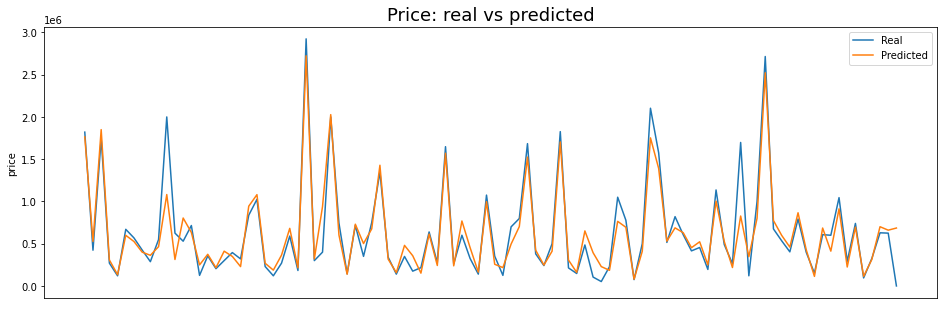

In [80]:
#let's see the how the predicted values are comparing to real values for catboost regressor.

A = np.array(y_test).reshape(-1, 1)
B = pred_cat.reshape(-1, 1)
print(type(pred_cat))
print(type(y_test))
plt.rcParams['figure.figsize'] = 16,5
plt.figure()
plt.plot(A[-100:], label="Real")
plt.plot(B[-100:], label="Predicted")
plt.legend()
plt.title("Price: real vs predicted",fontsize=18)
plt.ylabel("price")
plt.xticks(())
plt.show()

From the above all observations, we get good result by using catboost. It gives good r2 score (79%) and mean absolute error (133134). We also get good cross validation score (66%) using catboost. 

In [85]:
#save best result
df1 = pd.DataFrame(pred_cat)
df1.to_csv("cat_car_prediction.csv")
#save best model
import joblib
joblib.dump(cat,"cat_car_prediction.obj")

['cat_car_prediction.obj']